<a href="https://colab.research.google.com/github/EjbejaranosAI/EmotionUnify/blob/main/Feature_extraction_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Download andinstall libraries and dataset

In [ ]:
!pip install -q lazypredict
!pip install -q opencv-python
!pip install -q torch torchvision
!pip install -q transformers
!pip install -q timm
!pip install -q tqdm pydub
!pip install codecarbon
!pip install -q mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 30.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 31.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 75.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.8/179.8 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.5/33.5 MB 51.6 MB/s eta 0:00:00


In [ ]:
! codecarbon init


Welcome to CodeCarbon, here is your experiment id:
8aeae26a-1cce-4d18-884f-b1266815bc3a

CodeCarbon automatically added this id to your local config: ./.codecarbon.config



### Module to set the dataset

In [ ]:
"""
This module is to download multimodal datasets and store them in the dataset directory
"""
import os
import os.path
from os import path
import logging
import shutil
import subprocess
import tarfile


def download_meld_dataset():
    """
    Download MELD dataset and store it into the dataset directory

    """
    if path.exists("/content/dataset")== False:
      os.mkdir("/content/datasets")

    os.chdir('/content/datasets')
    try:
        # Add logging configuration
        logging.basicConfig(filename='download.log', level=logging.INFO)
        logging.info('Downloading MELD dataset')

        # Use wget to download the dataset
        try:
            subprocess.run(['wget', 'https://huggingface.co/datasets/declare-lab/MELD/resolve/main/MELD.Raw.tar.gz'])
        except:
            subprocess.run(['wget','http://web.eecs.umich.edu/~mihalcea/downloads/MELD.Raw.tar.gz'])

        # Extract the downloaded dataset
        subprocess.run(['tar', '-xvf', 'MELD.Raw.tar.gz'])

        # Remove the downloaded tar.gz file
        os.remove('MELD.Raw.tar.gz')

        # Rename the extracted directory to "MELD"
        os.rename('MELD.Raw', 'MELD')

        # Extract the inner tar files
        files = os.listdir("./MELD")
        files_to_uncompress = []
        for file in files:
            if file.endswith('.tar.gz'):
                print("tar.gz file found")
                files_to_uncompress.append(file)
        if len(files_to_uncompress) >0:
            for file in files_to_uncompress:
                # I want to extract the files in the same directory that was found it and later deleter the tar.gz files
                tar = tarfile.open("./MELD/"+file)
                tar.extractall("./MELD/")
                tar.close()
                os.remove("./MELD/"+file)

        else:
            print("No tar.gz files found")
    except:
        logging.error('Error in downloading MELD dataset')
        print('Error in downloading MELD dataset')


if __name__ == "__main__":
    download_meld_dataset()

tar.gz file found
tar.gz file found
tar.gz file found


# Reading dataset

In [ ]:
import os
import numpy as np
import pandas as pd

path_dataset = "/content/datasets/MELD"

# In[2]:
def load_data(path):
    csv_file_data = []
    files_to_uncompress = []
    files = os.listdir(path)
    print(files)
    # get the csv files from the files and read it
    for file in files:
        if file.endswith(".csv"):
            print(file)
            csv_file_data.append({file:pd.read_csv(path + '/' + file)})


    print(len(csv_file_data))



    return files, csv_file_data

files , csv_file_data = load_data(path_dataset)

['._output_repeated_splits_test', 'test_sent_emo.csv', 'output_repeated_splits_test', 'dev_splits_complete', 'train_sent_emo.csv', 'train_splits', '._train_splits', 'dev_sent_emo.csv', 'README.txt']
test_sent_emo.csv
train_sent_emo.csv
dev_sent_emo.csv
3


In [ ]:
train_df = csv_file_data[1]['train_sent_emo.csv']
dev_df = csv_file_data[2]['dev_sent_emo.csv']
test_df = csv_file_data[0]['test_sent_emo.csv']

In [ ]:
df_train = train_df
df_dev = dev_df
df_test = test_df
print(len(df_train))
df_train.head()

9989


,Sr No.,Utterance,Speaker,Emotion,Sentiment,Dialogue_ID,Utterance_ID,Season,Episode,StartTime,EndTime
0,1,also I was the point person on my companys tr...,Chandler,neutral,neutral,0,0,8,21,"00:16:16,059","00:16:21,731"
1,2,You mustve had your hands full.,The Interviewer,neutral,neutral,0,1,8,21,"00:16:21,940","00:16:23,442"
2,3,That I did. That I did.,Chandler,neutral,neutral,0,2,8,21,"00:16:23,442","00:16:26,389"
3,4,So lets talk a little bit about your duties.,The Interviewer,neutral,neutral,0,3,8,21,"00:16:26,820","00:16:29,572"
4,5,My duties? All right.,Chandler,surprise,positive,0,4,8,21,"00:16:34,452","00:16:40,917"


In [ ]:
# Define mapping dictionaries
emotion_mapping = {
    'neutral': [1, 0, 0, 0, 0, 0, 0],
    'surprise': [0, 1, 0, 0, 0, 0, 0],
    'fear': [0, 0, 1, 0, 0, 0, 0],
    'sadness': [0, 0, 0, 1, 0, 0, 0],
    'joy': [0, 0, 0, 0, 1, 0, 0],
    'disgust': [0, 0, 0, 0, 0, 1, 0],
    'anger': [0, 0, 0, 0, 0, 0, 1]
}

sentiment_mapping = {
    'neutral': [1, 0, 0],
    'positive': [0, 1, 0],
    'negative': [0, 0, 1]
}

In [ ]:
# Process the training, development, and test datasets
df_train['video_id'] = df_train.apply(lambda row: f'dia{row["Dialogue_ID"]}_utt{row["Utterance_ID"]}.mp4', axis=1)
df_dev['video_id'] = df_dev.apply(lambda row: f'dia{row["Dialogue_ID"]}_utt{row["Utterance_ID"]}.mp4', axis=1)
df_test['video_id'] = df_test.apply(lambda row: f'dia{row["Dialogue_ID"]}_utt{row["Utterance_ID"]}.mp4', axis=1)

df_train['Emotion_encoded'] = df_train['Emotion'].map(emotion_mapping)
df_train['Sentiment_encoded'] = df_train['Sentiment'].map(sentiment_mapping)
df_processed_train = df_train[['video_id', 'Utterance', 'Emotion_encoded', 'Sentiment_encoded']]

df_dev['Emotion_encoded'] = df_dev['Emotion'].map(emotion_mapping)
df_dev['Sentiment_encoded'] = df_dev['Sentiment'].map(sentiment_mapping)
df_processed_dev = df_dev[['video_id', 'Utterance', 'Emotion_encoded', 'Sentiment_encoded']]

df_test['Emotion_encoded'] = df_test['Emotion'].map(emotion_mapping)
df_test['Sentiment_encoded'] = df_test['Sentiment'].map(sentiment_mapping)
df_processed_test = df_test[['video_id', 'Utterance', 'Emotion_encoded', 'Sentiment_encoded']]

In [ ]:
df_processed_train

,video_id,Utterance,Emotion_encoded,Sentiment_encoded
0,dia0_utt0.mp4,also I was the point person on my companys tr...,"[1, 0, 0, 0, 0, 0, 0]","[1, 0, 0]"
1,dia0_utt1.mp4,You mustve had your hands full.,"[1, 0, 0, 0, 0, 0, 0]","[1, 0, 0]"
2,dia0_utt2.mp4,That I did. That I did.,"[1, 0, 0, 0, 0, 0, 0]","[1, 0, 0]"
3,dia0_utt3.mp4,So lets talk a little bit about your duties.,"[1, 0, 0, 0, 0, 0, 0]","[1, 0, 0]"
4,dia0_utt4.mp4,My duties? All right.,"[0, 1, 0, 0, 0, 0, 0]","[0, 1, 0]"
...,...,...,...,...
9984,dia1038_utt13.mp4,You or me?,"[1, 0, 0, 0, 0, 0, 0]","[1, 0, 0]"
9985,dia1038_utt14.mp4,"I got it. Uh, Joey, women don't have Adam's ap...","[1, 0, 0, 0, 0, 0, 0]","[1, 0, 0]"
9986,dia1038_utt15.mp4,"You guys are messing with me, right?","[0, 1, 0, 0, 0, 0, 0]","[0, 1, 0]"
9987,dia1038_utt16.mp4,Yeah.,"[1, 0, 0, 0, 0, 0, 0]","[1, 0, 0]"


# Feature extraction in text

In [ ]:
import configparser
from transformers import BertTokenizer, BertModel
import torch
import numpy as np
import pandas as pd
import time
from torch.utils.data import TensorDataset, DataLoader
from tqdm import tqdm
from codecarbon import track_emissions
import pickle


model_name = "bert-base-uncased"
max_length = 128

@track_emissions()
class TextFeatureExtractor:
    def __init__(self, classification_type="Emotion"):
        config = configparser.ConfigParser()
        config.read('../config.ini')
        self.model_name = model_name
        self.max_length = max_length
        self.tokenizer = BertTokenizer.from_pretrained(self.model_name)
        self.model = BertModel.from_pretrained(self.model_name)
        self.classification_type = classification_type
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self.model.to(self.device)

    def tokenize_utterances(self, utterances):
        input_ids = []
        attention_masks = []
        for utterance in tqdm(utterances, desc="Tokenizing Utterances"):
            tokens = self.tokenizer.encode(
                utterance,
                add_special_tokens=True,
                max_length=self.max_length,
                truncation=True,
                padding='max_length'
            )
            input_ids.append(tokens)
            attention_masks.append([1] * len(tokens))
        return torch.tensor(input_ids), torch.tensor(attention_masks)

    def mapping_emotion(self, df):
        emotion_mapping = {
            'neutral': [1, 0, 0, 0, 0, 0, 0],
            'surprise': [0, 1, 0, 0, 0, 0, 0],
            'fear': [0, 0, 1, 0, 0, 0, 0],
            'sadness': [0, 0, 0, 1, 0, 0, 0],
            'joy': [0, 0, 0, 0, 1, 0, 0],
            'disgust': [0, 0, 0, 0, 0, 1, 0],
            'anger': [0, 0, 0, 0, 0, 0, 1]
        }
        df['Emotion_encoded'] = df['Emotion'].map(emotion_mapping)
        return df

    def save_features_pickle(self, text_feature_dict, save_path):
        print(f"💾 Saving Extracted Features to {save_path}... 💾")
        with open(save_path, 'wb') as f:
            pickle.dump(text_feature_dict, f)


    def mapping_sentiment(self,df):
        sentiment_mapping = {
            'neutral': [1, 0, 0],
            'positive': [0, 1, 0],
            'negative': [0, 0, 1]
        }
        df['Sentiment_encoded'] = df['Sentiment'].map(sentiment_mapping)
        return df


    def extract_bert_features(self, file_path, batch_size=32):
        df = pd.read_csv(file_path)
        df['text_id'] = "dia" + df['Dialogue_ID'].astype(str) + '_utt' + df['Utterance_ID'].astype(str)  # Creating a unique text_id

        if self.classification_type == "Emotion":
            df = self.mapping_emotion(df)
        elif self.classification_type == "Sentiment":
            df = self.mapping_sentiment(df)

        utterances = df['Utterance'].tolist()
        input_ids, attention_masks = self.tokenize_utterances(utterances)
        input_ids, attention_masks = input_ids.to(self.device), attention_masks.to(self.device)

        dataset = TensorDataset(input_ids, attention_masks)
        dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

        all_outputs = []

        with torch.no_grad():
            for batch in tqdm(dataloader, desc="Extracting Features"):
                input_ids_batch, attention_masks_batch = batch
                bert_outputs = self.model(input_ids_batch, attention_mask=attention_masks_batch)
                all_outputs.append(bert_outputs[0][:, 0, :].cpu().numpy())

        X = np.concatenate(all_outputs, axis=0)
        y = df[f"{self.classification_type}_encoded"].values.tolist()

        text_feature_dict = {}
        for idx, (features, label, text_id) in enumerate(zip(X, y, df['text_id'])):
            text_feature_dict[text_id] = {'features': features, 'label': label}

        return text_feature_dict

def save_emissions_to_csv(emissions_data, csv_path='emissions_data.csv'):
    emissions_data.to_csv(csv_path, index=False)
    print(f"Emissions data saved to {csv_path}")

def plot_emissions(emissions_data):
    plt.plot(emissions_data['Time'], emissions_data['Emissions'], marker='o')
    plt.title('Carbon Emissions Over Time')
    plt.xlabel('Time (seconds)')
    plt.ylabel('Emissions (kg)')
    plt.grid(True)
    plt.show()

if __name__ == "__main__":
    print("⏳ Starting Feature Extraction... ⏳")
    tracker = EmissionsTracker()
    emissions_data = pd.DataFrame(columns=["Time", "Emissions"])
    start_time = time.time()

    print("🚀 Initializing Text Feature Extraction for Emotion Classification... 🚀")
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    feature_extractor = TextFeatureExtractor("Sentiment")

    datasets = {
        'train': '/content/datasets/MELD/train_sent_emo.csv',
        'dev': '/content/datasets/MELD/dev_sent_emo.csv',
        'test': '/content/datasets/MELD/test_sent_emo.csv'
    }
    for split, path_csv in datasets.items():
        tracker.start()

        print(f"📂 Loading {split.upper()} CSV Data... 📂")
        print(f"🤖 Extracting BERT Features for {split.upper()} set... 🤖")
        text_feature_dict = feature_extractor.extract_bert_features(path_csv)
        save_path = f'/content/datasets/MELD/text_features/{split}_text_features.pkl'
        feature_extractor.save_features_pickle(text_feature_dict, save_path)

        print(f"🎉 {split.upper()} Feature Extraction Complete! 🎉")

        print(f"🔍 Inspecting the saved .npy file for {split.upper()} set... 🔍")
        loaded_features = np.load(save_path, allow_pickle=True)
        print(f"📊 Shape: {len(loaded_features)}")

        first_key = list(loaded_features.keys())[0]
        first_entry = loaded_features[first_key]['features']
        print(f"🔢 Data Type of a Single Entry: {first_entry.dtype}")
        print(f"📊 Shape of a Single Entry: {first_entry.shape}")
        print(f"📈 Min Value: {np.min(loaded_features)}")
        print(f"📉 Max Value: {np.max(loaded_features)}")
        print(f"📝 {split.upper()} File Inspection Complete 📝")
        emissions = tracker.stop()
        current_time = time.time() - start_time
        emissions_data = emissions_data.append({"Time": current_time, "Emissions": emissions}, ignore_index=True)
    # Guardar los datos de emisiones a un archivo CSV
    save_emissions_to_csv(emissions_data)
    # Graficar las emisiones
    plot_emissions(emissions_data)

    end_time = time.time()
    print(f"⌛ Feature Extraction completed in {end_time - start_time:.2f} seconds ⌛")

[codecarbon INFO @ 16:46:19] [setup] RAM Tracking...
[codecarbon INFO @ 16:46:19] [setup] GPU Tracking...
[codecarbon INFO @ 16:46:19] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 16:46:19] [setup] CPU Tracking...
[codecarbon WARNING @ 16:46:19] No CPU tracking mode found. Falling back on CPU constant mode.


⏳ Starting Feature Extraction... ⏳
🚀 Initializing Text Feature Extraction for Emotion Classification... 🚀


[codecarbon WARNING @ 16:46:21] We saw that you have a Intel(R) Xeon(R) CPU @ 2.30GHz but we don't know it. Please contact us.
[codecarbon INFO @ 16:46:21] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.30GHz
[codecarbon INFO @ 16:46:21] >>> Tracker's metadata:
[codecarbon INFO @ 16:46:21]   Platform system: Linux-5.15.120+-x86_64-with-glibc2.35
[codecarbon INFO @ 16:46:21]   Python version: 3.10.12
[codecarbon INFO @ 16:46:21]   CodeCarbon version: 2.3.1
[codecarbon INFO @ 16:46:21]   Available RAM : 12.678 GB
[codecarbon INFO @ 16:46:21]   CPU count: 2
[codecarbon INFO @ 16:46:21]   CPU model: Intel(R) Xeon(R) CPU @ 2.30GHz
[codecarbon INFO @ 16:46:21]   GPU count: 1
[codecarbon INFO @ 16:46:21]   GPU model: 1 x Tesla V100-SXM2-16GB
[codecarbon INFO @ 16:46:23] 
Graceful stopping: collecting and writing information.
Please wait a few seconds...
[codecarbon INFO @ 16:46:23] Energy consumed for RAM : 0.000003 kWh. RAM Power : 4.7543792724609375 W
[codecarbon INFO @ 16

📂 Loading TRAIN CSV Data... 📂
🤖 Extracting BERT Features for TRAIN set... 🤖


Extracting Features: 100%|██████████| 313/313 [00:20<00:00, 15.29it/s]


💾 Saving Extracted Features to /content/datasets/MELD/text_features/train_text_features.pkl... 💾
🎉 TRAIN Feature Extraction Complete! 🎉
🔍 Inspecting the saved .npy file for TRAIN set... 🔍
📊 Shape: 9989
🔢 Data Type of a Single Entry: float32
📊 Shape of a Single Entry: (768,)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Extracting Features: 100%|██████████| 35/35 [00:02<00:00, 15.39it/s]


💾 Saving Extracted Features to /content/datasets/MELD/text_features/dev_text_features.pkl... 💾
🎉 DEV Feature Extraction Complete! 🎉
🔍 Inspecting the saved .npy file for DEV set... 🔍
📊 Shape: 1109
🔢 Data Type of a Single Entry: float32
📊 Shape of a Single Entry: (768,)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Extracting Features: 100%|██████████| 82/82 [00:05<00:00, 15.42it/s]


💾 Saving Extracted Features to /content/datasets/MELD/text_features/test_text_features.pkl... 💾
🎉 TEST Feature Extraction Complete! 🎉
🔍 Inspecting the saved .npy file for TEST set... 🔍
📊 Shape: 2610
🔢 Data Type of a Single Entry: float32
📊 Shape of a Single Entry: (768,)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Text classifier

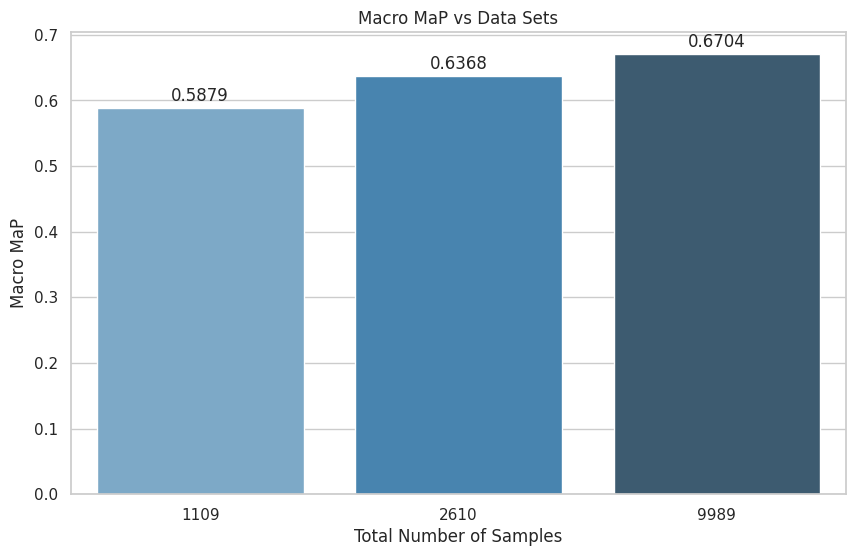

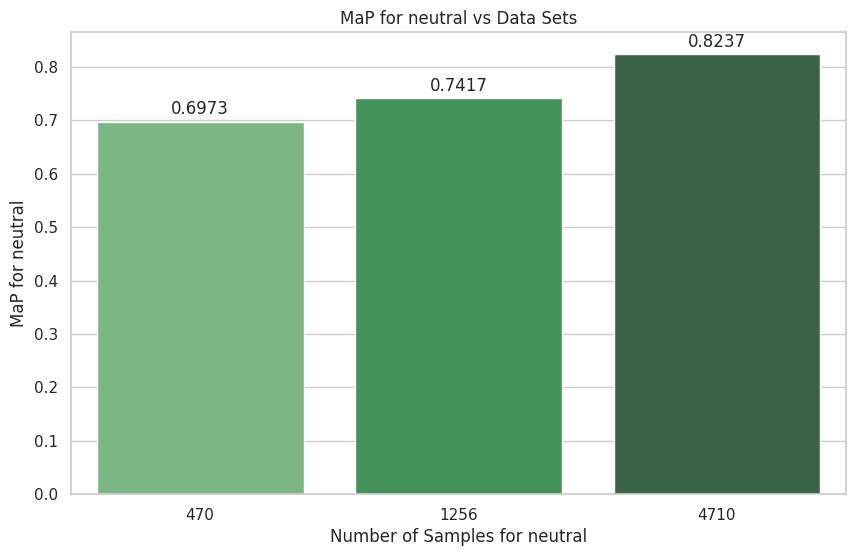

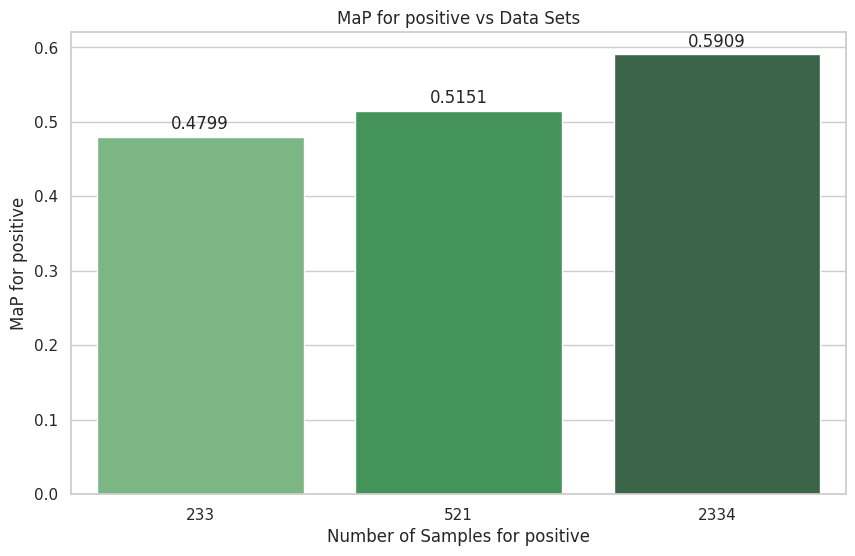

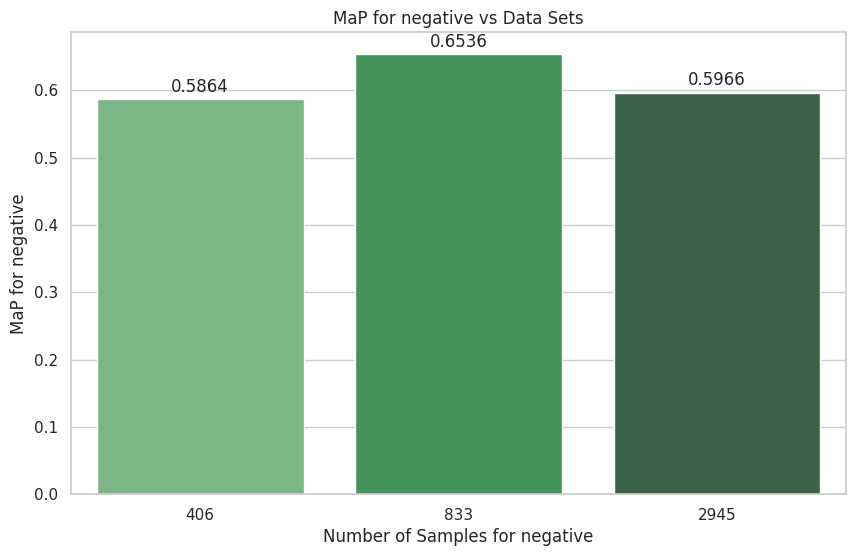

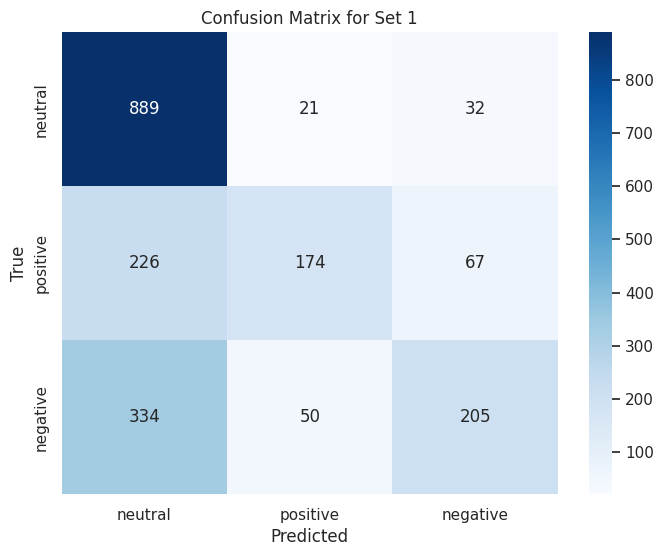

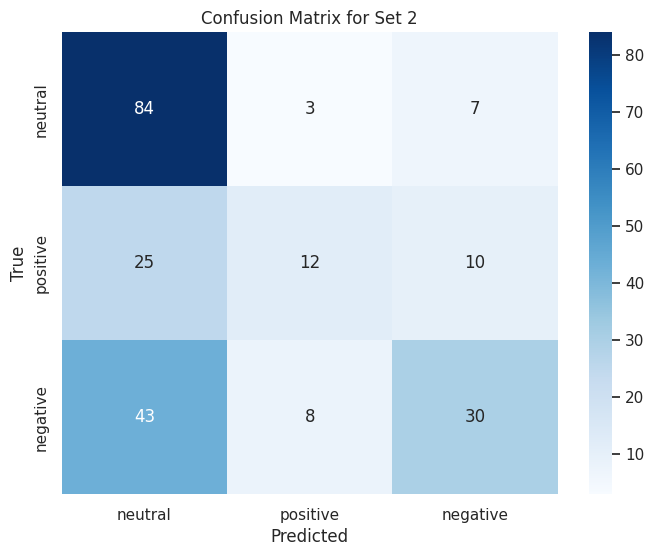

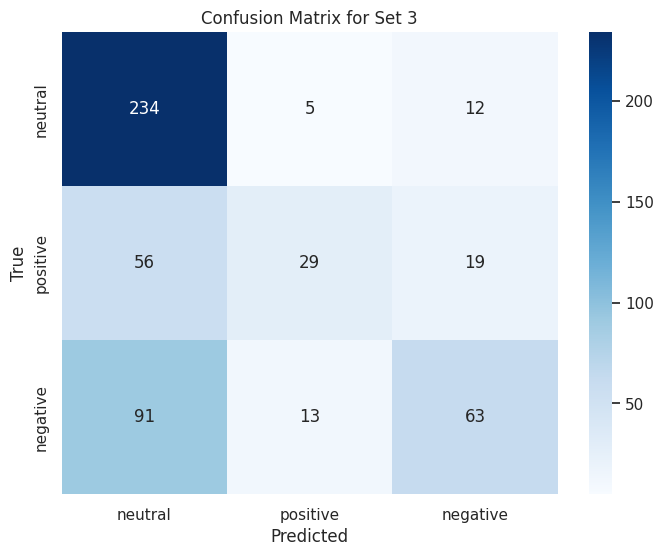

In [ ]:
from sklearn.metrics import average_precision_score, confusion_matrix
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pickle

def train_and_evaluate_classifier(features_path, class_names, test_size=0.2, max_iter=5000, random_state=42):
    with open(features_path, 'rb') as f:
        features = pickle.load(f)
    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, stratify=np.argmax(y, axis=1), random_state=random_state)
    classifier = OneVsRestClassifier(LogisticRegression(max_iter=max_iter, random_state=random_state))
    classifier.fit(X_train, y_train)
    y_score = classifier.decision_function(X_val)
    y_pred = classifier.predict(X_val)
    y_pred_single = np.argmax(y_pred, axis=1)
    y_val_single = np.argmax(y_val, axis=1)
    cm = confusion_matrix(y_val_single, y_pred_single)
    average_precision_macro = average_precision_score(y_val, y_score, average='macro')
    average_precision_each_class = average_precision_score(y_val, y_score, average=None)
    map_per_class = {class_name: score for class_name, score in zip(class_names, average_precision_each_class)}
    return average_precision_macro, map_per_class, len(X), cm

def count_samples_per_label(y, class_names):
    label_indices = np.argmax(y, axis=1)
    counts = {name: 0 for name in class_names}
    for i in label_indices:
        counts[class_names[i]] += 1
    return counts

macro_map_results = {}
class_map_results = {}
sample_count_results = {}
label_sample_count_results = {}
confusion_matrices = {}

sentiment_names = ['neutral', 'positive', 'negative']
sets_path = [
    "/content/datasets/MELD/text_features/train_text_features.pkl",
    "/content/datasets/MELD/text_features/dev_text_features.pkl",
    "/content/datasets/MELD/text_features/test_text_features.pkl"
]

for idx, set_file in enumerate(sets_path):
    map_val, map_per_class, sample_count, cm = train_and_evaluate_classifier(set_file, sentiment_names)
    set_name = f"Set {idx + 1}"
    with open(set_file, 'rb') as f:
        features = pickle.load(f)
    y = np.array([x['label'] for x in features.values()])
    label_sample_count = count_samples_per_label(y, sentiment_names)

    macro_map_results[set_name] = map_val
    class_map_results[set_name] = map_per_class
    sample_count_results[set_name] = sample_count
    label_sample_count_results[set_name] = label_sample_count
    confusion_matrices[set_name] = cm

# Sort and plot for Macro MaP
sorted_macro_map = {k: v for k, v in sorted(macro_map_results.items(), key=lambda item: item[1])}
sorted_sample_count = {k: sample_count_results[k] for k in sorted_macro_map.keys()}

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
bars = sns.barplot(x=list(sorted_macro_map.keys()), y=list(sorted_macro_map.values()), palette="Blues_d")
plt.xlabel(f'Total Number of Samples')
plt.ylabel('Macro MaP')
plt.title('Macro MaP vs Data Sets')

for idx, bar in enumerate(bars.patches):
    bars.annotate(format(bar.get_height(), '.4f'),
                  (bar.get_x() + bar.get_width() / 2., bar.get_height()),
                  ha='center', va='center',
                  xytext=(0, 9),
                  textcoords='offset points')

plt.xticks(ticks=range(len(sorted_sample_count)), labels=[str(v) for v in sorted_sample_count.values()])
plt.show()

# Sort and plot for individual classes
for class_name in sentiment_names:
    sorted_class_map_values = {k: class_map_results[k][class_name] for k in sorted_macro_map.keys()}
    sorted_label_sample_count = {k: label_sample_count_results[k][class_name] for k in sorted_macro_map.keys()}

    plt.figure(figsize=(10, 6))
    bars = sns.barplot(x=list(sorted_class_map_values.keys()), y=list(sorted_class_map_values.values()), palette="Greens_d")
    plt.xlabel(f'Number of Samples for {class_name}')
    plt.ylabel(f'MaP for {class_name}')
    plt.title(f'MaP for {class_name} vs Data Sets')

    for idx, bar in enumerate(bars.patches):
        bars.annotate(format(bar.get_height(), '.4f'),
                      (bar.get_x() + bar.get_width() / 2., bar.get_height()),
                      ha='center', va='center',
                      xytext=(0, 9),
                      textcoords='offset points')

    plt.xticks(ticks=range(len(sorted_label_sample_count)), labels=[str(v) for v in sorted_label_sample_count.values()])
    plt.show()

# Plot confusion matrices
for set_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=sentiment_names, yticklabels=sentiment_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for {set_name}')
    plt.show()



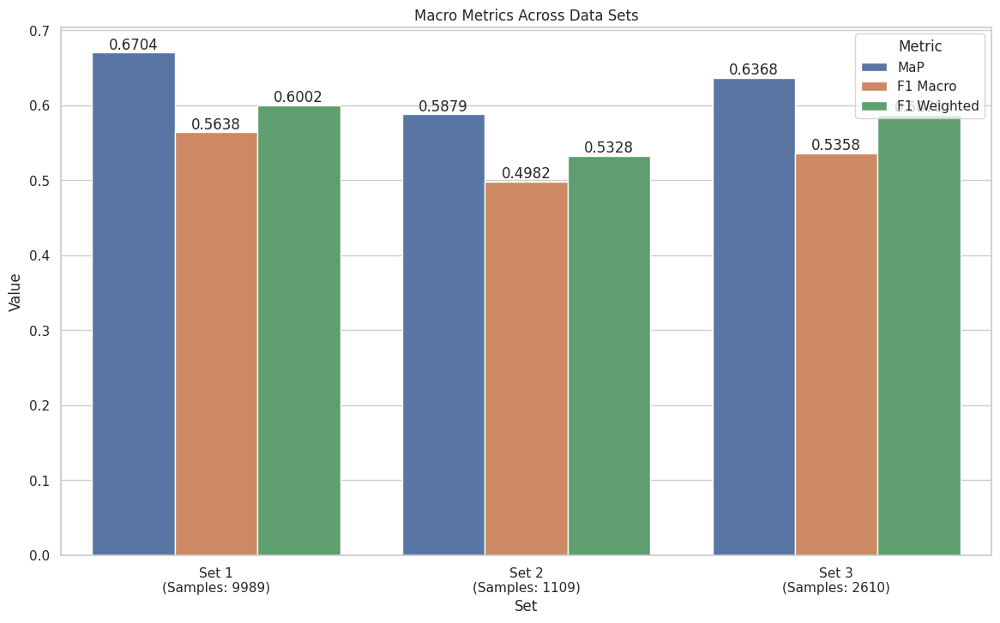

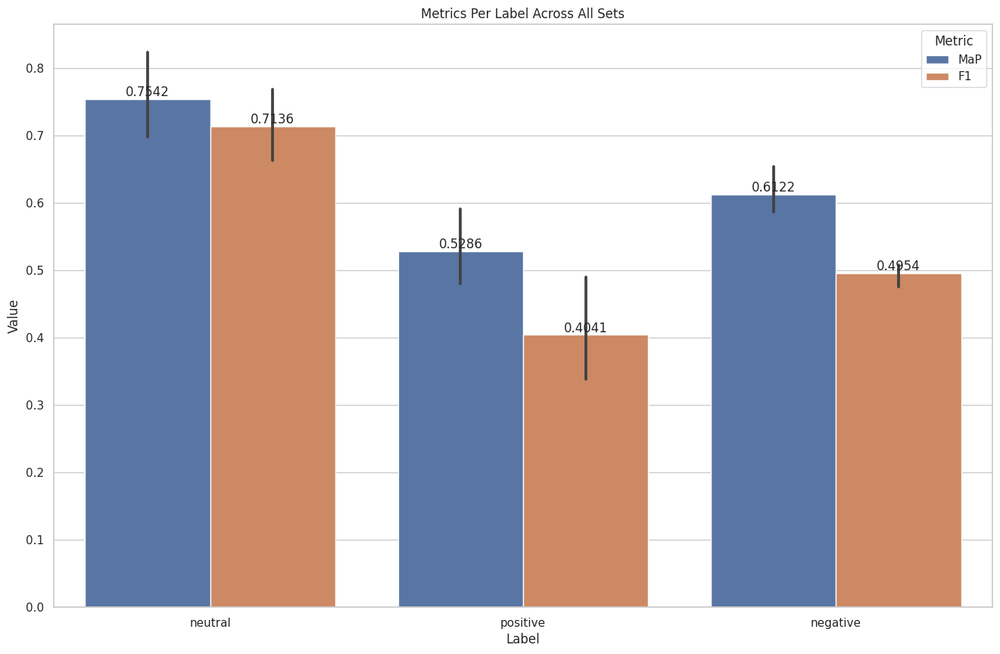

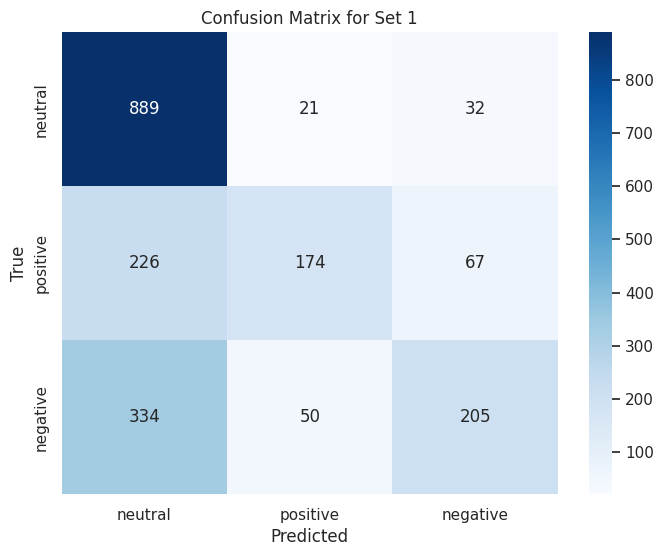

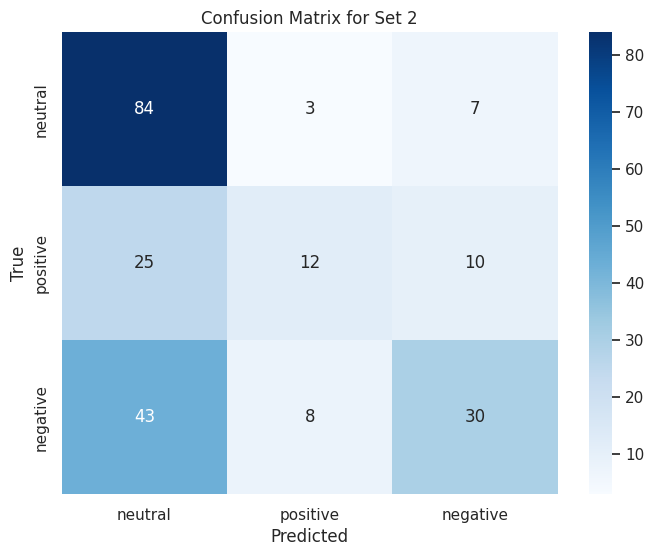

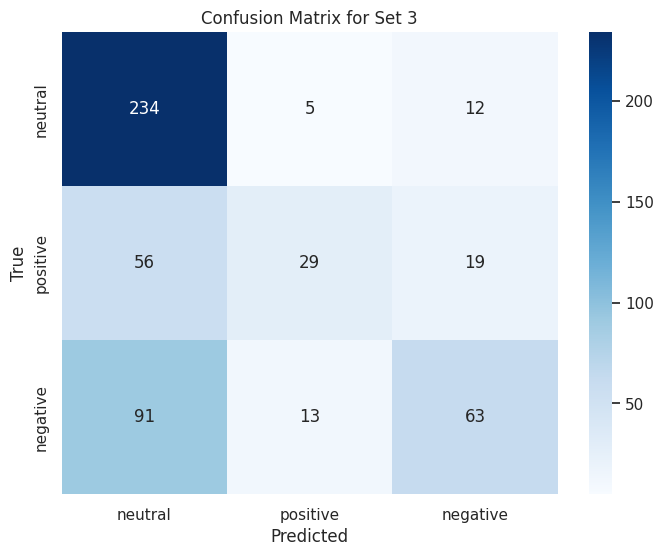

In [ ]:
from sklearn.metrics import average_precision_score, confusion_matrix, f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle

def train_and_evaluate_classifier(features_path, class_names, test_size=0.2, max_iter=5000, random_state=42):
    with open(features_path, 'rb') as f:
        features = pickle.load(f)
    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, stratify=np.argmax(y, axis=1), random_state=random_state)
    classifier = OneVsRestClassifier(LogisticRegression(max_iter=max_iter, random_state=random_state))
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_val)
    y_score = classifier.decision_function(X_val)
    y_pred_single = np.argmax(y_pred, axis=1)
    y_val_single = np.argmax(y_val, axis=1)
    cm = confusion_matrix(y_val_single, y_pred_single)
    map_val = average_precision_score(y_val, y_score, average='macro')
    f1_macro = f1_score(y_val_single, y_pred_single, average='macro')
    f1_weighted = f1_score(y_val_single, y_pred_single, average='weighted')
    map_per_label = average_precision_score(y_val, y_score, average=None)
    f1_per_label = f1_score(y_val, y_pred, average=None)
    return map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, len(X), cm

# Initialize containers
results_macro = []
results_per_label = []
confusion_matrices = {}
sets_path = ["/content/datasets/MELD/text_features/train_text_features.pkl", "/content/datasets/MELD/text_features/dev_text_features.pkl", "/content/datasets/MELD/text_features/test_text_features.pkl"]
class_names = ['neutral', 'positive', 'negative']

# Evaluate classifier and collect metrics
for idx, set_file in enumerate(sets_path):
    map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, sample_count, cm = train_and_evaluate_classifier(set_file, class_names)
    set_name = f"Set {idx + 1}"
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'MaP',
        'Value': map_val
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Macro',
        'Value': f1_macro
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Weighted',
        'Value': f1_weighted
    })

    for label_idx, label_name in enumerate(class_names):
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'MaP',
            'Value': map_per_label[label_idx]
        })
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'F1',
            'Value': f1_per_label[label_idx]
        })

    confusion_matrices[set_name] = cm

# Plotting macro metrics
df_macro = pd.DataFrame(results_macro)
plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")
ax = sns.barplot(x='Set', y='Value', hue='Metric', data=df_macro)
plt.title('Macro Metrics Across Data Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

# Annotate with sample count and update x-axis labels
new_labels = []
for idx, label in enumerate(df_macro['Set'].unique()):
    sample_count = df_macro[df_macro['Set'] == label]['Sample Count'].iloc[0]
    new_labels.append(f"{label}\n(Samples: {sample_count})")
plt.xticks(ticks=range(len(new_labels)), labels=new_labels)

plt.show()

# Plotting per-label metrics
df_per_label = pd.DataFrame(results_per_label)
plt.figure(figsize=(20, 10))
ax = sns.barplot(x='Label', y='Value', hue='Metric', data=df_per_label)
plt.title('Metrics Per Label Across All Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

plt.show()

# Plot confusion matrices
for set_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for {set_name}')
    plt.show()



In [ ]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier

# Read the Pickles
def read_pickle_file(file_path):
    with open(file_path, 'rb') as f:
        features = pickle.load(f)
    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])
    y_single = np.argmax(y, axis=1)  # Convert Labels to single integers for multiclass classification
    return X, y_single

# Read train, dev, and test data
X_train, y_train = read_pickle_file("/content/datasets/MELD/text_features/train_text_features.pkl")
X_dev, y_dev = read_pickle_file("/content/datasets/MELD/text_features/dev_text_features.pkl")
X_test, y_test = read_pickle_file("/content/datasets/MELD/text_features/test_text_features.pkl")

# Concatenate train and dev sets
X_train_full = np.concatenate((X_train, X_dev), axis=0)
y_train_full = np.concatenate((y_train, y_dev), axis=0)

# Lazy Predict
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train_full, X_test, y_train_full, y_test)
print(models)


 97%|█████████▋| 28/29 [16:59<00:38, 38.15s/it]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.291521 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195840
[LightGBM] [Info] Number of data points in the train set: 11098, number of used features: 768
[LightGBM] [Info] Start training from score -0.761960
[LightGBM] [Info] Start training from score -1.464027
[LightGBM] [Info] Start training from score -1.197506


100%|██████████| 29/29 [17:48<00:00, 36.86s/it]

                               Accuracy  Balanced Accuracy ROC AUC  F1 Score  \
Model                                                                          
LogisticRegression                 0.67               0.63    None      0.67   
LinearDiscriminantAnalysis         0.66               0.62    None      0.66   
RidgeClassifierCV                  0.67               0.61    None      0.66   
RidgeClassifier                    0.66               0.61    None      0.65   
CalibratedClassifierCV             0.66               0.59    None      0.64   
SVC                                0.65               0.58    None      0.63   
NuSVC                              0.66               0.58    None      0.63   
QuadraticDiscriminantAnalysis      0.65               0.58    None      0.63   
XGBClassifier                      0.64               0.57    None      0.62   
LGBMClassifier                     0.64               0.57    None      0.62   
LinearSVC                          0.63 

In [ ]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LogisticRegression,0.67,0.63,None,0.67,4.53
LinearDiscriminantAnalysis,0.66,0.62,None,0.66,3.35
RidgeClassifierCV,0.67,0.61,None,0.66,4.11
RidgeClassifier,0.66,0.61,None,0.65,0.62
CalibratedClassifierCV,0.66,0.59,None,0.64,356.12
SVC,0.65,0.58,None,0.63,84.96
NuSVC,0.66,0.58,None,0.63,91.47
QuadraticDiscriminantAnalysis,0.65,0.58,None,0.63,3.69
XGBClassifier,0.64,0.57,None,0.62,88.56


In [ ]:
import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(models, *['F1 Score'], **{})
chart

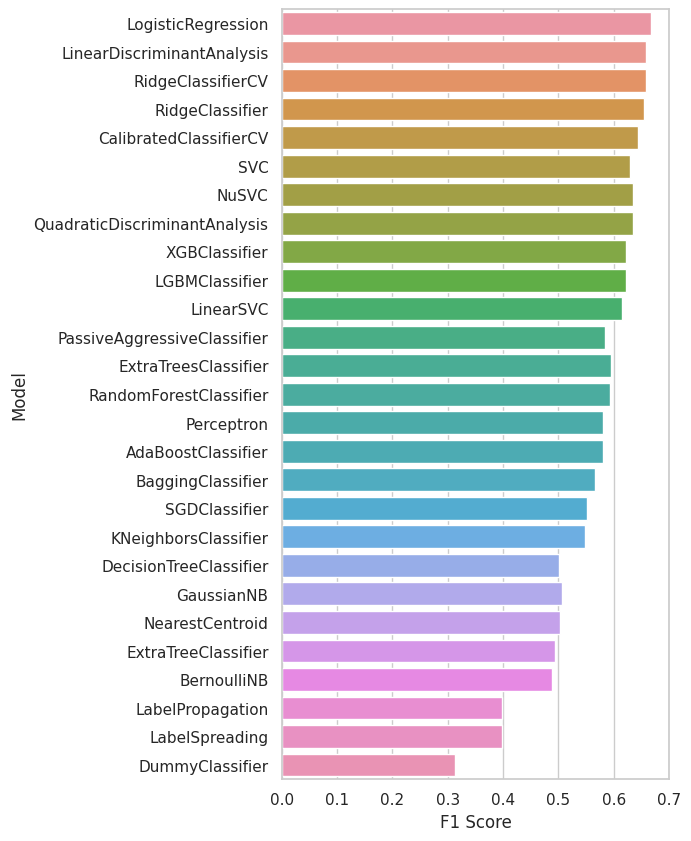

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(5, 10))
sns.set_theme(style="whitegrid")
ax = sns.barplot(y=models.index, x="F1 Score", data=models)

### Classifiers only with train data

In [ ]:
from lazypredict.Supervised import LazyClassifier

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)

print(models)

 97%|█████████▋| 28/29 [12:34<00:35, 35.52s/it]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195839
[LightGBM] [Info] Number of data points in the train set: 9989, number of used features: 768
[LightGBM] [Info] Start training from score -0.751797
[LightGBM] [Info] Start training from score -1.453901
[LightGBM] [Info] Start training from score -1.221376


100%|██████████| 29/29 [12:45<00:00, 26.41s/it]

                               Accuracy  Balanced Accuracy ROC AUC  F1 Score  \
Model                                                                          
LogisticRegression                 0.67               0.63    None      0.67   
LinearDiscriminantAnalysis         0.66               0.62    None      0.65   
RidgeClassifierCV                  0.67               0.62    None      0.66   
RidgeClassifier                    0.66               0.61    None      0.65   
LinearSVC                          0.64               0.60    None      0.63   
CalibratedClassifierCV             0.65               0.59    None      0.64   
SGDClassifier                      0.61               0.58    None      0.60   
XGBClassifier                      0.64               0.57    None      0.62   
SVC                                0.65               0.57    None      0.62   
NuSVC                              0.65               0.57    None      0.63   
QuadraticDiscriminantAnalysis      0.65 

In [ ]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LogisticRegression,0.67,0.63,None,0.67,1.84
LinearDiscriminantAnalysis,0.66,0.62,None,0.65,2.19
RidgeClassifierCV,0.67,0.62,None,0.66,1.57
RidgeClassifier,0.66,0.61,None,0.65,0.70
LinearSVC,0.64,0.60,None,0.63,65.27
CalibratedClassifierCV,0.65,0.59,None,0.64,261.63
SGDClassifier,0.61,0.58,None,0.60,7.53
XGBClassifier,0.64,0.57,None,0.62,104.50
SVC,0.65,0.57,None,0.62,51.76


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(models, *['Accuracy'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(models, *['Balanced Accuracy'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(models, *['F1 Score'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(models, *['Time Taken'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(models, *['Accuracy'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(models, *['Balanced Accuracy'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(models, *['F1 Score'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(models, *['Time Taken'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(models, *[[['Accuracy', 'Balanced Accuracy'], ['Balanced Accuracy', 'F1 Score'], ['F1 Score', 'Time Taken']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(models, *['Time Taken', 'Accuracy', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(models, *['Time Taken', 'Balanced Accuracy', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(models, *['Time Taken', 'F1 Score', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(models, *['Time Taken', 'count()', None], **{})
chart

In [ ]:
import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(models, *['Accuracy'], **{})
chart

# Feature extraction in audio

In [23]:
import pandas as pd
import numpy as np
import torch
from moviepy.editor import VideoFileClip
from transformers import Wav2Vec2Processor, Wav2Vec2Model
import os
import pickle
from tqdm import tqdm
from torchaudio.transforms import Resample

# Configuration
settings = {
    'model_name': 'audeering/wav2vec2-large-robust-12-ft-emotion-msp-dim',
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'resample_orig_freq': 48000,
    'resample_new_freq': 16000,
    'min_length': 16000
}

class EmotionModel(Wav2Vec2PreTrainedModel):
    r"""Speech emotion classifier."""

    def __init__(self, config):

        super().__init__(config)

        self.config = config
        self.wav2vec2 = Wav2Vec2Model(config)
        self.classifier = RegressionHead(config)
        self.init_weights()

    def forward(
            self,
            input_values,
    ):

        outputs = self.wav2vec2(input_values)
        hidden_states = outputs[0]
        hidden_states = torch.mean(hidden_states, dim=1)
        logits = self.classifier(hidden_states)

        return hidden_states, logits

class AudioFeatureExtractor:
    def __init__(self, settings, classification_type="Sentiment"):
        self.processor = Wav2Vec2Processor.from_pretrained(settings['model_name'])
        self.model = EmotionModel.from_pretrained(settings['model_name']).to(settings['device'])
        self.model.eval()
        self.resampler = Resample(settings['resample_orig_freq'], settings['resample_new_freq'])
        self.classification_type = classification_type


    def mapping_labels(self, df):
        mapping = {
            'Emotion': {
                'neutral': [1, 0, 0, 0, 0, 0, 0],
                'surprise': [0, 1, 0, 0, 0, 0, 0],
                'fear': [0, 0, 1, 0, 0, 0, 0],
                'sadness': [0, 0, 0, 1, 0, 0, 0],
                'joy': [0, 0, 0, 0, 1, 0, 0],
                'disgust': [0, 0, 0, 0, 0, 1, 0],
                'anger': [0, 0, 0, 0, 0, 0, 1],
            },
            'Sentiment': {
                'neutral': [1, 0, 0],
                'positive': [0, 1, 0],
                'negative': [0, 0, 1]
            }
        }
        label_column = f"{self.classification_type}_encoded"
        df[label_column] = df[self.classification_type].map(mapping[self.classification_type])
        return df

    def extract_and_save_features(self, video_folder_path, video_path_csv, set_name):
        df = pd.read_csv(video_path_csv)
        df['video_id'] = "dia" + df['Dialogue_ID'].astype(str) + '_utt' + df['Utterance_ID'].astype(str) + '.mp4'
        df = self.mapping_labels(df)

        audio_feature_dict = {}
        video_files_to_process = [file for file in os.listdir(video_folder_path) if file in set(df['video_id'])]

        for video_file in tqdm(video_files_to_process):
            try:  # Handling corrupted or problematic video/audio files
                video_path = os.path.join(video_folder_path, video_file)
                clip = VideoFileClip(video_path)
                audio = clip.audio.to_soundarray(fps=settings['resample_new_freq'])
                audio = audio.mean(axis=1)
                audio = self.resampler(torch.tensor(audio).float())

                input_values = self.processor(audio.cpu().numpy(), sampling_rate=settings['resample_new_freq'], return_tensors="pt").input_values
                input_values = input_values.to(settings['device'])

                with torch.no_grad():
                    hidden_states, logits = self.model(input_values)

                # Storing features as an array instead of a single value
                aggregated_features = hidden_states.squeeze().cpu().numpy()

                # Explicitly setting dtype for label as np.int
                label = np.array(df[df['video_id'] == video_file][f"{self.classification_type}_encoded"].values[0], dtype=np.int)

                audio_feature_dict[video_file.split('.')[0]] = {'features': aggregated_features, 'label': label}

            except Exception as e:
                print(f"Skipping {video_file} due to error: {e}")

        os.makedirs('./audio_features', exist_ok=True)
        with open(f'./audio_features/{set_name}_audio_features.pkl', 'wb') as f:
            pickle.dump(audio_feature_dict, f)



if __name__ == "__main__":
    feature_extractor = AudioFeatureExtractor(settings, classification_type="Sentiment")


    dataset_paths = {
        'Train': ('/content/datasets/MELD/train_splits', '/content/datasets/MELD/train_sent_emo.csv'),
        'Test': ('/content/datasets/MELD/output_repeated_splits_test', '/content/datasets/MELD/test_sent_emo.csv'),
        'Dev': ('/content/datasets/MELD/dev_splits_complete', '/content/datasets/MELD/dev_sent_emo.csv')
    }

    for set_name, (video_folder, csv_path) in dataset_paths.items():
        feature_extractor.extract_and_save_features(video_folder, csv_path, set_name)



  0%|          | 0/9989 [00:00<?, ?it/s]WARNING:py.warnings:<ipython-input-23-87e05da5304b>:100: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label = np.array(df[df['video_id'] == video_file][f"{self.classification_type}_encoded"].values[0], dtype=np.int)

  0%|          | 6/9989 [00:00<23:52,  6.97it/s]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/audio/AudioClip.py:113: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is depreca

Skipping dia125_utt3.mp4 due to error: MoviePy error: failed to read the duration of file /content/datasets/MELD/train_splits/dia125_utt3.mp4.
Here are the file infos returned by ffmpeg:

ffmpeg version 4.2.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libvorbis --enable-libopus --enable-libtheora --enable-libvidstab --enable-libvo-amrwbenc --enable-libvpx --enable-libwebp --enable-libx264 --enable-libx

  0%|          | 0/2610 [00:00<?, ?it/s]WARNING:py.warnings:/usr/local/lib/python3.10/dist-packages/moviepy/audio/AudioClip.py:113: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  return stacker(self.iter_chunks(fps=fps, quantize=quantize,

Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  label = np.array(df[df['video_id'] == video_file][f"{self.classification_type}_encoded"].values[0], dtype=np.int)

  0%|          | 0/1108 [00:00<?, ?it/s]WARNING:py.warnings:<ipython-input-23-87e05da5304b>:100: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to spec

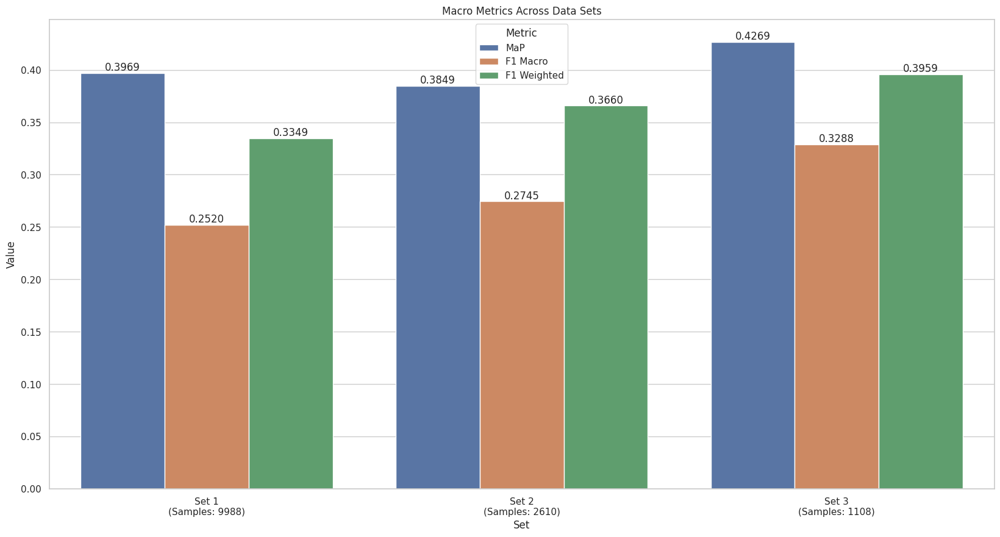

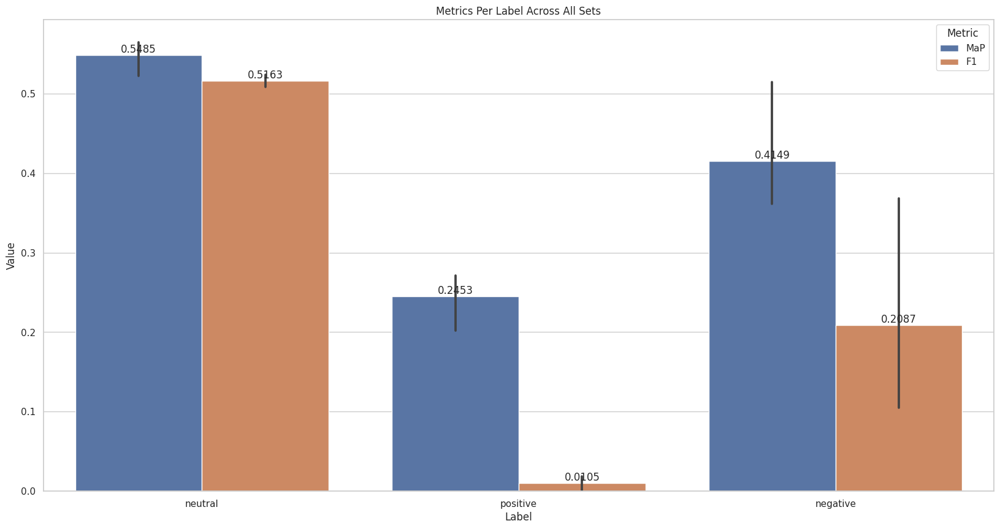

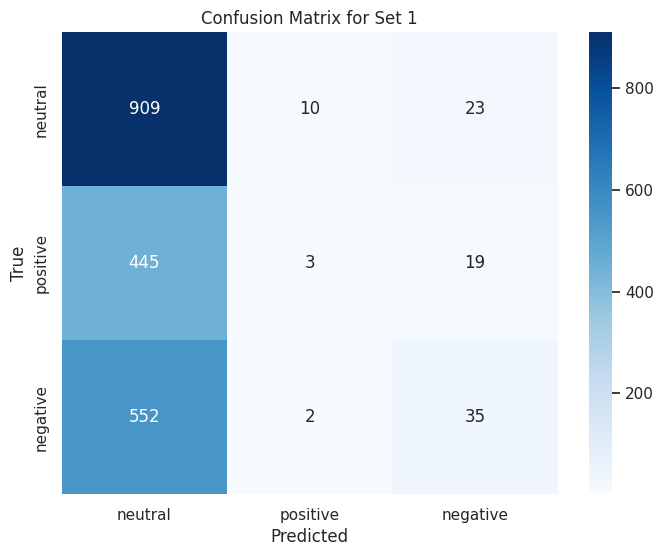

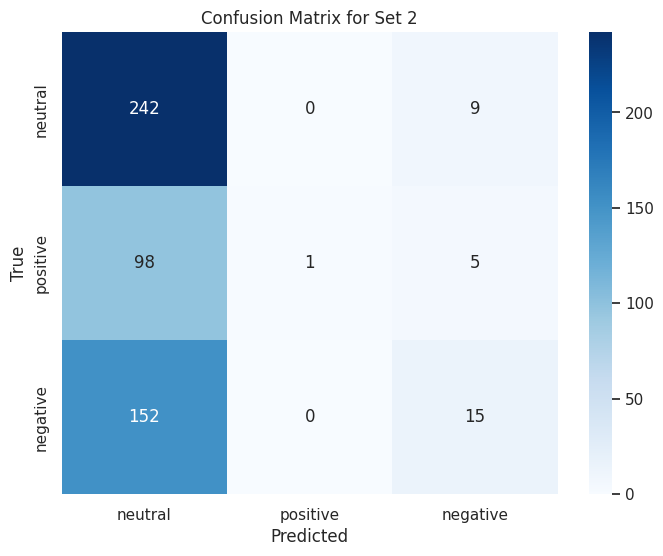

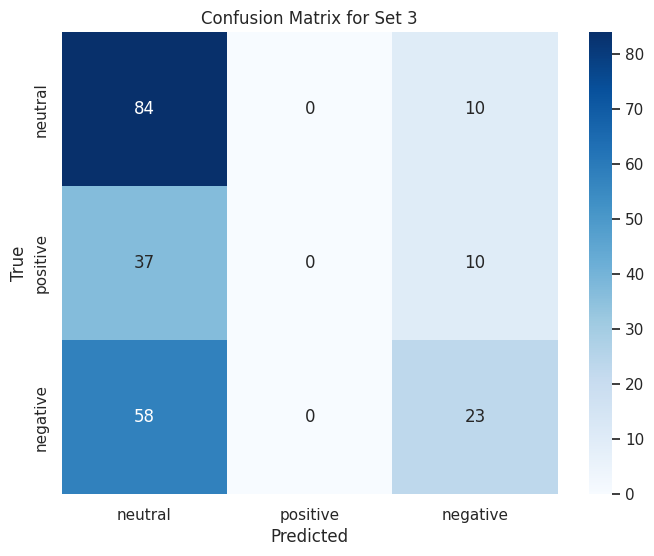

In [24]:
from sklearn.metrics import average_precision_score, confusion_matrix, f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle

def train_and_evaluate_classifier(features_path, class_names, test_size=0.2, max_iter=5000, random_state=42):
    with open(features_path, 'rb') as f:
        features = pickle.load(f)
    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, stratify=np.argmax(y, axis=1), random_state=random_state)
    classifier = OneVsRestClassifier(LogisticRegression(max_iter=max_iter, random_state=random_state))
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_val)
    y_score = classifier.decision_function(X_val)
    y_pred_single = np.argmax(y_pred, axis=1)
    y_val_single = np.argmax(y_val, axis=1)
    cm = confusion_matrix(y_val_single, y_pred_single)
    map_val = average_precision_score(y_val, y_score, average='macro')
    f1_macro = f1_score(y_val_single, y_pred_single, average='macro')
    f1_weighted = f1_score(y_val_single, y_pred_single, average='weighted')
    map_per_label = average_precision_score(y_val, y_score, average=None)
    f1_per_label = f1_score(y_val, y_pred, average=None)
    return map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, len(X), cm

# Initialize containers
results_macro = []
results_per_label = []
confusion_matrices = {}
sets_path = ["/content/datasets/audio_features/Train_audio_features.pkl", "/content/datasets/audio_features/Test_audio_features.pkl", "/content/datasets/audio_features/Dev_audio_features.pkl"]
class_names = ['neutral', 'positive', 'negative']

# Evaluate classifier and collect metrics
for idx, set_file in enumerate(sets_path):
    map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, sample_count, cm = train_and_evaluate_classifier(set_file, class_names)
    set_name = f"Set {idx + 1}"
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'MaP',
        'Value': map_val
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Macro',
        'Value': f1_macro
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Weighted',
        'Value': f1_weighted
    })

    for label_idx, label_name in enumerate(class_names):
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'MaP',
            'Value': map_per_label[label_idx]
        })
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'F1',
            'Value': f1_per_label[label_idx]
        })

    confusion_matrices[set_name] = cm

# Plotting macro metrics
df_macro = pd.DataFrame(results_macro)
plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")
ax = sns.barplot(x='Set', y='Value', hue='Metric', data=df_macro)
plt.title('Macro Metrics Across Data Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

# Annotate with sample count and update x-axis labels
new_labels = []
for idx, label in enumerate(df_macro['Set'].unique()):
    sample_count = df_macro[df_macro['Set'] == label]['Sample Count'].iloc[0]
    new_labels.append(f"{label}\n(Samples: {sample_count})")
plt.xticks(ticks=range(len(new_labels)), labels=new_labels)

plt.show()

# Plotting per-label metrics
df_per_label = pd.DataFrame(results_per_label)
plt.figure(figsize=(20, 10))
ax = sns.barplot(x='Label', y='Value', hue='Metric', data=df_per_label)
plt.title('Metrics Per Label Across All Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

plt.show()

# Plot confusion matrices
for set_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for {set_name}')
    plt.show()


### Convert videos to audio

In [ ]:
import pandas as pd
from pydub import AudioSegment
import os
from tqdm import tqdm
import moviepy.editor as mp  # Import for alternative conversion method

def convert_videos_to_wav(input_folder, output_folder, csv_file_path, max_retries=3):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    df = pd.read_csv(csv_file_path)
    df['video_id'] = 'dia' + df['Dialogue_ID'].astype(str) + '_utt' + df['Utterance_ID'].astype(str)

    failed_conversions = []  # To keep track of failed conversions

    for video_id in tqdm(df['video_id']):
        mp4_filename = f"{video_id}.mp4"
        mp4_path = os.path.join(input_folder, mp4_filename)
        wav_path = os.path.join(output_folder, mp4_filename.replace(".mp4", ".wav"))

        retries = 5
        success = False

        while retries < max_retries and not success:
            try:
                if os.path.exists(mp4_path):  # Check if the video file exists
                    audio = AudioSegment.from_file(mp4_path, format="mp4")
                    audio.export(wav_path, format="wav")
                    print(f"Converted {mp4_filename} to {wav_path}.")
                    success = True
                else:
                    print(f"{mp4_path} does not exist. Skipping.")
                    failed_conversions.append(mp4_filename)
                    break  # No point in retrying if the file doesn't exist
            except Exception as e:
                print(f"Attempt {retries+1} failed to convert {mp4_filename} due to {e}. Retrying...")
                retries += 1

        # If all retries failed, try a different conversion method
        if not success:
            try:
                clip = mp.VideoFileClip(mp4_path)
                clip.audio.write_audiofile(wav_path, codec='pcm_s16le')
                print(f"Successfully converted {mp4_filename} to {wav_path} using an alternative method.")
            except Exception as e:
                print(f"Alternative method also failed to convert {mp4_filename} due to {e}.")
                failed_conversions.append(mp4_filename)

    print(f"Failed conversions: {failed_conversions}")

# Your existing code for specifying directories goes here


# Train
video_directory_train = "/content/datasets/MELD/train_splits"
csv_file_train = "/content/datasets/MELD/train_sent_emo.csv"
output_directory_train = "/content/datasets/MELD/train_splits_complete_wav"
convert_videos_to_wav(video_directory_train, output_directory_train, csv_file_train)

# Dev
video_directory_dev = "/content/datasets/MELD/dev_splits_complete"
csv_file_dev = "/content/datasets/MELD/dev_sent_emo.csv"
output_directory_dev = "/content/datasets/MELD/dev_splits_wav"
convert_videos_to_wav(video_directory_dev, output_directory_dev, csv_file_dev)

# Test
video_directory_test = "/content/datasets/MELD/output_repeated_splits_test"
csv_file_test = "/content/datasets/MELD/test_sent_emo.csv"
output_directory_test = "/content/datasets/MELD/test_splits_wav"
convert_videos_to_wav(video_directory_test, output_directory_test, csv_file_test)


  0%|          | 0/9989 [00:00<?, ?it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt0.wav



  0%|          | 1/9989 [00:00<45:36,  3.65it/s]

MoviePy - Done.
Successfully converted dia0_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt1.wav



  0%|          | 2/9989 [00:00<29:26,  5.65it/s]

MoviePy - Done.
Successfully converted dia0_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt1.wav using an alternative method.


  0%|          | 2/9989 [00:00<29:26,  5.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt2.wav



  0%|          | 3/9989 [00:00<24:58,  6.67it/s]

MoviePy - Done.
Successfully converted dia0_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt2.wav using an alternative method.


  0%|          | 3/9989 [00:00<24:58,  6.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt3.wav



  0%|          | 4/9989 [00:00<23:25,  7.10it/s]

MoviePy - Done.
Successfully converted dia0_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt3.wav using an alternative method.


  0%|          | 4/9989 [00:00<23:25,  7.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt4.wav



  0%|          | 5/9989 [00:00<24:21,  6.83it/s]

MoviePy - Done.
Successfully converted dia0_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt4.wav using an alternative method.


  0%|          | 5/9989 [00:00<24:21,  6.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt5.wav



  0%|          | 6/9989 [00:00<22:20,  7.45it/s]

MoviePy - Done.
Successfully converted dia0_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt5.wav using an alternative method.


  0%|          | 6/9989 [00:00<22:20,  7.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt6.wav



  0%|          | 7/9989 [00:01<22:10,  7.50it/s]

MoviePy - Done.
Successfully converted dia0_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt6.wav using an alternative method.


  0%|          | 7/9989 [00:01<22:10,  7.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt7.wav



  0%|          | 8/9989 [00:01<22:32,  7.38it/s]

MoviePy - Done.
Successfully converted dia0_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt7.wav using an alternative method.


  0%|          | 8/9989 [00:01<22:32,  7.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt8.wav



  0%|          | 9/9989 [00:01<21:02,  7.90it/s]

MoviePy - Done.
Successfully converted dia0_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt8.wav using an alternative method.


  0%|          | 9/9989 [00:01<21:02,  7.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt9.wav



  0%|          | 10/9989 [00:01<21:03,  7.90it/s]

MoviePy - Done.
Successfully converted dia0_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt9.wav using an alternative method.


  0%|          | 10/9989 [00:01<21:03,  7.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt10.wav



  0%|          | 11/9989 [00:01<20:22,  8.16it/s]

MoviePy - Done.
Successfully converted dia0_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt10.wav using an alternative method.


  0%|          | 11/9989 [00:01<20:22,  8.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt11.wav



  0%|          | 12/9989 [00:01<22:57,  7.24it/s]

MoviePy - Done.
Successfully converted dia0_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt11.wav using an alternative method.


  0%|          | 12/9989 [00:01<22:57,  7.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt12.wav



  0%|          | 13/9989 [00:01<28:17,  5.88it/s]

MoviePy - Done.
Successfully converted dia0_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt12.wav using an alternative method.


  0%|          | 13/9989 [00:02<28:17,  5.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia0_utt13.wav



  0%|          | 14/9989 [00:02<33:26,  4.97it/s]

MoviePy - Done.
Successfully converted dia0_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia0_utt13.wav using an alternative method.


  0%|          | 14/9989 [00:02<33:26,  4.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia1_utt0.wav



  0%|          | 15/9989 [00:02<33:24,  4.98it/s]

MoviePy - Done.
Successfully converted dia1_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia1_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia1_utt1.wav



  0%|          | 16/9989 [00:02<32:45,  5.07it/s]

MoviePy - Done.
Successfully converted dia1_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia1_utt1.wav using an alternative method.


  0%|          | 16/9989 [00:02<32:45,  5.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia1_utt2.wav



  0%|          | 17/9989 [00:02<37:22,  4.45it/s]

MoviePy - Done.
Successfully converted dia1_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia1_utt2.wav using an alternative method.


  0%|          | 17/9989 [00:03<37:22,  4.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia1_utt3.wav



  0%|          | 18/9989 [00:03<35:24,  4.69it/s]

MoviePy - Done.
Successfully converted dia1_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia1_utt3.wav using an alternative method.


  0%|          | 18/9989 [00:03<35:24,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia1_utt4.wav



  0%|          | 19/9989 [00:03<32:24,  5.13it/s]

MoviePy - Done.
Successfully converted dia1_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia1_utt4.wav using an alternative method.


  0%|          | 19/9989 [00:03<32:24,  5.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia1_utt5.wav



chunk:   0%|          | 0/33 [00:00<?, ?it/s, now=None]
                                                 

MoviePy - Done.
Successfully converted dia1_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia1_utt5.wav using an alternative method.


  0%|          | 20/9989 [00:03<32:59,  5.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia1_utt8.wav



  0%|          | 21/9989 [00:03<34:23,  4.83it/s]

MoviePy - Done.
Successfully converted dia1_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia1_utt8.wav using an alternative method.


  0%|          | 21/9989 [00:03<34:23,  4.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt0.wav



  0%|          | 22/9989 [00:03<34:53,  4.76it/s]

MoviePy - Done.
Successfully converted dia2_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt0.wav using an alternative method.


  0%|          | 22/9989 [00:04<34:53,  4.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt1.wav



  0%|          | 23/9989 [00:04<33:40,  4.93it/s]

MoviePy - Done.
Successfully converted dia2_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt1.wav using an alternative method.


  0%|          | 23/9989 [00:04<33:40,  4.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt2.wav



  0%|          | 24/9989 [00:04<36:07,  4.60it/s]

MoviePy - Done.
Successfully converted dia2_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt2.wav using an alternative method.


  0%|          | 24/9989 [00:04<36:07,  4.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt3.wav



  0%|          | 25/9989 [00:04<35:01,  4.74it/s]

MoviePy - Done.
Successfully converted dia2_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt3.wav using an alternative method.


  0%|          | 25/9989 [00:04<35:01,  4.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt4.wav



  0%|          | 26/9989 [00:04<34:43,  4.78it/s]

MoviePy - Done.
Successfully converted dia2_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt4.wav using an alternative method.


  0%|          | 26/9989 [00:04<34:43,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt5.wav



  0%|          | 27/9989 [00:04<37:08,  4.47it/s]

MoviePy - Done.
Successfully converted dia2_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt5.wav using an alternative method.


  0%|          | 27/9989 [00:05<37:08,  4.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt6.wav



  0%|          | 28/9989 [00:05<38:32,  4.31it/s]

MoviePy - Done.
Successfully converted dia2_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt6.wav using an alternative method.


  0%|          | 28/9989 [00:05<38:32,  4.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt7.wav



  0%|          | 29/9989 [00:05<41:20,  4.01it/s]

MoviePy - Done.
Successfully converted dia2_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt7.wav using an alternative method.


  0%|          | 29/9989 [00:05<41:20,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt8.wav



  0%|          | 30/9989 [00:05<44:06,  3.76it/s]

MoviePy - Done.
Successfully converted dia2_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt8.wav using an alternative method.


  0%|          | 30/9989 [00:05<44:06,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt9.wav



  0%|          | 31/9989 [00:06<41:45,  3.98it/s]

MoviePy - Done.
Successfully converted dia2_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt10.wav



  0%|          | 32/9989 [00:06<38:08,  4.35it/s]

MoviePy - Done.
Successfully converted dia2_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt10.wav using an alternative method.


  0%|          | 32/9989 [00:06<38:08,  4.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt11.wav



  0%|          | 33/9989 [00:06<36:05,  4.60it/s]

MoviePy - Done.
Successfully converted dia2_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt11.wav using an alternative method.


  0%|          | 33/9989 [00:06<36:05,  4.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia2_utt12.wav



  0%|          | 34/9989 [00:06<36:44,  4.52it/s]

MoviePy - Done.
Successfully converted dia2_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia2_utt12.wav using an alternative method.


  0%|          | 34/9989 [00:06<36:44,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt0.wav



  0%|          | 35/9989 [00:06<36:26,  4.55it/s]

MoviePy - Done.
Successfully converted dia3_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt1.wav



  0%|          | 36/9989 [00:07<35:27,  4.68it/s]

MoviePy - Done.
Successfully converted dia3_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt1.wav using an alternative method.


  0%|          | 36/9989 [00:07<35:27,  4.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt2.wav



  0%|          | 37/9989 [00:07<32:43,  5.07it/s]

MoviePy - Done.
Successfully converted dia3_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt2.wav using an alternative method.


  0%|          | 37/9989 [00:07<32:43,  5.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt3.wav



  0%|          | 38/9989 [00:07<40:50,  4.06it/s]

MoviePy - Done.
Successfully converted dia3_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt3.wav using an alternative method.


  0%|          | 38/9989 [00:07<40:50,  4.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt4.wav



  0%|          | 39/9989 [00:07<43:44,  3.79it/s]

MoviePy - Done.
Successfully converted dia3_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt4.wav using an alternative method.


  0%|          | 39/9989 [00:08<43:44,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt5.wav



  0%|          | 40/9989 [00:08<48:30,  3.42it/s]

MoviePy - Done.
Successfully converted dia3_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt5.wav using an alternative method.


  0%|          | 40/9989 [00:08<48:30,  3.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt6.wav



  0%|          | 41/9989 [00:08<56:04,  2.96it/s]

MoviePy - Done.
Successfully converted dia3_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt6.wav using an alternative method.


  0%|          | 41/9989 [00:08<56:04,  2.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt8.wav



  0%|          | 42/9989 [00:08<52:52,  3.14it/s]

MoviePy - Done.
Successfully converted dia3_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt8.wav using an alternative method.


  0%|          | 42/9989 [00:09<52:52,  3.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia3_utt9.wav



  0%|          | 43/9989 [00:09<55:14,  3.00it/s]

MoviePy - Done.
Successfully converted dia3_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia3_utt9.wav using an alternative method.


  0%|          | 43/9989 [00:09<55:14,  3.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt0.wav



  0%|          | 44/9989 [00:09<50:23,  3.29it/s]

MoviePy - Done.
Successfully converted dia4_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt0.wav using an alternative method.


  0%|          | 44/9989 [00:09<50:23,  3.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt1.wav



  0%|          | 45/9989 [00:09<47:23,  3.50it/s]

MoviePy - Done.
Successfully converted dia4_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt1.wav using an alternative method.


  0%|          | 45/9989 [00:10<47:23,  3.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt2.wav



  0%|          | 46/9989 [00:10<53:39,  3.09it/s]

MoviePy - Done.
Successfully converted dia4_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt2.wav using an alternative method.


  0%|          | 46/9989 [00:10<53:39,  3.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt3.wav



  0%|          | 47/9989 [00:10<1:02:13,  2.66it/s]

MoviePy - Done.
Successfully converted dia4_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt3.wav using an alternative method.


  0%|          | 47/9989 [00:10<1:02:13,  2.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt4.wav



  0%|          | 48/9989 [00:11<1:00:11,  2.75it/s]

MoviePy - Done.
Successfully converted dia4_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt4.wav using an alternative method.


  0%|          | 48/9989 [00:11<1:00:11,  2.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt5.wav



  0%|          | 49/9989 [00:11<54:45,  3.03it/s]  

MoviePy - Done.
Successfully converted dia4_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt5.wav using an alternative method.


  0%|          | 49/9989 [00:11<54:45,  3.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt6.wav



  1%|          | 50/9989 [00:11<54:31,  3.04it/s]

MoviePy - Done.
Successfully converted dia4_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt6.wav using an alternative method.


  1%|          | 50/9989 [00:11<54:31,  3.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt7.wav



  1%|          | 51/9989 [00:11<52:39,  3.15it/s]

MoviePy - Done.
Successfully converted dia4_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt7.wav using an alternative method.


  1%|          | 51/9989 [00:12<52:39,  3.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt8.wav



  1%|          | 52/9989 [00:12<1:03:47,  2.60it/s]

MoviePy - Done.
Successfully converted dia4_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt9.wav



  1%|          | 53/9989 [00:12<56:19,  2.94it/s]  

MoviePy - Done.
Successfully converted dia4_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt9.wav using an alternative method.


  1%|          | 53/9989 [00:13<56:19,  2.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt10.wav



  1%|          | 54/9989 [00:13<1:32:13,  1.80it/s]

MoviePy - Done.
Successfully converted dia4_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt10.wav using an alternative method.


  1%|          | 54/9989 [00:14<1:32:13,  1.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt11.wav



  1%|          | 55/9989 [00:15<2:13:29,  1.24it/s]

MoviePy - Done.
Successfully converted dia4_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt11.wav using an alternative method.


  1%|          | 55/9989 [00:15<2:13:29,  1.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt12.wav



  1%|          | 56/9989 [00:16<2:16:22,  1.21it/s]

MoviePy - Done.
Successfully converted dia4_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt12.wav using an alternative method.


  1%|          | 56/9989 [00:16<2:16:22,  1.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt13.wav



  1%|          | 57/9989 [00:16<2:19:23,  1.19it/s]

MoviePy - Done.
Successfully converted dia4_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt13.wav using an alternative method.


  1%|          | 57/9989 [00:17<2:19:23,  1.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia4_utt14.wav



  1%|          | 58/9989 [00:17<2:14:26,  1.23it/s]

MoviePy - Done.
Successfully converted dia4_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia4_utt14.wav using an alternative method.


  1%|          | 58/9989 [00:18<2:14:26,  1.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia5_utt0.wav



  1%|          | 59/9989 [00:18<2:18:45,  1.19it/s]

MoviePy - Done.
Successfully converted dia5_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia5_utt0.wav using an alternative method.


  1%|          | 59/9989 [00:18<2:18:45,  1.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia5_utt1.wav



  1%|          | 60/9989 [00:18<1:51:22,  1.49it/s]

MoviePy - Done.
Successfully converted dia5_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia5_utt1.wav using an alternative method.


  1%|          | 60/9989 [00:19<1:51:22,  1.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia5_utt2.wav



  1%|          | 61/9989 [00:19<1:44:27,  1.58it/s]

MoviePy - Done.
Successfully converted dia5_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia5_utt2.wav using an alternative method.


  1%|          | 61/9989 [00:19<1:44:27,  1.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia5_utt3.wav



  1%|          | 62/9989 [00:19<1:40:55,  1.64it/s]

MoviePy - Done.
Successfully converted dia5_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia5_utt3.wav using an alternative method.


  1%|          | 62/9989 [00:20<1:40:55,  1.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt0.wav



  1%|          | 63/9989 [00:20<1:26:05,  1.92it/s]

MoviePy - Done.
Successfully converted dia6_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt0.wav using an alternative method.


  1%|          | 63/9989 [00:20<1:26:05,  1.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt1.wav



  1%|          | 64/9989 [00:20<1:09:30,  2.38it/s]

MoviePy - Done.
Successfully converted dia6_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt1.wav using an alternative method.


  1%|          | 64/9989 [00:20<1:09:30,  2.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt2.wav



  1%|          | 65/9989 [00:20<1:03:19,  2.61it/s]

MoviePy - Done.
Successfully converted dia6_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt2.wav using an alternative method.


  1%|          | 65/9989 [00:20<1:03:19,  2.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt3.wav



  1%|          | 66/9989 [00:20<57:51,  2.86it/s]  

MoviePy - Done.
Successfully converted dia6_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt3.wav using an alternative method.


  1%|          | 66/9989 [00:21<57:51,  2.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt4.wav



  1%|          | 67/9989 [00:21<52:22,  3.16it/s]

MoviePy - Done.
Successfully converted dia6_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt4.wav using an alternative method.


  1%|          | 67/9989 [00:21<52:22,  3.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt5.wav



  1%|          | 68/9989 [00:21<47:55,  3.45it/s]

MoviePy - Done.
Successfully converted dia6_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt5.wav using an alternative method.


  1%|          | 68/9989 [00:21<47:55,  3.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt6.wav



  1%|          | 69/9989 [00:21<48:52,  3.38it/s]

MoviePy - Done.
Successfully converted dia6_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt6.wav using an alternative method.


  1%|          | 69/9989 [00:21<48:52,  3.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt7.wav



  1%|          | 70/9989 [00:22<50:30,  3.27it/s]

MoviePy - Done.
Successfully converted dia6_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt7.wav using an alternative method.


  1%|          | 70/9989 [00:22<50:30,  3.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt8.wav



  1%|          | 71/9989 [00:22<57:54,  2.85it/s]

MoviePy - Done.
Successfully converted dia6_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt8.wav using an alternative method.


  1%|          | 71/9989 [00:22<57:54,  2.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt9.wav



  1%|          | 72/9989 [00:22<52:21,  3.16it/s]

MoviePy - Done.
Successfully converted dia6_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt9.wav using an alternative method.


  1%|          | 72/9989 [00:22<52:21,  3.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt10.wav



  1%|          | 73/9989 [00:23<48:05,  3.44it/s]

MoviePy - Done.
Successfully converted dia6_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt10.wav using an alternative method.


  1%|          | 73/9989 [00:23<48:05,  3.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt11.wav



  1%|          | 74/9989 [00:23<47:59,  3.44it/s]

MoviePy - Done.
Successfully converted dia6_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt11.wav using an alternative method.


  1%|          | 74/9989 [00:23<47:59,  3.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt12.wav



  1%|          | 75/9989 [00:23<46:42,  3.54it/s]

MoviePy - Done.
Successfully converted dia6_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt12.wav using an alternative method.


  1%|          | 75/9989 [00:23<46:42,  3.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt13.wav



chunk:   0%|          | 0/22 [00:00<?, ?it/s, now=None]
                                                 

MoviePy - Done.
Successfully converted dia6_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt13.wav using an alternative method.


  1%|          | 76/9989 [00:23<46:00,  3.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt14.wav



  1%|          | 77/9989 [00:24<42:58,  3.84it/s]

MoviePy - Done.
Successfully converted dia6_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt14.wav using an alternative method.


  1%|          | 77/9989 [00:24<42:58,  3.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt15.wav



  1%|          | 78/9989 [00:24<40:37,  4.07it/s]

MoviePy - Done.
Successfully converted dia6_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt15.wav using an alternative method.


  1%|          | 78/9989 [00:24<40:37,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt16.wav



  1%|          | 79/9989 [00:24<46:27,  3.55it/s]

MoviePy - Done.
Successfully converted dia6_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt16.wav using an alternative method.


  1%|          | 79/9989 [00:24<46:27,  3.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt17.wav



  1%|          | 80/9989 [00:24<44:32,  3.71it/s]

MoviePy - Done.
Successfully converted dia6_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt17.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt18.wav



  1%|          | 81/9989 [00:25<39:29,  4.18it/s]

MoviePy - Done.
Successfully converted dia6_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt18.wav using an alternative method.


  1%|          | 81/9989 [00:25<39:29,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt19.wav



  1%|          | 82/9989 [00:25<38:20,  4.31it/s]

MoviePy - Done.
Successfully converted dia6_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt19.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt20.wav



  1%|          | 83/9989 [00:25<36:08,  4.57it/s]

MoviePy - Done.
Successfully converted dia6_utt20.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt20.wav using an alternative method.


  1%|          | 83/9989 [00:25<36:08,  4.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia6_utt21.wav



  1%|          | 84/9989 [00:25<37:51,  4.36it/s]

MoviePy - Done.
Successfully converted dia6_utt21.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia6_utt21.wav using an alternative method.


  1%|          | 84/9989 [00:25<37:51,  4.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia7_utt0.wav



  1%|          | 85/9989 [00:25<38:19,  4.31it/s]

MoviePy - Done.
Successfully converted dia7_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia7_utt0.wav using an alternative method.


  1%|          | 85/9989 [00:26<38:19,  4.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia7_utt1.wav



  1%|          | 86/9989 [00:26<37:25,  4.41it/s]

MoviePy - Done.
Successfully converted dia7_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia7_utt1.wav using an alternative method.


  1%|          | 86/9989 [00:26<37:25,  4.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia8_utt0.wav



  1%|          | 87/9989 [00:26<40:01,  4.12it/s]

MoviePy - Done.
Successfully converted dia8_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia8_utt0.wav using an alternative method.


  1%|          | 87/9989 [00:26<40:01,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia8_utt1.wav



  1%|          | 88/9989 [00:26<43:42,  3.77it/s]

MoviePy - Done.
Successfully converted dia8_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia8_utt1.wav using an alternative method.


  1%|          | 88/9989 [00:26<43:42,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia8_utt2.wav



  1%|          | 89/9989 [00:26<39:11,  4.21it/s]

MoviePy - Done.
Successfully converted dia8_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia8_utt2.wav using an alternative method.


  1%|          | 89/9989 [00:27<39:11,  4.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia8_utt3.wav



  1%|          | 90/9989 [00:27<39:56,  4.13it/s]

MoviePy - Done.
Successfully converted dia8_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia8_utt3.wav using an alternative method.


  1%|          | 90/9989 [00:27<39:56,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia8_utt4.wav



  1%|          | 91/9989 [00:27<44:21,  3.72it/s]

MoviePy - Done.
Successfully converted dia8_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia8_utt4.wav using an alternative method.


  1%|          | 91/9989 [00:27<44:21,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia8_utt5.wav



  1%|          | 92/9989 [00:27<44:25,  3.71it/s]

MoviePy - Done.
Successfully converted dia8_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia8_utt5.wav using an alternative method.


  1%|          | 92/9989 [00:27<44:25,  3.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia8_utt6.wav



  1%|          | 93/9989 [00:28<44:18,  3.72it/s]

MoviePy - Done.
Successfully converted dia8_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia8_utt6.wav using an alternative method.


  1%|          | 93/9989 [00:28<44:18,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt0.wav



  1%|          | 94/9989 [00:28<42:31,  3.88it/s]

MoviePy - Done.
Successfully converted dia9_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt0.wav using an alternative method.


  1%|          | 94/9989 [00:28<42:31,  3.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt1.wav



  1%|          | 95/9989 [00:29<1:08:55,  2.39it/s]

MoviePy - Done.
Successfully converted dia9_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt1.wav using an alternative method.


  1%|          | 95/9989 [00:29<1:08:55,  2.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt2.wav



  1%|          | 96/9989 [00:29<1:14:12,  2.22it/s]

MoviePy - Done.
Successfully converted dia9_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt2.wav using an alternative method.


  1%|          | 96/9989 [00:30<1:14:12,  2.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt3.wav



  1%|          | 97/9989 [00:30<1:21:16,  2.03it/s]

MoviePy - Done.
Successfully converted dia9_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt3.wav using an alternative method.


  1%|          | 97/9989 [00:30<1:21:16,  2.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt4.wav



  1%|          | 98/9989 [00:30<1:19:03,  2.09it/s]

MoviePy - Done.
Successfully converted dia9_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt4.wav using an alternative method.


  1%|          | 98/9989 [00:30<1:19:03,  2.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt5.wav



  1%|          | 99/9989 [00:31<1:16:21,  2.16it/s]

MoviePy - Done.
Successfully converted dia9_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt5.wav using an alternative method.


  1%|          | 99/9989 [00:31<1:16:21,  2.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt6.wav



  1%|          | 100/9989 [00:31<1:22:44,  1.99it/s]

MoviePy - Done.
Successfully converted dia9_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt6.wav using an alternative method.


  1%|          | 100/9989 [00:31<1:22:44,  1.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt7.wav



  1%|          | 101/9989 [00:32<1:22:11,  2.01it/s]

MoviePy - Done.
Successfully converted dia9_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt7.wav using an alternative method.


  1%|          | 101/9989 [00:32<1:22:11,  2.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt8.wav



  1%|          | 102/9989 [00:32<1:16:10,  2.16it/s]

MoviePy - Done.
Successfully converted dia9_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt8.wav using an alternative method.


  1%|          | 102/9989 [00:32<1:16:10,  2.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt9.wav



  1%|          | 103/9989 [00:32<1:11:57,  2.29it/s]

MoviePy - Done.
Successfully converted dia9_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt9.wav using an alternative method.


  1%|          | 103/9989 [00:33<1:11:57,  2.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt10.wav



  1%|          | 104/9989 [00:33<1:19:01,  2.08it/s]

MoviePy - Done.
Successfully converted dia9_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt10.wav using an alternative method.


  1%|          | 104/9989 [00:33<1:19:01,  2.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt11.wav



  1%|          | 104/9989 [00:33<1:19:01,  2.08it/s]

MoviePy - Done.


  1%|          | 105/9989 [00:33<1:16:30,  2.15it/s]

Successfully converted dia9_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt11.wav using an alternative method.


  1%|          | 105/9989 [00:34<1:16:30,  2.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt12.wav



  1%|          | 106/9989 [00:34<1:14:25,  2.21it/s]

MoviePy - Done.
Successfully converted dia9_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt12.wav using an alternative method.


  1%|          | 106/9989 [00:34<1:14:25,  2.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia9_utt13.wav



  1%|          | 107/9989 [00:34<1:16:32,  2.15it/s]

MoviePy - Done.
Successfully converted dia9_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia9_utt13.wav using an alternative method.


  1%|          | 107/9989 [00:35<1:16:32,  2.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia10_utt0.wav



  1%|          | 108/9989 [00:35<1:11:00,  2.32it/s]

MoviePy - Done.
Successfully converted dia10_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia10_utt0.wav using an alternative method.


  1%|          | 108/9989 [00:35<1:11:00,  2.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia10_utt1.wav



  1%|          | 109/9989 [00:35<1:09:03,  2.38it/s]

MoviePy - Done.
Successfully converted dia10_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia10_utt1.wav using an alternative method.


  1%|          | 109/9989 [00:35<1:09:03,  2.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia10_utt2.wav



  1%|          | 110/9989 [00:35<1:03:43,  2.58it/s]

MoviePy - Done.
Successfully converted dia10_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia10_utt2.wav using an alternative method.


  1%|          | 110/9989 [00:36<1:03:43,  2.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia10_utt3.wav



  1%|          | 111/9989 [00:36<57:53,  2.84it/s]  

MoviePy - Done.
Successfully converted dia10_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia10_utt3.wav using an alternative method.


  1%|          | 111/9989 [00:36<57:53,  2.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia10_utt4.wav



  1%|          | 112/9989 [00:36<56:03,  2.94it/s]

MoviePy - Done.
Successfully converted dia10_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia10_utt4.wav using an alternative method.


  1%|          | 112/9989 [00:36<56:03,  2.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia10_utt5.wav



  1%|          | 113/9989 [00:36<55:53,  2.94it/s]

MoviePy - Done.
Successfully converted dia10_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia10_utt5.wav using an alternative method.


  1%|          | 113/9989 [00:36<55:53,  2.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt0.wav



  1%|          | 114/9989 [00:37<49:36,  3.32it/s]

MoviePy - Done.
Successfully converted dia11_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt0.wav using an alternative method.


  1%|          | 114/9989 [00:37<49:36,  3.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt1.wav



  1%|          | 115/9989 [00:37<50:05,  3.29it/s]

MoviePy - Done.
Successfully converted dia11_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt1.wav using an alternative method.


  1%|          | 115/9989 [00:37<50:05,  3.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt2.wav



  1%|          | 116/9989 [00:37<52:26,  3.14it/s]

MoviePy - Done.
Successfully converted dia11_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt2.wav using an alternative method.


  1%|          | 116/9989 [00:37<52:26,  3.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt3.wav



  1%|          | 117/9989 [00:38<55:56,  2.94it/s]

MoviePy - Done.
Successfully converted dia11_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt3.wav using an alternative method.


  1%|          | 117/9989 [00:38<55:56,  2.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt4.wav



  1%|          | 118/9989 [00:38<49:35,  3.32it/s]

MoviePy - Done.
Successfully converted dia11_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt4.wav using an alternative method.


  1%|          | 118/9989 [00:38<49:35,  3.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt5.wav



  1%|          | 119/9989 [00:38<46:50,  3.51it/s]

MoviePy - Done.
Successfully converted dia11_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt5.wav using an alternative method.


  1%|          | 119/9989 [00:38<46:50,  3.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt6.wav



chunk:   0%|          | 0/44 [00:00<?, ?it/s, now=None]
                                                  

MoviePy - Done.
Successfully converted dia11_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt6.wav using an alternative method.


  1%|          | 120/9989 [00:38<45:00,  3.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt7.wav



  1%|          | 121/9989 [00:38<41:11,  3.99it/s]

MoviePy - Done.
Successfully converted dia11_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt7.wav using an alternative method.


  1%|          | 121/9989 [00:39<41:11,  3.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt8.wav



  1%|          | 122/9989 [00:39<40:23,  4.07it/s]

MoviePy - Done.
Successfully converted dia11_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt8.wav using an alternative method.


  1%|          | 122/9989 [00:39<40:23,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia11_utt9.wav



  1%|          | 123/9989 [00:39<41:50,  3.93it/s]

MoviePy - Done.
Successfully converted dia11_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia11_utt9.wav using an alternative method.


  1%|          | 123/9989 [00:39<41:50,  3.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt0.wav



  1%|          | 124/9989 [00:39<40:31,  4.06it/s]

MoviePy - Done.
Successfully converted dia12_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt0.wav using an alternative method.


  1%|          | 124/9989 [00:39<40:31,  4.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt1.wav



  1%|▏         | 125/9989 [00:40<46:18,  3.55it/s]

MoviePy - Done.
Successfully converted dia12_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt1.wav using an alternative method.


  1%|▏         | 125/9989 [00:40<46:18,  3.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt2.wav



  1%|▏         | 126/9989 [00:40<43:34,  3.77it/s]

MoviePy - Done.
Successfully converted dia12_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt2.wav using an alternative method.


  1%|▏         | 126/9989 [00:40<43:34,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt3.wav



  1%|▏         | 127/9989 [00:40<41:47,  3.93it/s]

MoviePy - Done.
Successfully converted dia12_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt3.wav using an alternative method.


  1%|▏         | 127/9989 [00:40<41:47,  3.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt4.wav



  1%|▏         | 128/9989 [00:40<43:54,  3.74it/s]

MoviePy - Done.
Successfully converted dia12_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt4.wav using an alternative method.


  1%|▏         | 128/9989 [00:41<43:54,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt5.wav



  1%|▏         | 129/9989 [00:41<44:10,  3.72it/s]

MoviePy - Done.
Successfully converted dia12_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt5.wav using an alternative method.


  1%|▏         | 129/9989 [00:41<44:10,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt6.wav



  1%|▏         | 130/9989 [00:41<52:58,  3.10it/s]

MoviePy - Done.
Successfully converted dia12_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt6.wav using an alternative method.


  1%|▏         | 130/9989 [00:41<52:58,  3.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt7.wav



  1%|▏         | 131/9989 [00:41<50:32,  3.25it/s]

MoviePy - Done.
Successfully converted dia12_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt7.wav using an alternative method.


  1%|▏         | 131/9989 [00:41<50:32,  3.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt8.wav



  1%|▏         | 132/9989 [00:42<48:23,  3.40it/s]

MoviePy - Done.
Successfully converted dia12_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt8.wav using an alternative method.


  1%|▏         | 132/9989 [00:42<48:23,  3.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt9.wav



  1%|▏         | 133/9989 [00:42<53:18,  3.08it/s]

MoviePy - Done.
Successfully converted dia12_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt9.wav using an alternative method.


  1%|▏         | 133/9989 [00:42<53:18,  3.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt10.wav



  1%|▏         | 134/9989 [00:42<57:17,  2.87it/s]

MoviePy - Done.
Successfully converted dia12_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt10.wav using an alternative method.


  1%|▏         | 134/9989 [00:43<57:17,  2.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia12_utt11.wav



  1%|▏         | 135/9989 [00:43<56:37,  2.90it/s]

MoviePy - Done.
Successfully converted dia12_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia12_utt11.wav using an alternative method.


  1%|▏         | 135/9989 [00:43<56:37,  2.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia13_utt0.wav



  1%|▏         | 136/9989 [00:43<54:04,  3.04it/s]

MoviePy - Done.
Successfully converted dia13_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia13_utt0.wav using an alternative method.


  1%|▏         | 136/9989 [00:43<54:04,  3.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia13_utt1.wav



  1%|▏         | 137/9989 [00:44<58:41,  2.80it/s]

MoviePy - Done.
Successfully converted dia13_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia13_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia13_utt2.wav



  1%|▏         | 138/9989 [00:44<55:19,  2.97it/s]

MoviePy - Done.
Successfully converted dia13_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia13_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia13_utt3.wav



  1%|▏         | 139/9989 [00:44<46:56,  3.50it/s]

MoviePy - Done.
Successfully converted dia13_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia13_utt3.wav using an alternative method.


  1%|▏         | 139/9989 [00:44<46:56,  3.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia14_utt0.wav



  1%|▏         | 140/9989 [00:44<51:06,  3.21it/s]

MoviePy - Done.
Successfully converted dia14_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia14_utt0.wav using an alternative method.


  1%|▏         | 140/9989 [00:44<51:06,  3.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia14_utt1.wav



  1%|▏         | 141/9989 [00:44<43:10,  3.80it/s]

MoviePy - Done.
Successfully converted dia14_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia14_utt1.wav using an alternative method.


  1%|▏         | 141/9989 [00:45<43:10,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia14_utt2.wav



  1%|▏         | 141/9989 [00:45<43:10,  3.80it/s]

MoviePy - Done.


  1%|▏         | 142/9989 [00:45<40:10,  4.09it/s]

Successfully converted dia14_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia14_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia14_utt3.wav



  1%|▏         | 143/9989 [00:45<34:42,  4.73it/s]

MoviePy - Done.
Successfully converted dia14_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia14_utt3.wav using an alternative method.


  1%|▏         | 143/9989 [00:45<34:42,  4.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia14_utt4.wav



  1%|▏         | 144/9989 [00:45<31:02,  5.29it/s]

MoviePy - Done.
Successfully converted dia14_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia14_utt4.wav using an alternative method.


  1%|▏         | 144/9989 [00:45<31:02,  5.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia14_utt5.wav



  1%|▏         | 145/9989 [00:45<31:29,  5.21it/s]

MoviePy - Done.
Successfully converted dia14_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia14_utt5.wav using an alternative method.


  1%|▏         | 145/9989 [00:45<31:29,  5.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt0.wav



  1%|▏         | 146/9989 [00:45<31:48,  5.16it/s]

MoviePy - Done.
Successfully converted dia15_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt0.wav using an alternative method.


  1%|▏         | 146/9989 [00:45<31:48,  5.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt1.wav



  1%|▏         | 147/9989 [00:46<32:32,  5.04it/s]

MoviePy - Done.
Successfully converted dia15_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt2.wav



  1%|▏         | 148/9989 [00:46<34:48,  4.71it/s]

MoviePy - Done.
Successfully converted dia15_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt3.wav



  1%|▏         | 149/9989 [00:46<35:03,  4.68it/s]

MoviePy - Done.
Successfully converted dia15_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt4.wav



  2%|▏         | 150/9989 [00:46<40:58,  4.00it/s]

MoviePy - Done.
Successfully converted dia15_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt5.wav



  2%|▏         | 151/9989 [00:47<42:23,  3.87it/s]

MoviePy - Done.
Successfully converted dia15_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt6.wav



  2%|▏         | 152/9989 [00:47<38:49,  4.22it/s]

MoviePy - Done.
Successfully converted dia15_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt6.wav using an alternative method.


  2%|▏         | 152/9989 [00:47<38:49,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt7.wav



  2%|▏         | 153/9989 [00:47<37:24,  4.38it/s]

MoviePy - Done.
Successfully converted dia15_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt7.wav using an alternative method.


  2%|▏         | 153/9989 [00:47<37:24,  4.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt8.wav



  2%|▏         | 154/9989 [00:47<36:38,  4.47it/s]

MoviePy - Done.
Successfully converted dia15_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt8.wav using an alternative method.


  2%|▏         | 154/9989 [00:47<36:38,  4.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt9.wav



  2%|▏         | 155/9989 [00:48<35:38,  4.60it/s]

MoviePy - Done.
Successfully converted dia15_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt10.wav



  2%|▏         | 156/9989 [00:48<40:19,  4.06it/s]

MoviePy - Done.
Successfully converted dia15_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt10.wav using an alternative method.


  2%|▏         | 156/9989 [00:48<40:19,  4.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt11.wav



  2%|▏         | 157/9989 [00:48<43:41,  3.75it/s]

MoviePy - Done.
Successfully converted dia15_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt11.wav using an alternative method.


  2%|▏         | 157/9989 [00:48<43:41,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt12.wav



  2%|▏         | 158/9989 [00:48<44:35,  3.67it/s]

MoviePy - Done.
Successfully converted dia15_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt12.wav using an alternative method.


  2%|▏         | 158/9989 [00:48<44:35,  3.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt13.wav



  2%|▏         | 159/9989 [00:49<43:22,  3.78it/s]

MoviePy - Done.
Successfully converted dia15_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt13.wav using an alternative method.


  2%|▏         | 159/9989 [00:49<43:22,  3.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt14.wav



  2%|▏         | 160/9989 [00:49<40:57,  4.00it/s]

MoviePy - Done.
Successfully converted dia15_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt14.wav using an alternative method.


  2%|▏         | 160/9989 [00:49<40:57,  4.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt15.wav



  2%|▏         | 161/9989 [00:49<41:47,  3.92it/s]

MoviePy - Done.
Successfully converted dia15_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt15.wav using an alternative method.


  2%|▏         | 161/9989 [00:49<41:47,  3.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt16.wav



  2%|▏         | 162/9989 [00:49<37:44,  4.34it/s]

MoviePy - Done.
Successfully converted dia15_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt16.wav using an alternative method.


  2%|▏         | 162/9989 [00:49<37:44,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt17.wav



  2%|▏         | 163/9989 [00:49<35:41,  4.59it/s]

MoviePy - Done.
Successfully converted dia15_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt17.wav using an alternative method.


  2%|▏         | 163/9989 [00:50<35:41,  4.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt18.wav



  2%|▏         | 164/9989 [00:50<36:12,  4.52it/s]

MoviePy - Done.
Successfully converted dia15_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt18.wav using an alternative method.


  2%|▏         | 164/9989 [00:50<36:12,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt19.wav



  2%|▏         | 165/9989 [00:50<36:10,  4.53it/s]

MoviePy - Done.
Successfully converted dia15_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt19.wav using an alternative method.


  2%|▏         | 165/9989 [00:50<36:10,  4.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt20.wav



  2%|▏         | 166/9989 [00:50<35:04,  4.67it/s]

MoviePy - Done.
Successfully converted dia15_utt20.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt20.wav using an alternative method.


  2%|▏         | 166/9989 [00:50<35:04,  4.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt21.wav



  2%|▏         | 167/9989 [00:50<36:48,  4.45it/s]

MoviePy - Done.
Successfully converted dia15_utt21.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt21.wav using an alternative method.


  2%|▏         | 167/9989 [00:50<36:48,  4.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia15_utt22.wav



  2%|▏         | 168/9989 [00:51<43:05,  3.80it/s]

MoviePy - Done.
Successfully converted dia15_utt22.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia15_utt22.wav using an alternative method.


  2%|▏         | 168/9989 [00:51<43:05,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia16_utt0.wav



  2%|▏         | 169/9989 [00:51<38:47,  4.22it/s]

MoviePy - Done.
Successfully converted dia16_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia16_utt0.wav using an alternative method.


  2%|▏         | 169/9989 [00:51<38:47,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia16_utt1.wav



  2%|▏         | 170/9989 [00:51<37:44,  4.34it/s]

MoviePy - Done.
Successfully converted dia16_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia16_utt1.wav using an alternative method.


  2%|▏         | 170/9989 [00:51<37:44,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia16_utt2.wav



  2%|▏         | 171/9989 [00:51<36:20,  4.50it/s]

MoviePy - Done.
Successfully converted dia16_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia16_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia16_utt3.wav



  2%|▏         | 172/9989 [00:51<33:36,  4.87it/s]

MoviePy - Done.
Successfully converted dia16_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia16_utt3.wav using an alternative method.


  2%|▏         | 172/9989 [00:52<33:36,  4.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia16_utt4.wav



  2%|▏         | 173/9989 [00:52<35:16,  4.64it/s]

MoviePy - Done.
Successfully converted dia16_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia16_utt4.wav using an alternative method.


  2%|▏         | 173/9989 [00:52<35:16,  4.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia16_utt5.wav



  2%|▏         | 174/9989 [00:52<35:01,  4.67it/s]

MoviePy - Done.
Successfully converted dia16_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia16_utt5.wav using an alternative method.


  2%|▏         | 174/9989 [00:52<35:01,  4.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt0.wav



  2%|▏         | 175/9989 [00:52<36:00,  4.54it/s]

MoviePy - Done.
Successfully converted dia17_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt1.wav



  2%|▏         | 176/9989 [00:52<35:51,  4.56it/s]

MoviePy - Done.
Successfully converted dia17_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt2.wav



  2%|▏         | 177/9989 [00:53<36:43,  4.45it/s]

MoviePy - Done.
Successfully converted dia17_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt3.wav



  2%|▏         | 178/9989 [00:53<35:14,  4.64it/s]

MoviePy - Done.
Successfully converted dia17_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt3.wav using an alternative method.


  2%|▏         | 178/9989 [00:53<35:14,  4.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt4.wav



  2%|▏         | 179/9989 [00:53<36:26,  4.49it/s]

MoviePy - Done.
Successfully converted dia17_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt4.wav using an alternative method.


  2%|▏         | 179/9989 [00:53<36:26,  4.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt5.wav



chunk:   0%|          | 0/51 [00:00<?, ?it/s, now=None]


MoviePy - Done.
Successfully converted dia17_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt5.wav using an alternative method.


  2%|▏         | 180/9989 [00:53<36:11,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt6.wav



  2%|▏         | 181/9989 [00:54<36:33,  4.47it/s]

MoviePy - Done.
Successfully converted dia17_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt7.wav



  2%|▏         | 182/9989 [00:54<37:28,  4.36it/s]

MoviePy - Done.
Successfully converted dia17_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt8.wav



  2%|▏         | 183/9989 [00:54<34:08,  4.79it/s]

MoviePy - Done.
Successfully converted dia17_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt8.wav using an alternative method.


  2%|▏         | 183/9989 [00:54<34:08,  4.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt9.wav



  2%|▏         | 184/9989 [00:54<33:33,  4.87it/s]

MoviePy - Done.
Successfully converted dia17_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt9.wav using an alternative method.


  2%|▏         | 184/9989 [00:54<33:33,  4.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia17_utt10.wav



  2%|▏         | 185/9989 [00:54<36:34,  4.47it/s]

MoviePy - Done.
Successfully converted dia17_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia17_utt10.wav using an alternative method.


  2%|▏         | 185/9989 [00:54<36:34,  4.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt0.wav



  2%|▏         | 186/9989 [00:54<34:15,  4.77it/s]

MoviePy - Done.
Successfully converted dia18_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt0.wav using an alternative method.


  2%|▏         | 186/9989 [00:55<34:15,  4.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt1.wav



  2%|▏         | 187/9989 [00:55<32:15,  5.06it/s]

MoviePy - Done.
Successfully converted dia18_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt1.wav using an alternative method.


  2%|▏         | 187/9989 [00:55<32:15,  5.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt2.wav



  2%|▏         | 188/9989 [00:55<29:49,  5.48it/s]

MoviePy - Done.
Successfully converted dia18_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt2.wav using an alternative method.


  2%|▏         | 188/9989 [00:55<29:49,  5.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt3.wav



  2%|▏         | 189/9989 [00:55<30:02,  5.44it/s]

MoviePy - Done.
Successfully converted dia18_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt3.wav using an alternative method.


  2%|▏         | 189/9989 [00:55<30:02,  5.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt4.wav



  2%|▏         | 190/9989 [00:55<28:44,  5.68it/s]

MoviePy - Done.
Successfully converted dia18_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt4.wav using an alternative method.


  2%|▏         | 190/9989 [00:55<28:44,  5.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt5.wav



  2%|▏         | 191/9989 [00:55<26:52,  6.08it/s]

MoviePy - Done.
Successfully converted dia18_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt5.wav using an alternative method.


  2%|▏         | 191/9989 [00:55<26:52,  6.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt6.wav



  2%|▏         | 192/9989 [00:55<26:03,  6.27it/s]

MoviePy - Done.
Successfully converted dia18_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt6.wav using an alternative method.


  2%|▏         | 192/9989 [00:55<26:03,  6.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt7.wav



  2%|▏         | 193/9989 [00:56<24:51,  6.57it/s]

MoviePy - Done.
Successfully converted dia18_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt7.wav using an alternative method.


  2%|▏         | 193/9989 [00:56<24:51,  6.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt8.wav



  2%|▏         | 194/9989 [00:56<27:01,  6.04it/s]

MoviePy - Done.
Successfully converted dia18_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt8.wav using an alternative method.


  2%|▏         | 194/9989 [00:56<27:01,  6.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt9.wav



  2%|▏         | 195/9989 [00:56<27:23,  5.96it/s]

MoviePy - Done.
Successfully converted dia18_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt9.wav using an alternative method.


  2%|▏         | 195/9989 [00:56<27:23,  5.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia18_utt10.wav



  2%|▏         | 196/9989 [00:56<27:47,  5.87it/s]

MoviePy - Done.
Successfully converted dia18_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia18_utt10.wav using an alternative method.


  2%|▏         | 196/9989 [00:56<27:47,  5.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia19_utt0.wav



  2%|▏         | 197/9989 [00:56<27:05,  6.02it/s]

MoviePy - Done.
Successfully converted dia19_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia19_utt0.wav using an alternative method.


  2%|▏         | 197/9989 [00:56<27:05,  6.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia19_utt1.wav



  2%|▏         | 197/9989 [00:56<27:05,  6.02it/s]

MoviePy - Done.
Successfully converted dia19_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia19_utt1.wav using an alternative method.


  2%|▏         | 197/9989 [00:56<27:05,  6.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt0.wav



  2%|▏         | 199/9989 [00:56<24:58,  6.53it/s]

MoviePy - Done.
Successfully converted dia20_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt0.wav using an alternative method.


  2%|▏         | 199/9989 [00:57<24:58,  6.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt1.wav



  2%|▏         | 200/9989 [00:57<25:25,  6.42it/s]

MoviePy - Done.
Successfully converted dia20_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt1.wav using an alternative method.


  2%|▏         | 200/9989 [00:57<25:25,  6.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt2.wav



  2%|▏         | 201/9989 [00:57<27:54,  5.85it/s]

MoviePy - Done.
Successfully converted dia20_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt3.wav



  2%|▏         | 202/9989 [00:57<27:30,  5.93it/s]

MoviePy - Done.
Successfully converted dia20_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt3.wav using an alternative method.


  2%|▏         | 202/9989 [00:57<27:30,  5.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt4.wav



  2%|▏         | 202/9989 [00:57<27:30,  5.93it/s]

MoviePy - Done.


  2%|▏         | 203/9989 [00:57<29:23,  5.55it/s]

Successfully converted dia20_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt5.wav



  2%|▏         | 204/9989 [00:57<27:57,  5.83it/s]

MoviePy - Done.
Successfully converted dia20_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt5.wav using an alternative method.


  2%|▏         | 204/9989 [00:58<27:57,  5.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt6.wav



  2%|▏         | 205/9989 [00:58<27:23,  5.95it/s]

MoviePy - Done.
Successfully converted dia20_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt6.wav using an alternative method.


  2%|▏         | 205/9989 [00:58<27:23,  5.95it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt7.wav



  2%|▏         | 206/9989 [00:58<27:38,  5.90it/s]

MoviePy - Done.
Successfully converted dia20_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt7.wav using an alternative method.


  2%|▏         | 206/9989 [00:58<27:38,  5.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt8.wav



  2%|▏         | 207/9989 [00:58<25:23,  6.42it/s]

MoviePy - Done.
Successfully converted dia20_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt8.wav using an alternative method.


  2%|▏         | 207/9989 [00:58<25:23,  6.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt9.wav



  2%|▏         | 208/9989 [00:58<26:19,  6.19it/s]

MoviePy - Done.
Successfully converted dia20_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt9.wav using an alternative method.


  2%|▏         | 208/9989 [00:58<26:19,  6.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt10.wav



  2%|▏         | 209/9989 [00:58<25:17,  6.44it/s]

MoviePy - Done.
Successfully converted dia20_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt10.wav using an alternative method.


  2%|▏         | 209/9989 [00:58<25:17,  6.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt11.wav



  2%|▏         | 210/9989 [00:58<25:28,  6.40it/s]

MoviePy - Done.
Successfully converted dia20_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt11.wav using an alternative method.


  2%|▏         | 210/9989 [00:58<25:28,  6.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt12.wav



  2%|▏         | 211/9989 [00:58<25:39,  6.35it/s]

MoviePy - Done.
Successfully converted dia20_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt12.wav using an alternative method.


  2%|▏         | 211/9989 [00:59<25:39,  6.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt13.wav



  2%|▏         | 212/9989 [00:59<23:04,  7.06it/s]

MoviePy - Done.
Successfully converted dia20_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt13.wav using an alternative method.


  2%|▏         | 212/9989 [00:59<23:04,  7.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt14.wav



  2%|▏         | 213/9989 [00:59<29:59,  5.43it/s]

MoviePy - Done.
Successfully converted dia20_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt14.wav using an alternative method.


  2%|▏         | 213/9989 [00:59<29:59,  5.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt15.wav



  2%|▏         | 214/9989 [00:59<31:44,  5.13it/s]

MoviePy - Done.
Successfully converted dia20_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt15.wav using an alternative method.


  2%|▏         | 214/9989 [00:59<31:44,  5.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia20_utt16.wav



  2%|▏         | 215/9989 [00:59<28:42,  5.68it/s]

MoviePy - Done.
Successfully converted dia20_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia20_utt16.wav using an alternative method.


  2%|▏         | 215/9989 [00:59<28:42,  5.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt0.wav



  2%|▏         | 216/9989 [00:59<29:10,  5.58it/s]

MoviePy - Done.
Successfully converted dia21_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt0.wav using an alternative method.


  2%|▏         | 216/9989 [01:00<29:10,  5.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt1.wav



  2%|▏         | 217/9989 [01:00<29:48,  5.47it/s]

MoviePy - Done.
Successfully converted dia21_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt1.wav using an alternative method.


  2%|▏         | 217/9989 [01:00<29:48,  5.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt2.wav



  2%|▏         | 217/9989 [01:00<29:48,  5.47it/s]

MoviePy - Done.


  2%|▏         | 218/9989 [01:00<30:32,  5.33it/s]

Successfully converted dia21_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt2.wav using an alternative method.


  2%|▏         | 218/9989 [01:00<30:32,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt3.wav



  2%|▏         | 219/9989 [01:00<30:36,  5.32it/s]

MoviePy - Done.
Successfully converted dia21_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt3.wav using an alternative method.


  2%|▏         | 219/9989 [01:00<30:36,  5.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt4.wav



  2%|▏         | 220/9989 [01:00<32:39,  4.99it/s]

MoviePy - Done.
Successfully converted dia21_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt4.wav using an alternative method.


  2%|▏         | 220/9989 [01:00<32:39,  4.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt5.wav



  2%|▏         | 221/9989 [01:00<30:24,  5.35it/s]

MoviePy - Done.
Successfully converted dia21_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt5.wav using an alternative method.


  2%|▏         | 221/9989 [01:00<30:24,  5.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt6.wav



  2%|▏         | 221/9989 [01:01<30:24,  5.35it/s]

MoviePy - Done.


  2%|▏         | 222/9989 [01:01<29:09,  5.58it/s]

Successfully converted dia21_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt6.wav using an alternative method.


  2%|▏         | 222/9989 [01:01<29:09,  5.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt7.wav



  2%|▏         | 223/9989 [01:01<27:04,  6.01it/s]

MoviePy - Done.
Successfully converted dia21_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt7.wav using an alternative method.


  2%|▏         | 223/9989 [01:01<27:04,  6.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt8.wav



  2%|▏         | 224/9989 [01:01<30:41,  5.30it/s]

MoviePy - Done.
Successfully converted dia21_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt9.wav



  2%|▏         | 225/9989 [01:01<27:59,  5.81it/s]

MoviePy - Done.
Successfully converted dia21_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt9.wav using an alternative method.


  2%|▏         | 225/9989 [01:01<27:59,  5.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt10.wav



  2%|▏         | 226/9989 [01:01<29:26,  5.53it/s]

MoviePy - Done.
Successfully converted dia21_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt11.wav



  2%|▏         | 227/9989 [01:01<27:43,  5.87it/s]

MoviePy - Done.
Successfully converted dia21_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt11.wav using an alternative method.


  2%|▏         | 227/9989 [01:02<27:43,  5.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt12.wav



  2%|▏         | 228/9989 [01:02<26:54,  6.05it/s]

MoviePy - Done.
Successfully converted dia21_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt12.wav using an alternative method.


  2%|▏         | 228/9989 [01:02<26:54,  6.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia21_utt13.wav



  2%|▏         | 229/9989 [01:02<27:24,  5.94it/s]

MoviePy - Done.
Successfully converted dia21_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia21_utt13.wav using an alternative method.


  2%|▏         | 229/9989 [01:02<27:24,  5.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia22_utt0.wav



  2%|▏         | 230/9989 [01:02<28:21,  5.74it/s]

MoviePy - Done.
Successfully converted dia22_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia22_utt0.wav using an alternative method.


  2%|▏         | 230/9989 [01:02<28:21,  5.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia22_utt1.wav



  2%|▏         | 231/9989 [01:02<27:31,  5.91it/s]

MoviePy - Done.
Successfully converted dia22_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia22_utt1.wav using an alternative method.


  2%|▏         | 231/9989 [01:02<27:31,  5.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia22_utt2.wav



  2%|▏         | 232/9989 [01:02<28:35,  5.69it/s]

MoviePy - Done.
Successfully converted dia22_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia22_utt2.wav using an alternative method.


  2%|▏         | 232/9989 [01:02<28:35,  5.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia22_utt3.wav



  2%|▏         | 233/9989 [01:02<27:33,  5.90it/s]

MoviePy - Done.
Successfully converted dia22_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia22_utt3.wav using an alternative method.


  2%|▏         | 233/9989 [01:03<27:33,  5.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt0.wav



  2%|▏         | 234/9989 [01:03<29:56,  5.43it/s]

MoviePy - Done.
Successfully converted dia23_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt0.wav using an alternative method.


  2%|▏         | 234/9989 [01:03<29:56,  5.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt1.wav



  2%|▏         | 235/9989 [01:03<28:37,  5.68it/s]

MoviePy - Done.
Successfully converted dia23_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt1.wav using an alternative method.


  2%|▏         | 235/9989 [01:03<28:37,  5.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt2.wav



  2%|▏         | 236/9989 [01:03<32:35,  4.99it/s]

MoviePy - Done.
Successfully converted dia23_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt2.wav using an alternative method.


  2%|▏         | 236/9989 [01:03<32:35,  4.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt3.wav



  2%|▏         | 237/9989 [01:03<33:09,  4.90it/s]

MoviePy - Done.
Successfully converted dia23_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt4.wav



  2%|▏         | 238/9989 [01:04<34:46,  4.67it/s]

MoviePy - Done.
Successfully converted dia23_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt5.wav



  2%|▏         | 239/9989 [01:04<33:06,  4.91it/s]

MoviePy - Done.
Successfully converted dia23_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt5.wav using an alternative method.


  2%|▏         | 239/9989 [01:04<33:06,  4.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt6.wav



  2%|▏         | 240/9989 [01:04<33:19,  4.88it/s]

MoviePy - Done.
Successfully converted dia23_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt7.wav



  2%|▏         | 241/9989 [01:04<31:20,  5.18it/s]

MoviePy - Done.
Successfully converted dia23_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt7.wav using an alternative method.


  2%|▏         | 241/9989 [01:04<31:20,  5.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia23_utt8.wav



  2%|▏         | 242/9989 [01:04<35:28,  4.58it/s]

MoviePy - Done.
Successfully converted dia23_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia23_utt8.wav using an alternative method.


  2%|▏         | 242/9989 [01:04<35:28,  4.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt0.wav



  2%|▏         | 242/9989 [01:05<35:28,  4.58it/s]

MoviePy - Done.


  2%|▏         | 243/9989 [01:05<34:40,  4.68it/s]

Successfully converted dia24_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt0.wav using an alternative method.


  2%|▏         | 243/9989 [01:05<34:40,  4.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt1.wav



  2%|▏         | 244/9989 [01:05<36:21,  4.47it/s]

MoviePy - Done.
Successfully converted dia24_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt1.wav using an alternative method.


  2%|▏         | 244/9989 [01:05<36:21,  4.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt2.wav



  2%|▏         | 245/9989 [01:05<35:27,  4.58it/s]

MoviePy - Done.
Successfully converted dia24_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt3.wav



  2%|▏         | 246/9989 [01:05<32:57,  4.93it/s]

MoviePy - Done.
Successfully converted dia24_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt3.wav using an alternative method.


  2%|▏         | 246/9989 [01:05<32:57,  4.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt4.wav



  2%|▏         | 247/9989 [01:05<31:00,  5.24it/s]

MoviePy - Done.
Successfully converted dia24_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt4.wav using an alternative method.


  2%|▏         | 247/9989 [01:05<31:00,  5.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt5.wav



  2%|▏         | 248/9989 [01:06<32:11,  5.04it/s]

MoviePy - Done.
Successfully converted dia24_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt5.wav using an alternative method.


  2%|▏         | 248/9989 [01:06<32:11,  5.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt6.wav



  2%|▏         | 249/9989 [01:06<31:56,  5.08it/s]

MoviePy - Done.
Successfully converted dia24_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt6.wav using an alternative method.


  2%|▏         | 249/9989 [01:06<31:56,  5.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt7.wav



  3%|▎         | 250/9989 [01:06<32:33,  4.99it/s]

MoviePy - Done.
Successfully converted dia24_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt7.wav using an alternative method.


  3%|▎         | 250/9989 [01:06<32:33,  4.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia24_utt8.wav



  3%|▎         | 251/9989 [01:06<34:30,  4.70it/s]

MoviePy - Done.
Successfully converted dia24_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia24_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt0.wav



  3%|▎         | 252/9989 [01:06<32:01,  5.07it/s]

MoviePy - Done.
Successfully converted dia25_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt0.wav using an alternative method.


  3%|▎         | 252/9989 [01:06<32:01,  5.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt1.wav



  3%|▎         | 253/9989 [01:07<36:36,  4.43it/s]

MoviePy - Done.
Successfully converted dia25_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt1.wav using an alternative method.


  3%|▎         | 253/9989 [01:07<36:36,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt2.wav



  3%|▎         | 254/9989 [01:07<39:24,  4.12it/s]

MoviePy - Done.
Successfully converted dia25_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt2.wav using an alternative method.


  3%|▎         | 254/9989 [01:07<39:24,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt3.wav



  3%|▎         | 255/9989 [01:07<39:34,  4.10it/s]

MoviePy - Done.
Successfully converted dia25_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt4.wav



  3%|▎         | 256/9989 [01:07<34:41,  4.68it/s]

MoviePy - Done.
Successfully converted dia25_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt4.wav using an alternative method.


  3%|▎         | 256/9989 [01:07<34:41,  4.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt5.wav



  3%|▎         | 257/9989 [01:08<34:09,  4.75it/s]

MoviePy - Done.
Successfully converted dia25_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt5.wav using an alternative method.


  3%|▎         | 257/9989 [01:08<34:09,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt6.wav



  3%|▎         | 258/9989 [01:08<38:25,  4.22it/s]

MoviePy - Done.
Successfully converted dia25_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt6.wav using an alternative method.


  3%|▎         | 258/9989 [01:08<38:25,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt7.wav



  3%|▎         | 259/9989 [01:08<35:16,  4.60it/s]

MoviePy - Done.
Successfully converted dia25_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt7.wav using an alternative method.


  3%|▎         | 259/9989 [01:08<35:16,  4.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt8.wav



  3%|▎         | 260/9989 [01:08<32:25,  5.00it/s]

MoviePy - Done.
Successfully converted dia25_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt8.wav using an alternative method.


  3%|▎         | 260/9989 [01:08<32:25,  5.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt9.wav



  3%|▎         | 261/9989 [01:08<29:56,  5.42it/s]

MoviePy - Done.
Successfully converted dia25_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt9.wav using an alternative method.


  3%|▎         | 261/9989 [01:08<29:56,  5.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt10.wav



  3%|▎         | 262/9989 [01:08<30:11,  5.37it/s]

MoviePy - Done.
Successfully converted dia25_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt10.wav using an alternative method.


  3%|▎         | 262/9989 [01:09<30:11,  5.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt11.wav



  3%|▎         | 263/9989 [01:09<29:17,  5.54it/s]

MoviePy - Done.
Successfully converted dia25_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt11.wav using an alternative method.


  3%|▎         | 263/9989 [01:09<29:17,  5.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt12.wav



  3%|▎         | 264/9989 [01:09<30:53,  5.25it/s]

MoviePy - Done.
Successfully converted dia25_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt12.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia25_utt13.wav



  3%|▎         | 265/9989 [01:09<30:44,  5.27it/s]

MoviePy - Done.
Successfully converted dia25_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia25_utt13.wav using an alternative method.


  3%|▎         | 265/9989 [01:09<30:44,  5.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt0.wav



  3%|▎         | 266/9989 [01:09<34:06,  4.75it/s]

MoviePy - Done.
Successfully converted dia26_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt0.wav using an alternative method.


  3%|▎         | 266/9989 [01:10<34:06,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt1.wav



  3%|▎         | 267/9989 [01:10<37:05,  4.37it/s]

MoviePy - Done.
Successfully converted dia26_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt1.wav using an alternative method.


  3%|▎         | 267/9989 [01:10<37:05,  4.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt2.wav



  3%|▎         | 268/9989 [01:10<37:13,  4.35it/s]

MoviePy - Done.
Successfully converted dia26_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt2.wav using an alternative method.


  3%|▎         | 268/9989 [01:10<37:13,  4.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt3.wav



  3%|▎         | 269/9989 [01:10<34:59,  4.63it/s]

MoviePy - Done.
Successfully converted dia26_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt3.wav using an alternative method.


  3%|▎         | 269/9989 [01:10<34:59,  4.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt4.wav



  3%|▎         | 270/9989 [01:11<47:33,  3.41it/s]

MoviePy - Done.
Successfully converted dia26_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt5.wav



  3%|▎         | 271/9989 [01:11<49:38,  3.26it/s]

MoviePy - Done.
Successfully converted dia26_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt6.wav



  3%|▎         | 272/9989 [01:11<45:42,  3.54it/s]

MoviePy - Done.
Successfully converted dia26_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt7.wav



  3%|▎         | 273/9989 [01:11<41:51,  3.87it/s]

MoviePy - Done.
Successfully converted dia26_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt8.wav



  3%|▎         | 274/9989 [01:12<39:42,  4.08it/s]

MoviePy - Done.
Successfully converted dia26_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt9.wav



  3%|▎         | 275/9989 [01:12<41:13,  3.93it/s]

MoviePy - Done.
Successfully converted dia26_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt10.wav



  3%|▎         | 276/9989 [01:12<38:31,  4.20it/s]

MoviePy - Done.
Successfully converted dia26_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt11.wav



  3%|▎         | 277/9989 [01:12<40:23,  4.01it/s]

MoviePy - Done.
Successfully converted dia26_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt12.wav



  3%|▎         | 278/9989 [01:13<39:33,  4.09it/s]

MoviePy - Done.
Successfully converted dia26_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt12.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia26_utt13.wav



  3%|▎         | 279/9989 [01:13<39:23,  4.11it/s]

MoviePy - Done.
Successfully converted dia26_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia26_utt13.wav using an alternative method.


  3%|▎         | 279/9989 [01:13<39:23,  4.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia27_utt0.wav



  3%|▎         | 280/9989 [01:13<43:40,  3.71it/s]

MoviePy - Done.
Successfully converted dia27_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia27_utt0.wav using an alternative method.


  3%|▎         | 280/9989 [01:13<43:40,  3.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia27_utt1.wav



  3%|▎         | 281/9989 [01:13<44:25,  3.64it/s]

MoviePy - Done.
Successfully converted dia27_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia27_utt1.wav using an alternative method.


  3%|▎         | 281/9989 [01:13<44:25,  3.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt0.wav



  3%|▎         | 282/9989 [01:14<41:47,  3.87it/s]

MoviePy - Done.
Successfully converted dia28_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt0.wav using an alternative method.


  3%|▎         | 282/9989 [01:14<41:47,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt1.wav



  3%|▎         | 283/9989 [01:14<38:54,  4.16it/s]

MoviePy - Done.
Successfully converted dia28_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt1.wav using an alternative method.


  3%|▎         | 283/9989 [01:14<38:54,  4.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt2.wav



  3%|▎         | 284/9989 [01:14<35:05,  4.61it/s]

MoviePy - Done.
Successfully converted dia28_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt2.wav using an alternative method.


  3%|▎         | 284/9989 [01:14<35:05,  4.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt3.wav



  3%|▎         | 285/9989 [01:14<34:58,  4.62it/s]

MoviePy - Done.
Successfully converted dia28_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt3.wav using an alternative method.


  3%|▎         | 285/9989 [01:14<34:58,  4.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt4.wav



  3%|▎         | 286/9989 [01:14<38:55,  4.15it/s]

MoviePy - Done.
Successfully converted dia28_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt4.wav using an alternative method.


  3%|▎         | 286/9989 [01:15<38:55,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt5.wav



  3%|▎         | 287/9989 [01:15<44:03,  3.67it/s]

MoviePy - Done.
Successfully converted dia28_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt5.wav using an alternative method.


  3%|▎         | 287/9989 [01:15<44:03,  3.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt6.wav



  3%|▎         | 288/9989 [01:15<42:44,  3.78it/s]

MoviePy - Done.
Successfully converted dia28_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt6.wav using an alternative method.


  3%|▎         | 288/9989 [01:15<42:44,  3.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia28_utt7.wav



  3%|▎         | 289/9989 [01:15<39:07,  4.13it/s]

MoviePy - Done.
Successfully converted dia28_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia28_utt7.wav using an alternative method.


  3%|▎         | 289/9989 [01:15<39:07,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt0.wav



  3%|▎         | 290/9989 [01:15<40:09,  4.03it/s]

MoviePy - Done.
Successfully converted dia29_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt0.wav using an alternative method.


  3%|▎         | 290/9989 [01:16<40:09,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt1.wav



  3%|▎         | 291/9989 [01:16<38:03,  4.25it/s]

MoviePy - Done.
Successfully converted dia29_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt2.wav



  3%|▎         | 292/9989 [01:16<34:44,  4.65it/s]

MoviePy - Done.
Successfully converted dia29_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt2.wav using an alternative method.


  3%|▎         | 292/9989 [01:16<34:44,  4.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt3.wav



  3%|▎         | 293/9989 [01:16<31:17,  5.16it/s]

MoviePy - Done.
Successfully converted dia29_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt3.wav using an alternative method.


  3%|▎         | 293/9989 [01:16<31:17,  5.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt4.wav



  3%|▎         | 294/9989 [01:16<29:55,  5.40it/s]

MoviePy - Done.
Successfully converted dia29_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt4.wav using an alternative method.


  3%|▎         | 294/9989 [01:16<29:55,  5.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt6.wav



  3%|▎         | 295/9989 [01:16<28:55,  5.59it/s]

MoviePy - Done.
Successfully converted dia29_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt6.wav using an alternative method.


  3%|▎         | 295/9989 [01:16<28:55,  5.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt7.wav



  3%|▎         | 296/9989 [01:16<28:29,  5.67it/s]

MoviePy - Done.
Successfully converted dia29_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt7.wav using an alternative method.


  3%|▎         | 296/9989 [01:17<28:29,  5.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt8.wav



  3%|▎         | 297/9989 [01:17<29:32,  5.47it/s]

MoviePy - Done.
Successfully converted dia29_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt8.wav using an alternative method.


  3%|▎         | 297/9989 [01:17<29:32,  5.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt9.wav



  3%|▎         | 298/9989 [01:17<29:24,  5.49it/s]

MoviePy - Done.
Successfully converted dia29_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt9.wav using an alternative method.


  3%|▎         | 298/9989 [01:17<29:24,  5.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt10.wav



  3%|▎         | 299/9989 [01:17<30:43,  5.26it/s]

MoviePy - Done.
Successfully converted dia29_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt11.wav



  3%|▎         | 300/9989 [01:17<31:30,  5.12it/s]

MoviePy - Done.
Successfully converted dia29_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt12.wav



  3%|▎         | 301/9989 [01:17<29:55,  5.40it/s]

MoviePy - Done.
Successfully converted dia29_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt12.wav using an alternative method.


  3%|▎         | 301/9989 [01:18<29:55,  5.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia29_utt13.wav



  3%|▎         | 302/9989 [01:18<32:31,  4.96it/s]

MoviePy - Done.
Successfully converted dia29_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia29_utt13.wav using an alternative method.


  3%|▎         | 302/9989 [01:18<32:31,  4.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt0.wav



  3%|▎         | 303/9989 [01:18<31:04,  5.19it/s]

MoviePy - Done.
Successfully converted dia30_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt0.wav using an alternative method.


  3%|▎         | 303/9989 [01:18<31:04,  5.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt1.wav



  3%|▎         | 304/9989 [01:18<33:03,  4.88it/s]

MoviePy - Done.
Successfully converted dia30_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt1.wav using an alternative method.


  3%|▎         | 304/9989 [01:18<33:03,  4.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt2.wav



  3%|▎         | 305/9989 [01:18<31:33,  5.12it/s]

MoviePy - Done.
Successfully converted dia30_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt2.wav using an alternative method.


  3%|▎         | 305/9989 [01:18<31:33,  5.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt3.wav



  3%|▎         | 306/9989 [01:18<29:51,  5.41it/s]

MoviePy - Done.
Successfully converted dia30_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt3.wav using an alternative method.


  3%|▎         | 306/9989 [01:19<29:51,  5.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt4.wav



  3%|▎         | 307/9989 [01:19<31:46,  5.08it/s]

MoviePy - Done.
Successfully converted dia30_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt5.wav



  3%|▎         | 308/9989 [01:19<28:37,  5.64it/s]

MoviePy - Done.
Successfully converted dia30_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt5.wav using an alternative method.


  3%|▎         | 308/9989 [01:19<28:37,  5.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt6.wav



  3%|▎         | 309/9989 [01:19<28:08,  5.73it/s]

MoviePy - Done.
Successfully converted dia30_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt6.wav using an alternative method.


  3%|▎         | 309/9989 [01:19<28:08,  5.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt7.wav



  3%|▎         | 310/9989 [01:19<33:14,  4.85it/s]

MoviePy - Done.
Successfully converted dia30_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt7.wav using an alternative method.


  3%|▎         | 310/9989 [01:19<33:14,  4.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt8.wav



  3%|▎         | 311/9989 [01:20<35:10,  4.59it/s]

MoviePy - Done.
Successfully converted dia30_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt9.wav



  3%|▎         | 312/9989 [01:20<32:46,  4.92it/s]

MoviePy - Done.
Successfully converted dia30_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt9.wav using an alternative method.


  3%|▎         | 312/9989 [01:20<32:46,  4.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt10.wav



  3%|▎         | 313/9989 [01:20<33:55,  4.75it/s]

MoviePy - Done.
Successfully converted dia30_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt10.wav using an alternative method.


  3%|▎         | 313/9989 [01:20<33:55,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt11.wav



  3%|▎         | 314/9989 [01:20<34:48,  4.63it/s]

MoviePy - Done.
Successfully converted dia30_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt12.wav



  3%|▎         | 315/9989 [01:20<31:19,  5.15it/s]

MoviePy - Done.
Successfully converted dia30_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt12.wav using an alternative method.


  3%|▎         | 315/9989 [01:20<31:19,  5.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt13.wav



  3%|▎         | 316/9989 [01:20<30:23,  5.31it/s]

MoviePy - Done.
Successfully converted dia30_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt13.wav using an alternative method.


  3%|▎         | 316/9989 [01:21<30:23,  5.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt14.wav



  3%|▎         | 317/9989 [01:21<32:03,  5.03it/s]

MoviePy - Done.
Successfully converted dia30_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt14.wav using an alternative method.


  3%|▎         | 317/9989 [01:21<32:03,  5.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia30_utt15.wav



  3%|▎         | 318/9989 [01:21<30:43,  5.25it/s]

MoviePy - Done.
Successfully converted dia30_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia30_utt15.wav using an alternative method.


  3%|▎         | 318/9989 [01:21<30:43,  5.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia31_utt0.wav



  3%|▎         | 318/9989 [01:21<30:43,  5.25it/s]

MoviePy - Done.


  3%|▎         | 319/9989 [01:21<31:12,  5.16it/s]

Successfully converted dia31_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia31_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia31_utt1.wav



  3%|▎         | 320/9989 [01:21<30:32,  5.28it/s]

MoviePy - Done.
Successfully converted dia31_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia31_utt1.wav using an alternative method.


  3%|▎         | 320/9989 [01:21<30:32,  5.28it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia31_utt2.wav



  3%|▎         | 321/9989 [01:21<35:19,  4.56it/s]

MoviePy - Done.
Successfully converted dia31_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia31_utt2.wav using an alternative method.


  3%|▎         | 321/9989 [01:22<35:19,  4.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia31_utt3.wav



  3%|▎         | 322/9989 [01:22<35:09,  4.58it/s]

MoviePy - Done.
Successfully converted dia31_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia31_utt3.wav using an alternative method.


  3%|▎         | 322/9989 [01:22<35:09,  4.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt0.wav



  3%|▎         | 323/9989 [01:22<32:29,  4.96it/s]

MoviePy - Done.
Successfully converted dia32_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt0.wav using an alternative method.


  3%|▎         | 323/9989 [01:22<32:29,  4.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt1.wav



  3%|▎         | 324/9989 [01:22<38:01,  4.24it/s]

MoviePy - Done.
Successfully converted dia32_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt1.wav using an alternative method.


  3%|▎         | 324/9989 [01:22<38:01,  4.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt2.wav



  3%|▎         | 325/9989 [01:22<34:16,  4.70it/s]

MoviePy - Done.
Successfully converted dia32_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt2.wav using an alternative method.


  3%|▎         | 325/9989 [01:22<34:16,  4.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt3.wav



  3%|▎         | 326/9989 [01:22<33:33,  4.80it/s]

MoviePy - Done.
Successfully converted dia32_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt3.wav using an alternative method.


  3%|▎         | 326/9989 [01:23<33:33,  4.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt4.wav



  3%|▎         | 326/9989 [01:23<33:33,  4.80it/s]

MoviePy - Done.


  3%|▎         | 327/9989 [01:23<33:10,  4.85it/s]

Successfully converted dia32_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt5.wav



  3%|▎         | 328/9989 [01:23<29:24,  5.47it/s]

MoviePy - Done.
Successfully converted dia32_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt5.wav using an alternative method.


  3%|▎         | 328/9989 [01:23<29:24,  5.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt6.wav



  3%|▎         | 329/9989 [01:23<28:52,  5.57it/s]

MoviePy - Done.
Successfully converted dia32_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt6.wav using an alternative method.


  3%|▎         | 329/9989 [01:23<28:52,  5.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt7.wav



  3%|▎         | 330/9989 [01:23<27:33,  5.84it/s]

MoviePy - Done.
Successfully converted dia32_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt7.wav using an alternative method.


  3%|▎         | 330/9989 [01:23<27:33,  5.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt8.wav



  3%|▎         | 331/9989 [01:23<27:40,  5.82it/s]

MoviePy - Done.
Successfully converted dia32_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt8.wav using an alternative method.


  3%|▎         | 331/9989 [01:23<27:40,  5.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt9.wav



  3%|▎         | 332/9989 [01:23<27:22,  5.88it/s]

MoviePy - Done.
Successfully converted dia32_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt9.wav using an alternative method.


  3%|▎         | 332/9989 [01:24<27:22,  5.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt10.wav



  3%|▎         | 333/9989 [01:24<28:39,  5.62it/s]

MoviePy - Done.
Successfully converted dia32_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt10.wav using an alternative method.


  3%|▎         | 333/9989 [01:24<28:39,  5.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt11.wav



  3%|▎         | 334/9989 [01:24<35:18,  4.56it/s]

MoviePy - Done.
Successfully converted dia32_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt11.wav using an alternative method.


  3%|▎         | 334/9989 [01:24<35:18,  4.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt12.wav



  3%|▎         | 335/9989 [01:24<45:43,  3.52it/s]

MoviePy - Done.
Successfully converted dia32_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt12.wav using an alternative method.


  3%|▎         | 335/9989 [01:25<45:43,  3.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt13.wav



  3%|▎         | 336/9989 [01:25<46:53,  3.43it/s]

MoviePy - Done.
Successfully converted dia32_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt13.wav using an alternative method.


  3%|▎         | 336/9989 [01:25<46:53,  3.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt14.wav



  3%|▎         | 337/9989 [01:25<51:36,  3.12it/s]

MoviePy - Done.
Successfully converted dia32_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt14.wav using an alternative method.


  3%|▎         | 337/9989 [01:25<51:36,  3.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt15.wav



  3%|▎         | 338/9989 [01:26<1:00:30,  2.66it/s]

MoviePy - Done.
Successfully converted dia32_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt15.wav using an alternative method.


  3%|▎         | 338/9989 [01:26<1:00:30,  2.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt16.wav



  3%|▎         | 339/9989 [01:26<57:49,  2.78it/s]  

MoviePy - Done.
Successfully converted dia32_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt16.wav using an alternative method.


  3%|▎         | 339/9989 [01:26<57:49,  2.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt17.wav



  3%|▎         | 340/9989 [01:26<1:00:48,  2.64it/s]

MoviePy - Done.
Successfully converted dia32_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt17.wav using an alternative method.


  3%|▎         | 340/9989 [01:27<1:00:48,  2.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia32_utt18.wav



  3%|▎         | 341/9989 [01:27<1:00:00,  2.68it/s]

MoviePy - Done.
Successfully converted dia32_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia32_utt18.wav using an alternative method.


  3%|▎         | 341/9989 [01:27<1:00:00,  2.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt0.wav



  3%|▎         | 342/9989 [01:27<1:05:56,  2.44it/s]

MoviePy - Done.
Successfully converted dia33_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt0.wav using an alternative method.


  3%|▎         | 342/9989 [01:28<1:05:56,  2.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt1.wav



  3%|▎         | 343/9989 [01:28<1:08:46,  2.34it/s]

MoviePy - Done.
Successfully converted dia33_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt1.wav using an alternative method.


  3%|▎         | 343/9989 [01:28<1:08:46,  2.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt2.wav



  3%|▎         | 344/9989 [01:28<1:05:53,  2.44it/s]

MoviePy - Done.
Successfully converted dia33_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt2.wav using an alternative method.


  3%|▎         | 344/9989 [01:28<1:05:53,  2.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt3.wav



  3%|▎         | 345/9989 [01:29<1:14:42,  2.15it/s]

MoviePy - Done.
Successfully converted dia33_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt3.wav using an alternative method.


  3%|▎         | 345/9989 [01:29<1:14:42,  2.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt4.wav



  3%|▎         | 346/9989 [01:29<1:10:06,  2.29it/s]

MoviePy - Done.
Successfully converted dia33_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt4.wav using an alternative method.


  3%|▎         | 346/9989 [01:29<1:10:06,  2.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt5.wav



  3%|▎         | 347/9989 [01:29<1:07:33,  2.38it/s]

MoviePy - Done.
Successfully converted dia33_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt5.wav using an alternative method.


  3%|▎         | 347/9989 [01:30<1:07:33,  2.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt6.wav



  3%|▎         | 348/9989 [01:30<1:03:50,  2.52it/s]

MoviePy - Done.
Successfully converted dia33_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt6.wav using an alternative method.


  3%|▎         | 348/9989 [01:30<1:03:50,  2.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt7.wav



  3%|▎         | 349/9989 [01:30<1:03:39,  2.52it/s]

MoviePy - Done.
Successfully converted dia33_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt7.wav using an alternative method.


  3%|▎         | 349/9989 [01:31<1:03:39,  2.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt8.wav



  4%|▎         | 350/9989 [01:31<1:08:08,  2.36it/s]

MoviePy - Done.
Successfully converted dia33_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt8.wav using an alternative method.


  4%|▎         | 350/9989 [01:31<1:08:08,  2.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt9.wav



  4%|▎         | 351/9989 [01:31<1:18:19,  2.05it/s]

MoviePy - Done.
Successfully converted dia33_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt9.wav using an alternative method.


  4%|▎         | 351/9989 [01:32<1:18:19,  2.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia33_utt10.wav



  4%|▎         | 352/9989 [01:32<1:23:23,  1.93it/s]

MoviePy - Done.
Successfully converted dia33_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia33_utt10.wav using an alternative method.


  4%|▎         | 352/9989 [01:32<1:23:23,  1.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt0.wav



  4%|▎         | 353/9989 [01:32<1:16:41,  2.09it/s]

MoviePy - Done.
Successfully converted dia34_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt0.wav using an alternative method.


  4%|▎         | 353/9989 [01:32<1:16:41,  2.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt1.wav



  4%|▎         | 354/9989 [01:33<1:09:55,  2.30it/s]

MoviePy - Done.
Successfully converted dia34_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt1.wav using an alternative method.


  4%|▎         | 354/9989 [01:33<1:09:55,  2.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt2.wav



  4%|▎         | 355/9989 [01:33<1:06:21,  2.42it/s]

MoviePy - Done.
Successfully converted dia34_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt2.wav using an alternative method.


  4%|▎         | 355/9989 [01:33<1:06:21,  2.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt3.wav



  4%|▎         | 356/9989 [01:33<56:19,  2.85it/s]  

MoviePy - Done.
Successfully converted dia34_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt3.wav using an alternative method.


  4%|▎         | 356/9989 [01:33<56:19,  2.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt4.wav



  4%|▎         | 357/9989 [01:33<49:50,  3.22it/s]

MoviePy - Done.
Successfully converted dia34_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt4.wav using an alternative method.


  4%|▎         | 357/9989 [01:34<49:50,  3.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt5.wav



  4%|▎         | 358/9989 [01:34<46:08,  3.48it/s]

MoviePy - Done.
Successfully converted dia34_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt5.wav using an alternative method.


  4%|▎         | 358/9989 [01:34<46:08,  3.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt6.wav



  4%|▎         | 359/9989 [01:34<41:59,  3.82it/s]

MoviePy - Done.
Successfully converted dia34_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt7.wav



  4%|▎         | 360/9989 [01:34<38:44,  4.14it/s]

MoviePy - Done.
Successfully converted dia34_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt7.wav using an alternative method.


  4%|▎         | 360/9989 [01:34<38:44,  4.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt8.wav



  4%|▎         | 361/9989 [01:34<38:16,  4.19it/s]

MoviePy - Done.
Successfully converted dia34_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt8.wav using an alternative method.


  4%|▎         | 361/9989 [01:34<38:16,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt9.wav



  4%|▎         | 362/9989 [01:34<36:36,  4.38it/s]

MoviePy - Done.
Successfully converted dia34_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt9.wav using an alternative method.


  4%|▎         | 362/9989 [01:35<36:36,  4.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt10.wav



  4%|▎         | 363/9989 [01:35<38:16,  4.19it/s]

MoviePy - Done.
Successfully converted dia34_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt10.wav using an alternative method.


  4%|▎         | 363/9989 [01:35<38:16,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt11.wav



  4%|▎         | 364/9989 [01:35<36:08,  4.44it/s]

MoviePy - Done.
Successfully converted dia34_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt11.wav using an alternative method.


  4%|▎         | 364/9989 [01:35<36:08,  4.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt12.wav



  4%|▎         | 365/9989 [01:35<32:51,  4.88it/s]

MoviePy - Done.
Successfully converted dia34_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt12.wav using an alternative method.


  4%|▎         | 365/9989 [01:35<32:51,  4.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia34_utt13.wav



  4%|▎         | 366/9989 [01:35<36:13,  4.43it/s]

MoviePy - Done.
Successfully converted dia34_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia34_utt13.wav using an alternative method.


  4%|▎         | 366/9989 [01:36<36:13,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia35_utt0.wav



  4%|▎         | 367/9989 [01:36<35:45,  4.49it/s]

MoviePy - Done.
Successfully converted dia35_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia35_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia35_utt1.wav



  4%|▎         | 368/9989 [01:36<35:05,  4.57it/s]

MoviePy - Done.
Successfully converted dia35_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia35_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia35_utt2.wav



  4%|▎         | 369/9989 [01:36<32:40,  4.91it/s]

MoviePy - Done.
Successfully converted dia35_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia35_utt2.wav using an alternative method.


  4%|▎         | 369/9989 [01:36<32:40,  4.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia35_utt3.wav



  4%|▎         | 370/9989 [01:36<32:13,  4.98it/s]

MoviePy - Done.
Successfully converted dia35_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia35_utt3.wav using an alternative method.


  4%|▎         | 370/9989 [01:36<32:13,  4.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia35_utt4.wav



  4%|▎         | 371/9989 [01:36<35:26,  4.52it/s]

MoviePy - Done.
Successfully converted dia35_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia35_utt4.wav using an alternative method.


  4%|▎         | 371/9989 [01:37<35:26,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia35_utt5.wav



  4%|▎         | 372/9989 [01:37<37:17,  4.30it/s]

MoviePy - Done.
Successfully converted dia35_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia35_utt5.wav using an alternative method.


  4%|▎         | 372/9989 [01:37<37:17,  4.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia36_utt0.wav



  4%|▎         | 373/9989 [01:37<35:04,  4.57it/s]

MoviePy - Done.
Successfully converted dia36_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia36_utt0.wav using an alternative method.


  4%|▎         | 373/9989 [01:37<35:04,  4.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia36_utt1.wav



  4%|▎         | 374/9989 [01:37<35:13,  4.55it/s]

MoviePy - Done.
Successfully converted dia36_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia36_utt1.wav using an alternative method.


  4%|▎         | 374/9989 [01:37<35:13,  4.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia36_utt2.wav



  4%|▍         | 375/9989 [01:37<33:32,  4.78it/s]

MoviePy - Done.
Successfully converted dia36_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia36_utt2.wav using an alternative method.


  4%|▍         | 375/9989 [01:37<33:32,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia36_utt3.wav



  4%|▍         | 375/9989 [01:37<33:32,  4.78it/s]

MoviePy - Done.


  4%|▍         | 376/9989 [01:38<33:09,  4.83it/s]

Successfully converted dia36_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia36_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia36_utt4.wav



  4%|▍         | 377/9989 [01:38<30:28,  5.26it/s]

MoviePy - Done.
Successfully converted dia36_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia36_utt4.wav using an alternative method.


  4%|▍         | 377/9989 [01:38<30:28,  5.26it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia36_utt5.wav



  4%|▍         | 378/9989 [01:38<30:03,  5.33it/s]

MoviePy - Done.
Successfully converted dia36_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia36_utt5.wav using an alternative method.


  4%|▍         | 378/9989 [01:38<30:03,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia37_utt0.wav



  4%|▍         | 379/9989 [01:38<30:50,  5.19it/s]

MoviePy - Done.
Successfully converted dia37_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia37_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia37_utt1.wav



  4%|▍         | 380/9989 [01:38<29:20,  5.46it/s]

MoviePy - Done.
Successfully converted dia37_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia37_utt1.wav using an alternative method.


  4%|▍         | 380/9989 [01:38<29:20,  5.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia37_utt2.wav



  4%|▍         | 381/9989 [01:38<31:03,  5.16it/s]

MoviePy - Done.
Successfully converted dia37_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia37_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia37_utt3.wav



  4%|▍         | 382/9989 [01:39<30:01,  5.33it/s]

MoviePy - Done.
Successfully converted dia37_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia37_utt3.wav using an alternative method.


  4%|▍         | 382/9989 [01:39<30:01,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt0.wav



  4%|▍         | 383/9989 [01:39<28:48,  5.56it/s]

MoviePy - Done.
Successfully converted dia38_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt0.wav using an alternative method.


  4%|▍         | 383/9989 [01:39<28:48,  5.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt1.wav



  4%|▍         | 384/9989 [01:39<27:16,  5.87it/s]

MoviePy - Done.
Successfully converted dia38_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt1.wav using an alternative method.


  4%|▍         | 384/9989 [01:39<27:16,  5.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt2.wav



  4%|▍         | 385/9989 [01:39<28:39,  5.59it/s]

MoviePy - Done.
Successfully converted dia38_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt2.wav using an alternative method.


  4%|▍         | 385/9989 [01:39<28:39,  5.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt3.wav



  4%|▍         | 386/9989 [01:39<28:45,  5.57it/s]

MoviePy - Done.
Successfully converted dia38_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt3.wav using an alternative method.


  4%|▍         | 386/9989 [01:39<28:45,  5.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt4.wav



  4%|▍         | 387/9989 [01:39<28:22,  5.64it/s]

MoviePy - Done.
Successfully converted dia38_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt4.wav using an alternative method.


  4%|▍         | 387/9989 [01:40<28:22,  5.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt5.wav



  4%|▍         | 388/9989 [01:40<28:49,  5.55it/s]

MoviePy - Done.
Successfully converted dia38_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt5.wav using an alternative method.


  4%|▍         | 388/9989 [01:40<28:49,  5.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt6.wav



  4%|▍         | 389/9989 [01:40<31:10,  5.13it/s]

MoviePy - Done.
Successfully converted dia38_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt6.wav using an alternative method.


  4%|▍         | 389/9989 [01:40<31:10,  5.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt7.wav



  4%|▍         | 390/9989 [01:40<29:49,  5.36it/s]

MoviePy - Done.
Successfully converted dia38_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt7.wav using an alternative method.


  4%|▍         | 390/9989 [01:40<29:49,  5.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt8.wav



  4%|▍         | 391/9989 [01:40<29:59,  5.33it/s]

MoviePy - Done.
Successfully converted dia38_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt8.wav using an alternative method.


  4%|▍         | 391/9989 [01:40<29:59,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt9.wav



  4%|▍         | 392/9989 [01:40<30:08,  5.31it/s]

MoviePy - Done.
Successfully converted dia38_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt9.wav using an alternative method.


  4%|▍         | 392/9989 [01:40<30:08,  5.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt10.wav



  4%|▍         | 393/9989 [01:41<28:41,  5.57it/s]

MoviePy - Done.
Successfully converted dia38_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt10.wav using an alternative method.


  4%|▍         | 393/9989 [01:41<28:41,  5.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia38_utt11.wav



  4%|▍         | 394/9989 [01:41<27:53,  5.73it/s]

MoviePy - Done.
Successfully converted dia38_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia38_utt11.wav using an alternative method.


  4%|▍         | 394/9989 [01:41<27:53,  5.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt0.wav



  4%|▍         | 395/9989 [01:41<27:51,  5.74it/s]

MoviePy - Done.
Successfully converted dia39_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt0.wav using an alternative method.


  4%|▍         | 395/9989 [01:41<27:51,  5.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt1.wav



  4%|▍         | 396/9989 [01:41<26:28,  6.04it/s]

MoviePy - Done.
Successfully converted dia39_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt1.wav using an alternative method.


  4%|▍         | 396/9989 [01:41<26:28,  6.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt2.wav



  4%|▍         | 396/9989 [01:41<26:28,  6.04it/s]

MoviePy - Done.


  4%|▍         | 397/9989 [01:41<26:29,  6.03it/s]

Successfully converted dia39_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt2.wav using an alternative method.


  4%|▍         | 397/9989 [01:41<26:29,  6.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt3.wav



  4%|▍         | 398/9989 [01:41<28:50,  5.54it/s]

MoviePy - Done.
Successfully converted dia39_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt4.wav



  4%|▍         | 399/9989 [01:42<28:23,  5.63it/s]

MoviePy - Done.
Successfully converted dia39_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt4.wav using an alternative method.


  4%|▍         | 399/9989 [01:42<28:23,  5.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt5.wav



  4%|▍         | 400/9989 [01:42<28:29,  5.61it/s]

MoviePy - Done.
Successfully converted dia39_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt5.wav using an alternative method.


  4%|▍         | 400/9989 [01:42<28:29,  5.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt6.wav



  4%|▍         | 401/9989 [01:42<28:28,  5.61it/s]

MoviePy - Done.
Successfully converted dia39_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt6.wav using an alternative method.


  4%|▍         | 401/9989 [01:42<28:28,  5.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt7.wav



  4%|▍         | 402/9989 [01:42<32:15,  4.95it/s]

MoviePy - Done.
Successfully converted dia39_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt7.wav using an alternative method.


  4%|▍         | 402/9989 [01:42<32:15,  4.95it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt8.wav



  4%|▍         | 403/9989 [01:42<31:00,  5.15it/s]

MoviePy - Done.
Successfully converted dia39_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt8.wav using an alternative method.


  4%|▍         | 403/9989 [01:42<31:00,  5.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt9.wav



  4%|▍         | 404/9989 [01:43<33:54,  4.71it/s]

MoviePy - Done.
Successfully converted dia39_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt9.wav using an alternative method.


  4%|▍         | 404/9989 [01:43<33:54,  4.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt10.wav



  4%|▍         | 405/9989 [01:43<32:43,  4.88it/s]

MoviePy - Done.
Successfully converted dia39_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt10.wav using an alternative method.


  4%|▍         | 405/9989 [01:43<32:43,  4.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt11.wav



  4%|▍         | 406/9989 [01:43<33:10,  4.81it/s]

MoviePy - Done.
Successfully converted dia39_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt11.wav using an alternative method.


  4%|▍         | 406/9989 [01:43<33:10,  4.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt12.wav



  4%|▍         | 407/9989 [01:43<30:51,  5.18it/s]

MoviePy - Done.
Successfully converted dia39_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt12.wav using an alternative method.


  4%|▍         | 407/9989 [01:43<30:51,  5.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt13.wav



  4%|▍         | 408/9989 [01:43<30:55,  5.16it/s]

MoviePy - Done.
Successfully converted dia39_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt13.wav using an alternative method.


  4%|▍         | 408/9989 [01:43<30:55,  5.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt14.wav



  4%|▍         | 409/9989 [01:44<31:51,  5.01it/s]

MoviePy - Done.
Successfully converted dia39_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt14.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt15.wav



  4%|▍         | 410/9989 [01:44<36:45,  4.34it/s]

MoviePy - Done.
Successfully converted dia39_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt15.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt16.wav



  4%|▍         | 411/9989 [01:44<39:01,  4.09it/s]

MoviePy - Done.
Successfully converted dia39_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt16.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt17.wav



  4%|▍         | 412/9989 [01:44<34:44,  4.60it/s]

MoviePy - Done.
Successfully converted dia39_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt17.wav using an alternative method.


  4%|▍         | 412/9989 [01:44<34:44,  4.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia39_utt18.wav



  4%|▍         | 413/9989 [01:44<31:24,  5.08it/s]

MoviePy - Done.
Successfully converted dia39_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia39_utt18.wav using an alternative method.


  4%|▍         | 413/9989 [01:45<31:24,  5.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt0.wav



  4%|▍         | 414/9989 [01:45<32:17,  4.94it/s]

MoviePy - Done.
Successfully converted dia40_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt1.wav



  4%|▍         | 415/9989 [01:45<31:46,  5.02it/s]

MoviePy - Done.
Successfully converted dia40_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt1.wav using an alternative method.


  4%|▍         | 415/9989 [01:45<31:46,  5.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt2.wav



  4%|▍         | 416/9989 [01:45<30:45,  5.19it/s]

MoviePy - Done.
Successfully converted dia40_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt2.wav using an alternative method.


  4%|▍         | 416/9989 [01:45<30:45,  5.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt3.wav



  4%|▍         | 417/9989 [01:45<30:01,  5.31it/s]

MoviePy - Done.
Successfully converted dia40_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt3.wav using an alternative method.


  4%|▍         | 417/9989 [01:45<30:01,  5.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt4.wav



  4%|▍         | 418/9989 [01:45<29:21,  5.43it/s]

MoviePy - Done.
Successfully converted dia40_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt4.wav using an alternative method.


  4%|▍         | 418/9989 [01:45<29:21,  5.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt5.wav



  4%|▍         | 419/9989 [01:46<30:45,  5.19it/s]

MoviePy - Done.
Successfully converted dia40_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt5.wav using an alternative method.


  4%|▍         | 419/9989 [01:46<30:45,  5.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt6.wav



  4%|▍         | 420/9989 [01:46<29:55,  5.33it/s]

MoviePy - Done.
Successfully converted dia40_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt6.wav using an alternative method.


  4%|▍         | 420/9989 [01:46<29:55,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt7.wav



  4%|▍         | 421/9989 [01:46<30:58,  5.15it/s]

MoviePy - Done.
Successfully converted dia40_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt7.wav using an alternative method.


  4%|▍         | 421/9989 [01:46<30:58,  5.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt8.wav



  4%|▍         | 422/9989 [01:46<35:43,  4.46it/s]

MoviePy - Done.
Successfully converted dia40_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt8.wav using an alternative method.


  4%|▍         | 422/9989 [01:46<35:43,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt9.wav



  4%|▍         | 423/9989 [01:46<33:33,  4.75it/s]

MoviePy - Done.
Successfully converted dia40_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt9.wav using an alternative method.


  4%|▍         | 423/9989 [01:47<33:33,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt10.wav



  4%|▍         | 424/9989 [01:47<34:32,  4.61it/s]

MoviePy - Done.
Successfully converted dia40_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt10.wav using an alternative method.


  4%|▍         | 424/9989 [01:47<34:32,  4.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt11.wav



  4%|▍         | 425/9989 [01:47<35:18,  4.51it/s]

MoviePy - Done.
Successfully converted dia40_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt11.wav using an alternative method.


  4%|▍         | 425/9989 [01:47<35:18,  4.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt12.wav



  4%|▍         | 426/9989 [01:47<34:43,  4.59it/s]

MoviePy - Done.
Successfully converted dia40_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt12.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt13.wav



  4%|▍         | 427/9989 [01:47<33:30,  4.76it/s]

MoviePy - Done.
Successfully converted dia40_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt13.wav using an alternative method.


  4%|▍         | 427/9989 [01:47<33:30,  4.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia40_utt14.wav



  4%|▍         | 428/9989 [01:48<33:32,  4.75it/s]

MoviePy - Done.
Successfully converted dia40_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia40_utt14.wav using an alternative method.


  4%|▍         | 428/9989 [01:48<33:32,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt0.wav



  4%|▍         | 429/9989 [01:48<39:10,  4.07it/s]

MoviePy - Done.
Successfully converted dia41_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt0.wav using an alternative method.


  4%|▍         | 429/9989 [01:48<39:10,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt1.wav



  4%|▍         | 430/9989 [01:48<42:21,  3.76it/s]

MoviePy - Done.
Successfully converted dia41_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt1.wav using an alternative method.


  4%|▍         | 430/9989 [01:48<42:21,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt2.wav



  4%|▍         | 431/9989 [01:48<39:29,  4.03it/s]

MoviePy - Done.
Successfully converted dia41_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt2.wav using an alternative method.


  4%|▍         | 431/9989 [01:49<39:29,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt3.wav



  4%|▍         | 432/9989 [01:49<40:03,  3.98it/s]

MoviePy - Done.
Successfully converted dia41_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt3.wav using an alternative method.


  4%|▍         | 432/9989 [01:49<40:03,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt4.wav



  4%|▍         | 433/9989 [01:49<42:33,  3.74it/s]

MoviePy - Done.
Successfully converted dia41_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt4.wav using an alternative method.


  4%|▍         | 433/9989 [01:49<42:33,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt5.wav



  4%|▍         | 434/9989 [01:49<37:37,  4.23it/s]

MoviePy - Done.
Successfully converted dia41_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt5.wav using an alternative method.


  4%|▍         | 434/9989 [01:49<37:37,  4.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt6.wav



  4%|▍         | 435/9989 [01:49<38:52,  4.10it/s]

MoviePy - Done.
Successfully converted dia41_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt6.wav using an alternative method.


  4%|▍         | 435/9989 [01:50<38:52,  4.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt7.wav



  4%|▍         | 436/9989 [01:50<44:45,  3.56it/s]

MoviePy - Done.
Successfully converted dia41_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt8.wav



  4%|▍         | 437/9989 [01:50<38:58,  4.08it/s]

MoviePy - Done.
Successfully converted dia41_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt8.wav using an alternative method.


  4%|▍         | 437/9989 [01:50<38:58,  4.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt9.wav



  4%|▍         | 438/9989 [01:50<37:54,  4.20it/s]

MoviePy - Done.
Successfully converted dia41_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt10.wav



  4%|▍         | 439/9989 [01:50<34:30,  4.61it/s]

MoviePy - Done.
Successfully converted dia41_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt10.wav using an alternative method.


  4%|▍         | 439/9989 [01:50<34:30,  4.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt11.wav



  4%|▍         | 440/9989 [01:51<37:18,  4.27it/s]

MoviePy - Done.
Successfully converted dia41_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt11.wav using an alternative method.


  4%|▍         | 440/9989 [01:51<37:18,  4.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt12.wav



  4%|▍         | 441/9989 [01:51<36:07,  4.41it/s]

MoviePy - Done.
Successfully converted dia41_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt12.wav using an alternative method.


  4%|▍         | 441/9989 [01:51<36:07,  4.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt13.wav



  4%|▍         | 442/9989 [01:51<50:31,  3.15it/s]

MoviePy - Done.
Successfully converted dia41_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt13.wav using an alternative method.


  4%|▍         | 442/9989 [01:52<50:31,  3.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt14.wav



  4%|▍         | 443/9989 [01:52<55:46,  2.85it/s]

MoviePy - Done.
Successfully converted dia41_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt14.wav using an alternative method.


  4%|▍         | 443/9989 [01:52<55:46,  2.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia41_utt15.wav



  4%|▍         | 444/9989 [01:52<53:26,  2.98it/s]

MoviePy - Done.
Successfully converted dia41_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia41_utt15.wav using an alternative method.


  4%|▍         | 444/9989 [01:52<53:26,  2.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia42_utt0.wav



  4%|▍         | 445/9989 [01:52<59:22,  2.68it/s]

MoviePy - Done.
Successfully converted dia42_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia42_utt0.wav using an alternative method.


  4%|▍         | 445/9989 [01:53<59:22,  2.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia42_utt1.wav



  4%|▍         | 446/9989 [01:53<1:22:40,  1.92it/s]

MoviePy - Done.
Successfully converted dia42_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia42_utt1.wav using an alternative method.


  4%|▍         | 446/9989 [01:54<1:22:40,  1.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia43_utt0.wav



  4%|▍         | 447/9989 [01:54<1:18:54,  2.02it/s]

MoviePy - Done.
Successfully converted dia43_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia43_utt0.wav using an alternative method.


  4%|▍         | 447/9989 [01:54<1:18:54,  2.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia43_utt1.wav



  4%|▍         | 448/9989 [01:54<1:17:07,  2.06it/s]

MoviePy - Done.
Successfully converted dia43_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia43_utt1.wav using an alternative method.


  4%|▍         | 448/9989 [01:55<1:17:07,  2.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia43_utt2.wav



  4%|▍         | 449/9989 [01:55<1:14:36,  2.13it/s]

MoviePy - Done.
Successfully converted dia43_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia43_utt2.wav using an alternative method.


  4%|▍         | 449/9989 [01:55<1:14:36,  2.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia43_utt3.wav



  5%|▍         | 450/9989 [01:55<1:12:18,  2.20it/s]

MoviePy - Done.
Successfully converted dia43_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia43_utt3.wav using an alternative method.


  5%|▍         | 450/9989 [01:55<1:12:18,  2.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia43_utt4.wav



  5%|▍         | 451/9989 [01:55<1:09:23,  2.29it/s]

MoviePy - Done.
Successfully converted dia43_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia43_utt4.wav using an alternative method.


  5%|▍         | 451/9989 [01:56<1:09:23,  2.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia43_utt5.wav



  5%|▍         | 452/9989 [01:56<1:05:34,  2.42it/s]

MoviePy - Done.
Successfully converted dia43_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia43_utt5.wav using an alternative method.


  5%|▍         | 452/9989 [01:56<1:05:34,  2.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia43_utt6.wav



  5%|▍         | 453/9989 [01:56<1:03:54,  2.49it/s]

MoviePy - Done.
Successfully converted dia43_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia43_utt6.wav using an alternative method.


  5%|▍         | 453/9989 [01:57<1:03:54,  2.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia44_utt0.wav



  5%|▍         | 454/9989 [01:57<1:13:42,  2.16it/s]

MoviePy - Done.
Successfully converted dia44_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia44_utt0.wav using an alternative method.


  5%|▍         | 454/9989 [01:57<1:13:42,  2.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia44_utt1.wav



  5%|▍         | 455/9989 [01:57<1:04:06,  2.48it/s]

MoviePy - Done.
Successfully converted dia44_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia44_utt1.wav using an alternative method.


  5%|▍         | 455/9989 [01:57<1:04:06,  2.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia44_utt2.wav



  5%|▍         | 456/9989 [01:57<1:02:15,  2.55it/s]

MoviePy - Done.
Successfully converted dia44_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia44_utt2.wav using an alternative method.


  5%|▍         | 456/9989 [01:58<1:02:15,  2.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia45_utt0.wav



  5%|▍         | 457/9989 [01:58<59:01,  2.69it/s]  

MoviePy - Done.
Successfully converted dia45_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia45_utt0.wav using an alternative method.


  5%|▍         | 457/9989 [01:58<59:01,  2.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia45_utt1.wav



  5%|▍         | 458/9989 [01:58<1:07:33,  2.35it/s]

MoviePy - Done.
Successfully converted dia45_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia45_utt1.wav using an alternative method.


  5%|▍         | 458/9989 [01:59<1:07:33,  2.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia45_utt2.wav



  5%|▍         | 459/9989 [01:59<1:17:06,  2.06it/s]

MoviePy - Done.
Successfully converted dia45_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia45_utt2.wav using an alternative method.


  5%|▍         | 459/9989 [01:59<1:17:06,  2.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia45_utt3.wav



  5%|▍         | 460/9989 [01:59<1:16:08,  2.09it/s]

MoviePy - Done.
Successfully converted dia45_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia45_utt3.wav using an alternative method.


  5%|▍         | 460/9989 [02:00<1:16:08,  2.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia45_utt4.wav



  5%|▍         | 461/9989 [02:00<1:15:44,  2.10it/s]

MoviePy - Done.
Successfully converted dia45_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia45_utt4.wav using an alternative method.


  5%|▍         | 461/9989 [02:00<1:15:44,  2.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt0.wav



  5%|▍         | 462/9989 [02:00<1:12:32,  2.19it/s]

MoviePy - Done.
Successfully converted dia46_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt0.wav using an alternative method.


  5%|▍         | 462/9989 [02:01<1:12:32,  2.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt1.wav



  5%|▍         | 463/9989 [02:01<1:08:26,  2.32it/s]

MoviePy - Done.
Successfully converted dia46_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt1.wav using an alternative method.


  5%|▍         | 463/9989 [02:01<1:08:26,  2.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt2.wav



  5%|▍         | 464/9989 [02:01<1:08:08,  2.33it/s]

MoviePy - Done.
Successfully converted dia46_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt2.wav using an alternative method.


  5%|▍         | 464/9989 [02:01<1:08:08,  2.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt3.wav



  5%|▍         | 465/9989 [02:02<1:11:20,  2.23it/s]

MoviePy - Done.
Successfully converted dia46_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt3.wav using an alternative method.


  5%|▍         | 465/9989 [02:02<1:11:20,  2.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt4.wav



  5%|▍         | 466/9989 [02:02<1:07:12,  2.36it/s]

MoviePy - Done.
Successfully converted dia46_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt4.wav using an alternative method.


  5%|▍         | 466/9989 [02:02<1:07:12,  2.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt5.wav



  5%|▍         | 467/9989 [02:02<1:06:05,  2.40it/s]

MoviePy - Done.
Successfully converted dia46_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt5.wav using an alternative method.


  5%|▍         | 467/9989 [02:03<1:06:05,  2.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt6.wav



  5%|▍         | 468/9989 [02:03<1:10:44,  2.24it/s]

MoviePy - Done.
Successfully converted dia46_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt6.wav using an alternative method.


  5%|▍         | 468/9989 [02:03<1:10:44,  2.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt7.wav



  5%|▍         | 469/9989 [02:04<1:19:26,  2.00it/s]

MoviePy - Done.
Successfully converted dia46_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt7.wav using an alternative method.


  5%|▍         | 469/9989 [02:04<1:19:26,  2.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt8.wav



  5%|▍         | 470/9989 [02:04<1:17:06,  2.06it/s]

MoviePy - Done.
Successfully converted dia46_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt8.wav using an alternative method.


  5%|▍         | 470/9989 [02:04<1:17:06,  2.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt9.wav



  5%|▍         | 471/9989 [02:04<1:14:43,  2.12it/s]

MoviePy - Done.
Successfully converted dia46_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt9.wav using an alternative method.


  5%|▍         | 471/9989 [02:05<1:14:43,  2.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt10.wav



  5%|▍         | 472/9989 [02:05<1:01:23,  2.58it/s]

MoviePy - Done.
Successfully converted dia46_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt10.wav using an alternative method.


  5%|▍         | 472/9989 [02:05<1:01:23,  2.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt11.wav



  5%|▍         | 473/9989 [02:05<59:48,  2.65it/s]  

MoviePy - Done.
Successfully converted dia46_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt11.wav using an alternative method.


  5%|▍         | 473/9989 [02:05<59:48,  2.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt12.wav



  5%|▍         | 474/9989 [02:06<1:18:37,  2.02it/s]

MoviePy - Done.
Successfully converted dia46_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt12.wav using an alternative method.


  5%|▍         | 474/9989 [02:06<1:18:37,  2.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt13.wav



  5%|▍         | 475/9989 [02:07<1:46:16,  1.49it/s]

MoviePy - Done.
Successfully converted dia46_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt13.wav using an alternative method.


  5%|▍         | 475/9989 [02:07<1:46:16,  1.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia46_utt14.wav



  5%|▍         | 476/9989 [02:07<1:38:56,  1.60it/s]

MoviePy - Done.
Successfully converted dia46_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia46_utt14.wav using an alternative method.


  5%|▍         | 476/9989 [02:08<1:38:56,  1.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt0.wav



  5%|▍         | 477/9989 [02:08<1:33:15,  1.70it/s]

MoviePy - Done.
Successfully converted dia47_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt0.wav using an alternative method.


  5%|▍         | 477/9989 [02:08<1:33:15,  1.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt1.wav



  5%|▍         | 478/9989 [02:08<1:22:51,  1.91it/s]

MoviePy - Done.
Successfully converted dia47_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt1.wav using an alternative method.


  5%|▍         | 478/9989 [02:09<1:22:51,  1.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt2.wav



  5%|▍         | 479/9989 [02:09<1:17:41,  2.04it/s]

MoviePy - Done.
Successfully converted dia47_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt2.wav using an alternative method.


  5%|▍         | 479/9989 [02:09<1:17:41,  2.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt3.wav



  5%|▍         | 480/9989 [02:09<1:10:08,  2.26it/s]

MoviePy - Done.
Successfully converted dia47_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt3.wav using an alternative method.


  5%|▍         | 480/9989 [02:09<1:10:08,  2.26it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt4.wav



  5%|▍         | 481/9989 [02:09<1:06:39,  2.38it/s]

MoviePy - Done.
Successfully converted dia47_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt4.wav using an alternative method.


  5%|▍         | 481/9989 [02:10<1:06:39,  2.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt5.wav



  5%|▍         | 482/9989 [02:10<1:05:29,  2.42it/s]

MoviePy - Done.
Successfully converted dia47_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt5.wav using an alternative method.


  5%|▍         | 482/9989 [02:10<1:05:29,  2.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt6.wav



  5%|▍         | 483/9989 [02:10<1:00:23,  2.62it/s]

MoviePy - Done.
Successfully converted dia47_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt6.wav using an alternative method.


  5%|▍         | 483/9989 [02:10<1:00:23,  2.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt7.wav



  5%|▍         | 484/9989 [02:10<57:14,  2.77it/s]  

MoviePy - Done.
Successfully converted dia47_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt7.wav using an alternative method.


  5%|▍         | 484/9989 [02:11<57:14,  2.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt8.wav



  5%|▍         | 485/9989 [02:11<56:59,  2.78it/s]

MoviePy - Done.
Successfully converted dia47_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt8.wav using an alternative method.


  5%|▍         | 485/9989 [02:11<56:59,  2.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt9.wav



  5%|▍         | 486/9989 [02:11<1:08:06,  2.33it/s]

MoviePy - Done.
Successfully converted dia47_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt11.wav



  5%|▍         | 487/9989 [02:12<1:01:06,  2.59it/s]

MoviePy - Done.
Successfully converted dia47_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt12.wav



  5%|▍         | 488/9989 [02:12<57:33,  2.75it/s]  

MoviePy - Done.
Successfully converted dia47_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt12.wav using an alternative method.


  5%|▍         | 488/9989 [02:12<57:33,  2.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt13.wav



  5%|▍         | 489/9989 [02:12<1:06:17,  2.39it/s]

MoviePy - Done.
Successfully converted dia47_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt13.wav using an alternative method.


  5%|▍         | 489/9989 [02:13<1:06:17,  2.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt14.wav



  5%|▍         | 490/9989 [02:13<1:04:42,  2.45it/s]

MoviePy - Done.
Successfully converted dia47_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt14.wav using an alternative method.


  5%|▍         | 490/9989 [02:13<1:04:42,  2.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt15.wav



  5%|▍         | 491/9989 [02:13<1:05:42,  2.41it/s]

MoviePy - Done.
Successfully converted dia47_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt15.wav using an alternative method.


  5%|▍         | 491/9989 [02:13<1:05:42,  2.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt16.wav



  5%|▍         | 492/9989 [02:14<1:01:10,  2.59it/s]

MoviePy - Done.
Successfully converted dia47_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt16.wav using an alternative method.


  5%|▍         | 492/9989 [02:14<1:01:10,  2.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia47_utt17.wav



  5%|▍         | 493/9989 [02:14<59:51,  2.64it/s]  

MoviePy - Done.
Successfully converted dia47_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia47_utt17.wav using an alternative method.


  5%|▍         | 493/9989 [02:14<59:51,  2.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia48_utt0.wav



  5%|▍         | 494/9989 [02:14<56:13,  2.81it/s]

MoviePy - Done.
Successfully converted dia48_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia48_utt0.wav using an alternative method.


  5%|▍         | 494/9989 [02:14<56:13,  2.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt0.wav



  5%|▍         | 495/9989 [02:14<53:28,  2.96it/s]

MoviePy - Done.
Successfully converted dia49_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt0.wav using an alternative method.


  5%|▍         | 495/9989 [02:15<53:28,  2.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt1.wav



  5%|▍         | 496/9989 [02:15<58:35,  2.70it/s]

MoviePy - Done.
Successfully converted dia49_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt1.wav using an alternative method.


  5%|▍         | 496/9989 [02:15<58:35,  2.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt2.wav



  5%|▍         | 497/9989 [02:15<1:02:01,  2.55it/s]

MoviePy - Done.
Successfully converted dia49_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt2.wav using an alternative method.


  5%|▍         | 497/9989 [02:16<1:02:01,  2.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt3.wav



  5%|▍         | 498/9989 [02:16<1:04:47,  2.44it/s]

MoviePy - Done.
Successfully converted dia49_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt3.wav using an alternative method.


  5%|▍         | 498/9989 [02:16<1:04:47,  2.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt4.wav



  5%|▍         | 499/9989 [02:16<1:00:21,  2.62it/s]

MoviePy - Done.
Successfully converted dia49_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt4.wav using an alternative method.


  5%|▍         | 499/9989 [02:16<1:00:21,  2.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt5.wav



  5%|▌         | 500/9989 [02:16<58:33,  2.70it/s]  

MoviePy - Done.
Successfully converted dia49_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt5.wav using an alternative method.


  5%|▌         | 500/9989 [02:17<58:33,  2.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt6.wav



  5%|▌         | 501/9989 [02:17<58:34,  2.70it/s]

MoviePy - Done.
Successfully converted dia49_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt6.wav using an alternative method.


  5%|▌         | 501/9989 [02:17<58:34,  2.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt7.wav



  5%|▌         | 502/9989 [02:17<57:54,  2.73it/s]

MoviePy - Done.
Successfully converted dia49_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt7.wav using an alternative method.


  5%|▌         | 502/9989 [02:17<57:54,  2.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt8.wav



  5%|▌         | 503/9989 [02:18<1:04:03,  2.47it/s]

MoviePy - Done.
Successfully converted dia49_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt8.wav using an alternative method.


  5%|▌         | 503/9989 [02:18<1:04:03,  2.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt9.wav



  5%|▌         | 504/9989 [02:18<59:42,  2.65it/s]  

MoviePy - Done.
Successfully converted dia49_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt9.wav using an alternative method.


  5%|▌         | 504/9989 [02:18<59:42,  2.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt10.wav



  5%|▌         | 505/9989 [02:18<52:10,  3.03it/s]

MoviePy - Done.
Successfully converted dia49_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt10.wav using an alternative method.


  5%|▌         | 505/9989 [02:18<52:10,  3.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt11.wav



  5%|▌         | 506/9989 [02:19<50:17,  3.14it/s]

MoviePy - Done.
Successfully converted dia49_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt11.wav using an alternative method.


  5%|▌         | 506/9989 [02:19<50:17,  3.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt12.wav



  5%|▌         | 507/9989 [02:19<45:19,  3.49it/s]

MoviePy - Done.
Successfully converted dia49_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt12.wav using an alternative method.


  5%|▌         | 507/9989 [02:19<45:19,  3.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt13.wav



  5%|▌         | 508/9989 [02:19<42:14,  3.74it/s]

MoviePy - Done.
Successfully converted dia49_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt13.wav using an alternative method.


  5%|▌         | 508/9989 [02:19<42:14,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt14.wav



  5%|▌         | 509/9989 [02:19<40:24,  3.91it/s]

MoviePy - Done.
Successfully converted dia49_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt14.wav using an alternative method.


  5%|▌         | 509/9989 [02:19<40:24,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt15.wav



  5%|▌         | 510/9989 [02:20<38:31,  4.10it/s]

MoviePy - Done.
Successfully converted dia49_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt15.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt16.wav



  5%|▌         | 511/9989 [02:20<33:01,  4.78it/s]

MoviePy - Done.
Successfully converted dia49_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt16.wav using an alternative method.


  5%|▌         | 511/9989 [02:20<33:01,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt17.wav



  5%|▌         | 512/9989 [02:20<34:56,  4.52it/s]

MoviePy - Done.
Successfully converted dia49_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt17.wav using an alternative method.


  5%|▌         | 512/9989 [02:20<34:56,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt18.wav



  5%|▌         | 513/9989 [02:20<36:50,  4.29it/s]

MoviePy - Done.
Successfully converted dia49_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt18.wav using an alternative method.


  5%|▌         | 513/9989 [02:20<36:50,  4.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt19.wav



  5%|▌         | 514/9989 [02:20<35:47,  4.41it/s]

MoviePy - Done.
Successfully converted dia49_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt19.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt20.wav



  5%|▌         | 515/9989 [02:20<32:17,  4.89it/s]

MoviePy - Done.
Successfully converted dia49_utt20.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt20.wav using an alternative method.


  5%|▌         | 515/9989 [02:21<32:17,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia49_utt21.wav



  5%|▌         | 516/9989 [02:21<31:46,  4.97it/s]

MoviePy - Done.
Successfully converted dia49_utt21.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia49_utt21.wav using an alternative method.


  5%|▌         | 516/9989 [02:21<31:46,  4.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt0.wav



  5%|▌         | 517/9989 [02:21<32:02,  4.93it/s]

MoviePy - Done.
Successfully converted dia50_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt0.wav using an alternative method.


  5%|▌         | 517/9989 [02:21<32:02,  4.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt1.wav



  5%|▌         | 518/9989 [02:21<34:37,  4.56it/s]

MoviePy - Done.
Successfully converted dia50_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt1.wav using an alternative method.


  5%|▌         | 518/9989 [02:21<34:37,  4.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt2.wav



  5%|▌         | 519/9989 [02:21<37:10,  4.25it/s]

MoviePy - Done.
Successfully converted dia50_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt2.wav using an alternative method.


  5%|▌         | 519/9989 [02:21<37:10,  4.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt3.wav



  5%|▌         | 520/9989 [02:22<33:56,  4.65it/s]

MoviePy - Done.
Successfully converted dia50_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt3.wav using an alternative method.


  5%|▌         | 520/9989 [02:22<33:56,  4.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt4.wav



  5%|▌         | 521/9989 [02:22<37:06,  4.25it/s]

MoviePy - Done.
Successfully converted dia50_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt4.wav using an alternative method.


MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt5.wav


  5%|▌         | 522/9989 [02:22<39:10,  4.03it/s]

MoviePy - Done.
Successfully converted dia50_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt5.wav using an alternative method.


  5%|▌         | 522/9989 [02:22<39:10,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt6.wav



  5%|▌         | 523/9989 [02:22<37:29,  4.21it/s]

MoviePy - Done.
Successfully converted dia50_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt6.wav using an alternative method.


  5%|▌         | 523/9989 [02:22<37:29,  4.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt7.wav



  5%|▌         | 524/9989 [02:23<38:10,  4.13it/s]

MoviePy - Done.
Successfully converted dia50_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt7.wav using an alternative method.


  5%|▌         | 524/9989 [02:23<38:10,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt8.wav



  5%|▌         | 525/9989 [02:23<37:37,  4.19it/s]

MoviePy - Done.
Successfully converted dia50_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt8.wav using an alternative method.


  5%|▌         | 525/9989 [02:23<37:37,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt9.wav



  5%|▌         | 525/9989 [02:23<37:37,  4.19it/s]

MoviePy - Done.


  5%|▌         | 526/9989 [02:23<35:49,  4.40it/s]

Successfully converted dia50_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt9.wav using an alternative method.


  5%|▌         | 526/9989 [02:23<35:49,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt10.wav



  5%|▌         | 527/9989 [02:23<35:45,  4.41it/s]

MoviePy - Done.
Successfully converted dia50_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt10.wav using an alternative method.


  5%|▌         | 527/9989 [02:23<35:45,  4.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt11.wav



  5%|▌         | 528/9989 [02:23<33:31,  4.70it/s]

MoviePy - Done.
Successfully converted dia50_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt11.wav using an alternative method.


  5%|▌         | 528/9989 [02:24<33:31,  4.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt12.wav



  5%|▌         | 529/9989 [02:24<33:45,  4.67it/s]

MoviePy - Done.
Successfully converted dia50_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt12.wav using an alternative method.


  5%|▌         | 529/9989 [02:24<33:45,  4.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt13.wav



  5%|▌         | 530/9989 [02:24<34:54,  4.52it/s]

MoviePy - Done.
Successfully converted dia50_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt13.wav using an alternative method.


  5%|▌         | 530/9989 [02:24<34:54,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt14.wav



  5%|▌         | 531/9989 [02:24<33:42,  4.68it/s]

MoviePy - Done.
Successfully converted dia50_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt14.wav using an alternative method.


  5%|▌         | 531/9989 [02:24<33:42,  4.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt15.wav



  5%|▌         | 532/9989 [02:24<33:08,  4.76it/s]

MoviePy - Done.
Successfully converted dia50_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt15.wav using an alternative method.


  5%|▌         | 532/9989 [02:24<33:08,  4.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia50_utt16.wav



  5%|▌         | 533/9989 [02:24<34:33,  4.56it/s]

MoviePy - Done.
Successfully converted dia50_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia50_utt16.wav using an alternative method.


  5%|▌         | 533/9989 [02:25<34:33,  4.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt0.wav



  5%|▌         | 534/9989 [02:25<37:34,  4.19it/s]

MoviePy - Done.
Successfully converted dia51_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt0.wav using an alternative method.


  5%|▌         | 534/9989 [02:25<37:34,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt1.wav



  5%|▌         | 535/9989 [02:25<40:55,  3.85it/s]

MoviePy - Done.
Successfully converted dia51_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt1.wav using an alternative method.


MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt2.wav

  5%|▌         | 535/9989 [02:25<40:55,  3.85it/s]


  5%|▌         | 536/9989 [02:25<41:41,  3.78it/s]

MoviePy - Done.
Successfully converted dia51_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt2.wav using an alternative method.


  5%|▌         | 536/9989 [02:26<41:41,  3.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt3.wav



  5%|▌         | 537/9989 [02:26<45:33,  3.46it/s]

MoviePy - Done.
Successfully converted dia51_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt3.wav using an alternative method.


  5%|▌         | 537/9989 [02:26<45:33,  3.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt4.wav



  5%|▌         | 538/9989 [02:26<42:37,  3.70it/s]

MoviePy - Done.
Successfully converted dia51_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt4.wav using an alternative method.


  5%|▌         | 538/9989 [02:26<42:37,  3.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt5.wav



  5%|▌         | 539/9989 [02:26<42:33,  3.70it/s]

MoviePy - Done.
Successfully converted dia51_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt5.wav using an alternative method.


  5%|▌         | 539/9989 [02:26<42:33,  3.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt6.wav



  5%|▌         | 540/9989 [02:26<43:15,  3.64it/s]

MoviePy - Done.
Successfully converted dia51_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt6.wav using an alternative method.


  5%|▌         | 540/9989 [02:27<43:15,  3.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt7.wav



  5%|▌         | 541/9989 [02:27<40:56,  3.85it/s]

MoviePy - Done.
Successfully converted dia51_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt7.wav using an alternative method.


  5%|▌         | 541/9989 [02:27<40:56,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt8.wav



  5%|▌         | 542/9989 [02:27<41:10,  3.82it/s]

MoviePy - Done.
Successfully converted dia51_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt8.wav using an alternative method.


  5%|▌         | 542/9989 [02:27<41:10,  3.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt9.wav



  5%|▌         | 543/9989 [02:27<40:30,  3.89it/s]

MoviePy - Done.
Successfully converted dia51_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt9.wav using an alternative method.


  5%|▌         | 543/9989 [02:27<40:30,  3.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia51_utt10.wav



  5%|▌         | 544/9989 [02:27<39:27,  3.99it/s]

MoviePy - Done.
Successfully converted dia51_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia51_utt10.wav using an alternative method.


  5%|▌         | 544/9989 [02:28<39:27,  3.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt0.wav



  5%|▌         | 545/9989 [02:28<36:34,  4.30it/s]

MoviePy - Done.
Successfully converted dia52_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt0.wav using an alternative method.


  5%|▌         | 545/9989 [02:28<36:34,  4.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt1.wav



  5%|▌         | 546/9989 [02:28<33:53,  4.64it/s]

MoviePy - Done.
Successfully converted dia52_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt1.wav using an alternative method.


  5%|▌         | 546/9989 [02:28<33:53,  4.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt2.wav



  5%|▌         | 547/9989 [02:28<32:48,  4.80it/s]

MoviePy - Done.
Successfully converted dia52_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt2.wav using an alternative method.


  5%|▌         | 547/9989 [02:28<32:48,  4.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt3.wav



  5%|▌         | 548/9989 [02:28<33:06,  4.75it/s]

MoviePy - Done.
Successfully converted dia52_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt3.wav using an alternative method.


  5%|▌         | 548/9989 [02:28<33:06,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt4.wav



  5%|▌         | 549/9989 [02:29<42:18,  3.72it/s]

MoviePy - Done.
Successfully converted dia52_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt4.wav using an alternative method.


  5%|▌         | 549/9989 [02:29<42:18,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt5.wav



  6%|▌         | 550/9989 [02:29<46:10,  3.41it/s]

MoviePy - Done.
Successfully converted dia52_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt5.wav using an alternative method.


  6%|▌         | 550/9989 [02:29<46:10,  3.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt6.wav



  6%|▌         | 551/9989 [02:29<45:05,  3.49it/s]

MoviePy - Done.
Successfully converted dia52_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt6.wav using an alternative method.


  6%|▌         | 551/9989 [02:29<45:05,  3.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt7.wav



  6%|▌         | 552/9989 [02:29<40:53,  3.85it/s]

MoviePy - Done.
Successfully converted dia52_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt7.wav using an alternative method.


  6%|▌         | 552/9989 [02:30<40:53,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt8.wav



  6%|▌         | 553/9989 [02:30<39:56,  3.94it/s]

MoviePy - Done.
Successfully converted dia52_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt8.wav using an alternative method.


  6%|▌         | 553/9989 [02:30<39:56,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt9.wav



  6%|▌         | 554/9989 [02:30<38:53,  4.04it/s]

MoviePy - Done.
Successfully converted dia52_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt9.wav using an alternative method.


  6%|▌         | 554/9989 [02:30<38:53,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt10.wav



  6%|▌         | 555/9989 [02:30<42:46,  3.68it/s]

MoviePy - Done.
Successfully converted dia52_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt10.wav using an alternative method.


  6%|▌         | 555/9989 [02:30<42:46,  3.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia52_utt11.wav



  6%|▌         | 556/9989 [02:30<41:01,  3.83it/s]

MoviePy - Done.
Successfully converted dia52_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia52_utt11.wav using an alternative method.


  6%|▌         | 556/9989 [02:31<41:01,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt0.wav



  6%|▌         | 557/9989 [02:31<40:34,  3.87it/s]

MoviePy - Done.
Successfully converted dia53_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt1.wav



  6%|▌         | 558/9989 [02:31<36:58,  4.25it/s]

MoviePy - Done.
Successfully converted dia53_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt1.wav using an alternative method.


  6%|▌         | 558/9989 [02:31<36:58,  4.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt2.wav



  6%|▌         | 559/9989 [02:31<36:14,  4.34it/s]

MoviePy - Done.
Successfully converted dia53_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt2.wav using an alternative method.


  6%|▌         | 559/9989 [02:31<36:14,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt3.wav



  6%|▌         | 560/9989 [02:31<36:09,  4.35it/s]

MoviePy - Done.
Successfully converted dia53_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt3.wav using an alternative method.


  6%|▌         | 560/9989 [02:32<36:09,  4.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt4.wav



  6%|▌         | 561/9989 [02:32<37:53,  4.15it/s]

MoviePy - Done.
Successfully converted dia53_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt4.wav using an alternative method.


  6%|▌         | 561/9989 [02:32<37:53,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt5.wav



  6%|▌         | 562/9989 [02:32<35:41,  4.40it/s]

MoviePy - Done.
Successfully converted dia53_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt5.wav using an alternative method.


  6%|▌         | 562/9989 [02:32<35:41,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt6.wav



  6%|▌         | 563/9989 [02:32<38:44,  4.05it/s]

MoviePy - Done.
Successfully converted dia53_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt6.wav using an alternative method.


  6%|▌         | 563/9989 [02:32<38:44,  4.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt7.wav



  6%|▌         | 564/9989 [02:32<44:23,  3.54it/s]

MoviePy - Done.
Successfully converted dia53_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt7.wav using an alternative method.


  6%|▌         | 564/9989 [02:33<44:23,  3.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia53_utt8.wav



  6%|▌         | 565/9989 [02:33<46:24,  3.38it/s]

MoviePy - Done.
Successfully converted dia53_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia53_utt8.wav using an alternative method.


  6%|▌         | 565/9989 [02:33<46:24,  3.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt0.wav



  6%|▌         | 566/9989 [02:33<47:28,  3.31it/s]

MoviePy - Done.
Successfully converted dia54_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt0.wav using an alternative method.


  6%|▌         | 566/9989 [02:33<47:28,  3.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt1.wav



  6%|▌         | 567/9989 [02:34<44:09,  3.56it/s]

MoviePy - Done.
Successfully converted dia54_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt2.wav



  6%|▌         | 568/9989 [02:34<43:25,  3.62it/s]

MoviePy - Done.
Successfully converted dia54_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt3.wav



  6%|▌         | 569/9989 [02:34<38:25,  4.09it/s]

MoviePy - Done.
Successfully converted dia54_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt3.wav using an alternative method.


  6%|▌         | 569/9989 [02:34<38:25,  4.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt4.wav



  6%|▌         | 570/9989 [02:34<35:15,  4.45it/s]

MoviePy - Done.
Successfully converted dia54_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt4.wav using an alternative method.


  6%|▌         | 570/9989 [02:34<35:15,  4.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt5.wav



  6%|▌         | 571/9989 [02:34<33:09,  4.73it/s]

MoviePy - Done.
Successfully converted dia54_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt5.wav using an alternative method.


  6%|▌         | 571/9989 [02:34<33:09,  4.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt6.wav



  6%|▌         | 572/9989 [02:34<36:05,  4.35it/s]

MoviePy - Done.
Successfully converted dia54_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt6.wav using an alternative method.


  6%|▌         | 572/9989 [02:35<36:05,  4.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt7.wav



  6%|▌         | 573/9989 [02:35<35:35,  4.41it/s]

MoviePy - Done.
Successfully converted dia54_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt8.wav



  6%|▌         | 574/9989 [02:35<32:03,  4.90it/s]

MoviePy - Done.
Successfully converted dia54_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt8.wav using an alternative method.


  6%|▌         | 574/9989 [02:35<32:03,  4.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt9.wav



  6%|▌         | 575/9989 [02:35<30:12,  5.20it/s]

MoviePy - Done.
Successfully converted dia54_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt9.wav using an alternative method.


  6%|▌         | 575/9989 [02:35<30:12,  5.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt10.wav



  6%|▌         | 576/9989 [02:35<29:01,  5.41it/s]

MoviePy - Done.
Successfully converted dia54_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt10.wav using an alternative method.


  6%|▌         | 576/9989 [02:35<29:01,  5.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt11.wav



  6%|▌         | 577/9989 [02:35<27:07,  5.78it/s]

MoviePy - Done.
Successfully converted dia54_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt11.wav using an alternative method.


  6%|▌         | 577/9989 [02:35<27:07,  5.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt12.wav



  6%|▌         | 578/9989 [02:35<27:08,  5.78it/s]

MoviePy - Done.
Successfully converted dia54_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt12.wav using an alternative method.


  6%|▌         | 578/9989 [02:36<27:08,  5.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt13.wav



  6%|▌         | 579/9989 [02:36<26:25,  5.93it/s]

MoviePy - Done.
Successfully converted dia54_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt13.wav using an alternative method.


  6%|▌         | 579/9989 [02:36<26:25,  5.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt14.wav



  6%|▌         | 580/9989 [02:36<27:10,  5.77it/s]

MoviePy - Done.
Successfully converted dia54_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt14.wav using an alternative method.


  6%|▌         | 580/9989 [02:36<27:10,  5.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt15.wav



  6%|▌         | 581/9989 [02:36<27:22,  5.73it/s]

MoviePy - Done.
Successfully converted dia54_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt15.wav using an alternative method.


  6%|▌         | 581/9989 [02:36<27:22,  5.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt16.wav



  6%|▌         | 582/9989 [02:36<26:37,  5.89it/s]

MoviePy - Done.
Successfully converted dia54_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt16.wav using an alternative method.


  6%|▌         | 582/9989 [02:36<26:37,  5.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt17.wav



  6%|▌         | 583/9989 [02:36<27:16,  5.75it/s]

MoviePy - Done.
Successfully converted dia54_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt17.wav using an alternative method.


  6%|▌         | 583/9989 [02:36<27:16,  5.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt18.wav



  6%|▌         | 584/9989 [02:37<35:58,  4.36it/s]

MoviePy - Done.
Successfully converted dia54_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt18.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt19.wav



  6%|▌         | 585/9989 [02:37<34:29,  4.54it/s]

MoviePy - Done.
Successfully converted dia54_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt19.wav using an alternative method.


  6%|▌         | 585/9989 [02:37<34:29,  4.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt20.wav



  6%|▌         | 586/9989 [02:37<36:05,  4.34it/s]

MoviePy - Done.
Successfully converted dia54_utt20.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt20.wav using an alternative method.


  6%|▌         | 586/9989 [02:37<36:05,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt21.wav



  6%|▌         | 587/9989 [02:37<36:49,  4.25it/s]

MoviePy - Done.
Successfully converted dia54_utt21.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt21.wav using an alternative method.


  6%|▌         | 587/9989 [02:38<36:49,  4.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt22.wav



  6%|▌         | 588/9989 [02:38<35:43,  4.39it/s]

MoviePy - Done.
Successfully converted dia54_utt22.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt22.wav using an alternative method.


  6%|▌         | 588/9989 [02:38<35:43,  4.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia54_utt23.wav



  6%|▌         | 589/9989 [02:38<35:37,  4.40it/s]

MoviePy - Done.
Successfully converted dia54_utt23.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia54_utt23.wav using an alternative method.


  6%|▌         | 589/9989 [02:38<35:37,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt0.wav



  6%|▌         | 590/9989 [02:38<41:11,  3.80it/s]

MoviePy - Done.
Successfully converted dia55_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt0.wav using an alternative method.


  6%|▌         | 590/9989 [02:38<41:11,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt1.wav



  6%|▌         | 591/9989 [02:38<38:05,  4.11it/s]

MoviePy - Done.
Successfully converted dia55_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt1.wav using an alternative method.


  6%|▌         | 591/9989 [02:38<38:05,  4.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt2.wav



  6%|▌         | 592/9989 [02:39<37:39,  4.16it/s]

MoviePy - Done.
Successfully converted dia55_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt2.wav using an alternative method.


  6%|▌         | 592/9989 [02:39<37:39,  4.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt3.wav



  6%|▌         | 593/9989 [02:39<37:13,  4.21it/s]

MoviePy - Done.
Successfully converted dia55_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt3.wav using an alternative method.


  6%|▌         | 593/9989 [02:39<37:13,  4.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt4.wav



  6%|▌         | 594/9989 [02:39<34:49,  4.50it/s]

MoviePy - Done.
Successfully converted dia55_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt4.wav using an alternative method.


  6%|▌         | 594/9989 [02:39<34:49,  4.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt5.wav



  6%|▌         | 595/9989 [02:39<32:58,  4.75it/s]

MoviePy - Done.
Successfully converted dia55_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt5.wav using an alternative method.


  6%|▌         | 595/9989 [02:39<32:58,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt6.wav



  6%|▌         | 596/9989 [02:40<40:19,  3.88it/s]

MoviePy - Done.
Successfully converted dia55_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt6.wav using an alternative method.


  6%|▌         | 596/9989 [02:40<40:19,  3.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt7.wav



  6%|▌         | 597/9989 [02:40<39:09,  4.00it/s]

MoviePy - Done.
Successfully converted dia55_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt7.wav using an alternative method.


  6%|▌         | 597/9989 [02:40<39:09,  4.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt8.wav



  6%|▌         | 598/9989 [02:40<37:48,  4.14it/s]

MoviePy - Done.
Successfully converted dia55_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt9.wav



  6%|▌         | 599/9989 [02:40<34:27,  4.54it/s]

MoviePy - Done.
Successfully converted dia55_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt9.wav using an alternative method.


  6%|▌         | 599/9989 [02:40<34:27,  4.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt10.wav



  6%|▌         | 600/9989 [02:41<33:41,  4.64it/s]

MoviePy - Done.
Successfully converted dia55_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt11.wav



  6%|▌         | 601/9989 [02:41<31:48,  4.92it/s]

MoviePy - Done.
Successfully converted dia55_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt11.wav using an alternative method.


  6%|▌         | 601/9989 [02:41<31:48,  4.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt12.wav



  6%|▌         | 602/9989 [02:41<31:07,  5.03it/s]

MoviePy - Done.
Successfully converted dia55_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt12.wav using an alternative method.


  6%|▌         | 602/9989 [02:41<31:07,  5.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt13.wav



  6%|▌         | 603/9989 [02:41<28:57,  5.40it/s]

MoviePy - Done.
Successfully converted dia55_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt13.wav using an alternative method.


  6%|▌         | 603/9989 [02:41<28:57,  5.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt14.wav



  6%|▌         | 604/9989 [02:41<30:18,  5.16it/s]

MoviePy - Done.
Successfully converted dia55_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt14.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt15.wav



  6%|▌         | 605/9989 [02:42<31:42,  4.93it/s]

MoviePy - Done.
Successfully converted dia55_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt15.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia55_utt16.wav



  6%|▌         | 606/9989 [02:42<34:31,  4.53it/s]

MoviePy - Done.
Successfully converted dia55_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia55_utt16.wav using an alternative method.


  6%|▌         | 606/9989 [02:42<34:31,  4.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia56_utt0.wav



  6%|▌         | 607/9989 [02:42<41:41,  3.75it/s]

MoviePy - Done.
Successfully converted dia56_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia56_utt0.wav using an alternative method.


  6%|▌         | 607/9989 [02:42<41:41,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia56_utt1.wav



  6%|▌         | 608/9989 [02:42<45:01,  3.47it/s]

MoviePy - Done.
Successfully converted dia56_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia56_utt1.wav using an alternative method.


  6%|▌         | 608/9989 [02:42<45:01,  3.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia56_utt2.wav



  6%|▌         | 609/9989 [02:43<46:53,  3.33it/s]

MoviePy - Done.
Successfully converted dia56_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia56_utt2.wav using an alternative method.


  6%|▌         | 609/9989 [02:43<46:53,  3.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia56_utt3.wav



  6%|▌         | 610/9989 [02:43<44:56,  3.48it/s]

MoviePy - Done.
Successfully converted dia56_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia56_utt3.wav using an alternative method.


  6%|▌         | 610/9989 [02:43<44:56,  3.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia56_utt4.wav



  6%|▌         | 611/9989 [02:43<44:04,  3.55it/s]

MoviePy - Done.
Successfully converted dia56_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia56_utt4.wav using an alternative method.


  6%|▌         | 611/9989 [02:43<44:04,  3.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia56_utt5.wav



  6%|▌         | 612/9989 [02:43<42:46,  3.65it/s]

MoviePy - Done.
Successfully converted dia56_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia56_utt5.wav using an alternative method.


  6%|▌         | 612/9989 [02:44<42:46,  3.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia56_utt6.wav



  6%|▌         | 613/9989 [02:44<49:11,  3.18it/s]

MoviePy - Done.
Successfully converted dia56_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia56_utt6.wav using an alternative method.


  6%|▌         | 613/9989 [02:44<49:11,  3.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia57_utt1.wav



  6%|▌         | 614/9989 [02:44<43:27,  3.60it/s]

MoviePy - Done.
Successfully converted dia57_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia57_utt1.wav using an alternative method.


  6%|▌         | 614/9989 [02:44<43:27,  3.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia57_utt2.wav



  6%|▌         | 615/9989 [02:44<46:39,  3.35it/s]

MoviePy - Done.
Successfully converted dia57_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia57_utt2.wav using an alternative method.


  6%|▌         | 615/9989 [02:45<46:39,  3.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia57_utt3.wav



  6%|▌         | 616/9989 [02:45<47:11,  3.31it/s]

MoviePy - Done.
Successfully converted dia57_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia57_utt3.wav using an alternative method.


  6%|▌         | 616/9989 [02:45<47:11,  3.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt0.wav



  6%|▌         | 617/9989 [02:45<46:17,  3.37it/s]

MoviePy - Done.
Successfully converted dia58_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt0.wav using an alternative method.


  6%|▌         | 617/9989 [02:45<46:17,  3.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt1.wav



  6%|▌         | 618/9989 [02:45<41:12,  3.79it/s]

MoviePy - Done.
Successfully converted dia58_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt1.wav using an alternative method.


  6%|▌         | 618/9989 [02:45<41:12,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt2.wav



  6%|▌         | 619/9989 [02:45<39:49,  3.92it/s]

MoviePy - Done.
Successfully converted dia58_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt2.wav using an alternative method.


  6%|▌         | 619/9989 [02:46<39:49,  3.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt3.wav



  6%|▌         | 620/9989 [02:46<38:20,  4.07it/s]

MoviePy - Done.
Successfully converted dia58_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt3.wav using an alternative method.


  6%|▌         | 620/9989 [02:46<38:20,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt4.wav



  6%|▌         | 621/9989 [02:46<39:54,  3.91it/s]

MoviePy - Done.
Successfully converted dia58_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt4.wav using an alternative method.


  6%|▌         | 621/9989 [02:46<39:54,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt5.wav



  6%|▌         | 622/9989 [02:46<35:54,  4.35it/s]

MoviePy - Done.
Successfully converted dia58_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt5.wav using an alternative method.


  6%|▌         | 622/9989 [02:46<35:54,  4.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt6.wav



  6%|▌         | 623/9989 [02:46<36:48,  4.24it/s]

MoviePy - Done.
Successfully converted dia58_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt6.wav using an alternative method.


  6%|▌         | 623/9989 [02:46<36:48,  4.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt7.wav



  6%|▌         | 624/9989 [02:47<36:10,  4.31it/s]

MoviePy - Done.
Successfully converted dia58_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt7.wav using an alternative method.


  6%|▌         | 624/9989 [02:47<36:10,  4.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt8.wav



  6%|▋         | 625/9989 [02:47<35:19,  4.42it/s]

MoviePy - Done.
Successfully converted dia58_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt8.wav using an alternative method.


  6%|▋         | 625/9989 [02:47<35:19,  4.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia58_utt9.wav



  6%|▋         | 626/9989 [02:47<37:31,  4.16it/s]

MoviePy - Done.
Successfully converted dia58_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia58_utt9.wav using an alternative method.


  6%|▋         | 626/9989 [02:47<37:31,  4.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt0.wav



  6%|▋         | 627/9989 [02:48<50:11,  3.11it/s]

MoviePy - Done.
Successfully converted dia59_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt1.wav



  6%|▋         | 628/9989 [02:48<43:07,  3.62it/s]

MoviePy - Done.
Successfully converted dia59_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt1.wav using an alternative method.


  6%|▋         | 628/9989 [02:48<43:07,  3.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt2.wav



  6%|▋         | 629/9989 [02:48<41:08,  3.79it/s]

MoviePy - Done.
Successfully converted dia59_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt3.wav



  6%|▋         | 630/9989 [02:48<36:53,  4.23it/s]

MoviePy - Done.
Successfully converted dia59_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt3.wav using an alternative method.


  6%|▋         | 630/9989 [02:48<36:53,  4.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt4.wav



  6%|▋         | 631/9989 [02:48<34:59,  4.46it/s]

MoviePy - Done.
Successfully converted dia59_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt4.wav using an alternative method.


  6%|▋         | 631/9989 [02:48<34:59,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt5.wav



  6%|▋         | 632/9989 [02:49<33:59,  4.59it/s]

MoviePy - Done.
Successfully converted dia59_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt5.wav using an alternative method.


  6%|▋         | 632/9989 [02:49<33:59,  4.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt6.wav



  6%|▋         | 633/9989 [02:49<34:32,  4.51it/s]

MoviePy - Done.
Successfully converted dia59_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt6.wav using an alternative method.


  6%|▋         | 633/9989 [02:49<34:32,  4.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt7.wav



  6%|▋         | 634/9989 [02:49<35:25,  4.40it/s]

MoviePy - Done.
Successfully converted dia59_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt7.wav using an alternative method.


  6%|▋         | 634/9989 [02:49<35:25,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt8.wav



  6%|▋         | 635/9989 [02:49<34:25,  4.53it/s]

MoviePy - Done.
Successfully converted dia59_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt8.wav using an alternative method.


  6%|▋         | 635/9989 [02:49<34:25,  4.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia59_utt9.wav



  6%|▋         | 636/9989 [02:49<37:02,  4.21it/s]

MoviePy - Done.
Successfully converted dia59_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia59_utt9.wav using an alternative method.


  6%|▋         | 636/9989 [02:50<37:02,  4.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt0.wav



  6%|▋         | 637/9989 [02:50<39:13,  3.97it/s]

MoviePy - Done.
Successfully converted dia61_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt0.wav using an alternative method.


  6%|▋         | 637/9989 [02:50<39:13,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt1.wav



  6%|▋         | 638/9989 [02:50<37:15,  4.18it/s]

MoviePy - Done.
Successfully converted dia61_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt1.wav using an alternative method.


  6%|▋         | 638/9989 [02:50<37:15,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt2.wav



  6%|▋         | 639/9989 [02:50<36:31,  4.27it/s]

MoviePy - Done.
Successfully converted dia61_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt2.wav using an alternative method.


  6%|▋         | 639/9989 [02:50<36:31,  4.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt3.wav



  6%|▋         | 640/9989 [02:50<37:50,  4.12it/s]

MoviePy - Done.
Successfully converted dia61_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt3.wav using an alternative method.


  6%|▋         | 640/9989 [02:51<37:50,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt4.wav



  6%|▋         | 641/9989 [02:51<43:41,  3.57it/s]

MoviePy - Done.
Successfully converted dia61_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt4.wav using an alternative method.


  6%|▋         | 641/9989 [02:51<43:41,  3.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt5.wav



  6%|▋         | 642/9989 [02:51<41:20,  3.77it/s]

MoviePy - Done.
Successfully converted dia61_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt5.wav using an alternative method.


  6%|▋         | 642/9989 [02:51<41:20,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt6.wav



  6%|▋         | 643/9989 [02:51<41:03,  3.79it/s]

MoviePy - Done.
Successfully converted dia61_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt6.wav using an alternative method.


  6%|▋         | 643/9989 [02:52<41:03,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt7.wav



  6%|▋         | 644/9989 [02:52<41:25,  3.76it/s]

MoviePy - Done.
Successfully converted dia61_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt7.wav using an alternative method.


  6%|▋         | 644/9989 [02:52<41:25,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia61_utt8.wav



  6%|▋         | 645/9989 [02:52<45:12,  3.44it/s]

MoviePy - Done.
Successfully converted dia61_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia61_utt8.wav using an alternative method.


  6%|▋         | 645/9989 [02:52<45:12,  3.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt0.wav



  6%|▋         | 646/9989 [02:52<42:14,  3.69it/s]

MoviePy - Done.
Successfully converted dia62_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt0.wav using an alternative method.


  6%|▋         | 646/9989 [02:52<42:14,  3.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt1.wav



  6%|▋         | 647/9989 [02:52<39:31,  3.94it/s]

MoviePy - Done.
Successfully converted dia62_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt2.wav



  6%|▋         | 648/9989 [02:53<35:37,  4.37it/s]

MoviePy - Done.
Successfully converted dia62_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt2.wav using an alternative method.


  6%|▋         | 648/9989 [02:53<35:37,  4.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt3.wav



  6%|▋         | 649/9989 [02:53<33:41,  4.62it/s]

MoviePy - Done.
Successfully converted dia62_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt3.wav using an alternative method.


  6%|▋         | 649/9989 [02:53<33:41,  4.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt5.wav



  7%|▋         | 650/9989 [02:53<31:19,  4.97it/s]

MoviePy - Done.
Successfully converted dia62_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt5.wav using an alternative method.


  7%|▋         | 650/9989 [02:53<31:19,  4.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt6.wav



  7%|▋         | 651/9989 [02:53<30:45,  5.06it/s]

MoviePy - Done.
Successfully converted dia62_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt6.wav using an alternative method.


  7%|▋         | 651/9989 [02:53<30:45,  5.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt7.wav



  7%|▋         | 652/9989 [02:53<31:35,  4.92it/s]

MoviePy - Done.
Successfully converted dia62_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt7.wav using an alternative method.


  7%|▋         | 652/9989 [02:53<31:35,  4.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt8.wav



chunk:   0%|          | 0/48 [00:00<?, ?it/s, now=None]
                                                  

MoviePy - Done.
Successfully converted dia62_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt8.wav using an alternative method.


  7%|▋         | 653/9989 [02:54<32:01,  4.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt9.wav



  7%|▋         | 654/9989 [02:54<34:52,  4.46it/s]

MoviePy - Done.
Successfully converted dia62_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt9.wav using an alternative method.


  7%|▋         | 654/9989 [02:54<34:52,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt10.wav



  7%|▋         | 655/9989 [02:54<33:43,  4.61it/s]

MoviePy - Done.
Successfully converted dia62_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt10.wav using an alternative method.


  7%|▋         | 655/9989 [02:54<33:43,  4.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia62_utt11.wav



  7%|▋         | 656/9989 [02:54<35:01,  4.44it/s]

MoviePy - Done.
Successfully converted dia62_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia62_utt11.wav using an alternative method.


  7%|▋         | 656/9989 [02:54<35:01,  4.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt0.wav



  7%|▋         | 657/9989 [02:54<34:21,  4.53it/s]

MoviePy - Done.
Successfully converted dia63_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt0.wav using an alternative method.


  7%|▋         | 657/9989 [02:55<34:21,  4.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt1.wav



  7%|▋         | 658/9989 [02:55<41:46,  3.72it/s]

MoviePy - Done.
Successfully converted dia63_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt1.wav using an alternative method.


  7%|▋         | 658/9989 [02:55<41:46,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt2.wav



  7%|▋         | 659/9989 [02:55<42:10,  3.69it/s]

MoviePy - Done.
Successfully converted dia63_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt2.wav using an alternative method.


  7%|▋         | 659/9989 [02:55<42:10,  3.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt3.wav



  7%|▋         | 660/9989 [02:55<45:51,  3.39it/s]

MoviePy - Done.
Successfully converted dia63_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt3.wav using an alternative method.


  7%|▋         | 660/9989 [02:56<45:51,  3.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt4.wav



  7%|▋         | 661/9989 [02:56<47:06,  3.30it/s]

MoviePy - Done.
Successfully converted dia63_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt4.wav using an alternative method.


  7%|▋         | 661/9989 [02:56<47:06,  3.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt5.wav



  7%|▋         | 662/9989 [02:56<43:37,  3.56it/s]

MoviePy - Done.
Successfully converted dia63_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt5.wav using an alternative method.


  7%|▋         | 662/9989 [02:56<43:37,  3.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt6.wav



  7%|▋         | 663/9989 [02:56<40:56,  3.80it/s]

MoviePy - Done.
Successfully converted dia63_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt6.wav using an alternative method.


  7%|▋         | 663/9989 [02:56<40:56,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia63_utt7.wav



  7%|▋         | 664/9989 [02:56<41:25,  3.75it/s]

MoviePy - Done.
Successfully converted dia63_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia63_utt7.wav using an alternative method.


  7%|▋         | 664/9989 [02:57<41:25,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt0.wav



  7%|▋         | 665/9989 [02:57<41:31,  3.74it/s]

MoviePy - Done.
Successfully converted dia64_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt0.wav using an alternative method.


  7%|▋         | 665/9989 [02:57<41:31,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt1.wav



  7%|▋         | 666/9989 [02:57<40:34,  3.83it/s]

MoviePy - Done.
Successfully converted dia64_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt1.wav using an alternative method.


  7%|▋         | 666/9989 [02:57<40:34,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt2.wav



  7%|▋         | 667/9989 [02:57<38:46,  4.01it/s]

MoviePy - Done.
Successfully converted dia64_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt3.wav



  7%|▋         | 668/9989 [02:57<33:59,  4.57it/s]

MoviePy - Done.
Successfully converted dia64_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt3.wav using an alternative method.


  7%|▋         | 668/9989 [02:58<33:59,  4.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt4.wav



  7%|▋         | 669/9989 [02:58<42:15,  3.68it/s]

MoviePy - Done.
Successfully converted dia64_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt4.wav using an alternative method.


  7%|▋         | 669/9989 [02:58<42:15,  3.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt5.wav



  7%|▋         | 670/9989 [02:58<38:27,  4.04it/s]

MoviePy - Done.
Successfully converted dia64_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt5.wav using an alternative method.


  7%|▋         | 670/9989 [02:58<38:27,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt6.wav



  7%|▋         | 671/9989 [02:58<36:58,  4.20it/s]

MoviePy - Done.
Successfully converted dia64_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt6.wav using an alternative method.


  7%|▋         | 671/9989 [02:58<36:58,  4.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt7.wav



  7%|▋         | 672/9989 [02:58<39:22,  3.94it/s]

MoviePy - Done.
Successfully converted dia64_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt7.wav using an alternative method.


  7%|▋         | 672/9989 [02:59<39:22,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt8.wav



  7%|▋         | 673/9989 [02:59<37:40,  4.12it/s]

MoviePy - Done.
Successfully converted dia64_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt8.wav using an alternative method.


  7%|▋         | 673/9989 [02:59<37:40,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt9.wav



  7%|▋         | 674/9989 [02:59<38:42,  4.01it/s]

MoviePy - Done.
Successfully converted dia64_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt9.wav using an alternative method.


  7%|▋         | 674/9989 [02:59<38:42,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt10.wav



  7%|▋         | 675/9989 [02:59<41:32,  3.74it/s]

MoviePy - Done.
Successfully converted dia64_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt10.wav using an alternative method.


  7%|▋         | 675/9989 [02:59<41:32,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt11.wav



  7%|▋         | 676/9989 [03:00<43:19,  3.58it/s]

MoviePy - Done.
Successfully converted dia64_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt11.wav using an alternative method.


  7%|▋         | 676/9989 [03:00<43:19,  3.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia64_utt12.wav



  7%|▋         | 677/9989 [03:00<45:48,  3.39it/s]

MoviePy - Done.
Successfully converted dia64_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia64_utt12.wav using an alternative method.


  7%|▋         | 677/9989 [03:00<45:48,  3.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia65_utt0.wav



  7%|▋         | 678/9989 [03:01<58:12,  2.67it/s]

MoviePy - Done.
Successfully converted dia65_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia65_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia65_utt1.wav



  7%|▋         | 679/9989 [03:01<49:45,  3.12it/s]

MoviePy - Done.
Successfully converted dia65_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia65_utt1.wav using an alternative method.


  7%|▋         | 679/9989 [03:01<49:45,  3.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia65_utt2.wav



  7%|▋         | 680/9989 [03:01<42:49,  3.62it/s]

MoviePy - Done.
Successfully converted dia65_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia65_utt2.wav using an alternative method.


  7%|▋         | 680/9989 [03:01<42:49,  3.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia65_utt3.wav



  7%|▋         | 681/9989 [03:01<51:22,  3.02it/s]

MoviePy - Done.
Successfully converted dia65_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia65_utt3.wav using an alternative method.


  7%|▋         | 681/9989 [03:01<51:22,  3.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt1.wav



  7%|▋         | 682/9989 [03:02<49:31,  3.13it/s]

MoviePy - Done.
Successfully converted dia66_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt1.wav using an alternative method.


  7%|▋         | 682/9989 [03:02<49:31,  3.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt2.wav



  7%|▋         | 683/9989 [03:02<52:48,  2.94it/s]

MoviePy - Done.
Successfully converted dia66_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt2.wav using an alternative method.


  7%|▋         | 683/9989 [03:02<52:48,  2.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt3.wav



  7%|▋         | 684/9989 [03:02<48:00,  3.23it/s]

MoviePy - Done.
Successfully converted dia66_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt3.wav using an alternative method.


  7%|▋         | 684/9989 [03:02<48:00,  3.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt4.wav



  7%|▋         | 685/9989 [03:02<42:34,  3.64it/s]

MoviePy - Done.
Successfully converted dia66_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt4.wav using an alternative method.


  7%|▋         | 685/9989 [03:03<42:34,  3.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt5.wav



  7%|▋         | 686/9989 [03:03<37:03,  4.18it/s]

MoviePy - Done.
Successfully converted dia66_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt5.wav using an alternative method.


  7%|▋         | 686/9989 [03:03<37:03,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt6.wav



  7%|▋         | 687/9989 [03:03<36:59,  4.19it/s]

MoviePy - Done.
Successfully converted dia66_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt6.wav using an alternative method.


  7%|▋         | 687/9989 [03:03<36:59,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt7.wav



  7%|▋         | 688/9989 [03:03<35:58,  4.31it/s]

MoviePy - Done.
Successfully converted dia66_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt8.wav



  7%|▋         | 689/9989 [03:03<34:56,  4.44it/s]

MoviePy - Done.
Successfully converted dia66_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt9.wav



  7%|▋         | 690/9989 [03:03<33:26,  4.63it/s]

MoviePy - Done.
Successfully converted dia66_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt9.wav using an alternative method.


  7%|▋         | 690/9989 [03:04<33:26,  4.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt10.wav



  7%|▋         | 691/9989 [03:04<35:59,  4.31it/s]

MoviePy - Done.
Successfully converted dia66_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt10.wav using an alternative method.


  7%|▋         | 691/9989 [03:04<35:59,  4.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt11.wav



  7%|▋         | 692/9989 [03:04<34:19,  4.51it/s]

MoviePy - Done.
Successfully converted dia66_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt11.wav using an alternative method.


  7%|▋         | 692/9989 [03:04<34:19,  4.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia66_utt12.wav



  7%|▋         | 693/9989 [03:04<33:06,  4.68it/s]

MoviePy - Done.
Successfully converted dia66_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia66_utt12.wav using an alternative method.


  7%|▋         | 693/9989 [03:04<33:06,  4.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt0.wav



  7%|▋         | 694/9989 [03:04<39:06,  3.96it/s]

MoviePy - Done.
Successfully converted dia67_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt0.wav using an alternative method.


  7%|▋         | 694/9989 [03:05<39:06,  3.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt1.wav



  7%|▋         | 695/9989 [03:05<46:56,  3.30it/s]

MoviePy - Done.
Successfully converted dia67_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt1.wav using an alternative method.


  7%|▋         | 695/9989 [03:05<46:56,  3.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt2.wav



  7%|▋         | 696/9989 [03:06<1:05:05,  2.38it/s]

MoviePy - Done.
Successfully converted dia67_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt2.wav using an alternative method.


  7%|▋         | 696/9989 [03:06<1:05:05,  2.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt3.wav



  7%|▋         | 697/9989 [03:06<1:00:31,  2.56it/s]

MoviePy - Done.
Successfully converted dia67_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt3.wav using an alternative method.


  7%|▋         | 697/9989 [03:06<1:00:31,  2.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt5.wav



  7%|▋         | 698/9989 [03:06<1:03:06,  2.45it/s]

MoviePy - Done.
Successfully converted dia67_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt5.wav using an alternative method.


  7%|▋         | 698/9989 [03:07<1:03:06,  2.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt6.wav



  7%|▋         | 699/9989 [03:07<1:03:52,  2.42it/s]

MoviePy - Done.
Successfully converted dia67_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt6.wav using an alternative method.


  7%|▋         | 699/9989 [03:07<1:03:52,  2.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt7.wav



  7%|▋         | 700/9989 [03:07<1:10:45,  2.19it/s]

MoviePy - Done.
Successfully converted dia67_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt7.wav using an alternative method.


  7%|▋         | 700/9989 [03:08<1:10:45,  2.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt8.wav



  7%|▋         | 701/9989 [03:08<1:14:45,  2.07it/s]

MoviePy - Done.
Successfully converted dia67_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt8.wav using an alternative method.


  7%|▋         | 701/9989 [03:08<1:14:45,  2.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt9.wav



  7%|▋         | 702/9989 [03:08<1:12:50,  2.13it/s]

MoviePy - Done.
Successfully converted dia67_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt9.wav using an alternative method.


  7%|▋         | 702/9989 [03:09<1:12:50,  2.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt10.wav



  7%|▋         | 703/9989 [03:09<1:14:14,  2.08it/s]

MoviePy - Done.
Successfully converted dia67_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt10.wav using an alternative method.


  7%|▋         | 703/9989 [03:09<1:14:14,  2.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt11.wav



  7%|▋         | 704/9989 [03:09<1:11:17,  2.17it/s]

MoviePy - Done.
Successfully converted dia67_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt11.wav using an alternative method.


  7%|▋         | 704/9989 [03:10<1:11:17,  2.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt12.wav



  7%|▋         | 705/9989 [03:10<1:12:49,  2.12it/s]

MoviePy - Done.
Successfully converted dia67_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt12.wav using an alternative method.


  7%|▋         | 705/9989 [03:10<1:12:49,  2.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt13.wav



  7%|▋         | 706/9989 [03:10<1:15:46,  2.04it/s]

MoviePy - Done.
Successfully converted dia67_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt13.wav using an alternative method.


  7%|▋         | 706/9989 [03:11<1:15:46,  2.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt14.wav



  7%|▋         | 707/9989 [03:11<1:18:40,  1.97it/s]

MoviePy - Done.
Successfully converted dia67_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt14.wav using an alternative method.


  7%|▋         | 707/9989 [03:11<1:18:40,  1.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia67_utt15.wav



  7%|▋         | 708/9989 [03:12<1:33:36,  1.65it/s]

MoviePy - Done.
Successfully converted dia67_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia67_utt15.wav using an alternative method.


  7%|▋         | 708/9989 [03:12<1:33:36,  1.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia68_utt0.wav



  7%|▋         | 709/9989 [03:13<1:48:16,  1.43it/s]

MoviePy - Done.
Successfully converted dia68_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia68_utt0.wav using an alternative method.


  7%|▋         | 709/9989 [03:13<1:48:16,  1.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia68_utt1.wav



  7%|▋         | 710/9989 [03:13<1:40:56,  1.53it/s]

MoviePy - Done.
Successfully converted dia68_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia68_utt1.wav using an alternative method.


  7%|▋         | 710/9989 [03:14<1:40:56,  1.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia68_utt2.wav



  7%|▋         | 711/9989 [03:14<1:40:39,  1.54it/s]

MoviePy - Done.
Successfully converted dia68_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia68_utt2.wav using an alternative method.


  7%|▋         | 711/9989 [03:14<1:40:39,  1.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia68_utt3.wav



  7%|▋         | 712/9989 [03:15<1:49:47,  1.41it/s]

MoviePy - Done.
Successfully converted dia68_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia68_utt3.wav using an alternative method.


  7%|▋         | 712/9989 [03:15<1:49:47,  1.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia69_utt0.wav



  7%|▋         | 713/9989 [03:15<1:53:32,  1.36it/s]

MoviePy - Done.
Successfully converted dia69_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia69_utt0.wav using an alternative method.


  7%|▋         | 713/9989 [03:16<1:53:32,  1.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia69_utt1.wav



  7%|▋         | 714/9989 [03:16<1:46:48,  1.45it/s]

MoviePy - Done.
Successfully converted dia69_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia69_utt1.wav using an alternative method.


  7%|▋         | 714/9989 [03:16<1:46:48,  1.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia69_utt2.wav



  7%|▋         | 715/9989 [03:17<1:46:56,  1.45it/s]

MoviePy - Done.
Successfully converted dia69_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia69_utt2.wav using an alternative method.


  7%|▋         | 715/9989 [03:17<1:46:56,  1.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia69_utt3.wav



  7%|▋         | 716/9989 [03:17<1:34:02,  1.64it/s]

MoviePy - Done.
Successfully converted dia69_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia69_utt3.wav using an alternative method.


  7%|▋         | 716/9989 [03:17<1:34:02,  1.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia69_utt4.wav



  7%|▋         | 717/9989 [03:17<1:20:29,  1.92it/s]

MoviePy - Done.
Successfully converted dia69_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia69_utt4.wav using an alternative method.


  7%|▋         | 717/9989 [03:18<1:20:29,  1.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia69_utt5.wav



  7%|▋         | 718/9989 [03:18<1:18:41,  1.96it/s]

MoviePy - Done.
Successfully converted dia69_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia69_utt5.wav using an alternative method.


  7%|▋         | 718/9989 [03:18<1:18:41,  1.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia69_utt6.wav



  7%|▋         | 719/9989 [03:18<1:09:15,  2.23it/s]

MoviePy - Done.
Successfully converted dia69_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia69_utt6.wav using an alternative method.


  7%|▋         | 719/9989 [03:18<1:09:15,  2.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt0.wav



  7%|▋         | 720/9989 [03:19<1:08:59,  2.24it/s]

MoviePy - Done.
Successfully converted dia70_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt0.wav using an alternative method.


  7%|▋         | 720/9989 [03:19<1:08:59,  2.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt1.wav



  7%|▋         | 721/9989 [03:19<1:03:40,  2.43it/s]

MoviePy - Done.
Successfully converted dia70_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt1.wav using an alternative method.


  7%|▋         | 721/9989 [03:19<1:03:40,  2.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt2.wav



  7%|▋         | 722/9989 [03:19<59:26,  2.60it/s]  

MoviePy - Done.
Successfully converted dia70_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt2.wav using an alternative method.


  7%|▋         | 722/9989 [03:20<59:26,  2.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt3.wav



  7%|▋         | 723/9989 [03:20<1:02:24,  2.47it/s]

MoviePy - Done.
Successfully converted dia70_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt3.wav using an alternative method.


  7%|▋         | 723/9989 [03:20<1:02:24,  2.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt4.wav



  7%|▋         | 724/9989 [03:20<1:04:46,  2.38it/s]

MoviePy - Done.
Successfully converted dia70_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt4.wav using an alternative method.


  7%|▋         | 724/9989 [03:20<1:04:46,  2.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt5.wav



  7%|▋         | 725/9989 [03:20<1:01:09,  2.52it/s]

MoviePy - Done.
Successfully converted dia70_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt5.wav using an alternative method.


  7%|▋         | 725/9989 [03:21<1:01:09,  2.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt6.wav



  7%|▋         | 726/9989 [03:21<1:05:34,  2.35it/s]

MoviePy - Done.
Successfully converted dia70_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt6.wav using an alternative method.


  7%|▋         | 726/9989 [03:21<1:05:34,  2.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt7.wav



  7%|▋         | 727/9989 [03:21<1:02:35,  2.47it/s]

MoviePy - Done.
Successfully converted dia70_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt7.wav using an alternative method.


  7%|▋         | 727/9989 [03:22<1:02:35,  2.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia70_utt8.wav



  7%|▋         | 728/9989 [03:22<59:57,  2.57it/s]  

MoviePy - Done.
Successfully converted dia70_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia70_utt8.wav using an alternative method.


  7%|▋         | 728/9989 [03:22<59:57,  2.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia71_utt0.wav



  7%|▋         | 729/9989 [03:22<56:34,  2.73it/s]

MoviePy - Done.
Successfully converted dia71_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia71_utt0.wav using an alternative method.


  7%|▋         | 729/9989 [03:22<56:34,  2.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia71_utt1.wav



  7%|▋         | 730/9989 [03:22<55:13,  2.79it/s]

MoviePy - Done.
Successfully converted dia71_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia71_utt1.wav using an alternative method.


  7%|▋         | 730/9989 [03:23<55:13,  2.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt0.wav



  7%|▋         | 731/9989 [03:23<54:16,  2.84it/s]

MoviePy - Done.
Successfully converted dia72_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt0.wav using an alternative method.


  7%|▋         | 731/9989 [03:23<54:16,  2.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt1.wav



  7%|▋         | 732/9989 [03:23<56:31,  2.73it/s]

MoviePy - Done.
Successfully converted dia72_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt1.wav using an alternative method.


  7%|▋         | 732/9989 [03:23<56:31,  2.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt2.wav



  7%|▋         | 733/9989 [03:24<1:00:47,  2.54it/s]

MoviePy - Done.
Successfully converted dia72_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt2.wav using an alternative method.


  7%|▋         | 733/9989 [03:24<1:00:47,  2.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt3.wav



  7%|▋         | 734/9989 [03:24<58:14,  2.65it/s]  

MoviePy - Done.
Successfully converted dia72_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt3.wav using an alternative method.


  7%|▋         | 734/9989 [03:24<58:14,  2.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt4.wav



  7%|▋         | 735/9989 [03:24<57:48,  2.67it/s]

MoviePy - Done.
Successfully converted dia72_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt4.wav using an alternative method.


  7%|▋         | 735/9989 [03:25<57:48,  2.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt5.wav



  7%|▋         | 736/9989 [03:25<55:27,  2.78it/s]

MoviePy - Done.
Successfully converted dia72_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt5.wav using an alternative method.


  7%|▋         | 736/9989 [03:25<55:27,  2.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt6.wav



  7%|▋         | 737/9989 [03:25<53:42,  2.87it/s]

MoviePy - Done.
Successfully converted dia72_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt6.wav using an alternative method.


  7%|▋         | 737/9989 [03:25<53:42,  2.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia72_utt7.wav



  7%|▋         | 738/9989 [03:25<59:46,  2.58it/s]

MoviePy - Done.
Successfully converted dia72_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia72_utt7.wav using an alternative method.


  7%|▋         | 738/9989 [03:26<59:46,  2.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt0.wav



  7%|▋         | 739/9989 [03:26<57:14,  2.69it/s]

MoviePy - Done.
Successfully converted dia73_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt0.wav using an alternative method.


  7%|▋         | 739/9989 [03:26<57:14,  2.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt1.wav



  7%|▋         | 740/9989 [03:26<51:09,  3.01it/s]

MoviePy - Done.
Successfully converted dia73_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt1.wav using an alternative method.


  7%|▋         | 740/9989 [03:26<51:09,  3.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt2.wav



  7%|▋         | 741/9989 [03:26<56:14,  2.74it/s]

MoviePy - Done.
Successfully converted dia73_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt2.wav using an alternative method.


  7%|▋         | 741/9989 [03:27<56:14,  2.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt3.wav



  7%|▋         | 742/9989 [03:27<54:44,  2.82it/s]

MoviePy - Done.
Successfully converted dia73_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt3.wav using an alternative method.


  7%|▋         | 742/9989 [03:27<54:44,  2.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt4.wav



  7%|▋         | 743/9989 [03:27<49:19,  3.12it/s]

MoviePy - Done.
Successfully converted dia73_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt4.wav using an alternative method.


  7%|▋         | 743/9989 [03:27<49:19,  3.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt5.wav



  7%|▋         | 744/9989 [03:27<48:47,  3.16it/s]

MoviePy - Done.
Successfully converted dia73_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt5.wav using an alternative method.


  7%|▋         | 744/9989 [03:28<48:47,  3.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt6.wav



  7%|▋         | 745/9989 [03:28<1:10:19,  2.19it/s]

MoviePy - Done.
Successfully converted dia73_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt6.wav using an alternative method.


  7%|▋         | 745/9989 [03:29<1:10:19,  2.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt7.wav



  7%|▋         | 746/9989 [03:29<1:29:55,  1.71it/s]

MoviePy - Done.
Successfully converted dia73_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt7.wav using an alternative method.


  7%|▋         | 746/9989 [03:29<1:29:55,  1.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt8.wav



  7%|▋         | 747/9989 [03:30<1:29:13,  1.73it/s]

MoviePy - Done.
Successfully converted dia73_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt9.wav



  7%|▋         | 748/9989 [03:30<1:13:39,  2.09it/s]

MoviePy - Done.
Successfully converted dia73_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt10.wav



  7%|▋         | 749/9989 [03:30<1:01:05,  2.52it/s]

MoviePy - Done.
Successfully converted dia73_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia73_utt11.wav



  8%|▊         | 750/9989 [03:30<51:05,  3.01it/s]  

MoviePy - Done.
Successfully converted dia73_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia73_utt11.wav using an alternative method.


  8%|▊         | 750/9989 [03:30<51:05,  3.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia74_utt0.wav



  8%|▊         | 751/9989 [03:30<46:14,  3.33it/s]

MoviePy - Done.
Successfully converted dia74_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia74_utt0.wav using an alternative method.


  8%|▊         | 751/9989 [03:30<46:14,  3.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia74_utt1.wav



  8%|▊         | 752/9989 [03:31<40:42,  3.78it/s]

MoviePy - Done.
Successfully converted dia74_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia74_utt1.wav using an alternative method.


  8%|▊         | 752/9989 [03:31<40:42,  3.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia74_utt2.wav



  8%|▊         | 753/9989 [03:31<39:22,  3.91it/s]

MoviePy - Done.
Successfully converted dia74_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia74_utt2.wav using an alternative method.


  8%|▊         | 753/9989 [03:31<39:22,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia74_utt3.wav



  8%|▊         | 754/9989 [03:31<38:20,  4.01it/s]

MoviePy - Done.
Successfully converted dia74_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia74_utt3.wav using an alternative method.


  8%|▊         | 754/9989 [03:31<38:20,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia74_utt4.wav



  8%|▊         | 755/9989 [03:31<39:17,  3.92it/s]

MoviePy - Done.
Successfully converted dia74_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia74_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia74_utt5.wav



  8%|▊         | 756/9989 [03:31<35:35,  4.32it/s]

MoviePy - Done.
Successfully converted dia74_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia74_utt5.wav using an alternative method.


  8%|▊         | 756/9989 [03:32<35:35,  4.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia74_utt6.wav



  8%|▊         | 757/9989 [03:32<36:29,  4.22it/s]

MoviePy - Done.
Successfully converted dia74_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia74_utt6.wav using an alternative method.


  8%|▊         | 757/9989 [03:32<36:29,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia75_utt0.wav



  8%|▊         | 758/9989 [03:32<34:47,  4.42it/s]

MoviePy - Done.
Successfully converted dia75_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia75_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt0.wav



  8%|▊         | 759/9989 [03:32<32:31,  4.73it/s]

MoviePy - Done.
Successfully converted dia76_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt0.wav using an alternative method.


  8%|▊         | 759/9989 [03:32<32:31,  4.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt1.wav



  8%|▊         | 760/9989 [03:32<35:47,  4.30it/s]

MoviePy - Done.
Successfully converted dia76_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt1.wav using an alternative method.


  8%|▊         | 760/9989 [03:33<35:47,  4.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt2.wav



  8%|▊         | 761/9989 [03:33<38:28,  4.00it/s]

MoviePy - Done.
Successfully converted dia76_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt2.wav using an alternative method.


  8%|▊         | 761/9989 [03:33<38:28,  4.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt3.wav



  8%|▊         | 762/9989 [03:33<40:44,  3.78it/s]

MoviePy - Done.
Successfully converted dia76_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt3.wav using an alternative method.


  8%|▊         | 762/9989 [03:33<40:44,  3.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt4.wav



  8%|▊         | 763/9989 [03:33<39:28,  3.89it/s]

MoviePy - Done.
Successfully converted dia76_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt5.wav



  8%|▊         | 764/9989 [03:33<34:23,  4.47it/s]

MoviePy - Done.
Successfully converted dia76_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt5.wav using an alternative method.


  8%|▊         | 764/9989 [03:33<34:23,  4.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt6.wav



  8%|▊         | 765/9989 [03:34<33:15,  4.62it/s]

MoviePy - Done.
Successfully converted dia76_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt6.wav using an alternative method.


  8%|▊         | 765/9989 [03:34<33:15,  4.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia76_utt7.wav



  8%|▊         | 766/9989 [03:34<34:27,  4.46it/s]

MoviePy - Done.
Successfully converted dia76_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia76_utt7.wav using an alternative method.


  8%|▊         | 766/9989 [03:34<34:27,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia77_utt0.wav



  8%|▊         | 767/9989 [03:34<32:44,  4.69it/s]

MoviePy - Done.
Successfully converted dia77_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia77_utt0.wav using an alternative method.


  8%|▊         | 767/9989 [03:34<32:44,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia77_utt1.wav



  8%|▊         | 768/9989 [03:34<31:17,  4.91it/s]

MoviePy - Done.
Successfully converted dia77_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia77_utt1.wav using an alternative method.


  8%|▊         | 768/9989 [03:34<31:17,  4.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia77_utt2.wav



  8%|▊         | 769/9989 [03:34<31:24,  4.89it/s]

MoviePy - Done.
Successfully converted dia77_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia77_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia77_utt3.wav



  8%|▊         | 770/9989 [03:35<29:55,  5.14it/s]

MoviePy - Done.
Successfully converted dia77_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia77_utt3.wav using an alternative method.


  8%|▊         | 770/9989 [03:35<29:55,  5.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia77_utt4.wav



  8%|▊         | 771/9989 [03:35<29:49,  5.15it/s]

MoviePy - Done.
Successfully converted dia77_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia77_utt4.wav using an alternative method.


  8%|▊         | 771/9989 [03:35<29:49,  5.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia78_utt0.wav



  8%|▊         | 772/9989 [03:35<29:28,  5.21it/s]

MoviePy - Done.
Successfully converted dia78_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia78_utt0.wav using an alternative method.


  8%|▊         | 772/9989 [03:35<29:28,  5.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia78_utt1.wav



  8%|▊         | 773/9989 [03:35<31:25,  4.89it/s]

MoviePy - Done.
Successfully converted dia78_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia78_utt1.wav using an alternative method.


  8%|▊         | 773/9989 [03:35<31:25,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia78_utt2.wav



  8%|▊         | 774/9989 [03:35<34:25,  4.46it/s]

MoviePy - Done.
Successfully converted dia78_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia78_utt2.wav using an alternative method.


  8%|▊         | 774/9989 [03:36<34:25,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia78_utt3.wav



  8%|▊         | 775/9989 [03:36<35:43,  4.30it/s]

MoviePy - Done.
Successfully converted dia78_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia78_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia78_utt4.wav



  8%|▊         | 776/9989 [03:36<33:27,  4.59it/s]

MoviePy - Done.
Successfully converted dia78_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia78_utt4.wav using an alternative method.


  8%|▊         | 776/9989 [03:36<33:27,  4.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia78_utt5.wav



  8%|▊         | 777/9989 [03:36<41:53,  3.66it/s]

MoviePy - Done.
Successfully converted dia78_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia78_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt0.wav



  8%|▊         | 778/9989 [03:37<40:41,  3.77it/s]

MoviePy - Done.
Successfully converted dia79_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt1.wav



  8%|▊         | 779/9989 [03:37<37:32,  4.09it/s]

MoviePy - Done.
Successfully converted dia79_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt1.wav using an alternative method.


  8%|▊         | 779/9989 [03:37<37:32,  4.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt2.wav



  8%|▊         | 780/9989 [03:37<38:33,  3.98it/s]

MoviePy - Done.
Successfully converted dia79_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt2.wav using an alternative method.


  8%|▊         | 780/9989 [03:37<38:33,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt3.wav



  8%|▊         | 781/9989 [03:37<34:57,  4.39it/s]

MoviePy - Done.
Successfully converted dia79_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt3.wav using an alternative method.


  8%|▊         | 781/9989 [03:37<34:57,  4.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt4.wav



  8%|▊         | 782/9989 [03:37<34:00,  4.51it/s]

MoviePy - Done.
Successfully converted dia79_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt4.wav using an alternative method.


  8%|▊         | 782/9989 [03:38<34:00,  4.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt5.wav



  8%|▊         | 783/9989 [03:38<35:18,  4.35it/s]

MoviePy - Done.
Successfully converted dia79_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt5.wav using an alternative method.


  8%|▊         | 783/9989 [03:38<35:18,  4.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt6.wav



  8%|▊         | 784/9989 [03:38<34:49,  4.41it/s]

MoviePy - Done.
Successfully converted dia79_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt6.wav using an alternative method.


  8%|▊         | 784/9989 [03:38<34:49,  4.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia79_utt7.wav



  8%|▊         | 785/9989 [03:38<34:12,  4.48it/s]

MoviePy - Done.
Successfully converted dia79_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia79_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia80_utt0.wav



  8%|▊         | 786/9989 [03:38<33:36,  4.56it/s]

MoviePy - Done.
Successfully converted dia80_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia80_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia80_utt1.wav



  8%|▊         | 787/9989 [03:39<37:00,  4.14it/s]

MoviePy - Done.
Successfully converted dia80_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia80_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia80_utt2.wav



  8%|▊         | 788/9989 [03:39<40:03,  3.83it/s]

MoviePy - Done.
Successfully converted dia80_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia80_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia80_utt3.wav



  8%|▊         | 789/9989 [03:39<39:54,  3.84it/s]

MoviePy - Done.
Successfully converted dia80_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia80_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia80_utt4.wav



  8%|▊         | 790/9989 [03:39<39:21,  3.90it/s]

MoviePy - Done.
Successfully converted dia80_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia80_utt4.wav using an alternative method.


  8%|▊         | 790/9989 [03:41<39:21,  3.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia80_utt5.wav



  8%|▊         | 791/9989 [03:41<1:35:38,  1.60it/s]

MoviePy - Done.
Successfully converted dia80_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia80_utt5.wav using an alternative method.


  8%|▊         | 791/9989 [03:41<1:35:38,  1.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt0.wav



  8%|▊         | 792/9989 [03:41<1:22:07,  1.87it/s]

MoviePy - Done.
Successfully converted dia81_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt0.wav using an alternative method.


  8%|▊         | 792/9989 [03:42<1:22:07,  1.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt1.wav



  8%|▊         | 793/9989 [03:42<1:34:18,  1.63it/s]

MoviePy - Done.
Successfully converted dia81_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt1.wav using an alternative method.


  8%|▊         | 793/9989 [03:42<1:34:18,  1.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt2.wav



  8%|▊         | 794/9989 [03:42<1:23:54,  1.83it/s]

MoviePy - Done.
Successfully converted dia81_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt2.wav using an alternative method.


  8%|▊         | 794/9989 [03:43<1:23:54,  1.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt3.wav



  8%|▊         | 795/9989 [03:43<1:14:13,  2.06it/s]

MoviePy - Done.
Successfully converted dia81_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt3.wav using an alternative method.


  8%|▊         | 795/9989 [03:43<1:14:13,  2.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt4.wav



  8%|▊         | 796/9989 [03:43<1:06:21,  2.31it/s]

MoviePy - Done.
Successfully converted dia81_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt4.wav using an alternative method.


  8%|▊         | 796/9989 [03:43<1:06:21,  2.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt5.wav



  8%|▊         | 797/9989 [03:43<53:19,  2.87it/s]  

MoviePy - Done.
Successfully converted dia81_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt5.wav using an alternative method.


  8%|▊         | 797/9989 [03:43<53:19,  2.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt6.wav



  8%|▊         | 798/9989 [03:43<45:06,  3.40it/s]

MoviePy - Done.
Successfully converted dia81_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt6.wav using an alternative method.


  8%|▊         | 798/9989 [03:43<45:06,  3.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt7.wav



  8%|▊         | 799/9989 [03:43<36:56,  4.15it/s]

MoviePy - Done.
Successfully converted dia81_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt7.wav using an alternative method.


  8%|▊         | 799/9989 [03:44<36:56,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt8.wav



  8%|▊         | 800/9989 [03:44<36:41,  4.17it/s]

MoviePy - Done.
Successfully converted dia81_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt8.wav using an alternative method.


  8%|▊         | 800/9989 [03:44<36:41,  4.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt9.wav



  8%|▊         | 801/9989 [03:44<33:56,  4.51it/s]

MoviePy - Done.
Successfully converted dia81_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt9.wav using an alternative method.


  8%|▊         | 801/9989 [03:44<33:56,  4.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt10.wav



  8%|▊         | 802/9989 [03:44<33:03,  4.63it/s]

MoviePy - Done.
Successfully converted dia81_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt10.wav using an alternative method.


  8%|▊         | 802/9989 [03:44<33:03,  4.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt11.wav



  8%|▊         | 803/9989 [03:44<35:07,  4.36it/s]

MoviePy - Done.
Successfully converted dia81_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt11.wav using an alternative method.


  8%|▊         | 803/9989 [03:45<35:07,  4.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt12.wav



  8%|▊         | 804/9989 [03:45<38:23,  3.99it/s]

MoviePy - Done.
Successfully converted dia81_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt12.wav using an alternative method.


  8%|▊         | 804/9989 [03:45<38:23,  3.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt13.wav



  8%|▊         | 805/9989 [03:45<43:24,  3.53it/s]

MoviePy - Done.
Successfully converted dia81_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt13.wav using an alternative method.


  8%|▊         | 805/9989 [03:45<43:24,  3.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt14.wav



  8%|▊         | 806/9989 [03:45<54:02,  2.83it/s]

MoviePy - Done.
Successfully converted dia81_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt14.wav using an alternative method.


  8%|▊         | 806/9989 [03:46<54:02,  2.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt15.wav



chunk:   0%|          | 0/68 [00:00<?, ?it/s, now=None]
                                                  

MoviePy - Done.
Successfully converted dia81_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt15.wav using an alternative method.


  8%|▊         | 807/9989 [03:46<56:02,  2.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia81_utt16.wav



  8%|▊         | 808/9989 [03:46<50:42,  3.02it/s]

MoviePy - Done.
Successfully converted dia81_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia81_utt16.wav using an alternative method.


  8%|▊         | 808/9989 [03:46<50:42,  3.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt0.wav



  8%|▊         | 809/9989 [03:46<50:11,  3.05it/s]

MoviePy - Done.
Successfully converted dia82_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt0.wav using an alternative method.


  8%|▊         | 809/9989 [03:47<50:11,  3.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt1.wav



  8%|▊         | 810/9989 [03:47<55:37,  2.75it/s]

MoviePy - Done.
Successfully converted dia82_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt1.wav using an alternative method.


  8%|▊         | 810/9989 [03:47<55:37,  2.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt2.wav



  8%|▊         | 811/9989 [03:47<56:27,  2.71it/s]

MoviePy - Done.
Successfully converted dia82_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt2.wav using an alternative method.


  8%|▊         | 811/9989 [03:48<56:27,  2.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt3.wav



  8%|▊         | 812/9989 [03:48<59:22,  2.58it/s]

MoviePy - Done.
Successfully converted dia82_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt3.wav using an alternative method.


  8%|▊         | 812/9989 [03:48<59:22,  2.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt4.wav



  8%|▊         | 813/9989 [03:48<1:09:44,  2.19it/s]

MoviePy - Done.
Successfully converted dia82_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt4.wav using an alternative method.


  8%|▊         | 813/9989 [03:49<1:09:44,  2.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt5.wav



  8%|▊         | 814/9989 [03:49<1:10:43,  2.16it/s]

MoviePy - Done.
Successfully converted dia82_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt5.wav using an alternative method.


  8%|▊         | 814/9989 [03:49<1:10:43,  2.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt6.wav



  8%|▊         | 815/9989 [03:49<1:13:54,  2.07it/s]

MoviePy - Done.
Successfully converted dia82_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt6.wav using an alternative method.


  8%|▊         | 815/9989 [03:50<1:13:54,  2.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt7.wav



  8%|▊         | 816/9989 [03:50<1:13:14,  2.09it/s]

MoviePy - Done.
Successfully converted dia82_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt7.wav using an alternative method.


  8%|▊         | 816/9989 [03:50<1:13:14,  2.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt9.wav



  8%|▊         | 816/9989 [03:50<1:13:14,  2.09it/s]

MoviePy - Done.


  8%|▊         | 817/9989 [03:50<1:22:58,  1.84it/s]

Successfully converted dia82_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt9.wav using an alternative method.


  8%|▊         | 817/9989 [03:51<1:22:58,  1.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt10.wav



  8%|▊         | 817/9989 [03:51<1:22:58,  1.84it/s]

MoviePy - Done.


  8%|▊         | 818/9989 [03:51<1:23:40,  1.83it/s]

Successfully converted dia82_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt10.wav using an alternative method.


  8%|▊         | 818/9989 [03:51<1:23:40,  1.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia82_utt11.wav



  8%|▊         | 819/9989 [03:52<1:22:07,  1.86it/s]

MoviePy - Done.
Successfully converted dia82_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia82_utt11.wav using an alternative method.


  8%|▊         | 819/9989 [03:52<1:22:07,  1.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia83_utt0.wav



  8%|▊         | 820/9989 [03:52<1:23:34,  1.83it/s]

MoviePy - Done.
Successfully converted dia83_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia83_utt0.wav using an alternative method.


  8%|▊         | 820/9989 [03:52<1:23:34,  1.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia83_utt1.wav



  8%|▊         | 821/9989 [03:53<1:17:08,  1.98it/s]

MoviePy - Done.
Successfully converted dia83_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia83_utt1.wav using an alternative method.


  8%|▊         | 821/9989 [03:53<1:17:08,  1.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia83_utt2.wav



  8%|▊         | 822/9989 [03:53<1:10:40,  2.16it/s]

MoviePy - Done.
Successfully converted dia83_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia83_utt2.wav using an alternative method.


  8%|▊         | 822/9989 [03:53<1:10:40,  2.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia83_utt3.wav



  8%|▊         | 823/9989 [03:53<1:10:04,  2.18it/s]

MoviePy - Done.
Successfully converted dia83_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia83_utt3.wav using an alternative method.


  8%|▊         | 823/9989 [03:54<1:10:04,  2.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia84_utt0.wav



  8%|▊         | 824/9989 [03:54<1:20:29,  1.90it/s]

MoviePy - Done.
Successfully converted dia84_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia84_utt0.wav using an alternative method.


  8%|▊         | 824/9989 [03:55<1:20:29,  1.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia84_utt1.wav



  8%|▊         | 825/9989 [03:55<1:26:43,  1.76it/s]

MoviePy - Done.
Successfully converted dia84_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia84_utt1.wav using an alternative method.


  8%|▊         | 825/9989 [03:55<1:26:43,  1.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia84_utt2.wav



  8%|▊         | 826/9989 [03:55<1:21:46,  1.87it/s]

MoviePy - Done.
Successfully converted dia84_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia84_utt2.wav using an alternative method.


  8%|▊         | 826/9989 [03:56<1:21:46,  1.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia84_utt3.wav



  8%|▊         | 827/9989 [03:56<1:23:08,  1.84it/s]

MoviePy - Done.
Successfully converted dia84_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia84_utt3.wav using an alternative method.


  8%|▊         | 827/9989 [03:56<1:23:08,  1.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia84_utt4.wav



  8%|▊         | 828/9989 [03:57<1:41:27,  1.50it/s]

MoviePy - Done.
Successfully converted dia84_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia84_utt4.wav using an alternative method.


  8%|▊         | 828/9989 [03:57<1:41:27,  1.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia84_utt5.wav



  8%|▊         | 829/9989 [03:57<1:37:04,  1.57it/s]

MoviePy - Done.
Successfully converted dia84_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia84_utt5.wav using an alternative method.


  8%|▊         | 829/9989 [03:58<1:37:04,  1.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia84_utt6.wav



  8%|▊         | 830/9989 [03:58<1:39:01,  1.54it/s]

MoviePy - Done.
Successfully converted dia84_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia84_utt6.wav using an alternative method.


  8%|▊         | 830/9989 [03:58<1:39:01,  1.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia85_utt0.wav



  8%|▊         | 831/9989 [03:58<1:28:01,  1.73it/s]

MoviePy - Done.
Successfully converted dia85_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia85_utt0.wav using an alternative method.


  8%|▊         | 831/9989 [03:59<1:28:01,  1.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia85_utt1.wav



  8%|▊         | 832/9989 [03:59<1:24:19,  1.81it/s]

MoviePy - Done.
Successfully converted dia85_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia85_utt1.wav using an alternative method.


  8%|▊         | 832/9989 [03:59<1:24:19,  1.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia85_utt2.wav



  8%|▊         | 833/9989 [03:59<1:22:50,  1.84it/s]

MoviePy - Done.
Successfully converted dia85_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia85_utt2.wav using an alternative method.


  8%|▊         | 833/9989 [04:00<1:22:50,  1.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia85_utt3.wav



  8%|▊         | 834/9989 [04:00<1:17:53,  1.96it/s]

MoviePy - Done.
Successfully converted dia85_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia85_utt3.wav using an alternative method.


  8%|▊         | 834/9989 [04:00<1:17:53,  1.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia85_utt4.wav



  8%|▊         | 835/9989 [04:01<1:28:12,  1.73it/s]

MoviePy - Done.
Successfully converted dia85_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia85_utt4.wav using an alternative method.


  8%|▊         | 835/9989 [04:01<1:28:12,  1.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt0.wav



  8%|▊         | 836/9989 [04:01<1:22:13,  1.86it/s]

MoviePy - Done.
Successfully converted dia86_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt0.wav using an alternative method.


  8%|▊         | 836/9989 [04:01<1:22:13,  1.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt1.wav



  8%|▊         | 837/9989 [04:01<1:17:54,  1.96it/s]

MoviePy - Done.
Successfully converted dia86_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt1.wav using an alternative method.


  8%|▊         | 837/9989 [04:02<1:17:54,  1.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt2.wav



  8%|▊         | 838/9989 [04:02<1:12:57,  2.09it/s]

MoviePy - Done.
Successfully converted dia86_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt2.wav using an alternative method.


  8%|▊         | 838/9989 [04:02<1:12:57,  2.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt3.wav



  8%|▊         | 839/9989 [04:02<1:13:06,  2.09it/s]

MoviePy - Done.
Successfully converted dia86_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt3.wav using an alternative method.


  8%|▊         | 839/9989 [04:03<1:13:06,  2.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt4.wav



  8%|▊         | 840/9989 [04:03<1:04:27,  2.37it/s]

MoviePy - Done.
Successfully converted dia86_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt5.wav



  8%|▊         | 841/9989 [04:03<53:43,  2.84it/s]  

MoviePy - Done.
Successfully converted dia86_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt5.wav using an alternative method.


  8%|▊         | 841/9989 [04:03<53:43,  2.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt6.wav



  8%|▊         | 842/9989 [04:03<48:51,  3.12it/s]

MoviePy - Done.
Successfully converted dia86_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt6.wav using an alternative method.


  8%|▊         | 842/9989 [04:03<48:51,  3.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt7.wav



  8%|▊         | 843/9989 [04:03<43:16,  3.52it/s]

MoviePy - Done.
Successfully converted dia86_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt7.wav using an alternative method.


  8%|▊         | 843/9989 [04:03<43:16,  3.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt8.wav



  8%|▊         | 844/9989 [04:03<41:40,  3.66it/s]

MoviePy - Done.
Successfully converted dia86_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt8.wav using an alternative method.


  8%|▊         | 844/9989 [04:04<41:40,  3.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt9.wav



  8%|▊         | 845/9989 [04:04<41:55,  3.64it/s]

MoviePy - Done.
Successfully converted dia86_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt9.wav using an alternative method.


  8%|▊         | 845/9989 [04:04<41:55,  3.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia86_utt10.wav



  8%|▊         | 846/9989 [04:04<46:07,  3.30it/s]

MoviePy - Done.
Successfully converted dia86_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia86_utt10.wav using an alternative method.


  8%|▊         | 846/9989 [04:04<46:07,  3.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt0.wav



  8%|▊         | 847/9989 [04:04<43:13,  3.52it/s]

MoviePy - Done.
Successfully converted dia87_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt0.wav using an alternative method.


  8%|▊         | 847/9989 [04:05<43:13,  3.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt1.wav



  8%|▊         | 848/9989 [04:05<39:10,  3.89it/s]

MoviePy - Done.
Successfully converted dia87_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt1.wav using an alternative method.


  8%|▊         | 848/9989 [04:05<39:10,  3.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt2.wav



chunk:   0%|          | 0/36 [00:00<?, ?it/s, now=None]


MoviePy - Done.
Successfully converted dia87_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt2.wav using an alternative method.


  8%|▊         | 849/9989 [04:05<38:22,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt3.wav



  9%|▊         | 850/9989 [04:05<35:17,  4.32it/s]

MoviePy - Done.
Successfully converted dia87_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt3.wav using an alternative method.


  9%|▊         | 850/9989 [04:05<35:17,  4.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt4.wav



  9%|▊         | 851/9989 [04:05<37:42,  4.04it/s]

MoviePy - Done.
Successfully converted dia87_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt4.wav using an alternative method.


  9%|▊         | 851/9989 [04:05<37:42,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt5.wav



  9%|▊         | 852/9989 [04:05<35:58,  4.23it/s]

MoviePy - Done.
Successfully converted dia87_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt5.wav using an alternative method.


  9%|▊         | 852/9989 [04:06<35:58,  4.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt6.wav



  9%|▊         | 853/9989 [04:06<36:55,  4.12it/s]

MoviePy - Done.
Successfully converted dia87_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt6.wav using an alternative method.


  9%|▊         | 853/9989 [04:06<36:55,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt7.wav



  9%|▊         | 854/9989 [04:06<36:56,  4.12it/s]

MoviePy - Done.
Successfully converted dia87_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt7.wav using an alternative method.


  9%|▊         | 854/9989 [04:06<36:56,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt8.wav



  9%|▊         | 855/9989 [04:06<38:42,  3.93it/s]

MoviePy - Done.
Successfully converted dia87_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt8.wav using an alternative method.


  9%|▊         | 855/9989 [04:06<38:42,  3.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia87_utt9.wav



  9%|▊         | 856/9989 [04:07<40:38,  3.75it/s]

MoviePy - Done.
Successfully converted dia87_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia87_utt9.wav using an alternative method.


  9%|▊         | 856/9989 [04:07<40:38,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia88_utt0.wav



  9%|▊         | 857/9989 [04:07<38:41,  3.93it/s]

MoviePy - Done.
Successfully converted dia88_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia88_utt0.wav using an alternative method.


  9%|▊         | 857/9989 [04:07<38:41,  3.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia88_utt1.wav



  9%|▊         | 858/9989 [04:07<38:11,  3.99it/s]

MoviePy - Done.
Successfully converted dia88_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia88_utt1.wav using an alternative method.


  9%|▊         | 858/9989 [04:07<38:11,  3.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia88_utt2.wav



  9%|▊         | 859/9989 [04:07<35:26,  4.29it/s]

MoviePy - Done.
Successfully converted dia88_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia88_utt2.wav using an alternative method.


  9%|▊         | 859/9989 [04:07<35:26,  4.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia88_utt3.wav



  9%|▊         | 860/9989 [04:07<38:56,  3.91it/s]

MoviePy - Done.
Successfully converted dia88_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia88_utt3.wav using an alternative method.


  9%|▊         | 860/9989 [04:08<38:56,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt0.wav



  9%|▊         | 861/9989 [04:08<39:23,  3.86it/s]

MoviePy - Done.
Successfully converted dia89_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt0.wav using an alternative method.


  9%|▊         | 861/9989 [04:08<39:23,  3.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt1.wav



  9%|▊         | 862/9989 [04:08<36:53,  4.12it/s]

MoviePy - Done.
Successfully converted dia89_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt1.wav using an alternative method.


  9%|▊         | 862/9989 [04:08<36:53,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt2.wav



  9%|▊         | 863/9989 [04:08<35:50,  4.24it/s]

MoviePy - Done.
Successfully converted dia89_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt2.wav using an alternative method.


  9%|▊         | 863/9989 [04:08<35:50,  4.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt4.wav



  9%|▊         | 864/9989 [04:08<38:02,  4.00it/s]

MoviePy - Done.
Successfully converted dia89_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt4.wav using an alternative method.


  9%|▊         | 864/9989 [04:09<38:02,  4.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt5.wav



  9%|▊         | 865/9989 [04:09<38:19,  3.97it/s]

MoviePy - Done.
Successfully converted dia89_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt5.wav using an alternative method.


  9%|▊         | 865/9989 [04:09<38:19,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt6.wav



  9%|▊         | 866/9989 [04:09<43:06,  3.53it/s]

MoviePy - Done.
Successfully converted dia89_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt6.wav using an alternative method.


  9%|▊         | 866/9989 [04:09<43:06,  3.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt7.wav



  9%|▊         | 867/9989 [04:09<39:58,  3.80it/s]

MoviePy - Done.
Successfully converted dia89_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt7.wav using an alternative method.


  9%|▊         | 867/9989 [04:09<39:58,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt8.wav



  9%|▊         | 868/9989 [04:10<39:25,  3.86it/s]

MoviePy - Done.
Successfully converted dia89_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt8.wav using an alternative method.


  9%|▊         | 868/9989 [04:10<39:25,  3.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt9.wav



  9%|▊         | 869/9989 [04:10<38:33,  3.94it/s]

MoviePy - Done.
Successfully converted dia89_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt9.wav using an alternative method.


  9%|▊         | 869/9989 [04:10<38:33,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt10.wav



  9%|▊         | 870/9989 [04:10<37:34,  4.04it/s]

MoviePy - Done.
Successfully converted dia89_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt10.wav using an alternative method.


  9%|▊         | 870/9989 [04:10<37:34,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt11.wav



  9%|▊         | 871/9989 [04:10<34:48,  4.37it/s]

MoviePy - Done.
Successfully converted dia89_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt11.wav using an alternative method.


  9%|▊         | 871/9989 [04:10<34:48,  4.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt12.wav



  9%|▊         | 872/9989 [04:10<35:00,  4.34it/s]

MoviePy - Done.
Successfully converted dia89_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt12.wav using an alternative method.


  9%|▊         | 872/9989 [04:11<35:00,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt15.wav



  9%|▊         | 873/9989 [04:11<36:46,  4.13it/s]

MoviePy - Done.
Successfully converted dia89_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt15.wav using an alternative method.


  9%|▊         | 873/9989 [04:11<36:46,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia89_utt16.wav



  9%|▊         | 874/9989 [04:11<37:17,  4.07it/s]

MoviePy - Done.
Successfully converted dia89_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia89_utt16.wav using an alternative method.


  9%|▊         | 874/9989 [04:11<37:17,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia90_utt0.wav



  9%|▉         | 875/9989 [04:11<36:03,  4.21it/s]

MoviePy - Done.
Successfully converted dia90_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia90_utt0.wav using an alternative method.


  9%|▉         | 875/9989 [04:11<36:03,  4.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia91_utt0.wav



  9%|▉         | 876/9989 [04:12<40:22,  3.76it/s]

MoviePy - Done.
Successfully converted dia91_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia91_utt0.wav using an alternative method.


  9%|▉         | 876/9989 [04:12<40:22,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia92_utt0.wav



  9%|▉         | 877/9989 [04:12<36:48,  4.13it/s]

MoviePy - Done.
Successfully converted dia92_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia92_utt0.wav using an alternative method.


  9%|▉         | 877/9989 [04:12<36:48,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia92_utt1.wav



  9%|▉         | 878/9989 [04:12<36:55,  4.11it/s]

MoviePy - Done.
Successfully converted dia92_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia92_utt1.wav using an alternative method.


  9%|▉         | 878/9989 [04:12<36:55,  4.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt0.wav



  9%|▉         | 879/9989 [04:12<44:23,  3.42it/s]

MoviePy - Done.
Successfully converted dia93_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt0.wav using an alternative method.


  9%|▉         | 879/9989 [04:13<44:23,  3.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt1.wav



  9%|▉         | 880/9989 [04:13<41:20,  3.67it/s]

MoviePy - Done.
Successfully converted dia93_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt2.wav



  9%|▉         | 881/9989 [04:13<37:06,  4.09it/s]

MoviePy - Done.
Successfully converted dia93_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt2.wav using an alternative method.


  9%|▉         | 881/9989 [04:13<37:06,  4.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt3.wav



  9%|▉         | 882/9989 [04:13<37:52,  4.01it/s]

MoviePy - Done.
Successfully converted dia93_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt3.wav using an alternative method.


  9%|▉         | 882/9989 [04:13<37:52,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt4.wav



  9%|▉         | 883/9989 [04:13<40:27,  3.75it/s]

MoviePy - Done.
Successfully converted dia93_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt4.wav using an alternative method.


  9%|▉         | 883/9989 [04:13<40:27,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt5.wav



  9%|▉         | 884/9989 [04:14<37:37,  4.03it/s]

MoviePy - Done.
Successfully converted dia93_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt6.wav



  9%|▉         | 885/9989 [04:14<35:03,  4.33it/s]

MoviePy - Done.
Successfully converted dia93_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt6.wav using an alternative method.


  9%|▉         | 885/9989 [04:14<35:03,  4.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia93_utt7.wav



  9%|▉         | 886/9989 [04:14<32:55,  4.61it/s]

MoviePy - Done.
Successfully converted dia93_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia93_utt7.wav using an alternative method.


  9%|▉         | 886/9989 [04:14<32:55,  4.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt0.wav



  9%|▉         | 887/9989 [04:14<30:43,  4.94it/s]

MoviePy - Done.
Successfully converted dia94_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt0.wav using an alternative method.


  9%|▉         | 887/9989 [04:14<30:43,  4.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt1.wav



  9%|▉         | 888/9989 [04:14<29:57,  5.06it/s]

MoviePy - Done.
Successfully converted dia94_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt1.wav using an alternative method.


  9%|▉         | 888/9989 [04:14<29:57,  5.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt2.wav



  9%|▉         | 889/9989 [04:14<28:52,  5.25it/s]

MoviePy - Done.
Successfully converted dia94_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt2.wav using an alternative method.


  9%|▉         | 889/9989 [04:15<28:52,  5.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt3.wav



  9%|▉         | 890/9989 [04:15<27:45,  5.46it/s]

MoviePy - Done.
Successfully converted dia94_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt3.wav using an alternative method.


  9%|▉         | 890/9989 [04:15<27:45,  5.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt4.wav



  9%|▉         | 891/9989 [04:15<29:12,  5.19it/s]

MoviePy - Done.
Successfully converted dia94_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt4.wav using an alternative method.


  9%|▉         | 891/9989 [04:15<29:12,  5.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt5.wav



  9%|▉         | 892/9989 [04:15<28:56,  5.24it/s]

MoviePy - Done.
Successfully converted dia94_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt5.wav using an alternative method.


  9%|▉         | 892/9989 [04:15<28:56,  5.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt6.wav



  9%|▉         | 893/9989 [04:15<29:32,  5.13it/s]

MoviePy - Done.
Successfully converted dia94_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt7.wav



  9%|▉         | 894/9989 [04:15<28:10,  5.38it/s]

MoviePy - Done.
Successfully converted dia94_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt7.wav using an alternative method.


  9%|▉         | 894/9989 [04:16<28:10,  5.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt8.wav



  9%|▉         | 895/9989 [04:16<28:17,  5.36it/s]

MoviePy - Done.
Successfully converted dia94_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt8.wav using an alternative method.


  9%|▉         | 895/9989 [04:16<28:17,  5.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt9.wav



  9%|▉         | 896/9989 [04:16<28:46,  5.27it/s]

MoviePy - Done.
Successfully converted dia94_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt9.wav using an alternative method.


  9%|▉         | 896/9989 [04:16<28:46,  5.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt10.wav



  9%|▉         | 897/9989 [04:16<28:21,  5.34it/s]

MoviePy - Done.
Successfully converted dia94_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt10.wav using an alternative method.


  9%|▉         | 897/9989 [04:16<28:21,  5.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt11.wav



  9%|▉         | 898/9989 [04:16<27:45,  5.46it/s]

MoviePy - Done.
Successfully converted dia94_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt11.wav using an alternative method.


  9%|▉         | 898/9989 [04:16<27:45,  5.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt12.wav



  9%|▉         | 899/9989 [04:16<30:19,  5.00it/s]

MoviePy - Done.
Successfully converted dia94_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt12.wav using an alternative method.


  9%|▉         | 899/9989 [04:16<30:19,  5.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt13.wav



  9%|▉         | 900/9989 [04:17<29:20,  5.16it/s]

MoviePy - Done.
Successfully converted dia94_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt13.wav using an alternative method.


  9%|▉         | 900/9989 [04:17<29:20,  5.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt14.wav



  9%|▉         | 901/9989 [04:17<27:35,  5.49it/s]

MoviePy - Done.
Successfully converted dia94_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt14.wav using an alternative method.


  9%|▉         | 901/9989 [04:17<27:35,  5.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia94_utt15.wav



  9%|▉         | 902/9989 [04:17<27:07,  5.58it/s]

MoviePy - Done.
Successfully converted dia94_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia94_utt15.wav using an alternative method.


  9%|▉         | 902/9989 [04:17<27:07,  5.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt0.wav



  9%|▉         | 903/9989 [04:17<28:00,  5.41it/s]

MoviePy - Done.
Successfully converted dia95_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt0.wav using an alternative method.


  9%|▉         | 903/9989 [04:17<28:00,  5.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt1.wav



  9%|▉         | 904/9989 [04:17<27:20,  5.54it/s]

MoviePy - Done.
Successfully converted dia95_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt1.wav using an alternative method.


  9%|▉         | 904/9989 [04:17<27:20,  5.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt2.wav



  9%|▉         | 905/9989 [04:17<27:19,  5.54it/s]

MoviePy - Done.
Successfully converted dia95_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt2.wav using an alternative method.


  9%|▉         | 905/9989 [04:18<27:19,  5.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt3.wav



  9%|▉         | 906/9989 [04:18<27:38,  5.48it/s]

MoviePy - Done.
Successfully converted dia95_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt3.wav using an alternative method.


  9%|▉         | 906/9989 [04:18<27:38,  5.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt4.wav



  9%|▉         | 907/9989 [04:18<27:20,  5.54it/s]

MoviePy - Done.
Successfully converted dia95_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt4.wav using an alternative method.


  9%|▉         | 907/9989 [04:18<27:20,  5.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt5.wav



  9%|▉         | 908/9989 [04:18<25:36,  5.91it/s]

MoviePy - Done.
Successfully converted dia95_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt5.wav using an alternative method.


  9%|▉         | 908/9989 [04:18<25:36,  5.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt6.wav



  9%|▉         | 909/9989 [04:18<25:20,  5.97it/s]

MoviePy - Done.
Successfully converted dia95_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt6.wav using an alternative method.


  9%|▉         | 909/9989 [04:18<25:20,  5.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt7.wav



  9%|▉         | 910/9989 [04:18<25:20,  5.97it/s]

MoviePy - Done.
Successfully converted dia95_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt7.wav using an alternative method.


  9%|▉         | 910/9989 [04:18<25:20,  5.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt8.wav



  9%|▉         | 911/9989 [04:18<26:06,  5.79it/s]

MoviePy - Done.
Successfully converted dia95_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt8.wav using an alternative method.


  9%|▉         | 911/9989 [04:19<26:06,  5.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt9.wav



  9%|▉         | 912/9989 [04:19<26:41,  5.67it/s]

MoviePy - Done.
Successfully converted dia95_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt9.wav using an alternative method.


  9%|▉         | 912/9989 [04:19<26:41,  5.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt10.wav



  9%|▉         | 913/9989 [04:19<26:45,  5.65it/s]

MoviePy - Done.
Successfully converted dia95_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt10.wav using an alternative method.


  9%|▉         | 913/9989 [04:19<26:45,  5.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt11.wav



  9%|▉         | 914/9989 [04:19<23:31,  6.43it/s]

MoviePy - Done.
Successfully converted dia95_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt11.wav using an alternative method.


  9%|▉         | 914/9989 [04:19<23:31,  6.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt12.wav



  9%|▉         | 915/9989 [04:19<23:58,  6.31it/s]

MoviePy - Done.
Successfully converted dia95_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt12.wav using an alternative method.


  9%|▉         | 915/9989 [04:19<23:58,  6.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt13.wav



  9%|▉         | 916/9989 [04:19<27:18,  5.54it/s]

MoviePy - Done.
Successfully converted dia95_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt13.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt14.wav



  9%|▉         | 917/9989 [04:20<32:01,  4.72it/s]

MoviePy - Done.
Successfully converted dia95_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt14.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt15.wav



  9%|▉         | 918/9989 [04:20<30:53,  4.89it/s]

MoviePy - Done.
Successfully converted dia95_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt15.wav using an alternative method.


  9%|▉         | 918/9989 [04:20<30:53,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt16.wav



  9%|▉         | 919/9989 [04:20<28:39,  5.27it/s]

MoviePy - Done.
Successfully converted dia95_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt16.wav using an alternative method.


  9%|▉         | 919/9989 [04:20<28:39,  5.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia95_utt17.wav



  9%|▉         | 920/9989 [04:20<31:22,  4.82it/s]

MoviePy - Done.
Successfully converted dia95_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia95_utt17.wav using an alternative method.


  9%|▉         | 920/9989 [04:20<31:22,  4.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia96_utt0.wav



  9%|▉         | 921/9989 [04:21<31:06,  4.86it/s]

MoviePy - Done.
Successfully converted dia96_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia96_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia96_utt1.wav



  9%|▉         | 922/9989 [04:21<30:36,  4.94it/s]

MoviePy - Done.
Successfully converted dia96_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia96_utt1.wav using an alternative method.


  9%|▉         | 922/9989 [04:21<30:36,  4.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia96_utt2.wav



  9%|▉         | 923/9989 [04:21<29:56,  5.05it/s]

MoviePy - Done.
Successfully converted dia96_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia96_utt2.wav using an alternative method.


  9%|▉         | 923/9989 [04:21<29:56,  5.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia96_utt3.wav



  9%|▉         | 924/9989 [04:21<29:17,  5.16it/s]

MoviePy - Done.
Successfully converted dia96_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia96_utt3.wav using an alternative method.


  9%|▉         | 924/9989 [04:21<29:17,  5.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia96_utt4.wav



  9%|▉         | 925/9989 [04:21<28:33,  5.29it/s]

MoviePy - Done.
Successfully converted dia96_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia96_utt4.wav using an alternative method.


  9%|▉         | 925/9989 [04:21<28:33,  5.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia97_utt0.wav



  9%|▉         | 926/9989 [04:21<30:52,  4.89it/s]

MoviePy - Done.
Successfully converted dia97_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia97_utt0.wav using an alternative method.


  9%|▉         | 926/9989 [04:22<30:52,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia97_utt1.wav



  9%|▉         | 927/9989 [04:22<32:13,  4.69it/s]

MoviePy - Done.
Successfully converted dia97_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia97_utt1.wav using an alternative method.


  9%|▉         | 927/9989 [04:22<32:13,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia97_utt2.wav



  9%|▉         | 928/9989 [04:22<32:54,  4.59it/s]

MoviePy - Done.
Successfully converted dia97_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia97_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia97_utt3.wav



  9%|▉         | 929/9989 [04:22<31:35,  4.78it/s]

MoviePy - Done.
Successfully converted dia97_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia97_utt3.wav using an alternative method.


  9%|▉         | 929/9989 [04:22<31:35,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia98_utt1.wav



  9%|▉         | 930/9989 [04:22<31:33,  4.78it/s]

MoviePy - Done.
Successfully converted dia98_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia98_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt0.wav



  9%|▉         | 931/9989 [04:22<28:34,  5.28it/s]

MoviePy - Done.
Successfully converted dia99_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt0.wav using an alternative method.


  9%|▉         | 931/9989 [04:22<28:34,  5.28it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt1.wav



  9%|▉         | 932/9989 [04:23<27:03,  5.58it/s]

MoviePy - Done.
Successfully converted dia99_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt1.wav using an alternative method.


  9%|▉         | 932/9989 [04:23<27:03,  5.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt2.wav



  9%|▉         | 933/9989 [04:23<30:10,  5.00it/s]

MoviePy - Done.
Successfully converted dia99_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt2.wav using an alternative method.


  9%|▉         | 933/9989 [04:23<30:10,  5.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt3.wav



  9%|▉         | 934/9989 [04:23<30:55,  4.88it/s]

MoviePy - Done.
Successfully converted dia99_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt3.wav using an alternative method.


  9%|▉         | 934/9989 [04:23<30:55,  4.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt4.wav



  9%|▉         | 935/9989 [04:23<37:06,  4.07it/s]

MoviePy - Done.
Successfully converted dia99_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt4.wav using an alternative method.


  9%|▉         | 935/9989 [04:23<37:06,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt5.wav



  9%|▉         | 936/9989 [04:23<33:29,  4.51it/s]

MoviePy - Done.
Successfully converted dia99_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt5.wav using an alternative method.


  9%|▉         | 936/9989 [04:24<33:29,  4.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt6.wav



  9%|▉         | 937/9989 [04:24<38:57,  3.87it/s]

MoviePy - Done.
Successfully converted dia99_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt6.wav using an alternative method.


  9%|▉         | 937/9989 [04:24<38:57,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt7.wav



  9%|▉         | 938/9989 [04:24<37:44,  4.00it/s]

MoviePy - Done.
Successfully converted dia99_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt7.wav using an alternative method.


  9%|▉         | 938/9989 [04:24<37:44,  4.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt8.wav



  9%|▉         | 939/9989 [04:24<37:54,  3.98it/s]

MoviePy - Done.
Successfully converted dia99_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt8.wav using an alternative method.


  9%|▉         | 939/9989 [04:25<37:54,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt9.wav



  9%|▉         | 940/9989 [04:25<39:24,  3.83it/s]

MoviePy - Done.
Successfully converted dia99_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt9.wav using an alternative method.


  9%|▉         | 940/9989 [04:25<39:24,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt10.wav



  9%|▉         | 941/9989 [04:25<37:22,  4.04it/s]

MoviePy - Done.
Successfully converted dia99_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt10.wav using an alternative method.


  9%|▉         | 941/9989 [04:25<37:22,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt11.wav



  9%|▉         | 942/9989 [04:25<35:28,  4.25it/s]

MoviePy - Done.
Successfully converted dia99_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt11.wav using an alternative method.


  9%|▉         | 942/9989 [04:25<35:28,  4.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt12.wav



  9%|▉         | 943/9989 [04:25<34:24,  4.38it/s]

MoviePy - Done.
Successfully converted dia99_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt12.wav using an alternative method.


  9%|▉         | 943/9989 [04:25<34:24,  4.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt13.wav



  9%|▉         | 944/9989 [04:26<34:51,  4.32it/s]

MoviePy - Done.
Successfully converted dia99_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt13.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt14.wav



  9%|▉         | 945/9989 [04:26<32:47,  4.60it/s]

MoviePy - Done.
Successfully converted dia99_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt14.wav using an alternative method.


  9%|▉         | 945/9989 [04:26<32:47,  4.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt15.wav



  9%|▉         | 946/9989 [04:26<31:29,  4.79it/s]

MoviePy - Done.
Successfully converted dia99_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt15.wav using an alternative method.


  9%|▉         | 946/9989 [04:26<31:29,  4.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt16.wav



  9%|▉         | 947/9989 [04:26<32:03,  4.70it/s]

MoviePy - Done.
Successfully converted dia99_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt16.wav using an alternative method.


  9%|▉         | 947/9989 [04:26<32:03,  4.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt17.wav



  9%|▉         | 948/9989 [04:26<31:59,  4.71it/s]

MoviePy - Done.
Successfully converted dia99_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt17.wav using an alternative method.


  9%|▉         | 948/9989 [04:26<31:59,  4.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia99_utt18.wav



 10%|▉         | 949/9989 [04:27<34:03,  4.42it/s]

MoviePy - Done.
Successfully converted dia99_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia99_utt18.wav using an alternative method.


 10%|▉         | 949/9989 [04:27<34:03,  4.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt0.wav



 10%|▉         | 950/9989 [04:27<34:28,  4.37it/s]

MoviePy - Done.
Successfully converted dia100_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt0.wav using an alternative method.


 10%|▉         | 950/9989 [04:27<34:28,  4.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt1.wav



 10%|▉         | 951/9989 [04:27<34:52,  4.32it/s]

MoviePy - Done.
Successfully converted dia100_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt1.wav using an alternative method.


 10%|▉         | 951/9989 [04:27<34:52,  4.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt2.wav



 10%|▉         | 952/9989 [04:27<37:57,  3.97it/s]

MoviePy - Done.
Successfully converted dia100_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt2.wav using an alternative method.


 10%|▉         | 952/9989 [04:27<37:57,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt3.wav



 10%|▉         | 953/9989 [04:28<36:29,  4.13it/s]

MoviePy - Done.
Successfully converted dia100_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt3.wav using an alternative method.


 10%|▉         | 953/9989 [04:28<36:29,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt4.wav



 10%|▉         | 954/9989 [04:28<39:46,  3.79it/s]

MoviePy - Done.
Successfully converted dia100_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt4.wav using an alternative method.


 10%|▉         | 954/9989 [04:28<39:46,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt5.wav



 10%|▉         | 955/9989 [04:28<36:36,  4.11it/s]

MoviePy - Done.
Successfully converted dia100_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt5.wav using an alternative method.


 10%|▉         | 955/9989 [04:28<36:36,  4.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt6.wav



 10%|▉         | 956/9989 [04:28<33:49,  4.45it/s]

MoviePy - Done.
Successfully converted dia100_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt6.wav using an alternative method.


 10%|▉         | 956/9989 [04:28<33:49,  4.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia100_utt7.wav



 10%|▉         | 957/9989 [04:28<32:11,  4.68it/s]

MoviePy - Done.
Successfully converted dia100_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia100_utt7.wav using an alternative method.


 10%|▉         | 957/9989 [04:29<32:11,  4.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia101_utt0.wav



 10%|▉         | 958/9989 [04:29<31:16,  4.81it/s]

MoviePy - Done.
Successfully converted dia101_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia101_utt0.wav using an alternative method.


 10%|▉         | 958/9989 [04:29<31:16,  4.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia101_utt1.wav



 10%|▉         | 959/9989 [04:29<32:06,  4.69it/s]

MoviePy - Done.
Successfully converted dia101_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia101_utt1.wav using an alternative method.


 10%|▉         | 959/9989 [04:29<32:06,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia102_utt0.wav



 10%|▉         | 960/9989 [04:29<36:16,  4.15it/s]

MoviePy - Done.
Successfully converted dia102_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia102_utt0.wav using an alternative method.


 10%|▉         | 960/9989 [04:29<36:16,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia102_utt1.wav



 10%|▉         | 961/9989 [04:29<35:23,  4.25it/s]

MoviePy - Done.
Successfully converted dia102_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia102_utt1.wav using an alternative method.


 10%|▉         | 961/9989 [04:30<35:23,  4.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia102_utt2.wav



 10%|▉         | 962/9989 [04:30<36:11,  4.16it/s]

MoviePy - Done.
Successfully converted dia102_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia102_utt2.wav using an alternative method.


 10%|▉         | 962/9989 [04:30<36:11,  4.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt0.wav



 10%|▉         | 963/9989 [04:30<37:35,  4.00it/s]

MoviePy - Done.
Successfully converted dia103_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt0.wav using an alternative method.


 10%|▉         | 963/9989 [04:30<37:35,  4.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt1.wav



 10%|▉         | 964/9989 [04:30<43:58,  3.42it/s]

MoviePy - Done.
Successfully converted dia103_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt1.wav using an alternative method.


 10%|▉         | 964/9989 [04:30<43:58,  3.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt2.wav



 10%|▉         | 965/9989 [04:31<42:18,  3.55it/s]

MoviePy - Done.
Successfully converted dia103_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt2.wav using an alternative method.


 10%|▉         | 965/9989 [04:31<42:18,  3.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt3.wav



 10%|▉         | 966/9989 [04:31<39:05,  3.85it/s]

MoviePy - Done.
Successfully converted dia103_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt3.wav using an alternative method.


 10%|▉         | 966/9989 [04:31<39:05,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt4.wav



 10%|▉         | 967/9989 [04:31<38:37,  3.89it/s]

MoviePy - Done.
Successfully converted dia103_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt4.wav using an alternative method.


 10%|▉         | 967/9989 [04:31<38:37,  3.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt5.wav



 10%|▉         | 968/9989 [04:31<41:20,  3.64it/s]

MoviePy - Done.
Successfully converted dia103_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt5.wav using an alternative method.


 10%|▉         | 968/9989 [04:31<41:20,  3.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt6.wav



 10%|▉         | 969/9989 [04:32<37:45,  3.98it/s]

MoviePy - Done.
Successfully converted dia103_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt6.wav using an alternative method.


 10%|▉         | 969/9989 [04:32<37:45,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia103_utt7.wav



 10%|▉         | 970/9989 [04:32<42:05,  3.57it/s]

MoviePy - Done.
Successfully converted dia103_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia103_utt7.wav using an alternative method.


 10%|▉         | 970/9989 [04:32<42:05,  3.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia104_utt0.wav



 10%|▉         | 971/9989 [04:32<41:45,  3.60it/s]

MoviePy - Done.
Successfully converted dia104_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia104_utt0.wav using an alternative method.


 10%|▉         | 971/9989 [04:32<41:45,  3.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia104_utt1.wav



 10%|▉         | 972/9989 [04:32<39:11,  3.83it/s]

MoviePy - Done.
Successfully converted dia104_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia104_utt1.wav using an alternative method.


 10%|▉         | 972/9989 [04:33<39:11,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia105_utt0.wav



 10%|▉         | 973/9989 [04:33<36:53,  4.07it/s]

MoviePy - Done.
Successfully converted dia105_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia105_utt0.wav using an alternative method.


 10%|▉         | 973/9989 [04:33<36:53,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia105_utt1.wav



 10%|▉         | 974/9989 [04:33<36:04,  4.17it/s]

MoviePy - Done.
Successfully converted dia105_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia105_utt1.wav using an alternative method.


 10%|▉         | 974/9989 [04:33<36:04,  4.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia106_utt0.wav



 10%|▉         | 975/9989 [04:33<36:39,  4.10it/s]

MoviePy - Done.
Successfully converted dia106_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia106_utt0.wav using an alternative method.


 10%|▉         | 975/9989 [04:33<36:39,  4.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia106_utt1.wav



 10%|▉         | 976/9989 [04:33<35:32,  4.23it/s]

MoviePy - Done.
Successfully converted dia106_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia106_utt1.wav using an alternative method.


 10%|▉         | 976/9989 [04:33<35:32,  4.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia106_utt2.wav



 10%|▉         | 977/9989 [04:34<38:33,  3.90it/s]

MoviePy - Done.
Successfully converted dia106_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia106_utt2.wav using an alternative method.


 10%|▉         | 977/9989 [04:34<38:33,  3.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia106_utt3.wav



 10%|▉         | 978/9989 [04:34<36:31,  4.11it/s]

MoviePy - Done.
Successfully converted dia106_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia106_utt3.wav using an alternative method.


 10%|▉         | 978/9989 [04:34<36:31,  4.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia106_utt4.wav



 10%|▉         | 979/9989 [04:34<34:09,  4.40it/s]

MoviePy - Done.
Successfully converted dia106_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia106_utt4.wav using an alternative method.


 10%|▉         | 979/9989 [04:34<34:09,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia106_utt5.wav



 10%|▉         | 980/9989 [04:34<35:08,  4.27it/s]

MoviePy - Done.
Successfully converted dia106_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia106_utt5.wav using an alternative method.


 10%|▉         | 980/9989 [04:34<35:08,  4.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt0.wav



 10%|▉         | 981/9989 [04:34<34:59,  4.29it/s]

MoviePy - Done.
Successfully converted dia107_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt0.wav using an alternative method.


 10%|▉         | 981/9989 [04:35<34:59,  4.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt1.wav



 10%|▉         | 982/9989 [04:35<35:59,  4.17it/s]

MoviePy - Done.
Successfully converted dia107_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt1.wav using an alternative method.


 10%|▉         | 982/9989 [04:35<35:59,  4.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt2.wav



 10%|▉         | 983/9989 [04:35<34:48,  4.31it/s]

MoviePy - Done.
Successfully converted dia107_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt2.wav using an alternative method.


 10%|▉         | 983/9989 [04:35<34:48,  4.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt4.wav



 10%|▉         | 984/9989 [04:35<35:20,  4.25it/s]

MoviePy - Done.
Successfully converted dia107_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt4.wav using an alternative method.


 10%|▉         | 984/9989 [04:35<35:20,  4.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt5.wav



 10%|▉         | 985/9989 [04:35<38:28,  3.90it/s]

MoviePy - Done.
Successfully converted dia107_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt5.wav using an alternative method.


 10%|▉         | 985/9989 [04:36<38:28,  3.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt6.wav



 10%|▉         | 986/9989 [04:36<40:01,  3.75it/s]

MoviePy - Done.
Successfully converted dia107_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt6.wav using an alternative method.


 10%|▉         | 986/9989 [04:36<40:01,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt7.wav



 10%|▉         | 987/9989 [04:36<36:01,  4.16it/s]

MoviePy - Done.
Successfully converted dia107_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt7.wav using an alternative method.


 10%|▉         | 987/9989 [04:36<36:01,  4.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt8.wav



 10%|▉         | 988/9989 [04:36<34:09,  4.39it/s]

MoviePy - Done.
Successfully converted dia107_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt8.wav using an alternative method.


 10%|▉         | 988/9989 [04:36<34:09,  4.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt9.wav



 10%|▉         | 989/9989 [04:36<34:54,  4.30it/s]

MoviePy - Done.
Successfully converted dia107_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt9.wav using an alternative method.


 10%|▉         | 989/9989 [04:37<34:54,  4.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia107_utt10.wav



 10%|▉         | 990/9989 [04:37<39:32,  3.79it/s]

MoviePy - Done.
Successfully converted dia107_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia107_utt10.wav using an alternative method.


 10%|▉         | 990/9989 [04:37<39:32,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia108_utt0.wav



 10%|▉         | 991/9989 [04:37<38:26,  3.90it/s]

MoviePy - Done.
Successfully converted dia108_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia108_utt0.wav using an alternative method.


 10%|▉         | 991/9989 [04:37<38:26,  3.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia108_utt1.wav



 10%|▉         | 992/9989 [04:37<35:49,  4.19it/s]

MoviePy - Done.
Successfully converted dia108_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia108_utt1.wav using an alternative method.


 10%|▉         | 992/9989 [04:37<35:49,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia108_utt2.wav



 10%|▉         | 993/9989 [04:37<33:07,  4.53it/s]

MoviePy - Done.
Successfully converted dia108_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia108_utt2.wav using an alternative method.


 10%|▉         | 993/9989 [04:37<33:07,  4.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia108_utt3.wav



 10%|▉         | 994/9989 [04:38<31:34,  4.75it/s]

MoviePy - Done.
Successfully converted dia108_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia108_utt3.wav using an alternative method.


 10%|▉         | 994/9989 [04:38<31:34,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia108_utt4.wav



 10%|▉         | 995/9989 [04:38<29:22,  5.10it/s]

MoviePy - Done.
Successfully converted dia108_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia108_utt4.wav using an alternative method.


 10%|▉         | 995/9989 [04:38<29:22,  5.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia108_utt5.wav



 10%|▉         | 996/9989 [04:38<29:26,  5.09it/s]

MoviePy - Done.
Successfully converted dia108_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia108_utt5.wav using an alternative method.


 10%|▉         | 996/9989 [04:38<29:26,  5.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia108_utt6.wav



 10%|▉         | 997/9989 [04:38<32:50,  4.56it/s]

MoviePy - Done.
Successfully converted dia108_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia108_utt6.wav using an alternative method.


 10%|▉         | 997/9989 [04:38<32:50,  4.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt0.wav



 10%|▉         | 998/9989 [04:38<32:16,  4.64it/s]

MoviePy - Done.
Successfully converted dia109_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt1.wav



 10%|█         | 999/9989 [04:39<30:39,  4.89it/s]

MoviePy - Done.
Successfully converted dia109_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt1.wav using an alternative method.


 10%|█         | 999/9989 [04:39<30:39,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt3.wav



 10%|█         | 1000/9989 [04:39<29:50,  5.02it/s]

MoviePy - Done.
Successfully converted dia109_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt3.wav using an alternative method.


 10%|█         | 1000/9989 [04:39<29:50,  5.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt4.wav



 10%|█         | 1001/9989 [04:39<30:37,  4.89it/s]

MoviePy - Done.
Successfully converted dia109_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt4.wav using an alternative method.


 10%|█         | 1001/9989 [04:39<30:37,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt5.wav



 10%|█         | 1002/9989 [04:39<32:12,  4.65it/s]

MoviePy - Done.
Successfully converted dia109_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt5.wav using an alternative method.


 10%|█         | 1002/9989 [04:39<32:12,  4.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt6.wav



 10%|█         | 1003/9989 [04:40<39:02,  3.84it/s]

MoviePy - Done.
Successfully converted dia109_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt7.wav



 10%|█         | 1004/9989 [04:40<36:15,  4.13it/s]

MoviePy - Done.
Successfully converted dia109_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt7.wav using an alternative method.


 10%|█         | 1004/9989 [04:40<36:15,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt8.wav



 10%|█         | 1005/9989 [04:40<34:03,  4.40it/s]

MoviePy - Done.
Successfully converted dia109_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt8.wav using an alternative method.


 10%|█         | 1005/9989 [04:40<34:03,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt9.wav



 10%|█         | 1006/9989 [04:40<33:46,  4.43it/s]

MoviePy - Done.
Successfully converted dia109_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt10.wav



 10%|█         | 1007/9989 [04:40<31:23,  4.77it/s]

MoviePy - Done.
Successfully converted dia109_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt10.wav using an alternative method.


 10%|█         | 1007/9989 [04:40<31:23,  4.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt11.wav



 10%|█         | 1008/9989 [04:41<30:50,  4.85it/s]

MoviePy - Done.
Successfully converted dia109_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt11.wav using an alternative method.


 10%|█         | 1008/9989 [04:41<30:50,  4.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt12.wav



 10%|█         | 1009/9989 [04:41<29:52,  5.01it/s]

MoviePy - Done.
Successfully converted dia109_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt12.wav using an alternative method.


 10%|█         | 1009/9989 [04:41<29:52,  5.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt13.wav



 10%|█         | 1010/9989 [04:41<33:46,  4.43it/s]

MoviePy - Done.
Successfully converted dia109_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt13.wav using an alternative method.


 10%|█         | 1010/9989 [04:41<33:46,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt14.wav



 10%|█         | 1011/9989 [04:41<30:48,  4.86it/s]

MoviePy - Done.
Successfully converted dia109_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt14.wav using an alternative method.


 10%|█         | 1011/9989 [04:41<30:48,  4.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt15.wav



 10%|█         | 1012/9989 [04:41<28:32,  5.24it/s]

MoviePy - Done.
Successfully converted dia109_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt15.wav using an alternative method.


 10%|█         | 1012/9989 [04:41<28:32,  5.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt16.wav



 10%|█         | 1012/9989 [04:41<28:32,  5.24it/s]

MoviePy - Done.


 10%|█         | 1013/9989 [04:41<27:09,  5.51it/s]

Successfully converted dia109_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt16.wav using an alternative method.


 10%|█         | 1013/9989 [04:42<27:09,  5.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt17.wav



chunk:   0%|          | 0/98 [00:00<?, ?it/s, now=None]


MoviePy - Done.
Successfully converted dia109_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt17.wav using an alternative method.


 10%|█         | 1014/9989 [04:42<28:36,  5.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt18.wav



 10%|█         | 1015/9989 [04:42<28:16,  5.29it/s]

MoviePy - Done.
Successfully converted dia109_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt18.wav using an alternative method.


 10%|█         | 1015/9989 [04:42<28:16,  5.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt19.wav



 10%|█         | 1016/9989 [04:42<27:02,  5.53it/s]

MoviePy - Done.
Successfully converted dia109_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt19.wav using an alternative method.


 10%|█         | 1016/9989 [04:42<27:02,  5.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt20.wav



 10%|█         | 1017/9989 [04:42<26:15,  5.70it/s]

MoviePy - Done.
Successfully converted dia109_utt20.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt20.wav using an alternative method.


 10%|█         | 1017/9989 [04:42<26:15,  5.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia109_utt21.wav



 10%|█         | 1018/9989 [04:42<30:35,  4.89it/s]

MoviePy - Done.
Successfully converted dia109_utt21.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia109_utt21.wav using an alternative method.


 10%|█         | 1018/9989 [04:43<30:35,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia110_utt0.wav



 10%|█         | 1019/9989 [04:43<29:44,  5.03it/s]

MoviePy - Done.
Successfully converted dia110_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia110_utt0.wav using an alternative method.


 10%|█         | 1019/9989 [04:43<29:44,  5.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia110_utt1.wav



 10%|█         | 1020/9989 [04:43<27:55,  5.35it/s]

MoviePy - Done.
Successfully converted dia110_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia110_utt1.wav using an alternative method.


 10%|█         | 1020/9989 [04:43<27:55,  5.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia110_utt2.wav



 10%|█         | 1021/9989 [04:43<29:08,  5.13it/s]

MoviePy - Done.
Successfully converted dia110_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia110_utt2.wav using an alternative method.


 10%|█         | 1021/9989 [04:43<29:08,  5.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia110_utt3.wav



 10%|█         | 1022/9989 [04:43<29:03,  5.14it/s]

MoviePy - Done.
Successfully converted dia110_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia110_utt3.wav using an alternative method.


 10%|█         | 1022/9989 [04:43<29:03,  5.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia110_utt4.wav



 10%|█         | 1023/9989 [04:43<26:46,  5.58it/s]

MoviePy - Done.
Successfully converted dia110_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia110_utt4.wav using an alternative method.


 10%|█         | 1023/9989 [04:43<26:46,  5.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia110_utt5.wav



 10%|█         | 1024/9989 [04:44<26:38,  5.61it/s]

MoviePy - Done.
Successfully converted dia110_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia110_utt5.wav using an alternative method.


 10%|█         | 1024/9989 [04:44<26:38,  5.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt0.wav



 10%|█         | 1025/9989 [04:44<26:13,  5.70it/s]

MoviePy - Done.
Successfully converted dia111_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt0.wav using an alternative method.


 10%|█         | 1025/9989 [04:44<26:13,  5.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt1.wav



 10%|█         | 1026/9989 [04:44<24:55,  5.99it/s]

MoviePy - Done.
Successfully converted dia111_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt1.wav using an alternative method.


 10%|█         | 1026/9989 [04:44<24:55,  5.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt2.wav



 10%|█         | 1027/9989 [04:44<24:26,  6.11it/s]

MoviePy - Done.
Successfully converted dia111_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt2.wav using an alternative method.


 10%|█         | 1027/9989 [04:44<24:26,  6.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt3.wav



 10%|█         | 1028/9989 [04:44<27:44,  5.38it/s]

MoviePy - Done.
Successfully converted dia111_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt3.wav using an alternative method.


 10%|█         | 1028/9989 [04:44<27:44,  5.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt4.wav



 10%|█         | 1029/9989 [04:44<29:31,  5.06it/s]

MoviePy - Done.
Successfully converted dia111_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt4.wav using an alternative method.


 10%|█         | 1029/9989 [04:45<29:31,  5.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt5.wav



 10%|█         | 1030/9989 [04:45<32:20,  4.62it/s]

MoviePy - Done.
Successfully converted dia111_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt5.wav using an alternative method.


 10%|█         | 1030/9989 [04:45<32:20,  4.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt6.wav



 10%|█         | 1031/9989 [04:45<30:59,  4.82it/s]

MoviePy - Done.
Successfully converted dia111_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt6.wav using an alternative method.


 10%|█         | 1031/9989 [04:45<30:59,  4.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt7.wav



 10%|█         | 1032/9989 [04:45<30:36,  4.88it/s]

MoviePy - Done.
Successfully converted dia111_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt7.wav using an alternative method.


 10%|█         | 1032/9989 [04:45<30:36,  4.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt8.wav



 10%|█         | 1033/9989 [04:45<31:42,  4.71it/s]

MoviePy - Done.
Successfully converted dia111_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt8.wav using an alternative method.


 10%|█         | 1033/9989 [04:45<31:42,  4.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt9.wav



 10%|█         | 1034/9989 [04:46<30:38,  4.87it/s]

MoviePy - Done.
Successfully converted dia111_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt9.wav using an alternative method.


 10%|█         | 1034/9989 [04:46<30:38,  4.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt10.wav



 10%|█         | 1035/9989 [04:46<29:08,  5.12it/s]

MoviePy - Done.
Successfully converted dia111_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt10.wav using an alternative method.


 10%|█         | 1035/9989 [04:46<29:08,  5.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt11.wav



 10%|█         | 1035/9989 [04:46<29:08,  5.12it/s]

MoviePy - Done.


 10%|█         | 1036/9989 [04:46<29:29,  5.06it/s]

Successfully converted dia111_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt11.wav using an alternative method.


 10%|█         | 1036/9989 [04:46<29:29,  5.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt12.wav



 10%|█         | 1037/9989 [04:46<33:56,  4.40it/s]

MoviePy - Done.
Successfully converted dia111_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt12.wav using an alternative method.


 10%|█         | 1037/9989 [04:46<33:56,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt13.wav



 10%|█         | 1038/9989 [04:46<35:34,  4.19it/s]

MoviePy - Done.
Successfully converted dia111_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt13.wav using an alternative method.


 10%|█         | 1038/9989 [04:47<35:34,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt14.wav



 10%|█         | 1039/9989 [04:47<49:56,  2.99it/s]

MoviePy - Done.
Successfully converted dia111_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt14.wav using an alternative method.


 10%|█         | 1039/9989 [04:47<49:56,  2.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt15.wav



 10%|█         | 1040/9989 [04:47<48:49,  3.05it/s]

MoviePy - Done.
Successfully converted dia111_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt15.wav using an alternative method.


 10%|█         | 1040/9989 [04:48<48:49,  3.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt16.wav



 10%|█         | 1041/9989 [04:48<44:46,  3.33it/s]

MoviePy - Done.
Successfully converted dia111_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt16.wav using an alternative method.


 10%|█         | 1041/9989 [04:48<44:46,  3.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia111_utt17.wav



 10%|█         | 1042/9989 [04:48<48:30,  3.07it/s]

MoviePy - Done.
Successfully converted dia111_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia111_utt17.wav using an alternative method.


 10%|█         | 1042/9989 [04:48<48:30,  3.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia112_utt0.wav



 10%|█         | 1043/9989 [04:48<43:18,  3.44it/s]

MoviePy - Done.
Successfully converted dia112_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia112_utt0.wav using an alternative method.


 10%|█         | 1043/9989 [04:48<43:18,  3.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia112_utt1.wav



 10%|█         | 1044/9989 [04:48<40:01,  3.73it/s]

MoviePy - Done.
Successfully converted dia112_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia112_utt1.wav using an alternative method.


 10%|█         | 1044/9989 [04:49<40:01,  3.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia112_utt2.wav



 10%|█         | 1045/9989 [04:49<38:10,  3.90it/s]

MoviePy - Done.
Successfully converted dia112_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia112_utt2.wav using an alternative method.


 10%|█         | 1045/9989 [04:49<38:10,  3.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia112_utt3.wav



 10%|█         | 1046/9989 [04:49<38:46,  3.84it/s]

MoviePy - Done.
Successfully converted dia112_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia112_utt3.wav using an alternative method.


 10%|█         | 1046/9989 [04:49<38:46,  3.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia112_utt4.wav



 10%|█         | 1047/9989 [04:49<43:42,  3.41it/s]

MoviePy - Done.
Successfully converted dia112_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia112_utt4.wav using an alternative method.


 10%|█         | 1047/9989 [04:49<43:42,  3.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt0.wav



 10%|█         | 1048/9989 [04:50<42:02,  3.54it/s]

MoviePy - Done.
Successfully converted dia113_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt0.wav using an alternative method.


 10%|█         | 1048/9989 [04:50<42:02,  3.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt1.wav



 11%|█         | 1049/9989 [04:50<38:54,  3.83it/s]

MoviePy - Done.
Successfully converted dia113_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt2.wav



 11%|█         | 1050/9989 [04:50<40:55,  3.64it/s]

MoviePy - Done.
Successfully converted dia113_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt3.wav



 11%|█         | 1051/9989 [04:50<37:53,  3.93it/s]

MoviePy - Done.
Successfully converted dia113_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt4.wav



 11%|█         | 1052/9989 [04:51<36:38,  4.07it/s]

MoviePy - Done.
Successfully converted dia113_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt5.wav



 11%|█         | 1053/9989 [04:51<39:31,  3.77it/s]

MoviePy - Done.
Successfully converted dia113_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt6.wav



 11%|█         | 1054/9989 [04:51<39:11,  3.80it/s]

MoviePy - Done.
Successfully converted dia113_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt7.wav



 11%|█         | 1055/9989 [04:51<38:52,  3.83it/s]

MoviePy - Done.
Successfully converted dia113_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt8.wav



 11%|█         | 1056/9989 [04:51<35:50,  4.15it/s]

MoviePy - Done.
Successfully converted dia113_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt8.wav using an alternative method.


 11%|█         | 1056/9989 [04:52<35:50,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt9.wav



 11%|█         | 1057/9989 [04:52<37:52,  3.93it/s]

MoviePy - Done.
Successfully converted dia113_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt9.wav using an alternative method.


 11%|█         | 1057/9989 [04:52<37:52,  3.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia113_utt10.wav



 11%|█         | 1058/9989 [04:52<39:19,  3.79it/s]

MoviePy - Done.
Successfully converted dia113_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia113_utt10.wav using an alternative method.


 11%|█         | 1058/9989 [04:52<39:19,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia114_utt0.wav



 11%|█         | 1059/9989 [04:52<38:20,  3.88it/s]

MoviePy - Done.
Successfully converted dia114_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia114_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia114_utt1.wav



 11%|█         | 1060/9989 [04:53<36:40,  4.06it/s]

MoviePy - Done.
Successfully converted dia114_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia114_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia114_utt2.wav



 11%|█         | 1061/9989 [04:53<36:09,  4.12it/s]

MoviePy - Done.
Successfully converted dia114_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia114_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia114_utt3.wav



 11%|█         | 1062/9989 [04:53<33:31,  4.44it/s]

MoviePy - Done.
Successfully converted dia114_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia114_utt3.wav using an alternative method.


 11%|█         | 1062/9989 [04:53<33:31,  4.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia114_utt4.wav



 11%|█         | 1063/9989 [04:53<35:34,  4.18it/s]

MoviePy - Done.
Successfully converted dia114_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia114_utt4.wav using an alternative method.


 11%|█         | 1063/9989 [04:53<35:34,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt0.wav



 11%|█         | 1064/9989 [04:53<35:23,  4.20it/s]

MoviePy - Done.
Successfully converted dia115_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt0.wav using an alternative method.


 11%|█         | 1064/9989 [04:54<35:23,  4.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt1.wav



 11%|█         | 1065/9989 [04:54<39:04,  3.81it/s]

MoviePy - Done.
Successfully converted dia115_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt1.wav using an alternative method.


 11%|█         | 1065/9989 [04:54<39:04,  3.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt2.wav



 11%|█         | 1066/9989 [04:54<47:53,  3.11it/s]

MoviePy - Done.
Successfully converted dia115_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt3.wav



 11%|█         | 1067/9989 [04:55<43:18,  3.43it/s]

MoviePy - Done.
Successfully converted dia115_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt4.wav



 11%|█         | 1068/9989 [04:55<37:57,  3.92it/s]

MoviePy - Done.
Successfully converted dia115_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt4.wav using an alternative method.


 11%|█         | 1068/9989 [04:55<37:57,  3.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt5.wav



 11%|█         | 1069/9989 [04:55<34:24,  4.32it/s]

MoviePy - Done.
Successfully converted dia115_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt5.wav using an alternative method.


 11%|█         | 1069/9989 [04:55<34:24,  4.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt6.wav



 11%|█         | 1070/9989 [04:55<36:15,  4.10it/s]

MoviePy - Done.
Successfully converted dia115_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt6.wav using an alternative method.


 11%|█         | 1070/9989 [04:55<36:15,  4.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia115_utt7.wav



 11%|█         | 1071/9989 [04:55<36:31,  4.07it/s]

MoviePy - Done.
Successfully converted dia115_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia115_utt7.wav using an alternative method.


 11%|█         | 1071/9989 [04:55<36:31,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt0.wav



 11%|█         | 1072/9989 [04:56<35:33,  4.18it/s]

MoviePy - Done.
Successfully converted dia116_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt0.wav using an alternative method.


 11%|█         | 1072/9989 [04:56<35:33,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt1.wav



 11%|█         | 1073/9989 [04:56<38:06,  3.90it/s]

MoviePy - Done.
Successfully converted dia116_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt1.wav using an alternative method.


 11%|█         | 1073/9989 [04:56<38:06,  3.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt2.wav



 11%|█         | 1074/9989 [04:56<37:19,  3.98it/s]

MoviePy - Done.
Successfully converted dia116_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt2.wav using an alternative method.


 11%|█         | 1074/9989 [04:56<37:19,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt3.wav



 11%|█         | 1075/9989 [04:56<41:00,  3.62it/s]

MoviePy - Done.
Successfully converted dia116_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt3.wav using an alternative method.


 11%|█         | 1075/9989 [04:57<41:00,  3.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt4.wav



 11%|█         | 1076/9989 [04:57<39:01,  3.81it/s]

MoviePy - Done.
Successfully converted dia116_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt4.wav using an alternative method.


 11%|█         | 1076/9989 [04:57<39:01,  3.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt5.wav



 11%|█         | 1077/9989 [04:57<44:40,  3.33it/s]

MoviePy - Done.
Successfully converted dia116_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt5.wav using an alternative method.


 11%|█         | 1077/9989 [04:57<44:40,  3.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt6.wav



 11%|█         | 1078/9989 [04:57<45:19,  3.28it/s]

MoviePy - Done.
Successfully converted dia116_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt6.wav using an alternative method.


 11%|█         | 1078/9989 [04:58<45:19,  3.28it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia116_utt7.wav



 11%|█         | 1079/9989 [04:58<48:19,  3.07it/s]

MoviePy - Done.
Successfully converted dia116_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia116_utt7.wav using an alternative method.


 11%|█         | 1079/9989 [04:58<48:19,  3.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia117_utt0.wav



 11%|█         | 1080/9989 [04:58<44:36,  3.33it/s]

MoviePy - Done.
Successfully converted dia117_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia117_utt0.wav using an alternative method.


 11%|█         | 1080/9989 [04:58<44:36,  3.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia117_utt1.wav



 11%|█         | 1080/9989 [04:58<44:36,  3.33it/s]

MoviePy - Done.


 11%|█         | 1081/9989 [04:58<40:00,  3.71it/s]

Successfully converted dia117_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia117_utt1.wav using an alternative method.


 11%|█         | 1081/9989 [04:58<40:00,  3.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia117_utt2.wav



 11%|█         | 1082/9989 [04:58<39:51,  3.72it/s]

MoviePy - Done.
Successfully converted dia117_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia117_utt2.wav using an alternative method.


 11%|█         | 1082/9989 [04:59<39:51,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia117_utt3.wav



 11%|█         | 1083/9989 [04:59<39:07,  3.79it/s]

MoviePy - Done.
Successfully converted dia117_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia117_utt3.wav using an alternative method.


 11%|█         | 1083/9989 [04:59<39:07,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia118_utt0.wav



 11%|█         | 1084/9989 [04:59<39:19,  3.77it/s]

MoviePy - Done.
Successfully converted dia118_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia118_utt0.wav using an alternative method.


 11%|█         | 1084/9989 [04:59<39:19,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia118_utt1.wav



 11%|█         | 1085/9989 [04:59<38:50,  3.82it/s]

MoviePy - Done.
Successfully converted dia118_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia118_utt1.wav using an alternative method.


 11%|█         | 1085/9989 [04:59<38:50,  3.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia118_utt2.wav



 11%|█         | 1086/9989 [05:00<39:20,  3.77it/s]

MoviePy - Done.
Successfully converted dia118_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia118_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia118_utt3.wav



 11%|█         | 1087/9989 [05:00<35:20,  4.20it/s]

MoviePy - Done.
Successfully converted dia118_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia118_utt3.wav using an alternative method.


 11%|█         | 1087/9989 [05:00<35:20,  4.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia118_utt4.wav



 11%|█         | 1088/9989 [05:00<36:43,  4.04it/s]

MoviePy - Done.
Successfully converted dia118_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia118_utt4.wav using an alternative method.


 11%|█         | 1088/9989 [05:00<36:43,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia118_utt5.wav



 11%|█         | 1089/9989 [05:00<36:59,  4.01it/s]

MoviePy - Done.
Successfully converted dia118_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia118_utt5.wav using an alternative method.


 11%|█         | 1089/9989 [05:00<36:59,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt0.wav



 11%|█         | 1090/9989 [05:00<34:57,  4.24it/s]

MoviePy - Done.
Successfully converted dia119_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt0.wav using an alternative method.


 11%|█         | 1090/9989 [05:01<34:57,  4.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt1.wav



 11%|█         | 1091/9989 [05:01<36:01,  4.12it/s]

MoviePy - Done.
Successfully converted dia119_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt2.wav



 11%|█         | 1092/9989 [05:01<32:26,  4.57it/s]

MoviePy - Done.
Successfully converted dia119_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt2.wav using an alternative method.


 11%|█         | 1092/9989 [05:01<32:26,  4.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt3.wav



 11%|█         | 1093/9989 [05:01<33:17,  4.45it/s]

MoviePy - Done.
Successfully converted dia119_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt3.wav using an alternative method.


 11%|█         | 1093/9989 [05:01<33:17,  4.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt4.wav



 11%|█         | 1094/9989 [05:01<36:56,  4.01it/s]

MoviePy - Done.
Successfully converted dia119_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt4.wav using an alternative method.


 11%|█         | 1094/9989 [05:02<36:56,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt5.wav



 11%|█         | 1095/9989 [05:02<37:11,  3.99it/s]

MoviePy - Done.
Successfully converted dia119_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt5.wav using an alternative method.


 11%|█         | 1095/9989 [05:02<37:11,  3.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt6.wav



 11%|█         | 1096/9989 [05:02<38:53,  3.81it/s]

MoviePy - Done.
Successfully converted dia119_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt6.wav using an alternative method.


 11%|█         | 1096/9989 [05:02<38:53,  3.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt7.wav



 11%|█         | 1097/9989 [05:02<43:00,  3.45it/s]

MoviePy - Done.
Successfully converted dia119_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt7.wav using an alternative method.


 11%|█         | 1097/9989 [05:02<43:00,  3.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt8.wav



 11%|█         | 1098/9989 [05:02<41:30,  3.57it/s]

MoviePy - Done.
Successfully converted dia119_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt8.wav using an alternative method.


 11%|█         | 1098/9989 [05:03<41:30,  3.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt9.wav



 11%|█         | 1099/9989 [05:03<39:20,  3.77it/s]

MoviePy - Done.
Successfully converted dia119_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt9.wav using an alternative method.


 11%|█         | 1099/9989 [05:03<39:20,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt10.wav



 11%|█         | 1100/9989 [05:03<39:17,  3.77it/s]

MoviePy - Done.
Successfully converted dia119_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt10.wav using an alternative method.


 11%|█         | 1100/9989 [05:03<39:17,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt11.wav



 11%|█         | 1101/9989 [05:03<35:47,  4.14it/s]

MoviePy - Done.
Successfully converted dia119_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt11.wav using an alternative method.


 11%|█         | 1101/9989 [05:03<35:47,  4.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia119_utt12.wav



 11%|█         | 1102/9989 [05:03<38:41,  3.83it/s]

MoviePy - Done.
Successfully converted dia119_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia119_utt12.wav using an alternative method.


 11%|█         | 1102/9989 [05:04<38:41,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt0.wav



 11%|█         | 1103/9989 [05:04<41:38,  3.56it/s]

MoviePy - Done.
Successfully converted dia120_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt0.wav using an alternative method.


 11%|█         | 1103/9989 [05:04<41:38,  3.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt1.wav



 11%|█         | 1104/9989 [05:04<44:42,  3.31it/s]

MoviePy - Done.
Successfully converted dia120_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt1.wav using an alternative method.


 11%|█         | 1104/9989 [05:04<44:42,  3.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt2.wav



 11%|█         | 1105/9989 [05:04<41:53,  3.53it/s]

MoviePy - Done.
Successfully converted dia120_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt2.wav using an alternative method.


 11%|█         | 1105/9989 [05:05<41:53,  3.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt3.wav



 11%|█         | 1106/9989 [05:05<39:45,  3.72it/s]

MoviePy - Done.
Successfully converted dia120_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt3.wav using an alternative method.


 11%|█         | 1106/9989 [05:05<39:45,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt4.wav



 11%|█         | 1107/9989 [05:05<39:05,  3.79it/s]

MoviePy - Done.
Successfully converted dia120_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt4.wav using an alternative method.


 11%|█         | 1107/9989 [05:05<39:05,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt7.wav



 11%|█         | 1108/9989 [05:05<37:00,  4.00it/s]

MoviePy - Done.
Successfully converted dia120_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt8.wav



 11%|█         | 1109/9989 [05:05<33:31,  4.41it/s]

MoviePy - Done.
Successfully converted dia120_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt8.wav using an alternative method.


 11%|█         | 1109/9989 [05:05<33:31,  4.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt9.wav



 11%|█         | 1110/9989 [05:05<30:54,  4.79it/s]

MoviePy - Done.
Successfully converted dia120_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt9.wav using an alternative method.


 11%|█         | 1110/9989 [05:06<30:54,  4.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt10.wav



 11%|█         | 1111/9989 [05:06<35:14,  4.20it/s]

MoviePy - Done.
Successfully converted dia120_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt10.wav using an alternative method.


 11%|█         | 1111/9989 [05:06<35:14,  4.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt11.wav



 11%|█         | 1112/9989 [05:06<32:40,  4.53it/s]

MoviePy - Done.
Successfully converted dia120_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt11.wav using an alternative method.


 11%|█         | 1112/9989 [05:06<32:40,  4.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt12.wav



 11%|█         | 1113/9989 [05:06<30:33,  4.84it/s]

MoviePy - Done.
Successfully converted dia120_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt12.wav using an alternative method.


 11%|█         | 1113/9989 [05:06<30:33,  4.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt13.wav



 11%|█         | 1114/9989 [05:06<29:28,  5.02it/s]

MoviePy - Done.
Successfully converted dia120_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt13.wav using an alternative method.


 11%|█         | 1114/9989 [05:06<29:28,  5.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt14.wav



 11%|█         | 1115/9989 [05:06<28:57,  5.11it/s]

MoviePy - Done.
Successfully converted dia120_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt14.wav using an alternative method.


 11%|█         | 1115/9989 [05:07<28:57,  5.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia120_utt15.wav



 11%|█         | 1116/9989 [05:07<28:58,  5.10it/s]

MoviePy - Done.
Successfully converted dia120_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia120_utt15.wav using an alternative method.


 11%|█         | 1116/9989 [05:07<28:58,  5.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia121_utt0.wav



 11%|█         | 1117/9989 [05:07<33:24,  4.43it/s]

MoviePy - Done.
Successfully converted dia121_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia121_utt0.wav using an alternative method.


 11%|█         | 1117/9989 [05:07<33:24,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia121_utt1.wav



 11%|█         | 1118/9989 [05:07<30:26,  4.86it/s]

MoviePy - Done.
Successfully converted dia121_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia121_utt1.wav using an alternative method.


 11%|█         | 1118/9989 [05:07<30:26,  4.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia121_utt2.wav



 11%|█         | 1119/9989 [05:07<35:35,  4.15it/s]

MoviePy - Done.
Successfully converted dia121_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia121_utt2.wav using an alternative method.


 11%|█         | 1119/9989 [05:08<35:35,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia121_utt4.wav



 11%|█         | 1120/9989 [05:08<39:56,  3.70it/s]

MoviePy - Done.
Successfully converted dia121_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia121_utt4.wav using an alternative method.


 11%|█         | 1120/9989 [05:08<39:56,  3.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia121_utt5.wav



 11%|█         | 1121/9989 [05:08<40:28,  3.65it/s]

MoviePy - Done.
Successfully converted dia121_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia121_utt5.wav using an alternative method.


 11%|█         | 1121/9989 [05:08<40:28,  3.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia121_utt6.wav



 11%|█         | 1122/9989 [05:08<37:31,  3.94it/s]

MoviePy - Done.
Successfully converted dia121_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia121_utt6.wav using an alternative method.


 11%|█         | 1122/9989 [05:08<37:31,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia121_utt7.wav



 11%|█         | 1123/9989 [05:09<37:14,  3.97it/s]

MoviePy - Done.
Successfully converted dia121_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia121_utt7.wav using an alternative method.


 11%|█         | 1123/9989 [05:09<37:14,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt0.wav



 11%|█▏        | 1124/9989 [05:09<42:53,  3.45it/s]

MoviePy - Done.
Successfully converted dia122_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt0.wav using an alternative method.


 11%|█▏        | 1124/9989 [05:09<42:53,  3.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt1.wav



 11%|█▏        | 1125/9989 [05:09<41:45,  3.54it/s]

MoviePy - Done.
Successfully converted dia122_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt1.wav using an alternative method.


 11%|█▏        | 1125/9989 [05:09<41:45,  3.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt2.wav



 11%|█▏        | 1126/9989 [05:09<42:14,  3.50it/s]

MoviePy - Done.
Successfully converted dia122_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt2.wav using an alternative method.


 11%|█▏        | 1126/9989 [05:10<42:14,  3.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt3.wav



 11%|█▏        | 1127/9989 [05:10<40:31,  3.64it/s]

MoviePy - Done.
Successfully converted dia122_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt3.wav using an alternative method.


 11%|█▏        | 1127/9989 [05:10<40:31,  3.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt4.wav



 11%|█▏        | 1128/9989 [05:10<40:17,  3.67it/s]

MoviePy - Done.
Successfully converted dia122_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt4.wav using an alternative method.


 11%|█▏        | 1128/9989 [05:10<40:17,  3.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt5.wav



 11%|█▏        | 1129/9989 [05:10<38:22,  3.85it/s]

MoviePy - Done.
Successfully converted dia122_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt5.wav using an alternative method.


 11%|█▏        | 1129/9989 [05:10<38:22,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt6.wav



 11%|█▏        | 1130/9989 [05:10<38:11,  3.87it/s]

MoviePy - Done.
Successfully converted dia122_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt6.wav using an alternative method.


 11%|█▏        | 1130/9989 [05:11<38:11,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt7.wav



 11%|█▏        | 1131/9989 [05:11<39:22,  3.75it/s]

MoviePy - Done.
Successfully converted dia122_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt7.wav using an alternative method.


 11%|█▏        | 1131/9989 [05:11<39:22,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt8.wav



 11%|█▏        | 1132/9989 [05:11<35:41,  4.14it/s]

MoviePy - Done.
Successfully converted dia122_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt8.wav using an alternative method.


 11%|█▏        | 1132/9989 [05:11<35:41,  4.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt9.wav



 11%|█▏        | 1133/9989 [05:11<36:18,  4.06it/s]

MoviePy - Done.
Successfully converted dia122_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt9.wav using an alternative method.


 11%|█▏        | 1133/9989 [05:11<36:18,  4.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt10.wav



 11%|█▏        | 1134/9989 [05:12<41:19,  3.57it/s]

MoviePy - Done.
Successfully converted dia122_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt10.wav using an alternative method.


 11%|█▏        | 1134/9989 [05:12<41:19,  3.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt11.wav



 11%|█▏        | 1135/9989 [05:12<41:26,  3.56it/s]

MoviePy - Done.
Successfully converted dia122_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt11.wav using an alternative method.


 11%|█▏        | 1135/9989 [05:12<41:26,  3.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt12.wav



 11%|█▏        | 1136/9989 [05:12<36:18,  4.06it/s]

MoviePy - Done.
Successfully converted dia122_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt12.wav using an alternative method.


 11%|█▏        | 1136/9989 [05:12<36:18,  4.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt13.wav



 11%|█▏        | 1137/9989 [05:12<42:10,  3.50it/s]

MoviePy - Done.
Successfully converted dia122_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt13.wav using an alternative method.


 11%|█▏        | 1137/9989 [05:13<42:10,  3.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt14.wav



 11%|█▏        | 1138/9989 [05:13<42:29,  3.47it/s]

MoviePy - Done.
Successfully converted dia122_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt14.wav using an alternative method.


 11%|█▏        | 1138/9989 [05:13<42:29,  3.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia122_utt15.wav



 11%|█▏        | 1139/9989 [05:13<41:11,  3.58it/s]

MoviePy - Done.
Successfully converted dia122_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia122_utt15.wav using an alternative method.


 11%|█▏        | 1139/9989 [05:13<41:11,  3.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt0.wav



 11%|█▏        | 1140/9989 [05:13<39:08,  3.77it/s]

MoviePy - Done.
Successfully converted dia123_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt0.wav using an alternative method.


 11%|█▏        | 1140/9989 [05:13<39:08,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt1.wav



 11%|█▏        | 1141/9989 [05:14<45:48,  3.22it/s]

MoviePy - Done.
Successfully converted dia123_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt1.wav using an alternative method.


 11%|█▏        | 1141/9989 [05:14<45:48,  3.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt2.wav



 11%|█▏        | 1142/9989 [05:14<56:41,  2.60it/s]

MoviePy - Done.
Successfully converted dia123_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt2.wav using an alternative method.


 11%|█▏        | 1142/9989 [05:15<56:41,  2.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt3.wav



 11%|█▏        | 1143/9989 [05:15<1:10:38,  2.09it/s]

MoviePy - Done.
Successfully converted dia123_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt3.wav using an alternative method.


 11%|█▏        | 1143/9989 [05:15<1:10:38,  2.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt4.wav



 11%|█▏        | 1144/9989 [05:15<1:16:46,  1.92it/s]

MoviePy - Done.
Successfully converted dia123_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt4.wav using an alternative method.


 11%|█▏        | 1144/9989 [05:16<1:16:46,  1.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt5.wav



 11%|█▏        | 1145/9989 [05:16<1:14:10,  1.99it/s]

MoviePy - Done.
Successfully converted dia123_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt5.wav using an alternative method.


 11%|█▏        | 1145/9989 [05:16<1:14:10,  1.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt6.wav



 11%|█▏        | 1146/9989 [05:16<1:02:23,  2.36it/s]

MoviePy - Done.
Successfully converted dia123_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt6.wav using an alternative method.


 11%|█▏        | 1146/9989 [05:16<1:02:23,  2.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt7.wav



 11%|█▏        | 1147/9989 [05:16<52:19,  2.82it/s]  

MoviePy - Done.
Successfully converted dia123_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt7.wav using an alternative method.


 11%|█▏        | 1147/9989 [05:17<52:19,  2.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt8.wav



 11%|█▏        | 1148/9989 [05:17<48:54,  3.01it/s]

MoviePy - Done.
Successfully converted dia123_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt8.wav using an alternative method.


 11%|█▏        | 1148/9989 [05:17<48:54,  3.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt9.wav



 12%|█▏        | 1149/9989 [05:17<43:50,  3.36it/s]

MoviePy - Done.
Successfully converted dia123_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt9.wav using an alternative method.


 12%|█▏        | 1149/9989 [05:17<43:50,  3.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia123_utt10.wav



 12%|█▏        | 1150/9989 [05:17<42:25,  3.47it/s]

MoviePy - Done.
Successfully converted dia123_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia123_utt10.wav using an alternative method.


 12%|█▏        | 1150/9989 [05:17<42:25,  3.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt0.wav



 12%|█▏        | 1151/9989 [05:17<44:51,  3.28it/s]

MoviePy - Done.
Successfully converted dia124_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt0.wav using an alternative method.


 12%|█▏        | 1151/9989 [05:18<44:51,  3.28it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt1.wav



 12%|█▏        | 1152/9989 [05:18<41:09,  3.58it/s]

MoviePy - Done.
Successfully converted dia124_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt1.wav using an alternative method.


 12%|█▏        | 1152/9989 [05:18<41:09,  3.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt2.wav



 12%|█▏        | 1153/9989 [05:18<38:35,  3.82it/s]

MoviePy - Done.
Successfully converted dia124_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt2.wav using an alternative method.


 12%|█▏        | 1153/9989 [05:18<38:35,  3.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt3.wav



 12%|█▏        | 1154/9989 [05:18<37:05,  3.97it/s]

MoviePy - Done.
Successfully converted dia124_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt3.wav using an alternative method.


 12%|█▏        | 1154/9989 [05:18<37:05,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt4.wav



 12%|█▏        | 1155/9989 [05:18<39:38,  3.71it/s]

MoviePy - Done.
Successfully converted dia124_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt4.wav using an alternative method.


 12%|█▏        | 1155/9989 [05:19<39:38,  3.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt5.wav



 12%|█▏        | 1156/9989 [05:19<39:39,  3.71it/s]

MoviePy - Done.
Successfully converted dia124_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt5.wav using an alternative method.


 12%|█▏        | 1156/9989 [05:19<39:39,  3.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt6.wav



 12%|█▏        | 1157/9989 [05:19<39:10,  3.76it/s]

MoviePy - Done.
Successfully converted dia124_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt6.wav using an alternative method.


 12%|█▏        | 1157/9989 [05:19<39:10,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt7.wav



 12%|█▏        | 1158/9989 [05:19<41:00,  3.59it/s]

MoviePy - Done.
Successfully converted dia124_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt7.wav using an alternative method.


 12%|█▏        | 1158/9989 [05:20<41:00,  3.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt8.wav



 12%|█▏        | 1159/9989 [05:20<45:53,  3.21it/s]

MoviePy - Done.
Successfully converted dia124_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt8.wav using an alternative method.


 12%|█▏        | 1159/9989 [05:20<45:53,  3.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt9.wav



 12%|█▏        | 1160/9989 [05:20<42:50,  3.43it/s]

MoviePy - Done.
Successfully converted dia124_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt9.wav using an alternative method.


 12%|█▏        | 1160/9989 [05:20<42:50,  3.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt10.wav



 12%|█▏        | 1161/9989 [05:20<40:10,  3.66it/s]

MoviePy - Done.
Successfully converted dia124_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt10.wav using an alternative method.


 12%|█▏        | 1161/9989 [05:20<40:10,  3.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia124_utt11.wav



 12%|█▏        | 1162/9989 [05:20<41:02,  3.58it/s]

MoviePy - Done.
Successfully converted dia124_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia124_utt11.wav using an alternative method.


 12%|█▏        | 1162/9989 [05:21<41:02,  3.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt0.wav



 12%|█▏        | 1163/9989 [05:21<38:18,  3.84it/s]

MoviePy - Done.
Successfully converted dia125_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt0.wav using an alternative method.


 12%|█▏        | 1163/9989 [05:21<38:18,  3.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt1.wav



 12%|█▏        | 1164/9989 [05:21<38:46,  3.79it/s]

MoviePy - Done.
Successfully converted dia125_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt1.wav using an alternative method.


 12%|█▏        | 1164/9989 [05:21<38:46,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt2.wav



 12%|█▏        | 1166/9989 [05:21<32:58,  4.46it/s]

MoviePy - Done.
Successfully converted dia125_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt2.wav using an alternative method.
Alternative method also failed to convert dia125_utt3.mp4 due to MoviePy error: failed to read the duration of file /content/datasets/MELD/train_splits/dia125_utt3.mp4.
Here are the file infos returned by ffmpeg:

ffmpeg version 4.2.2-static https://johnvansickle.com/ffmpeg/  Copyright (c) 2000-2019 the FFmpeg developers
  built with gcc 8 (Debian 8.3.0-6)
  configuration: --enable-gpl --enable-version3 --enable-static --disable-debug --disable-ffplay --disable-indev=sndio --disable-outdev=sndio --cc=gcc --enable-fontconfig --enable-frei0r --enable-gnutls --enable-gmp --enable-libgme --enable-gray --enable-libaom --enable-libfribidi --enable-libass --enable-libvmaf --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-librubberband --enable-libsoxr --enable-libspeex 

 12%|█▏        | 1166/9989 [05:21<32:58,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt4.wav



 12%|█▏        | 1167/9989 [05:22<33:09,  4.43it/s]

MoviePy - Done.
Successfully converted dia125_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt4.wav using an alternative method.


 12%|█▏        | 1167/9989 [05:22<33:09,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt5.wav



 12%|█▏        | 1168/9989 [05:22<31:46,  4.63it/s]

MoviePy - Done.
Successfully converted dia125_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt5.wav using an alternative method.


 12%|█▏        | 1168/9989 [05:22<31:46,  4.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt6.wav



 12%|█▏        | 1169/9989 [05:22<37:13,  3.95it/s]

MoviePy - Done.
Successfully converted dia125_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt6.wav using an alternative method.


 12%|█▏        | 1169/9989 [05:22<37:13,  3.95it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt7.wav



 12%|█▏        | 1170/9989 [05:22<35:23,  4.15it/s]

MoviePy - Done.
Successfully converted dia125_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt7.wav using an alternative method.


 12%|█▏        | 1170/9989 [05:22<35:23,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia125_utt8.wav



 12%|█▏        | 1171/9989 [05:23<34:49,  4.22it/s]

MoviePy - Done.
Successfully converted dia125_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia125_utt8.wav using an alternative method.


 12%|█▏        | 1171/9989 [05:23<34:49,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt0.wav



 12%|█▏        | 1172/9989 [05:23<44:07,  3.33it/s]

MoviePy - Done.
Successfully converted dia126_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt1.wav



 12%|█▏        | 1173/9989 [05:23<41:54,  3.51it/s]

MoviePy - Done.
Successfully converted dia126_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt1.wav using an alternative method.


 12%|█▏        | 1173/9989 [05:23<41:54,  3.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt2.wav



 12%|█▏        | 1174/9989 [05:24<45:34,  3.22it/s]

MoviePy - Done.
Successfully converted dia126_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt2.wav using an alternative method.


 12%|█▏        | 1174/9989 [05:24<45:34,  3.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt3.wav



 12%|█▏        | 1175/9989 [05:24<40:29,  3.63it/s]

MoviePy - Done.
Successfully converted dia126_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt3.wav using an alternative method.


 12%|█▏        | 1175/9989 [05:24<40:29,  3.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt4.wav



 12%|█▏        | 1176/9989 [05:24<40:36,  3.62it/s]

MoviePy - Done.
Successfully converted dia126_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt4.wav using an alternative method.


 12%|█▏        | 1176/9989 [05:24<40:36,  3.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt5.wav



 12%|█▏        | 1177/9989 [05:24<43:20,  3.39it/s]

MoviePy - Done.
Successfully converted dia126_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt5.wav using an alternative method.


 12%|█▏        | 1177/9989 [05:25<43:20,  3.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt6.wav



 12%|█▏        | 1178/9989 [05:25<41:51,  3.51it/s]

MoviePy - Done.
Successfully converted dia126_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt6.wav using an alternative method.


 12%|█▏        | 1178/9989 [05:25<41:51,  3.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt7.wav



 12%|█▏        | 1179/9989 [05:25<40:14,  3.65it/s]

MoviePy - Done.
Successfully converted dia126_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt7.wav using an alternative method.


 12%|█▏        | 1179/9989 [05:25<40:14,  3.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt8.wav



 12%|█▏        | 1180/9989 [05:25<39:13,  3.74it/s]

MoviePy - Done.
Successfully converted dia126_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt8.wav using an alternative method.


 12%|█▏        | 1180/9989 [05:25<39:13,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt9.wav



 12%|█▏        | 1181/9989 [05:25<39:44,  3.69it/s]

MoviePy - Done.
Successfully converted dia126_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt9.wav using an alternative method.


 12%|█▏        | 1181/9989 [05:26<39:44,  3.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt10.wav



 12%|█▏        | 1182/9989 [05:26<38:40,  3.80it/s]

MoviePy - Done.
Successfully converted dia126_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt10.wav using an alternative method.


 12%|█▏        | 1182/9989 [05:26<38:40,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt11.wav



 12%|█▏        | 1183/9989 [05:26<38:27,  3.82it/s]

MoviePy - Done.
Successfully converted dia126_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt11.wav using an alternative method.


 12%|█▏        | 1183/9989 [05:26<38:27,  3.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia126_utt12.wav



 12%|█▏        | 1184/9989 [05:27<53:01,  2.77it/s]

MoviePy - Done.
Successfully converted dia126_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia126_utt12.wav using an alternative method.


 12%|█▏        | 1184/9989 [05:27<53:01,  2.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia127_utt0.wav



 12%|█▏        | 1185/9989 [05:27<1:08:14,  2.15it/s]

MoviePy - Done.
Successfully converted dia127_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia127_utt0.wav using an alternative method.


 12%|█▏        | 1185/9989 [05:27<1:08:14,  2.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia127_utt1.wav



 12%|█▏        | 1186/9989 [05:28<1:02:37,  2.34it/s]

MoviePy - Done.
Successfully converted dia127_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia127_utt1.wav using an alternative method.


 12%|█▏        | 1186/9989 [05:28<1:02:37,  2.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia127_utt2.wav



 12%|█▏        | 1187/9989 [05:28<52:15,  2.81it/s]  

MoviePy - Done.
Successfully converted dia127_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia127_utt2.wav using an alternative method.


 12%|█▏        | 1187/9989 [05:28<52:15,  2.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia127_utt3.wav



 12%|█▏        | 1188/9989 [05:28<47:44,  3.07it/s]

MoviePy - Done.
Successfully converted dia127_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia127_utt3.wav using an alternative method.


 12%|█▏        | 1188/9989 [05:28<47:44,  3.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia127_utt4.wav



 12%|█▏        | 1189/9989 [05:28<50:50,  2.88it/s]

MoviePy - Done.
Successfully converted dia127_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia127_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt0.wav



 12%|█▏        | 1190/9989 [05:29<41:14,  3.56it/s]

MoviePy - Done.
Successfully converted dia128_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt0.wav using an alternative method.


 12%|█▏        | 1190/9989 [05:29<41:14,  3.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt1.wav



 12%|█▏        | 1191/9989 [05:29<35:52,  4.09it/s]

MoviePy - Done.
Successfully converted dia128_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt1.wav using an alternative method.


 12%|█▏        | 1191/9989 [05:29<35:52,  4.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt2.wav



 12%|█▏        | 1192/9989 [05:29<38:00,  3.86it/s]

MoviePy - Done.
Successfully converted dia128_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt2.wav using an alternative method.


 12%|█▏        | 1192/9989 [05:29<38:00,  3.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt3.wav



 12%|█▏        | 1193/9989 [05:29<34:47,  4.21it/s]

MoviePy - Done.
Successfully converted dia128_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt3.wav using an alternative method.


 12%|█▏        | 1193/9989 [05:29<34:47,  4.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt4.wav



 12%|█▏        | 1194/9989 [05:29<33:55,  4.32it/s]

MoviePy - Done.
Successfully converted dia128_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt5.wav



chunk:   0%|          | 0/32 [00:00<?, ?it/s, now=None]


MoviePy - Done.
Successfully converted dia128_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt5.wav using an alternative method.


 12%|█▏        | 1195/9989 [05:30<28:52,  5.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt6.wav



 12%|█▏        | 1196/9989 [05:30<26:25,  5.55it/s]

MoviePy - Done.
Successfully converted dia128_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt6.wav using an alternative method.


 12%|█▏        | 1196/9989 [05:30<26:25,  5.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt7.wav



 12%|█▏        | 1197/9989 [05:30<30:10,  4.86it/s]

MoviePy - Done.
Successfully converted dia128_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt7.wav using an alternative method.


 12%|█▏        | 1197/9989 [05:30<30:10,  4.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt8.wav



 12%|█▏        | 1198/9989 [05:30<28:05,  5.22it/s]

MoviePy - Done.
Successfully converted dia128_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt8.wav using an alternative method.


 12%|█▏        | 1198/9989 [05:30<28:05,  5.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia128_utt9.wav



 12%|█▏        | 1199/9989 [05:30<29:16,  5.01it/s]

MoviePy - Done.
Successfully converted dia128_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia128_utt9.wav using an alternative method.


 12%|█▏        | 1199/9989 [05:30<29:16,  5.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt0.wav



 12%|█▏        | 1200/9989 [05:31<30:29,  4.81it/s]

MoviePy - Done.
Successfully converted dia129_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt0.wav using an alternative method.


 12%|█▏        | 1200/9989 [05:31<30:29,  4.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt1.wav



 12%|█▏        | 1201/9989 [05:31<37:49,  3.87it/s]

MoviePy - Done.
Successfully converted dia129_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt1.wav using an alternative method.


 12%|█▏        | 1201/9989 [05:31<37:49,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt2.wav



 12%|█▏        | 1202/9989 [05:31<36:05,  4.06it/s]

MoviePy - Done.
Successfully converted dia129_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt2.wav using an alternative method.


 12%|█▏        | 1202/9989 [05:31<36:05,  4.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt3.wav



 12%|█▏        | 1203/9989 [05:31<39:36,  3.70it/s]

MoviePy - Done.
Successfully converted dia129_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt3.wav using an alternative method.


 12%|█▏        | 1203/9989 [05:32<39:36,  3.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt4.wav



 12%|█▏        | 1204/9989 [05:32<37:45,  3.88it/s]

MoviePy - Done.
Successfully converted dia129_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt4.wav using an alternative method.


 12%|█▏        | 1204/9989 [05:32<37:45,  3.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt5.wav



 12%|█▏        | 1205/9989 [05:32<34:56,  4.19it/s]

MoviePy - Done.
Successfully converted dia129_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt5.wav using an alternative method.


 12%|█▏        | 1205/9989 [05:32<34:56,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt6.wav



 12%|█▏        | 1206/9989 [05:32<31:03,  4.71it/s]

MoviePy - Done.
Successfully converted dia129_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt6.wav using an alternative method.


 12%|█▏        | 1206/9989 [05:32<31:03,  4.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt7.wav



 12%|█▏        | 1207/9989 [05:32<29:54,  4.89it/s]

MoviePy - Done.
Successfully converted dia129_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt7.wav using an alternative method.


 12%|█▏        | 1207/9989 [05:32<29:54,  4.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt8.wav



 12%|█▏        | 1208/9989 [05:32<28:39,  5.11it/s]

MoviePy - Done.
Successfully converted dia129_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt8.wav using an alternative method.


 12%|█▏        | 1208/9989 [05:33<28:39,  5.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt9.wav



 12%|█▏        | 1209/9989 [05:33<27:24,  5.34it/s]

MoviePy - Done.
Successfully converted dia129_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt9.wav using an alternative method.


 12%|█▏        | 1209/9989 [05:33<27:24,  5.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt10.wav



 12%|█▏        | 1210/9989 [05:33<28:20,  5.16it/s]

MoviePy - Done.
Successfully converted dia129_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt11.wav



 12%|█▏        | 1211/9989 [05:33<28:02,  5.22it/s]

MoviePy - Done.
Successfully converted dia129_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt11.wav using an alternative method.


 12%|█▏        | 1211/9989 [05:33<28:02,  5.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt12.wav



 12%|█▏        | 1212/9989 [05:33<25:02,  5.84it/s]

MoviePy - Done.
Successfully converted dia129_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt12.wav using an alternative method.


 12%|█▏        | 1212/9989 [05:33<25:02,  5.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt13.wav



 12%|█▏        | 1213/9989 [05:33<25:08,  5.82it/s]

MoviePy - Done.
Successfully converted dia129_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt13.wav using an alternative method.


 12%|█▏        | 1213/9989 [05:33<25:08,  5.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia129_utt14.wav



 12%|█▏        | 1214/9989 [05:33<25:11,  5.80it/s]

MoviePy - Done.
Successfully converted dia129_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia129_utt14.wav using an alternative method.


 12%|█▏        | 1214/9989 [05:34<25:11,  5.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt0.wav



 12%|█▏        | 1215/9989 [05:34<26:41,  5.48it/s]

MoviePy - Done.
Successfully converted dia130_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt1.wav



 12%|█▏        | 1216/9989 [05:34<31:05,  4.70it/s]

MoviePy - Done.
Successfully converted dia130_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt1.wav using an alternative method.


 12%|█▏        | 1216/9989 [05:34<31:05,  4.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt2.wav



 12%|█▏        | 1217/9989 [05:34<36:16,  4.03it/s]

MoviePy - Done.
Successfully converted dia130_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt2.wav using an alternative method.


 12%|█▏        | 1217/9989 [05:34<36:16,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt3.wav



 12%|█▏        | 1218/9989 [05:35<37:37,  3.88it/s]

MoviePy - Done.
Successfully converted dia130_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt3.wav using an alternative method.


 12%|█▏        | 1218/9989 [05:35<37:37,  3.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt4.wav



 12%|█▏        | 1219/9989 [05:35<35:28,  4.12it/s]

MoviePy - Done.
Successfully converted dia130_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt4.wav using an alternative method.


 12%|█▏        | 1219/9989 [05:35<35:28,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt5.wav



 12%|█▏        | 1220/9989 [05:35<35:38,  4.10it/s]

MoviePy - Done.
Successfully converted dia130_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt5.wav using an alternative method.


 12%|█▏        | 1220/9989 [05:35<35:38,  4.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt6.wav



 12%|█▏        | 1221/9989 [05:35<41:28,  3.52it/s]

MoviePy - Done.
Successfully converted dia130_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt6.wav using an alternative method.


 12%|█▏        | 1221/9989 [05:36<41:28,  3.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt7.wav



 12%|█▏        | 1222/9989 [05:36<38:14,  3.82it/s]

MoviePy - Done.
Successfully converted dia130_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt7.wav using an alternative method.


 12%|█▏        | 1222/9989 [05:36<38:14,  3.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt8.wav



 12%|█▏        | 1223/9989 [05:36<37:56,  3.85it/s]

MoviePy - Done.
Successfully converted dia130_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt8.wav using an alternative method.


 12%|█▏        | 1223/9989 [05:36<37:56,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt9.wav



 12%|█▏        | 1224/9989 [05:36<37:44,  3.87it/s]

MoviePy - Done.
Successfully converted dia130_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt9.wav using an alternative method.


 12%|█▏        | 1224/9989 [05:36<37:44,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt10.wav



 12%|█▏        | 1225/9989 [05:36<37:40,  3.88it/s]

MoviePy - Done.
Successfully converted dia130_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt10.wav using an alternative method.


 12%|█▏        | 1225/9989 [05:37<37:40,  3.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt11.wav



 12%|█▏        | 1226/9989 [05:37<38:41,  3.77it/s]

MoviePy - Done.
Successfully converted dia130_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt11.wav using an alternative method.


 12%|█▏        | 1226/9989 [05:37<38:41,  3.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt12.wav



 12%|█▏        | 1227/9989 [05:37<38:32,  3.79it/s]

MoviePy - Done.
Successfully converted dia130_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt12.wav using an alternative method.


 12%|█▏        | 1227/9989 [05:37<38:32,  3.79it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt13.wav



 12%|█▏        | 1228/9989 [05:37<36:17,  4.02it/s]

MoviePy - Done.
Successfully converted dia130_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt13.wav using an alternative method.


 12%|█▏        | 1228/9989 [05:37<36:17,  4.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt14.wav



 12%|█▏        | 1229/9989 [05:37<34:57,  4.18it/s]

MoviePy - Done.
Successfully converted dia130_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt14.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt15.wav



 12%|█▏        | 1230/9989 [05:37<31:47,  4.59it/s]

MoviePy - Done.
Successfully converted dia130_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt15.wav using an alternative method.


 12%|█▏        | 1230/9989 [05:38<31:47,  4.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt16.wav



chunk:   0%|          | 0/18 [00:00<?, ?it/s, now=None]


MoviePy - Done.

 12%|█▏        | 1231/9989 [05:38<31:05,  4.69it/s]


Successfully converted dia130_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt16.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia130_utt17.wav



 12%|█▏        | 1232/9989 [05:38<29:28,  4.95it/s]

MoviePy - Done.
Successfully converted dia130_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia130_utt17.wav using an alternative method.


 12%|█▏        | 1232/9989 [05:38<29:28,  4.95it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia131_utt0.wav



 12%|█▏        | 1233/9989 [05:38<37:08,  3.93it/s]

MoviePy - Done.
Successfully converted dia131_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia131_utt0.wav using an alternative method.


 12%|█▏        | 1233/9989 [05:38<37:08,  3.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia131_utt1.wav



 12%|█▏        | 1234/9989 [05:38<37:14,  3.92it/s]

MoviePy - Done.
Successfully converted dia131_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia131_utt1.wav using an alternative method.


 12%|█▏        | 1234/9989 [05:39<37:14,  3.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia131_utt2.wav



 12%|█▏        | 1235/9989 [05:39<35:52,  4.07it/s]

MoviePy - Done.
Successfully converted dia131_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia131_utt2.wav using an alternative method.


 12%|█▏        | 1235/9989 [05:39<35:52,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt0.wav



 12%|█▏        | 1236/9989 [05:39<36:56,  3.95it/s]

MoviePy - Done.
Successfully converted dia132_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt0.wav using an alternative method.


 12%|█▏        | 1236/9989 [05:39<36:56,  3.95it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt1.wav



 12%|█▏        | 1237/9989 [05:39<38:47,  3.76it/s]

MoviePy - Done.
Successfully converted dia132_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt1.wav using an alternative method.


 12%|█▏        | 1237/9989 [05:39<38:47,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt2.wav



 12%|█▏        | 1238/9989 [05:40<40:45,  3.58it/s]

MoviePy - Done.
Successfully converted dia132_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt2.wav using an alternative method.


 12%|█▏        | 1238/9989 [05:40<40:45,  3.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt3.wav



 12%|█▏        | 1239/9989 [05:40<41:37,  3.50it/s]

MoviePy - Done.
Successfully converted dia132_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt3.wav using an alternative method.


 12%|█▏        | 1239/9989 [05:40<41:37,  3.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt4.wav



 12%|█▏        | 1240/9989 [05:40<39:49,  3.66it/s]

MoviePy - Done.
Successfully converted dia132_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt4.wav using an alternative method.


 12%|█▏        | 1240/9989 [05:40<39:49,  3.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt5.wav



 12%|█▏        | 1241/9989 [05:40<37:49,  3.85it/s]

MoviePy - Done.
Successfully converted dia132_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt5.wav using an alternative method.


 12%|█▏        | 1241/9989 [05:41<37:49,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt6.wav



 12%|█▏        | 1242/9989 [05:41<47:00,  3.10it/s]

MoviePy - Done.
Successfully converted dia132_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt6.wav using an alternative method.


 12%|█▏        | 1242/9989 [05:41<47:00,  3.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt7.wav



 12%|█▏        | 1243/9989 [05:41<51:45,  2.82it/s]

MoviePy - Done.
Successfully converted dia132_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt7.wav using an alternative method.


 12%|█▏        | 1243/9989 [05:42<51:45,  2.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt8.wav



 12%|█▏        | 1244/9989 [05:42<55:58,  2.60it/s]

MoviePy - Done.
Successfully converted dia132_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt8.wav using an alternative method.


 12%|█▏        | 1244/9989 [05:42<55:58,  2.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt9.wav



 12%|█▏        | 1245/9989 [05:42<52:46,  2.76it/s]

MoviePy - Done.
Successfully converted dia132_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt9.wav using an alternative method.


 12%|█▏        | 1245/9989 [05:42<52:46,  2.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia132_utt10.wav



 12%|█▏        | 1246/9989 [05:42<54:35,  2.67it/s]

MoviePy - Done.
Successfully converted dia132_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia132_utt10.wav using an alternative method.


 12%|█▏        | 1246/9989 [05:43<54:35,  2.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia133_utt0.wav



 12%|█▏        | 1247/9989 [05:43<58:36,  2.49it/s]

MoviePy - Done.
Successfully converted dia133_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia133_utt0.wav using an alternative method.


 12%|█▏        | 1247/9989 [05:43<58:36,  2.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia134_utt0.wav



 12%|█▏        | 1248/9989 [05:43<58:48,  2.48it/s]

MoviePy - Done.
Successfully converted dia134_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia134_utt0.wav using an alternative method.


 12%|█▏        | 1248/9989 [05:44<58:48,  2.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt0.wav



 13%|█▎        | 1249/9989 [05:44<55:45,  2.61it/s]

MoviePy - Done.
Successfully converted dia135_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt0.wav using an alternative method.


 13%|█▎        | 1249/9989 [05:44<55:45,  2.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt1.wav



 13%|█▎        | 1250/9989 [05:44<58:39,  2.48it/s]

MoviePy - Done.
Successfully converted dia135_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt1.wav using an alternative method.


 13%|█▎        | 1250/9989 [05:45<58:39,  2.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt2.wav



 13%|█▎        | 1251/9989 [05:45<1:11:59,  2.02it/s]

MoviePy - Done.
Successfully converted dia135_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt2.wav using an alternative method.


 13%|█▎        | 1251/9989 [05:45<1:11:59,  2.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt4.wav



 13%|█▎        | 1252/9989 [05:45<1:04:07,  2.27it/s]

MoviePy - Done.
Successfully converted dia135_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt4.wav using an alternative method.


 13%|█▎        | 1252/9989 [05:45<1:04:07,  2.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt5.wav



 13%|█▎        | 1253/9989 [05:46<1:05:12,  2.23it/s]

MoviePy - Done.
Successfully converted dia135_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt5.wav using an alternative method.


 13%|█▎        | 1253/9989 [05:46<1:05:12,  2.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt6.wav



 13%|█▎        | 1254/9989 [05:46<1:07:41,  2.15it/s]

MoviePy - Done.
Successfully converted dia135_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt6.wav using an alternative method.


 13%|█▎        | 1254/9989 [05:46<1:07:41,  2.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt7.wav



 13%|█▎        | 1255/9989 [05:47<1:10:51,  2.05it/s]

MoviePy - Done.
Successfully converted dia135_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia135_utt8.wav



 13%|█▎        | 1256/9989 [05:47<59:52,  2.43it/s]

MoviePy - Done.
Successfully converted dia135_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia135_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia136_utt0.wav



 13%|█▎        | 1257/9989 [05:47<50:41,  2.87it/s]

MoviePy - Done.
Successfully converted dia136_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia136_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia136_utt1.wav



 13%|█▎        | 1258/9989 [05:47<44:58,  3.24it/s]

MoviePy - Done.
Successfully converted dia136_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia136_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia136_utt2.wav



 13%|█▎        | 1259/9989 [05:47<39:29,  3.68it/s]

MoviePy - Done.
Successfully converted dia136_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia136_utt2.wav using an alternative method.


 13%|█▎        | 1259/9989 [05:48<39:29,  3.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia136_utt4.wav



 13%|█▎        | 1260/9989 [05:48<40:08,  3.62it/s]

MoviePy - Done.
Successfully converted dia136_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia136_utt4.wav using an alternative method.


 13%|█▎        | 1260/9989 [05:48<40:08,  3.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia136_utt5.wav



 13%|█▎        | 1261/9989 [05:48<39:26,  3.69it/s]

MoviePy - Done.
Successfully converted dia136_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia136_utt5.wav using an alternative method.


 13%|█▎        | 1261/9989 [05:48<39:26,  3.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt0.wav



 13%|█▎        | 1262/9989 [05:48<36:57,  3.94it/s]

MoviePy - Done.
Successfully converted dia137_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt0.wav using an alternative method.


 13%|█▎        | 1262/9989 [05:48<36:57,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt1.wav



 13%|█▎        | 1263/9989 [05:49<35:14,  4.13it/s]

MoviePy - Done.
Successfully converted dia137_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt2.wav



 13%|█▎        | 1264/9989 [05:49<33:47,  4.30it/s]

MoviePy - Done.
Successfully converted dia137_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt3.wav



 13%|█▎        | 1265/9989 [05:49<39:21,  3.69it/s]

MoviePy - Done.
Successfully converted dia137_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt4.wav



 13%|█▎        | 1266/9989 [05:49<36:41,  3.96it/s]

MoviePy - Done.
Successfully converted dia137_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt5.wav



 13%|█▎        | 1267/9989 [05:50<35:49,  4.06it/s]

MoviePy - Done.
Successfully converted dia137_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt6.wav



 13%|█▎        | 1268/9989 [05:50<35:29,  4.09it/s]

MoviePy - Done.
Successfully converted dia137_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia137_utt7.wav



 13%|█▎        | 1269/9989 [05:50<35:41,  4.07it/s]

MoviePy - Done.
Successfully converted dia137_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia137_utt7.wav using an alternative method.


 13%|█▎        | 1269/9989 [05:50<35:41,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt0.wav



 13%|█▎        | 1270/9989 [05:50<35:53,  4.05it/s]

MoviePy - Done.
Successfully converted dia138_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt0.wav using an alternative method.


 13%|█▎        | 1270/9989 [05:50<35:53,  4.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt1.wav



 13%|█▎        | 1271/9989 [05:50<36:58,  3.93it/s]

MoviePy - Done.
Successfully converted dia138_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt1.wav using an alternative method.


 13%|█▎        | 1271/9989 [05:51<36:58,  3.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt2.wav



 13%|█▎        | 1272/9989 [05:51<40:30,  3.59it/s]

MoviePy - Done.
Successfully converted dia138_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt2.wav using an alternative method.


 13%|█▎        | 1272/9989 [05:51<40:30,  3.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt3.wav



 13%|█▎        | 1273/9989 [05:51<37:42,  3.85it/s]

MoviePy - Done.
Successfully converted dia138_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt3.wav using an alternative method.


 13%|█▎        | 1273/9989 [05:51<37:42,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt4.wav



 13%|█▎        | 1274/9989 [05:51<36:29,  3.98it/s]

MoviePy - Done.
Successfully converted dia138_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt4.wav using an alternative method.


 13%|█▎        | 1274/9989 [05:51<36:29,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt5.wav



 13%|█▎        | 1275/9989 [05:51<36:52,  3.94it/s]

MoviePy - Done.
Successfully converted dia138_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt5.wav using an alternative method.


 13%|█▎        | 1275/9989 [05:52<36:52,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt6.wav



 13%|█▎        | 1276/9989 [05:52<35:26,  4.10it/s]

MoviePy - Done.
Successfully converted dia138_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt6.wav using an alternative method.


 13%|█▎        | 1276/9989 [05:52<35:26,  4.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt7.wav



 13%|█▎        | 1277/9989 [05:52<39:28,  3.68it/s]

MoviePy - Done.
Successfully converted dia138_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt7.wav using an alternative method.


 13%|█▎        | 1277/9989 [05:52<39:28,  3.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt8.wav



 13%|█▎        | 1278/9989 [05:52<35:52,  4.05it/s]

MoviePy - Done.
Successfully converted dia138_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt8.wav using an alternative method.


 13%|█▎        | 1278/9989 [05:52<35:52,  4.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt9.wav



 13%|█▎        | 1279/9989 [05:52<33:33,  4.33it/s]

MoviePy - Done.
Successfully converted dia138_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt9.wav using an alternative method.


MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt10.wav

 13%|█▎        | 1279/9989 [05:53<33:33,  4.33it/s]


 13%|█▎        | 1280/9989 [05:53<38:49,  3.74it/s]

MoviePy - Done.
Successfully converted dia138_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt10.wav using an alternative method.


 13%|█▎        | 1280/9989 [05:53<38:49,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt11.wav



 13%|█▎        | 1281/9989 [05:53<40:36,  3.57it/s]

MoviePy - Done.
Successfully converted dia138_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt11.wav using an alternative method.


 13%|█▎        | 1281/9989 [05:53<40:36,  3.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt12.wav



 13%|█▎        | 1282/9989 [05:53<45:04,  3.22it/s]

MoviePy - Done.
Successfully converted dia138_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt12.wav using an alternative method.


 13%|█▎        | 1282/9989 [05:54<45:04,  3.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt13.wav



 13%|█▎        | 1283/9989 [05:54<41:15,  3.52it/s]

MoviePy - Done.
Successfully converted dia138_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt13.wav using an alternative method.


 13%|█▎        | 1283/9989 [05:54<41:15,  3.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt14.wav



 13%|█▎        | 1284/9989 [05:54<43:01,  3.37it/s]

MoviePy - Done.
Successfully converted dia138_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt14.wav using an alternative method.


 13%|█▎        | 1284/9989 [05:54<43:01,  3.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt15.wav



 13%|█▎        | 1285/9989 [05:54<42:22,  3.42it/s]

MoviePy - Done.
Successfully converted dia138_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt15.wav using an alternative method.


 13%|█▎        | 1285/9989 [05:55<42:22,  3.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia138_utt16.wav



 13%|█▎        | 1286/9989 [05:55<41:19,  3.51it/s]

MoviePy - Done.
Successfully converted dia138_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia138_utt16.wav using an alternative method.


 13%|█▎        | 1286/9989 [05:55<41:19,  3.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia139_utt0.wav



 13%|█▎        | 1287/9989 [05:55<40:39,  3.57it/s]

MoviePy - Done.
Successfully converted dia139_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia139_utt0.wav using an alternative method.


 13%|█▎        | 1287/9989 [05:55<40:39,  3.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia139_utt1.wav



 13%|█▎        | 1287/9989 [05:55<40:39,  3.57it/s]

MoviePy - Done.


 13%|█▎        | 1288/9989 [05:55<45:40,  3.18it/s]

Successfully converted dia139_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia139_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia139_utt2.wav



 13%|█▎        | 1289/9989 [05:56<43:07,  3.36it/s]

MoviePy - Done.
Successfully converted dia139_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia139_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia139_utt3.wav



 13%|█▎        | 1290/9989 [05:56<44:16,  3.27it/s]

MoviePy - Done.
Successfully converted dia139_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia139_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia139_utt4.wav



 13%|█▎        | 1291/9989 [05:56<41:55,  3.46it/s]

MoviePy - Done.
Successfully converted dia139_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia139_utt4.wav using an alternative method.


 13%|█▎        | 1291/9989 [05:56<41:55,  3.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia139_utt5.wav



 13%|█▎        | 1292/9989 [05:56<44:37,  3.25it/s]

MoviePy - Done.
Successfully converted dia139_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia139_utt5.wav using an alternative method.


 13%|█▎        | 1292/9989 [05:57<44:37,  3.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia140_utt0.wav



 13%|█▎        | 1293/9989 [05:57<46:40,  3.10it/s]

MoviePy - Done.
Successfully converted dia140_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia140_utt0.wav using an alternative method.


 13%|█▎        | 1293/9989 [05:57<46:40,  3.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia140_utt1.wav



 13%|█▎        | 1294/9989 [05:57<47:23,  3.06it/s]

MoviePy - Done.
Successfully converted dia140_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia140_utt1.wav using an alternative method.


 13%|█▎        | 1294/9989 [05:57<47:23,  3.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia140_utt2.wav



 13%|█▎        | 1295/9989 [05:57<47:17,  3.06it/s]

MoviePy - Done.
Successfully converted dia140_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia140_utt2.wav using an alternative method.


 13%|█▎        | 1295/9989 [05:58<47:17,  3.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt0.wav



 13%|█▎        | 1296/9989 [05:58<43:35,  3.32it/s]

MoviePy - Done.
Successfully converted dia141_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt0.wav using an alternative method.


 13%|█▎        | 1296/9989 [05:58<43:35,  3.32it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt1.wav



 13%|█▎        | 1297/9989 [05:58<39:29,  3.67it/s]

MoviePy - Done.
Successfully converted dia141_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt2.wav



 13%|█▎        | 1298/9989 [05:58<35:58,  4.03it/s]

MoviePy - Done.
Successfully converted dia141_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt2.wav using an alternative method.


 13%|█▎        | 1298/9989 [05:58<35:58,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt3.wav



 13%|█▎        | 1299/9989 [05:58<33:40,  4.30it/s]

MoviePy - Done.
Successfully converted dia141_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt3.wav using an alternative method.


 13%|█▎        | 1299/9989 [05:58<33:40,  4.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt4.wav



 13%|█▎        | 1300/9989 [05:59<34:19,  4.22it/s]

MoviePy - Done.
Successfully converted dia141_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt4.wav using an alternative method.


 13%|█▎        | 1300/9989 [05:59<34:19,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt5.wav



 13%|█▎        | 1301/9989 [05:59<34:43,  4.17it/s]

MoviePy - Done.
Successfully converted dia141_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt5.wav using an alternative method.


 13%|█▎        | 1301/9989 [05:59<34:43,  4.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt6.wav



 13%|█▎        | 1302/9989 [05:59<32:53,  4.40it/s]

MoviePy - Done.
Successfully converted dia141_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt6.wav using an alternative method.


 13%|█▎        | 1302/9989 [05:59<32:53,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia141_utt7.wav



 13%|█▎        | 1303/9989 [05:59<34:19,  4.22it/s]

MoviePy - Done.
Successfully converted dia141_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia141_utt7.wav using an alternative method.


 13%|█▎        | 1303/9989 [05:59<34:19,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia142_utt0.wav



 13%|█▎        | 1304/9989 [06:00<37:23,  3.87it/s]

MoviePy - Done.
Successfully converted dia142_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia142_utt0.wav using an alternative method.


 13%|█▎        | 1304/9989 [06:00<37:23,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia142_utt1.wav



 13%|█▎        | 1305/9989 [06:00<38:01,  3.81it/s]

MoviePy - Done.
Successfully converted dia142_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia142_utt1.wav using an alternative method.


 13%|█▎        | 1305/9989 [06:00<38:01,  3.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia143_utt0.wav



 13%|█▎        | 1306/9989 [06:00<38:18,  3.78it/s]

MoviePy - Done.
Successfully converted dia143_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia143_utt0.wav using an alternative method.


 13%|█▎        | 1306/9989 [06:00<38:18,  3.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia143_utt1.wav



 13%|█▎        | 1307/9989 [06:00<41:47,  3.46it/s]

MoviePy - Done.
Successfully converted dia143_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia143_utt1.wav using an alternative method.


 13%|█▎        | 1307/9989 [06:01<41:47,  3.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia143_utt2.wav



 13%|█▎        | 1308/9989 [06:01<41:15,  3.51it/s]

MoviePy - Done.
Successfully converted dia143_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia143_utt2.wav using an alternative method.


 13%|█▎        | 1308/9989 [06:01<41:15,  3.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia143_utt3.wav



 13%|█▎        | 1309/9989 [06:01<39:37,  3.65it/s]

MoviePy - Done.
Successfully converted dia143_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia143_utt3.wav using an alternative method.


 13%|█▎        | 1309/9989 [06:01<39:37,  3.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia143_utt4.wav



 13%|█▎        | 1310/9989 [06:01<37:44,  3.83it/s]

MoviePy - Done.
Successfully converted dia143_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia143_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia144_utt0.wav



 13%|█▎        | 1311/9989 [06:01<33:37,  4.30it/s]

MoviePy - Done.
Successfully converted dia144_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia144_utt0.wav using an alternative method.


 13%|█▎        | 1311/9989 [06:01<33:37,  4.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia144_utt1.wav



 13%|█▎        | 1312/9989 [06:02<31:37,  4.57it/s]

MoviePy - Done.
Successfully converted dia144_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia144_utt1.wav using an alternative method.


 13%|█▎        | 1312/9989 [06:02<31:37,  4.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia144_utt2.wav



 13%|█▎        | 1313/9989 [06:02<29:08,  4.96it/s]

MoviePy - Done.
Successfully converted dia144_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia144_utt2.wav using an alternative method.


 13%|█▎        | 1313/9989 [06:02<29:08,  4.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia144_utt3.wav



 13%|█▎        | 1314/9989 [06:02<29:38,  4.88it/s]

MoviePy - Done.
Successfully converted dia144_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia144_utt3.wav using an alternative method.


 13%|█▎        | 1314/9989 [06:02<29:38,  4.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia144_utt4.wav



 13%|█▎        | 1315/9989 [06:02<28:02,  5.15it/s]

MoviePy - Done.
Successfully converted dia144_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia144_utt4.wav using an alternative method.


 13%|█▎        | 1315/9989 [06:02<28:02,  5.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia144_utt5.wav



 13%|█▎        | 1316/9989 [06:02<26:47,  5.39it/s]

MoviePy - Done.
Successfully converted dia144_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia144_utt5.wav using an alternative method.


 13%|█▎        | 1316/9989 [06:02<26:47,  5.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt0.wav



 13%|█▎        | 1317/9989 [06:03<33:43,  4.29it/s]

MoviePy - Done.
Successfully converted dia145_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt0.wav using an alternative method.


 13%|█▎        | 1317/9989 [06:03<33:43,  4.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt1.wav



 13%|█▎        | 1318/9989 [06:03<33:08,  4.36it/s]

MoviePy - Done.
Successfully converted dia145_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt2.wav



 13%|█▎        | 1319/9989 [06:03<30:47,  4.69it/s]

MoviePy - Done.
Successfully converted dia145_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt2.wav using an alternative method.


 13%|█▎        | 1319/9989 [06:03<30:47,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt3.wav



 13%|█▎        | 1320/9989 [06:03<30:00,  4.82it/s]

MoviePy - Done.
Successfully converted dia145_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt3.wav using an alternative method.


 13%|█▎        | 1320/9989 [06:03<30:00,  4.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt4.wav



 13%|█▎        | 1321/9989 [06:03<30:41,  4.71it/s]

MoviePy - Done.
Successfully converted dia145_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt4.wav using an alternative method.


 13%|█▎        | 1321/9989 [06:04<30:41,  4.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt5.wav



 13%|█▎        | 1322/9989 [06:04<30:35,  4.72it/s]

MoviePy - Done.
Successfully converted dia145_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt6.wav



 13%|█▎        | 1323/9989 [06:04<31:29,  4.59it/s]

MoviePy - Done.
Successfully converted dia145_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt7.wav



 13%|█▎        | 1324/9989 [06:04<34:57,  4.13it/s]

MoviePy - Done.
Successfully converted dia145_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt8.wav



 13%|█▎        | 1325/9989 [06:05<37:42,  3.83it/s]

MoviePy - Done.
Successfully converted dia145_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt9.wav



 13%|█▎        | 1326/9989 [06:05<34:31,  4.18it/s]

MoviePy - Done.
Successfully converted dia145_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt9.wav using an alternative method.


 13%|█▎        | 1326/9989 [06:05<34:31,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt10.wav



 13%|█▎        | 1327/9989 [06:05<32:27,  4.45it/s]

MoviePy - Done.
Successfully converted dia145_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt10.wav using an alternative method.


 13%|█▎        | 1327/9989 [06:05<32:27,  4.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt11.wav



 13%|█▎        | 1328/9989 [06:05<31:38,  4.56it/s]

MoviePy - Done.
Successfully converted dia145_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt12.wav



 13%|█▎        | 1329/9989 [06:05<30:11,  4.78it/s]

MoviePy - Done.
Successfully converted dia145_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt12.wav using an alternative method.


 13%|█▎        | 1329/9989 [06:05<30:11,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt13.wav



 13%|█▎        | 1330/9989 [06:05<28:24,  5.08it/s]

MoviePy - Done.
Successfully converted dia145_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt13.wav using an alternative method.


 13%|█▎        | 1330/9989 [06:06<28:24,  5.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt14.wav



 13%|█▎        | 1331/9989 [06:06<27:40,  5.21it/s]

MoviePy - Done.
Successfully converted dia145_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt14.wav using an alternative method.


 13%|█▎        | 1331/9989 [06:06<27:40,  5.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt15.wav



 13%|█▎        | 1332/9989 [06:06<30:36,  4.71it/s]

MoviePy - Done.
Successfully converted dia145_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt15.wav using an alternative method.


 13%|█▎        | 1332/9989 [06:06<30:36,  4.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt16.wav



 13%|█▎        | 1332/9989 [06:06<30:36,  4.71it/s]

MoviePy - Done.


Successfully converted dia145_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt16.wav using an alternative method.


 13%|█▎        | 1333/9989 [06:06<30:04,  4.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt17.wav



 13%|█▎        | 1334/9989 [06:06<31:34,  4.57it/s]

MoviePy - Done.
Successfully converted dia145_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt17.wav using an alternative method.


 13%|█▎        | 1334/9989 [06:06<31:34,  4.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia145_utt18.wav



 13%|█▎        | 1335/9989 [06:06<32:28,  4.44it/s]

MoviePy - Done.
Successfully converted dia145_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia145_utt18.wav using an alternative method.


 13%|█▎        | 1335/9989 [06:07<32:28,  4.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt0.wav



 13%|█▎        | 1335/9989 [06:07<32:28,  4.44it/s]

MoviePy - Done.


 13%|█▎        | 1336/9989 [06:07<31:23,  4.59it/s]

Successfully converted dia146_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt1.wav



 13%|█▎        | 1337/9989 [06:07<33:28,  4.31it/s]

MoviePy - Done.
Successfully converted dia146_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt1.wav using an alternative method.


 13%|█▎        | 1337/9989 [06:07<33:28,  4.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt2.wav



 13%|█▎        | 1338/9989 [06:07<41:46,  3.45it/s]

MoviePy - Done.
Successfully converted dia146_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt2.wav using an alternative method.


 13%|█▎        | 1338/9989 [06:08<41:46,  3.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt3.wav



 13%|█▎        | 1339/9989 [06:08<37:59,  3.79it/s]

MoviePy - Done.
Successfully converted dia146_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt4.wav



 13%|█▎        | 1340/9989 [06:08<33:37,  4.29it/s]

MoviePy - Done.
Successfully converted dia146_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt4.wav using an alternative method.


 13%|█▎        | 1340/9989 [06:08<33:37,  4.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt5.wav



 13%|█▎        | 1341/9989 [06:08<30:58,  4.65it/s]

MoviePy - Done.
Successfully converted dia146_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt5.wav using an alternative method.


 13%|█▎        | 1341/9989 [06:08<30:58,  4.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt6.wav



 13%|█▎        | 1342/9989 [06:08<29:50,  4.83it/s]

MoviePy - Done.
Successfully converted dia146_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt6.wav using an alternative method.


 13%|█▎        | 1342/9989 [06:08<29:50,  4.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt7.wav



 13%|█▎        | 1342/9989 [06:08<29:50,  4.83it/s]

MoviePy - Done.


 13%|█▎        | 1343/9989 [06:08<29:34,  4.87it/s]

Successfully converted dia146_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt8.wav



 13%|█▎        | 1344/9989 [06:08<28:12,  5.11it/s]

MoviePy - Done.
Successfully converted dia146_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt8.wav using an alternative method.


 13%|█▎        | 1344/9989 [06:09<28:12,  5.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt9.wav



 13%|█▎        | 1345/9989 [06:09<28:08,  5.12it/s]

MoviePy - Done.
Successfully converted dia146_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt9.wav using an alternative method.


 13%|█▎        | 1345/9989 [06:09<28:08,  5.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt10.wav



 13%|█▎        | 1346/9989 [06:09<26:25,  5.45it/s]

MoviePy - Done.
Successfully converted dia146_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt10.wav using an alternative method.


 13%|█▎        | 1346/9989 [06:09<26:25,  5.45it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt11.wav



 13%|█▎        | 1347/9989 [06:09<29:38,  4.86it/s]

MoviePy - Done.
Successfully converted dia146_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt11.wav using an alternative method.


 13%|█▎        | 1347/9989 [06:09<29:38,  4.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia146_utt12.wav



 13%|█▎        | 1348/9989 [06:09<32:56,  4.37it/s]

MoviePy - Done.
Successfully converted dia146_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia146_utt12.wav using an alternative method.


 13%|█▎        | 1348/9989 [06:10<32:56,  4.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt0.wav



 14%|█▎        | 1349/9989 [06:10<31:50,  4.52it/s]

MoviePy - Done.
Successfully converted dia147_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt1.wav



 14%|█▎        | 1350/9989 [06:10<30:23,  4.74it/s]

MoviePy - Done.
Successfully converted dia147_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt1.wav using an alternative method.


 14%|█▎        | 1350/9989 [06:10<30:23,  4.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt2.wav



 14%|█▎        | 1351/9989 [06:10<29:16,  4.92it/s]

MoviePy - Done.
Successfully converted dia147_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt2.wav using an alternative method.


 14%|█▎        | 1351/9989 [06:10<29:16,  4.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt3.wav



 14%|█▎        | 1352/9989 [06:10<29:57,  4.81it/s]

MoviePy - Done.
Successfully converted dia147_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt3.wav using an alternative method.


 14%|█▎        | 1352/9989 [06:10<29:57,  4.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt4.wav



 14%|█▎        | 1353/9989 [06:10<28:41,  5.02it/s]

MoviePy - Done.
Successfully converted dia147_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt4.wav using an alternative method.


 14%|█▎        | 1353/9989 [06:11<28:41,  5.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt5.wav



 14%|█▎        | 1354/9989 [06:11<29:06,  4.94it/s]

MoviePy - Done.
Successfully converted dia147_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt5.wav using an alternative method.


 14%|█▎        | 1354/9989 [06:11<29:06,  4.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt6.wav



 14%|█▎        | 1355/9989 [06:11<30:42,  4.69it/s]

MoviePy - Done.
Successfully converted dia147_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt6.wav using an alternative method.


 14%|█▎        | 1355/9989 [06:11<30:42,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt7.wav



 14%|█▎        | 1356/9989 [06:11<36:43,  3.92it/s]

MoviePy - Done.
Successfully converted dia147_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt7.wav using an alternative method.


 14%|█▎        | 1356/9989 [06:11<36:43,  3.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt8.wav



 14%|█▎        | 1357/9989 [06:11<37:31,  3.83it/s]

MoviePy - Done.
Successfully converted dia147_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt8.wav using an alternative method.


 14%|█▎        | 1357/9989 [06:12<37:31,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt9.wav



 14%|█▎        | 1358/9989 [06:12<36:03,  3.99it/s]

MoviePy - Done.
Successfully converted dia147_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt10.wav



 14%|█▎        | 1359/9989 [06:12<33:11,  4.33it/s]

MoviePy - Done.
Successfully converted dia147_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt10.wav using an alternative method.


 14%|█▎        | 1359/9989 [06:12<33:11,  4.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia147_utt11.wav



 14%|█▎        | 1360/9989 [06:12<37:02,  3.88it/s]

MoviePy - Done.
Successfully converted dia147_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia147_utt11.wav using an alternative method.


 14%|█▎        | 1360/9989 [06:12<37:02,  3.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt0.wav



 14%|█▎        | 1361/9989 [06:13<42:08,  3.41it/s]

MoviePy - Done.
Successfully converted dia148_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt0.wav using an alternative method.


 14%|█▎        | 1361/9989 [06:13<42:08,  3.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt1.wav



 14%|█▎        | 1362/9989 [06:13<45:11,  3.18it/s]

MoviePy - Done.
Successfully converted dia148_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt1.wav using an alternative method.


 14%|█▎        | 1362/9989 [06:13<45:11,  3.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt2.wav



 14%|█▎        | 1363/9989 [06:13<50:28,  2.85it/s]

MoviePy - Done.
Successfully converted dia148_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt2.wav using an alternative method.


 14%|█▎        | 1363/9989 [06:14<50:28,  2.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt3.wav



 14%|█▎        | 1364/9989 [06:14<52:53,  2.72it/s]

MoviePy - Done.
Successfully converted dia148_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt3.wav using an alternative method.


 14%|█▎        | 1364/9989 [06:14<52:53,  2.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt4.wav



 14%|█▎        | 1365/9989 [06:14<52:49,  2.72it/s]

MoviePy - Done.
Successfully converted dia148_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt4.wav using an alternative method.


 14%|█▎        | 1365/9989 [06:14<52:49,  2.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt5.wav



 14%|█▎        | 1366/9989 [06:14<48:49,  2.94it/s]

MoviePy - Done.
Successfully converted dia148_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt5.wav using an alternative method.


 14%|█▎        | 1366/9989 [06:15<48:49,  2.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt6.wav



 14%|█▎        | 1367/9989 [06:15<58:07,  2.47it/s]

MoviePy - Done.
Successfully converted dia148_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt6.wav using an alternative method.


 14%|█▎        | 1367/9989 [06:15<58:07,  2.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt7.wav



 14%|█▎        | 1368/9989 [06:15<57:15,  2.51it/s]

MoviePy - Done.
Successfully converted dia148_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt7.wav using an alternative method.


 14%|█▎        | 1368/9989 [06:16<57:15,  2.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt8.wav



 14%|█▎        | 1369/9989 [06:16<59:09,  2.43it/s]

MoviePy - Done.
Successfully converted dia148_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt8.wav using an alternative method.


 14%|█▎        | 1369/9989 [06:16<59:09,  2.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt9.wav



 14%|█▎        | 1370/9989 [06:16<56:01,  2.56it/s]

MoviePy - Done.
Successfully converted dia148_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt9.wav using an alternative method.


 14%|█▎        | 1370/9989 [06:16<56:01,  2.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt10.wav



 14%|█▎        | 1371/9989 [06:16<53:23,  2.69it/s]

MoviePy - Done.
Successfully converted dia148_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt10.wav using an alternative method.


 14%|█▎        | 1371/9989 [06:17<53:23,  2.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt11.wav



 14%|█▎        | 1372/9989 [06:17<56:00,  2.56it/s]

MoviePy - Done.
Successfully converted dia148_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt11.wav using an alternative method.


 14%|█▎        | 1372/9989 [06:17<56:00,  2.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt12.wav



 14%|█▎        | 1373/9989 [06:17<1:05:40,  2.19it/s]

MoviePy - Done.
Successfully converted dia148_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt12.wav using an alternative method.


 14%|█▎        | 1373/9989 [06:18<1:05:40,  2.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt13.wav



 14%|█▍        | 1374/9989 [06:18<1:09:48,  2.06it/s]

MoviePy - Done.
Successfully converted dia148_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt13.wav using an alternative method.


 14%|█▍        | 1374/9989 [06:18<1:09:48,  2.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt14.wav



 14%|█▍        | 1375/9989 [06:19<1:17:46,  1.85it/s]

MoviePy - Done.
Successfully converted dia148_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt14.wav using an alternative method.


 14%|█▍        | 1375/9989 [06:19<1:17:46,  1.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt15.wav



 14%|█▍        | 1376/9989 [06:19<1:12:12,  1.99it/s]

MoviePy - Done.
Successfully converted dia148_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt15.wav using an alternative method.


 14%|█▍        | 1376/9989 [06:20<1:12:12,  1.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt16.wav



 14%|█▍        | 1377/9989 [06:20<1:11:15,  2.01it/s]

MoviePy - Done.
Successfully converted dia148_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt16.wav using an alternative method.


 14%|█▍        | 1377/9989 [06:20<1:11:15,  2.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt17.wav



 14%|█▍        | 1378/9989 [06:20<1:07:10,  2.14it/s]

MoviePy - Done.
Successfully converted dia148_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt17.wav using an alternative method.


 14%|█▍        | 1378/9989 [06:20<1:07:10,  2.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt18.wav



 14%|█▍        | 1379/9989 [06:20<1:05:38,  2.19it/s]

MoviePy - Done.
Successfully converted dia148_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt18.wav using an alternative method.


 14%|█▍        | 1379/9989 [06:21<1:05:38,  2.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt19.wav



 14%|█▍        | 1380/9989 [06:21<1:02:57,  2.28it/s]

MoviePy - Done.
Successfully converted dia148_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt19.wav using an alternative method.


 14%|█▍        | 1380/9989 [06:21<1:02:57,  2.28it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia148_utt20.wav



 14%|█▍        | 1381/9989 [06:21<59:18,  2.42it/s]  

MoviePy - Done.
Successfully converted dia148_utt20.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia148_utt20.wav using an alternative method.


 14%|█▍        | 1381/9989 [06:21<59:18,  2.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia149_utt0.wav



 14%|█▍        | 1382/9989 [06:22<57:24,  2.50it/s]

MoviePy - Done.
Successfully converted dia149_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia149_utt0.wav using an alternative method.


 14%|█▍        | 1382/9989 [06:22<57:24,  2.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia149_utt1.wav



 14%|█▍        | 1383/9989 [06:22<54:53,  2.61it/s]

MoviePy - Done.
Successfully converted dia149_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia149_utt1.wav using an alternative method.


 14%|█▍        | 1383/9989 [06:22<54:53,  2.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia149_utt2.wav



 14%|█▍        | 1384/9989 [06:22<55:55,  2.56it/s]

MoviePy - Done.
Successfully converted dia149_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia149_utt2.wav using an alternative method.


 14%|█▍        | 1384/9989 [06:23<55:55,  2.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia149_utt3.wav



 14%|█▍        | 1385/9989 [06:23<52:48,  2.72it/s]

MoviePy - Done.
Successfully converted dia149_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia149_utt3.wav using an alternative method.


 14%|█▍        | 1385/9989 [06:23<52:48,  2.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia150_utt0.wav



 14%|█▍        | 1386/9989 [06:23<52:19,  2.74it/s]

MoviePy - Done.
Successfully converted dia150_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia150_utt0.wav using an alternative method.


 14%|█▍        | 1386/9989 [06:23<52:19,  2.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia150_utt1.wav



 14%|█▍        | 1387/9989 [06:23<49:42,  2.88it/s]

MoviePy - Done.
Successfully converted dia150_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia150_utt1.wav using an alternative method.


 14%|█▍        | 1387/9989 [06:24<49:42,  2.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia150_utt2.wav



 14%|█▍        | 1388/9989 [06:24<52:57,  2.71it/s]

MoviePy - Done.
Successfully converted dia150_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia150_utt2.wav using an alternative method.


 14%|█▍        | 1388/9989 [06:24<52:57,  2.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia150_utt3.wav



 14%|█▍        | 1389/9989 [06:24<51:39,  2.77it/s]

MoviePy - Done.
Successfully converted dia150_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia150_utt3.wav using an alternative method.


 14%|█▍        | 1389/9989 [06:24<51:39,  2.77it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt0.wav



 14%|█▍        | 1390/9989 [06:24<55:39,  2.57it/s]

MoviePy - Done.
Successfully converted dia151_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt0.wav using an alternative method.


 14%|█▍        | 1390/9989 [06:25<55:39,  2.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt1.wav



 14%|█▍        | 1391/9989 [06:25<52:46,  2.72it/s]

MoviePy - Done.
Successfully converted dia151_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt1.wav using an alternative method.


 14%|█▍        | 1391/9989 [06:25<52:46,  2.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt2.wav



 14%|█▍        | 1392/9989 [06:25<55:52,  2.56it/s]

MoviePy - Done.
Successfully converted dia151_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt2.wav using an alternative method.


 14%|█▍        | 1392/9989 [06:26<55:52,  2.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt3.wav



 14%|█▍        | 1393/9989 [06:26<59:05,  2.42it/s]

MoviePy - Done.
Successfully converted dia151_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt3.wav using an alternative method.


 14%|█▍        | 1393/9989 [06:26<59:05,  2.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt6.wav



 14%|█▍        | 1394/9989 [06:26<55:01,  2.60it/s]

MoviePy - Done.
Successfully converted dia151_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt6.wav using an alternative method.


 14%|█▍        | 1394/9989 [06:26<55:01,  2.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt7.wav



 14%|█▍        | 1395/9989 [06:26<54:13,  2.64it/s]

MoviePy - Done.
Successfully converted dia151_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt7.wav using an alternative method.


 14%|█▍        | 1395/9989 [06:27<54:13,  2.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt8.wav



 14%|█▍        | 1396/9989 [06:27<52:02,  2.75it/s]

MoviePy - Done.
Successfully converted dia151_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt8.wav using an alternative method.


 14%|█▍        | 1396/9989 [06:27<52:02,  2.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt9.wav



 14%|█▍        | 1397/9989 [06:27<54:20,  2.64it/s]

MoviePy - Done.
Successfully converted dia151_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt10.wav



 14%|█▍        | 1398/9989 [06:28<50:09,  2.85it/s]

MoviePy - Done.
Successfully converted dia151_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt11.wav



 14%|█▍        | 1399/9989 [06:28<45:22,  3.16it/s]

MoviePy - Done.
Successfully converted dia151_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt12.wav



 14%|█▍        | 1400/9989 [06:28<39:31,  3.62it/s]

MoviePy - Done.
Successfully converted dia151_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt12.wav using an alternative method.


 14%|█▍        | 1400/9989 [06:28<39:31,  3.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt13.wav



 14%|█▍        | 1401/9989 [06:28<34:03,  4.20it/s]

MoviePy - Done.
Successfully converted dia151_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt13.wav using an alternative method.


 14%|█▍        | 1401/9989 [06:28<34:03,  4.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt15.wav



 14%|█▍        | 1402/9989 [06:28<36:22,  3.94it/s]

MoviePy - Done.
Successfully converted dia151_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt15.wav using an alternative method.


 14%|█▍        | 1402/9989 [06:29<36:22,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt16.wav



 14%|█▍        | 1403/9989 [06:29<36:59,  3.87it/s]

MoviePy - Done.
Successfully converted dia151_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt16.wav using an alternative method.


 14%|█▍        | 1403/9989 [06:29<36:59,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia151_utt17.wav



 14%|█▍        | 1404/9989 [06:29<39:32,  3.62it/s]

MoviePy - Done.
Successfully converted dia151_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia151_utt17.wav using an alternative method.


 14%|█▍        | 1404/9989 [06:29<39:32,  3.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt0.wav



 14%|█▍        | 1405/9989 [06:29<36:36,  3.91it/s]

MoviePy - Done.
Successfully converted dia152_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt0.wav using an alternative method.


 14%|█▍        | 1405/9989 [06:29<36:36,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt1.wav



 14%|█▍        | 1406/9989 [06:29<37:21,  3.83it/s]

MoviePy - Done.
Successfully converted dia152_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt1.wav using an alternative method.


 14%|█▍        | 1406/9989 [06:30<37:21,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt4.wav



 14%|█▍        | 1407/9989 [06:30<35:29,  4.03it/s]

MoviePy - Done.
Successfully converted dia152_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt4.wav using an alternative method.


 14%|█▍        | 1407/9989 [06:30<35:29,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt5.wav



 14%|█▍        | 1408/9989 [06:30<38:13,  3.74it/s]

MoviePy - Done.
Successfully converted dia152_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt5.wav using an alternative method.


 14%|█▍        | 1408/9989 [06:30<38:13,  3.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt6.wav



 14%|█▍        | 1409/9989 [06:30<34:19,  4.17it/s]

MoviePy - Done.
Successfully converted dia152_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt6.wav using an alternative method.


 14%|█▍        | 1409/9989 [06:30<34:19,  4.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt7.wav



 14%|█▍        | 1410/9989 [06:30<30:57,  4.62it/s]

MoviePy - Done.
Successfully converted dia152_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt7.wav using an alternative method.


 14%|█▍        | 1410/9989 [06:30<30:57,  4.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt8.wav



 14%|█▍        | 1410/9989 [06:30<30:57,  4.62it/s]

MoviePy - Done.


 14%|█▍        | 1411/9989 [06:30<28:56,  4.94it/s]

Successfully converted dia152_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt8.wav using an alternative method.


 14%|█▍        | 1411/9989 [06:31<28:56,  4.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt9.wav



 14%|█▍        | 1412/9989 [06:31<27:14,  5.25it/s]

MoviePy - Done.
Successfully converted dia152_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt9.wav using an alternative method.


 14%|█▍        | 1412/9989 [06:31<27:14,  5.25it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt10.wav



 14%|█▍        | 1413/9989 [06:31<25:25,  5.62it/s]

MoviePy - Done.
Successfully converted dia152_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt10.wav using an alternative method.


 14%|█▍        | 1413/9989 [06:31<25:25,  5.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia152_utt11.wav



 14%|█▍        | 1414/9989 [06:31<29:39,  4.82it/s]

MoviePy - Done.
Successfully converted dia152_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia152_utt11.wav using an alternative method.


 14%|█▍        | 1414/9989 [06:31<29:39,  4.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt0.wav



 14%|█▍        | 1415/9989 [06:31<31:20,  4.56it/s]

MoviePy - Done.
Successfully converted dia153_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt0.wav using an alternative method.


 14%|█▍        | 1415/9989 [06:31<31:20,  4.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt1.wav



 14%|█▍        | 1416/9989 [06:31<31:51,  4.49it/s]

MoviePy - Done.
Successfully converted dia153_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt1.wav using an alternative method.


 14%|█▍        | 1416/9989 [06:32<31:51,  4.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt2.wav



 14%|█▍        | 1417/9989 [06:32<31:05,  4.60it/s]

MoviePy - Done.
Successfully converted dia153_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt3.wav



 14%|█▍        | 1418/9989 [06:32<28:43,  4.97it/s]

MoviePy - Done.
Successfully converted dia153_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt3.wav using an alternative method.


 14%|█▍        | 1418/9989 [06:32<28:43,  4.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt4.wav



 14%|█▍        | 1419/9989 [06:32<27:54,  5.12it/s]

MoviePy - Done.
Successfully converted dia153_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt4.wav using an alternative method.


 14%|█▍        | 1419/9989 [06:32<27:54,  5.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt5.wav



 14%|█▍        | 1420/9989 [06:32<26:33,  5.38it/s]

MoviePy - Done.
Successfully converted dia153_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt5.wav using an alternative method.


 14%|█▍        | 1420/9989 [06:32<26:33,  5.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt6.wav



 14%|█▍        | 1421/9989 [06:32<27:40,  5.16it/s]

MoviePy - Done.
Successfully converted dia153_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt6.wav using an alternative method.


 14%|█▍        | 1421/9989 [06:33<27:40,  5.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt7.wav



 14%|█▍        | 1422/9989 [06:33<35:05,  4.07it/s]

MoviePy - Done.
Successfully converted dia153_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt7.wav using an alternative method.


 14%|█▍        | 1422/9989 [06:33<35:05,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt8.wav



 14%|█▍        | 1423/9989 [06:33<42:23,  3.37it/s]

MoviePy - Done.
Successfully converted dia153_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt9.wav



 14%|█▍        | 1424/9989 [06:34<41:33,  3.43it/s]

MoviePy - Done.
Successfully converted dia153_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt10.wav



 14%|█▍        | 1425/9989 [06:34<37:31,  3.80it/s]

MoviePy - Done.
Successfully converted dia153_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt10.wav using an alternative method.


 14%|█▍        | 1425/9989 [06:34<37:31,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt11.wav



 14%|█▍        | 1426/9989 [06:34<35:05,  4.07it/s]

MoviePy - Done.
Successfully converted dia153_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia153_utt12.wav



 14%|█▍        | 1427/9989 [06:34<31:35,  4.52it/s]

MoviePy - Done.
Successfully converted dia153_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia153_utt12.wav using an alternative method.


 14%|█▍        | 1427/9989 [06:34<31:35,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt0.wav



 14%|█▍        | 1428/9989 [06:34<30:38,  4.66it/s]

MoviePy - Done.
Successfully converted dia154_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt0.wav using an alternative method.


 14%|█▍        | 1428/9989 [06:34<30:38,  4.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt1.wav



 14%|█▍        | 1429/9989 [06:34<32:26,  4.40it/s]

MoviePy - Done.
Successfully converted dia154_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt1.wav using an alternative method.


 14%|█▍        | 1429/9989 [06:35<32:26,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt2.wav



 14%|█▍        | 1430/9989 [06:35<29:49,  4.78it/s]

MoviePy - Done.
Successfully converted dia154_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt2.wav using an alternative method.


 14%|█▍        | 1430/9989 [06:35<29:49,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt3.wav



 14%|█▍        | 1431/9989 [06:35<28:27,  5.01it/s]

MoviePy - Done.
Successfully converted dia154_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt3.wav using an alternative method.


 14%|█▍        | 1431/9989 [06:35<28:27,  5.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt4.wav



 14%|█▍        | 1432/9989 [06:35<28:17,  5.04it/s]

MoviePy - Done.
Successfully converted dia154_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt4.wav using an alternative method.


 14%|█▍        | 1432/9989 [06:35<28:17,  5.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt5.wav



 14%|█▍        | 1432/9989 [06:35<28:17,  5.04it/s]

MoviePy - Done.


Successfully converted dia154_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt5.wav using an alternative method.


 14%|█▍        | 1433/9989 [06:35<28:19,  5.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt6.wav



chunk:   0%|          | 0/101 [00:00<?, ?it/s, now=None]
                                                   

MoviePy - Done.
Successfully converted dia154_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt6.wav using an alternative method.


 14%|█▍        | 1434/9989 [06:36<29:06,  4.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt7.wav



 14%|█▍        | 1435/9989 [06:36<28:59,  4.92it/s]

MoviePy - Done.
Successfully converted dia154_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia154_utt8.wav



 14%|█▍        | 1436/9989 [06:36<27:04,  5.27it/s]

MoviePy - Done.
Successfully converted dia154_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia154_utt8.wav using an alternative method.


 14%|█▍        | 1436/9989 [06:36<27:04,  5.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt0.wav



 14%|█▍        | 1437/9989 [06:36<26:50,  5.31it/s]

MoviePy - Done.
Successfully converted dia155_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt0.wav using an alternative method.


 14%|█▍        | 1437/9989 [06:36<26:50,  5.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt1.wav



 14%|█▍        | 1438/9989 [06:36<27:27,  5.19it/s]

MoviePy - Done.
Successfully converted dia155_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt2.wav



 14%|█▍        | 1439/9989 [06:36<26:53,  5.30it/s]

MoviePy - Done.
Successfully converted dia155_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt2.wav using an alternative method.


 14%|█▍        | 1439/9989 [06:36<26:53,  5.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt3.wav



 14%|█▍        | 1440/9989 [06:37<26:30,  5.38it/s]

MoviePy - Done.
Successfully converted dia155_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt3.wav using an alternative method.


 14%|█▍        | 1440/9989 [06:37<26:30,  5.38it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt4.wav



 14%|█▍        | 1441/9989 [06:37<30:10,  4.72it/s]

MoviePy - Done.
Successfully converted dia155_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt4.wav using an alternative method.


 14%|█▍        | 1441/9989 [06:37<30:10,  4.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt5.wav



 14%|█▍        | 1442/9989 [06:37<28:26,  5.01it/s]

MoviePy - Done.
Successfully converted dia155_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt5.wav using an alternative method.


 14%|█▍        | 1442/9989 [06:37<28:26,  5.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt6.wav



 14%|█▍        | 1443/9989 [06:37<29:16,  4.86it/s]

MoviePy - Done.
Successfully converted dia155_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt6.wav using an alternative method.


 14%|█▍        | 1443/9989 [06:37<29:16,  4.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt7.wav



 14%|█▍        | 1443/9989 [06:37<29:16,  4.86it/s]

MoviePy - Done.


 14%|█▍        | 1444/9989 [06:38<29:06,  4.89it/s]

Successfully converted dia155_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt8.wav



 14%|█▍        | 1445/9989 [06:38<27:28,  5.18it/s]

MoviePy - Done.
Successfully converted dia155_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt8.wav using an alternative method.


 14%|█▍        | 1445/9989 [06:38<27:28,  5.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt9.wav



 14%|█▍        | 1446/9989 [06:38<26:29,  5.37it/s]

MoviePy - Done.
Successfully converted dia155_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt9.wav using an alternative method.


 14%|█▍        | 1446/9989 [06:38<26:29,  5.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt10.wav



 14%|█▍        | 1447/9989 [06:38<25:57,  5.49it/s]

MoviePy - Done.
Successfully converted dia155_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt10.wav using an alternative method.


 14%|█▍        | 1447/9989 [06:38<25:57,  5.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt11.wav



 14%|█▍        | 1448/9989 [06:38<26:40,  5.34it/s]

MoviePy - Done.
Successfully converted dia155_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt11.wav using an alternative method.


 14%|█▍        | 1448/9989 [06:38<26:40,  5.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia155_utt12.wav



 15%|█▍        | 1449/9989 [06:38<28:25,  5.01it/s]

MoviePy - Done.
Successfully converted dia155_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia155_utt12.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt0.wav



 15%|█▍        | 1450/9989 [06:39<30:47,  4.62it/s]

MoviePy - Done.
Successfully converted dia156_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt1.wav



 15%|█▍        | 1451/9989 [06:39<29:46,  4.78it/s]

MoviePy - Done.
Successfully converted dia156_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt1.wav using an alternative method.


 15%|█▍        | 1451/9989 [06:39<29:46,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt2.wav



 15%|█▍        | 1452/9989 [06:39<31:47,  4.48it/s]

MoviePy - Done.
Successfully converted dia156_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt2.wav using an alternative method.


 15%|█▍        | 1452/9989 [06:39<31:47,  4.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt3.wav



 15%|█▍        | 1453/9989 [06:39<34:03,  4.18it/s]

MoviePy - Done.
Successfully converted dia156_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt3.wav using an alternative method.


 15%|█▍        | 1453/9989 [06:39<34:03,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt4.wav



 15%|█▍        | 1454/9989 [06:40<33:41,  4.22it/s]

MoviePy - Done.
Successfully converted dia156_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt4.wav using an alternative method.


 15%|█▍        | 1454/9989 [06:40<33:41,  4.22it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt5.wav



 15%|█▍        | 1455/9989 [06:40<35:24,  4.02it/s]

MoviePy - Done.
Successfully converted dia156_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt5.wav using an alternative method.


 15%|█▍        | 1455/9989 [06:40<35:24,  4.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt6.wav



 15%|█▍        | 1456/9989 [06:40<38:06,  3.73it/s]

MoviePy - Done.
Successfully converted dia156_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt6.wav using an alternative method.


 15%|█▍        | 1456/9989 [06:40<38:06,  3.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt7.wav



 15%|█▍        | 1457/9989 [06:40<41:01,  3.47it/s]

MoviePy - Done.
Successfully converted dia156_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt7.wav using an alternative method.


 15%|█▍        | 1457/9989 [06:41<41:01,  3.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt8.wav



 15%|█▍        | 1458/9989 [06:41<36:32,  3.89it/s]

MoviePy - Done.
Successfully converted dia156_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt8.wav using an alternative method.


 15%|█▍        | 1458/9989 [06:41<36:32,  3.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt9.wav



 15%|█▍        | 1459/9989 [06:41<32:46,  4.34it/s]

MoviePy - Done.
Successfully converted dia156_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt9.wav using an alternative method.


 15%|█▍        | 1459/9989 [06:41<32:46,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt10.wav



 15%|█▍        | 1460/9989 [06:41<31:50,  4.46it/s]

MoviePy - Done.
Successfully converted dia156_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt10.wav using an alternative method.


 15%|█▍        | 1460/9989 [06:41<31:50,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia156_utt11.wav



 15%|█▍        | 1461/9989 [06:41<31:28,  4.52it/s]

MoviePy - Done.
Successfully converted dia156_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia156_utt11.wav using an alternative method.


 15%|█▍        | 1461/9989 [06:41<31:28,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia157_utt0.wav



 15%|█▍        | 1462/9989 [06:42<33:23,  4.26it/s]

MoviePy - Done.
Successfully converted dia157_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia157_utt0.wav using an alternative method.


 15%|█▍        | 1462/9989 [06:42<33:23,  4.26it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia157_utt1.wav



 15%|█▍        | 1463/9989 [06:42<35:38,  3.99it/s]

MoviePy - Done.
Successfully converted dia157_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia157_utt1.wav using an alternative method.


 15%|█▍        | 1463/9989 [06:42<35:38,  3.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia157_utt2.wav



 15%|█▍        | 1464/9989 [06:42<35:02,  4.05it/s]

MoviePy - Done.
Successfully converted dia157_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia157_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia158_utt1.wav



 15%|█▍        | 1465/9989 [06:42<32:21,  4.39it/s]

MoviePy - Done.
Successfully converted dia158_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia158_utt1.wav using an alternative method.


 15%|█▍        | 1465/9989 [06:42<32:21,  4.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia158_utt2.wav



 15%|█▍        | 1466/9989 [06:42<31:26,  4.52it/s]

MoviePy - Done.
Successfully converted dia158_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia158_utt2.wav using an alternative method.


 15%|█▍        | 1466/9989 [06:43<31:26,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia158_utt3.wav



 15%|█▍        | 1467/9989 [06:43<31:03,  4.57it/s]

MoviePy - Done.
Successfully converted dia158_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia158_utt3.wav using an alternative method.


 15%|█▍        | 1467/9989 [06:43<31:03,  4.57it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia158_utt4.wav



 15%|█▍        | 1468/9989 [06:43<30:44,  4.62it/s]

MoviePy - Done.
Successfully converted dia158_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia158_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia158_utt6.wav



 15%|█▍        | 1469/9989 [06:43<29:27,  4.82it/s]

MoviePy - Done.
Successfully converted dia158_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia158_utt6.wav using an alternative method.


 15%|█▍        | 1469/9989 [06:43<29:27,  4.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia158_utt7.wav



 15%|█▍        | 1470/9989 [06:43<32:04,  4.43it/s]

MoviePy - Done.
Successfully converted dia158_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia158_utt7.wav using an alternative method.


 15%|█▍        | 1470/9989 [06:44<32:04,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia158_utt8.wav



 15%|█▍        | 1471/9989 [06:44<34:25,  4.12it/s]

MoviePy - Done.
Successfully converted dia158_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia158_utt8.wav using an alternative method.


 15%|█▍        | 1471/9989 [06:44<34:25,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt0.wav



 15%|█▍        | 1472/9989 [06:44<36:02,  3.94it/s]

MoviePy - Done.
Successfully converted dia159_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt0.wav using an alternative method.


 15%|█▍        | 1472/9989 [06:44<36:02,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt1.wav



chunk:   0%|          | 0/37 [00:00<?, ?it/s, now=None]
                                                   

MoviePy - Done.
Successfully converted dia159_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt1.wav using an alternative method.


 15%|█▍        | 1473/9989 [06:44<36:31,  3.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt2.wav



 15%|█▍        | 1474/9989 [06:44<37:43,  3.76it/s]

MoviePy - Done.
Successfully converted dia159_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt2.wav using an alternative method.


 15%|█▍        | 1474/9989 [06:45<37:43,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt3.wav



 15%|█▍        | 1475/9989 [06:45<39:22,  3.60it/s]

MoviePy - Done.
Successfully converted dia159_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt3.wav using an alternative method.


 15%|█▍        | 1475/9989 [06:45<39:22,  3.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt4.wav



 15%|█▍        | 1476/9989 [06:45<35:38,  3.98it/s]

MoviePy - Done.
Successfully converted dia159_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt4.wav using an alternative method.


 15%|█▍        | 1476/9989 [06:45<35:38,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt5.wav



 15%|█▍        | 1477/9989 [06:45<35:33,  3.99it/s]

MoviePy - Done.
Successfully converted dia159_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt5.wav using an alternative method.


 15%|█▍        | 1477/9989 [06:45<35:33,  3.99it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt6.wav



 15%|█▍        | 1478/9989 [06:45<32:55,  4.31it/s]

MoviePy - Done.
Successfully converted dia159_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt6.wav using an alternative method.


 15%|█▍        | 1478/9989 [06:46<32:55,  4.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt7.wav



 15%|█▍        | 1479/9989 [06:46<32:06,  4.42it/s]

MoviePy - Done.
Successfully converted dia159_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt7.wav using an alternative method.


 15%|█▍        | 1479/9989 [06:46<32:06,  4.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt8.wav



 15%|█▍        | 1480/9989 [06:46<32:00,  4.43it/s]

MoviePy - Done.
Successfully converted dia159_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt8.wav using an alternative method.


 15%|█▍        | 1480/9989 [06:46<32:00,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia159_utt9.wav



 15%|█▍        | 1481/9989 [06:46<31:27,  4.51it/s]

MoviePy - Done.
Successfully converted dia159_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia159_utt9.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt0.wav



 15%|█▍        | 1482/9989 [06:46<28:50,  4.92it/s]

MoviePy - Done.
Successfully converted dia160_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt0.wav using an alternative method.


 15%|█▍        | 1482/9989 [06:46<28:50,  4.92it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt1.wav



 15%|█▍        | 1483/9989 [06:46<28:54,  4.90it/s]

MoviePy - Done.
Successfully converted dia160_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt1.wav using an alternative method.


 15%|█▍        | 1483/9989 [06:47<28:54,  4.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt2.wav



 15%|█▍        | 1484/9989 [06:47<29:06,  4.87it/s]

MoviePy - Done.
Successfully converted dia160_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt2.wav using an alternative method.


 15%|█▍        | 1484/9989 [06:47<29:06,  4.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt3.wav



 15%|█▍        | 1485/9989 [06:47<28:51,  4.91it/s]

MoviePy - Done.
Successfully converted dia160_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt3.wav using an alternative method.


 15%|█▍        | 1485/9989 [06:47<28:51,  4.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt4.wav



 15%|█▍        | 1486/9989 [06:47<28:16,  5.01it/s]

MoviePy - Done.
Successfully converted dia160_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt4.wav using an alternative method.


 15%|█▍        | 1486/9989 [06:47<28:16,  5.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt5.wav



 15%|█▍        | 1487/9989 [06:47<29:35,  4.79it/s]

MoviePy - Done.
Successfully converted dia160_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt6.wav



 15%|█▍        | 1488/9989 [06:47<27:17,  5.19it/s]

MoviePy - Done.
Successfully converted dia160_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt6.wav using an alternative method.


 15%|█▍        | 1488/9989 [06:48<27:17,  5.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt7.wav



 15%|█▍        | 1489/9989 [06:48<30:10,  4.70it/s]

MoviePy - Done.
Successfully converted dia160_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt7.wav using an alternative method.


 15%|█▍        | 1489/9989 [06:48<30:10,  4.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt8.wav



 15%|█▍        | 1490/9989 [06:48<35:14,  4.02it/s]

MoviePy - Done.
Successfully converted dia160_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt8.wav using an alternative method.


 15%|█▍        | 1490/9989 [06:48<35:14,  4.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt10.wav



 15%|█▍        | 1491/9989 [06:49<46:19,  3.06it/s]

MoviePy - Done.
Successfully converted dia160_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt10.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt11.wav



 15%|█▍        | 1492/9989 [06:49<40:09,  3.53it/s]

MoviePy - Done.
Successfully converted dia160_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt11.wav using an alternative method.


 15%|█▍        | 1492/9989 [06:49<40:09,  3.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt12.wav



 15%|█▍        | 1493/9989 [06:49<40:43,  3.48it/s]

MoviePy - Done.
Successfully converted dia160_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt12.wav using an alternative method.


 15%|█▍        | 1493/9989 [06:49<40:43,  3.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt13.wav



 15%|█▍        | 1494/9989 [06:49<36:12,  3.91it/s]

MoviePy - Done.
Successfully converted dia160_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt13.wav using an alternative method.


 15%|█▍        | 1494/9989 [06:49<36:12,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt14.wav



 15%|█▍        | 1495/9989 [06:49<34:47,  4.07it/s]

MoviePy - Done.
Successfully converted dia160_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt14.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt15.wav



 15%|█▍        | 1496/9989 [06:50<32:05,  4.41it/s]

MoviePy - Done.
Successfully converted dia160_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt15.wav using an alternative method.


 15%|█▍        | 1496/9989 [06:50<32:05,  4.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt16.wav



 15%|█▍        | 1497/9989 [06:50<32:08,  4.40it/s]

MoviePy - Done.
Successfully converted dia160_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt16.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt17.wav



 15%|█▍        | 1498/9989 [06:50<29:03,  4.87it/s]

MoviePy - Done.
Successfully converted dia160_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt17.wav using an alternative method.


 15%|█▍        | 1498/9989 [06:50<29:03,  4.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia160_utt18.wav



 15%|█▌        | 1499/9989 [06:50<29:46,  4.75it/s]

MoviePy - Done.
Successfully converted dia160_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia160_utt18.wav using an alternative method.


 15%|█▌        | 1499/9989 [06:50<29:46,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia161_utt0.wav



 15%|█▌        | 1500/9989 [06:50<30:28,  4.64it/s]

MoviePy - Done.
Successfully converted dia161_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia161_utt0.wav using an alternative method.


 15%|█▌        | 1500/9989 [06:51<30:28,  4.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia161_utt1.wav



 15%|█▌        | 1501/9989 [06:51<31:44,  4.46it/s]

MoviePy - Done.
Successfully converted dia161_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia161_utt1.wav using an alternative method.


 15%|█▌        | 1501/9989 [06:51<31:44,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia161_utt2.wav



 15%|█▌        | 1502/9989 [06:51<31:53,  4.43it/s]

MoviePy - Done.
Successfully converted dia161_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia161_utt2.wav using an alternative method.


 15%|█▌        | 1502/9989 [06:51<31:53,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia161_utt3.wav



 15%|█▌        | 1503/9989 [06:51<32:03,  4.41it/s]

MoviePy - Done.
Successfully converted dia161_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia161_utt3.wav using an alternative method.


 15%|█▌        | 1503/9989 [06:51<32:03,  4.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia161_utt4.wav



 15%|█▌        | 1504/9989 [06:51<33:49,  4.18it/s]

MoviePy - Done.
Successfully converted dia161_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia161_utt4.wav using an alternative method.


 15%|█▌        | 1504/9989 [06:52<33:49,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia161_utt5.wav



 15%|█▌        | 1505/9989 [06:52<34:09,  4.14it/s]

MoviePy - Done.
Successfully converted dia161_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia161_utt5.wav using an alternative method.


 15%|█▌        | 1505/9989 [06:52<34:09,  4.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia162_utt0.wav



 15%|█▌        | 1506/9989 [06:52<33:37,  4.20it/s]

MoviePy - Done.
Successfully converted dia162_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia162_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia162_utt1.wav



 15%|█▌        | 1507/9989 [06:52<30:37,  4.62it/s]

MoviePy - Done.
Successfully converted dia162_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia162_utt1.wav using an alternative method.


 15%|█▌        | 1507/9989 [06:52<30:37,  4.62it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt0.wav



 15%|█▌        | 1508/9989 [06:52<36:51,  3.83it/s]

MoviePy - Done.
Successfully converted dia163_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt0.wav using an alternative method.


 15%|█▌        | 1508/9989 [06:53<36:51,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt1.wav



 15%|█▌        | 1509/9989 [06:53<36:32,  3.87it/s]

MoviePy - Done.
Successfully converted dia163_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt1.wav using an alternative method.


 15%|█▌        | 1509/9989 [06:53<36:32,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt2.wav



 15%|█▌        | 1510/9989 [06:53<33:19,  4.24it/s]

MoviePy - Done.
Successfully converted dia163_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt2.wav using an alternative method.


 15%|█▌        | 1510/9989 [06:53<33:19,  4.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt3.wav



 15%|█▌        | 1511/9989 [06:53<32:25,  4.36it/s]

MoviePy - Done.
Successfully converted dia163_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt3.wav using an alternative method.


 15%|█▌        | 1511/9989 [06:53<32:25,  4.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt4.wav



 15%|█▌        | 1512/9989 [06:53<31:21,  4.51it/s]

MoviePy - Done.
Successfully converted dia163_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt5.wav



 15%|█▌        | 1513/9989 [06:53<30:36,  4.62it/s]

MoviePy - Done.
Successfully converted dia163_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt6.wav



 15%|█▌        | 1514/9989 [06:54<26:50,  5.26it/s]

MoviePy - Done.
Successfully converted dia163_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt6.wav using an alternative method.


 15%|█▌        | 1514/9989 [06:54<26:50,  5.26it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt7.wav



 15%|█▌        | 1515/9989 [06:54<26:28,  5.33it/s]

MoviePy - Done.
Successfully converted dia163_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt7.wav using an alternative method.


 15%|█▌        | 1515/9989 [06:54<26:28,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt8.wav



 15%|█▌        | 1516/9989 [06:54<26:18,  5.37it/s]

MoviePy - Done.
Successfully converted dia163_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt8.wav using an alternative method.


 15%|█▌        | 1516/9989 [06:54<26:18,  5.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt9.wav



 15%|█▌        | 1517/9989 [06:54<25:29,  5.54it/s]

MoviePy - Done.
Successfully converted dia163_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt9.wav using an alternative method.


 15%|█▌        | 1517/9989 [06:54<25:29,  5.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia163_utt10.wav



 15%|█▌        | 1518/9989 [06:54<25:35,  5.52it/s]

MoviePy - Done.
Successfully converted dia163_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia163_utt10.wav using an alternative method.


 15%|█▌        | 1518/9989 [06:54<25:35,  5.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt0.wav



 15%|█▌        | 1519/9989 [06:54<28:32,  4.95it/s]

MoviePy - Done.
Successfully converted dia164_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt0.wav using an alternative method.


 15%|█▌        | 1519/9989 [06:55<28:32,  4.95it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt1.wav



 15%|█▌        | 1520/9989 [06:55<28:09,  5.01it/s]

MoviePy - Done.
Successfully converted dia164_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt1.wav using an alternative method.


 15%|█▌        | 1520/9989 [06:55<28:09,  5.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt2.wav



 15%|█▌        | 1521/9989 [06:55<30:14,  4.67it/s]

MoviePy - Done.
Successfully converted dia164_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt2.wav using an alternative method.


 15%|█▌        | 1521/9989 [06:55<30:14,  4.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt3.wav



 15%|█▌        | 1522/9989 [06:55<27:36,  5.11it/s]

MoviePy - Done.
Successfully converted dia164_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt3.wav using an alternative method.


 15%|█▌        | 1522/9989 [06:55<27:36,  5.11it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt4.wav



 15%|█▌        | 1523/9989 [06:55<30:00,  4.70it/s]

MoviePy - Done.
Successfully converted dia164_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt4.wav using an alternative method.


 15%|█▌        | 1523/9989 [06:56<30:00,  4.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt5.wav



 15%|█▌        | 1524/9989 [06:56<35:37,  3.96it/s]

MoviePy - Done.
Successfully converted dia164_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt5.wav using an alternative method.


 15%|█▌        | 1524/9989 [06:56<35:37,  3.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt6.wav



 15%|█▌        | 1524/9989 [06:56<35:37,  3.96it/s]

MoviePy - Done.


 15%|█▌        | 1525/9989 [06:56<33:27,  4.22it/s]

Successfully converted dia164_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt7.wav



 15%|█▌        | 1526/9989 [06:56<31:10,  4.52it/s]

MoviePy - Done.
Successfully converted dia164_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt7.wav using an alternative method.


 15%|█▌        | 1526/9989 [06:56<31:10,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt8.wav



 15%|█▌        | 1527/9989 [06:56<29:42,  4.75it/s]

MoviePy - Done.
Successfully converted dia164_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt8.wav using an alternative method.


 15%|█▌        | 1527/9989 [06:56<29:42,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia164_utt9.wav



 15%|█▌        | 1528/9989 [06:57<34:28,  4.09it/s]

MoviePy - Done.
Successfully converted dia164_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia164_utt9.wav using an alternative method.


 15%|█▌        | 1528/9989 [06:57<34:28,  4.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt0.wav



 15%|█▌        | 1529/9989 [06:57<33:00,  4.27it/s]

MoviePy - Done.
Successfully converted dia165_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt1.wav



 15%|█▌        | 1530/9989 [06:57<29:46,  4.73it/s]

MoviePy - Done.
Successfully converted dia165_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt1.wav using an alternative method.


 15%|█▌        | 1530/9989 [06:57<29:46,  4.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt2.wav



 15%|█▌        | 1531/9989 [06:57<28:04,  5.02it/s]

MoviePy - Done.
Successfully converted dia165_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt2.wav using an alternative method.


 15%|█▌        | 1531/9989 [06:57<28:04,  5.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt3.wav



 15%|█▌        | 1532/9989 [06:57<30:36,  4.60it/s]

MoviePy - Done.
Successfully converted dia165_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt3.wav using an alternative method.


 15%|█▌        | 1532/9989 [06:58<30:36,  4.60it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt4.wav



 15%|█▌        | 1533/9989 [06:58<29:30,  4.78it/s]

MoviePy - Done.
Successfully converted dia165_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt4.wav using an alternative method.


 15%|█▌        | 1533/9989 [06:58<29:30,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt5.wav



 15%|█▌        | 1534/9989 [06:58<28:35,  4.93it/s]

MoviePy - Done.
Successfully converted dia165_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt5.wav using an alternative method.


 15%|█▌        | 1534/9989 [06:58<28:35,  4.93it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt6.wav



 15%|█▌        | 1535/9989 [06:58<27:51,  5.06it/s]

MoviePy - Done.
Successfully converted dia165_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt6.wav using an alternative method.


 15%|█▌        | 1535/9989 [06:58<27:51,  5.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt7.wav



 15%|█▌        | 1536/9989 [06:58<25:58,  5.42it/s]

MoviePy - Done.
Successfully converted dia165_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt7.wav using an alternative method.


 15%|█▌        | 1536/9989 [06:58<25:58,  5.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt8.wav



 15%|█▌        | 1537/9989 [06:58<29:07,  4.84it/s]

MoviePy - Done.
Successfully converted dia165_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt8.wav using an alternative method.


 15%|█▌        | 1537/9989 [06:58<29:07,  4.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt9.wav



 15%|█▌        | 1538/9989 [06:59<26:36,  5.29it/s]

MoviePy - Done.
Successfully converted dia165_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt9.wav using an alternative method.


 15%|█▌        | 1538/9989 [06:59<26:36,  5.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt10.wav



 15%|█▌        | 1539/9989 [06:59<27:01,  5.21it/s]

MoviePy - Done.
Successfully converted dia165_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt10.wav using an alternative method.


 15%|█▌        | 1539/9989 [06:59<27:01,  5.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt11.wav



 15%|█▌        | 1540/9989 [06:59<28:07,  5.01it/s]

MoviePy - Done.
Successfully converted dia165_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt11.wav using an alternative method.


 15%|█▌        | 1540/9989 [06:59<28:07,  5.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt12.wav



 15%|█▌        | 1541/9989 [06:59<29:11,  4.82it/s]

MoviePy - Done.
Successfully converted dia165_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt12.wav using an alternative method.


 15%|█▌        | 1541/9989 [07:00<29:11,  4.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt13.wav



 15%|█▌        | 1542/9989 [07:00<43:55,  3.21it/s]

MoviePy - Done.
Successfully converted dia165_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt13.wav using an alternative method.


 15%|█▌        | 1542/9989 [07:00<43:55,  3.21it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt14.wav



 15%|█▌        | 1543/9989 [07:00<54:35,  2.58it/s]

MoviePy - Done.
Successfully converted dia165_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt14.wav using an alternative method.


 15%|█▌        | 1543/9989 [07:01<54:35,  2.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt15.wav



 15%|█▌        | 1544/9989 [07:01<1:01:06,  2.30it/s]

MoviePy - Done.
Successfully converted dia165_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt15.wav using an alternative method.


 15%|█▌        | 1544/9989 [07:01<1:01:06,  2.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt16.wav



 15%|█▌        | 1545/9989 [07:01<57:37,  2.44it/s]

MoviePy - Done.
Successfully converted dia165_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt16.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt17.wav



 15%|█▌        | 1546/9989 [07:01<46:54,  3.00it/s]

MoviePy - Done.
Successfully converted dia165_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt17.wav using an alternative method.


 15%|█▌        | 1546/9989 [07:01<46:54,  3.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt18.wav



 15%|█▌        | 1547/9989 [07:01<39:54,  3.52it/s]

MoviePy - Done.
Successfully converted dia165_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt18.wav using an alternative method.


 15%|█▌        | 1547/9989 [07:02<39:54,  3.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia165_utt19.wav



 15%|█▌        | 1548/9989 [07:02<36:07,  3.89it/s]

MoviePy - Done.
Successfully converted dia165_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia165_utt19.wav using an alternative method.


 15%|█▌        | 1548/9989 [07:02<36:07,  3.89it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia166_utt0.wav



 16%|█▌        | 1549/9989 [07:02<35:27,  3.97it/s]

MoviePy - Done.
Successfully converted dia166_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia166_utt0.wav using an alternative method.


 16%|█▌        | 1549/9989 [07:02<35:27,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia166_utt1.wav



 16%|█▌        | 1550/9989 [07:02<33:09,  4.24it/s]

MoviePy - Done.
Successfully converted dia166_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia166_utt1.wav using an alternative method.


 16%|█▌        | 1550/9989 [07:02<33:09,  4.24it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia166_utt2.wav



 16%|█▌        | 1551/9989 [07:02<29:30,  4.76it/s]

MoviePy - Done.
Successfully converted dia166_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia166_utt2.wav using an alternative method.


 16%|█▌        | 1551/9989 [07:02<29:30,  4.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt0.wav



 16%|█▌        | 1552/9989 [07:03<31:45,  4.43it/s]

MoviePy - Done.
Successfully converted dia167_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt0.wav using an alternative method.


 16%|█▌        | 1552/9989 [07:03<31:45,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt1.wav



 16%|█▌        | 1553/9989 [07:03<28:55,  4.86it/s]

MoviePy - Done.
Successfully converted dia167_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt1.wav using an alternative method.


 16%|█▌        | 1553/9989 [07:03<28:55,  4.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt2.wav



 16%|█▌        | 1554/9989 [07:03<28:06,  5.00it/s]

MoviePy - Done.
Successfully converted dia167_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt2.wav using an alternative method.


 16%|█▌        | 1554/9989 [07:03<28:06,  5.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt3.wav



 16%|█▌        | 1555/9989 [07:03<27:37,  5.09it/s]

MoviePy - Done.
Successfully converted dia167_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt3.wav using an alternative method.


 16%|█▌        | 1555/9989 [07:03<27:37,  5.09it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt4.wav



 16%|█▌        | 1556/9989 [07:03<31:05,  4.52it/s]

MoviePy - Done.
Successfully converted dia167_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt4.wav using an alternative method.


 16%|█▌        | 1556/9989 [07:04<31:05,  4.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt5.wav



 16%|█▌        | 1557/9989 [07:04<33:25,  4.20it/s]

MoviePy - Done.
Successfully converted dia167_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt5.wav using an alternative method.


 16%|█▌        | 1557/9989 [07:04<33:25,  4.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt6.wav



 16%|█▌        | 1558/9989 [07:04<37:23,  3.76it/s]

MoviePy - Done.
Successfully converted dia167_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt6.wav using an alternative method.


 16%|█▌        | 1558/9989 [07:04<37:23,  3.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt7.wav



 16%|█▌        | 1559/9989 [07:04<42:08,  3.33it/s]

MoviePy - Done.
Successfully converted dia167_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt7.wav using an alternative method.


 16%|█▌        | 1559/9989 [07:05<42:08,  3.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt8.wav



 16%|█▌        | 1560/9989 [07:05<40:58,  3.43it/s]

MoviePy - Done.
Successfully converted dia167_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt8.wav using an alternative method.


 16%|█▌        | 1560/9989 [07:05<40:58,  3.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt9.wav



 16%|█▌        | 1561/9989 [07:05<40:34,  3.46it/s]

MoviePy - Done.
Successfully converted dia167_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt9.wav using an alternative method.


 16%|█▌        | 1561/9989 [07:05<40:34,  3.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt10.wav



 16%|█▌        | 1562/9989 [07:05<40:18,  3.48it/s]

MoviePy - Done.
Successfully converted dia167_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt10.wav using an alternative method.


 16%|█▌        | 1562/9989 [07:05<40:18,  3.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt11.wav



 16%|█▌        | 1563/9989 [07:06<43:30,  3.23it/s]

MoviePy - Done.
Successfully converted dia167_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt11.wav using an alternative method.


 16%|█▌        | 1563/9989 [07:06<43:30,  3.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia167_utt12.wav



 16%|█▌        | 1564/9989 [07:06<42:47,  3.28it/s]

MoviePy - Done.
Successfully converted dia167_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia167_utt12.wav using an alternative method.


 16%|█▌        | 1564/9989 [07:06<42:47,  3.28it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt0.wav



 16%|█▌        | 1565/9989 [07:06<38:56,  3.61it/s]

MoviePy - Done.
Successfully converted dia168_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt0.wav using an alternative method.


 16%|█▌        | 1565/9989 [07:06<38:56,  3.61it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt1.wav



 16%|█▌        | 1566/9989 [07:06<36:33,  3.84it/s]

MoviePy - Done.
Successfully converted dia168_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt1.wav using an alternative method.


 16%|█▌        | 1566/9989 [07:06<36:33,  3.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt2.wav



 16%|█▌        | 1567/9989 [07:07<37:59,  3.69it/s]

MoviePy - Done.
Successfully converted dia168_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt2.wav using an alternative method.


 16%|█▌        | 1567/9989 [07:07<37:59,  3.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt3.wav



 16%|█▌        | 1568/9989 [07:07<35:16,  3.98it/s]

MoviePy - Done.
Successfully converted dia168_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt3.wav using an alternative method.


 16%|█▌        | 1568/9989 [07:07<35:16,  3.98it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt4.wav



 16%|█▌        | 1569/9989 [07:07<34:42,  4.04it/s]

MoviePy - Done.
Successfully converted dia168_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt4.wav using an alternative method.


 16%|█▌        | 1569/9989 [07:07<34:42,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt5.wav



 16%|█▌        | 1570/9989 [07:07<35:54,  3.91it/s]

MoviePy - Done.
Successfully converted dia168_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt5.wav using an alternative method.


 16%|█▌        | 1570/9989 [07:07<35:54,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt6.wav



 16%|█▌        | 1571/9989 [07:08<35:34,  3.94it/s]

MoviePy - Done.
Successfully converted dia168_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt6.wav using an alternative method.


 16%|█▌        | 1571/9989 [07:08<35:34,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt7.wav



 16%|█▌        | 1571/9989 [07:08<35:34,  3.94it/s]

MoviePy - Done.


 16%|█▌        | 1572/9989 [07:08<40:04,  3.50it/s]

Successfully converted dia168_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt7.wav using an alternative method.


 16%|█▌        | 1572/9989 [07:08<40:04,  3.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt8.wav



 16%|█▌        | 1573/9989 [07:09<1:04:20,  2.18it/s]

MoviePy - Done.
Successfully converted dia168_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt8.wav using an alternative method.


 16%|█▌        | 1573/9989 [07:09<1:04:20,  2.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt9.wav



 16%|█▌        | 1574/9989 [07:09<56:17,  2.49it/s]  

MoviePy - Done.
Successfully converted dia168_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt9.wav using an alternative method.


 16%|█▌        | 1574/9989 [07:09<56:17,  2.49it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt10.wav



 16%|█▌        | 1575/9989 [07:09<50:21,  2.78it/s]

MoviePy - Done.
Successfully converted dia168_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt10.wav using an alternative method.


 16%|█▌        | 1575/9989 [07:09<50:21,  2.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt11.wav



 16%|█▌        | 1575/9989 [07:09<50:21,  2.78it/s]

MoviePy - Done.


 16%|█▌        | 1576/9989 [07:09<43:45,  3.20it/s]

Successfully converted dia168_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt11.wav using an alternative method.


 16%|█▌        | 1576/9989 [07:10<43:45,  3.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt12.wav



 16%|█▌        | 1577/9989 [07:10<42:09,  3.33it/s]

MoviePy - Done.
Successfully converted dia168_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt12.wav using an alternative method.


 16%|█▌        | 1577/9989 [07:10<42:09,  3.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt13.wav



 16%|█▌        | 1578/9989 [07:10<38:34,  3.63it/s]

MoviePy - Done.
Successfully converted dia168_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt13.wav using an alternative method.


 16%|█▌        | 1578/9989 [07:10<38:34,  3.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia168_utt14.wav



 16%|█▌        | 1579/9989 [07:10<37:36,  3.73it/s]

MoviePy - Done.
Successfully converted dia168_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia168_utt14.wav using an alternative method.


 16%|█▌        | 1579/9989 [07:10<37:36,  3.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia169_utt0.wav



 16%|█▌        | 1580/9989 [07:10<36:20,  3.86it/s]

MoviePy - Done.
Successfully converted dia169_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia169_utt0.wav using an alternative method.


 16%|█▌        | 1580/9989 [07:11<36:20,  3.86it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia169_utt1.wav



 16%|█▌        | 1581/9989 [07:11<35:26,  3.95it/s]

MoviePy - Done.
Successfully converted dia169_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia169_utt1.wav using an alternative method.


 16%|█▌        | 1581/9989 [07:11<35:26,  3.95it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia169_utt2.wav



 16%|█▌        | 1582/9989 [07:11<33:59,  4.12it/s]

MoviePy - Done.
Successfully converted dia169_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia169_utt2.wav using an alternative method.


 16%|█▌        | 1582/9989 [07:11<33:59,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt0.wav



 16%|█▌        | 1583/9989 [07:11<34:29,  4.06it/s]

MoviePy - Done.
Successfully converted dia170_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt0.wav using an alternative method.


 16%|█▌        | 1583/9989 [07:11<34:29,  4.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt1.wav



 16%|█▌        | 1584/9989 [07:12<33:27,  4.19it/s]

MoviePy - Done.
Successfully converted dia170_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt2.wav



 16%|█▌        | 1585/9989 [07:12<31:37,  4.43it/s]

MoviePy - Done.
Successfully converted dia170_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt2.wav using an alternative method.


 16%|█▌        | 1585/9989 [07:12<31:37,  4.43it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt3.wav



 16%|█▌        | 1586/9989 [07:12<32:35,  4.30it/s]

MoviePy - Done.
Successfully converted dia170_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt3.wav using an alternative method.


 16%|█▌        | 1586/9989 [07:12<32:35,  4.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt4.wav



 16%|█▌        | 1587/9989 [07:12<32:32,  4.30it/s]

MoviePy - Done.
Successfully converted dia170_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt5.wav



 16%|█▌        | 1588/9989 [07:12<29:29,  4.75it/s]

MoviePy - Done.
Successfully converted dia170_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt5.wav using an alternative method.


 16%|█▌        | 1588/9989 [07:12<29:29,  4.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt6.wav



 16%|█▌        | 1589/9989 [07:13<34:38,  4.04it/s]

MoviePy - Done.
Successfully converted dia170_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt6.wav using an alternative method.


 16%|█▌        | 1589/9989 [07:13<34:38,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt7.wav



 16%|█▌        | 1590/9989 [07:13<36:04,  3.88it/s]

MoviePy - Done.
Successfully converted dia170_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt7.wav using an alternative method.


 16%|█▌        | 1590/9989 [07:13<36:04,  3.88it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt8.wav



 16%|█▌        | 1591/9989 [07:13<34:22,  4.07it/s]

MoviePy - Done.
Successfully converted dia170_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt8.wav using an alternative method.


 16%|█▌        | 1591/9989 [07:13<34:22,  4.07it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt9.wav



 16%|█▌        | 1592/9989 [07:13<36:32,  3.83it/s]

MoviePy - Done.
Successfully converted dia170_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt9.wav using an alternative method.


 16%|█▌        | 1592/9989 [07:14<36:32,  3.83it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt10.wav



 16%|█▌        | 1593/9989 [07:14<35:28,  3.94it/s]

MoviePy - Done.
Successfully converted dia170_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt10.wav using an alternative method.


 16%|█▌        | 1593/9989 [07:14<35:28,  3.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia170_utt11.wav



 16%|█▌        | 1594/9989 [07:14<41:33,  3.37it/s]

MoviePy - Done.
Successfully converted dia170_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia170_utt11.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt0.wav



 16%|█▌        | 1595/9989 [07:14<39:26,  3.55it/s]

MoviePy - Done.
Successfully converted dia171_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt0.wav using an alternative method.


 16%|█▌        | 1595/9989 [07:14<39:26,  3.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt1.wav



 16%|█▌        | 1596/9989 [07:15<44:12,  3.16it/s]

MoviePy - Done.
Successfully converted dia171_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt1.wav using an alternative method.


 16%|█▌        | 1596/9989 [07:15<44:12,  3.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt2.wav



 16%|█▌        | 1597/9989 [07:15<37:31,  3.73it/s]

MoviePy - Done.
Successfully converted dia171_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt2.wav using an alternative method.


 16%|█▌        | 1597/9989 [07:15<37:31,  3.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt3.wav



 16%|█▌        | 1598/9989 [07:15<41:39,  3.36it/s]

MoviePy - Done.
Successfully converted dia171_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt3.wav using an alternative method.


 16%|█▌        | 1598/9989 [07:15<41:39,  3.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt4.wav



 16%|█▌        | 1599/9989 [07:15<36:48,  3.80it/s]

MoviePy - Done.
Successfully converted dia171_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt4.wav using an alternative method.


 16%|█▌        | 1599/9989 [07:15<36:48,  3.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt5.wav



 16%|█▌        | 1600/9989 [07:16<33:23,  4.19it/s]

MoviePy - Done.
Successfully converted dia171_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt5.wav using an alternative method.


 16%|█▌        | 1600/9989 [07:16<33:23,  4.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt6.wav



 16%|█▌        | 1601/9989 [07:16<34:37,  4.04it/s]

MoviePy - Done.
Successfully converted dia171_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt6.wav using an alternative method.


 16%|█▌        | 1601/9989 [07:16<34:37,  4.04it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia171_utt7.wav



 16%|█▌        | 1602/9989 [07:16<35:45,  3.91it/s]

MoviePy - Done.
Successfully converted dia171_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia171_utt7.wav using an alternative method.


 16%|█▌        | 1602/9989 [07:16<35:45,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt0.wav



 16%|█▌        | 1603/9989 [07:16<35:13,  3.97it/s]

MoviePy - Done.
Successfully converted dia172_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt0.wav using an alternative method.


 16%|█▌        | 1603/9989 [07:16<35:13,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt1.wav



 16%|█▌        | 1604/9989 [07:17<33:57,  4.12it/s]

MoviePy - Done.
Successfully converted dia172_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt1.wav using an alternative method.


 16%|█▌        | 1604/9989 [07:17<33:57,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt3.wav



 16%|█▌        | 1605/9989 [07:17<33:29,  4.17it/s]

MoviePy - Done.
Successfully converted dia172_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt3.wav using an alternative method.


 16%|█▌        | 1605/9989 [07:17<33:29,  4.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt4.wav



 16%|█▌        | 1606/9989 [07:17<34:48,  4.01it/s]

MoviePy - Done.
Successfully converted dia172_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt4.wav using an alternative method.


 16%|█▌        | 1606/9989 [07:17<34:48,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt5.wav



 16%|█▌        | 1607/9989 [07:17<34:40,  4.03it/s]

MoviePy - Done.
Successfully converted dia172_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt5.wav using an alternative method.


 16%|█▌        | 1607/9989 [07:17<34:40,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt6.wav



 16%|█▌        | 1608/9989 [07:18<33:54,  4.12it/s]

MoviePy - Done.
Successfully converted dia172_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt6.wav using an alternative method.


 16%|█▌        | 1608/9989 [07:18<33:54,  4.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt7.wav



 16%|█▌        | 1609/9989 [07:18<32:48,  4.26it/s]

MoviePy - Done.
Successfully converted dia172_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt7.wav using an alternative method.


 16%|█▌        | 1609/9989 [07:18<32:48,  4.26it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt8.wav



 16%|█▌        | 1610/9989 [07:18<32:41,  4.27it/s]

MoviePy - Done.
Successfully converted dia172_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt8.wav using an alternative method.


 16%|█▌        | 1610/9989 [07:18<32:41,  4.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia172_utt10.wav



 16%|█▌        | 1611/9989 [07:18<37:59,  3.68it/s]

MoviePy - Done.
Successfully converted dia172_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia172_utt10.wav using an alternative method.


 16%|█▌        | 1611/9989 [07:19<37:59,  3.68it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt0.wav



 16%|█▌        | 1612/9989 [07:19<43:46,  3.19it/s]

MoviePy - Done.
Successfully converted dia173_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt0.wav using an alternative method.


 16%|█▌        | 1612/9989 [07:19<43:46,  3.19it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt1.wav



 16%|█▌        | 1613/9989 [07:19<39:11,  3.56it/s]

MoviePy - Done.
Successfully converted dia173_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt1.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt2.wav



 16%|█▌        | 1614/9989 [07:19<34:48,  4.01it/s]

MoviePy - Done.
Successfully converted dia173_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt2.wav using an alternative method.


 16%|█▌        | 1614/9989 [07:19<34:48,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt3.wav



 16%|█▌        | 1615/9989 [07:19<36:01,  3.87it/s]

MoviePy - Done.
Successfully converted dia173_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt3.wav using an alternative method.


 16%|█▌        | 1615/9989 [07:20<36:01,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt4.wav



 16%|█▌        | 1616/9989 [07:20<37:32,  3.72it/s]

MoviePy - Done.
Successfully converted dia173_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt4.wav using an alternative method.


 16%|█▌        | 1616/9989 [07:20<37:32,  3.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt5.wav



 16%|█▌        | 1617/9989 [07:20<34:45,  4.01it/s]

MoviePy - Done.
Successfully converted dia173_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt5.wav using an alternative method.


 16%|█▌        | 1617/9989 [07:20<34:45,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt6.wav



 16%|█▌        | 1618/9989 [07:20<38:15,  3.65it/s]

MoviePy - Done.
Successfully converted dia173_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt6.wav using an alternative method.


 16%|█▌        | 1618/9989 [07:20<38:15,  3.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt7.wav



 16%|█▌        | 1619/9989 [07:20<33:22,  4.18it/s]

MoviePy - Done.
Successfully converted dia173_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt7.wav using an alternative method.


 16%|█▌        | 1619/9989 [07:20<33:22,  4.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt8.wav



 16%|█▌        | 1620/9989 [07:21<29:41,  4.70it/s]

MoviePy - Done.
Successfully converted dia173_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt8.wav using an alternative method.


 16%|█▌        | 1620/9989 [07:21<29:41,  4.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia173_utt10.wav



 16%|█▌        | 1621/9989 [07:21<27:00,  5.16it/s]

MoviePy - Done.
Successfully converted dia173_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia173_utt10.wav using an alternative method.


 16%|█▌        | 1621/9989 [07:21<27:00,  5.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt0.wav



 16%|█▌        | 1622/9989 [07:21<25:37,  5.44it/s]

MoviePy - Done.
Successfully converted dia174_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt0.wav using an alternative method.


 16%|█▌        | 1622/9989 [07:21<25:37,  5.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt1.wav



 16%|█▌        | 1623/9989 [07:21<24:12,  5.76it/s]

MoviePy - Done.
Successfully converted dia174_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt1.wav using an alternative method.


 16%|█▌        | 1623/9989 [07:21<24:12,  5.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt2.wav



 16%|█▋        | 1624/9989 [07:21<24:57,  5.58it/s]

MoviePy - Done.
Successfully converted dia174_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt2.wav using an alternative method.


 16%|█▋        | 1624/9989 [07:21<24:57,  5.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt3.wav



 16%|█▋        | 1625/9989 [07:21<30:37,  4.55it/s]

MoviePy - Done.
Successfully converted dia174_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt3.wav using an alternative method.


 16%|█▋        | 1625/9989 [07:22<30:37,  4.55it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt4.wav



 16%|█▋        | 1626/9989 [07:22<29:34,  4.71it/s]

MoviePy - Done.
Successfully converted dia174_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt4.wav using an alternative method.


 16%|█▋        | 1626/9989 [07:22<29:34,  4.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt5.wav



chunk:   0%|          | 0/103 [00:00<?, ?it/s, now=None]


MoviePy - Done.
Successfully converted dia174_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt5.wav using an alternative method.


 16%|█▋        | 1627/9989 [07:22<29:25,  4.74it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt6.wav



 16%|█▋        | 1628/9989 [07:22<29:17,  4.76it/s]

MoviePy - Done.
Successfully converted dia174_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia174_utt7.wav



 16%|█▋        | 1629/9989 [07:22<26:21,  5.29it/s]

MoviePy - Done.
Successfully converted dia174_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia174_utt7.wav using an alternative method.


 16%|█▋        | 1629/9989 [07:22<26:21,  5.29it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt0.wav



 16%|█▋        | 1630/9989 [07:22<25:04,  5.56it/s]

MoviePy - Done.
Successfully converted dia175_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt0.wav using an alternative method.


 16%|█▋        | 1630/9989 [07:23<25:04,  5.56it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt1.wav



 16%|█▋        | 1631/9989 [07:23<25:20,  5.50it/s]

MoviePy - Done.
Successfully converted dia175_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt1.wav using an alternative method.


 16%|█▋        | 1631/9989 [07:23<25:20,  5.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt2.wav



 16%|█▋        | 1632/9989 [07:23<25:28,  5.47it/s]

MoviePy - Done.
Successfully converted dia175_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt2.wav using an alternative method.


 16%|█▋        | 1632/9989 [07:23<25:28,  5.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt3.wav



 16%|█▋        | 1633/9989 [07:23<29:01,  4.80it/s]

MoviePy - Done.
Successfully converted dia175_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt3.wav using an alternative method.


 16%|█▋        | 1633/9989 [07:23<29:01,  4.80it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt4.wav



 16%|█▋        | 1634/9989 [07:23<28:20,  4.91it/s]

MoviePy - Done.
Successfully converted dia175_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt4.wav using an alternative method.


 16%|█▋        | 1634/9989 [07:23<28:20,  4.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt5.wav



 16%|█▋        | 1635/9989 [07:23<27:18,  5.10it/s]

MoviePy - Done.
Successfully converted dia175_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt5.wav using an alternative method.


 16%|█▋        | 1635/9989 [07:24<27:18,  5.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt6.wav



 16%|█▋        | 1636/9989 [07:24<25:40,  5.42it/s]

MoviePy - Done.
Successfully converted dia175_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt6.wav using an alternative method.


 16%|█▋        | 1636/9989 [07:24<25:40,  5.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt7.wav



 16%|█▋        | 1637/9989 [07:24<26:01,  5.35it/s]

MoviePy - Done.
Successfully converted dia175_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt7.wav using an alternative method.


 16%|█▋        | 1637/9989 [07:24<26:01,  5.35it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt8.wav



 16%|█▋        | 1638/9989 [07:24<26:03,  5.34it/s]

MoviePy - Done.
Successfully converted dia175_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt8.wav using an alternative method.


 16%|█▋        | 1638/9989 [07:24<26:03,  5.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt9.wav



 16%|█▋        | 1639/9989 [07:24<28:21,  4.91it/s]

MoviePy - Done.
Successfully converted dia175_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt9.wav using an alternative method.


 16%|█▋        | 1639/9989 [07:24<28:21,  4.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt10.wav



 16%|█▋        | 1640/9989 [07:24<28:09,  4.94it/s]

MoviePy - Done.
Successfully converted dia175_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt10.wav using an alternative method.


 16%|█▋        | 1640/9989 [07:25<28:09,  4.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia175_utt11.wav



 16%|█▋        | 1641/9989 [07:25<29:55,  4.65it/s]

MoviePy - Done.
Successfully converted dia175_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia175_utt11.wav using an alternative method.


 16%|█▋        | 1641/9989 [07:25<29:55,  4.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt0.wav



 16%|█▋        | 1642/9989 [07:25<30:55,  4.50it/s]

MoviePy - Done.
Successfully converted dia176_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt0.wav using an alternative method.


 16%|█▋        | 1642/9989 [07:25<30:55,  4.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt1.wav



 16%|█▋        | 1643/9989 [07:25<34:41,  4.01it/s]

MoviePy - Done.
Successfully converted dia176_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt1.wav using an alternative method.


 16%|█▋        | 1643/9989 [07:25<34:41,  4.01it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt2.wav



 16%|█▋        | 1644/9989 [07:26<32:55,  4.22it/s]

MoviePy - Done.
Successfully converted dia176_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt4.wav



 16%|█▋        | 1645/9989 [07:26<29:48,  4.67it/s]

MoviePy - Done.
Successfully converted dia176_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt4.wav using an alternative method.


 16%|█▋        | 1645/9989 [07:26<29:48,  4.67it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt5.wav



 16%|█▋        | 1646/9989 [07:26<28:33,  4.87it/s]

MoviePy - Done.
Successfully converted dia176_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt5.wav using an alternative method.


 16%|█▋        | 1646/9989 [07:26<28:33,  4.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt6.wav



 16%|█▋        | 1647/9989 [07:26<30:54,  4.50it/s]

MoviePy - Done.
Successfully converted dia176_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt6.wav using an alternative method.


 16%|█▋        | 1647/9989 [07:26<30:54,  4.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt7.wav



 16%|█▋        | 1647/9989 [07:26<30:54,  4.50it/s]

MoviePy - Done.


 16%|█▋        | 1648/9989 [07:26<29:53,  4.65it/s]

Successfully converted dia176_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt7.wav using an alternative method.


 16%|█▋        | 1648/9989 [07:26<29:53,  4.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt8.wav



 17%|█▋        | 1649/9989 [07:26<32:26,  4.28it/s]

MoviePy - Done.
Successfully converted dia176_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt8.wav using an alternative method.


 17%|█▋        | 1649/9989 [07:27<32:26,  4.28it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt9.wav



chunk:   0%|          | 0/64 [00:00<?, ?it/s, now=None]
                                                   

MoviePy - Done.
Successfully converted dia176_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt9.wav using an alternative method.


 17%|█▋        | 1650/9989 [07:27<31:54,  4.36it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia176_utt10.wav



 17%|█▋        | 1651/9989 [07:27<30:20,  4.58it/s]

MoviePy - Done.
Successfully converted dia176_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia176_utt10.wav using an alternative method.


 17%|█▋        | 1651/9989 [07:27<30:20,  4.58it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt0.wav



 17%|█▋        | 1652/9989 [07:27<28:01,  4.96it/s]

MoviePy - Done.
Successfully converted dia177_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt0.wav using an alternative method.


 17%|█▋        | 1652/9989 [07:27<28:01,  4.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt1.wav



 17%|█▋        | 1653/9989 [07:27<29:05,  4.78it/s]

MoviePy - Done.
Successfully converted dia177_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt1.wav using an alternative method.


 17%|█▋        | 1653/9989 [07:27<29:05,  4.78it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt2.wav



 17%|█▋        | 1654/9989 [07:27<29:11,  4.76it/s]

MoviePy - Done.
Successfully converted dia177_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt2.wav using an alternative method.


 17%|█▋        | 1654/9989 [07:28<29:11,  4.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt3.wav



 17%|█▋        | 1655/9989 [07:28<33:32,  4.14it/s]

MoviePy - Done.
Successfully converted dia177_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt3.wav using an alternative method.


 17%|█▋        | 1655/9989 [07:28<33:32,  4.14it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt4.wav



 17%|█▋        | 1656/9989 [07:28<30:35,  4.54it/s]

MoviePy - Done.
Successfully converted dia177_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt4.wav using an alternative method.


 17%|█▋        | 1656/9989 [07:28<30:35,  4.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt5.wav



 17%|█▋        | 1657/9989 [07:28<34:16,  4.05it/s]

MoviePy - Done.
Successfully converted dia177_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt5.wav using an alternative method.


 17%|█▋        | 1657/9989 [07:28<34:16,  4.05it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt6.wav



 17%|█▋        | 1658/9989 [07:28<30:46,  4.51it/s]

MoviePy - Done.
Successfully converted dia177_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt6.wav using an alternative method.


 17%|█▋        | 1658/9989 [07:29<30:46,  4.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt7.wav



 17%|█▋        | 1659/9989 [07:29<31:38,  4.39it/s]

MoviePy - Done.
Successfully converted dia177_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt7.wav using an alternative method.


 17%|█▋        | 1659/9989 [07:29<31:38,  4.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt8.wav



 17%|█▋        | 1660/9989 [07:29<34:25,  4.03it/s]

MoviePy - Done.
Successfully converted dia177_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt8.wav using an alternative method.


 17%|█▋        | 1660/9989 [07:29<34:25,  4.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt9.wav



 17%|█▋        | 1661/9989 [07:29<31:02,  4.47it/s]

MoviePy - Done.
Successfully converted dia177_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt9.wav using an alternative method.


 17%|█▋        | 1661/9989 [07:29<31:02,  4.47it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia177_utt10.wav



 17%|█▋        | 1662/9989 [07:29<27:35,  5.03it/s]

MoviePy - Done.
Successfully converted dia177_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia177_utt10.wav using an alternative method.


 17%|█▋        | 1662/9989 [07:29<27:35,  5.03it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia178_utt0.wav



 17%|█▋        | 1663/9989 [07:29<27:54,  4.97it/s]

MoviePy - Done.
Successfully converted dia178_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia178_utt0.wav using an alternative method.


 17%|█▋        | 1663/9989 [07:30<27:54,  4.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia178_utt1.wav



 17%|█▋        | 1664/9989 [07:30<29:35,  4.69it/s]

MoviePy - Done.
Successfully converted dia178_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia178_utt1.wav using an alternative method.


 17%|█▋        | 1664/9989 [07:30<29:35,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia178_utt2.wav



 17%|█▋        | 1665/9989 [07:30<28:14,  4.91it/s]

MoviePy - Done.
Successfully converted dia178_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia178_utt2.wav using an alternative method.


 17%|█▋        | 1665/9989 [07:30<28:14,  4.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt0.wav



 17%|█▋        | 1666/9989 [07:30<25:38,  5.41it/s]

MoviePy - Done.
Successfully converted dia179_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt0.wav using an alternative method.


 17%|█▋        | 1666/9989 [07:30<25:38,  5.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt1.wav



 17%|█▋        | 1667/9989 [07:30<26:02,  5.33it/s]

MoviePy - Done.
Successfully converted dia179_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt1.wav using an alternative method.


 17%|█▋        | 1667/9989 [07:30<26:02,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt2.wav



 17%|█▋        | 1668/9989 [07:30<25:58,  5.34it/s]

MoviePy - Done.
Successfully converted dia179_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt2.wav using an alternative method.


 17%|█▋        | 1668/9989 [07:31<25:58,  5.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt3.wav



 17%|█▋        | 1669/9989 [07:31<27:13,  5.09it/s]

MoviePy - Done.
Successfully converted dia179_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt4.wav



 17%|█▋        | 1670/9989 [07:31<26:41,  5.20it/s]

MoviePy - Done.
Successfully converted dia179_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt4.wav using an alternative method.


 17%|█▋        | 1670/9989 [07:31<26:41,  5.20it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt5.wav



 17%|█▋        | 1671/9989 [07:31<25:49,  5.37it/s]

MoviePy - Done.
Successfully converted dia179_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt5.wav using an alternative method.


 17%|█▋        | 1671/9989 [07:31<25:49,  5.37it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt6.wav



 17%|█▋        | 1671/9989 [07:31<25:49,  5.37it/s]

MoviePy - Done.


 17%|█▋        | 1672/9989 [07:31<26:24,  5.25it/s]

Successfully converted dia179_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt6.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt7.wav



 17%|█▋        | 1673/9989 [07:31<26:18,  5.27it/s]

MoviePy - Done.
Successfully converted dia179_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt7.wav using an alternative method.


 17%|█▋        | 1673/9989 [07:32<26:18,  5.27it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt8.wav



 17%|█▋        | 1674/9989 [07:32<24:46,  5.59it/s]

MoviePy - Done.
Successfully converted dia179_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt8.wav using an alternative method.


 17%|█▋        | 1674/9989 [07:32<24:46,  5.59it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt9.wav



 17%|█▋        | 1675/9989 [07:32<26:00,  5.33it/s]

MoviePy - Done.
Successfully converted dia179_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt9.wav using an alternative method.


 17%|█▋        | 1675/9989 [07:32<26:00,  5.33it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt10.wav



chunk:   0%|          | 0/55 [00:00<?, ?it/s, now=None]


MoviePy - Done.
Successfully converted dia179_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt10.wav using an alternative method.


 17%|█▋        | 1676/9989 [07:32<29:06,  4.76it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt11.wav



 17%|█▋        | 1677/9989 [07:32<33:31,  4.13it/s]

MoviePy - Done.
Successfully converted dia179_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt11.wav using an alternative method.


 17%|█▋        | 1677/9989 [07:32<33:31,  4.13it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt12.wav



 17%|█▋        | 1678/9989 [07:33<31:29,  4.40it/s]

MoviePy - Done.
Successfully converted dia179_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt12.wav using an alternative method.


 17%|█▋        | 1678/9989 [07:33<31:29,  4.40it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt13.wav



 17%|█▋        | 1679/9989 [07:33<30:53,  4.48it/s]

MoviePy - Done.
Successfully converted dia179_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt13.wav using an alternative method.


 17%|█▋        | 1679/9989 [07:33<30:53,  4.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt14.wav



 17%|█▋        | 1680/9989 [07:33<29:21,  4.72it/s]

MoviePy - Done.
Successfully converted dia179_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt14.wav using an alternative method.


 17%|█▋        | 1680/9989 [07:33<29:21,  4.72it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt15.wav



 17%|█▋        | 1681/9989 [07:33<30:54,  4.48it/s]

MoviePy - Done.
Successfully converted dia179_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt15.wav using an alternative method.


 17%|█▋        | 1681/9989 [07:33<30:54,  4.48it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt16.wav



 17%|█▋        | 1682/9989 [07:34<31:07,  4.45it/s]

MoviePy - Done.
Successfully converted dia179_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt16.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt17.wav



 17%|█▋        | 1683/9989 [07:34<30:39,  4.52it/s]

MoviePy - Done.
Successfully converted dia179_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt17.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt18.wav



 17%|█▋        | 1684/9989 [07:34<28:00,  4.94it/s]

MoviePy - Done.
Successfully converted dia179_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt18.wav using an alternative method.


 17%|█▋        | 1684/9989 [07:34<28:00,  4.94it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia179_utt19.wav



 17%|█▋        | 1685/9989 [07:34<29:24,  4.71it/s]

MoviePy - Done.
Successfully converted dia179_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia179_utt19.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt0.wav



 17%|█▋        | 1686/9989 [07:34<26:27,  5.23it/s]

MoviePy - Done.
Successfully converted dia180_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt0.wav using an alternative method.


 17%|█▋        | 1686/9989 [07:34<26:27,  5.23it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt4.wav



 17%|█▋        | 1687/9989 [07:35<28:02,  4.93it/s]

MoviePy - Done.
Successfully converted dia180_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt4.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt5.wav



 17%|█▋        | 1688/9989 [07:35<27:38,  5.00it/s]

MoviePy - Done.
Successfully converted dia180_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt5.wav using an alternative method.


 17%|█▋        | 1688/9989 [07:35<27:38,  5.00it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt6.wav



 17%|█▋        | 1689/9989 [07:35<31:19,  4.42it/s]

MoviePy - Done.
Successfully converted dia180_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt6.wav using an alternative method.


 17%|█▋        | 1689/9989 [07:35<31:19,  4.42it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt7.wav



 17%|█▋        | 1690/9989 [07:35<29:28,  4.69it/s]

MoviePy - Done.
Successfully converted dia180_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt7.wav using an alternative method.


 17%|█▋        | 1690/9989 [07:35<29:28,  4.69it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt8.wav



 17%|█▋        | 1691/9989 [07:35<28:43,  4.81it/s]

MoviePy - Done.
Successfully converted dia180_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt8.wav using an alternative method.


 17%|█▋        | 1691/9989 [07:35<28:43,  4.81it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt9.wav



 17%|█▋        | 1692/9989 [07:36<30:44,  4.50it/s]

MoviePy - Done.
Successfully converted dia180_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt9.wav using an alternative method.


 17%|█▋        | 1692/9989 [07:36<30:44,  4.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt10.wav



 17%|█▋        | 1693/9989 [07:36<33:18,  4.15it/s]

MoviePy - Done.
Successfully converted dia180_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt10.wav using an alternative method.


 17%|█▋        | 1693/9989 [07:36<33:18,  4.15it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt11.wav



 17%|█▋        | 1694/9989 [07:36<37:47,  3.66it/s]

MoviePy - Done.
Successfully converted dia180_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt11.wav using an alternative method.


 17%|█▋        | 1694/9989 [07:36<37:47,  3.66it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt12.wav



 17%|█▋        | 1695/9989 [07:36<40:44,  3.39it/s]

MoviePy - Done.
Successfully converted dia180_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt12.wav using an alternative method.


 17%|█▋        | 1695/9989 [07:37<40:44,  3.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt13.wav



 17%|█▋        | 1696/9989 [07:37<38:00,  3.64it/s]

MoviePy - Done.
Successfully converted dia180_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt13.wav using an alternative method.


 17%|█▋        | 1696/9989 [07:37<38:00,  3.64it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt14.wav



chunk:   0%|          | 0/82 [00:00<?, ?it/s, now=None]
                                                   

MoviePy - Done.
Successfully converted dia180_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt14.wav using an alternative method.


 17%|█▋        | 1697/9989 [07:37<37:53,  3.65it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia180_utt15.wav



 17%|█▋        | 1698/9989 [07:37<33:12,  4.16it/s]

MoviePy - Done.
Successfully converted dia180_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia180_utt15.wav using an alternative method.


 17%|█▋        | 1698/9989 [07:37<33:12,  4.16it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia181_utt0.wav



 17%|█▋        | 1699/9989 [07:37<35:54,  3.85it/s]

MoviePy - Done.
Successfully converted dia181_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia181_utt0.wav using an alternative method.


 17%|█▋        | 1699/9989 [07:38<35:54,  3.85it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia181_utt1.wav



 17%|█▋        | 1700/9989 [07:38<36:48,  3.75it/s]

MoviePy - Done.
Successfully converted dia181_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia181_utt1.wav using an alternative method.


 17%|█▋        | 1700/9989 [07:38<36:48,  3.75it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia181_utt2.wav



 17%|█▋        | 1701/9989 [07:38<39:08,  3.53it/s]

MoviePy - Done.
Successfully converted dia181_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia181_utt2.wav using an alternative method.


 17%|█▋        | 1701/9989 [07:38<39:08,  3.53it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia181_utt3.wav



 17%|█▋        | 1702/9989 [07:38<37:17,  3.70it/s]

MoviePy - Done.
Successfully converted dia181_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia181_utt3.wav using an alternative method.


 17%|█▋        | 1702/9989 [07:39<37:17,  3.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia181_utt4.wav



 17%|█▋        | 1703/9989 [07:39<43:25,  3.18it/s]

MoviePy - Done.
Successfully converted dia181_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia181_utt4.wav using an alternative method.


 17%|█▋        | 1703/9989 [07:39<43:25,  3.18it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt0.wav



 17%|█▋        | 1704/9989 [07:39<41:40,  3.31it/s]

MoviePy - Done.
Successfully converted dia182_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt0.wav using an alternative method.


 17%|█▋        | 1704/9989 [07:39<41:40,  3.31it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt1.wav



 17%|█▋        | 1705/9989 [07:39<40:29,  3.41it/s]

MoviePy - Done.
Successfully converted dia182_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt1.wav using an alternative method.


 17%|█▋        | 1705/9989 [07:39<40:29,  3.41it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt2.wav



 17%|█▋        | 1706/9989 [07:39<38:02,  3.63it/s]

MoviePy - Done.
Successfully converted dia182_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt2.wav using an alternative method.


 17%|█▋        | 1706/9989 [07:40<38:02,  3.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt3.wav



 17%|█▋        | 1707/9989 [07:40<41:49,  3.30it/s]

MoviePy - Done.
Successfully converted dia182_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt3.wav using an alternative method.


 17%|█▋        | 1707/9989 [07:40<41:49,  3.30it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt4.wav



 17%|█▋        | 1708/9989 [07:40<39:17,  3.51it/s]

MoviePy - Done.
Successfully converted dia182_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt4.wav using an alternative method.


 17%|█▋        | 1708/9989 [07:40<39:17,  3.51it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt5.wav



 17%|█▋        | 1709/9989 [07:40<40:40,  3.39it/s]

MoviePy - Done.
Successfully converted dia182_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt5.wav using an alternative method.


 17%|█▋        | 1709/9989 [07:41<40:40,  3.39it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt6.wav



 17%|█▋        | 1710/9989 [07:41<39:28,  3.50it/s]

MoviePy - Done.
Successfully converted dia182_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt6.wav using an alternative method.


 17%|█▋        | 1710/9989 [07:41<39:28,  3.50it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt7.wav



 17%|█▋        | 1711/9989 [07:41<38:24,  3.59it/s]

MoviePy - Done.
Successfully converted dia182_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt7.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt8.wav



 17%|█▋        | 1712/9989 [07:41<38:49,  3.55it/s]

MoviePy - Done.
Successfully converted dia182_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt8.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt9.wav



 17%|█▋        | 1713/9989 [07:41<35:17,  3.91it/s]

MoviePy - Done.
Successfully converted dia182_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt9.wav using an alternative method.


 17%|█▋        | 1713/9989 [07:42<35:17,  3.91it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt10.wav



 17%|█▋        | 1714/9989 [07:42<39:09,  3.52it/s]

MoviePy - Done.
Successfully converted dia182_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt10.wav using an alternative method.


 17%|█▋        | 1714/9989 [07:42<39:09,  3.52it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt11.wav



 17%|█▋        | 1715/9989 [07:42<37:16,  3.70it/s]

MoviePy - Done.
Successfully converted dia182_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt11.wav using an alternative method.


 17%|█▋        | 1715/9989 [07:42<37:16,  3.70it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt12.wav



 17%|█▋        | 1716/9989 [07:42<35:38,  3.87it/s]

MoviePy - Done.
Successfully converted dia182_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt12.wav using an alternative method.


 17%|█▋        | 1716/9989 [07:42<35:38,  3.87it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt13.wav



 17%|█▋        | 1717/9989 [07:43<37:09,  3.71it/s]

MoviePy - Done.
Successfully converted dia182_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt13.wav using an alternative method.


 17%|█▋        | 1717/9989 [07:43<37:09,  3.71it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt14.wav



 17%|█▋        | 1718/9989 [07:43<33:36,  4.10it/s]

MoviePy - Done.
Successfully converted dia182_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt14.wav using an alternative method.


 17%|█▋        | 1718/9989 [07:43<33:36,  4.10it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia182_utt15.wav



 17%|█▋        | 1719/9989 [07:43<34:40,  3.97it/s]

MoviePy - Done.
Successfully converted dia182_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia182_utt15.wav using an alternative method.


 17%|█▋        | 1719/9989 [07:43<34:40,  3.97it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt0.wav



 17%|█▋        | 1720/9989 [07:43<34:16,  4.02it/s]

MoviePy - Done.
Successfully converted dia183_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt0.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt1.wav



 17%|█▋        | 1721/9989 [07:43<31:44,  4.34it/s]

MoviePy - Done.
Successfully converted dia183_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt1.wav using an alternative method.


 17%|█▋        | 1721/9989 [07:44<31:44,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt2.wav



 17%|█▋        | 1722/9989 [07:44<30:43,  4.48it/s]

MoviePy - Done.
Successfully converted dia183_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt2.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt3.wav



 17%|█▋        | 1723/9989 [07:44<29:58,  4.60it/s]

MoviePy - Done.
Successfully converted dia183_utt3.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt3.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt4.wav



 17%|█▋        | 1724/9989 [07:44<27:44,  4.96it/s]

MoviePy - Done.
Successfully converted dia183_utt4.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt4.wav using an alternative method.


 17%|█▋        | 1724/9989 [07:44<27:44,  4.96it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt5.wav



 17%|█▋        | 1725/9989 [07:44<27:50,  4.95it/s]

MoviePy - Done.
Successfully converted dia183_utt5.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt5.wav using an alternative method.
MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt6.wav



 17%|█▋        | 1726/9989 [07:44<26:11,  5.26it/s]

MoviePy - Done.
Successfully converted dia183_utt6.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt6.wav using an alternative method.


 17%|█▋        | 1726/9989 [07:45<26:11,  5.26it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt7.wav



 17%|█▋        | 1727/9989 [07:45<25:47,  5.34it/s]

MoviePy - Done.
Successfully converted dia183_utt7.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt7.wav using an alternative method.


 17%|█▋        | 1727/9989 [07:45<25:47,  5.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt8.wav



 17%|█▋        | 1728/9989 [07:45<28:06,  4.90it/s]

MoviePy - Done.
Successfully converted dia183_utt8.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt8.wav using an alternative method.


 17%|█▋        | 1728/9989 [07:45<28:06,  4.90it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt9.wav



 17%|█▋        | 1729/9989 [07:45<30:18,  4.54it/s]

MoviePy - Done.
Successfully converted dia183_utt9.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt9.wav using an alternative method.


 17%|█▋        | 1729/9989 [07:45<30:18,  4.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt10.wav



 17%|█▋        | 1730/9989 [07:45<31:01,  4.44it/s]

MoviePy - Done.
Successfully converted dia183_utt10.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt10.wav using an alternative method.


 17%|█▋        | 1730/9989 [07:45<31:01,  4.44it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt11.wav



 17%|█▋        | 1731/9989 [07:46<31:44,  4.34it/s]

MoviePy - Done.
Successfully converted dia183_utt11.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt11.wav using an alternative method.


 17%|█▋        | 1731/9989 [07:46<31:44,  4.34it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt12.wav



 17%|█▋        | 1732/9989 [07:46<29:42,  4.63it/s]

MoviePy - Done.
Successfully converted dia183_utt12.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt12.wav using an alternative method.


 17%|█▋        | 1732/9989 [07:46<29:42,  4.63it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt13.wav



 17%|█▋        | 1733/9989 [07:46<28:33,  4.82it/s]

MoviePy - Done.
Successfully converted dia183_utt13.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt13.wav using an alternative method.


 17%|█▋        | 1733/9989 [07:46<28:33,  4.82it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt14.wav



 17%|█▋        | 1734/9989 [07:46<30:49,  4.46it/s]

MoviePy - Done.
Successfully converted dia183_utt14.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt14.wav using an alternative method.


 17%|█▋        | 1734/9989 [07:46<30:49,  4.46it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt15.wav



 17%|█▋        | 1735/9989 [07:46<28:25,  4.84it/s]

MoviePy - Done.
Successfully converted dia183_utt15.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt15.wav using an alternative method.


 17%|█▋        | 1735/9989 [07:46<28:25,  4.84it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt16.wav



 17%|█▋        | 1736/9989 [07:47<27:03,  5.08it/s]

MoviePy - Done.
Successfully converted dia183_utt16.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt16.wav using an alternative method.


 17%|█▋        | 1736/9989 [07:47<27:03,  5.08it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt17.wav



 17%|█▋        | 1737/9989 [07:47<26:51,  5.12it/s]

MoviePy - Done.
Successfully converted dia183_utt17.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt17.wav using an alternative method.


 17%|█▋        | 1737/9989 [07:47<26:51,  5.12it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt18.wav



 17%|█▋        | 1738/9989 [07:47<27:11,  5.06it/s]

MoviePy - Done.
Successfully converted dia183_utt18.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt18.wav using an alternative method.


 17%|█▋        | 1738/9989 [07:47<27:11,  5.06it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia183_utt19.wav



 17%|█▋        | 1739/9989 [07:47<30:15,  4.54it/s]

MoviePy - Done.
Successfully converted dia183_utt19.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia183_utt19.wav using an alternative method.


 17%|█▋        | 1739/9989 [07:47<30:15,  4.54it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia184_utt0.wav



 17%|█▋        | 1740/9989 [07:47<29:05,  4.73it/s]

MoviePy - Done.
Successfully converted dia184_utt0.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia184_utt0.wav using an alternative method.


 17%|█▋        | 1740/9989 [07:47<29:05,  4.73it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia184_utt1.wav



 17%|█▋        | 1741/9989 [07:48<27:24,  5.02it/s]

MoviePy - Done.
Successfully converted dia184_utt1.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia184_utt1.wav using an alternative method.


 17%|█▋        | 1741/9989 [07:48<27:24,  5.02it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia184_utt2.wav



 17%|█▋        | 1742/9989 [07:48<26:34,  5.17it/s]

MoviePy - Done.
Successfully converted dia184_utt2.mp4 to /content/datasets/MELD/train_splits_complete_wav/dia184_utt2.wav using an alternative method.


 17%|█▋        | 1742/9989 [07:48<26:34,  5.17it/s]

MoviePy - Writing audio in /content/datasets/MELD/train_splits_complete_wav/dia184_utt3.wav


# Video extraction

##Version 1

In [ ]:
import os
import time
import numpy as np
import torch
import torch.nn as nn
from torchvision.models import resnet18, vgg16
import cv2
import timm
from tqdm import tqdm
import pandas as pd
import pickle
from codecarbon import EmissionsTracker
import matplotlib.pyplot as plt

class VisionFeatureExtractor:
    def __init__(self, output_dim=256, classification_type="Sentiment"):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = self.initialize_model()
        self.output_dim = output_dim
        self.early_fusion_layer = EarlyFusionLayer(input_dim=self.model.feature_dim, output_dim=self.output_dim).to(self.device)
        self.classification_type = classification_type

    def initialize_model(self):
        model = resnet18(pretrained=True).to(self.device)
        model = nn.Sequential(*(list(model.children())[:-1])) # Removing the classification layer
        model.feature_dim = 512 # Set the feature dimensionality of the model
        return model

    def initialize_models(self):
        models = {
            'resnet': resnet18(pretrained=True).to(self.device),
            'vgg': vgg16(pretrained=True).to(self.device),
            'vit': timm.create_model("vit_base_patch16_224", pretrained=True).to(self.device)
        }
        models['resnet'].feature_dim = 512
        models['vgg'].feature_dim = 4096 # Uncomment if using VGG
        models['vit'].feature_dim = 768 # Uncomment if using ViT
        for key in models:
            if key != 'vit':
                models[key] = nn.Sequential(*(list(models[key].children())[:-1]))
        return models

    def mapping_emotion(self, df):
        emotion_mapping = {
            'neutral': [1, 0, 0, 0, 0, 0, 0],
            'surprise': [0, 1, 0, 0, 0, 0, 0],
            'fear': [0, 0, 1, 0, 0, 0, 0],
            'sadness': [0, 0, 0, 1, 0, 0, 0],
            'joy': [0, 0, 0, 0, 1, 0, 0],
            'disgust': [0, 0, 0, 0, 0, 1, 0],
            'anger': [0, 0, 0, 0, 0, 0, 1]
        }
        df['Emotion_encoded'] = df['Emotion'].map(emotion_mapping)
        return df

    def mapping_sentiment(self, df):  # Add self here
        sentiment_mapping = {
            'neutral': [1, 0, 0],
            'positive': [0, 1, 0],
            'negative': [0, 0, 1]
        }
        df['Sentiment_encoded'] = df['Sentiment'].map(sentiment_mapping)
        return df

    def early_fusion(self, features_list):
        combined_features = np.concatenate(features_list, axis=1)
        combined_features_tensor = torch.tensor(combined_features).float().to(self.device)
        with torch.no_grad():
            fused_features = self.early_fusion_layer(combined_features_tensor)
        return fused_features.cpu().numpy()

    def extract_features_from_video(self, video_path):
        frames = self.extract_frames(video_path)
        frame_features = [self.extract_features_from_frame(frame) for frame in frames]
        features = np.stack(frame_features).reshape(len(frames), -1)
        return self.early_fusion([features])

    def extract_frames(self, video_path):
        frames = []
        cap = cv2.VideoCapture(video_path)
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            frames.append(frame)
        cap.release()
        return frames

    def extract_features_from_frame(self, frame):
        frame = cv2.resize(frame, (224, 224))
        tensor = torch.tensor(frame).float().unsqueeze(0).permute(0, 3, 1, 2) / 255.0
        tensor = tensor.to(self.device)
        with torch.no_grad():
            features = self.model(tensor)
        return np.squeeze(features.cpu().numpy())

    def extract_features_from_folder(self, video_folder_path, df):
        print("Entering into the extractor")
        video_feature_dict = {}
        video_files_to_process = [file for file in os.listdir(video_folder_path) if file in set(df['video_id'])]
        print(f"======{video_files_to_process}")
        label_column = 'Emotion_encoded' if self.classification_type == "Emotion" else 'Sentiment_encoded'

        for video_file in tqdm(video_files_to_process):
            video_path = os.path.join(video_folder_path, video_file)
            try:
                features = self.extract_features_from_video(video_path)
            except Exception as e:
                print(f"Failed to process video {video_file}: {e}")
                features = None

            label = np.squeeze(df[df['video_id'] == video_file][label_column].values)
            video_feature_dict[video_file.split('.')[0]] = {'features': features, 'label': label}
        return video_feature_dict

    def save_features(self, features, filename):
        os.makedirs('./vision_features', exist_ok=True)
        with open(f'./vision_features/{filename}_video_features.pkl', 'wb') as f:
            pickle.dump(features, f)

class EarlyFusionLayer(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(EarlyFusionLayer, self).__init__()
        self.fc = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        return self.fc(x)

def extract_and_save_features(feature_extractor, video_folder_path, video_path_csv, set_name):
    df = pd.read_csv(video_path_csv)
    df['video_id'] = "dia" + df['Dialogue_ID'].astype(str) + '_utt' + df['Utterance_ID'].astype(str) + '.mp4'

    # Mapping the labels based on the classification type
    if feature_extractor.classification_type == "Emotion":
        df = feature_extractor.mapping_emotion(df)
    elif feature_extractor.classification_type == "Sentiment":
        df = feature_extractor.mapping_sentiment(df)

    print(f"Head of DataFrame for {set_name} set:")
    print(df.head(3))
    extracted_features = feature_extractor.extract_features_from_folder(video_folder_path, df)
    feature_extractor.save_features(extracted_features, set_name)

if __name__ == "__main__":
    print("🚀 Initializing Text Feature Extraction for Emotion Classification... 🚀")
    times = []
    emissions_data = []

    # Initialize Carbon tracker
    tracker = EmissionsTracker(project_name="video_feature_extraction")
    start_time = time.time()
    tracker.start()

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    feature_extractor = VisionFeatureExtractor(classification_type="Sentiment")



    # Paths for Train set
    video_folder_path_train = "/content/datasets/MELD/train_splits"
    video_path_csv_train = "/content/datasets/MELD/train_sent_emo.csv"
    extract_and_save_features(feature_extractor, video_folder_path_train, video_path_csv_train, "train")
    current_time = time.time() - start_time
    emissions = tracker.stop()
    times.append(current_time)
    emissions_data.append(emissions)

    # Paths for Test set
    tracker.start()
    video_folder_path_test = "/content/datasets/MELD/output_repeated_splits_test"
    video_path_csv_test = "/content/datasets/MELD/test_sent_emo.csv"
    extract_and_save_features(feature_extractor, video_folder_path_test, video_path_csv_test, "test")
    current_time = time.time() - start_time
    emissions = tracker.stop()
    times.append(current_time)
    emissions_data.append(emissions)

    # Paths for Dev set
    tracker.start()
    video_folder_path_dev = "/content/datasets/MELD/dev_splits_complete"
    video_path_csv_dev = "/content/datasets/MELD/dev_sent_emo.csv"
    extract_and_save_features(feature_extractor, video_folder_path_dev, video_path_csv_dev, "dev")
    current_time = time.time() - start_time
    emissions = tracker.stop()
    times.append(current_time)
    emissions_data.append(emissions)

    emissions: float = tracker.stop()
    print(f"🔍 Emissions: {emissions} kg")
    end_time = time.time()
    print(f"⌛ Feature Extraction completed in {end_time - start_time:.2f} seconds ⌛")

[codecarbon INFO @ 09:33:32] [setup] RAM Tracking...
[codecarbon INFO @ 09:33:32] [setup] GPU Tracking...
[codecarbon INFO @ 09:33:32] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 09:33:32] [setup] CPU Tracking...
[codecarbon WARNING @ 09:33:32] No CPU tracking mode found. Falling back on CPU constant mode.


🚀 Initializing Text Feature Extraction for Emotion Classification... 🚀


[codecarbon WARNING @ 09:33:34] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon INFO @ 09:33:34] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 09:33:34] >>> Tracker's metadata:
[codecarbon INFO @ 09:33:34]   Platform system: Linux-5.15.120+-x86_64-with-glibc2.35
[codecarbon INFO @ 09:33:34]   Python version: 3.10.12
[codecarbon INFO @ 09:33:34]   CodeCarbon version: 2.3.1
[codecarbon INFO @ 09:33:34]   Available RAM : 50.997 GB
[codecarbon INFO @ 09:33:34]   CPU count: 8
[codecarbon INFO @ 09:33:34]   CPU model: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 09:33:34]   GPU count: 1
[codecarbon INFO @ 09:33:34]   GPU model: 1 x Tesla T4
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dis

Head of DataFrame for train set:
   Sr No.                                          Utterance          Speaker  \
0       1  also I was the point person on my companys tr...         Chandler   
1       2                   You mustve had your hands full.  The Interviewer   
2       3                            That I did. That I did.         Chandler   

   Emotion Sentiment  Dialogue_ID  Utterance_ID  Season  Episode  \
0  neutral   neutral            0             0       8       21   
1  neutral   neutral            0             1       8       21   
2  neutral   neutral            0             2       8       21   

      StartTime       EndTime       video_id Sentiment_encoded  
0  00:16:16,059  00:16:21,731  dia0_utt0.mp4         [1, 0, 0]  
1  00:16:21,940  00:16:23,442  dia0_utt1.mp4         [1, 0, 0]  
2  00:16:23,442  00:16:26,389  dia0_utt2.mp4         [1, 0, 0]  
Entering into the extractor


[codecarbon INFO @ 09:33:42] Energy consumed for RAM : 0.002469 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 09:33:42] Energy consumed for all GPUs : 0.003871 kWh. Total GPU Power : 30.464239239464877 W
[codecarbon INFO @ 09:33:42] Energy consumed for all CPUs : 0.005490 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 09:33:42] 0.011830 kWh of electricity used since the beginning.


======['dia407_utt8.mp4', 'dia349_utt6.mp4', 'dia808_utt0.mp4', 'dia733_utt10.mp4', 'dia44_utt2.mp4', 'dia145_utt16.mp4', 'dia171_utt3.mp4', 'dia918_utt9.mp4', 'dia671_utt2.mp4', 'dia89_utt0.mp4', 'dia6_utt0.mp4', 'dia782_utt6.mp4', 'dia296_utt13.mp4', 'dia181_utt2.mp4', 'dia154_utt4.mp4', 'dia64_utt1.mp4', 'dia58_utt4.mp4', 'dia673_utt13.mp4', 'dia169_utt0.mp4', 'dia943_utt5.mp4', 'dia648_utt3.mp4', 'dia124_utt11.mp4', 'dia895_utt7.mp4', 'dia704_utt2.mp4', 'dia177_utt0.mp4', 'dia442_utt3.mp4', 'dia909_utt7.mp4', 'dia525_utt0.mp4', 'dia260_utt1.mp4', 'dia837_utt2.mp4', 'dia256_utt15.mp4', 'dia237_utt3.mp4', 'dia104_utt0.mp4', 'dia590_utt13.mp4', 'dia727_utt3.mp4', 'dia782_utt1.mp4', 'dia445_utt18.mp4', 'dia872_utt0.mp4', 'dia346_utt1.mp4', 'dia190_utt2.mp4', 'dia535_utt2.mp4', 'dia1032_utt7.mp4', 'dia639_utt4.mp4', 'dia165_utt16.mp4', 'dia739_utt3.mp4', 'dia841_utt9.mp4', 'dia665_utt7.mp4', 'dia463_utt13.mp4', 'dia866_utt10.mp4', 'dia145_utt15.mp4', 'dia689_utt12.mp4', 'dia389_utt9.mp4

  0%|          | 10/9989 [00:04<1:51:39,  1.49it/s][codecarbon INFO @ 09:33:49] Energy consumed for RAM : 0.000080 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 09:33:49] Energy consumed for all GPUs : 0.000162 kWh. Total GPU Power : 38.902259654300636 W
[codecarbon INFO @ 09:33:49] Energy consumed for all CPUs : 0.000177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 09:33:49] 0.000419 kWh of electricity used since the beginning.
  0%|          | 25/9989 [00:12<1:28:45,  1.87it/s][codecarbon INFO @ 09:33:57] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 09:33:57] Energy consumed for all GPUs : 0.004098 kWh. Total GPU Power : 54.99778855706054 W
[codecarbon INFO @ 09:33:57] Energy consumed for all CPUs : 0.005666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 09:33:57] 0.012312 kWh of electricity used since the beginning.
  0%|          | 40/9989 [00:19<1:17:46,  2.13it/s][codecarbon INFO @ 09:34:04] Energy consumed for RAM : 0

Failed to process video dia125_utt3.mp4: need at least one array to stack


 33%|███▎      | 3291/9989 [26:26<59:11,  1.89it/s][codecarbon INFO @ 10:00:12] Energy consumed for RAM : 0.010909 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 10:00:12] Energy consumed for all GPUs : 0.031264 kWh. Total GPU Power : 62.192074780608316 W
[codecarbon INFO @ 10:00:12] Energy consumed for all CPUs : 0.024256 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 10:00:12] 0.066429 kWh of electricity used since the beginning.
 33%|███▎      | 3303/9989 [26:34<43:40,  2.55it/s][codecarbon INFO @ 10:00:19] Energy consumed for RAM : 0.008521 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 10:00:19] Energy consumed for all GPUs : 0.027583 kWh. Total GPU Power : 61.746739972210925 W
[codecarbon INFO @ 10:00:19] Energy consumed for all CPUs : 0.018944 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 10:00:19] 0.055047 kWh of electricity used since the beginning.
 33%|███▎      | 3320/9989 [26:42<38:38,  2.88it/s][codecarbon INFO @ 10:00:27] Energy consumed for RAM : 

Head of DataFrame for test set:
   Sr No.                                          Utterance Speaker  \
0       1  Why do all youre coffee mugs have numbers on ...    Mark   
1       2  Oh. Thats so Monica can keep track. That way ...  Rachel   
2       3                                       Y'know what?  Rachel   

    Emotion Sentiment  Dialogue_ID  Utterance_ID  Season  Episode  \
0  surprise  positive            0             0       3       19   
1     anger  negative            0             1       3       19   
2   neutral   neutral            0             2       3       19   

      StartTime       EndTime       video_id Sentiment_encoded  
0  00:14:38,127  00:14:40,378  dia0_utt0.mp4         [0, 1, 0]  
1  00:14:40,629  00:14:47,385  dia0_utt1.mp4         [0, 0, 1]  
2  00:14:56,353  00:14:57,520  dia0_utt2.mp4         [1, 0, 0]  
Entering into the extractor
======['dia169_utt7.mp4', 'dia65_utt8.mp4', 'dia44_utt2.mp4', 'dia171_utt3.mp4', 'dia89_utt0.mp4', 'dia6_utt0.mp4'

  0%|          | 7/2610 [00:03<17:45,  2.44it/s][codecarbon INFO @ 10:55:27] Energy consumed for RAM : 0.028507 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 10:55:27] Energy consumed for all GPUs : 0.088114 kWh. Total GPU Power : 56.73823381529267 W
[codecarbon INFO @ 10:55:27] Energy consumed for all CPUs : 0.063382 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 10:55:27] 0.180003 kWh of electricity used since the beginning.
  1%|          | 31/2610 [00:18<25:39,  1.68it/s][codecarbon INFO @ 10:55:42] Energy consumed for RAM : 0.028587 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 10:55:42] Energy consumed for all GPUs : 0.088374 kWh. Total GPU Power : 62.204774126926985 W
[codecarbon INFO @ 10:55:42] Energy consumed for all CPUs : 0.063559 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 10:55:42] 0.180519 kWh of electricity used since the beginning.
  2%|▏         | 60/2610 [00:33<15:36,  2.72it/s][codecarbon INFO @ 10:55:57] Energy consumed for RAM : 0.028667

Head of DataFrame for dev set:
   Sr No.                                          Utterance Speaker  \
0       1     Oh my God, hes lost it. Hes totally lost it.  Phoebe   
1       2                                              What?  Monica   
2       3  Or! Or, we could go to the bank, close our acc...    Ross   

    Emotion Sentiment  Dialogue_ID  Utterance_ID  Season  Episode  \
0   sadness  negative            0             0       4        7   
1  surprise  negative            0             1       4        7   
2   neutral   neutral            1             0       4        4   

      StartTime       EndTime       video_id Sentiment_encoded  
0  00:20:57,256  00:21:00,049  dia0_utt0.mp4         [0, 0, 1]  
1  00:21:01,927  00:21:03,261  dia0_utt1.mp4         [0, 0, 1]  
2  00:12:24,660  00:12:30,915  dia1_utt0.mp4         [1, 0, 0]  
Entering into the extractor
======['dia65_utt8.mp4', 'dia85_utt15.mp4', 'dia44_utt2.mp4', 'dia89_utt0.mp4', 'dia6_utt0.mp4', 'dia64_utt1.mp4', 

  2%|▏         | 21/1108 [00:12<08:41,  2.08it/s][codecarbon INFO @ 11:18:42] Energy consumed for RAM : 0.035913 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 11:18:42] Energy consumed for all GPUs : 0.112006 kWh. Total GPU Power : 61.805371125426575 W
[codecarbon INFO @ 11:18:42] Energy consumed for all CPUs : 0.079847 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 11:18:42] 0.227766 kWh of electricity used since the beginning.
  5%|▌         | 57/1108 [00:28<10:03,  1.74it/s][codecarbon INFO @ 11:18:57] Energy consumed for RAM : 0.035993 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 11:18:57] Energy consumed for all GPUs : 0.112262 kWh. Total GPU Power : 61.4727212506853 W
[codecarbon INFO @ 11:18:57] Energy consumed for all CPUs : 0.080024 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 11:18:57] 0.228279 kWh of electricity used since the beginning.
  8%|▊         | 87/1108 [00:42<08:48,  1.93it/s][codecarbon INFO @ 11:19:12] Energy consumed for RAM : 0.036072

🔍 Emissions: 0.11432223554401295 kg
⌛ Feature Extraction completed in 6837.62 seconds ⌛


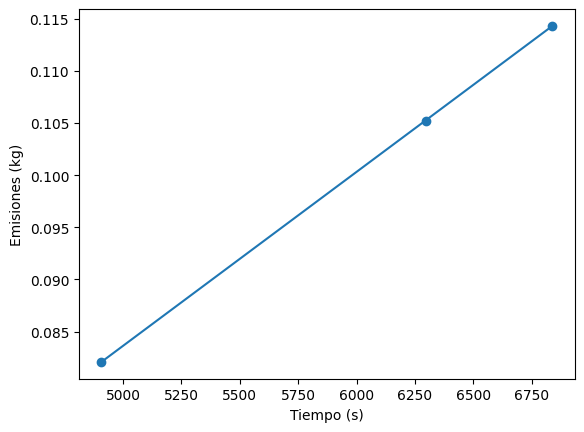

In [ ]:
# Cree una figura y un eje
fig, ax = plt.subplots()

# Dibuje un gráfico de las emisiones en función del tiempo
ax.plot(times, emissions_data, marker='o')

# Etiquete los ejes
ax.set_xlabel('Tiempo (s)')
ax.set_ylabel('Emisiones (kg)')

# Muestre el gráfico
plt.show()

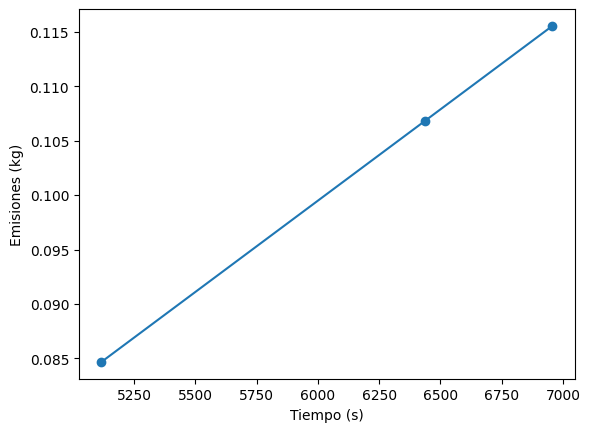

In [ ]:
# Cree una figura y un eje
fig, ax = plt.subplots()

# Dibuje un gráfico de las emisiones en función del tiempo
ax.plot(times, emissions_data, marker='o')

# Etiquete los ejes
ax.set_xlabel('Tiempo (s)')
ax.set_ylabel('Emisiones (kg)')

# Muestre el gráfico
plt.show()

As in video it is processing by frames, the output of the feature vectors can varied, this depend of the number per frame in each video and the architecture used for the feature extraction, something like this:

- This is for video:
Features shape for key dia314_utt4: (38, 256)

- This is the dimension of the text modality for one video:
Features shape for key dia113_utt1: (768,)


To affornt this, one possible solution is get the average for all the frames en each utterance video

In [ ]:
import numpy as np

#example
def aggregate_video_features(video_features):
    return np.mean(video_features, axis=0)

# Sample video features for one utterance with shape (38, 256)
sample_video_features = np.random.rand(38, 256)

# Aggregate the features
aggregated_features = aggregate_video_features(sample_video_features)

# Now, aggregated_features will have a shape of (256,)
print(sample_video_features.shape)
print(aggregated_features.shape)


(38, 256)
(256,)


In [ ]:
import pickle
import numpy as np
import os

def aggregate_video_features(input_file_path, output_file_path):
    """
    Reads the pkl file, aggregates the feature vectors in each utterance to a single vector,
    and saves the new features in a new pkl file.
    """
    # Load the original features
    with open(input_file_path, 'rb') as f:
        original_features = pickle.load(f)

    # Initialize a dictionary to store the aggregated features
    aggregated_features = {}

    # Loop through each utterance to aggregate features
    for key, value in original_features.items():
        if value is not None and value['features'] is not None:
            # Aggregate the feature vectors to a single feature vector (e.g., by taking the mean)
            aggregated_features[key] = {
                'features': np.mean(value['features'], axis=0),
                'label': value['label']
            }

    # Save the aggregated features
    with open(output_file_path, 'wb') as f:
        pickle.dump(aggregated_features, f)

    print(f"Aggregated features saved to {output_file_path}")


def aggregate_and_save_sets(sets_path):
    """
    Function to aggregate features for multiple sets and save them.
    """
    # Loop through each set and aggregate features
    for set_file in sets_path:
        output_file_path = os.path.join(os.path.dirname(set_file), f"aggregated_{os.path.basename(set_file)}")
        aggregate_video_features(set_file, output_file_path)
        # Check the dimensions of the aggregated features to confirm that they are in the desired format
        with open(output_file_path, 'rb') as f:
            aggregated_data = pickle.load(f)
        aggregated_dimensions = check_aggregated_dimensions(aggregated_data)
        print(f"Final dimensions for {output_file_path}: {aggregated_dimensions}")


def check_aggregated_dimensions(aggregated_data):
    """
    Check the dimensions of the aggregated features to confirm that they are in the desired format.
    """
    dimensions_dict = {}
    for key, value in aggregated_data.items():
        if value and 'features' in value:
            dimensions_dict[key] = value['features'].shape
    return dimensions_dict

# Define your sets_path here, paths to your original feature files
sets_path = [
    "/content/datasets/vision_features/train_video_features.pkl",
    "/content/datasets/vision_features/dev_video_features.pkl",
    "/content/datasets/vision_features/test_video_features.pkl"
]

# Call the function to aggregate and save sets
aggregate_and_save_sets(sets_path)

Aggregated features saved to /content/datasets/vision_features/aggregated_train_video_features.pkl
Final dimensions for /content/datasets/vision_features/aggregated_train_video_features.pkl: {'dia407_utt8': (256,), 'dia349_utt6': (256,), 'dia808_utt0': (256,), 'dia733_utt10': (256,), 'dia44_utt2': (256,), 'dia145_utt16': (256,), 'dia171_utt3': (256,), 'dia918_utt9': (256,), 'dia671_utt2': (256,), 'dia89_utt0': (256,), 'dia6_utt0': (256,), 'dia782_utt6': (256,), 'dia296_utt13': (256,), 'dia181_utt2': (256,), 'dia154_utt4': (256,), 'dia64_utt1': (256,), 'dia58_utt4': (256,), 'dia673_utt13': (256,), 'dia169_utt0': (256,), 'dia943_utt5': (256,), 'dia648_utt3': (256,), 'dia124_utt11': (256,), 'dia895_utt7': (256,), 'dia704_utt2': (256,), 'dia177_utt0': (256,), 'dia442_utt3': (256,), 'dia909_utt7': (256,), 'dia525_utt0': (256,), 'dia260_utt1': (256,), 'dia837_utt2': (256,), 'dia256_utt15': (256,), 'dia237_utt3': (256,), 'dia104_utt0': (256,), 'dia590_utt13': (256,), 'dia727_utt3': (256,), 'd

In [ ]:
def load_and_check_dimensions(file_path):
    with open(file_path, 'rb') as f:
        data = pickle.load(f)

    # Check dimensions for each utterance
    dimensions_dict = {}
    for key, value in data.items():
        if value is not None and value['features'] is not None:
            dimensions_dict[key] = value['features'].shape
        else:
            dimensions_dict[key] = 'None or Invalid Data'
    return dimensions_dict

# Check the dimensions for dev_video_features.pkl
dev_video_dimensions = load_and_check_dimensions('/content/datasets/vision_features/aggregated_train_video_features.pkl')
dev_video_dimensions

{'dia407_utt8': (256,),
 'dia349_utt6': (256,),
 'dia808_utt0': (256,),
 'dia733_utt10': (256,),
 'dia44_utt2': (256,),
 'dia145_utt16': (256,),
 'dia171_utt3': (256,),
 'dia918_utt9': (256,),
 'dia671_utt2': (256,),
 'dia89_utt0': (256,),
 'dia6_utt0': (256,),
 'dia782_utt6': (256,),
 'dia296_utt13': (256,),
 'dia181_utt2': (256,),
 'dia154_utt4': (256,),
 'dia64_utt1': (256,),
 'dia58_utt4': (256,),
 'dia673_utt13': (256,),
 'dia169_utt0': (256,),
 'dia943_utt5': (256,),
 'dia648_utt3': (256,),
 'dia124_utt11': (256,),
 'dia895_utt7': (256,),
 'dia704_utt2': (256,),
 'dia177_utt0': (256,),
 'dia442_utt3': (256,),
 'dia909_utt7': (256,),
 'dia525_utt0': (256,),
 'dia260_utt1': (256,),
 'dia837_utt2': (256,),
 'dia256_utt15': (256,),
 'dia237_utt3': (256,),
 'dia104_utt0': (256,),
 'dia590_utt13': (256,),
 'dia727_utt3': (256,),
 'dia782_utt1': (256,),
 'dia445_utt18': (256,),
 'dia872_utt0': (256,),
 'dia346_utt1': (256,),
 'dia190_utt2': (256,),
 'dia535_utt2': (256,),
 'dia1032_utt7

In [ ]:
# Function to correct the labels in the pickle files and save them back
def correct_and_save_labels_v2(file_path):
    # Load the data
    with open(file_path, 'rb') as f:
        data = pickle.load(f)

    # Initialize a dictionary to store the corrected data
    corrected_data = {}

    for key, value in data.items():
        # Convert the labels from object dtype to proper integer dtype
        labels_array = np.array(value['label'].tolist(), dtype=np.int32)

        corrected_data[key] = {
            'features': value['features'],
            'label': labels_array
        }

    # Save the corrected data back to the pickle file
    corrected_file_path = file_path.replace(".pkl", "_corrected.pkl")
    with open(corrected_file_path, 'wb') as f:
        pickle.dump(corrected_data, f)

    return corrected_file_path


files_to_correct = ["/content/datasets/vision_features/aggregated_train_video_features.pkl","/content/datasets/vision_features/aggregated_dev_video_features.pkl","/content/datasets/vision_features/aggregated_test_video_features.pkl"]
# Correct the labels in each pickle file and save the corrected file paths
corrected_files = [correct_and_save_labels_v2(file_path) for file_path in files_to_correct]



[codecarbon INFO @ 13:27:12] Energy consumed for RAM : 0.076850 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 13:27:12] Energy consumed for all GPUs : 0.181610 kWh. Total GPU Power : 29.13936748405212 W
[codecarbon INFO @ 13:27:13] Energy consumed for all CPUs : 0.170857 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 13:27:13] 0.429318 kWh of electricity used since the beginning.


In [ ]:
# Import necessary libraries for demonstration
from sklearn.metrics import average_precision_score, confusion_matrix, f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import numpy as np
import pickle

# Function to train and evaluate a simple classifier
def train_and_evaluate_classifier(features_path):
    with open(features_path, 'rb') as f:
        features = pickle.load(f)

    # Prepare data arrays
    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])

    # Split the dataset
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train a One-vs-Rest logistic regression classifier
    classifier = OneVsRestClassifier(LogisticRegression(max_iter=5000, random_state=42))
    classifier.fit(X_train, y_train)

    # Predictions
    y_pred = classifier.predict(X_val)
    y_pred_single = np.argmax(y_pred, axis=1)
    y_val_single = np.argmax(y_val, axis=1)

    # Evaluation metrics
    f1_macro = f1_score(y_val_single, y_pred_single, average='macro')

    return f1_macro

# Test the classifier on corrected files
corrected_files = [
    "/content/datasets/vision_features/aggregated_train_video_features_corrected.pkl",
    "/content/datasets/vision_features/aggregated_dev_video_features_corrected.pkl",
    "/content/datasets/vision_features/aggregated_test_video_features_corrected.pkl"
]

# Container to store F1 Macro scores for each set
f1_scores = {}

# Evaluate and collect metrics
for idx, set_file in enumerate(corrected_files):
    f1_macro = train_and_evaluate_classifier(set_file)
    set_name = f"Set {idx + 1}"
    f1_scores[set_name] = f1_macro

f1_scores


{'Set 1': 0.21329702745631948,
 'Set 2': 0.1923076923076923,
 'Set 3': 0.21176470588235294}

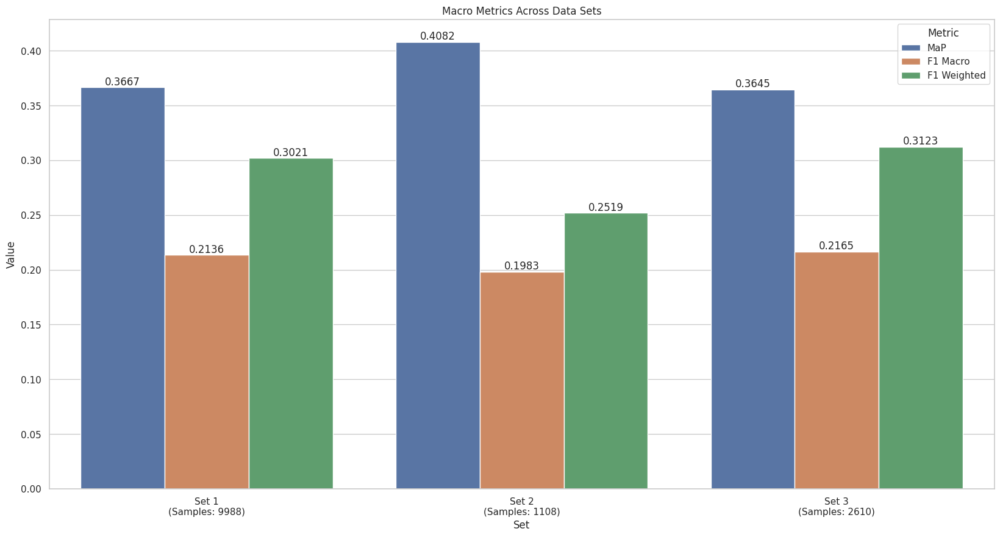

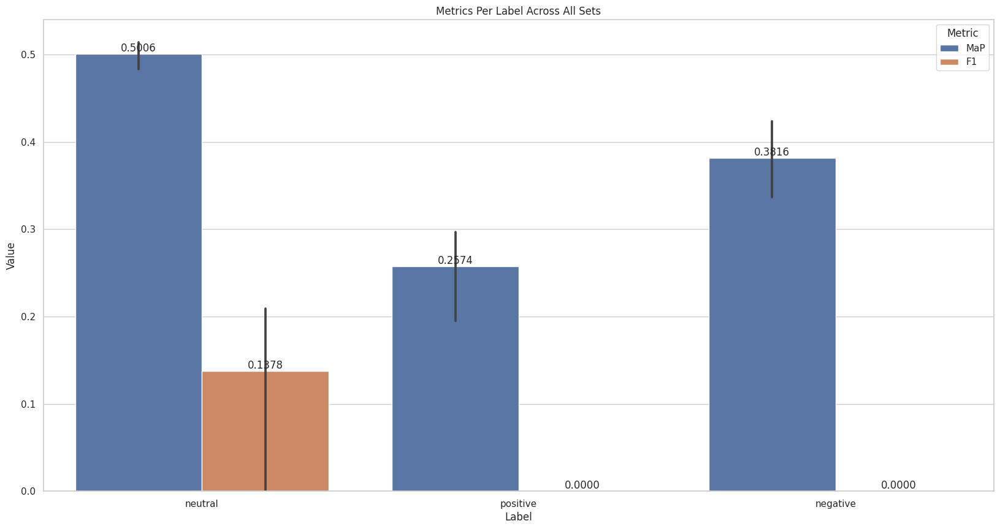

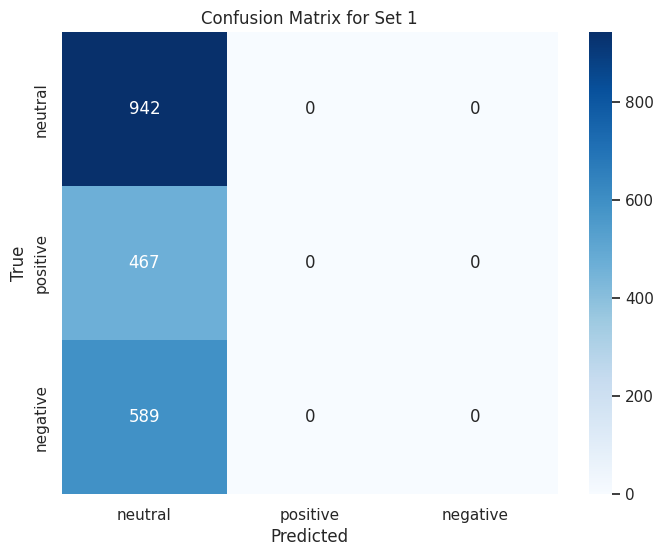

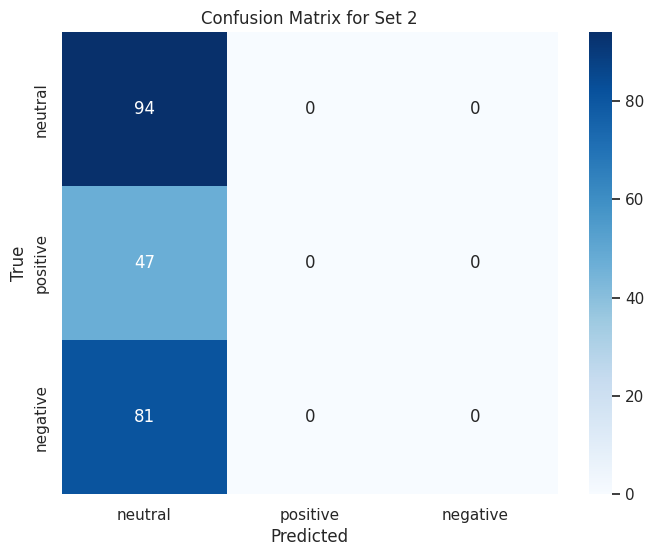

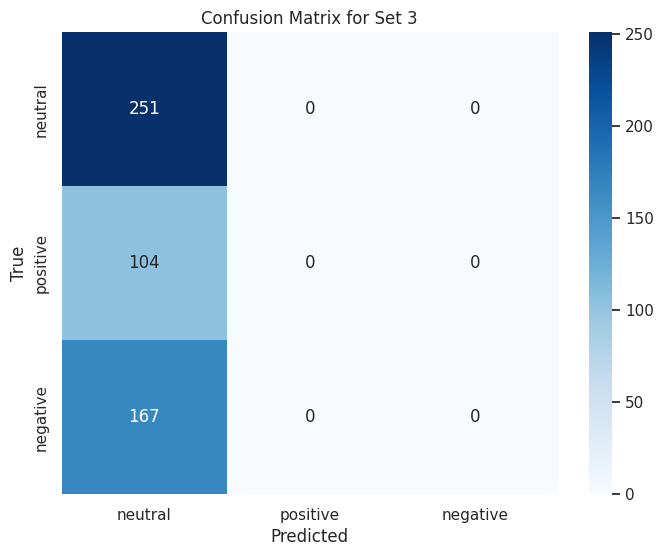

In [ ]:
from sklearn.metrics import average_precision_score, confusion_matrix, f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle

def train_and_evaluate_classifier(features_path, class_names, test_size=0.2, max_iter=5000, random_state=42):
    with open(features_path, 'rb') as f:
        features = pickle.load(f)
    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])

    # Removed the conversion of y to simple labels; using one-hot encoding as-is
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, stratify=np.argmax(y, axis=1), random_state=random_state)

    classifier = OneVsRestClassifier(LogisticRegression(max_iter=max_iter, random_state=random_state))
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_val)
    y_score = classifier.decision_function(X_val)
    y_pred_single = np.argmax(y_pred, axis=1)
    y_val_single = np.argmax(y_val, axis=1)
    cm = confusion_matrix(y_val_single, y_pred_single)
    map_val = average_precision_score(y_val, y_score, average='macro')
    f1_macro = f1_score(y_val_single, y_pred_single, average='macro')
    f1_weighted = f1_score(y_val_single, y_pred_single, average='weighted')
    map_per_label = average_precision_score(y_val, y_score, average=None)
    f1_per_label = f1_score(y_val, y_pred, average=None)
    return map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, len(X), cm

# Initialize containers
results_macro = []
results_per_label = []
confusion_matrices = {}
# Modified file paths to use corrected files
corrected_files = [
    "/content/datasets/vision_features/aggregated_train_video_features_corrected.pkl",
    "/content/datasets/vision_features/aggregated_dev_video_features_corrected.pkl",
    "/content/datasets/vision_features/aggregated_test_video_features_corrected.pkl"
]
class_names = ['neutral', 'positive', 'negative']

# Evaluate classifier and collect metrics
for idx, set_file in enumerate(corrected_files):
    map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, sample_count, cm = train_and_evaluate_classifier(set_file, class_names)
    set_name = f"Set {idx + 1}"
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'MaP',
        'Value': map_val
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Macro',
        'Value': f1_macro
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Weighted',
        'Value': f1_weighted
    })

    for label_idx, label_name in enumerate(class_names):
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'MaP',
            'Value': map_per_label[label_idx]
        })
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'F1',
            'Value': f1_per_label[label_idx]
        })

    confusion_matrices[set_name] = cm

# Plotting macro metrics
df_macro = pd.DataFrame(results_macro)
plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")
ax = sns.barplot(x='Set', y='Value', hue='Metric', data=df_macro)
plt.title('Macro Metrics Across Data Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

# Annotate with sample count and update x-axis labels
new_labels = []
for idx, label in enumerate(df_macro['Set'].unique()):
    sample_count = df_macro[df_macro['Set'] == label]['Sample Count'].iloc[0]
    new_labels.append(f"{label}\n(Samples: {sample_count})")
plt.xticks(ticks=range(len(new_labels)), labels=new_labels)

plt.show()

# Plotting per-label metrics
df_per_label = pd.DataFrame(results_per_label)
plt.figure(figsize=(20, 10))
ax = sns.barplot(x='Label', y='Value', hue='Metric', data=df_per_label)
plt.title('Metrics Per Label Across All Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

plt.show()

# Plot confusion matrices
for set_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for {set_name}')
    plt.show()

In [ ]:
import pickle
import numpy as np
from sklearn.model_selection import train_test_split
from lazypredict.Supervised import LazyClassifier

# Read the Pickles
def read_pickle_file(file_path):
    with open(file_path, 'rb') as f:
        features = pickle.load(f)
    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])
    y_single = np.argmax(y, axis=1)  # Convert Labels to single integers for multiclass classification
    return X, y_single

# Read train, dev, and test data
X_train, y_train = read_pickle_file("/content/datasets/vision_features/aggregated_train_video_features_corrected.pkl")
X_dev, y_dev = read_pickle_file("/content/datasets/vision_features/aggregated_dev_video_features_corrected.pkl")
X_test, y_test = read_pickle_file("/content/datasets/vision_features/aggregated_test_video_features_corrected.pkl")

# Concatenate train and dev sets
X_train_full = np.concatenate((X_train, X_dev), axis=0)
y_train_full = np.concatenate((y_train, y_dev), axis=0)

# Lazy Predict
clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
models, predictions = clf.fit(X_train_full, X_test, y_train_full, y_test)
print(models)


  0%|          | 0/29 [00:00<?, ?it/s][codecarbon INFO @ 14:05:43] Energy consumed for RAM : 0.089116 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 14:05:43] Energy consumed for all GPUs : 0.201866 kWh. Total GPU Power : 32.239271195141434 W
[codecarbon INFO @ 14:05:43] Energy consumed for all CPUs : 0.198124 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 14:05:43] 0.489106 kWh of electricity used since the beginning.
[codecarbon INFO @ 14:05:58] Energy consumed for RAM : 0.089195 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 14:05:58] Energy consumed for all GPUs : 0.202002 kWh. Total GPU Power : 32.591339018200536 W
[codecarbon INFO @ 14:05:58] Energy consumed for all CPUs : 0.198301 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 14:05:58] 0.489499 kWh of electricity used since the beginning.
  3%|▎         | 1/29 [00:20<09:38, 20.67s/it][codecarbon INFO @ 14:06:13] Energy consumed for RAM : 0.089275 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 14:0

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 65280
[LightGBM] [Info] Number of data points in the train set: 11096, number of used features: 256
[LightGBM] [Info] Start training from score -0.762166
[LightGBM] [Info] Start training from score -1.463847
[LightGBM] [Info] Start training from score -1.197326


100%|██████████| 29/29 [05:41<00:00, 11.77s/it]

                               Accuracy  Balanced Accuracy ROC AUC  F1 Score  \
Model                                                                          
GaussianNB                         0.36               0.36    None      0.35   
BernoulliNB                        0.44               0.35    None      0.39   
NearestCentroid                    0.32               0.35    None      0.32   
KNeighborsClassifier               0.39               0.35    None      0.38   
Perceptron                         0.38               0.35    None      0.38   
AdaBoostClassifier                 0.47               0.34    None      0.36   
DecisionTreeClassifier             0.38               0.34    None      0.38   
QuadraticDiscriminantAnalysis      0.38               0.34    None      0.37   
ExtraTreeClassifier                0.37               0.34    None      0.38   
PassiveAggressiveClassifier        0.37               0.34    None      0.38   
RidgeClassifierCV                  0.46 

In [ ]:
import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(12 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(models, *['F1 Score'], **{})
chart

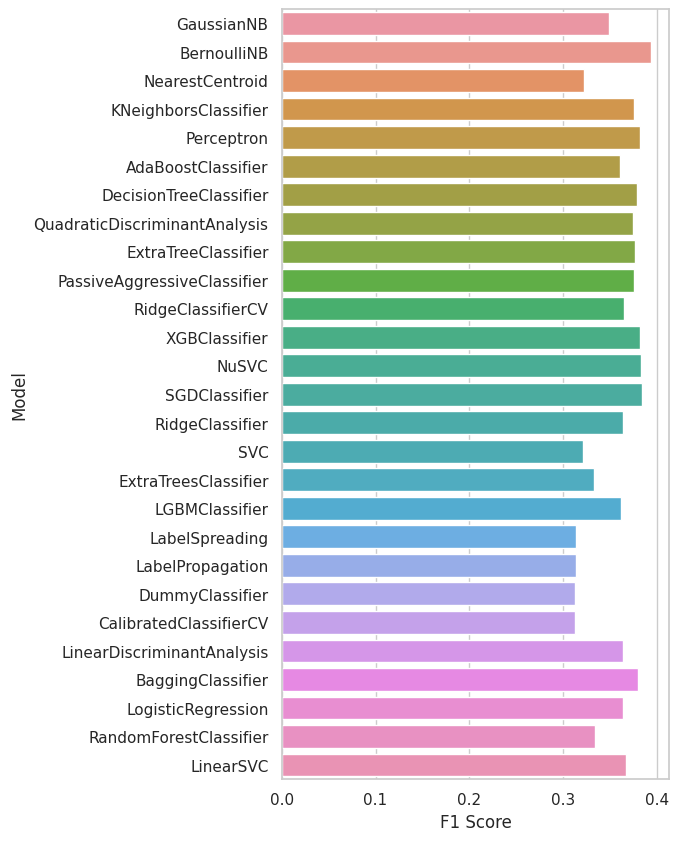

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(5, 10))
sns.set_theme(style="whitegrid")
ax = sns.barplot(y=models.index, x="F1 Score", data=models)

## Version2

In [ ]:
import os
import time
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18
import cv2
from tqdm import tqdm
import pandas as pd
import pickle
from codecarbon import EmissionsTracker

class AttentionLayer(nn.Module):
    def __init__(self, input_dim):
        super(AttentionLayer, self).__init__()
        self.fc = nn.Linear(input_dim, 1)

    def forward(self, x):
        weights = F.softmax(self.fc(x), dim=0)
        print("Shape of weights:", weights.shape)
        weighted_sum = torch.sum(weights * x, dim=0)
        print("Shape of weighted_sum:", weighted_sum.shape)
        return weighted_sum

class VisionFeatureExtractor:
    def __init__(self, classification_type="Sentiment"):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = resnet18(pretrained=True).to(self.device)
        self.model = nn.Sequential(*(list(self.model.children())[:-1]))  # Removing the classification layer
        self.attention_layer = AttentionLayer(input_dim=512).to(self.device)  # Attention layer
        self.classification_type = classification_type

    def mapping_labels(self, df):
        mapping = {
            'Emotion': {
                'neutral': [1, 0, 0, 0, 0, 0, 0],
                'surprise': [0, 1, 0, 0, 0, 0, 0],
                'fear': [0, 0, 1, 0, 0, 0, 0],
                'sadness': [0, 0, 0, 1, 0, 0, 0],
                'joy': [0, 0, 0, 0, 1, 0, 0],
                'disgust': [0, 0, 0, 0, 0, 1, 0],
                'anger': [0, 0, 0, 0, 0, 0, 1],
            },
            'Sentiment': {
                'neutral': [1, 0, 0],
                'positive': [0, 1, 0],
                'negative': [0, 0, 1]
            }
        }
        label_column = f"{self.classification_type}_encoded"
        df[label_column] = df[self.classification_type].map(mapping[self.classification_type])
        return df

    def extract_and_save_features(self, video_folder_path, video_path_csv, set_name):
        df = pd.read_csv(video_path_csv)
        df['video_id'] = "dia" + df['Dialogue_ID'].astype(str) + '_utt' + df['Utterance_ID'].astype(str) + '.mp4'
        df = self.mapping_labels(df)

        video_feature_dict = {}
        video_files_to_process = [file for file in os.listdir(video_folder_path) if file in set(df['video_id'])]

        for video_file in tqdm(video_files_to_process):
            video_path = os.path.join(video_folder_path, video_file)
            video_features = self.extract_features_from_video(video_path)

            if video_features is not None:
                label = np.squeeze(df[df['video_id'] == video_file][f"{self.classification_type}_encoded"].values)
                if label is None:
                    print(f"Skipping {video_file} due to None label.")
                    continue
                video_feature_dict[video_file.split('.')[0]] = {'features': video_features, 'label': label}

            torch.cuda.empty_cache()

        os.makedirs('./vision_features', exist_ok=True)
        with open(f'./vision_features/{set_name}_video_features.pkl', 'wb') as f:
            pickle.dump(video_feature_dict, f)

    def extract_features_from_video(self, video_path):
        cap = cv2.VideoCapture(video_path)
        frames = []
        all_features = []

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.resize(frame, (224, 224))
            frames.append(frame)

        if len(frames) == 0:
            print(f"No frames extracted from {video_path}. Skipping.")
            return None

        cap.release()

        for frame in frames:
            frame_tensor = torch.tensor(np.array(frame)).float().unsqueeze(0).permute(0, 3, 1, 2).to(self.device)
            with torch.no_grad():
                features = self.model(frame_tensor).squeeze(-1).squeeze(-1)  # [1, 512]
            all_features.append(features)

        # Convert to tensor and apply attention mechanism
        all_features_tensor = torch.stack(all_features).squeeze(1)  # Stack to make a [num_frames, 512] tensor
        print("Shape of all_features_tensor:", all_features_tensor.shape)

        aggregated_features = self.attention_layer(all_features_tensor).cpu().detach().numpy()  # Detach and convert to numpy

        return aggregated_features




if __name__ == "__main__":
    print("🚀 Initializing Vision Feature Extraction for Sentiment Classification... 🚀")
    times = []
    emissions_data = []

    feature_extractor = VisionFeatureExtractor(classification_type="Sentiment")

    # Example dataset paths; Replace with actual paths
    dataset_paths = {
        'Train': ('/content/datasets/MELD/train_splits', '/content/datasets/MELD/train_sent_emo.csv'),
        'Test': ('/content/datasets/MELD/output_repeated_splits_test', '/content/datasets/MELD/test_sent_emo.csv'),
        'Dev': ('/content/datasets/MELD/dev_splits_complete', '/content/datasets/MELD/dev_sent_emo.csv')
    }

    for set_name, (video_folder, csv_path) in dataset_paths.items():
        tracker = EmissionsTracker(project_name=f"{set_name}_video_feature_extraction")
        start_time = time.time()
        tracker.start()

        feature_extractor.extract_and_save_features(video_folder, csv_path, set_name)

        current_time = time.time() - start_time
        total_emissions = tracker.stop()
        times.append(current_time)
        emissions_data.append(total_emissions)

        print(f"🔍 Total Emissions for {set_name}: {total_emissions} kg")
        print(f"⌛ Feature Extraction for {set_name} completed in {current_time:.2f} seconds ⌛")
        tracker.stop()



🚀 Initializing Vision Feature Extraction for Sentiment Classification... 🚀


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 236MB/s]
[codecarbon INFO @ 02:48:19] [setup] RAM Tracking...
[codecarbon INFO @ 02:48:19] [setup] GPU Tracking...
[codecarbon INFO @ 02:48:19] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 02:48:1

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 2/9989 [00:07<9:01:42,  3.25s/it] 

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 3/9989 [00:08<5:23:10,  1.94s/it]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 5/9989 [00:08<2:24:38,  1.15it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 6/9989 [00:08<1:47:23,  1.55it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 8/9989 [00:10<1:39:06,  1.68it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 9/9989 [00:10<1:37:38,  1.70it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 10/9989 [00:11<1:57:44,  1.41it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 11/9989 [00:12<1:45:29,  1.58it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 12/9989 [00:12<1:32:03,  1.81it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 14/9989 [00:13<1:38:03,  1.70it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 15/9989 [00:14<1:29:48,  1.85it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 16/9989 [00:14<1:17:39,  2.14it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 17/9989 [00:15<1:34:57,  1.75it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 18/9989 [00:15<1:21:17,  2.04it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 19/9989 [00:15<1:08:44,  2.42it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 20/9989 [00:15<1:02:36,  2.65it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 21/9989 [00:16<1:02:15,  2.67it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 22/9989 [00:17<1:31:16,  1.82it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 23/9989 [00:17<1:29:18,  1.86it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 24/9989 [00:18<1:37:40,  1.70it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 25/9989 [00:18<1:20:18,  2.07it/s][codecarbon INFO @ 02:48:51] Energy consumed for RAM : 0.000159 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:48:51] Energy consumed for all GPUs : 0.000306 kWh. Total GPU Power : 46.24547564402357 W
[codecarbon INFO @ 02:48:51] Energy consumed for all CPUs : 0.000354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:48:51] 0.000820 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 26/9989 [00:19<1:35:03,  1.75it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 28/9989 [00:19<1:03:09,  2.63it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 29/9989 [00:20<1:01:24,  2.70it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 30/9989 [00:20<1:00:14,  2.76it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 31/9989 [00:20<58:21,  2.84it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 32/9989 [00:21<1:15:10,  2.21it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 33/9989 [00:22<1:19:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 34/9989 [00:22<1:06:12,  2.51it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 35/9989 [00:22<1:11:17,  2.33it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 37/9989 [00:23<51:09,  3.24it/s]  

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 38/9989 [00:24<1:16:23,  2.17it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 39/9989 [00:24<1:05:31,  2.53it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 40/9989 [00:24<1:10:50,  2.34it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 41/9989 [00:25<1:29:51,  1.85it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 43/9989 [00:26<1:23:41,  1.98it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 44/9989 [00:27<1:23:27,  1.99it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 45/9989 [00:27<1:17:05,  2.15it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 46/9989 [00:28<1:49:26,  1.51it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 47/9989 [00:29<2:07:57,  1.29it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 48/9989 [00:30<1:41:39,  1.63it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 49/9989 [00:30<1:38:54,  1.67it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 50/9989 [00:31<1:47:12,  1.55it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 52/9989 [00:31<1:04:36,  2.56it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 53/9989 [00:32<1:05:28,  2.53it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 55/9989 [00:32<59:53,  2.76it/s]  

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 56/9989 [00:33<1:04:20,  2.57it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 57/9989 [00:33<1:12:01,  2.30it/s][codecarbon INFO @ 02:49:06] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:49:06] Energy consumed for all GPUs : 0.000534 kWh. Total GPU Power : 54.54619717747203 W
[codecarbon INFO @ 02:49:06] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:49:06] 0.001304 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 58/9989 [00:34<1:24:44,  1.95it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 60/9989 [00:34<56:29,  2.93it/s]  

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 62/9989 [00:35<41:56,  3.95it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 64/9989 [00:36<1:06:52,  2.47it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 65/9989 [00:36<55:45,  2.97it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 66/9989 [00:36<49:22,  3.35it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 67/9989 [00:37<53:58,  3.06it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 68/9989 [00:37<49:38,  3.33it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 69/9989 [00:37<57:38,  2.87it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 70/9989 [00:38<1:06:38,  2.48it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 71/9989 [00:39<1:17:35,  2.13it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 72/9989 [00:39<1:07:23,  2.45it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 73/9989 [00:39<1:10:17,  2.35it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 74/9989 [00:40<1:12:07,  2.29it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 75/9989 [00:40<1:09:30,  2.38it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 76/9989 [00:41<1:44:01,  1.59it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 77/9989 [00:42<1:48:27,  1.52it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 79/9989 [00:43<1:15:50,  2.18it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 81/9989 [00:43<1:08:24,  2.41it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 82/9989 [00:44<1:08:13,  2.42it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 83/9989 [00:45<1:23:47,  1.97it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 84/9989 [00:45<1:09:04,  2.39it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 85/9989 [00:45<1:04:46,  2.55it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 86/9989 [00:46<1:23:29,  1.98it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 87/9989 [00:46<1:12:29,  2.28it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 88/9989 [00:47<1:09:58,  2.36it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 89/9989 [00:47<1:09:05,  2.39it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 90/9989 [00:47<1:00:41,  2.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 91/9989 [00:48<1:20:06,  2.06it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 92/9989 [00:48<1:14:01,  2.23it/s][codecarbon INFO @ 02:49:21] Energy consumed for RAM : 0.000319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:49:21] Energy consumed for all GPUs : 0.000762 kWh. Total GPU Power : 54.727712335966174 W
[codecarbon INFO @ 02:49:21] Energy consumed for all CPUs : 0.000708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:49:21] 0.001789 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 94/9989 [00:49<52:08,  3.16it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 96/9989 [00:49<40:55,  4.03it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 98/9989 [00:50<42:56,  3.84it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 100/9989 [00:50<35:36,  4.63it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 101/9989 [00:51<47:37,  3.46it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 102/9989 [00:51<54:55,  3.00it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 104/9989 [00:52<1:01:08,  2.69it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 106/9989 [00:52<50:33,  3.26it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 107/9989 [00:53<51:39,  3.19it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 108/9989 [00:53<50:06,  3.29it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 110/9989 [00:54<1:05:58,  2.50it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 111/9989 [00:54<1:02:43,  2.62it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 113/9989 [00:55<48:59,  3.36it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 114/9989 [00:56<1:32:08,  1.79it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 115/9989 [00:56<1:15:54,  2.17it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 116/9989 [00:57<1:05:21,  2.52it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 117/9989 [00:57<57:11,  2.88it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 118/9989 [00:57<53:48,  3.06it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 119/9989 [00:58<1:30:16,  1.82it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 120/9989 [00:59<1:20:06,  2.05it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 121/9989 [00:59<1:08:47,  2.39it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 122/9989 [00:59<1:01:38,  2.67it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 123/9989 [01:00<1:27:01,  1.89it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 125/9989 [01:01<1:14:04,  2.22it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 126/9989 [01:01<1:13:41,  2.23it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 127/9989 [01:01<1:04:29,  2.55it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 128/9989 [01:03<1:36:21,  1.71it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 129/9989 [01:03<1:28:12,  1.86it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 130/9989 [01:03<1:20:17,  2.05it/s][codecarbon INFO @ 02:49:36] Energy consumed for RAM : 0.000398 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:49:36] Energy consumed for all GPUs : 0.000991 kWh. Total GPU Power : 55.10760160469733 W
[codecarbon INFO @ 02:49:36] Energy consumed for all CPUs : 0.000885 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:49:36] 0.002275 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 131/9989 [01:05<2:03:38,  1.33it/s]

Shape of all_features_tensor: torch.Size([247, 512])
Shape of weights: torch.Size([247, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 132/9989 [01:05<1:40:47,  1.63it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 133/9989 [01:05<1:34:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 134/9989 [01:06<1:26:01,  1.91it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 135/9989 [01:06<1:17:52,  2.11it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 137/9989 [01:07<57:00,  2.88it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 138/9989 [01:07<57:26,  2.86it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 139/9989 [01:07<59:25,  2.76it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 140/9989 [01:08<1:23:58,  1.95it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 142/9989 [01:09<1:09:45,  2.35it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 143/9989 [01:10<1:28:56,  1.85it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 144/9989 [01:10<1:14:39,  2.20it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 145/9989 [01:10<1:03:06,  2.60it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 146/9989 [01:11<58:15,  2.82it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 147/9989 [01:11<58:17,  2.81it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 148/9989 [01:12<1:09:08,  2.37it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 149/9989 [01:12<1:07:23,  2.43it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 150/9989 [01:12<1:03:16,  2.59it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 151/9989 [01:13<1:11:16,  2.30it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 152/9989 [01:14<1:26:43,  1.89it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 153/9989 [01:14<1:16:32,  2.14it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 154/9989 [01:14<1:16:22,  2.15it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 155/9989 [01:15<1:18:07,  2.10it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 156/9989 [01:15<1:18:11,  2.10it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 157/9989 [01:16<1:40:37,  1.63it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 158/9989 [01:17<1:29:42,  1.83it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 160/9989 [01:17<1:04:06,  2.56it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 161/9989 [01:18<1:36:48,  1.69it/s][codecarbon INFO @ 02:49:51] Energy consumed for RAM : 0.000478 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:49:51] Energy consumed for all GPUs : 0.001227 kWh. Total GPU Power : 56.586494081670196 W
[codecarbon INFO @ 02:49:51] Energy consumed for all CPUs : 0.001062 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:49:51] 0.002767 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 162/9989 [01:19<2:01:48,  1.34it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 163/9989 [01:20<1:37:42,  1.68it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 164/9989 [01:20<1:33:26,  1.75it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 165/9989 [01:21<2:09:00,  1.27it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 166/9989 [01:22<1:46:51,  1.53it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 167/9989 [01:22<1:36:50,  1.69it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 169/9989 [01:23<1:04:45,  2.53it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 170/9989 [01:23<1:12:05,  2.27it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 171/9989 [01:24<1:17:04,  2.12it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 173/9989 [01:24<1:08:21,  2.39it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 174/9989 [01:25<58:00,  2.82it/s]  

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 175/9989 [01:25<1:03:57,  2.56it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 176/9989 [01:26<1:09:19,  2.36it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 178/9989 [01:26<1:00:13,  2.72it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 179/9989 [01:27<1:08:46,  2.38it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 180/9989 [01:27<1:04:37,  2.53it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 182/9989 [01:28<51:48,  3.15it/s]  

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 183/9989 [01:28<51:57,  3.15it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 184/9989 [01:28<53:05,  3.08it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 185/9989 [01:29<56:35,  2.89it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 186/9989 [01:30<1:21:23,  2.01it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 187/9989 [01:30<1:26:53,  1.88it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 188/9989 [01:31<1:20:38,  2.03it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 189/9989 [01:31<1:19:53,  2.04it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 191/9989 [01:32<1:01:23,  2.66it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 192/9989 [01:32<1:03:18,  2.58it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:50:06] Energy consumed for RAM : 0.000558 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:50:06] Energy consumed for all GPUs : 0.001464 kWh. Total GPU Power : 57.0547093164644 W
[codecarbon INFO @ 02:50:06] Energy consumed for all CPUs : 0.001240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:50:06] 0.003261 kWh of electricity used since the beginning.
  2%|▏         | 193/9989 [01:33<1:45:19,  1.55it/s]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 195/9989 [01:34<1:31:11,  1.79it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 196/9989 [01:35<1:12:32,  2.25it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 197/9989 [01:35<1:16:59,  2.12it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 198/9989 [01:36<1:23:42,  1.95it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 199/9989 [01:36<1:15:30,  2.16it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 200/9989 [01:37<1:18:50,  2.07it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 201/9989 [01:37<1:23:34,  1.95it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 202/9989 [01:38<1:22:05,  1.99it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 204/9989 [01:38<53:42,  3.04it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 205/9989 [01:38<52:32,  3.10it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 206/9989 [01:39<1:15:43,  2.15it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 207/9989 [01:40<1:17:04,  2.12it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 208/9989 [01:41<1:35:45,  1.70it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 209/9989 [01:41<1:23:14,  1.96it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 210/9989 [01:41<1:19:21,  2.05it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 211/9989 [01:42<1:07:05,  2.43it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 213/9989 [01:42<54:35,  2.98it/s]  

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 214/9989 [01:42<52:49,  3.08it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 215/9989 [01:43<47:44,  3.41it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 216/9989 [01:43<49:03,  3.32it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 217/9989 [01:43<49:18,  3.30it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 219/9989 [01:44<40:14,  4.05it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 221/9989 [01:44<31:34,  5.16it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 222/9989 [01:45<49:55,  3.26it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 224/9989 [01:45<56:51,  2.86it/s]  

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 225/9989 [01:46<1:00:39,  2.68it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 226/9989 [01:46<1:12:05,  2.26it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 227/9989 [01:47<1:18:29,  2.07it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 228/9989 [01:48<1:51:34,  1.46it/s][codecarbon INFO @ 02:50:21] Energy consumed for RAM : 0.000637 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:50:21] Energy consumed for all GPUs : 0.001701 kWh. Total GPU Power : 56.834686701592645 W
[codecarbon INFO @ 02:50:21] Energy consumed for all CPUs : 0.001417 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:50:21] 0.003755 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 229/9989 [01:49<1:39:11,  1.64it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 230/9989 [01:49<1:26:25,  1.88it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 231/9989 [01:50<1:42:12,  1.59it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 232/9989 [01:51<1:50:47,  1.47it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 233/9989 [01:52<2:09:19,  1.26it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 234/9989 [01:52<1:44:20,  1.56it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 235/9989 [01:52<1:24:28,  1.92it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 236/9989 [01:52<1:10:33,  2.30it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 237/9989 [01:53<1:35:55,  1.69it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 238/9989 [01:54<1:55:17,  1.41it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 239/9989 [01:55<1:39:36,  1.63it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 242/9989 [01:56<1:23:12,  1.95it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 243/9989 [01:57<1:18:34,  2.07it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 245/9989 [01:57<54:05,  3.00it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 246/9989 [01:57<51:43,  3.14it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 247/9989 [01:58<52:48,  3.07it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 248/9989 [01:58<54:12,  3.00it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 249/9989 [01:58<51:57,  3.12it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 250/9989 [01:58<47:39,  3.41it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 251/9989 [01:59<1:14:57,  2.17it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 252/9989 [02:00<1:11:11,  2.28it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 254/9989 [02:01<1:13:59,  2.19it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 255/9989 [02:01<1:22:02,  1.98it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 256/9989 [02:02<1:12:40,  2.23it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 257/9989 [02:02<1:15:32,  2.15it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 259/9989 [02:03<59:16,  2.74it/s]  

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 260/9989 [02:03<58:55,  2.75it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:50:36] Energy consumed for RAM : 0.000717 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:50:36] Energy consumed for all GPUs : 0.001941 kWh. Total GPU Power : 57.65160229776655 W
[codecarbon INFO @ 02:50:36] Energy consumed for all CPUs : 0.001594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:50:36] 0.004251 kWh of electricity used since the beginning.
  3%|▎         | 261/9989 [02:05<1:52:02,  1.45it/s]

Shape of all_features_tensor: torch.Size([260, 512])
Shape of weights: torch.Size([260, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 262/9989 [02:05<1:30:51,  1.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 263/9989 [02:05<1:18:54,  2.05it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 264/9989 [02:06<1:14:12,  2.18it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 266/9989 [02:06<56:57,  2.84it/s]  

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 267/9989 [02:07<1:19:10,  2.05it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 268/9989 [02:07<1:10:02,  2.31it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 269/9989 [02:08<1:20:57,  2.00it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 270/9989 [02:08<1:13:18,  2.21it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 272/9989 [02:09<58:43,  2.76it/s]  

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 273/9989 [02:09<52:57,  3.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 274/9989 [02:10<1:03:19,  2.56it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 276/9989 [02:10<51:29,  3.14it/s]  

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 277/9989 [02:11<1:31:12,  1.77it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 278/9989 [02:11<1:15:16,  2.15it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 279/9989 [02:12<1:18:21,  2.07it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 280/9989 [02:13<1:21:56,  1.97it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 281/9989 [02:13<1:07:58,  2.38it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 282/9989 [02:13<1:13:14,  2.21it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 283/9989 [02:14<1:08:38,  2.36it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 284/9989 [02:14<1:13:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 285/9989 [02:14<1:03:21,  2.55it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 287/9989 [02:15<49:22,  3.27it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 288/9989 [02:16<1:21:12,  1.99it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 289/9989 [02:16<1:18:24,  2.06it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 290/9989 [02:17<1:28:00,  1.84it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 291/9989 [02:18<2:05:24,  1.29it/s][codecarbon INFO @ 02:50:51] Energy consumed for RAM : 0.000796 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:50:51] Energy consumed for all GPUs : 0.002184 kWh. Total GPU Power : 58.22956456088067 W
[codecarbon INFO @ 02:50:51] Energy consumed for all CPUs : 0.001771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:50:51] 0.004751 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 292/9989 [02:19<1:56:25,  1.39it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 293/9989 [02:19<1:37:25,  1.66it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 294/9989 [02:20<1:31:44,  1.76it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 296/9989 [02:20<1:02:34,  2.58it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 297/9989 [02:21<1:32:52,  1.74it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 298/9989 [02:21<1:14:54,  2.16it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 299/9989 [02:23<1:59:47,  1.35it/s]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])


  3%|▎         | 300/9989 [02:23<1:33:33,  1.73it/s]

Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 302/9989 [02:24<1:13:44,  2.19it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 303/9989 [02:24<1:06:23,  2.43it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 304/9989 [02:24<1:06:19,  2.43it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 305/9989 [02:25<1:15:20,  2.14it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 306/9989 [02:25<1:06:46,  2.42it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 307/9989 [02:26<1:01:50,  2.61it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 308/9989 [02:26<1:20:07,  2.01it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 309/9989 [02:27<1:37:30,  1.65it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 311/9989 [02:28<1:08:46,  2.35it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 312/9989 [02:29<1:25:52,  1.88it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 313/9989 [02:29<1:33:46,  1.72it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 315/9989 [02:30<1:01:49,  2.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 316/9989 [02:30<55:25,  2.91it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 317/9989 [02:30<1:03:38,  2.53it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 318/9989 [02:31<1:33:21,  1.73it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 319/9989 [02:32<1:20:37,  2.00it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 320/9989 [02:32<1:09:46,  2.31it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 321/9989 [02:33<1:36:43,  1.67it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:51:06] Energy consumed for RAM : 0.000876 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:51:06] Energy consumed for all GPUs : 0.002429 kWh. Total GPU Power : 58.912230267874506 W
[codecarbon INFO @ 02:51:06] Energy consumed for all CPUs : 0.001948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:51:06] 0.005253 kWh of electricity used since the beginning.
  3%|▎         | 322/9989 [02:34<1:41:47,  1.58it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 324/9989 [02:34<1:11:26,  2.25it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 325/9989 [02:35<1:01:25,  2.62it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 326/9989 [02:36<1:40:58,  1.59it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 328/9989 [02:36<1:13:55,  2.18it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 329/9989 [02:37<57:47,  2.79it/s]  

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 331/9989 [02:38<1:09:40,  2.31it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 333/9989 [02:38<49:59,  3.22it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 334/9989 [02:39<1:00:53,  2.64it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 335/9989 [02:39<54:24,  2.96it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 336/9989 [02:40<1:22:16,  1.96it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 337/9989 [02:41<1:45:18,  1.53it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 338/9989 [02:41<1:33:21,  1.72it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 339/9989 [02:41<1:16:36,  2.10it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 340/9989 [02:42<1:21:28,  1.97it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 341/9989 [02:42<1:15:31,  2.13it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 342/9989 [02:43<1:12:44,  2.21it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 344/9989 [02:43<52:57,  3.03it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 346/9989 [02:44<1:01:56,  2.59it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 347/9989 [02:45<1:11:41,  2.24it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 348/9989 [02:45<1:11:01,  2.26it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 350/9989 [02:46<51:47,  3.10it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 351/9989 [02:46<52:42,  3.05it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 352/9989 [02:47<1:09:45,  2.30it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 353/9989 [02:47<1:03:06,  2.54it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 354/9989 [02:47<56:11,  2.86it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 355/9989 [02:48<57:37,  2.79it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 356/9989 [02:48<50:43,  3.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 357/9989 [02:48<57:41,  2.78it/s][codecarbon INFO @ 02:51:21] Energy consumed for RAM : 0.000956 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:51:21] Energy consumed for all GPUs : 0.002676 kWh. Total GPU Power : 59.354406489175474 W
[codecarbon INFO @ 02:51:21] Energy consumed for all CPUs : 0.002125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:51:21] 0.005757 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 359/9989 [02:49<59:09,  2.71it/s]  

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 361/9989 [02:50<50:12,  3.20it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 362/9989 [02:50<41:39,  3.85it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 363/9989 [02:50<54:45,  2.93it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 364/9989 [02:51<48:53,  3.28it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 366/9989 [02:51<42:38,  3.76it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 367/9989 [02:51<37:05,  4.32it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 368/9989 [02:51<38:30,  4.16it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 369/9989 [02:52<40:30,  3.96it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 370/9989 [02:52<39:51,  4.02it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 371/9989 [02:52<48:29,  3.31it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 372/9989 [02:53<55:19,  2.90it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 373/9989 [02:54<1:45:47,  1.52it/s]

Shape of all_features_tensor: torch.Size([217, 512])
Shape of weights: torch.Size([217, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 375/9989 [02:55<1:18:09,  2.05it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 376/9989 [02:55<1:07:03,  2.39it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 377/9989 [02:56<1:05:14,  2.46it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 379/9989 [02:56<47:54,  3.34it/s]  

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 380/9989 [02:56<52:09,  3.07it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 382/9989 [02:57<49:19,  3.25it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 384/9989 [02:58<51:10,  3.13it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 385/9989 [02:58<58:14,  2.75it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 387/9989 [02:59<52:51,  3.03it/s]  

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 388/9989 [02:59<55:58,  2.86it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 389/9989 [03:00<51:03,  3.13it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 390/9989 [03:00<1:08:59,  2.32it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 391/9989 [03:01<1:10:36,  2.27it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 393/9989 [03:02<1:09:23,  2.30it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 395/9989 [03:02<48:17,  3.31it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 396/9989 [03:02<48:14,  3.31it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 397/9989 [03:03<1:10:25,  2.27it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 398/9989 [03:03<1:01:19,  2.61it/s][codecarbon INFO @ 02:51:36] Energy consumed for RAM : 0.001035 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:51:36] Energy consumed for all GPUs : 0.002923 kWh. Total GPU Power : 59.34460475505417 W
[codecarbon INFO @ 02:51:36] Energy consumed for all CPUs : 0.002302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:51:36] 0.006260 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 399/9989 [03:04<1:01:37,  2.59it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 400/9989 [03:04<1:11:38,  2.23it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 401/9989 [03:05<1:10:44,  2.26it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 402/9989 [03:05<1:02:29,  2.56it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 404/9989 [03:05<45:29,  3.51it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 405/9989 [03:06<1:18:20,  2.04it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 406/9989 [03:08<1:50:04,  1.45it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 407/9989 [03:08<1:29:36,  1.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 408/9989 [03:08<1:16:33,  2.09it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 409/9989 [03:09<1:22:57,  1.92it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 410/9989 [03:10<1:49:28,  1.46it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 411/9989 [03:10<1:38:39,  1.62it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 412/9989 [03:11<1:24:12,  1.90it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 413/9989 [03:11<1:21:30,  1.96it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 414/9989 [03:11<1:08:35,  2.33it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 415/9989 [03:12<1:01:01,  2.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 416/9989 [03:13<1:59:03,  1.34it/s]

Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 417/9989 [03:14<2:09:02,  1.24it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 418/9989 [03:14<1:42:26,  1.56it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 419/9989 [03:15<1:22:37,  1.93it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 421/9989 [03:15<59:03,  2.70it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 422/9989 [03:15<55:08,  2.89it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 423/9989 [03:16<56:55,  2.80it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 424/9989 [03:16<50:05,  3.18it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 425/9989 [03:16<50:14,  3.17it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 426/9989 [03:17<46:42,  3.41it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 427/9989 [03:18<1:52:33,  1.42it/s][codecarbon INFO @ 02:51:51] Energy consumed for RAM : 0.001115 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:51:51] Energy consumed for all GPUs : 0.003173 kWh. Total GPU Power : 59.86592629507251 W
[codecarbon INFO @ 02:51:51] Energy consumed for all CPUs : 0.002479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:51:51] 0.006766 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([304, 512])
Shape of weights: torch.Size([304, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 429/9989 [03:19<1:12:03,  2.21it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 430/9989 [03:19<1:04:05,  2.49it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 431/9989 [03:19<59:57,  2.66it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 432/9989 [03:19<54:39,  2.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 433/9989 [03:20<1:02:39,  2.54it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 434/9989 [03:21<1:16:16,  2.09it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 435/9989 [03:21<1:12:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 436/9989 [03:21<1:01:07,  2.60it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 437/9989 [03:22<1:01:07,  2.60it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 438/9989 [03:22<1:08:27,  2.33it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 439/9989 [03:23<1:02:24,  2.55it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 441/9989 [03:23<56:57,  2.79it/s]  

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 442/9989 [03:23<48:46,  3.26it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 443/9989 [03:24<43:47,  3.63it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 444/9989 [03:24<55:41,  2.86it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 446/9989 [03:25<48:07,  3.31it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 447/9989 [03:26<1:11:58,  2.21it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 449/9989 [03:26<56:38,  2.81it/s]  

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 450/9989 [03:27<1:31:33,  1.74it/s]

Shape of all_features_tensor: torch.Size([239, 512])
Shape of weights: torch.Size([239, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 451/9989 [03:28<1:30:32,  1.76it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 452/9989 [03:29<1:49:32,  1.45it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 453/9989 [03:30<1:45:08,  1.51it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 454/9989 [03:30<1:34:24,  1.68it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 455/9989 [03:30<1:28:07,  1.80it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])


  5%|▍         | 456/9989 [03:31<1:11:58,  2.21it/s]

Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 457/9989 [03:31<1:05:30,  2.42it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 458/9989 [03:31<1:00:59,  2.60it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 459/9989 [03:32<1:04:37,  2.46it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 460/9989 [03:32<57:23,  2.77it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 462/9989 [03:33<59:19,  2.68it/s]  

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:52:06] Energy consumed for RAM : 0.001195 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:52:06] Energy consumed for all GPUs : 0.003422 kWh. Total GPU Power : 59.801802257317426 W
[codecarbon INFO @ 02:52:06] Energy consumed for all CPUs : 0.002656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:52:06] 0.007272 kWh of electricity used since the beginning.
  5%|▍         | 463/9989 [03:34<1:53:04,  1.40it/s]

Shape of all_features_tensor: torch.Size([265, 512])
Shape of weights: torch.Size([265, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 464/9989 [03:35<1:49:04,  1.46it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 465/9989 [03:35<1:38:40,  1.61it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 466/9989 [03:36<1:42:04,  1.55it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 467/9989 [03:36<1:29:40,  1.77it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 468/9989 [03:37<1:38:25,  1.61it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 469/9989 [03:38<1:24:04,  1.89it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 470/9989 [03:39<1:50:48,  1.43it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 471/9989 [03:40<2:11:55,  1.20it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 472/9989 [03:41<2:15:09,  1.17it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 475/9989 [03:41<1:10:14,  2.26it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 476/9989 [03:41<1:03:47,  2.49it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 477/9989 [03:42<55:40,  2.85it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 478/9989 [03:42<59:39,  2.66it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 480/9989 [03:43<46:30,  3.41it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 482/9989 [03:43<43:18,  3.66it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 483/9989 [03:44<55:33,  2.85it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 484/9989 [03:44<57:12,  2.77it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 485/9989 [03:44<1:00:46,  2.61it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 487/9989 [03:45<49:46,  3.18it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 488/9989 [03:45<47:27,  3.34it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 489/9989 [03:45<44:00,  3.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 490/9989 [03:46<45:29,  3.48it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 491/9989 [03:46<48:45,  3.25it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 492/9989 [03:47<1:03:22,  2.50it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 494/9989 [03:47<49:08,  3.22it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 496/9989 [03:48<39:46,  3.98it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 498/9989 [03:48<41:03,  3.85it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:52:21] Energy consumed for RAM : 0.001274 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:52:21] Energy consumed for all GPUs : 0.003673 kWh. Total GPU Power : 60.26800091640685 W
[codecarbon INFO @ 02:52:21] Energy consumed for all CPUs : 0.002833 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:52:21] 0.007780 kWh of electricity used since the beginning.
  5%|▍         | 499/9989 [03:49<47:54,  3.30it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 500/9989 [03:49<1:13:25,  2.15it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 501/9989 [03:50<1:12:34,  2.18it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 502/9989 [03:51<1:37:34,  1.62it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 503/9989 [03:52<1:42:20,  1.54it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 504/9989 [03:52<1:22:02,  1.93it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 505/9989 [03:52<1:12:07,  2.19it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 506/9989 [03:53<1:08:08,  2.32it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 507/9989 [03:53<1:03:10,  2.50it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 508/9989 [03:53<1:04:39,  2.44it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 509/9989 [03:54<57:08,  2.76it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 510/9989 [03:54<54:40,  2.89it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 511/9989 [03:54<52:46,  2.99it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 512/9989 [03:55<1:02:36,  2.52it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 513/9989 [03:55<1:09:58,  2.26it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 514/9989 [03:56<1:13:16,  2.16it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 516/9989 [03:56<53:47,  2.94it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 517/9989 [03:57<1:02:10,  2.54it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 519/9989 [03:57<50:06,  3.15it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 520/9989 [03:58<1:07:53,  2.32it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 521/9989 [03:59<1:26:31,  1.82it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 522/9989 [04:00<2:06:24,  1.25it/s]

Shape of all_features_tensor: torch.Size([255, 512])
Shape of weights: torch.Size([255, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 523/9989 [04:01<1:46:26,  1.48it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 524/9989 [04:01<1:28:13,  1.79it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 525/9989 [04:01<1:19:50,  1.98it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 526/9989 [04:02<1:12:51,  2.16it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 527/9989 [04:02<1:10:11,  2.25it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 528/9989 [04:03<1:40:04,  1.58it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:52:36] Energy consumed for RAM : 0.001354 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:52:36] Energy consumed for all GPUs : 0.003924 kWh. Total GPU Power : 60.22414327091402 W
[codecarbon INFO @ 02:52:36] Energy consumed for all CPUs : 0.003010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:52:36] 0.008287 kWh of electricity used since the beginning.
  5%|▌         | 529/9989 [04:04<1:31:54,  1.72it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 530/9989 [04:04<1:19:41,  1.98it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 531/9989 [04:04<1:20:19,  1.96it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 532/9989 [04:05<1:14:58,  2.10it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 533/9989 [04:05<1:13:15,  2.15it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 534/9989 [04:05<1:06:04,  2.38it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 536/9989 [04:06<52:05,  3.02it/s]  

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 537/9989 [04:06<50:08,  3.14it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 538/9989 [04:07<48:31,  3.25it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 539/9989 [04:07<52:27,  3.00it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 540/9989 [04:07<58:41,  2.68it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 541/9989 [04:08<51:43,  3.04it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 543/9989 [04:08<41:03,  3.83it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 544/9989 [04:09<1:08:42,  2.29it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 546/9989 [04:10<55:22,  2.84it/s]  

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 547/9989 [04:10<49:56,  3.15it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 548/9989 [04:10<1:08:33,  2.30it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 550/9989 [04:11<54:09,  2.90it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 551/9989 [04:11<47:18,  3.33it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 552/9989 [04:12<1:21:25,  1.93it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 553/9989 [04:13<1:49:04,  1.44it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 554/9989 [04:14<1:37:11,  1.62it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 556/9989 [04:14<1:04:42,  2.43it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 557/9989 [04:14<53:40,  2.93it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 558/9989 [04:15<50:23,  3.12it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 559/9989 [04:15<46:07,  3.41it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 560/9989 [04:15<45:50,  3.43it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 561/9989 [04:16<1:32:09,  1.71it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 563/9989 [04:17<1:11:31,  2.20it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 564/9989 [04:18<1:04:48,  2.42it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 565/9989 [04:18<1:02:51,  2.50it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:52:51] Energy consumed for RAM : 0.001433 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:52:51] Energy consumed for all GPUs : 0.004172 kWh. Total GPU Power : 59.63221891372741 W
[codecarbon INFO @ 02:52:51] Energy consumed for all CPUs : 0.003187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:52:51] 0.008792 kWh of electricity used since the beginning.
  6%|▌         | 566/9989 [04:19<1:21:22,  1.93it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 567/9989 [04:19<1:15:25,  2.08it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 568/9989 [04:19<1:04:28,  2.44it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 569/9989 [04:20<1:39:00,  1.59it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 570/9989 [04:21<1:42:10,  1.54it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 572/9989 [04:22<1:23:57,  1.87it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 574/9989 [04:22<1:03:16,  2.48it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 575/9989 [04:23<1:08:58,  2.27it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 576/9989 [04:23<1:01:12,  2.56it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 577/9989 [04:24<1:08:22,  2.29it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 578/9989 [04:25<1:46:24,  1.47it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 579/9989 [04:26<1:38:47,  1.59it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 580/9989 [04:26<1:26:18,  1.82it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 582/9989 [04:26<59:04,  2.65it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 583/9989 [04:27<48:43,  3.22it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 584/9989 [04:27<1:18:57,  1.99it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 585/9989 [04:28<1:06:04,  2.37it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 587/9989 [04:28<47:20,  3.31it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 588/9989 [04:29<56:14,  2.79it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 590/9989 [04:30<1:02:38,  2.50it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 592/9989 [04:30<49:31,  3.16it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 594/9989 [04:32<1:30:23,  1.73it/s]

Shape of all_features_tensor: torch.Size([318, 512])
Shape of weights: torch.Size([318, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 595/9989 [04:32<1:20:19,  1.95it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 597/9989 [04:33<1:01:03,  2.56it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 598/9989 [04:33<50:31,  3.10it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:53:06] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:53:06] Energy consumed for all GPUs : 0.004424 kWh. Total GPU Power : 60.46286716628528 W
[codecarbon INFO @ 02:53:06] Energy consumed for all CPUs : 0.003364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:53:06] 0.009301 kWh of electricity used since the beginning.
  6%|▌         | 599/9989 [04:34<1:18:07,  2.00it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 600/9989 [04:35<1:16:37,  2.04it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 602/9989 [04:35<53:03,  2.95it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 603/9989 [04:35<58:43,  2.66it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 604/9989 [04:36<52:59,  2.95it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 605/9989 [04:37<1:23:32,  1.87it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 606/9989 [04:37<1:12:35,  2.15it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 607/9989 [04:37<1:08:15,  2.29it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 608/9989 [04:38<1:09:23,  2.25it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 609/9989 [04:39<1:27:18,  1.79it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 610/9989 [04:39<1:15:52,  2.06it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 611/9989 [04:40<1:34:58,  1.65it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 613/9989 [04:41<1:14:56,  2.09it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 615/9989 [04:41<49:18,  3.17it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 616/9989 [04:41<46:10,  3.38it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 617/9989 [04:42<1:26:18,  1.81it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 618/9989 [04:43<1:43:22,  1.51it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 619/9989 [04:44<1:29:16,  1.75it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 620/9989 [04:44<1:23:49,  1.86it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 621/9989 [04:44<1:08:59,  2.26it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 622/9989 [04:44<58:43,  2.66it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 623/9989 [04:45<1:06:06,  2.36it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 624/9989 [04:45<1:05:00,  2.40it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 625/9989 [04:46<1:01:33,  2.54it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 626/9989 [04:46<53:46,  2.90it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 627/9989 [04:46<50:34,  3.09it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 629/9989 [04:47<36:52,  4.23it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 630/9989 [04:47<48:31,  3.21it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 631/9989 [04:48<1:04:49,  2.41it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 632/9989 [04:48<1:00:58,  2.56it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:53:21] Energy consumed for RAM : 0.001593 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:53:21] Energy consumed for all GPUs : 0.004677 kWh. Total GPU Power : 60.84074543165822 W
[codecarbon INFO @ 02:53:21] Energy consumed for all CPUs : 0.003541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:53:21] 0.009811 kWh of electricity used since the beginning.
  6%|▋         | 633/9989 [04:48<58:44,  2.65it/s]  

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 634/9989 [04:49<58:28,  2.67it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 635/9989 [04:49<1:08:43,  2.27it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 636/9989 [04:50<59:39,  2.61it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 637/9989 [04:50<54:11,  2.88it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 638/9989 [04:50<49:20,  3.16it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 639/9989 [04:51<1:09:23,  2.25it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 640/9989 [04:52<1:37:39,  1.60it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 641/9989 [04:52<1:26:40,  1.80it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 642/9989 [04:53<1:15:10,  2.07it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 643/9989 [04:53<1:07:08,  2.32it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 645/9989 [04:54<58:41,  2.65it/s]  

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 646/9989 [04:54<1:15:24,  2.06it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 647/9989 [04:55<1:10:57,  2.19it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 648/9989 [04:57<2:15:46,  1.15it/s]

Shape of all_features_tensor: torch.Size([295, 512])
Shape of weights: torch.Size([295, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 649/9989 [04:57<1:52:04,  1.39it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 650/9989 [04:58<2:27:07,  1.06it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 651/9989 [04:59<2:18:54,  1.12it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 653/9989 [05:00<1:37:05,  1.60it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 654/9989 [05:01<1:56:21,  1.34it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 655/9989 [05:01<1:34:27,  1.65it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 656/9989 [05:02<1:39:21,  1.57it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 658/9989 [05:02<1:02:46,  2.48it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 659/9989 [05:03<56:56,  2.73it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:53:36] Energy consumed for RAM : 0.001672 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:53:36] Energy consumed for all GPUs : 0.004929 kWh. Total GPU Power : 60.361057591852955 W
[codecarbon INFO @ 02:53:36] Energy consumed for all CPUs : 0.003718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:53:36] 0.010319 kWh of electricity used since the beginning.
  7%|▋         | 661/9989 [05:04<1:09:37,  2.23it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 662/9989 [05:05<1:28:00,  1.77it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 664/9989 [05:05<1:05:15,  2.38it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 665/9989 [05:06<57:20,  2.71it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 667/9989 [05:06<51:17,  3.03it/s]  

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 669/9989 [05:07<1:04:55,  2.39it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 670/9989 [05:08<1:08:54,  2.25it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 671/9989 [05:08<59:53,  2.59it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 672/9989 [05:09<1:01:08,  2.54it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 673/9989 [05:10<1:31:47,  1.69it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 674/9989 [05:10<1:16:22,  2.03it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 675/9989 [05:10<1:18:58,  1.97it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 676/9989 [05:11<1:04:54,  2.39it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 677/9989 [05:11<59:34,  2.60it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 678/9989 [05:11<53:44,  2.89it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 679/9989 [05:12<1:04:46,  2.40it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 681/9989 [05:12<47:43,  3.25it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 682/9989 [05:13<48:47,  3.18it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 683/9989 [05:13<49:23,  3.14it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 684/9989 [05:13<1:00:28,  2.56it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 685/9989 [05:14<1:09:05,  2.24it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 686/9989 [05:14<1:05:27,  2.37it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 687/9989 [05:15<57:46,  2.68it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 688/9989 [05:15<1:01:22,  2.53it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 690/9989 [05:16<1:15:34,  2.05it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 691/9989 [05:17<1:05:50,  2.35it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 692/9989 [05:17<1:18:20,  1.98it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:53:51] Energy consumed for RAM : 0.001752 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:53:51] Energy consumed for all GPUs : 0.005180 kWh. Total GPU Power : 60.47725886525499 W
[codecarbon INFO @ 02:53:51] Energy consumed for all CPUs : 0.003895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:53:51] 0.010828 kWh of electricity used since the beginning.
  7%|▋         | 695/9989 [05:19<1:16:08,  2.03it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 696/9989 [05:19<1:04:26,  2.40it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 698/9989 [05:20<45:20,  3.42it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 699/9989 [05:20<46:46,  3.31it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 700/9989 [05:20<59:38,  2.60it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 701/9989 [05:21<55:43,  2.78it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 702/9989 [05:21<1:06:13,  2.34it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 703/9989 [05:22<56:49,  2.72it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 704/9989 [05:22<50:31,  3.06it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 705/9989 [05:22<55:49,  2.77it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 706/9989 [05:23<56:50,  2.72it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 707/9989 [05:24<1:36:37,  1.60it/s]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 708/9989 [05:25<1:48:27,  1.43it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 709/9989 [05:26<2:18:50,  1.11it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 710/9989 [05:26<1:50:31,  1.40it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 712/9989 [05:28<1:43:30,  1.49it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 713/9989 [05:28<1:40:07,  1.54it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 714/9989 [05:28<1:22:22,  1.88it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 715/9989 [05:29<1:17:20,  2.00it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 716/9989 [05:29<1:14:21,  2.08it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 717/9989 [05:30<1:30:51,  1.70it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 718/9989 [05:30<1:15:01,  2.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 719/9989 [05:31<1:15:35,  2.04it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 720/9989 [05:31<1:09:13,  2.23it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 722/9989 [05:32<51:07,  3.02it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 723/9989 [05:32<56:03,  2.75it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 724/9989 [05:32<52:52,  2.92it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:54:06] Energy consumed for RAM : 0.001832 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:54:06] Energy consumed for all GPUs : 0.005435 kWh. Total GPU Power : 61.111115114980194 W
[codecarbon INFO @ 02:54:06] Energy consumed for all CPUs : 0.004072 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:54:06] 0.011339 kWh of electricity used since the beginning.
  7%|▋         | 725/9989 [05:34<1:49:23,  1.41it/s]

Shape of all_features_tensor: torch.Size([291, 512])
Shape of weights: torch.Size([291, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 726/9989 [05:35<1:55:30,  1.34it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 728/9989 [05:36<1:45:21,  1.46it/s]

Shape of all_features_tensor: torch.Size([230, 512])
Shape of weights: torch.Size([230, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 729/9989 [05:37<1:36:13,  1.60it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 730/9989 [05:37<1:21:48,  1.89it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 731/9989 [05:37<1:08:06,  2.27it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 732/9989 [05:38<1:08:13,  2.26it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 733/9989 [05:39<1:40:40,  1.53it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 734/9989 [05:39<1:26:32,  1.78it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 735/9989 [05:40<1:50:04,  1.40it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 736/9989 [05:41<1:33:31,  1.65it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 737/9989 [05:41<1:26:37,  1.78it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 738/9989 [05:41<1:18:53,  1.95it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 740/9989 [05:42<57:53,  2.66it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 741/9989 [05:42<51:46,  2.98it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 742/9989 [05:43<1:08:06,  2.26it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 743/9989 [05:43<58:00,  2.66it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 744/9989 [05:44<1:02:19,  2.47it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 745/9989 [05:44<54:49,  2.81it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 746/9989 [05:44<56:17,  2.74it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 747/9989 [05:44<49:56,  3.08it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 748/9989 [05:45<53:39,  2.87it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 749/9989 [05:45<50:31,  3.05it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 750/9989 [05:45<50:44,  3.03it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 751/9989 [05:46<51:30,  2.99it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 752/9989 [05:46<46:56,  3.28it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 753/9989 [05:47<53:52,  2.86it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 754/9989 [05:47<59:05,  2.60it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 755/9989 [05:47<54:07,  2.84it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 757/9989 [05:48<43:52,  3.51it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 758/9989 [05:48<42:21,  3.63it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:54:21] Energy consumed for RAM : 0.001911 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:54:21] Energy consumed for all GPUs : 0.005686 kWh. Total GPU Power : 60.37890199890902 W
[codecarbon INFO @ 02:54:21] Energy consumed for all CPUs : 0.004249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:54:21] 0.011847 kWh of electricity used since the beginning.
  8%|▊         | 759/9989 [05:50<1:44:57,  1.47it/s]

Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 760/9989 [05:50<1:38:11,  1.57it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 761/9989 [05:50<1:24:08,  1.83it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 762/9989 [05:51<1:12:28,  2.12it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 763/9989 [05:51<1:02:17,  2.47it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 764/9989 [05:51<56:10,  2.74it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 765/9989 [05:52<1:04:12,  2.39it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 766/9989 [05:52<1:03:38,  2.42it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 768/9989 [05:53<54:59,  2.79it/s]  

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 769/9989 [05:54<1:37:49,  1.57it/s]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 771/9989 [05:55<1:08:52,  2.23it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 772/9989 [05:55<1:04:19,  2.39it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 773/9989 [05:56<1:12:00,  2.13it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 774/9989 [05:56<1:11:35,  2.15it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 775/9989 [05:57<1:08:53,  2.23it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 776/9989 [05:57<1:00:15,  2.55it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 777/9989 [05:57<56:41,  2.71it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 778/9989 [05:58<56:05,  2.74it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 779/9989 [05:58<56:56,  2.70it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 780/9989 [05:59<1:12:57,  2.10it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 781/9989 [06:00<1:34:06,  1.63it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 782/9989 [06:00<1:25:26,  1.80it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 783/9989 [06:01<1:37:52,  1.57it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 784/9989 [06:02<1:53:41,  1.35it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 785/9989 [06:02<1:30:08,  1.70it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 786/9989 [06:03<1:31:23,  1.68it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:54:36] Energy consumed for RAM : 0.001991 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:54:36] Energy consumed for all GPUs : 0.005941 kWh. Total GPU Power : 61.060026559997645 W
[codecarbon INFO @ 02:54:36] Energy consumed for all CPUs : 0.004426 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:54:36] 0.012358 kWh of electricity used since the beginning.
  8%|▊         | 788/9989 [06:04<1:41:38,  1.51it/s]

Shape of all_features_tensor: torch.Size([245, 512])
Shape of weights: torch.Size([245, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 789/9989 [06:04<1:25:55,  1.78it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 790/9989 [06:06<1:58:30,  1.29it/s]

Shape of all_features_tensor: torch.Size([224, 512])
Shape of weights: torch.Size([224, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 791/9989 [06:06<1:37:13,  1.58it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 793/9989 [06:06<1:02:48,  2.44it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 794/9989 [06:07<1:07:56,  2.26it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 795/9989 [06:08<1:27:54,  1.74it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 796/9989 [06:08<1:23:29,  1.83it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 797/9989 [06:09<1:09:29,  2.20it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 798/9989 [06:10<1:34:55,  1.61it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 800/9989 [06:10<1:01:40,  2.48it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 801/9989 [06:10<54:59,  2.78it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 802/9989 [06:11<1:06:26,  2.30it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 803/9989 [06:11<58:44,  2.61it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 804/9989 [06:12<1:10:45,  2.16it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 805/9989 [06:12<1:02:06,  2.46it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 807/9989 [06:12<45:15,  3.38it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 808/9989 [06:12<44:07,  3.47it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 809/9989 [06:13<45:17,  3.38it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 811/9989 [06:13<41:18,  3.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 813/9989 [06:15<1:01:42,  2.48it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 814/9989 [06:16<2:09:43,  1.18it/s]

Shape of all_features_tensor: torch.Size([340, 512])
Shape of weights: torch.Size([340, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 815/9989 [06:18<2:30:07,  1.02it/s]

Shape of all_features_tensor: torch.Size([234, 512])
Shape of weights: torch.Size([234, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 816/9989 [06:18<2:06:22,  1.21it/s][codecarbon INFO @ 02:54:51] Energy consumed for RAM : 0.002071 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:54:51] Energy consumed for all GPUs : 0.006196 kWh. Total GPU Power : 61.26589335195011 W
[codecarbon INFO @ 02:54:51] Energy consumed for all CPUs : 0.004603 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:54:51] 0.012870 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 817/9989 [06:18<1:40:28,  1.52it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 818/9989 [06:19<1:27:34,  1.75it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 819/9989 [06:20<1:34:10,  1.62it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 820/9989 [06:20<1:26:30,  1.77it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 821/9989 [06:23<3:34:00,  1.40s/it]

Shape of all_features_tensor: torch.Size([618, 512])
Shape of weights: torch.Size([618, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 824/9989 [06:24<1:44:19,  1.46it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 825/9989 [06:24<1:28:54,  1.72it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 826/9989 [06:25<1:16:11,  2.00it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 827/9989 [06:25<1:15:34,  2.02it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 828/9989 [06:25<1:11:04,  2.15it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 829/9989 [06:26<1:04:28,  2.37it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 830/9989 [06:26<1:08:04,  2.24it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 831/9989 [06:27<1:13:43,  2.07it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 832/9989 [06:27<1:02:16,  2.45it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 834/9989 [06:28<48:02,  3.18it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 836/9989 [06:28<39:13,  3.89it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 837/9989 [06:28<52:00,  2.93it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 838/9989 [06:29<46:52,  3.25it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 840/9989 [06:29<40:52,  3.73it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 841/9989 [06:29<33:49,  4.51it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 843/9989 [06:30<40:59,  3.72it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 844/9989 [06:30<41:46,  3.65it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 846/9989 [06:31<39:30,  3.86it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 847/9989 [06:31<57:03,  2.67it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 848/9989 [06:32<51:49,  2.94it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 849/9989 [06:32<58:33,  2.60it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 850/9989 [06:33<1:03:33,  2.40it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:55:06] Energy consumed for RAM : 0.002150 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:55:06] Energy consumed for all GPUs : 0.006450 kWh. Total GPU Power : 61.02344145035775 W
[codecarbon INFO @ 02:55:06] Energy consumed for all CPUs : 0.004781 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:55:06] 0.013381 kWh of electricity used since the beginning.
  9%|▊         | 851/9989 [06:33<1:19:16,  1.92it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 852/9989 [06:34<1:36:28,  1.58it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 853/9989 [06:35<1:19:54,  1.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 854/9989 [06:36<1:45:57,  1.44it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 855/9989 [06:36<1:30:57,  1.67it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 856/9989 [06:36<1:13:50,  2.06it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 858/9989 [06:37<48:56,  3.11it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 859/9989 [06:37<55:33,  2.74it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 860/9989 [06:37<51:30,  2.95it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 861/9989 [06:38<48:22,  3.14it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 862/9989 [06:38<1:00:49,  2.50it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 864/9989 [06:40<1:28:14,  1.72it/s]

Shape of all_features_tensor: torch.Size([301, 512])
Shape of weights: torch.Size([301, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 866/9989 [06:40<59:48,  2.54it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 868/9989 [06:41<44:39,  3.40it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 869/9989 [06:41<47:43,  3.18it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 871/9989 [06:42<41:18,  3.68it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 872/9989 [06:42<38:48,  3.92it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 873/9989 [06:42<44:36,  3.41it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 874/9989 [06:43<48:57,  3.10it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 876/9989 [06:43<36:02,  4.21it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 877/9989 [06:44<47:48,  3.18it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 878/9989 [06:44<53:55,  2.82it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 879/9989 [06:44<50:53,  2.98it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 881/9989 [06:45<40:08,  3.78it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 882/9989 [06:45<40:53,  3.71it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 883/9989 [06:46<1:04:15,  2.36it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 884/9989 [06:46<56:58,  2.66it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 885/9989 [06:46<57:29,  2.64it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 887/9989 [06:47<46:41,  3.25it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 888/9989 [06:47<52:10,  2.91it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 889/9989 [06:48<48:54,  3.10it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 890/9989 [06:48<53:00,  2.86it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:55:21] Energy consumed for RAM : 0.002230 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:55:21] Energy consumed for all GPUs : 0.006701 kWh. Total GPU Power : 60.17760875995458 W
[codecarbon INFO @ 02:55:21] Energy consumed for all CPUs : 0.004958 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:55:21] 0.013888 kWh of electricity used since the beginning.
  9%|▉         | 891/9989 [06:49<1:36:29,  1.57it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 892/9989 [06:50<1:38:39,  1.54it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 893/9989 [06:51<2:07:12,  1.19it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 894/9989 [06:52<1:41:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 895/9989 [06:52<1:23:31,  1.81it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 896/9989 [06:52<1:08:08,  2.22it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 897/9989 [06:52<1:07:44,  2.24it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 898/9989 [06:53<1:05:26,  2.32it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 900/9989 [06:53<44:15,  3.42it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 901/9989 [06:54<48:51,  3.10it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 903/9989 [06:54<42:18,  3.58it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 904/9989 [06:54<43:42,  3.46it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 906/9989 [06:55<40:21,  3.75it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 907/9989 [06:55<56:35,  2.67it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 908/9989 [06:56<56:33,  2.68it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 909/9989 [06:56<54:33,  2.77it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 910/9989 [06:56<48:51,  3.10it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 911/9989 [06:57<1:03:38,  2.38it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 912/9989 [06:59<2:06:22,  1.20it/s]

Shape of all_features_tensor: torch.Size([315, 512])
Shape of weights: torch.Size([315, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 913/9989 [06:59<1:42:33,  1.47it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 914/9989 [06:59<1:23:52,  1.80it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 915/9989 [07:00<1:10:06,  2.16it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 917/9989 [07:00<49:33,  3.05it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 918/9989 [07:00<50:11,  3.01it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 919/9989 [07:01<52:52,  2.86it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 920/9989 [07:01<48:36,  3.11it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 921/9989 [07:01<46:26,  3.25it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 922/9989 [07:02<47:32,  3.18it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 923/9989 [07:02<1:03:09,  2.39it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 924/9989 [07:03<1:04:26,  2.34it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 925/9989 [07:03<58:50,  2.57it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:55:36] Energy consumed for RAM : 0.002309 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:55:36] Energy consumed for all GPUs : 0.006955 kWh. Total GPU Power : 61.1596630573796 W
[codecarbon INFO @ 02:55:36] Energy consumed for all CPUs : 0.005135 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:55:36] 0.014399 kWh of electricity used since the beginning.
  9%|▉         | 926/9989 [07:03<55:26,  2.72it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 927/9989 [07:04<58:23,  2.59it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 928/9989 [07:04<58:15,  2.59it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 929/9989 [07:05<1:05:28,  2.31it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 930/9989 [07:05<57:25,  2.63it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 931/9989 [07:06<1:02:56,  2.40it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 932/9989 [07:06<1:03:08,  2.39it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 933/9989 [07:06<1:08:27,  2.20it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 934/9989 [07:07<1:14:28,  2.03it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 935/9989 [07:07<1:10:51,  2.13it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 936/9989 [07:08<1:13:24,  2.06it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 937/9989 [07:09<1:15:51,  1.99it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 939/9989 [07:10<1:11:54,  2.10it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 940/9989 [07:10<59:55,  2.52it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 942/9989 [07:10<47:27,  3.18it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 944/9989 [07:11<47:25,  3.18it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 945/9989 [07:12<1:09:17,  2.18it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 946/9989 [07:12<1:02:29,  2.41it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 947/9989 [07:13<1:08:34,  2.20it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 949/9989 [07:13<50:37,  2.98it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 950/9989 [07:13<48:04,  3.13it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 951/9989 [07:14<45:37,  3.30it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 952/9989 [07:14<55:13,  2.73it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 953/9989 [07:15<1:04:36,  2.33it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 954/9989 [07:15<1:08:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 955/9989 [07:16<59:44,  2.52it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 957/9989 [07:16<47:32,  3.17it/s]  

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 958/9989 [07:16<48:00,  3.14it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 959/9989 [07:17<1:09:45,  2.16it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 961/9989 [07:18<50:25,  2.98it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 962/9989 [07:18<1:04:09,  2.34it/s][codecarbon INFO @ 02:55:51] Energy consumed for RAM : 0.002389 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:55:51] Energy consumed for all GPUs : 0.007208 kWh. Total GPU Power : 60.68275497143772 W
[codecarbon INFO @ 02:55:51] Energy consumed for all CPUs : 0.005312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:55:51] 0.014909 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 963/9989 [07:19<1:00:18,  2.49it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 964/9989 [07:20<1:22:59,  1.81it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 965/9989 [07:20<1:11:35,  2.10it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 966/9989 [07:20<1:04:16,  2.34it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 967/9989 [07:21<1:32:17,  1.63it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 968/9989 [07:22<1:38:39,  1.52it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 969/9989 [07:22<1:23:19,  1.80it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 971/9989 [07:23<1:06:48,  2.25it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 972/9989 [07:24<1:13:28,  2.05it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 973/9989 [07:24<1:04:54,  2.32it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 975/9989 [07:24<48:36,  3.09it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 976/9989 [07:25<1:11:59,  2.09it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 977/9989 [07:26<1:10:45,  2.12it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 978/9989 [07:26<1:00:11,  2.49it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 979/9989 [07:26<1:03:31,  2.36it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 980/9989 [07:27<55:39,  2.70it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 981/9989 [07:27<59:51,  2.51it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 982/9989 [07:27<58:13,  2.58it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 983/9989 [07:28<49:57,  3.00it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 984/9989 [07:28<56:20,  2.66it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 985/9989 [07:28<56:23,  2.66it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 986/9989 [07:30<1:31:51,  1.63it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 987/9989 [07:30<1:16:59,  1.95it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 988/9989 [07:30<1:14:21,  2.02it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])

 10%|▉         | 989/9989 [07:31<1:01:03,  2.46it/s]


Shape of weighted_sum: torch.Size([512])


 10%|▉         | 990/9989 [07:31<53:27,  2.81it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 991/9989 [07:31<57:24,  2.61it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 993/9989 [07:32<54:14,  2.76it/s]  

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 995/9989 [07:32<37:39,  3.98it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 996/9989 [07:33<58:14,  2.57it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:56:06] Energy consumed for RAM : 0.002469 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:56:06] Energy consumed for all GPUs : 0.007462 kWh. Total GPU Power : 60.968182751557734 W
[codecarbon INFO @ 02:56:06] Energy consumed for all CPUs : 0.005489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:56:06] 0.015419 kWh of electricity used since the beginning.
 10%|▉         | 998/9989 [07:34<59:47,  2.51it/s]  

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1000/9989 [07:35<1:04:34,  2.32it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1001/9989 [07:36<1:15:22,  1.99it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1002/9989 [07:36<1:26:36,  1.73it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1003/9989 [07:37<1:17:53,  1.92it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1004/9989 [07:37<1:08:50,  2.18it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1005/9989 [07:39<1:56:59,  1.28it/s]

Shape of all_features_tensor: torch.Size([263, 512])
Shape of weights: torch.Size([263, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1006/9989 [07:39<1:39:08,  1.51it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1007/9989 [07:40<1:39:28,  1.50it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1009/9989 [07:41<1:30:59,  1.64it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1011/9989 [07:41<1:04:52,  2.31it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1012/9989 [07:42<1:10:45,  2.11it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1013/9989 [07:42<1:16:57,  1.94it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1014/9989 [07:43<1:04:57,  2.30it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1015/9989 [07:43<1:08:55,  2.17it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1016/9989 [07:44<1:21:01,  1.85it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1017/9989 [07:44<1:20:37,  1.85it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1018/9989 [07:45<1:13:20,  2.04it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1021/9989 [07:46<51:41,  2.89it/s]  

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1022/9989 [07:46<51:35,  2.90it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1023/9989 [07:46<49:23,  3.03it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1024/9989 [07:47<1:01:59,  2.41it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1025/9989 [07:47<1:00:54,  2.45it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1026/9989 [07:48<1:00:27,  2.47it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1027/9989 [07:48<55:32,  2.69it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1028/9989 [07:48<51:22,  2.91it/s][codecarbon INFO @ 02:56:21] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:56:21] Energy consumed for all GPUs : 0.007715 kWh. Total GPU Power : 60.65517064749185 W
[codecarbon INFO @ 02:56:21] Energy consumed for all CPUs : 0.005666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:56:21] 0.015928 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1029/9989 [07:49<53:48,  2.77it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1030/9989 [07:49<1:02:28,  2.39it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1031/9989 [07:50<1:12:54,  2.05it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1032/9989 [07:50<1:11:47,  2.08it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1033/9989 [07:51<1:08:04,  2.19it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1034/9989 [07:52<1:30:01,  1.66it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1035/9989 [07:52<1:12:50,  2.05it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1036/9989 [07:52<1:03:49,  2.34it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1037/9989 [07:52<58:59,  2.53it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1038/9989 [07:53<1:07:18,  2.22it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1039/9989 [07:54<1:07:21,  2.21it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1040/9989 [07:54<1:00:45,  2.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1041/9989 [07:55<1:27:30,  1.70it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1043/9989 [07:55<1:00:50,  2.45it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1044/9989 [07:56<1:01:34,  2.42it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1045/9989 [07:57<1:39:04,  1.50it/s]

Shape of all_features_tensor: torch.Size([227, 512])
Shape of weights: torch.Size([227, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1046/9989 [07:57<1:24:31,  1.76it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1047/9989 [07:58<1:13:44,  2.02it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1048/9989 [07:58<1:14:58,  1.99it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1049/9989 [07:58<1:02:41,  2.38it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1050/9989 [07:59<1:13:17,  2.03it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1051/9989 [07:59<1:05:25,  2.28it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1052/9989 [08:00<1:08:48,  2.16it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1054/9989 [08:01<1:19:51,  1.86it/s]

Shape of all_features_tensor: torch.Size([233, 512])
Shape of weights: torch.Size([233, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1055/9989 [08:02<1:09:36,  2.14it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1056/9989 [08:02<1:26:21,  1.72it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1057/9989 [08:03<1:19:46,  1.87it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1058/9989 [08:03<1:07:29,  2.21it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:56:36] Energy consumed for RAM : 0.002628 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:56:36] Energy consumed for all GPUs : 0.007968 kWh. Total GPU Power : 60.80215435318323 W
[codecarbon INFO @ 02:56:36] Energy consumed for all CPUs : 0.005843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:56:36] 0.016438 kWh of electricity used since the beginning.
 11%|█         | 1059/9989 [08:04<1:10:58,  2.10it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1060/9989 [08:04<59:44,  2.49it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1061/9989 [08:04<58:28,  2.54it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1064/9989 [08:05<37:14,  3.99it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1065/9989 [08:05<35:38,  4.17it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1066/9989 [08:05<40:15,  3.69it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1067/9989 [08:06<48:04,  3.09it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1068/9989 [08:06<46:48,  3.18it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1069/9989 [08:06<44:39,  3.33it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1070/9989 [08:07<52:25,  2.84it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1072/9989 [08:07<39:55,  3.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1073/9989 [08:09<1:24:20,  1.76it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1075/9989 [08:09<57:46,  2.57it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1076/9989 [08:09<49:45,  2.99it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1077/9989 [08:10<49:31,  3.00it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1078/9989 [08:10<1:03:11,  2.35it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1079/9989 [08:11<1:16:32,  1.94it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1080/9989 [08:12<1:57:20,  1.27it/s]

Shape of all_features_tensor: torch.Size([262, 512])
Shape of weights: torch.Size([262, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1081/9989 [08:13<1:35:58,  1.55it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1082/9989 [08:13<1:24:34,  1.76it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1084/9989 [08:14<1:00:45,  2.44it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1085/9989 [08:14<1:21:01,  1.83it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1087/9989 [08:15<1:09:17,  2.14it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1089/9989 [08:16<48:08,  3.08it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1090/9989 [08:16<38:55,  3.81it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1091/9989 [08:16<45:34,  3.25it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1092/9989 [08:17<44:52,  3.30it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1093/9989 [08:17<48:26,  3.06it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1094/9989 [08:18<1:17:51,  1.90it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1095/9989 [08:18<1:08:16,  2.17it/s][codecarbon INFO @ 02:56:51] Energy consumed for RAM : 0.002708 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:56:51] Energy consumed for all GPUs : 0.008220 kWh. Total GPU Power : 60.668701163046556 W
[codecarbon INFO @ 02:56:51] Energy consumed for all CPUs : 0.006020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:56:51] 0.016948 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1096/9989 [08:19<1:06:55,  2.21it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1097/9989 [08:20<1:36:28,  1.54it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1098/9989 [08:20<1:17:13,  1.92it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1099/9989 [08:21<1:20:14,  1.85it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1100/9989 [08:21<1:14:30,  1.99it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1102/9989 [08:21<54:02,  2.74it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1103/9989 [08:23<1:25:18,  1.74it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1104/9989 [08:23<1:13:36,  2.01it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1106/9989 [08:23<53:27,  2.77it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1107/9989 [08:24<50:04,  2.96it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1108/9989 [08:24<56:53,  2.60it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1110/9989 [08:24<40:19,  3.67it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1111/9989 [08:25<41:00,  3.61it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1112/9989 [08:25<44:18,  3.34it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1113/9989 [08:25<40:57,  3.61it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1116/9989 [08:26<25:04,  5.90it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1117/9989 [08:26<43:28,  3.40it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1118/9989 [08:27<43:23,  3.41it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1119/9989 [08:27<42:16,  3.50it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1120/9989 [08:27<49:52,  2.96it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1122/9989 [08:28<39:02,  3.79it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1123/9989 [08:28<36:53,  4.00it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1125/9989 [08:29<44:56,  3.29it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1127/9989 [08:29<37:11,  3.97it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1128/9989 [08:30<43:08,  3.42it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1129/9989 [08:30<45:48,  3.22it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1130/9989 [08:30<52:43,  2.80it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1131/9989 [08:31<59:49,  2.47it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1133/9989 [08:31<40:13,  3.67it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1134/9989 [08:32<47:40,  3.10it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1135/9989 [08:32<45:41,  3.23it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1137/9989 [08:32<33:48,  4.36it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1138/9989 [08:33<41:28,  3.56it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1139/9989 [08:33<43:13,  3.41it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1140/9989 [08:33<39:35,  3.73it/s][codecarbon INFO @ 02:57:06] Energy consumed for RAM : 0.002787 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:57:06] Energy consumed for all GPUs : 0.008473 kWh. Total GPU Power : 60.67200510154383 W
[codecarbon INFO @ 02:57:06] Energy consumed for all CPUs : 0.006197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:57:06] 0.017457 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1142/9989 [08:34<33:41,  4.38it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1143/9989 [08:34<40:26,  3.65it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1144/9989 [08:35<1:24:31,  1.74it/s]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1145/9989 [08:36<1:22:47,  1.78it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1146/9989 [08:36<1:10:19,  2.10it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1148/9989 [08:36<47:55,  3.07it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1149/9989 [08:37<1:01:38,  2.39it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1151/9989 [08:38<49:12,  2.99it/s]  

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1152/9989 [08:38<48:44,  3.02it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1153/9989 [08:39<1:03:41,  2.31it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1154/9989 [08:40<1:25:53,  1.71it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1156/9989 [08:40<57:03,  2.58it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1157/9989 [08:42<1:47:09,  1.37it/s]

Shape of all_features_tensor: torch.Size([275, 512])
Shape of weights: torch.Size([275, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1158/9989 [08:43<2:23:21,  1.03it/s]

Shape of all_features_tensor: torch.Size([284, 512])
Shape of weights: torch.Size([284, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1159/9989 [08:43<1:58:34,  1.24it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1160/9989 [08:44<1:45:02,  1.40it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1161/9989 [08:45<1:57:23,  1.25it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1162/9989 [08:45<1:35:06,  1.55it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1163/9989 [08:46<1:23:25,  1.76it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1164/9989 [08:46<1:28:02,  1.67it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1165/9989 [08:47<1:20:53,  1.82it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1167/9989 [08:47<56:22,  2.61it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1168/9989 [08:47<45:22,  3.24it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1170/9989 [08:48<33:52,  4.34it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1171/9989 [08:48<37:30,  3.92it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1172/9989 [08:48<41:03,  3.58it/s][codecarbon INFO @ 02:57:21] Energy consumed for RAM : 0.002867 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:57:21] Energy consumed for all GPUs : 0.008726 kWh. Total GPU Power : 60.83402903447929 W
[codecarbon INFO @ 02:57:21] Energy consumed for all CPUs : 0.006374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:57:21] 0.017967 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1173/9989 [08:49<39:56,  3.68it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1174/9989 [08:49<48:59,  3.00it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1175/9989 [08:49<45:24,  3.24it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1176/9989 [08:50<1:00:35,  2.42it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1177/9989 [08:51<1:13:23,  2.00it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1178/9989 [08:51<1:01:59,  2.37it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1179/9989 [08:51<1:02:44,  2.34it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1181/9989 [08:52<47:07,  3.11it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1182/9989 [08:52<47:27,  3.09it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1183/9989 [08:52<42:38,  3.44it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1184/9989 [08:53<1:19:33,  1.84it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1185/9989 [08:54<1:26:46,  1.69it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1186/9989 [08:54<1:12:50,  2.01it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1187/9989 [08:56<1:48:58,  1.35it/s]

Shape of all_features_tensor: torch.Size([237, 512])
Shape of weights: torch.Size([237, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1190/9989 [08:56<53:13,  2.76it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1191/9989 [08:56<45:56,  3.19it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1193/9989 [08:57<40:04,  3.66it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1194/9989 [08:57<46:13,  3.17it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1195/9989 [08:58<48:14,  3.04it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1196/9989 [08:58<45:56,  3.19it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1197/9989 [08:58<46:19,  3.16it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1198/9989 [08:59<56:14,  2.60it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1199/9989 [08:59<49:43,  2.95it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1200/9989 [09:00<1:26:21,  1.70it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1202/9989 [09:01<1:02:00,  2.36it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1204/9989 [09:01<45:00,  3.25it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1205/9989 [09:02<45:50,  3.19it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1206/9989 [09:02<49:05,  2.98it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1207/9989 [09:03<1:35:50,  1.53it/s][codecarbon INFO @ 02:57:36] Energy consumed for RAM : 0.002946 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:57:36] Energy consumed for all GPUs : 0.008979 kWh. Total GPU Power : 60.72836755707211 W
[codecarbon INFO @ 02:57:36] Energy consumed for all CPUs : 0.006551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:57:36] 0.018476 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([252, 512])
Shape of weights: torch.Size([252, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1208/9989 [09:04<1:26:37,  1.69it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1209/9989 [09:04<1:10:12,  2.08it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1211/9989 [09:05<1:02:20,  2.35it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1212/9989 [09:06<1:20:20,  1.82it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1213/9989 [09:06<1:13:49,  1.98it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1214/9989 [09:07<1:31:58,  1.59it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1216/9989 [09:08<1:07:51,  2.15it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1217/9989 [09:08<52:09,  2.80it/s]  

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1219/9989 [09:09<56:19,  2.60it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1220/9989 [09:09<1:04:04,  2.28it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1221/9989 [09:10<1:04:57,  2.25it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1224/9989 [09:10<48:49,  2.99it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1225/9989 [09:11<45:28,  3.21it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1226/9989 [09:11<51:26,  2.84it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1227/9989 [09:11<49:38,  2.94it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1228/9989 [09:12<57:08,  2.56it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1229/9989 [09:12<57:46,  2.53it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1230/9989 [09:14<1:33:58,  1.55it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1231/9989 [09:14<1:19:59,  1.82it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1232/9989 [09:14<1:13:13,  1.99it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1234/9989 [09:15<52:44,  2.77it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1235/9989 [09:16<1:19:02,  1.85it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1236/9989 [09:16<1:13:50,  1.98it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1237/9989 [09:17<1:25:28,  1.71it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1238/9989 [09:17<1:12:33,  2.01it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1239/9989 [09:18<1:01:24,  2.37it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:57:51] Energy consumed for RAM : 0.003026 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:57:51] Energy consumed for all GPUs : 0.009231 kWh. Total GPU Power : 60.407158982841395 W
[codecarbon INFO @ 02:57:51] Energy consumed for all CPUs : 0.006728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:57:51] 0.018985 kWh of electricity used since the beginning.
 12%|█▏        | 1240/9989 [09:19<1:26:50,  1.68it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1241/9989 [09:19<1:24:25,  1.73it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1242/9989 [09:20<1:43:53,  1.40it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1243/9989 [09:20<1:22:20,  1.77it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1244/9989 [09:21<1:11:11,  2.05it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1245/9989 [09:21<1:01:36,  2.37it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1247/9989 [09:21<43:10,  3.37it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1248/9989 [09:22<57:12,  2.55it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1249/9989 [09:23<1:10:56,  2.05it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1251/9989 [09:24<1:07:12,  2.17it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1253/9989 [09:25<1:08:22,  2.13it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1254/9989 [09:25<54:50,  2.65it/s]  

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1255/9989 [09:26<1:08:35,  2.12it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1256/9989 [09:26<1:04:18,  2.26it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1257/9989 [09:27<1:16:56,  1.89it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1258/9989 [09:27<1:05:30,  2.22it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1259/9989 [09:27<57:50,  2.52it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1261/9989 [09:28<1:09:33,  2.09it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1262/9989 [09:29<1:04:19,  2.26it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1264/9989 [09:29<53:19,  2.73it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1266/9989 [09:30<48:25,  3.00it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1267/9989 [09:31<1:07:14,  2.16it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1269/9989 [09:31<47:51,  3.04it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1270/9989 [09:32<53:07,  2.74it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1271/9989 [09:32<52:07,  2.79it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1272/9989 [09:33<1:05:45,  2.21it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1273/9989 [09:33<1:10:34,  2.06it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:58:06] Energy consumed for RAM : 0.003106 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:58:06] Energy consumed for all GPUs : 0.009485 kWh. Total GPU Power : 60.96277490962988 W
[codecarbon INFO @ 02:58:06] Energy consumed for all CPUs : 0.006905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:58:06] 0.019495 kWh of electricity used since the beginning.
 13%|█▎        | 1274/9989 [09:34<1:06:45,  2.18it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1277/9989 [09:34<43:08,  3.37it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1278/9989 [09:34<36:04,  4.02it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1279/9989 [09:35<1:12:16,  2.01it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1280/9989 [09:36<1:05:35,  2.21it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1281/9989 [09:37<1:27:56,  1.65it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1282/9989 [09:37<1:17:22,  1.88it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1283/9989 [09:37<1:07:56,  2.14it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1284/9989 [09:38<1:07:35,  2.15it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1285/9989 [09:39<1:43:36,  1.40it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1286/9989 [09:40<1:57:07,  1.24it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1287/9989 [09:41<1:36:38,  1.50it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1288/9989 [09:41<1:23:45,  1.73it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1289/9989 [09:41<1:07:47,  2.14it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1290/9989 [09:42<1:39:13,  1.46it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1291/9989 [09:42<1:18:59,  1.84it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1292/9989 [09:43<1:14:07,  1.96it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1293/9989 [09:43<1:07:12,  2.16it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1294/9989 [09:44<1:02:21,  2.32it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1295/9989 [09:44<57:05,  2.54it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1297/9989 [09:44<39:51,  3.63it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1298/9989 [09:44<38:37,  3.75it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1299/9989 [09:45<38:39,  3.75it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1301/9989 [09:46<46:52,  3.09it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1302/9989 [09:47<1:22:14,  1.76it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1303/9989 [09:47<1:16:34,  1.89it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1304/9989 [09:48<1:12:09,  2.01it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1306/9989 [09:48<51:34,  2.81it/s]  

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:58:21] Energy consumed for RAM : 0.003185 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:58:21] Energy consumed for all GPUs : 0.009741 kWh. Total GPU Power : 61.50165272841239 W
[codecarbon INFO @ 02:58:21] Energy consumed for all CPUs : 0.007082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:58:21] 0.020008 kWh of electricity used since the beginning.
 13%|█▎        | 1307/9989 [09:48<50:34,  2.86it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1309/9989 [09:49<46:24,  3.12it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1310/9989 [09:49<43:40,  3.31it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1311/9989 [09:51<1:52:09,  1.29it/s]

Shape of all_features_tensor: torch.Size([376, 512])
Shape of weights: torch.Size([376, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1312/9989 [09:52<1:37:19,  1.49it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1314/9989 [09:52<1:05:04,  2.22it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1315/9989 [09:53<1:03:45,  2.27it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1317/9989 [09:53<57:45,  2.50it/s]  

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1318/9989 [09:54<52:24,  2.76it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1319/9989 [09:54<51:45,  2.79it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1320/9989 [09:54<55:50,  2.59it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1321/9989 [09:55<1:00:35,  2.38it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1322/9989 [09:55<1:07:09,  2.15it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1323/9989 [09:56<1:05:28,  2.21it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1324/9989 [09:57<1:33:19,  1.55it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1326/9989 [09:58<1:03:12,  2.28it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1327/9989 [09:58<54:08,  2.67it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1328/9989 [09:59<1:34:33,  1.53it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1329/9989 [09:59<1:18:07,  1.85it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1330/9989 [10:00<1:12:06,  2.00it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1331/9989 [10:00<1:19:17,  1.82it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])


 13%|█▎        | 1332/9989 [10:01<1:04:17,  2.24it/s]

Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1334/9989 [10:01<52:42,  2.74it/s]  

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1335/9989 [10:02<59:28,  2.43it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1336/9989 [10:02<56:00,  2.57it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1337/9989 [10:03<1:00:28,  2.38it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1338/9989 [10:03<1:03:06,  2.28it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:58:36] Energy consumed for RAM : 0.003265 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:58:36] Energy consumed for all GPUs : 0.009992 kWh. Total GPU Power : 60.384198111503196 W
[codecarbon INFO @ 02:58:36] Energy consumed for all CPUs : 0.007259 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:58:36] 0.020516 kWh of electricity used since the beginning.
 13%|█▎        | 1339/9989 [10:04<1:31:43,  1.57it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1340/9989 [10:05<1:29:26,  1.61it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1342/9989 [10:05<58:39,  2.46it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1343/9989 [10:06<1:01:31,  2.34it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1344/9989 [10:06<59:23,  2.43it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1345/9989 [10:06<56:43,  2.54it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1346/9989 [10:07<58:47,  2.45it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1347/9989 [10:07<1:01:56,  2.33it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1348/9989 [10:08<57:47,  2.49it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1349/9989 [10:08<52:17,  2.75it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1350/9989 [10:08<56:52,  2.53it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1351/9989 [10:09<55:28,  2.60it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1352/9989 [10:09<54:53,  2.62it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1354/9989 [10:10<46:35,  3.09it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1355/9989 [10:10<45:10,  3.18it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1356/9989 [10:10<43:07,  3.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1357/9989 [10:11<43:06,  3.34it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1358/9989 [10:11<50:26,  2.85it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1360/9989 [10:12<42:28,  3.39it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1361/9989 [10:12<38:56,  3.69it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1362/9989 [10:12<48:38,  2.96it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1363/9989 [10:13<47:35,  3.02it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1364/9989 [10:13<55:05,  2.61it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1365/9989 [10:13<52:20,  2.75it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1366/9989 [10:14<50:50,  2.83it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1367/9989 [10:14<51:03,  2.81it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1368/9989 [10:15<1:05:54,  2.18it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1369/9989 [10:16<1:24:42,  1.70it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1370/9989 [10:16<1:08:30,  2.10it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1371/9989 [10:16<1:05:30,  2.19it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1373/9989 [10:17<1:05:43,  2.18it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1374/9989 [10:17<57:12,  2.51it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1375/9989 [10:18<57:48,  2.48it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1376/9989 [10:18<59:24,  2.42it/s][codecarbon INFO @ 02:58:51] Energy consumed for RAM : 0.003345 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:58:51] Energy consumed for all GPUs : 0.010247 kWh. Total GPU Power : 61.08389889550189 W
[codecarbon INFO @ 02:58:51] Energy consumed for all CPUs : 0.007436 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:58:51] 0.021027 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1377/9989 [10:19<55:49,  2.57it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1378/9989 [10:19<1:05:27,  2.19it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1379/9989 [10:19<55:15,  2.60it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1380/9989 [10:20<48:51,  2.94it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1381/9989 [10:21<1:15:26,  1.90it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1382/9989 [10:21<1:06:43,  2.15it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1383/9989 [10:21<55:35,  2.58it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1384/9989 [10:21<49:05,  2.92it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1385/9989 [10:22<56:54,  2.52it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1386/9989 [10:23<1:20:26,  1.78it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1387/9989 [10:23<1:19:54,  1.79it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1388/9989 [10:26<2:51:41,  1.20s/it]

Shape of all_features_tensor: torch.Size([484, 512])
Shape of weights: torch.Size([484, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1389/9989 [10:26<2:12:32,  1.08it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1390/9989 [10:27<1:45:33,  1.36it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1391/9989 [10:27<1:41:15,  1.42it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1393/9989 [10:28<1:03:29,  2.26it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1394/9989 [10:28<54:09,  2.64it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1395/9989 [10:28<56:09,  2.55it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1396/9989 [10:29<1:14:24,  1.92it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1397/9989 [10:30<1:07:09,  2.13it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1398/9989 [10:30<58:50,  2.43it/s]  

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1399/9989 [10:30<51:41,  2.77it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1400/9989 [10:30<47:50,  2.99it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1401/9989 [10:31<54:28,  2.63it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1403/9989 [10:31<44:44,  3.20it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1404/9989 [10:32<41:31,  3.45it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1406/9989 [10:32<36:38,  3.90it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1407/9989 [10:33<57:05,  2.51it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1408/9989 [10:33<54:52,  2.61it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:59:06] Energy consumed for RAM : 0.003424 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:59:06] Energy consumed for all GPUs : 0.010500 kWh. Total GPU Power : 60.73690942336672 W
[codecarbon INFO @ 02:59:06] Energy consumed for all CPUs : 0.007613 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:59:06] 0.021537 kWh of electricity used since the beginning.
 14%|█▍        | 1409/9989 [10:34<57:56,  2.47it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1411/9989 [10:34<45:41,  3.13it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1412/9989 [10:35<1:30:45,  1.58it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1413/9989 [10:36<1:31:16,  1.57it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1414/9989 [10:37<1:25:57,  1.66it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1415/9989 [10:37<1:23:06,  1.72it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1416/9989 [10:38<1:20:47,  1.77it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1418/9989 [10:38<55:11,  2.59it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1419/9989 [10:38<48:28,  2.95it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1421/9989 [10:39<49:39,  2.88it/s]  

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1422/9989 [10:39<42:42,  3.34it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1423/9989 [10:40<1:05:10,  2.19it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1424/9989 [10:40<57:31,  2.48it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1426/9989 [10:41<47:14,  3.02it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1427/9989 [10:41<44:01,  3.24it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1429/9989 [10:42<40:50,  3.49it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1430/9989 [10:42<44:54,  3.18it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1431/9989 [10:43<44:53,  3.18it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1432/9989 [10:43<59:13,  2.41it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1433/9989 [10:43<51:42,  2.76it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1434/9989 [10:44<51:24,  2.77it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1435/9989 [10:45<1:19:40,  1.79it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1436/9989 [10:45<1:08:50,  2.07it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1437/9989 [10:45<1:01:06,  2.33it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1438/9989 [10:46<56:19,  2.53it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1440/9989 [10:46<46:36,  3.06it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1442/9989 [10:47<37:08,  3.83it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1443/9989 [10:47<33:30,  4.25it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1444/9989 [10:47<32:57,  4.32it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1446/9989 [10:48<31:53,  4.47it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1447/9989 [10:48<28:59,  4.91it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:59:21] Energy consumed for RAM : 0.003504 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:59:21] Energy consumed for all GPUs : 0.010753 kWh. Total GPU Power : 60.929870704076585 W
[codecarbon INFO @ 02:59:21] Energy consumed for all CPUs : 0.007790 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:59:21] 0.022048 kWh of electricity used since the beginning.
 14%|█▍        | 1448/9989 [10:48<50:22,  2.83it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1449/9989 [10:49<46:17,  3.07it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1450/9989 [10:50<1:24:06,  1.69it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1451/9989 [10:50<1:15:30,  1.88it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1453/9989 [10:51<1:14:57,  1.90it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1454/9989 [10:52<1:17:29,  1.84it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1455/9989 [10:52<1:09:38,  2.04it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1456/9989 [10:53<1:19:43,  1.78it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1457/9989 [10:53<1:05:32,  2.17it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1458/9989 [10:54<56:01,  2.54it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1459/9989 [10:54<49:52,  2.85it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1461/9989 [10:54<40:32,  3.51it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1462/9989 [10:55<52:22,  2.71it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1463/9989 [10:55<45:56,  3.09it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1464/9989 [10:56<1:14:47,  1.90it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1465/9989 [10:58<2:05:33,  1.13it/s]

Shape of all_features_tensor: torch.Size([311, 512])
Shape of weights: torch.Size([311, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])


 15%|█▍        | 1466/9989 [10:58<1:36:25,  1.47it/s]

Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1467/9989 [10:58<1:25:53,  1.65it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1468/9989 [10:59<1:10:50,  2.00it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1469/9989 [10:59<1:08:19,  2.08it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1470/9989 [11:00<1:04:01,  2.22it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])


 15%|█▍        | 1471/9989 [11:00<53:24,  2.66it/s]  

Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1472/9989 [11:00<48:35,  2.92it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1473/9989 [11:01<1:11:38,  1.98it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1474/9989 [11:02<1:18:24,  1.81it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1475/9989 [11:03<1:41:36,  1.40it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1476/9989 [11:03<1:40:41,  1.41it/s][codecarbon INFO @ 02:59:36] Energy consumed for RAM : 0.003583 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:59:36] Energy consumed for all GPUs : 0.011010 kWh. Total GPU Power : 61.602123806974326 W
[codecarbon INFO @ 02:59:36] Energy consumed for all CPUs : 0.007967 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:59:36] 0.022561 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1477/9989 [11:04<1:36:44,  1.47it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1478/9989 [11:04<1:17:51,  1.82it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1479/9989 [11:05<1:15:28,  1.88it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1480/9989 [11:06<1:26:38,  1.64it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1481/9989 [11:06<1:15:47,  1.87it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1483/9989 [11:06<54:10,  2.62it/s]  

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1484/9989 [11:07<48:50,  2.90it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1485/9989 [11:07<55:59,  2.53it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1486/9989 [11:07<53:38,  2.64it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1487/9989 [11:08<49:46,  2.85it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1488/9989 [11:08<56:06,  2.53it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1490/9989 [11:09<55:04,  2.57it/s]  

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1491/9989 [11:09<50:17,  2.82it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1492/9989 [11:10<53:21,  2.65it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1494/9989 [11:10<39:21,  3.60it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1495/9989 [11:11<51:01,  2.77it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1497/9989 [11:11<44:36,  3.17it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1498/9989 [11:12<43:56,  3.22it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1499/9989 [11:12<44:31,  3.18it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1501/9989 [11:12<33:16,  4.25it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1503/9989 [11:13<38:07,  3.71it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1504/9989 [11:13<39:51,  3.55it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1505/9989 [11:14<1:06:45,  2.12it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1507/9989 [11:15<1:07:09,  2.10it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1509/9989 [11:16<48:45,  2.90it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1511/9989 [11:17<1:04:05,  2.20it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1513/9989 [11:18<55:15,  2.56it/s]  

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1514/9989 [11:18<58:04,  2.43it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 02:59:51] Energy consumed for RAM : 0.003663 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 02:59:51] Energy consumed for all GPUs : 0.011262 kWh. Total GPU Power : 60.584718678186704 W
[codecarbon INFO @ 02:59:51] Energy consumed for all CPUs : 0.008144 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 02:59:51] 0.023070 kWh of electricity used since the beginning.
 15%|█▌        | 1515/9989 [11:19<1:06:09,  2.13it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1516/9989 [11:20<1:26:56,  1.62it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1517/9989 [11:20<1:16:20,  1.85it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1518/9989 [11:21<1:23:49,  1.68it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1520/9989 [11:21<55:22,  2.55it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1522/9989 [11:22<47:29,  2.97it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1523/9989 [11:23<1:24:46,  1.66it/s]

Shape of all_features_tensor: torch.Size([237, 512])
Shape of weights: torch.Size([237, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1524/9989 [11:25<2:05:08,  1.13it/s]

Shape of all_features_tensor: torch.Size([290, 512])
Shape of weights: torch.Size([290, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1525/9989 [11:25<1:58:27,  1.19it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1526/9989 [11:26<1:33:40,  1.51it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1527/9989 [11:26<1:34:59,  1.48it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1529/9989 [11:27<1:02:23,  2.26it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1531/9989 [11:27<49:58,  2.82it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1532/9989 [11:27<42:48,  3.29it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1533/9989 [11:28<53:31,  2.63it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1534/9989 [11:29<1:05:27,  2.15it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1535/9989 [11:29<59:45,  2.36it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1536/9989 [11:30<1:02:07,  2.27it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1538/9989 [11:30<45:51,  3.07it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1541/9989 [11:30<29:30,  4.77it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1542/9989 [11:31<29:12,  4.82it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1543/9989 [11:31<37:07,  3.79it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1544/9989 [11:31<39:51,  3.53it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1545/9989 [11:33<1:12:57,  1.93it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1546/9989 [11:33<1:10:54,  1.98it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1547/9989 [11:33<1:03:00,  2.23it/s][codecarbon INFO @ 03:00:06] Energy consumed for RAM : 0.003743 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:00:06] Energy consumed for all GPUs : 0.011518 kWh. Total GPU Power : 61.33456566693922 W
[codecarbon INFO @ 03:00:06] Energy consumed for all CPUs : 0.008321 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:00:06] 0.023582 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1548/9989 [11:34<53:07,  2.65it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1549/9989 [11:34<48:23,  2.91it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1550/9989 [11:36<1:57:28,  1.20it/s]

Shape of all_features_tensor: torch.Size([360, 512])
Shape of weights: torch.Size([360, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1551/9989 [11:37<1:55:11,  1.22it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1552/9989 [11:37<1:38:58,  1.42it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1553/9989 [11:38<1:31:09,  1.54it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1555/9989 [11:38<58:55,  2.39it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1556/9989 [11:38<57:34,  2.44it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1557/9989 [11:39<1:13:32,  1.91it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1558/9989 [11:40<1:34:22,  1.49it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1560/9989 [11:41<59:55,  2.34it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1561/9989 [11:41<1:00:49,  2.31it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1562/9989 [11:42<1:20:30,  1.74it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1563/9989 [11:43<1:28:09,  1.59it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1564/9989 [11:43<1:22:14,  1.71it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1565/9989 [11:44<1:23:56,  1.67it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1566/9989 [11:44<1:11:12,  1.97it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1567/9989 [11:44<1:02:06,  2.26it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1568/9989 [11:45<1:23:38,  1.68it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1569/9989 [11:46<1:16:48,  1.83it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1570/9989 [11:46<1:04:15,  2.18it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1571/9989 [11:46<1:02:05,  2.26it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1573/9989 [11:47<45:29,  3.08it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1576/9989 [11:47<23:45,  5.90it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1577/9989 [11:48<35:28,  3.95it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:00:21] Energy consumed for RAM : 0.003822 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:00:21] Energy consumed for all GPUs : 0.011772 kWh. Total GPU Power : 61.09782710095647 W
[codecarbon INFO @ 03:00:21] Energy consumed for all CPUs : 0.008498 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:00:21] 0.024093 kWh of electricity used since the beginning.
 16%|█▌        | 1578/9989 [11:49<1:07:22,  2.08it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1579/9989 [11:49<58:26,  2.40it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1580/9989 [11:49<55:18,  2.53it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1581/9989 [11:50<58:10,  2.41it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1582/9989 [11:50<54:03,  2.59it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1583/9989 [11:51<1:00:24,  2.32it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1584/9989 [11:51<1:03:59,  2.19it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1585/9989 [11:51<55:25,  2.53it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1586/9989 [11:52<1:10:44,  1.98it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1587/9989 [11:52<1:04:29,  2.17it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1588/9989 [11:53<57:02,  2.45it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1589/9989 [11:53<55:05,  2.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1591/9989 [11:53<40:08,  3.49it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1592/9989 [11:54<55:35,  2.52it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1593/9989 [11:54<49:22,  2.83it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1594/9989 [11:55<51:32,  2.71it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1595/9989 [11:57<1:45:38,  1.32it/s]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1596/9989 [11:57<1:48:53,  1.28it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1597/9989 [11:58<1:30:43,  1.54it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1599/9989 [11:58<1:02:42,  2.23it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1600/9989 [11:59<56:51,  2.46it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1601/9989 [11:59<1:09:01,  2.03it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1602/9989 [12:00<1:19:55,  1.75it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1603/9989 [12:00<1:15:55,  1.84it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1604/9989 [12:01<1:03:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1605/9989 [12:01<1:03:28,  2.20it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1607/9989 [12:02<51:25,  2.72it/s]  

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1608/9989 [12:02<43:07,  3.24it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1609/9989 [12:03<1:18:17,  1.78it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:00:36] Energy consumed for RAM : 0.003902 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:00:36] Energy consumed for all GPUs : 0.012026 kWh. Total GPU Power : 60.861370355357444 W
[codecarbon INFO @ 03:00:36] Energy consumed for all CPUs : 0.008676 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:00:36] 0.024603 kWh of electricity used since the beginning.
 16%|█▌        | 1610/9989 [12:04<1:28:08,  1.58it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1611/9989 [12:04<1:19:24,  1.76it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1612/9989 [12:05<1:13:20,  1.90it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1613/9989 [12:06<1:30:15,  1.55it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1614/9989 [12:07<2:05:03,  1.12it/s]

Shape of all_features_tensor: torch.Size([266, 512])
Shape of weights: torch.Size([266, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1615/9989 [12:08<1:51:44,  1.25it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1617/9989 [12:08<1:10:00,  1.99it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1618/9989 [12:09<1:09:35,  2.00it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1619/9989 [12:10<1:51:19,  1.25it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1620/9989 [12:11<1:47:56,  1.29it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1621/9989 [12:12<1:40:29,  1.39it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1622/9989 [12:12<1:34:27,  1.48it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1623/9989 [12:13<1:29:00,  1.57it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1624/9989 [12:14<1:51:41,  1.25it/s]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1625/9989 [12:14<1:29:56,  1.55it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1626/9989 [12:14<1:18:35,  1.77it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1627/9989 [12:15<1:17:45,  1.79it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1628/9989 [12:16<1:38:11,  1.42it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1630/9989 [12:17<1:10:23,  1.98it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1631/9989 [12:17<56:26,  2.47it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1632/9989 [12:17<52:06,  2.67it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1633/9989 [12:18<1:14:25,  1.87it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:00:51] Energy consumed for RAM : 0.003982 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:00:51] Energy consumed for all GPUs : 0.012282 kWh. Total GPU Power : 61.42358859764718 W
[codecarbon INFO @ 03:00:51] Energy consumed for all CPUs : 0.008853 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:00:51] 0.025116 kWh of electricity used since the beginning.
 16%|█▋        | 1634/9989 [12:19<1:12:33,  1.92it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1635/9989 [12:19<1:01:22,  2.27it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1636/9989 [12:19<57:51,  2.41it/s]  

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1638/9989 [12:21<1:15:06,  1.85it/s]

Shape of all_features_tensor: torch.Size([234, 512])
Shape of weights: torch.Size([234, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1640/9989 [12:22<1:06:17,  2.10it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1641/9989 [12:22<56:01,  2.48it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1642/9989 [12:22<1:00:26,  2.30it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1643/9989 [12:23<53:32,  2.60it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1644/9989 [12:23<50:13,  2.77it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1645/9989 [12:23<47:06,  2.95it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1646/9989 [12:24<53:23,  2.60it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1647/9989 [12:24<1:03:23,  2.19it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1648/9989 [12:24<56:20,  2.47it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1649/9989 [12:25<50:26,  2.76it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1650/9989 [12:27<1:52:50,  1.23it/s]

Shape of all_features_tensor: torch.Size([311, 512])
Shape of weights: torch.Size([311, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1651/9989 [12:27<1:39:16,  1.40it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1652/9989 [12:27<1:20:48,  1.72it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1653/9989 [12:28<1:05:56,  2.11it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1654/9989 [12:28<1:22:12,  1.69it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1655/9989 [12:29<1:13:57,  1.88it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1656/9989 [12:29<1:10:11,  1.98it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1657/9989 [12:30<1:04:09,  2.16it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1659/9989 [12:30<43:43,  3.18it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1660/9989 [12:30<41:40,  3.33it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1661/9989 [12:31<46:36,  2.98it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1662/9989 [12:31<1:00:57,  2.28it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1664/9989 [12:32<49:10,  2.82it/s]  

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1666/9989 [12:32<42:51,  3.24it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1667/9989 [12:33<40:15,  3.45it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:01:06] Energy consumed for RAM : 0.004061 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:01:06] Energy consumed for all GPUs : 0.012536 kWh. Total GPU Power : 61.06775179738794 W
[codecarbon INFO @ 03:01:06] Energy consumed for all CPUs : 0.009030 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:01:06] 0.025627 kWh of electricity used since the beginning.
 17%|█▋        | 1668/9989 [12:34<1:09:22,  2.00it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1669/9989 [12:34<1:00:49,  2.28it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1670/9989 [12:34<51:31,  2.69it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1671/9989 [12:34<44:57,  3.08it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1672/9989 [12:35<1:01:34,  2.25it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1673/9989 [12:35<56:22,  2.46it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1674/9989 [12:36<1:22:51,  1.67it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1675/9989 [12:37<1:24:28,  1.64it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1676/9989 [12:37<1:15:19,  1.84it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1677/9989 [12:38<1:06:31,  2.08it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1678/9989 [12:38<57:47,  2.40it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1679/9989 [12:38<50:09,  2.76it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1680/9989 [12:39<44:44,  3.10it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])


 17%|█▋        | 1682/9989 [12:39<35:53,  3.86it/s]

Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1683/9989 [12:39<46:05,  3.00it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1684/9989 [12:40<1:08:23,  2.02it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1686/9989 [12:41<46:14,  2.99it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1687/9989 [12:41<43:01,  3.22it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1689/9989 [12:41<36:50,  3.75it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1690/9989 [12:43<1:21:32,  1.70it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1691/9989 [12:43<1:08:22,  2.02it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1692/9989 [12:44<1:20:21,  1.72it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1694/9989 [12:45<1:17:27,  1.78it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1695/9989 [12:46<1:32:23,  1.50it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1697/9989 [12:46<1:02:39,  2.21it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1699/9989 [12:47<44:43,  3.09it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1700/9989 [12:47<48:39,  2.84it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1701/9989 [12:47<47:37,  2.90it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1702/9989 [12:48<55:18,  2.50it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1704/9989 [12:48<40:28,  3.41it/s][codecarbon INFO @ 03:01:21] Energy consumed for RAM : 0.004141 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:01:21] Energy consumed for all GPUs : 0.012790 kWh. Total GPU Power : 61.05084108490686 W
[codecarbon INFO @ 03:01:21] Energy consumed for all CPUs : 0.009207 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:01:21] 0.026138 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1705/9989 [12:50<1:14:07,  1.86it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1706/9989 [12:50<1:20:41,  1.71it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1707/9989 [12:51<1:13:57,  1.87it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1708/9989 [12:51<1:16:44,  1.80it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1709/9989 [12:52<1:11:13,  1.94it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1710/9989 [12:52<1:16:50,  1.80it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1712/9989 [12:53<59:26,  2.32it/s]  

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1713/9989 [12:54<1:19:12,  1.74it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1715/9989 [12:55<1:01:09,  2.26it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1716/9989 [12:56<1:27:30,  1.58it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1717/9989 [12:57<1:41:29,  1.36it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1719/9989 [12:57<1:07:22,  2.05it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1721/9989 [12:58<46:46,  2.95it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1722/9989 [12:59<1:16:01,  1.81it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1723/9989 [12:59<1:17:21,  1.78it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1725/9989 [13:00<53:24,  2.58it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1727/9989 [13:00<43:47,  3.14it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1728/9989 [13:01<1:06:19,  2.08it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1729/9989 [13:02<57:31,  2.39it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1731/9989 [13:02<58:29,  2.35it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1732/9989 [13:03<57:59,  2.37it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1734/9989 [13:03<47:02,  2.93it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:01:36] Energy consumed for RAM : 0.004221 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:01:36] Energy consumed for all GPUs : 0.013047 kWh. Total GPU Power : 61.7655199822053 W
[codecarbon INFO @ 03:01:36] Energy consumed for all CPUs : 0.009384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:01:36] 0.026652 kWh of electricity used since the beginning.
 17%|█▋        | 1735/9989 [13:04<45:02,  3.05it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1736/9989 [13:04<52:39,  2.61it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1737/9989 [13:05<53:29,  2.57it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1738/9989 [13:05<57:17,  2.40it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1739/9989 [13:06<1:22:02,  1.68it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1740/9989 [13:07<1:23:24,  1.65it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1741/9989 [13:08<1:41:27,  1.35it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1742/9989 [13:08<1:25:35,  1.61it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1743/9989 [13:08<1:11:44,  1.92it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1744/9989 [13:09<1:10:09,  1.96it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1745/9989 [13:09<1:02:30,  2.20it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1746/9989 [13:09<52:40,  2.61it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1747/9989 [13:10<1:22:16,  1.67it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1748/9989 [13:11<1:17:00,  1.78it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1749/9989 [13:12<1:27:46,  1.56it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1750/9989 [13:12<1:21:11,  1.69it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1751/9989 [13:13<1:12:33,  1.89it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1752/9989 [13:13<1:15:51,  1.81it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1753/9989 [13:13<1:01:27,  2.23it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1754/9989 [13:14<52:01,  2.64it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1755/9989 [13:14<54:29,  2.52it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1756/9989 [13:15<1:00:56,  2.25it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1757/9989 [13:15<1:03:44,  2.15it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1758/9989 [13:15<53:15,  2.58it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1759/9989 [13:16<58:45,  2.33it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1760/9989 [13:16<57:37,  2.38it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1761/9989 [13:17<1:20:47,  1.70it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1762/9989 [13:18<1:05:40,  2.09it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1763/9989 [13:18<1:18:01,  1.76it/s][codecarbon INFO @ 03:01:51] Energy consumed for RAM : 0.004300 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:01:51] Energy consumed for all GPUs : 0.013302 kWh. Total GPU Power : 61.19847219260739 W
[codecarbon INFO @ 03:01:51] Energy consumed for all CPUs : 0.009561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:01:51] 0.027163 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1764/9989 [13:19<1:09:25,  1.97it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1765/9989 [13:20<1:30:04,  1.52it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1766/9989 [13:20<1:26:43,  1.58it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1767/9989 [13:21<1:25:19,  1.61it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1769/9989 [13:21<57:16,  2.39it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1770/9989 [13:21<45:28,  3.01it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1771/9989 [13:22<44:16,  3.09it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1772/9989 [13:22<48:53,  2.80it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1773/9989 [13:23<53:01,  2.58it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1774/9989 [13:24<1:32:39,  1.48it/s]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1775/9989 [13:24<1:21:30,  1.68it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1776/9989 [13:25<1:05:52,  2.08it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1777/9989 [13:25<1:17:11,  1.77it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1778/9989 [13:26<1:10:47,  1.93it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1779/9989 [13:26<57:57,  2.36it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1780/9989 [13:26<50:17,  2.72it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1781/9989 [13:27<52:04,  2.63it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1782/9989 [13:28<1:47:26,  1.27it/s]

Shape of all_features_tensor: torch.Size([315, 512])
Shape of weights: torch.Size([315, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1783/9989 [13:29<1:55:35,  1.18it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1784/9989 [13:30<1:51:46,  1.22it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1785/9989 [13:31<2:00:44,  1.13it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1786/9989 [13:32<1:45:39,  1.29it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1787/9989 [13:32<1:27:36,  1.56it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1788/9989 [13:32<1:13:02,  1.87it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1789/9989 [13:32<59:56,  2.28it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:02:06] Energy consumed for RAM : 0.004380 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:02:06] Energy consumed for all GPUs : 0.013557 kWh. Total GPU Power : 61.272533436236365 W
[codecarbon INFO @ 03:02:06] Energy consumed for all CPUs : 0.009738 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:02:06] 0.027675 kWh of electricity used since the beginning.
 18%|█▊        | 1790/9989 [13:34<1:33:21,  1.46it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1792/9989 [13:34<58:32,  2.33it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1793/9989 [13:34<47:08,  2.90it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1794/9989 [13:35<54:17,  2.52it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1796/9989 [13:35<42:56,  3.18it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1797/9989 [13:36<42:17,  3.23it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1798/9989 [13:36<42:17,  3.23it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1799/9989 [13:36<52:16,  2.61it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1801/9989 [13:37<41:36,  3.28it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1802/9989 [13:37<40:03,  3.41it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1803/9989 [13:38<45:29,  3.00it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1805/9989 [13:38<33:37,  4.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1806/9989 [13:39<1:00:11,  2.27it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1807/9989 [13:39<52:58,  2.57it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1808/9989 [13:40<54:37,  2.50it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1809/9989 [13:40<47:37,  2.86it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1810/9989 [13:40<55:47,  2.44it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1812/9989 [13:41<39:47,  3.42it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1813/9989 [13:41<36:19,  3.75it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1814/9989 [13:41<36:38,  3.72it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1815/9989 [13:42<52:46,  2.58it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1816/9989 [13:42<55:45,  2.44it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1817/9989 [13:43<56:52,  2.39it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1818/9989 [13:43<57:04,  2.39it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1819/9989 [13:44<54:04,  2.52it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1821/9989 [13:44<43:16,  3.15it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1822/9989 [13:44<43:29,  3.13it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1823/9989 [13:45<43:32,  3.13it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1824/9989 [13:45<46:23,  2.93it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1826/9989 [13:45<33:57,  4.01it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1827/9989 [13:46<39:31,  3.44it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1828/9989 [13:46<45:33,  2.99it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1830/9989 [13:48<1:02:14,  2.18it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1831/9989 [13:48<55:59,  2.43it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1832/9989 [13:48<48:46,  2.79it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:02:21] Energy consumed for RAM : 0.004459 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:02:21] Energy consumed for all GPUs : 0.013811 kWh. Total GPU Power : 60.82626970823636 W
[codecarbon INFO @ 03:02:21] Energy consumed for all CPUs : 0.009915 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:02:21] 0.028185 kWh of electricity used since the beginning.
 18%|█▊        | 1833/9989 [13:49<55:24,  2.45it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1834/9989 [13:49<56:22,  2.41it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1836/9989 [13:50<41:49,  3.25it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1837/9989 [13:50<46:16,  2.94it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1838/9989 [13:50<42:31,  3.19it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1839/9989 [13:51<44:17,  3.07it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1840/9989 [13:51<46:22,  2.93it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1842/9989 [13:51<38:51,  3.49it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1843/9989 [13:52<41:36,  3.26it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1844/9989 [13:52<38:08,  3.56it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1846/9989 [13:52<32:05,  4.23it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1848/9989 [13:53<36:06,  3.76it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1850/9989 [13:53<32:11,  4.21it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1851/9989 [13:54<35:39,  3.80it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1852/9989 [13:54<39:39,  3.42it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1853/9989 [13:55<42:14,  3.21it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([34, 512])


 19%|█▊        | 1854/9989 [13:55<37:43,  3.59it/s]

Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1855/9989 [13:55<44:37,  3.04it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1856/9989 [13:56<50:13,  2.70it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1857/9989 [13:56<45:04,  3.01it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1858/9989 [13:56<41:41,  3.25it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1859/9989 [13:56<41:22,  3.27it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1860/9989 [13:57<43:55,  3.08it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1861/9989 [13:57<45:52,  2.95it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1862/9989 [13:58<59:58,  2.26it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1864/9989 [13:58<42:42,  3.17it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1865/9989 [13:59<43:40,  3.10it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1866/9989 [13:59<50:07,  2.70it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1867/9989 [14:00<1:27:20,  1.55it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1868/9989 [14:01<1:10:44,  1.91it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1869/9989 [14:01<1:23:39,  1.62it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1871/9989 [14:02<56:47,  2.38it/s]  

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1872/9989 [14:02<52:08,  2.59it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1873/9989 [14:03<49:22,  2.74it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1875/9989 [14:03<42:45,  3.16it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:02:36] Energy consumed for RAM : 0.004539 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:02:36] Energy consumed for all GPUs : 0.014064 kWh. Total GPU Power : 60.903355485588655 W
[codecarbon INFO @ 03:02:36] Energy consumed for all CPUs : 0.010092 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:02:36] 0.028695 kWh of electricity used since the beginning.
 19%|█▉        | 1877/9989 [14:04<34:38,  3.90it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1879/9989 [14:04<40:28,  3.34it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1880/9989 [14:05<49:50,  2.71it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1881/9989 [14:05<53:32,  2.52it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1882/9989 [14:06<50:42,  2.66it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1883/9989 [14:06<52:20,  2.58it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1885/9989 [14:07<1:02:14,  2.17it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1886/9989 [14:10<2:25:19,  1.08s/it]

Shape of all_features_tensor: torch.Size([451, 512])
Shape of weights: torch.Size([451, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1888/9989 [14:10<1:33:40,  1.44it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1889/9989 [14:11<1:17:03,  1.75it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1890/9989 [14:12<1:57:00,  1.15it/s]

Shape of all_features_tensor: torch.Size([273, 512])
Shape of weights: torch.Size([273, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1891/9989 [14:12<1:38:04,  1.38it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1892/9989 [14:13<1:20:02,  1.69it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1893/9989 [14:14<1:45:17,  1.28it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1894/9989 [14:15<1:37:48,  1.38it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1896/9989 [14:15<1:00:26,  2.23it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1897/9989 [14:15<1:04:03,  2.11it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1898/9989 [14:16<1:08:02,  1.98it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1899/9989 [14:17<1:19:43,  1.69it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1901/9989 [14:17<53:24,  2.52it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1902/9989 [14:17<44:17,  3.04it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1904/9989 [14:18<37:57,  3.55it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1905/9989 [14:18<38:29,  3.50it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:02:51] Energy consumed for RAM : 0.004619 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:02:51] Energy consumed for all GPUs : 0.014320 kWh. Total GPU Power : 61.25551997035885 W
[codecarbon INFO @ 03:02:51] Energy consumed for all CPUs : 0.010269 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:02:51] 0.029207 kWh of electricity used since the beginning.
 19%|█▉        | 1906/9989 [14:19<40:53,  3.29it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1907/9989 [14:19<45:04,  2.99it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1909/9989 [14:19<35:16,  3.82it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1910/9989 [14:20<46:04,  2.92it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1911/9989 [14:20<41:02,  3.28it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1912/9989 [14:20<40:40,  3.31it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1913/9989 [14:21<45:10,  2.98it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1914/9989 [14:22<1:01:49,  2.18it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1915/9989 [14:22<57:51,  2.33it/s]  

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1917/9989 [14:23<50:38,  2.66it/s]  

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1918/9989 [14:23<50:32,  2.66it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1920/9989 [14:23<39:13,  3.43it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1921/9989 [14:24<34:10,  3.93it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1922/9989 [14:24<36:39,  3.67it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1923/9989 [14:24<42:55,  3.13it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1924/9989 [14:25<42:44,  3.14it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1925/9989 [14:25<46:47,  2.87it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1927/9989 [14:25<36:07,  3.72it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1928/9989 [14:26<38:44,  3.47it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1929/9989 [14:26<36:12,  3.71it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1930/9989 [14:27<47:59,  2.80it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1931/9989 [14:27<1:05:04,  2.06it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1932/9989 [14:28<1:08:06,  1.97it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1933/9989 [14:29<1:14:12,  1.81it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1934/9989 [14:29<1:05:00,  2.06it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1935/9989 [14:29<56:00,  2.40it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1936/9989 [14:30<52:56,  2.54it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1937/9989 [14:30<1:11:44,  1.87it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1938/9989 [14:31<1:11:17,  1.88it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1939/9989 [14:33<2:05:38,  1.07it/s]

Shape of all_features_tensor: torch.Size([339, 512])
Shape of weights: torch.Size([339, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1940/9989 [14:33<1:50:58,  1.21it/s][codecarbon INFO @ 03:03:06] Energy consumed for RAM : 0.004698 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:03:06] Energy consumed for all GPUs : 0.014574 kWh. Total GPU Power : 61.1017205127989 W
[codecarbon INFO @ 03:03:06] Energy consumed for all CPUs : 0.010446 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:03:06] 0.029718 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1941/9989 [14:34<1:29:41,  1.50it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1942/9989 [14:34<1:18:10,  1.72it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1943/9989 [14:34<1:04:31,  2.08it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1944/9989 [14:35<56:41,  2.37it/s]  

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1946/9989 [14:35<43:12,  3.10it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1947/9989 [14:35<46:10,  2.90it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1948/9989 [14:36<41:43,  3.21it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1949/9989 [14:36<56:28,  2.37it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1950/9989 [14:37<56:33,  2.37it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1951/9989 [14:37<50:01,  2.68it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1952/9989 [14:37<47:29,  2.82it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1953/9989 [14:38<58:44,  2.28it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1954/9989 [14:38<52:54,  2.53it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1955/9989 [14:39<49:20,  2.71it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1956/9989 [14:39<48:50,  2.74it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1957/9989 [14:41<2:00:15,  1.11it/s]

Shape of all_features_tensor: torch.Size([350, 512])
Shape of weights: torch.Size([350, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1958/9989 [14:43<2:33:28,  1.15s/it]

Shape of all_features_tensor: torch.Size([305, 512])
Shape of weights: torch.Size([305, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1959/9989 [14:43<1:55:46,  1.16it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1960/9989 [14:43<1:35:12,  1.41it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1962/9989 [14:44<1:06:37,  2.01it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1963/9989 [14:44<1:01:27,  2.18it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1964/9989 [14:45<1:15:31,  1.77it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1965/9989 [14:46<1:31:00,  1.47it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1966/9989 [14:46<1:17:45,  1.72it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1968/9989 [14:47<50:42,  2.64it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1969/9989 [14:48<1:04:49,  2.06it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1970/9989 [14:48<1:07:03,  1.99it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:03:21] Energy consumed for RAM : 0.004778 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:03:21] Energy consumed for all GPUs : 0.014830 kWh. Total GPU Power : 61.530282854693574 W
[codecarbon INFO @ 03:03:21] Energy consumed for all CPUs : 0.010623 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:03:21] 0.030231 kWh of electricity used since the beginning.
 20%|█▉        | 1972/9989 [14:48<44:45,  2.99it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1973/9989 [14:49<47:17,  2.82it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1974/9989 [14:49<49:42,  2.69it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1975/9989 [14:50<1:06:13,  2.02it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1976/9989 [14:50<56:47,  2.35it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1977/9989 [14:51<54:55,  2.43it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1978/9989 [14:51<49:31,  2.70it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1979/9989 [14:51<47:46,  2.79it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1981/9989 [14:52<38:38,  3.45it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1982/9989 [14:52<31:52,  4.19it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1984/9989 [14:52<32:19,  4.13it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1985/9989 [14:53<32:40,  4.08it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1986/9989 [14:53<33:30,  3.98it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1987/9989 [14:54<55:00,  2.42it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1988/9989 [14:54<49:23,  2.70it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1989/9989 [14:54<50:18,  2.65it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1990/9989 [14:55<56:44,  2.35it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1991/9989 [14:56<1:02:59,  2.12it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1992/9989 [14:56<1:01:18,  2.17it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1994/9989 [14:56<42:03,  3.17it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1996/9989 [14:57<34:29,  3.86it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1997/9989 [14:57<47:30,  2.80it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 1998/9989 [14:58<47:05,  2.83it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 1999/9989 [14:58<52:09,  2.55it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2000/9989 [15:00<1:37:41,  1.36it/s]

Shape of all_features_tensor: torch.Size([286, 512])
Shape of weights: torch.Size([286, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2001/9989 [15:00<1:20:00,  1.66it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2002/9989 [15:00<1:14:40,  1.78it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2003/9989 [15:01<1:16:41,  1.74it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2004/9989 [15:01<1:02:48,  2.12it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2006/9989 [15:02<1:06:06,  2.01it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2008/9989 [15:03<46:04,  2.89it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2009/9989 [15:03<47:09,  2.82it/s][codecarbon INFO @ 03:03:36] Energy consumed for RAM : 0.004858 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:03:36] Energy consumed for all GPUs : 0.015084 kWh. Total GPU Power : 60.87691920906039 W
[codecarbon INFO @ 03:03:36] Energy consumed for all CPUs : 0.010800 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:03:36] 0.030742 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2010/9989 [15:04<54:06,  2.46it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2012/9989 [15:04<40:42,  3.27it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2013/9989 [15:05<46:32,  2.86it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2014/9989 [15:05<43:32,  3.05it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2016/9989 [15:05<33:59,  3.91it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2017/9989 [15:06<39:01,  3.41it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2018/9989 [15:06<45:50,  2.90it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2019/9989 [15:07<1:16:40,  1.73it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2020/9989 [15:08<1:15:34,  1.76it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2021/9989 [15:08<1:06:32,  2.00it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2022/9989 [15:09<1:09:43,  1.90it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2023/9989 [15:09<1:01:01,  2.18it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2024/9989 [15:09<55:51,  2.38it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2026/9989 [15:10<40:30,  3.28it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2027/9989 [15:10<39:15,  3.38it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2028/9989 [15:10<39:16,  3.38it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2029/9989 [15:11<47:47,  2.78it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2030/9989 [15:11<45:45,  2.90it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2031/9989 [15:12<53:04,  2.50it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2033/9989 [15:12<38:48,  3.42it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2035/9989 [15:13<39:07,  3.39it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2037/9989 [15:13<35:27,  3.74it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2038/9989 [15:14<47:15,  2.80it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2040/9989 [15:14<38:21,  3.45it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2041/9989 [15:15<52:57,  2.50it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2042/9989 [15:15<55:12,  2.40it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2043/9989 [15:16<1:05:57,  2.01it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2044/9989 [15:17<1:08:48,  1.92it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2045/9989 [15:17<1:08:50,  1.92it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2046/9989 [15:18<1:13:23,  1.80it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2047/9989 [15:18<1:01:24,  2.16it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:03:51] Energy consumed for RAM : 0.004937 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:03:51] Energy consumed for all GPUs : 0.015336 kWh. Total GPU Power : 60.547662311067334 W
[codecarbon INFO @ 03:03:51] Energy consumed for all CPUs : 0.010977 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:03:51] 0.031250 kWh of electricity used since the beginning.
 21%|██        | 2048/9989 [15:19<1:32:26,  1.43it/s]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2049/9989 [15:20<1:15:35,  1.75it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2050/9989 [15:20<1:07:24,  1.96it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2051/9989 [15:20<1:04:50,  2.04it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2053/9989 [15:21<44:18,  2.98it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2054/9989 [15:21<44:37,  2.96it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2055/9989 [15:21<40:49,  3.24it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2056/9989 [15:23<1:13:39,  1.80it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2057/9989 [15:23<1:11:39,  1.85it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2058/9989 [15:23<1:05:03,  2.03it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2060/9989 [15:24<49:29,  2.67it/s]  

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2061/9989 [15:25<1:02:21,  2.12it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2062/9989 [15:25<55:17,  2.39it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2063/9989 [15:26<59:44,  2.21it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2064/9989 [15:26<51:57,  2.54it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2065/9989 [15:26<1:03:57,  2.06it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2066/9989 [15:27<54:03,  2.44it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2067/9989 [15:27<53:33,  2.47it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2068/9989 [15:28<53:16,  2.48it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2069/9989 [15:29<1:17:58,  1.69it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2070/9989 [15:29<1:17:15,  1.71it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2071/9989 [15:30<1:28:01,  1.50it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2072/9989 [15:30<1:14:17,  1.78it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2073/9989 [15:31<1:29:07,  1.48it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2074/9989 [15:32<1:13:32,  1.79it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2075/9989 [15:32<1:00:54,  2.17it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2076/9989 [15:32<56:28,  2.34it/s]  

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2077/9989 [15:32<49:17,  2.68it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2078/9989 [15:33<47:58,  2.75it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2079/9989 [15:33<56:29,  2.33it/s][codecarbon INFO @ 03:04:06] Energy consumed for RAM : 0.005017 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:04:06] Energy consumed for all GPUs : 0.015592 kWh. Total GPU Power : 61.52641512161766 W
[codecarbon INFO @ 03:04:06] Energy consumed for all CPUs : 0.011154 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:04:06] 0.031763 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2080/9989 [15:34<56:04,  2.35it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2081/9989 [15:34<48:14,  2.73it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2082/9989 [15:34<49:56,  2.64it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2083/9989 [15:35<57:47,  2.28it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2084/9989 [15:36<1:15:02,  1.76it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2085/9989 [15:36<1:12:31,  1.82it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2086/9989 [15:37<1:02:37,  2.10it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2087/9989 [15:37<54:57,  2.40it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2088/9989 [15:38<1:03:57,  2.06it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2089/9989 [15:38<1:08:36,  1.92it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2090/9989 [15:39<1:09:47,  1.89it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2092/9989 [15:39<48:42,  2.70it/s]  

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2093/9989 [15:39<43:28,  3.03it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2094/9989 [15:40<57:22,  2.29it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2095/9989 [15:41<1:09:11,  1.90it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2097/9989 [15:41<45:38,  2.88it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2098/9989 [15:41<45:42,  2.88it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2099/9989 [15:42<45:32,  2.89it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2100/9989 [15:43<1:00:40,  2.17it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2101/9989 [15:43<51:31,  2.55it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2102/9989 [15:43<49:18,  2.67it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2103/9989 [15:44<52:31,  2.50it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2104/9989 [15:44<54:39,  2.40it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2106/9989 [15:44<35:58,  3.65it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2108/9989 [15:45<34:40,  3.79it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2109/9989 [15:45<43:57,  2.99it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2110/9989 [15:46<49:48,  2.64it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2111/9989 [15:46<57:47,  2.27it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2113/9989 [15:47<55:27,  2.37it/s]  

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2114/9989 [15:48<56:58,  2.30it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2115/9989 [15:48<49:14,  2.67it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2116/9989 [15:48<47:03,  2.79it/s][codecarbon INFO @ 03:04:21] Energy consumed for RAM : 0.005096 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:04:21] Energy consumed for all GPUs : 0.015846 kWh. Total GPU Power : 61.03744402570691 W
[codecarbon INFO @ 03:04:21] Energy consumed for all CPUs : 0.011331 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:04:21] 0.032274 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2117/9989 [15:49<1:05:11,  2.01it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2118/9989 [15:49<57:24,  2.29it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2119/9989 [15:50<49:40,  2.64it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2120/9989 [15:50<49:22,  2.66it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2121/9989 [15:51<54:01,  2.43it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2122/9989 [15:51<49:23,  2.65it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2123/9989 [15:51<47:57,  2.73it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2124/9989 [15:52<49:11,  2.67it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2125/9989 [15:52<51:19,  2.55it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2126/9989 [15:52<51:50,  2.53it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2127/9989 [15:53<51:08,  2.56it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2128/9989 [15:53<46:21,  2.83it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2129/9989 [15:53<46:56,  2.79it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2130/9989 [15:54<49:45,  2.63it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2131/9989 [15:54<54:51,  2.39it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2132/9989 [15:55<47:59,  2.73it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2133/9989 [15:55<57:12,  2.29it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2134/9989 [15:56<1:20:29,  1.63it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2135/9989 [15:57<1:20:08,  1.63it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2136/9989 [15:58<1:30:35,  1.44it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2138/9989 [15:58<58:27,  2.24it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2139/9989 [15:58<50:47,  2.58it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2140/9989 [15:59<50:27,  2.59it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2141/9989 [15:59<49:18,  2.65it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2142/9989 [16:00<53:31,  2.44it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2143/9989 [16:00<45:31,  2.87it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2144/9989 [16:00<54:15,  2.41it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2145/9989 [16:01<47:38,  2.74it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2146/9989 [16:01<45:53,  2.85it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2148/9989 [16:02<40:28,  3.23it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2149/9989 [16:02<50:16,  2.60it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2150/9989 [16:03<49:14,  2.65it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2151/9989 [16:03<48:56,  2.67it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2152/9989 [16:03<51:50,  2.52it/s][codecarbon INFO @ 03:04:36] Energy consumed for RAM : 0.005176 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:04:36] Energy consumed for all GPUs : 0.016101 kWh. Total GPU Power : 61.122295558528435 W
[codecarbon INFO @ 03:04:36] Energy consumed for all CPUs : 0.011508 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:04:36] 0.032786 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2153/9989 [16:04<47:23,  2.76it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2154/9989 [16:04<50:20,  2.59it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2156/9989 [16:05<41:37,  3.14it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2158/9989 [16:05<38:17,  3.41it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2159/9989 [16:06<43:57,  2.97it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2160/9989 [16:06<52:19,  2.49it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2162/9989 [16:07<40:23,  3.23it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2163/9989 [16:07<46:49,  2.79it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2164/9989 [16:08<1:13:02,  1.79it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2166/9989 [16:09<57:02,  2.29it/s]  

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2168/9989 [16:09<40:09,  3.25it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2169/9989 [16:10<40:07,  3.25it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2170/9989 [16:10<52:07,  2.50it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2172/9989 [16:11<44:19,  2.94it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2173/9989 [16:12<1:14:39,  1.74it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2174/9989 [16:12<1:03:08,  2.06it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2175/9989 [16:12<56:39,  2.30it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2176/9989 [16:13<57:32,  2.26it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2177/9989 [16:13<53:50,  2.42it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2178/9989 [16:14<50:23,  2.58it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2179/9989 [16:14<47:54,  2.72it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2180/9989 [16:14<45:37,  2.85it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2181/9989 [16:14<43:36,  2.98it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2182/9989 [16:16<1:10:57,  1.83it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2183/9989 [16:16<1:03:10,  2.06it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2184/9989 [16:17<1:22:09,  1.58it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2186/9989 [16:17<57:54,  2.25it/s]  

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2188/9989 [16:18<45:47,  2.84it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2189/9989 [16:18<41:54,  3.10it/s][codecarbon INFO @ 03:04:51] Energy consumed for RAM : 0.005256 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:04:51] Energy consumed for all GPUs : 0.016356 kWh. Total GPU Power : 61.32387560853681 W
[codecarbon INFO @ 03:04:51] Energy consumed for all CPUs : 0.011685 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:04:51] 0.033297 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2190/9989 [16:19<1:00:29,  2.15it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2191/9989 [16:19<50:15,  2.59it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2192/9989 [16:20<1:00:37,  2.14it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2193/9989 [16:20<54:50,  2.37it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2194/9989 [16:20<47:34,  2.73it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2195/9989 [16:21<41:17,  3.15it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2196/9989 [16:21<52:57,  2.45it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2197/9989 [16:22<1:03:02,  2.06it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2198/9989 [16:22<1:05:46,  1.97it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2199/9989 [16:23<1:05:03,  2.00it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2200/9989 [16:23<1:05:15,  1.99it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2201/9989 [16:24<56:01,  2.32it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2202/9989 [16:24<1:07:50,  1.91it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2203/9989 [16:25<1:06:09,  1.96it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2204/9989 [16:25<1:02:22,  2.08it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2205/9989 [16:26<55:21,  2.34it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2206/9989 [16:26<1:00:33,  2.14it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2207/9989 [16:27<53:35,  2.42it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2208/9989 [16:27<52:21,  2.48it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2210/9989 [16:27<44:00,  2.95it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2212/9989 [16:28<45:12,  2.87it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2213/9989 [16:28<43:38,  2.97it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2214/9989 [16:29<57:52,  2.24it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2215/9989 [16:30<1:03:48,  2.03it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2216/9989 [16:30<56:50,  2.28it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2217/9989 [16:31<1:04:11,  2.02it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2218/9989 [16:32<1:13:17,  1.77it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2219/9989 [16:32<1:02:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2220/9989 [16:33<1:15:39,  1.71it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2221/9989 [16:33<1:02:00,  2.09it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2224/9989 [16:33<37:36,  3.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:05:06] Energy consumed for RAM : 0.005335 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:05:06] Energy consumed for all GPUs : 0.016612 kWh. Total GPU Power : 61.297746095182184 W
[codecarbon INFO @ 03:05:06] Energy consumed for all CPUs : 0.011862 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:05:06] 0.033809 kWh of electricity used since the beginning.
 22%|██▏       | 2225/9989 [16:34<1:05:07,  1.99it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2226/9989 [16:35<1:02:09,  2.08it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2227/9989 [16:35<1:02:00,  2.09it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2228/9989 [16:36<58:53,  2.20it/s]  

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2229/9989 [16:36<1:02:04,  2.08it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2230/9989 [16:37<1:04:25,  2.01it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2231/9989 [16:37<57:50,  2.24it/s]  

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2232/9989 [16:38<55:59,  2.31it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2234/9989 [16:38<55:10,  2.34it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2235/9989 [16:39<55:49,  2.32it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2237/9989 [16:39<47:09,  2.74it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2238/9989 [16:40<42:16,  3.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2239/9989 [16:41<1:06:01,  1.96it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2240/9989 [16:41<1:02:37,  2.06it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2241/9989 [16:41<56:49,  2.27it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2242/9989 [16:42<1:03:31,  2.03it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2243/9989 [16:43<1:39:28,  1.30it/s]

Shape of all_features_tensor: torch.Size([246, 512])
Shape of weights: torch.Size([246, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2244/9989 [16:44<1:39:44,  1.29it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2245/9989 [16:45<1:46:46,  1.21it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2248/9989 [16:46<53:19,  2.42it/s]  

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2249/9989 [16:46<54:45,  2.36it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2250/9989 [16:47<51:19,  2.51it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2252/9989 [16:47<49:53,  2.58it/s]  

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2253/9989 [16:48<42:50,  3.01it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2255/9989 [16:48<36:36,  3.52it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:05:21] Energy consumed for RAM : 0.005415 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:05:21] Energy consumed for all GPUs : 0.016867 kWh. Total GPU Power : 61.33223256862115 W
[codecarbon INFO @ 03:05:21] Energy consumed for all CPUs : 0.012039 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:05:21] 0.034322 kWh of electricity used since the beginning.
 23%|██▎       | 2256/9989 [16:48<40:20,  3.19it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2257/9989 [16:49<59:45,  2.16it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2258/9989 [16:49<50:14,  2.56it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2259/9989 [16:50<46:20,  2.78it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2260/9989 [16:50<43:36,  2.95it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2261/9989 [16:51<1:05:35,  1.96it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2262/9989 [16:51<54:21,  2.37it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2264/9989 [16:52<44:24,  2.90it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2265/9989 [16:53<1:08:44,  1.87it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2267/9989 [16:55<1:23:58,  1.53it/s]

Shape of all_features_tensor: torch.Size([288, 512])
Shape of weights: torch.Size([288, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2268/9989 [16:55<1:03:12,  2.04it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2270/9989 [16:55<48:34,  2.65it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2271/9989 [16:56<51:38,  2.49it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2273/9989 [16:56<35:45,  3.60it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2275/9989 [16:56<31:32,  4.08it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2276/9989 [16:57<41:12,  3.12it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2278/9989 [16:57<33:53,  3.79it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2279/9989 [16:58<44:34,  2.88it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2280/9989 [16:59<1:19:02,  1.63it/s]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2281/9989 [17:00<1:19:11,  1.62it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2282/9989 [17:00<1:11:22,  1.80it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2283/9989 [17:01<1:04:53,  1.98it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2284/9989 [17:02<1:18:22,  1.64it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2285/9989 [17:02<1:12:23,  1.77it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2286/9989 [17:02<1:00:46,  2.11it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2287/9989 [17:03<1:01:13,  2.10it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2288/9989 [17:03<52:35,  2.44it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:05:36] Energy consumed for RAM : 0.005495 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:05:36] Energy consumed for all GPUs : 0.017122 kWh. Total GPU Power : 61.19311859677799 W
[codecarbon INFO @ 03:05:36] Energy consumed for all CPUs : 0.012217 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:05:36] 0.034833 kWh of electricity used since the beginning.
 23%|██▎       | 2289/9989 [17:04<54:17,  2.36it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2291/9989 [17:05<59:41,  2.15it/s]  

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2293/9989 [17:06<59:07,  2.17it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2294/9989 [17:06<54:13,  2.36it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2296/9989 [17:06<40:41,  3.15it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2297/9989 [17:07<40:26,  3.17it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2298/9989 [17:07<45:09,  2.84it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2299/9989 [17:07<43:47,  2.93it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2300/9989 [17:08<44:59,  2.85it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2301/9989 [17:08<42:06,  3.04it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2302/9989 [17:08<46:37,  2.75it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2303/9989 [17:09<42:46,  2.99it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2304/9989 [17:09<44:01,  2.91it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2305/9989 [17:10<51:30,  2.49it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2306/9989 [17:10<44:55,  2.85it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2307/9989 [17:10<39:10,  3.27it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2308/9989 [17:11<50:07,  2.55it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2309/9989 [17:11<48:32,  2.64it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2311/9989 [17:12<44:53,  2.85it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2313/9989 [17:12<44:17,  2.89it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2314/9989 [17:13<43:10,  2.96it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2316/9989 [17:13<32:09,  3.98it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2317/9989 [17:13<34:30,  3.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2318/9989 [17:14<41:21,  3.09it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2319/9989 [17:14<43:28,  2.94it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2320/9989 [17:15<43:15,  2.95it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2321/9989 [17:15<50:46,  2.52it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2322/9989 [17:16<1:03:26,  2.01it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2324/9989 [17:16<42:47,  2.99it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2325/9989 [17:16<37:21,  3.42it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2327/9989 [17:17<47:07,  2.71it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2328/9989 [17:18<46:49,  2.73it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])


 23%|██▎       | 2329/9989 [17:18<41:16,  3.09it/s]

Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2330/9989 [17:18<48:10,  2.65it/s][codecarbon INFO @ 03:05:51] Energy consumed for RAM : 0.005574 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:05:51] Energy consumed for all GPUs : 0.017376 kWh. Total GPU Power : 61.07555281025089 W
[codecarbon INFO @ 03:05:51] Energy consumed for all CPUs : 0.012394 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:05:51] 0.035344 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2331/9989 [17:19<45:55,  2.78it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2332/9989 [17:19<42:17,  3.02it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2334/9989 [17:20<39:03,  3.27it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2335/9989 [17:20<42:56,  2.97it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2336/9989 [17:21<1:00:00,  2.13it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2337/9989 [17:21<55:20,  2.30it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2339/9989 [17:22<45:15,  2.82it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2340/9989 [17:22<42:20,  3.01it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2341/9989 [17:22<40:59,  3.11it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2342/9989 [17:23<1:01:30,  2.07it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2343/9989 [17:24<1:17:40,  1.64it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2344/9989 [17:24<1:08:21,  1.86it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2345/9989 [17:25<1:02:01,  2.05it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2346/9989 [17:25<51:59,  2.45it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2347/9989 [17:25<44:19,  2.87it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2348/9989 [17:26<58:25,  2.18it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2349/9989 [17:27<1:15:21,  1.69it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2351/9989 [17:28<56:52,  2.24it/s]  

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2352/9989 [17:28<46:12,  2.75it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2353/9989 [17:28<43:19,  2.94it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2354/9989 [17:28<46:04,  2.76it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2355/9989 [17:29<47:20,  2.69it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2356/9989 [17:29<52:42,  2.41it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2357/9989 [17:30<47:32,  2.68it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2358/9989 [17:30<44:39,  2.85it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2359/9989 [17:30<48:34,  2.62it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2360/9989 [17:31<43:58,  2.89it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2361/9989 [17:31<42:10,  3.01it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2362/9989 [17:31<45:32,  2.79it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2363/9989 [17:32<40:58,  3.10it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2364/9989 [17:32<46:55,  2.71it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2365/9989 [17:32<44:27,  2.86it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2366/9989 [17:33<51:52,  2.45it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2367/9989 [17:33<44:49,  2.83it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:06:06] Energy consumed for RAM : 0.005654 kWh. RAM Power : 19.12397575378418 W
 24%|██▎       | 2368/9989 [17:33<42:31,  2.99it/s][codecarbon INFO @ 03:06:06] Energy consumed for all GPUs : 0.017630 kWh. Total GPU Power : 60.930195714223316 W
[codecarbon INFO @ 03:06:06] Energy consumed for all CPUs : 0.012571 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:06:06] 0.035855 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2369/9989 [17:34<46:05,  2.76it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2370/9989 [17:35<1:08:01,  1.87it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2371/9989 [17:35<1:02:05,  2.04it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2372/9989 [17:36<1:00:24,  2.10it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2373/9989 [17:36<57:30,  2.21it/s]  

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2374/9989 [17:36<56:23,  2.25it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2375/9989 [17:37<55:58,  2.27it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2376/9989 [17:37<57:27,  2.21it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2378/9989 [17:38<41:19,  3.07it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2380/9989 [17:38<34:38,  3.66it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2381/9989 [17:39<37:22,  3.39it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2382/9989 [17:39<38:16,  3.31it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2383/9989 [17:39<35:35,  3.56it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2384/9989 [17:40<47:49,  2.65it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2385/9989 [17:40<45:57,  2.76it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2387/9989 [17:40<34:17,  3.70it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2389/9989 [17:41<23:36,  5.36it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2390/9989 [17:41<28:39,  4.42it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2391/9989 [17:42<1:09:41,  1.82it/s]

Shape of all_features_tensor: torch.Size([274, 512])
Shape of weights: torch.Size([274, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2392/9989 [17:43<1:00:28,  2.09it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2393/9989 [17:43<1:11:09,  1.78it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2394/9989 [17:44<1:09:09,  1.83it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2395/9989 [17:44<1:07:08,  1.88it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2396/9989 [17:45<56:57,  2.22it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2397/9989 [17:46<1:30:10,  1.40it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2398/9989 [17:46<1:12:56,  1.73it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2399/9989 [17:47<1:00:46,  2.08it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2400/9989 [17:47<1:05:15,  1.94it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2402/9989 [17:48<47:35,  2.66it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2404/9989 [17:48<39:41,  3.18it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:06:21] Energy consumed for RAM : 0.005734 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:06:21] Energy consumed for all GPUs : 0.017883 kWh. Total GPU Power : 60.82214207329769 W
[codecarbon INFO @ 03:06:21] Energy consumed for all CPUs : 0.012748 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:06:21] 0.036365 kWh of electricity used since the beginning.
 24%|██▍       | 2405/9989 [17:49<41:57,  3.01it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2406/9989 [17:49<40:17,  3.14it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2407/9989 [17:50<55:08,  2.29it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2408/9989 [17:50<55:24,  2.28it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2409/9989 [17:51<1:01:37,  2.05it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2410/9989 [17:51<55:30,  2.28it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2412/9989 [17:52<44:38,  2.83it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2413/9989 [17:52<36:30,  3.46it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2414/9989 [17:52<39:05,  3.23it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2417/9989 [17:53<30:11,  4.18it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2418/9989 [17:53<51:43,  2.44it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2419/9989 [17:54<46:01,  2.74it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2420/9989 [17:54<43:35,  2.89it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2421/9989 [17:54<42:20,  2.98it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2422/9989 [17:55<59:22,  2.12it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2423/9989 [17:56<1:29:00,  1.42it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2424/9989 [17:57<1:30:47,  1.39it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2425/9989 [17:57<1:14:56,  1.68it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2426/9989 [17:58<1:06:25,  1.90it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2427/9989 [17:58<1:10:32,  1.79it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2428/9989 [17:59<1:20:18,  1.57it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2429/9989 [18:00<1:06:13,  1.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2430/9989 [18:00<59:10,  2.13it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2431/9989 [18:00<59:28,  2.12it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2432/9989 [18:01<1:12:15,  1.74it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2433/9989 [18:01<1:00:43,  2.07it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2434/9989 [18:02<58:00,  2.17it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2435/9989 [18:02<51:23,  2.45it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2437/9989 [18:03<45:07,  2.79it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:06:36] Energy consumed for RAM : 0.005813 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:06:36] Energy consumed for all GPUs : 0.018137 kWh. Total GPU Power : 61.00897405060539 W
[codecarbon INFO @ 03:06:36] Energy consumed for all CPUs : 0.012925 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:06:36] 0.036875 kWh of electricity used since the beginning.
 24%|██▍       | 2438/9989 [18:04<1:10:20,  1.79it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2439/9989 [18:04<59:54,  2.10it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2441/9989 [18:05<44:28,  2.83it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2442/9989 [18:05<59:16,  2.12it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2443/9989 [18:07<1:39:20,  1.27it/s]

Shape of all_features_tensor: torch.Size([282, 512])
Shape of weights: torch.Size([282, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2445/9989 [18:07<1:05:26,  1.92it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2447/9989 [18:08<57:40,  2.18it/s]  

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2448/9989 [18:09<52:36,  2.39it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2449/9989 [18:09<51:12,  2.45it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2450/9989 [18:10<52:34,  2.39it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2451/9989 [18:10<57:26,  2.19it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2452/9989 [18:10<52:04,  2.41it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2453/9989 [18:11<53:08,  2.36it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2454/9989 [18:11<48:33,  2.59it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2456/9989 [18:12<50:09,  2.50it/s]  

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2457/9989 [18:13<1:03:58,  1.96it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2458/9989 [18:13<58:02,  2.16it/s]  

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2459/9989 [18:14<1:08:39,  1.83it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2460/9989 [18:14<56:00,  2.24it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2461/9989 [18:14<49:19,  2.54it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2462/9989 [18:15<1:12:51,  1.72it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2463/9989 [18:16<1:08:38,  1.83it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2464/9989 [18:16<56:30,  2.22it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2465/9989 [18:16<51:56,  2.41it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2468/9989 [18:17<32:48,  3.82it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2469/9989 [18:18<51:21,  2.44it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2470/9989 [18:18<49:47,  2.52it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:06:51] Energy consumed for RAM : 0.005893 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:06:51] Energy consumed for all GPUs : 0.018393 kWh. Total GPU Power : 61.380938892538445 W
[codecarbon INFO @ 03:06:51] Energy consumed for all CPUs : 0.013102 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:06:51] 0.037388 kWh of electricity used since the beginning.
 25%|██▍       | 2471/9989 [18:19<1:08:36,  1.83it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2472/9989 [18:19<1:05:08,  1.92it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2473/9989 [18:20<1:03:30,  1.97it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2474/9989 [18:20<1:04:57,  1.93it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2475/9989 [18:21<58:55,  2.13it/s]  

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2476/9989 [18:21<57:24,  2.18it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2478/9989 [18:22<58:42,  2.13it/s]  

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2479/9989 [18:23<1:02:37,  2.00it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2480/9989 [18:24<1:24:14,  1.49it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2482/9989 [18:25<1:18:08,  1.60it/s]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2485/9989 [18:27<58:19,  2.14it/s]  

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2486/9989 [18:27<55:28,  2.25it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2488/9989 [18:27<43:56,  2.84it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2489/9989 [18:28<39:05,  3.20it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2490/9989 [18:29<1:01:32,  2.03it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2491/9989 [18:29<54:43,  2.28it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2492/9989 [18:29<52:30,  2.38it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2493/9989 [18:30<1:16:15,  1.64it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2494/9989 [18:31<1:07:07,  1.86it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2496/9989 [18:32<1:02:01,  2.01it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2498/9989 [18:32<45:35,  2.74it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2499/9989 [18:33<50:22,  2.48it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:07:06] Energy consumed for RAM : 0.005972 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:07:06] Energy consumed for all GPUs : 0.018649 kWh. Total GPU Power : 61.42087562133212 W
[codecarbon INFO @ 03:07:06] Energy consumed for all CPUs : 0.013279 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:07:06] 0.037900 kWh of electricity used since the beginning.
 25%|██▌       | 2500/9989 [18:34<1:12:04,  1.73it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2502/9989 [18:35<1:12:09,  1.73it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2504/9989 [18:35<42:58,  2.90it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2505/9989 [18:36<1:04:14,  1.94it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2506/9989 [18:37<1:16:48,  1.62it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2507/9989 [18:38<1:15:30,  1.65it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2508/9989 [18:38<1:01:19,  2.03it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2509/9989 [18:39<1:13:02,  1.71it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2510/9989 [18:39<1:11:00,  1.76it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2512/9989 [18:40<1:06:00,  1.89it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2513/9989 [18:41<54:08,  2.30it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2514/9989 [18:41<53:31,  2.33it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2515/9989 [18:41<46:33,  2.68it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2517/9989 [18:42<35:43,  3.49it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2518/9989 [18:42<41:11,  3.02it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2519/9989 [18:42<42:21,  2.94it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2520/9989 [18:43<44:40,  2.79it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2521/9989 [18:43<48:09,  2.58it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2522/9989 [18:44<46:49,  2.66it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2523/9989 [18:44<41:37,  2.99it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2524/9989 [18:44<48:51,  2.55it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2525/9989 [18:45<45:10,  2.75it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2526/9989 [18:45<58:37,  2.12it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2527/9989 [18:46<53:04,  2.34it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2528/9989 [18:46<48:32,  2.56it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2529/9989 [18:47<56:00,  2.22it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2530/9989 [18:48<1:31:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([245, 512])
Shape of weights: torch.Size([245, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:07:21] Energy consumed for RAM : 0.006052 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:07:21] Energy consumed for all GPUs : 0.018904 kWh. Total GPU Power : 61.24393094338894 W
[codecarbon INFO @ 03:07:21] Energy consumed for all CPUs : 0.013456 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:07:21] 0.038412 kWh of electricity used since the beginning.
 25%|██▌       | 2531/9989 [18:49<1:23:16,  1.49it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2532/9989 [18:50<1:50:33,  1.12it/s]

Shape of all_features_tensor: torch.Size([254, 512])
Shape of weights: torch.Size([254, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2533/9989 [18:50<1:31:27,  1.36it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2535/9989 [18:51<1:01:05,  2.03it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2536/9989 [18:51<54:58,  2.26it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2538/9989 [18:52<49:06,  2.53it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2539/9989 [18:52<46:33,  2.67it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2540/9989 [18:53<1:11:19,  1.74it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2541/9989 [18:53<58:24,  2.13it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2542/9989 [18:54<49:33,  2.50it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2543/9989 [18:54<47:10,  2.63it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2544/9989 [18:54<49:09,  2.52it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2545/9989 [18:55<55:18,  2.24it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2547/9989 [18:56<54:53,  2.26it/s]  

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2548/9989 [18:56<49:54,  2.49it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2549/9989 [18:57<50:12,  2.47it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2551/9989 [18:57<37:35,  3.30it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2552/9989 [18:58<57:22,  2.16it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2553/9989 [18:58<56:02,  2.21it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2554/9989 [18:59<1:09:15,  1.79it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2555/9989 [19:00<1:25:09,  1.45it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2556/9989 [19:01<1:16:45,  1.61it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2558/9989 [19:01<53:30,  2.31it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2559/9989 [19:01<43:54,  2.82it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2560/9989 [19:02<45:01,  2.75it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2561/9989 [19:02<41:48,  2.96it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2563/9989 [19:02<31:07,  3.98it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2564/9989 [19:03<31:16,  3.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2565/9989 [19:03<43:34,  2.84it/s][codecarbon INFO @ 03:07:36] Energy consumed for RAM : 0.006132 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:07:36] Energy consumed for all GPUs : 0.019161 kWh. Total GPU Power : 61.71943905383547 W
[codecarbon INFO @ 03:07:36] Energy consumed for all CPUs : 0.013633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:07:36] 0.038926 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2566/9989 [19:04<39:09,  3.16it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2567/9989 [19:04<59:27,  2.08it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2568/9989 [19:05<59:29,  2.08it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2569/9989 [19:05<50:47,  2.43it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2570/9989 [19:05<46:27,  2.66it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2571/9989 [19:06<56:22,  2.19it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2572/9989 [19:07<1:01:06,  2.02it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2573/9989 [19:07<51:09,  2.42it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2574/9989 [19:07<45:13,  2.73it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2575/9989 [19:08<58:00,  2.13it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2576/9989 [19:09<1:20:19,  1.54it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2578/9989 [19:10<1:11:22,  1.73it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2579/9989 [19:10<58:29,  2.11it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2580/9989 [19:11<55:44,  2.22it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2581/9989 [19:11<50:17,  2.46it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2584/9989 [19:12<40:07,  3.08it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2585/9989 [19:12<34:56,  3.53it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2587/9989 [19:13<30:43,  4.02it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2589/9989 [19:13<27:48,  4.44it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2590/9989 [19:13<32:32,  3.79it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2592/9989 [19:14<33:26,  3.69it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2593/9989 [19:14<33:06,  3.72it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2594/9989 [19:14<32:42,  3.77it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2595/9989 [19:15<40:24,  3.05it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2596/9989 [19:15<38:03,  3.24it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2598/9989 [19:16<48:23,  2.55it/s]  

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2599/9989 [19:17<45:25,  2.71it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2600/9989 [19:17<40:57,  3.01it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2602/9989 [19:17<37:00,  3.33it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2603/9989 [19:18<46:05,  2.67it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:07:51] Energy consumed for RAM : 0.006211 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:07:51] Energy consumed for all GPUs : 0.019415 kWh. Total GPU Power : 60.92961178821292 W
[codecarbon INFO @ 03:07:51] Energy consumed for all CPUs : 0.013810 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:07:51] 0.039436 kWh of electricity used since the beginning.
 26%|██▌       | 2604/9989 [19:18<50:49,  2.42it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2605/9989 [19:20<1:15:03,  1.64it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2606/9989 [19:20<1:19:27,  1.55it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2608/9989 [19:21<55:38,  2.21it/s]  

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2609/9989 [19:21<58:45,  2.09it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2610/9989 [19:22<49:57,  2.46it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2611/9989 [19:23<1:22:36,  1.49it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2612/9989 [19:23<1:10:13,  1.75it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2613/9989 [19:23<57:26,  2.14it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2614/9989 [19:24<49:56,  2.46it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2615/9989 [19:24<43:34,  2.82it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2617/9989 [19:24<35:42,  3.44it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2618/9989 [19:25<34:39,  3.55it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2619/9989 [19:25<33:05,  3.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2620/9989 [19:26<1:18:58,  1.56it/s]

Shape of all_features_tensor: torch.Size([267, 512])
Shape of weights: torch.Size([267, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2621/9989 [19:27<1:16:30,  1.60it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2622/9989 [19:28<1:12:53,  1.68it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2623/9989 [19:28<1:14:57,  1.64it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2625/9989 [19:29<49:28,  2.48it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2626/9989 [19:29<1:04:40,  1.90it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2627/9989 [19:30<59:58,  2.05it/s]  

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2628/9989 [19:30<56:12,  2.18it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2630/9989 [19:31<57:21,  2.14it/s]  

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2631/9989 [19:32<1:03:30,  1.93it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2632/9989 [19:33<1:28:21,  1.39it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:08:06] Energy consumed for RAM : 0.006291 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:08:06] Energy consumed for all GPUs : 0.019669 kWh. Total GPU Power : 61.1357197902672 W
[codecarbon INFO @ 03:08:06] Energy consumed for all CPUs : 0.013987 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:08:06] 0.039947 kWh of electricity used since the beginning.
 26%|██▋       | 2633/9989 [19:34<1:31:50,  1.33it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2634/9989 [19:34<1:14:59,  1.63it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2635/9989 [19:36<1:49:08,  1.12it/s]

Shape of all_features_tensor: torch.Size([268, 512])
Shape of weights: torch.Size([268, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2636/9989 [19:36<1:26:03,  1.42it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2637/9989 [19:37<1:17:01,  1.59it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2638/9989 [19:37<1:22:11,  1.49it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2639/9989 [19:38<1:18:11,  1.57it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2640/9989 [19:39<1:18:20,  1.56it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2642/9989 [19:39<54:15,  2.26it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2644/9989 [19:39<37:33,  3.26it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2645/9989 [19:40<31:59,  3.83it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2646/9989 [19:40<56:31,  2.17it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2647/9989 [19:41<1:07:51,  1.80it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2648/9989 [19:42<1:19:35,  1.54it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2650/9989 [19:43<1:08:37,  1.78it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2652/9989 [19:44<53:06,  2.30it/s]  

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2653/9989 [19:44<55:54,  2.19it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2654/9989 [19:44<50:41,  2.41it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2656/9989 [19:45<36:00,  3.39it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2658/9989 [19:45<26:13,  4.66it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2660/9989 [19:45<21:35,  5.66it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2661/9989 [19:46<26:12,  4.66it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2662/9989 [19:46<32:31,  3.75it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2664/9989 [19:47<30:38,  3.98it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2665/9989 [19:47<29:57,  4.07it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2666/9989 [19:47<29:31,  4.13it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2667/9989 [19:47<31:52,  3.83it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2668/9989 [19:48<30:28,  4.00it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:08:21] Energy consumed for RAM : 0.006371 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:08:21] Energy consumed for all GPUs : 0.019923 kWh. Total GPU Power : 60.935566959274524 W
[codecarbon INFO @ 03:08:21] Energy consumed for all CPUs : 0.014164 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:08:21] 0.040458 kWh of electricity used since the beginning.
 27%|██▋       | 2669/9989 [19:49<1:04:00,  1.91it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2670/9989 [19:49<1:05:33,  1.86it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2671/9989 [19:51<1:32:20,  1.32it/s]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2672/9989 [19:52<1:47:42,  1.13it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2673/9989 [19:52<1:28:41,  1.37it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2674/9989 [19:52<1:14:58,  1.63it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2675/9989 [19:53<1:21:40,  1.49it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2676/9989 [19:54<1:15:35,  1.61it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2677/9989 [19:54<1:06:38,  1.83it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2678/9989 [19:55<1:12:18,  1.69it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2680/9989 [19:56<55:39,  2.19it/s]  

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2681/9989 [19:56<47:12,  2.58it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2682/9989 [19:56<55:39,  2.19it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2683/9989 [19:58<1:36:11,  1.27it/s]

Shape of all_features_tensor: torch.Size([289, 512])
Shape of weights: torch.Size([289, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2684/9989 [19:58<1:20:48,  1.51it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2685/9989 [19:59<1:09:08,  1.76it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2686/9989 [19:59<1:11:23,  1.71it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2688/9989 [20:00<57:03,  2.13it/s]  

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2689/9989 [20:01<54:46,  2.22it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2690/9989 [20:01<1:12:55,  1.67it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2691/9989 [20:03<1:36:42,  1.26it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2692/9989 [20:03<1:20:23,  1.51it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:08:36] Energy consumed for RAM : 0.006450 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:08:36] Energy consumed for all GPUs : 0.020179 kWh. Total GPU Power : 61.53530075876489 W
[codecarbon INFO @ 03:08:36] Energy consumed for all CPUs : 0.014341 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:08:36] 0.040971 kWh of electricity used since the beginning.
 27%|██▋       | 2693/9989 [20:04<1:21:43,  1.49it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2694/9989 [20:04<1:19:00,  1.54it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2695/9989 [20:05<1:03:13,  1.92it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2696/9989 [20:05<52:47,  2.30it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2697/9989 [20:05<50:40,  2.40it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2698/9989 [20:06<58:46,  2.07it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2700/9989 [20:06<42:48,  2.84it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2701/9989 [20:07<46:08,  2.63it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2702/9989 [20:07<50:01,  2.43it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2703/9989 [20:08<1:03:37,  1.91it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2704/9989 [20:09<1:09:16,  1.75it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2706/9989 [20:10<57:01,  2.13it/s]  

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2707/9989 [20:10<1:06:59,  1.81it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2710/9989 [20:11<46:56,  2.58it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2711/9989 [20:12<47:31,  2.55it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2713/9989 [20:12<35:13,  3.44it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2714/9989 [20:12<38:02,  3.19it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2715/9989 [20:13<56:16,  2.15it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2717/9989 [20:14<44:15,  2.74it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2718/9989 [20:14<35:53,  3.38it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2719/9989 [20:14<36:16,  3.34it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2720/9989 [20:15<1:05:50,  1.84it/s]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2721/9989 [20:16<56:05,  2.16it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2722/9989 [20:16<54:02,  2.24it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2723/9989 [20:17<1:15:29,  1.60it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2724/9989 [20:17<1:09:10,  1.75it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2725/9989 [20:18<1:20:15,  1.51it/s][codecarbon INFO @ 03:08:51] Energy consumed for RAM : 0.006530 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:08:51] Energy consumed for all GPUs : 0.020434 kWh. Total GPU Power : 61.225778424192114 W
[codecarbon INFO @ 03:08:51] Energy consumed for all CPUs : 0.014518 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:08:51] 0.041483 kWh of electricity used since the beginning.
 27%|██▋       | 2726/9989 [20:18<1:00:32,  2.00it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2727/9989 [20:19<48:01,  2.52it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2728/9989 [20:19<42:31,  2.85it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2730/9989 [20:19<34:10,  3.54it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2731/9989 [20:20<47:31,  2.55it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2733/9989 [20:21<41:31,  2.91it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2734/9989 [20:21<41:30,  2.91it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2736/9989 [20:22<47:31,  2.54it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2737/9989 [20:22<47:30,  2.54it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2738/9989 [20:23<46:37,  2.59it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2739/9989 [20:23<41:07,  2.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2740/9989 [20:24<53:32,  2.26it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2741/9989 [20:24<48:12,  2.51it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2742/9989 [20:24<42:13,  2.86it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2743/9989 [20:24<38:24,  3.14it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2744/9989 [20:25<1:07:58,  1.78it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2745/9989 [20:26<57:20,  2.11it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2746/9989 [20:27<1:18:09,  1.54it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2747/9989 [20:27<1:04:14,  1.88it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2749/9989 [20:27<40:39,  2.97it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2750/9989 [20:28<46:49,  2.58it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2751/9989 [20:28<48:37,  2.48it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2753/9989 [20:29<36:36,  3.29it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2754/9989 [20:29<29:29,  4.09it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2755/9989 [20:30<1:01:53,  1.95it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2756/9989 [20:30<55:58,  2.15it/s]  

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2757/9989 [20:31<50:37,  2.38it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2758/9989 [20:33<2:05:26,  1.04s/it]

Shape of all_features_tensor: torch.Size([410, 512])
Shape of weights: torch.Size([410, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2759/9989 [20:33<1:35:50,  1.26it/s][codecarbon INFO @ 03:09:06] Energy consumed for RAM : 0.006609 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:09:06] Energy consumed for all GPUs : 0.020688 kWh. Total GPU Power : 60.97962270386387 W
[codecarbon INFO @ 03:09:06] Energy consumed for all CPUs : 0.014695 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:09:06] 0.041993 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2760/9989 [20:34<1:46:27,  1.13it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2762/9989 [20:35<1:04:07,  1.88it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2763/9989 [20:35<52:13,  2.31it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2764/9989 [20:36<58:23,  2.06it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2765/9989 [20:36<55:03,  2.19it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2767/9989 [20:37<51:58,  2.32it/s]  

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2768/9989 [20:38<1:12:39,  1.66it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2769/9989 [20:38<59:17,  2.03it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2771/9989 [20:39<47:36,  2.53it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2773/9989 [20:39<33:01,  3.64it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2775/9989 [20:40<29:13,  4.11it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2776/9989 [20:40<28:25,  4.23it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2778/9989 [20:40<30:08,  3.99it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2779/9989 [20:40<25:56,  4.63it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2780/9989 [20:43<1:30:24,  1.33it/s]

Shape of all_features_tensor: torch.Size([366, 512])
Shape of weights: torch.Size([366, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2781/9989 [20:43<1:13:38,  1.63it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2782/9989 [20:43<1:14:03,  1.62it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2783/9989 [20:44<1:00:38,  1.98it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2784/9989 [20:44<50:44,  2.37it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2785/9989 [20:44<55:49,  2.15it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2786/9989 [20:45<1:00:38,  1.98it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2788/9989 [20:46<48:31,  2.47it/s]  

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2789/9989 [20:46<42:40,  2.81it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2790/9989 [20:46<42:47,  2.80it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2792/9989 [20:48<59:17,  2.02it/s]  

Shape of all_features_tensor: torch.Size([229, 512])
Shape of weights: torch.Size([229, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:09:21] Energy consumed for RAM : 0.006689 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:09:21] Energy consumed for all GPUs : 0.020940 kWh. Total GPU Power : 60.37928914298106 W
[codecarbon INFO @ 03:09:21] Energy consumed for all CPUs : 0.014872 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:09:21] 0.042501 kWh of electricity used since the beginning.
 28%|██▊       | 2793/9989 [20:50<1:51:58,  1.07it/s]

Shape of all_features_tensor: torch.Size([349, 512])
Shape of weights: torch.Size([349, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2794/9989 [20:50<1:34:11,  1.27it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2795/9989 [20:50<1:16:42,  1.56it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2796/9989 [20:51<1:06:00,  1.82it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2798/9989 [20:51<46:52,  2.56it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2799/9989 [20:52<45:23,  2.64it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2801/9989 [20:53<50:11,  2.39it/s]  

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2803/9989 [20:53<39:20,  3.04it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2804/9989 [20:53<34:56,  3.43it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2805/9989 [20:54<48:45,  2.46it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2807/9989 [20:55<54:07,  2.21it/s]  

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2808/9989 [20:55<44:47,  2.67it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2809/9989 [20:56<41:19,  2.90it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2810/9989 [20:56<45:38,  2.62it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2811/9989 [20:57<45:22,  2.64it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2813/9989 [20:57<38:28,  3.11it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2815/9989 [20:58<30:04,  3.98it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2816/9989 [20:58<38:16,  3.12it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2817/9989 [20:59<58:03,  2.06it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2818/9989 [20:59<59:00,  2.03it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2819/9989 [21:00<49:23,  2.42it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2820/9989 [21:00<51:28,  2.32it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2821/9989 [21:00<45:35,  2.62it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2822/9989 [21:01<39:30,  3.02it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([34, 512])


 28%|██▊       | 2823/9989 [21:01<34:57,  3.42it/s]

Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2825/9989 [21:01<35:40,  3.35it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2826/9989 [21:02<36:28,  3.27it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2828/9989 [21:02<31:03,  3.84it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2829/9989 [21:02<31:01,  3.85it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2830/9989 [21:03<38:41,  3.08it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2831/9989 [21:03<37:04,  3.22it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:09:36] Energy consumed for RAM : 0.006769 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:09:36] Energy consumed for all GPUs : 0.021197 kWh. Total GPU Power : 61.66488692843639 W
[codecarbon INFO @ 03:09:36] Energy consumed for all CPUs : 0.015049 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:09:36] 0.043015 kWh of electricity used since the beginning.
 28%|██▊       | 2833/9989 [21:04<44:39,  2.67it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2834/9989 [21:04<39:48,  3.00it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2835/9989 [21:05<44:11,  2.70it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2836/9989 [21:05<43:17,  2.75it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2837/9989 [21:06<51:27,  2.32it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2838/9989 [21:06<51:25,  2.32it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2839/9989 [21:06<43:56,  2.71it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2840/9989 [21:07<41:09,  2.90it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2841/9989 [21:07<41:52,  2.85it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2842/9989 [21:07<41:53,  2.84it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2843/9989 [21:08<52:08,  2.28it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2844/9989 [21:08<47:03,  2.53it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2845/9989 [21:09<45:02,  2.64it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2846/9989 [21:09<46:26,  2.56it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2847/9989 [21:09<42:47,  2.78it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2850/9989 [21:10<34:48,  3.42it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2851/9989 [21:10<33:09,  3.59it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2852/9989 [21:13<1:31:28,  1.30it/s]

Shape of all_features_tensor: torch.Size([348, 512])
Shape of weights: torch.Size([348, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2853/9989 [21:13<1:26:43,  1.37it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2854/9989 [21:14<1:14:35,  1.59it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2855/9989 [21:14<1:26:10,  1.38it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2856/9989 [21:15<1:08:40,  1.73it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2858/9989 [21:15<49:45,  2.39it/s]  

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2859/9989 [21:16<47:45,  2.49it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2861/9989 [21:16<39:09,  3.03it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2862/9989 [21:16<32:56,  3.61it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2863/9989 [21:17<35:25,  3.35it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2864/9989 [21:17<34:19,  3.46it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2865/9989 [21:17<33:23,  3.56it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2866/9989 [21:18<53:04,  2.24it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:09:51] Energy consumed for RAM : 0.006848 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:09:51] Energy consumed for all GPUs : 0.021451 kWh. Total GPU Power : 61.097899914864875 W
[codecarbon INFO @ 03:09:51] Energy consumed for all CPUs : 0.015226 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:09:51] 0.043526 kWh of electricity used since the beginning.
 29%|██▊       | 2867/9989 [21:19<53:55,  2.20it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2868/9989 [21:20<1:21:39,  1.45it/s]

Shape of all_features_tensor: torch.Size([224, 512])
Shape of weights: torch.Size([224, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2869/9989 [21:20<1:14:09,  1.60it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2870/9989 [21:21<1:08:35,  1.73it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2871/9989 [21:21<55:44,  2.13it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2872/9989 [21:22<1:01:17,  1.94it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2873/9989 [21:22<52:12,  2.27it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2874/9989 [21:22<52:50,  2.24it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2876/9989 [21:23<35:39,  3.32it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2878/9989 [21:23<37:05,  3.20it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2879/9989 [21:24<38:43,  3.06it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2880/9989 [21:24<43:35,  2.72it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2881/9989 [21:25<49:16,  2.40it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2882/9989 [21:25<43:33,  2.72it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2883/9989 [21:26<51:52,  2.28it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2884/9989 [21:26<48:46,  2.43it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2885/9989 [21:27<1:06:09,  1.79it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2886/9989 [21:28<1:30:12,  1.31it/s]

Shape of all_features_tensor: torch.Size([214, 512])
Shape of weights: torch.Size([214, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2887/9989 [21:28<1:18:54,  1.50it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2888/9989 [21:29<1:12:33,  1.63it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2889/9989 [21:29<1:00:17,  1.96it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2890/9989 [21:29<51:55,  2.28it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2891/9989 [21:30<52:56,  2.23it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2893/9989 [21:31<41:14,  2.87it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2894/9989 [21:31<53:59,  2.19it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2895/9989 [21:32<54:22,  2.17it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2896/9989 [21:32<1:05:38,  1.80it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2897/9989 [21:33<1:10:32,  1.68it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:10:06] Energy consumed for RAM : 0.006928 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:10:06] Energy consumed for all GPUs : 0.021706 kWh. Total GPU Power : 61.13452941394161 W
[codecarbon INFO @ 03:10:06] Energy consumed for all CPUs : 0.015403 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:10:06] 0.044037 kWh of electricity used since the beginning.
 29%|██▉       | 2898/9989 [21:34<1:04:25,  1.83it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2899/9989 [21:34<55:06,  2.14it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2900/9989 [21:35<1:19:30,  1.49it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2902/9989 [21:35<50:42,  2.33it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2904/9989 [21:36<36:03,  3.27it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2905/9989 [21:36<30:59,  3.81it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2906/9989 [21:36<31:39,  3.73it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2907/9989 [21:37<40:40,  2.90it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2908/9989 [21:37<41:47,  2.82it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2909/9989 [21:38<48:04,  2.45it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2910/9989 [21:38<45:15,  2.61it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2912/9989 [21:39<51:14,  2.30it/s]  

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2913/9989 [21:39<47:50,  2.46it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2914/9989 [21:40<52:52,  2.23it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2915/9989 [21:40<52:54,  2.23it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2916/9989 [21:41<50:11,  2.35it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2917/9989 [21:42<1:30:56,  1.30it/s]

Shape of all_features_tensor: torch.Size([287, 512])
Shape of weights: torch.Size([287, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2918/9989 [21:43<1:28:44,  1.33it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2919/9989 [21:43<1:15:02,  1.57it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2920/9989 [21:44<1:04:09,  1.84it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2921/9989 [21:44<1:09:28,  1.70it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2922/9989 [21:45<57:05,  2.06it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2924/9989 [21:45<41:26,  2.84it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2925/9989 [21:46<44:19,  2.66it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2926/9989 [21:46<40:31,  2.91it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2927/9989 [21:47<51:13,  2.30it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2929/9989 [21:47<37:33,  3.13it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2930/9989 [21:47<34:04,  3.45it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2931/9989 [21:48<39:14,  3.00it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2932/9989 [21:48<37:56,  3.10it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:10:21] Energy consumed for RAM : 0.007008 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:10:21] Energy consumed for all GPUs : 0.021960 kWh. Total GPU Power : 61.02775078056472 W
[codecarbon INFO @ 03:10:21] Energy consumed for all CPUs : 0.015580 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:10:21] 0.044548 kWh of electricity used since the beginning.
 29%|██▉       | 2933/9989 [21:49<48:54,  2.40it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2934/9989 [21:49<41:27,  2.84it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2935/9989 [21:49<38:59,  3.02it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2936/9989 [21:50<45:24,  2.59it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2937/9989 [21:50<39:39,  2.96it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2938/9989 [21:50<41:01,  2.86it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2940/9989 [21:50<28:28,  4.13it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2941/9989 [21:51<30:09,  3.90it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2942/9989 [21:51<30:28,  3.85it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2944/9989 [21:51<24:51,  4.72it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2946/9989 [21:52<28:04,  4.18it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2947/9989 [21:52<25:26,  4.61it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2948/9989 [21:52<26:28,  4.43it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2949/9989 [21:53<26:06,  4.49it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2950/9989 [21:53<51:19,  2.29it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2951/9989 [21:54<55:47,  2.10it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2952/9989 [21:54<47:59,  2.44it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2953/9989 [21:55<42:18,  2.77it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2954/9989 [21:55<50:08,  2.34it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2956/9989 [21:56<40:43,  2.88it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2957/9989 [21:56<45:41,  2.57it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2958/9989 [21:57<41:56,  2.79it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2959/9989 [21:58<1:09:33,  1.68it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2960/9989 [21:58<56:09,  2.09it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2961/9989 [21:59<1:19:19,  1.48it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2963/9989 [21:59<50:47,  2.31it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2964/9989 [22:00<42:00,  2.79it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2965/9989 [22:00<44:55,  2.61it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2966/9989 [22:01<52:33,  2.23it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2968/9989 [22:01<39:01,  3.00it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2969/9989 [22:02<54:58,  2.13it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2970/9989 [22:02<49:35,  2.36it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2971/9989 [22:03<45:09,  2.59it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2972/9989 [22:03<42:17,  2.76it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2973/9989 [22:03<41:24,  2.82it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:10:36] Energy consumed for RAM : 0.007087 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:10:36] Energy consumed for all GPUs : 0.022213 kWh. Total GPU Power : 60.86376461030027 W
[codecarbon INFO @ 03:10:36] Energy consumed for all CPUs : 0.015758 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:10:36] 0.045058 kWh of electricity used since the beginning.
 30%|██▉       | 2974/9989 [22:04<47:50,  2.44it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2976/9989 [22:04<39:42,  2.94it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2977/9989 [22:05<1:03:50,  1.83it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2978/9989 [22:06<56:12,  2.08it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2979/9989 [22:06<47:43,  2.45it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2980/9989 [22:07<1:06:31,  1.76it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2982/9989 [22:08<1:01:02,  1.91it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2983/9989 [22:08<54:32,  2.14it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2984/9989 [22:09<56:43,  2.06it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2985/9989 [22:09<53:02,  2.20it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2986/9989 [22:09<48:24,  2.41it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2987/9989 [22:10<59:08,  1.97it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2988/9989 [22:11<1:11:36,  1.63it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2989/9989 [22:11<58:01,  2.01it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2990/9989 [22:11<51:50,  2.25it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2991/9989 [22:12<46:13,  2.52it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2992/9989 [22:12<53:32,  2.18it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])


 30%|██▉       | 2994/9989 [22:13<37:58,  3.07it/s]

Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2995/9989 [22:13<39:50,  2.93it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2996/9989 [22:14<47:51,  2.44it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 2997/9989 [22:14<45:33,  2.56it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 2998/9989 [22:15<1:01:19,  1.90it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3000/9989 [22:15<42:06,  2.77it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3001/9989 [22:16<1:00:09,  1.94it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3002/9989 [22:17<1:01:20,  1.90it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3003/9989 [22:18<1:38:26,  1.18it/s][codecarbon INFO @ 03:10:51] Energy consumed for RAM : 0.007167 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:10:51] Energy consumed for all GPUs : 0.022468 kWh. Total GPU Power : 61.166721331783016 W
[codecarbon INFO @ 03:10:51] Energy consumed for all CPUs : 0.015935 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:10:51] 0.045570 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([275, 512])
Shape of weights: torch.Size([275, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3004/9989 [22:19<1:18:10,  1.49it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3005/9989 [22:19<1:08:01,  1.71it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3006/9989 [22:19<1:06:59,  1.74it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3007/9989 [22:20<1:03:31,  1.83it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3008/9989 [22:20<57:52,  2.01it/s]  

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3009/9989 [22:21<49:46,  2.34it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3010/9989 [22:21<1:03:09,  1.84it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3011/9989 [22:22<57:00,  2.04it/s]  

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3012/9989 [22:22<52:39,  2.21it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3014/9989 [22:23<55:52,  2.08it/s]  

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3015/9989 [22:24<46:09,  2.52it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3016/9989 [22:24<43:13,  2.69it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3017/9989 [22:24<47:19,  2.46it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3018/9989 [22:25<1:05:20,  1.78it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3019/9989 [22:26<55:25,  2.10it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3020/9989 [22:26<52:14,  2.22it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3021/9989 [22:26<49:17,  2.36it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3022/9989 [22:27<1:00:43,  1.91it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3023/9989 [22:27<58:12,  1.99it/s]  

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3024/9989 [22:28<53:05,  2.19it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3025/9989 [22:28<49:08,  2.36it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3026/9989 [22:28<42:08,  2.75it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3028/9989 [22:29<38:23,  3.02it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3029/9989 [22:30<51:18,  2.26it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3030/9989 [22:30<47:44,  2.43it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3031/9989 [22:31<1:11:26,  1.62it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3032/9989 [22:31<1:01:03,  1.90it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3033/9989 [22:32<1:08:04,  1.70it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3035/9989 [22:33<48:42,  2.38it/s]  

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3036/9989 [22:33<51:05,  2.27it/s][codecarbon INFO @ 03:11:06] Energy consumed for RAM : 0.007247 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:11:06] Energy consumed for all GPUs : 0.022722 kWh. Total GPU Power : 60.95967777180551 W
[codecarbon INFO @ 03:11:06] Energy consumed for all CPUs : 0.016112 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:11:06] 0.046080 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3037/9989 [22:34<46:25,  2.50it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3038/9989 [22:37<2:20:51,  1.22s/it]

Shape of all_features_tensor: torch.Size([550, 512])
Shape of weights: torch.Size([550, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3039/9989 [22:37<1:58:19,  1.02s/it]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3041/9989 [22:38<1:09:51,  1.66it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3042/9989 [22:38<1:13:46,  1.57it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3043/9989 [22:39<1:03:22,  1.83it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3044/9989 [22:39<1:04:05,  1.81it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3045/9989 [22:41<1:30:18,  1.28it/s]

Shape of all_features_tensor: torch.Size([238, 512])
Shape of weights: torch.Size([238, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3046/9989 [22:41<1:12:20,  1.60it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3047/9989 [22:43<1:48:09,  1.07it/s]

Shape of all_features_tensor: torch.Size([305, 512])
Shape of weights: torch.Size([305, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3048/9989 [22:43<1:26:59,  1.33it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3049/9989 [22:44<1:39:07,  1.17it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3050/9989 [22:44<1:26:25,  1.34it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3052/9989 [22:45<55:34,  2.08it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3053/9989 [22:45<45:38,  2.53it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3054/9989 [22:47<1:24:44,  1.36it/s]

Shape of all_features_tensor: torch.Size([258, 512])
Shape of weights: torch.Size([258, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3055/9989 [22:47<1:07:52,  1.70it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3056/9989 [22:47<1:00:09,  1.92it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3057/9989 [22:48<54:13,  2.13it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3058/9989 [22:48<47:00,  2.46it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:11:21] Energy consumed for RAM : 0.007326 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:11:21] Energy consumed for all GPUs : 0.022977 kWh. Total GPU Power : 61.161441979086334 W
[codecarbon INFO @ 03:11:21] Energy consumed for all CPUs : 0.016289 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:11:21] 0.046592 kWh of electricity used since the beginning.
 31%|███       | 3059/9989 [22:49<1:01:37,  1.87it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3060/9989 [22:49<50:52,  2.27it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3061/9989 [22:49<49:28,  2.33it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3062/9989 [22:50<1:05:27,  1.76it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3064/9989 [22:51<48:47,  2.37it/s]  

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3066/9989 [22:51<36:02,  3.20it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3068/9989 [22:51<26:07,  4.42it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3069/9989 [22:52<29:24,  3.92it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3070/9989 [22:53<53:39,  2.15it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3071/9989 [22:53<56:28,  2.04it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3072/9989 [22:54<52:59,  2.18it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3073/9989 [22:54<52:28,  2.20it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3075/9989 [22:55<36:07,  3.19it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3076/9989 [22:55<36:15,  3.18it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3077/9989 [22:55<36:28,  3.16it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3078/9989 [22:56<54:17,  2.12it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3081/9989 [22:57<34:19,  3.35it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3082/9989 [22:57<36:11,  3.18it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3083/9989 [22:57<32:49,  3.51it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3085/9989 [22:58<39:50,  2.89it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3086/9989 [22:59<44:47,  2.57it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3088/9989 [22:59<41:18,  2.78it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3090/9989 [23:00<30:14,  3.80it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3091/9989 [23:00<27:21,  4.20it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3093/9989 [23:00<23:03,  4.98it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3094/9989 [23:01<30:28,  3.77it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3096/9989 [23:01<31:05,  3.70it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3097/9989 [23:02<34:50,  3.30it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3098/9989 [23:02<33:52,  3.39it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3099/9989 [23:02<33:37,  3.41it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3100/9989 [23:02<34:14,  3.35it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3101/9989 [23:03<44:07,  2.60it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3102/9989 [23:03<39:41,  2.89it/s][codecarbon INFO @ 03:11:36] Energy consumed for RAM : 0.007406 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:11:36] Energy consumed for all GPUs : 0.023231 kWh. Total GPU Power : 61.01104145548125 W
[codecarbon INFO @ 03:11:36] Energy consumed for all CPUs : 0.016466 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:11:36] 0.047102 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3103/9989 [23:04<38:32,  2.98it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3106/9989 [23:04<24:45,  4.63it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3107/9989 [23:04<30:52,  3.72it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3108/9989 [23:05<30:32,  3.76it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3109/9989 [23:06<52:26,  2.19it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3110/9989 [23:07<1:15:33,  1.52it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3111/9989 [23:07<1:09:39,  1.65it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3112/9989 [23:08<1:01:41,  1.86it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3113/9989 [23:08<52:12,  2.19it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3115/9989 [23:09<39:03,  2.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3116/9989 [23:09<38:16,  2.99it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3117/9989 [23:09<34:50,  3.29it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3118/9989 [23:10<41:00,  2.79it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3119/9989 [23:10<54:43,  2.09it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3120/9989 [23:11<49:49,  2.30it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3121/9989 [23:12<1:08:27,  1.67it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3122/9989 [23:12<55:36,  2.06it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3123/9989 [23:13<1:08:37,  1.67it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3124/9989 [23:13<55:52,  2.05it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3126/9989 [23:13<37:21,  3.06it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3127/9989 [23:14<45:10,  2.53it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3128/9989 [23:15<1:06:07,  1.73it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3129/9989 [23:15<1:01:25,  1.86it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3130/9989 [23:17<1:21:20,  1.41it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3131/9989 [23:17<1:06:30,  1.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3132/9989 [23:17<1:06:20,  1.72it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3133/9989 [23:18<1:05:30,  1.74it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3134/9989 [23:18<56:09,  2.03it/s]  [codecarbon INFO @ 03:11:51] Energy consumed for RAM : 0.007485 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:11:51] Energy consumed for all GPUs : 0.023487 kWh. Total GPU Power : 61.5912487964509 W
[codecarbon INFO @ 03:11:51] Energy consumed for all CPUs : 0.016643 kWh. Total CPU Power : 42.5 W


Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:11:51] 0.047616 kWh of electricity used since the beginning.
 31%|███▏      | 3135/9989 [23:18<49:20,  2.32it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3136/9989 [23:19<58:23,  1.96it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3137/9989 [23:20<1:00:09,  1.90it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3138/9989 [23:20<51:24,  2.22it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3139/9989 [23:21<1:05:40,  1.74it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3140/9989 [23:21<1:06:24,  1.72it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3141/9989 [23:22<59:54,  1.91it/s]  

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3142/9989 [23:22<52:49,  2.16it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3144/9989 [23:23<42:52,  2.66it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3145/9989 [23:23<45:28,  2.51it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3146/9989 [23:24<56:03,  2.03it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3147/9989 [23:24<49:35,  2.30it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3148/9989 [23:25<49:37,  2.30it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3149/9989 [23:26<1:17:13,  1.48it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3150/9989 [23:26<1:04:41,  1.76it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3151/9989 [23:27<1:10:02,  1.63it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3153/9989 [23:28<58:00,  1.96it/s]  

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3154/9989 [23:28<53:37,  2.12it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3156/9989 [23:29<46:38,  2.44it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3157/9989 [23:30<52:25,  2.17it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3158/9989 [23:30<47:22,  2.40it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3159/9989 [23:31<1:08:37,  1.66it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3161/9989 [23:33<1:12:03,  1.58it/s]

Shape of all_features_tensor: torch.Size([246, 512])
Shape of weights: torch.Size([246, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3162/9989 [23:33<57:43,  1.97it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3163/9989 [23:33<55:24,  2.05it/s][codecarbon INFO @ 03:12:06] Energy consumed for RAM : 0.007565 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:12:06] Energy consumed for all GPUs : 0.023742 kWh. Total GPU Power : 61.10951825042741 W
[codecarbon INFO @ 03:12:06] Energy consumed for all CPUs : 0.016820 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:12:06] 0.048127 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3164/9989 [23:34<1:04:52,  1.75it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3165/9989 [23:35<1:03:50,  1.78it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3166/9989 [23:35<52:47,  2.15it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3167/9989 [23:36<1:10:22,  1.62it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3168/9989 [23:36<1:08:45,  1.65it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3169/9989 [23:38<1:29:09,  1.27it/s]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3170/9989 [23:39<1:36:57,  1.17it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3171/9989 [23:39<1:17:51,  1.46it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3172/9989 [23:39<1:14:00,  1.54it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3173/9989 [23:40<1:06:42,  1.70it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3174/9989 [23:40<57:05,  1.99it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3176/9989 [23:41<46:26,  2.45it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3180/9989 [23:42<27:11,  4.17it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3181/9989 [23:42<26:31,  4.28it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3182/9989 [23:42<27:57,  4.06it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3183/9989 [23:43<53:48,  2.11it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3184/9989 [23:44<50:33,  2.24it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3185/9989 [23:44<56:37,  2.00it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3186/9989 [23:45<1:00:57,  1.86it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3187/9989 [23:45<58:02,  1.95it/s]  

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3188/9989 [23:46<51:57,  2.18it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3189/9989 [23:46<48:56,  2.32it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3191/9989 [23:46<34:37,  3.27it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3192/9989 [23:48<1:05:05,  1.74it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3193/9989 [23:48<1:07:04,  1.69it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:12:21] Energy consumed for RAM : 0.007645 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:12:21] Energy consumed for all GPUs : 0.023997 kWh. Total GPU Power : 61.230032572846234 W
[codecarbon INFO @ 03:12:21] Energy consumed for all CPUs : 0.016997 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:12:21] 0.048639 kWh of electricity used since the beginning.
 32%|███▏      | 3194/9989 [23:49<1:20:33,  1.41it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3195/9989 [23:51<1:48:34,  1.04it/s]

Shape of all_features_tensor: torch.Size([279, 512])
Shape of weights: torch.Size([279, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3196/9989 [23:52<1:43:48,  1.09it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3198/9989 [23:53<1:22:30,  1.37it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3199/9989 [23:53<1:21:26,  1.39it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3200/9989 [23:53<1:06:33,  1.70it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3201/9989 [23:54<1:20:10,  1.41it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3202/9989 [23:55<1:28:19,  1.28it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3203/9989 [23:56<1:23:04,  1.36it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3205/9989 [23:57<54:21,  2.08it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3207/9989 [23:57<35:56,  3.15it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3208/9989 [23:57<42:10,  2.68it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3209/9989 [23:58<42:56,  2.63it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3210/9989 [23:58<37:51,  2.98it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3211/9989 [23:58<35:26,  3.19it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3212/9989 [23:59<48:17,  2.34it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3213/9989 [23:59<47:46,  2.36it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3214/9989 [24:00<44:34,  2.53it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3216/9989 [24:01<45:24,  2.49it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3217/9989 [24:02<1:04:26,  1.75it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3218/9989 [24:02<1:06:04,  1.71it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3219/9989 [24:02<55:21,  2.04it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3220/9989 [24:03<51:54,  2.17it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:12:36] Energy consumed for RAM : 0.007724 kWh. RAM Power : 19.12397575378418 W
 32%|███▏      | 3221/9989 [24:03<54:21,  2.08it/s][codecarbon INFO @ 03:12:36] Energy consumed for all GPUs : 0.024254 kWh. Total GPU Power : 61.84924043217462 W
[codecarbon INFO @ 03:12:36] Energy consumed for all CPUs : 0.017174 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:12:36] 0.049153 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3222/9989 [24:04<52:09,  2.16it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3223/9989 [24:04<44:15,  2.55it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3224/9989 [24:05<56:43,  1.99it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3225/9989 [24:05<50:42,  2.22it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3226/9989 [24:06<52:21,  2.15it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3229/9989 [24:06<30:36,  3.68it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3230/9989 [24:06<35:02,  3.21it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3231/9989 [24:07<35:57,  3.13it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3232/9989 [24:07<36:36,  3.08it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3233/9989 [24:08<56:06,  2.01it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3234/9989 [24:08<51:59,  2.17it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3235/9989 [24:09<54:41,  2.06it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3237/9989 [24:10<57:40,  1.95it/s]  

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3238/9989 [24:10<46:31,  2.42it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3239/9989 [24:11<1:02:26,  1.80it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3240/9989 [24:12<1:04:09,  1.75it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3242/9989 [24:12<43:43,  2.57it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3243/9989 [24:13<59:51,  1.88it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3244/9989 [24:14<1:06:20,  1.69it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3245/9989 [24:15<1:14:04,  1.52it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3246/9989 [24:15<1:14:22,  1.51it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3247/9989 [24:17<1:57:20,  1.04s/it]

Shape of all_features_tensor: torch.Size([348, 512])
Shape of weights: torch.Size([348, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:12:51] Energy consumed for RAM : 0.007804 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:12:51] Energy consumed for all GPUs : 0.024512 kWh. Total GPU Power : 61.87801949668841 W
[codecarbon INFO @ 03:12:51] Energy consumed for all CPUs : 0.017351 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:12:51] 0.049667 kWh of electricity used since the beginning.
 33%|███▎      | 3248/9989 [24:19<2:11:06,  1.17s/it]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3249/9989 [24:19<1:42:06,  1.10it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3250/9989 [24:19<1:18:24,  1.43it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3251/9989 [24:20<1:11:12,  1.58it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3252/9989 [24:20<1:08:38,  1.64it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3253/9989 [24:21<58:24,  1.92it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3254/9989 [24:21<55:24,  2.03it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3255/9989 [24:22<55:45,  2.01it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3256/9989 [24:22<55:26,  2.02it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3258/9989 [24:23<39:47,  2.82it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3259/9989 [24:24<1:05:00,  1.73it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3260/9989 [24:24<52:27,  2.14it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3261/9989 [24:24<49:03,  2.29it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3263/9989 [24:25<34:20,  3.26it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3265/9989 [24:26<47:02,  2.38it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3266/9989 [24:26<42:41,  2.62it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3268/9989 [24:27<36:37,  3.06it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3269/9989 [24:27<47:31,  2.36it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3270/9989 [24:28<45:02,  2.49it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3271/9989 [24:28<42:53,  2.61it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3272/9989 [24:28<40:58,  2.73it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3273/9989 [24:29<44:49,  2.50it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3274/9989 [24:29<47:53,  2.34it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3275/9989 [24:30<44:41,  2.50it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3276/9989 [24:30<45:23,  2.46it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3277/9989 [24:30<40:22,  2.77it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3279/9989 [24:31<35:40,  3.13it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3280/9989 [24:31<30:16,  3.69it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3281/9989 [24:32<39:59,  2.80it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3282/9989 [24:32<37:52,  2.95it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3283/9989 [24:32<41:28,  2.69it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3285/9989 [24:33<30:22,  3.68it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3286/9989 [24:33<33:40,  3.32it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:13:06] Energy consumed for RAM : 0.007884 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:13:06] Energy consumed for all GPUs : 0.024770 kWh. Total GPU Power : 61.87085489370741 W
[codecarbon INFO @ 03:13:06] Energy consumed for all CPUs : 0.017528 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:13:06] 0.050181 kWh of electricity used since the beginning.
 33%|███▎      | 3287/9989 [24:33<33:29,  3.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3289/9989 [24:34<30:26,  3.67it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia125_utt3.mp4. Skipping.


 33%|███▎      | 3290/9989 [24:34<27:20,  4.08it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3291/9989 [24:35<1:01:59,  1.80it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3292/9989 [24:37<1:39:47,  1.12it/s]

Shape of all_features_tensor: torch.Size([294, 512])
Shape of weights: torch.Size([294, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3293/9989 [24:38<1:23:52,  1.33it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3294/9989 [24:38<1:20:20,  1.39it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3295/9989 [24:40<1:39:41,  1.12it/s]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3297/9989 [24:40<1:04:54,  1.72it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3298/9989 [24:40<58:58,  1.89it/s]  

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3300/9989 [24:42<59:56,  1.86it/s]  

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3302/9989 [24:42<41:49,  2.66it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3303/9989 [24:42<38:39,  2.88it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3304/9989 [24:43<1:05:57,  1.69it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3306/9989 [24:44<51:39,  2.16it/s]  

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3308/9989 [24:45<44:22,  2.51it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3309/9989 [24:45<38:36,  2.88it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3310/9989 [24:45<36:39,  3.04it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3311/9989 [24:46<34:23,  3.24it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3312/9989 [24:46<37:06,  3.00it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3313/9989 [24:47<49:01,  2.27it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3314/9989 [24:47<43:21,  2.57it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3316/9989 [24:48<51:07,  2.18it/s]  

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:13:21] Energy consumed for RAM : 0.007963 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:13:21] Energy consumed for all GPUs : 0.025029 kWh. Total GPU Power : 62.35797560575176 W
[codecarbon INFO @ 03:13:21] Energy consumed for all CPUs : 0.017705 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:13:21] 0.050698 kWh of electricity used since the beginning.
 33%|███▎      | 3317/9989 [24:49<48:34,  2.29it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3319/9989 [24:49<39:57,  2.78it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3320/9989 [24:50<36:46,  3.02it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3321/9989 [24:50<52:52,  2.10it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3322/9989 [24:51<48:05,  2.31it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3323/9989 [24:51<56:09,  1.98it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3324/9989 [24:52<1:06:44,  1.66it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3325/9989 [24:53<58:15,  1.91it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3326/9989 [24:54<1:14:09,  1.50it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3327/9989 [24:54<1:09:06,  1.61it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3328/9989 [24:55<1:09:42,  1.59it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3330/9989 [24:55<47:11,  2.35it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3331/9989 [24:56<51:20,  2.16it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3332/9989 [24:56<44:15,  2.51it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3333/9989 [24:57<48:55,  2.27it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3334/9989 [24:57<42:02,  2.64it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3335/9989 [24:57<41:17,  2.69it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3337/9989 [24:58<42:01,  2.64it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3338/9989 [24:58<35:21,  3.14it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3339/9989 [24:58<32:12,  3.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3341/9989 [24:59<26:22,  4.20it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3342/9989 [24:59<22:31,  4.92it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3344/9989 [25:00<31:22,  3.53it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3345/9989 [25:00<43:19,  2.56it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3346/9989 [25:01<45:26,  2.44it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3347/9989 [25:01<45:23,  2.44it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3348/9989 [25:02<41:15,  2.68it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3349/9989 [25:02<38:03,  2.91it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3351/9989 [25:03<41:47,  2.65it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3352/9989 [25:03<42:15,  2.62it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:13:36] Energy consumed for RAM : 0.008043 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:13:36] Energy consumed for all GPUs : 0.025286 kWh. Total GPU Power : 61.6643065246079 W
[codecarbon INFO @ 03:13:36] Energy consumed for all CPUs : 0.017882 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:13:36] 0.051211 kWh of electricity used since the beginning.
 34%|███▎      | 3353/9989 [25:04<51:02,  2.17it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3354/9989 [25:04<50:30,  2.19it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3355/9989 [25:04<43:36,  2.54it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3356/9989 [25:06<1:18:06,  1.42it/s]

Shape of all_features_tensor: torch.Size([266, 512])
Shape of weights: torch.Size([266, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3358/9989 [25:07<54:52,  2.01it/s]  

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3359/9989 [25:07<49:25,  2.24it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3360/9989 [25:08<1:07:15,  1.64it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3361/9989 [25:08<58:51,  1.88it/s]  

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3362/9989 [25:08<49:07,  2.25it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3363/9989 [25:09<45:09,  2.45it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3364/9989 [25:10<58:57,  1.87it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3365/9989 [25:10<1:08:14,  1.62it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3367/9989 [25:11<45:15,  2.44it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3368/9989 [25:11<41:11,  2.68it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3371/9989 [25:12<29:35,  3.73it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3372/9989 [25:12<26:53,  4.10it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3374/9989 [25:12<24:22,  4.52it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3375/9989 [25:13<38:25,  2.87it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3376/9989 [25:14<43:11,  2.55it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3377/9989 [25:14<40:37,  2.71it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3378/9989 [25:14<38:47,  2.84it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3379/9989 [25:15<37:27,  2.94it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3380/9989 [25:15<42:37,  2.58it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3382/9989 [25:16<41:34,  2.65it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3383/9989 [25:17<1:12:50,  1.51it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3384/9989 [25:18<1:12:09,  1.53it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:13:51] Energy consumed for RAM : 0.008122 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:13:51] Energy consumed for all GPUs : 0.025544 kWh. Total GPU Power : 61.974564287071935 W
[codecarbon INFO @ 03:13:51] Energy consumed for all CPUs : 0.018059 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:13:51] 0.051726 kWh of electricity used since the beginning.
 34%|███▍      | 3385/9989 [25:18<1:14:30,  1.48it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3387/9989 [25:19<47:59,  2.29it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3388/9989 [25:19<45:45,  2.40it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3389/9989 [25:20<51:12,  2.15it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3390/9989 [25:20<45:18,  2.43it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3391/9989 [25:20<39:18,  2.80it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])


 34%|███▍      | 3393/9989 [25:21<30:26,  3.61it/s]

Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3394/9989 [25:21<48:56,  2.25it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3395/9989 [25:22<42:35,  2.58it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3396/9989 [25:22<46:25,  2.37it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3397/9989 [25:23<44:41,  2.46it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3398/9989 [25:23<44:48,  2.45it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3399/9989 [25:23<40:31,  2.71it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3400/9989 [25:24<37:37,  2.92it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3401/9989 [25:24<42:59,  2.55it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3402/9989 [25:24<43:16,  2.54it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3403/9989 [25:25<40:57,  2.68it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3405/9989 [25:25<33:02,  3.32it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3406/9989 [25:26<34:57,  3.14it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3407/9989 [25:26<45:10,  2.43it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3408/9989 [25:27<45:13,  2.43it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3409/9989 [25:27<46:35,  2.35it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3410/9989 [25:27<46:06,  2.38it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3411/9989 [25:28<42:38,  2.57it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3412/9989 [25:29<52:48,  2.08it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3413/9989 [25:29<57:55,  1.89it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3414/9989 [25:29<51:52,  2.11it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3415/9989 [25:30<53:58,  2.03it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3416/9989 [25:30<47:50,  2.29it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3417/9989 [25:31<57:06,  1.92it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3418/9989 [25:32<1:09:48,  1.57it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3419/9989 [25:33<1:22:13,  1.33it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:14:06] Energy consumed for RAM : 0.008202 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:14:06] Energy consumed for all GPUs : 0.025802 kWh. Total GPU Power : 61.8258238085613 W
[codecarbon INFO @ 03:14:06] Energy consumed for all CPUs : 0.018236 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:14:06] 0.052240 kWh of electricity used since the beginning.
 34%|███▍      | 3420/9989 [25:33<1:12:43,  1.51it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3421/9989 [25:34<1:00:51,  1.80it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3424/9989 [25:34<37:45,  2.90it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3425/9989 [25:35<38:19,  2.85it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3426/9989 [25:35<49:11,  2.22it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3427/9989 [25:37<1:20:53,  1.35it/s]

Shape of all_features_tensor: torch.Size([282, 512])
Shape of weights: torch.Size([282, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3429/9989 [25:37<50:34,  2.16it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3430/9989 [25:40<1:48:15,  1.01it/s]

Shape of all_features_tensor: torch.Size([421, 512])
Shape of weights: torch.Size([421, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3432/9989 [25:40<1:09:10,  1.58it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3434/9989 [25:41<48:24,  2.26it/s]  

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3435/9989 [25:41<43:30,  2.51it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3437/9989 [25:42<36:00,  3.03it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3438/9989 [25:42<39:34,  2.76it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3439/9989 [25:42<35:00,  3.12it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3440/9989 [25:43<38:09,  2.86it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3441/9989 [25:44<1:07:39,  1.61it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3442/9989 [25:45<1:05:14,  1.67it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3443/9989 [25:45<1:07:00,  1.63it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3444/9989 [25:45<54:27,  2.00it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3446/9989 [25:46<48:27,  2.25it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3447/9989 [25:47<48:46,  2.24it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3448/9989 [25:47<43:17,  2.52it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3449/9989 [25:47<37:40,  2.89it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3450/9989 [25:48<46:33,  2.34it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3451/9989 [25:48<40:21,  2.70it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3452/9989 [25:48<40:52,  2.67it/s][codecarbon INFO @ 03:14:21] Energy consumed for RAM : 0.008282 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:14:21] Energy consumed for all GPUs : 0.026060 kWh. Total GPU Power : 61.98100785511131 W
[codecarbon INFO @ 03:14:21] Energy consumed for all CPUs : 0.018413 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:14:21] 0.052755 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3453/9989 [25:49<40:48,  2.67it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3454/9989 [25:49<35:58,  3.03it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3455/9989 [25:49<33:36,  3.24it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3456/9989 [25:49<33:49,  3.22it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3457/9989 [25:50<38:01,  2.86it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3458/9989 [25:50<34:09,  3.19it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3459/9989 [25:51<40:08,  2.71it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3460/9989 [25:51<52:06,  2.09it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3461/9989 [25:52<52:14,  2.08it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3462/9989 [25:52<53:21,  2.04it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3463/9989 [25:53<53:04,  2.05it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3464/9989 [25:53<47:57,  2.27it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3465/9989 [25:54<51:40,  2.10it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3466/9989 [25:54<48:28,  2.24it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3467/9989 [25:55<48:42,  2.23it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3468/9989 [25:55<50:27,  2.15it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3469/9989 [25:55<47:28,  2.29it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3471/9989 [25:56<34:30,  3.15it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3472/9989 [25:56<31:14,  3.48it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3473/9989 [25:56<32:18,  3.36it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3474/9989 [25:57<35:45,  3.04it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3475/9989 [25:58<51:56,  2.09it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3476/9989 [25:58<45:11,  2.40it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3477/9989 [25:59<51:30,  2.11it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3478/9989 [25:59<42:52,  2.53it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3479/9989 [25:59<48:13,  2.25it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3480/9989 [26:00<45:38,  2.38it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3481/9989 [26:00<44:47,  2.42it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3482/9989 [26:01<47:39,  2.28it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3483/9989 [26:01<45:59,  2.36it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3484/9989 [26:02<1:09:49,  1.55it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3485/9989 [26:03<1:21:59,  1.32it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:14:36] Energy consumed for RAM : 0.008361 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:14:36] Energy consumed for all GPUs : 0.026319 kWh. Total GPU Power : 62.09533358614577 W
[codecarbon INFO @ 03:14:36] Energy consumed for all CPUs : 0.018590 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:14:36] 0.053270 kWh of electricity used since the beginning.
 35%|███▍      | 3486/9989 [26:03<1:07:37,  1.60it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3487/9989 [26:04<1:05:28,  1.66it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3488/9989 [26:04<55:13,  1.96it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3489/9989 [26:05<50:45,  2.13it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3490/9989 [26:05<44:10,  2.45it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3491/9989 [26:06<50:48,  2.13it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3492/9989 [26:06<43:32,  2.49it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3493/9989 [26:06<43:46,  2.47it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3494/9989 [26:06<40:09,  2.70it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3495/9989 [26:07<1:00:53,  1.78it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3496/9989 [26:08<57:04,  1.90it/s]  

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3497/9989 [26:08<57:19,  1.89it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3498/9989 [26:10<1:20:00,  1.35it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3499/9989 [26:11<1:22:56,  1.30it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3500/9989 [26:11<1:05:47,  1.64it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3501/9989 [26:12<1:29:03,  1.21it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3502/9989 [26:12<1:14:02,  1.46it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3503/9989 [26:13<1:20:43,  1.34it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3504/9989 [26:14<1:19:21,  1.36it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3505/9989 [26:14<1:02:51,  1.72it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3506/9989 [26:15<1:22:08,  1.32it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3507/9989 [26:16<1:11:43,  1.51it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3509/9989 [26:16<45:00,  2.40it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3510/9989 [26:17<43:13,  2.50it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3512/9989 [26:17<33:55,  3.18it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3513/9989 [26:17<33:13,  3.25it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3514/9989 [26:18<38:23,  2.81it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:14:51] Energy consumed for RAM : 0.008441 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:14:51] Energy consumed for all GPUs : 0.026574 kWh. Total GPU Power : 61.28421743318162 W
[codecarbon INFO @ 03:14:51] Energy consumed for all CPUs : 0.018767 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:14:51] 0.053782 kWh of electricity used since the beginning.
 35%|███▌      | 3515/9989 [26:19<1:09:18,  1.56it/s]

Shape of all_features_tensor: torch.Size([262, 512])
Shape of weights: torch.Size([262, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3517/9989 [26:20<56:08,  1.92it/s]  

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3518/9989 [26:20<48:27,  2.23it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3519/9989 [26:21<45:46,  2.36it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3520/9989 [26:22<1:11:24,  1.51it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3521/9989 [26:22<1:05:13,  1.65it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3523/9989 [26:23<43:01,  2.50it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3525/9989 [26:25<1:06:14,  1.63it/s]

Shape of all_features_tensor: torch.Size([303, 512])
Shape of weights: torch.Size([303, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3527/9989 [26:26<1:05:54,  1.63it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3528/9989 [26:27<1:03:08,  1.71it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3530/9989 [26:27<47:14,  2.28it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3531/9989 [26:28<47:34,  2.26it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3532/9989 [26:28<45:23,  2.37it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3533/9989 [26:29<58:41,  1.83it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3534/9989 [26:29<50:41,  2.12it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3535/9989 [26:30<53:32,  2.01it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3536/9989 [26:30<51:13,  2.10it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3537/9989 [26:32<1:20:51,  1.33it/s]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3538/9989 [26:32<1:24:34,  1.27it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3539/9989 [26:33<1:15:23,  1.43it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3540/9989 [26:33<1:06:12,  1.62it/s][codecarbon INFO @ 03:15:06] Energy consumed for RAM : 0.008521 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:15:06] Energy consumed for all GPUs : 0.026834 kWh. Total GPU Power : 62.450698687926256 W
[codecarbon INFO @ 03:15:06] Energy consumed for all CPUs : 0.018944 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:15:06] 0.054299 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3541/9989 [26:34<1:09:15,  1.55it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3542/9989 [26:35<1:03:30,  1.69it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3543/9989 [26:35<54:39,  1.97it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3544/9989 [26:36<1:05:48,  1.63it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3545/9989 [26:36<52:50,  2.03it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3546/9989 [26:36<45:13,  2.37it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3547/9989 [26:36<39:45,  2.70it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3548/9989 [26:37<35:31,  3.02it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3549/9989 [26:37<31:25,  3.42it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3550/9989 [26:38<41:50,  2.57it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3552/9989 [26:38<34:35,  3.10it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3553/9989 [26:38<36:11,  2.96it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3554/9989 [26:39<42:04,  2.55it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3555/9989 [26:39<42:24,  2.53it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3556/9989 [26:41<1:12:16,  1.48it/s]

Shape of all_features_tensor: torch.Size([243, 512])
Shape of weights: torch.Size([243, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3557/9989 [26:41<1:14:08,  1.45it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3559/9989 [26:42<48:57,  2.19it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3560/9989 [26:42<39:12,  2.73it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3561/9989 [26:43<40:43,  2.63it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3562/9989 [26:43<36:55,  2.90it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3563/9989 [26:43<34:20,  3.12it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3564/9989 [26:43<32:30,  3.29it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3565/9989 [26:44<34:24,  3.11it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3566/9989 [26:44<47:41,  2.24it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3567/9989 [26:45<51:40,  2.07it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3568/9989 [26:45<43:10,  2.48it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3569/9989 [26:46<49:03,  2.18it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3570/9989 [26:46<43:19,  2.47it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3571/9989 [26:47<48:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3573/9989 [26:47<41:42,  2.56it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3574/9989 [26:48<40:58,  2.61it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3575/9989 [26:48<39:13,  2.72it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3576/9989 [26:48<36:24,  2.94it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:15:21] Energy consumed for RAM : 0.008600 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:15:21] Energy consumed for all GPUs : 0.027091 kWh. Total GPU Power : 61.79235399623917 W
[codecarbon INFO @ 03:15:21] Energy consumed for all CPUs : 0.019121 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:15:21] 0.054813 kWh of electricity used since the beginning.
 36%|███▌      | 3578/9989 [26:49<30:20,  3.52it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3580/9989 [26:50<35:51,  2.98it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3582/9989 [26:50<39:45,  2.69it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3583/9989 [26:51<33:31,  3.19it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3584/9989 [26:51<32:17,  3.31it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3585/9989 [26:51<33:35,  3.18it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3586/9989 [26:52<48:32,  2.20it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3587/9989 [26:52<42:08,  2.53it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3589/9989 [26:53<31:42,  3.36it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3591/9989 [26:53<31:51,  3.35it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3592/9989 [26:54<44:24,  2.40it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3593/9989 [26:55<44:42,  2.38it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3595/9989 [26:56<57:22,  1.86it/s]  

Shape of all_features_tensor: torch.Size([266, 512])
Shape of weights: torch.Size([266, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3597/9989 [26:56<38:50,  2.74it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3598/9989 [26:57<36:22,  2.93it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3599/9989 [26:57<34:03,  3.13it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3600/9989 [26:57<37:12,  2.86it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3602/9989 [26:58<31:50,  3.34it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3603/9989 [26:59<43:48,  2.43it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3604/9989 [26:59<56:03,  1.90it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3605/9989 [27:00<50:49,  2.09it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3606/9989 [27:01<1:14:10,  1.43it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3607/9989 [27:02<1:30:56,  1.17it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3608/9989 [27:03<1:18:04,  1.36it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3609/9989 [27:03<1:11:54,  1.48it/s][codecarbon INFO @ 03:15:36] Energy consumed for RAM : 0.008680 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:15:36] Energy consumed for all GPUs : 0.027350 kWh. Total GPU Power : 62.12592287185629 W
[codecarbon INFO @ 03:15:36] Energy consumed for all CPUs : 0.019298 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:15:36] 0.055328 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3610/9989 [27:04<1:26:31,  1.23it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3611/9989 [27:05<1:19:50,  1.33it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3612/9989 [27:06<1:11:22,  1.49it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3613/9989 [27:06<1:03:33,  1.67it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3614/9989 [27:06<53:43,  1.98it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3615/9989 [27:08<1:21:12,  1.31it/s]

Shape of all_features_tensor: torch.Size([246, 512])
Shape of weights: torch.Size([246, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])


 36%|███▌      | 3617/9989 [27:08<49:32,  2.14it/s]  

Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3618/9989 [27:08<48:34,  2.19it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3619/9989 [27:09<1:03:31,  1.67it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3621/9989 [27:10<43:54,  2.42it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3622/9989 [27:10<39:02,  2.72it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3623/9989 [27:10<36:13,  2.93it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3624/9989 [27:11<37:24,  2.84it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3625/9989 [27:12<51:53,  2.04it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3626/9989 [27:12<48:56,  2.17it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3627/9989 [27:13<55:59,  1.89it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3629/9989 [27:13<39:38,  2.67it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3630/9989 [27:13<33:08,  3.20it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3631/9989 [27:14<45:59,  2.30it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3632/9989 [27:14<45:16,  2.34it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3634/9989 [27:15<29:43,  3.56it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3635/9989 [27:15<32:17,  3.28it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3636/9989 [27:15<31:57,  3.31it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3637/9989 [27:16<39:36,  2.67it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3638/9989 [27:16<41:04,  2.58it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3639/9989 [27:17<39:58,  2.65it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3640/9989 [27:17<35:57,  2.94it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3641/9989 [27:18<54:52,  1.93it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3642/9989 [27:18<47:06,  2.25it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3643/9989 [27:18<39:46,  2.66it/s][codecarbon INFO @ 03:15:51] Energy consumed for RAM : 0.008759 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:15:51] Energy consumed for all GPUs : 0.027607 kWh. Total GPU Power : 61.84041353608106 W
[codecarbon INFO @ 03:15:51] Energy consumed for all CPUs : 0.019476 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:15:51] 0.055842 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3644/9989 [27:19<44:15,  2.39it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3645/9989 [27:20<59:25,  1.78it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3646/9989 [27:21<1:18:00,  1.36it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3647/9989 [27:22<1:15:04,  1.41it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3648/9989 [27:22<1:17:23,  1.37it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3649/9989 [27:23<1:02:22,  1.69it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3651/9989 [27:23<40:03,  2.64it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3653/9989 [27:24<37:01,  2.85it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3654/9989 [27:24<39:35,  2.67it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3655/9989 [27:25<48:47,  2.16it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3656/9989 [27:25<40:55,  2.58it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3657/9989 [27:25<41:10,  2.56it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3658/9989 [27:26<41:32,  2.54it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3659/9989 [27:27<1:09:40,  1.51it/s]

Shape of all_features_tensor: torch.Size([237, 512])
Shape of weights: torch.Size([237, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3660/9989 [27:28<1:02:23,  1.69it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3661/9989 [27:28<1:02:02,  1.70it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3662/9989 [27:28<49:56,  2.11it/s]  

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3663/9989 [27:29<42:58,  2.45it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3664/9989 [27:29<37:34,  2.81it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3665/9989 [27:29<38:29,  2.74it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3666/9989 [27:30<37:30,  2.81it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3667/9989 [27:30<37:29,  2.81it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3668/9989 [27:30<34:15,  3.07it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3669/9989 [27:31<51:36,  2.04it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3671/9989 [27:32<47:53,  2.20it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3672/9989 [27:32<48:00,  2.19it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3673/9989 [27:33<45:29,  2.31it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3674/9989 [27:33<44:46,  2.35it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:16:06] Energy consumed for RAM : 0.008839 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:16:06] Energy consumed for all GPUs : 0.027865 kWh. Total GPU Power : 61.75697510922019 W
[codecarbon INFO @ 03:16:06] Energy consumed for all CPUs : 0.019653 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:16:06] 0.056356 kWh of electricity used since the beginning.
 37%|███▋      | 3675/9989 [27:33<43:27,  2.42it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3676/9989 [27:34<41:03,  2.56it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3678/9989 [27:34<34:45,  3.03it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3680/9989 [27:35<25:47,  4.08it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3681/9989 [27:35<29:11,  3.60it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3682/9989 [27:35<30:05,  3.49it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3683/9989 [27:36<33:49,  3.11it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3684/9989 [27:36<30:23,  3.46it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3686/9989 [27:36<27:53,  3.77it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3687/9989 [27:37<24:29,  4.29it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3688/9989 [27:37<31:30,  3.33it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3689/9989 [27:37<31:06,  3.38it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3690/9989 [27:38<37:33,  2.80it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3691/9989 [27:38<35:45,  2.94it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3692/9989 [27:39<40:28,  2.59it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3694/9989 [27:39<30:10,  3.48it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3695/9989 [27:40<37:00,  2.84it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3696/9989 [27:40<38:48,  2.70it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3697/9989 [27:40<35:53,  2.92it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3698/9989 [27:40<31:30,  3.33it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3699/9989 [27:41<39:55,  2.63it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3700/9989 [27:42<45:18,  2.31it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3701/9989 [27:42<57:42,  1.82it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3702/9989 [27:43<48:31,  2.16it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3703/9989 [27:43<46:16,  2.26it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3704/9989 [27:43<44:01,  2.38it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3705/9989 [27:44<39:36,  2.64it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3707/9989 [27:45<50:02,  2.09it/s]  

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3708/9989 [27:46<1:12:55,  1.44it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3710/9989 [27:47<52:57,  1.98it/s]  

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3711/9989 [27:47<48:49,  2.14it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:16:21] Energy consumed for RAM : 0.008919 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:16:21] Energy consumed for all GPUs : 0.028119 kWh. Total GPU Power : 61.12369508835773 W
[codecarbon INFO @ 03:16:21] Energy consumed for all CPUs : 0.019830 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:16:21] 0.056868 kWh of electricity used since the beginning.
 37%|███▋      | 3712/9989 [27:50<1:47:45,  1.03s/it]

Shape of all_features_tensor: torch.Size([482, 512])
Shape of weights: torch.Size([482, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3713/9989 [27:50<1:27:06,  1.20it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3714/9989 [27:50<1:12:29,  1.44it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3716/9989 [27:52<1:01:47,  1.69it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3717/9989 [27:52<58:17,  1.79it/s]  

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3718/9989 [27:52<50:58,  2.05it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3720/9989 [27:53<37:14,  2.80it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3721/9989 [27:53<35:21,  2.95it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3722/9989 [27:54<40:14,  2.60it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3724/9989 [27:54<27:41,  3.77it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3725/9989 [27:54<28:00,  3.73it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3727/9989 [27:55<26:40,  3.91it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3728/9989 [27:55<27:21,  3.81it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3729/9989 [27:55<27:11,  3.84it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3730/9989 [27:56<32:51,  3.18it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3731/9989 [27:56<34:45,  3.00it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3733/9989 [27:57<32:16,  3.23it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3734/9989 [27:57<37:53,  2.75it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3735/9989 [27:57<36:36,  2.85it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3737/9989 [27:58<28:34,  3.65it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3738/9989 [27:59<50:39,  2.06it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3739/9989 [28:01<1:34:23,  1.10it/s]

Shape of all_features_tensor: torch.Size([386, 512])
Shape of weights: torch.Size([386, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3740/9989 [28:02<1:24:18,  1.24it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3742/9989 [28:02<56:16,  1.85it/s]  

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3743/9989 [28:03<52:55,  1.97it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:16:36] Energy consumed for RAM : 0.008998 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:16:36] Energy consumed for all GPUs : 0.028378 kWh. Total GPU Power : 62.04547149485801 W
[codecarbon INFO @ 03:16:36] Energy consumed for all CPUs : 0.020007 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:16:36] 0.057383 kWh of electricity used since the beginning.
 37%|███▋      | 3744/9989 [28:04<1:08:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3745/9989 [28:04<1:00:35,  1.72it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3746/9989 [28:05<1:02:22,  1.67it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3747/9989 [28:05<51:40,  2.01it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3748/9989 [28:06<1:04:11,  1.62it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3750/9989 [28:06<44:46,  2.32it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3753/9989 [28:08<44:52,  2.32it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3754/9989 [28:09<1:12:35,  1.43it/s]

Shape of all_features_tensor: torch.Size([257, 512])
Shape of weights: torch.Size([257, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3755/9989 [28:10<1:06:56,  1.55it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3756/9989 [28:10<53:55,  1.93it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3758/9989 [28:10<38:44,  2.68it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3760/9989 [28:11<45:05,  2.30it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3761/9989 [28:12<42:54,  2.42it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3762/9989 [28:13<51:19,  2.02it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3763/9989 [28:13<43:09,  2.40it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3764/9989 [28:14<1:03:42,  1.63it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3765/9989 [28:15<1:08:58,  1.50it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3767/9989 [28:15<49:58,  2.08it/s]  

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3768/9989 [28:16<47:30,  2.18it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3769/9989 [28:16<39:58,  2.59it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3770/9989 [28:16<37:55,  2.73it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3771/9989 [28:17<42:10,  2.46it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3772/9989 [28:17<37:56,  2.73it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3773/9989 [28:17<41:28,  2.50it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3774/9989 [28:18<51:52,  2.00it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3775/9989 [28:18<42:52,  2.42it/s][codecarbon INFO @ 03:16:51] Energy consumed for RAM : 0.009078 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:16:51] Energy consumed for all GPUs : 0.028637 kWh. Total GPU Power : 62.22735020940593 W
[codecarbon INFO @ 03:16:51] Energy consumed for all CPUs : 0.020184 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:16:51] 0.057899 kWh of electricity used since the beginning.
 38%|███▊      | 3776/9989 [28:19<34:26,  3.01it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3778/9989 [28:19<33:35,  3.08it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3779/9989 [28:20<34:11,  3.03it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3780/9989 [28:20<34:34,  2.99it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3781/9989 [28:21<42:22,  2.44it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3782/9989 [28:21<45:54,  2.25it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3784/9989 [28:22<36:35,  2.83it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3785/9989 [28:22<44:49,  2.31it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3786/9989 [28:23<41:50,  2.47it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3787/9989 [28:23<38:23,  2.69it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3789/9989 [28:24<36:15,  2.85it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3790/9989 [28:24<36:26,  2.84it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3791/9989 [28:25<52:02,  1.98it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3792/9989 [28:25<45:29,  2.27it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3794/9989 [28:27<1:01:34,  1.68it/s]

Shape of all_features_tensor: torch.Size([266, 512])
Shape of weights: torch.Size([266, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3795/9989 [28:27<1:01:28,  1.68it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3796/9989 [28:28<1:05:42,  1.57it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3797/9989 [28:28<1:00:23,  1.71it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3798/9989 [28:29<51:08,  2.02it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3799/9989 [28:29<45:30,  2.27it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3800/9989 [28:29<39:58,  2.58it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3801/9989 [28:30<45:18,  2.28it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3802/9989 [28:30<43:30,  2.37it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3803/9989 [28:31<38:02,  2.71it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3804/9989 [28:31<45:35,  2.26it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3805/9989 [28:32<59:38,  1.73it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3807/9989 [28:33<43:38,  2.36it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:17:06] Energy consumed for RAM : 0.009158 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:17:06] Energy consumed for all GPUs : 0.028894 kWh. Total GPU Power : 61.86934367260695 W
[codecarbon INFO @ 03:17:06] Energy consumed for all CPUs : 0.020361 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:17:06] 0.058413 kWh of electricity used since the beginning.
 38%|███▊      | 3808/9989 [28:34<1:00:03,  1.72it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3809/9989 [28:34<50:48,  2.03it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3810/9989 [28:34<48:27,  2.12it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3811/9989 [28:34<41:16,  2.49it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3812/9989 [28:35<38:46,  2.65it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3813/9989 [28:36<54:03,  1.90it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3814/9989 [28:37<1:09:30,  1.48it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3815/9989 [28:37<1:00:24,  1.70it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3816/9989 [28:38<1:00:30,  1.70it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3817/9989 [28:39<1:18:29,  1.31it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3819/9989 [28:39<49:16,  2.09it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3820/9989 [28:40<43:17,  2.38it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3821/9989 [28:40<38:16,  2.69it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3822/9989 [28:41<48:45,  2.11it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3823/9989 [28:41<52:18,  1.96it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3824/9989 [28:41<44:50,  2.29it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3825/9989 [28:42<42:10,  2.44it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3826/9989 [28:42<38:14,  2.69it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3828/9989 [28:44<53:19,  1.93it/s]  

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3829/9989 [28:44<41:17,  2.49it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3831/9989 [28:44<29:45,  3.45it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3833/9989 [28:45<36:14,  2.83it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3835/9989 [28:46<36:32,  2.81it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3836/9989 [28:46<34:55,  2.94it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3837/9989 [28:47<40:11,  2.55it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3838/9989 [28:47<49:26,  2.07it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3839/9989 [28:48<53:18,  1.92it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3840/9989 [28:48<44:18,  2.31it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:17:21] Energy consumed for RAM : 0.009237 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:17:21] Energy consumed for all GPUs : 0.029151 kWh. Total GPU Power : 61.7002477182739 W
[codecarbon INFO @ 03:17:21] Energy consumed for all CPUs : 0.020538 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:17:21] 0.058926 kWh of electricity used since the beginning.
 38%|███▊      | 3842/9989 [28:49<40:35,  2.52it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3843/9989 [28:49<39:34,  2.59it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3844/9989 [28:50<39:05,  2.62it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3845/9989 [28:50<35:28,  2.89it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3846/9989 [28:50<32:53,  3.11it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3847/9989 [28:50<32:08,  3.18it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3848/9989 [28:51<41:24,  2.47it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3849/9989 [28:52<42:36,  2.40it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3850/9989 [28:52<39:09,  2.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3851/9989 [28:52<43:31,  2.35it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3852/9989 [28:53<52:07,  1.96it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3853/9989 [28:54<1:21:11,  1.26it/s]

Shape of all_features_tensor: torch.Size([262, 512])
Shape of weights: torch.Size([262, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3854/9989 [28:55<1:12:30,  1.41it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3855/9989 [28:55<58:21,  1.75it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3856/9989 [28:56<48:18,  2.12it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3857/9989 [28:57<1:16:49,  1.33it/s]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3858/9989 [28:57<1:09:01,  1.48it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3859/9989 [28:58<55:50,  1.83it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3860/9989 [28:58<48:59,  2.08it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3862/9989 [28:59<38:08,  2.68it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3863/9989 [28:59<36:13,  2.82it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3864/9989 [28:59<34:30,  2.96it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3865/9989 [29:00<48:38,  2.10it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3867/9989 [29:01<37:42,  2.71it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3869/9989 [29:01<28:59,  3.52it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3870/9989 [29:01<36:38,  2.78it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3871/9989 [29:02<33:32,  3.04it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3872/9989 [29:02<40:34,  2.51it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3874/9989 [29:03<38:03,  2.68it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:17:36] Energy consumed for RAM : 0.009317 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:17:36] Energy consumed for all GPUs : 0.029408 kWh. Total GPU Power : 61.65494867466772 W
[codecarbon INFO @ 03:17:36] Energy consumed for all CPUs : 0.020715 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:17:36] 0.059440 kWh of electricity used since the beginning.
 39%|███▉      | 3875/9989 [29:04<49:08,  2.07it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3876/9989 [29:04<45:54,  2.22it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3877/9989 [29:06<1:18:34,  1.30it/s]

Shape of all_features_tensor: torch.Size([238, 512])
Shape of weights: torch.Size([238, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3878/9989 [29:06<1:12:10,  1.41it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3879/9989 [29:07<1:04:06,  1.59it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3880/9989 [29:08<1:26:47,  1.17it/s]

Shape of all_features_tensor: torch.Size([251, 512])
Shape of weights: torch.Size([251, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3881/9989 [29:09<1:16:08,  1.34it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3882/9989 [29:09<1:01:02,  1.67it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3883/9989 [29:09<50:20,  2.02it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3884/9989 [29:10<49:44,  2.05it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3885/9989 [29:10<48:27,  2.10it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3887/9989 [29:11<43:54,  2.32it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3888/9989 [29:12<55:24,  1.84it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3889/9989 [29:12<49:54,  2.04it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3890/9989 [29:13<52:43,  1.93it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3891/9989 [29:13<50:29,  2.01it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3892/9989 [29:14<58:36,  1.73it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3893/9989 [29:14<51:21,  1.98it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3894/9989 [29:15<47:33,  2.14it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3895/9989 [29:15<41:48,  2.43it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3896/9989 [29:16<57:34,  1.76it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3897/9989 [29:16<52:20,  1.94it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3898/9989 [29:17<49:48,  2.04it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3899/9989 [29:18<1:02:22,  1.63it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3900/9989 [29:18<1:03:07,  1.61it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:17:51] Energy consumed for RAM : 0.009397 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:17:51] Energy consumed for all GPUs : 0.029666 kWh. Total GPU Power : 61.84315707448221 W
[codecarbon INFO @ 03:17:51] Energy consumed for all CPUs : 0.020892 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:17:51] 0.059954 kWh of electricity used since the beginning.
 39%|███▉      | 3901/9989 [29:19<1:08:21,  1.48it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3902/9989 [29:19<1:01:39,  1.65it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3903/9989 [29:20<55:36,  1.82it/s]  

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3904/9989 [29:20<47:53,  2.12it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3905/9989 [29:21<46:29,  2.18it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3906/9989 [29:21<45:46,  2.22it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3907/9989 [29:22<52:27,  1.93it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3908/9989 [29:22<43:52,  2.31it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3912/9989 [29:23<39:11,  2.58it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3913/9989 [29:24<41:15,  2.45it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3915/9989 [29:24<29:08,  3.47it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3916/9989 [29:25<35:24,  2.86it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3917/9989 [29:25<34:25,  2.94it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3918/9989 [29:25<32:54,  3.08it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3919/9989 [29:25<32:34,  3.11it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3920/9989 [29:26<32:20,  3.13it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3921/9989 [29:27<46:32,  2.17it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3922/9989 [29:27<41:53,  2.41it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3923/9989 [29:27<37:13,  2.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3926/9989 [29:28<24:56,  4.05it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3927/9989 [29:28<30:23,  3.32it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3928/9989 [29:29<50:12,  2.01it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3929/9989 [29:29<46:59,  2.15it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3931/9989 [29:30<40:06,  2.52it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3933/9989 [29:31<29:20,  3.44it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3935/9989 [29:31<28:58,  3.48it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3937/9989 [29:32<38:40,  2.61it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3938/9989 [29:33<41:43,  2.42it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3939/9989 [29:33<42:36,  2.37it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:18:06] Energy consumed for RAM : 0.009476 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:18:06] Energy consumed for all GPUs : 0.029922 kWh. Total GPU Power : 61.635307061372636 W
[codecarbon INFO @ 03:18:06] Energy consumed for all CPUs : 0.021069 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:18:06] 0.060468 kWh of electricity used since the beginning.
 39%|███▉      | 3940/9989 [29:34<44:05,  2.29it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3941/9989 [29:34<39:44,  2.54it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3942/9989 [29:34<35:23,  2.85it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3943/9989 [29:35<37:03,  2.72it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3944/9989 [29:35<36:38,  2.75it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3946/9989 [29:36<39:37,  2.54it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3947/9989 [29:36<37:54,  2.66it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3948/9989 [29:37<43:53,  2.29it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3949/9989 [29:37<41:25,  2.43it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3950/9989 [29:37<40:05,  2.51it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3951/9989 [29:38<45:33,  2.21it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3953/9989 [29:38<31:43,  3.17it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3954/9989 [29:39<46:37,  2.16it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3955/9989 [29:40<53:08,  1.89it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3956/9989 [29:40<46:12,  2.18it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3958/9989 [29:42<51:04,  1.97it/s]  

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3960/9989 [29:42<34:09,  2.94it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3961/9989 [29:43<47:56,  2.10it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3963/9989 [29:43<34:30,  2.91it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3964/9989 [29:43<33:20,  3.01it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3966/9989 [29:44<27:35,  3.64it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3969/9989 [29:44<20:26,  4.91it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3970/9989 [29:45<20:28,  4.90it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3971/9989 [29:45<34:28,  2.91it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3973/9989 [29:46<27:29,  3.65it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3974/9989 [29:47<1:01:30,  1.63it/s]

Shape of all_features_tensor: torch.Size([276, 512])
Shape of weights: torch.Size([276, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3975/9989 [29:48<55:04,  1.82it/s]  

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])


 40%|███▉      | 3976/9989 [29:48<45:53,  2.18it/s]

Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3977/9989 [29:48<40:00,  2.50it/s][codecarbon INFO @ 03:18:21] Energy consumed for RAM : 0.009556 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:18:21] Energy consumed for all GPUs : 0.030179 kWh. Total GPU Power : 61.60214919957825 W
[codecarbon INFO @ 03:18:21] Energy consumed for all CPUs : 0.021246 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:18:21] 0.060981 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3978/9989 [29:50<1:12:28,  1.38it/s]

Shape of all_features_tensor: torch.Size([268, 512])
Shape of weights: torch.Size([268, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3979/9989 [29:50<59:35,  1.68it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3980/9989 [29:50<48:51,  2.05it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3981/9989 [29:51<54:34,  1.83it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3982/9989 [29:52<54:17,  1.84it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3983/9989 [29:52<55:15,  1.81it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3984/9989 [29:53<1:13:39,  1.36it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3985/9989 [29:54<59:52,  1.67it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3986/9989 [29:54<49:14,  2.03it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3988/9989 [29:55<44:35,  2.24it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3990/9989 [29:56<44:14,  2.26it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3991/9989 [29:56<37:10,  2.69it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3992/9989 [29:56<36:52,  2.71it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3993/9989 [29:57<38:40,  2.58it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3995/9989 [29:57<36:10,  2.76it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 3996/9989 [29:58<36:33,  2.73it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 3997/9989 [29:58<35:16,  2.83it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 3998/9989 [29:59<1:04:08,  1.56it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4000/9989 [30:00<48:50,  2.04it/s]  

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4001/9989 [30:01<58:03,  1.72it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4003/9989 [30:02<41:04,  2.43it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4004/9989 [30:02<49:51,  2.00it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4005/9989 [30:03<51:15,  1.95it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4006/9989 [30:03<45:39,  2.18it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:18:36] Energy consumed for RAM : 0.009635 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:18:36] Energy consumed for all GPUs : 0.030437 kWh. Total GPU Power : 61.91560977347981 W
[codecarbon INFO @ 03:18:36] Energy consumed for all CPUs : 0.021423 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:18:36] 0.061495 kWh of electricity used since the beginning.
 40%|████      | 4008/9989 [30:04<33:08,  3.01it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4009/9989 [30:05<49:51,  2.00it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4010/9989 [30:05<40:56,  2.43it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4012/9989 [30:06<42:40,  2.33it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4014/9989 [30:06<32:33,  3.06it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4015/9989 [30:06<25:52,  3.85it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4016/9989 [30:07<28:51,  3.45it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4017/9989 [30:07<36:23,  2.73it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4018/9989 [30:08<37:31,  2.65it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4019/9989 [30:08<35:34,  2.80it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4020/9989 [30:08<34:19,  2.90it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4021/9989 [30:09<34:40,  2.87it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4022/9989 [30:09<34:49,  2.86it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4023/9989 [30:09<34:58,  2.84it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4024/9989 [30:10<33:16,  2.99it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4025/9989 [30:10<37:11,  2.67it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4026/9989 [30:10<32:52,  3.02it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4027/9989 [30:11<55:00,  1.81it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4028/9989 [30:13<1:36:28,  1.03it/s]

Shape of all_features_tensor: torch.Size([310, 512])
Shape of weights: torch.Size([310, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4029/9989 [30:14<1:23:00,  1.20it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4030/9989 [30:15<1:23:31,  1.19it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4031/9989 [30:15<1:13:58,  1.34it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4032/9989 [30:16<1:08:04,  1.46it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4033/9989 [30:16<1:09:12,  1.43it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4034/9989 [30:17<1:05:17,  1.52it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4035/9989 [30:18<1:03:45,  1.56it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4036/9989 [30:18<55:12,  1.80it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4037/9989 [30:18<49:23,  2.01it/s][codecarbon INFO @ 03:18:51] Energy consumed for RAM : 0.009715 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:18:51] Energy consumed for all GPUs : 0.030694 kWh. Total GPU Power : 61.81541907340218 W
[codecarbon INFO @ 03:18:51] Energy consumed for all CPUs : 0.021600 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:18:51] 0.062009 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4038/9989 [30:19<44:08,  2.25it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4039/9989 [30:19<42:27,  2.34it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4041/9989 [30:20<33:47,  2.93it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4042/9989 [30:20<31:05,  3.19it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4044/9989 [30:20<30:47,  3.22it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4046/9989 [30:21<27:37,  3.59it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4047/9989 [30:21<27:32,  3.60it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4048/9989 [30:22<45:54,  2.16it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4049/9989 [30:23<56:00,  1.77it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4051/9989 [30:25<1:15:08,  1.32it/s]

Shape of all_features_tensor: torch.Size([370, 512])
Shape of weights: torch.Size([370, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4052/9989 [30:25<1:00:19,  1.64it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4053/9989 [30:26<57:17,  1.73it/s]  

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4054/9989 [30:27<1:07:41,  1.46it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4055/9989 [30:27<58:00,  1.70it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4056/9989 [30:28<49:52,  1.98it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4057/9989 [30:28<43:10,  2.29it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4058/9989 [30:28<43:46,  2.26it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4059/9989 [30:29<39:04,  2.53it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4060/9989 [30:29<54:40,  1.81it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4061/9989 [30:30<54:07,  1.83it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4064/9989 [30:30<30:50,  3.20it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4065/9989 [30:31<29:32,  3.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4066/9989 [30:31<32:43,  3.02it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4067/9989 [30:32<54:02,  1.83it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4068/9989 [30:33<46:45,  2.11it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])

 41%|████      | 4069/9989 [30:33<38:53,  2.54it/s]

 41%|████      | 4071/9989 [30:33<30:55,  3.19it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:19:06] Energy consumed for RAM : 0.009795 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:19:06] Energy consumed for all GPUs : 0.030950 kWh. Total GPU Power : 61.49140859441144 W
[codecarbon INFO @ 03:19:06] Energy consumed for all CPUs : 0.021777 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:19:06] 0.062522 kWh of electricity used since the beginning.
 41%|████      | 4072/9989 [30:34<37:54,  2.60it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4074/9989 [30:34<29:34,  3.33it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4076/9989 [30:35<25:41,  3.84it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4077/9989 [30:35<30:12,  3.26it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4078/9989 [30:36<44:37,  2.21it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4079/9989 [30:36<39:55,  2.47it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])


 41%|████      | 4080/9989 [30:36<33:55,  2.90it/s]

Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4081/9989 [30:37<32:57,  2.99it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4082/9989 [30:37<35:18,  2.79it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4083/9989 [30:37<30:48,  3.20it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4084/9989 [30:38<33:54,  2.90it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4085/9989 [30:39<48:23,  2.03it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4086/9989 [30:39<53:29,  1.84it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4087/9989 [30:40<46:42,  2.11it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4088/9989 [30:40<39:55,  2.46it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4089/9989 [30:40<38:00,  2.59it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4090/9989 [30:40<33:11,  2.96it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4091/9989 [30:41<37:58,  2.59it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4092/9989 [30:42<59:24,  1.65it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4094/9989 [30:43<41:55,  2.34it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4096/9989 [30:43<40:40,  2.41it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4097/9989 [30:44<34:10,  2.87it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4099/9989 [30:44<31:51,  3.08it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4100/9989 [30:45<37:17,  2.63it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4101/9989 [30:45<40:12,  2.44it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4102/9989 [30:45<35:05,  2.80it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4103/9989 [30:46<43:11,  2.27it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4105/9989 [30:47<30:40,  3.20it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4106/9989 [30:47<40:36,  2.41it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4107/9989 [30:48<41:16,  2.38it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4109/9989 [30:48<29:29,  3.32it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:19:21] Energy consumed for RAM : 0.009874 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:19:21] Energy consumed for all GPUs : 0.031205 kWh. Total GPU Power : 61.23209588080167 W
[codecarbon INFO @ 03:19:21] Energy consumed for all CPUs : 0.021954 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:19:21] 0.063034 kWh of electricity used since the beginning.
 41%|████      | 4110/9989 [30:48<34:05,  2.87it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4111/9989 [30:49<29:51,  3.28it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4112/9989 [30:49<44:05,  2.22it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4113/9989 [30:50<40:06,  2.44it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4114/9989 [30:51<54:55,  1.78it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4115/9989 [30:51<47:38,  2.06it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4116/9989 [30:51<44:45,  2.19it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4117/9989 [30:52<41:32,  2.36it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4119/9989 [30:52<31:32,  3.10it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4120/9989 [30:52<29:07,  3.36it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4121/9989 [30:53<39:40,  2.47it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4122/9989 [30:55<1:08:38,  1.42it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4124/9989 [30:55<53:59,  1.81it/s]  

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4125/9989 [30:56<49:53,  1.96it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4126/9989 [30:57<59:08,  1.65it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4127/9989 [30:57<48:45,  2.00it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4128/9989 [30:57<45:11,  2.16it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4129/9989 [30:58<54:54,  1.78it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4130/9989 [30:58<49:23,  1.98it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4131/9989 [30:59<40:32,  2.41it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4132/9989 [30:59<44:32,  2.19it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4133/9989 [31:00<47:28,  2.06it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4134/9989 [31:00<42:00,  2.32it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4135/9989 [31:00<36:33,  2.67it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4136/9989 [31:01<39:13,  2.49it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4137/9989 [31:01<36:04,  2.70it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4138/9989 [31:01<32:32,  3.00it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4140/9989 [31:02<26:18,  3.70it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4141/9989 [31:02<28:01,  3.48it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4142/9989 [31:03<44:34,  2.19it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4143/9989 [31:03<41:48,  2.33it/s][codecarbon INFO @ 03:19:36] Energy consumed for RAM : 0.009954 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:19:36] Energy consumed for all GPUs : 0.031462 kWh. Total GPU Power : 61.69946909052617 W
[codecarbon INFO @ 03:19:36] Energy consumed for all CPUs : 0.022131 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:19:36] 0.063548 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4145/9989 [31:04<28:12,  3.45it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4146/9989 [31:04<27:12,  3.58it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4147/9989 [31:05<38:52,  2.50it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4148/9989 [31:05<38:35,  2.52it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4149/9989 [31:05<37:40,  2.58it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4150/9989 [31:06<49:21,  1.97it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4151/9989 [31:06<45:25,  2.14it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4152/9989 [31:07<41:02,  2.37it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4153/9989 [31:08<1:08:08,  1.43it/s]

Shape of all_features_tensor: torch.Size([227, 512])
Shape of weights: torch.Size([227, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4154/9989 [31:09<1:03:02,  1.54it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4155/9989 [31:10<1:15:14,  1.29it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4156/9989 [31:10<59:19,  1.64it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4157/9989 [31:11<1:04:30,  1.51it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4158/9989 [31:11<55:43,  1.74it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4159/9989 [31:11<47:07,  2.06it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4160/9989 [31:14<1:34:48,  1.02it/s]

Shape of all_features_tensor: torch.Size([385, 512])
Shape of weights: torch.Size([385, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4161/9989 [31:14<1:15:45,  1.28it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4162/9989 [31:14<1:04:22,  1.51it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4163/9989 [31:16<1:23:09,  1.17it/s]

Shape of all_features_tensor: torch.Size([233, 512])
Shape of weights: torch.Size([233, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4164/9989 [31:16<1:04:44,  1.50it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4165/9989 [31:17<1:08:04,  1.43it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4166/9989 [31:17<56:56,  1.70it/s]  

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4167/9989 [31:18<1:05:11,  1.49it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4168/9989 [31:18<1:00:28,  1.60it/s][codecarbon INFO @ 03:19:51] Energy consumed for RAM : 0.010034 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:19:51] Energy consumed for all GPUs : 0.031721 kWh. Total GPU Power : 62.0197368847182 W
[codecarbon INFO @ 03:19:51] Energy consumed for all CPUs : 0.022308 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:19:51] 0.064062 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4170/9989 [31:19<50:19,  1.93it/s]  

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4171/9989 [31:19<42:40,  2.27it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4172/9989 [31:20<41:28,  2.34it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4173/9989 [31:20<41:15,  2.35it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4176/9989 [31:21<37:30,  2.58it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4177/9989 [31:22<44:13,  2.19it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4178/9989 [31:23<50:03,  1.93it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4179/9989 [31:23<46:56,  2.06it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4180/9989 [31:23<40:35,  2.39it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4181/9989 [31:24<36:04,  2.68it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4182/9989 [31:26<1:17:34,  1.25it/s]

Shape of all_features_tensor: torch.Size([341, 512])
Shape of weights: torch.Size([341, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4183/9989 [31:26<1:00:56,  1.59it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4184/9989 [31:26<49:05,  1.97it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4185/9989 [31:26<45:55,  2.11it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4186/9989 [31:27<38:36,  2.51it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4187/9989 [31:27<52:32,  1.84it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4188/9989 [31:28<44:37,  2.17it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4189/9989 [31:28<44:49,  2.16it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4190/9989 [31:28<39:27,  2.45it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4191/9989 [31:29<45:09,  2.14it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4192/9989 [31:30<45:35,  2.12it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4193/9989 [31:30<47:43,  2.02it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4194/9989 [31:31<44:57,  2.15it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4195/9989 [31:31<44:18,  2.18it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4196/9989 [31:31<38:06,  2.53it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4197/9989 [31:32<39:32,  2.44it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4198/9989 [31:32<33:48,  2.85it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4200/9989 [31:33<33:30,  2.88it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4201/9989 [31:33<38:40,  2.49it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4202/9989 [31:33<33:57,  2.84it/s][codecarbon INFO @ 03:20:06] Energy consumed for RAM : 0.010113 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:20:06] Energy consumed for all GPUs : 0.031977 kWh. Total GPU Power : 61.63704358622562 W
[codecarbon INFO @ 03:20:06] Energy consumed for all CPUs : 0.022485 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:20:06] 0.064576 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4203/9989 [31:34<37:36,  2.56it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4204/9989 [31:35<51:09,  1.88it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4206/9989 [31:35<36:39,  2.63it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4208/9989 [31:36<29:34,  3.26it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4209/9989 [31:36<38:48,  2.48it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4210/9989 [31:37<40:59,  2.35it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4212/9989 [31:38<37:05,  2.60it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4213/9989 [31:38<32:30,  2.96it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4214/9989 [31:38<29:39,  3.25it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4215/9989 [31:38<27:32,  3.49it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4217/9989 [31:39<23:09,  4.15it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4219/9989 [31:39<24:02,  4.00it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4220/9989 [31:41<1:01:09,  1.57it/s]

Shape of all_features_tensor: torch.Size([293, 512])
Shape of weights: torch.Size([293, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4221/9989 [31:41<53:26,  1.80it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4222/9989 [31:42<1:05:33,  1.47it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4224/9989 [31:43<1:00:04,  1.60it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4225/9989 [31:45<1:13:59,  1.30it/s]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4226/9989 [31:45<1:05:31,  1.47it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4227/9989 [31:46<1:22:15,  1.17it/s]

Shape of all_features_tensor: torch.Size([285, 512])
Shape of weights: torch.Size([285, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4228/9989 [31:47<1:04:58,  1.48it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4230/9989 [31:47<41:46,  2.30it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4232/9989 [31:48<32:51,  2.92it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4233/9989 [31:48<26:16,  3.65it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4235/9989 [31:48<24:02,  3.99it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4236/9989 [31:48<22:35,  4.25it/s][codecarbon INFO @ 03:20:21] Energy consumed for RAM : 0.010193 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:20:21] Energy consumed for all GPUs : 0.032235 kWh. Total GPU Power : 61.82482491456758 W
[codecarbon INFO @ 03:20:21] Energy consumed for all CPUs : 0.022662 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:20:21] 0.065090 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4237/9989 [31:49<40:36,  2.36it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4238/9989 [31:49<37:07,  2.58it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4239/9989 [31:50<34:00,  2.82it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4240/9989 [31:50<32:19,  2.96it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4241/9989 [31:51<44:19,  2.16it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4242/9989 [31:51<38:24,  2.49it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4243/9989 [31:52<40:00,  2.39it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4244/9989 [31:52<46:13,  2.07it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4245/9989 [31:53<44:57,  2.13it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4246/9989 [31:53<40:35,  2.36it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4247/9989 [31:53<35:58,  2.66it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4248/9989 [31:54<50:16,  1.90it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4250/9989 [31:55<48:04,  1.99it/s]  

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4251/9989 [31:56<45:45,  2.09it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4252/9989 [31:56<57:13,  1.67it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4253/9989 [31:57<46:13,  2.07it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4255/9989 [31:58<44:08,  2.16it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4256/9989 [31:58<45:46,  2.09it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4257/9989 [31:58<40:33,  2.36it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4259/9989 [31:59<32:58,  2.90it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4260/9989 [31:59<35:23,  2.70it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4261/9989 [32:00<48:03,  1.99it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4262/9989 [32:01<43:59,  2.17it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4263/9989 [32:01<39:59,  2.39it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4264/9989 [32:02<46:02,  2.07it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4265/9989 [32:02<51:52,  1.84it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4266/9989 [32:03<48:36,  1.96it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4267/9989 [32:03<41:11,  2.32it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:20:36] Energy consumed for RAM : 0.010272 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:20:36] Energy consumed for all GPUs : 0.032491 kWh. Total GPU Power : 61.57545867516163 W
[codecarbon INFO @ 03:20:36] Energy consumed for all CPUs : 0.022840 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:20:36] 0.065603 kWh of electricity used since the beginning.
 43%|████▎     | 4269/9989 [32:04<35:17,  2.70it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4270/9989 [32:04<28:00,  3.40it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4271/9989 [32:04<35:24,  2.69it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4272/9989 [32:05<42:24,  2.25it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4273/9989 [32:05<39:14,  2.43it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4274/9989 [32:06<37:06,  2.57it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4275/9989 [32:07<56:32,  1.68it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4277/9989 [32:07<41:54,  2.27it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4278/9989 [32:08<37:29,  2.54it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4279/9989 [32:08<32:33,  2.92it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4280/9989 [32:08<29:50,  3.19it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4281/9989 [32:09<33:25,  2.85it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4283/9989 [32:09<27:33,  3.45it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4285/9989 [32:10<32:32,  2.92it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4286/9989 [32:10<27:47,  3.42it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])


 43%|████▎     | 4288/9989 [32:11<22:51,  4.16it/s]

Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4289/9989 [32:11<27:00,  3.52it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4291/9989 [32:12<27:28,  3.46it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4293/9989 [32:12<21:46,  4.36it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4294/9989 [32:12<26:36,  3.57it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4295/9989 [32:13<27:47,  3.41it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])

 43%|████▎     | 4296/9989 [32:13<25:25,  3.73it/s]


Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4298/9989 [32:13<23:03,  4.11it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4299/9989 [32:14<30:52,  3.07it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4300/9989 [32:14<34:53,  2.72it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4301/9989 [32:15<31:17,  3.03it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4302/9989 [32:15<30:16,  3.13it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4303/9989 [32:15<30:57,  3.06it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4305/9989 [32:15<22:39,  4.18it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4307/9989 [32:16<26:24,  3.58it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4309/9989 [32:17<25:54,  3.65it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4310/9989 [32:17<28:11,  3.36it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4311/9989 [32:18<34:38,  2.73it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4312/9989 [32:18<31:42,  2.98it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4314/9989 [32:18<25:41,  3.68it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:20:51] Energy consumed for RAM : 0.010352 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:20:51] Energy consumed for all GPUs : 0.032746 kWh. Total GPU Power : 61.185402926997064 W
[codecarbon INFO @ 03:20:51] Energy consumed for all CPUs : 0.023017 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:20:51] 0.066114 kWh of electricity used since the beginning.
 43%|████▎     | 4316/9989 [32:20<40:23,  2.34it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4317/9989 [32:20<37:57,  2.49it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4319/9989 [32:20<29:00,  3.26it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4320/9989 [32:21<26:53,  3.51it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4323/9989 [32:22<34:45,  2.72it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4324/9989 [32:22<33:50,  2.79it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4325/9989 [32:23<42:26,  2.22it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4326/9989 [32:23<41:50,  2.26it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4328/9989 [32:24<30:37,  3.08it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4330/9989 [32:24<21:04,  4.48it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4331/9989 [32:24<23:20,  4.04it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4332/9989 [32:25<23:25,  4.02it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4333/9989 [32:25<35:31,  2.65it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4334/9989 [32:26<33:51,  2.78it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4335/9989 [32:26<45:49,  2.06it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4336/9989 [32:27<56:17,  1.67it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4337/9989 [32:28<51:01,  1.85it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4338/9989 [32:28<54:40,  1.72it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4339/9989 [32:29<44:09,  2.13it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4340/9989 [32:29<39:41,  2.37it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4342/9989 [32:30<43:21,  2.17it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4343/9989 [32:31<1:06:19,  1.42it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4344/9989 [32:32<54:33,  1.72it/s]  

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4345/9989 [32:33<1:24:11,  1.12it/s][codecarbon INFO @ 03:21:06] Energy consumed for RAM : 0.010432 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:21:06] Energy consumed for all GPUs : 0.033003 kWh. Total GPU Power : 61.81526299674427 W
[codecarbon INFO @ 03:21:06] Energy consumed for all CPUs : 0.023194 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:21:06] 0.066629 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4346/9989 [32:34<1:06:32,  1.41it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4347/9989 [32:34<1:11:06,  1.32it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4348/9989 [32:35<56:58,  1.65it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4349/9989 [32:35<53:20,  1.76it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4350/9989 [32:36<1:02:02,  1.51it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4351/9989 [32:37<1:07:01,  1.40it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4352/9989 [32:37<57:33,  1.63it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4354/9989 [32:38<41:41,  2.25it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4355/9989 [32:38<36:11,  2.60it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4357/9989 [32:38<27:27,  3.42it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4359/9989 [32:39<22:16,  4.21it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4360/9989 [32:39<22:22,  4.19it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4361/9989 [32:40<26:31,  3.54it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4362/9989 [32:40<31:08,  3.01it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4364/9989 [32:41<37:49,  2.48it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4365/9989 [32:42<54:07,  1.73it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4366/9989 [32:43<52:39,  1.78it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4367/9989 [32:44<1:11:01,  1.32it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4368/9989 [32:45<1:16:01,  1.23it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4369/9989 [32:46<1:31:52,  1.02it/s]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4370/9989 [32:46<1:11:03,  1.32it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4371/9989 [32:47<57:43,  1.62it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4372/9989 [32:47<46:23,  2.02it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4374/9989 [32:47<32:08,  2.91it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4375/9989 [32:48<40:02,  2.34it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4376/9989 [32:48<34:56,  2.68it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:21:21] Energy consumed for RAM : 0.010511 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:21:21] Energy consumed for all GPUs : 0.033261 kWh. Total GPU Power : 61.81120266626584 W
[codecarbon INFO @ 03:21:21] Energy consumed for all CPUs : 0.023371 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:21:21] 0.067143 kWh of electricity used since the beginning.
 44%|████▍     | 4377/9989 [32:49<37:04,  2.52it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4378/9989 [32:49<34:54,  2.68it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4379/9989 [32:49<32:46,  2.85it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4380/9989 [32:50<55:02,  1.70it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4381/9989 [32:51<49:14,  1.90it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4382/9989 [32:51<45:09,  2.07it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4384/9989 [32:52<33:17,  2.81it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4385/9989 [32:52<34:06,  2.74it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4386/9989 [32:52<34:35,  2.70it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4387/9989 [32:53<31:04,  3.00it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4388/9989 [32:53<36:25,  2.56it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4389/9989 [32:53<31:56,  2.92it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4390/9989 [32:54<39:45,  2.35it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4391/9989 [32:54<35:10,  2.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4392/9989 [32:55<41:06,  2.27it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4393/9989 [32:55<38:13,  2.44it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4394/9989 [32:56<41:23,  2.25it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4395/9989 [32:56<46:02,  2.02it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4396/9989 [32:57<38:58,  2.39it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4397/9989 [32:57<33:05,  2.82it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4398/9989 [32:57<37:37,  2.48it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4399/9989 [32:58<41:25,  2.25it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4400/9989 [32:58<36:54,  2.52it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4402/9989 [32:59<29:21,  3.17it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4403/9989 [32:59<32:48,  2.84it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4404/9989 [33:00<59:08,  1.57it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4405/9989 [33:01<1:02:17,  1.49it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4406/9989 [33:01<49:43,  1.87it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])


 44%|████▍     | 4407/9989 [33:01<40:25,  2.30it/s]

Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4409/9989 [33:02<35:38,  2.61it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4410/9989 [33:03<46:33,  2.00it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:21:36] Energy consumed for RAM : 0.010591 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:21:36] Energy consumed for all GPUs : 0.033518 kWh. Total GPU Power : 61.72484961622011 W
[codecarbon INFO @ 03:21:36] Energy consumed for all CPUs : 0.023548 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:21:36] 0.067656 kWh of electricity used since the beginning.
 44%|████▍     | 4411/9989 [33:04<47:45,  1.95it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4412/9989 [33:04<43:00,  2.16it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4414/9989 [33:05<37:24,  2.48it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4415/9989 [33:05<42:36,  2.18it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4416/9989 [33:05<38:36,  2.41it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4417/9989 [33:06<40:36,  2.29it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4418/9989 [33:06<36:37,  2.54it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4419/9989 [33:07<40:59,  2.26it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4420/9989 [33:08<54:06,  1.72it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4421/9989 [33:08<55:18,  1.68it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4422/9989 [33:09<59:48,  1.55it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4423/9989 [33:10<52:34,  1.76it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4424/9989 [33:10<45:43,  2.03it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4425/9989 [33:10<45:43,  2.03it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4426/9989 [33:11<46:37,  1.99it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4427/9989 [33:11<39:56,  2.32it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4428/9989 [33:12<1:01:30,  1.51it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4430/9989 [33:15<1:14:36,  1.24it/s]

Shape of all_features_tensor: torch.Size([372, 512])
Shape of weights: torch.Size([372, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4431/9989 [33:16<1:22:26,  1.12it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4432/9989 [33:16<1:15:57,  1.22it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4433/9989 [33:17<1:00:48,  1.52it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4434/9989 [33:18<1:14:06,  1.25it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:21:51] Energy consumed for RAM : 0.010671 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:21:51] Energy consumed for all GPUs : 0.033774 kWh. Total GPU Power : 61.41940834471533 W
[codecarbon INFO @ 03:21:51] Energy consumed for all CPUs : 0.023725 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:21:51] 0.068169 kWh of electricity used since the beginning.
 44%|████▍     | 4435/9989 [33:18<1:13:23,  1.26it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4436/9989 [33:19<57:44,  1.60it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4437/9989 [33:19<52:16,  1.77it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4439/9989 [33:20<37:36,  2.46it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4440/9989 [33:20<48:45,  1.90it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4441/9989 [33:21<44:45,  2.07it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4442/9989 [33:21<42:14,  2.19it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4443/9989 [33:22<36:46,  2.51it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4444/9989 [33:22<34:05,  2.71it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4445/9989 [33:22<30:33,  3.02it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4446/9989 [33:23<34:10,  2.70it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4447/9989 [33:23<29:40,  3.11it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4449/9989 [33:23<27:15,  3.39it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4450/9989 [33:24<25:47,  3.58it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4451/9989 [33:24<26:58,  3.42it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4453/9989 [33:24<27:47,  3.32it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4454/9989 [33:25<27:37,  3.34it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4455/9989 [33:26<47:04,  1.96it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4456/9989 [33:26<38:34,  2.39it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4458/9989 [33:26<27:46,  3.32it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4459/9989 [33:27<26:36,  3.46it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4460/9989 [33:27<30:29,  3.02it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4461/9989 [33:27<28:45,  3.20it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4462/9989 [33:28<37:12,  2.48it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4463/9989 [33:29<51:59,  1.77it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4464/9989 [33:29<46:55,  1.96it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4465/9989 [33:30<45:05,  2.04it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4466/9989 [33:30<42:28,  2.17it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4467/9989 [33:30<36:07,  2.55it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4468/9989 [33:31<34:48,  2.64it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4469/9989 [33:31<33:39,  2.73it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4470/9989 [33:32<38:30,  2.39it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4471/9989 [33:32<33:10,  2.77it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4472/9989 [33:32<32:55,  2.79it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4473/9989 [33:32<32:52,  2.80it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4474/9989 [33:33<40:35,  2.26it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:22:06] Energy consumed for RAM : 0.010750 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:22:06] Energy consumed for all GPUs : 0.034029 kWh. Total GPU Power : 61.43947671659511 W
[codecarbon INFO @ 03:22:06] Energy consumed for all CPUs : 0.023902 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:22:06] 0.068681 kWh of electricity used since the beginning.
 45%|████▍     | 4476/9989 [33:34<34:26,  2.67it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4477/9989 [33:34<29:11,  3.15it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4479/9989 [33:35<26:28,  3.47it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4480/9989 [33:35<27:25,  3.35it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4481/9989 [33:35<28:16,  3.25it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4482/9989 [33:36<34:30,  2.66it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4483/9989 [33:36<32:50,  2.79it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4485/9989 [33:37<35:07,  2.61it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4486/9989 [33:37<29:52,  3.07it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4488/9989 [33:38<24:13,  3.78it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4490/9989 [33:38<22:31,  4.07it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4491/9989 [33:39<36:30,  2.51it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4493/9989 [33:41<51:12,  1.79it/s]  

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4494/9989 [33:41<41:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4495/9989 [33:41<39:22,  2.33it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4496/9989 [33:41<34:01,  2.69it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4497/9989 [33:42<34:14,  2.67it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4498/9989 [33:42<30:26,  3.01it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4499/9989 [33:42<35:18,  2.59it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4501/9989 [33:43<28:28,  3.21it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4503/9989 [33:44<26:36,  3.44it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4504/9989 [33:44<40:16,  2.27it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4505/9989 [33:45<36:00,  2.54it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4507/9989 [33:45<29:45,  3.07it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4508/9989 [33:46<32:26,  2.82it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4509/9989 [33:46<32:24,  2.82it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4510/9989 [33:46<32:40,  2.79it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4511/9989 [33:47<47:06,  1.94it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4512/9989 [33:48<42:06,  2.17it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4513/9989 [33:48<46:08,  1.98it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:22:21] Energy consumed for RAM : 0.010830 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:22:21] Energy consumed for all GPUs : 0.034285 kWh. Total GPU Power : 61.28344737706888 W
[codecarbon INFO @ 03:22:21] Energy consumed for all CPUs : 0.024079 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:22:21] 0.069193 kWh of electricity used since the beginning.
 45%|████▌     | 4514/9989 [33:48<40:36,  2.25it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4515/9989 [33:49<42:58,  2.12it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4516/9989 [33:49<36:25,  2.50it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4517/9989 [33:50<52:03,  1.75it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4518/9989 [33:51<46:15,  1.97it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4519/9989 [33:51<41:43,  2.18it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4520/9989 [33:51<41:48,  2.18it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4521/9989 [33:52<43:12,  2.11it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4522/9989 [33:52<43:29,  2.09it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4523/9989 [33:53<40:02,  2.27it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4524/9989 [33:53<39:14,  2.32it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4525/9989 [33:54<48:27,  1.88it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4526/9989 [33:54<45:50,  1.99it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])


 45%|████▌     | 4528/9989 [33:55<30:54,  2.94it/s]

Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4529/9989 [33:55<27:10,  3.35it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4530/9989 [33:55<30:00,  3.03it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4531/9989 [33:56<30:48,  2.95it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4532/9989 [33:56<35:13,  2.58it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4533/9989 [33:57<42:22,  2.15it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4534/9989 [33:57<39:26,  2.30it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4535/9989 [33:57<33:23,  2.72it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4536/9989 [33:58<31:25,  2.89it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4537/9989 [33:58<29:25,  3.09it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4538/9989 [33:58<27:08,  3.35it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4539/9989 [33:59<43:59,  2.07it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4540/9989 [33:59<39:13,  2.32it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4541/9989 [34:00<43:02,  2.11it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4544/9989 [34:00<25:01,  3.63it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4545/9989 [34:01<25:19,  3.58it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4546/9989 [34:02<45:04,  2.01it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:22:36] Energy consumed for RAM : 0.010909 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:22:36] Energy consumed for all GPUs : 0.034540 kWh. Total GPU Power : 61.34072973799192 W
[codecarbon INFO @ 03:22:36] Energy consumed for all CPUs : 0.024256 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:22:36] 0.069705 kWh of electricity used since the beginning.
 46%|████▌     | 4547/9989 [34:03<1:14:20,  1.22it/s]

Shape of all_features_tensor: torch.Size([273, 512])
Shape of weights: torch.Size([273, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4548/9989 [34:04<1:04:53,  1.40it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4549/9989 [34:04<1:00:46,  1.49it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4550/9989 [34:05<1:00:19,  1.50it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4551/9989 [34:05<50:02,  1.81it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4552/9989 [34:06<40:45,  2.22it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4553/9989 [34:06<37:49,  2.40it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4554/9989 [34:07<56:25,  1.61it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4556/9989 [34:08<40:41,  2.23it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4557/9989 [34:08<33:03,  2.74it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4558/9989 [34:09<43:41,  2.07it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4559/9989 [34:10<59:30,  1.52it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4560/9989 [34:10<59:15,  1.53it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4561/9989 [34:11<48:36,  1.86it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4563/9989 [34:11<31:26,  2.88it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4564/9989 [34:11<27:14,  3.32it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4565/9989 [34:11<28:48,  3.14it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4566/9989 [34:12<27:35,  3.27it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4567/9989 [34:12<35:44,  2.53it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4568/9989 [34:13<42:22,  2.13it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4569/9989 [34:13<38:22,  2.35it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4570/9989 [34:14<39:37,  2.28it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4572/9989 [34:15<37:21,  2.42it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4573/9989 [34:15<34:49,  2.59it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4574/9989 [34:16<39:04,  2.31it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4576/9989 [34:16<26:40,  3.38it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4577/9989 [34:16<32:16,  2.79it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4578/9989 [34:17<31:57,  2.82it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4579/9989 [34:17<31:58,  2.82it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4580/9989 [34:17<29:40,  3.04it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4581/9989 [34:18<27:23,  3.29it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4583/9989 [34:18<28:41,  3.14it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:22:51] Energy consumed for RAM : 0.010989 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:22:51] Energy consumed for all GPUs : 0.034795 kWh. Total GPU Power : 61.09101578128999 W
[codecarbon INFO @ 03:22:51] Energy consumed for all CPUs : 0.024433 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:22:51] 0.070217 kWh of electricity used since the beginning.
 46%|████▌     | 4584/9989 [34:19<31:49,  2.83it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4585/9989 [34:20<46:30,  1.94it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4586/9989 [34:20<40:45,  2.21it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4588/9989 [34:20<32:28,  2.77it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4589/9989 [34:21<32:28,  2.77it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4590/9989 [34:21<32:14,  2.79it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4592/9989 [34:22<28:10,  3.19it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4593/9989 [34:22<27:16,  3.30it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4595/9989 [34:22<21:18,  4.22it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4596/9989 [34:23<21:46,  4.13it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4597/9989 [34:23<23:22,  3.84it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4598/9989 [34:23<28:40,  3.13it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4599/9989 [34:24<29:34,  3.04it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4600/9989 [34:25<52:54,  1.70it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4601/9989 [34:26<53:03,  1.69it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4602/9989 [34:26<51:17,  1.75it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4604/9989 [34:27<40:32,  2.21it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4605/9989 [34:27<46:06,  1.95it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4606/9989 [34:28<50:27,  1.78it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4607/9989 [34:29<52:37,  1.70it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4609/9989 [34:29<36:12,  2.48it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4610/9989 [34:30<49:55,  1.80it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4611/9989 [34:31<43:23,  2.07it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4612/9989 [34:31<39:12,  2.29it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4614/9989 [34:31<30:03,  2.98it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4615/9989 [34:32<28:09,  3.18it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4616/9989 [34:32<28:04,  3.19it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4617/9989 [34:32<29:58,  2.99it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4619/9989 [34:33<30:17,  2.95it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:23:06] Energy consumed for RAM : 0.011069 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:23:06] Energy consumed for all GPUs : 0.035049 kWh. Total GPU Power : 61.20794218023206 W
[codecarbon INFO @ 03:23:06] Energy consumed for all CPUs : 0.024610 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:23:06] 0.070728 kWh of electricity used since the beginning.
 46%|████▋     | 4620/9989 [34:33<30:16,  2.95it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4621/9989 [34:34<30:47,  2.91it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4624/9989 [34:34<20:37,  4.33it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4626/9989 [34:35<21:00,  4.25it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4628/9989 [34:35<20:01,  4.46it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4629/9989 [34:36<19:25,  4.60it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4630/9989 [34:36<35:21,  2.53it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4631/9989 [34:37<37:18,  2.39it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4632/9989 [34:38<50:01,  1.79it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4633/9989 [34:38<49:55,  1.79it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4634/9989 [34:39<1:01:57,  1.44it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4636/9989 [34:40<42:08,  2.12it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4637/9989 [34:40<41:38,  2.14it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4638/9989 [34:41<57:29,  1.55it/s]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4639/9989 [34:42<57:38,  1.55it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4640/9989 [34:42<51:37,  1.73it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4641/9989 [34:43<54:34,  1.63it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4642/9989 [34:43<49:14,  1.81it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4645/9989 [34:44<28:50,  3.09it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4646/9989 [34:44<30:05,  2.96it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4647/9989 [34:45<31:56,  2.79it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4648/9989 [34:45<32:01,  2.78it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4649/9989 [34:45<31:29,  2.83it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4650/9989 [34:46<31:08,  2.86it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4651/9989 [34:46<30:32,  2.91it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4652/9989 [34:46<27:29,  3.23it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4653/9989 [34:47<26:08,  3.40it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4654/9989 [34:47<35:25,  2.51it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4655/9989 [34:47<30:21,  2.93it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4656/9989 [34:48<30:38,  2.90it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:23:21] Energy consumed for RAM : 0.011148 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:23:21] Energy consumed for all GPUs : 0.035303 kWh. Total GPU Power : 60.965521896423596 W
[codecarbon INFO @ 03:23:21] Energy consumed for all CPUs : 0.024787 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:23:21] 0.071239 kWh of electricity used since the beginning.
 47%|████▋     | 4657/9989 [34:49<47:50,  1.86it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4658/9989 [34:50<58:48,  1.51it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4659/9989 [34:50<51:15,  1.73it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4660/9989 [34:51<51:05,  1.74it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4661/9989 [34:51<43:20,  2.05it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4662/9989 [34:52<48:22,  1.84it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4663/9989 [34:52<52:13,  1.70it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4664/9989 [34:53<51:50,  1.71it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4665/9989 [34:53<47:14,  1.88it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4666/9989 [34:54<46:29,  1.91it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4667/9989 [34:54<40:27,  2.19it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4668/9989 [34:54<34:15,  2.59it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4669/9989 [34:55<31:09,  2.85it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4670/9989 [34:55<29:30,  3.00it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4671/9989 [34:55<28:33,  3.10it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4672/9989 [34:56<42:37,  2.08it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4673/9989 [34:56<39:41,  2.23it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4674/9989 [34:57<41:15,  2.15it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4675/9989 [34:58<59:44,  1.48it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4676/9989 [34:58<51:55,  1.71it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4677/9989 [34:59<59:35,  1.49it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4678/9989 [35:00<50:28,  1.75it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4679/9989 [35:00<43:41,  2.03it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4681/9989 [35:01<38:27,  2.30it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4682/9989 [35:01<39:56,  2.21it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4684/9989 [35:02<27:53,  3.17it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4685/9989 [35:02<32:07,  2.75it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4686/9989 [35:02<28:02,  3.15it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4687/9989 [35:03<28:33,  3.09it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4688/9989 [35:03<32:31,  2.72it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:23:36] Energy consumed for RAM : 0.011228 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:23:36] Energy consumed for all GPUs : 0.035558 kWh. Total GPU Power : 61.19847294300821 W
[codecarbon INFO @ 03:23:36] Energy consumed for all CPUs : 0.024964 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:23:36] 0.071750 kWh of electricity used since the beginning.
 47%|████▋     | 4690/9989 [35:04<31:30,  2.80it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4691/9989 [35:04<30:53,  2.86it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4692/9989 [35:05<27:18,  3.23it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4693/9989 [35:05<32:36,  2.71it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4694/9989 [35:05<28:45,  3.07it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4695/9989 [35:06<30:29,  2.89it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4696/9989 [35:06<27:19,  3.23it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4698/9989 [35:06<23:54,  3.69it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4699/9989 [35:07<31:07,  2.83it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4700/9989 [35:07<30:04,  2.93it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4701/9989 [35:08<35:52,  2.46it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4702/9989 [35:08<31:38,  2.79it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4703/9989 [35:09<44:28,  1.98it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4704/9989 [35:09<42:26,  2.08it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4705/9989 [35:10<51:40,  1.70it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4706/9989 [35:11<51:37,  1.71it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4707/9989 [35:11<46:28,  1.89it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4708/9989 [35:11<41:37,  2.11it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4709/9989 [35:12<36:10,  2.43it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4710/9989 [35:12<37:28,  2.35it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4713/9989 [35:13<26:36,  3.31it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4714/9989 [35:13<24:37,  3.57it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4715/9989 [35:14<37:04,  2.37it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4717/9989 [35:15<30:49,  2.85it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4718/9989 [35:15<35:08,  2.50it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4719/9989 [35:16<43:04,  2.04it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4720/9989 [35:16<39:58,  2.20it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4721/9989 [35:16<33:46,  2.60it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4722/9989 [35:17<33:21,  2.63it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4723/9989 [35:18<52:27,  1.67it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:23:51] Energy consumed for RAM : 0.011308 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:23:51] Energy consumed for all GPUs : 0.035813 kWh. Total GPU Power : 61.27634468571867 W
[codecarbon INFO @ 03:23:51] Energy consumed for all CPUs : 0.025141 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:23:51] 0.072262 kWh of electricity used since the beginning.
 47%|████▋     | 4724/9989 [35:19<51:44,  1.70it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4725/9989 [35:19<42:47,  2.05it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4726/9989 [35:19<42:08,  2.08it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4727/9989 [35:20<42:51,  2.05it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])


 47%|████▋     | 4729/9989 [35:20<27:49,  3.15it/s]

Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4730/9989 [35:21<43:11,  2.03it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4731/9989 [35:21<42:29,  2.06it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4732/9989 [35:22<38:49,  2.26it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4733/9989 [35:22<41:42,  2.10it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4734/9989 [35:23<48:35,  1.80it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4735/9989 [35:23<42:02,  2.08it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4736/9989 [35:24<44:42,  1.96it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4737/9989 [35:24<44:59,  1.95it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4738/9989 [35:25<37:49,  2.31it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4739/9989 [35:25<33:13,  2.63it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4740/9989 [35:25<32:18,  2.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4741/9989 [35:26<36:11,  2.42it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4742/9989 [35:26<34:27,  2.54it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4744/9989 [35:27<40:46,  2.14it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4745/9989 [35:29<1:19:43,  1.10it/s]

Shape of all_features_tensor: torch.Size([354, 512])
Shape of weights: torch.Size([354, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4746/9989 [35:30<1:05:53,  1.33it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4747/9989 [35:30<53:05,  1.65it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4748/9989 [35:31<53:17,  1.64it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4750/9989 [35:32<49:31,  1.76it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4751/9989 [35:32<53:09,  1.64it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4752/9989 [35:33<47:42,  1.83it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4754/9989 [35:33<32:23,  2.69it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:24:06] Energy consumed for RAM : 0.011387 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:24:06] Energy consumed for all GPUs : 0.036069 kWh. Total GPU Power : 61.25182062577055 W
[codecarbon INFO @ 03:24:06] Energy consumed for all CPUs : 0.025318 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:24:06] 0.072774 kWh of electricity used since the beginning.
 48%|████▊     | 4755/9989 [35:33<31:55,  2.73it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4756/9989 [35:34<30:56,  2.82it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4757/9989 [35:34<27:34,  3.16it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4758/9989 [35:34<26:46,  3.26it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4759/9989 [35:35<25:33,  3.41it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4760/9989 [35:35<24:32,  3.55it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4761/9989 [35:35<31:51,  2.74it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4763/9989 [35:36<25:53,  3.37it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4764/9989 [35:36<31:04,  2.80it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4766/9989 [35:38<44:21,  1.96it/s]

Shape of all_features_tensor: torch.Size([243, 512])
Shape of weights: torch.Size([243, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4767/9989 [35:38<43:05,  2.02it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4768/9989 [35:39<36:27,  2.39it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4769/9989 [35:39<30:49,  2.82it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4770/9989 [35:39<29:33,  2.94it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4771/9989 [35:39<28:51,  3.01it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4772/9989 [35:40<28:31,  3.05it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4773/9989 [35:40<26:12,  3.32it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4774/9989 [35:41<36:40,  2.37it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4776/9989 [35:41<28:20,  3.07it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4777/9989 [35:42<36:17,  2.39it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4778/9989 [35:42<32:10,  2.70it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4779/9989 [35:42<30:35,  2.84it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4780/9989 [35:43<27:30,  3.16it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4781/9989 [35:43<34:13,  2.54it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4782/9989 [35:43<31:31,  2.75it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4783/9989 [35:44<39:58,  2.17it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4784/9989 [35:45<37:49,  2.29it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4785/9989 [35:45<42:56,  2.02it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4787/9989 [35:46<30:18,  2.86it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4789/9989 [35:46<23:58,  3.61it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4790/9989 [35:46<21:11,  4.09it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4791/9989 [35:47<33:54,  2.56it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4792/9989 [35:47<35:41,  2.43it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4793/9989 [35:48<36:08,  2.40it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4794/9989 [35:48<31:44,  2.73it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:24:21] Energy consumed for RAM : 0.011467 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:24:21] Energy consumed for all GPUs : 0.036322 kWh. Total GPU Power : 60.82404240255129 W
[codecarbon INFO @ 03:24:21] Energy consumed for all CPUs : 0.025495 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:24:21] 0.073284 kWh of electricity used since the beginning.
 48%|████▊     | 4795/9989 [35:49<35:05,  2.47it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4796/9989 [35:49<32:03,  2.70it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4797/9989 [35:49<32:50,  2.63it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4798/9989 [35:50<41:23,  2.09it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4799/9989 [35:50<38:07,  2.27it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4800/9989 [35:51<35:39,  2.43it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4801/9989 [35:51<41:04,  2.11it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4802/9989 [35:52<50:15,  1.72it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4803/9989 [35:52<44:04,  1.96it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4805/9989 [35:53<29:17,  2.95it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4806/9989 [35:53<31:42,  2.72it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4807/9989 [35:53<28:08,  3.07it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4808/9989 [35:54<27:06,  3.18it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4809/9989 [35:54<25:33,  3.38it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4810/9989 [35:54<29:28,  2.93it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4811/9989 [35:55<31:24,  2.75it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4812/9989 [35:55<31:02,  2.78it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4814/9989 [35:56<27:22,  3.15it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4815/9989 [35:56<26:04,  3.31it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4816/9989 [35:57<48:01,  1.80it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4817/9989 [35:58<44:50,  1.92it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4818/9989 [35:59<1:17:51,  1.11it/s]

Shape of all_features_tensor: torch.Size([329, 512])
Shape of weights: torch.Size([329, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4819/9989 [36:00<1:09:16,  1.24it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4820/9989 [36:00<56:44,  1.52it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4822/9989 [36:01<46:36,  1.85it/s]  

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4823/9989 [36:02<40:28,  2.13it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4826/9989 [36:02<26:47,  3.21it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4827/9989 [36:03<28:28,  3.02it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4828/9989 [36:03<30:27,  2.82it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4829/9989 [36:03<29:58,  2.87it/s][codecarbon INFO @ 03:24:36] Energy consumed for RAM : 0.011546 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:24:36] Energy consumed for all GPUs : 0.036578 kWh. Total GPU Power : 61.47512251364888 W
[codecarbon INFO @ 03:24:36] Energy consumed for all CPUs : 0.025672 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:24:36] 0.073797 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4831/9989 [36:04<26:22,  3.26it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4832/9989 [36:05<50:46,  1.69it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4834/9989 [36:06<37:18,  2.30it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4835/9989 [36:07<46:24,  1.85it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4836/9989 [36:07<44:29,  1.93it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4837/9989 [36:07<39:15,  2.19it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4838/9989 [36:08<40:32,  2.12it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4839/9989 [36:08<40:30,  2.12it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4840/9989 [36:09<34:20,  2.50it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4842/9989 [36:09<32:53,  2.61it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4843/9989 [36:10<30:45,  2.79it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4844/9989 [36:11<44:29,  1.93it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4846/9989 [36:11<30:04,  2.85it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4847/9989 [36:12<52:33,  1.63it/s]

Shape of all_features_tensor: torch.Size([223, 512])
Shape of weights: torch.Size([223, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4849/9989 [36:13<34:40,  2.47it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4850/9989 [36:13<33:18,  2.57it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4851/9989 [36:13<31:26,  2.72it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4853/9989 [36:14<23:52,  3.59it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4854/9989 [36:14<25:07,  3.41it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4855/9989 [36:15<28:33,  3.00it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4857/9989 [36:15<23:55,  3.57it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4858/9989 [36:15<23:28,  3.64it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4859/9989 [36:16<37:25,  2.28it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4860/9989 [36:17<40:57,  2.09it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4862/9989 [36:18<35:46,  2.39it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4863/9989 [36:18<37:50,  2.26it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:24:51] Energy consumed for RAM : 0.011626 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:24:51] Energy consumed for all GPUs : 0.036830 kWh. Total GPU Power : 60.65564134356633 W
[codecarbon INFO @ 03:24:51] Energy consumed for all CPUs : 0.025849 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:24:51] 0.074306 kWh of electricity used since the beginning.
 49%|████▊     | 4864/9989 [36:19<41:24,  2.06it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4865/9989 [36:19<38:38,  2.21it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4866/9989 [36:20<41:01,  2.08it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4867/9989 [36:20<38:58,  2.19it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4868/9989 [36:21<1:00:22,  1.41it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4869/9989 [36:22<55:59,  1.52it/s]  

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4870/9989 [36:22<49:51,  1.71it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4871/9989 [36:23<44:52,  1.90it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4872/9989 [36:23<37:53,  2.25it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4873/9989 [36:23<34:58,  2.44it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4874/9989 [36:23<31:25,  2.71it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4875/9989 [36:24<30:47,  2.77it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4876/9989 [36:24<26:52,  3.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4877/9989 [36:24<29:14,  2.91it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4878/9989 [36:25<35:39,  2.39it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4879/9989 [36:25<36:43,  2.32it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4882/9989 [36:26<21:42,  3.92it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4883/9989 [36:26<21:01,  4.05it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4884/9989 [36:26<22:06,  3.85it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4886/9989 [36:27<22:21,  3.80it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4887/9989 [36:27<23:00,  3.70it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4888/9989 [36:27<22:34,  3.77it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4889/9989 [36:28<22:34,  3.77it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4890/9989 [36:28<22:27,  3.78it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4891/9989 [36:28<26:59,  3.15it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4892/9989 [36:29<26:51,  3.16it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4893/9989 [36:30<54:38,  1.55it/s]

Shape of all_features_tensor: torch.Size([259, 512])
Shape of weights: torch.Size([259, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4895/9989 [36:31<36:09,  2.35it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4896/9989 [36:31<29:40,  2.86it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4897/9989 [36:31<32:08,  2.64it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4898/9989 [36:32<29:41,  2.86it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4899/9989 [36:32<27:46,  3.05it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4900/9989 [36:32<26:18,  3.22it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4901/9989 [36:33<37:53,  2.24it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4902/9989 [36:33<36:21,  2.33it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:25:06] Energy consumed for RAM : 0.011706 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:25:06] Energy consumed for all GPUs : 0.037083 kWh. Total GPU Power : 60.681548444910106 W
[codecarbon INFO @ 03:25:06] Energy consumed for all CPUs : 0.026026 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:25:06] 0.074815 kWh of electricity used since the beginning.
 49%|████▉     | 4903/9989 [36:34<40:07,  2.11it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4904/9989 [36:34<35:13,  2.41it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4905/9989 [36:35<38:32,  2.20it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4906/9989 [36:36<53:27,  1.58it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4907/9989 [36:36<47:18,  1.79it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4908/9989 [36:36<42:04,  2.01it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4909/9989 [36:37<35:52,  2.36it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4910/9989 [36:37<30:56,  2.74it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4911/9989 [36:38<44:47,  1.89it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4912/9989 [36:38<46:15,  1.83it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4914/9989 [36:39<31:43,  2.67it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4915/9989 [36:40<44:46,  1.89it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4916/9989 [36:40<41:46,  2.02it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4918/9989 [36:41<36:18,  2.33it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4919/9989 [36:42<53:25,  1.58it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4920/9989 [36:43<1:06:43,  1.27it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4921/9989 [36:43<52:44,  1.60it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4923/9989 [36:44<34:47,  2.43it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4924/9989 [36:44<29:44,  2.84it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4925/9989 [36:45<35:51,  2.35it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4927/9989 [36:46<35:41,  2.36it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4928/9989 [36:46<32:11,  2.62it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4929/9989 [36:46<36:51,  2.29it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4930/9989 [36:47<39:38,  2.13it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4931/9989 [36:48<42:29,  1.98it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4932/9989 [36:48<35:15,  2.39it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:25:21] Energy consumed for RAM : 0.011785 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:25:21] Energy consumed for all GPUs : 0.037337 kWh. Total GPU Power : 61.013706679408976 W
[codecarbon INFO @ 03:25:21] Energy consumed for all CPUs : 0.026203 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:25:21] 0.075326 kWh of electricity used since the beginning.
 49%|████▉     | 4933/9989 [36:49<44:21,  1.90it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4934/9989 [36:49<40:59,  2.05it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4935/9989 [36:49<39:40,  2.12it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4936/9989 [36:50<38:15,  2.20it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4937/9989 [36:51<46:53,  1.80it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4939/9989 [36:51<37:33,  2.24it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4940/9989 [36:52<34:13,  2.46it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4941/9989 [36:52<37:17,  2.26it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4942/9989 [36:53<36:25,  2.31it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4943/9989 [36:53<34:33,  2.43it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4944/9989 [36:53<34:05,  2.47it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4945/9989 [36:54<35:05,  2.40it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4946/9989 [36:55<42:46,  1.96it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4947/9989 [36:55<41:06,  2.04it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4948/9989 [36:55<37:34,  2.24it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4949/9989 [36:56<40:41,  2.06it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4950/9989 [36:57<58:10,  1.44it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4952/9989 [36:58<37:05,  2.26it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4953/9989 [36:58<41:07,  2.04it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4954/9989 [36:58<34:23,  2.44it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4955/9989 [36:59<51:58,  1.61it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4957/9989 [37:01<52:44,  1.59it/s]  

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4958/9989 [37:01<49:57,  1.68it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4959/9989 [37:02<42:22,  1.98it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4960/9989 [37:03<49:53,  1.68it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4961/9989 [37:03<49:58,  1.68it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:25:36] Energy consumed for RAM : 0.011865 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:25:36] Energy consumed for all GPUs : 0.037591 kWh. Total GPU Power : 61.04760455516567 W
[codecarbon INFO @ 03:25:36] Energy consumed for all CPUs : 0.026380 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:25:36] 0.075837 kWh of electricity used since the beginning.
 50%|████▉     | 4962/9989 [37:05<1:08:45,  1.22it/s]

Shape of all_features_tensor: torch.Size([234, 512])
Shape of weights: torch.Size([234, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4963/9989 [37:05<1:01:01,  1.37it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4964/9989 [37:05<50:45,  1.65it/s]  

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4965/9989 [37:06<1:02:15,  1.35it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4966/9989 [37:07<53:19,  1.57it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4968/9989 [37:07<34:28,  2.43it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4969/9989 [37:08<39:02,  2.14it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4970/9989 [37:08<36:42,  2.28it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4971/9989 [37:08<33:12,  2.52it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4972/9989 [37:09<45:07,  1.85it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4973/9989 [37:10<49:58,  1.67it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4974/9989 [37:11<58:13,  1.44it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4975/9989 [37:12<55:28,  1.51it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4977/9989 [37:12<38:13,  2.19it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4978/9989 [37:12<30:56,  2.70it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4979/9989 [37:13<29:14,  2.85it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4980/9989 [37:13<28:43,  2.91it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4981/9989 [37:14<46:55,  1.78it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4982/9989 [37:14<40:59,  2.04it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4984/9989 [37:15<34:41,  2.40it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4985/9989 [37:16<37:56,  2.20it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4986/9989 [37:16<40:59,  2.03it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4987/9989 [37:17<39:11,  2.13it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4988/9989 [37:17<34:39,  2.41it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4989/9989 [37:17<35:21,  2.36it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4990/9989 [37:18<31:26,  2.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4992/9989 [37:18<28:09,  2.96it/s][codecarbon INFO @ 03:25:51] Energy consumed for RAM : 0.011945 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:25:51] Energy consumed for all GPUs : 0.037847 kWh. Total GPU Power : 61.32489410819746 W
[codecarbon INFO @ 03:25:51] Energy consumed for all CPUs : 0.026557 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:25:51] 0.076349 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4993/9989 [37:18<25:44,  3.23it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4994/9989 [37:19<26:42,  3.12it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 4995/9989 [37:19<27:06,  3.07it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 4997/9989 [37:20<23:56,  3.48it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 4998/9989 [37:20<29:52,  2.78it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 4999/9989 [37:20<27:43,  3.00it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5000/9989 [37:21<28:13,  2.95it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5001/9989 [37:21<26:07,  3.18it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5002/9989 [37:21<23:59,  3.47it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5003/9989 [37:22<34:08,  2.43it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5004/9989 [37:23<38:52,  2.14it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5005/9989 [37:23<39:07,  2.12it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5006/9989 [37:23<36:43,  2.26it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5007/9989 [37:24<42:28,  1.96it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5008/9989 [37:24<35:48,  2.32it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5010/9989 [37:25<29:43,  2.79it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5011/9989 [37:25<28:59,  2.86it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5012/9989 [37:26<27:12,  3.05it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5013/9989 [37:26<37:08,  2.23it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5014/9989 [37:27<35:34,  2.33it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5015/9989 [37:27<36:30,  2.27it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5016/9989 [37:28<36:18,  2.28it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5017/9989 [37:28<36:01,  2.30it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5018/9989 [37:28<32:19,  2.56it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5019/9989 [37:30<53:47,  1.54it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5020/9989 [37:30<51:04,  1.62it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5021/9989 [37:30<42:36,  1.94it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5022/9989 [37:31<37:05,  2.23it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5023/9989 [37:31<35:56,  2.30it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5024/9989 [37:31<33:34,  2.46it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5025/9989 [37:32<29:23,  2.81it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5026/9989 [37:32<38:59,  2.12it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5027/9989 [37:33<39:19,  2.10it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5028/9989 [37:33<36:40,  2.25it/s][codecarbon INFO @ 03:26:06] Energy consumed for RAM : 0.012024 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:26:06] Energy consumed for all GPUs : 0.038100 kWh. Total GPU Power : 60.81478180404563 W
[codecarbon INFO @ 03:26:06] Energy consumed for all CPUs : 0.026735 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:26:06] 0.076859 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5029/9989 [37:34<33:34,  2.46it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5030/9989 [37:34<30:54,  2.67it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5031/9989 [37:34<27:18,  3.03it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5032/9989 [37:35<31:05,  2.66it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5033/9989 [37:35<31:24,  2.63it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5034/9989 [37:35<28:49,  2.86it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5035/9989 [37:36<35:20,  2.34it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5036/9989 [37:38<1:09:20,  1.19it/s]

Shape of all_features_tensor: torch.Size([318, 512])
Shape of weights: torch.Size([318, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5038/9989 [37:38<41:49,  1.97it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5039/9989 [37:39<47:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5040/9989 [37:39<44:09,  1.87it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5041/9989 [37:40<40:22,  2.04it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5042/9989 [37:40<40:46,  2.02it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5043/9989 [37:40<36:04,  2.29it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5045/9989 [37:41<27:54,  2.95it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5046/9989 [37:41<27:11,  3.03it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5047/9989 [37:42<37:45,  2.18it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5048/9989 [37:43<42:12,  1.95it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5049/9989 [37:44<1:07:43,  1.22it/s]

Shape of all_features_tensor: torch.Size([283, 512])
Shape of weights: torch.Size([283, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5050/9989 [37:45<1:01:53,  1.33it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5051/9989 [37:45<55:41,  1.48it/s]  

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5052/9989 [37:46<59:59,  1.37it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5053/9989 [37:46<48:17,  1.70it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5054/9989 [37:47<44:16,  1.86it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5055/9989 [37:47<41:14,  1.99it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5057/9989 [37:48<34:35,  2.38it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:26:21] Energy consumed for RAM : 0.012104 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:26:21] Energy consumed for all GPUs : 0.038356 kWh. Total GPU Power : 61.35658034121816 W
[codecarbon INFO @ 03:26:21] Energy consumed for all CPUs : 0.026912 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:26:21] 0.077371 kWh of electricity used since the beginning.
 51%|█████     | 5060/9989 [37:49<25:41,  3.20it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5061/9989 [37:49<31:10,  2.63it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5062/9989 [37:50<32:16,  2.54it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5064/9989 [37:50<24:28,  3.35it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5065/9989 [37:51<27:24,  2.99it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5066/9989 [37:51<29:39,  2.77it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5067/9989 [37:53<54:35,  1.50it/s]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5069/9989 [37:53<36:37,  2.24it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5070/9989 [37:54<41:28,  1.98it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5071/9989 [37:54<35:49,  2.29it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5072/9989 [37:55<42:25,  1.93it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5073/9989 [37:55<38:16,  2.14it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5074/9989 [37:56<1:01:39,  1.33it/s]

Shape of all_features_tensor: torch.Size([227, 512])
Shape of weights: torch.Size([227, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5075/9989 [37:57<1:05:05,  1.26it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5076/9989 [37:58<58:49,  1.39it/s]  

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5078/9989 [37:59<51:33,  1.59it/s]  

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5080/9989 [37:59<32:06,  2.55it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5082/9989 [38:01<50:32,  1.62it/s]  

Shape of all_features_tensor: torch.Size([307, 512])
Shape of weights: torch.Size([307, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5083/9989 [38:02<59:52,  1.37it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5084/9989 [38:03<52:24,  1.56it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:26:36] Energy consumed for RAM : 0.012183 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:26:36] Energy consumed for all GPUs : 0.038610 kWh. Total GPU Power : 61.137493000719004 W
[codecarbon INFO @ 03:26:36] Energy consumed for all CPUs : 0.027089 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:26:36] 0.077882 kWh of electricity used since the beginning.
 51%|█████     | 5086/9989 [38:04<39:03,  2.09it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5088/9989 [38:04<30:02,  2.72it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5089/9989 [38:04<25:36,  3.19it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5091/9989 [38:05<30:30,  2.68it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5092/9989 [38:05<28:09,  2.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5093/9989 [38:06<25:37,  3.18it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5094/9989 [38:07<39:20,  2.07it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5095/9989 [38:07<34:10,  2.39it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5097/9989 [38:08<29:22,  2.78it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5098/9989 [38:08<31:54,  2.55it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5100/9989 [38:08<22:02,  3.70it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5101/9989 [38:09<34:14,  2.38it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5102/9989 [38:09<31:36,  2.58it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5103/9989 [38:10<30:37,  2.66it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5104/9989 [38:10<28:56,  2.81it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5105/9989 [38:11<41:14,  1.97it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5106/9989 [38:11<36:05,  2.26it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5108/9989 [38:12<27:49,  2.92it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5110/9989 [38:12<24:44,  3.29it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5111/9989 [38:13<21:26,  3.79it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5112/9989 [38:13<20:20,  4.00it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5113/9989 [38:13<26:54,  3.02it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5114/9989 [38:14<28:59,  2.80it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5115/9989 [38:14<27:00,  3.01it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5116/9989 [38:14<29:42,  2.73it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5117/9989 [38:15<37:41,  2.15it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5119/9989 [38:16<40:39,  2.00it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5120/9989 [38:17<34:45,  2.33it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5121/9989 [38:17<35:52,  2.26it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5122/9989 [38:17<34:25,  2.36it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5123/9989 [38:18<31:06,  2.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5124/9989 [38:18<30:21,  2.67it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5125/9989 [38:18<27:19,  2.97it/s][codecarbon INFO @ 03:26:51] Energy consumed for RAM : 0.012263 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:26:51] Energy consumed for all GPUs : 0.038863 kWh. Total GPU Power : 60.65081592630363 W
[codecarbon INFO @ 03:26:51] Energy consumed for all CPUs : 0.027266 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:26:51] 0.078392 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5127/9989 [38:19<25:57,  3.12it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5128/9989 [38:19<30:04,  2.69it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5130/9989 [38:20<32:26,  2.50it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5131/9989 [38:21<29:04,  2.78it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5132/9989 [38:21<33:49,  2.39it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5133/9989 [38:22<32:05,  2.52it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5134/9989 [38:22<45:26,  1.78it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5135/9989 [38:23<44:29,  1.82it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5136/9989 [38:24<54:55,  1.47it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5137/9989 [38:24<48:13,  1.68it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5138/9989 [38:25<41:38,  1.94it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5139/9989 [38:26<52:22,  1.54it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5140/9989 [38:26<45:32,  1.77it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5141/9989 [38:27<44:06,  1.83it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5143/9989 [38:27<29:38,  2.72it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5145/9989 [38:27<22:06,  3.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5146/9989 [38:28<41:24,  1.95it/s]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5147/9989 [38:29<51:42,  1.56it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5148/9989 [38:30<57:39,  1.40it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5149/9989 [38:31<52:13,  1.54it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5150/9989 [38:31<51:36,  1.56it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5151/9989 [38:32<51:17,  1.57it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5152/9989 [38:32<43:45,  1.84it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5155/9989 [38:33<24:01,  3.35it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5156/9989 [38:33<24:00,  3.36it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:27:06] Energy consumed for RAM : 0.012343 kWh. RAM Power : 19.12397575378418 W
 52%|█████▏    | 5157/9989 [38:33<25:06,  3.21it/s][codecarbon INFO @ 03:27:06] Energy consumed for all GPUs : 0.039116 kWh. Total GPU Power : 60.85460557297665 W
[codecarbon INFO @ 03:27:06] Energy consumed for all CPUs : 0.027443 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:27:06] 0.078902 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5158/9989 [38:35<52:49,  1.52it/s]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5159/9989 [38:35<48:38,  1.65it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5160/9989 [38:36<39:27,  2.04it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5161/9989 [38:36<43:12,  1.86it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5162/9989 [38:37<39:49,  2.02it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5164/9989 [38:37<36:12,  2.22it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5165/9989 [38:39<50:28,  1.59it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5166/9989 [38:39<46:19,  1.74it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5167/9989 [38:40<46:05,  1.74it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5168/9989 [38:40<47:39,  1.69it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5170/9989 [38:41<33:04,  2.43it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5171/9989 [38:41<26:47,  3.00it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5172/9989 [38:42<35:24,  2.27it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5174/9989 [38:42<25:30,  3.15it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5175/9989 [38:42<24:52,  3.23it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5177/9989 [38:43<23:47,  3.37it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5178/9989 [38:43<30:46,  2.61it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5179/9989 [38:44<28:53,  2.78it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5180/9989 [38:44<31:20,  2.56it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5181/9989 [38:44<27:44,  2.89it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5182/9989 [38:45<29:29,  2.72it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5183/9989 [38:45<26:42,  3.00it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5184/9989 [38:46<39:19,  2.04it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5185/9989 [38:47<41:41,  1.92it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5186/9989 [38:47<48:21,  1.66it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5187/9989 [38:48<42:14,  1.89it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:27:21] Energy consumed for RAM : 0.012422 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:27:21] Energy consumed for all GPUs : 0.039369 kWh. Total GPU Power : 60.60390841280609 W
[codecarbon INFO @ 03:27:21] Energy consumed for all CPUs : 0.027620 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:27:21] 0.079411 kWh of electricity used since the beginning.
 52%|█████▏    | 5188/9989 [38:48<47:22,  1.69it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5189/9989 [38:49<51:36,  1.55it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5190/9989 [38:50<42:48,  1.87it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5192/9989 [38:50<34:06,  2.34it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5193/9989 [38:51<52:45,  1.52it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5194/9989 [38:52<59:40,  1.34it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5195/9989 [38:53<48:07,  1.66it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5197/9989 [38:54<44:13,  1.81it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5199/9989 [38:54<34:25,  2.32it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5200/9989 [38:55<27:54,  2.86it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5201/9989 [38:56<45:55,  1.74it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5202/9989 [38:56<37:45,  2.11it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5203/9989 [38:57<40:44,  1.96it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5204/9989 [38:57<35:06,  2.27it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5206/9989 [38:57<24:52,  3.21it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5207/9989 [38:57<20:27,  3.90it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5208/9989 [38:58<24:48,  3.21it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5209/9989 [38:58<24:38,  3.23it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5210/9989 [38:59<27:34,  2.89it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5211/9989 [38:59<32:37,  2.44it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5212/9989 [38:59<28:02,  2.84it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5214/9989 [39:00<28:19,  2.81it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5215/9989 [39:00<26:13,  3.03it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5216/9989 [39:01<26:05,  3.05it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5217/9989 [39:01<35:03,  2.27it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5218/9989 [39:03<1:02:07,  1.28it/s]

Shape of all_features_tensor: torch.Size([284, 512])
Shape of weights: torch.Size([284, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5219/9989 [39:03<51:56,  1.53it/s]  [codecarbon INFO @ 03:27:36] Energy consumed for RAM : 0.012502 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:27:36] Energy consumed for all GPUs : 0.039623 kWh. Total GPU Power : 61.10554074272479 W
[codecarbon INFO @ 03:27:36] Energy consumed for all CPUs : 0.027797 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:27:36] 0.079922 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5220/9989 [39:04<54:33,  1.46it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5222/9989 [39:05<52:26,  1.52it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5223/9989 [39:06<57:50,  1.37it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5224/9989 [39:07<59:06,  1.34it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5226/9989 [39:08<43:39,  1.82it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5227/9989 [39:08<40:27,  1.96it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5229/9989 [39:09<27:15,  2.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5230/9989 [39:09<23:49,  3.33it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5231/9989 [39:09<25:17,  3.14it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5232/9989 [39:10<31:47,  2.49it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5233/9989 [39:10<32:10,  2.46it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5234/9989 [39:11<38:34,  2.05it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5235/9989 [39:12<52:03,  1.52it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5236/9989 [39:12<42:35,  1.86it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5237/9989 [39:13<40:27,  1.96it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5239/9989 [39:13<31:23,  2.52it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5240/9989 [39:15<52:42,  1.50it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5241/9989 [39:15<46:47,  1.69it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5242/9989 [39:15<39:27,  2.01it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5243/9989 [39:16<34:45,  2.28it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5244/9989 [39:16<40:19,  1.96it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5245/9989 [39:17<38:33,  2.05it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5246/9989 [39:17<33:49,  2.34it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5247/9989 [39:17<32:01,  2.47it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5248/9989 [39:18<45:01,  1.75it/s][codecarbon INFO @ 03:27:51] Energy consumed for RAM : 0.012582 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:27:51] Energy consumed for all GPUs : 0.039876 kWh. Total GPU Power : 60.71462253844805 W
[codecarbon INFO @ 03:27:51] Energy consumed for all CPUs : 0.027974 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:27:51] 0.080432 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5249/9989 [39:19<45:14,  1.75it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5250/9989 [39:19<37:25,  2.11it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5251/9989 [39:19<34:27,  2.29it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5252/9989 [39:20<36:58,  2.13it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5253/9989 [39:20<33:53,  2.33it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5254/9989 [39:21<36:13,  2.18it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5255/9989 [39:21<30:33,  2.58it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5256/9989 [39:21<26:19,  3.00it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5257/9989 [39:22<24:31,  3.22it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5258/9989 [39:22<26:09,  3.01it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5259/9989 [39:22<26:49,  2.94it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5260/9989 [39:23<27:11,  2.90it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5261/9989 [39:23<29:09,  2.70it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5262/9989 [39:24<34:09,  2.31it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5263/9989 [39:24<31:13,  2.52it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5264/9989 [39:24<27:27,  2.87it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5265/9989 [39:24<25:40,  3.07it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5266/9989 [39:25<27:51,  2.83it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5267/9989 [39:25<32:37,  2.41it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5268/9989 [39:26<31:17,  2.51it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5269/9989 [39:26<27:38,  2.85it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5270/9989 [39:26<24:49,  3.17it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5272/9989 [39:27<22:06,  3.56it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5273/9989 [39:28<40:24,  1.95it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5274/9989 [39:28<38:12,  2.06it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5275/9989 [39:29<46:56,  1.67it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5276/9989 [39:29<39:16,  2.00it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5277/9989 [39:30<34:39,  2.27it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5278/9989 [39:30<35:15,  2.23it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5279/9989 [39:31<35:16,  2.23it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5280/9989 [39:31<44:25,  1.77it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5281/9989 [39:33<58:25,  1.34it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5282/9989 [39:33<54:49,  1.43it/s][codecarbon INFO @ 03:28:06] Energy consumed for RAM : 0.012661 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:28:06] Energy consumed for all GPUs : 0.040130 kWh. Total GPU Power : 60.918476508077795 W
 53%|█████▎    | 5283/9989 [39:33<43:09,  1.82it/s][codecarbon INFO @ 03:28:06] Energy consumed for all CPUs : 0.028151 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:28:06] 0.080942 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5284/9989 [39:34<36:10,  2.17it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5285/9989 [39:34<35:58,  2.18it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5286/9989 [39:35<42:24,  1.85it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5287/9989 [39:35<37:32,  2.09it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5288/9989 [39:36<43:10,  1.81it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5289/9989 [39:36<40:14,  1.95it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5291/9989 [39:37<26:33,  2.95it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5292/9989 [39:38<39:21,  1.99it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5293/9989 [39:38<32:19,  2.42it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5294/9989 [39:38<34:44,  2.25it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5295/9989 [39:39<42:07,  1.86it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5296/9989 [39:39<34:35,  2.26it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5298/9989 [39:40<23:46,  3.29it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5299/9989 [39:40<22:51,  3.42it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5300/9989 [39:40<23:54,  3.27it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5301/9989 [39:40<22:55,  3.41it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5302/9989 [39:41<22:46,  3.43it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5303/9989 [39:42<39:57,  1.95it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5304/9989 [39:43<44:20,  1.76it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5306/9989 [39:43<30:23,  2.57it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5308/9989 [39:44<27:18,  2.86it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5309/9989 [39:44<30:01,  2.60it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5310/9989 [39:44<30:37,  2.55it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5311/9989 [39:45<36:06,  2.16it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5312/9989 [39:46<37:32,  2.08it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5313/9989 [39:46<32:38,  2.39it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5314/9989 [39:46<31:09,  2.50it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5315/9989 [39:47<30:18,  2.57it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5316/9989 [39:47<33:24,  2.33it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5317/9989 [39:47<29:36,  2.63it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5318/9989 [39:48<27:45,  2.80it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5319/9989 [39:48<26:49,  2.90it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:28:21] Energy consumed for RAM : 0.012741 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:28:21] Energy consumed for all GPUs : 0.040382 kWh. Total GPU Power : 60.58278134973758 W
[codecarbon INFO @ 03:28:21] Energy consumed for all CPUs : 0.028328 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:28:21] 0.081451 kWh of electricity used since the beginning.
 53%|█████▎    | 5321/9989 [39:49<29:53,  2.60it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5322/9989 [39:49<28:19,  2.75it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5323/9989 [39:51<1:04:07,  1.21it/s]

Shape of all_features_tensor: torch.Size([343, 512])
Shape of weights: torch.Size([343, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5324/9989 [39:52<1:01:20,  1.27it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5325/9989 [39:52<53:15,  1.46it/s]  

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5326/9989 [39:53<52:46,  1.47it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5327/9989 [39:53<46:13,  1.68it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5328/9989 [39:54<46:59,  1.65it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5329/9989 [39:54<41:11,  1.89it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5330/9989 [39:55<33:57,  2.29it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5331/9989 [39:55<35:21,  2.20it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5332/9989 [39:56<39:36,  1.96it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5333/9989 [39:56<38:47,  2.00it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5335/9989 [39:57<27:45,  2.79it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5336/9989 [39:57<26:23,  2.94it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5337/9989 [39:57<28:15,  2.74it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5339/9989 [39:59<39:52,  1.94it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5340/9989 [39:59<35:18,  2.19it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])


 53%|█████▎    | 5341/9989 [39:59<29:34,  2.62it/s]

Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5342/9989 [40:00<26:45,  2.89it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5343/9989 [40:01<42:26,  1.82it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5344/9989 [40:01<44:16,  1.75it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5345/9989 [40:02<43:18,  1.79it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5346/9989 [40:02<41:32,  1.86it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5347/9989 [40:03<35:11,  2.20it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5348/9989 [40:03<33:07,  2.33it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:28:36] Energy consumed for RAM : 0.012820 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:28:36] Energy consumed for all GPUs : 0.040636 kWh. Total GPU Power : 60.9654260773674 W
[codecarbon INFO @ 03:28:36] Energy consumed for all CPUs : 0.028505 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:28:36] 0.081961 kWh of electricity used since the beginning.
 54%|█████▎    | 5349/9989 [40:04<42:12,  1.83it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5350/9989 [40:04<38:06,  2.03it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5351/9989 [40:05<43:11,  1.79it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5352/9989 [40:05<37:36,  2.06it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5353/9989 [40:05<31:54,  2.42it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5354/9989 [40:06<27:37,  2.80it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5355/9989 [40:06<36:00,  2.14it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5356/9989 [40:08<1:05:56,  1.17it/s]

Shape of all_features_tensor: torch.Size([316, 512])
Shape of weights: torch.Size([316, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5357/9989 [40:08<52:09,  1.48it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5358/9989 [40:09<42:00,  1.84it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5359/9989 [40:09<40:17,  1.92it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5360/9989 [40:09<35:58,  2.14it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5362/9989 [40:10<27:21,  2.82it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5363/9989 [40:11<48:39,  1.58it/s]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5364/9989 [40:12<45:59,  1.68it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5365/9989 [40:12<40:55,  1.88it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5366/9989 [40:13<41:16,  1.87it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5367/9989 [40:13<38:57,  1.98it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5368/9989 [40:14<36:22,  2.12it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5369/9989 [40:15<50:19,  1.53it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5371/9989 [40:16<42:51,  1.80it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5373/9989 [40:16<32:50,  2.34it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5374/9989 [40:17<34:43,  2.21it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5375/9989 [40:18<52:57,  1.45it/s]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5376/9989 [40:18<43:35,  1.76it/s][codecarbon INFO @ 03:28:51] Energy consumed for RAM : 0.012900 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:28:51] Energy consumed for all GPUs : 0.040891 kWh. Total GPU Power : 61.26742016628629 W
[codecarbon INFO @ 03:28:51] Energy consumed for all CPUs : 0.028682 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:28:51] 0.082473 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5377/9989 [40:19<36:27,  2.11it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5378/9989 [40:19<30:11,  2.54it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5379/9989 [40:19<29:40,  2.59it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5380/9989 [40:19<27:16,  2.82it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5381/9989 [40:20<23:56,  3.21it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5382/9989 [40:20<21:41,  3.54it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5383/9989 [40:20<26:10,  2.93it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5384/9989 [40:21<29:04,  2.64it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5385/9989 [40:22<45:53,  1.67it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5387/9989 [40:22<31:07,  2.46it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5388/9989 [40:23<27:42,  2.77it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5389/9989 [40:23<32:33,  2.36it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5390/9989 [40:23<28:11,  2.72it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5391/9989 [40:24<25:29,  3.01it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5392/9989 [40:25<36:28,  2.10it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5393/9989 [40:25<40:21,  1.90it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5394/9989 [40:26<42:18,  1.81it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5395/9989 [40:26<39:43,  1.93it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5396/9989 [40:27<36:24,  2.10it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5397/9989 [40:27<40:11,  1.90it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5398/9989 [40:28<37:11,  2.06it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5399/9989 [40:28<31:32,  2.42it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5400/9989 [40:28<26:45,  2.86it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5401/9989 [40:29<29:24,  2.60it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5402/9989 [40:29<36:13,  2.11it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5403/9989 [40:30<35:14,  2.17it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5404/9989 [40:30<31:34,  2.42it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5405/9989 [40:31<37:38,  2.03it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5406/9989 [40:31<34:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5407/9989 [40:31<32:25,  2.36it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5408/9989 [40:32<43:04,  1.77it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5409/9989 [40:33<36:35,  2.09it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5410/9989 [40:33<37:51,  2.02it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5411/9989 [40:33<32:28,  2.35it/s][codecarbon INFO @ 03:29:06] Energy consumed for RAM : 0.012980 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:29:06] Energy consumed for all GPUs : 0.041145 kWh. Total GPU Power : 60.99767770191435 W
[codecarbon INFO @ 03:29:06] Energy consumed for all CPUs : 0.028859 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:29:06] 0.082984 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5412/9989 [40:34<34:07,  2.24it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5413/9989 [40:35<45:19,  1.68it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5414/9989 [40:35<44:20,  1.72it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5415/9989 [40:36<42:52,  1.78it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5416/9989 [40:36<35:14,  2.16it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5417/9989 [40:36<31:44,  2.40it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5418/9989 [40:37<39:23,  1.93it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5419/9989 [40:38<36:26,  2.09it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5420/9989 [40:38<32:57,  2.31it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5421/9989 [40:39<48:06,  1.58it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5422/9989 [40:39<43:27,  1.75it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5423/9989 [40:40<36:55,  2.06it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5424/9989 [40:40<31:48,  2.39it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5425/9989 [40:40<30:09,  2.52it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5426/9989 [40:41<33:52,  2.25it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5427/9989 [40:41<29:08,  2.61it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5428/9989 [40:42<43:50,  1.73it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5429/9989 [40:42<39:28,  1.93it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5430/9989 [40:43<39:33,  1.92it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5431/9989 [40:44<40:59,  1.85it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5432/9989 [40:44<45:05,  1.68it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5433/9989 [40:45<38:43,  1.96it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5434/9989 [40:45<42:56,  1.77it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5435/9989 [40:46<37:49,  2.01it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5436/9989 [40:46<35:11,  2.16it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5437/9989 [40:46<30:47,  2.46it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5438/9989 [40:47<36:51,  2.06it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5439/9989 [40:47<36:07,  2.10it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5440/9989 [40:48<32:18,  2.35it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:29:21] Energy consumed for RAM : 0.013059 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:29:21] Energy consumed for all GPUs : 0.041399 kWh. Total GPU Power : 60.99816414116682 W
[codecarbon INFO @ 03:29:21] Energy consumed for all CPUs : 0.029036 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:29:21] 0.083495 kWh of electricity used since the beginning.
 54%|█████▍    | 5441/9989 [40:49<48:31,  1.56it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5442/9989 [40:50<57:43,  1.31it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5443/9989 [40:50<45:49,  1.65it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5444/9989 [40:51<53:01,  1.43it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5445/9989 [40:52<1:00:10,  1.26it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5446/9989 [40:53<53:30,  1.41it/s]  

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5447/9989 [40:53<43:12,  1.75it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5448/9989 [40:53<40:01,  1.89it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5449/9989 [40:54<34:10,  2.21it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5450/9989 [40:55<50:20,  1.50it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5451/9989 [40:55<42:22,  1.78it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5452/9989 [40:55<36:30,  2.07it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5453/9989 [40:56<37:52,  2.00it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5454/9989 [40:56<32:14,  2.34it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5455/9989 [40:57<34:46,  2.17it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5456/9989 [40:58<56:39,  1.33it/s]

Shape of all_features_tensor: torch.Size([262, 512])
Shape of weights: torch.Size([262, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5457/9989 [40:58<44:14,  1.71it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5458/9989 [40:59<35:39,  2.12it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5459/9989 [40:59<35:17,  2.14it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5460/9989 [40:59<30:33,  2.47it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5461/9989 [41:00<32:25,  2.33it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5462/9989 [41:00<31:07,  2.42it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5464/9989 [41:00<21:59,  3.43it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5465/9989 [41:01<21:49,  3.46it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5466/9989 [41:01<23:05,  3.27it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5467/9989 [41:02<27:28,  2.74it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5468/9989 [41:02<28:43,  2.62it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5469/9989 [41:03<37:46,  1.99it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5470/9989 [41:03<32:11,  2.34it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:29:36] Energy consumed for RAM : 0.013139 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:29:36] Energy consumed for all GPUs : 0.041654 kWh. Total GPU Power : 61.18180322356073 W
[codecarbon INFO @ 03:29:36] Energy consumed for all CPUs : 0.029213 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:29:36] 0.084006 kWh of electricity used since the beginning.
 55%|█████▍    | 5471/9989 [41:04<34:17,  2.20it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5472/9989 [41:04<35:54,  2.10it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5473/9989 [41:04<32:25,  2.32it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5474/9989 [41:05<32:48,  2.29it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5475/9989 [41:05<36:51,  2.04it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5477/9989 [41:06<26:06,  2.88it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5478/9989 [41:07<35:54,  2.09it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5479/9989 [41:07<38:41,  1.94it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5480/9989 [41:08<33:58,  2.21it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5481/9989 [41:08<33:52,  2.22it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5482/9989 [41:09<36:55,  2.03it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5483/9989 [41:09<38:37,  1.94it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5484/9989 [41:10<34:32,  2.17it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5485/9989 [41:10<31:18,  2.40it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5486/9989 [41:10<31:32,  2.38it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5487/9989 [41:11<27:57,  2.68it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5488/9989 [41:11<28:06,  2.67it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5489/9989 [41:12<44:26,  1.69it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5490/9989 [41:13<43:53,  1.71it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5491/9989 [41:13<37:44,  1.99it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5492/9989 [41:13<35:40,  2.10it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5493/9989 [41:14<31:21,  2.39it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5494/9989 [41:14<27:23,  2.74it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])


 55%|█████▌    | 5495/9989 [41:14<23:40,  3.16it/s]

Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5496/9989 [41:14<24:19,  3.08it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5497/9989 [41:15<22:59,  3.26it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5498/9989 [41:15<25:34,  2.93it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5499/9989 [41:15<24:25,  3.06it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5500/9989 [41:16<31:40,  2.36it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5501/9989 [41:17<42:14,  1.77it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:29:51] Energy consumed for RAM : 0.013219 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:29:51] Energy consumed for all GPUs : 0.041908 kWh. Total GPU Power : 60.91435076596285 W
[codecarbon INFO @ 03:29:51] Energy consumed for all CPUs : 0.029390 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:29:51] 0.084517 kWh of electricity used since the beginning.
 55%|█████▌    | 5502/9989 [41:19<1:05:53,  1.13it/s]

Shape of all_features_tensor: torch.Size([283, 512])
Shape of weights: torch.Size([283, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5503/9989 [41:20<1:09:44,  1.07it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5504/9989 [41:20<58:06,  1.29it/s]  

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])


 55%|█████▌    | 5505/9989 [41:20<45:13,  1.65it/s]

Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5506/9989 [41:21<46:01,  1.62it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5508/9989 [41:21<33:18,  2.24it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5509/9989 [41:22<29:15,  2.55it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5510/9989 [41:22<26:16,  2.84it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5511/9989 [41:22<30:24,  2.45it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5512/9989 [41:23<32:46,  2.28it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])


 55%|█████▌    | 5513/9989 [41:23<27:23,  2.72it/s]

Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5515/9989 [41:24<25:43,  2.90it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5516/9989 [41:24<23:13,  3.21it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5517/9989 [41:25<36:50,  2.02it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5518/9989 [41:26<38:36,  1.93it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5519/9989 [41:26<36:24,  2.05it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5521/9989 [41:27<25:11,  2.96it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5522/9989 [41:27<31:01,  2.40it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5523/9989 [41:27<27:12,  2.74it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5524/9989 [41:28<24:30,  3.04it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5525/9989 [41:29<38:21,  1.94it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5527/9989 [41:29<28:47,  2.58it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5529/9989 [41:29<23:14,  3.20it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5532/9989 [41:30<16:35,  4.48it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5533/9989 [41:30<19:48,  3.75it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5534/9989 [41:31<21:07,  3.52it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5535/9989 [41:31<20:25,  3.64it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5536/9989 [41:31<20:29,  3.62it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5538/9989 [41:32<23:59,  3.09it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5539/9989 [41:33<34:54,  2.12it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:30:06] Energy consumed for RAM : 0.013298 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:30:06] Energy consumed for all GPUs : 0.042160 kWh. Total GPU Power : 60.693410801343774 W
[codecarbon INFO @ 03:30:06] Energy consumed for all CPUs : 0.029567 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:30:06] 0.085026 kWh of electricity used since the beginning.
 55%|█████▌    | 5540/9989 [41:34<39:00,  1.90it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5541/9989 [41:34<41:33,  1.78it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5542/9989 [41:35<38:31,  1.92it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5544/9989 [41:35<26:26,  2.80it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5546/9989 [41:36<34:39,  2.14it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5547/9989 [41:37<27:17,  2.71it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5548/9989 [41:37<29:32,  2.51it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5549/9989 [41:38<32:19,  2.29it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5550/9989 [41:38<27:14,  2.72it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5551/9989 [41:38<25:59,  2.85it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5552/9989 [41:39<29:15,  2.53it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5553/9989 [41:39<28:31,  2.59it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5554/9989 [41:39<29:34,  2.50it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5555/9989 [41:40<27:14,  2.71it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5556/9989 [41:40<24:39,  3.00it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5557/9989 [41:40<26:25,  2.79it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5558/9989 [41:41<25:21,  2.91it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5559/9989 [41:41<22:15,  3.32it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5560/9989 [41:41<27:55,  2.64it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5562/9989 [41:42<30:35,  2.41it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5563/9989 [41:43<31:55,  2.31it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5564/9989 [41:43<31:03,  2.37it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5566/9989 [41:45<38:11,  1.93it/s]

Shape of all_features_tensor: torch.Size([224, 512])
Shape of weights: torch.Size([224, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5568/9989 [41:46<38:02,  1.94it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5569/9989 [41:47<46:17,  1.59it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5570/9989 [41:47<43:06,  1.71it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5571/9989 [41:48<40:43,  1.81it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5572/9989 [41:48<34:38,  2.13it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5573/9989 [41:48<36:24,  2.02it/s][codecarbon INFO @ 03:30:21] Energy consumed for RAM : 0.013378 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:30:21] Energy consumed for all GPUs : 0.042413 kWh. Total GPU Power : 60.60039076759201 W
[codecarbon INFO @ 03:30:21] Energy consumed for all CPUs : 0.029745 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:30:21] 0.085535 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5574/9989 [41:49<42:15,  1.74it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5575/9989 [41:49<36:24,  2.02it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5576/9989 [41:50<30:07,  2.44it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5577/9989 [41:51<45:42,  1.61it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5578/9989 [41:51<40:31,  1.81it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5579/9989 [41:52<53:27,  1.37it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5580/9989 [41:53<44:21,  1.66it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5581/9989 [41:53<46:47,  1.57it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5583/9989 [41:54<38:45,  1.89it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5585/9989 [41:55<27:19,  2.69it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5587/9989 [41:56<26:48,  2.74it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5588/9989 [41:57<50:23,  1.46it/s]

Shape of all_features_tensor: torch.Size([262, 512])
Shape of weights: torch.Size([262, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5589/9989 [41:57<45:34,  1.61it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5590/9989 [41:58<44:10,  1.66it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5592/9989 [41:59<38:54,  1.88it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5593/9989 [42:00<45:50,  1.60it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5594/9989 [42:00<43:27,  1.69it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5595/9989 [42:01<40:50,  1.79it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5596/9989 [42:01<33:38,  2.18it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5597/9989 [42:02<43:53,  1.67it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5598/9989 [42:03<52:51,  1.38it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5599/9989 [42:03<43:53,  1.67it/s][codecarbon INFO @ 03:30:36] Energy consumed for RAM : 0.013458 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:30:36] Energy consumed for all GPUs : 0.042668 kWh. Total GPU Power : 61.16647696278369 W
[codecarbon INFO @ 03:30:36] Energy consumed for all CPUs : 0.029922 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:30:36] 0.086047 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5601/9989 [42:04<30:46,  2.38it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5602/9989 [42:04<25:51,  2.83it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5603/9989 [42:04<25:12,  2.90it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5604/9989 [42:05<34:24,  2.12it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5605/9989 [42:06<36:02,  2.03it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5606/9989 [42:06<34:34,  2.11it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5608/9989 [42:07<39:12,  1.86it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5610/9989 [42:08<26:20,  2.77it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5611/9989 [42:08<24:04,  3.03it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5612/9989 [42:08<24:27,  2.98it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5613/9989 [42:09<28:16,  2.58it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5614/9989 [42:09<27:13,  2.68it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5615/9989 [42:10<24:09,  3.02it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5617/9989 [42:11<29:21,  2.48it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5619/9989 [42:11<22:45,  3.20it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5620/9989 [42:13<1:06:26,  1.10it/s]

Shape of all_features_tensor: torch.Size([503, 512])
Shape of weights: torch.Size([503, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5621/9989 [42:14<59:09,  1.23it/s]  

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5622/9989 [42:14<46:00,  1.58it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5623/9989 [42:15<42:03,  1.73it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5624/9989 [42:15<36:24,  2.00it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5625/9989 [42:16<37:22,  1.95it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5626/9989 [42:16<35:23,  2.05it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5627/9989 [42:16<31:12,  2.33it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5628/9989 [42:17<31:20,  2.32it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5629/9989 [42:18<53:17,  1.36it/s]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5630/9989 [42:18<43:09,  1.68it/s][codecarbon INFO @ 03:30:51] Energy consumed for RAM : 0.013537 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:30:51] Energy consumed for all GPUs : 0.042924 kWh. Total GPU Power : 61.64093635821632 W
[codecarbon INFO @ 03:30:51] Energy consumed for all CPUs : 0.030099 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:30:51] 0.086560 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5631/9989 [42:19<40:50,  1.78it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5632/9989 [42:19<36:03,  2.01it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5634/9989 [42:20<25:04,  2.89it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5635/9989 [42:20<26:24,  2.75it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5637/9989 [42:21<21:42,  3.34it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5638/9989 [42:21<20:48,  3.49it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5639/9989 [42:21<25:28,  2.85it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5640/9989 [42:22<24:55,  2.91it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5641/9989 [42:22<32:03,  2.26it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5642/9989 [42:23<36:56,  1.96it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5643/9989 [42:24<47:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5644/9989 [42:24<38:23,  1.89it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5645/9989 [42:25<32:59,  2.19it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5646/9989 [42:25<29:36,  2.44it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5648/9989 [42:25<24:47,  2.92it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5649/9989 [42:26<27:54,  2.59it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5650/9989 [42:26<24:58,  2.89it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5651/9989 [42:26<23:37,  3.06it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5652/9989 [42:27<27:37,  2.62it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5653/9989 [42:27<27:31,  2.63it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5654/9989 [42:28<24:34,  2.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5656/9989 [42:28<20:29,  3.52it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5657/9989 [42:29<34:08,  2.11it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5658/9989 [42:30<40:18,  1.79it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5659/9989 [42:30<36:21,  1.99it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5660/9989 [42:30<30:30,  2.36it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5662/9989 [42:33<53:10,  1.36it/s]  

Shape of all_features_tensor: torch.Size([412, 512])
Shape of weights: torch.Size([412, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:31:06] Energy consumed for RAM : 0.013617 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:31:06] Energy consumed for all GPUs : 0.043177 kWh. Total GPU Power : 60.76431988796013 W
[codecarbon INFO @ 03:31:06] Energy consumed for all CPUs : 0.030276 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:31:06] 0.087070 kWh of electricity used since the beginning.
 57%|█████▋    | 5663/9989 [42:33<49:36,  1.45it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5664/9989 [42:34<46:16,  1.56it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5665/9989 [42:35<44:35,  1.62it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5666/9989 [42:35<38:54,  1.85it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5667/9989 [42:35<32:28,  2.22it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5668/9989 [42:36<31:38,  2.28it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5669/9989 [42:37<43:22,  1.66it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5670/9989 [42:37<40:18,  1.79it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5672/9989 [42:38<31:03,  2.32it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5673/9989 [42:38<29:29,  2.44it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5674/9989 [42:39<34:31,  2.08it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5675/9989 [42:39<32:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])


 57%|█████▋    | 5676/9989 [42:39<27:36,  2.60it/s]

Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5677/9989 [42:41<46:10,  1.56it/s]

Shape of all_features_tensor: torch.Size([229, 512])
Shape of weights: torch.Size([229, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5678/9989 [42:41<44:31,  1.61it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5679/9989 [42:41<39:35,  1.81it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5680/9989 [42:42<34:51,  2.06it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5681/9989 [42:42<30:19,  2.37it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5682/9989 [42:42<27:56,  2.57it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5683/9989 [42:43<26:55,  2.66it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5684/9989 [42:43<34:12,  2.10it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5685/9989 [42:44<31:41,  2.26it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5686/9989 [42:44<29:20,  2.44it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5687/9989 [42:44<28:19,  2.53it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5688/9989 [42:45<28:49,  2.49it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5689/9989 [42:45<26:27,  2.71it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5691/9989 [42:46<22:29,  3.18it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5692/9989 [42:46<19:16,  3.72it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5693/9989 [42:46<19:21,  3.70it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5694/9989 [42:47<20:14,  3.54it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5695/9989 [42:47<20:24,  3.51it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5697/9989 [42:48<27:12,  2.63it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5698/9989 [42:48<28:10,  2.54it/s][codecarbon INFO @ 03:31:21] Energy consumed for RAM : 0.013696 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:31:21] Energy consumed for all GPUs : 0.043430 kWh. Total GPU Power : 60.5237180799887 W
[codecarbon INFO @ 03:31:21] Energy consumed for all CPUs : 0.030453 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:31:21] 0.087579 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5699/9989 [42:49<25:14,  2.83it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5700/9989 [42:49<36:37,  1.95it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5701/9989 [42:50<34:04,  2.10it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5702/9989 [42:51<39:48,  1.79it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5703/9989 [42:51<42:50,  1.67it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])


 57%|█████▋    | 5704/9989 [42:52<34:16,  2.08it/s]

Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5705/9989 [42:52<32:07,  2.22it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5706/9989 [42:52<28:01,  2.55it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5707/9989 [42:53<47:23,  1.51it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5709/9989 [42:54<32:36,  2.19it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5710/9989 [42:54<31:11,  2.29it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5711/9989 [42:55<28:52,  2.47it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5712/9989 [42:55<31:17,  2.28it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5713/9989 [42:55<28:07,  2.53it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5714/9989 [42:56<24:34,  2.90it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5715/9989 [42:56<25:49,  2.76it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5716/9989 [42:57<40:16,  1.77it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5717/9989 [42:57<37:12,  1.91it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5719/9989 [42:58<30:18,  2.35it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5720/9989 [42:59<30:02,  2.37it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5721/9989 [42:59<28:21,  2.51it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5723/9989 [42:59<21:36,  3.29it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5724/9989 [43:00<31:27,  2.26it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5725/9989 [43:00<28:42,  2.48it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5726/9989 [43:01<29:20,  2.42it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5727/9989 [43:01<28:36,  2.48it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5728/9989 [43:02<29:02,  2.45it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5729/9989 [43:02<24:55,  2.85it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5730/9989 [43:03<32:33,  2.18it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5732/9989 [43:03<25:47,  2.75it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:31:36] Energy consumed for RAM : 0.013776 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:31:36] Energy consumed for all GPUs : 0.043683 kWh. Total GPU Power : 60.76459248349161 W
[codecarbon INFO @ 03:31:36] Energy consumed for all CPUs : 0.030630 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:31:36] 0.088088 kWh of electricity used since the beginning.
 57%|█████▋    | 5733/9989 [43:04<25:36,  2.77it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5734/9989 [43:04<24:41,  2.87it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5735/9989 [43:04<24:48,  2.86it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5736/9989 [43:05<22:26,  3.16it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5737/9989 [43:05<26:32,  2.67it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5738/9989 [43:06<40:45,  1.74it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5739/9989 [43:09<1:25:39,  1.21s/it]

Shape of all_features_tensor: torch.Size([459, 512])
Shape of weights: torch.Size([459, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5740/9989 [43:09<1:04:33,  1.10it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5741/9989 [43:09<49:48,  1.42it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5742/9989 [43:10<48:06,  1.47it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5744/9989 [43:10<34:35,  2.05it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5745/9989 [43:11<41:59,  1.68it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5746/9989 [43:12<39:23,  1.80it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5747/9989 [43:12<35:11,  2.01it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5749/9989 [43:13<26:47,  2.64it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5750/9989 [43:13<25:31,  2.77it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5751/9989 [43:13<26:07,  2.70it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5752/9989 [43:14<24:22,  2.90it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5753/9989 [43:14<24:55,  2.83it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5754/9989 [43:15<46:33,  1.52it/s]

Shape of all_features_tensor: torch.Size([248, 512])
Shape of weights: torch.Size([248, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5755/9989 [43:16<42:19,  1.67it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5756/9989 [43:17<43:32,  1.62it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5757/9989 [43:17<45:36,  1.55it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5759/9989 [43:18<35:51,  1.97it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5760/9989 [43:18<33:13,  2.12it/s][codecarbon INFO @ 03:31:51] Energy consumed for RAM : 0.013856 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:31:51] Energy consumed for all GPUs : 0.043936 kWh. Total GPU Power : 60.8522144268264 W
[codecarbon INFO @ 03:31:51] Energy consumed for all CPUs : 0.030807 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:31:51] 0.088599 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5761/9989 [43:19<28:07,  2.51it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5762/9989 [43:19<34:24,  2.05it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5763/9989 [43:20<38:12,  1.84it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5764/9989 [43:21<41:45,  1.69it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5765/9989 [43:21<41:20,  1.70it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5766/9989 [43:22<45:17,  1.55it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5767/9989 [43:22<38:16,  1.84it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5768/9989 [43:22<31:17,  2.25it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5769/9989 [43:24<44:11,  1.59it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5770/9989 [43:24<37:41,  1.87it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5771/9989 [43:24<34:32,  2.04it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5772/9989 [43:26<59:04,  1.19it/s]

Shape of all_features_tensor: torch.Size([279, 512])
Shape of weights: torch.Size([279, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5774/9989 [43:26<36:18,  1.94it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5775/9989 [43:27<33:50,  2.08it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5777/9989 [43:27<28:37,  2.45it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5778/9989 [43:28<29:11,  2.40it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5779/9989 [43:28<26:11,  2.68it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5781/9989 [43:29<25:01,  2.80it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5783/9989 [43:29<20:15,  3.46it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5786/9989 [43:30<16:02,  4.37it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5787/9989 [43:30<16:37,  4.21it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5788/9989 [43:30<18:09,  3.86it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5789/9989 [43:31<26:18,  2.66it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5790/9989 [43:32<37:27,  1.87it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5792/9989 [43:32<26:30,  2.64it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5793/9989 [43:33<28:28,  2.46it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5794/9989 [43:33<28:36,  2.44it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:32:06] Energy consumed for RAM : 0.013935 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:32:06] Energy consumed for all GPUs : 0.044191 kWh. Total GPU Power : 61.30052930391788 W
[codecarbon INFO @ 03:32:06] Energy consumed for all CPUs : 0.030984 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:32:06] 0.089111 kWh of electricity used since the beginning.
 58%|█████▊    | 5796/9989 [43:34<22:28,  3.11it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5797/9989 [43:34<24:19,  2.87it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5798/9989 [43:34<26:40,  2.62it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5799/9989 [43:35<27:49,  2.51it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5800/9989 [43:35<26:20,  2.65it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5802/9989 [43:36<19:30,  3.58it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5803/9989 [43:36<24:21,  2.86it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5804/9989 [43:38<47:05,  1.48it/s]

Shape of all_features_tensor: torch.Size([268, 512])
Shape of weights: torch.Size([268, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5805/9989 [43:38<41:53,  1.66it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5806/9989 [43:39<50:44,  1.37it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5808/9989 [43:40<36:31,  1.91it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5809/9989 [43:40<32:20,  2.15it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5810/9989 [43:41<31:18,  2.22it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5812/9989 [43:41<25:33,  2.72it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5813/9989 [43:42<24:51,  2.80it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5815/9989 [43:42<25:07,  2.77it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5816/9989 [43:43<24:37,  2.82it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5817/9989 [43:44<32:53,  2.11it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5818/9989 [43:45<55:05,  1.26it/s]

Shape of all_features_tensor: torch.Size([280, 512])
Shape of weights: torch.Size([280, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5819/9989 [43:46<1:00:11,  1.15it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5820/9989 [43:46<49:56,  1.39it/s]  

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5821/9989 [43:47<48:00,  1.45it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5822/9989 [43:48<45:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5823/9989 [43:48<37:53,  1.83it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5824/9989 [43:48<35:15,  1.97it/s][codecarbon INFO @ 03:32:21] Energy consumed for RAM : 0.014015 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:32:21] Energy consumed for all GPUs : 0.044446 kWh. Total GPU Power : 61.073251851674144 W
[codecarbon INFO @ 03:32:21] Energy consumed for all CPUs : 0.031161 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:32:21] 0.089622 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5825/9989 [43:49<43:38,  1.59it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5826/9989 [43:50<53:24,  1.30it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5828/9989 [43:51<32:52,  2.11it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5829/9989 [43:51<32:46,  2.12it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5830/9989 [43:52<29:52,  2.32it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5831/9989 [43:52<28:42,  2.41it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5832/9989 [43:52<24:44,  2.80it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5833/9989 [43:53<27:34,  2.51it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5834/9989 [43:53<25:52,  2.68it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5835/9989 [43:53<24:42,  2.80it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5836/9989 [43:54<21:36,  3.20it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5838/9989 [43:54<18:04,  3.83it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5839/9989 [43:54<22:12,  3.11it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5840/9989 [43:55<27:53,  2.48it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5841/9989 [43:55<24:17,  2.85it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5842/9989 [43:56<30:41,  2.25it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5843/9989 [43:56<33:07,  2.09it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5844/9989 [43:57<33:21,  2.07it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5845/9989 [43:57<32:38,  2.12it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5846/9989 [43:58<30:24,  2.27it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5847/9989 [43:58<26:57,  2.56it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5848/9989 [43:58<27:38,  2.50it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5849/9989 [43:59<26:40,  2.59it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5850/9989 [44:00<36:27,  1.89it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5851/9989 [44:00<38:15,  1.80it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5852/9989 [44:02<57:38,  1.20it/s]

Shape of all_features_tensor: torch.Size([317, 512])
Shape of weights: torch.Size([317, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5853/9989 [44:02<47:22,  1.46it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5854/9989 [44:02<37:51,  1.82it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5855/9989 [44:03<33:37,  2.05it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5856/9989 [44:03<34:47,  1.98it/s][codecarbon INFO @ 03:32:36] Energy consumed for RAM : 0.014095 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:32:36] Energy consumed for all GPUs : 0.044701 kWh. Total GPU Power : 61.295068982109576 W
[codecarbon INFO @ 03:32:36] Energy consumed for all CPUs : 0.031338 kWh. Total CPU Power : 42.5 W


Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:32:36] 0.090134 kWh of electricity used since the beginning.
 59%|█████▊    | 5857/9989 [44:04<35:59,  1.91it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5858/9989 [44:04<38:07,  1.81it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5859/9989 [44:05<44:51,  1.53it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5860/9989 [44:06<36:51,  1.87it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5861/9989 [44:06<39:08,  1.76it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5862/9989 [44:07<36:24,  1.89it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5863/9989 [44:07<33:26,  2.06it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5864/9989 [44:07<28:27,  2.42it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5866/9989 [44:08<21:40,  3.17it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5868/9989 [44:08<18:00,  3.81it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5869/9989 [44:08<16:08,  4.25it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5870/9989 [44:09<22:53,  3.00it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5871/9989 [44:09<24:29,  2.80it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5872/9989 [44:11<1:00:44,  1.13it/s]

Shape of all_features_tensor: torch.Size([382, 512])
Shape of weights: torch.Size([382, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5873/9989 [44:13<1:05:21,  1.05it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5874/9989 [44:13<50:45,  1.35it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5875/9989 [44:13<45:25,  1.51it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5876/9989 [44:14<42:22,  1.62it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5877/9989 [44:15<44:03,  1.56it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5879/9989 [44:15<30:48,  2.22it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5880/9989 [44:16<32:58,  2.08it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5881/9989 [44:16<31:28,  2.18it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5882/9989 [44:17<32:04,  2.13it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5883/9989 [44:17<27:34,  2.48it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5884/9989 [44:17<23:51,  2.87it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5885/9989 [44:17<24:01,  2.85it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5886/9989 [44:18<24:29,  2.79it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:32:51] Energy consumed for RAM : 0.014174 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:32:51] Energy consumed for all GPUs : 0.044954 kWh. Total GPU Power : 60.75792530542805 W
[codecarbon INFO @ 03:32:51] Energy consumed for all CPUs : 0.031515 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:32:51] 0.090643 kWh of electricity used since the beginning.
 59%|█████▉    | 5887/9989 [44:19<37:21,  1.83it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5888/9989 [44:19<34:09,  2.00it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5889/9989 [44:19<30:16,  2.26it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5890/9989 [44:20<37:11,  1.84it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5892/9989 [44:21<28:22,  2.41it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5893/9989 [44:21<34:21,  1.99it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5894/9989 [44:22<41:27,  1.65it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5895/9989 [44:23<47:46,  1.43it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5896/9989 [44:24<45:33,  1.50it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5897/9989 [44:24<39:00,  1.75it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5898/9989 [44:25<34:23,  1.98it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5900/9989 [44:25<27:08,  2.51it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5901/9989 [44:26<33:01,  2.06it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5903/9989 [44:27<29:28,  2.31it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5904/9989 [44:28<41:06,  1.66it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5907/9989 [44:29<31:44,  2.14it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5908/9989 [44:31<57:19,  1.19it/s]

Shape of all_features_tensor: torch.Size([343, 512])
Shape of weights: torch.Size([343, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5909/9989 [44:31<51:10,  1.33it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5910/9989 [44:33<59:53,  1.14it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5911/9989 [44:33<55:58,  1.21it/s][codecarbon INFO @ 03:33:06] Energy consumed for RAM : 0.014254 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:33:06] Energy consumed for all GPUs : 0.045209 kWh. Total GPU Power : 61.19209955708005 W
[codecarbon INFO @ 03:33:06] Energy consumed for all CPUs : 0.031692 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:33:06] 0.091155 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5912/9989 [44:34<51:28,  1.32it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5913/9989 [44:35<55:42,  1.22it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5914/9989 [44:35<43:50,  1.55it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5915/9989 [44:35<38:33,  1.76it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5916/9989 [44:36<41:43,  1.63it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5917/9989 [44:37<41:50,  1.62it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5919/9989 [44:37<29:05,  2.33it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5920/9989 [44:38<24:28,  2.77it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5921/9989 [44:38<23:20,  2.90it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5922/9989 [44:39<29:05,  2.33it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5923/9989 [44:39<28:02,  2.42it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5924/9989 [44:39<23:48,  2.85it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5925/9989 [44:39<23:44,  2.85it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5926/9989 [44:40<26:08,  2.59it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5927/9989 [44:40<22:37,  2.99it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5928/9989 [44:40<21:15,  3.18it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5929/9989 [44:41<20:31,  3.30it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5931/9989 [44:41<17:03,  3.96it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5932/9989 [44:41<15:14,  4.44it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5933/9989 [44:42<19:08,  3.53it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5934/9989 [44:42<23:30,  2.87it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5935/9989 [44:43<25:41,  2.63it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5936/9989 [44:43<30:11,  2.24it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5938/9989 [44:44<22:13,  3.04it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5939/9989 [44:44<22:52,  2.95it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5940/9989 [44:44<25:28,  2.65it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5941/9989 [44:45<27:06,  2.49it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5942/9989 [44:45<25:44,  2.62it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5943/9989 [44:46<23:36,  2.86it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5944/9989 [44:46<30:55,  2.18it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5945/9989 [44:47<34:15,  1.97it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5946/9989 [44:48<39:45,  1.69it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5947/9989 [44:48<39:10,  1.72it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:33:21] Energy consumed for RAM : 0.014333 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:33:21] Energy consumed for all GPUs : 0.045461 kWh. Total GPU Power : 60.47281627636663 W
[codecarbon INFO @ 03:33:21] Energy consumed for all CPUs : 0.031869 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:33:21] 0.091663 kWh of electricity used since the beginning.
 60%|█████▉    | 5948/9989 [44:49<52:01,  1.29it/s]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5949/9989 [44:50<43:24,  1.55it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5951/9989 [44:51<33:30,  2.01it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5952/9989 [44:52<49:40,  1.35it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5954/9989 [44:52<30:57,  2.17it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5955/9989 [44:54<46:44,  1.44it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5957/9989 [44:54<30:02,  2.24it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5958/9989 [44:54<27:48,  2.42it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5959/9989 [44:55<28:10,  2.38it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5961/9989 [44:55<20:40,  3.25it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5962/9989 [44:55<19:20,  3.47it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5963/9989 [44:56<19:49,  3.39it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5964/9989 [44:56<23:09,  2.90it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5965/9989 [44:56<21:37,  3.10it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5966/9989 [44:57<19:40,  3.41it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5967/9989 [44:57<20:29,  3.27it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5968/9989 [44:57<18:50,  3.56it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5970/9989 [44:58<15:15,  4.39it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5971/9989 [44:58<20:11,  3.32it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5972/9989 [44:59<24:17,  2.76it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5973/9989 [44:59<26:05,  2.56it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5974/9989 [44:59<22:52,  2.93it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5975/9989 [45:00<31:52,  2.10it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5976/9989 [45:01<33:06,  2.02it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5977/9989 [45:01<29:44,  2.25it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5979/9989 [45:02<24:34,  2.72it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5980/9989 [45:02<23:05,  2.89it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:33:36] Energy consumed for RAM : 0.014413 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:33:36] Energy consumed for all GPUs : 0.045713 kWh. Total GPU Power : 60.61693537894222 W
[codecarbon INFO @ 03:33:36] Energy consumed for all CPUs : 0.032046 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:33:36] 0.092172 kWh of electricity used since the beginning.
 60%|█████▉    | 5981/9989 [45:04<54:17,  1.23it/s]

Shape of all_features_tensor: torch.Size([329, 512])
Shape of weights: torch.Size([329, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5982/9989 [45:05<56:36,  1.18it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5984/9989 [45:05<37:07,  1.80it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5985/9989 [45:06<38:05,  1.75it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5986/9989 [45:06<33:03,  2.02it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5987/9989 [45:07<31:37,  2.11it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5988/9989 [45:08<40:26,  1.65it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5989/9989 [45:08<45:09,  1.48it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5991/9989 [45:09<29:09,  2.29it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5992/9989 [45:11<54:38,  1.22it/s]

Shape of all_features_tensor: torch.Size([304, 512])
Shape of weights: torch.Size([304, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5994/9989 [45:11<33:51,  1.97it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5996/9989 [45:12<30:00,  2.22it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5997/9989 [45:12<26:13,  2.54it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5998/9989 [45:13<33:31,  1.98it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5999/9989 [45:13<30:08,  2.21it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6000/9989 [45:14<33:27,  1.99it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6001/9989 [45:14<32:46,  2.03it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6002/9989 [45:15<28:43,  2.31it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6003/9989 [45:15<30:51,  2.15it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6004/9989 [45:16<30:56,  2.15it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6005/9989 [45:16<28:57,  2.29it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6006/9989 [45:16<26:32,  2.50it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6007/9989 [45:17<27:08,  2.44it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6008/9989 [45:17<23:44,  2.79it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6009/9989 [45:18<30:29,  2.17it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6010/9989 [45:18<28:27,  2.33it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6011/9989 [45:18<27:37,  2.40it/s][codecarbon INFO @ 03:33:51] Energy consumed for RAM : 0.014493 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:33:51] Energy consumed for all GPUs : 0.045968 kWh. Total GPU Power : 61.23448145235364 W
[codecarbon INFO @ 03:33:51] Energy consumed for all CPUs : 0.032223 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:33:51] 0.092684 kWh of electricity used since the beginning.
 60%|██████    | 6012/9989 [45:19<23:06,  2.87it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6013/9989 [45:19<25:06,  2.64it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6014/9989 [45:19<25:10,  2.63it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6015/9989 [45:20<22:16,  2.97it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6016/9989 [45:20<24:13,  2.73it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6017/9989 [45:21<29:00,  2.28it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6018/9989 [45:21<29:51,  2.22it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6019/9989 [45:21<27:11,  2.43it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6021/9989 [45:23<31:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6022/9989 [45:24<41:49,  1.58it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6023/9989 [45:24<35:04,  1.88it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6024/9989 [45:24<31:50,  2.08it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6025/9989 [45:25<33:18,  1.98it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6026/9989 [45:25<28:23,  2.33it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6027/9989 [45:26<27:47,  2.38it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6028/9989 [45:26<32:07,  2.05it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6029/9989 [45:27<44:05,  1.50it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6030/9989 [45:28<35:53,  1.84it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6031/9989 [45:28<30:05,  2.19it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6034/9989 [45:28<18:14,  3.61it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6036/9989 [45:29<19:26,  3.39it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6037/9989 [45:30<35:09,  1.87it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6038/9989 [45:30<29:52,  2.20it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6039/9989 [45:31<25:33,  2.58it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6041/9989 [45:31<21:45,  3.02it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6042/9989 [45:32<21:10,  3.11it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6043/9989 [45:32<27:35,  2.38it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6044/9989 [45:32<23:57,  2.74it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6045/9989 [45:33<24:25,  2.69it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:34:06] Energy consumed for RAM : 0.014572 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:34:06] Energy consumed for all GPUs : 0.046221 kWh. Total GPU Power : 60.651555029039784 W
[codecarbon INFO @ 03:34:06] Energy consumed for all CPUs : 0.032400 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:34:06] 0.093193 kWh of electricity used since the beginning.
 61%|██████    | 6046/9989 [45:34<32:53,  2.00it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6048/9989 [45:34<23:26,  2.80it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6050/9989 [45:35<26:10,  2.51it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6051/9989 [45:35<21:57,  2.99it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6052/9989 [45:36<24:48,  2.65it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6053/9989 [45:36<24:27,  2.68it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6054/9989 [45:37<30:32,  2.15it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6055/9989 [45:37<31:48,  2.06it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6056/9989 [45:38<35:28,  1.85it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6058/9989 [45:39<26:41,  2.45it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6059/9989 [45:39<32:15,  2.03it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6060/9989 [45:40<27:53,  2.35it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6061/9989 [45:40<29:01,  2.25it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6063/9989 [45:41<22:57,  2.85it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6064/9989 [45:41<24:43,  2.65it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6065/9989 [45:41<22:32,  2.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6066/9989 [45:42<34:24,  1.90it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6067/9989 [45:43<28:47,  2.27it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6068/9989 [45:43<24:40,  2.65it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6069/9989 [45:43<21:18,  3.07it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6070/9989 [45:43<22:24,  2.91it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6071/9989 [45:44<22:09,  2.95it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6072/9989 [45:44<23:13,  2.81it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6073/9989 [45:44<22:32,  2.89it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6074/9989 [45:45<19:57,  3.27it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6075/9989 [45:45<24:56,  2.62it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6077/9989 [45:46<18:15,  3.57it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6078/9989 [45:46<18:39,  3.49it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6080/9989 [45:47<19:32,  3.33it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6081/9989 [45:47<18:03,  3.61it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6082/9989 [45:47<18:25,  3.53it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6083/9989 [45:48<23:24,  2.78it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6084/9989 [45:48<22:14,  2.93it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:34:21] Energy consumed for RAM : 0.014652 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:34:21] Energy consumed for all GPUs : 0.046474 kWh. Total GPU Power : 60.697505243736124 W
[codecarbon INFO @ 03:34:21] Energy consumed for all CPUs : 0.032577 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:34:21] 0.093703 kWh of electricity used since the beginning.
 61%|██████    | 6085/9989 [45:49<33:21,  1.95it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6086/9989 [45:50<37:06,  1.75it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6087/9989 [45:51<53:57,  1.21it/s]

Shape of all_features_tensor: torch.Size([259, 512])
Shape of weights: torch.Size([259, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6088/9989 [45:52<53:11,  1.22it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6090/9989 [45:52<34:33,  1.88it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6091/9989 [45:53<29:22,  2.21it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6092/9989 [45:53<29:23,  2.21it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6093/9989 [45:55<51:10,  1.27it/s]

Shape of all_features_tensor: torch.Size([275, 512])
Shape of weights: torch.Size([275, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6094/9989 [45:55<41:57,  1.55it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6095/9989 [45:55<37:53,  1.71it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6096/9989 [45:56<39:41,  1.63it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6097/9989 [45:56<36:04,  1.80it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6098/9989 [45:58<50:26,  1.29it/s]

Shape of all_features_tensor: torch.Size([229, 512])
Shape of weights: torch.Size([229, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6099/9989 [45:58<46:19,  1.40it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6100/9989 [45:59<46:47,  1.39it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6101/9989 [45:59<39:47,  1.63it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6103/9989 [46:00<26:02,  2.49it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6104/9989 [46:00<23:33,  2.75it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6105/9989 [46:00<21:07,  3.07it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6106/9989 [46:01<20:27,  3.16it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6107/9989 [46:01<21:03,  3.07it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6108/9989 [46:01<23:16,  2.78it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6109/9989 [46:02<23:51,  2.71it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6110/9989 [46:02<27:56,  2.31it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6111/9989 [46:03<30:25,  2.12it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:34:36] Energy consumed for RAM : 0.014732 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:34:36] Energy consumed for all GPUs : 0.046729 kWh. Total GPU Power : 61.45677867049754 W
[codecarbon INFO @ 03:34:36] Energy consumed for all CPUs : 0.032754 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:34:36] 0.094215 kWh of electricity used since the beginning.
 61%|██████    | 6113/9989 [46:04<25:05,  2.57it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6114/9989 [46:04<29:14,  2.21it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6116/9989 [46:06<38:01,  1.70it/s]

Shape of all_features_tensor: torch.Size([270, 512])
Shape of weights: torch.Size([270, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6117/9989 [46:07<39:47,  1.62it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6118/9989 [46:07<32:52,  1.96it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6119/9989 [46:07<31:26,  2.05it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6121/9989 [46:08<21:48,  2.96it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6122/9989 [46:08<21:41,  2.97it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6123/9989 [46:09<26:19,  2.45it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6124/9989 [46:09<24:19,  2.65it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6125/9989 [46:09<23:01,  2.80it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6126/9989 [46:09<20:44,  3.10it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6127/9989 [46:10<26:17,  2.45it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6128/9989 [46:10<25:42,  2.50it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6129/9989 [46:11<26:07,  2.46it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6130/9989 [46:13<1:00:57,  1.06it/s]

Shape of all_features_tensor: torch.Size([394, 512])
Shape of weights: torch.Size([394, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6131/9989 [46:13<47:59,  1.34it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6133/9989 [46:14<30:32,  2.10it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6134/9989 [46:14<24:27,  2.63it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6135/9989 [46:15<30:01,  2.14it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6137/9989 [46:15<22:11,  2.89it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6138/9989 [46:16<36:45,  1.75it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6139/9989 [46:17<30:11,  2.12it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6140/9989 [46:17<25:51,  2.48it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6141/9989 [46:18<42:00,  1.53it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6142/9989 [46:18<37:22,  1.72it/s][codecarbon INFO @ 03:34:51] Energy consumed for RAM : 0.014811 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:34:51] Energy consumed for all GPUs : 0.046983 kWh. Total GPU Power : 60.953642948991266 W
[codecarbon INFO @ 03:34:51] Energy consumed for all CPUs : 0.032931 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:34:51] 0.094726 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6143/9989 [46:19<45:40,  1.40it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6145/9989 [46:20<35:26,  1.81it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6146/9989 [46:21<31:05,  2.06it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6147/9989 [46:21<29:00,  2.21it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6148/9989 [46:21<28:38,  2.23it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6149/9989 [46:22<24:05,  2.66it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6150/9989 [46:22<26:02,  2.46it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6151/9989 [46:23<29:11,  2.19it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6152/9989 [46:23<28:00,  2.28it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6153/9989 [46:24<31:57,  2.00it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6154/9989 [46:24<29:31,  2.17it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6155/9989 [46:25<42:02,  1.52it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6156/9989 [46:26<35:41,  1.79it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6158/9989 [46:26<25:06,  2.54it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6159/9989 [46:26<22:09,  2.88it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6160/9989 [46:27<30:31,  2.09it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6161/9989 [46:27<27:43,  2.30it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6162/9989 [46:28<31:10,  2.05it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6163/9989 [46:28<28:54,  2.21it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6164/9989 [46:29<33:10,  1.92it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6165/9989 [46:29<27:57,  2.28it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6166/9989 [46:30<27:07,  2.35it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6167/9989 [46:31<48:01,  1.33it/s]

Shape of all_features_tensor: torch.Size([275, 512])
Shape of weights: torch.Size([275, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6168/9989 [46:32<41:06,  1.55it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6170/9989 [46:32<27:59,  2.27it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6171/9989 [46:33<27:36,  2.30it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:35:06] Energy consumed for RAM : 0.014891 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:35:06] Energy consumed for all GPUs : 0.047236 kWh. Total GPU Power : 60.8069188334 W
[codecarbon INFO @ 03:35:06] Energy consumed for all CPUs : 0.033108 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:35:06] 0.095236 kWh of electricity used since the beginning.
 62%|██████▏   | 6172/9989 [46:34<42:58,  1.48it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6173/9989 [46:34<34:02,  1.87it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6174/9989 [46:35<38:30,  1.65it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6176/9989 [46:36<42:12,  1.51it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6177/9989 [46:36<37:49,  1.68it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6178/9989 [46:37<36:15,  1.75it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6179/9989 [46:38<35:22,  1.80it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6180/9989 [46:38<33:56,  1.87it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6182/9989 [46:39<28:45,  2.21it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6183/9989 [46:39<26:04,  2.43it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6184/9989 [46:40<27:05,  2.34it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])


 62%|██████▏   | 6185/9989 [46:40<22:48,  2.78it/s]

Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6186/9989 [46:40<19:55,  3.18it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6187/9989 [46:41<25:37,  2.47it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6188/9989 [46:41<24:26,  2.59it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6189/9989 [46:42<33:04,  1.91it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6191/9989 [46:42<22:25,  2.82it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6192/9989 [46:42<20:57,  3.02it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6193/9989 [46:43<22:16,  2.84it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6194/9989 [46:43<21:43,  2.91it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6195/9989 [46:44<28:55,  2.19it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6196/9989 [46:45<47:21,  1.33it/s]

Shape of all_features_tensor: torch.Size([259, 512])
Shape of weights: torch.Size([259, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6198/9989 [46:46<30:08,  2.10it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6199/9989 [46:46<32:55,  1.92it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6200/9989 [46:47<38:10,  1.65it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6201/9989 [46:48<34:00,  1.86it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6202/9989 [46:48<29:50,  2.12it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6203/9989 [46:48<28:36,  2.21it/s][codecarbon INFO @ 03:35:21] Energy consumed for RAM : 0.014971 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:35:21] Energy consumed for all GPUs : 0.047491 kWh. Total GPU Power : 61.06247264186247 W
[codecarbon INFO @ 03:35:21] Energy consumed for all CPUs : 0.033285 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:35:21] 0.095747 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6204/9989 [46:49<26:56,  2.34it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6205/9989 [46:49<24:26,  2.58it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6206/9989 [46:50<29:05,  2.17it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6207/9989 [46:50<25:42,  2.45it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6208/9989 [46:50<27:48,  2.27it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6209/9989 [46:51<24:56,  2.53it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6210/9989 [46:51<23:55,  2.63it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6211/9989 [46:51<22:47,  2.76it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6212/9989 [46:52<19:49,  3.17it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6213/9989 [46:52<25:50,  2.44it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6214/9989 [46:53<26:35,  2.37it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6215/9989 [46:54<48:43,  1.29it/s]

Shape of all_features_tensor: torch.Size([288, 512])
Shape of weights: torch.Size([288, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6216/9989 [46:55<40:41,  1.55it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6217/9989 [46:56<46:08,  1.36it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6218/9989 [46:56<42:30,  1.48it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6220/9989 [46:57<26:57,  2.33it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6221/9989 [46:57<23:26,  2.68it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6222/9989 [46:57<24:22,  2.58it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6223/9989 [46:58<26:53,  2.33it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6225/9989 [46:58<19:46,  3.17it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6227/9989 [46:59<16:32,  3.79it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6228/9989 [46:59<17:19,  3.62it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6229/9989 [47:00<25:27,  2.46it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6230/9989 [47:00<24:38,  2.54it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6231/9989 [47:00<24:52,  2.52it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6232/9989 [47:01<36:39,  1.71it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6233/9989 [47:02<33:49,  1.85it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6234/9989 [47:02<32:12,  1.94it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6235/9989 [47:03<32:14,  1.94it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6236/9989 [47:03<26:38,  2.35it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:35:36] Energy consumed for RAM : 0.015050 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:35:36] Energy consumed for all GPUs : 0.047744 kWh. Total GPU Power : 60.690283554926225 W
[codecarbon INFO @ 03:35:36] Energy consumed for all CPUs : 0.033462 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:35:36] 0.096256 kWh of electricity used since the beginning.
 62%|██████▏   | 6237/9989 [47:04<27:37,  2.26it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6238/9989 [47:04<26:47,  2.33it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6240/9989 [47:04<20:03,  3.11it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6243/9989 [47:05<17:56,  3.48it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6244/9989 [47:06<26:02,  2.40it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6245/9989 [47:06<24:32,  2.54it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6246/9989 [47:07<23:01,  2.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6247/9989 [47:07<27:42,  2.25it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6248/9989 [47:08<23:37,  2.64it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6249/9989 [47:08<20:43,  3.01it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6250/9989 [47:08<19:07,  3.26it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6251/9989 [47:09<24:00,  2.59it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6252/9989 [47:09<23:07,  2.69it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6253/9989 [47:09<22:31,  2.76it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6255/9989 [47:10<17:01,  3.66it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6256/9989 [47:11<28:23,  2.19it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6257/9989 [47:11<31:00,  2.01it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6258/9989 [47:12<27:46,  2.24it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6259/9989 [47:12<34:38,  1.79it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6260/9989 [47:13<31:47,  1.96it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6261/9989 [47:13<27:40,  2.25it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6262/9989 [47:14<37:58,  1.64it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6263/9989 [47:15<37:52,  1.64it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6265/9989 [47:15<29:04,  2.14it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6267/9989 [47:16<19:26,  3.19it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6268/9989 [47:16<20:22,  3.04it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6270/9989 [47:17<18:24,  3.37it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6271/9989 [47:17<17:58,  3.45it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6272/9989 [47:17<20:05,  3.08it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6273/9989 [47:18<22:33,  2.75it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6275/9989 [47:18<17:34,  3.52it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6276/9989 [47:18<15:19,  4.04it/s][codecarbon INFO @ 03:35:51] Energy consumed for RAM : 0.015130 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:35:51] Energy consumed for all GPUs : 0.047998 kWh. Total GPU Power : 61.09565751227397 W
[codecarbon INFO @ 03:35:51] Energy consumed for all CPUs : 0.033640 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:35:51] 0.096767 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6277/9989 [47:19<15:15,  4.06it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6278/9989 [47:19<16:26,  3.76it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6280/9989 [47:20<20:17,  3.05it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6281/9989 [47:20<19:18,  3.20it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6282/9989 [47:20<22:07,  2.79it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6283/9989 [47:21<27:39,  2.23it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6284/9989 [47:22<29:43,  2.08it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6286/9989 [47:22<21:15,  2.90it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6287/9989 [47:23<23:18,  2.65it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6288/9989 [47:23<24:41,  2.50it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6289/9989 [47:24<28:47,  2.14it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6291/9989 [47:24<24:35,  2.51it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6292/9989 [47:25<23:06,  2.67it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6293/9989 [47:25<26:05,  2.36it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6294/9989 [47:26<23:35,  2.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6295/9989 [47:26<23:20,  2.64it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6296/9989 [47:27<34:56,  1.76it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6298/9989 [47:27<21:51,  2.81it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6299/9989 [47:28<24:04,  2.55it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6300/9989 [47:28<25:19,  2.43it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6301/9989 [47:29<32:53,  1.87it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6302/9989 [47:29<27:46,  2.21it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6303/9989 [47:30<25:44,  2.39it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6304/9989 [47:30<22:31,  2.73it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6305/9989 [47:30<20:34,  2.98it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6306/9989 [47:30<19:34,  3.14it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6308/9989 [47:31<19:02,  3.22it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6310/9989 [47:31<14:01,  4.37it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6311/9989 [47:32<18:23,  3.33it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6312/9989 [47:32<18:00,  3.40it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6313/9989 [47:33<22:27,  2.73it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6315/9989 [47:33<17:19,  3.53it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:36:06] Energy consumed for RAM : 0.015209 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:36:06] Energy consumed for all GPUs : 0.048250 kWh. Total GPU Power : 60.56375052002482 W
[codecarbon INFO @ 03:36:06] Energy consumed for all CPUs : 0.033817 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:36:06] 0.097276 kWh of electricity used since the beginning.
 63%|██████▎   | 6316/9989 [47:34<28:07,  2.18it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6317/9989 [47:35<37:16,  1.64it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6318/9989 [47:35<35:50,  1.71it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6319/9989 [47:36<33:20,  1.83it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6320/9989 [47:36<29:44,  2.06it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6321/9989 [47:37<31:11,  1.96it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6322/9989 [47:37<27:02,  2.26it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6324/9989 [47:37<18:32,  3.29it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6325/9989 [47:38<25:09,  2.43it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6326/9989 [47:38<23:37,  2.58it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6327/9989 [47:39<32:51,  1.86it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6328/9989 [47:40<28:34,  2.14it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6330/9989 [47:40<22:52,  2.67it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6331/9989 [47:42<47:14,  1.29it/s]

Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6332/9989 [47:42<39:16,  1.55it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6334/9989 [47:43<28:55,  2.11it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6335/9989 [47:43<26:43,  2.28it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6337/9989 [47:44<18:45,  3.25it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6338/9989 [47:44<19:16,  3.16it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6339/9989 [47:44<19:07,  3.18it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6340/9989 [47:45<21:25,  2.84it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6341/9989 [47:46<41:22,  1.47it/s]

Shape of all_features_tensor: torch.Size([254, 512])
Shape of weights: torch.Size([254, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6343/9989 [47:47<29:27,  2.06it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6345/9989 [47:48<24:23,  2.49it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6346/9989 [47:48<22:59,  2.64it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:36:21] Energy consumed for RAM : 0.015289 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:36:21] Energy consumed for all GPUs : 0.048503 kWh. Total GPU Power : 60.809421983037325 W
[codecarbon INFO @ 03:36:21] Energy consumed for all CPUs : 0.033994 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:36:21] 0.097786 kWh of electricity used since the beginning.
 64%|██████▎   | 6348/9989 [47:49<29:44,  2.04it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6349/9989 [47:49<23:53,  2.54it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6350/9989 [47:50<25:22,  2.39it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6351/9989 [47:50<24:18,  2.49it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6353/9989 [47:51<19:47,  3.06it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6354/9989 [47:51<20:47,  2.91it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6355/9989 [47:52<24:56,  2.43it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6356/9989 [47:52<24:52,  2.43it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6358/9989 [47:53<24:09,  2.51it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6359/9989 [47:54<39:30,  1.53it/s]

Shape of all_features_tensor: torch.Size([258, 512])
Shape of weights: torch.Size([258, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6360/9989 [47:55<39:51,  1.52it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6362/9989 [47:56<29:28,  2.05it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6363/9989 [47:56<27:23,  2.21it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])


 64%|██████▎   | 6364/9989 [47:56<22:59,  2.63it/s]

Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6365/9989 [47:57<28:39,  2.11it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6367/9989 [47:58<22:00,  2.74it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6368/9989 [47:58<31:01,  1.95it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6369/9989 [47:59<33:05,  1.82it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6370/9989 [47:59<27:48,  2.17it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6371/9989 [48:00<23:57,  2.52it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6372/9989 [48:01<37:19,  1.62it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6373/9989 [48:01<32:13,  1.87it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6374/9989 [48:01<30:11,  2.00it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6376/9989 [48:02<21:24,  2.81it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6378/9989 [48:02<17:00,  3.54it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6379/9989 [48:03<18:14,  3.30it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6380/9989 [48:03<16:33,  3.63it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:36:36] Energy consumed for RAM : 0.015369 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:36:36] Energy consumed for all GPUs : 0.048758 kWh. Total GPU Power : 61.091786143176726 W
[codecarbon INFO @ 03:36:36] Energy consumed for all CPUs : 0.034171 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:36:36] 0.098297 kWh of electricity used since the beginning.
 64%|██████▍   | 6381/9989 [48:04<30:35,  1.97it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6383/9989 [48:04<23:26,  2.56it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6384/9989 [48:05<24:16,  2.48it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6385/9989 [48:05<23:29,  2.56it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6386/9989 [48:06<24:37,  2.44it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6387/9989 [48:07<31:27,  1.91it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6388/9989 [48:07<26:50,  2.24it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6389/9989 [48:07<24:01,  2.50it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6390/9989 [48:07<21:07,  2.84it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6391/9989 [48:08<21:35,  2.78it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6392/9989 [48:08<22:07,  2.71it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6394/9989 [48:08<16:43,  3.58it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6395/9989 [48:09<22:28,  2.67it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6396/9989 [48:10<25:54,  2.31it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6397/9989 [48:10<22:48,  2.62it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6398/9989 [48:11<27:21,  2.19it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6400/9989 [48:11<18:20,  3.26it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6401/9989 [48:12<34:40,  1.72it/s]

Shape of all_features_tensor: torch.Size([217, 512])
Shape of weights: torch.Size([217, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6402/9989 [48:13<32:04,  1.86it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6403/9989 [48:13<27:40,  2.16it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6404/9989 [48:13<28:21,  2.11it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6405/9989 [48:14<26:56,  2.22it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6407/9989 [48:15<27:42,  2.16it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6408/9989 [48:15<26:49,  2.22it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6411/9989 [48:16<16:37,  3.59it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6412/9989 [48:17<32:36,  1.83it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6414/9989 [48:18<28:34,  2.09it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6415/9989 [48:18<27:14,  2.19it/s][codecarbon INFO @ 03:36:51] Energy consumed for RAM : 0.015448 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:36:51] Energy consumed for all GPUs : 0.049011 kWh. Total GPU Power : 60.84511732986846 W
[codecarbon INFO @ 03:36:51] Energy consumed for all CPUs : 0.034348 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:36:51] 0.098807 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6416/9989 [48:19<31:50,  1.87it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6417/9989 [48:19<29:42,  2.00it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6419/9989 [48:20<19:52,  2.99it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6420/9989 [48:20<18:37,  3.19it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6422/9989 [48:21<18:05,  3.29it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6423/9989 [48:21<23:29,  2.53it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6424/9989 [48:22<24:30,  2.43it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6425/9989 [48:22<22:04,  2.69it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6426/9989 [48:22<21:51,  2.72it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6428/9989 [48:23<17:37,  3.37it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6429/9989 [48:24<25:09,  2.36it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6430/9989 [48:24<22:26,  2.64it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6431/9989 [48:24<20:05,  2.95it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6432/9989 [48:24<19:23,  3.06it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6433/9989 [48:25<30:32,  1.94it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6435/9989 [48:27<42:51,  1.38it/s]

Shape of all_features_tensor: torch.Size([340, 512])
Shape of weights: torch.Size([340, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6436/9989 [48:28<39:30,  1.50it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6437/9989 [48:28<32:44,  1.81it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6438/9989 [48:28<27:04,  2.19it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6439/9989 [48:29<33:17,  1.78it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6440/9989 [48:29<28:43,  2.06it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6441/9989 [48:30<27:02,  2.19it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6442/9989 [48:30<23:42,  2.49it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6444/9989 [48:31<18:54,  3.13it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6446/9989 [48:31<14:44,  4.01it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6447/9989 [48:31<15:57,  3.70it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6448/9989 [48:31<15:38,  3.77it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6450/9989 [48:32<15:07,  3.90it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6451/9989 [48:32<16:36,  3.55it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6452/9989 [48:33<16:24,  3.59it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:37:06] Energy consumed for RAM : 0.015528 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:37:06] Energy consumed for all GPUs : 0.049262 kWh. Total GPU Power : 60.30855095249098 W
[codecarbon INFO @ 03:37:06] Energy consumed for all CPUs : 0.034525 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:37:06] 0.099315 kWh of electricity used since the beginning.
 65%|██████▍   | 6453/9989 [48:34<29:46,  1.98it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6454/9989 [48:34<24:45,  2.38it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6455/9989 [48:34<26:29,  2.22it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6456/9989 [48:35<25:10,  2.34it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6457/9989 [48:35<23:37,  2.49it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6458/9989 [48:35<20:15,  2.90it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6459/9989 [48:36<18:20,  3.21it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6460/9989 [48:36<25:11,  2.33it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6461/9989 [48:37<25:38,  2.29it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6463/9989 [48:37<17:57,  3.27it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6466/9989 [48:38<16:08,  3.64it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6467/9989 [48:38<20:47,  2.82it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6468/9989 [48:39<20:55,  2.80it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6469/9989 [48:39<19:26,  3.02it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6470/9989 [48:39<17:19,  3.38it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6471/9989 [48:40<22:58,  2.55it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6472/9989 [48:41<27:38,  2.12it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6473/9989 [48:41<24:26,  2.40it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6474/9989 [48:42<36:26,  1.61it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6475/9989 [48:43<44:10,  1.33it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6476/9989 [48:44<45:06,  1.30it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6477/9989 [48:44<35:43,  1.64it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6478/9989 [48:44<29:00,  2.02it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6479/9989 [48:45<32:03,  1.83it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6480/9989 [48:45<28:40,  2.04it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6481/9989 [48:46<27:05,  2.16it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6482/9989 [48:46<26:55,  2.17it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6483/9989 [48:47<25:36,  2.28it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6484/9989 [48:47<21:53,  2.67it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6485/9989 [48:47<19:40,  2.97it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6486/9989 [48:48<28:21,  2.06it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6487/9989 [48:48<26:52,  2.17it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:37:21] Energy consumed for RAM : 0.015608 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:37:21] Energy consumed for all GPUs : 0.049516 kWh. Total GPU Power : 60.80657684034482 W
[codecarbon INFO @ 03:37:21] Energy consumed for all CPUs : 0.034702 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:37:21] 0.099825 kWh of electricity used since the beginning.
 65%|██████▍   | 6488/9989 [48:49<24:07,  2.42it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6489/9989 [48:49<24:44,  2.36it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6491/9989 [48:49<17:45,  3.28it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6493/9989 [48:50<16:58,  3.43it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6494/9989 [48:50<20:21,  2.86it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6495/9989 [48:51<19:24,  3.00it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6496/9989 [48:52<31:06,  1.87it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6497/9989 [48:53<36:41,  1.59it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6498/9989 [48:53<34:07,  1.71it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6499/9989 [48:55<54:08,  1.07it/s]

Shape of all_features_tensor: torch.Size([319, 512])
Shape of weights: torch.Size([319, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6501/9989 [48:56<38:15,  1.52it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6502/9989 [48:57<51:48,  1.12it/s]

Shape of all_features_tensor: torch.Size([258, 512])
Shape of weights: torch.Size([258, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6504/9989 [48:58<32:30,  1.79it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6505/9989 [48:58<28:56,  2.01it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6506/9989 [48:58<25:07,  2.31it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6507/9989 [48:59<30:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6508/9989 [49:00<33:04,  1.75it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6509/9989 [49:01<37:18,  1.55it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6511/9989 [49:01<24:13,  2.39it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6512/9989 [49:01<22:44,  2.55it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6513/9989 [49:02<20:33,  2.82it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6515/9989 [49:02<17:20,  3.34it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6516/9989 [49:02<19:16,  3.00it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:37:36] Energy consumed for RAM : 0.015687 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:37:36] Energy consumed for all GPUs : 0.049772 kWh. Total GPU Power : 61.50624637769777 W
[codecarbon INFO @ 03:37:36] Energy consumed for all CPUs : 0.034879 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:37:36] 0.100338 kWh of electricity used since the beginning.
 65%|██████▌   | 6518/9989 [49:04<24:48,  2.33it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6519/9989 [49:04<27:51,  2.08it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6521/9989 [49:05<21:29,  2.69it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6522/9989 [49:06<27:29,  2.10it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6524/9989 [49:06<21:24,  2.70it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6525/9989 [49:06<18:35,  3.11it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6526/9989 [49:07<21:17,  2.71it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6527/9989 [49:08<36:09,  1.60it/s]

Shape of all_features_tensor: torch.Size([229, 512])
Shape of weights: torch.Size([229, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6528/9989 [49:08<32:08,  1.79it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6529/9989 [49:09<36:23,  1.58it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6530/9989 [49:10<29:50,  1.93it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6531/9989 [49:10<28:50,  2.00it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6532/9989 [49:10<29:03,  1.98it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6533/9989 [49:11<28:10,  2.04it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6534/9989 [49:12<37:37,  1.53it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6536/9989 [49:13<27:34,  2.09it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6537/9989 [49:14<36:05,  1.59it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6539/9989 [49:14<24:52,  2.31it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6543/9989 [49:15<15:00,  3.83it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6545/9989 [49:16<14:52,  3.86it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6546/9989 [49:16<17:44,  3.23it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6547/9989 [49:16<16:56,  3.39it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6548/9989 [49:17<19:23,  2.96it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6549/9989 [49:17<27:15,  2.10it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6550/9989 [49:18<23:30,  2.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6551/9989 [49:18<28:10,  2.03it/s][codecarbon INFO @ 03:37:51] Energy consumed for RAM : 0.015767 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:37:51] Energy consumed for all GPUs : 0.050027 kWh. Total GPU Power : 61.27331727879359 W
[codecarbon INFO @ 03:37:51] Energy consumed for all CPUs : 0.035056 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:37:51] 0.100850 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6552/9989 [49:19<26:58,  2.12it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6553/9989 [49:20<38:15,  1.50it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6554/9989 [49:20<32:07,  1.78it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6556/9989 [49:21<22:46,  2.51it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6557/9989 [49:21<23:21,  2.45it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6558/9989 [49:22<27:56,  2.05it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6561/9989 [49:23<18:07,  3.15it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6562/9989 [49:23<23:38,  2.42it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6563/9989 [49:24<22:17,  2.56it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6564/9989 [49:24<23:07,  2.47it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6565/9989 [49:24<19:58,  2.86it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6566/9989 [49:25<19:46,  2.88it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6567/9989 [49:25<24:02,  2.37it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6568/9989 [49:26<21:22,  2.67it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6569/9989 [49:26<26:03,  2.19it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6570/9989 [49:27<23:20,  2.44it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6572/9989 [49:27<18:27,  3.09it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6573/9989 [49:28<22:53,  2.49it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6574/9989 [49:28<19:49,  2.87it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6575/9989 [49:28<21:43,  2.62it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6576/9989 [49:29<20:12,  2.81it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6578/9989 [49:29<16:12,  3.51it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6579/9989 [49:30<19:23,  2.93it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6580/9989 [49:30<23:02,  2.47it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6581/9989 [49:30<22:03,  2.58it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6582/9989 [49:31<20:33,  2.76it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6583/9989 [49:32<38:41,  1.47it/s]

Shape of all_features_tensor: torch.Size([239, 512])
Shape of weights: torch.Size([239, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6584/9989 [49:33<46:08,  1.23it/s][codecarbon INFO @ 03:38:06] Energy consumed for RAM : 0.015846 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:38:06] Energy consumed for all GPUs : 0.050280 kWh. Total GPU Power : 60.72629590024038 W
[codecarbon INFO @ 03:38:06] Energy consumed for all CPUs : 0.035233 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:38:06] 0.101359 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6585/9989 [49:34<38:25,  1.48it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6586/9989 [49:34<34:52,  1.63it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6587/9989 [49:35<30:28,  1.86it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6588/9989 [49:35<24:59,  2.27it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6589/9989 [49:35<22:58,  2.47it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6590/9989 [49:36<29:53,  1.90it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6592/9989 [49:37<24:29,  2.31it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6593/9989 [49:37<28:31,  1.98it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6595/9989 [49:38<23:36,  2.40it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6596/9989 [49:38<22:10,  2.55it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6597/9989 [49:39<25:45,  2.19it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6598/9989 [49:39<23:31,  2.40it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6599/9989 [49:40<24:46,  2.28it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6600/9989 [49:41<32:34,  1.73it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6601/9989 [49:41<27:27,  2.06it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6603/9989 [49:41<19:36,  2.88it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6604/9989 [49:42<19:18,  2.92it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6605/9989 [49:42<23:39,  2.38it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6606/9989 [49:43<21:31,  2.62it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6607/9989 [49:43<22:30,  2.51it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6608/9989 [49:44<26:41,  2.11it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6609/9989 [49:44<22:58,  2.45it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6610/9989 [49:44<21:30,  2.62it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6611/9989 [49:45<21:52,  2.57it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6612/9989 [49:45<21:29,  2.62it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6613/9989 [49:46<22:10,  2.54it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6614/9989 [49:46<24:10,  2.33it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6615/9989 [49:47<27:29,  2.05it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6616/9989 [49:48<37:03,  1.52it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6617/9989 [49:48<34:56,  1.61it/s][codecarbon INFO @ 03:38:21] Energy consumed for RAM : 0.015926 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:38:21] Energy consumed for all GPUs : 0.050532 kWh. Total GPU Power : 60.54926507505478 W
[codecarbon INFO @ 03:38:21] Energy consumed for all CPUs : 0.035410 kWh. Total CPU Power : 42.5 W


Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:38:21] 0.101868 kWh of electricity used since the beginning.
 66%|██████▋   | 6618/9989 [49:49<33:22,  1.68it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6620/9989 [49:50<26:36,  2.11it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6621/9989 [49:50<27:22,  2.05it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6622/9989 [49:51<28:31,  1.97it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6623/9989 [49:51<27:53,  2.01it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6624/9989 [49:52<29:18,  1.91it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6625/9989 [49:52<26:51,  2.09it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6626/9989 [49:52<25:24,  2.21it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6627/9989 [49:53<23:00,  2.44it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6628/9989 [49:53<20:17,  2.76it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6629/9989 [49:54<37:18,  1.50it/s]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6631/9989 [49:55<24:10,  2.31it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6632/9989 [49:56<32:26,  1.72it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6633/9989 [49:56<29:57,  1.87it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6634/9989 [49:57<28:20,  1.97it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6636/9989 [49:57<23:09,  2.41it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6637/9989 [49:58<23:36,  2.37it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6638/9989 [49:58<28:23,  1.97it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6639/9989 [49:59<27:13,  2.05it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6640/9989 [49:59<24:21,  2.29it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6641/9989 [50:00<24:30,  2.28it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6642/9989 [50:00<30:51,  1.81it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6643/9989 [50:01<28:10,  1.98it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6644/9989 [50:01<23:45,  2.35it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6645/9989 [50:02<24:13,  2.30it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6646/9989 [50:02<24:18,  2.29it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6647/9989 [50:02<23:22,  2.38it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6648/9989 [50:03<30:48,  1.81it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:38:36] Energy consumed for RAM : 0.016006 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:38:36] Energy consumed for all GPUs : 0.050785 kWh. Total GPU Power : 60.8489313901819 W
[codecarbon INFO @ 03:38:36] Energy consumed for all CPUs : 0.035587 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:38:36] 0.102378 kWh of electricity used since the beginning.
 67%|██████▋   | 6649/9989 [50:04<30:44,  1.81it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6651/9989 [50:05<25:04,  2.22it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6652/9989 [50:05<24:36,  2.26it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6653/9989 [50:05<24:52,  2.23it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6654/9989 [50:06<23:15,  2.39it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6655/9989 [50:06<24:08,  2.30it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6656/9989 [50:07<23:59,  2.32it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6657/9989 [50:07<21:32,  2.58it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6658/9989 [50:07<21:15,  2.61it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6659/9989 [50:08<19:45,  2.81it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6660/9989 [50:08<20:05,  2.76it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6661/9989 [50:08<17:36,  3.15it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6662/9989 [50:09<31:09,  1.78it/s]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6663/9989 [50:10<33:20,  1.66it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6664/9989 [50:10<29:22,  1.89it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6665/9989 [50:11<24:48,  2.23it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6666/9989 [50:11<22:56,  2.41it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6667/9989 [50:12<24:05,  2.30it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6668/9989 [50:13<35:52,  1.54it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6670/9989 [50:13<25:33,  2.16it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6671/9989 [50:14<23:56,  2.31it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6672/9989 [50:14<20:46,  2.66it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6673/9989 [50:15<31:11,  1.77it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6674/9989 [50:15<27:21,  2.02it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6676/9989 [50:16<19:31,  2.83it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6677/9989 [50:16<17:59,  3.07it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6678/9989 [50:17<25:20,  2.18it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6680/9989 [50:17<20:58,  2.63it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6681/9989 [50:17<16:54,  3.26it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6682/9989 [50:18<16:17,  3.38it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6683/9989 [50:18<15:04,  3.65it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6684/9989 [50:18<15:58,  3.45it/s][codecarbon INFO @ 03:38:51] Energy consumed for RAM : 0.016085 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:38:51] Energy consumed for all GPUs : 0.051039 kWh. Total GPU Power : 60.92184711395411 W
[codecarbon INFO @ 03:38:51] Energy consumed for all CPUs : 0.035764 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:38:51] 0.102889 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6685/9989 [50:19<26:10,  2.10it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6687/9989 [50:20<22:35,  2.44it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6688/9989 [50:21<32:02,  1.72it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6689/9989 [50:21<28:54,  1.90it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6690/9989 [50:22<35:51,  1.53it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6691/9989 [50:23<31:46,  1.73it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6692/9989 [50:23<25:44,  2.13it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6693/9989 [50:23<22:16,  2.47it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6694/9989 [50:24<21:24,  2.56it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6695/9989 [50:24<24:50,  2.21it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6696/9989 [50:26<46:24,  1.18it/s]

Shape of all_features_tensor: torch.Size([299, 512])
Shape of weights: torch.Size([299, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6697/9989 [50:26<41:35,  1.32it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6698/9989 [50:27<32:36,  1.68it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6699/9989 [50:27<28:23,  1.93it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6700/9989 [50:27<26:40,  2.05it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6701/9989 [50:28<23:30,  2.33it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6702/9989 [50:28<21:08,  2.59it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6703/9989 [50:29<25:56,  2.11it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6704/9989 [50:29<24:10,  2.27it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6706/9989 [50:29<17:26,  3.14it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6707/9989 [50:30<15:40,  3.49it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6709/9989 [50:30<14:07,  3.87it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6710/9989 [50:30<14:06,  3.87it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6711/9989 [50:31<19:06,  2.86it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6712/9989 [50:32<24:01,  2.27it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6713/9989 [50:33<46:08,  1.18it/s][codecarbon INFO @ 03:39:06] Energy consumed for RAM : 0.016165 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:39:06] Energy consumed for all GPUs : 0.051296 kWh. Total GPU Power : 61.555903512250254 W
[codecarbon INFO @ 03:39:06] Energy consumed for all CPUs : 0.035941 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:39:06] 0.103402 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([327, 512])
Shape of weights: torch.Size([327, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6714/9989 [50:34<42:42,  1.28it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6715/9989 [50:34<36:47,  1.48it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6716/9989 [50:35<29:34,  1.84it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6717/9989 [50:35<31:08,  1.75it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6718/9989 [50:36<25:12,  2.16it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6720/9989 [50:36<21:18,  2.56it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6722/9989 [50:37<16:11,  3.36it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6723/9989 [50:37<14:25,  3.78it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6725/9989 [50:37<11:35,  4.69it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6726/9989 [50:38<15:52,  3.43it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6728/9989 [50:38<14:17,  3.80it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6729/9989 [50:38<15:12,  3.57it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6730/9989 [50:40<27:46,  1.96it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6731/9989 [50:40<26:31,  2.05it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6732/9989 [50:40<24:38,  2.20it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6733/9989 [50:41<21:51,  2.48it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6735/9989 [50:41<19:14,  2.82it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6736/9989 [50:42<16:29,  3.29it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6737/9989 [50:42<20:07,  2.69it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6738/9989 [50:42<17:25,  3.11it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6740/9989 [50:43<14:28,  3.74it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6742/9989 [50:43<12:28,  4.34it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6745/9989 [50:44<09:44,  5.55it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6746/9989 [50:44<11:11,  4.83it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6747/9989 [50:45<17:38,  3.06it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6748/9989 [50:45<16:18,  3.31it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6750/9989 [50:46<19:42,  2.74it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6751/9989 [50:46<19:05,  2.83it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6752/9989 [50:46<17:37,  3.06it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6753/9989 [50:47<24:51,  2.17it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6755/9989 [50:48<17:55,  3.01it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6757/9989 [50:48<12:20,  4.36it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6758/9989 [50:48<13:24,  4.02it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:39:21] Energy consumed for RAM : 0.016245 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:39:21] Energy consumed for all GPUs : 0.051547 kWh. Total GPU Power : 60.27878392563891 W
[codecarbon INFO @ 03:39:21] Energy consumed for all CPUs : 0.036118 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:39:21] 0.103909 kWh of electricity used since the beginning.
 68%|██████▊   | 6759/9989 [50:49<17:50,  3.02it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6760/9989 [50:49<19:24,  2.77it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6762/9989 [50:50<24:14,  2.22it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6763/9989 [50:50<21:40,  2.48it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6764/9989 [50:51<25:33,  2.10it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6765/9989 [50:52<26:09,  2.05it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6766/9989 [50:52<25:22,  2.12it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6767/9989 [50:53<26:13,  2.05it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6768/9989 [50:53<27:23,  1.96it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6769/9989 [50:53<22:55,  2.34it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6770/9989 [50:54<23:23,  2.29it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6771/9989 [50:55<32:41,  1.64it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6772/9989 [50:55<30:34,  1.75it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6774/9989 [50:56<20:40,  2.59it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6776/9989 [50:57<20:11,  2.65it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6777/9989 [50:58<37:20,  1.43it/s]

Shape of all_features_tensor: torch.Size([283, 512])
Shape of weights: torch.Size([283, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6778/9989 [50:58<31:10,  1.72it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6779/9989 [50:59<32:10,  1.66it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6780/9989 [51:00<37:33,  1.42it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6781/9989 [51:00<32:34,  1.64it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6782/9989 [51:01<27:29,  1.94it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6783/9989 [51:01<27:26,  1.95it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6784/9989 [51:02<29:04,  1.84it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6785/9989 [51:02<25:31,  2.09it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6786/9989 [51:02<23:07,  2.31it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6787/9989 [51:03<20:58,  2.54it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6788/9989 [51:03<18:11,  2.93it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6789/9989 [51:03<16:38,  3.21it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:39:36] Energy consumed for RAM : 0.016324 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:39:36] Energy consumed for all GPUs : 0.051800 kWh. Total GPU Power : 60.96027056451305 W
[codecarbon INFO @ 03:39:36] Energy consumed for all CPUs : 0.036295 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:39:36] 0.104420 kWh of electricity used since the beginning.
 68%|██████▊   | 6790/9989 [51:03<16:45,  3.18it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6792/9989 [51:05<24:33,  2.17it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6793/9989 [51:05<19:31,  2.73it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6794/9989 [51:05<19:51,  2.68it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6795/9989 [51:06<20:18,  2.62it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6796/9989 [51:07<27:25,  1.94it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6797/9989 [51:07<28:20,  1.88it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6798/9989 [51:08<26:38,  2.00it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6799/9989 [51:08<24:30,  2.17it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6800/9989 [51:09<34:21,  1.55it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6801/9989 [51:10<36:13,  1.47it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6802/9989 [51:10<30:18,  1.75it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6803/9989 [51:11<26:37,  1.99it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6804/9989 [51:12<36:51,  1.44it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6805/9989 [51:12<32:52,  1.61it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6806/9989 [51:13<35:39,  1.49it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6808/9989 [51:13<22:03,  2.40it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6809/9989 [51:13<21:10,  2.50it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6810/9989 [51:14<19:59,  2.65it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6811/9989 [51:14<21:15,  2.49it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6813/9989 [51:15<22:08,  2.39it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6815/9989 [51:16<20:05,  2.63it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6816/9989 [51:16<20:20,  2.60it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6817/9989 [51:17<24:14,  2.18it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6818/9989 [51:17<21:28,  2.46it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6819/9989 [51:18<20:07,  2.63it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:39:51] Energy consumed for RAM : 0.016404 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:39:51] Energy consumed for all GPUs : 0.052054 kWh. Total GPU Power : 60.77304307478177 W
[codecarbon INFO @ 03:39:51] Energy consumed for all CPUs : 0.036472 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:39:51] 0.104930 kWh of electricity used since the beginning.
 68%|██████▊   | 6821/9989 [51:19<22:20,  2.36it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6822/9989 [51:19<18:46,  2.81it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6823/9989 [51:20<26:25,  2.00it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6824/9989 [51:22<51:23,  1.03it/s]

Shape of all_features_tensor: torch.Size([345, 512])
Shape of weights: torch.Size([345, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6826/9989 [51:22<30:16,  1.74it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6828/9989 [51:23<20:06,  2.62it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6830/9989 [51:23<16:56,  3.11it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6831/9989 [51:23<16:14,  3.24it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6832/9989 [51:24<22:21,  2.35it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6834/9989 [51:25<18:26,  2.85it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6836/9989 [51:25<14:25,  3.64it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6838/9989 [51:27<25:28,  2.06it/s]

Shape of all_features_tensor: torch.Size([276, 512])
Shape of weights: torch.Size([276, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6839/9989 [51:27<25:22,  2.07it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6840/9989 [51:28<21:39,  2.42it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6842/9989 [51:28<18:28,  2.84it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6844/9989 [51:29<16:00,  3.27it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6845/9989 [51:30<26:55,  1.95it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6847/9989 [51:31<23:29,  2.23it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6848/9989 [51:31<19:36,  2.67it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6849/9989 [51:32<33:53,  1.54it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6850/9989 [51:33<31:09,  1.68it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6851/9989 [51:33<33:26,  1.56it/s][codecarbon INFO @ 03:40:06] Energy consumed for RAM : 0.016483 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:40:06] Energy consumed for all GPUs : 0.052307 kWh. Total GPU Power : 60.92633777621876 W
[codecarbon INFO @ 03:40:06] Energy consumed for all CPUs : 0.036649 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:40:06] 0.105440 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6852/9989 [51:34<32:26,  1.61it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6853/9989 [51:34<29:10,  1.79it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6854/9989 [51:35<27:54,  1.87it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6855/9989 [51:36<35:28,  1.47it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6856/9989 [51:36<29:12,  1.79it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6858/9989 [51:37<21:27,  2.43it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6859/9989 [51:37<20:41,  2.52it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6860/9989 [51:38<24:28,  2.13it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6861/9989 [51:38<24:44,  2.11it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6862/9989 [51:38<20:32,  2.54it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6863/9989 [51:39<19:02,  2.74it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6864/9989 [51:39<17:31,  2.97it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6866/9989 [51:40<15:07,  3.44it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6867/9989 [51:40<18:10,  2.86it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6868/9989 [51:41<24:54,  2.09it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6869/9989 [51:41<20:40,  2.52it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6870/9989 [51:42<28:19,  1.83it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6871/9989 [51:42<23:38,  2.20it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6872/9989 [51:43<23:22,  2.22it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6873/9989 [51:43<20:32,  2.53it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6874/9989 [51:44<31:30,  1.65it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6875/9989 [51:45<32:21,  1.60it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6876/9989 [51:45<29:34,  1.75it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6877/9989 [51:45<26:32,  1.95it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6878/9989 [51:46<21:47,  2.38it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6879/9989 [51:46<23:34,  2.20it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6880/9989 [51:47<21:57,  2.36it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6881/9989 [51:47<27:56,  1.85it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6882/9989 [51:48<23:43,  2.18it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6884/9989 [51:48<15:43,  3.29it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:40:21] Energy consumed for RAM : 0.016563 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:40:21] Energy consumed for all GPUs : 0.052559 kWh. Total GPU Power : 60.45707497484569 W
[codecarbon INFO @ 03:40:21] Energy consumed for all CPUs : 0.036826 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:40:21] 0.105949 kWh of electricity used since the beginning.
 69%|██████▉   | 6885/9989 [51:49<20:36,  2.51it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6886/9989 [51:49<20:37,  2.51it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6887/9989 [51:49<22:18,  2.32it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6888/9989 [51:50<25:34,  2.02it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6890/9989 [51:50<16:54,  3.05it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6892/9989 [51:51<16:34,  3.11it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6893/9989 [51:51<15:02,  3.43it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6894/9989 [51:53<37:29,  1.38it/s]

Shape of all_features_tensor: torch.Size([316, 512])
Shape of weights: torch.Size([316, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6895/9989 [51:53<30:56,  1.67it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6897/9989 [51:54<20:39,  2.49it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6898/9989 [51:54<22:43,  2.27it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6900/9989 [51:55<18:51,  2.73it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6901/9989 [51:55<17:04,  3.01it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6902/9989 [51:55<17:17,  2.98it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6903/9989 [51:56<24:36,  2.09it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6905/9989 [51:57<16:59,  3.02it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6906/9989 [51:57<15:46,  3.26it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6908/9989 [51:57<13:53,  3.70it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6909/9989 [51:58<14:33,  3.53it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6910/9989 [51:58<14:46,  3.47it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6911/9989 [51:58<15:43,  3.26it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6912/9989 [51:59<15:07,  3.39it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6913/9989 [51:59<22:24,  2.29it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6914/9989 [52:00<23:07,  2.22it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6915/9989 [52:00<20:05,  2.55it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6916/9989 [52:01<25:35,  2.00it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6918/9989 [52:01<16:50,  3.04it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6919/9989 [52:01<15:53,  3.22it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6920/9989 [52:02<16:38,  3.07it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6922/9989 [52:02<13:26,  3.80it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6924/9989 [52:03<13:17,  3.84it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6925/9989 [52:03<14:22,  3.55it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6927/9989 [52:03<10:27,  4.88it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:40:36] Energy consumed for RAM : 0.016643 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:40:36] Energy consumed for all GPUs : 0.052811 kWh. Total GPU Power : 60.42959600537612 W
[codecarbon INFO @ 03:40:36] Energy consumed for all CPUs : 0.037003 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:40:36] 0.106457 kWh of electricity used since the beginning.
 69%|██████▉   | 6928/9989 [52:04<12:20,  4.13it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6929/9989 [52:04<17:58,  2.84it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6930/9989 [52:05<17:14,  2.96it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6931/9989 [52:05<16:46,  3.04it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6932/9989 [52:05<17:21,  2.94it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6934/9989 [52:06<16:11,  3.15it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6935/9989 [52:07<24:41,  2.06it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6936/9989 [52:07<24:25,  2.08it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6937/9989 [52:08<23:17,  2.18it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6938/9989 [52:08<21:02,  2.42it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6939/9989 [52:08<22:55,  2.22it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6940/9989 [52:09<20:14,  2.51it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6941/9989 [52:09<17:21,  2.93it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6942/9989 [52:10<27:42,  1.83it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6943/9989 [52:11<27:29,  1.85it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6944/9989 [52:11<23:46,  2.13it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6945/9989 [52:13<52:24,  1.03s/it]

Shape of all_features_tensor: torch.Size([427, 512])
Shape of weights: torch.Size([427, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6946/9989 [52:15<58:23,  1.15s/it]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6947/9989 [52:15<48:58,  1.04it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6948/9989 [52:15<37:38,  1.35it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6949/9989 [52:16<30:01,  1.69it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6950/9989 [52:16<26:59,  1.88it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6951/9989 [52:17<27:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6952/9989 [52:17<25:50,  1.96it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6953/9989 [52:17<21:55,  2.31it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6955/9989 [52:18<15:39,  3.23it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6956/9989 [52:18<12:47,  3.95it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:40:51] Energy consumed for RAM : 0.016722 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:40:51] Energy consumed for all GPUs : 0.053066 kWh. Total GPU Power : 61.28069424598999 W
[codecarbon INFO @ 03:40:51] Energy consumed for all CPUs : 0.037180 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:40:51] 0.106969 kWh of electricity used since the beginning.
 70%|██████▉   | 6959/9989 [52:19<14:30,  3.48it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6960/9989 [52:19<13:32,  3.73it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6961/9989 [52:19<14:32,  3.47it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6962/9989 [52:20<14:35,  3.46it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6963/9989 [52:20<19:56,  2.53it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6964/9989 [52:21<25:18,  1.99it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6965/9989 [52:21<23:35,  2.14it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6966/9989 [52:22<21:32,  2.34it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6967/9989 [52:22<22:54,  2.20it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6968/9989 [52:23<22:28,  2.24it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6969/9989 [52:23<21:04,  2.39it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6971/9989 [52:24<19:52,  2.53it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6972/9989 [52:25<34:30,  1.46it/s]

Shape of all_features_tensor: torch.Size([243, 512])
Shape of weights: torch.Size([243, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6973/9989 [52:26<31:14,  1.61it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6974/9989 [52:26<25:55,  1.94it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6975/9989 [52:26<21:22,  2.35it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6976/9989 [52:27<20:30,  2.45it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6978/9989 [52:27<16:42,  3.00it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6979/9989 [52:28<18:48,  2.67it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6980/9989 [52:28<20:03,  2.50it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6982/9989 [52:30<31:13,  1.60it/s]

Shape of all_features_tensor: torch.Size([298, 512])
Shape of weights: torch.Size([298, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6983/9989 [52:30<27:36,  1.81it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6985/9989 [52:31<19:40,  2.54it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6986/9989 [52:32<27:19,  1.83it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6987/9989 [52:32<28:34,  1.75it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6988/9989 [52:33<26:48,  1.87it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:41:06] Energy consumed for RAM : 0.016802 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:41:06] Energy consumed for all GPUs : 0.053320 kWh. Total GPU Power : 60.94162429451959 W
[codecarbon INFO @ 03:41:06] Energy consumed for all CPUs : 0.037358 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:41:06] 0.107479 kWh of electricity used since the beginning.
 70%|██████▉   | 6989/9989 [52:34<27:30,  1.82it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6990/9989 [52:34<24:40,  2.03it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6991/9989 [52:34<20:41,  2.42it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6992/9989 [52:35<20:36,  2.42it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6993/9989 [52:36<32:01,  1.56it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6994/9989 [52:36<27:43,  1.80it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6995/9989 [52:37<32:48,  1.52it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6996/9989 [52:37<29:17,  1.70it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6997/9989 [52:38<26:37,  1.87it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6998/9989 [52:38<23:16,  2.14it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6999/9989 [52:38<20:24,  2.44it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7000/9989 [52:39<18:56,  2.63it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7001/9989 [52:39<21:05,  2.36it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7002/9989 [52:40<20:14,  2.46it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7003/9989 [52:40<19:30,  2.55it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7005/9989 [52:41<21:40,  2.30it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7007/9989 [52:42<19:48,  2.51it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7008/9989 [52:42<22:13,  2.24it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7009/9989 [52:43<28:55,  1.72it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7010/9989 [52:44<27:19,  1.82it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7011/9989 [52:44<23:07,  2.15it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7012/9989 [52:44<20:06,  2.47it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7014/9989 [52:45<17:18,  2.86it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7015/9989 [52:45<17:16,  2.87it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7016/9989 [52:46<19:18,  2.57it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7017/9989 [52:46<18:55,  2.62it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7018/9989 [52:46<17:56,  2.76it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7019/9989 [52:47<16:41,  2.97it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7020/9989 [52:47<20:04,  2.46it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7021/9989 [52:48<24:42,  2.00it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:41:21] Energy consumed for RAM : 0.016882 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:41:21] Energy consumed for all GPUs : 0.053573 kWh. Total GPU Power : 60.76286371541314 W
[codecarbon INFO @ 03:41:21] Energy consumed for all CPUs : 0.037535 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:41:21] 0.107989 kWh of electricity used since the beginning.
 70%|███████   | 7023/9989 [52:49<26:31,  1.86it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7024/9989 [52:50<24:23,  2.03it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7026/9989 [52:50<19:05,  2.59it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7027/9989 [52:52<36:50,  1.34it/s]

Shape of all_features_tensor: torch.Size([306, 512])
Shape of weights: torch.Size([306, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7028/9989 [52:52<29:55,  1.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7029/9989 [52:52<25:36,  1.93it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7031/9989 [52:58<1:12:41,  1.47s/it]

Shape of all_features_tensor: torch.Size([984, 512])
Shape of weights: torch.Size([984, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7033/9989 [53:00<51:58,  1.05s/it]  

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7034/9989 [53:00<45:03,  1.09it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7035/9989 [53:00<34:35,  1.42it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7036/9989 [53:01<27:20,  1.80it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7037/9989 [53:01<23:07,  2.13it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7038/9989 [53:01<23:22,  2.10it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7040/9989 [53:03<28:08,  1.75it/s]

Shape of all_features_tensor: torch.Size([247, 512])
Shape of weights: torch.Size([247, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7041/9989 [53:03<25:11,  1.95it/s][codecarbon INFO @ 03:41:36] Energy consumed for RAM : 0.016961 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:41:36] Energy consumed for all GPUs : 0.053832 kWh. Total GPU Power : 62.214251707747366 W
[codecarbon INFO @ 03:41:36] Energy consumed for all CPUs : 0.037712 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:41:36] 0.108505 kWh of electricity used since the beginning.
 70%|███████   | 7042/9989 [53:03<19:21,  2.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7043/9989 [53:04<17:45,  2.76it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7045/9989 [53:04<14:06,  3.48it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7047/9989 [53:05<12:59,  3.77it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7048/9989 [53:05<14:07,  3.47it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7049/9989 [53:05<13:24,  3.65it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7050/9989 [53:06<23:42,  2.07it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7052/9989 [53:07<17:48,  2.75it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7053/9989 [53:07<18:39,  2.62it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7054/9989 [53:08<18:37,  2.63it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7055/9989 [53:08<25:46,  1.90it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7056/9989 [53:09<24:09,  2.02it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7057/9989 [53:09<21:12,  2.30it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7058/9989 [53:09<18:34,  2.63it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7059/9989 [53:10<28:03,  1.74it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7061/9989 [53:12<28:16,  1.73it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7062/9989 [53:13<35:48,  1.36it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7063/9989 [53:13<31:27,  1.55it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7064/9989 [53:14<26:51,  1.81it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7067/9989 [53:14<15:13,  3.20it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7068/9989 [53:15<16:31,  2.95it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7069/9989 [53:16<23:01,  2.11it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7070/9989 [53:16<19:43,  2.47it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7071/9989 [53:16<18:03,  2.69it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7072/9989 [53:17<19:26,  2.50it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7074/9989 [53:18<20:51,  2.33it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7075/9989 [53:18<21:48,  2.23it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7076/9989 [53:18<19:10,  2.53it/s][codecarbon INFO @ 03:41:51] Energy consumed for RAM : 0.017041 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:41:51] Energy consumed for all GPUs : 0.054089 kWh. Total GPU Power : 61.6947103516198 W
[codecarbon INFO @ 03:41:51] Energy consumed for all CPUs : 0.037889 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:41:51] 0.109018 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7077/9989 [53:19<16:25,  2.96it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7078/9989 [53:19<14:53,  3.26it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7079/9989 [53:19<16:11,  2.99it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7080/9989 [53:20<18:22,  2.64it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7081/9989 [53:20<21:28,  2.26it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7082/9989 [53:21<20:32,  2.36it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7083/9989 [53:21<19:23,  2.50it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7084/9989 [53:22<25:26,  1.90it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7085/9989 [53:22<23:54,  2.02it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7086/9989 [53:23<23:57,  2.02it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7087/9989 [53:23<22:31,  2.15it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7089/9989 [53:24<18:20,  2.64it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7091/9989 [53:24<14:40,  3.29it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7092/9989 [53:25<17:22,  2.78it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7093/9989 [53:26<25:11,  1.92it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7094/9989 [53:27<31:34,  1.53it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7095/9989 [53:27<30:32,  1.58it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7096/9989 [53:28<30:12,  1.60it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7098/9989 [53:28<24:09,  1.99it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7099/9989 [53:29<21:52,  2.20it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7100/9989 [53:29<20:37,  2.33it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7101/9989 [53:29<18:14,  2.64it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7102/9989 [53:30<17:14,  2.79it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7103/9989 [53:30<17:04,  2.82it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7104/9989 [53:31<20:39,  2.33it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7105/9989 [53:31<17:49,  2.70it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7106/9989 [53:32<24:50,  1.93it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7107/9989 [53:32<24:21,  1.97it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7108/9989 [53:32<20:29,  2.34it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])


 71%|███████   | 7109/9989 [53:33<17:15,  2.78it/s]

Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7110/9989 [53:33<17:52,  2.69it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7111/9989 [53:33<18:17,  2.62it/s][codecarbon INFO @ 03:42:06] Energy consumed for RAM : 0.017121 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:42:06] Energy consumed for all GPUs : 0.054346 kWh. Total GPU Power : 61.67911633396213 W
[codecarbon INFO @ 03:42:06] Energy consumed for all CPUs : 0.038066 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:42:06] 0.109532 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7112/9989 [53:34<17:31,  2.74it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7113/9989 [53:35<25:39,  1.87it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7114/9989 [53:35<23:57,  2.00it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7115/9989 [53:36<24:40,  1.94it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7116/9989 [53:36<24:32,  1.95it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7117/9989 [53:36<21:54,  2.18it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7118/9989 [53:37<24:22,  1.96it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7120/9989 [53:38<17:32,  2.72it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7122/9989 [53:38<15:52,  3.01it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7123/9989 [53:39<20:22,  2.34it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7124/9989 [53:39<20:06,  2.38it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7125/9989 [53:40<21:18,  2.24it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7126/9989 [53:40<21:03,  2.27it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7127/9989 [53:41<31:40,  1.51it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7128/9989 [53:42<25:46,  1.85it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7129/9989 [53:43<32:08,  1.48it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7130/9989 [53:43<32:41,  1.46it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7131/9989 [53:44<28:14,  1.69it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7134/9989 [53:45<17:44,  2.68it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7135/9989 [53:45<19:58,  2.38it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7136/9989 [53:46<25:51,  1.84it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7137/9989 [53:46<22:22,  2.12it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7138/9989 [53:47<20:36,  2.31it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7139/9989 [53:47<23:36,  2.01it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7140/9989 [53:48<24:25,  1.94it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7141/9989 [53:48<23:15,  2.04it/s][codecarbon INFO @ 03:42:21] Energy consumed for RAM : 0.017200 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:42:21] Energy consumed for all GPUs : 0.054601 kWh. Total GPU Power : 61.3866161251306 W
[codecarbon INFO @ 03:42:21] Energy consumed for all CPUs : 0.038243 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:42:21] 0.110044 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7142/9989 [53:48<19:15,  2.46it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7144/9989 [53:49<15:56,  2.98it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7145/9989 [53:49<13:44,  3.45it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7146/9989 [53:50<14:38,  3.24it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7148/9989 [53:51<18:45,  2.52it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7149/9989 [53:51<19:54,  2.38it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7150/9989 [53:52<29:25,  1.61it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7151/9989 [53:53<24:29,  1.93it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7152/9989 [53:53<22:04,  2.14it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7153/9989 [53:53<20:59,  2.25it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7154/9989 [53:54<18:11,  2.60it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7155/9989 [53:54<17:43,  2.67it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7156/9989 [53:54<20:38,  2.29it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7158/9989 [53:55<16:56,  2.79it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7160/9989 [53:55<12:44,  3.70it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7162/9989 [53:56<11:35,  4.06it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7163/9989 [53:56<11:20,  4.15it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7164/9989 [53:57<13:16,  3.55it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7166/9989 [53:58<22:29,  2.09it/s]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7167/9989 [53:59<26:10,  1.80it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7168/9989 [53:59<21:41,  2.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7169/9989 [54:00<28:41,  1.64it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7171/9989 [54:00<18:48,  2.50it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7172/9989 [54:01<19:03,  2.46it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7173/9989 [54:01<19:57,  2.35it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7174/9989 [54:02<21:21,  2.20it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7175/9989 [54:02<18:25,  2.55it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7176/9989 [54:03<18:45,  2.50it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7177/9989 [54:03<18:18,  2.56it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7178/9989 [54:03<17:03,  2.75it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:42:36] Energy consumed for RAM : 0.017280 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:42:36] Energy consumed for all GPUs : 0.054856 kWh. Total GPU Power : 61.195120817949004 W
[codecarbon INFO @ 03:42:36] Energy consumed for all CPUs : 0.038420 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:42:36] 0.110556 kWh of electricity used since the beginning.
 72%|███████▏  | 7179/9989 [54:05<34:15,  1.37it/s]

Shape of all_features_tensor: torch.Size([292, 512])
Shape of weights: torch.Size([292, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7180/9989 [54:05<27:03,  1.73it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7181/9989 [54:05<24:38,  1.90it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7183/9989 [54:06<17:03,  2.74it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7184/9989 [54:06<18:11,  2.57it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7185/9989 [54:07<16:57,  2.76it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7187/9989 [54:07<13:20,  3.50it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7188/9989 [54:08<27:17,  1.71it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7189/9989 [54:09<27:28,  1.70it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7190/9989 [54:09<22:56,  2.03it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7191/9989 [54:10<31:19,  1.49it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7192/9989 [54:11<26:14,  1.78it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7193/9989 [54:11<24:32,  1.90it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7194/9989 [54:11<21:49,  2.13it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7195/9989 [54:12<19:07,  2.43it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7196/9989 [54:12<19:31,  2.38it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7197/9989 [54:14<34:53,  1.33it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7198/9989 [54:14<31:11,  1.49it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7199/9989 [54:15<30:40,  1.52it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7200/9989 [54:15<26:55,  1.73it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7201/9989 [54:16<27:51,  1.67it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7202/9989 [54:16<29:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7203/9989 [54:17<24:48,  1.87it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7205/9989 [54:17<18:34,  2.50it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7206/9989 [54:18<17:38,  2.63it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7207/9989 [54:18<15:47,  2.93it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7208/9989 [54:18<15:48,  2.93it/s][codecarbon INFO @ 03:42:51] Energy consumed for RAM : 0.017359 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:42:51] Energy consumed for all GPUs : 0.055115 kWh. Total GPU Power : 62.0434355241356 W
[codecarbon INFO @ 03:42:51] Energy consumed for all CPUs : 0.038597 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:42:51] 0.111071 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7209/9989 [54:19<16:50,  2.75it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7210/9989 [54:19<17:41,  2.62it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7211/9989 [54:20<17:26,  2.65it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7212/9989 [54:20<16:30,  2.80it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7213/9989 [54:20<16:43,  2.77it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7215/9989 [54:21<15:45,  2.93it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7216/9989 [54:22<22:13,  2.08it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7217/9989 [54:22<18:55,  2.44it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7218/9989 [54:22<16:38,  2.78it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7219/9989 [54:23<20:17,  2.28it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7220/9989 [54:23<18:44,  2.46it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7221/9989 [54:24<24:10,  1.91it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7222/9989 [54:24<22:43,  2.03it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7223/9989 [54:25<20:41,  2.23it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7224/9989 [54:25<19:49,  2.32it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7225/9989 [54:25<19:18,  2.39it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7226/9989 [54:26<26:24,  1.74it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7228/9989 [54:27<21:47,  2.11it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7229/9989 [54:28<22:29,  2.05it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7230/9989 [54:28<19:39,  2.34it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7231/9989 [54:29<22:10,  2.07it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7232/9989 [54:30<26:43,  1.72it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7233/9989 [54:30<23:03,  1.99it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7236/9989 [54:30<12:54,  3.55it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7237/9989 [54:31<21:52,  2.10it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7238/9989 [54:32<22:27,  2.04it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7239/9989 [54:32<20:07,  2.28it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7240/9989 [54:33<20:43,  2.21it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7242/9989 [54:33<14:33,  3.14it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7243/9989 [54:33<14:05,  3.25it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:43:06] Energy consumed for RAM : 0.017439 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:43:06] Energy consumed for all GPUs : 0.055372 kWh. Total GPU Power : 61.682365705045406 W
[codecarbon INFO @ 03:43:06] Energy consumed for all CPUs : 0.038774 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:43:06] 0.111585 kWh of electricity used since the beginning.
 73%|███████▎  | 7245/9989 [54:34<16:25,  2.78it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7246/9989 [54:35<22:17,  2.05it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7248/9989 [54:36<23:46,  1.92it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7249/9989 [54:36<20:41,  2.21it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7250/9989 [54:37<21:01,  2.17it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7251/9989 [54:37<18:28,  2.47it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])


 73%|███████▎  | 7252/9989 [54:37<15:42,  2.90it/s]

Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7254/9989 [54:39<24:42,  1.85it/s]

Shape of all_features_tensor: torch.Size([234, 512])
Shape of weights: torch.Size([234, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7255/9989 [54:40<27:55,  1.63it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7258/9989 [54:41<22:54,  1.99it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7259/9989 [54:42<21:39,  2.10it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7261/9989 [54:42<15:22,  2.96it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7262/9989 [54:43<26:19,  1.73it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7263/9989 [54:43<21:55,  2.07it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7264/9989 [54:45<31:21,  1.45it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7265/9989 [54:45<25:57,  1.75it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7266/9989 [54:45<24:47,  1.83it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7267/9989 [54:46<22:40,  2.00it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7269/9989 [54:46<16:32,  2.74it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7270/9989 [54:46<15:20,  2.95it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7271/9989 [54:47<19:07,  2.37it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7272/9989 [54:47<17:19,  2.61it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7273/9989 [54:48<16:20,  2.77it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7274/9989 [54:48<15:33,  2.91it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7275/9989 [54:48<15:48,  2.86it/s][codecarbon INFO @ 03:43:21] Energy consumed for RAM : 0.017519 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:43:21] Energy consumed for all GPUs : 0.055631 kWh. Total GPU Power : 62.250828879048576 W
[codecarbon INFO @ 03:43:21] Energy consumed for all CPUs : 0.038951 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:43:21] 0.112100 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7276/9989 [54:49<17:02,  2.65it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7278/9989 [54:49<15:06,  2.99it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7279/9989 [54:50<13:34,  3.33it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7280/9989 [54:50<15:16,  2.95it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7282/9989 [54:51<16:09,  2.79it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7283/9989 [54:51<15:34,  2.89it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7285/9989 [54:52<14:39,  3.08it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7286/9989 [54:53<22:53,  1.97it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7287/9989 [54:53<20:13,  2.23it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7288/9989 [54:54<19:47,  2.28it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7290/9989 [54:54<14:21,  3.13it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7291/9989 [54:54<16:43,  2.69it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7292/9989 [54:55<24:12,  1.86it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7293/9989 [54:56<22:35,  1.99it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7294/9989 [54:56<23:09,  1.94it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7295/9989 [54:57<26:25,  1.70it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7296/9989 [54:57<22:32,  1.99it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7297/9989 [54:58<22:22,  2.01it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7298/9989 [54:58<20:43,  2.16it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7299/9989 [54:59<23:44,  1.89it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7300/9989 [54:59<21:26,  2.09it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7301/9989 [55:00<20:48,  2.15it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7302/9989 [55:01<28:18,  1.58it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7304/9989 [55:01<20:34,  2.18it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7305/9989 [55:02<23:24,  1.91it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7306/9989 [55:02<20:13,  2.21it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7307/9989 [55:02<17:52,  2.50it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7308/9989 [55:03<24:48,  1.80it/s][codecarbon INFO @ 03:43:36] Energy consumed for RAM : 0.017598 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:43:36] Energy consumed for all GPUs : 0.055888 kWh. Total GPU Power : 61.7912734487319 W
[codecarbon INFO @ 03:43:36] Energy consumed for all CPUs : 0.039128 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:43:36] 0.112615 kWh of electricity used since the beginning.
 73%|███████▎  | 7309/9989 [55:04<20:09,  2.22it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7310/9989 [55:04<16:19,  2.73it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7311/9989 [55:04<16:39,  2.68it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7312/9989 [55:04<14:36,  3.05it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7313/9989 [55:05<17:38,  2.53it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7314/9989 [55:05<15:55,  2.80it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7315/9989 [55:06<15:04,  2.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7316/9989 [55:06<15:51,  2.81it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7317/9989 [55:07<31:47,  1.40it/s]

Shape of all_features_tensor: torch.Size([274, 512])
Shape of weights: torch.Size([274, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7319/9989 [55:08<22:06,  2.01it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7320/9989 [55:08<18:19,  2.43it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7322/9989 [55:09<20:21,  2.18it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7323/9989 [55:10<18:51,  2.36it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7324/9989 [55:10<17:48,  2.50it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7326/9989 [55:11<16:13,  2.74it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7327/9989 [55:11<13:12,  3.36it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7328/9989 [55:11<13:29,  3.29it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7329/9989 [55:11<13:23,  3.31it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7330/9989 [55:12<17:38,  2.51it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7331/9989 [55:12<15:29,  2.86it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7333/9989 [55:13<12:39,  3.50it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7334/9989 [55:13<14:48,  2.99it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7335/9989 [55:14<14:39,  3.02it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7336/9989 [55:14<19:27,  2.27it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7337/9989 [55:15<17:19,  2.55it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7338/9989 [55:15<16:29,  2.68it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7339/9989 [55:15<18:50,  2.34it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7341/9989 [55:16<14:22,  3.07it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7342/9989 [55:16<14:21,  3.07it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7343/9989 [55:17<23:37,  1.87it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7344/9989 [55:17<19:22,  2.27it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7345/9989 [55:18<18:10,  2.43it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7346/9989 [55:18<17:12,  2.56it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:43:51] Energy consumed for RAM : 0.017678 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:43:51] Energy consumed for all GPUs : 0.056142 kWh. Total GPU Power : 60.85518715945954 W
[codecarbon INFO @ 03:43:51] Energy consumed for all CPUs : 0.039305 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:43:51] 0.113125 kWh of electricity used since the beginning.
 74%|███████▎  | 7347/9989 [55:19<29:09,  1.51it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7348/9989 [55:20<27:37,  1.59it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7349/9989 [55:21<27:49,  1.58it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7350/9989 [55:21<22:58,  1.91it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7352/9989 [55:21<15:35,  2.82it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7353/9989 [55:22<14:15,  3.08it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7354/9989 [55:22<14:09,  3.10it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7355/9989 [55:22<14:36,  3.01it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7356/9989 [55:23<17:44,  2.47it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7357/9989 [55:24<24:26,  1.79it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7358/9989 [55:24<21:36,  2.03it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7359/9989 [55:25<23:17,  1.88it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7361/9989 [55:25<16:11,  2.71it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7362/9989 [55:25<13:00,  3.37it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7363/9989 [55:26<14:00,  3.13it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7364/9989 [55:26<13:04,  3.35it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7365/9989 [55:26<12:13,  3.58it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7366/9989 [55:27<13:57,  3.13it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7367/9989 [55:28<24:19,  1.80it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7368/9989 [55:28<25:28,  1.71it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7369/9989 [55:29<25:00,  1.75it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7370/9989 [55:29<23:35,  1.85it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7371/9989 [55:30<28:23,  1.54it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7372/9989 [55:31<25:09,  1.73it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7374/9989 [55:31<17:34,  2.48it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7375/9989 [55:31<14:42,  2.96it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7376/9989 [55:32<18:47,  2.32it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7377/9989 [55:33<31:38,  1.38it/s][codecarbon INFO @ 03:44:06] Energy consumed for RAM : 0.017758 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:44:06] Energy consumed for all GPUs : 0.056399 kWh. Total GPU Power : 61.902486996888506 W
[codecarbon INFO @ 03:44:06] Energy consumed for all CPUs : 0.039482 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:44:06] 0.113639 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([255, 512])
Shape of weights: torch.Size([255, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7378/9989 [55:34<26:08,  1.66it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7379/9989 [55:34<22:22,  1.94it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7380/9989 [55:34<21:27,  2.03it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7381/9989 [55:35<18:48,  2.31it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7382/9989 [55:35<17:39,  2.46it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7383/9989 [55:36<20:54,  2.08it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7384/9989 [55:36<18:32,  2.34it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7385/9989 [55:36<18:49,  2.31it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7387/9989 [55:37<15:17,  2.84it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7388/9989 [55:37<14:52,  2.91it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7389/9989 [55:38<13:34,  3.19it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7390/9989 [55:38<14:35,  2.97it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7391/9989 [55:39<17:01,  2.54it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7393/9989 [55:39<12:43,  3.40it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7394/9989 [55:39<11:12,  3.86it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7395/9989 [55:39<12:00,  3.60it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7396/9989 [55:40<14:45,  2.93it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7398/9989 [55:40<12:43,  3.39it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7400/9989 [55:41<12:10,  3.54it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7401/9989 [55:41<13:51,  3.11it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7402/9989 [55:42<13:35,  3.17it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7403/9989 [55:42<18:21,  2.35it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7404/9989 [55:43<17:14,  2.50it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7406/9989 [55:43<15:18,  2.81it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7407/9989 [55:44<13:46,  3.12it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7408/9989 [55:44<13:54,  3.09it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7409/9989 [55:44<13:02,  3.30it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7410/9989 [55:44<11:46,  3.65it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7411/9989 [55:45<20:15,  2.12it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7412/9989 [55:46<19:11,  2.24it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7413/9989 [55:47<27:34,  1.56it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7414/9989 [55:47<22:32,  1.90it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7415/9989 [55:48<23:01,  1.86it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7417/9989 [55:48<14:47,  2.90it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7418/9989 [55:48<14:19,  2.99it/s][codecarbon INFO @ 03:44:21] Energy consumed for RAM : 0.017837 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:44:21] Energy consumed for all GPUs : 0.056655 kWh. Total GPU Power : 61.473730348258506 W
[codecarbon INFO @ 03:44:21] Energy consumed for all CPUs : 0.039659 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:44:21] 0.114152 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7420/9989 [55:49<11:38,  3.68it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7422/9989 [55:49<11:03,  3.87it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7424/9989 [55:50<10:01,  4.27it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7426/9989 [55:51<14:58,  2.85it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7427/9989 [55:51<13:51,  3.08it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7428/9989 [55:51<12:35,  3.39it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7429/9989 [55:52<19:22,  2.20it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7430/9989 [55:52<16:17,  2.62it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7431/9989 [55:53<25:57,  1.64it/s]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7432/9989 [55:54<21:09,  2.01it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7433/9989 [55:54<19:11,  2.22it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7434/9989 [55:55<21:07,  2.02it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7435/9989 [55:55<18:27,  2.31it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7436/9989 [55:55<18:15,  2.33it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7437/9989 [55:56<18:09,  2.34it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7438/9989 [55:56<17:41,  2.40it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7439/9989 [55:57<21:40,  1.96it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7440/9989 [55:57<20:17,  2.09it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7443/9989 [55:59<18:32,  2.29it/s]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7444/9989 [55:59<16:32,  2.57it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7445/9989 [55:59<15:36,  2.72it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7446/9989 [56:00<23:52,  1.78it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7447/9989 [56:01<27:01,  1.57it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7448/9989 [56:01<22:09,  1.91it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7450/9989 [56:02<14:25,  2.93it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7451/9989 [56:02<15:12,  2.78it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7452/9989 [56:03<15:44,  2.69it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7453/9989 [56:03<18:27,  2.29it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:44:36] Energy consumed for RAM : 0.017917 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:44:36] Energy consumed for all GPUs : 0.056911 kWh. Total GPU Power : 61.45715590508724 W
[codecarbon INFO @ 03:44:36] Energy consumed for all CPUs : 0.039836 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:44:36] 0.114664 kWh of electricity used since the beginning.
 75%|███████▍  | 7454/9989 [56:04<18:28,  2.29it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7455/9989 [56:05<35:50,  1.18it/s]

Shape of all_features_tensor: torch.Size([335, 512])
Shape of weights: torch.Size([335, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7456/9989 [56:06<32:35,  1.30it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7457/9989 [56:06<28:49,  1.46it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7458/9989 [56:07<27:29,  1.53it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7459/9989 [56:08<24:37,  1.71it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7460/9989 [56:08<24:57,  1.69it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7461/9989 [56:08<21:50,  1.93it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7462/9989 [56:09<27:01,  1.56it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7463/9989 [56:11<42:15,  1.00s/it]

Shape of all_features_tensor: torch.Size([293, 512])
Shape of weights: torch.Size([293, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7464/9989 [56:12<35:09,  1.20it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7467/9989 [56:12<19:15,  2.18it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7468/9989 [56:13<20:29,  2.05it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7469/9989 [56:13<19:45,  2.13it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7471/9989 [56:14<14:13,  2.95it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7472/9989 [56:14<12:38,  3.32it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7473/9989 [56:15<18:32,  2.26it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7476/9989 [56:16<13:47,  3.04it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7477/9989 [56:16<14:29,  2.89it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7478/9989 [56:16<14:20,  2.92it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7479/9989 [56:17<13:09,  3.18it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7480/9989 [56:17<16:43,  2.50it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:44:51] Energy consumed for RAM : 0.017996 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:44:51] Energy consumed for all GPUs : 0.057168 kWh. Total GPU Power : 61.52670368378999 W
[codecarbon INFO @ 03:44:51] Energy consumed for all CPUs : 0.040013 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:44:51] 0.115177 kWh of electricity used since the beginning.
 75%|███████▍  | 7482/9989 [56:19<20:31,  2.04it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7483/9989 [56:19<22:00,  1.90it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7484/9989 [56:20<19:14,  2.17it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7485/9989 [56:20<16:10,  2.58it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7486/9989 [56:21<25:07,  1.66it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7488/9989 [56:21<17:11,  2.43it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7489/9989 [56:22<18:28,  2.26it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7490/9989 [56:23<22:40,  1.84it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7491/9989 [56:23<18:46,  2.22it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7492/9989 [56:23<18:18,  2.27it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7493/9989 [56:24<24:43,  1.68it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7495/9989 [56:24<15:40,  2.65it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7496/9989 [56:25<15:15,  2.72it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7497/9989 [56:25<16:11,  2.57it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7498/9989 [56:26<16:20,  2.54it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7500/9989 [56:26<15:19,  2.71it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7501/9989 [56:27<13:51,  2.99it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7502/9989 [56:27<12:42,  3.26it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7503/9989 [56:28<19:49,  2.09it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7505/9989 [56:28<13:54,  2.98it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7506/9989 [56:28<11:59,  3.45it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7507/9989 [56:29<13:26,  3.08it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7508/9989 [56:29<17:15,  2.40it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7509/9989 [56:30<16:09,  2.56it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7511/9989 [56:30<12:44,  3.24it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7512/9989 [56:31<15:33,  2.65it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7513/9989 [56:31<13:36,  3.03it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7514/9989 [56:32<26:45,  1.54it/s]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7516/9989 [56:33<17:29,  2.36it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7517/9989 [56:33<14:55,  2.76it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:45:06] Energy consumed for RAM : 0.018076 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:45:06] Energy consumed for all GPUs : 0.057423 kWh. Total GPU Power : 61.36760175721131 W
[codecarbon INFO @ 03:45:06] Energy consumed for all CPUs : 0.040190 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:45:06] 0.115690 kWh of electricity used since the beginning.
 75%|███████▌  | 7518/9989 [56:34<20:03,  2.05it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7519/9989 [56:34<20:27,  2.01it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7520/9989 [56:35<24:19,  1.69it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7521/9989 [56:36<31:09,  1.32it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7523/9989 [56:37<20:07,  2.04it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7525/9989 [56:37<16:04,  2.55it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7526/9989 [56:38<13:45,  2.98it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7527/9989 [56:39<23:34,  1.74it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7528/9989 [56:40<30:46,  1.33it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7530/9989 [56:41<26:41,  1.54it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7531/9989 [56:41<23:50,  1.72it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7532/9989 [56:42<21:04,  1.94it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7533/9989 [56:42<19:12,  2.13it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7534/9989 [56:43<22:32,  1.81it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7535/9989 [56:43<21:52,  1.87it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7536/9989 [56:44<19:02,  2.15it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7537/9989 [56:44<18:49,  2.17it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7538/9989 [56:44<16:00,  2.55it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7539/9989 [56:45<14:54,  2.74it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7540/9989 [56:45<15:05,  2.71it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7541/9989 [56:45<16:04,  2.54it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7542/9989 [56:46<15:34,  2.62it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7543/9989 [56:46<17:57,  2.27it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7544/9989 [56:47<17:09,  2.37it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7545/9989 [56:47<15:00,  2.72it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7546/9989 [56:48<21:41,  1.88it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7547/9989 [56:48<20:29,  1.99it/s][codecarbon INFO @ 03:45:21] Energy consumed for RAM : 0.018156 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:45:21] Energy consumed for all GPUs : 0.057681 kWh. Total GPU Power : 61.901488432918406 W
[codecarbon INFO @ 03:45:21] Energy consumed for all CPUs : 0.040367 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:45:21] 0.116204 kWh of electricity used since the beginning.
 76%|███████▌  | 7549/9989 [56:49<21:41,  1.87it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7550/9989 [56:50<19:03,  2.13it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7551/9989 [56:50<16:42,  2.43it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7552/9989 [56:50<17:03,  2.38it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7554/9989 [56:51<17:06,  2.37it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7555/9989 [56:52<16:25,  2.47it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7556/9989 [56:52<20:41,  1.96it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7557/9989 [56:53<19:10,  2.11it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7558/9989 [56:53<18:38,  2.17it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7559/9989 [56:54<17:40,  2.29it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7560/9989 [56:54<15:32,  2.61it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7561/9989 [56:54<15:56,  2.54it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7563/9989 [56:55<16:23,  2.47it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7564/9989 [56:56<15:09,  2.67it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7565/9989 [56:56<13:05,  3.09it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7567/9989 [56:56<09:21,  4.31it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7568/9989 [56:56<10:18,  3.92it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7569/9989 [56:57<10:35,  3.81it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7570/9989 [56:57<10:13,  3.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7571/9989 [56:57<12:27,  3.24it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7572/9989 [56:58<12:10,  3.31it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7573/9989 [56:59<20:58,  1.92it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7574/9989 [56:59<19:34,  2.06it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7575/9989 [56:59<17:45,  2.27it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7576/9989 [57:00<16:17,  2.47it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7577/9989 [57:00<14:06,  2.85it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7578/9989 [57:01<20:23,  1.97it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7579/9989 [57:01<18:43,  2.15it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7580/9989 [57:01<15:38,  2.57it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7581/9989 [57:02<14:25,  2.78it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7582/9989 [57:03<23:28,  1.71it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7583/9989 [57:03<21:39,  1.85it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:45:36] Energy consumed for RAM : 0.018235 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:45:36] Energy consumed for all GPUs : 0.057937 kWh. Total GPU Power : 61.38166887645997 W
[codecarbon INFO @ 03:45:36] Energy consumed for all CPUs : 0.040544 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:45:36] 0.116716 kWh of electricity used since the beginning.
 76%|███████▌  | 7584/9989 [57:04<19:01,  2.11it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7585/9989 [57:04<17:23,  2.30it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7586/9989 [57:04<15:54,  2.52it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7587/9989 [57:05<17:42,  2.26it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7588/9989 [57:07<41:03,  1.03s/it]

Shape of all_features_tensor: torch.Size([431, 512])
Shape of weights: torch.Size([431, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7589/9989 [57:08<34:01,  1.18it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7590/9989 [57:08<26:42,  1.50it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7592/9989 [57:08<17:33,  2.27it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7593/9989 [57:09<20:43,  1.93it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7595/9989 [57:09<14:45,  2.70it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7597/9989 [57:10<12:28,  3.20it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7598/9989 [57:11<15:29,  2.57it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7599/9989 [57:11<21:29,  1.85it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7600/9989 [57:12<19:33,  2.04it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7601/9989 [57:12<20:27,  1.95it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7603/9989 [57:13<17:08,  2.32it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7604/9989 [57:15<30:44,  1.29it/s]

Shape of all_features_tensor: torch.Size([248, 512])
Shape of weights: torch.Size([248, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7605/9989 [57:15<25:18,  1.57it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7606/9989 [57:16<26:21,  1.51it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7607/9989 [57:16<23:29,  1.69it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7608/9989 [57:16<19:07,  2.08it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7609/9989 [57:18<28:56,  1.37it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:45:51] Energy consumed for RAM : 0.018315 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:45:51] Energy consumed for all GPUs : 0.058194 kWh. Total GPU Power : 61.895235481285006 W
[codecarbon INFO @ 03:45:51] Energy consumed for all CPUs : 0.040721 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:45:51] 0.117231 kWh of electricity used since the beginning.
 76%|███████▌  | 7610/9989 [57:19<32:02,  1.24it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7611/9989 [57:19<25:37,  1.55it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7612/9989 [57:20<23:24,  1.69it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7613/9989 [57:20<19:03,  2.08it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7615/9989 [57:21<19:48,  2.00it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7616/9989 [57:21<16:03,  2.46it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7617/9989 [57:21<13:44,  2.88it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7618/9989 [57:22<15:02,  2.63it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7620/9989 [57:23<16:05,  2.45it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7621/9989 [57:23<16:14,  2.43it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7623/9989 [57:25<19:32,  2.02it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7624/9989 [57:25<22:15,  1.77it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7625/9989 [57:26<19:34,  2.01it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7627/9989 [57:26<14:38,  2.69it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7628/9989 [57:27<18:03,  2.18it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7629/9989 [57:27<15:09,  2.60it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7630/9989 [57:28<18:04,  2.18it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7631/9989 [57:29<33:53,  1.16it/s]

Shape of all_features_tensor: torch.Size([308, 512])
Shape of weights: torch.Size([308, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7632/9989 [57:30<32:54,  1.19it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7634/9989 [57:31<19:37,  2.00it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7635/9989 [57:31<17:21,  2.26it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7636/9989 [57:33<31:10,  1.26it/s]

Shape of all_features_tensor: torch.Size([295, 512])
Shape of weights: torch.Size([295, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7637/9989 [57:33<25:20,  1.55it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7638/9989 [57:33<20:23,  1.92it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:46:06] Energy consumed for RAM : 0.018395 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:46:06] Energy consumed for all GPUs : 0.058451 kWh. Total GPU Power : 61.674003865866155 W
[codecarbon INFO @ 03:46:06] Energy consumed for all CPUs : 0.040899 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:46:06] 0.117745 kWh of electricity used since the beginning.
 76%|███████▋  | 7640/9989 [57:34<18:25,  2.12it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7641/9989 [57:34<17:54,  2.18it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7642/9989 [57:35<19:00,  2.06it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7644/9989 [57:36<21:47,  1.79it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7645/9989 [57:37<20:18,  1.92it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7646/9989 [57:37<20:14,  1.93it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7647/9989 [57:38<18:28,  2.11it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7648/9989 [57:38<16:39,  2.34it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7649/9989 [57:38<14:51,  2.62it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7650/9989 [57:39<15:54,  2.45it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7651/9989 [57:39<13:50,  2.82it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7652/9989 [57:40<19:06,  2.04it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7653/9989 [57:40<19:04,  2.04it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7654/9989 [57:40<16:15,  2.39it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])


 77%|███████▋  | 7655/9989 [57:41<13:45,  2.83it/s]

Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7657/9989 [57:41<13:07,  2.96it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7658/9989 [57:42<22:06,  1.76it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7659/9989 [57:43<18:52,  2.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7660/9989 [57:43<17:33,  2.21it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7661/9989 [57:45<29:11,  1.33it/s]

Shape of all_features_tensor: torch.Size([258, 512])
Shape of weights: torch.Size([258, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7662/9989 [57:45<22:55,  1.69it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7663/9989 [57:46<28:30,  1.36it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7664/9989 [57:46<22:20,  1.74it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7665/9989 [57:47<25:13,  1.54it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7666/9989 [57:47<22:59,  1.68it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7668/9989 [57:48<16:06,  2.40it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7669/9989 [57:48<15:51,  2.44it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:46:21] Energy consumed for RAM : 0.018474 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:46:21] Energy consumed for all GPUs : 0.058707 kWh. Total GPU Power : 61.45406774246994 W
[codecarbon INFO @ 03:46:21] Energy consumed for all CPUs : 0.041076 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:46:21] 0.118257 kWh of electricity used since the beginning.
 77%|███████▋  | 7670/9989 [57:50<26:13,  1.47it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7671/9989 [57:50<22:02,  1.75it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7672/9989 [57:50<22:11,  1.74it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7673/9989 [57:52<29:34,  1.30it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7675/9989 [57:52<21:54,  1.76it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7676/9989 [57:53<25:06,  1.54it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7677/9989 [57:54<20:25,  1.89it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7679/9989 [57:54<16:09,  2.38it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7681/9989 [57:56<20:01,  1.92it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7682/9989 [57:56<17:31,  2.19it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7683/9989 [57:56<14:52,  2.59it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7684/9989 [57:57<20:08,  1.91it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7685/9989 [57:57<17:23,  2.21it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7687/9989 [57:58<13:52,  2.77it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7688/9989 [57:58<14:36,  2.63it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7689/9989 [57:59<15:39,  2.45it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7690/9989 [57:59<16:19,  2.35it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7691/9989 [58:00<18:34,  2.06it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7692/9989 [58:01<20:08,  1.90it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7693/9989 [58:01<19:42,  1.94it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7694/9989 [58:01<17:01,  2.25it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7695/9989 [58:02<16:25,  2.33it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7696/9989 [58:02<14:36,  2.62it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7698/9989 [58:02<10:09,  3.76it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7699/9989 [58:03<12:30,  3.05it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7700/9989 [58:03<11:46,  3.24it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7701/9989 [58:03<11:37,  3.28it/s][codecarbon INFO @ 03:46:36] Energy consumed for RAM : 0.018554 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:46:36] Energy consumed for all GPUs : 0.058966 kWh. Total GPU Power : 62.11944881304331 W
[codecarbon INFO @ 03:46:36] Energy consumed for all CPUs : 0.041253 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:46:36] 0.118773 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7702/9989 [58:04<11:14,  3.39it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7703/9989 [58:04<11:07,  3.43it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7704/9989 [58:04<13:53,  2.74it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7705/9989 [58:05<12:43,  2.99it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7706/9989 [58:05<14:29,  2.62it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7707/9989 [58:06<13:31,  2.81it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7708/9989 [58:06<13:12,  2.88it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7709/9989 [58:07<18:42,  2.03it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7710/9989 [58:07<16:28,  2.31it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7711/9989 [58:08<18:04,  2.10it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7712/9989 [58:08<18:49,  2.02it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7713/9989 [58:08<17:33,  2.16it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7714/9989 [58:09<17:40,  2.15it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7715/9989 [58:09<16:55,  2.24it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7716/9989 [58:10<14:40,  2.58it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7717/9989 [58:10<16:00,  2.36it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7718/9989 [58:10<15:15,  2.48it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7719/9989 [58:11<20:03,  1.89it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7720/9989 [58:12<23:20,  1.62it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7721/9989 [58:12<19:48,  1.91it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7722/9989 [58:13<17:45,  2.13it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7723/9989 [58:13<17:45,  2.13it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7725/9989 [58:14<15:30,  2.43it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7726/9989 [58:14<12:26,  3.03it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7727/9989 [58:15<14:46,  2.55it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7728/9989 [58:15<14:22,  2.62it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7729/9989 [58:15<14:59,  2.51it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7730/9989 [58:16<13:11,  2.86it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7731/9989 [58:16<12:37,  2.98it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7732/9989 [58:16<14:08,  2.66it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7733/9989 [58:17<14:22,  2.62it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7735/9989 [58:18<13:03,  2.88it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7736/9989 [58:18<13:17,  2.83it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7737/9989 [58:18<14:17,  2.63it/s][codecarbon INFO @ 03:46:51] Energy consumed for RAM : 0.018634 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:46:51] Energy consumed for all GPUs : 0.059223 kWh. Total GPU Power : 61.667527576022735 W
[codecarbon INFO @ 03:46:51] Energy consumed for all CPUs : 0.041430 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:46:51] 0.119286 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7738/9989 [58:19<19:34,  1.92it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7740/9989 [58:20<12:35,  2.98it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7741/9989 [58:20<13:14,  2.83it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7742/9989 [58:20<12:22,  3.03it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7743/9989 [58:21<15:07,  2.47it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7744/9989 [58:22<18:39,  2.00it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7745/9989 [58:22<16:23,  2.28it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7746/9989 [58:22<16:07,  2.32it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7747/9989 [58:23<14:14,  2.62it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7748/9989 [58:23<12:20,  3.03it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7749/9989 [58:24<18:43,  1.99it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7750/9989 [58:24<18:27,  2.02it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7751/9989 [58:25<19:35,  1.90it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7753/9989 [58:26<17:23,  2.14it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7754/9989 [58:26<14:33,  2.56it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7756/9989 [58:26<11:29,  3.24it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7757/9989 [58:26<10:00,  3.72it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7758/9989 [58:27<14:19,  2.60it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7760/9989 [58:28<11:27,  3.24it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7761/9989 [58:28<15:50,  2.34it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7762/9989 [58:29<14:22,  2.58it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7763/9989 [58:29<13:06,  2.83it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7765/9989 [58:30<11:35,  3.20it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7766/9989 [58:30<09:43,  3.81it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7767/9989 [58:30<11:54,  3.11it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7768/9989 [58:30<11:38,  3.18it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7769/9989 [58:31<10:50,  3.41it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7771/9989 [58:31<10:46,  3.43it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7772/9989 [58:33<22:31,  1.64it/s]

Shape of all_features_tensor: torch.Size([246, 512])
Shape of weights: torch.Size([246, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7773/9989 [58:33<18:32,  1.99it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7774/9989 [58:33<18:09,  2.03it/s][codecarbon INFO @ 03:47:06] Energy consumed for RAM : 0.018713 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:47:06] Energy consumed for all GPUs : 0.059479 kWh. Total GPU Power : 61.49361273272837 W
[codecarbon INFO @ 03:47:06] Energy consumed for all CPUs : 0.041607 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:47:06] 0.119799 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7775/9989 [58:35<28:17,  1.30it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7776/9989 [58:36<29:47,  1.24it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7777/9989 [58:36<24:09,  1.53it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7778/9989 [58:36<19:55,  1.85it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7779/9989 [58:38<28:56,  1.27it/s]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7780/9989 [58:38<23:05,  1.59it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7781/9989 [58:38<18:55,  1.95it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7782/9989 [58:39<23:27,  1.57it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7783/9989 [58:39<21:22,  1.72it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7784/9989 [58:40<21:19,  1.72it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7785/9989 [58:40<19:11,  1.91it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7786/9989 [58:41<21:22,  1.72it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7787/9989 [58:42<20:01,  1.83it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7788/9989 [58:42<22:40,  1.62it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7789/9989 [58:43<21:28,  1.71it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7790/9989 [58:43<17:32,  2.09it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7791/9989 [58:44<19:29,  1.88it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7792/9989 [58:44<16:03,  2.28it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7793/9989 [58:45<18:34,  1.97it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7794/9989 [58:45<19:59,  1.83it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7795/9989 [58:46<19:25,  1.88it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7796/9989 [58:46<19:12,  1.90it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7798/9989 [58:47<13:21,  2.73it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7799/9989 [58:47<11:17,  3.23it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7800/9989 [58:47<11:52,  3.07it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7802/9989 [58:48<14:18,  2.55it/s][codecarbon INFO @ 03:47:21] Energy consumed for RAM : 0.018793 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:47:21] Energy consumed for all GPUs : 0.059734 kWh. Total GPU Power : 61.26076420119205 W
[codecarbon INFO @ 03:47:21] Energy consumed for all CPUs : 0.041784 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:47:21] 0.120310 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7803/9989 [58:49<13:43,  2.65it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7805/9989 [58:49<11:49,  3.08it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7806/9989 [58:49<10:32,  3.45it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7807/9989 [58:50<12:41,  2.87it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7808/9989 [58:50<13:08,  2.77it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7809/9989 [58:51<15:06,  2.41it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7810/9989 [58:51<12:51,  2.82it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7812/9989 [58:51<10:08,  3.58it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7813/9989 [58:52<14:13,  2.55it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7814/9989 [58:53<14:08,  2.56it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7815/9989 [58:53<13:15,  2.73it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7816/9989 [58:53<13:59,  2.59it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7817/9989 [58:54<16:04,  2.25it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7818/9989 [58:54<17:17,  2.09it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7820/9989 [58:55<16:19,  2.22it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7821/9989 [58:56<23:16,  1.55it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7822/9989 [58:58<34:05,  1.06it/s]

Shape of all_features_tensor: torch.Size([306, 512])
Shape of weights: torch.Size([306, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7823/9989 [58:59<30:34,  1.18it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7826/9989 [59:00<19:52,  1.81it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7828/9989 [59:00<14:21,  2.51it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7829/9989 [59:01<15:05,  2.38it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7832/9989 [59:01<12:00,  2.99it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7833/9989 [59:02<10:06,  3.55it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7834/9989 [59:02<09:43,  3.70it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7835/9989 [59:02<10:11,  3.52it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7836/9989 [59:03<12:48,  2.80it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7838/9989 [59:03<10:44,  3.34it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:47:36] Energy consumed for RAM : 0.018872 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:47:36] Energy consumed for all GPUs : 0.059990 kWh. Total GPU Power : 61.50266023469885 W
[codecarbon INFO @ 03:47:36] Energy consumed for all CPUs : 0.041961 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:47:36] 0.120823 kWh of electricity used since the beginning.
 78%|███████▊  | 7839/9989 [59:04<15:39,  2.29it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7840/9989 [59:04<13:18,  2.69it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7841/9989 [59:04<12:55,  2.77it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7842/9989 [59:05<11:25,  3.13it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7843/9989 [59:06<19:34,  1.83it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7844/9989 [59:07<23:34,  1.52it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7845/9989 [59:07<19:30,  1.83it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7846/9989 [59:08<22:49,  1.56it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7847/9989 [59:08<21:48,  1.64it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7849/9989 [59:09<15:06,  2.36it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7850/9989 [59:09<13:27,  2.65it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7851/9989 [59:09<12:56,  2.75it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7852/9989 [59:10<12:25,  2.87it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7853/9989 [59:10<12:29,  2.85it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7854/9989 [59:10<10:58,  3.24it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7855/9989 [59:11<10:36,  3.35it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7856/9989 [59:11<10:36,  3.35it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7857/9989 [59:12<18:09,  1.96it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7858/9989 [59:12<16:02,  2.21it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7859/9989 [59:13<15:51,  2.24it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7860/9989 [59:13<17:19,  2.05it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7861/9989 [59:14<20:38,  1.72it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7862/9989 [59:14<18:08,  1.95it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7864/9989 [59:15<12:57,  2.73it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7865/9989 [59:15<15:56,  2.22it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7866/9989 [59:16<17:24,  2.03it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7868/9989 [59:17<12:32,  2.82it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7870/9989 [59:17<09:09,  3.86it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7871/9989 [59:17<08:59,  3.93it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7872/9989 [59:17<09:50,  3.59it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7873/9989 [59:18<16:35,  2.13it/s][codecarbon INFO @ 03:47:51] Energy consumed for RAM : 0.018952 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:47:51] Energy consumed for all GPUs : 0.060249 kWh. Total GPU Power : 62.09461670788159 W
[codecarbon INFO @ 03:47:51] Energy consumed for all CPUs : 0.042138 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:47:51] 0.121339 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7874/9989 [59:19<16:11,  2.18it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7875/9989 [59:19<14:37,  2.41it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7876/9989 [59:19<13:00,  2.71it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7877/9989 [59:21<23:23,  1.50it/s]

Shape of all_features_tensor: torch.Size([254, 512])
Shape of weights: torch.Size([254, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7878/9989 [59:21<19:10,  1.84it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7879/9989 [59:22<18:44,  1.88it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7880/9989 [59:22<15:44,  2.23it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7881/9989 [59:22<16:01,  2.19it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7882/9989 [59:23<14:15,  2.46it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7883/9989 [59:23<15:39,  2.24it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7884/9989 [59:23<14:47,  2.37it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7885/9989 [59:24<13:05,  2.68it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7886/9989 [59:24<12:10,  2.88it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7887/9989 [59:24<12:52,  2.72it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7888/9989 [59:25<12:09,  2.88it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7889/9989 [59:25<15:00,  2.33it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7890/9989 [59:26<13:18,  2.63it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7891/9989 [59:26<11:51,  2.95it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7892/9989 [59:26<12:41,  2.76it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7893/9989 [59:27<12:00,  2.91it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7894/9989 [59:28<23:51,  1.46it/s]

Shape of all_features_tensor: torch.Size([268, 512])
Shape of weights: torch.Size([268, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7896/9989 [59:29<16:31,  2.11it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7897/9989 [59:29<17:04,  2.04it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7898/9989 [59:30<17:00,  2.05it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7899/9989 [59:30<19:28,  1.79it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7900/9989 [59:31<18:08,  1.92it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7902/9989 [59:32<17:14,  2.02it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7903/9989 [59:32<14:22,  2.42it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7904/9989 [59:32<13:12,  2.63it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7905/9989 [59:33<12:08,  2.86it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7906/9989 [59:33<12:25,  2.80it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:48:06] Energy consumed for RAM : 0.019032 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:48:06] Energy consumed for all GPUs : 0.060504 kWh. Total GPU Power : 61.435284191268565 W
[codecarbon INFO @ 03:48:06] Energy consumed for all CPUs : 0.042315 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:48:06] 0.121851 kWh of electricity used since the beginning.
 79%|███████▉  | 7908/9989 [59:34<14:09,  2.45it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7910/9989 [59:35<16:06,  2.15it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7911/9989 [59:36<21:13,  1.63it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7912/9989 [59:36<17:30,  1.98it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7913/9989 [59:37<15:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7915/9989 [59:37<10:35,  3.26it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7916/9989 [59:38<15:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7917/9989 [59:38<14:51,  2.32it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7918/9989 [59:39<12:39,  2.73it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7919/9989 [59:39<11:49,  2.92it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7920/9989 [59:40<22:43,  1.52it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7921/9989 [59:41<19:43,  1.75it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7922/9989 [59:41<17:47,  1.94it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7924/9989 [59:41<11:45,  2.93it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7925/9989 [59:42<11:15,  3.05it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7927/9989 [59:43<14:14,  2.41it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7928/9989 [59:43<12:39,  2.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7929/9989 [59:43<11:48,  2.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7930/9989 [59:45<23:25,  1.46it/s]

Shape of all_features_tensor: torch.Size([271, 512])
Shape of weights: torch.Size([271, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7931/9989 [59:45<18:56,  1.81it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7932/9989 [59:46<18:17,  1.87it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7933/9989 [59:46<15:32,  2.20it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7934/9989 [59:47<20:11,  1.70it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7935/9989 [59:47<21:11,  1.62it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7936/9989 [59:48<17:07,  2.00it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7937/9989 [59:48<15:13,  2.25it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:48:21] Energy consumed for RAM : 0.019111 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:48:21] Energy consumed for all GPUs : 0.060761 kWh. Total GPU Power : 61.57517323376359 W
[codecarbon INFO @ 03:48:21] Energy consumed for all CPUs : 0.042492 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:48:21] 0.122364 kWh of electricity used since the beginning.
 79%|███████▉  | 7938/9989 [59:49<20:19,  1.68it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7940/9989 [59:49<14:49,  2.30it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7941/9989 [59:50<15:10,  2.25it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7942/9989 [59:50<13:01,  2.62it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7943/9989 [59:51<13:58,  2.44it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7944/9989 [59:52<21:58,  1.55it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7945/9989 [59:53<22:19,  1.53it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7946/9989 [59:53<19:39,  1.73it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7947/9989 [59:54<22:07,  1.54it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7948/9989 [59:54<19:22,  1.76it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7949/9989 [59:54<15:39,  2.17it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7950/9989 [59:55<13:22,  2.54it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7951/9989 [59:55<12:08,  2.80it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7952/9989 [59:55<13:43,  2.47it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7953/9989 [59:56<14:48,  2.29it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7954/9989 [59:56<14:15,  2.38it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7955/9989 [59:57<13:32,  2.50it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7957/9989 [59:57<12:12,  2.77it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7958/9989 [59:59<21:01,  1.61it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7959/9989 [59:59<18:49,  1.80it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7960/9989 [59:59<18:46,  1.80it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7961/9989 [1:00:00<16:26,  2.06it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7963/9989 [1:00:00<11:47,  2.86it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7964/9989 [1:00:01<10:48,  3.12it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7965/9989 [1:00:01<13:43,  2.46it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7966/9989 [1:00:02<13:51,  2.43it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7967/9989 [1:00:02<12:53,  2.61it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7968/9989 [1:00:02<12:40,  2.66it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7969/9989 [1:00:03<14:53,  2.26it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:48:36] Energy consumed for RAM : 0.019191 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:48:36] Energy consumed for all GPUs : 0.061018 kWh. Total GPU Power : 61.81463998693575 W
[codecarbon INFO @ 03:48:36] Energy consumed for all CPUs : 0.042669 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:48:36] 0.122878 kWh of electricity used since the beginning.
 80%|███████▉  | 7970/9989 [1:00:04<17:52,  1.88it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7971/9989 [1:00:04<16:35,  2.03it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7972/9989 [1:00:04<14:36,  2.30it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7974/9989 [1:00:05<14:06,  2.38it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7975/9989 [1:00:06<17:16,  1.94it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7976/9989 [1:00:06<16:28,  2.04it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7977/9989 [1:00:07<14:44,  2.27it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7978/9989 [1:00:08<19:11,  1.75it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7979/9989 [1:00:08<19:49,  1.69it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7980/9989 [1:00:09<18:08,  1.85it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7981/9989 [1:00:09<17:52,  1.87it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7982/9989 [1:00:10<21:23,  1.56it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7983/9989 [1:00:11<20:11,  1.66it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7984/9989 [1:00:11<17:14,  1.94it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7985/9989 [1:00:11<15:44,  2.12it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7986/9989 [1:00:12<16:04,  2.08it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7987/9989 [1:00:12<14:50,  2.25it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7988/9989 [1:00:13<15:52,  2.10it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7989/9989 [1:00:13<13:52,  2.40it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7990/9989 [1:00:13<13:18,  2.50it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7991/9989 [1:00:14<11:38,  2.86it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7992/9989 [1:00:14<12:12,  2.73it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7993/9989 [1:00:14<10:57,  3.04it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7995/9989 [1:00:15<09:11,  3.62it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7996/9989 [1:00:15<08:31,  3.90it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7997/9989 [1:00:15<09:08,  3.63it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7998/9989 [1:00:15<08:58,  3.70it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8000/9989 [1:00:17<12:49,  2.58it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8001/9989 [1:00:17<10:27,  3.17it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8002/9989 [1:00:17<09:53,  3.35it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8003/9989 [1:00:18<14:15,  2.32it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8004/9989 [1:00:18<16:44,  1.98it/s][codecarbon INFO @ 03:48:51] Energy consumed for RAM : 0.019271 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:48:51] Energy consumed for all GPUs : 0.061275 kWh. Total GPU Power : 61.60313935827995 W
[codecarbon INFO @ 03:48:51] Energy consumed for all CPUs : 0.042846 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:48:51] 0.123391 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8005/9989 [1:00:19<15:37,  2.12it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8006/9989 [1:00:19<16:12,  2.04it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8007/9989 [1:00:20<16:26,  2.01it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8008/9989 [1:00:20<16:04,  2.05it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8009/9989 [1:00:21<13:20,  2.47it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8011/9989 [1:00:21<10:48,  3.05it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8012/9989 [1:00:21<09:22,  3.51it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8013/9989 [1:00:22<09:35,  3.43it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8014/9989 [1:00:22<11:34,  2.85it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8015/9989 [1:00:23<13:21,  2.46it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8016/9989 [1:00:23<17:49,  1.84it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8017/9989 [1:00:24<15:17,  2.15it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8018/9989 [1:00:25<18:17,  1.80it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8019/9989 [1:00:25<16:01,  2.05it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8020/9989 [1:00:25<14:04,  2.33it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8021/9989 [1:00:26<14:12,  2.31it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8022/9989 [1:00:26<13:25,  2.44it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8023/9989 [1:00:26<12:36,  2.60it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8024/9989 [1:00:27<11:29,  2.85it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8025/9989 [1:00:27<10:20,  3.16it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8026/9989 [1:00:27<09:23,  3.48it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8027/9989 [1:00:27<09:20,  3.50it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8028/9989 [1:00:28<10:55,  2.99it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8029/9989 [1:00:28<13:19,  2.45it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8030/9989 [1:00:29<11:41,  2.79it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8032/9989 [1:00:29<10:24,  3.13it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8033/9989 [1:00:29<10:10,  3.21it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8034/9989 [1:00:30<10:29,  3.11it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8035/9989 [1:00:30<10:56,  2.98it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8036/9989 [1:00:30<10:56,  2.97it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8037/9989 [1:00:31<11:31,  2.82it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8038/9989 [1:00:31<12:33,  2.59it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8039/9989 [1:00:32<11:08,  2.92it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8040/9989 [1:00:32<11:38,  2.79it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8041/9989 [1:00:32<11:37,  2.79it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8042/9989 [1:00:33<13:01,  2.49it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8043/9989 [1:00:33<12:21,  2.62it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:49:06] Energy consumed for RAM : 0.019350 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:49:06] Energy consumed for all GPUs : 0.061529 kWh. Total GPU Power : 61.07651719522753 W
[codecarbon INFO @ 03:49:06] Energy consumed for all CPUs : 0.043023 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:49:06] 0.123903 kWh of electricity used since the beginning.
 81%|████████  | 8044/9989 [1:00:34<19:36,  1.65it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8045/9989 [1:00:35<17:01,  1.90it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8046/9989 [1:00:36<20:49,  1.56it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8047/9989 [1:00:36<18:25,  1.76it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8049/9989 [1:00:36<12:52,  2.51it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8050/9989 [1:00:37<10:56,  2.96it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8051/9989 [1:00:37<11:13,  2.88it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8052/9989 [1:00:37<12:47,  2.52it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8053/9989 [1:00:39<21:40,  1.49it/s]

Shape of all_features_tensor: torch.Size([237, 512])
Shape of weights: torch.Size([237, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8055/9989 [1:00:40<17:37,  1.83it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8056/9989 [1:00:40<16:39,  1.93it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8057/9989 [1:00:40<14:36,  2.20it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8058/9989 [1:00:41<14:13,  2.26it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8059/9989 [1:00:41<13:13,  2.43it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8061/9989 [1:00:43<19:24,  1.66it/s]

Shape of all_features_tensor: torch.Size([285, 512])
Shape of weights: torch.Size([285, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8062/9989 [1:00:43<19:45,  1.63it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8063/9989 [1:00:44<17:42,  1.81it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8064/9989 [1:00:44<18:43,  1.71it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8065/9989 [1:00:45<17:40,  1.81it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8066/9989 [1:00:45<15:11,  2.11it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8067/9989 [1:00:46<14:02,  2.28it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8068/9989 [1:00:46<14:26,  2.22it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8069/9989 [1:00:47<14:46,  2.17it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8070/9989 [1:00:48<20:35,  1.55it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:49:21] Energy consumed for RAM : 0.019430 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:49:21] Energy consumed for all GPUs : 0.061786 kWh. Total GPU Power : 61.65682256979497 W
[codecarbon INFO @ 03:49:21] Energy consumed for all CPUs : 0.043200 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:49:21] 0.124416 kWh of electricity used since the beginning.
 81%|████████  | 8072/9989 [1:00:49<18:59,  1.68it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8073/9989 [1:00:49<16:11,  1.97it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8074/9989 [1:00:50<15:57,  2.00it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8075/9989 [1:00:50<13:40,  2.33it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8076/9989 [1:00:52<24:53,  1.28it/s]

Shape of all_features_tensor: torch.Size([290, 512])
Shape of weights: torch.Size([290, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8077/9989 [1:00:52<21:11,  1.50it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8078/9989 [1:00:52<17:09,  1.86it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8079/9989 [1:00:52<15:08,  2.10it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8080/9989 [1:00:53<14:50,  2.14it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8081/9989 [1:00:53<13:24,  2.37it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8082/9989 [1:00:54<14:05,  2.26it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8083/9989 [1:00:54<13:41,  2.32it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8084/9989 [1:00:55<13:57,  2.27it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8085/9989 [1:00:55<13:35,  2.34it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8086/9989 [1:00:55<12:36,  2.52it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8087/9989 [1:00:56<11:08,  2.85it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8088/9989 [1:00:56<11:49,  2.68it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8089/9989 [1:00:56<12:59,  2.44it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8090/9989 [1:00:57<12:07,  2.61it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8091/9989 [1:00:57<12:13,  2.59it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8092/9989 [1:00:58<14:34,  2.17it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8094/9989 [1:00:58<10:12,  3.09it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8095/9989 [1:00:59<09:59,  3.16it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8097/9989 [1:00:59<10:43,  2.94it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8098/9989 [1:00:59<09:45,  3.23it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8101/9989 [1:01:00<07:07,  4.42it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8102/9989 [1:01:00<06:59,  4.50it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8103/9989 [1:01:00<06:50,  4.60it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8104/9989 [1:01:01<11:47,  2.66it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8105/9989 [1:01:02<10:43,  2.93it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8106/9989 [1:01:02<11:36,  2.70it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8107/9989 [1:01:02<11:09,  2.81it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8108/9989 [1:01:03<12:23,  2.53it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:49:36] Energy consumed for RAM : 0.019509 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:49:36] Energy consumed for all GPUs : 0.062043 kWh. Total GPU Power : 61.720929026300276 W
[codecarbon INFO @ 03:49:36] Energy consumed for all CPUs : 0.043377 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:49:36] 0.124929 kWh of electricity used since the beginning.
 81%|████████  | 8109/9989 [1:01:04<19:39,  1.59it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8110/9989 [1:01:05<19:48,  1.58it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8111/9989 [1:01:05<17:54,  1.75it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8112/9989 [1:01:05<16:15,  1.92it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8114/9989 [1:01:06<10:48,  2.89it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8116/9989 [1:01:06<09:03,  3.45it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8117/9989 [1:01:07<09:08,  3.41it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8118/9989 [1:01:07<08:31,  3.66it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8119/9989 [1:01:07<10:12,  3.05it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8120/9989 [1:01:09<19:09,  1.63it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8121/9989 [1:01:09<16:55,  1.84it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8122/9989 [1:01:09<14:34,  2.13it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8123/9989 [1:01:10<16:39,  1.87it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8124/9989 [1:01:10<16:31,  1.88it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8125/9989 [1:01:12<20:55,  1.48it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8126/9989 [1:01:12<16:54,  1.84it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8127/9989 [1:01:13<19:57,  1.55it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8128/9989 [1:01:13<18:43,  1.66it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8129/9989 [1:01:13<15:44,  1.97it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8130/9989 [1:01:14<14:46,  2.10it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8131/9989 [1:01:14<15:09,  2.04it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8132/9989 [1:01:15<18:27,  1.68it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8133/9989 [1:01:16<17:24,  1.78it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8134/9989 [1:01:17<27:31,  1.12it/s]

Shape of all_features_tensor: torch.Size([298, 512])
Shape of weights: torch.Size([298, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8135/9989 [1:01:18<29:01,  1.06it/s][codecarbon INFO @ 03:49:51] Energy consumed for RAM : 0.019589 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:49:51] Energy consumed for all GPUs : 0.062303 kWh. Total GPU Power : 62.352426842224695 W
[codecarbon INFO @ 03:49:51] Energy consumed for all CPUs : 0.043554 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:49:51] 0.125446 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8136/9989 [1:01:19<23:22,  1.32it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8137/9989 [1:01:19<21:50,  1.41it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8138/9989 [1:01:20<18:10,  1.70it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8139/9989 [1:01:20<16:41,  1.85it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8141/9989 [1:01:20<11:35,  2.66it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8142/9989 [1:01:21<10:12,  3.02it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8143/9989 [1:01:22<19:20,  1.59it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8144/9989 [1:01:23<19:48,  1.55it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8145/9989 [1:01:23<15:50,  1.94it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8146/9989 [1:01:23<15:06,  2.03it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8148/9989 [1:01:24<11:30,  2.67it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8149/9989 [1:01:24<11:29,  2.67it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8150/9989 [1:01:25<13:14,  2.31it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8151/9989 [1:01:25<13:11,  2.32it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8152/9989 [1:01:26<11:44,  2.61it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8153/9989 [1:01:26<11:44,  2.61it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8154/9989 [1:01:26<11:36,  2.64it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8155/9989 [1:01:27<11:58,  2.55it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8156/9989 [1:01:27<11:11,  2.73it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8157/9989 [1:01:28<17:01,  1.79it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8159/9989 [1:01:28<11:30,  2.65it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8160/9989 [1:01:29<16:44,  1.82it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8161/9989 [1:01:30<14:35,  2.09it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8162/9989 [1:01:30<12:38,  2.41it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8163/9989 [1:01:31<14:00,  2.17it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8165/9989 [1:01:31<09:49,  3.10it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8166/9989 [1:01:31<09:32,  3.18it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8167/9989 [1:01:32<09:40,  3.14it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8169/9989 [1:01:33<11:03,  2.74it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8170/9989 [1:01:33<09:52,  3.07it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8171/9989 [1:01:33<11:01,  2.75it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:50:06] Energy consumed for RAM : 0.019669 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:50:06] Energy consumed for all GPUs : 0.062558 kWh. Total GPU Power : 61.40064661312236 W
[codecarbon INFO @ 03:50:06] Energy consumed for all CPUs : 0.043731 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:50:06] 0.125958 kWh of electricity used since the beginning.
 82%|████████▏ | 8172/9989 [1:01:34<13:09,  2.30it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8174/9989 [1:01:34<08:51,  3.41it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8175/9989 [1:01:34<09:22,  3.23it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8176/9989 [1:01:35<11:38,  2.60it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8177/9989 [1:01:35<12:11,  2.48it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8178/9989 [1:01:37<20:34,  1.47it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8179/9989 [1:01:37<17:18,  1.74it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8180/9989 [1:01:38<17:18,  1.74it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8181/9989 [1:01:38<16:16,  1.85it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8182/9989 [1:01:39<17:36,  1.71it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8183/9989 [1:01:39<14:14,  2.11it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8184/9989 [1:01:39<13:18,  2.26it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8185/9989 [1:01:40<13:25,  2.24it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8186/9989 [1:01:40<11:55,  2.52it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8187/9989 [1:01:41<11:42,  2.57it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8188/9989 [1:01:41<12:40,  2.37it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8189/9989 [1:01:42<19:01,  1.58it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8190/9989 [1:01:43<20:10,  1.49it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8191/9989 [1:01:44<20:43,  1.45it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8192/9989 [1:01:44<16:33,  1.81it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8194/9989 [1:01:44<12:01,  2.49it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8195/9989 [1:01:46<19:30,  1.53it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8196/9989 [1:01:47<21:05,  1.42it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8197/9989 [1:01:47<21:09,  1.41it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8198/9989 [1:01:48<17:03,  1.75it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8199/9989 [1:01:48<15:19,  1.95it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8200/9989 [1:01:48<13:30,  2.21it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:50:21] Energy consumed for RAM : 0.019748 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:50:21] Energy consumed for all GPUs : 0.062815 kWh. Total GPU Power : 61.718278533937365 W
[codecarbon INFO @ 03:50:21] Energy consumed for all CPUs : 0.043908 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:50:21] 0.126472 kWh of electricity used since the beginning.
 82%|████████▏ | 8201/9989 [1:01:49<13:29,  2.21it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8202/9989 [1:01:49<12:55,  2.30it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8203/9989 [1:01:49<12:10,  2.45it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8204/9989 [1:01:50<12:25,  2.39it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8205/9989 [1:01:50<12:11,  2.44it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8206/9989 [1:01:51<13:43,  2.17it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8207/9989 [1:01:51<13:29,  2.20it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8208/9989 [1:01:52<19:35,  1.52it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8210/9989 [1:01:53<12:53,  2.30it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8211/9989 [1:01:53<10:39,  2.78it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8213/9989 [1:01:54<08:48,  3.36it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8215/9989 [1:01:54<07:45,  3.81it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8216/9989 [1:01:54<07:49,  3.78it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8217/9989 [1:01:55<09:49,  3.01it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8218/9989 [1:01:55<09:58,  2.96it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8219/9989 [1:01:56<12:58,  2.27it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8220/9989 [1:01:56<12:36,  2.34it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8221/9989 [1:01:57<12:22,  2.38it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8222/9989 [1:01:57<13:44,  2.14it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8223/9989 [1:01:58<13:19,  2.21it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8225/9989 [1:01:58<10:07,  2.90it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8226/9989 [1:01:59<12:08,  2.42it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8227/9989 [1:01:59<10:37,  2.76it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8228/9989 [1:02:00<14:39,  2.00it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8229/9989 [1:02:00<15:03,  1.95it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8230/9989 [1:02:01<17:46,  1.65it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8232/9989 [1:02:02<14:22,  2.04it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8233/9989 [1:02:02<13:43,  2.13it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8234/9989 [1:02:03<15:42,  1.86it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:50:36] Energy consumed for RAM : 0.019828 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:50:36] Energy consumed for all GPUs : 0.063072 kWh. Total GPU Power : 61.573031535270104 W
[codecarbon INFO @ 03:50:36] Energy consumed for all CPUs : 0.044085 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:50:36] 0.126985 kWh of electricity used since the beginning.
 82%|████████▏ | 8235/9989 [1:02:04<15:06,  1.94it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8236/9989 [1:02:04<17:52,  1.64it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8237/9989 [1:02:05<17:14,  1.69it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8238/9989 [1:02:05<14:26,  2.02it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8239/9989 [1:02:05<11:55,  2.45it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8240/9989 [1:02:06<10:43,  2.72it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8241/9989 [1:02:06<10:34,  2.75it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8242/9989 [1:02:07<17:46,  1.64it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8243/9989 [1:02:08<18:02,  1.61it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8244/9989 [1:02:08<15:56,  1.82it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8245/9989 [1:02:09<13:07,  2.21it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8246/9989 [1:02:09<13:19,  2.18it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8247/9989 [1:02:10<18:12,  1.59it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8248/9989 [1:02:10<15:36,  1.86it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8249/9989 [1:02:11<12:52,  2.25it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8250/9989 [1:02:11<10:46,  2.69it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8251/9989 [1:02:11<11:06,  2.61it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8253/9989 [1:02:12<09:19,  3.10it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8254/9989 [1:02:12<07:41,  3.76it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8255/9989 [1:02:12<08:27,  3.42it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8256/9989 [1:02:13<08:30,  3.40it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8257/9989 [1:02:13<10:58,  2.63it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8258/9989 [1:02:14<12:37,  2.28it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8259/9989 [1:02:14<11:29,  2.51it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8260/9989 [1:02:14<10:45,  2.68it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8261/9989 [1:02:15<11:34,  2.49it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8262/9989 [1:02:15<12:09,  2.37it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8263/9989 [1:02:16<11:25,  2.52it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8264/9989 [1:02:16<10:42,  2.69it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8265/9989 [1:02:16<11:23,  2.52it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8266/9989 [1:02:17<11:11,  2.56it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8267/9989 [1:02:17<10:21,  2.77it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8268/9989 [1:02:17<10:43,  2.68it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:50:51] Energy consumed for RAM : 0.019907 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:50:51] Energy consumed for all GPUs : 0.063328 kWh. Total GPU Power : 61.602497948255085 W
[codecarbon INFO @ 03:50:51] Energy consumed for all CPUs : 0.044262 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:50:51] 0.127498 kWh of electricity used since the beginning.
 83%|████████▎ | 8269/9989 [1:02:18<16:32,  1.73it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8270/9989 [1:02:19<14:30,  1.98it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8271/9989 [1:02:20<16:51,  1.70it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8272/9989 [1:02:20<17:19,  1.65it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8273/9989 [1:02:21<14:21,  1.99it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8274/9989 [1:02:21<13:14,  2.16it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8275/9989 [1:02:22<15:03,  1.90it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8277/9989 [1:02:22<10:29,  2.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8279/9989 [1:02:22<07:29,  3.80it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8281/9989 [1:02:23<10:37,  2.68it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8282/9989 [1:02:24<12:14,  2.32it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8284/9989 [1:02:25<10:17,  2.76it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8285/9989 [1:02:25<10:33,  2.69it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8286/9989 [1:02:25<11:40,  2.43it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8287/9989 [1:02:26<10:11,  2.78it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8288/9989 [1:02:26<11:54,  2.38it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8289/9989 [1:02:27<15:32,  1.82it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8290/9989 [1:02:28<16:15,  1.74it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8291/9989 [1:02:29<18:19,  1.54it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8292/9989 [1:02:29<18:02,  1.57it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8293/9989 [1:02:30<15:56,  1.77it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8294/9989 [1:02:30<15:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8295/9989 [1:02:30<12:35,  2.24it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8296/9989 [1:02:31<11:45,  2.40it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8297/9989 [1:02:31<14:27,  1.95it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8298/9989 [1:02:32<11:58,  2.35it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8299/9989 [1:02:32<15:04,  1.87it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8300/9989 [1:02:33<13:34,  2.07it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8301/9989 [1:02:33<13:26,  2.09it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:51:06] Energy consumed for RAM : 0.019987 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:51:06] Energy consumed for all GPUs : 0.063586 kWh. Total GPU Power : 61.823687712818476 W
[codecarbon INFO @ 03:51:06] Energy consumed for all CPUs : 0.044439 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:51:06] 0.128012 kWh of electricity used since the beginning.
 83%|████████▎ | 8302/9989 [1:02:34<12:19,  2.28it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8303/9989 [1:02:34<10:22,  2.71it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8305/9989 [1:02:35<10:37,  2.64it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8306/9989 [1:02:35<10:57,  2.56it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8307/9989 [1:02:35<10:23,  2.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8309/9989 [1:02:36<07:40,  3.65it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8311/9989 [1:02:36<06:17,  4.45it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8313/9989 [1:02:36<05:47,  4.83it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8314/9989 [1:02:37<05:13,  5.35it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8315/9989 [1:02:37<06:47,  4.10it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8316/9989 [1:02:37<08:20,  3.34it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8317/9989 [1:02:38<08:58,  3.10it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8318/9989 [1:02:38<08:50,  3.15it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8319/9989 [1:02:38<08:51,  3.14it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8320/9989 [1:02:39<08:06,  3.43it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8322/9989 [1:02:39<07:12,  3.86it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8324/9989 [1:02:39<06:34,  4.22it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8325/9989 [1:02:40<07:07,  3.89it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8326/9989 [1:02:40<09:06,  3.04it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8327/9989 [1:02:41<11:53,  2.33it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8328/9989 [1:02:41<12:38,  2.19it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8330/9989 [1:02:42<11:25,  2.42it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8331/9989 [1:02:43<10:00,  2.76it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8333/9989 [1:02:43<08:27,  3.26it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8334/9989 [1:02:43<08:50,  3.12it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8335/9989 [1:02:44<09:24,  2.93it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8337/9989 [1:02:44<08:08,  3.38it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8338/9989 [1:02:45<08:50,  3.11it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8339/9989 [1:02:45<08:29,  3.24it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8340/9989 [1:02:46<10:15,  2.68it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8342/9989 [1:02:46<08:14,  3.33it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8343/9989 [1:02:46<09:10,  2.99it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8344/9989 [1:02:47<08:14,  3.33it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8345/9989 [1:02:47<08:33,  3.20it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8346/9989 [1:02:47<07:45,  3.53it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8348/9989 [1:02:48<10:48,  2.53it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:51:21] Energy consumed for RAM : 0.020067 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:51:21] Energy consumed for all GPUs : 0.063841 kWh. Total GPU Power : 61.15504591398453 W
[codecarbon INFO @ 03:51:21] Energy consumed for all CPUs : 0.044617 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:51:21] 0.128524 kWh of electricity used since the beginning.
 84%|████████▎ | 8349/9989 [1:02:49<10:45,  2.54it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8350/9989 [1:02:49<11:29,  2.38it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8351/9989 [1:02:50<12:03,  2.26it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8352/9989 [1:02:51<16:22,  1.67it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8353/9989 [1:02:51<14:10,  1.92it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8354/9989 [1:02:51<12:49,  2.13it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8356/9989 [1:02:52<10:26,  2.61it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8357/9989 [1:02:52<10:02,  2.71it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8358/9989 [1:02:53<10:01,  2.71it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8361/9989 [1:02:54<09:35,  2.83it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8362/9989 [1:02:54<08:15,  3.28it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8363/9989 [1:02:55<10:42,  2.53it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8364/9989 [1:02:55<10:51,  2.49it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8365/9989 [1:02:56<11:57,  2.26it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8366/9989 [1:02:56<11:28,  2.36it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8367/9989 [1:02:56<09:48,  2.75it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8368/9989 [1:02:56<09:52,  2.73it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8369/9989 [1:02:57<08:52,  3.04it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8370/9989 [1:02:57<09:14,  2.92it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8372/9989 [1:02:58<08:06,  3.32it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8373/9989 [1:02:58<07:48,  3.45it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8374/9989 [1:02:58<09:15,  2.91it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8375/9989 [1:02:59<08:50,  3.04it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8376/9989 [1:02:59<08:42,  3.09it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8377/9989 [1:03:00<10:03,  2.67it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8378/9989 [1:03:00<11:35,  2.32it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8379/9989 [1:03:01<15:56,  1.68it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8380/9989 [1:03:02<15:54,  1.69it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8381/9989 [1:03:02<13:33,  1.98it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8383/9989 [1:03:03<11:11,  2.39it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8384/9989 [1:03:03<09:03,  2.96it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:51:36] Energy consumed for RAM : 0.020146 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:51:36] Energy consumed for all GPUs : 0.064096 kWh. Total GPU Power : 61.26802539427523 W
[codecarbon INFO @ 03:51:36] Energy consumed for all CPUs : 0.044794 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:51:36] 0.129036 kWh of electricity used since the beginning.
 84%|████████▍ | 8385/9989 [1:03:04<11:44,  2.28it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8386/9989 [1:03:04<09:56,  2.69it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8387/9989 [1:03:04<10:09,  2.63it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8389/9989 [1:03:05<08:25,  3.17it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8390/9989 [1:03:05<11:54,  2.24it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8391/9989 [1:03:06<13:23,  1.99it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8392/9989 [1:03:06<12:00,  2.22it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8393/9989 [1:03:08<22:24,  1.19it/s]

Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8394/9989 [1:03:09<24:30,  1.08it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8395/9989 [1:03:10<19:32,  1.36it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8396/9989 [1:03:10<16:25,  1.62it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8397/9989 [1:03:11<15:51,  1.67it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8398/9989 [1:03:11<15:54,  1.67it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8400/9989 [1:03:12<10:09,  2.61it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8401/9989 [1:03:12<08:38,  3.07it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8402/9989 [1:03:13<12:28,  2.12it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8403/9989 [1:03:13<11:03,  2.39it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8404/9989 [1:03:14<13:50,  1.91it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8405/9989 [1:03:14<11:48,  2.24it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8406/9989 [1:03:15<19:45,  1.34it/s]

Shape of all_features_tensor: torch.Size([267, 512])
Shape of weights: torch.Size([267, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8408/9989 [1:03:17<17:08,  1.54it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8410/9989 [1:03:17<11:26,  2.30it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8411/9989 [1:03:18<13:49,  1.90it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8412/9989 [1:03:18<12:07,  2.17it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:51:51] Energy consumed for RAM : 0.020226 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:51:51] Energy consumed for all GPUs : 0.064353 kWh. Total GPU Power : 61.6800803846043 W
[codecarbon INFO @ 03:51:51] Energy consumed for all CPUs : 0.044971 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:51:51] 0.129549 kWh of electricity used since the beginning.
 84%|████████▍ | 8413/9989 [1:03:19<14:38,  1.79it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8414/9989 [1:03:19<12:29,  2.10it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8415/9989 [1:03:19<10:54,  2.40it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8417/9989 [1:03:20<09:46,  2.68it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8418/9989 [1:03:20<08:30,  3.08it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8419/9989 [1:03:21<10:25,  2.51it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8420/9989 [1:03:24<31:41,  1.21s/it]

Shape of all_features_tensor: torch.Size([582, 512])
Shape of weights: torch.Size([582, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8422/9989 [1:03:25<21:13,  1.23it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8423/9989 [1:03:25<17:04,  1.53it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8424/9989 [1:03:26<14:17,  1.83it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8425/9989 [1:03:26<16:20,  1.59it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8426/9989 [1:03:27<15:14,  1.71it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8427/9989 [1:03:27<13:04,  1.99it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8428/9989 [1:03:28<15:15,  1.71it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8430/9989 [1:03:28<10:36,  2.45it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8431/9989 [1:03:29<10:54,  2.38it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8433/9989 [1:03:29<08:41,  2.98it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8434/9989 [1:03:30<08:44,  2.96it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8435/9989 [1:03:30<08:47,  2.95it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8436/9989 [1:03:31<10:57,  2.36it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8437/9989 [1:03:31<09:58,  2.59it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8438/9989 [1:03:31<09:09,  2.82it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8439/9989 [1:03:32<08:53,  2.90it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8441/9989 [1:03:33<11:55,  2.16it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8442/9989 [1:03:33<12:36,  2.05it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:52:06] Energy consumed for RAM : 0.020306 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:52:06] Energy consumed for all GPUs : 0.064610 kWh. Total GPU Power : 61.918422160148786 W
[codecarbon INFO @ 03:52:06] Energy consumed for all CPUs : 0.045148 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:52:06] 0.130064 kWh of electricity used since the beginning.
 85%|████████▍ | 8443/9989 [1:03:34<11:20,  2.27it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8444/9989 [1:03:34<09:40,  2.66it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8445/9989 [1:03:34<08:30,  3.03it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8446/9989 [1:03:34<08:23,  3.07it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8447/9989 [1:03:36<17:35,  1.46it/s]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8449/9989 [1:03:36<10:42,  2.40it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8450/9989 [1:03:37<12:49,  2.00it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8451/9989 [1:03:37<13:20,  1.92it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8453/9989 [1:03:38<08:57,  2.86it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8454/9989 [1:03:38<09:52,  2.59it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8455/9989 [1:03:39<09:19,  2.74it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8456/9989 [1:03:39<08:54,  2.87it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8457/9989 [1:03:39<08:12,  3.11it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8459/9989 [1:03:40<09:39,  2.64it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8460/9989 [1:03:41<10:50,  2.35it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8463/9989 [1:03:41<07:47,  3.27it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8464/9989 [1:03:42<07:23,  3.44it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8465/9989 [1:03:42<07:02,  3.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8466/9989 [1:03:42<06:57,  3.65it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8467/9989 [1:03:43<08:02,  3.15it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8468/9989 [1:03:43<08:28,  2.99it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8469/9989 [1:03:43<08:15,  3.07it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8470/9989 [1:03:44<08:18,  3.05it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8471/9989 [1:03:44<09:55,  2.55it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8472/9989 [1:03:45<10:26,  2.42it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8473/9989 [1:03:45<10:09,  2.49it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8474/9989 [1:03:45<09:03,  2.79it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8475/9989 [1:03:46<12:40,  1.99it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8476/9989 [1:03:47<13:38,  1.85it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8478/9989 [1:03:47<09:10,  2.74it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8479/9989 [1:03:47<08:57,  2.81it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8481/9989 [1:03:48<07:39,  3.29it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8482/9989 [1:03:48<07:43,  3.25it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:52:21] Energy consumed for RAM : 0.020385 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:52:21] Energy consumed for all GPUs : 0.064866 kWh. Total GPU Power : 61.33581804256341 W
[codecarbon INFO @ 03:52:21] Energy consumed for all CPUs : 0.045325 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:52:21] 0.130576 kWh of electricity used since the beginning.
 85%|████████▍ | 8483/9989 [1:03:49<09:01,  2.78it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8484/9989 [1:03:49<09:34,  2.62it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8485/9989 [1:03:50<11:22,  2.20it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8487/9989 [1:03:50<08:22,  2.99it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8489/9989 [1:03:51<08:52,  2.82it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8490/9989 [1:03:51<09:06,  2.74it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8491/9989 [1:03:52<10:42,  2.33it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8492/9989 [1:03:52<09:10,  2.72it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8493/9989 [1:03:53<08:45,  2.85it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8494/9989 [1:03:53<10:54,  2.28it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8495/9989 [1:03:54<10:13,  2.43it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8496/9989 [1:03:54<10:19,  2.41it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8497/9989 [1:03:54<09:41,  2.57it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8499/9989 [1:03:55<07:19,  3.39it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8500/9989 [1:03:55<06:18,  3.93it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8501/9989 [1:03:55<06:49,  3.63it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8502/9989 [1:03:55<06:26,  3.84it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8503/9989 [1:03:57<14:19,  1.73it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8504/9989 [1:03:57<13:03,  1.90it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8505/9989 [1:03:57<11:09,  2.22it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8506/9989 [1:03:58<11:05,  2.23it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8507/9989 [1:03:58<10:38,  2.32it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8508/9989 [1:03:59<10:00,  2.47it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8510/9989 [1:03:59<09:08,  2.70it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8511/9989 [1:04:00<09:32,  2.58it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8512/9989 [1:04:00<11:15,  2.19it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8513/9989 [1:04:01<09:38,  2.55it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8514/9989 [1:04:02<14:44,  1.67it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8515/9989 [1:04:02<12:29,  1.97it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8516/9989 [1:04:02<12:05,  2.03it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8517/9989 [1:04:03<12:29,  1.96it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8518/9989 [1:04:03<10:31,  2.33it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:52:36] Energy consumed for RAM : 0.020465 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:52:36] Energy consumed for all GPUs : 0.065122 kWh. Total GPU Power : 61.63361749352331 W
[codecarbon INFO @ 03:52:36] Energy consumed for all CPUs : 0.045502 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:52:36] 0.131089 kWh of electricity used since the beginning.
 85%|████████▌ | 8520/9989 [1:04:04<10:24,  2.35it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8521/9989 [1:04:04<09:23,  2.60it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8522/9989 [1:04:05<09:01,  2.71it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8523/9989 [1:04:06<12:30,  1.95it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8524/9989 [1:04:06<13:32,  1.80it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8525/9989 [1:04:07<11:43,  2.08it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8526/9989 [1:04:07<13:28,  1.81it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8527/9989 [1:04:08<11:24,  2.14it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8528/9989 [1:04:08<09:57,  2.45it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8529/9989 [1:04:08<08:32,  2.85it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8530/9989 [1:04:08<07:52,  3.09it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8532/9989 [1:04:09<06:39,  3.65it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8533/9989 [1:04:09<08:17,  2.93it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8535/9989 [1:04:10<10:48,  2.24it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8536/9989 [1:04:11<09:31,  2.54it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8537/9989 [1:04:11<11:17,  2.14it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8538/9989 [1:04:12<16:20,  1.48it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8539/9989 [1:04:13<15:21,  1.57it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8540/9989 [1:04:13<12:56,  1.87it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8541/9989 [1:04:14<12:43,  1.90it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8543/9989 [1:04:14<09:41,  2.49it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8544/9989 [1:04:15<10:00,  2.41it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8545/9989 [1:04:16<14:02,  1.71it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8547/9989 [1:04:17<12:10,  1.97it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8548/9989 [1:04:17<10:38,  2.26it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8549/9989 [1:04:17<10:32,  2.28it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:52:51] Energy consumed for RAM : 0.020545 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:52:51] Energy consumed for all GPUs : 0.065380 kWh. Total GPU Power : 61.93353010402745 W
[codecarbon INFO @ 03:52:51] Energy consumed for all CPUs : 0.045679 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:52:51] 0.131604 kWh of electricity used since the beginning.
 86%|████████▌ | 8550/9989 [1:04:19<16:54,  1.42it/s]

Shape of all_features_tensor: torch.Size([239, 512])
Shape of weights: torch.Size([239, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8551/9989 [1:04:19<13:34,  1.77it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8552/9989 [1:04:20<14:52,  1.61it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8553/9989 [1:04:20<12:56,  1.85it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8554/9989 [1:04:20<11:54,  2.01it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8556/9989 [1:04:21<09:40,  2.47it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8557/9989 [1:04:21<09:15,  2.58it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8558/9989 [1:04:22<09:16,  2.57it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8559/9989 [1:04:22<07:58,  2.99it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8560/9989 [1:04:23<14:34,  1.63it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8561/9989 [1:04:24<12:19,  1.93it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8562/9989 [1:04:25<15:06,  1.57it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8563/9989 [1:04:25<16:15,  1.46it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8564/9989 [1:04:26<13:55,  1.70it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8565/9989 [1:04:27<15:33,  1.53it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8566/9989 [1:04:27<15:56,  1.49it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8568/9989 [1:04:28<10:40,  2.22it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8569/9989 [1:04:28<09:09,  2.59it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8571/9989 [1:04:28<07:13,  3.27it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8572/9989 [1:04:29<06:26,  3.66it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8573/9989 [1:04:29<09:42,  2.43it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8574/9989 [1:04:30<08:45,  2.69it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8575/9989 [1:04:30<10:06,  2.33it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8576/9989 [1:04:31<10:25,  2.26it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8577/9989 [1:04:32<16:38,  1.41it/s]

Shape of all_features_tensor: torch.Size([247, 512])
Shape of weights: torch.Size([247, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8578/9989 [1:04:32<13:31,  1.74it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8579/9989 [1:04:33<14:57,  1.57it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8580/9989 [1:04:33<12:56,  1.82it/s][codecarbon INFO @ 03:53:06] Energy consumed for RAM : 0.020624 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:53:06] Energy consumed for all GPUs : 0.065639 kWh. Total GPU Power : 62.06054484876948 W
[codecarbon INFO @ 03:53:06] Energy consumed for all CPUs : 0.045856 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:53:06] 0.132119 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8581/9989 [1:04:34<10:58,  2.14it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8582/9989 [1:04:34<09:21,  2.50it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8583/9989 [1:04:34<08:20,  2.81it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8584/9989 [1:04:35<08:55,  2.62it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8586/9989 [1:04:35<07:21,  3.18it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8587/9989 [1:04:36<09:55,  2.35it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8588/9989 [1:04:36<08:31,  2.74it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8589/9989 [1:04:37<08:50,  2.64it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8590/9989 [1:04:37<08:34,  2.72it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8591/9989 [1:04:37<09:48,  2.38it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8592/9989 [1:04:39<15:14,  1.53it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8593/9989 [1:04:39<13:35,  1.71it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8595/9989 [1:04:40<09:49,  2.36it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8596/9989 [1:04:40<10:08,  2.29it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8597/9989 [1:04:41<11:02,  2.10it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8598/9989 [1:04:41<11:43,  1.98it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8599/9989 [1:04:42<10:35,  2.19it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8600/9989 [1:04:42<10:33,  2.19it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8601/9989 [1:04:43<11:06,  2.08it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8602/9989 [1:04:43<09:11,  2.51it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8603/9989 [1:04:43<10:00,  2.31it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8604/9989 [1:04:44<10:34,  2.18it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8605/9989 [1:04:44<09:20,  2.47it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8606/9989 [1:04:45<15:25,  1.49it/s]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8607/9989 [1:04:46<12:27,  1.85it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8608/9989 [1:04:46<13:23,  1.72it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8609/9989 [1:04:47<12:26,  1.85it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8610/9989 [1:04:47<11:15,  2.04it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8611/9989 [1:04:47<09:48,  2.34it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8612/9989 [1:04:48<12:38,  1.82it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:53:21] Energy consumed for RAM : 0.020704 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:53:21] Energy consumed for all GPUs : 0.065896 kWh. Total GPU Power : 61.788572678373875 W
[codecarbon INFO @ 03:53:21] Energy consumed for all CPUs : 0.046033 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:53:21] 0.132633 kWh of electricity used since the beginning.
 86%|████████▌ | 8613/9989 [1:04:48<10:38,  2.15it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8615/9989 [1:04:49<08:56,  2.56it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8616/9989 [1:04:49<08:22,  2.73it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8617/9989 [1:04:50<09:20,  2.45it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8618/9989 [1:04:50<08:09,  2.80it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8619/9989 [1:04:51<10:13,  2.23it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8620/9989 [1:04:53<20:51,  1.09it/s]

Shape of all_features_tensor: torch.Size([346, 512])
Shape of weights: torch.Size([346, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8621/9989 [1:04:53<17:46,  1.28it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8622/9989 [1:04:55<20:32,  1.11it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8623/9989 [1:04:55<16:26,  1.38it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8624/9989 [1:04:55<13:32,  1.68it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8625/9989 [1:04:56<15:57,  1.42it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8626/9989 [1:04:57<19:00,  1.20it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8627/9989 [1:04:58<16:18,  1.39it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8628/9989 [1:04:58<14:27,  1.57it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8629/9989 [1:04:58<12:31,  1.81it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8631/9989 [1:04:59<11:17,  2.00it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8632/9989 [1:05:00<11:42,  1.93it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8633/9989 [1:05:01<13:15,  1.70it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8634/9989 [1:05:01<11:39,  1.94it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8635/9989 [1:05:01<10:24,  2.17it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8637/9989 [1:05:02<07:25,  3.03it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8638/9989 [1:05:02<09:54,  2.27it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8639/9989 [1:05:03<13:23,  1.68it/s][codecarbon INFO @ 03:53:36] Energy consumed for RAM : 0.020783 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:53:36] Energy consumed for all GPUs : 0.066154 kWh. Total GPU Power : 61.77600346880142 W
[codecarbon INFO @ 03:53:36] Energy consumed for all CPUs : 0.046210 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:53:36] 0.133147 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8640/9989 [1:05:04<11:05,  2.03it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8641/9989 [1:05:04<11:29,  1.95it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8642/9989 [1:05:05<11:01,  2.04it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8643/9989 [1:05:06<14:22,  1.56it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8644/9989 [1:05:06<14:03,  1.60it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8645/9989 [1:05:07<13:23,  1.67it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8646/9989 [1:05:07<12:54,  1.73it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8647/9989 [1:05:08<12:11,  1.83it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8649/9989 [1:05:09<11:13,  1.99it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8650/9989 [1:05:09<10:54,  2.05it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8652/9989 [1:05:10<10:39,  2.09it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8653/9989 [1:05:11<09:01,  2.47it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8655/9989 [1:05:11<08:34,  2.59it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8656/9989 [1:05:12<07:40,  2.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8657/9989 [1:05:12<08:05,  2.74it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8658/9989 [1:05:12<07:56,  2.79it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8660/9989 [1:05:13<06:47,  3.26it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8661/9989 [1:05:13<05:54,  3.75it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8662/9989 [1:05:14<07:59,  2.77it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8664/9989 [1:05:14<06:35,  3.35it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8665/9989 [1:05:15<07:30,  2.94it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8666/9989 [1:05:15<07:02,  3.13it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8667/9989 [1:05:16<12:31,  1.76it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8668/9989 [1:05:17<12:44,  1.73it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8669/9989 [1:05:17<10:36,  2.08it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8670/9989 [1:05:17<11:06,  1.98it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8671/9989 [1:05:18<13:28,  1.63it/s][codecarbon INFO @ 03:53:51] Energy consumed for RAM : 0.020863 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:53:51] Energy consumed for all GPUs : 0.066411 kWh. Total GPU Power : 61.903565692254226 W
[codecarbon INFO @ 03:53:51] Energy consumed for all CPUs : 0.046387 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:53:51] 0.133661 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8672/9989 [1:05:19<11:20,  1.93it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8674/9989 [1:05:19<07:53,  2.78it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8675/9989 [1:05:20<13:20,  1.64it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8676/9989 [1:05:22<18:20,  1.19it/s]

Shape of all_features_tensor: torch.Size([305, 512])
Shape of weights: torch.Size([305, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8678/9989 [1:05:22<13:07,  1.67it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8679/9989 [1:05:23<13:21,  1.63it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8680/9989 [1:05:23<11:15,  1.94it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8681/9989 [1:05:24<10:40,  2.04it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8682/9989 [1:05:24<10:55,  1.99it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8683/9989 [1:05:25<13:45,  1.58it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8684/9989 [1:05:26<13:30,  1.61it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8685/9989 [1:05:27<14:49,  1.47it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8687/9989 [1:05:27<09:59,  2.17it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8689/9989 [1:05:28<07:54,  2.74it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8691/9989 [1:05:28<06:03,  3.58it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8692/9989 [1:05:29<06:21,  3.40it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8693/9989 [1:05:29<06:01,  3.58it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8694/9989 [1:05:29<06:38,  3.25it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8695/9989 [1:05:30<08:37,  2.50it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8696/9989 [1:05:30<08:50,  2.44it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8697/9989 [1:05:31<10:20,  2.08it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8698/9989 [1:05:31<10:49,  1.99it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8699/9989 [1:05:32<09:17,  2.32it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8701/9989 [1:05:32<08:14,  2.60it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8702/9989 [1:05:33<07:13,  2.97it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8703/9989 [1:05:33<06:51,  3.12it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8704/9989 [1:05:33<07:06,  3.01it/s][codecarbon INFO @ 03:54:06] Energy consumed for RAM : 0.020943 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:54:06] Energy consumed for all GPUs : 0.066669 kWh. Total GPU Power : 61.875345442673535 W
[codecarbon INFO @ 03:54:06] Energy consumed for all CPUs : 0.046564 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:54:06] 0.134176 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8705/9989 [1:05:34<08:03,  2.65it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8707/9989 [1:05:35<11:24,  1.87it/s]

Shape of all_features_tensor: torch.Size([261, 512])
Shape of weights: torch.Size([261, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8709/9989 [1:05:36<09:22,  2.27it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8710/9989 [1:05:36<08:12,  2.60it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8711/9989 [1:05:37<07:05,  3.01it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8712/9989 [1:05:37<06:51,  3.10it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8714/9989 [1:05:38<07:44,  2.74it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8715/9989 [1:05:38<07:26,  2.85it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8716/9989 [1:05:38<07:46,  2.73it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8717/9989 [1:05:39<08:22,  2.53it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8718/9989 [1:05:39<07:19,  2.89it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8719/9989 [1:05:40<08:10,  2.59it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8720/9989 [1:05:40<08:30,  2.48it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8721/9989 [1:05:41<09:35,  2.20it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8722/9989 [1:05:41<09:15,  2.28it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8723/9989 [1:05:42<09:30,  2.22it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8724/9989 [1:05:42<09:06,  2.32it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8725/9989 [1:05:42<08:54,  2.36it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8726/9989 [1:05:43<08:48,  2.39it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8727/9989 [1:05:44<11:59,  1.75it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8728/9989 [1:05:44<09:56,  2.11it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8729/9989 [1:05:45<12:05,  1.74it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8730/9989 [1:05:46<13:25,  1.56it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8732/9989 [1:05:46<09:33,  2.19it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8733/9989 [1:05:46<08:17,  2.52it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8734/9989 [1:05:47<07:30,  2.79it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8735/9989 [1:05:47<07:42,  2.71it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8736/9989 [1:05:47<08:04,  2.59it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8737/9989 [1:05:48<08:14,  2.53it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8738/9989 [1:05:48<07:15,  2.88it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:54:21] Energy consumed for RAM : 0.021022 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:54:21] Energy consumed for all GPUs : 0.066927 kWh. Total GPU Power : 61.92473243265728 W
[codecarbon INFO @ 03:54:21] Energy consumed for all CPUs : 0.046741 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:54:21] 0.134690 kWh of electricity used since the beginning.
 87%|████████▋ | 8739/9989 [1:05:48<07:16,  2.86it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8740/9989 [1:05:49<09:09,  2.27it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8741/9989 [1:05:49<08:15,  2.52it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8743/9989 [1:05:50<07:32,  2.75it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8744/9989 [1:05:50<06:36,  3.14it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8745/9989 [1:05:51<06:13,  3.33it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8746/9989 [1:05:51<05:51,  3.54it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8747/9989 [1:05:51<05:52,  3.53it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8748/9989 [1:05:51<05:55,  3.49it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8749/9989 [1:05:53<12:23,  1.67it/s]

Shape of all_features_tensor: torch.Size([244, 512])
Shape of weights: torch.Size([244, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8750/9989 [1:05:53<11:40,  1.77it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8751/9989 [1:05:54<10:40,  1.93it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8752/9989 [1:05:54<09:06,  2.26it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8754/9989 [1:05:55<08:22,  2.46it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8755/9989 [1:05:55<08:06,  2.53it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8757/9989 [1:05:56<06:32,  3.14it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8758/9989 [1:05:56<07:16,  2.82it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8759/9989 [1:05:56<06:36,  3.10it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8760/9989 [1:05:57<08:47,  2.33it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8761/9989 [1:05:58<08:48,  2.32it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8762/9989 [1:05:58<07:59,  2.56it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8764/9989 [1:05:58<05:47,  3.52it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8765/9989 [1:05:59<06:31,  3.13it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8767/9989 [1:05:59<06:57,  2.93it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8768/9989 [1:06:00<07:26,  2.74it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8769/9989 [1:06:00<06:33,  3.10it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8770/9989 [1:06:01<08:02,  2.52it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8771/9989 [1:06:01<08:11,  2.48it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8772/9989 [1:06:01<08:25,  2.41it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8773/9989 [1:06:02<08:41,  2.33it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8774/9989 [1:06:03<13:02,  1.55it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8775/9989 [1:06:03<10:39,  1.90it/s][codecarbon INFO @ 03:54:36] Energy consumed for RAM : 0.021102 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:54:36] Energy consumed for all GPUs : 0.067184 kWh. Total GPU Power : 61.75785177216602 W
[codecarbon INFO @ 03:54:36] Energy consumed for all CPUs : 0.046918 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:54:36] 0.135204 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])

 88%|████████▊ | 8776/9989 [1:06:04<08:39,  2.33it/s]

 88%|████████▊ | 8777/9989 [1:06:04<08:13,  2.45it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8778/9989 [1:06:04<08:20,  2.42it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8779/9989 [1:06:05<08:02,  2.51it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8780/9989 [1:06:05<09:19,  2.16it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8781/9989 [1:06:06<11:54,  1.69it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8783/9989 [1:06:07<11:30,  1.75it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8784/9989 [1:06:08<10:47,  1.86it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8785/9989 [1:06:08<08:47,  2.28it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8786/9989 [1:06:09<08:35,  2.33it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8787/9989 [1:06:09<10:53,  1.84it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8788/9989 [1:06:10<11:06,  1.80it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8789/9989 [1:06:10<10:10,  1.97it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8790/9989 [1:06:11<08:46,  2.28it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8791/9989 [1:06:11<08:58,  2.23it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8792/9989 [1:06:11<08:03,  2.48it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8793/9989 [1:06:12<07:59,  2.49it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8795/9989 [1:06:12<06:36,  3.01it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8796/9989 [1:06:13<07:39,  2.60it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8797/9989 [1:06:14<11:45,  1.69it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8798/9989 [1:06:15<13:08,  1.51it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8800/9989 [1:06:15<09:02,  2.19it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8801/9989 [1:06:15<06:59,  2.83it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8802/9989 [1:06:16<06:36,  2.99it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8803/9989 [1:06:16<07:37,  2.59it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8804/9989 [1:06:17<08:43,  2.26it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8805/9989 [1:06:17<08:57,  2.20it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8806/9989 [1:06:18<08:19,  2.37it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8807/9989 [1:06:18<08:56,  2.21it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8808/9989 [1:06:18<07:24,  2.66it/s][codecarbon INFO @ 03:54:51] Energy consumed for RAM : 0.021182 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:54:51] Energy consumed for all GPUs : 0.067442 kWh. Total GPU Power : 61.92395549875164 W
[codecarbon INFO @ 03:54:51] Energy consumed for all CPUs : 0.047095 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:54:51] 0.135718 kWh of electricity used since the beginning.
 88%|████████▊ | 8809/9989 [1:06:19<07:03,  2.79it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8811/9989 [1:06:19<06:28,  3.03it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8812/9989 [1:06:19<05:38,  3.48it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8813/9989 [1:06:20<05:58,  3.28it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8814/9989 [1:06:20<05:48,  3.37it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8815/9989 [1:06:20<05:35,  3.50it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8816/9989 [1:06:21<05:47,  3.38it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8817/9989 [1:06:21<05:56,  3.29it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8819/9989 [1:06:22<05:42,  3.42it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8820/9989 [1:06:22<06:17,  3.10it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8821/9989 [1:06:22<06:11,  3.14it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8822/9989 [1:06:23<10:09,  1.91it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8823/9989 [1:06:24<12:21,  1.57it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8825/9989 [1:06:25<09:01,  2.15it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8826/9989 [1:06:25<07:40,  2.53it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8827/9989 [1:06:25<06:46,  2.86it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8828/9989 [1:06:26<07:04,  2.73it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8829/9989 [1:06:26<06:59,  2.76it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8830/9989 [1:06:27<08:08,  2.37it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8833/9989 [1:06:27<04:35,  4.20it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8835/9989 [1:06:27<03:19,  5.79it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8836/9989 [1:06:28<04:43,  4.07it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8837/9989 [1:06:28<04:53,  3.92it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8839/9989 [1:06:28<04:15,  4.50it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8841/9989 [1:06:29<05:33,  3.44it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8842/9989 [1:06:29<04:54,  3.90it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8843/9989 [1:06:30<06:43,  2.84it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8844/9989 [1:06:31<10:32,  1.81it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8845/9989 [1:06:31<09:43,  1.96it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8846/9989 [1:06:32<08:04,  2.36it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8848/9989 [1:06:32<06:04,  3.13it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8850/9989 [1:06:33<04:49,  3.93it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8851/9989 [1:06:33<05:32,  3.43it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8852/9989 [1:06:33<06:49,  2.78it/s][codecarbon INFO @ 03:55:06] Energy consumed for RAM : 0.021261 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:55:06] Energy consumed for all GPUs : 0.067699 kWh. Total GPU Power : 61.62283069584275 W
[codecarbon INFO @ 03:55:06] Energy consumed for all CPUs : 0.047272 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:55:06] 0.136232 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8853/9989 [1:06:34<08:09,  2.32it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8854/9989 [1:06:35<09:32,  1.98it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8855/9989 [1:06:35<09:14,  2.05it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8856/9989 [1:06:36<08:53,  2.12it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8857/9989 [1:06:36<07:41,  2.45it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8858/9989 [1:06:36<07:09,  2.64it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8859/9989 [1:06:36<06:35,  2.85it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8860/9989 [1:06:37<07:19,  2.57it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8861/9989 [1:06:37<08:12,  2.29it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8862/9989 [1:06:38<07:35,  2.48it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8863/9989 [1:06:38<06:55,  2.71it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8864/9989 [1:06:38<06:29,  2.89it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8865/9989 [1:06:39<07:08,  2.62it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8866/9989 [1:06:39<06:40,  2.81it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8867/9989 [1:06:39<06:07,  3.05it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8868/9989 [1:06:40<05:36,  3.33it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8870/9989 [1:06:40<05:12,  3.58it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8871/9989 [1:06:41<08:52,  2.10it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8872/9989 [1:06:42<10:37,  1.75it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8873/9989 [1:06:42<09:09,  2.03it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8875/9989 [1:06:43<08:56,  2.07it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8877/9989 [1:06:44<06:33,  2.83it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8879/9989 [1:06:45<07:30,  2.46it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8881/9989 [1:06:46<06:37,  2.79it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8882/9989 [1:06:46<07:23,  2.50it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8883/9989 [1:06:47<08:07,  2.27it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8884/9989 [1:06:47<07:25,  2.48it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8886/9989 [1:06:48<08:53,  2.07it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:55:21] Energy consumed for RAM : 0.021341 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:55:21] Energy consumed for all GPUs : 0.067954 kWh. Total GPU Power : 61.42019352327174 W
[codecarbon INFO @ 03:55:21] Energy consumed for all CPUs : 0.047449 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:55:21] 0.136744 kWh of electricity used since the beginning.
 89%|████████▉ | 8887/9989 [1:06:49<09:05,  2.02it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8889/9989 [1:06:49<06:23,  2.87it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8890/9989 [1:06:49<05:44,  3.19it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8891/9989 [1:06:50<05:26,  3.36it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8893/9989 [1:06:50<05:12,  3.51it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8894/9989 [1:06:51<06:00,  3.04it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8895/9989 [1:06:51<05:19,  3.43it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8896/9989 [1:06:52<08:15,  2.21it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8897/9989 [1:06:52<07:56,  2.29it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8898/9989 [1:06:53<07:44,  2.35it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8899/9989 [1:06:53<09:41,  1.87it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8900/9989 [1:06:54<08:36,  2.11it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8901/9989 [1:06:54<07:52,  2.30it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8902/9989 [1:06:54<07:39,  2.37it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8904/9989 [1:06:55<06:28,  2.79it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8905/9989 [1:06:55<06:36,  2.73it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8906/9989 [1:06:56<06:17,  2.87it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8907/9989 [1:06:57<09:12,  1.96it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8908/9989 [1:06:57<09:05,  1.98it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8909/9989 [1:06:58<08:46,  2.05it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8910/9989 [1:06:58<07:51,  2.29it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8911/9989 [1:06:58<07:41,  2.33it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8912/9989 [1:06:59<09:04,  1.98it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8914/9989 [1:07:00<08:18,  2.16it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8915/9989 [1:07:00<08:02,  2.23it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8916/9989 [1:07:01<10:57,  1.63it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8917/9989 [1:07:02<11:03,  1.61it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8918/9989 [1:07:03<10:59,  1.62it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8920/9989 [1:07:03<08:14,  2.16it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8921/9989 [1:07:03<06:26,  2.76it/s][codecarbon INFO @ 03:55:36] Energy consumed for RAM : 0.021420 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:55:36] Energy consumed for all GPUs : 0.068211 kWh. Total GPU Power : 61.663299227901476 W
[codecarbon INFO @ 03:55:36] Energy consumed for all CPUs : 0.047626 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:55:36] 0.137258 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8922/9989 [1:07:04<07:04,  2.52it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8923/9989 [1:07:05<11:45,  1.51it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8924/9989 [1:07:06<10:05,  1.76it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8925/9989 [1:07:06<08:58,  1.98it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8926/9989 [1:07:07<14:28,  1.22it/s]

Shape of all_features_tensor: torch.Size([284, 512])
Shape of weights: torch.Size([284, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8927/9989 [1:07:08<11:36,  1.53it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8928/9989 [1:07:08<10:20,  1.71it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8929/9989 [1:07:09<09:41,  1.82it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8930/9989 [1:07:09<08:44,  2.02it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8931/9989 [1:07:09<08:12,  2.15it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8932/9989 [1:07:10<07:35,  2.32it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8933/9989 [1:07:10<07:46,  2.26it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8934/9989 [1:07:11<07:29,  2.35it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8935/9989 [1:07:11<06:40,  2.63it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8936/9989 [1:07:11<06:37,  2.65it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8937/9989 [1:07:11<06:09,  2.84it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8938/9989 [1:07:12<08:33,  2.05it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8939/9989 [1:07:13<07:28,  2.34it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8941/9989 [1:07:13<05:23,  3.24it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8942/9989 [1:07:13<05:32,  3.15it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8944/9989 [1:07:14<04:52,  3.57it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8946/9989 [1:07:14<04:25,  3.93it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8947/9989 [1:07:15<06:23,  2.72it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8948/9989 [1:07:16<07:29,  2.32it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8949/9989 [1:07:16<07:00,  2.47it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8950/9989 [1:07:16<07:17,  2.37it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8951/9989 [1:07:17<08:05,  2.14it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8952/9989 [1:07:17<08:41,  1.99it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8953/9989 [1:07:18<07:52,  2.19it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8955/9989 [1:07:18<06:25,  2.68it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:55:51] Energy consumed for RAM : 0.021500 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:55:51] Energy consumed for all GPUs : 0.068468 kWh. Total GPU Power : 61.68722647883391 W
[codecarbon INFO @ 03:55:51] Energy consumed for all CPUs : 0.047803 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:55:51] 0.137771 kWh of electricity used since the beginning.
 90%|████████▉ | 8956/9989 [1:07:19<08:39,  1.99it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8958/9989 [1:07:20<05:53,  2.92it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8960/9989 [1:07:20<05:21,  3.21it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8962/9989 [1:07:21<06:32,  2.62it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8963/9989 [1:07:22<06:24,  2.67it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8964/9989 [1:07:22<06:07,  2.79it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8965/9989 [1:07:23<07:36,  2.24it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8966/9989 [1:07:23<08:50,  1.93it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8967/9989 [1:07:24<07:26,  2.29it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8968/9989 [1:07:24<07:00,  2.43it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8969/9989 [1:07:25<08:41,  1.96it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8971/9989 [1:07:26<07:44,  2.19it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8972/9989 [1:07:26<07:11,  2.36it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8973/9989 [1:07:26<06:03,  2.79it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8974/9989 [1:07:26<06:04,  2.79it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8976/9989 [1:07:27<04:35,  3.67it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8977/9989 [1:07:27<03:54,  4.31it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8978/9989 [1:07:27<05:01,  3.36it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8979/9989 [1:07:28<05:22,  3.13it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8981/9989 [1:07:28<04:22,  3.84it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8982/9989 [1:07:29<07:24,  2.27it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8984/9989 [1:07:30<05:26,  3.08it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8986/9989 [1:07:30<05:06,  3.27it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8988/9989 [1:07:31<03:44,  4.46it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8990/9989 [1:07:31<03:38,  4.57it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8991/9989 [1:07:32<07:23,  2.25it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8992/9989 [1:07:32<07:08,  2.33it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8993/9989 [1:07:33<06:16,  2.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8994/9989 [1:07:33<06:47,  2.44it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8995/9989 [1:07:33<06:38,  2.49it/s][codecarbon INFO @ 03:56:06] Energy consumed for RAM : 0.021580 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:56:06] Energy consumed for all GPUs : 0.068726 kWh. Total GPU Power : 61.85200026600351 W
[codecarbon INFO @ 03:56:06] Energy consumed for all CPUs : 0.047980 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:56:06] 0.138286 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8997/9989 [1:07:35<07:43,  2.14it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8998/9989 [1:07:35<07:02,  2.35it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8999/9989 [1:07:35<06:47,  2.43it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9000/9989 [1:07:36<06:28,  2.55it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9001/9989 [1:07:36<06:20,  2.60it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9002/9989 [1:07:36<05:40,  2.90it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9003/9989 [1:07:36<04:59,  3.29it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9005/9989 [1:07:37<04:44,  3.46it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9006/9989 [1:07:37<04:24,  3.72it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9007/9989 [1:07:37<04:07,  3.97it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9008/9989 [1:07:38<04:12,  3.88it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9009/9989 [1:07:38<05:53,  2.77it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9010/9989 [1:07:39<05:55,  2.76it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9011/9989 [1:07:39<05:21,  3.04it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9012/9989 [1:07:39<05:01,  3.24it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9013/9989 [1:07:40<07:22,  2.21it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9015/9989 [1:07:41<06:49,  2.38it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9016/9989 [1:07:41<05:50,  2.77it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9017/9989 [1:07:41<05:37,  2.88it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9018/9989 [1:07:42<05:31,  2.93it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9019/9989 [1:07:42<06:05,  2.65it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9020/9989 [1:07:42<05:21,  3.01it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9021/9989 [1:07:44<12:34,  1.28it/s]

Shape of all_features_tensor: torch.Size([338, 512])
Shape of weights: torch.Size([338, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9022/9989 [1:07:45<11:15,  1.43it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9023/9989 [1:07:45<09:22,  1.72it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9024/9989 [1:07:45<08:18,  1.94it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9025/9989 [1:07:46<08:03,  1.99it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9027/9989 [1:07:46<05:34,  2.88it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9029/9989 [1:07:47<04:42,  3.40it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9030/9989 [1:07:47<04:47,  3.33it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9031/9989 [1:07:47<04:49,  3.31it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9032/9989 [1:07:48<05:08,  3.10it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9033/9989 [1:07:48<05:46,  2.76it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:56:21] Energy consumed for RAM : 0.021659 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:56:21] Energy consumed for all GPUs : 0.068981 kWh. Total GPU Power : 61.44262717243352 W
[codecarbon INFO @ 03:56:21] Energy consumed for all CPUs : 0.048157 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:56:21] 0.138798 kWh of electricity used since the beginning.
 90%|█████████ | 9034/9989 [1:07:49<07:02,  2.26it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9035/9989 [1:07:49<06:54,  2.30it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9036/9989 [1:07:49<05:52,  2.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9037/9989 [1:07:50<05:15,  3.02it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9040/9989 [1:07:50<03:21,  4.72it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9041/9989 [1:07:50<03:51,  4.09it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9042/9989 [1:07:51<03:50,  4.10it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9043/9989 [1:07:52<07:44,  2.04it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9044/9989 [1:07:52<08:07,  1.94it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9045/9989 [1:07:53<07:02,  2.24it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9046/9989 [1:07:53<06:22,  2.46it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9048/9989 [1:07:54<05:54,  2.65it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9049/9989 [1:07:54<05:29,  2.85it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9050/9989 [1:07:54<05:43,  2.73it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9051/9989 [1:07:55<05:20,  2.92it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9052/9989 [1:07:56<08:35,  1.82it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9053/9989 [1:07:56<07:28,  2.09it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9054/9989 [1:07:56<06:30,  2.39it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9055/9989 [1:07:57<07:48,  1.99it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9056/9989 [1:07:57<07:08,  2.18it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9057/9989 [1:07:58<06:19,  2.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9058/9989 [1:07:58<06:35,  2.35it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9059/9989 [1:07:59<06:50,  2.27it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9060/9989 [1:08:00<09:55,  1.56it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9061/9989 [1:08:00<07:52,  1.96it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9063/9989 [1:08:01<07:32,  2.04it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9064/9989 [1:08:01<07:16,  2.12it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9065/9989 [1:08:02<08:38,  1.78it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9066/9989 [1:08:03<07:43,  1.99it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9067/9989 [1:08:03<08:54,  1.72it/s][codecarbon INFO @ 03:56:36] Energy consumed for RAM : 0.021739 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:56:36] Energy consumed for all GPUs : 0.069239 kWh. Total GPU Power : 61.907910466642015 W
[codecarbon INFO @ 03:56:36] Energy consumed for all CPUs : 0.048334 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:56:36] 0.139313 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9069/9989 [1:08:04<06:19,  2.43it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9070/9989 [1:08:04<05:58,  2.56it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9072/9989 [1:08:05<05:16,  2.90it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9073/9989 [1:08:05<05:48,  2.63it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9074/9989 [1:08:06<07:01,  2.17it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9075/9989 [1:08:06<06:48,  2.24it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9076/9989 [1:08:07<06:43,  2.26it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9077/9989 [1:08:07<07:15,  2.09it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9078/9989 [1:08:08<08:05,  1.88it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9080/9989 [1:08:09<08:13,  1.84it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9081/9989 [1:08:09<06:19,  2.39it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9082/9989 [1:08:10<06:06,  2.47it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9084/9989 [1:08:10<04:46,  3.15it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9086/9989 [1:08:11<03:49,  3.93it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9087/9989 [1:08:11<03:49,  3.93it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9088/9989 [1:08:11<03:56,  3.81it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9089/9989 [1:08:12<04:05,  3.67it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9090/9989 [1:08:12<04:03,  3.69it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9091/9989 [1:08:12<03:50,  3.90it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9093/9989 [1:08:12<03:25,  4.37it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9094/9989 [1:08:13<05:09,  2.89it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9096/9989 [1:08:14<04:37,  3.22it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9097/9989 [1:08:14<04:32,  3.27it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9098/9989 [1:08:15<07:26,  2.00it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9099/9989 [1:08:15<06:41,  2.22it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9101/9989 [1:08:16<04:43,  3.14it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9102/9989 [1:08:17<07:23,  2.00it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9103/9989 [1:08:17<07:09,  2.06it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9104/9989 [1:08:17<06:44,  2.19it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9105/9989 [1:08:18<08:42,  1.69it/s][codecarbon INFO @ 03:56:51] Energy consumed for RAM : 0.021819 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:56:51] Energy consumed for all GPUs : 0.069496 kWh. Total GPU Power : 61.55179016714105 W
[codecarbon INFO @ 03:56:51] Energy consumed for all CPUs : 0.048512 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:56:51] 0.139826 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9106/9989 [1:08:19<09:10,  1.60it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9108/9989 [1:08:20<06:23,  2.30it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9110/9989 [1:08:20<05:38,  2.60it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9111/9989 [1:08:21<05:03,  2.89it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9112/9989 [1:08:21<04:28,  3.26it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9113/9989 [1:08:21<05:22,  2.71it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9114/9989 [1:08:22<04:52,  2.99it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9116/9989 [1:08:22<04:43,  3.08it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9117/9989 [1:08:23<05:30,  2.64it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9119/9989 [1:08:23<04:45,  3.05it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9120/9989 [1:08:24<04:41,  3.08it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9121/9989 [1:08:24<04:11,  3.45it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9122/9989 [1:08:24<05:05,  2.84it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9124/9989 [1:08:25<04:36,  3.12it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9126/9989 [1:08:25<03:47,  3.79it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9127/9989 [1:08:26<03:50,  3.74it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9128/9989 [1:08:26<04:06,  3.49it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9129/9989 [1:08:26<04:28,  3.20it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9130/9989 [1:08:27<04:48,  2.98it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9131/9989 [1:08:27<04:31,  3.16it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9132/9989 [1:08:27<04:26,  3.22it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9133/9989 [1:08:28<06:42,  2.13it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9134/9989 [1:08:29<07:15,  1.96it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9135/9989 [1:08:29<07:18,  1.95it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9136/9989 [1:08:30<06:44,  2.11it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9137/9989 [1:08:30<06:20,  2.24it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9138/9989 [1:08:30<05:44,  2.47it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9139/9989 [1:08:32<08:51,  1.60it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9140/9989 [1:08:32<08:57,  1.58it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9141/9989 [1:08:32<07:16,  1.94it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9142/9989 [1:08:33<07:59,  1.77it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:57:06] Energy consumed for RAM : 0.021898 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:57:06] Energy consumed for all GPUs : 0.069751 kWh. Total GPU Power : 61.21915928470432 W
[codecarbon INFO @ 03:57:06] Energy consumed for all CPUs : 0.048689 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:57:06] 0.140337 kWh of electricity used since the beginning.
 92%|█████████▏| 9143/9989 [1:08:34<08:43,  1.62it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9144/9989 [1:08:35<09:50,  1.43it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9145/9989 [1:08:35<08:21,  1.68it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9146/9989 [1:08:35<07:12,  1.95it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9147/9989 [1:08:36<05:54,  2.38it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9148/9989 [1:08:36<05:22,  2.61it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9149/9989 [1:08:36<06:15,  2.24it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9150/9989 [1:08:37<05:58,  2.34it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9151/9989 [1:08:38<07:47,  1.79it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9152/9989 [1:08:38<07:34,  1.84it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9153/9989 [1:08:38<06:25,  2.17it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9154/9989 [1:08:39<07:10,  1.94it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9156/9989 [1:08:39<04:43,  2.93it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9157/9989 [1:08:40<04:23,  3.16it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9158/9989 [1:08:40<04:36,  3.01it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9159/9989 [1:08:41<06:33,  2.11it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9160/9989 [1:08:42<08:27,  1.63it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9161/9989 [1:08:44<12:42,  1.09it/s]

Shape of all_features_tensor: torch.Size([274, 512])
Shape of weights: torch.Size([274, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9162/9989 [1:08:44<10:42,  1.29it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9163/9989 [1:08:45<10:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9164/9989 [1:08:45<09:27,  1.45it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9165/9989 [1:08:46<08:10,  1.68it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9167/9989 [1:08:46<06:22,  2.15it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9168/9989 [1:08:47<08:24,  1.63it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9170/9989 [1:08:48<06:08,  2.22it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9171/9989 [1:08:48<05:43,  2.38it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:57:21] Energy consumed for RAM : 0.021978 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:57:21] Energy consumed for all GPUs : 0.070010 kWh. Total GPU Power : 62.36702143700423 W
[codecarbon INFO @ 03:57:21] Energy consumed for all CPUs : 0.048866 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:57:21] 0.140854 kWh of electricity used since the beginning.
 92%|█████████▏| 9172/9989 [1:08:49<05:21,  2.54it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9173/9989 [1:08:49<04:48,  2.83it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9175/9989 [1:08:50<04:51,  2.79it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9176/9989 [1:08:50<04:28,  3.03it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9177/9989 [1:08:50<04:32,  2.98it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9178/9989 [1:08:50<04:15,  3.18it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9179/9989 [1:08:51<05:20,  2.52it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9180/9989 [1:08:51<05:21,  2.52it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9181/9989 [1:08:52<04:45,  2.83it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9182/9989 [1:08:53<06:43,  2.00it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9183/9989 [1:08:53<05:54,  2.27it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9184/9989 [1:08:53<05:57,  2.25it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9185/9989 [1:08:54<05:30,  2.44it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9186/9989 [1:08:54<06:02,  2.21it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9187/9989 [1:08:55<09:34,  1.40it/s]

Shape of all_features_tensor: torch.Size([248, 512])
Shape of weights: torch.Size([248, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9188/9989 [1:08:57<14:11,  1.06s/it]

Shape of all_features_tensor: torch.Size([308, 512])
Shape of weights: torch.Size([308, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9189/9989 [1:08:58<11:36,  1.15it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9190/9989 [1:08:58<09:39,  1.38it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9191/9989 [1:08:59<08:05,  1.64it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9193/9989 [1:08:59<05:24,  2.45it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9194/9989 [1:08:59<04:52,  2.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9195/9989 [1:09:00<04:34,  2.90it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9196/9989 [1:09:00<04:42,  2.80it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9197/9989 [1:09:00<04:33,  2.89it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9199/9989 [1:09:01<03:44,  3.51it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9200/9989 [1:09:01<04:03,  3.25it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9202/9989 [1:09:02<03:38,  3.60it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9203/9989 [1:09:02<03:39,  3.58it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9204/9989 [1:09:02<03:41,  3.55it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9205/9989 [1:09:03<04:12,  3.10it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])


 92%|█████████▏| 9206/9989 [1:09:03<03:46,  3.46it/s]

Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:57:36] Energy consumed for RAM : 0.022057 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:57:36] Energy consumed for all GPUs : 0.070267 kWh. Total GPU Power : 61.55561266433766 W
[codecarbon INFO @ 03:57:36] Energy consumed for all CPUs : 0.049043 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:57:36] 0.141367 kWh of electricity used since the beginning.
 92%|█████████▏| 9207/9989 [1:09:04<06:17,  2.07it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9208/9989 [1:09:04<05:14,  2.48it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9209/9989 [1:09:04<04:34,  2.84it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9210/9989 [1:09:05<05:26,  2.39it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9211/9989 [1:09:05<06:25,  2.02it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9212/9989 [1:09:06<05:57,  2.17it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9213/9989 [1:09:07<07:24,  1.74it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9214/9989 [1:09:07<08:19,  1.55it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9215/9989 [1:09:08<07:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9216/9989 [1:09:08<07:20,  1.76it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9217/9989 [1:09:09<06:20,  2.03it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9218/9989 [1:09:10<08:31,  1.51it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9219/9989 [1:09:10<08:25,  1.52it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9221/9989 [1:09:11<05:35,  2.29it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9222/9989 [1:09:11<05:07,  2.49it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9223/9989 [1:09:12<05:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9224/9989 [1:09:12<05:18,  2.40it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9225/9989 [1:09:13<05:29,  2.32it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9226/9989 [1:09:13<05:01,  2.53it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9227/9989 [1:09:14<08:40,  1.46it/s]

Shape of all_features_tensor: torch.Size([251, 512])
Shape of weights: torch.Size([251, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9228/9989 [1:09:15<07:21,  1.72it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9230/9989 [1:09:15<06:01,  2.10it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9231/9989 [1:09:16<05:06,  2.47it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9232/9989 [1:09:16<05:01,  2.51it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9233/9989 [1:09:17<06:57,  1.81it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9234/9989 [1:09:17<05:53,  2.14it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9235/9989 [1:09:18<05:04,  2.48it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:57:51] Energy consumed for RAM : 0.022137 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:57:51] Energy consumed for all GPUs : 0.070524 kWh. Total GPU Power : 61.84898389058188 W
[codecarbon INFO @ 03:57:51] Energy consumed for all CPUs : 0.049220 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:57:51] 0.141881 kWh of electricity used since the beginning.
 92%|█████████▏| 9236/9989 [1:09:19<07:59,  1.57it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9237/9989 [1:09:19<07:46,  1.61it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9238/9989 [1:09:20<08:03,  1.55it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9239/9989 [1:09:21<07:50,  1.59it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9240/9989 [1:09:21<08:05,  1.54it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9242/9989 [1:09:22<05:15,  2.37it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9243/9989 [1:09:22<04:38,  2.68it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9244/9989 [1:09:22<04:34,  2.72it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9245/9989 [1:09:24<09:05,  1.36it/s]

Shape of all_features_tensor: torch.Size([263, 512])
Shape of weights: torch.Size([263, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9246/9989 [1:09:24<07:11,  1.72it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9247/9989 [1:09:25<07:39,  1.61it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9248/9989 [1:09:25<06:21,  1.94it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9249/9989 [1:09:26<08:06,  1.52it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9251/9989 [1:09:28<07:50,  1.57it/s]

Shape of all_features_tensor: torch.Size([255, 512])
Shape of weights: torch.Size([255, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9252/9989 [1:09:28<07:14,  1.70it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9253/9989 [1:09:29<06:52,  1.78it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9254/9989 [1:09:30<09:21,  1.31it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9255/9989 [1:09:30<07:46,  1.57it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9256/9989 [1:09:31<08:55,  1.37it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9257/9989 [1:09:31<07:24,  1.65it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9258/9989 [1:09:32<06:35,  1.85it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9259/9989 [1:09:32<06:53,  1.76it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9261/9989 [1:09:33<04:31,  2.69it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9262/9989 [1:09:33<04:29,  2.70it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9263/9989 [1:09:33<04:14,  2.86it/s][codecarbon INFO @ 03:58:06] Energy consumed for RAM : 0.022217 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:58:06] Energy consumed for all GPUs : 0.070784 kWh. Total GPU Power : 62.29805315985189 W
[codecarbon INFO @ 03:58:06] Energy consumed for all CPUs : 0.049397 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:58:06] 0.142397 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9264/9989 [1:09:34<03:53,  3.11it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9265/9989 [1:09:34<05:01,  2.40it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9266/9989 [1:09:35<04:45,  2.53it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9267/9989 [1:09:35<04:20,  2.78it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9268/9989 [1:09:35<03:58,  3.02it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9269/9989 [1:09:36<04:25,  2.72it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9270/9989 [1:09:36<04:03,  2.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9271/9989 [1:09:37<05:50,  2.05it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9272/9989 [1:09:37<05:29,  2.18it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9274/9989 [1:09:38<05:54,  2.02it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9275/9989 [1:09:39<05:34,  2.14it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9276/9989 [1:09:39<05:29,  2.17it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9277/9989 [1:09:40<05:09,  2.30it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9279/9989 [1:09:40<04:16,  2.77it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9280/9989 [1:09:41<04:11,  2.82it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9281/9989 [1:09:41<04:31,  2.60it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9282/9989 [1:09:42<05:33,  2.12it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9283/9989 [1:09:42<05:14,  2.25it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9284/9989 [1:09:43<05:39,  2.08it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9285/9989 [1:09:43<06:14,  1.88it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9286/9989 [1:09:44<06:35,  1.78it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9288/9989 [1:09:44<04:23,  2.66it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9289/9989 [1:09:45<03:55,  2.97it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9290/9989 [1:09:45<05:00,  2.33it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9292/9989 [1:09:46<03:39,  3.18it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9293/9989 [1:09:46<03:31,  3.29it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9294/9989 [1:09:46<03:38,  3.18it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9295/9989 [1:09:47<04:33,  2.54it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9296/9989 [1:09:48<07:59,  1.45it/s]

Shape of all_features_tensor: torch.Size([254, 512])
Shape of weights: torch.Size([254, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:58:21] Energy consumed for RAM : 0.022296 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:58:21] Energy consumed for all GPUs : 0.071041 kWh. Total GPU Power : 61.6639153827664 W
[codecarbon INFO @ 03:58:21] Energy consumed for all CPUs : 0.049574 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:58:21] 0.142911 kWh of electricity used since the beginning.
 93%|█████████▎| 9297/9989 [1:09:49<07:25,  1.55it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9299/9989 [1:09:49<05:20,  2.15it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9300/9989 [1:09:51<08:06,  1.42it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9301/9989 [1:09:51<07:31,  1.52it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9302/9989 [1:09:52<06:56,  1.65it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9303/9989 [1:09:52<06:09,  1.86it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9304/9989 [1:09:53<06:09,  1.85it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9306/9989 [1:09:53<04:22,  2.60it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9308/9989 [1:09:53<03:01,  3.75it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9309/9989 [1:09:54<02:55,  3.87it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9310/9989 [1:09:54<03:31,  3.22it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9311/9989 [1:09:54<03:44,  3.01it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9312/9989 [1:09:55<03:36,  3.13it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9313/9989 [1:09:56<06:17,  1.79it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9314/9989 [1:09:56<05:46,  1.95it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9315/9989 [1:09:57<05:55,  1.90it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9316/9989 [1:09:57<04:50,  2.31it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9317/9989 [1:09:58<05:42,  1.96it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9318/9989 [1:09:58<04:44,  2.36it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9319/9989 [1:09:58<04:19,  2.58it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9320/9989 [1:09:59<06:17,  1.77it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9321/9989 [1:10:00<05:25,  2.05it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9323/9989 [1:10:00<03:31,  3.15it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9324/9989 [1:10:01<04:39,  2.38it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9325/9989 [1:10:01<05:16,  2.10it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9326/9989 [1:10:02<05:16,  2.10it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9327/9989 [1:10:02<05:06,  2.16it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9328/9989 [1:10:02<04:16,  2.57it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9329/9989 [1:10:03<04:21,  2.52it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9330/9989 [1:10:03<04:32,  2.42it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:58:36] Energy consumed for RAM : 0.022376 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:58:36] Energy consumed for all GPUs : 0.071297 kWh. Total GPU Power : 61.64388540338596 W
[codecarbon INFO @ 03:58:36] Energy consumed for all CPUs : 0.049751 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:58:36] 0.143424 kWh of electricity used since the beginning.
 93%|█████████▎| 9332/9989 [1:10:04<03:55,  2.80it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9333/9989 [1:10:04<03:25,  3.19it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9334/9989 [1:10:05<03:53,  2.80it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9335/9989 [1:10:05<04:30,  2.42it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9336/9989 [1:10:06<04:59,  2.18it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9337/9989 [1:10:06<06:16,  1.73it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9338/9989 [1:10:07<05:53,  1.84it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9339/9989 [1:10:07<04:51,  2.23it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9340/9989 [1:10:07<04:04,  2.66it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9341/9989 [1:10:09<06:33,  1.65it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9342/9989 [1:10:09<06:14,  1.73it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9343/9989 [1:10:11<10:02,  1.07it/s]

Shape of all_features_tensor: torch.Size([324, 512])
Shape of weights: torch.Size([324, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9344/9989 [1:10:11<08:12,  1.31it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9345/9989 [1:10:12<07:06,  1.51it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9346/9989 [1:10:12<05:40,  1.89it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9347/9989 [1:10:12<05:25,  1.97it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9348/9989 [1:10:13<07:24,  1.44it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9349/9989 [1:10:14<06:39,  1.60it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9350/9989 [1:10:14<05:46,  1.84it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9351/9989 [1:10:15<06:08,  1.73it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9352/9989 [1:10:15<06:04,  1.75it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9353/9989 [1:10:17<08:35,  1.23it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9355/9989 [1:10:17<05:10,  2.04it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9356/9989 [1:10:18<07:01,  1.50it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:58:51] Energy consumed for RAM : 0.022456 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:58:51] Energy consumed for all GPUs : 0.071554 kWh. Total GPU Power : 61.64811767920802 W
[codecarbon INFO @ 03:58:51] Energy consumed for all CPUs : 0.049928 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:58:51] 0.143938 kWh of electricity used since the beginning.
 94%|█████████▎| 9357/9989 [1:10:19<05:48,  1.81it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9359/9989 [1:10:19<04:02,  2.60it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9360/9989 [1:10:19<04:12,  2.49it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9361/9989 [1:10:20<03:43,  2.81it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9362/9989 [1:10:21<05:36,  1.86it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9363/9989 [1:10:21<05:18,  1.97it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9364/9989 [1:10:22<05:41,  1.83it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9365/9989 [1:10:23<06:16,  1.66it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9366/9989 [1:10:23<06:28,  1.60it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9368/9989 [1:10:24<04:22,  2.37it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9370/9989 [1:10:24<03:35,  2.87it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9371/9989 [1:10:25<04:54,  2.10it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9372/9989 [1:10:26<04:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9373/9989 [1:10:26<04:22,  2.35it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9374/9989 [1:10:26<03:57,  2.59it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9375/9989 [1:10:26<03:32,  2.89it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9376/9989 [1:10:27<03:30,  2.92it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9377/9989 [1:10:27<03:34,  2.85it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9378/9989 [1:10:28<03:56,  2.58it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9379/9989 [1:10:29<05:51,  1.73it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9380/9989 [1:10:29<04:57,  2.05it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9382/9989 [1:10:30<04:11,  2.41it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9384/9989 [1:10:30<02:53,  3.48it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9385/9989 [1:10:30<03:13,  3.12it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9386/9989 [1:10:31<03:14,  3.09it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9387/9989 [1:10:32<06:03,  1.66it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9388/9989 [1:10:32<05:32,  1.81it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9389/9989 [1:10:33<04:50,  2.07it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:59:06] Energy consumed for RAM : 0.022535 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:59:06] Energy consumed for all GPUs : 0.071811 kWh. Total GPU Power : 61.72635253743923 W
[codecarbon INFO @ 03:59:06] Energy consumed for all CPUs : 0.050105 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:59:06] 0.144452 kWh of electricity used since the beginning.
 94%|█████████▍| 9390/9989 [1:10:34<07:21,  1.36it/s]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9391/9989 [1:10:34<06:17,  1.58it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9392/9989 [1:10:35<06:06,  1.63it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9394/9989 [1:10:36<04:26,  2.24it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9395/9989 [1:10:36<04:50,  2.04it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9396/9989 [1:10:36<04:03,  2.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9397/9989 [1:10:37<04:21,  2.26it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9398/9989 [1:10:37<04:29,  2.20it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9399/9989 [1:10:38<04:23,  2.24it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9400/9989 [1:10:38<03:41,  2.66it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9401/9989 [1:10:38<03:37,  2.71it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9402/9989 [1:10:39<04:07,  2.37it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9403/9989 [1:10:39<03:54,  2.50it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9404/9989 [1:10:40<04:13,  2.31it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9405/9989 [1:10:40<04:26,  2.19it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9406/9989 [1:10:42<06:53,  1.41it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9407/9989 [1:10:42<06:03,  1.60it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9408/9989 [1:10:43<05:30,  1.76it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9409/9989 [1:10:43<05:07,  1.89it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9410/9989 [1:10:44<06:19,  1.53it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9411/9989 [1:10:44<05:35,  1.72it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9412/9989 [1:10:45<04:31,  2.12it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9413/9989 [1:10:45<03:49,  2.51it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9414/9989 [1:10:45<04:12,  2.27it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9415/9989 [1:10:46<03:42,  2.58it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9416/9989 [1:10:46<03:26,  2.77it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9417/9989 [1:10:47<04:51,  1.96it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9418/9989 [1:10:47<04:00,  2.38it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9419/9989 [1:10:47<04:19,  2.20it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9421/9989 [1:10:48<03:45,  2.52it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 03:59:21] Energy consumed for RAM : 0.022615 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:59:21] Energy consumed for all GPUs : 0.072069 kWh. Total GPU Power : 61.912614867883704 W
[codecarbon INFO @ 03:59:21] Energy consumed for all CPUs : 0.050282 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:59:21] 0.144966 kWh of electricity used since the beginning.
 94%|█████████▍| 9422/9989 [1:10:49<03:34,  2.65it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9423/9989 [1:10:49<04:43,  1.99it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9424/9989 [1:10:50<03:54,  2.40it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9425/9989 [1:10:50<03:26,  2.74it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9426/9989 [1:10:50<03:12,  2.93it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9427/9989 [1:10:50<03:26,  2.72it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9428/9989 [1:10:51<03:18,  2.83it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9430/9989 [1:10:51<02:48,  3.31it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9431/9989 [1:10:52<02:56,  3.17it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9432/9989 [1:10:52<03:17,  2.82it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9433/9989 [1:10:53<03:28,  2.67it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9435/9989 [1:10:53<03:11,  2.89it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9436/9989 [1:10:54<02:55,  3.15it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9437/9989 [1:10:54<02:57,  3.12it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9438/9989 [1:10:55<05:19,  1.73it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9439/9989 [1:10:55<04:24,  2.08it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9440/9989 [1:10:56<04:02,  2.26it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9441/9989 [1:10:56<03:56,  2.32it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9442/9989 [1:10:57<04:40,  1.95it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9443/9989 [1:10:58<05:49,  1.56it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9444/9989 [1:10:58<04:46,  1.90it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9445/9989 [1:10:58<04:16,  2.12it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9446/9989 [1:10:59<06:10,  1.47it/s]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9447/9989 [1:11:00<04:51,  1.86it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9448/9989 [1:11:00<04:11,  2.15it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9449/9989 [1:11:00<03:40,  2.45it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9451/9989 [1:11:01<03:13,  2.78it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9452/9989 [1:11:01<02:54,  3.08it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9453/9989 [1:11:01<03:01,  2.95it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9455/9989 [1:11:02<03:10,  2.80it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9456/9989 [1:11:03<03:14,  2.74it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9457/9989 [1:11:03<04:19,  2.05it/s][codecarbon INFO @ 03:59:36] Energy consumed for RAM : 0.022695 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:59:36] Energy consumed for all GPUs : 0.072326 kWh. Total GPU Power : 61.72882855497417 W
[codecarbon INFO @ 03:59:36] Energy consumed for all CPUs : 0.050459 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:59:36] 0.145480 kWh of electricity used since the beginning.
 95%|█████████▍| 9458/9989 [1:11:04<03:30,  2.53it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9459/9989 [1:11:04<03:15,  2.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9461/9989 [1:11:05<03:26,  2.56it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9462/9989 [1:11:05<03:58,  2.21it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9463/9989 [1:11:06<04:48,  1.82it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9464/9989 [1:11:07<04:34,  1.91it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9465/9989 [1:11:07<03:58,  2.20it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9466/9989 [1:11:08<04:56,  1.76it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9467/9989 [1:11:08<04:17,  2.03it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9469/9989 [1:11:09<03:11,  2.72it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9470/9989 [1:11:09<02:45,  3.14it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9471/9989 [1:11:09<02:41,  3.21it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9472/9989 [1:11:10<02:55,  2.94it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9474/9989 [1:11:10<02:32,  3.37it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9475/9989 [1:11:10<02:04,  4.13it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9476/9989 [1:11:11<02:20,  3.66it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9477/9989 [1:11:11<02:26,  3.50it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9478/9989 [1:11:11<02:22,  3.60it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9480/9989 [1:11:12<02:06,  4.02it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9481/9989 [1:11:12<02:29,  3.41it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9482/9989 [1:11:13<02:55,  2.88it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9483/9989 [1:11:13<03:08,  2.69it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9484/9989 [1:11:14<04:06,  2.05it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9485/9989 [1:11:14<03:49,  2.20it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9487/9989 [1:11:15<03:15,  2.56it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9489/9989 [1:11:15<02:27,  3.40it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9490/9989 [1:11:16<03:47,  2.19it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9491/9989 [1:11:16<03:27,  2.40it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9492/9989 [1:11:17<03:35,  2.30it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9494/9989 [1:11:17<02:46,  2.98it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9495/9989 [1:11:18<02:29,  3.31it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9496/9989 [1:11:18<02:51,  2.88it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9497/9989 [1:11:18<02:39,  3.09it/s][codecarbon INFO @ 03:59:51] Energy consumed for RAM : 0.022774 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 03:59:51] Energy consumed for all GPUs : 0.072583 kWh. Total GPU Power : 61.583048720057704 W
[codecarbon INFO @ 03:59:51] Energy consumed for all CPUs : 0.050636 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 03:59:51] 0.145993 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9498/9989 [1:11:19<03:51,  2.12it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9499/9989 [1:11:20<03:54,  2.09it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9501/9989 [1:11:20<03:22,  2.41it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9502/9989 [1:11:21<02:49,  2.88it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9503/9989 [1:11:22<05:12,  1.56it/s]

Shape of all_features_tensor: torch.Size([238, 512])
Shape of weights: torch.Size([238, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9504/9989 [1:11:23<05:21,  1.51it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9505/9989 [1:11:23<04:21,  1.85it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9506/9989 [1:11:23<03:44,  2.15it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9507/9989 [1:11:24<05:05,  1.58it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9508/9989 [1:11:25<04:20,  1.85it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9509/9989 [1:11:25<03:31,  2.27it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9510/9989 [1:11:25<02:58,  2.68it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9511/9989 [1:11:25<03:05,  2.58it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9512/9989 [1:11:26<03:25,  2.32it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9513/9989 [1:11:26<03:02,  2.60it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9515/9989 [1:11:27<03:08,  2.51it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9516/9989 [1:11:27<02:46,  2.84it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9517/9989 [1:11:28<03:18,  2.38it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9518/9989 [1:11:29<04:56,  1.59it/s]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9519/9989 [1:11:30<04:51,  1.61it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9520/9989 [1:11:30<05:01,  1.56it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9521/9989 [1:11:31<04:14,  1.84it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9522/9989 [1:11:32<04:59,  1.56it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9523/9989 [1:11:32<04:01,  1.93it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9524/9989 [1:11:32<04:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9525/9989 [1:11:33<03:57,  1.95it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:00:06] Energy consumed for RAM : 0.022854 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:00:06] Energy consumed for all GPUs : 0.072840 kWh. Total GPU Power : 61.8649012053895 W
[codecarbon INFO @ 04:00:06] Energy consumed for all CPUs : 0.050813 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:00:06] 0.146508 kWh of electricity used since the beginning.
 95%|█████████▌| 9526/9989 [1:11:34<04:20,  1.78it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9527/9989 [1:11:34<04:23,  1.75it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9528/9989 [1:11:34<03:54,  1.96it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9529/9989 [1:11:35<03:28,  2.21it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9530/9989 [1:11:36<05:03,  1.51it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9532/9989 [1:11:36<03:24,  2.23it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9533/9989 [1:11:37<03:28,  2.19it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9534/9989 [1:11:37<03:07,  2.43it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9536/9989 [1:11:39<04:11,  1.80it/s]

Shape of all_features_tensor: torch.Size([264, 512])
Shape of weights: torch.Size([264, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9537/9989 [1:11:39<04:05,  1.84it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9539/9989 [1:11:40<02:44,  2.74it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9540/9989 [1:11:40<02:44,  2.74it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9541/9989 [1:11:41<04:08,  1.80it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9542/9989 [1:11:42<03:49,  1.94it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9543/9989 [1:11:42<04:01,  1.85it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9544/9989 [1:11:43<03:45,  1.98it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9545/9989 [1:11:43<03:52,  1.91it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9546/9989 [1:11:43<03:21,  2.20it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9547/9989 [1:11:44<02:52,  2.56it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9548/9989 [1:11:44<02:47,  2.64it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9549/9989 [1:11:44<02:44,  2.67it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9550/9989 [1:11:45<02:55,  2.50it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9553/9989 [1:11:45<01:40,  4.34it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9554/9989 [1:11:46<01:44,  4.15it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9555/9989 [1:11:46<02:59,  2.41it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9556/9989 [1:11:47<03:03,  2.36it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9557/9989 [1:11:47<03:25,  2.10it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9559/9989 [1:11:48<02:30,  2.86it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9560/9989 [1:11:48<02:36,  2.74it/s][codecarbon INFO @ 04:00:21] Energy consumed for RAM : 0.022933 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:00:21] Energy consumed for all GPUs : 0.073097 kWh. Total GPU Power : 61.5655169171422 W
[codecarbon INFO @ 04:00:21] Energy consumed for all CPUs : 0.050990 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:00:21] 0.147021 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9562/9989 [1:11:49<02:02,  3.49it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9563/9989 [1:11:50<02:57,  2.40it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9565/9989 [1:11:50<02:11,  3.23it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9566/9989 [1:11:50<02:08,  3.30it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9567/9989 [1:11:51<03:10,  2.22it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9568/9989 [1:11:51<02:54,  2.41it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9569/9989 [1:11:52<02:30,  2.79it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9570/9989 [1:11:52<03:30,  1.99it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9571/9989 [1:11:53<03:19,  2.09it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9572/9989 [1:11:53<02:49,  2.46it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9573/9989 [1:11:53<02:36,  2.66it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9574/9989 [1:11:54<02:38,  2.62it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9575/9989 [1:11:54<02:32,  2.71it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9576/9989 [1:11:55<02:39,  2.59it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9577/9989 [1:11:55<02:58,  2.31it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9578/9989 [1:11:55<02:36,  2.62it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9580/9989 [1:11:56<01:59,  3.43it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9581/9989 [1:11:56<01:53,  3.58it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9582/9989 [1:11:56<02:11,  3.09it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9584/9989 [1:11:57<01:50,  3.65it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9585/9989 [1:11:57<01:57,  3.44it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9586/9989 [1:11:58<01:57,  3.43it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9587/9989 [1:11:58<02:14,  2.98it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9588/9989 [1:11:59<02:49,  2.36it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9589/9989 [1:11:59<02:31,  2.64it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9590/9989 [1:11:59<02:29,  2.66it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9591/9989 [1:12:00<02:31,  2.63it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9592/9989 [1:12:00<02:22,  2.78it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9593/9989 [1:12:00<02:10,  3.03it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9594/9989 [1:12:00<01:58,  3.35it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9595/9989 [1:12:01<02:06,  3.10it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9596/9989 [1:12:02<03:24,  1.92it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9598/9989 [1:12:02<02:34,  2.53it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9600/9989 [1:12:03<01:40,  3.85it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9601/9989 [1:12:03<01:30,  4.29it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:00:36] Energy consumed for RAM : 0.023013 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:00:36] Energy consumed for all GPUs : 0.073351 kWh. Total GPU Power : 61.02025034097115 W
[codecarbon INFO @ 04:00:36] Energy consumed for all CPUs : 0.051167 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:00:36] 0.147531 kWh of electricity used since the beginning.
 96%|█████████▌| 9602/9989 [1:12:04<02:31,  2.56it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9603/9989 [1:12:04<03:07,  2.06it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9604/9989 [1:12:05<03:22,  1.90it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9606/9989 [1:12:05<02:20,  2.72it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9607/9989 [1:12:06<02:34,  2.48it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9608/9989 [1:12:06<02:11,  2.89it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9610/9989 [1:12:07<01:50,  3.44it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9611/9989 [1:12:07<01:52,  3.35it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9612/9989 [1:12:07<01:57,  3.22it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9613/9989 [1:12:08<02:11,  2.85it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9615/9989 [1:12:08<02:04,  2.99it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9616/9989 [1:12:09<02:02,  3.05it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9617/9989 [1:12:09<01:50,  3.37it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9618/9989 [1:12:09<01:57,  3.15it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9619/9989 [1:12:10<01:57,  3.16it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9620/9989 [1:12:10<02:29,  2.47it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9621/9989 [1:12:11<03:58,  1.55it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9623/9989 [1:12:12<02:46,  2.20it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9624/9989 [1:12:12<02:39,  2.28it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9625/9989 [1:12:13<02:15,  2.68it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9626/9989 [1:12:13<02:25,  2.50it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9627/9989 [1:12:14<02:52,  2.10it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9628/9989 [1:12:15<03:25,  1.76it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9629/9989 [1:12:15<03:41,  1.62it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9630/9989 [1:12:16<03:16,  1.82it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9631/9989 [1:12:16<02:45,  2.16it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9632/9989 [1:12:17<02:55,  2.03it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9633/9989 [1:12:17<02:49,  2.09it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9634/9989 [1:12:17<02:48,  2.10it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9635/9989 [1:12:18<03:07,  1.89it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9636/9989 [1:12:18<02:36,  2.26it/s][codecarbon INFO @ 04:00:51] Energy consumed for RAM : 0.023093 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:00:51] Energy consumed for all GPUs : 0.073608 kWh. Total GPU Power : 61.782596574156734 W
[codecarbon INFO @ 04:00:51] Energy consumed for all CPUs : 0.051344 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:00:51] 0.148045 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9637/9989 [1:12:19<02:22,  2.47it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9638/9989 [1:12:19<02:16,  2.58it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9640/9989 [1:12:19<01:49,  3.18it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9641/9989 [1:12:20<01:56,  2.99it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9642/9989 [1:12:21<02:38,  2.20it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9643/9989 [1:12:21<02:42,  2.13it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9644/9989 [1:12:21<02:18,  2.50it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9645/9989 [1:12:22<02:05,  2.75it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9646/9989 [1:12:22<01:58,  2.90it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9647/9989 [1:12:22<01:44,  3.27it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9648/9989 [1:12:22<01:37,  3.51it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9649/9989 [1:12:23<01:38,  3.46it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9650/9989 [1:12:23<02:02,  2.77it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9651/9989 [1:12:24<02:02,  2.75it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9653/9989 [1:12:24<01:44,  3.20it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9654/9989 [1:12:25<02:41,  2.07it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9655/9989 [1:12:25<02:17,  2.43it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9656/9989 [1:12:25<01:58,  2.82it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9657/9989 [1:12:26<01:52,  2.96it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9658/9989 [1:12:26<02:13,  2.49it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9659/9989 [1:12:27<02:11,  2.51it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9660/9989 [1:12:27<01:56,  2.83it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9661/9989 [1:12:27<02:00,  2.71it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9662/9989 [1:12:28<01:59,  2.74it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9664/9989 [1:12:29<01:53,  2.85it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9666/9989 [1:12:29<01:28,  3.64it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9668/9989 [1:12:31<02:37,  2.04it/s]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9669/9989 [1:12:31<02:11,  2.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9670/9989 [1:12:31<02:28,  2.15it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9671/9989 [1:12:32<02:15,  2.34it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9672/9989 [1:12:32<02:03,  2.56it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9674/9989 [1:12:32<01:31,  3.44it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9676/9989 [1:12:33<01:34,  3.31it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9677/9989 [1:12:33<01:41,  3.08it/s][codecarbon INFO @ 04:01:06] Energy consumed for RAM : 0.023172 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:01:06] Energy consumed for all GPUs : 0.073865 kWh. Total GPU Power : 61.62411306410118 W
[codecarbon INFO @ 04:01:06] Energy consumed for all CPUs : 0.051521 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:01:06] 0.148559 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9679/9989 [1:12:34<01:43,  2.98it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9680/9989 [1:12:34<01:33,  3.29it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9681/9989 [1:12:35<02:04,  2.47it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9682/9989 [1:12:36<02:13,  2.30it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9683/9989 [1:12:36<02:25,  2.10it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9685/9989 [1:12:37<01:53,  2.68it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9686/9989 [1:12:37<01:51,  2.71it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9687/9989 [1:12:38<01:57,  2.56it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9688/9989 [1:12:38<02:03,  2.44it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9690/9989 [1:12:38<01:24,  3.54it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9691/9989 [1:12:40<03:22,  1.47it/s]

Shape of all_features_tensor: torch.Size([288, 512])
Shape of weights: torch.Size([288, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9692/9989 [1:12:40<02:58,  1.67it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9694/9989 [1:12:41<02:00,  2.44it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9695/9989 [1:12:41<01:47,  2.74it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9696/9989 [1:12:41<01:40,  2.90it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9698/9989 [1:12:42<01:31,  3.19it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9700/9989 [1:12:43<01:58,  2.43it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9701/9989 [1:12:43<01:42,  2.81it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9702/9989 [1:12:44<02:08,  2.23it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9703/9989 [1:12:44<01:49,  2.61it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9705/9989 [1:12:45<01:25,  3.30it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9706/9989 [1:12:45<01:29,  3.16it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9707/9989 [1:12:46<01:47,  2.63it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])

 97%|█████████▋| 9709/9989 [1:12:46<01:10,  3.97it/s]


Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9711/9989 [1:12:47<01:16,  3.63it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9712/9989 [1:12:47<01:35,  2.89it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9713/9989 [1:12:47<01:30,  3.05it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9714/9989 [1:12:48<01:30,  3.03it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9715/9989 [1:12:48<01:31,  2.98it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9716/9989 [1:12:48<01:28,  3.08it/s][codecarbon INFO @ 04:01:21] Energy consumed for RAM : 0.023252 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:01:21] Energy consumed for all GPUs : 0.074120 kWh. Total GPU Power : 61.31990420697415 W
[codecarbon INFO @ 04:01:21] Energy consumed for all CPUs : 0.051699 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:01:21] 0.149071 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9717/9989 [1:12:49<02:06,  2.15it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9719/9989 [1:12:50<01:47,  2.51it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9721/9989 [1:12:51<01:35,  2.82it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9723/9989 [1:12:52<01:43,  2.56it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9724/9989 [1:12:52<01:36,  2.75it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9725/9989 [1:12:52<01:31,  2.87it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9726/9989 [1:12:53<01:45,  2.48it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9727/9989 [1:12:53<01:43,  2.53it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9728/9989 [1:12:54<01:48,  2.39it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9729/9989 [1:12:54<02:02,  2.12it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9730/9989 [1:12:54<01:53,  2.29it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9731/9989 [1:12:55<01:47,  2.40it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9733/9989 [1:12:56<01:34,  2.70it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9734/9989 [1:12:56<01:32,  2.74it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9736/9989 [1:12:57<01:47,  2.35it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9737/9989 [1:12:57<01:26,  2.90it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9738/9989 [1:12:58<02:32,  1.65it/s]

Shape of all_features_tensor: torch.Size([223, 512])
Shape of weights: torch.Size([223, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9739/9989 [1:12:59<02:05,  1.99it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9740/9989 [1:12:59<02:00,  2.07it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9741/9989 [1:12:59<01:46,  2.32it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9742/9989 [1:13:01<02:56,  1.40it/s]

Shape of all_features_tensor: torch.Size([258, 512])
Shape of weights: torch.Size([258, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9744/9989 [1:13:01<01:52,  2.17it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9746/9989 [1:13:02<01:55,  2.10it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9747/9989 [1:13:02<01:36,  2.51it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9748/9989 [1:13:03<01:26,  2.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9749/9989 [1:13:03<01:28,  2.71it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9750/9989 [1:13:03<01:25,  2.81it/s][codecarbon INFO @ 04:01:36] Energy consumed for RAM : 0.023332 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:01:36] Energy consumed for all GPUs : 0.074378 kWh. Total GPU Power : 61.858031930192595 W
[codecarbon INFO @ 04:01:36] Energy consumed for all CPUs : 0.051876 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:01:36] 0.149585 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9752/9989 [1:13:04<01:26,  2.75it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9753/9989 [1:13:05<01:42,  2.30it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9754/9989 [1:13:06<02:07,  1.84it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9756/9989 [1:13:06<01:30,  2.58it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9757/9989 [1:13:06<01:18,  2.96it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9758/9989 [1:13:07<01:32,  2.50it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9759/9989 [1:13:07<01:28,  2.59it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9761/9989 [1:13:08<01:31,  2.49it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9762/9989 [1:13:09<01:37,  2.33it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9763/9989 [1:13:09<01:42,  2.20it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9764/9989 [1:13:09<01:29,  2.51it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9765/9989 [1:13:10<01:18,  2.87it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9766/9989 [1:13:10<01:43,  2.15it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9767/9989 [1:13:11<01:39,  2.23it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9769/9989 [1:13:11<01:20,  2.73it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9770/9989 [1:13:12<01:17,  2.84it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9771/9989 [1:13:12<01:14,  2.93it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9772/9989 [1:13:13<02:01,  1.79it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9773/9989 [1:13:14<01:45,  2.06it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9775/9989 [1:13:14<01:16,  2.81it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9776/9989 [1:13:14<01:07,  3.15it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9778/9989 [1:13:15<01:02,  3.36it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9779/9989 [1:13:15<01:14,  2.83it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9780/9989 [1:13:17<02:52,  1.21it/s]

Shape of all_features_tensor: torch.Size([312, 512])
Shape of weights: torch.Size([312, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9781/9989 [1:13:18<02:19,  1.50it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9782/9989 [1:13:18<02:00,  1.72it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:01:51] Energy consumed for RAM : 0.023411 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:01:51] Energy consumed for all GPUs : 0.074635 kWh. Total GPU Power : 61.704211296864315 W
[codecarbon INFO @ 04:01:51] Energy consumed for all CPUs : 0.052053 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:01:51] 0.150099 kWh of electricity used since the beginning.
 98%|█████████▊| 9784/9989 [1:13:19<01:39,  2.07it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9786/9989 [1:13:21<02:20,  1.45it/s]

Shape of all_features_tensor: torch.Size([360, 512])
Shape of weights: torch.Size([360, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9787/9989 [1:13:21<02:10,  1.55it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9789/9989 [1:13:22<01:40,  1.99it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9790/9989 [1:13:23<01:56,  1.71it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9791/9989 [1:13:23<01:46,  1.87it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9793/9989 [1:13:23<01:14,  2.64it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9794/9989 [1:13:24<01:08,  2.84it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9795/9989 [1:13:24<01:09,  2.80it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9796/9989 [1:13:25<01:09,  2.78it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9797/9989 [1:13:25<01:01,  3.11it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9798/9989 [1:13:25<00:57,  3.35it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9799/9989 [1:13:25<00:52,  3.63it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9800/9989 [1:13:25<00:49,  3.82it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9801/9989 [1:13:26<00:55,  3.36it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9802/9989 [1:13:26<01:09,  2.69it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9804/9989 [1:13:28<01:36,  1.92it/s]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9805/9989 [1:13:29<01:55,  1.59it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9806/9989 [1:13:30<02:06,  1.45it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9807/9989 [1:13:30<01:42,  1.77it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9808/9989 [1:13:31<01:56,  1.55it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9809/9989 [1:13:31<02:02,  1.47it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9810/9989 [1:13:32<01:46,  1.68it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9811/9989 [1:13:32<01:29,  1.98it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9812/9989 [1:13:32<01:17,  2.29it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9813/9989 [1:13:33<01:36,  1.82it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:02:06] Energy consumed for RAM : 0.023491 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:02:06] Energy consumed for all GPUs : 0.074893 kWh. Total GPU Power : 62.03322658920244 W
[codecarbon INFO @ 04:02:06] Energy consumed for all CPUs : 0.052230 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:02:06] 0.150614 kWh of electricity used since the beginning.
 98%|█████████▊| 9814/9989 [1:13:34<01:25,  2.04it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9816/9989 [1:13:34<01:11,  2.40it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9817/9989 [1:13:35<01:03,  2.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9818/9989 [1:13:35<01:19,  2.16it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9820/9989 [1:13:37<01:49,  1.54it/s]

Shape of all_features_tensor: torch.Size([339, 512])
Shape of weights: torch.Size([339, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9821/9989 [1:13:37<01:28,  1.91it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9822/9989 [1:13:38<01:15,  2.21it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9823/9989 [1:13:38<01:31,  1.80it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9824/9989 [1:13:39<01:14,  2.20it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9825/9989 [1:13:39<01:05,  2.50it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9826/9989 [1:13:40<01:12,  2.26it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9827/9989 [1:13:40<01:07,  2.41it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9828/9989 [1:13:40<01:08,  2.36it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9829/9989 [1:13:41<01:06,  2.42it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9830/9989 [1:13:42<01:39,  1.60it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9831/9989 [1:13:42<01:19,  2.00it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9832/9989 [1:13:43<01:22,  1.91it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9833/9989 [1:13:43<01:12,  2.16it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9834/9989 [1:13:43<01:14,  2.09it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9835/9989 [1:13:44<01:08,  2.26it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9837/9989 [1:13:45<01:23,  1.83it/s]

Shape of all_features_tensor: torch.Size([261, 512])
Shape of weights: torch.Size([261, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9838/9989 [1:13:46<01:10,  2.13it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9839/9989 [1:13:46<01:00,  2.47it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9840/9989 [1:13:46<01:05,  2.28it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9841/9989 [1:13:47<01:09,  2.12it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9842/9989 [1:13:48<01:14,  1.97it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9843/9989 [1:13:48<01:05,  2.24it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9844/9989 [1:13:48<01:10,  2.06it/s][codecarbon INFO @ 04:02:21] Energy consumed for RAM : 0.023571 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:02:21] Energy consumed for all GPUs : 0.075150 kWh. Total GPU Power : 61.569100369160005 W
[codecarbon INFO @ 04:02:21] Energy consumed for all CPUs : 0.052407 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:02:21] 0.151127 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9845/9989 [1:13:49<01:18,  1.84it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9847/9989 [1:13:50<00:55,  2.57it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9848/9989 [1:13:50<00:42,  3.29it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9850/9989 [1:13:50<00:42,  3.24it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9851/9989 [1:13:51<01:12,  1.91it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9852/9989 [1:13:52<01:07,  2.02it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9853/9989 [1:13:52<00:58,  2.34it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9854/9989 [1:13:52<00:52,  2.58it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9855/9989 [1:13:53<00:48,  2.79it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9856/9989 [1:13:54<01:15,  1.77it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9857/9989 [1:13:54<01:01,  2.15it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9858/9989 [1:13:54<00:54,  2.42it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9859/9989 [1:13:55<00:51,  2.55it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9860/9989 [1:13:55<00:50,  2.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9861/9989 [1:13:55<00:48,  2.61it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9862/9989 [1:13:56<00:44,  2.87it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9863/9989 [1:13:56<00:51,  2.43it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9864/9989 [1:13:57<00:59,  2.11it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9865/9989 [1:13:57<00:55,  2.23it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9866/9989 [1:13:58<00:54,  2.25it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9867/9989 [1:13:59<01:18,  1.55it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9869/9989 [1:14:00<01:07,  1.78it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9870/9989 [1:14:00<00:55,  2.14it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9871/9989 [1:14:00<00:47,  2.48it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9872/9989 [1:14:01<01:05,  1.77it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9873/9989 [1:14:02<00:55,  2.10it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9874/9989 [1:14:02<00:56,  2.03it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9875/9989 [1:14:03<01:07,  1.68it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9876/9989 [1:14:03<00:57,  1.96it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:02:36] Energy consumed for RAM : 0.023650 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:02:36] Energy consumed for all GPUs : 0.075406 kWh. Total GPU Power : 61.43551585594268 W
[codecarbon INFO @ 04:02:36] Energy consumed for all CPUs : 0.052584 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:02:36] 0.151640 kWh of electricity used since the beginning.
 99%|█████████▉| 9877/9989 [1:14:04<00:51,  2.19it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9878/9989 [1:14:04<00:43,  2.54it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9879/9989 [1:14:04<00:45,  2.44it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9880/9989 [1:14:05<00:58,  1.87it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9881/9989 [1:14:05<00:52,  2.08it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9882/9989 [1:14:07<01:21,  1.31it/s]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9883/9989 [1:14:08<01:33,  1.13it/s]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9884/9989 [1:14:08<01:11,  1.46it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9886/9989 [1:14:09<00:50,  2.03it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9888/9989 [1:14:10<00:46,  2.17it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9889/9989 [1:14:10<00:50,  1.99it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9890/9989 [1:14:11<00:48,  2.06it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9891/9989 [1:14:11<00:42,  2.31it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9892/9989 [1:14:11<00:36,  2.68it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9893/9989 [1:14:12<00:40,  2.37it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9894/9989 [1:14:12<00:37,  2.56it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9895/9989 [1:14:13<00:38,  2.42it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9897/9989 [1:14:13<00:29,  3.11it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9898/9989 [1:14:14<00:32,  2.78it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9899/9989 [1:14:14<00:28,  3.15it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9900/9989 [1:14:14<00:29,  3.05it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9901/9989 [1:14:16<00:57,  1.52it/s]

Shape of all_features_tensor: torch.Size([255, 512])
Shape of weights: torch.Size([255, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9902/9989 [1:14:16<00:53,  1.62it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9903/9989 [1:14:17<00:48,  1.78it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9904/9989 [1:14:17<00:45,  1.85it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9905/9989 [1:14:17<00:39,  2.15it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9906/9989 [1:14:18<00:46,  1.79it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:02:51] Energy consumed for RAM : 0.023730 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:02:51] Energy consumed for all GPUs : 0.075663 kWh. Total GPU Power : 61.93040989307071 W
[codecarbon INFO @ 04:02:51] Energy consumed for all CPUs : 0.052761 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:02:51] 0.152154 kWh of electricity used since the beginning.
 99%|█████████▉| 9907/9989 [1:14:19<00:39,  2.08it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9908/9989 [1:14:19<00:41,  1.94it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9909/9989 [1:14:20<00:37,  2.11it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9910/9989 [1:14:21<01:00,  1.30it/s]

Shape of all_features_tensor: torch.Size([261, 512])
Shape of weights: torch.Size([261, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9911/9989 [1:14:22<00:54,  1.43it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9912/9989 [1:14:22<00:44,  1.72it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9913/9989 [1:14:22<00:38,  1.98it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9915/9989 [1:14:23<00:36,  2.03it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9916/9989 [1:14:24<00:33,  2.21it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9918/9989 [1:14:24<00:27,  2.59it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9919/9989 [1:14:25<00:27,  2.54it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9920/9989 [1:14:25<00:29,  2.37it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9921/9989 [1:14:25<00:26,  2.53it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9923/9989 [1:14:26<00:20,  3.15it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9924/9989 [1:14:26<00:22,  2.93it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9925/9989 [1:14:27<00:22,  2.82it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9927/9989 [1:14:27<00:17,  3.54it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9928/9989 [1:14:27<00:15,  3.92it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9929/9989 [1:14:28<00:16,  3.68it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9930/9989 [1:14:28<00:16,  3.67it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9931/9989 [1:14:28<00:15,  3.63it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9932/9989 [1:14:29<00:18,  3.02it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9933/9989 [1:14:30<00:26,  2.11it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9935/9989 [1:14:30<00:18,  2.87it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9937/9989 [1:14:31<00:18,  2.88it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9938/9989 [1:14:31<00:16,  3.03it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9939/9989 [1:14:31<00:18,  2.68it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9941/9989 [1:14:32<00:16,  2.91it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9942/9989 [1:14:33<00:23,  1.96it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9943/9989 [1:14:33<00:19,  2.33it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:03:06] Energy consumed for RAM : 0.023809 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:03:06] Energy consumed for all GPUs : 0.075920 kWh. Total GPU Power : 61.575738661181646 W
[codecarbon INFO @ 04:03:06] Energy consumed for all CPUs : 0.052938 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:03:06] 0.152667 kWh of electricity used since the beginning.
100%|█████████▉| 9944/9989 [1:14:34<00:24,  1.86it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9945/9989 [1:14:34<00:20,  2.17it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9946/9989 [1:14:35<00:18,  2.27it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9947/9989 [1:14:35<00:21,  1.96it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9948/9989 [1:14:36<00:21,  1.88it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9950/9989 [1:14:38<00:28,  1.36it/s]

Shape of all_features_tensor: torch.Size([372, 512])
Shape of weights: torch.Size([372, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9951/9989 [1:14:40<00:38,  1.01s/it]

Shape of all_features_tensor: torch.Size([302, 512])
Shape of weights: torch.Size([302, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9952/9989 [1:14:40<00:28,  1.30it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9953/9989 [1:14:40<00:23,  1.52it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9954/9989 [1:14:41<00:20,  1.69it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9955/9989 [1:14:41<00:16,  2.04it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9956/9989 [1:14:42<00:18,  1.75it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9957/9989 [1:14:42<00:15,  2.08it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9959/9989 [1:14:43<00:11,  2.57it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9960/9989 [1:14:43<00:14,  1.98it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9961/9989 [1:14:44<00:17,  1.58it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9962/9989 [1:14:45<00:16,  1.67it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9963/9989 [1:14:45<00:13,  1.87it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9964/9989 [1:14:46<00:11,  2.21it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9966/9989 [1:14:46<00:08,  2.86it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9967/9989 [1:14:46<00:06,  3.43it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9968/9989 [1:14:48<00:12,  1.62it/s]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9969/9989 [1:14:48<00:10,  1.90it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9970/9989 [1:14:48<00:08,  2.31it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9971/9989 [1:14:48<00:07,  2.54it/s][codecarbon INFO @ 04:03:21] Energy consumed for RAM : 0.023889 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:03:21] Energy consumed for all GPUs : 0.076178 kWh. Total GPU Power : 62.001791119723954 W
[codecarbon INFO @ 04:03:21] Energy consumed for all CPUs : 0.053115 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:03:21] 0.153182 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9972/9989 [1:14:49<00:06,  2.52it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9973/9989 [1:14:50<00:09,  1.69it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9974/9989 [1:14:50<00:08,  1.73it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9976/9989 [1:14:51<00:05,  2.34it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9977/9989 [1:14:51<00:04,  2.51it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9978/9989 [1:14:52<00:04,  2.41it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9979/9989 [1:14:52<00:03,  2.81it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9980/9989 [1:14:53<00:03,  2.75it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9981/9989 [1:14:53<00:02,  2.69it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9982/9989 [1:14:53<00:02,  2.87it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9983/9989 [1:14:54<00:03,  1.74it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9984/9989 [1:14:55<00:02,  2.00it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9985/9989 [1:14:55<00:01,  2.14it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9987/9989 [1:14:56<00:00,  2.78it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9988/9989 [1:14:56<00:00,  3.47it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


100%|██████████| 9989/9989 [1:14:56<00:00,  2.22it/s]
[codecarbon INFO @ 04:03:29] Energy consumed for RAM : 0.023929 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:03:29] Energy consumed for all GPUs : 0.076307 kWh. Total GPU Power : 61.237841834367146 W
[codecarbon INFO @ 04:03:29] Energy consumed for all CPUs : 0.053204 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:03:29] 0.153440 kWh of electricity used since the beginning.
[codecarbon WARNING @ 04:03:29] Tracker already stopped !
[codecarbon INFO @ 04:03:29] Energy consumed for RAM : 0.023929 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:03:29] Energy consumed for all GPUs : 0.076307 kWh. Total GPU Power : 0.0 W
[codecarbon INFO @ 04:03:29] Energy consumed for all CPUs : 0.053204 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:03:29] 0.153440 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:03:29] [setup] RAM Tracking...
[codecarbon INFO @ 04:03:29] [setup] GPU Tracking...
[code

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
🔍 Total Emissions for Train: 0.07486903761757169 kg
⌛ Feature Extraction for Train completed in 4507.71 seconds ⌛


[codecarbon INFO @ 04:03:29] [setup] CPU Tracking...
[codecarbon WARNING @ 04:03:29] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon WARNING @ 04:03:30] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon INFO @ 04:03:30] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 04:03:30] >>> Tracker's metadata:
[codecarbon INFO @ 04:03:30]   Platform system: Linux-5.15.120+-x86_64-with-glibc2.35
[codecarbon INFO @ 04:03:30]   Python version: 3.10.12
[codecarbon INFO @ 04:03:30]   CodeCarbon version: 2.3.1
[codecarbon INFO @ 04:03:30]   Available RAM : 50.997 GB
[codecarbon INFO @ 04:03:30]   CPU count: 8
[codecarbon INFO @ 04:03:30]   CPU model: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 04:03:30]   GPU count: 1
[codecarbon INFO @ 04:03:30]   GPU model: 1 x Tesla T4
  0%|          | 2/2610 [00:00<17:01,  2.55it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 3/2610 [00:01<19:00,  2.29it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 4/2610 [00:01<21:13,  2.05it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 5/2610 [00:02<18:08,  2.39it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 6/2610 [00:02<18:31,  2.34it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 7/2610 [00:02<16:12,  2.68it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 8/2610 [00:03<22:33,  1.92it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 9/2610 [00:04<29:44,  1.46it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 10/2610 [00:05<24:11,  1.79it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 12/2610 [00:05<19:45,  2.19it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 13/2610 [00:06<16:42,  2.59it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 14/2610 [00:06<16:25,  2.64it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 15/2610 [00:07<22:50,  1.89it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 16/2610 [00:08<26:47,  1.61it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 17/2610 [00:09<32:09,  1.34it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 18/2610 [00:09<27:34,  1.57it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 19/2610 [00:09<23:56,  1.80it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 20/2610 [00:11<33:47,  1.28it/s]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])


  1%|          | 21/2610 [00:11<26:15,  1.64it/s]

Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 22/2610 [00:11<22:03,  1.96it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 24/2610 [00:12<16:59,  2.54it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 25/2610 [00:12<17:07,  2.51it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 26/2610 [00:13<17:51,  2.41it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:03:45] Energy consumed for RAM : 0.000080 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:03:45] Energy consumed for all GPUs : 0.000244 kWh. Total GPU Power : 58.44281428228237 W
[codecarbon INFO @ 04:03:45] Energy consumed for all CPUs : 0.000177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:03:45] 0.000500 kWh of electricity used since the beginning.
  1%|          | 27/2610 [00:14<25:14,  1.71it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 29/2610 [00:15<25:13,  1.70it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 30/2610 [00:15<22:44,  1.89it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 31/2610 [00:16<23:04,  1.86it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 32/2610 [00:17<24:21,  1.76it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 33/2610 [00:17<20:51,  2.06it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 34/2610 [00:18<22:40,  1.89it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 35/2610 [00:18<22:38,  1.90it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 36/2610 [00:18<20:12,  2.12it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 37/2610 [00:19<20:25,  2.10it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 38/2610 [00:19<16:58,  2.53it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 39/2610 [00:20<17:13,  2.49it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 40/2610 [00:20<19:44,  2.17it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 41/2610 [00:21<23:18,  1.84it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 42/2610 [00:21<19:35,  2.19it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 43/2610 [00:22<21:00,  2.04it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 44/2610 [00:22<22:28,  1.90it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 45/2610 [00:23<20:05,  2.13it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 46/2610 [00:23<24:15,  1.76it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 47/2610 [00:24<19:44,  2.16it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 48/2610 [00:24<20:06,  2.12it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 50/2610 [00:25<20:24,  2.09it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 51/2610 [00:26<24:24,  1.75it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 52/2610 [00:26<21:44,  1.96it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 53/2610 [00:27<22:53,  1.86it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 55/2610 [00:28<19:11,  2.22it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 57/2610 [00:28<14:24,  2.95it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:04:00] Energy consumed for RAM : 0.000159 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:04:00] Energy consumed for all GPUs : 0.000502 kWh. Total GPU Power : 61.960381517315845 W
[codecarbon INFO @ 04:04:00] Energy consumed for all CPUs : 0.000354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:04:00] 0.001015 kWh of electricity used since the beginning.
  2%|▏         | 58/2610 [00:29<15:03,  2.82it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 60/2610 [00:29<14:24,  2.95it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 61/2610 [00:30<14:29,  2.93it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 63/2610 [00:30<13:45,  3.08it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 65/2610 [00:31<13:17,  3.19it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 66/2610 [00:31<13:01,  3.26it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 67/2610 [00:32<16:47,  2.52it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 68/2610 [00:33<30:40,  1.38it/s]

Shape of all_features_tensor: torch.Size([288, 512])
Shape of weights: torch.Size([288, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 69/2610 [00:34<25:11,  1.68it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 70/2610 [00:34<22:50,  1.85it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 72/2610 [00:34<16:16,  2.60it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 73/2610 [00:35<13:47,  3.07it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 74/2610 [00:35<13:26,  3.15it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 75/2610 [00:35<14:11,  2.98it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 77/2610 [00:36<10:58,  3.85it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 78/2610 [00:36<12:02,  3.50it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 79/2610 [00:37<14:34,  2.89it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 80/2610 [00:37<20:04,  2.10it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 81/2610 [00:38<20:20,  2.07it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 82/2610 [00:38<19:16,  2.19it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 83/2610 [00:39<19:13,  2.19it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 84/2610 [00:39<23:17,  1.81it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 85/2610 [00:40<23:11,  1.82it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 86/2610 [00:41<26:35,  1.58it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 87/2610 [00:41<23:32,  1.79it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 88/2610 [00:43<36:33,  1.15it/s]

Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 89/2610 [00:43<28:13,  1.49it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:04:15] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:04:15] Energy consumed for all GPUs : 0.000759 kWh. Total GPU Power : 61.724082298656135 W
[codecarbon INFO @ 04:04:15] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:04:15] 0.001529 kWh of electricity used since the beginning.
  3%|▎         | 91/2610 [00:44<21:18,  1.97it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 92/2610 [00:45<29:40,  1.41it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 93/2610 [00:45<23:45,  1.77it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 94/2610 [00:46<20:56,  2.00it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 96/2610 [00:46<14:08,  2.96it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 97/2610 [00:47<18:55,  2.21it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 98/2610 [00:47<16:23,  2.55it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 99/2610 [00:47<17:25,  2.40it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 100/2610 [00:48<15:19,  2.73it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 101/2610 [00:48<16:42,  2.50it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 102/2610 [00:49<22:01,  1.90it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 103/2610 [00:50<27:18,  1.53it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 105/2610 [00:50<19:42,  2.12it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 106/2610 [00:51<18:32,  2.25it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 107/2610 [00:51<20:31,  2.03it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 109/2610 [00:52<14:33,  2.86it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 110/2610 [00:52<15:14,  2.73it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 112/2610 [00:53<12:07,  3.43it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 113/2610 [00:53<13:22,  3.11it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 114/2610 [00:54<17:28,  2.38it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 116/2610 [00:54<15:18,  2.72it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 117/2610 [00:55<13:55,  2.98it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 118/2610 [00:55<17:56,  2.31it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 119/2610 [00:56<19:01,  2.18it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 120/2610 [00:57<22:17,  1.86it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 122/2610 [00:58<23:55,  1.73it/s]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:04:30] Energy consumed for RAM : 0.000319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:04:30] Energy consumed for all GPUs : 0.001016 kWh. Total GPU Power : 61.81131745291711 W
[codecarbon INFO @ 04:04:30] Energy consumed for all CPUs : 0.000708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:04:30] 0.002043 kWh of electricity used since the beginning.
  5%|▍         | 123/2610 [00:58<22:12,  1.87it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 124/2610 [00:59<23:09,  1.79it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 126/2610 [01:00<17:26,  2.37it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 128/2610 [01:00<13:07,  3.15it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 129/2610 [01:01<15:20,  2.70it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 130/2610 [01:01<18:50,  2.19it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 131/2610 [01:01<15:56,  2.59it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 132/2610 [01:02<13:56,  2.96it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 133/2610 [01:02<16:05,  2.56it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 135/2610 [01:03<12:08,  3.40it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 136/2610 [01:03<15:47,  2.61it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 137/2610 [01:04<23:41,  1.74it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 138/2610 [01:05<20:15,  2.03it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 139/2610 [01:05<17:49,  2.31it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 140/2610 [01:06<21:26,  1.92it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 141/2610 [01:06<19:45,  2.08it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 142/2610 [01:07<22:37,  1.82it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 143/2610 [01:07<21:02,  1.95it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 144/2610 [01:07<19:41,  2.09it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 145/2610 [01:08<16:50,  2.44it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 146/2610 [01:08<14:18,  2.87it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 147/2610 [01:08<13:16,  3.09it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 149/2610 [01:09<13:58,  2.94it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 150/2610 [01:09<11:47,  3.48it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 151/2610 [01:10<14:50,  2.76it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 152/2610 [01:10<15:43,  2.61it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 154/2610 [01:10<12:00,  3.41it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 155/2610 [01:11<16:34,  2.47it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 156/2610 [01:11<14:47,  2.76it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 157/2610 [01:12<13:29,  3.03it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 158/2610 [01:13<21:53,  1.87it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 159/2610 [01:13<18:05,  2.26it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:04:45] Energy consumed for RAM : 0.000398 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:04:45] Energy consumed for all GPUs : 0.001270 kWh. Total GPU Power : 60.89910552438718 W
[codecarbon INFO @ 04:04:45] Energy consumed for all CPUs : 0.000885 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:04:45] 0.002553 kWh of electricity used since the beginning.
  6%|▌         | 161/2610 [01:14<18:20,  2.23it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 162/2610 [01:14<15:13,  2.68it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 165/2610 [01:15<11:27,  3.56it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 166/2610 [01:16<16:42,  2.44it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 167/2610 [01:16<14:24,  2.83it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 168/2610 [01:17<19:49,  2.05it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 169/2610 [01:17<22:59,  1.77it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:05:00] Energy consumed for RAM : 0.000478 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:05:00] Energy consumed for all GPUs : 0.001468 kWh. Total GPU Power : 47.66726638727332 W
[codecarbon INFO @ 04:05:00] Energy consumed for all CPUs : 0.001062 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:05:00] 0.003009 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:05:15] Energy consumed for RAM : 0.000557 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:05:15] Energy consumed for all GPUs : 0.001757 kWh. Total GPU Power : 69.25705586513473 W
[codecarbon INFO @ 04:05:15] Energy consumed for all CPUs : 0.001240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:05:15] 0.003554 kWh of electricity used since the beginning.
  7%|▋         | 170/2610 [01:49<6:36:10,  9.74s/it]

Shape of all_features_tensor: torch.Size([5636, 512])
Shape of weights: torch.Size([5636, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 171/2610 [01:49<4:39:55,  6.89s/it]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 172/2610 [01:49<3:19:24,  4.91s/it]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 173/2610 [01:49<2:23:06,  3.52s/it]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 174/2610 [01:50<1:43:52,  2.56s/it]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 175/2610 [01:50<1:16:24,  1.88s/it]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 176/2610 [01:51<1:00:40,  1.50s/it]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 177/2610 [01:51<46:52,  1.16s/it]  

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 178/2610 [01:52<40:48,  1.01s/it]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 179/2610 [01:52<31:21,  1.29it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 180/2610 [01:53<31:37,  1.28it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 182/2610 [01:53<20:32,  1.97it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 183/2610 [01:54<20:04,  2.01it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 184/2610 [01:54<17:03,  2.37it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 185/2610 [01:55<19:18,  2.09it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 186/2610 [01:55<17:24,  2.32it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 187/2610 [01:55<15:11,  2.66it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 188/2610 [01:56<17:34,  2.30it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 189/2610 [01:56<17:11,  2.35it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 190/2610 [01:57<18:44,  2.15it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 192/2610 [01:58<19:15,  2.09it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 193/2610 [01:58<18:10,  2.22it/s][codecarbon INFO @ 04:05:30] Energy consumed for RAM : 0.000637 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:05:30] Energy consumed for all GPUs : 0.002026 kWh. Total GPU Power : 64.77420033764999 W
[codecarbon INFO @ 04:05:30] Energy consumed for all CPUs : 0.001417 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:05:30] 0.004080 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 195/2610 [01:59<13:27,  2.99it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 197/2610 [01:59<11:00,  3.65it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 198/2610 [01:59<11:02,  3.64it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 199/2610 [02:00<21:01,  1.91it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 200/2610 [02:01<21:39,  1.86it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 201/2610 [02:02<26:53,  1.49it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 202/2610 [02:02<24:24,  1.64it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 203/2610 [02:04<29:54,  1.34it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 204/2610 [02:04<24:15,  1.65it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 205/2610 [02:05<29:36,  1.35it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 206/2610 [02:06<33:16,  1.20it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 207/2610 [02:06<29:10,  1.37it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 208/2610 [02:07<24:45,  1.62it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 209/2610 [02:07<24:23,  1.64it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 210/2610 [02:08<20:06,  1.99it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 212/2610 [02:08<13:06,  3.05it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 213/2610 [02:08<13:54,  2.87it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 214/2610 [02:09<14:02,  2.84it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 215/2610 [02:09<16:51,  2.37it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 216/2610 [02:10<16:20,  2.44it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 217/2610 [02:10<15:41,  2.54it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 218/2610 [02:10<14:41,  2.71it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 219/2610 [02:11<17:32,  2.27it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 220/2610 [02:11<19:06,  2.08it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 221/2610 [02:12<18:15,  2.18it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 222/2610 [02:12<15:14,  2.61it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 223/2610 [02:12<15:22,  2.59it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 224/2610 [02:13<13:57,  2.85it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 225/2610 [02:13<13:00,  3.05it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:05:45] Energy consumed for RAM : 0.000717 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:05:45] Energy consumed for all GPUs : 0.002282 kWh. Total GPU Power : 61.40506208058754 W
[codecarbon INFO @ 04:05:45] Energy consumed for all CPUs : 0.001594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:05:45] 0.004592 kWh of electricity used since the beginning.
  9%|▊         | 226/2610 [02:14<21:21,  1.86it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 227/2610 [02:14<19:50,  2.00it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 228/2610 [02:15<18:08,  2.19it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 230/2610 [02:15<13:01,  3.04it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 231/2610 [02:15<11:03,  3.58it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 232/2610 [02:16<12:55,  3.07it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 233/2610 [02:16<11:46,  3.36it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 234/2610 [02:17<13:52,  2.86it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 235/2610 [02:17<15:57,  2.48it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 236/2610 [02:17<15:02,  2.63it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 237/2610 [02:18<13:09,  3.00it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 238/2610 [02:18<11:59,  3.30it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 240/2610 [02:18<10:37,  3.72it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 241/2610 [02:19<16:50,  2.34it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 243/2610 [02:20<12:35,  3.13it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 244/2610 [02:20<12:41,  3.11it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 245/2610 [02:20<15:05,  2.61it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 246/2610 [02:21<14:02,  2.81it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 247/2610 [02:21<15:55,  2.47it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 248/2610 [02:22<20:57,  1.88it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 249/2610 [02:22<17:52,  2.20it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 252/2610 [02:23<12:28,  3.15it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 253/2610 [02:24<16:02,  2.45it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 254/2610 [02:24<15:20,  2.56it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 255/2610 [02:25<19:40,  1.99it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 256/2610 [02:25<17:30,  2.24it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 257/2610 [02:26<17:36,  2.23it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 258/2610 [02:26<16:09,  2.43it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 260/2610 [02:26<13:33,  2.89it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 261/2610 [02:27<18:55,  2.07it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 262/2610 [02:28<24:34,  1.59it/s][codecarbon INFO @ 04:06:00] Energy consumed for RAM : 0.000796 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:06:00] Energy consumed for all GPUs : 0.002538 kWh. Total GPU Power : 61.53887070651054 W
[codecarbon INFO @ 04:06:00] Energy consumed for all CPUs : 0.001771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:06:00] 0.005105 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 263/2610 [02:29<24:22,  1.60it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 264/2610 [02:30<26:39,  1.47it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 265/2610 [02:30<21:31,  1.82it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 266/2610 [02:30<18:25,  2.12it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 267/2610 [02:30<16:11,  2.41it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 269/2610 [02:31<12:33,  3.11it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 270/2610 [02:31<12:25,  3.14it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 271/2610 [02:32<13:56,  2.79it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 272/2610 [02:32<16:42,  2.33it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 273/2610 [02:33<17:58,  2.17it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 274/2610 [02:33<15:47,  2.47it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 275/2610 [02:33<13:46,  2.83it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 276/2610 [02:34<14:04,  2.76it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 278/2610 [02:35<17:26,  2.23it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 279/2610 [02:35<14:16,  2.72it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 280/2610 [02:35<13:58,  2.78it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 281/2610 [02:36<15:01,  2.58it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 282/2610 [02:36<14:21,  2.70it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 283/2610 [02:36<12:56,  2.99it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 284/2610 [02:37<13:36,  2.85it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 285/2610 [02:38<17:34,  2.20it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 286/2610 [02:39<23:27,  1.65it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 287/2610 [02:39<19:34,  1.98it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 288/2610 [02:39<18:02,  2.14it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 289/2610 [02:40<16:46,  2.31it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 290/2610 [02:40<14:06,  2.74it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 291/2610 [02:40<15:14,  2.54it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 292/2610 [02:41<15:17,  2.53it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 293/2610 [02:41<15:54,  2.43it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 295/2610 [02:42<12:29,  3.09it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 296/2610 [02:42<11:31,  3.35it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 297/2610 [02:42<13:26,  2.87it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 298/2610 [02:43<16:00,  2.41it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 299/2610 [02:43<14:43,  2.62it/s][codecarbon INFO @ 04:06:15] Energy consumed for RAM : 0.000876 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:06:15] Energy consumed for all GPUs : 0.002794 kWh. Total GPU Power : 61.46083667456241 W
[codecarbon INFO @ 04:06:15] Energy consumed for all CPUs : 0.001948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:06:15] 0.005618 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 300/2610 [02:43<13:37,  2.83it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 301/2610 [02:44<15:20,  2.51it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 302/2610 [02:44<15:26,  2.49it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 304/2610 [02:45<13:00,  2.95it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 305/2610 [02:46<17:41,  2.17it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 306/2610 [02:46<14:56,  2.57it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 307/2610 [02:46<16:01,  2.40it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 308/2610 [02:47<15:35,  2.46it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 309/2610 [02:47<14:02,  2.73it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 310/2610 [02:47<15:06,  2.54it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 311/2610 [02:48<15:52,  2.41it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 312/2610 [02:49<18:46,  2.04it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 313/2610 [02:49<17:30,  2.19it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 314/2610 [02:49<16:34,  2.31it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 315/2610 [02:50<15:23,  2.49it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 316/2610 [02:51<27:46,  1.38it/s]

Shape of all_features_tensor: torch.Size([267, 512])
Shape of weights: torch.Size([267, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 318/2610 [02:52<17:24,  2.20it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 319/2610 [02:52<16:28,  2.32it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 320/2610 [02:53<18:20,  2.08it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 321/2610 [02:53<22:28,  1.70it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 322/2610 [02:54<25:05,  1.52it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 323/2610 [02:55<24:40,  1.54it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 324/2610 [02:56<27:00,  1.41it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 325/2610 [02:56<26:38,  1.43it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 326/2610 [02:57<21:08,  1.80it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 327/2610 [02:57<18:57,  2.01it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 329/2610 [02:58<14:17,  2.66it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:06:30] Energy consumed for RAM : 0.000956 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:06:30] Energy consumed for all GPUs : 0.003052 kWh. Total GPU Power : 61.97727077235832 W
[codecarbon INFO @ 04:06:30] Energy consumed for all CPUs : 0.002125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:06:30] 0.006132 kWh of electricity used since the beginning.
 13%|█▎        | 330/2610 [02:59<22:47,  1.67it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 331/2610 [02:59<20:26,  1.86it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 332/2610 [02:59<19:07,  1.98it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 334/2610 [03:00<12:10,  3.11it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 335/2610 [03:00<11:13,  3.38it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 336/2610 [03:00<10:20,  3.66it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 337/2610 [03:01<14:33,  2.60it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 338/2610 [03:01<13:56,  2.72it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 340/2610 [03:01<10:20,  3.66it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 341/2610 [03:02<13:07,  2.88it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 343/2610 [03:03<12:40,  2.98it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 344/2610 [03:03<13:30,  2.80it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 346/2610 [03:04<14:17,  2.64it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 347/2610 [03:04<14:18,  2.63it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 348/2610 [03:05<15:06,  2.50it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 349/2610 [03:05<14:03,  2.68it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 351/2610 [03:06<11:15,  3.34it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 352/2610 [03:06<12:57,  2.91it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 354/2610 [03:07<12:50,  2.93it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 355/2610 [03:07<12:18,  3.06it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 356/2610 [03:08<13:20,  2.82it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 357/2610 [03:09<22:25,  1.67it/s]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 358/2610 [03:09<19:32,  1.92it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 359/2610 [03:10<20:29,  1.83it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 360/2610 [03:10<17:36,  2.13it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 361/2610 [03:10<17:04,  2.20it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 362/2610 [03:11<15:34,  2.41it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 363/2610 [03:11<17:28,  2.14it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 364/2610 [03:12<16:32,  2.26it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 365/2610 [03:12<14:38,  2.56it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 366/2610 [03:12<12:54,  2.90it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 367/2610 [03:12<11:39,  3.21it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 368/2610 [03:13<11:43,  3.19it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:06:45] Energy consumed for RAM : 0.001035 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:06:45] Energy consumed for all GPUs : 0.003310 kWh. Total GPU Power : 62.02178421283903 W
[codecarbon INFO @ 04:06:45] Energy consumed for all CPUs : 0.002302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:06:45] 0.006647 kWh of electricity used since the beginning.
 14%|█▍        | 370/2610 [03:13<11:34,  3.23it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 371/2610 [03:14<11:08,  3.35it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 372/2610 [03:14<11:24,  3.27it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 373/2610 [03:14<12:10,  3.06it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 374/2610 [03:16<23:29,  1.59it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 375/2610 [03:16<21:04,  1.77it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 376/2610 [03:18<34:47,  1.07it/s]

Shape of all_features_tensor: torch.Size([337, 512])
Shape of weights: torch.Size([337, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 378/2610 [03:19<24:24,  1.52it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 380/2610 [03:19<17:05,  2.17it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:07:00] Energy consumed for RAM : 0.001115 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:07:00] Energy consumed for all GPUs : 0.003495 kWh. Total GPU Power : 44.327427676567545 W
[codecarbon INFO @ 04:07:00] Energy consumed for all CPUs : 0.002479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:07:00] 0.007089 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:07:15] Energy consumed for RAM : 0.001194 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:07:15] Energy consumed for all GPUs : 0.003771 kWh. Total GPU Power : 66.2062497021878 W
[codecarbon INFO @ 04:07:15] Energy consumed for all CPUs : 0.002656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:07:15] 0.007621 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:07:30] Energy consumed for RAM : 0.001274 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:07:30] Energy consumed for all GPUs : 0.004060 kWh. Total GPU Power : 69.495530584451 W

Shape of all_features_tensor: torch.Size([7312, 512])
Shape of weights: torch.Size([7312, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 382/2610 [03:59<4:59:43,  8.07s/it]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 383/2610 [04:00<3:38:28,  5.89s/it]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 385/2610 [04:00<1:56:24,  3.14s/it]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 386/2610 [04:01<1:24:48,  2.29s/it]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 387/2610 [04:01<1:03:31,  1.71s/it]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 389/2610 [04:01<34:24,  1.08it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 390/2610 [04:02<26:29,  1.40it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 391/2610 [04:02<20:49,  1.78it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 392/2610 [04:02<19:55,  1.86it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 393/2610 [04:03<20:14,  1.83it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 394/2610 [04:03<18:26,  2.00it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 395/2610 [04:04<16:34,  2.23it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 396/2610 [04:04<15:27,  2.39it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 397/2610 [04:05<18:14,  2.02it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 398/2610 [04:05<15:45,  2.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 399/2610 [04:05<16:10,  2.28it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 400/2610 [04:06<14:08,  2.60it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 401/2610 [04:06<18:47,  1.96it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 402/2610 [04:07<18:09,  2.03it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 403/2610 [04:07<17:04,  2.16it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 404/2610 [04:08<16:07,  2.28it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 405/2610 [04:09<21:32,  1.71it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 406/2610 [04:09<18:31,  1.98it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 407/2610 [04:10<22:48,  1.61it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 408/2610 [04:10<19:33,  1.88it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 409/2610 [04:10<17:36,  2.08it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 410/2610 [04:11<14:51,  2.47it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 411/2610 [04:11<14:37,  2.51it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 412/2610 [04:11<14:54,  2.46it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 413/2610 [04:12<15:46,  2.32it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 414/2610 [04:12<14:53,  2.46it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:07:45] Energy consumed for RAM : 0.001354 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:07:45] Energy consumed for all GPUs : 0.004317 kWh. Total GPU Power : 61.60020063893947 W
[codecarbon INFO @ 04:07:45] Energy consumed for all CPUs : 0.003010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:07:45] 0.008680 kWh of electricity used since the beginning.
 16%|█▌        | 416/2610 [04:15<26:02,  1.40it/s]

Shape of all_features_tensor: torch.Size([398, 512])
Shape of weights: torch.Size([398, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 417/2610 [04:15<21:46,  1.68it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 418/2610 [04:15<20:21,  1.79it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 419/2610 [04:16<16:29,  2.22it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 420/2610 [04:16<15:33,  2.34it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 421/2610 [04:16<14:00,  2.61it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 422/2610 [04:17<13:24,  2.72it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 423/2610 [04:17<12:04,  3.02it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 424/2610 [04:17<12:20,  2.95it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 425/2610 [04:19<24:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([256, 512])
Shape of weights: torch.Size([256, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 426/2610 [04:19<21:52,  1.66it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 427/2610 [04:19<18:17,  1.99it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 428/2610 [04:20<17:44,  2.05it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 429/2610 [04:20<16:49,  2.16it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 430/2610 [04:21<19:22,  1.87it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 431/2610 [04:21<18:51,  1.93it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 432/2610 [04:22<16:13,  2.24it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 433/2610 [04:22<14:46,  2.46it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 434/2610 [04:23<17:46,  2.04it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 435/2610 [04:23<15:18,  2.37it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 436/2610 [04:24<19:26,  1.86it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 437/2610 [04:25<24:20,  1.49it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 438/2610 [04:25<21:15,  1.70it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 439/2610 [04:26<21:15,  1.70it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 440/2610 [04:26<22:50,  1.58it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 441/2610 [04:27<24:39,  1.47it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 442/2610 [04:28<20:34,  1.76it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 443/2610 [04:28<17:58,  2.01it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:08:00] Energy consumed for RAM : 0.001433 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:08:00] Energy consumed for all GPUs : 0.004576 kWh. Total GPU Power : 62.36119620852709 W
[codecarbon INFO @ 04:08:00] Energy consumed for all CPUs : 0.003187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:08:00] 0.009197 kWh of electricity used since the beginning.
 17%|█▋        | 444/2610 [04:28<17:32,  2.06it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 445/2610 [04:29<15:25,  2.34it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 446/2610 [04:30<20:24,  1.77it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 447/2610 [04:30<16:49,  2.14it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 448/2610 [04:30<16:24,  2.20it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 449/2610 [04:30<13:42,  2.63it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 450/2610 [04:31<14:22,  2.51it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 451/2610 [04:31<15:40,  2.30it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 452/2610 [04:32<15:12,  2.36it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 453/2610 [04:32<13:02,  2.76it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 454/2610 [04:32<13:33,  2.65it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 456/2610 [04:33<11:36,  3.09it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 457/2610 [04:34<13:25,  2.67it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 458/2610 [04:34<12:59,  2.76it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 459/2610 [04:34<11:17,  3.17it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 460/2610 [04:34<10:18,  3.48it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 461/2610 [04:35<11:34,  3.09it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 462/2610 [04:35<14:38,  2.45it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 463/2610 [04:36<12:33,  2.85it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 464/2610 [04:36<16:00,  2.23it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 465/2610 [04:37<21:35,  1.66it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 466/2610 [04:37<18:24,  1.94it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 468/2610 [04:38<15:54,  2.24it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 469/2610 [04:39<14:17,  2.50it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 470/2610 [04:39<13:19,  2.68it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 471/2610 [04:40<17:13,  2.07it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 472/2610 [04:40<15:37,  2.28it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 473/2610 [04:40<13:38,  2.61it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 474/2610 [04:41<13:11,  2.70it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 475/2610 [04:41<11:25,  3.12it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 476/2610 [04:41<11:42,  3.04it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 478/2610 [04:42<09:53,  3.59it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 479/2610 [04:43<17:06,  2.08it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 480/2610 [04:43<18:33,  1.91it/s][codecarbon INFO @ 04:08:15] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:08:15] Energy consumed for all GPUs : 0.004833 kWh. Total GPU Power : 61.5546495695318 W
[codecarbon INFO @ 04:08:15] Energy consumed for all CPUs : 0.003364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:08:15] 0.009710 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 481/2610 [04:44<22:02,  1.61it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 482/2610 [04:44<19:55,  1.78it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 483/2610 [04:45<20:20,  1.74it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 484/2610 [04:45<17:40,  2.00it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 485/2610 [04:46<19:46,  1.79it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 487/2610 [04:47<14:52,  2.38it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 488/2610 [04:47<14:54,  2.37it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 489/2610 [04:48<14:35,  2.42it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 490/2610 [04:48<12:22,  2.86it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 491/2610 [04:48<11:29,  3.07it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 493/2610 [04:49<11:10,  3.16it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 494/2610 [04:49<15:31,  2.27it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 495/2610 [04:50<13:36,  2.59it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 497/2610 [04:50<10:41,  3.29it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 499/2610 [04:51<10:50,  3.24it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 501/2610 [04:51<09:47,  3.59it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 502/2610 [04:52<09:27,  3.72it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 503/2610 [04:52<10:34,  3.32it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 504/2610 [04:52<09:49,  3.57it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 505/2610 [04:53<10:59,  3.19it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 507/2610 [04:53<08:30,  4.12it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 508/2610 [04:54<13:55,  2.52it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 509/2610 [04:54<17:39,  1.98it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 510/2610 [04:55<16:04,  2.18it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 511/2610 [04:55<13:37,  2.57it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 512/2610 [04:56<16:00,  2.18it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 513/2610 [04:56<15:11,  2.30it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 514/2610 [04:57<16:51,  2.07it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 515/2610 [04:57<15:42,  2.22it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 517/2610 [04:58<13:15,  2.63it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 518/2610 [04:58<16:01,  2.18it/s][codecarbon INFO @ 04:08:30] Energy consumed for RAM : 0.001593 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:08:30] Energy consumed for all GPUs : 0.005090 kWh. Total GPU Power : 61.75350509397118 W
[codecarbon INFO @ 04:08:30] Energy consumed for all CPUs : 0.003541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:08:30] 0.010224 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 520/2610 [04:59<13:00,  2.68it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 521/2610 [04:59<12:48,  2.72it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 523/2610 [05:00<11:26,  3.04it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 525/2610 [05:00<09:09,  3.79it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 526/2610 [05:01<09:27,  3.67it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 527/2610 [05:01<10:03,  3.45it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 529/2610 [05:01<09:09,  3.78it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 530/2610 [05:02<09:13,  3.76it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 531/2610 [05:02<09:33,  3.62it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 532/2610 [05:02<08:48,  3.93it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 533/2610 [05:03<18:12,  1.90it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 534/2610 [05:04<15:54,  2.18it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 535/2610 [05:04<15:26,  2.24it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 537/2610 [05:04<10:36,  3.26it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 539/2610 [05:06<15:43,  2.20it/s]

Shape of all_features_tensor: torch.Size([238, 512])
Shape of weights: torch.Size([238, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 540/2610 [05:06<14:58,  2.30it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 541/2610 [05:07<16:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 542/2610 [05:07<14:18,  2.41it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 543/2610 [05:07<15:20,  2.25it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 545/2610 [05:08<11:17,  3.05it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 546/2610 [05:08<11:34,  2.97it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 547/2610 [05:09<12:03,  2.85it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 548/2610 [05:09<14:15,  2.41it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 549/2610 [05:10<16:35,  2.07it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 550/2610 [05:11<24:37,  1.39it/s]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 552/2610 [05:12<16:09,  2.12it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 553/2610 [05:13<21:01,  1.63it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:08:45] Energy consumed for RAM : 0.001672 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:08:45] Energy consumed for all GPUs : 0.005345 kWh. Total GPU Power : 61.328055406017945 W
[codecarbon INFO @ 04:08:45] Energy consumed for all CPUs : 0.003718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:08:45] 0.010736 kWh of electricity used since the beginning.
 21%|██▏       | 555/2610 [05:14<21:36,  1.59it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 556/2610 [05:14<19:17,  1.77it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 557/2610 [05:15<17:06,  2.00it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 558/2610 [05:15<16:53,  2.02it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 559/2610 [05:16<19:44,  1.73it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 560/2610 [05:16<16:07,  2.12it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 562/2610 [05:17<14:08,  2.41it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 564/2610 [05:18<11:12,  3.04it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 565/2610 [05:18<11:04,  3.08it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 566/2610 [05:18<10:37,  3.20it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 567/2610 [05:19<11:49,  2.88it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 568/2610 [05:19<12:03,  2.82it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 569/2610 [05:19<12:01,  2.83it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 570/2610 [05:20<11:52,  2.86it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 571/2610 [05:20<11:01,  3.08it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 572/2610 [05:21<20:24,  1.66it/s]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 573/2610 [05:22<17:22,  1.95it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 574/2610 [05:22<16:14,  2.09it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 575/2610 [05:22<15:53,  2.13it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 576/2610 [05:23<15:57,  2.13it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 577/2610 [05:23<13:49,  2.45it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 578/2610 [05:23<12:36,  2.69it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 579/2610 [05:24<15:47,  2.14it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 580/2610 [05:25<15:52,  2.13it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 581/2610 [05:25<15:08,  2.23it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 582/2610 [05:25<13:31,  2.50it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 583/2610 [05:26<11:55,  2.83it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 584/2610 [05:27<21:39,  1.56it/s]

Shape of all_features_tensor: torch.Size([233, 512])
Shape of weights: torch.Size([233, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 586/2610 [05:27<14:26,  2.34it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 587/2610 [05:28<12:53,  2.61it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:09:00] Energy consumed for RAM : 0.001752 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:09:00] Energy consumed for all GPUs : 0.005603 kWh. Total GPU Power : 61.9409466057205 W
[codecarbon INFO @ 04:09:00] Energy consumed for all CPUs : 0.003895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:09:00] 0.011250 kWh of electricity used since the beginning.
 23%|██▎       | 588/2610 [05:28<17:14,  1.96it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 589/2610 [05:29<16:28,  2.04it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 590/2610 [05:29<15:51,  2.12it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 591/2610 [05:30<19:06,  1.76it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 592/2610 [05:30<16:15,  2.07it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 593/2610 [05:31<15:15,  2.20it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 594/2610 [05:31<14:30,  2.31it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 595/2610 [05:32<18:19,  1.83it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 596/2610 [05:33<21:33,  1.56it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 597/2610 [05:34<23:31,  1.43it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 598/2610 [05:34<18:39,  1.80it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 599/2610 [05:34<16:05,  2.08it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 600/2610 [05:35<23:44,  1.41it/s]

Shape of all_features_tensor: torch.Size([227, 512])
Shape of weights: torch.Size([227, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 602/2610 [05:36<17:12,  1.94it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 603/2610 [05:36<13:55,  2.40it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 604/2610 [05:37<12:20,  2.71it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 605/2610 [05:37<11:13,  2.98it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 606/2610 [05:37<11:23,  2.93it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 607/2610 [05:39<31:09,  1.07it/s]

Shape of all_features_tensor: torch.Size([401, 512])
Shape of weights: torch.Size([401, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 608/2610 [05:40<26:50,  1.24it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 609/2610 [05:41<26:38,  1.25it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 610/2610 [05:42<28:02,  1.19it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 611/2610 [05:42<23:41,  1.41it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 612/2610 [05:43<23:37,  1.41it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:09:15] Energy consumed for RAM : 0.001831 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:09:15] Energy consumed for all GPUs : 0.005862 kWh. Total GPU Power : 62.05581394948167 W
[codecarbon INFO @ 04:09:15] Energy consumed for all CPUs : 0.004072 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:09:15] 0.011765 kWh of electricity used since the beginning.
 23%|██▎       | 613/2610 [05:44<24:21,  1.37it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 615/2610 [05:44<15:02,  2.21it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 616/2610 [05:44<12:42,  2.62it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 617/2610 [05:45<12:45,  2.60it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 618/2610 [05:46<24:20,  1.36it/s]

Shape of all_features_tensor: torch.Size([290, 512])
Shape of weights: torch.Size([290, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 620/2610 [05:47<18:05,  1.83it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 621/2610 [05:47<15:56,  2.08it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 622/2610 [05:47<14:32,  2.28it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 623/2610 [05:48<17:47,  1.86it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 624/2610 [05:49<16:28,  2.01it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 625/2610 [05:50<23:21,  1.42it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 626/2610 [05:50<19:36,  1.69it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 628/2610 [05:51<15:18,  2.16it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 629/2610 [05:51<17:24,  1.90it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 630/2610 [05:52<20:07,  1.64it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 631/2610 [05:53<17:41,  1.86it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 633/2610 [05:53<12:23,  2.66it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 634/2610 [05:54<22:33,  1.46it/s]

Shape of all_features_tensor: torch.Size([261, 512])
Shape of weights: torch.Size([261, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 635/2610 [05:55<19:24,  1.70it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 636/2610 [05:55<16:42,  1.97it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 637/2610 [05:56<15:50,  2.08it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 638/2610 [05:56<13:22,  2.46it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 639/2610 [05:56<15:09,  2.17it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 641/2610 [05:57<12:52,  2.55it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 643/2610 [05:58<09:51,  3.33it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 644/2610 [05:58<12:24,  2.64it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:09:30] Energy consumed for RAM : 0.001911 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:09:30] Energy consumed for all GPUs : 0.006119 kWh. Total GPU Power : 61.76462794573153 W
[codecarbon INFO @ 04:09:30] Energy consumed for all CPUs : 0.004249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:09:30] 0.012279 kWh of electricity used since the beginning.
 25%|██▍       | 645/2610 [05:58<11:46,  2.78it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 647/2610 [05:59<09:02,  3.62it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 648/2610 [05:59<07:46,  4.21it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 649/2610 [05:59<08:30,  3.84it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 650/2610 [06:00<10:16,  3.18it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 652/2610 [06:00<08:14,  3.96it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 653/2610 [06:01<09:58,  3.27it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 654/2610 [06:01<09:36,  3.39it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 657/2610 [06:02<09:51,  3.30it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 658/2610 [06:02<09:05,  3.58it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 659/2610 [06:03<16:37,  1.96it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 660/2610 [06:03<14:50,  2.19it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 661/2610 [06:04<15:15,  2.13it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 662/2610 [06:05<19:45,  1.64it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 664/2610 [06:05<13:05,  2.48it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 665/2610 [06:05<12:17,  2.64it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 666/2610 [06:06<13:22,  2.42it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 667/2610 [06:06<12:09,  2.66it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 668/2610 [06:07<16:53,  1.92it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 669/2610 [06:08<19:25,  1.67it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 670/2610 [06:08<17:12,  1.88it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 671/2610 [06:09<18:45,  1.72it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 672/2610 [06:09<16:46,  1.93it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 673/2610 [06:10<14:43,  2.19it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 674/2610 [06:11<20:24,  1.58it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 675/2610 [06:11<20:08,  1.60it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 676/2610 [06:12<16:45,  1.92it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 677/2610 [06:12<14:14,  2.26it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 678/2610 [06:12<12:05,  2.66it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 680/2610 [06:13<11:09,  2.88it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 683/2610 [06:13<08:04,  3.98it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:09:45] Energy consumed for RAM : 0.001991 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:09:45] Energy consumed for all GPUs : 0.006376 kWh. Total GPU Power : 61.63948754151117 W
[codecarbon INFO @ 04:09:45] Energy consumed for all CPUs : 0.004426 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:09:45] 0.012793 kWh of electricity used since the beginning.
 26%|██▌       | 684/2610 [06:14<09:30,  3.38it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 685/2610 [06:14<11:07,  2.88it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 686/2610 [06:14<10:49,  2.96it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 687/2610 [06:15<13:27,  2.38it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 688/2610 [06:16<17:13,  1.86it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 689/2610 [06:17<20:43,  1.55it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 690/2610 [06:17<18:15,  1.75it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 691/2610 [06:18<15:38,  2.04it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 692/2610 [06:18<13:20,  2.40it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 693/2610 [06:18<13:33,  2.36it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 694/2610 [06:19<14:50,  2.15it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 695/2610 [06:19<16:41,  1.91it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 696/2610 [06:20<13:48,  2.31it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 697/2610 [06:20<11:56,  2.67it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 698/2610 [06:20<13:05,  2.43it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 699/2610 [06:22<22:15,  1.43it/s]

Shape of all_features_tensor: torch.Size([254, 512])
Shape of weights: torch.Size([254, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 701/2610 [06:23<20:07,  1.58it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 703/2610 [06:24<15:29,  2.05it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 705/2610 [06:24<11:49,  2.68it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 707/2610 [06:25<13:39,  2.32it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 709/2610 [06:26<10:49,  2.93it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 710/2610 [06:26<10:36,  2.99it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 711/2610 [06:27<12:19,  2.57it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 712/2610 [06:27<15:35,  2.03it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 714/2610 [06:28<11:46,  2.68it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:10:00] Energy consumed for RAM : 0.002070 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:10:00] Energy consumed for all GPUs : 0.006633 kWh. Total GPU Power : 61.80535457163655 W
[codecarbon INFO @ 04:10:00] Energy consumed for all CPUs : 0.004603 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:10:00] 0.013307 kWh of electricity used since the beginning.
 27%|██▋       | 715/2610 [06:28<11:17,  2.80it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 716/2610 [06:29<13:27,  2.35it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 717/2610 [06:30<14:55,  2.11it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 718/2610 [06:30<13:09,  2.40it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 719/2610 [06:30<12:00,  2.62it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 720/2610 [06:31<16:19,  1.93it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 721/2610 [06:31<13:50,  2.28it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 723/2610 [06:32<10:34,  2.98it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 724/2610 [06:32<12:11,  2.58it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 725/2610 [06:32<11:16,  2.79it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 726/2610 [06:33<12:27,  2.52it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 727/2610 [06:34<20:08,  1.56it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 728/2610 [06:34<16:27,  1.91it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 729/2610 [06:35<17:11,  1.82it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 730/2610 [06:36<21:29,  1.46it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 732/2610 [06:37<18:59,  1.65it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 735/2610 [06:39<16:19,  1.91it/s]

Shape of all_features_tensor: torch.Size([292, 512])
Shape of weights: torch.Size([292, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 737/2610 [06:40<15:48,  1.97it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 738/2610 [06:41<15:39,  1.99it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 739/2610 [06:41<13:42,  2.28it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 740/2610 [06:41<13:16,  2.35it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 741/2610 [06:42<13:03,  2.38it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 742/2610 [06:43<16:40,  1.87it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 743/2610 [06:43<14:59,  2.08it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 744/2610 [06:43<13:54,  2.24it/s][codecarbon INFO @ 04:10:15] Energy consumed for RAM : 0.002150 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:10:15] Energy consumed for all GPUs : 0.006892 kWh. Total GPU Power : 62.08820213214727 W
[codecarbon INFO @ 04:10:15] Energy consumed for all CPUs : 0.004780 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:10:15] 0.013822 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 745/2610 [06:44<12:02,  2.58it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 747/2610 [06:45<14:13,  2.18it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 748/2610 [06:45<12:29,  2.48it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 749/2610 [06:45<11:42,  2.65it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 751/2610 [06:46<09:51,  3.14it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 752/2610 [06:46<11:20,  2.73it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 753/2610 [06:47<17:10,  1.80it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 754/2610 [06:48<17:24,  1.78it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 755/2610 [06:49<19:27,  1.59it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 756/2610 [06:49<16:33,  1.87it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 757/2610 [06:49<14:28,  2.13it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 758/2610 [06:50<12:17,  2.51it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 760/2610 [06:50<11:16,  2.73it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 761/2610 [06:51<11:27,  2.69it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 762/2610 [06:52<15:40,  1.96it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 763/2610 [06:52<13:40,  2.25it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 764/2610 [06:52<12:52,  2.39it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 765/2610 [06:52<11:18,  2.72it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 766/2610 [06:53<11:56,  2.57it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 767/2610 [06:53<11:08,  2.76it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 768/2610 [06:54<11:41,  2.63it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 769/2610 [06:54<12:29,  2.46it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 770/2610 [06:55<14:28,  2.12it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 771/2610 [06:55<14:00,  2.19it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 773/2610 [06:56<11:20,  2.70it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 774/2610 [06:56<12:54,  2.37it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 775/2610 [06:57<11:37,  2.63it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 776/2610 [06:57<15:03,  2.03it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 777/2610 [06:58<14:57,  2.04it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 778/2610 [06:58<13:54,  2.19it/s][codecarbon INFO @ 04:10:30] Energy consumed for RAM : 0.002230 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:10:30] Energy consumed for all GPUs : 0.007147 kWh. Total GPU Power : 61.388962349659366 W
[codecarbon INFO @ 04:10:30] Energy consumed for all CPUs : 0.004957 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:10:30] 0.014334 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 779/2610 [06:59<15:18,  1.99it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 780/2610 [06:59<12:53,  2.37it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 781/2610 [07:00<16:17,  1.87it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 782/2610 [07:00<13:49,  2.20it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 783/2610 [07:00<11:41,  2.60it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 784/2610 [07:01<12:14,  2.49it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 785/2610 [07:01<12:11,  2.50it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 786/2610 [07:02<12:56,  2.35it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 787/2610 [07:02<13:47,  2.20it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 789/2610 [07:03<10:45,  2.82it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 790/2610 [07:03<10:21,  2.93it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 791/2610 [07:03<10:14,  2.96it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 792/2610 [07:04<12:42,  2.38it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 793/2610 [07:04<11:04,  2.74it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 794/2610 [07:04<09:52,  3.07it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 795/2610 [07:05<11:43,  2.58it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 796/2610 [07:05<11:10,  2.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 797/2610 [07:06<14:00,  2.16it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 798/2610 [07:06<11:44,  2.57it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 799/2610 [07:07<11:43,  2.57it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 800/2610 [07:07<11:23,  2.65it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 801/2610 [07:08<13:38,  2.21it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 802/2610 [07:09<19:13,  1.57it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 803/2610 [07:09<15:32,  1.94it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 805/2610 [07:10<14:44,  2.04it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 806/2610 [07:11<16:16,  1.85it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 807/2610 [07:11<15:08,  1.98it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 808/2610 [07:11<13:13,  2.27it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 809/2610 [07:12<18:06,  1.66it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 810/2610 [07:13<16:40,  1.80it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:10:45] Energy consumed for RAM : 0.002309 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:10:45] Energy consumed for all GPUs : 0.007403 kWh. Total GPU Power : 61.45266044015716 W
[codecarbon INFO @ 04:10:45] Energy consumed for all CPUs : 0.005135 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:10:45] 0.014847 kWh of electricity used since the beginning.
 31%|███       | 811/2610 [07:14<22:49,  1.31it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 812/2610 [07:15<21:09,  1.42it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 813/2610 [07:16<25:52,  1.16it/s]

Shape of all_features_tensor: torch.Size([224, 512])
Shape of weights: torch.Size([224, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 814/2610 [07:17<29:09,  1.03it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 815/2610 [07:18<26:52,  1.11it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 816/2610 [07:18<20:59,  1.42it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])


 31%|███▏      | 817/2610 [07:18<16:29,  1.81it/s]

Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 818/2610 [07:18<14:23,  2.07it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 819/2610 [07:19<12:11,  2.45it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 820/2610 [07:20<19:26,  1.53it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 821/2610 [07:21<19:58,  1.49it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 822/2610 [07:21<20:49,  1.43it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 823/2610 [07:22<20:14,  1.47it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 824/2610 [07:23<18:42,  1.59it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 825/2610 [07:24<21:41,  1.37it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 826/2610 [07:24<18:55,  1.57it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 827/2610 [07:25<22:49,  1.30it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 828/2610 [07:26<23:13,  1.28it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 829/2610 [07:27<26:23,  1.12it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 830/2610 [07:27<21:32,  1.38it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 831/2610 [07:28<18:30,  1.60it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 832/2610 [07:28<17:23,  1.70it/s][codecarbon INFO @ 04:11:00] Energy consumed for RAM : 0.002389 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:11:00] Energy consumed for all GPUs : 0.007665 kWh. Total GPU Power : 62.75327190330128 W
[codecarbon INFO @ 04:11:00] Energy consumed for all CPUs : 0.005312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:11:00] 0.015365 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 833/2610 [07:29<15:52,  1.87it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 834/2610 [07:29<17:39,  1.68it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 835/2610 [07:30<17:04,  1.73it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 836/2610 [07:30<15:12,  1.94it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 837/2610 [07:31<14:12,  2.08it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 838/2610 [07:31<11:58,  2.47it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 839/2610 [07:32<15:50,  1.86it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 840/2610 [07:32<15:34,  1.89it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 841/2610 [07:33<13:52,  2.13it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 842/2610 [07:33<13:25,  2.19it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 844/2610 [07:33<09:47,  3.01it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 845/2610 [07:34<10:38,  2.76it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 846/2610 [07:34<09:44,  3.02it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 847/2610 [07:35<10:45,  2.73it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 848/2610 [07:35<12:04,  2.43it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 849/2610 [07:36<15:17,  1.92it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 850/2610 [07:37<17:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 851/2610 [07:37<14:52,  1.97it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 852/2610 [07:37<13:22,  2.19it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 853/2610 [07:38<13:04,  2.24it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 854/2610 [07:38<11:02,  2.65it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 855/2610 [07:38<09:39,  3.03it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 856/2610 [07:38<09:44,  3.00it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 857/2610 [07:39<09:26,  3.09it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 858/2610 [07:39<12:55,  2.26it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 859/2610 [07:40<11:34,  2.52it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 861/2610 [07:40<09:32,  3.05it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 862/2610 [07:41<14:27,  2.01it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 863/2610 [07:42<16:19,  1.78it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 864/2610 [07:42<14:52,  1.96it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 865/2610 [07:43<16:15,  1.79it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:11:15] Energy consumed for RAM : 0.002468 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:11:15] Energy consumed for all GPUs : 0.007920 kWh. Total GPU Power : 61.45203412194055 W
[codecarbon INFO @ 04:11:15] Energy consumed for all CPUs : 0.005489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:11:15] 0.015878 kWh of electricity used since the beginning.
 33%|███▎      | 867/2610 [07:43<11:16,  2.58it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 868/2610 [07:44<09:58,  2.91it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 869/2610 [07:44<09:39,  3.00it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 870/2610 [07:44<10:13,  2.84it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 871/2610 [07:45<12:58,  2.23it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 872/2610 [07:45<11:41,  2.48it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 873/2610 [07:46<11:39,  2.48it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 875/2610 [07:46<08:22,  3.46it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 876/2610 [07:46<08:38,  3.34it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 877/2610 [07:47<08:28,  3.41it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 878/2610 [07:47<10:53,  2.65it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 879/2610 [07:48<11:34,  2.49it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 880/2610 [07:48<10:15,  2.81it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 881/2610 [07:48<09:28,  3.04it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 883/2610 [07:49<07:57,  3.62it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 884/2610 [07:49<09:37,  2.99it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 885/2610 [07:49<08:47,  3.27it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 886/2610 [07:50<08:17,  3.46it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 887/2610 [07:50<08:42,  3.30it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 888/2610 [07:50<09:39,  2.97it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 889/2610 [07:51<08:54,  3.22it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 890/2610 [07:51<12:21,  2.32it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 891/2610 [07:52<10:50,  2.64it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 892/2610 [07:52<14:21,  1.99it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 893/2610 [07:53<12:32,  2.28it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 895/2610 [07:53<09:58,  2.87it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 896/2610 [07:54<10:26,  2.74it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 897/2610 [07:54<12:07,  2.35it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 898/2610 [07:55<14:50,  1.92it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 899/2610 [07:56<19:26,  1.47it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 900/2610 [07:57<22:47,  1.25it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 901/2610 [07:58<19:58,  1.43it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 902/2610 [07:58<17:08,  1.66it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:11:30] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:11:30] Energy consumed for all GPUs : 0.008177 kWh. Total GPU Power : 61.53200503578104 W
[codecarbon INFO @ 04:11:30] Energy consumed for all CPUs : 0.005666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:11:30] 0.016391 kWh of electricity used since the beginning.
 35%|███▍      | 904/2610 [07:59<12:18,  2.31it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 906/2610 [07:59<07:33,  3.76it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 907/2610 [07:59<11:06,  2.55it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 908/2610 [08:00<09:51,  2.88it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 909/2610 [08:00<11:26,  2.48it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 911/2610 [08:01<08:43,  3.25it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 913/2610 [08:01<07:59,  3.54it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 914/2610 [08:02<08:38,  3.27it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 915/2610 [08:02<08:52,  3.18it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 916/2610 [08:02<10:25,  2.71it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 918/2610 [08:03<07:58,  3.54it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 919/2610 [08:03<10:09,  2.77it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 920/2610 [08:04<11:03,  2.55it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 921/2610 [08:05<16:33,  1.70it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 923/2610 [08:06<13:06,  2.14it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 924/2610 [08:06<14:16,  1.97it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 925/2610 [08:07<12:47,  2.20it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 926/2610 [08:07<15:52,  1.77it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 928/2610 [08:08<11:49,  2.37it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 929/2610 [08:09<14:18,  1.96it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 930/2610 [08:09<14:31,  1.93it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 931/2610 [08:10<14:08,  1.98it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 932/2610 [08:10<15:55,  1.76it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 933/2610 [08:11<16:23,  1.70it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 934/2610 [08:12<17:59,  1.55it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 935/2610 [08:12<15:03,  1.85it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 936/2610 [08:13<19:23,  1.44it/s][codecarbon INFO @ 04:11:45] Energy consumed for RAM : 0.002628 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:11:45] Energy consumed for all GPUs : 0.008434 kWh. Total GPU Power : 61.68160068522757 W
[codecarbon INFO @ 04:11:45] Energy consumed for all CPUs : 0.005843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:11:45] 0.016904 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 937/2610 [08:14<16:14,  1.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 938/2610 [08:14<14:54,  1.87it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 939/2610 [08:14<13:03,  2.13it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 940/2610 [08:14<10:55,  2.55it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 942/2610 [08:15<08:23,  3.31it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 943/2610 [08:15<08:23,  3.31it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 944/2610 [08:16<08:31,  3.25it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 945/2610 [08:16<09:59,  2.78it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 946/2610 [08:17<13:47,  2.01it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 947/2610 [08:17<11:40,  2.37it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 948/2610 [08:17<10:01,  2.76it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 949/2610 [08:18<11:44,  2.36it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 950/2610 [08:18<11:37,  2.38it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 951/2610 [08:19<11:58,  2.31it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 952/2610 [08:19<10:44,  2.57it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 953/2610 [08:20<13:45,  2.01it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 954/2610 [08:20<14:10,  1.95it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 955/2610 [08:21<14:41,  1.88it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 956/2610 [08:22<16:03,  1.72it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 957/2610 [08:22<17:44,  1.55it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 959/2610 [08:23<11:20,  2.43it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 960/2610 [08:23<09:07,  3.01it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 961/2610 [08:23<09:42,  2.83it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 962/2610 [08:25<20:09,  1.36it/s]

Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 963/2610 [08:25<16:58,  1.62it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 964/2610 [08:26<19:45,  1.39it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 966/2610 [08:27<17:11,  1.59it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 967/2610 [08:28<17:01,  1.61it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 969/2610 [08:28<10:45,  2.54it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:12:00] Energy consumed for RAM : 0.002707 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:12:00] Energy consumed for all GPUs : 0.008691 kWh. Total GPU Power : 61.85311929944845 W
[codecarbon INFO @ 04:12:00] Energy consumed for all CPUs : 0.006020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:12:00] 0.017418 kWh of electricity used since the beginning.
 37%|███▋      | 970/2610 [08:29<10:55,  2.50it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 971/2610 [08:29<11:24,  2.40it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 972/2610 [08:30<12:18,  2.22it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 973/2610 [08:30<11:15,  2.42it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 974/2610 [08:30<11:49,  2.31it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 975/2610 [08:31<10:08,  2.69it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 976/2610 [08:31<09:28,  2.87it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 977/2610 [08:31<08:38,  3.15it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 978/2610 [08:32<08:32,  3.19it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 979/2610 [08:32<09:57,  2.73it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 980/2610 [08:32<10:14,  2.65it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 982/2610 [08:33<08:27,  3.21it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 983/2610 [08:33<08:46,  3.09it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 984/2610 [08:34<08:14,  3.29it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 985/2610 [08:34<08:20,  3.25it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 987/2610 [08:34<06:20,  4.27it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 988/2610 [08:34<06:15,  4.32it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 989/2610 [08:35<09:51,  2.74it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 991/2610 [08:36<07:41,  3.51it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 992/2610 [08:36<08:47,  3.07it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 993/2610 [08:36<09:34,  2.82it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 994/2610 [08:37<11:11,  2.41it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 996/2610 [08:37<08:50,  3.04it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 997/2610 [08:38<08:32,  3.15it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 998/2610 [08:38<08:19,  3.23it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 999/2610 [08:39<14:36,  1.84it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 1000/2610 [08:40<14:38,  1.83it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 1002/2610 [08:40<10:36,  2.52it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 1003/2610 [08:40<10:36,  2.52it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 1004/2610 [08:41<09:50,  2.72it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1005/2610 [08:42<16:01,  1.67it/s]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1006/2610 [08:42<14:21,  1.86it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1007/2610 [08:43<13:37,  1.96it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1008/2610 [08:43<11:56,  2.23it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:12:15] Energy consumed for RAM : 0.002787 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:12:15] Energy consumed for all GPUs : 0.008947 kWh. Total GPU Power : 61.39199965172104 W
[codecarbon INFO @ 04:12:15] Energy consumed for all CPUs : 0.006197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:12:15] 0.017931 kWh of electricity used since the beginning.
 39%|███▊      | 1009/2610 [08:43<11:27,  2.33it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1011/2610 [08:44<09:41,  2.75it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1012/2610 [08:45<09:45,  2.73it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1014/2610 [08:45<08:05,  3.28it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1015/2610 [08:46<13:30,  1.97it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1017/2610 [08:47<09:47,  2.71it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1018/2610 [08:47<13:02,  2.04it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1019/2610 [08:48<11:03,  2.40it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1020/2610 [08:48<09:45,  2.72it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1021/2610 [08:48<09:42,  2.73it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1022/2610 [08:49<10:04,  2.63it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1024/2610 [08:50<11:23,  2.32it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1025/2610 [08:50<12:38,  2.09it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1026/2610 [08:51<11:09,  2.37it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1027/2610 [08:51<11:48,  2.23it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1028/2610 [08:51<10:59,  2.40it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1029/2610 [08:52<11:07,  2.37it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1030/2610 [08:53<14:54,  1.77it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1031/2610 [08:54<18:20,  1.43it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1032/2610 [08:54<18:39,  1.41it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1034/2610 [08:55<12:36,  2.08it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1035/2610 [08:55<10:59,  2.39it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1036/2610 [08:55<10:31,  2.49it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1037/2610 [08:56<10:42,  2.45it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1038/2610 [08:56<11:10,  2.35it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1039/2610 [08:57<09:50,  2.66it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1040/2610 [08:57<09:21,  2.79it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1041/2610 [08:57<10:36,  2.46it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1042/2610 [08:58<13:10,  1.98it/s][codecarbon INFO @ 04:12:30] Energy consumed for RAM : 0.002867 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:12:30] Energy consumed for all GPUs : 0.009204 kWh. Total GPU Power : 61.81984143198256 W
[codecarbon INFO @ 04:12:30] Energy consumed for all CPUs : 0.006374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:12:30] 0.018445 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1043/2610 [08:58<11:13,  2.33it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1044/2610 [08:59<12:28,  2.09it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1045/2610 [09:00<14:42,  1.77it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1047/2610 [09:00<10:10,  2.56it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1049/2610 [09:01<09:49,  2.65it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1050/2610 [09:01<09:30,  2.73it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1051/2610 [09:02<08:45,  2.96it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1053/2610 [09:02<07:36,  3.41it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1054/2610 [09:03<07:23,  3.51it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1056/2610 [09:04<10:07,  2.56it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1057/2610 [09:04<11:48,  2.19it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1058/2610 [09:05<12:16,  2.11it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1059/2610 [09:06<14:54,  1.73it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1060/2610 [09:06<13:10,  1.96it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1061/2610 [09:07<13:33,  1.91it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1062/2610 [09:07<11:18,  2.28it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1063/2610 [09:07<09:44,  2.65it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1064/2610 [09:07<10:17,  2.50it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1065/2610 [09:08<08:45,  2.94it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1066/2610 [09:08<09:42,  2.65it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1067/2610 [09:08<09:47,  2.63it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1068/2610 [09:09<09:27,  2.72it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1069/2610 [09:09<08:34,  3.00it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1070/2610 [09:09<08:40,  2.96it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1072/2610 [09:10<07:01,  3.65it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1073/2610 [09:10<09:25,  2.72it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1074/2610 [09:11<09:55,  2.58it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1076/2610 [09:11<07:30,  3.41it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1077/2610 [09:12<07:54,  3.23it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1078/2610 [09:12<08:09,  3.13it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1079/2610 [09:13<15:29,  1.65it/s][codecarbon INFO @ 04:12:45] Energy consumed for RAM : 0.002946 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:12:45] Energy consumed for all GPUs : 0.009460 kWh. Total GPU Power : 61.36637766655143 W
[codecarbon INFO @ 04:12:45] Energy consumed for all CPUs : 0.006551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:12:45] 0.018957 kWh of electricity used since the beginning.
 41%|████▏     | 1080/2610 [09:13<12:00,  2.12it/s]

Shape of all_features_tensor: torch.Size([239, 512])
Shape of weights: torch.Size([239, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1082/2610 [09:14<07:40,  3.32it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1083/2610 [09:14<06:55,  3.67it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1084/2610 [09:14<08:22,  3.04it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1085/2610 [09:15<10:16,  2.47it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1086/2610 [09:15<09:19,  2.72it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1087/2610 [09:16<08:46,  2.89it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1088/2610 [09:16<07:56,  3.20it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1089/2610 [09:16<10:59,  2.31it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1090/2610 [09:17<10:34,  2.39it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1091/2610 [09:17<09:47,  2.59it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1093/2610 [09:18<08:49,  2.87it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1094/2610 [09:19<12:03,  2.09it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1095/2610 [09:19<11:03,  2.28it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1096/2610 [09:19<11:03,  2.28it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1099/2610 [09:21<09:42,  2.60it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1100/2610 [09:21<08:58,  2.80it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1102/2610 [09:22<09:06,  2.76it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1103/2610 [09:22<11:41,  2.15it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1104/2610 [09:23<15:19,  1.64it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1105/2610 [09:24<13:02,  1.92it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1106/2610 [09:25<16:47,  1.49it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1107/2610 [09:25<14:02,  1.78it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1108/2610 [09:25<12:05,  2.07it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1109/2610 [09:26<10:50,  2.31it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1111/2610 [09:26<07:54,  3.16it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1113/2610 [09:26<06:23,  3.91it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1114/2610 [09:27<07:50,  3.18it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1115/2610 [09:27<09:06,  2.74it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1116/2610 [09:28<08:03,  3.09it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1117/2610 [09:28<08:17,  3.00it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1118/2610 [09:28<08:28,  2.94it/s][codecarbon INFO @ 04:13:00] Energy consumed for RAM : 0.003026 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:13:00] Energy consumed for all GPUs : 0.009717 kWh. Total GPU Power : 61.75041862066622 W
[codecarbon INFO @ 04:13:00] Energy consumed for all CPUs : 0.006728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:13:00] 0.019471 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1120/2610 [09:29<07:01,  3.53it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1121/2610 [09:29<08:08,  3.05it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1123/2610 [09:30<09:18,  2.66it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1124/2610 [09:31<09:27,  2.62it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1125/2610 [09:31<08:23,  2.95it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1126/2610 [09:31<07:51,  3.15it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1127/2610 [09:32<10:21,  2.39it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1128/2610 [09:32<10:19,  2.39it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1130/2610 [09:33<08:31,  2.90it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1131/2610 [09:34<12:19,  2.00it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1132/2610 [09:34<11:55,  2.07it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1133/2610 [09:34<10:13,  2.41it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1134/2610 [09:36<19:48,  1.24it/s]

Shape of all_features_tensor: torch.Size([317, 512])
Shape of weights: torch.Size([317, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1135/2610 [09:37<20:55,  1.17it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1137/2610 [09:38<16:43,  1.47it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1139/2610 [09:39<14:57,  1.64it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1140/2610 [09:40<14:08,  1.73it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1141/2610 [09:40<14:16,  1.72it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1142/2610 [09:41<14:42,  1.66it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1143/2610 [09:41<14:07,  1.73it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1144/2610 [09:42<13:19,  1.83it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1145/2610 [09:42<13:37,  1.79it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1146/2610 [09:43<12:50,  1.90it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1147/2610 [09:43<10:43,  2.28it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:13:15] Energy consumed for RAM : 0.003106 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:13:15] Energy consumed for all GPUs : 0.009974 kWh. Total GPU Power : 61.59833714442371 W
[codecarbon INFO @ 04:13:15] Energy consumed for all CPUs : 0.006905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:13:15] 0.019984 kWh of electricity used since the beginning.
 44%|████▍     | 1148/2610 [09:44<12:55,  1.89it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1149/2610 [09:44<13:31,  1.80it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1150/2610 [09:45<12:40,  1.92it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1151/2610 [09:45<11:02,  2.20it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1152/2610 [09:45<09:48,  2.48it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1153/2610 [09:46<08:38,  2.81it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1155/2610 [09:47<09:24,  2.58it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1156/2610 [09:47<08:11,  2.96it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1157/2610 [09:48<13:15,  1.83it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1158/2610 [09:49<15:58,  1.51it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1159/2610 [09:49<13:43,  1.76it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1160/2610 [09:49<11:11,  2.16it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1161/2610 [09:50<13:40,  1.77it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1162/2610 [09:51<12:55,  1.87it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1163/2610 [09:51<11:40,  2.07it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1164/2610 [09:53<19:31,  1.23it/s]

Shape of all_features_tensor: torch.Size([283, 512])
Shape of weights: torch.Size([283, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1166/2610 [09:53<14:15,  1.69it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1167/2610 [09:54<13:10,  1.82it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1168/2610 [09:54<12:31,  1.92it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1169/2610 [09:55<11:16,  2.13it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1170/2610 [09:55<13:52,  1.73it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1172/2610 [09:57<15:19,  1.56it/s]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1173/2610 [09:58<14:32,  1.65it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1174/2610 [09:58<13:44,  1.74it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:13:30] Energy consumed for RAM : 0.003185 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:13:30] Energy consumed for all GPUs : 0.010231 kWh. Total GPU Power : 61.74715216940009 W
[codecarbon INFO @ 04:13:30] Energy consumed for all CPUs : 0.007082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:13:30] 0.020498 kWh of electricity used since the beginning.
 45%|████▌     | 1175/2610 [09:59<14:35,  1.64it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1176/2610 [09:59<12:22,  1.93it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1177/2610 [10:00<12:05,  1.97it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1178/2610 [10:00<12:14,  1.95it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1179/2610 [10:01<13:04,  1.82it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1180/2610 [10:01<12:00,  1.99it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1181/2610 [10:02<11:29,  2.07it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1182/2610 [10:02<13:51,  1.72it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1183/2610 [10:03<16:12,  1.47it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1184/2610 [10:04<14:36,  1.63it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1185/2610 [10:04<13:47,  1.72it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1186/2610 [10:05<12:43,  1.87it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1187/2610 [10:05<11:30,  2.06it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1188/2610 [10:06<13:24,  1.77it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1190/2610 [10:06<10:17,  2.30it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1191/2610 [10:07<08:39,  2.73it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])


 46%|████▌     | 1194/2610 [10:07<05:18,  4.45it/s]

Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1195/2610 [10:08<07:23,  3.19it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1196/2610 [10:08<07:52,  2.99it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1198/2610 [10:08<06:14,  3.77it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1199/2610 [10:09<06:21,  3.70it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1200/2610 [10:09<08:56,  2.63it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1201/2610 [10:10<09:59,  2.35it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1202/2610 [10:10<09:37,  2.44it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1203/2610 [10:11<09:55,  2.36it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1205/2610 [10:13<14:27,  1.62it/s]

Shape of all_features_tensor: torch.Size([293, 512])
Shape of weights: torch.Size([293, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1206/2610 [10:13<11:28,  2.04it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1207/2610 [10:13<12:10,  1.92it/s][codecarbon INFO @ 04:13:45] Energy consumed for RAM : 0.003265 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:13:45] Energy consumed for all GPUs : 0.010488 kWh. Total GPU Power : 61.84698919999168 W
[codecarbon INFO @ 04:13:45] Energy consumed for all CPUs : 0.007259 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:13:45] 0.021012 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1208/2610 [10:14<14:23,  1.62it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1209/2610 [10:14<12:25,  1.88it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1210/2610 [10:15<11:13,  2.08it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1211/2610 [10:15<09:38,  2.42it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1212/2610 [10:15<09:11,  2.54it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1213/2610 [10:16<09:20,  2.49it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1214/2610 [10:17<13:03,  1.78it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1215/2610 [10:17<11:09,  2.08it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1216/2610 [10:18<13:56,  1.67it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1218/2610 [10:18<09:18,  2.49it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1219/2610 [10:19<09:52,  2.35it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1220/2610 [10:20<13:06,  1.77it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1222/2610 [10:20<09:05,  2.54it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1223/2610 [10:21<09:51,  2.34it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1224/2610 [10:21<08:24,  2.75it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1225/2610 [10:21<07:35,  3.04it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1226/2610 [10:22<08:19,  2.77it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1228/2610 [10:22<08:05,  2.85it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1230/2610 [10:23<05:55,  3.88it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1232/2610 [10:24<06:59,  3.28it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1233/2610 [10:24<07:06,  3.23it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1234/2610 [10:24<06:30,  3.52it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1235/2610 [10:25<09:50,  2.33it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1236/2610 [10:25<10:26,  2.19it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1237/2610 [10:26<09:08,  2.50it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1238/2610 [10:26<07:49,  2.92it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1239/2610 [10:26<09:37,  2.38it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1240/2610 [10:27<12:41,  1.80it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1241/2610 [10:28<12:45,  1.79it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1242/2610 [10:28<10:19,  2.21it/s][codecarbon INFO @ 04:14:00] Energy consumed for RAM : 0.003344 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:14:00] Energy consumed for all GPUs : 0.010745 kWh. Total GPU Power : 61.6661443973488 W
[codecarbon INFO @ 04:14:00] Energy consumed for all CPUs : 0.007436 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:14:00] 0.021526 kWh of electricity used since the beginning.
 48%|████▊     | 1244/2610 [10:30<12:22,  1.84it/s]

Shape of all_features_tensor: torch.Size([224, 512])
Shape of weights: torch.Size([224, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1245/2610 [10:30<10:57,  2.08it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1246/2610 [10:30<09:12,  2.47it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1247/2610 [10:31<09:10,  2.48it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1249/2610 [10:31<06:53,  3.29it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1251/2610 [10:31<06:05,  3.72it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1252/2610 [10:32<06:14,  3.62it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1253/2610 [10:32<05:57,  3.79it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1254/2610 [10:32<06:39,  3.40it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1255/2610 [10:33<06:06,  3.70it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1256/2610 [10:33<06:44,  3.35it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1257/2610 [10:34<11:18,  2.00it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1258/2610 [10:34<09:47,  2.30it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1259/2610 [10:34<08:17,  2.72it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1261/2610 [10:35<07:15,  3.09it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1262/2610 [10:35<07:08,  3.15it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1263/2610 [10:36<08:50,  2.54it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1265/2610 [10:37<08:49,  2.54it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1267/2610 [10:37<08:07,  2.76it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1268/2610 [10:38<08:17,  2.70it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1270/2610 [10:38<07:03,  3.16it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1271/2610 [10:39<09:14,  2.41it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1272/2610 [10:40<11:12,  1.99it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1273/2610 [10:40<09:33,  2.33it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1274/2610 [10:40<09:06,  2.45it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1275/2610 [10:41<08:45,  2.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1276/2610 [10:42<12:01,  1.85it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1277/2610 [10:42<10:17,  2.16it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1278/2610 [10:43<11:13,  1.98it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1279/2610 [10:43<10:06,  2.19it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1280/2610 [10:43<09:42,  2.28it/s][codecarbon INFO @ 04:14:15] Energy consumed for RAM : 0.003424 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:14:15] Energy consumed for all GPUs : 0.011003 kWh. Total GPU Power : 61.998400845735276 W
[codecarbon INFO @ 04:14:15] Energy consumed for all CPUs : 0.007613 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:14:15] 0.022041 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1281/2610 [10:44<08:36,  2.58it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1282/2610 [10:44<10:47,  2.05it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1283/2610 [10:45<11:44,  1.88it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1284/2610 [10:45<10:01,  2.21it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1285/2610 [10:46<09:29,  2.33it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1286/2610 [10:46<11:05,  1.99it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1288/2610 [10:47<08:32,  2.58it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1289/2610 [10:47<07:04,  3.11it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1291/2610 [10:48<06:50,  3.21it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1292/2610 [10:48<06:38,  3.31it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1293/2610 [10:48<07:33,  2.90it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1294/2610 [10:49<12:08,  1.81it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1295/2610 [10:50<11:56,  1.84it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1296/2610 [10:51<15:39,  1.40it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1297/2610 [10:52<14:10,  1.54it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1298/2610 [10:52<11:45,  1.86it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1299/2610 [10:52<09:51,  2.22it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1300/2610 [10:53<13:24,  1.63it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1301/2610 [10:54<14:16,  1.53it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1302/2610 [10:55<14:36,  1.49it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1303/2610 [10:55<14:56,  1.46it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1304/2610 [10:56<14:18,  1.52it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1305/2610 [10:56<11:30,  1.89it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1306/2610 [10:56<10:20,  2.10it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1307/2610 [10:57<09:23,  2.31it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1308/2610 [10:57<08:50,  2.45it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1309/2610 [10:58<09:04,  2.39it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1310/2610 [10:58<09:57,  2.17it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:14:30] Energy consumed for RAM : 0.003504 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:14:30] Energy consumed for all GPUs : 0.011260 kWh. Total GPU Power : 61.49923163625389 W
[codecarbon INFO @ 04:14:30] Energy consumed for all CPUs : 0.007790 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:14:30] 0.022554 kWh of electricity used since the beginning.
 50%|█████     | 1311/2610 [10:59<11:24,  1.90it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1313/2610 [10:59<08:31,  2.54it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1314/2610 [11:00<07:55,  2.72it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1316/2610 [11:00<07:49,  2.76it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1317/2610 [11:01<07:52,  2.74it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1318/2610 [11:02<13:54,  1.55it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1319/2610 [11:03<17:28,  1.23it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1320/2610 [11:04<19:08,  1.12it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1321/2610 [11:05<16:37,  1.29it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1323/2610 [11:05<10:28,  2.05it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1325/2610 [11:06<08:14,  2.60it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1326/2610 [11:06<07:57,  2.69it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1328/2610 [11:07<07:14,  2.95it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1329/2610 [11:07<07:17,  2.93it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1330/2610 [11:08<10:31,  2.03it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1331/2610 [11:08<08:45,  2.44it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1332/2610 [11:09<10:58,  1.94it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1333/2610 [11:09<09:27,  2.25it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1334/2610 [11:10<10:14,  2.08it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1335/2610 [11:11<10:15,  2.07it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1336/2610 [11:11<10:12,  2.08it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1337/2610 [11:11<10:04,  2.11it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1339/2610 [11:12<10:42,  1.98it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1340/2610 [11:13<10:59,  1.93it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:14:45] Energy consumed for RAM : 0.003583 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:14:45] Energy consumed for all GPUs : 0.011518 kWh. Total GPU Power : 61.956085779402585 W
[codecarbon INFO @ 04:14:45] Energy consumed for all CPUs : 0.007967 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:14:45] 0.023068 kWh of electricity used since the beginning.
 51%|█████▏    | 1341/2610 [11:13<10:37,  1.99it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1342/2610 [11:14<09:43,  2.17it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1343/2610 [11:14<08:37,  2.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1344/2610 [11:15<14:21,  1.47it/s]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1345/2610 [11:16<13:50,  1.52it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1346/2610 [11:17<13:23,  1.57it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1348/2610 [11:18<12:38,  1.66it/s]

Shape of all_features_tensor: torch.Size([214, 512])
Shape of weights: torch.Size([214, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1350/2610 [11:18<08:21,  2.51it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1351/2610 [11:19<12:26,  1.69it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1354/2610 [11:20<06:27,  3.24it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1356/2610 [11:21<10:12,  2.05it/s]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1357/2610 [11:22<08:56,  2.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1358/2610 [11:23<11:59,  1.74it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1359/2610 [11:23<09:56,  2.10it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1360/2610 [11:23<08:20,  2.50it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1361/2610 [11:23<07:31,  2.76it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1362/2610 [11:24<08:24,  2.47it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1363/2610 [11:25<11:32,  1.80it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1364/2610 [11:25<09:37,  2.16it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1365/2610 [11:26<12:32,  1.65it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1366/2610 [11:26<10:07,  2.05it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1367/2610 [11:27<12:14,  1.69it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1368/2610 [11:27<10:13,  2.03it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1369/2610 [11:28<10:34,  1.96it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:15:00] Energy consumed for RAM : 0.003663 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:15:00] Energy consumed for all GPUs : 0.011773 kWh. Total GPU Power : 61.32034480426585 W
[codecarbon INFO @ 04:15:00] Energy consumed for all CPUs : 0.008144 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:15:00] 0.023580 kWh of electricity used since the beginning.
 52%|█████▏    | 1370/2610 [11:29<11:27,  1.80it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1371/2610 [11:29<11:47,  1.75it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1372/2610 [11:30<10:47,  1.91it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1375/2610 [11:30<05:59,  3.44it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1376/2610 [11:30<07:08,  2.88it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1377/2610 [11:31<06:33,  3.13it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1378/2610 [11:31<07:53,  2.60it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1379/2610 [11:32<07:18,  2.81it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1381/2610 [11:33<08:38,  2.37it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1382/2610 [11:33<08:00,  2.56it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1383/2610 [11:34<10:43,  1.91it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1384/2610 [11:34<09:03,  2.26it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1385/2610 [11:34<08:04,  2.53it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])


 53%|█████▎    | 1386/2610 [11:35<06:53,  2.96it/s]

Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1387/2610 [11:35<06:32,  3.11it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1388/2610 [11:35<06:56,  2.93it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1389/2610 [11:36<07:22,  2.76it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1390/2610 [11:36<08:55,  2.28it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1391/2610 [11:37<09:06,  2.23it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1392/2610 [11:37<10:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1393/2610 [11:39<17:13,  1.18it/s]

Shape of all_features_tensor: torch.Size([296, 512])
Shape of weights: torch.Size([296, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1394/2610 [11:40<19:36,  1.03it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1395/2610 [11:41<15:08,  1.34it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1397/2610 [11:41<10:02,  2.01it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1399/2610 [11:42<08:51,  2.28it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1400/2610 [11:43<10:56,  1.84it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:15:15] Energy consumed for RAM : 0.003743 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:15:15] Energy consumed for all GPUs : 0.012030 kWh. Total GPU Power : 61.76217055377535 W
[codecarbon INFO @ 04:15:15] Energy consumed for all CPUs : 0.008321 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:15:15] 0.024094 kWh of electricity used since the beginning.
 54%|█████▎    | 1401/2610 [11:44<12:40,  1.59it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1402/2610 [11:44<10:09,  1.98it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1403/2610 [11:45<16:32,  1.22it/s]

Shape of all_features_tensor: torch.Size([290, 512])
Shape of weights: torch.Size([290, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1404/2610 [11:46<13:47,  1.46it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1405/2610 [11:46<13:06,  1.53it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1407/2610 [11:47<08:26,  2.37it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1408/2610 [11:47<07:46,  2.58it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1409/2610 [11:48<10:55,  1.83it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1410/2610 [11:48<09:26,  2.12it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1411/2610 [11:49<10:34,  1.89it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1413/2610 [11:49<08:19,  2.40it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1415/2610 [11:50<06:18,  3.16it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1416/2610 [11:50<06:19,  3.15it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1417/2610 [11:51<09:04,  2.19it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1418/2610 [11:52<12:54,  1.54it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1420/2610 [11:54<13:55,  1.42it/s]

Shape of all_features_tensor: torch.Size([273, 512])
Shape of weights: torch.Size([273, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1421/2610 [11:55<17:22,  1.14it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1422/2610 [11:56<14:47,  1.34it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1423/2610 [11:56<12:05,  1.64it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1425/2610 [11:56<08:24,  2.35it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1426/2610 [11:57<06:50,  2.89it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1427/2610 [11:57<09:02,  2.18it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1428/2610 [11:57<07:31,  2.62it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1429/2610 [11:58<06:42,  2.94it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:15:30] Energy consumed for RAM : 0.003822 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:15:30] Energy consumed for all GPUs : 0.012288 kWh. Total GPU Power : 61.89064130933891 W
[codecarbon INFO @ 04:15:30] Energy consumed for all CPUs : 0.008498 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:15:30] 0.024609 kWh of electricity used since the beginning.
 55%|█████▍    | 1430/2610 [11:58<08:32,  2.30it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1432/2610 [12:00<09:14,  2.12it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1433/2610 [12:00<10:48,  1.82it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1434/2610 [12:01<08:58,  2.18it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1435/2610 [12:01<08:02,  2.44it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1437/2610 [12:02<07:42,  2.54it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1438/2610 [12:02<08:24,  2.32it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1440/2610 [12:03<06:30,  3.00it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1441/2610 [12:03<05:34,  3.49it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1442/2610 [12:04<08:27,  2.30it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1443/2610 [12:04<09:46,  1.99it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1444/2610 [12:05<08:44,  2.22it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1445/2610 [12:05<10:33,  1.84it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1446/2610 [12:06<08:42,  2.23it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1447/2610 [12:06<09:09,  2.12it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1448/2610 [12:07<08:36,  2.25it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1449/2610 [12:07<08:41,  2.23it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1450/2610 [12:08<11:02,  1.75it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1451/2610 [12:08<09:29,  2.04it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1452/2610 [12:09<09:38,  2.00it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1453/2610 [12:10<15:13,  1.27it/s]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1454/2610 [12:11<12:27,  1.55it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1456/2610 [12:11<08:17,  2.32it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1458/2610 [12:12<06:44,  2.85it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1459/2610 [12:12<06:37,  2.89it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1461/2610 [12:12<05:55,  3.24it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1463/2610 [12:13<06:05,  3.14it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:15:45] Energy consumed for RAM : 0.003902 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:15:45] Energy consumed for all GPUs : 0.012544 kWh. Total GPU Power : 61.60102599964791 W
[codecarbon INFO @ 04:15:45] Energy consumed for all CPUs : 0.008675 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:15:45] 0.025122 kWh of electricity used since the beginning.
 56%|█████▌    | 1464/2610 [12:14<07:47,  2.45it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1465/2610 [12:14<08:26,  2.26it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1466/2610 [12:15<07:26,  2.56it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1467/2610 [12:15<06:42,  2.84it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1469/2610 [12:16<06:32,  2.91it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1470/2610 [12:16<06:05,  3.12it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1471/2610 [12:16<07:05,  2.67it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1472/2610 [12:17<06:53,  2.75it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1473/2610 [12:17<07:30,  2.52it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1474/2610 [12:18<09:13,  2.05it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1475/2610 [12:18<08:18,  2.28it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1476/2610 [12:19<09:34,  1.97it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1477/2610 [12:19<09:07,  2.07it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1478/2610 [12:20<08:07,  2.32it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1479/2610 [12:20<09:07,  2.07it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1480/2610 [12:21<09:04,  2.07it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1481/2610 [12:22<11:50,  1.59it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1482/2610 [12:22<10:25,  1.80it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1483/2610 [12:23<10:09,  1.85it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1484/2610 [12:23<12:18,  1.53it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1485/2610 [12:24<10:50,  1.73it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1486/2610 [12:24<09:30,  1.97it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1487/2610 [12:25<11:33,  1.62it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1488/2610 [12:25<09:29,  1.97it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1489/2610 [12:26<11:05,  1.68it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1490/2610 [12:27<09:54,  1.88it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1491/2610 [12:27<08:31,  2.19it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1493/2610 [12:27<06:37,  2.81it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1494/2610 [12:28<06:26,  2.89it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1495/2610 [12:28<06:05,  3.05it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:16:00] Energy consumed for RAM : 0.003981 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:16:00] Energy consumed for all GPUs : 0.012801 kWh. Total GPU Power : 61.66383479626003 W
[codecarbon INFO @ 04:16:00] Energy consumed for all CPUs : 0.008853 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:16:00] 0.025635 kWh of electricity used since the beginning.
 57%|█████▋    | 1496/2610 [12:30<14:03,  1.32it/s]

Shape of all_features_tensor: torch.Size([327, 512])
Shape of weights: torch.Size([327, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1497/2610 [12:31<14:52,  1.25it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1498/2610 [12:31<12:40,  1.46it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1499/2610 [12:32<12:09,  1.52it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1500/2610 [12:32<12:09,  1.52it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1501/2610 [12:33<11:00,  1.68it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1503/2610 [12:33<07:32,  2.45it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1504/2610 [12:34<06:50,  2.69it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1505/2610 [12:34<08:13,  2.24it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1507/2610 [12:35<06:11,  2.97it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1508/2610 [12:35<05:13,  3.52it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1509/2610 [12:35<06:08,  2.98it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1510/2610 [12:36<06:08,  2.98it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1511/2610 [12:36<06:42,  2.73it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1512/2610 [12:36<06:09,  2.97it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1513/2610 [12:37<07:26,  2.46it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1514/2610 [12:37<07:46,  2.35it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1516/2610 [12:38<06:27,  2.82it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1517/2610 [12:38<06:00,  3.03it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1518/2610 [12:38<05:38,  3.23it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1519/2610 [12:39<06:41,  2.72it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1521/2610 [12:40<06:09,  2.95it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1522/2610 [12:40<05:17,  3.42it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1523/2610 [12:41<08:31,  2.13it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1524/2610 [12:41<07:30,  2.41it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1525/2610 [12:42<09:08,  1.98it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1526/2610 [12:42<07:31,  2.40it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1527/2610 [12:42<06:50,  2.64it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:16:15] Energy consumed for RAM : 0.004061 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:16:15] Energy consumed for all GPUs : 0.013059 kWh. Total GPU Power : 61.98441523796415 W
[codecarbon INFO @ 04:16:15] Energy consumed for all CPUs : 0.009030 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:16:15] 0.026150 kWh of electricity used since the beginning.
 59%|█████▊    | 1528/2610 [12:44<11:58,  1.51it/s]

Shape of all_features_tensor: torch.Size([238, 512])
Shape of weights: torch.Size([238, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1529/2610 [12:44<09:31,  1.89it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1530/2610 [12:44<08:33,  2.10it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1531/2610 [12:44<08:02,  2.24it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1532/2610 [12:45<06:55,  2.60it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1533/2610 [12:45<06:51,  2.62it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1534/2610 [12:46<06:56,  2.58it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1536/2610 [12:46<05:46,  3.10it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1537/2610 [12:47<09:20,  1.91it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1538/2610 [12:47<08:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1539/2610 [12:48<07:38,  2.34it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1540/2610 [12:48<08:32,  2.09it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1542/2610 [12:49<05:58,  2.98it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1543/2610 [12:49<06:30,  2.73it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1544/2610 [12:49<06:00,  2.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1545/2610 [12:50<08:43,  2.04it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1546/2610 [12:51<08:53,  2.00it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1548/2610 [12:51<06:03,  2.92it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1549/2610 [12:52<06:37,  2.67it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1550/2610 [12:53<09:08,  1.93it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1552/2610 [12:53<07:55,  2.22it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1554/2610 [12:54<06:24,  2.74it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1555/2610 [12:54<06:36,  2.66it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1556/2610 [12:55<07:41,  2.29it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1557/2610 [12:55<06:39,  2.64it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1558/2610 [12:55<06:13,  2.82it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1559/2610 [12:57<12:36,  1.39it/s]

Shape of all_features_tensor: torch.Size([273, 512])
Shape of weights: torch.Size([273, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1560/2610 [12:57<11:11,  1.56it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1561/2610 [12:58<10:46,  1.62it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:16:30] Energy consumed for RAM : 0.004141 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:16:30] Energy consumed for all GPUs : 0.013315 kWh. Total GPU Power : 61.42696888067129 W
[codecarbon INFO @ 04:16:30] Energy consumed for all CPUs : 0.009207 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:16:30] 0.026663 kWh of electricity used since the beginning.
 60%|█████▉    | 1562/2610 [12:59<12:11,  1.43it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1563/2610 [13:00<14:31,  1.20it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1564/2610 [13:00<11:23,  1.53it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1566/2610 [13:01<11:19,  1.54it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1568/2610 [13:03<09:45,  1.78it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1569/2610 [13:03<10:29,  1.65it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1570/2610 [13:04<09:22,  1.85it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1571/2610 [13:04<07:43,  2.24it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1572/2610 [13:04<08:29,  2.04it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1573/2610 [13:05<08:22,  2.06it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1574/2610 [13:05<08:16,  2.09it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1576/2610 [13:06<05:54,  2.92it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1577/2610 [13:06<05:35,  3.08it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1578/2610 [13:07<07:21,  2.34it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1579/2610 [13:07<06:39,  2.58it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1581/2610 [13:08<05:55,  2.89it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1582/2610 [13:08<06:14,  2.75it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1583/2610 [13:08<05:26,  3.15it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1585/2610 [13:10<07:11,  2.37it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1586/2610 [13:10<06:43,  2.54it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1587/2610 [13:10<06:17,  2.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1588/2610 [13:11<06:19,  2.70it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1589/2610 [13:12<09:39,  1.76it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1590/2610 [13:12<09:53,  1.72it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1591/2610 [13:12<08:00,  2.12it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1592/2610 [13:13<06:53,  2.46it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1593/2610 [13:13<07:02,  2.41it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:16:45] Energy consumed for RAM : 0.004220 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:16:45] Energy consumed for all GPUs : 0.013573 kWh. Total GPU Power : 61.96919347424905 W
[codecarbon INFO @ 04:16:45] Energy consumed for all CPUs : 0.009384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:16:45] 0.027177 kWh of electricity used since the beginning.
 61%|██████    | 1594/2610 [13:13<06:16,  2.70it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1595/2610 [13:14<06:48,  2.48it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1596/2610 [13:14<06:09,  2.74it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1597/2610 [13:14<05:57,  2.83it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1599/2610 [13:15<04:02,  4.17it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1600/2610 [13:15<04:32,  3.70it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1602/2610 [13:16<04:38,  3.62it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1603/2610 [13:17<09:33,  1.75it/s]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1605/2610 [13:18<07:14,  2.31it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1606/2610 [13:18<07:18,  2.29it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1607/2610 [13:18<06:22,  2.62it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1608/2610 [13:19<05:30,  3.04it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1609/2610 [13:19<06:14,  2.67it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1610/2610 [13:19<06:29,  2.57it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1611/2610 [13:20<05:36,  2.96it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1612/2610 [13:20<06:40,  2.49it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1613/2610 [13:21<06:31,  2.54it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1614/2610 [13:21<05:36,  2.96it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1615/2610 [13:21<05:21,  3.09it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1616/2610 [13:22<07:28,  2.21it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1617/2610 [13:22<07:57,  2.08it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1619/2610 [13:23<06:40,  2.48it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1620/2610 [13:23<06:35,  2.50it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1621/2610 [13:24<06:02,  2.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1623/2610 [13:24<05:04,  3.24it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1625/2610 [13:24<03:47,  4.33it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1626/2610 [13:25<04:39,  3.52it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1628/2610 [13:26<05:04,  3.22it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1630/2610 [13:26<05:29,  2.97it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1632/2610 [13:27<04:44,  3.44it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1634/2610 [13:28<05:16,  3.09it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:17:00] Energy consumed for RAM : 0.004300 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:17:00] Energy consumed for all GPUs : 0.013829 kWh. Total GPU Power : 61.436870582315365 W
[codecarbon INFO @ 04:17:00] Energy consumed for all CPUs : 0.009561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:17:00] 0.027690 kWh of electricity used since the beginning.
 63%|██████▎   | 1635/2610 [13:29<08:14,  1.97it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1636/2610 [13:29<07:23,  2.19it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1637/2610 [13:29<06:40,  2.43it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1638/2610 [13:30<09:31,  1.70it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1639/2610 [13:31<07:51,  2.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1640/2610 [13:31<07:13,  2.24it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1641/2610 [13:32<07:52,  2.05it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1642/2610 [13:33<11:27,  1.41it/s]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1643/2610 [13:33<11:22,  1.42it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1644/2610 [13:34<12:05,  1.33it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1645/2610 [13:35<09:49,  1.64it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1646/2610 [13:35<09:56,  1.62it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1647/2610 [13:36<08:40,  1.85it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1648/2610 [13:36<07:09,  2.24it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1650/2610 [13:36<05:28,  2.92it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1651/2610 [13:37<05:10,  3.08it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1653/2610 [13:37<05:51,  2.72it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1654/2610 [13:38<05:26,  2.93it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1655/2610 [13:38<05:20,  2.98it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1657/2610 [13:39<04:43,  3.37it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1658/2610 [13:39<04:34,  3.47it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1659/2610 [13:39<05:27,  2.91it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1660/2610 [13:40<05:05,  3.11it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1661/2610 [13:40<07:22,  2.15it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1662/2610 [13:41<07:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1663/2610 [13:41<07:17,  2.16it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1664/2610 [13:42<07:07,  2.21it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1666/2610 [13:42<05:29,  2.87it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1667/2610 [13:43<08:12,  1.92it/s][codecarbon INFO @ 04:17:15] Energy consumed for RAM : 0.004380 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:17:15] Energy consumed for all GPUs : 0.014086 kWh. Total GPU Power : 61.631999901966914 W
[codecarbon INFO @ 04:17:15] Energy consumed for all CPUs : 0.009738 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:17:15] 0.028203 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1668/2610 [13:44<09:12,  1.70it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1669/2610 [13:44<08:27,  1.85it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1670/2610 [13:45<07:27,  2.10it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1671/2610 [13:45<06:15,  2.50it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1673/2610 [13:46<05:05,  3.06it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1674/2610 [13:47<09:51,  1.58it/s]

Shape of all_features_tensor: torch.Size([246, 512])
Shape of weights: torch.Size([246, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1675/2610 [13:47<08:27,  1.84it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1676/2610 [13:47<06:52,  2.27it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1677/2610 [13:48<06:14,  2.49it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1678/2610 [13:48<07:14,  2.14it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1679/2610 [13:49<07:32,  2.06it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1680/2610 [13:49<07:05,  2.18it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1681/2610 [13:50<07:26,  2.08it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1682/2610 [13:50<06:17,  2.46it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1683/2610 [13:50<05:35,  2.76it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1684/2610 [13:51<05:15,  2.94it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1686/2610 [13:52<06:45,  2.28it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1688/2610 [13:52<04:56,  3.11it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1689/2610 [13:53<04:28,  3.43it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1690/2610 [13:53<06:57,  2.20it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1691/2610 [13:54<06:16,  2.44it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1692/2610 [13:54<08:10,  1.87it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1693/2610 [13:55<06:44,  2.27it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1695/2610 [13:56<07:20,  2.08it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1696/2610 [13:56<07:38,  1.99it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1697/2610 [13:58<12:02,  1.26it/s]

Shape of all_features_tensor: torch.Size([274, 512])
Shape of weights: torch.Size([274, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:17:30] Energy consumed for RAM : 0.004459 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:17:30] Energy consumed for all GPUs : 0.014343 kWh. Total GPU Power : 61.66530523237516 W
[codecarbon INFO @ 04:17:30] Energy consumed for all CPUs : 0.009915 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:17:30] 0.028717 kWh of electricity used since the beginning.
 65%|██████▌   | 1698/2610 [13:58<10:29,  1.45it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1699/2610 [13:59<08:46,  1.73it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1700/2610 [13:59<07:22,  2.06it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1701/2610 [14:00<09:09,  1.65it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1702/2610 [14:00<08:13,  1.84it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1703/2610 [14:01<08:34,  1.76it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1704/2610 [14:02<09:26,  1.60it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1705/2610 [14:02<08:08,  1.85it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1706/2610 [14:03<10:18,  1.46it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1707/2610 [14:03<08:51,  1.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1708/2610 [14:04<07:45,  1.94it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1709/2610 [14:04<06:48,  2.20it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1711/2610 [14:04<04:50,  3.09it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1712/2610 [14:05<04:35,  3.26it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1713/2610 [14:05<04:55,  3.04it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1715/2610 [14:06<05:26,  2.74it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1716/2610 [14:06<06:07,  2.43it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])


 66%|██████▌   | 1717/2610 [14:07<05:10,  2.87it/s]

Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1718/2610 [14:07<05:01,  2.96it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1719/2610 [14:08<06:50,  2.17it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1720/2610 [14:08<07:25,  2.00it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1721/2610 [14:09<07:24,  2.00it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1722/2610 [14:09<07:31,  1.97it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1723/2610 [14:10<06:30,  2.27it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1725/2610 [14:11<06:10,  2.39it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1726/2610 [14:11<05:21,  2.75it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1727/2610 [14:13<12:24,  1.19it/s]

Shape of all_features_tensor: torch.Size([362, 512])
Shape of weights: torch.Size([362, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1728/2610 [14:13<10:29,  1.40it/s][codecarbon INFO @ 04:17:45] Energy consumed for RAM : 0.004539 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:17:45] Energy consumed for all GPUs : 0.014600 kWh. Total GPU Power : 61.76422107463691 W
[codecarbon INFO @ 04:17:45] Energy consumed for all CPUs : 0.010092 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:17:45] 0.029231 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1730/2610 [14:14<06:55,  2.12it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1731/2610 [14:14<06:12,  2.36it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1732/2610 [14:14<05:16,  2.77it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1733/2610 [14:15<05:49,  2.51it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1734/2610 [14:15<05:49,  2.50it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1735/2610 [14:15<05:28,  2.66it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1737/2610 [14:17<09:24,  1.55it/s]

Shape of all_features_tensor: torch.Size([297, 512])
Shape of weights: torch.Size([297, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1738/2610 [14:18<07:59,  1.82it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1740/2610 [14:18<05:31,  2.63it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1741/2610 [14:19<06:34,  2.20it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1742/2610 [14:19<06:23,  2.26it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1743/2610 [14:19<06:19,  2.29it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1744/2610 [14:20<07:10,  2.01it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1745/2610 [14:21<07:31,  1.91it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1746/2610 [14:21<06:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1747/2610 [14:21<06:27,  2.22it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1748/2610 [14:22<06:24,  2.24it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1750/2610 [14:22<04:30,  3.18it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1751/2610 [14:23<05:56,  2.41it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1752/2610 [14:23<05:37,  2.54it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1753/2610 [14:24<05:17,  2.70it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1754/2610 [14:24<05:56,  2.40it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1756/2610 [14:24<04:27,  3.20it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1757/2610 [14:25<03:56,  3.60it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1758/2610 [14:25<04:32,  3.13it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1760/2610 [14:25<03:18,  4.28it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1761/2610 [14:26<03:38,  3.89it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1762/2610 [14:26<04:17,  3.30it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1763/2610 [14:27<04:49,  2.93it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1764/2610 [14:27<05:09,  2.74it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1765/2610 [14:27<05:03,  2.78it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1766/2610 [14:28<06:33,  2.15it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:18:00] Energy consumed for RAM : 0.004619 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:18:00] Energy consumed for all GPUs : 0.014856 kWh. Total GPU Power : 61.452576258083766 W
[codecarbon INFO @ 04:18:00] Energy consumed for all CPUs : 0.010269 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:18:00] 0.029743 kWh of electricity used since the beginning.
 68%|██████▊   | 1767/2610 [14:29<06:29,  2.17it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1769/2610 [14:29<05:22,  2.60it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1771/2610 [14:30<04:27,  3.14it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1773/2610 [14:31<04:59,  2.79it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1774/2610 [14:31<06:01,  2.31it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1775/2610 [14:32<05:31,  2.52it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1776/2610 [14:32<05:14,  2.66it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1777/2610 [14:33<06:41,  2.07it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1778/2610 [14:33<06:36,  2.10it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1779/2610 [14:34<07:12,  1.92it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1780/2610 [14:34<06:18,  2.19it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1781/2610 [14:34<06:07,  2.26it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1782/2610 [14:35<05:17,  2.60it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1783/2610 [14:35<05:34,  2.47it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1784/2610 [14:35<04:47,  2.87it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1785/2610 [14:36<05:30,  2.50it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])


 68%|██████▊   | 1786/2610 [14:36<04:40,  2.93it/s]

Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1787/2610 [14:37<06:15,  2.19it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1788/2610 [14:38<09:29,  1.44it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1790/2610 [14:39<07:03,  1.94it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1791/2610 [14:39<06:41,  2.04it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1792/2610 [14:40<08:11,  1.67it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1793/2610 [14:40<06:58,  1.95it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1794/2610 [14:41<07:32,  1.81it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1796/2610 [14:42<05:14,  2.58it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1797/2610 [14:42<07:08,  1.90it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1799/2610 [14:43<05:34,  2.43it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:18:15] Energy consumed for RAM : 0.004698 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:18:15] Energy consumed for all GPUs : 0.015113 kWh. Total GPU Power : 61.640336648629855 W
[codecarbon INFO @ 04:18:15] Energy consumed for all CPUs : 0.010446 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:18:15] 0.030257 kWh of electricity used since the beginning.
 69%|██████▉   | 1800/2610 [14:43<05:32,  2.44it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1802/2610 [14:44<04:57,  2.72it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1804/2610 [14:45<04:22,  3.07it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1805/2610 [14:45<04:41,  2.86it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1806/2610 [14:45<04:12,  3.18it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1807/2610 [14:46<06:06,  2.19it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1808/2610 [14:47<07:32,  1.77it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1809/2610 [14:48<09:15,  1.44it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1811/2610 [14:49<06:12,  2.14it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1813/2610 [14:49<04:17,  3.09it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1814/2610 [14:49<04:03,  3.26it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1815/2610 [14:49<03:46,  3.51it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1816/2610 [14:50<04:23,  3.01it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1817/2610 [14:51<06:35,  2.01it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1818/2610 [14:51<06:30,  2.03it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1820/2610 [14:52<04:35,  2.87it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1821/2610 [14:52<05:06,  2.58it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1822/2610 [14:53<05:24,  2.43it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1823/2610 [14:53<05:11,  2.53it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1824/2610 [14:54<05:50,  2.24it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1825/2610 [14:54<04:53,  2.68it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1826/2610 [14:54<04:44,  2.76it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1827/2610 [14:55<06:36,  1.97it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1828/2610 [14:55<06:03,  2.15it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1830/2610 [14:56<04:43,  2.75it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1831/2610 [14:56<04:20,  2.99it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1833/2610 [14:57<04:51,  2.66it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1834/2610 [14:57<05:03,  2.56it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1835/2610 [14:58<05:22,  2.40it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:18:30] Energy consumed for RAM : 0.004778 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:18:30] Energy consumed for all GPUs : 0.015369 kWh. Total GPU Power : 61.66667079315702 W
[codecarbon INFO @ 04:18:30] Energy consumed for all CPUs : 0.010623 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:18:30] 0.030770 kWh of electricity used since the beginning.
 70%|███████   | 1838/2610 [14:59<03:43,  3.45it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1840/2610 [14:59<03:35,  3.57it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1841/2610 [15:01<07:31,  1.70it/s]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1842/2610 [15:01<06:39,  1.92it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1843/2610 [15:01<06:26,  1.99it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1844/2610 [15:02<06:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1845/2610 [15:03<08:34,  1.49it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1846/2610 [15:03<07:01,  1.81it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1847/2610 [15:04<06:28,  1.96it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1848/2610 [15:05<10:22,  1.22it/s]

Shape of all_features_tensor: torch.Size([278, 512])
Shape of weights: torch.Size([278, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1849/2610 [15:05<08:03,  1.57it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1850/2610 [15:06<07:04,  1.79it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])

 71%|███████   | 1852/2610 [15:06<04:30,  2.80it/s]


Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1855/2610 [15:07<03:05,  4.08it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1856/2610 [15:07<04:44,  2.65it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1857/2610 [15:08<04:42,  2.66it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1859/2610 [15:08<04:23,  2.85it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1861/2610 [15:09<03:53,  3.21it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1863/2610 [15:09<03:30,  3.54it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1864/2610 [15:10<03:19,  3.74it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1866/2610 [15:10<03:51,  3.21it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1867/2610 [15:11<04:28,  2.77it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1868/2610 [15:12<07:14,  1.71it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1870/2610 [15:13<06:57,  1.77it/s][codecarbon INFO @ 04:18:45] Energy consumed for RAM : 0.004857 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:18:45] Energy consumed for all GPUs : 0.015627 kWh. Total GPU Power : 61.838155265537274 W
[codecarbon INFO @ 04:18:45] Energy consumed for all CPUs : 0.010800 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:18:45] 0.031284 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1871/2610 [15:14<05:46,  2.13it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1872/2610 [15:14<06:14,  1.97it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1874/2610 [15:15<05:23,  2.28it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1875/2610 [15:15<04:38,  2.64it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1876/2610 [15:16<04:16,  2.86it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1877/2610 [15:16<03:59,  3.05it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1879/2610 [15:16<03:31,  3.45it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1880/2610 [15:17<03:56,  3.09it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1882/2610 [15:17<03:27,  3.51it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1884/2610 [15:18<03:29,  3.47it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1885/2610 [15:19<06:29,  1.86it/s]

Shape of all_features_tensor: torch.Size([238, 512])
Shape of weights: torch.Size([238, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1886/2610 [15:20<06:09,  1.96it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1887/2610 [15:20<05:25,  2.22it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1888/2610 [15:20<05:32,  2.17it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1889/2610 [15:21<05:35,  2.15it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1890/2610 [15:22<07:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1891/2610 [15:22<07:36,  1.57it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1892/2610 [15:23<06:07,  1.96it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1893/2610 [15:23<05:40,  2.11it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1894/2610 [15:23<05:03,  2.36it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1895/2610 [15:24<04:53,  2.44it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1896/2610 [15:24<04:33,  2.61it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1897/2610 [15:25<06:36,  1.80it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1898/2610 [15:26<06:32,  1.81it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1900/2610 [15:26<04:31,  2.62it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1901/2610 [15:27<05:08,  2.29it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1902/2610 [15:27<06:10,  1.91it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1903/2610 [15:28<05:19,  2.22it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1904/2610 [15:28<04:36,  2.55it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:19:00] Energy consumed for RAM : 0.004937 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:19:00] Energy consumed for all GPUs : 0.015881 kWh. Total GPU Power : 61.06087253788921 W
[codecarbon INFO @ 04:19:00] Energy consumed for all CPUs : 0.010977 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:19:00] 0.031795 kWh of electricity used since the beginning.
 73%|███████▎  | 1905/2610 [15:29<05:28,  2.15it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1906/2610 [15:29<05:06,  2.30it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1908/2610 [15:29<03:26,  3.40it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1909/2610 [15:30<03:45,  3.11it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1910/2610 [15:30<05:08,  2.27it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1911/2610 [15:31<04:53,  2.39it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1912/2610 [15:31<04:25,  2.62it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1913/2610 [15:31<04:42,  2.47it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1914/2610 [15:32<04:22,  2.65it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1915/2610 [15:32<03:56,  2.94it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1916/2610 [15:32<04:19,  2.67it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1917/2610 [15:33<04:01,  2.87it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1918/2610 [15:33<04:11,  2.75it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1919/2610 [15:34<04:16,  2.69it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1920/2610 [15:34<04:20,  2.65it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1921/2610 [15:35<05:12,  2.20it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1922/2610 [15:35<04:33,  2.52it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1923/2610 [15:35<04:21,  2.63it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1924/2610 [15:36<05:03,  2.26it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1925/2610 [15:36<04:20,  2.63it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1926/2610 [15:36<03:57,  2.88it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1927/2610 [15:37<04:24,  2.58it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1928/2610 [15:37<04:50,  2.35it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1929/2610 [15:37<04:09,  2.72it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1930/2610 [15:38<04:01,  2.81it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1931/2610 [15:38<04:12,  2.69it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1933/2610 [15:39<03:19,  3.40it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1934/2610 [15:39<03:49,  2.95it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1935/2610 [15:39<03:37,  3.11it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1936/2610 [15:40<05:05,  2.20it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1937/2610 [15:41<04:56,  2.27it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1939/2610 [15:41<03:29,  3.20it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1940/2610 [15:42<04:38,  2.41it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1941/2610 [15:42<04:57,  2.25it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1943/2610 [15:43<04:35,  2.42it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1944/2610 [15:43<03:59,  2.78it/s][codecarbon INFO @ 04:19:15] Energy consumed for RAM : 0.005017 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:19:15] Energy consumed for all GPUs : 0.016138 kWh. Total GPU Power : 61.53982932114769 W
[codecarbon INFO @ 04:19:15] Energy consumed for all CPUs : 0.011154 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:19:15] 0.032308 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1945/2610 [15:44<04:18,  2.57it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1946/2610 [15:44<05:14,  2.11it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1947/2610 [15:45<04:51,  2.27it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1948/2610 [15:46<09:09,  1.21it/s]

Shape of all_features_tensor: torch.Size([324, 512])
Shape of weights: torch.Size([324, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1950/2610 [15:47<05:41,  1.93it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1951/2610 [15:48<06:06,  1.80it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1952/2610 [15:48<05:58,  1.83it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1953/2610 [15:48<04:53,  2.24it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1954/2610 [15:49<04:50,  2.25it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1955/2610 [15:50<07:11,  1.52it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1956/2610 [15:51<08:19,  1.31it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1957/2610 [15:51<07:16,  1.50it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1958/2610 [15:52<07:46,  1.40it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1960/2610 [15:53<05:26,  1.99it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1961/2610 [15:53<04:30,  2.40it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1962/2610 [15:53<04:19,  2.49it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1963/2610 [15:54<04:37,  2.33it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1964/2610 [15:55<05:14,  2.06it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1965/2610 [15:55<05:39,  1.90it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1966/2610 [15:56<05:41,  1.89it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1967/2610 [15:56<05:57,  1.80it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1968/2610 [15:57<05:37,  1.90it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1969/2610 [15:57<05:22,  1.99it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1970/2610 [15:57<04:30,  2.37it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1971/2610 [15:58<05:12,  2.05it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:19:30] Energy consumed for RAM : 0.005096 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:19:30] Energy consumed for all GPUs : 0.016396 kWh. Total GPU Power : 62.08824056886827 W
[codecarbon INFO @ 04:19:30] Energy consumed for all CPUs : 0.011331 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:19:30] 0.032824 kWh of electricity used since the beginning.
 76%|███████▌  | 1972/2610 [15:58<04:46,  2.23it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1973/2610 [15:59<04:38,  2.29it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1974/2610 [15:59<04:04,  2.60it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1975/2610 [15:59<03:52,  2.73it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1976/2610 [16:00<04:30,  2.34it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1977/2610 [16:01<04:47,  2.20it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1978/2610 [16:02<07:28,  1.41it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1979/2610 [16:02<06:36,  1.59it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1980/2610 [16:03<05:44,  1.83it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1981/2610 [16:04<07:24,  1.41it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1982/2610 [16:04<06:10,  1.69it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1983/2610 [16:05<06:54,  1.51it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1984/2610 [16:05<05:54,  1.77it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1985/2610 [16:06<07:48,  1.33it/s]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1986/2610 [16:07<06:37,  1.57it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1987/2610 [16:07<06:41,  1.55it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1988/2610 [16:08<07:51,  1.32it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1989/2610 [16:09<06:17,  1.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1990/2610 [16:09<06:27,  1.60it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1991/2610 [16:10<05:41,  1.81it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1992/2610 [16:10<05:07,  2.01it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1993/2610 [16:11<06:24,  1.60it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1994/2610 [16:11<05:34,  1.84it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1996/2610 [16:12<04:04,  2.51it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 1998/2610 [16:13<03:35,  2.84it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 1999/2610 [16:13<03:35,  2.84it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2000/2610 [16:13<03:45,  2.70it/s][codecarbon INFO @ 04:19:45] Energy consumed for RAM : 0.005176 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:19:45] Energy consumed for all GPUs : 0.016655 kWh. Total GPU Power : 62.10836470716226 W
[codecarbon INFO @ 04:19:45] Energy consumed for all CPUs : 0.011508 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:19:45] 0.033339 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2002/2610 [16:14<04:22,  2.32it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2003/2610 [16:15<04:16,  2.37it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2004/2610 [16:15<04:33,  2.22it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2005/2610 [16:16<04:04,  2.48it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2006/2610 [16:16<04:13,  2.38it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2009/2610 [16:17<03:48,  2.63it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2010/2610 [16:17<03:16,  3.05it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2011/2610 [16:19<05:24,  1.85it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2012/2610 [16:19<05:56,  1.68it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2013/2610 [16:20<05:24,  1.84it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2014/2610 [16:20<04:59,  1.99it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2015/2610 [16:21<05:12,  1.90it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2016/2610 [16:21<05:06,  1.94it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2017/2610 [16:21<04:13,  2.34it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2018/2610 [16:22<04:08,  2.39it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2019/2610 [16:22<03:43,  2.64it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2021/2610 [16:22<02:57,  3.33it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2022/2610 [16:23<02:59,  3.28it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2023/2610 [16:23<03:02,  3.21it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2025/2610 [16:24<02:43,  3.58it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2026/2610 [16:25<05:31,  1.76it/s]

Shape of all_features_tensor: torch.Size([230, 512])
Shape of weights: torch.Size([230, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2028/2610 [16:25<03:48,  2.54it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2029/2610 [16:26<03:33,  2.73it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2030/2610 [16:26<03:14,  2.98it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2031/2610 [16:27<03:55,  2.46it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2032/2610 [16:27<03:29,  2.75it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2033/2610 [16:28<06:30,  1.48it/s][codecarbon INFO @ 04:20:00] Energy consumed for RAM : 0.005256 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:20:00] Energy consumed for all GPUs : 0.016911 kWh. Total GPU Power : 61.46253652986076 W
[codecarbon INFO @ 04:20:00] Energy consumed for all CPUs : 0.011685 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:20:00] 0.033852 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2034/2610 [16:29<05:30,  1.74it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2035/2610 [16:29<05:09,  1.86it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2036/2610 [16:29<04:27,  2.15it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2037/2610 [16:30<04:27,  2.14it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2038/2610 [16:30<03:54,  2.44it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2039/2610 [16:30<03:21,  2.83it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2040/2610 [16:31<04:00,  2.37it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2041/2610 [16:31<04:01,  2.36it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2042/2610 [16:33<06:43,  1.41it/s]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2043/2610 [16:34<08:25,  1.12it/s]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2044/2610 [16:34<06:31,  1.45it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2046/2610 [16:35<04:58,  1.89it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2049/2610 [16:36<03:09,  2.96it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2050/2610 [16:36<03:11,  2.93it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2051/2610 [16:37<05:35,  1.66it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2052/2610 [16:38<05:26,  1.71it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2053/2610 [16:38<04:36,  2.01it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2055/2610 [16:38<03:15,  2.84it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2056/2610 [16:39<03:40,  2.51it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2057/2610 [16:40<04:41,  1.97it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2058/2610 [16:40<03:59,  2.30it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2060/2610 [16:41<03:07,  2.94it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2061/2610 [16:41<03:00,  3.03it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2063/2610 [16:41<02:56,  3.10it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2064/2610 [16:43<04:44,  1.92it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2065/2610 [16:43<04:15,  2.13it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2066/2610 [16:43<03:46,  2.40it/s][codecarbon INFO @ 04:20:15] Energy consumed for RAM : 0.005335 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:20:15] Energy consumed for all GPUs : 0.017167 kWh. Total GPU Power : 61.611393001419046 W
[codecarbon INFO @ 04:20:16] Energy consumed for all CPUs : 0.011863 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:20:16] 0.034365 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2067/2610 [16:44<03:38,  2.48it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2068/2610 [16:44<03:19,  2.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2069/2610 [16:44<03:25,  2.63it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2071/2610 [16:45<03:15,  2.75it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2072/2610 [16:46<04:13,  2.12it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2074/2610 [16:46<03:07,  2.86it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2075/2610 [16:47<04:19,  2.06it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2076/2610 [16:47<03:55,  2.27it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2077/2610 [16:47<03:21,  2.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2078/2610 [16:48<02:59,  2.96it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2079/2610 [16:48<03:56,  2.25it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2080/2610 [16:49<03:54,  2.26it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2081/2610 [16:49<03:36,  2.45it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2082/2610 [16:50<03:47,  2.32it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2083/2610 [16:50<03:53,  2.26it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2084/2610 [16:51<04:16,  2.05it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2086/2610 [16:51<03:15,  2.68it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2087/2610 [16:52<04:32,  1.92it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2088/2610 [16:53<04:22,  1.98it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2089/2610 [16:53<04:09,  2.09it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2090/2610 [16:54<04:01,  2.15it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2091/2610 [16:54<04:16,  2.03it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2092/2610 [16:54<03:31,  2.44it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2093/2610 [16:55<03:21,  2.57it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2094/2610 [16:55<02:55,  2.94it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2095/2610 [16:56<04:42,  1.83it/s]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2096/2610 [16:56<03:53,  2.20it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2097/2610 [16:57<03:51,  2.21it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2098/2610 [16:57<03:24,  2.51it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2099/2610 [16:57<03:33,  2.39it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:20:30] Energy consumed for RAM : 0.005415 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:20:30] Energy consumed for all GPUs : 0.017425 kWh. Total GPU Power : 61.9746964061983 W
[codecarbon INFO @ 04:20:30] Energy consumed for all CPUs : 0.012039 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:20:30] 0.034879 kWh of electricity used since the beginning.
 80%|████████  | 2100/2610 [16:58<05:25,  1.57it/s]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2101/2610 [16:59<04:33,  1.86it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2102/2610 [16:59<04:52,  1.73it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2103/2610 [17:00<05:44,  1.47it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2104/2610 [17:01<05:12,  1.62it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2105/2610 [17:01<05:00,  1.68it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2107/2610 [17:02<03:16,  2.56it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2108/2610 [17:02<03:06,  2.69it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2109/2610 [17:02<02:42,  3.08it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2110/2610 [17:03<02:25,  3.43it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2111/2610 [17:03<02:45,  3.02it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2112/2610 [17:04<03:50,  2.16it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2113/2610 [17:04<03:49,  2.17it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2115/2610 [17:05<02:44,  3.00it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2116/2610 [17:06<04:33,  1.81it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2117/2610 [17:06<03:49,  2.15it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2118/2610 [17:06<03:17,  2.49it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2119/2610 [17:07<04:08,  1.98it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2120/2610 [17:08<04:59,  1.64it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2121/2610 [17:08<04:55,  1.66it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2123/2610 [17:09<03:55,  2.07it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2124/2610 [17:10<04:40,  1.73it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2125/2610 [17:10<04:01,  2.01it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2126/2610 [17:11<03:49,  2.11it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2127/2610 [17:12<04:54,  1.64it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2128/2610 [17:12<03:58,  2.02it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2129/2610 [17:12<03:18,  2.43it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2130/2610 [17:12<02:54,  2.74it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2131/2610 [17:13<02:49,  2.82it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2132/2610 [17:13<02:56,  2.71it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:20:45] Energy consumed for RAM : 0.005494 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:20:45] Energy consumed for all GPUs : 0.017682 kWh. Total GPU Power : 61.53782477463787 W
[codecarbon INFO @ 04:20:45] Energy consumed for all CPUs : 0.012217 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:20:45] 0.035392 kWh of electricity used since the beginning.
 82%|████████▏ | 2133/2610 [17:14<04:09,  1.92it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2134/2610 [17:15<04:15,  1.87it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2135/2610 [17:15<04:37,  1.71it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2136/2610 [17:17<06:55,  1.14it/s]

Shape of all_features_tensor: torch.Size([287, 512])
Shape of weights: torch.Size([287, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2137/2610 [17:17<05:36,  1.40it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2138/2610 [17:18<05:20,  1.47it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2139/2610 [17:18<05:08,  1.53it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2140/2610 [17:19<04:16,  1.84it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2141/2610 [17:19<04:08,  1.88it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2142/2610 [17:20<04:42,  1.66it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2143/2610 [17:21<05:00,  1.56it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2144/2610 [17:21<04:24,  1.76it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2145/2610 [17:21<03:57,  1.96it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2146/2610 [17:22<03:34,  2.16it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2148/2610 [17:22<03:02,  2.54it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2149/2610 [17:23<04:03,  1.90it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2150/2610 [17:24<03:56,  1.95it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2151/2610 [17:25<04:38,  1.65it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2152/2610 [17:25<04:06,  1.86it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2153/2610 [17:25<03:46,  2.01it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2154/2610 [17:26<03:54,  1.94it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2155/2610 [17:27<04:21,  1.74it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2156/2610 [17:27<03:40,  2.06it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2158/2610 [17:28<03:30,  2.15it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2159/2610 [17:28<03:03,  2.46it/s][codecarbon INFO @ 04:21:00] Energy consumed for RAM : 0.005574 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:21:00] Energy consumed for all GPUs : 0.017940 kWh. Total GPU Power : 62.0234718761288 W
[codecarbon INFO @ 04:21:00] Energy consumed for all CPUs : 0.012394 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:21:00] 0.035907 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2160/2610 [17:29<03:37,  2.07it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2162/2610 [17:30<02:53,  2.59it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2163/2610 [17:30<02:47,  2.67it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2164/2610 [17:30<02:45,  2.69it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2166/2610 [17:31<02:16,  3.26it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2167/2610 [17:31<02:22,  3.10it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2168/2610 [17:32<03:31,  2.09it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2169/2610 [17:32<03:21,  2.19it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2170/2610 [17:33<03:37,  2.02it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2171/2610 [17:34<05:37,  1.30it/s]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2172/2610 [17:35<04:31,  1.61it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2173/2610 [17:35<04:34,  1.59it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2174/2610 [17:36<05:19,  1.36it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2175/2610 [17:37<05:33,  1.31it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2177/2610 [17:38<04:52,  1.48it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2179/2610 [17:39<03:18,  2.17it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2180/2610 [17:39<03:07,  2.29it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2181/2610 [17:40<02:50,  2.52it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2182/2610 [17:40<02:40,  2.67it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2183/2610 [17:40<02:20,  3.03it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2185/2610 [17:41<02:04,  3.42it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2186/2610 [17:42<03:23,  2.08it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2187/2610 [17:42<03:09,  2.23it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2189/2610 [17:43<02:50,  2.46it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:21:15] Energy consumed for RAM : 0.005654 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:21:15] Energy consumed for all GPUs : 0.018194 kWh. Total GPU Power : 61.075979300513886 W
[codecarbon INFO @ 04:21:15] Energy consumed for all CPUs : 0.012571 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:21:15] 0.036418 kWh of electricity used since the beginning.
 84%|████████▍ | 2191/2610 [17:44<03:06,  2.25it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2192/2610 [17:45<05:09,  1.35it/s]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2193/2610 [17:46<04:27,  1.56it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2194/2610 [17:46<03:33,  1.95it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2195/2610 [17:47<03:57,  1.75it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2196/2610 [17:47<03:22,  2.05it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2197/2610 [17:48<03:23,  2.03it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2198/2610 [17:48<02:52,  2.38it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2199/2610 [17:48<03:10,  2.16it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2200/2610 [17:49<03:05,  2.21it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2201/2610 [17:49<02:37,  2.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2203/2610 [17:50<03:12,  2.12it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2204/2610 [17:50<02:51,  2.37it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2205/2610 [17:52<05:34,  1.21it/s]

Shape of all_features_tensor: torch.Size([358, 512])
Shape of weights: torch.Size([358, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2206/2610 [17:53<04:45,  1.41it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2207/2610 [17:54<04:53,  1.37it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2208/2610 [17:54<04:38,  1.44it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2209/2610 [17:55<04:52,  1.37it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2211/2610 [17:55<03:11,  2.09it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2213/2610 [17:56<02:31,  2.62it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2215/2610 [17:56<02:04,  3.18it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2216/2610 [17:57<03:08,  2.10it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2218/2610 [17:58<02:18,  2.82it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2219/2610 [17:58<02:24,  2.70it/s][codecarbon INFO @ 04:21:30] Energy consumed for RAM : 0.005733 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:21:30] Energy consumed for all GPUs : 0.018452 kWh. Total GPU Power : 61.82219210788781 W
[codecarbon INFO @ 04:21:30] Energy consumed for all CPUs : 0.012748 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:21:30] 0.036932 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2220/2610 [17:59<02:38,  2.46it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2221/2610 [17:59<02:16,  2.84it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2223/2610 [18:00<02:50,  2.27it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2224/2610 [18:00<02:30,  2.56it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2225/2610 [18:01<02:19,  2.76it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2226/2610 [18:01<03:01,  2.12it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2227/2610 [18:02<03:15,  1.96it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2228/2610 [18:02<03:03,  2.08it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2229/2610 [18:03<03:04,  2.06it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2230/2610 [18:03<03:02,  2.08it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2232/2610 [18:04<02:17,  2.74it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2233/2610 [18:04<02:16,  2.76it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2234/2610 [18:05<02:27,  2.55it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2235/2610 [18:05<02:41,  2.32it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2236/2610 [18:06<02:49,  2.20it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2237/2610 [18:06<02:38,  2.35it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2238/2610 [18:07<02:45,  2.24it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2239/2610 [18:09<05:41,  1.08it/s]

Shape of all_features_tensor: torch.Size([385, 512])
Shape of weights: torch.Size([385, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2240/2610 [18:09<04:27,  1.38it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2241/2610 [18:09<03:46,  1.63it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2242/2610 [18:10<03:18,  1.86it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2243/2610 [18:10<02:42,  2.25it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2244/2610 [18:10<02:53,  2.11it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2245/2610 [18:11<02:34,  2.36it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2246/2610 [18:11<03:02,  2.00it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2247/2610 [18:12<02:40,  2.27it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2249/2610 [18:12<02:10,  2.77it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2250/2610 [18:13<02:11,  2.75it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2251/2610 [18:13<02:06,  2.83it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2252/2610 [18:13<01:57,  3.05it/s][codecarbon INFO @ 04:21:45] Energy consumed for RAM : 0.005813 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:21:45] Energy consumed for all GPUs : 0.018709 kWh. Total GPU Power : 61.74324344527903 W
[codecarbon INFO @ 04:21:45] Energy consumed for all CPUs : 0.012925 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:21:45] 0.037446 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2254/2610 [18:14<01:46,  3.36it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2255/2610 [18:14<01:50,  3.23it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2256/2610 [18:15<01:54,  3.09it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2257/2610 [18:15<02:48,  2.09it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2258/2610 [18:16<03:40,  1.60it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2259/2610 [18:18<05:11,  1.13it/s]

Shape of all_features_tensor: torch.Size([283, 512])
Shape of weights: torch.Size([283, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2260/2610 [18:18<04:36,  1.27it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2262/2610 [18:19<03:08,  1.85it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2263/2610 [18:20<03:20,  1.73it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2264/2610 [18:20<03:07,  1.85it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2265/2610 [18:20<02:37,  2.20it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2267/2610 [18:21<01:54,  2.99it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2268/2610 [18:21<01:41,  3.36it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2269/2610 [18:21<01:40,  3.40it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2271/2610 [18:22<01:51,  3.05it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2272/2610 [18:23<02:47,  2.01it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2273/2610 [18:23<02:24,  2.34it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2275/2610 [18:24<01:48,  3.10it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2276/2610 [18:24<01:42,  3.26it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2278/2610 [18:25<02:22,  2.32it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2279/2610 [18:26<02:21,  2.35it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2281/2610 [18:26<01:54,  2.88it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2282/2610 [18:27<02:02,  2.67it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2283/2610 [18:27<02:04,  2.63it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2284/2610 [18:27<01:53,  2.86it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2285/2610 [18:28<01:43,  3.13it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2286/2610 [18:28<01:46,  3.03it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2287/2610 [18:28<01:44,  3.09it/s][codecarbon INFO @ 04:22:00] Energy consumed for RAM : 0.005893 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:22:00] Energy consumed for all GPUs : 0.018966 kWh. Total GPU Power : 61.73159151129809 W
[codecarbon INFO @ 04:22:00] Energy consumed for all CPUs : 0.013102 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:22:00] 0.037960 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2288/2610 [18:29<02:47,  1.92it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2289/2610 [18:30<02:46,  1.92it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2290/2610 [18:30<02:53,  1.85it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2291/2610 [18:31<02:21,  2.25it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2293/2610 [18:31<01:51,  2.85it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2294/2610 [18:32<02:36,  2.02it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2295/2610 [18:32<02:37,  2.00it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2296/2610 [18:33<02:42,  1.93it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2297/2610 [18:33<02:16,  2.30it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2298/2610 [18:34<02:51,  1.82it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2299/2610 [18:35<03:21,  1.55it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2300/2610 [18:36<04:07,  1.25it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2302/2610 [18:36<02:34,  1.99it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2304/2610 [18:37<02:24,  2.12it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2305/2610 [18:38<02:02,  2.49it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2306/2610 [18:39<02:55,  1.73it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2307/2610 [18:39<02:43,  1.85it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2308/2610 [18:40<02:40,  1.88it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2309/2610 [18:40<02:28,  2.03it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2310/2610 [18:40<02:12,  2.27it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2311/2610 [18:41<02:14,  2.22it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2312/2610 [18:42<03:08,  1.58it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2314/2610 [18:42<02:08,  2.31it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2315/2610 [18:43<02:11,  2.24it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:22:15] Energy consumed for RAM : 0.005972 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:22:15] Energy consumed for all GPUs : 0.019224 kWh. Total GPU Power : 62.09866947575826 W
[codecarbon INFO @ 04:22:15] Energy consumed for all CPUs : 0.013279 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:22:15] 0.038475 kWh of electricity used since the beginning.
 89%|████████▊ | 2316/2610 [18:43<02:21,  2.08it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2317/2610 [18:44<02:35,  1.89it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2318/2610 [18:45<02:37,  1.85it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2319/2610 [18:45<02:54,  1.67it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2320/2610 [18:46<02:33,  1.89it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2321/2610 [18:46<02:28,  1.95it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2322/2610 [18:47<02:18,  2.08it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2323/2610 [18:47<02:06,  2.27it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2324/2610 [18:47<01:49,  2.61it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2327/2610 [18:48<01:12,  3.93it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2328/2610 [18:48<01:20,  3.52it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2330/2610 [18:49<01:45,  2.65it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2331/2610 [18:49<01:37,  2.87it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2332/2610 [18:50<01:53,  2.44it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2333/2610 [18:51<02:07,  2.18it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2334/2610 [18:51<02:08,  2.15it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2335/2610 [18:52<02:20,  1.96it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2336/2610 [18:52<01:58,  2.31it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2337/2610 [18:52<02:12,  2.06it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2338/2610 [18:53<02:05,  2.17it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2340/2610 [18:53<01:31,  2.95it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2341/2610 [18:54<01:18,  3.43it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2342/2610 [18:54<01:23,  3.23it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2345/2610 [18:54<01:01,  4.28it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2346/2610 [18:55<01:40,  2.62it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2347/2610 [18:55<01:29,  2.93it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2348/2610 [18:56<02:00,  2.18it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2349/2610 [18:57<02:10,  2.00it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2350/2610 [18:57<01:54,  2.26it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2351/2610 [18:58<02:04,  2.09it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2352/2610 [18:58<01:47,  2.39it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:22:30] Energy consumed for RAM : 0.006052 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:22:30] Energy consumed for all GPUs : 0.019482 kWh. Total GPU Power : 61.80955805383936 W
[codecarbon INFO @ 04:22:30] Energy consumed for all CPUs : 0.013456 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:22:30] 0.038989 kWh of electricity used since the beginning.
 90%|█████████ | 2353/2610 [18:58<01:54,  2.23it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2354/2610 [18:59<02:01,  2.10it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2355/2610 [18:59<01:57,  2.18it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2356/2610 [19:00<02:01,  2.09it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2358/2610 [19:00<01:25,  2.95it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2359/2610 [19:01<01:34,  2.67it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2360/2610 [19:01<01:38,  2.55it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2362/2610 [19:02<01:09,  3.58it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2363/2610 [19:02<01:06,  3.70it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2364/2610 [19:02<01:05,  3.74it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2366/2610 [19:03<01:29,  2.74it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2367/2610 [19:04<01:55,  2.11it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2369/2610 [19:05<01:34,  2.54it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2370/2610 [19:05<01:45,  2.28it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2371/2610 [19:06<01:59,  2.00it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2372/2610 [19:06<01:59,  2.00it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2373/2610 [19:07<01:49,  2.16it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2374/2610 [19:07<02:00,  1.95it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2376/2610 [19:09<02:09,  1.81it/s]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2377/2610 [19:09<01:49,  2.13it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2379/2610 [19:09<01:11,  3.24it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2380/2610 [19:10<01:31,  2.52it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2381/2610 [19:10<01:28,  2.59it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2383/2610 [19:11<01:02,  3.66it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2384/2610 [19:11<01:08,  3.31it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2385/2610 [19:11<01:15,  3.00it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2386/2610 [19:12<01:29,  2.49it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2387/2610 [19:12<01:19,  2.81it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2388/2610 [19:13<01:24,  2.61it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:22:45] Energy consumed for RAM : 0.006131 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:22:46] Energy consumed for all GPUs : 0.019739 kWh. Total GPU Power : 61.626126289621524 W
[codecarbon INFO @ 04:22:46] Energy consumed for all CPUs : 0.013633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:22:46] 0.039503 kWh of electricity used since the beginning.
 92%|█████████▏| 2389/2610 [19:14<02:01,  1.82it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2390/2610 [19:15<02:28,  1.48it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2391/2610 [19:15<02:13,  1.64it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2392/2610 [19:15<01:59,  1.82it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2393/2610 [19:16<01:41,  2.14it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2394/2610 [19:16<01:30,  2.37it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2395/2610 [19:16<01:28,  2.42it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2396/2610 [19:17<01:17,  2.77it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2397/2610 [19:17<01:29,  2.38it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2400/2610 [19:19<01:34,  2.21it/s]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2401/2610 [19:19<01:34,  2.22it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2402/2610 [19:20<01:28,  2.36it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2404/2610 [19:20<01:27,  2.34it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2405/2610 [19:21<01:27,  2.34it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2407/2610 [19:22<01:49,  1.85it/s]

Shape of all_features_tensor: torch.Size([252, 512])
Shape of weights: torch.Size([252, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2408/2610 [19:23<01:42,  1.96it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2409/2610 [19:23<01:34,  2.12it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2410/2610 [19:24<01:23,  2.40it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2411/2610 [19:25<02:14,  1.48it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2412/2610 [19:26<02:24,  1.37it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2413/2610 [19:26<01:53,  1.74it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2414/2610 [19:27<01:55,  1.70it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2416/2610 [19:28<01:53,  1.70it/s]

Shape of all_features_tensor: torch.Size([223, 512])
Shape of weights: torch.Size([223, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2417/2610 [19:28<01:33,  2.07it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:23:00] Energy consumed for RAM : 0.006211 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:23:00] Energy consumed for all GPUs : 0.019996 kWh. Total GPU Power : 61.93178266703702 W
[codecarbon INFO @ 04:23:00] Energy consumed for all CPUs : 0.013810 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:23:00] 0.040017 kWh of electricity used since the beginning.
 93%|█████████▎| 2418/2610 [19:28<01:20,  2.38it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2419/2610 [19:29<01:25,  2.23it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2420/2610 [19:29<01:16,  2.50it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2421/2610 [19:31<02:30,  1.25it/s]

Shape of all_features_tensor: torch.Size([307, 512])
Shape of weights: torch.Size([307, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2422/2610 [19:32<02:45,  1.14it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2424/2610 [19:33<01:45,  1.77it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2425/2610 [19:33<01:24,  2.19it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2426/2610 [19:33<01:15,  2.43it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2428/2610 [19:34<01:03,  2.88it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2429/2610 [19:34<00:58,  3.12it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2431/2610 [19:35<00:55,  3.25it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2432/2610 [19:35<01:20,  2.21it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2433/2610 [19:36<01:08,  2.58it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2434/2610 [19:36<01:11,  2.46it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2435/2610 [19:37<01:22,  2.13it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2436/2610 [19:37<01:33,  1.86it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2437/2610 [19:38<01:39,  1.74it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2438/2610 [19:39<01:36,  1.78it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2439/2610 [19:39<01:42,  1.66it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2440/2610 [19:40<01:39,  1.71it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2441/2610 [19:40<01:25,  1.97it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])


 94%|█████████▎| 2442/2610 [19:40<01:09,  2.40it/s]

Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2443/2610 [19:41<01:00,  2.76it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2444/2610 [19:42<01:59,  1.39it/s]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2445/2610 [19:42<01:39,  1.66it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2446/2610 [19:43<01:33,  1.75it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:23:15] Energy consumed for RAM : 0.006291 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:23:15] Energy consumed for all GPUs : 0.020253 kWh. Total GPU Power : 61.55210225455856 W
[codecarbon INFO @ 04:23:16] Energy consumed for all CPUs : 0.013987 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:23:16] 0.040530 kWh of electricity used since the beginning.
 94%|█████████▍| 2447/2610 [19:43<01:25,  1.90it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2448/2610 [19:44<01:52,  1.45it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2449/2610 [19:45<01:34,  1.70it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2450/2610 [19:45<01:28,  1.81it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2451/2610 [19:46<01:13,  2.15it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2452/2610 [19:46<01:11,  2.20it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2453/2610 [19:46<01:12,  2.17it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2455/2610 [19:47<00:54,  2.83it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2456/2610 [19:48<01:13,  2.10it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2457/2610 [19:48<01:14,  2.05it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2458/2610 [19:49<01:22,  1.85it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2459/2610 [19:49<01:12,  2.09it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2460/2610 [19:50<01:32,  1.63it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2461/2610 [19:51<01:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2462/2610 [19:51<01:15,  1.96it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2463/2610 [19:51<01:04,  2.29it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2464/2610 [19:52<00:54,  2.67it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2465/2610 [19:52<00:57,  2.53it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2466/2610 [19:52<00:51,  2.82it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2467/2610 [19:53<00:53,  2.69it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2469/2610 [19:54<01:06,  2.12it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2471/2610 [19:54<00:45,  3.08it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2472/2610 [19:55<01:02,  2.20it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2474/2610 [19:56<01:00,  2.25it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2475/2610 [19:56<00:54,  2.48it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2476/2610 [19:57<00:57,  2.32it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2477/2610 [19:57<00:57,  2.32it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2478/2610 [19:57<00:50,  2.59it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2479/2610 [19:58<00:53,  2.44it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:23:30] Energy consumed for RAM : 0.006370 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:23:30] Energy consumed for all GPUs : 0.020510 kWh. Total GPU Power : 61.73883774161784 W
[codecarbon INFO @ 04:23:31] Energy consumed for all CPUs : 0.014164 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:23:31] 0.041044 kWh of electricity used since the beginning.
 95%|█████████▌| 2480/2610 [19:59<01:06,  1.96it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2481/2610 [19:59<01:17,  1.67it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2483/2610 [20:00<00:58,  2.16it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2484/2610 [20:01<00:55,  2.28it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2485/2610 [20:01<00:52,  2.36it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2486/2610 [20:01<00:47,  2.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2487/2610 [20:02<00:46,  2.62it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2488/2610 [20:02<00:42,  2.88it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2490/2610 [20:03<00:59,  2.01it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2491/2610 [20:03<00:51,  2.30it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2492/2610 [20:04<00:44,  2.68it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2493/2610 [20:04<00:43,  2.68it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2494/2610 [20:04<00:47,  2.47it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2495/2610 [20:05<00:45,  2.55it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2496/2610 [20:06<01:02,  1.84it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2497/2610 [20:06<01:05,  1.71it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2499/2610 [20:07<00:45,  2.46it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2500/2610 [20:07<00:46,  2.37it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2501/2610 [20:08<00:45,  2.39it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2502/2610 [20:09<01:04,  1.68it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2503/2610 [20:10<01:16,  1.40it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2504/2610 [20:10<00:59,  1.77it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2505/2610 [20:10<00:50,  2.07it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2507/2610 [20:11<00:38,  2.69it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2508/2610 [20:11<00:32,  3.11it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2509/2610 [20:11<00:32,  3.09it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2510/2610 [20:12<00:31,  3.17it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2512/2610 [20:12<00:26,  3.74it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2513/2610 [20:12<00:24,  3.93it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2514/2610 [20:13<00:27,  3.49it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2515/2610 [20:13<00:28,  3.30it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:23:45] Energy consumed for RAM : 0.006450 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:23:45] Energy consumed for all GPUs : 0.020764 kWh. Total GPU Power : 61.04889902466555 W
[codecarbon INFO @ 04:23:45] Energy consumed for all CPUs : 0.014341 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:23:45] 0.041555 kWh of electricity used since the beginning.
 96%|█████████▋| 2516/2610 [20:14<00:37,  2.54it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2517/2610 [20:14<00:41,  2.21it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2518/2610 [20:15<00:49,  1.87it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2519/2610 [20:15<00:43,  2.12it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2521/2610 [20:16<00:34,  2.59it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2523/2610 [20:16<00:27,  3.11it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2524/2610 [20:17<00:26,  3.25it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2525/2610 [20:17<00:24,  3.44it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2526/2610 [20:17<00:25,  3.29it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2527/2610 [20:18<00:27,  3.07it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2528/2610 [20:18<00:32,  2.51it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2529/2610 [20:19<00:30,  2.67it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2530/2610 [20:19<00:27,  2.95it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2532/2610 [20:19<00:21,  3.64it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2533/2610 [20:20<00:22,  3.38it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2534/2610 [20:20<00:20,  3.64it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2535/2610 [20:21<00:35,  2.10it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2536/2610 [20:21<00:32,  2.28it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2537/2610 [20:22<00:32,  2.27it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2538/2610 [20:22<00:28,  2.53it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2539/2610 [20:23<00:32,  2.17it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2540/2610 [20:23<00:30,  2.27it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2541/2610 [20:24<00:42,  1.62it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2542/2610 [20:24<00:35,  1.91it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2543/2610 [20:25<00:36,  1.81it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2546/2610 [20:25<00:20,  3.06it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2547/2610 [20:26<00:18,  3.35it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2548/2610 [20:26<00:18,  3.37it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2549/2610 [20:26<00:21,  2.83it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2550/2610 [20:27<00:20,  2.95it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2551/2610 [20:27<00:19,  3.05it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2552/2610 [20:28<00:22,  2.58it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2553/2610 [20:28<00:22,  2.56it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2555/2610 [20:28<00:16,  3.30it/s][codecarbon INFO @ 04:24:00] Energy consumed for RAM : 0.006530 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:24:00] Energy consumed for all GPUs : 0.021021 kWh. Total GPU Power : 61.76755200465987 W
[codecarbon INFO @ 04:24:00] Energy consumed for all CPUs : 0.014518 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:24:00] 0.042069 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2556/2610 [20:29<00:18,  2.86it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2557/2610 [20:29<00:21,  2.42it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2558/2610 [20:30<00:23,  2.20it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2560/2610 [20:31<00:17,  2.83it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2562/2610 [20:31<00:14,  3.26it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2564/2610 [20:31<00:11,  3.98it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2565/2610 [20:32<00:14,  3.21it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2566/2610 [20:33<00:27,  1.62it/s]

Shape of all_features_tensor: torch.Size([244, 512])
Shape of weights: torch.Size([244, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2567/2610 [20:34<00:25,  1.69it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2568/2610 [20:34<00:23,  1.77it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2569/2610 [20:35<00:18,  2.16it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2570/2610 [20:35<00:16,  2.46it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2571/2610 [20:35<00:13,  2.83it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2572/2610 [20:35<00:12,  3.12it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2573/2610 [20:36<00:14,  2.50it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2575/2610 [20:36<00:11,  2.93it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2576/2610 [20:37<00:10,  3.11it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2577/2610 [20:37<00:09,  3.33it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2578/2610 [20:37<00:10,  3.17it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2580/2610 [20:38<00:07,  3.86it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2581/2610 [20:38<00:10,  2.78it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2582/2610 [20:39<00:15,  1.80it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2583/2610 [20:40<00:14,  1.92it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2584/2610 [20:40<00:11,  2.20it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2585/2610 [20:41<00:11,  2.08it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2586/2610 [20:41<00:10,  2.33it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2587/2610 [20:41<00:09,  2.48it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2588/2610 [20:42<00:11,  1.96it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2590/2610 [20:43<00:07,  2.56it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2591/2610 [20:43<00:07,  2.52it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:24:15] Energy consumed for RAM : 0.006609 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:24:15] Energy consumed for all GPUs : 0.021278 kWh. Total GPU Power : 61.70742354153328 W
[codecarbon INFO @ 04:24:15] Energy consumed for all CPUs : 0.014695 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:24:15] 0.042583 kWh of electricity used since the beginning.
 99%|█████████▉| 2593/2610 [20:44<00:05,  3.01it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2594/2610 [20:44<00:06,  2.41it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2595/2610 [20:44<00:05,  2.61it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2598/2610 [20:45<00:02,  4.21it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2599/2610 [20:45<00:02,  4.10it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2600/2610 [20:45<00:02,  4.18it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2601/2610 [20:46<00:02,  3.12it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2602/2610 [20:46<00:02,  3.01it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2603/2610 [20:47<00:02,  2.55it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2604/2610 [20:47<00:02,  2.81it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2605/2610 [20:47<00:01,  2.69it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2606/2610 [20:48<00:01,  2.86it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2607/2610 [20:48<00:01,  2.77it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2608/2610 [20:49<00:01,  1.68it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2609/2610 [20:50<00:00,  2.06it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


100%|██████████| 2610/2610 [20:50<00:00,  2.09it/s]
[codecarbon INFO @ 04:24:22] Energy consumed for RAM : 0.006643 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:24:22] Energy consumed for all GPUs : 0.021387 kWh. Total GPU Power : 60.98705694850345 W
[codecarbon INFO @ 04:24:22] Energy consumed for all CPUs : 0.014771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:24:22] 0.042802 kWh of electricity used since the beginning.
[codecarbon WARNING @ 04:24:22] Tracker already stopped !
[codecarbon INFO @ 04:24:22] Energy consumed for RAM : 0.006643 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:24:22] Energy consumed for all GPUs : 0.021387 kWh. Total GPU Power : 0.0 W
[codecarbon INFO @ 04:24:22] Energy consumed for all CPUs : 0.014771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:24:22] 0.042802 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:24:22] [setup] RAM Tracking...
[codecarbon INFO @ 04:24:22] [setup] GPU Tracking...
[codecar

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
🔍 Total Emissions for Test: 0.02088468741715618 kg
⌛ Feature Extraction for Test completed in 1251.49 seconds ⌛


[codecarbon WARNING @ 04:24:23] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon INFO @ 04:24:23] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 04:24:23] >>> Tracker's metadata:
[codecarbon INFO @ 04:24:23]   Platform system: Linux-5.15.120+-x86_64-with-glibc2.35
[codecarbon INFO @ 04:24:23]   Python version: 3.10.12
[codecarbon INFO @ 04:24:23]   CodeCarbon version: 2.3.1
[codecarbon INFO @ 04:24:23]   Available RAM : 50.997 GB
[codecarbon INFO @ 04:24:23]   CPU count: 8
[codecarbon INFO @ 04:24:23]   CPU model: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 04:24:23]   GPU count: 1
[codecarbon INFO @ 04:24:23]   GPU model: 1 x Tesla T4
  0%|          | 1/1108 [00:00<06:53,  2.67it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 2/1108 [00:00<07:28,  2.47it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 4/1108 [00:01<07:30,  2.45it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 5/1108 [00:02<08:43,  2.11it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 7/1108 [00:02<06:46,  2.71it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 8/1108 [00:03<07:22,  2.48it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 9/1108 [00:04<09:02,  2.03it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 10/1108 [00:04<08:10,  2.24it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 11/1108 [00:05<09:43,  1.88it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 12/1108 [00:07<17:08,  1.07it/s]

Shape of all_features_tensor: torch.Size([333, 512])
Shape of weights: torch.Size([333, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 13/1108 [00:07<13:07,  1.39it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 14/1108 [00:07<12:45,  1.43it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 15/1108 [00:08<12:20,  1.48it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 17/1108 [00:10<17:32,  1.04it/s]

Shape of all_features_tensor: torch.Size([369, 512])
Shape of weights: torch.Size([369, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 19/1108 [00:11<10:46,  1.68it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 20/1108 [00:11<09:12,  1.97it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 21/1108 [00:11<07:59,  2.27it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 23/1108 [00:12<06:41,  2.70it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 25/1108 [00:12<04:59,  3.61it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 26/1108 [00:12<04:51,  3.71it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 27/1108 [00:13<05:31,  3.26it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])


  3%|▎         | 28/1108 [00:13<04:57,  3.63it/s]

Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 29/1108 [00:14<07:24,  2.43it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 30/1108 [00:14<07:25,  2.42it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:24:39] Energy consumed for RAM : 0.000080 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:24:39] Energy consumed for all GPUs : 0.000253 kWh. Total GPU Power : 60.80374136745975 W
[codecarbon INFO @ 04:24:39] Energy consumed for all CPUs : 0.000177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:24:39] 0.000510 kWh of electricity used since the beginning.
  3%|▎         | 31/1108 [00:15<08:29,  2.11it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 32/1108 [00:15<07:19,  2.45it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 33/1108 [00:15<06:42,  2.67it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 34/1108 [00:16<06:48,  2.63it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 35/1108 [00:16<06:24,  2.79it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 36/1108 [00:16<06:20,  2.82it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 38/1108 [00:17<06:34,  2.71it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 39/1108 [00:18<08:20,  2.13it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 41/1108 [00:18<05:39,  3.14it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 42/1108 [00:18<04:32,  3.91it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 43/1108 [00:19<04:28,  3.97it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 45/1108 [00:20<06:14,  2.84it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 47/1108 [00:20<06:14,  2.84it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 49/1108 [00:21<05:16,  3.34it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 50/1108 [00:21<06:38,  2.65it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 51/1108 [00:22<08:52,  1.98it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 52/1108 [00:23<08:17,  2.12it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 53/1108 [00:23<08:02,  2.19it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 54/1108 [00:24<08:20,  2.11it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 55/1108 [00:24<07:55,  2.22it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 56/1108 [00:25<09:22,  1.87it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 58/1108 [00:25<07:40,  2.28it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 59/1108 [00:27<11:23,  1.54it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 60/1108 [00:27<09:12,  1.90it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 61/1108 [00:28<10:51,  1.61it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 62/1108 [00:29<12:12,  1.43it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 63/1108 [00:29<10:02,  1.74it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 64/1108 [00:29<08:39,  2.01it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:24:54] Energy consumed for RAM : 0.000159 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:24:54] Energy consumed for all GPUs : 0.000510 kWh. Total GPU Power : 61.57288366231447 W
[codecarbon INFO @ 04:24:54] Energy consumed for all CPUs : 0.000354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:24:54] 0.001023 kWh of electricity used since the beginning.
  6%|▌         | 65/1108 [00:29<07:37,  2.28it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 66/1108 [00:30<09:21,  1.85it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 67/1108 [00:31<08:27,  2.05it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 68/1108 [00:31<08:06,  2.14it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 69/1108 [00:32<08:47,  1.97it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 71/1108 [00:32<07:22,  2.34it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 72/1108 [00:33<10:05,  1.71it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 73/1108 [00:34<09:57,  1.73it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 74/1108 [00:34<08:28,  2.04it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 75/1108 [00:34<07:08,  2.41it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 76/1108 [00:35<06:26,  2.67it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 78/1108 [00:35<04:46,  3.59it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 79/1108 [00:36<05:58,  2.87it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 80/1108 [00:36<05:27,  3.13it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 81/1108 [00:36<05:03,  3.38it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 82/1108 [00:37<06:31,  2.62it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 83/1108 [00:37<06:12,  2.75it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 84/1108 [00:37<06:31,  2.61it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 85/1108 [00:38<05:46,  2.95it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 86/1108 [00:38<07:45,  2.19it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 87/1108 [00:39<07:56,  2.14it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 88/1108 [00:39<07:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 89/1108 [00:40<08:35,  1.98it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 91/1108 [00:40<06:02,  2.81it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 92/1108 [00:41<06:08,  2.75it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([32, 512])


  8%|▊         | 93/1108 [00:41<05:19,  3.18it/s]

Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 94/1108 [00:42<07:45,  2.18it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 95/1108 [00:42<07:27,  2.26it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 96/1108 [00:42<06:41,  2.52it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 97/1108 [00:43<06:29,  2.60it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 98/1108 [00:43<07:55,  2.13it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([33, 512])


  9%|▉         | 99/1108 [00:44<06:33,  2.57it/s]

Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 100/1108 [00:44<06:01,  2.78it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])


  9%|▉         | 101/1108 [00:44<05:14,  3.21it/s]

Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:25:09] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:25:09] Energy consumed for all GPUs : 0.000766 kWh. Total GPU Power : 61.62566234443521 W
[codecarbon INFO @ 04:25:09] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:25:09] 0.001537 kWh of electricity used since the beginning.
  9%|▉         | 103/1108 [00:45<05:54,  2.84it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 104/1108 [00:45<06:11,  2.70it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 105/1108 [00:46<06:04,  2.75it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 106/1108 [00:46<06:23,  2.61it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 107/1108 [00:46<05:34,  2.99it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 108/1108 [00:47<05:44,  2.90it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 110/1108 [00:48<06:04,  2.74it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 111/1108 [00:48<06:23,  2.60it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 112/1108 [00:48<05:53,  2.82it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 113/1108 [00:49<05:25,  3.06it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 115/1108 [00:49<04:57,  3.34it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 116/1108 [00:50<04:40,  3.53it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 117/1108 [00:50<05:01,  3.29it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 118/1108 [00:50<05:21,  3.08it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 119/1108 [00:51<06:17,  2.62it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 120/1108 [00:51<06:29,  2.53it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 121/1108 [00:52<06:15,  2.63it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 123/1108 [00:52<06:14,  2.63it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 124/1108 [00:53<05:43,  2.87it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 125/1108 [00:53<06:15,  2.62it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 126/1108 [00:54<06:55,  2.36it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 127/1108 [00:54<06:23,  2.56it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 128/1108 [00:54<05:47,  2.82it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 129/1108 [00:55<06:27,  2.52it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 130/1108 [00:55<05:44,  2.84it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 132/1108 [00:56<07:09,  2.27it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 133/1108 [00:57<06:50,  2.38it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 135/1108 [00:58<06:47,  2.39it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 136/1108 [00:58<07:24,  2.19it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 137/1108 [00:58<07:00,  2.31it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 139/1108 [00:59<05:51,  2.76it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 140/1108 [00:59<05:10,  3.12it/s][codecarbon INFO @ 04:25:24] Energy consumed for RAM : 0.000319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:25:24] Energy consumed for all GPUs : 0.001022 kWh. Total GPU Power : 61.397182223939105 W
[codecarbon INFO @ 04:25:24] Energy consumed for all CPUs : 0.000708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:25:24] 0.002049 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 141/1108 [01:00<05:35,  2.88it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 142/1108 [01:00<06:11,  2.60it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 143/1108 [01:00<05:21,  3.00it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 144/1108 [01:01<05:49,  2.76it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 145/1108 [01:01<07:15,  2.21it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 146/1108 [01:02<06:42,  2.39it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 147/1108 [01:02<06:22,  2.51it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 148/1108 [01:02<05:55,  2.70it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 149/1108 [01:03<05:46,  2.77it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 150/1108 [01:04<08:20,  1.91it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 151/1108 [01:04<08:47,  1.81it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 153/1108 [01:05<06:05,  2.61it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 154/1108 [01:05<06:15,  2.54it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 155/1108 [01:06<06:00,  2.64it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 156/1108 [01:06<06:22,  2.49it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 157/1108 [01:06<06:01,  2.63it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 158/1108 [01:07<06:57,  2.27it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 159/1108 [01:07<06:21,  2.49it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 160/1108 [01:08<08:39,  1.82it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 161/1108 [01:08<07:25,  2.12it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 163/1108 [01:09<05:22,  2.93it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 164/1108 [01:09<04:58,  3.16it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 165/1108 [01:09<04:52,  3.22it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 166/1108 [01:10<07:11,  2.18it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 167/1108 [01:11<06:13,  2.52it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 169/1108 [01:11<05:39,  2.77it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 171/1108 [01:12<04:34,  3.42it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 172/1108 [01:12<05:07,  3.04it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 173/1108 [01:12<04:52,  3.20it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 174/1108 [01:13<05:18,  2.93it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 175/1108 [01:14<09:46,  1.59it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:25:39] Energy consumed for RAM : 0.000398 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:25:39] Energy consumed for all GPUs : 0.001276 kWh. Total GPU Power : 60.87229215767759 W
[codecarbon INFO @ 04:25:39] Energy consumed for all CPUs : 0.000885 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:25:39] 0.002559 kWh of electricity used since the beginning.
 16%|█▌        | 176/1108 [01:15<08:36,  1.80it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])


 16%|█▌        | 177/1108 [01:15<06:59,  2.22it/s]

Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 178/1108 [01:15<06:09,  2.52it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 179/1108 [01:16<08:16,  1.87it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 180/1108 [01:16<08:41,  1.78it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 181/1108 [01:18<12:23,  1.25it/s]

Shape of all_features_tensor: torch.Size([244, 512])
Shape of weights: torch.Size([244, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 182/1108 [01:18<09:46,  1.58it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 183/1108 [01:18<08:18,  1.86it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 185/1108 [01:19<05:38,  2.73it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 186/1108 [01:19<05:33,  2.76it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 187/1108 [01:20<07:47,  1.97it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 188/1108 [01:21<11:27,  1.34it/s]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 189/1108 [01:22<09:33,  1.60it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 190/1108 [01:22<07:50,  1.95it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 191/1108 [01:23<09:11,  1.66it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 192/1108 [01:23<09:11,  1.66it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 193/1108 [01:24<07:54,  1.93it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 194/1108 [01:24<08:12,  1.86it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 196/1108 [01:25<05:28,  2.78it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 198/1108 [01:25<04:50,  3.14it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 199/1108 [01:26<05:42,  2.65it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 200/1108 [01:26<06:41,  2.26it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 201/1108 [01:27<06:59,  2.16it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 202/1108 [01:28<08:06,  1.86it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 204/1108 [01:28<06:19,  2.38it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 205/1108 [01:29<06:19,  2.38it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 207/1108 [01:29<04:44,  3.17it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:25:54] Energy consumed for RAM : 0.000478 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:25:54] Energy consumed for all GPUs : 0.001532 kWh. Total GPU Power : 61.559302674002865 W
[codecarbon INFO @ 04:25:54] Energy consumed for all CPUs : 0.001062 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:25:54] 0.003072 kWh of electricity used since the beginning.
 19%|█▉        | 208/1108 [01:29<04:31,  3.32it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 209/1108 [01:30<05:17,  2.83it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 210/1108 [01:31<07:07,  2.10it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 211/1108 [01:31<06:21,  2.35it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 212/1108 [01:32<08:07,  1.84it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 213/1108 [01:32<08:04,  1.85it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 214/1108 [01:33<08:33,  1.74it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 215/1108 [01:33<07:44,  1.92it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 216/1108 [01:34<06:28,  2.29it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 217/1108 [01:34<06:42,  2.21it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 218/1108 [01:34<06:19,  2.35it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 219/1108 [01:35<06:34,  2.25it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 220/1108 [01:36<07:25,  1.99it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 222/1108 [01:36<05:41,  2.59it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 223/1108 [01:37<05:56,  2.49it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 224/1108 [01:37<05:40,  2.60it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 225/1108 [01:37<05:55,  2.49it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 227/1108 [01:38<05:45,  2.55it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 228/1108 [01:38<04:52,  3.01it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 229/1108 [01:39<06:31,  2.25it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 230/1108 [01:40<06:30,  2.25it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 233/1108 [01:40<04:36,  3.16it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 235/1108 [01:41<03:33,  4.10it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 236/1108 [01:42<06:04,  2.39it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 237/1108 [01:42<06:27,  2.25it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 238/1108 [01:42<05:47,  2.51it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 239/1108 [01:43<05:16,  2.75it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 240/1108 [01:43<05:59,  2.42it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 241/1108 [01:43<05:39,  2.56it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 242/1108 [01:44<06:01,  2.39it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 243/1108 [01:44<05:10,  2.78it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:26:09] Energy consumed for RAM : 0.000557 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:26:09] Energy consumed for all GPUs : 0.001787 kWh. Total GPU Power : 61.277088631950924 W
[codecarbon INFO @ 04:26:09] Energy consumed for all CPUs : 0.001239 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:26:09] 0.003584 kWh of electricity used since the beginning.
 22%|██▏       | 244/1108 [01:45<06:12,  2.32it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 246/1108 [01:45<04:27,  3.23it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 247/1108 [01:46<04:32,  3.16it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 248/1108 [01:46<04:34,  3.14it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 249/1108 [01:46<04:30,  3.17it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 250/1108 [01:47<05:33,  2.57it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 251/1108 [01:47<06:19,  2.26it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 252/1108 [01:48<05:25,  2.63it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 253/1108 [01:48<05:11,  2.74it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 255/1108 [01:48<04:37,  3.07it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 257/1108 [01:49<03:33,  3.98it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 259/1108 [01:49<03:16,  4.32it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 260/1108 [01:49<03:31,  4.02it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 261/1108 [01:50<03:59,  3.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 262/1108 [01:50<05:25,  2.60it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 263/1108 [01:51<05:44,  2.45it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 264/1108 [01:52<08:34,  1.64it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 266/1108 [01:53<08:19,  1.69it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 267/1108 [01:54<06:56,  2.02it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 268/1108 [01:54<06:45,  2.07it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 269/1108 [01:54<05:41,  2.46it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 270/1108 [01:55<05:03,  2.76it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 271/1108 [01:55<04:29,  3.11it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 272/1108 [01:55<04:17,  3.25it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 273/1108 [01:55<04:14,  3.28it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 274/1108 [01:56<04:54,  2.84it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 275/1108 [01:56<05:25,  2.56it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 276/1108 [01:57<06:10,  2.24it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 277/1108 [01:58<07:42,  1.80it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 279/1108 [01:59<06:51,  2.02it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 280/1108 [01:59<06:10,  2.23it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:26:24] Energy consumed for RAM : 0.000637 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:26:24] Energy consumed for all GPUs : 0.002041 kWh. Total GPU Power : 61.03995161099391 W
[codecarbon INFO @ 04:26:24] Energy consumed for all CPUs : 0.001416 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:26:24] 0.004095 kWh of electricity used since the beginning.
 25%|██▌       | 281/1108 [02:00<08:06,  1.70it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 282/1108 [02:00<07:49,  1.76it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 283/1108 [02:01<08:21,  1.65it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 284/1108 [02:02<08:40,  1.58it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 286/1108 [02:03<07:44,  1.77it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 287/1108 [02:03<07:05,  1.93it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 288/1108 [02:04<07:33,  1.81it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 289/1108 [02:05<07:45,  1.76it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 290/1108 [02:05<06:43,  2.03it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 291/1108 [02:05<06:42,  2.03it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 292/1108 [02:06<06:26,  2.11it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 293/1108 [02:06<05:34,  2.44it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 294/1108 [02:07<06:07,  2.22it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 295/1108 [02:08<08:07,  1.67it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 296/1108 [02:08<07:47,  1.74it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 297/1108 [02:08<06:31,  2.07it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 298/1108 [02:09<06:35,  2.05it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 300/1108 [02:09<04:31,  2.97it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 301/1108 [02:10<04:08,  3.25it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 303/1108 [02:10<03:34,  3.75it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 304/1108 [02:11<06:57,  1.93it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 306/1108 [02:12<06:19,  2.11it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 307/1108 [02:12<05:35,  2.39it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 308/1108 [02:13<05:19,  2.50it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 309/1108 [02:14<07:38,  1.74it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:26:39] Energy consumed for RAM : 0.000717 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:26:39] Energy consumed for all GPUs : 0.002298 kWh. Total GPU Power : 61.57698689912111 W
[codecarbon INFO @ 04:26:39] Energy consumed for all CPUs : 0.001593 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:26:39] 0.004608 kWh of electricity used since the beginning.
 28%|██▊       | 311/1108 [02:15<07:20,  1.81it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 312/1108 [02:16<07:39,  1.73it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 313/1108 [02:16<08:47,  1.51it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])


 28%|██▊       | 314/1108 [02:17<06:56,  1.90it/s]

Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 315/1108 [02:17<07:22,  1.79it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 317/1108 [02:18<05:25,  2.43it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 318/1108 [02:18<04:39,  2.82it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 319/1108 [02:18<04:26,  2.96it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 321/1108 [02:19<03:18,  3.97it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 323/1108 [02:19<03:04,  4.26it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 325/1108 [02:19<02:32,  5.14it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 326/1108 [02:20<02:26,  5.32it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 327/1108 [02:20<02:43,  4.76it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 328/1108 [02:20<03:04,  4.23it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 329/1108 [02:22<09:44,  1.33it/s]

Shape of all_features_tensor: torch.Size([364, 512])
Shape of weights: torch.Size([364, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 330/1108 [02:23<08:15,  1.57it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 331/1108 [02:23<07:20,  1.76it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 332/1108 [02:23<06:37,  1.95it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 333/1108 [02:24<05:38,  2.29it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 334/1108 [02:24<05:16,  2.44it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 335/1108 [02:25<06:26,  2.00it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 336/1108 [02:25<05:25,  2.37it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 338/1108 [02:25<03:46,  3.39it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 339/1108 [02:26<04:22,  2.93it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 341/1108 [02:27<05:32,  2.31it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 343/1108 [02:27<03:52,  3.29it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 344/1108 [02:27<03:24,  3.74it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 345/1108 [02:28<04:21,  2.92it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 346/1108 [02:29<06:47,  1.87it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 348/1108 [02:29<04:41,  2.70it/s][codecarbon INFO @ 04:26:54] Energy consumed for RAM : 0.000796 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:26:54] Energy consumed for all GPUs : 0.002554 kWh. Total GPU Power : 61.62439011678467 W
[codecarbon INFO @ 04:26:54] Energy consumed for all CPUs : 0.001771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:26:54] 0.005121 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 349/1108 [02:31<07:37,  1.66it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 350/1108 [02:31<07:07,  1.77it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 351/1108 [02:32<07:05,  1.78it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 352/1108 [02:32<07:03,  1.78it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 353/1108 [02:32<06:13,  2.02it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 354/1108 [02:33<06:24,  1.96it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 356/1108 [02:33<04:24,  2.85it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 357/1108 [02:34<04:18,  2.90it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 358/1108 [02:34<05:27,  2.29it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 360/1108 [02:35<04:15,  2.93it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 362/1108 [02:36<03:58,  3.13it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 363/1108 [02:36<03:16,  3.78it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 364/1108 [02:36<04:57,  2.50it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 365/1108 [02:37<05:25,  2.28it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 367/1108 [02:38<04:14,  2.91it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 368/1108 [02:38<04:09,  2.97it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 369/1108 [02:38<04:26,  2.77it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 370/1108 [02:39<04:58,  2.48it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 371/1108 [02:39<05:19,  2.30it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 372/1108 [02:40<04:46,  2.57it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 373/1108 [02:40<04:23,  2.79it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 374/1108 [02:40<04:55,  2.48it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 375/1108 [02:41<04:56,  2.47it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 376/1108 [02:41<04:57,  2.46it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 377/1108 [02:42<05:12,  2.34it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 378/1108 [02:42<04:48,  2.53it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 379/1108 [02:42<04:47,  2.54it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 380/1108 [02:43<04:21,  2.78it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 381/1108 [02:43<05:05,  2.38it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 382/1108 [02:44<05:15,  2.30it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:27:09] Energy consumed for RAM : 0.000876 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:27:09] Energy consumed for all GPUs : 0.002809 kWh. Total GPU Power : 61.14894051111764 W
[codecarbon INFO @ 04:27:09] Energy consumed for all CPUs : 0.001948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:27:09] 0.005633 kWh of electricity used since the beginning.
 35%|███▍      | 383/1108 [02:45<08:36,  1.40it/s]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 384/1108 [02:46<07:53,  1.53it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 385/1108 [02:46<07:59,  1.51it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 386/1108 [02:47<06:49,  1.76it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 389/1108 [02:48<04:37,  2.59it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 390/1108 [02:48<05:22,  2.22it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 391/1108 [02:49<07:24,  1.61it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 393/1108 [02:50<05:51,  2.03it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 394/1108 [02:50<05:36,  2.12it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 396/1108 [02:51<04:01,  2.95it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 397/1108 [02:51<03:41,  3.21it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 398/1108 [02:51<04:20,  2.72it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 399/1108 [02:52<04:05,  2.88it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 400/1108 [02:53<06:17,  1.87it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 402/1108 [02:55<09:21,  1.26it/s]

Shape of all_features_tensor: torch.Size([403, 512])
Shape of weights: torch.Size([403, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 403/1108 [02:56<09:07,  1.29it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 405/1108 [02:57<08:09,  1.44it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 406/1108 [02:58<07:17,  1.60it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 408/1108 [02:59<06:13,  1.88it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 409/1108 [02:59<05:57,  1.96it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:27:24] Energy consumed for RAM : 0.000956 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:27:24] Energy consumed for all GPUs : 0.003067 kWh. Total GPU Power : 62.073265150674644 W
[codecarbon INFO @ 04:27:24] Energy consumed for all CPUs : 0.002125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:27:24] 0.006148 kWh of electricity used since the beginning.
 37%|███▋      | 410/1108 [02:59<05:58,  1.95it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 411/1108 [03:00<04:54,  2.37it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 413/1108 [03:00<03:52,  2.99it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 415/1108 [03:00<02:28,  4.67it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 416/1108 [03:01<03:31,  3.26it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 417/1108 [03:01<03:59,  2.88it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 418/1108 [03:02<04:15,  2.70it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 419/1108 [03:02<04:11,  2.74it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 421/1108 [03:03<03:17,  3.48it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 422/1108 [03:03<03:31,  3.24it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 423/1108 [03:04<04:23,  2.60it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 424/1108 [03:04<04:27,  2.55it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 425/1108 [03:04<04:13,  2.69it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 426/1108 [03:06<07:37,  1.49it/s]

Shape of all_features_tensor: torch.Size([246, 512])
Shape of weights: torch.Size([246, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 428/1108 [03:06<04:53,  2.31it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 429/1108 [03:06<04:17,  2.63it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 430/1108 [03:07<04:28,  2.52it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 431/1108 [03:07<04:05,  2.75it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 432/1108 [03:07<03:34,  3.14it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 434/1108 [03:08<03:05,  3.63it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 435/1108 [03:08<04:14,  2.65it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 436/1108 [03:09<04:01,  2.78it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 437/1108 [03:09<04:19,  2.59it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 438/1108 [03:09<03:53,  2.87it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 439/1108 [03:10<04:00,  2.78it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 440/1108 [03:11<06:06,  1.82it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 441/1108 [03:12<06:34,  1.69it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 442/1108 [03:12<05:21,  2.07it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 443/1108 [03:13<07:28,  1.48it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 444/1108 [03:13<06:10,  1.79it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 446/1108 [03:14<04:44,  2.33it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 447/1108 [03:14<04:31,  2.43it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 448/1108 [03:14<03:56,  2.79it/s][codecarbon INFO @ 04:27:39] Energy consumed for RAM : 0.001035 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:27:39] Energy consumed for all GPUs : 0.003323 kWh. Total GPU Power : 61.403281386249496 W
[codecarbon INFO @ 04:27:39] Energy consumed for all CPUs : 0.002302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:27:39] 0.006660 kWh of electricity used since the beginning.
 41%|████      | 449/1108 [03:14<03:18,  3.32it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 450/1108 [03:15<03:25,  3.20it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 451/1108 [03:16<04:45,  2.30it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 452/1108 [03:16<04:52,  2.24it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 453/1108 [03:16<04:32,  2.40it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 454/1108 [03:17<04:05,  2.67it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 455/1108 [03:18<06:45,  1.61it/s]

Shape of all_features_tensor: torch.Size([214, 512])
Shape of weights: torch.Size([214, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 456/1108 [03:18<06:20,  1.72it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 457/1108 [03:19<05:13,  2.08it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 458/1108 [03:19<04:43,  2.29it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 459/1108 [03:19<05:04,  2.13it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 460/1108 [03:20<05:29,  1.96it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 461/1108 [03:20<04:47,  2.25it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 462/1108 [03:21<06:49,  1.58it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 463/1108 [03:22<06:22,  1.68it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 464/1108 [03:22<05:07,  2.09it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 465/1108 [03:22<04:29,  2.39it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 466/1108 [03:23<03:56,  2.72it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 467/1108 [03:25<09:32,  1.12it/s]

Shape of all_features_tensor: torch.Size([353, 512])
Shape of weights: torch.Size([353, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 468/1108 [03:25<07:29,  1.42it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 469/1108 [03:26<06:48,  1.56it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 470/1108 [03:26<06:46,  1.57it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 471/1108 [03:26<05:28,  1.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 472/1108 [03:27<04:58,  2.13it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 473/1108 [03:27<04:31,  2.34it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 474/1108 [03:27<04:01,  2.62it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 476/1108 [03:28<02:48,  3.74it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 477/1108 [03:28<03:30,  2.99it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 478/1108 [03:29<05:08,  2.04it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 479/1108 [03:29<04:37,  2.26it/s][codecarbon INFO @ 04:27:54] Energy consumed for RAM : 0.001115 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:27:54] Energy consumed for all GPUs : 0.003580 kWh. Total GPU Power : 61.626023343030774 W
[codecarbon INFO @ 04:27:54] Energy consumed for all CPUs : 0.002479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:27:54] 0.007173 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 480/1108 [03:30<04:16,  2.45it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 481/1108 [03:30<03:43,  2.81it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 482/1108 [03:30<03:41,  2.82it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 484/1108 [03:31<04:06,  2.53it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 485/1108 [03:32<04:32,  2.29it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 487/1108 [03:33<04:30,  2.30it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 488/1108 [03:33<03:45,  2.75it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 490/1108 [03:34<03:24,  3.02it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 491/1108 [03:34<03:20,  3.07it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 492/1108 [03:34<03:34,  2.87it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 494/1108 [03:35<03:23,  3.01it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 495/1108 [03:35<02:54,  3.52it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 496/1108 [03:35<03:02,  3.36it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 497/1108 [03:36<03:36,  2.82it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 498/1108 [03:36<04:02,  2.52it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 499/1108 [03:37<03:39,  2.78it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 500/1108 [03:38<05:05,  1.99it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 501/1108 [03:38<04:44,  2.14it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 502/1108 [03:39<05:08,  1.97it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 503/1108 [03:39<05:00,  2.01it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 504/1108 [03:40<05:09,  1.95it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 505/1108 [03:40<05:10,  1.94it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 506/1108 [03:41<05:20,  1.88it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 507/1108 [03:41<05:16,  1.90it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 508/1108 [03:42<06:11,  1.62it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 509/1108 [03:43<05:54,  1.69it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 511/1108 [03:43<03:53,  2.56it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 512/1108 [03:43<03:36,  2.76it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 513/1108 [03:43<03:14,  3.05it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 514/1108 [03:44<03:22,  2.93it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:28:09] Energy consumed for RAM : 0.001194 kWh. RAM Power : 19.12397575378418 W
 46%|████▋     | 515/1108 [03:44<03:59,  2.47it/s][codecarbon INFO @ 04:28:09] Energy consumed for all GPUs : 0.003836 kWh. Total GPU Power : 61.49851869278833 W
[codecarbon INFO @ 04:28:09] Energy consumed for all CPUs : 0.002656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:28:09] 0.007686 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 516/1108 [03:45<04:54,  2.01it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 517/1108 [03:45<04:25,  2.22it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 518/1108 [03:46<03:42,  2.65it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 520/1108 [03:46<03:19,  2.95it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 521/1108 [03:48<05:56,  1.65it/s]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 522/1108 [03:48<05:17,  1.85it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 523/1108 [03:49<06:09,  1.58it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 524/1108 [03:50<07:34,  1.29it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 525/1108 [03:50<06:11,  1.57it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 526/1108 [03:51<05:29,  1.76it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 527/1108 [03:51<04:56,  1.96it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 528/1108 [03:51<04:10,  2.32it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 529/1108 [03:52<05:50,  1.65it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 530/1108 [03:53<04:58,  1.93it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 531/1108 [03:54<06:02,  1.59it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 533/1108 [03:54<03:45,  2.56it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 534/1108 [03:54<04:14,  2.25it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 535/1108 [03:55<04:32,  2.10it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 536/1108 [03:56<05:19,  1.79it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 537/1108 [03:57<06:55,  1.37it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 538/1108 [03:57<06:24,  1.48it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 539/1108 [03:58<05:24,  1.75it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 540/1108 [03:58<04:43,  2.01it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 541/1108 [03:58<04:01,  2.35it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 542/1108 [03:59<04:51,  1.94it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 543/1108 [03:59<04:11,  2.25it/s][codecarbon INFO @ 04:28:24] Energy consumed for RAM : 0.001274 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:28:24] Energy consumed for all GPUs : 0.004092 kWh. Total GPU Power : 61.45561819847366 W
[codecarbon INFO @ 04:28:24] Energy consumed for all CPUs : 0.002833 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:28:24] 0.008199 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 545/1108 [04:00<03:20,  2.80it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 546/1108 [04:00<03:17,  2.85it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 547/1108 [04:01<04:54,  1.90it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 548/1108 [04:02<04:52,  1.91it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 549/1108 [04:02<05:07,  1.82it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 550/1108 [04:03<05:53,  1.58it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 551/1108 [04:03<04:52,  1.90it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 552/1108 [04:04<04:30,  2.06it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 553/1108 [04:04<03:58,  2.33it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 554/1108 [04:04<03:41,  2.50it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 555/1108 [04:05<03:34,  2.58it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 557/1108 [04:06<03:38,  2.52it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 558/1108 [04:06<03:31,  2.60it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 559/1108 [04:07<04:47,  1.91it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 560/1108 [04:07<05:17,  1.73it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 562/1108 [04:08<03:31,  2.58it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 563/1108 [04:08<03:58,  2.28it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 564/1108 [04:09<04:35,  1.98it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 565/1108 [04:09<03:52,  2.33it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 566/1108 [04:10<03:30,  2.57it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 567/1108 [04:10<03:45,  2.39it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 568/1108 [04:10<03:15,  2.76it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 569/1108 [04:11<03:08,  2.86it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 570/1108 [04:11<04:16,  2.10it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 572/1108 [04:12<03:09,  2.82it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 573/1108 [04:13<05:15,  1.69it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 574/1108 [04:14<05:13,  1.71it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:28:39] Energy consumed for RAM : 0.001354 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:28:39] Energy consumed for all GPUs : 0.004348 kWh. Total GPU Power : 61.465646789829776 W
[codecarbon INFO @ 04:28:39] Energy consumed for all CPUs : 0.003010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:28:39] 0.008712 kWh of electricity used since the beginning.
 52%|█████▏    | 575/1108 [04:15<06:48,  1.31it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 576/1108 [04:15<05:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 577/1108 [04:16<06:14,  1.42it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 578/1108 [04:17<05:46,  1.53it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 579/1108 [04:17<04:52,  1.81it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 580/1108 [04:18<05:18,  1.66it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 581/1108 [04:19<06:11,  1.42it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 582/1108 [04:19<05:09,  1.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 583/1108 [04:20<05:30,  1.59it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 584/1108 [04:20<04:34,  1.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 585/1108 [04:20<03:48,  2.29it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 586/1108 [04:20<03:24,  2.55it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 587/1108 [04:21<03:04,  2.82it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 588/1108 [04:21<03:11,  2.71it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 589/1108 [04:21<03:05,  2.80it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 590/1108 [04:22<02:49,  3.05it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 591/1108 [04:22<02:30,  3.44it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 592/1108 [04:22<02:18,  3.72it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 593/1108 [04:22<02:10,  3.96it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 595/1108 [04:23<02:01,  4.21it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 596/1108 [04:23<02:09,  3.96it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 597/1108 [04:23<02:24,  3.54it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 599/1108 [04:24<02:26,  3.47it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 600/1108 [04:24<02:29,  3.40it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 601/1108 [04:25<02:40,  3.17it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 602/1108 [04:25<03:06,  2.72it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 603/1108 [04:25<02:53,  2.91it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 604/1108 [04:27<05:24,  1.55it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 605/1108 [04:27<04:35,  1.82it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 606/1108 [04:27<03:54,  2.14it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 607/1108 [04:28<04:05,  2.04it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 608/1108 [04:28<03:40,  2.26it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 609/1108 [04:29<03:22,  2.46it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 611/1108 [04:29<02:38,  3.14it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:28:54] Energy consumed for RAM : 0.001433 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:28:54] Energy consumed for all GPUs : 0.004602 kWh. Total GPU Power : 61.107611172807395 W
[codecarbon INFO @ 04:28:54] Energy consumed for all CPUs : 0.003187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:28:54] 0.009223 kWh of electricity used since the beginning.
 55%|█████▌    | 612/1108 [04:30<02:51,  2.89it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 613/1108 [04:30<03:16,  2.52it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 615/1108 [04:31<02:40,  3.06it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 617/1108 [04:31<02:30,  3.27it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 618/1108 [04:31<02:13,  3.66it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 619/1108 [04:33<05:03,  1.61it/s]

Shape of all_features_tensor: torch.Size([264, 512])
Shape of weights: torch.Size([264, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 620/1108 [04:33<04:03,  2.01it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 622/1108 [04:34<03:49,  2.12it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 623/1108 [04:35<03:54,  2.07it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 625/1108 [04:35<03:05,  2.60it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 626/1108 [04:36<03:14,  2.48it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 627/1108 [04:36<03:26,  2.33it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 628/1108 [04:37<03:31,  2.27it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 630/1108 [04:37<02:53,  2.75it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 632/1108 [04:38<02:01,  3.93it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 633/1108 [04:38<02:44,  2.90it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 635/1108 [04:39<02:18,  3.41it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 636/1108 [04:39<02:22,  3.32it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 637/1108 [04:39<02:35,  3.02it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 638/1108 [04:40<02:19,  3.36it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 639/1108 [04:40<02:18,  3.39it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 640/1108 [04:41<03:19,  2.35it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 641/1108 [04:41<02:50,  2.74it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 642/1108 [04:42<03:39,  2.13it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 643/1108 [04:42<03:05,  2.51it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 645/1108 [04:42<02:40,  2.89it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 646/1108 [04:43<03:58,  1.93it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:29:09] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:29:09] Energy consumed for all GPUs : 0.004859 kWh. Total GPU Power : 61.5980821489077 W
[codecarbon INFO @ 04:29:09] Energy consumed for all CPUs : 0.003364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:29:09] 0.009736 kWh of electricity used since the beginning.
 58%|█████▊    | 647/1108 [04:44<05:16,  1.45it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 648/1108 [04:45<04:29,  1.71it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 650/1108 [04:46<03:28,  2.19it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 651/1108 [04:46<02:58,  2.57it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 652/1108 [04:47<03:45,  2.02it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 653/1108 [04:47<03:34,  2.12it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 654/1108 [04:48<03:51,  1.96it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 656/1108 [04:48<02:46,  2.71it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 658/1108 [04:49<02:28,  3.04it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 659/1108 [04:49<02:23,  3.13it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 660/1108 [04:49<02:23,  3.11it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 661/1108 [04:49<02:16,  3.28it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 663/1108 [04:50<02:13,  3.34it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 664/1108 [04:51<02:33,  2.90it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 665/1108 [04:51<03:23,  2.17it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 666/1108 [04:52<02:57,  2.48it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 667/1108 [04:52<03:48,  1.93it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 668/1108 [04:53<03:29,  2.10it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 669/1108 [04:54<05:13,  1.40it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 670/1108 [04:54<04:25,  1.65it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 672/1108 [04:55<02:59,  2.43it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 673/1108 [04:55<03:11,  2.27it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 674/1108 [04:56<02:54,  2.49it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 675/1108 [04:57<03:51,  1.87it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 676/1108 [04:58<06:48,  1.06it/s]

Shape of all_features_tensor: torch.Size([358, 512])
Shape of weights: torch.Size([358, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 677/1108 [04:59<05:48,  1.24it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 678/1108 [04:59<04:38,  1.55it/s][codecarbon INFO @ 04:29:24] Energy consumed for RAM : 0.001593 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:29:24] Energy consumed for all GPUs : 0.005114 kWh. Total GPU Power : 61.289513062444705 W
[codecarbon INFO @ 04:29:24] Energy consumed for all CPUs : 0.003541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:29:24] 0.010248 kWh of electricity used since the beginning.
 61%|██████▏   | 679/1108 [04:59<03:50,  1.86it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 680/1108 [05:00<04:52,  1.46it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 681/1108 [05:01<04:51,  1.46it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 682/1108 [05:02<04:14,  1.67it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 684/1108 [05:02<03:46,  1.88it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 685/1108 [05:03<03:19,  2.12it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 686/1108 [05:04<05:07,  1.37it/s]

Shape of all_features_tensor: torch.Size([263, 512])
Shape of weights: torch.Size([263, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 687/1108 [05:08<11:17,  1.61s/it]

Shape of all_features_tensor: torch.Size([684, 512])
Shape of weights: torch.Size([684, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 689/1108 [05:09<06:36,  1.06it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 690/1108 [05:09<05:40,  1.23it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 691/1108 [05:10<04:41,  1.48it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 692/1108 [05:10<04:56,  1.40it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 693/1108 [05:11<04:21,  1.58it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 694/1108 [05:11<03:44,  1.85it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 695/1108 [05:11<03:06,  2.22it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 696/1108 [05:12<02:59,  2.29it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 697/1108 [05:13<03:42,  1.85it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 699/1108 [05:14<03:46,  1.80it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:29:39] Energy consumed for RAM : 0.001672 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:29:39] Energy consumed for all GPUs : 0.005373 kWh. Total GPU Power : 62.109216010361905 W
[codecarbon INFO @ 04:29:39] Energy consumed for all CPUs : 0.003718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:29:39] 0.010763 kWh of electricity used since the beginning.
 63%|██████▎   | 700/1108 [05:15<04:27,  1.53it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 701/1108 [05:15<04:37,  1.46it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 702/1108 [05:16<05:01,  1.35it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 703/1108 [05:17<04:21,  1.55it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 704/1108 [05:17<04:24,  1.53it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 705/1108 [05:18<05:02,  1.33it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 706/1108 [05:19<05:15,  1.28it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 707/1108 [05:21<07:49,  1.17s/it]

Shape of all_features_tensor: torch.Size([349, 512])
Shape of weights: torch.Size([349, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 709/1108 [05:22<04:39,  1.43it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 710/1108 [05:22<03:38,  1.82it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 712/1108 [05:24<03:59,  1.65it/s]

Shape of all_features_tensor: torch.Size([244, 512])
Shape of weights: torch.Size([244, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 714/1108 [05:25<03:58,  1.65it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 715/1108 [05:25<03:22,  1.94it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 716/1108 [05:26<03:52,  1.68it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 717/1108 [05:26<03:14,  2.01it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 718/1108 [05:28<05:08,  1.27it/s]

Shape of all_features_tensor: torch.Size([274, 512])
Shape of weights: torch.Size([274, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 719/1108 [05:28<04:11,  1.55it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 720/1108 [05:29<03:50,  1.69it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 721/1108 [05:29<03:54,  1.65it/s][codecarbon INFO @ 04:29:54] Energy consumed for RAM : 0.001752 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:29:54] Energy consumed for all GPUs : 0.005632 kWh. Total GPU Power : 62.25225157672988 W
[codecarbon INFO @ 04:29:54] Energy consumed for all CPUs : 0.003895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:29:54] 0.011279 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 723/1108 [05:30<02:51,  2.25it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 724/1108 [05:30<03:02,  2.11it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 726/1108 [05:31<02:30,  2.55it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 728/1108 [05:33<03:15,  1.95it/s]

Shape of all_features_tensor: torch.Size([223, 512])
Shape of weights: torch.Size([223, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 729/1108 [05:34<04:28,  1.41it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 730/1108 [05:34<04:16,  1.47it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 731/1108 [05:35<04:23,  1.43it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 732/1108 [05:36<04:25,  1.41it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 734/1108 [05:36<02:56,  2.12it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 735/1108 [05:37<02:25,  2.56it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 736/1108 [05:37<02:21,  2.63it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 737/1108 [05:37<02:10,  2.85it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 738/1108 [05:38<02:16,  2.71it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 739/1108 [05:38<02:23,  2.56it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 740/1108 [05:39<03:00,  2.03it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 741/1108 [05:39<02:30,  2.45it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 742/1108 [05:39<02:22,  2.56it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 743/1108 [05:40<02:16,  2.68it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 744/1108 [05:40<02:21,  2.57it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 745/1108 [05:40<02:03,  2.93it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 747/1108 [05:42<02:39,  2.27it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 748/1108 [05:42<02:33,  2.34it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 749/1108 [05:42<02:26,  2.44it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 751/1108 [05:43<01:53,  3.15it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 752/1108 [05:44<02:33,  2.32it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 753/1108 [05:44<02:20,  2.52it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 754/1108 [05:44<02:17,  2.58it/s][codecarbon INFO @ 04:30:09] Energy consumed for RAM : 0.001832 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:30:09] Energy consumed for all GPUs : 0.005889 kWh. Total GPU Power : 61.56555904962634 W
[codecarbon INFO @ 04:30:09] Energy consumed for all CPUs : 0.004072 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:30:09] 0.011792 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 755/1108 [05:45<02:08,  2.76it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 757/1108 [05:45<01:30,  3.87it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 758/1108 [05:45<01:55,  3.02it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 760/1108 [05:46<02:06,  2.74it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 762/1108 [05:48<03:17,  1.75it/s]

Shape of all_features_tensor: torch.Size([286, 512])
Shape of weights: torch.Size([286, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 764/1108 [05:49<02:21,  2.43it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 765/1108 [05:49<02:06,  2.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 766/1108 [05:49<01:51,  3.06it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 767/1108 [05:51<04:00,  1.42it/s]

Shape of all_features_tensor: torch.Size([317, 512])
Shape of weights: torch.Size([317, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 769/1108 [05:51<02:50,  1.99it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 771/1108 [05:52<01:47,  3.13it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 773/1108 [05:52<01:28,  3.78it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 774/1108 [05:53<01:47,  3.10it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 775/1108 [05:53<01:54,  2.90it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 777/1108 [05:54<01:45,  3.14it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 778/1108 [05:54<02:16,  2.42it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 779/1108 [05:55<03:00,  1.82it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 780/1108 [05:55<02:40,  2.04it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 781/1108 [05:56<02:26,  2.24it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 782/1108 [05:56<02:13,  2.44it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 783/1108 [05:56<02:04,  2.60it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 784/1108 [05:57<01:47,  3.00it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 785/1108 [05:57<01:35,  3.39it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 787/1108 [05:57<01:13,  4.35it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 788/1108 [05:58<01:24,  3.77it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 789/1108 [05:58<01:47,  2.96it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 790/1108 [05:58<01:40,  3.18it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 792/1108 [05:59<01:21,  3.88it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 793/1108 [05:59<01:43,  3.03it/s][codecarbon INFO @ 04:30:24] Energy consumed for RAM : 0.001911 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:30:24] Energy consumed for all GPUs : 0.006143 kWh. Total GPU Power : 61.06306832880228 W
[codecarbon INFO @ 04:30:24] Energy consumed for all CPUs : 0.004249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:30:24] 0.012303 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 794/1108 [06:00<02:01,  2.58it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 795/1108 [06:01<02:38,  1.97it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 796/1108 [06:01<02:23,  2.17it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 797/1108 [06:01<02:26,  2.13it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 798/1108 [06:02<02:23,  2.16it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 799/1108 [06:02<02:32,  2.03it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 800/1108 [06:03<02:49,  1.82it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 802/1108 [06:03<01:50,  2.76it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 803/1108 [06:04<01:27,  3.50it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 804/1108 [06:04<01:21,  3.75it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 805/1108 [06:04<01:52,  2.68it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 806/1108 [06:05<02:32,  1.98it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 807/1108 [06:05<02:05,  2.39it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 809/1108 [06:06<01:50,  2.71it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 810/1108 [06:06<01:42,  2.90it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 812/1108 [06:07<01:46,  2.77it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 813/1108 [06:08<02:55,  1.68it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 814/1108 [06:09<03:04,  1.60it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 815/1108 [06:10<03:23,  1.44it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 816/1108 [06:10<03:05,  1.57it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 817/1108 [06:11<02:43,  1.78it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 818/1108 [06:11<02:16,  2.12it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 819/1108 [06:11<02:01,  2.37it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 820/1108 [06:12<02:25,  1.98it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 821/1108 [06:14<03:51,  1.24it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 822/1108 [06:14<03:35,  1.33it/s][codecarbon INFO @ 04:30:39] Energy consumed for RAM : 0.001991 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:30:39] Energy consumed for all GPUs : 0.006400 kWh. Total GPU Power : 61.65833758387302 W
[codecarbon INFO @ 04:30:39] Energy consumed for all CPUs : 0.004426 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:30:39] 0.012817 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 824/1108 [06:15<02:51,  1.66it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 825/1108 [06:16<02:22,  1.98it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 826/1108 [06:16<02:03,  2.28it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 827/1108 [06:16<02:10,  2.16it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 828/1108 [06:17<01:59,  2.34it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 829/1108 [06:18<02:29,  1.86it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 830/1108 [06:18<02:13,  2.08it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 831/1108 [06:18<01:56,  2.37it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 832/1108 [06:19<02:03,  2.23it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 833/1108 [06:19<01:50,  2.49it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 834/1108 [06:19<01:48,  2.51it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 835/1108 [06:20<01:39,  2.75it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 837/1108 [06:20<01:18,  3.46it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 838/1108 [06:20<01:17,  3.50it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 839/1108 [06:21<02:23,  1.88it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 840/1108 [06:22<02:15,  1.98it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 842/1108 [06:22<01:29,  2.96it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 843/1108 [06:23<01:20,  3.29it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 844/1108 [06:23<01:14,  3.56it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 845/1108 [06:23<01:10,  3.71it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 846/1108 [06:23<01:12,  3.60it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 847/1108 [06:24<01:17,  3.38it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 848/1108 [06:24<01:13,  3.55it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 849/1108 [06:24<01:16,  3.39it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 850/1108 [06:27<04:43,  1.10s/it]

Shape of all_features_tensor: torch.Size([504, 512])
Shape of weights: torch.Size([504, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 851/1108 [06:27<03:37,  1.18it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 852/1108 [06:28<03:15,  1.31it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 853/1108 [06:28<02:49,  1.51it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 854/1108 [06:29<03:08,  1.35it/s][codecarbon INFO @ 04:30:54] Energy consumed for RAM : 0.002070 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:30:54] Energy consumed for all GPUs : 0.006657 kWh. Total GPU Power : 61.86774710302837 W
[codecarbon INFO @ 04:30:54] Energy consumed for all CPUs : 0.004603 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:30:54] 0.013331 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 855/1108 [06:30<02:39,  1.58it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 856/1108 [06:31<03:34,  1.18it/s]

Shape of all_features_tensor: torch.Size([243, 512])
Shape of weights: torch.Size([243, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 857/1108 [06:31<02:52,  1.45it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 859/1108 [06:32<01:49,  2.28it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 860/1108 [06:32<01:43,  2.40it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 861/1108 [06:32<01:30,  2.72it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 862/1108 [06:33<01:31,  2.69it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 863/1108 [06:33<01:24,  2.90it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 864/1108 [06:33<01:31,  2.66it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 865/1108 [06:34<01:59,  2.03it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 867/1108 [06:35<01:36,  2.49it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 868/1108 [06:35<01:47,  2.22it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 870/1108 [06:36<01:22,  2.90it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 871/1108 [06:36<01:31,  2.59it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 872/1108 [06:37<01:26,  2.74it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 873/1108 [06:37<01:22,  2.84it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 874/1108 [06:38<01:41,  2.31it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 875/1108 [06:38<01:51,  2.09it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 877/1108 [06:39<01:17,  2.98it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 878/1108 [06:39<01:41,  2.27it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 879/1108 [06:40<02:13,  1.71it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 880/1108 [06:41<01:59,  1.91it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 881/1108 [06:42<02:36,  1.45it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 883/1108 [06:43<01:55,  1.95it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 885/1108 [06:43<01:40,  2.22it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 886/1108 [06:44<01:21,  2.73it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 888/1108 [06:44<01:12,  3.05it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 889/1108 [06:44<00:58,  3.76it/s][codecarbon INFO @ 04:31:09] Energy consumed for RAM : 0.002150 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:31:09] Energy consumed for all GPUs : 0.006913 kWh. Total GPU Power : 61.420669374881925 W
[codecarbon INFO @ 04:31:09] Energy consumed for all CPUs : 0.004780 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:31:09] 0.013844 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 890/1108 [06:46<02:13,  1.63it/s]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 891/1108 [06:46<01:49,  1.97it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 892/1108 [06:47<01:57,  1.85it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 893/1108 [06:47<01:54,  1.88it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 894/1108 [06:48<02:21,  1.51it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 896/1108 [06:49<01:36,  2.19it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 897/1108 [06:50<02:10,  1.62it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 898/1108 [06:50<01:59,  1.76it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 900/1108 [06:51<01:21,  2.55it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 901/1108 [06:51<01:18,  2.63it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 902/1108 [06:51<01:23,  2.48it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 904/1108 [06:52<01:07,  3.03it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 905/1108 [06:52<01:02,  3.23it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 906/1108 [06:52<00:58,  3.44it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 907/1108 [06:53<01:39,  2.01it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 908/1108 [06:54<01:25,  2.33it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 909/1108 [06:54<01:14,  2.67it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 910/1108 [06:55<01:27,  2.26it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 911/1108 [06:55<01:39,  1.98it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 912/1108 [06:56<01:52,  1.74it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 913/1108 [06:56<01:32,  2.12it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 914/1108 [06:56<01:17,  2.50it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 915/1108 [06:57<01:07,  2.84it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 916/1108 [06:57<01:15,  2.53it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 917/1108 [06:58<02:02,  1.55it/s]

Shape of all_features_tensor: torch.Size([217, 512])
Shape of weights: torch.Size([217, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 918/1108 [06:59<01:48,  1.74it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 919/1108 [06:59<01:40,  1.88it/s][codecarbon INFO @ 04:31:24] Energy consumed for RAM : 0.002230 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:31:24] Energy consumed for all GPUs : 0.007170 kWh. Total GPU Power : 61.603065245052036 W
[codecarbon INFO @ 04:31:24] Energy consumed for all CPUs : 0.004957 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:31:24] 0.014357 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 920/1108 [07:00<01:45,  1.78it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 921/1108 [07:00<01:25,  2.19it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 922/1108 [07:00<01:16,  2.43it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 923/1108 [07:01<01:12,  2.55it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 924/1108 [07:01<01:09,  2.64it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 925/1108 [07:01<01:11,  2.56it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 926/1108 [07:02<01:13,  2.47it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 927/1108 [07:02<01:21,  2.21it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 928/1108 [07:03<01:20,  2.25it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 929/1108 [07:03<01:27,  2.06it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 930/1108 [07:04<01:12,  2.45it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 931/1108 [07:04<01:05,  2.70it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 932/1108 [07:05<01:18,  2.23it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 933/1108 [07:05<01:18,  2.22it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 934/1108 [07:06<01:17,  2.25it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 935/1108 [07:06<01:13,  2.34it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 938/1108 [07:07<01:15,  2.26it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 939/1108 [07:08<01:26,  1.95it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 940/1108 [07:09<01:45,  1.59it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 941/1108 [07:09<01:42,  1.64it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 942/1108 [07:10<01:41,  1.64it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 943/1108 [07:10<01:27,  1.88it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 944/1108 [07:11<01:31,  1.80it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 945/1108 [07:12<01:42,  1.59it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 946/1108 [07:12<01:33,  1.73it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 947/1108 [07:13<01:22,  1.96it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 948/1108 [07:13<01:36,  1.66it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 949/1108 [07:14<01:20,  1.98it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 950/1108 [07:14<01:15,  2.08it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:31:39] Energy consumed for RAM : 0.002309 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:31:39] Energy consumed for all GPUs : 0.007426 kWh. Total GPU Power : 61.62615111425935 W
[codecarbon INFO @ 04:31:39] Energy consumed for all CPUs : 0.005135 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:31:39] 0.014870 kWh of electricity used since the beginning.
 86%|████████▌ | 951/1108 [07:15<01:11,  2.19it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 952/1108 [07:15<01:02,  2.51it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 953/1108 [07:16<01:29,  1.72it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 954/1108 [07:16<01:16,  2.03it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 955/1108 [07:17<01:21,  1.88it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 957/1108 [07:17<01:01,  2.46it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 958/1108 [07:18<01:12,  2.07it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 959/1108 [07:18<01:01,  2.41it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 960/1108 [07:19<01:01,  2.41it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 962/1108 [07:19<00:55,  2.61it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 963/1108 [07:20<01:04,  2.25it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 964/1108 [07:20<01:00,  2.39it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 965/1108 [07:21<01:07,  2.11it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 966/1108 [07:21<00:59,  2.38it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 967/1108 [07:21<00:51,  2.74it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 968/1108 [07:22<00:56,  2.48it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 969/1108 [07:22<00:55,  2.52it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 970/1108 [07:23<00:53,  2.58it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 971/1108 [07:23<00:58,  2.32it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 972/1108 [07:24<00:52,  2.57it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 973/1108 [07:24<01:12,  1.85it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 974/1108 [07:25<01:03,  2.10it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 975/1108 [07:25<01:03,  2.09it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 976/1108 [07:26<00:59,  2.23it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 977/1108 [07:26<00:58,  2.24it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 979/1108 [07:27<00:49,  2.59it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 980/1108 [07:27<00:42,  3.03it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 981/1108 [07:28<00:59,  2.12it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 982/1108 [07:28<00:51,  2.43it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 983/1108 [07:28<00:46,  2.70it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 984/1108 [07:29<00:50,  2.44it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 985/1108 [07:29<00:46,  2.66it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:31:54] Energy consumed for RAM : 0.002389 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:31:54] Energy consumed for all GPUs : 0.007682 kWh. Total GPU Power : 61.31019915626116 W
[codecarbon INFO @ 04:31:54] Energy consumed for all CPUs : 0.005312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:31:54] 0.015382 kWh of electricity used since the beginning.
 89%|████████▉ | 986/1108 [07:30<00:57,  2.13it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 987/1108 [07:30<00:49,  2.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 988/1108 [07:31<01:17,  1.55it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 989/1108 [07:32<01:02,  1.90it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 990/1108 [07:32<00:59,  2.00it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 991/1108 [07:32<00:49,  2.38it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 992/1108 [07:33<00:48,  2.41it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 993/1108 [07:33<00:45,  2.55it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 994/1108 [07:33<00:44,  2.59it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 995/1108 [07:34<00:40,  2.80it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 996/1108 [07:34<00:38,  2.88it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 997/1108 [07:34<00:44,  2.50it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 998/1108 [07:35<00:44,  2.49it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 999/1108 [07:35<00:43,  2.52it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 1001/1108 [07:36<00:33,  3.17it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 1002/1108 [07:36<00:38,  2.78it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1003/1108 [07:36<00:33,  3.15it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1006/1108 [07:37<00:22,  4.49it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1009/1108 [07:38<00:25,  3.88it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1010/1108 [07:38<00:25,  3.79it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1011/1108 [07:39<00:34,  2.85it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 1012/1108 [07:39<00:42,  2.25it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 1013/1108 [07:40<00:42,  2.26it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1014/1108 [07:41<00:48,  1.93it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1015/1108 [07:41<00:40,  2.30it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1016/1108 [07:42<00:49,  1.87it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1017/1108 [07:42<00:42,  2.15it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1019/1108 [07:42<00:28,  3.17it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1021/1108 [07:43<00:35,  2.48it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1022/1108 [07:44<00:34,  2.46it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1023/1108 [07:44<00:34,  2.47it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1024/1108 [07:44<00:33,  2.50it/s][codecarbon INFO @ 04:32:09] Energy consumed for RAM : 0.002469 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:32:09] Energy consumed for all GPUs : 0.007937 kWh. Total GPU Power : 61.37403155074827 W
[codecarbon INFO @ 04:32:09] Energy consumed for all CPUs : 0.005489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:32:09] 0.015895 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1025/1108 [07:45<00:33,  2.49it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1026/1108 [07:45<00:33,  2.46it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1027/1108 [07:46<00:32,  2.53it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1028/1108 [07:46<00:33,  2.39it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1029/1108 [07:46<00:32,  2.42it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1030/1108 [07:47<00:30,  2.56it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1032/1108 [07:47<00:22,  3.37it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1033/1108 [07:47<00:21,  3.48it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1034/1108 [07:48<00:23,  3.19it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 1036/1108 [07:48<00:20,  3.45it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 1037/1108 [07:49<00:26,  2.71it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 1038/1108 [07:49<00:26,  2.65it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1039/1108 [07:50<00:25,  2.70it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1040/1108 [07:50<00:27,  2.49it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1041/1108 [07:51<00:35,  1.89it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1042/1108 [07:52<00:36,  1.82it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1043/1108 [07:52<00:31,  2.05it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1044/1108 [07:53<00:33,  1.90it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1045/1108 [07:53<00:33,  1.86it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1046/1108 [07:53<00:29,  2.11it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1047/1108 [07:55<00:39,  1.53it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1048/1108 [07:55<00:33,  1.78it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1049/1108 [07:55<00:30,  1.96it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1050/1108 [07:56<00:25,  2.27it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1051/1108 [07:56<00:27,  2.10it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1052/1108 [07:57<00:25,  2.20it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1053/1108 [07:57<00:23,  2.31it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1054/1108 [07:57<00:19,  2.70it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1055/1108 [07:58<00:19,  2.69it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1056/1108 [07:58<00:21,  2.38it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1057/1108 [07:58<00:19,  2.66it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1058/1108 [07:59<00:29,  1.71it/s][codecarbon INFO @ 04:32:24] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:32:24] Energy consumed for all GPUs : 0.008194 kWh. Total GPU Power : 61.54178649544763 W
[codecarbon INFO @ 04:32:24] Energy consumed for all CPUs : 0.005666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:32:24] 0.016408 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1059/1108 [08:00<00:26,  1.85it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1060/1108 [08:00<00:24,  1.95it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1061/1108 [08:01<00:21,  2.21it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1062/1108 [08:01<00:18,  2.43it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1063/1108 [08:02<00:21,  2.11it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1064/1108 [08:02<00:17,  2.49it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1065/1108 [08:03<00:22,  1.90it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1066/1108 [08:03<00:22,  1.89it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 1067/1108 [08:04<00:20,  2.01it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 1068/1108 [08:04<00:21,  1.87it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 1069/1108 [08:04<00:17,  2.28it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1070/1108 [08:05<00:16,  2.24it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1072/1108 [08:08<00:29,  1.24it/s]

Shape of all_features_tensor: torch.Size([475, 512])
Shape of weights: torch.Size([475, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1073/1108 [08:08<00:22,  1.59it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1075/1108 [08:08<00:14,  2.29it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1076/1108 [08:09<00:13,  2.31it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1077/1108 [08:09<00:11,  2.59it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1079/1108 [08:09<00:09,  3.11it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1080/1108 [08:10<00:07,  3.81it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1082/1108 [08:10<00:06,  4.10it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1083/1108 [08:10<00:06,  3.59it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1084/1108 [08:11<00:08,  2.74it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1085/1108 [08:12<00:13,  1.73it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1086/1108 [08:12<00:10,  2.10it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1088/1108 [08:13<00:07,  2.74it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1090/1108 [08:13<00:05,  3.54it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1091/1108 [08:14<00:08,  2.04it/s][codecarbon INFO @ 04:32:39] Energy consumed for RAM : 0.002628 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:32:39] Energy consumed for all GPUs : 0.008449 kWh. Total GPU Power : 61.19580112395737 W
[codecarbon INFO @ 04:32:39] Energy consumed for all CPUs : 0.005843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:32:39] 0.016919 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 1092/1108 [08:15<00:07,  2.22it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 1093/1108 [08:15<00:08,  1.72it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1095/1108 [08:16<00:05,  2.50it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1096/1108 [08:16<00:04,  2.43it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1097/1108 [08:17<00:04,  2.24it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1098/1108 [08:17<00:04,  2.17it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1099/1108 [08:18<00:04,  1.95it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1100/1108 [08:18<00:03,  2.06it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1101/1108 [08:19<00:03,  2.21it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1102/1108 [08:19<00:02,  2.40it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1103/1108 [08:20<00:02,  2.39it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1104/1108 [08:20<00:01,  2.44it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1105/1108 [08:20<00:01,  2.57it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1107/1108 [08:21<00:00,  2.75it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


100%|██████████| 1108/1108 [08:21<00:00,  2.21it/s]
[codecarbon INFO @ 04:32:46] Energy consumed for RAM : 0.002665 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:32:46] Energy consumed for all GPUs : 0.008568 kWh. Total GPU Power : 62.27111788247017 W
[codecarbon INFO @ 04:32:46] Energy consumed for all CPUs : 0.005924 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:32:46] 0.017157 kWh of electricity used since the beginning.
[codecarbon WARNING @ 04:32:46] Tracker already stopped !
[codecarbon INFO @ 04:32:46] Energy consumed for RAM : 0.002665 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:32:46] Energy consumed for all GPUs : 0.008568 kWh. Total GPU Power : 0.0 W
[codecarbon INFO @ 04:32:46] Energy consumed for all CPUs : 0.005924 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:32:46] 0.017157 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
🔍 Total Emissions for Dev: 0.00837146482366374 kg
⌛ Feature Extraction for Dev completed in 501.93 seconds ⌛


In [ ]:
from google.colab import files


files.download('/content/datasets/vision_features/Train_video_features.pkl')
files.download('/content/datasets/vision_features/Dev_video_features.pkl')
files.download('/content/datasets/vision_features/Test_video_features.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[codecarbon INFO @ 04:33:43] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:33:43] Energy consumed for all GPUs : 0.000434 kWh. Total GPU Power : 31.314306090977315 W
[codecarbon INFO @ 04:33:43] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:33:43] 0.001205 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:33:58] Energy consumed for RAM : 0.000319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:33:58] Energy consumed for all GPUs : 0.000566 kWh. Total GPU Power : 31.54137651852438 W
[codecarbon INFO @ 04:33:58] Energy consumed for all CPUs : 0.000708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:33:58] 0.001593 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:34:13] Energy consumed for RAM : 0.000398 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:34:13] Energy consumed for all GPUs : 0.000696 kWh. Total GPU Power : 31.3445782189273

In [ ]:
# Importing the necessary libraries
import pickle
import numpy as np

# Load the newly uploaded feature extraction file to check its structure and dimensions
with open('/content/datasets/vision_features/Dev_video_features.pkl', 'rb') as f:
    new_features = pickle.load(f)

# Check the keys
keys = list(new_features.keys())

# Sample one item to check its structure and dimensions
sample_key = keys[1]
sample_item = new_features[sample_key]
sample_features = sample_item['features']
print(sample_key)
sample_label = sample_item['label']
print(sample_label)
print(sample_features.shape)
# Show the dimensions and structure
sample_key, sample_features.shape, sample_label.shape, sample_features, sample_label



# Check if the 'label' key is in any of the entries
sample_entry_7 = list(new_features.values())[0]
has_label_7 = 'label' in sample_entry_7

has_label_7, sample_entry_7.keys()

dia85_utt15
[1, 0, 0]
(512,)


(True, dict_keys(['features', 'label']))

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import pickle
import numpy as np
from sklearn.preprocessing import LabelEncoder

# Load the feature data
with open('/content/datasets/vision_features/Dev_video_features.pkl', 'rb') as f:
    data = pickle.load(f)

# Extract features and labels from the data
X = np.array([x['features'] for x in data.values()])
y = np.array([x['label'] for x in data.values()])

# Use a subset of the data
X_subset = X
y_subset = y

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_subset, y_subset, test_size=0.2, random_state=42)

print(f"Shape of X_train: {X_train.shape}, Type: {X_train.dtype}")
print(f"Shape of y_train: {y_train.shape}, Type: {y_train.dtype}")

# Convert y_train and y_test to a 2D NumPy array
y_train = np.array([y.tolist() for y in y_train])
y_test = np.array([y.tolist() for y in y_test])

# Initialize and train the logistic regression classifier wrapped in OneVsRestClassifier
clf = OneVsRestClassifier(LogisticRegression(max_iter=1000, random_state=42))
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)


# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print(f"Classifier Accuracy: {accuracy * 100:.2f}%")


Shape of X_train: (886, 512), Type: float32
Shape of y_train: (886,), Type: object
Classifier Accuracy: 5.41%


In [ ]:
# Cree una figura y un eje
fig, ax = plt.subplots()

# Dibuje un gráfico de las emisiones en función del tiempo
ax.plot(times, emissions_data, marker='o')

# Etiquete los ejes
ax.set_xlabel('Tiempo (s)')
ax.set_ylabel('Emisiones (kg)')

# Muestre el gráfico
plt.show()

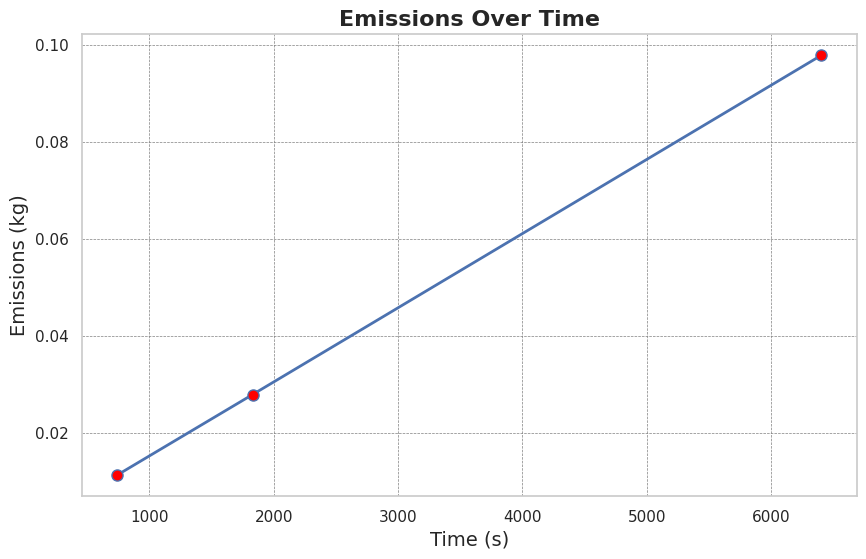

In [ ]:
import matplotlib.pyplot as plt


# Create a figure and an axis with improved aesthetics
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the emissions vs time with enhanced styling
ax.plot(times, emissions_data, marker='o', linestyle='-', linewidth=2, markersize=8, markerfacecolor='red')

# Label the axes with improved font sizes
ax.set_xlabel('Time (s)', fontsize=14)
ax.set_ylabel('Emissions (kg)', fontsize=14)

# Set the title and improve its appearance
ax.set_title('Emissions Over Time', fontsize=16, fontweight='bold')

# Add grid lines to make the plot easier to read
ax.grid(True, linestyle='--', linewidth=0.5, color='gray')

# Show the plot
plt.show()

In [ ]:
# Load the feature files
feature_paths = ["/content/datasets/vision_features/Train_video_features.pkl", "/content/datasets/vision_features/Test_video_features.pkl", "/content/datasets/vision_features/Dev_video_features.pkl"]
features_data = {}

# Load each set of features into the features_data dictionary
for path in feature_paths:
    with open(path, 'rb') as f:
        features_data[path] = pickle.load(f)

# Initialize an empty dictionary to hold the filtered features
filtered_features_data = {}

# Loop through each set and filter out entries where features are None
for path, features in features_data.items():
    X = [x['features'] for x in features.values() if x['features'] is not None]
    y = [x['label'] for x in features.values() if x['features'] is not None]

    # Store the filtered X and y in the dictionary
    filtered_features_data[path] = {'X': X, 'y': y}

# Show the length of the filtered features for each set
{path: {'X': len(data['X']), 'y': len(data['y'])} for path, data in filtered_features_data.items()}


[codecarbon INFO @ 01:44:54] Energy consumed for RAM : 0.085923 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 01:44:54] Energy consumed for all GPUs : 0.230124 kWh. Total GPU Power : 31.12867019015806 W
[codecarbon INFO @ 01:44:54] Energy consumed for all CPUs : 0.191038 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 01:44:54] 0.507085 kWh of electricity used since the beginning.


{'/content/datasets/vision_features/Train_video_features.pkl': {'X': 9988,
  'y': 9988},
 '/content/datasets/vision_features/Test_video_features.pkl': {'X': 2610,
  'y': 2610},
 '/content/datasets/vision_features/Dev_video_features.pkl': {'X': 1108,
  'y': 1108}}

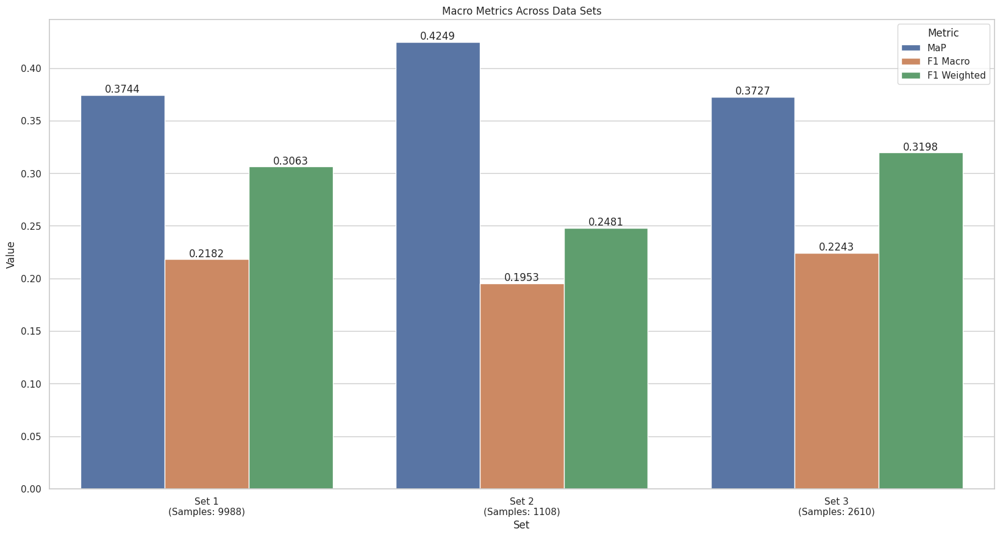

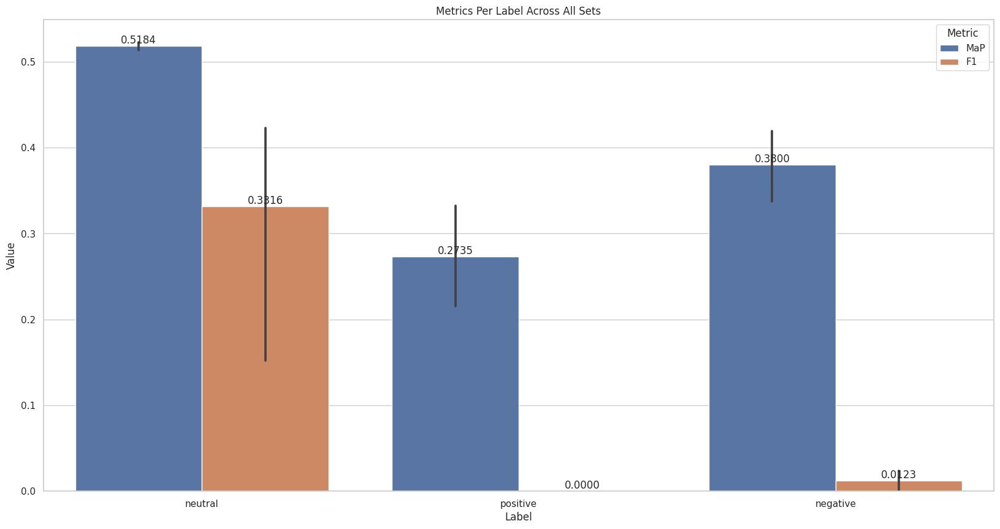

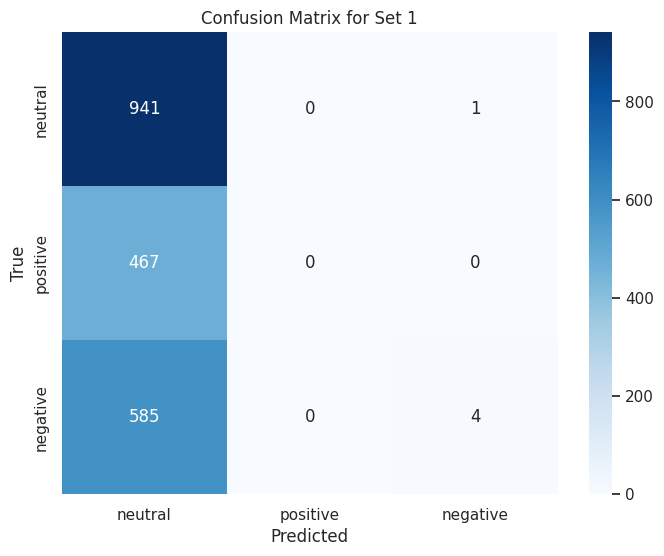

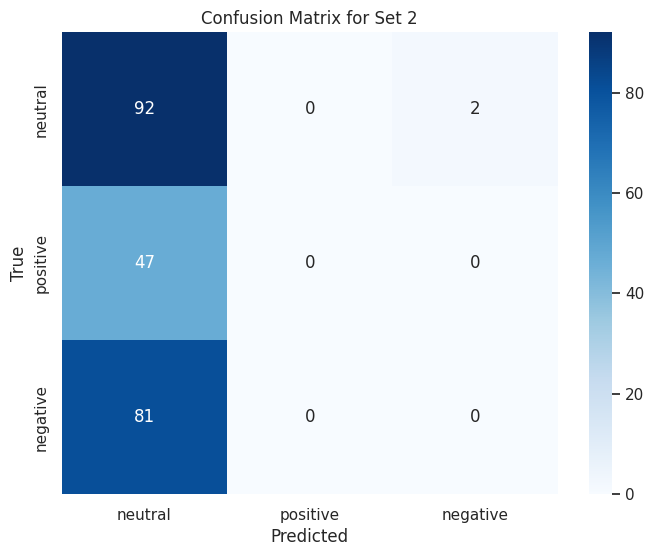

[codecarbon INFO @ 04:37:43] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:37:43] Energy consumed for all GPUs : 0.002544 kWh. Total GPU Power : 31.91128723941438 W
[codecarbon INFO @ 04:37:43] Energy consumed for all CPUs : 0.003365 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:37:43] 0.007422 kWh of electricity used since the beginning.


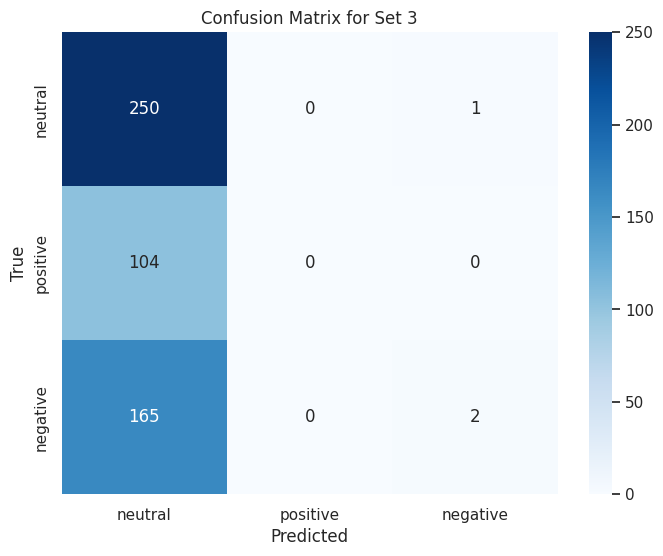

In [ ]:
from sklearn.metrics import average_precision_score, confusion_matrix, f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle

def train_and_evaluate_classifier(features_path, class_names, test_size=0.2, max_iter=5000, random_state=42):
    with open(features_path, 'rb') as f:
        features = pickle.load(f)

    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])

    # Explicitly convert y to a 2D numpy array of integers
    y_list_of_lists = [list(map(int, label.tolist())) for label in y]
    y = np.array(y_list_of_lists, dtype=int)

    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, stratify=np.argmax(y, axis=1), random_state=random_state)

    classifier = OneVsRestClassifier(LogisticRegression(max_iter=max_iter, random_state=random_state))
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_val)

    y_score = classifier.decision_function(X_val)
    y_pred_single = np.argmax(y_pred, axis=1)
    y_val_single = np.argmax(y_val, axis=1)
    cm = confusion_matrix(y_val_single, y_pred_single)
    map_val = average_precision_score(y_val, y_score, average='macro')
    f1_macro = f1_score(y_val_single, y_pred_single, average='macro')
    f1_weighted = f1_score(y_val_single, y_pred_single, average='weighted')
    map_per_label = average_precision_score(y_val, y_score, average=None)
    f1_per_label = f1_score(y_val, y_pred, average=None)
    return map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, len(X), cm

# Initialize containers
results_macro = []
results_per_label = []
confusion_matrices = {}
sets_path = ["/content/datasets/vision_features/Train_video_features.pkl", "/content/datasets/vision_features/Dev_video_features.pkl", "/content/datasets/vision_features/Test_video_features.pkl"]
class_names = ['neutral', 'positive', 'negative']

# Evaluate classifier and collect metrics
for idx, set_file in enumerate(sets_path):
    map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, sample_count, cm = train_and_evaluate_classifier(set_file, class_names)
    set_name = f"Set {idx + 1}"
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'MaP',
        'Value': map_val
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Macro',
        'Value': f1_macro
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Weighted',
        'Value': f1_weighted
    })

    for label_idx, label_name in enumerate(class_names):
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'MaP',
            'Value': map_per_label[label_idx]
        })
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'F1',
            'Value': f1_per_label[label_idx]
        })

    confusion_matrices[set_name] = cm

# Plotting macro metrics
df_macro = pd.DataFrame(results_macro)
plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")
ax = sns.barplot(x='Set', y='Value', hue='Metric', data=df_macro)
plt.title('Macro Metrics Across Data Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

# Annotate with sample count and update x-axis labels
new_labels = []
for idx, label in enumerate(df_macro['Set'].unique()):
    sample_count = df_macro[df_macro['Set'] == label]['Sample Count'].iloc[0]
    new_labels.append(f"{label}\n(Samples: {sample_count})")
plt.xticks(ticks=range(len(new_labels)), labels=new_labels)

plt.show()

# Plotting per-label metrics
df_per_label = pd.DataFrame(results_per_label)
plt.figure(figsize=(20, 10))
ax = sns.barplot(x='Label', y='Value', hue='Metric', data=df_per_label)
plt.title('Metrics Per Label Across All Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

plt.show()

# Plot confusion matrices
for set_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for {set_name}')
    plt.show()


## Version with crop faces

In [ ]:
!pip install -q mediapipe

In [ ]:
import os
import time
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnet18
from tqdm import tqdm
import pandas as pd
import pickle
from codecarbon import EmissionsTracker
import mediapipe as mp



class AttentionLayer(nn.Module):
    def __init__(self, input_dim):
        super(AttentionLayer, self).__init__()
        self.fc = nn.Linear(input_dim, 1)

    def forward(self, x):
        weights = F.softmax(self.fc(x), dim=0)
        print("Shape of weights:", weights.shape)
        weighted_sum = torch.sum(weights * x, dim=0)
        print("Shape of weighted_sum:", weighted_sum.shape)
        return weighted_sum

class VisionFeatureExtractor:
    def __init__(self, classification_type="Sentiment"):
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = resnet18(pretrained=True).to(self.device)
        self.model = nn.Sequential(*(list(self.model.children())[:-1]))  # Removing the classification layer
        self.attention_layer = AttentionLayer(input_dim=512).to(self.device)  # Attention layer
        self.classification_type = classification_type

    def mapping_labels(self, df):
        mapping = {
            'Emotion': {
                'neutral': [1, 0, 0, 0, 0, 0, 0],
                'surprise': [0, 1, 0, 0, 0, 0, 0],
                'fear': [0, 0, 1, 0, 0, 0, 0],
                'sadness': [0, 0, 0, 1, 0, 0, 0],
                'joy': [0, 0, 0, 0, 1, 0, 0],
                'disgust': [0, 0, 0, 0, 0, 1, 0],
                'anger': [0, 0, 0, 0, 0, 0, 1],
            },
            'Sentiment': {
                'neutral': [1, 0, 0],
                'positive': [0, 1, 0],
                'negative': [0, 0, 1]
            }
        }
        label_column = f"{self.classification_type}_encoded"
        df[label_column] = df[self.classification_type].map(mapping[self.classification_type])
        return df

    def extract_and_save_features(self, video_folder_path, video_path_csv, set_name):
        df = pd.read_csv(video_path_csv)
        df['video_id'] = "dia" + df['Dialogue_ID'].astype(str) + '_utt' + df['Utterance_ID'].astype(str) + '.mp4'
        df = self.mapping_labels(df)

        video_feature_dict = {}
        video_files_to_process = [file for file in os.listdir(video_folder_path) if file in set(df['video_id'])]

        for video_file in tqdm(video_files_to_process):
            video_path = os.path.join(video_folder_path, video_file)
            video_features = self.extract_features_from_video(video_path)

            if video_features is not None:
                label = np.squeeze(df[df['video_id'] == video_file][f"{self.classification_type}_encoded"].values)
                if label is None:
                    print(f"Skipping {video_file} due to None label.")
                    continue
                video_feature_dict[video_file.split('.')[0]] = {'features': video_features, 'label': label}

            torch.cuda.empty_cache()

        os.makedirs('./vision_features', exist_ok=True)
        with open(f'./vision_features/{set_name}_video_features_crop_face.pkl', 'wb') as f:
            pickle.dump(video_feature_dict, f)

    def extract_features_from_video(self, video_path):
        mp_face_detection = mp.solutions.face_detection

        cap = cv2.VideoCapture(video_path)
        frames = []
        all_features = []

        with mp_face_detection.FaceDetection(min_detection_confidence=0.5) as face_detection:
            while cap.isOpened():
                ret, frame = cap.read()
                if not ret:
                    break

                if frame is None:
                    print("Frame is None. Skipping this frame.")
                    continue

                results = face_detection.process(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

                if results.detections:
                    for detection in results.detections:
                        bboxC = detection.location_data.relative_bounding_box
                        ih, iw, _ = frame.shape
                        x, y, w, h = int(bboxC.xmin * iw), int(bboxC.ymin * ih), int(bboxC.width * iw), int(bboxC.height * ih)
                        cropped_face = frame[y:y+h, x:x+w]

                        if cropped_face.size == 0:
                            print("Cropped face is empty. Skipping this frame.")
                            continue

                        cropped_face = cv2.resize(cropped_face, (224, 224))
                        frames.append(cropped_face)
                        break

        if len(frames) == 0:
            print(f"No frames extracted from {video_path}. Skipping.")
            return None

        cap.release()

        for frame in frames:
            frame_tensor = torch.tensor(np.array(frame)).float().unsqueeze(0).permute(0, 3, 1, 2).to(self.device)
            with torch.no_grad():
                features = self.model(frame_tensor).squeeze(-1).squeeze(-1)  # [1, 512]
            all_features.append(features)

        # Convert to tensor and apply attention mechanism
        all_features_tensor = torch.stack(all_features).squeeze(1)  # Stack to make a [num_frames, 512] tensor
        print("Shape of all_features_tensor:", all_features_tensor.shape)

        aggregated_features = self.attention_layer(all_features_tensor).cpu().detach().numpy()  # Detach and convert to numpy

        return aggregated_features




if __name__ == "__main__":
    print("🚀 Initializing Vision Feature Extraction for Sentiment Classification... 🚀")
    times = []
    emissions_data = []

    feature_extractor = VisionFeatureExtractor(classification_type="Sentiment")

    # Example dataset paths; Replace with actual paths
    dataset_paths = {
        'Train': ('/content/datasets/MELD/train_splits', '/content/datasets/MELD/train_sent_emo.csv'),
        'Test': ('/content/datasets/MELD/output_repeated_splits_test', '/content/datasets/MELD/test_sent_emo.csv'),
        'Dev': ('/content/datasets/MELD/dev_splits_complete', '/content/datasets/MELD/dev_sent_emo.csv')
    }

    for set_name, (video_folder, csv_path) in dataset_paths.items():
        tracker = EmissionsTracker(project_name=f"{set_name}_video_feature_extraction")
        start_time = time.time()
        tracker.start()

        feature_extractor.extract_and_save_features(video_folder, csv_path, set_name)

        current_time = time.time() - start_time
        total_emissions = tracker.stop()
        times.append(current_time)
        emissions_data.append(total_emissions)

        print(f"🔍 Total Emissions for {set_name}: {total_emissions} kg")
        print(f"⌛ Feature Extraction for {set_name} completed in {current_time:.2f} seconds ⌛")
        tracker.stop()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
[codecarbon INFO @ 04:41:19] [setup] RAM Tracking...


🚀 Initializing Vision Feature Extraction for Sentiment Classification... 🚀


[codecarbon INFO @ 04:41:19] [setup] GPU Tracking...
[codecarbon INFO @ 04:41:19] Tracking Nvidia GPU via pynvml
[codecarbon INFO @ 04:41:19] [setup] CPU Tracking...
[codecarbon WARNING @ 04:41:19] No CPU tracking mode found. Falling back on CPU constant mode.
[codecarbon WARNING @ 04:41:20] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon INFO @ 04:41:20] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 04:41:20] >>> Tracker's metadata:
[codecarbon INFO @ 04:41:20]   Platform system: Linux-5.15.120+-x86_64-with-glibc2.35
[codecarbon INFO @ 04:41:20]   Python version: 3.10.12
[codecarbon INFO @ 04:41:20]   CodeCarbon version: 2.3.1
[codecarbon INFO @ 04:41:20]   Available RAM : 50.997 GB
[codecarbon INFO @ 04:41:20]   CPU count: 8
[codecarbon INFO @ 04:41:20]   CPU model: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 04:41:20]   GPU count: 1
[codecarbon INFO @ 04:41:20]   GPU model: 1

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 2/9989 [00:00<47:16,  3.52it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 3/9989 [00:00<48:31,  3.43it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia808_utt0.mp4. Skipping.


  0%|          | 4/9989 [00:01<1:02:22,  2.67it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia44_utt2.mp4. Skipping.


  0%|          | 6/9989 [00:01<45:57,  3.62it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 7/9989 [00:02<1:28:33,  1.88it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 8/9989 [00:03<1:13:41,  2.26it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 9/9989 [00:04<1:36:20,  1.73it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:41:36] Energy consumed for RAM : 0.000080 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:41:36] Energy consumed for all GPUs : 0.000153 kWh. Total GPU Power : 36.70014587756921 W
[codecarbon INFO @ 04:41:36] Energy consumed for all CPUs : 0.000177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:41:36] 0.000410 kWh of electricity used since the beginning.
  0%|          | 10/9989 [00:05<2:19:09,  1.20it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 11/9989 [00:06<2:14:06,  1.24it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 12/9989 [00:06<2:00:46,  1.38it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 13/9989 [00:07<1:36:46,  1.72it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia296_utt13.mp4. Skipping.


  0%|          | 14/9989 [00:08<2:03:38,  1.34it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 15/9989 [00:08<1:50:21,  1.51it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  0%|          | 16/9989 [00:08<1:30:04,  1.85it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 17/9989 [00:10<2:07:14,  1.31it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 18/9989 [00:10<1:53:13,  1.47it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 19/9989 [00:10<1:35:34,  1.74it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 20/9989 [00:11<1:31:41,  1.81it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 21/9989 [00:12<1:35:55,  1.73it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:41:43] Energy consumed for RAM : 0.002787 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:41:43] Energy consumed for all GPUs : 0.004793 kWh. Total GPU Power : 47.86877872923649 W
[codecarbon INFO @ 04:41:43] Energy consumed for all CPUs : 0.006197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:41:43] 0.013777 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:41:44] Energy consumed for RAM : 0.000955 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:41:44] Energy consumed for all GPUs : 0.001717 kWh. Total GPU Power : 47.91944984319687 W
[codecarbon INFO @ 04:41:44] Energy consumed for all CPUs : 0.002125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:41:44] 0.004797 kWh of electricity used since the beginning.
  0%|          | 22/9989 [00:13<2:11:27,  1.26it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 23/9989 [00:14<2:13:52,  1.24it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 24/9989 [00:14<2:10:02,  1.28it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 25/9989 [00:15<1:50:21,  1.50it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 26/9989 [00:16<2:17:56,  1.20it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  0%|          | 28/9989 [00:17<1:23:51,  1.98it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia525_utt0.mp4. Skipping.


  0%|          | 29/9989 [00:17<1:21:43,  2.03it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 30/9989 [00:18<1:24:44,  1.96it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 31/9989 [00:18<1:15:21,  2.20it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 32/9989 [00:19<1:48:26,  1.53it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:41:51] Energy consumed for RAM : 0.000159 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:41:51] Energy consumed for all GPUs : 0.000376 kWh. Total GPU Power : 53.56027730760617 W
[codecarbon INFO @ 04:41:51] Energy consumed for all CPUs : 0.000354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:41:51] 0.000890 kWh of electricity used since the beginning.
  0%|          | 34/9989 [00:20<1:26:49,  1.91it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 35/9989 [00:21<1:41:36,  1.63it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 37/9989 [00:21<1:08:02,  2.44it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  0%|          | 38/9989 [00:22<1:32:41,  1.79it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 39/9989 [00:22<1:22:02,  2.02it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 40/9989 [00:23<1:41:06,  1.64it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 41/9989 [00:25<2:17:24,  1.21it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 43/9989 [00:26<1:57:43,  1.41it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia639_utt4.mp4. Skipping.


  0%|          | 44/9989 [00:27<1:58:50,  1.39it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:41:58] Energy consumed for RAM : 0.002867 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:41:58] Energy consumed for all GPUs : 0.005012 kWh. Total GPU Power : 52.76257414556153 W
[codecarbon INFO @ 04:41:58] Energy consumed for all CPUs : 0.006374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:41:58] 0.014254 kWh of electricity used since the beginning.
  0%|          | 45/9989 [00:27<1:50:13,  1.50it/s][codecarbon INFO @ 04:41:59] Energy consumed for RAM : 0.001035 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:41:59] Energy consumed for all GPUs : 0.001938 kWh. Total GPU Power : 53.06378351505805 W
[codecarbon INFO @ 04:41:59] Energy consumed for all CPUs : 0.002302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:41:59] 0.005275 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 46/9989 [00:29<2:42:58,  1.02it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 47/9989 [00:31<3:15:02,  1.18s/it]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  0%|          | 48/9989 [00:31<2:29:30,  1.11it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 49/9989 [00:31<2:08:05,  1.29it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 50/9989 [00:33<2:28:20,  1.12it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 52/9989 [00:33<1:29:49,  1.84it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 53/9989 [00:33<1:22:34,  2.01it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 54/9989 [00:34<1:43:22,  1.60it/s][codecarbon INFO @ 04:42:06] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:06] Energy consumed for all GPUs : 0.000596 kWh. Total GPU Power : 52.783840908951035 W
[codecarbon INFO @ 04:42:06] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:06] 0.001366 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 55/9989 [00:35<1:25:47,  1.93it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 56/9989 [00:35<1:18:33,  2.11it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia315_utt0.mp4. Skipping.


  1%|          | 57/9989 [00:36<1:38:47,  1.68it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 58/9989 [00:37<1:52:38,  1.47it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 60/9989 [00:37<1:17:29,  2.14it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 61/9989 [00:37<1:02:03,  2.67it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|          | 62/9989 [00:38<57:53,  2.86it/s]  

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|          | 64/9989 [00:39<1:25:55,  1.93it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 65/9989 [00:40<1:10:12,  2.36it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 66/9989 [00:40<1:05:08,  2.54it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 67/9989 [00:40<1:17:12,  2.14it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 68/9989 [00:41<1:12:58,  2.27it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 69/9989 [00:41<1:13:48,  2.24it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:42:13] Energy consumed for RAM : 0.002946 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:13] Energy consumed for all GPUs : 0.005225 kWh. Total GPU Power : 51.15594295336774 W
[codecarbon INFO @ 04:42:13] Energy consumed for all CPUs : 0.006551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:13] 0.014723 kWh of electricity used since the beginning.
  1%|          | 70/9989 [00:42<1:37:07,  1.70it/s][codecarbon INFO @ 04:42:14] Energy consumed for RAM : 0.001115 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:14] Energy consumed for all GPUs : 0.002153 kWh. Total GPU Power : 51.63024333440077 W
[codecarbon INFO @ 04:42:14] Energy consumed for all CPUs : 0.002479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:14] 0.005747 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 71/9989 [00:43<1:55:44,  1.43it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 72/9989 [00:44<1:37:53,  1.69it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 73/9989 [00:44<1:28:20,  1.87it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 74/9989 [00:45<1:33:57,  1.76it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 75/9989 [00:45<1:22:25,  2.00it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 76/9989 [00:47<2:18:11,  1.20it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 77/9989 [00:48<2:31:31,  1.09it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 79/9989 [00:48<1:44:42,  1.58it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:42:21] Energy consumed for RAM : 0.000319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:21] Energy consumed for all GPUs : 0.000809 kWh. Total GPU Power : 51.20313873853937 W
[codecarbon INFO @ 04:42:21] Energy consumed for all CPUs : 0.000708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:21] 0.001836 kWh of electricity used since the beginning.
  1%|          | 80/9989 [00:50<2:06:42,  1.30it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])

  1%|          | 81/9989 [00:50<1:38:40,  1.67it/s]


Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 82/9989 [00:50<1:44:49,  1.58it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 83/9989 [00:51<1:54:57,  1.44it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 84/9989 [00:52<1:37:55,  1.69it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 85/9989 [00:52<1:36:33,  1.71it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 86/9989 [00:54<2:11:37,  1.25it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 87/9989 [00:54<1:53:49,  1.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 88/9989 [00:55<1:47:22,  1.54it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 89/9989 [00:55<1:44:33,  1.58it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 90/9989 [00:56<1:32:49,  1.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 91/9989 [00:56<1:46:21,  1.55it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|          | 92/9989 [00:57<1:30:44,  1.82it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:42:28] Energy consumed for RAM : 0.003026 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:28] Energy consumed for all GPUs : 0.005445 kWh. Total GPU Power : 52.77679372106746 W
[codecarbon INFO @ 04:42:28] Energy consumed for all CPUs : 0.006728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:28] 0.015200 kWh of electricity used since the beginning.
  1%|          | 93/9989 [00:57<1:23:12,  1.98it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:42:29] Energy consumed for RAM : 0.001194 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:29] Energy consumed for all GPUs : 0.002370 kWh. Total GPU Power : 52.081272353031366 W
[codecarbon INFO @ 04:42:29] Energy consumed for all CPUs : 0.002656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:29] 0.006220 kWh of electricity used since the beginning.
  1%|          | 94/9989 [00:57<1:09:52,  2.36it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 95/9989 [00:58<59:46,  2.76it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia546_utt3.mp4. Skipping.


  1%|          | 96/9989 [00:58<53:07,  3.10it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 97/9989 [00:58<58:24,  2.82it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 98/9989 [00:58<53:32,  3.08it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 100/9989 [00:59<45:16,  3.64it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia617_utt9.mp4. Skipping.


  1%|          | 101/9989 [01:00<1:06:25,  2.48it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 102/9989 [01:00<1:22:08,  2.01it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 104/9989 [01:02<1:31:05,  1.81it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 105/9989 [01:02<1:28:45,  1.86it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 106/9989 [01:03<1:15:40,  2.18it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 107/9989 [01:03<1:22:47,  1.99it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 108/9989 [01:04<1:20:56,  2.03it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:42:36] Energy consumed for RAM : 0.000398 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:36] Energy consumed for all GPUs : 0.001019 kWh. Total GPU Power : 50.27367217871537 W
[codecarbon INFO @ 04:42:36] Energy consumed for all CPUs : 0.000885 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:36] 0.002302 kWh of electricity used since the beginning.
  1%|          | 109/9989 [01:05<2:10:36,  1.26it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 110/9989 [01:05<1:45:15,  1.56it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 111/9989 [01:06<1:39:57,  1.65it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 112/9989 [01:06<1:38:27,  1.67it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 113/9989 [01:07<1:20:24,  2.05it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 114/9989 [01:09<2:44:16,  1.00it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 115/9989 [01:09<2:10:02,  1.27it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 116/9989 [01:10<1:48:49,  1.51it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 117/9989 [01:10<1:34:09,  1.75it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 118/9989 [01:10<1:26:42,  1.90it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 119/9989 [01:12<2:08:48,  1.28it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 120/9989 [01:12<1:39:50,  1.65it/s][codecarbon INFO @ 04:42:43] Energy consumed for RAM : 0.003106 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:43] Energy consumed for all GPUs : 0.005657 kWh. Total GPU Power : 50.911622842528445 W
[codecarbon INFO @ 04:42:43] Energy consumed for all CPUs : 0.006905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:43] 0.015668 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:42:44] Energy consumed for RAM : 0.001274 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:44] Energy consumed for all GPUs : 0.002582 kWh. Total GPU Power : 50.92480612180923 W
[codecarbon INFO @ 04:42:44] Energy consumed for all CPUs : 0.002833 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:44] 0.006689 kWh of electricity used since the beginning.
  1%|          | 121/9989 [01:12<1:26:29,  1.90it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  1%|          | 122/9989 [01:13<1:16:50,  2.14it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 123/9989 [01:14<2:01:56,  1.35it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 124/9989 [01:15<2:32:14,  1.08it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 125/9989 [01:16<2:02:09,  1.35it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 126/9989 [01:16<1:48:36,  1.51it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia475_utt0.mp4. Skipping.


  1%|▏         | 127/9989 [01:17<1:48:03,  1.52it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 128/9989 [01:18<2:17:34,  1.19it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 129/9989 [01:19<2:15:53,  1.21it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:42:51] Energy consumed for RAM : 0.000478 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:51] Energy consumed for all GPUs : 0.001235 kWh. Total GPU Power : 51.950785579823794 W
[codecarbon INFO @ 04:42:51] Energy consumed for all CPUs : 0.001062 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:51] 0.002775 kWh of electricity used since the beginning.
  1%|▏         | 130/9989 [01:20<2:07:33,  1.29it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|▏         | 131/9989 [01:21<2:58:33,  1.09s/it]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 132/9989 [01:22<2:18:26,  1.19it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 133/9989 [01:22<2:12:34,  1.24it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 134/9989 [01:23<2:01:21,  1.35it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 135/9989 [01:23<1:48:09,  1.52it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 136/9989 [01:24<1:30:47,  1.81it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 137/9989 [01:24<1:15:11,  2.18it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 138/9989 [01:24<1:17:53,  2.11it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 139/9989 [01:25<1:11:50,  2.29it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 140/9989 [01:26<1:39:24,  1.65it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 142/9989 [01:26<1:13:11,  2.24it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1010_utt10.mp4. Skipping.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:42:58] Energy consumed for RAM : 0.003185 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:58] Energy consumed for all GPUs : 0.005870 kWh. Total GPU Power : 51.110796595310966 W
[codecarbon INFO @ 04:42:58] Energy consumed for all CPUs : 0.007082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:58] 0.016138 kWh of electricity used since the beginning.
  1%|▏         | 143/9989 [01:27<1:31:59,  1.78it/s][codecarbon INFO @ 04:42:59] Energy consumed for RAM : 0.001353 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:42:59] Energy consumed for all GPUs : 0.002797 kWh. Total GPU Power : 51.562430248508164 W
[codecarbon INFO @ 04:42:59] Energy consumed for all CPUs : 0.003010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:42:59] 0.007160 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 144/9989 [01:28<1:23:26,  1.97it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 145/9989 [01:28<1:10:25,  2.33it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 146/9989 [01:28<1:18:12,  2.10it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 147/9989 [01:29<1:22:33,  1.99it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 148/9989 [01:30<1:21:42,  2.01it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia844_utt5.mp4. Skipping.


  1%|▏         | 149/9989 [01:30<1:13:58,  2.22it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  2%|▏         | 150/9989 [01:30<1:18:55,  2.08it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 151/9989 [01:31<1:41:35,  1.61it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 152/9989 [01:33<2:13:44,  1.23it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 153/9989 [01:33<2:01:55,  1.34it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 154/9989 [01:34<1:44:43,  1.57it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia15_utt13.mp4. Skipping.


  2%|▏         | 155/9989 [01:34<1:52:59,  1.45it/s][codecarbon INFO @ 04:43:06] Energy consumed for RAM : 0.000557 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:06] Energy consumed for all GPUs : 0.001452 kWh. Total GPU Power : 52.170799437570345 W
[codecarbon INFO @ 04:43:06] Energy consumed for all CPUs : 0.001240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:06] 0.003249 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 156/9989 [01:35<1:54:58,  1.43it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 157/9989 [01:37<2:34:26,  1.06it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  2%|▏         | 158/9989 [01:37<2:05:00,  1.31it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 160/9989 [01:38<1:26:31,  1.89it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 161/9989 [01:39<2:22:13,  1.15it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 162/9989 [01:40<2:37:59,  1.04it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 163/9989 [01:41<2:08:57,  1.27it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 164/9989 [01:42<2:05:35,  1.30it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:43:13] Energy consumed for RAM : 0.003265 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:13] Energy consumed for all GPUs : 0.006091 kWh. Total GPU Power : 52.96825703202037 W
[codecarbon INFO @ 04:43:13] Energy consumed for all CPUs : 0.007260 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:13] 0.016615 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:43:14] Energy consumed for RAM : 0.001433 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:14] Energy consumed for all GPUs : 0.003015 kWh. Total GPU Power : 52.40914058769544 W
[codecarbon INFO @ 04:43:14] Energy consumed for all CPUs : 0.003187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:14] 0.007635 kWh of electricity used since the beginning.
  2%|▏         | 165/9989 [01:44<3:05:24,  1.13s/it]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 166/9989 [01:44<2:27:35,  1.11it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 168/9989 [01:45<1:44:20,  1.57it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 169/9989 [01:45<1:31:05,  1.80it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 170/9989 [01:46<1:54:11,  1.43it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 171/9989 [01:47<1:54:08,  1.43it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 173/9989 [01:48<1:42:42,  1.59it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 174/9989 [01:48<1:26:29,  1.89it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 175/9989 [01:49<1:37:56,  1.67it/s][codecarbon INFO @ 04:43:21] Energy consumed for RAM : 0.000637 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:21] Energy consumed for all GPUs : 0.001676 kWh. Total GPU Power : 53.68781783495845 W
[codecarbon INFO @ 04:43:21] Energy consumed for all CPUs : 0.001417 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:21] 0.003729 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 176/9989 [01:50<1:49:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 177/9989 [01:51<1:55:48,  1.41it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 178/9989 [01:51<1:32:05,  1.78it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 179/9989 [01:52<1:46:23,  1.54it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 180/9989 [01:52<1:28:42,  1.84it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia254_utt3.mp4. Skipping.


  2%|▏         | 182/9989 [01:53<1:13:24,  2.23it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 183/9989 [01:53<1:15:46,  2.16it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 184/9989 [01:54<1:19:15,  2.06it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 185/9989 [01:55<1:26:31,  1.89it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 186/9989 [01:56<1:57:08,  1.39it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 187/9989 [01:56<1:50:36,  1.48it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 188/9989 [01:57<1:47:13,  1.52it/s][codecarbon INFO @ 04:43:28] Energy consumed for RAM : 0.003345 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:28] Energy consumed for all GPUs : 0.006315 kWh. Total GPU Power : 53.761592099300714 W
[codecarbon INFO @ 04:43:28] Energy consumed for all CPUs : 0.007437 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:28] 0.017096 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:43:29] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:29] Energy consumed for all GPUs : 0.003239 kWh. Total GPU Power : 53.75646764042018 W
[codecarbon INFO @ 04:43:29] Energy consumed for all CPUs : 0.003364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:29] 0.008116 kWh of electricity used since the beginning.
  2%|▏         | 189/9989 [01:58<1:51:19,  1.47it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 191/9989 [01:59<1:32:01,  1.77it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 192/9989 [01:59<1:38:15,  1.66it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 193/9989 [02:02<2:51:26,  1.05s/it]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 194/9989 [02:02<2:42:29,  1.00it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 195/9989 [02:03<2:05:22,  1.30it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 196/9989 [02:03<1:40:52,  1.62it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 197/9989 [02:04<1:51:55,  1.46it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 198/9989 [02:04<1:43:27,  1.58it/s][codecarbon INFO @ 04:43:36] Energy consumed for RAM : 0.000717 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:36] Energy consumed for all GPUs : 0.001893 kWh. Total GPU Power : 52.120860904007266 W
[codecarbon INFO @ 04:43:36] Energy consumed for all CPUs : 0.001594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:36] 0.004203 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/train_splits/dia261_utt5.mp4. Skipping.


  2%|▏         | 199/9989 [02:05<1:40:46,  1.62it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 200/9989 [02:06<1:51:52,  1.46it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 201/9989 [02:07<1:57:42,  1.39it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 202/9989 [02:07<1:59:26,  1.37it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia414_utt1.mp4. Skipping.


  2%|▏         | 204/9989 [02:08<1:16:17,  2.14it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 205/9989 [02:08<1:15:08,  2.17it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 206/9989 [02:09<1:47:43,  1.51it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 207/9989 [02:10<1:51:26,  1.46it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 208/9989 [02:12<2:37:10,  1.04it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 209/9989 [02:12<2:08:43,  1.27it/s][codecarbon INFO @ 04:43:43] Energy consumed for RAM : 0.003424 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:43] Energy consumed for all GPUs : 0.006531 kWh. Total GPU Power : 51.88767724476747 W
[codecarbon INFO @ 04:43:43] Energy consumed for all CPUs : 0.007614 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:43] 0.017569 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:43:44] Energy consumed for RAM : 0.001592 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:44] Energy consumed for all GPUs : 0.003455 kWh. Total GPU Power : 51.92223150359882 W
[codecarbon INFO @ 04:43:44] Energy consumed for all CPUs : 0.003541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:44] 0.008589 kWh of electricity used since the beginning.
  2%|▏         | 210/9989 [02:13<2:11:57,  1.24it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 211/9989 [02:13<1:47:16,  1.52it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 213/9989 [02:14<1:16:09,  2.14it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia574_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia170_utt4.mp4. Skipping.


  2%|▏         | 214/9989 [02:14<1:22:34,  1.97it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 215/9989 [02:15<1:15:18,  2.16it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 216/9989 [02:15<1:17:47,  2.09it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 217/9989 [02:16<1:20:50,  2.01it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 219/9989 [02:16<1:04:58,  2.51it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia632_utt7.mp4. Skipping.


  2%|▏         | 220/9989 [02:17<53:15,  3.06it/s]  

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 221/9989 [02:17<52:42,  3.09it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 222/9989 [02:18<1:39:47,  1.63it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:43:51] Energy consumed for RAM : 0.000796 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:51] Energy consumed for all GPUs : 0.002103 kWh. Total GPU Power : 50.50785755738504 W
[codecarbon INFO @ 04:43:51] Energy consumed for all CPUs : 0.001771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:51] 0.004670 kWh of electricity used since the beginning.
  2%|▏         | 223/9989 [02:20<2:16:42,  1.19it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 224/9989 [02:20<1:48:00,  1.51it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 225/9989 [02:20<1:45:46,  1.54it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 226/9989 [02:21<2:00:46,  1.35it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 227/9989 [02:22<1:46:00,  1.53it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1009_utt13.mp4. Skipping.


  2%|▏         | 228/9989 [02:24<2:36:59,  1.04it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 229/9989 [02:24<2:09:52,  1.25it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 230/9989 [02:24<1:55:02,  1.41it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 231/9989 [02:25<1:57:59,  1.38it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia253_utt0.mp4. Skipping.


  2%|▏         | 232/9989 [02:27<2:42:56,  1.00s/it][codecarbon INFO @ 04:43:58] Energy consumed for RAM : 0.003504 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:58] Energy consumed for all GPUs : 0.006733 kWh. Total GPU Power : 48.6799204110283 W
[codecarbon INFO @ 04:43:58] Energy consumed for all CPUs : 0.007791 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:58] 0.018028 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:43:59] Energy consumed for RAM : 0.001672 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:43:59] Energy consumed for all GPUs : 0.003659 kWh. Total GPU Power : 48.88282900423201 W
[codecarbon INFO @ 04:43:59] Energy consumed for all CPUs : 0.003718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:43:59] 0.009049 kWh of electricity used since the beginning.
  2%|▏         | 233/9989 [02:29<3:21:32,  1.24s/it]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 234/9989 [02:29<2:51:02,  1.05s/it]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 235/9989 [02:30<2:11:47,  1.23it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 236/9989 [02:30<1:49:19,  1.49it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 237/9989 [02:31<2:05:55,  1.29it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 238/9989 [02:32<2:42:43,  1.00s/it]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 240/9989 [02:33<1:44:55,  1.55it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:44:06] Energy consumed for RAM : 0.000876 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:06] Energy consumed for all GPUs : 0.002312 kWh. Total GPU Power : 50.27289228242113 W
[codecarbon INFO @ 04:44:06] Energy consumed for all CPUs : 0.001948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:06] 0.005136 kWh of electricity used since the beginning.
  2%|▏         | 242/9989 [02:35<1:48:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 243/9989 [02:35<1:47:18,  1.51it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 245/9989 [02:36<1:14:07,  2.19it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 246/9989 [02:36<1:14:30,  2.18it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 247/9989 [02:37<1:21:40,  1.99it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 248/9989 [02:37<1:25:27,  1.90it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 249/9989 [02:38<1:17:35,  2.09it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 250/9989 [02:38<1:18:36,  2.07it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 251/9989 [02:40<2:21:36,  1.15it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 252/9989 [02:41<2:08:43,  1.26it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

[codecarbon INFO @ 04:44:13] Energy consumed for RAM : 0.003583 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:13] Energy consumed for all GPUs : 0.006947 kWh. Total GPU Power : 51.38845522240856 W
[codecarbon INFO @ 04:44:13] Energy consumed for all CPUs : 0.007968 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:13] 0.018499 kWh of electricity used since the beginning.
  3%|▎         | 253/9989 [02:42<2:34:57,  1.05it/s][codecarbon INFO @ 04:44:14] Energy consumed for RAM : 0.001752 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:14] Energy consumed for all GPUs : 0.003872 kWh. Total GPU Power : 51.2199207571415 W
[codecarbon INFO @ 04:44:14] Energy consumed for all CPUs : 0.003895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:14] 0.009519 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia827_utt6.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  3%|▎         | 255/9989 [02:43<1:49:56,  1.48it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  3%|▎         | 256/9989 [02:43<1:36:02,  1.69it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 257/9989 [02:44<1:35:29,  1.70it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 258/9989 [02:44<1:36:16,  1.68it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 259/9989 [02:45<1:24:16,  1.92it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 260/9989 [02:45<1:16:43,  2.11it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia142_utt1.mp4. Skipping.


  3%|▎         | 261/9989 [02:48<2:56:33,  1.09s/it]

Shape of all_features_tensor: torch.Size([260, 512])
Shape of weights: torch.Size([260, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 262/9989 [02:48<2:25:24,  1.11it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 263/9989 [02:49<2:07:42,  1.27it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 265/9989 [02:49<1:31:47,  1.77it/s][codecarbon INFO @ 04:44:21] Energy consumed for RAM : 0.000956 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:21] Energy consumed for all GPUs : 0.002519 kWh. Total GPU Power : 49.69148156133872 W
[codecarbon INFO @ 04:44:21] Energy consumed for all CPUs : 0.002125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:21] 0.005600 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 266/9989 [02:50<1:36:24,  1.68it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 267/9989 [02:51<2:05:28,  1.29it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 268/9989 [02:52<1:44:44,  1.55it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 269/9989 [02:53<2:09:56,  1.25it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 270/9989 [02:53<1:59:37,  1.35it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 271/9989 [02:54<1:58:53,  1.36it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 272/9989 [02:54<1:36:25,  1.68it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 273/9989 [02:55<1:28:31,  1.83it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 274/9989 [02:55<1:26:37,  1.87it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 275/9989 [02:56<1:28:18,  1.83it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 276/9989 [02:56<1:15:13,  2.15it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:44:28] Energy consumed for RAM : 0.003663 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:28] Energy consumed for all GPUs : 0.007155 kWh. Total GPU Power : 49.94237425017503 W
[codecarbon INFO @ 04:44:28] Energy consumed for all CPUs : 0.008145 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:28] 0.018963 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:44:29] Energy consumed for RAM : 0.001831 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:29] Energy consumed for all GPUs : 0.004081 kWh. Total GPU Power : 50.00750060571284 W
[codecarbon INFO @ 04:44:29] Energy consumed for all CPUs : 0.004072 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:29] 0.009984 kWh of electricity used since the beginning.
  3%|▎         | 277/9989 [02:58<2:20:56,  1.15it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 278/9989 [02:58<1:49:16,  1.48it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 279/9989 [02:59<1:53:52,  1.42it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 281/9989 [03:00<1:33:17,  1.73it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia573_utt6.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

  3%|▎         | 282/9989 [03:01<1:39:27,  1.63it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  3%|▎         | 283/9989 [03:01<1:23:00,  1.95it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia17_utt5.mp4. Skipping.


  3%|▎         | 284/9989 [03:01<1:19:03,  2.05it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 285/9989 [03:02<1:06:46,  2.42it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 287/9989 [03:02<52:47,  3.06it/s]  

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 288/9989 [03:03<1:40:13,  1.61it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 289/9989 [03:04<1:42:03,  1.58it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:44:36] Energy consumed for RAM : 0.001035 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:36] Energy consumed for all GPUs : 0.002736 kWh. Total GPU Power : 51.993105491466515 W
[codecarbon INFO @ 04:44:36] Energy consumed for all CPUs : 0.002302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:36] 0.006073 kWh of electricity used since the beginning.
  3%|▎         | 290/9989 [03:05<2:07:37,  1.27it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 291/9989 [03:08<3:21:27,  1.25s/it]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 292/9989 [03:08<2:49:26,  1.05s/it]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 293/9989 [03:09<2:25:20,  1.11it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  3%|▎         | 294/9989 [03:09<2:18:13,  1.17it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 295/9989 [03:10<1:56:40,  1.38it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 296/9989 [03:10<1:36:05,  1.68it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 297/9989 [03:12<2:19:20,  1.16it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 298/9989 [03:12<1:54:05,  1.42it/s][codecarbon INFO @ 04:44:43] Energy consumed for RAM : 0.003743 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:43] Energy consumed for all GPUs : 0.007377 kWh. Total GPU Power : 53.10941661862584 W
[codecarbon INFO @ 04:44:43] Energy consumed for all CPUs : 0.008322 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:43] 0.019441 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:44:44] Energy consumed for RAM : 0.001911 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:44] Energy consumed for all GPUs : 0.004301 kWh. Total GPU Power : 52.943365579836225 W
[codecarbon INFO @ 04:44:44] Energy consumed for all CPUs : 0.004249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:44] 0.010461 kWh of electricity used since the beginning.
  3%|▎         | 299/9989 [03:14<3:11:14,  1.18s/it]

Shape of all_features_tensor: torch.Size([245, 512])
Shape of weights: torch.Size([245, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 300/9989 [03:15<2:29:36,  1.08it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 302/9989 [03:16<1:50:58,  1.45it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1007_utt1.mp4. Skipping.


  3%|▎         | 303/9989 [03:16<1:41:51,  1.58it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 304/9989 [03:17<1:36:41,  1.67it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 305/9989 [03:17<1:35:42,  1.69it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 306/9989 [03:18<1:28:48,  1.82it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 307/9989 [03:18<1:25:38,  1.88it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 308/9989 [03:19<1:53:33,  1.42it/s][codecarbon INFO @ 04:44:51] Energy consumed for RAM : 0.001115 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:51] Energy consumed for all GPUs : 0.002958 kWh. Total GPU Power : 53.44550315864663 W
[codecarbon INFO @ 04:44:51] Energy consumed for all CPUs : 0.002479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:51] 0.006552 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 309/9989 [03:21<2:35:14,  1.04it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 310/9989 [03:21<2:04:07,  1.30it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia466_utt15.mp4. Skipping.


  3%|▎         | 311/9989 [03:21<1:41:16,  1.59it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 312/9989 [03:22<1:43:35,  1.56it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 313/9989 [03:23<2:10:22,  1.24it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 315/9989 [03:24<1:23:24,  1.93it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 316/9989 [03:24<1:17:48,  2.07it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 317/9989 [03:25<1:28:17,  1.83it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 318/9989 [03:27<2:33:02,  1.05it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:44:58] Energy consumed for RAM : 0.003822 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:58] Energy consumed for all GPUs : 0.007585 kWh. Total GPU Power : 49.982901945986384 W
[codecarbon INFO @ 04:44:58] Energy consumed for all CPUs : 0.008499 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:58] 0.019906 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:44:59] Energy consumed for RAM : 0.001990 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:44:59] Energy consumed for all GPUs : 0.004509 kWh. Total GPU Power : 49.971862051134565 W
[codecarbon INFO @ 04:44:59] Energy consumed for all CPUs : 0.004426 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:44:59] 0.010926 kWh of electricity used since the beginning.
  3%|▎         | 319/9989 [03:27<2:15:44,  1.19it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 320/9989 [03:28<1:56:54,  1.38it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 321/9989 [03:30<2:43:43,  1.02s/it]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  3%|▎         | 322/9989 [03:30<2:31:30,  1.06it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  3%|▎         | 323/9989 [03:31<2:13:13,  1.21it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 325/9989 [03:31<1:22:13,  1.96it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia893_utt2.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  3%|▎         | 326/9989 [03:33<2:16:48,  1.18it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 328/9989 [03:34<1:40:42,  1.60it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 329/9989 [03:34<1:20:26,  2.00it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:45:06] Energy consumed for RAM : 0.001194 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:06] Energy consumed for all GPUs : 0.003164 kWh. Total GPU Power : 49.40444838881154 W
[codecarbon INFO @ 04:45:06] Energy consumed for all CPUs : 0.002656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:06] 0.007014 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


  3%|▎         | 330/9989 [03:36<2:05:27,  1.28it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 331/9989 [03:36<1:38:52,  1.63it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 332/9989 [03:36<1:27:29,  1.84it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 333/9989 [03:36<1:14:09,  2.17it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 334/9989 [03:37<1:16:11,  2.11it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 335/9989 [03:37<1:11:51,  2.24it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 336/9989 [03:39<2:01:49,  1.32it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 337/9989 [03:40<2:39:14,  1.01it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 338/9989 [03:41<2:21:33,  1.14it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 339/9989 [03:41<1:50:24,  1.46it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:45:13] Energy consumed for RAM : 0.003902 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:13] Energy consumed for all GPUs : 0.007804 kWh. Total GPU Power : 52.75548013263277 W
[codecarbon INFO @ 04:45:13] Energy consumed for all CPUs : 0.008676 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:13] 0.020382 kWh of electricity used since the beginning.
  3%|▎         | 340/9989 [03:42<2:02:50,  1.31it/s][codecarbon INFO @ 04:45:14] Energy consumed for RAM : 0.002070 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:14] Energy consumed for all GPUs : 0.004729 kWh. Total GPU Power : 52.86896948857685 W
[codecarbon INFO @ 04:45:14] Energy consumed for all CPUs : 0.004603 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:14] 0.011403 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 341/9989 [03:43<1:54:04,  1.41it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 342/9989 [03:43<1:48:47,  1.48it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 344/9989 [03:44<1:10:14,  2.29it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia674_utt6.mp4. Skipping.
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 345/9989 [03:45<1:42:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 346/9989 [03:45<1:27:50,  1.83it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 347/9989 [03:46<1:49:50,  1.46it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 348/9989 [03:47<1:52:17,  1.43it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia166_utt2.mp4. Skipping.


  4%|▎         | 350/9989 [03:47<1:22:10,  1.96it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 351/9989 [03:48<1:24:05,  1.91it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:45:21] Energy consumed for RAM : 0.001274 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:21] Energy consumed for all GPUs : 0.003388 kWh. Total GPU Power : 53.632564976470725 W
[codecarbon INFO @ 04:45:21] Energy consumed for all CPUs : 0.002833 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:21] 0.007495 kWh of electricity used since the beginning.
  4%|▎         | 352/9989 [03:49<2:00:05,  1.34it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 353/9989 [03:50<1:47:51,  1.49it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 354/9989 [03:50<1:35:06,  1.69it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 355/9989 [03:51<1:35:10,  1.69it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 356/9989 [03:51<1:22:44,  1.94it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 357/9989 [03:52<1:23:02,  1.93it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 358/9989 [03:53<1:50:42,  1.45it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 359/9989 [03:53<1:30:11,  1.78it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  4%|▎         | 360/9989 [03:54<1:23:59,  1.91it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 361/9989 [03:54<1:12:25,  2.22it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 362/9989 [03:54<1:00:37,  2.65it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 363/9989 [03:55<1:24:48,  1.89it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 364/9989 [03:55<1:15:51,  2.11it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 366/9989 [03:56<1:07:13,  2.39it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 367/9989 [03:56<58:09,  2.76it/s]  

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 368/9989 [03:57<55:01,  2.91it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 369/9989 [03:57<54:52,  2.92it/s][codecarbon INFO @ 04:45:28] Energy consumed for RAM : 0.003982 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:28] Energy consumed for all GPUs : 0.008027 kWh. Total GPU Power : 53.40719902047439 W
[codecarbon INFO @ 04:45:28] Energy consumed for all CPUs : 0.008853 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:28] 0.020861 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:45:29] Energy consumed for RAM : 0.002150 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:29] Energy consumed for all GPUs : 0.004952 kWh. Total GPU Power : 53.48728956586804 W
[codecarbon INFO @ 04:45:29] Energy consumed for all CPUs : 0.004780 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:29] 0.011882 kWh of electricity used since the beginning.
  4%|▎         | 370/9989 [03:57<57:57,  2.77it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 371/9989 [03:58<59:33,  2.69it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 372/9989 [03:58<1:17:38,  2.06it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 373/9989 [04:01<2:32:40,  1.05it/s]

Shape of all_features_tensor: torch.Size([217, 512])
Shape of weights: torch.Size([217, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 375/9989 [04:02<1:52:59,  1.42it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 376/9989 [04:02<1:41:01,  1.59it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 377/9989 [04:02<1:25:30,  1.87it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia271_utt2.mp4. Skipping.


  4%|▍         | 378/9989 [04:03<1:24:07,  1.90it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia638_utt0.mp4. Skipping.


  4%|▍         | 380/9989 [04:04<1:11:25,  2.24it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 381/9989 [04:04<1:08:02,  2.35it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia352_utt1.mp4. Skipping.


  4%|▍         | 382/9989 [04:04<1:01:30,  2.60it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia789_utt4.mp4. Skipping.


[codecarbon INFO @ 04:45:36] Energy consumed for RAM : 0.001354 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:36] Energy consumed for all GPUs : 0.003605 kWh. Total GPU Power : 52.271053760437624 W
[codecarbon INFO @ 04:45:36] Energy consumed for all CPUs : 0.003010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:36] 0.007969 kWh of electricity used since the beginning.
  4%|▍         | 384/9989 [04:05<1:06:46,  2.40it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 385/9989 [04:06<1:21:41,  1.96it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 386/9989 [04:07<1:31:58,  1.74it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 388/9989 [04:08<1:24:23,  1.90it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 389/9989 [04:08<1:18:07,  2.05it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 390/9989 [04:09<1:48:25,  1.48it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  4%|▍         | 391/9989 [04:10<1:42:27,  1.56it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 393/9989 [04:11<1:44:17,  1.53it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 394/9989 [04:12<1:28:56,  1.80it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 395/9989 [04:12<1:14:12,  2.15it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:45:43] Energy consumed for RAM : 0.004061 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:43] Energy consumed for all GPUs : 0.008245 kWh. Total GPU Power : 52.50072505080328 W
[codecarbon INFO @ 04:45:43] Energy consumed for all CPUs : 0.009030 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:43] 0.021337 kWh of electricity used since the beginning.
  4%|▍         | 396/9989 [04:12<1:15:41,  2.11it/s][codecarbon INFO @ 04:45:44] Energy consumed for RAM : 0.002229 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:44] Energy consumed for all GPUs : 0.005171 kWh. Total GPU Power : 52.66776223184124 W
[codecarbon INFO @ 04:45:44] Energy consumed for all CPUs : 0.004957 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:44] 0.012358 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 397/9989 [04:13<1:41:01,  1.58it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 398/9989 [04:14<1:24:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 399/9989 [04:14<1:29:48,  1.78it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 400/9989 [04:15<1:53:47,  1.40it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 401/9989 [04:16<1:57:36,  1.36it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 403/9989 [04:17<1:21:15,  1.97it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia503_utt0.mp4. Skipping.


  4%|▍         | 404/9989 [04:17<1:09:36,  2.30it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 405/9989 [04:18<2:02:52,  1.30it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:45:51] Energy consumed for RAM : 0.001433 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:51] Energy consumed for all GPUs : 0.003826 kWh. Total GPU Power : 52.948743540854416 W
[codecarbon INFO @ 04:45:51] Energy consumed for all CPUs : 0.003187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:51] 0.008446 kWh of electricity used since the beginning.
  4%|▍         | 406/9989 [04:20<2:57:49,  1.11s/it]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 407/9989 [04:21<2:24:04,  1.11it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 408/9989 [04:21<2:02:06,  1.31it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 409/9989 [04:22<2:11:37,  1.21it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  4%|▍         | 410/9989 [04:23<2:20:51,  1.13it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 411/9989 [04:24<2:05:04,  1.28it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 412/9989 [04:24<1:51:48,  1.43it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 413/9989 [04:25<1:55:28,  1.38it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 414/9989 [04:25<1:39:17,  1.61it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 415/9989 [04:26<1:26:25,  1.85it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

[codecarbon INFO @ 04:45:58] Energy consumed for RAM : 0.004141 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:58] Energy consumed for all GPUs : 0.008461 kWh. Total GPU Power : 51.702793861971976 W
[codecarbon INFO @ 04:45:58] Energy consumed for all CPUs : 0.009207 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:58] 0.021809 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:45:59] Energy consumed for RAM : 0.002309 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:45:59] Energy consumed for all GPUs : 0.005385 kWh. Total GPU Power : 51.22640806747527 W
[codecarbon INFO @ 04:45:59] Energy consumed for all CPUs : 0.005134 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:45:59] 0.012828 kWh of electricity used since the beginning.
  4%|▍         | 416/9989 [04:27<2:11:28,  1.21it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 417/9989 [04:29<2:57:31,  1.11s/it]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 418/9989 [04:29<2:24:22,  1.10it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 419/9989 [04:30<1:51:00,  1.44it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia658_utt7.mp4. Skipping.


  4%|▍         | 421/9989 [04:30<1:18:48,  2.02it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 422/9989 [04:31<1:15:41,  2.11it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 423/9989 [04:31<1:17:57,  2.05it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 424/9989 [04:32<1:09:58,  2.28it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  4%|▍         | 425/9989 [04:32<1:11:24,  2.23it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 426/9989 [04:33<1:09:29,  2.29it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:46:06] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:06] Energy consumed for all GPUs : 0.004031 kWh. Total GPU Power : 49.23344557469646 W
[codecarbon INFO @ 04:46:06] Energy consumed for all CPUs : 0.003364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:06] 0.008908 kWh of electricity used since the beginning.
  4%|▍         | 427/9989 [04:35<3:03:53,  1.15s/it]

Shape of all_features_tensor: torch.Size([301, 512])
Shape of weights: torch.Size([301, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 428/9989 [04:36<2:31:34,  1.05it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 429/9989 [04:36<1:57:37,  1.35it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 430/9989 [04:37<1:44:40,  1.52it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 431/9989 [04:37<1:34:03,  1.69it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  4%|▍         | 432/9989 [04:37<1:22:05,  1.94it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 433/9989 [04:38<1:30:28,  1.76it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 434/9989 [04:39<1:54:17,  1.39it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 435/9989 [04:40<1:49:59,  1.45it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 436/9989 [04:40<1:33:34,  1.70it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 437/9989 [04:41<1:34:02,  1.69it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

  4%|▍         | 438/9989 [04:41<1:29:43,  1.77it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 439/9989 [04:42<1:21:34,  1.95it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:46:13] Energy consumed for RAM : 0.004221 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:13] Energy consumed for all GPUs : 0.008672 kWh. Total GPU Power : 50.64753759168167 W
[codecarbon INFO @ 04:46:13] Energy consumed for all CPUs : 0.009384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:13] 0.022276 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:46:14] Energy consumed for RAM : 0.002389 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:14] Energy consumed for all GPUs : 0.005599 kWh. Total GPU Power : 51.406123790572636 W
[codecarbon INFO @ 04:46:14] Energy consumed for all CPUs : 0.005311 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:14] 0.013299 kWh of electricity used since the beginning.
  4%|▍         | 440/9989 [04:42<1:33:02,  1.71it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 442/9989 [04:43<1:05:00,  2.45it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 443/9989 [04:43<57:05,  2.79it/s]  

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 444/9989 [04:44<1:22:52,  1.92it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia462_utt0.mp4. Skipping.


  4%|▍         | 446/9989 [04:45<1:11:11,  2.23it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 447/9989 [04:46<1:53:05,  1.41it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 449/9989 [04:47<1:29:47,  1.77it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 450/9989 [04:49<2:30:12,  1.06it/s]

Shape of all_features_tensor: torch.Size([239, 512])
Shape of weights: torch.Size([239, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:46:21] Energy consumed for RAM : 0.001593 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:21] Energy consumed for all GPUs : 0.004253 kWh. Total GPU Power : 53.38142945356336 W
[codecarbon INFO @ 04:46:21] Energy consumed for all CPUs : 0.003541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:21] 0.009387 kWh of electricity used since the beginning.
  5%|▍         | 451/9989 [04:50<2:13:19,  1.19it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 452/9989 [04:51<2:46:43,  1.05s/it]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 453/9989 [04:52<2:44:17,  1.03s/it]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 454/9989 [04:53<2:21:32,  1.12it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 456/9989 [04:53<1:32:49,  1.71it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia728_utt6.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 457/9989 [04:54<1:30:41,  1.75it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 458/9989 [04:54<1:28:40,  1.79it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 459/9989 [04:55<1:24:44,  1.87it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 460/9989 [04:55<1:19:31,  2.00it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 462/9989 [04:57<1:28:39,  1.79it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia404_utt3.mp4. Skipping.


[codecarbon INFO @ 04:46:28] Energy consumed for RAM : 0.004300 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:28] Energy consumed for all GPUs : 0.008889 kWh. Total GPU Power : 52.26141913784472 W
[codecarbon INFO @ 04:46:28] Energy consumed for all CPUs : 0.009561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:28] 0.022751 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:46:29] Energy consumed for RAM : 0.002468 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:29] Energy consumed for all GPUs : 0.005814 kWh. Total GPU Power : 51.6895676534312 W
[codecarbon INFO @ 04:46:29] Energy consumed for all CPUs : 0.005488 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:29] 0.013770 kWh of electricity used since the beginning.
  5%|▍         | 463/9989 [04:59<2:33:27,  1.03it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 464/9989 [04:59<2:22:47,  1.11it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 465/9989 [05:00<2:04:54,  1.27it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 466/9989 [05:01<2:13:42,  1.19it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 467/9989 [05:01<2:01:58,  1.30it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 468/9989 [05:03<2:22:21,  1.11it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 469/9989 [05:03<1:53:56,  1.39it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:46:36] Energy consumed for RAM : 0.001672 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:36] Energy consumed for all GPUs : 0.004471 kWh. Total GPU Power : 52.291305642913514 W
[codecarbon INFO @ 04:46:36] Energy consumed for all CPUs : 0.003718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:36] 0.009861 kWh of electricity used since the beginning.
  5%|▍         | 470/9989 [05:05<2:48:11,  1.06s/it]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 471/9989 [05:07<3:31:15,  1.33s/it]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 472/9989 [05:08<3:42:58,  1.41s/it]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 475/9989 [05:09<1:54:57,  1.38it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 476/9989 [05:10<1:47:00,  1.48it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 477/9989 [05:10<1:26:51,  1.83it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia577_utt4.mp4. Skipping.


  5%|▍         | 478/9989 [05:11<1:33:28,  1.70it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 480/9989 [05:11<1:10:09,  2.26it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 482/9989 [05:12<59:17,  2.67it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:46:43] Energy consumed for RAM : 0.004380 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:43] Energy consumed for all GPUs : 0.009112 kWh. Total GPU Power : 53.50482475315722 W
[codecarbon INFO @ 04:46:43] Energy consumed for all CPUs : 0.009738 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:43] 0.023230 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:46:44] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:44] Energy consumed for all GPUs : 0.006037 kWh. Total GPU Power : 53.50082117728261 W
[codecarbon INFO @ 04:46:44] Energy consumed for all CPUs : 0.005665 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:44] 0.014250 kWh of electricity used since the beginning.
  5%|▍         | 483/9989 [05:13<1:23:41,  1.89it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 484/9989 [05:13<1:27:13,  1.82it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 485/9989 [05:14<1:21:31,  1.94it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 486/9989 [05:14<1:22:22,  1.92it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 487/9989 [05:15<1:11:02,  2.23it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 488/9989 [05:15<1:09:49,  2.27it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 489/9989 [05:15<1:06:11,  2.39it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 490/9989 [05:16<1:09:21,  2.28it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 491/9989 [05:17<1:15:02,  2.11it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 492/9989 [05:17<1:29:22,  1.77it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 493/9989 [05:18<1:25:34,  1.85it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 494/9989 [05:18<1:12:55,  2.17it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 496/9989 [05:19<55:59,  2.83it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 497/9989 [05:19<1:06:11,  2.39it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])


  5%|▍         | 498/9989 [05:19<55:48,  2.83it/s]  [codecarbon INFO @ 04:46:51] Energy consumed for RAM : 0.001752 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:51] Energy consumed for all GPUs : 0.004695 kWh. Total GPU Power : 53.83677460949018 W
[codecarbon INFO @ 04:46:51] Energy consumed for all CPUs : 0.003895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:51] 0.010342 kWh of electricity used since the beginning.


Shape of weighted_sum: torch.Size([512])


  5%|▍         | 499/9989 [05:20<1:08:31,  2.31it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 500/9989 [05:21<1:49:42,  1.44it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  5%|▌         | 501/9989 [05:22<1:42:15,  1.55it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 502/9989 [05:23<2:26:47,  1.08it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 503/9989 [05:25<2:43:08,  1.03s/it]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 504/9989 [05:25<2:11:17,  1.20it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 505/9989 [05:25<1:49:29,  1.44it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 506/9989 [05:26<1:43:02,  1.53it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 507/9989 [05:26<1:25:22,  1.85it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia21_utt0.mp4. Skipping.


  5%|▌         | 508/9989 [05:27<1:17:49,  2.03it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:46:58] Energy consumed for RAM : 0.004459 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:58] Energy consumed for all GPUs : 0.009333 kWh. Total GPU Power : 53.03637976348856 W
[codecarbon INFO @ 04:46:58] Energy consumed for all CPUs : 0.009915 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:58] 0.023708 kWh of electricity used since the beginning.
  5%|▌         | 509/9989 [05:27<1:14:34,  2.12it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:46:59] Energy consumed for RAM : 0.002627 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:46:59] Energy consumed for all GPUs : 0.006258 kWh. Total GPU Power : 53.15825139354216 W
[codecarbon INFO @ 04:46:59] Energy consumed for all CPUs : 0.005843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:46:59] 0.014728 kWh of electricity used since the beginning.
  5%|▌         | 510/9989 [05:28<1:16:52,  2.06it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 511/9989 [05:28<1:18:08,  2.02it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 512/9989 [05:29<1:37:12,  1.62it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 513/9989 [05:30<1:51:16,  1.42it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 514/9989 [05:31<1:53:39,  1.39it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia763_utt0.mp4. Skipping.


  5%|▌         | 516/9989 [05:31<1:17:51,  2.03it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 517/9989 [05:32<1:32:26,  1.71it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 518/9989 [05:32<1:28:59,  1.77it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 519/9989 [05:33<1:14:46,  2.11it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 520/9989 [05:34<1:47:41,  1.47it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:47:06] Energy consumed for RAM : 0.001832 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:06] Energy consumed for all GPUs : 0.004916 kWh. Total GPU Power : 53.133580730585564 W
[codecarbon INFO @ 04:47:06] Energy consumed for all CPUs : 0.004072 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:06] 0.010820 kWh of electricity used since the beginning.
  5%|▌         | 521/9989 [05:35<2:15:57,  1.16it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 522/9989 [05:38<3:31:47,  1.34s/it]

Shape of all_features_tensor: torch.Size([248, 512])
Shape of weights: torch.Size([248, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 523/9989 [05:38<2:56:37,  1.12s/it]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 524/9989 [05:39<2:18:58,  1.14it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 525/9989 [05:39<2:04:54,  1.26it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 526/9989 [05:40<1:54:41,  1.38it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 527/9989 [05:40<1:37:32,  1.62it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 528/9989 [05:42<2:11:47,  1.20it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:47:13] Energy consumed for RAM : 0.004539 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:13] Energy consumed for all GPUs : 0.009554 kWh. Total GPU Power : 53.05037987728942 W
[codecarbon INFO @ 04:47:13] Energy consumed for all CPUs : 0.010092 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:13] 0.024185 kWh of electricity used since the beginning.
  5%|▌         | 529/9989 [05:42<2:05:57,  1.25it/s][codecarbon INFO @ 04:47:14] Energy consumed for RAM : 0.002707 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:14] Energy consumed for all GPUs : 0.006482 kWh. Total GPU Power : 53.70322726432604 W
[codecarbon INFO @ 04:47:14] Energy consumed for all CPUs : 0.006020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:14] 0.015208 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 530/9989 [05:43<1:51:42,  1.41it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 531/9989 [05:44<1:56:30,  1.35it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 532/9989 [05:44<1:48:09,  1.46it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 533/9989 [05:44<1:33:16,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia945_utt6.mp4. Skipping.


  5%|▌         | 534/9989 [05:45<1:28:50,  1.77it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 536/9989 [05:46<1:12:11,  2.18it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 537/9989 [05:46<1:03:26,  2.48it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 538/9989 [05:47<1:07:33,  2.33it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 539/9989 [05:47<1:10:27,  2.24it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 540/9989 [05:48<1:25:14,  1.85it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 542/9989 [05:48<1:03:43,  2.47it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia576_utt5.mp4. Skipping.


  5%|▌         | 543/9989 [05:49<54:16,  2.90it/s]  

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:47:21] Energy consumed for RAM : 0.001911 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:21] Energy consumed for all GPUs : 0.005134 kWh. Total GPU Power : 52.15329410202267 W
[codecarbon INFO @ 04:47:21] Energy consumed for all CPUs : 0.004249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:21] 0.011294 kWh of electricity used since the beginning.
  5%|▌         | 544/9989 [05:50<1:33:58,  1.68it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 545/9989 [05:50<1:25:38,  1.84it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia436_utt1.mp4. Skipping.


  5%|▌         | 546/9989 [05:50<1:10:33,  2.23it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 547/9989 [05:51<1:03:16,  2.49it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 548/9989 [05:52<1:40:03,  1.57it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 549/9989 [05:52<1:32:49,  1.69it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 550/9989 [05:53<1:19:41,  1.97it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 551/9989 [05:53<1:09:52,  2.25it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 552/9989 [05:55<2:11:19,  1.20it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 553/9989 [05:56<2:53:06,  1.10s/it]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 554/9989 [05:57<2:20:52,  1.12it/s][codecarbon INFO @ 04:47:28] Energy consumed for RAM : 0.004619 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:28] Energy consumed for all GPUs : 0.009772 kWh. Total GPU Power : 52.40416018707796 W
[codecarbon INFO @ 04:47:28] Energy consumed for all CPUs : 0.010269 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:28] 0.024660 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:47:29] Energy consumed for RAM : 0.002787 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:29] Energy consumed for all GPUs : 0.006698 kWh. Total GPU Power : 51.87788613027658 W
[codecarbon INFO @ 04:47:29] Energy consumed for all CPUs : 0.006197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:29] 0.015681 kWh of electricity used since the beginning.
  6%|▌         | 555/9989 [05:57<1:58:37,  1.33it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 556/9989 [05:58<1:36:49,  1.62it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 557/9989 [05:58<1:20:15,  1.96it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 558/9989 [05:58<1:09:42,  2.25it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 559/9989 [05:58<1:05:11,  2.41it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 560/9989 [05:59<1:03:11,  2.49it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 561/9989 [06:01<2:22:18,  1.10it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 562/9989 [06:02<2:17:22,  1.14it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 563/9989 [06:02<1:46:17,  1.48it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 564/9989 [06:02<1:35:56,  1.64it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 565/9989 [06:03<1:36:47,  1.62it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 566/9989 [06:04<1:40:20,  1.57it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia635_utt0.mp4. Skipping.


  6%|▌         | 567/9989 [06:04<1:29:16,  1.76it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 568/9989 [06:04<1:13:00,  2.15it/s][codecarbon INFO @ 04:47:36] Energy consumed for RAM : 0.001991 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:36] Energy consumed for all GPUs : 0.005345 kWh. Total GPU Power : 50.76331653566681 W
[codecarbon INFO @ 04:47:36] Energy consumed for all CPUs : 0.004426 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:36] 0.011762 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/train_splits/dia311_utt5.mp4. Skipping.


  6%|▌         | 569/9989 [06:06<2:05:18,  1.25it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 571/9989 [06:07<1:41:06,  1.55it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 572/9989 [06:08<2:02:25,  1.28it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 573/9989 [06:09<1:48:03,  1.45it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 574/9989 [06:09<1:29:15,  1.76it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 575/9989 [06:10<1:44:58,  1.49it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 576/9989 [06:10<1:33:30,  1.68it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 577/9989 [06:11<1:47:18,  1.46it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:47:43] Energy consumed for RAM : 0.004698 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:43] Energy consumed for all GPUs : 0.009978 kWh. Total GPU Power : 49.42126599862035 W
[codecarbon INFO @ 04:47:43] Energy consumed for all CPUs : 0.010446 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:43] 0.025123 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:47:44] Energy consumed for RAM : 0.002866 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:44] Energy consumed for all GPUs : 0.006903 kWh. Total GPU Power : 49.183452492983925 W
[codecarbon INFO @ 04:47:44] Energy consumed for all CPUs : 0.006374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:44] 0.016143 kWh of electricity used since the beginning.
  6%|▌         | 578/9989 [06:13<2:57:02,  1.13s/it]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 579/9989 [06:14<2:38:50,  1.01s/it]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 580/9989 [06:14<2:08:19,  1.22it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 581/9989 [06:15<1:48:13,  1.45it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 582/9989 [06:15<1:29:18,  1.76it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 583/9989 [06:15<1:14:27,  2.11it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 584/9989 [06:16<1:40:09,  1.57it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 585/9989 [06:17<1:28:38,  1.77it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 587/9989 [06:17<1:09:02,  2.27it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 588/9989 [06:18<1:19:28,  1.97it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 589/9989 [06:19<1:36:24,  1.63it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 590/9989 [06:19<1:21:33,  1.92it/s][codecarbon INFO @ 04:47:51] Energy consumed for RAM : 0.002070 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:51] Energy consumed for all GPUs : 0.005556 kWh. Total GPU Power : 50.66098832504347 W
[codecarbon INFO @ 04:47:51] Energy consumed for all CPUs : 0.004603 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:51] 0.012230 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 591/9989 [06:20<1:10:21,  2.23it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia701_utt1.mp4. Skipping.


  6%|▌         | 592/9989 [06:20<1:02:01,  2.53it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  6%|▌         | 593/9989 [06:22<2:42:02,  1.03s/it]

Shape of all_features_tensor: torch.Size([245, 512])
Shape of weights: torch.Size([245, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 594/9989 [06:23<2:04:26,  1.26it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 595/9989 [06:23<1:54:50,  1.36it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 596/9989 [06:24<1:52:12,  1.40it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 598/9989 [06:24<1:11:42,  2.18it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 599/9989 [06:25<1:37:19,  1.61it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 600/9989 [06:26<1:44:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 601/9989 [06:26<1:29:09,  1.75it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 602/9989 [06:27<1:11:40,  2.18it/s][codecarbon INFO @ 04:47:58] Energy consumed for RAM : 0.004778 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:58] Energy consumed for all GPUs : 0.010187 kWh. Total GPU Power : 50.219974680911015 W
[codecarbon INFO @ 04:47:58] Energy consumed for all CPUs : 0.010623 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:58] 0.025589 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:47:59] Energy consumed for RAM : 0.002946 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:47:59] Energy consumed for all GPUs : 0.007113 kWh. Total GPU Power : 50.48426699962051 W
[codecarbon INFO @ 04:47:59] Energy consumed for all CPUs : 0.006551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:47:59] 0.016610 kWh of electricity used since the beginning.
  6%|▌         | 603/9989 [06:27<1:26:28,  1.81it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 604/9989 [06:28<1:20:24,  1.95it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 605/9989 [06:29<2:13:47,  1.17it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 606/9989 [06:30<1:59:06,  1.31it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 607/9989 [06:31<1:53:09,  1.38it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 608/9989 [06:31<1:56:12,  1.35it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 609/9989 [06:33<2:24:57,  1.08it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 610/9989 [06:33<1:56:29,  1.34it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:06] Energy consumed for RAM : 0.002150 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:06] Energy consumed for all GPUs : 0.005772 kWh. Total GPU Power : 51.89694898287189 W
[codecarbon INFO @ 04:48:06] Energy consumed for all CPUs : 0.004780 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:06] 0.012703 kWh of electricity used since the beginning.
  6%|▌         | 611/9989 [06:35<2:27:18,  1.06it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 612/9989 [06:36<2:30:42,  1.04it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 614/9989 [06:36<1:30:55,  1.72it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 615/9989 [06:36<1:14:41,  2.09it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 616/9989 [06:37<1:11:16,  2.19it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 617/9989 [06:38<2:08:27,  1.22it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 618/9989 [06:40<2:36:16,  1.00s/it]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 619/9989 [06:40<2:16:12,  1.15it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 621/9989 [06:41<1:40:05,  1.56it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 622/9989 [06:42<1:22:50,  1.88it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:13] Energy consumed for RAM : 0.004858 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:13] Energy consumed for all GPUs : 0.010413 kWh. Total GPU Power : 54.26362130135314 W
[codecarbon INFO @ 04:48:13] Energy consumed for all CPUs : 0.010801 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:13] 0.026071 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:48:14] Energy consumed for RAM : 0.003026 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:14] Energy consumed for all GPUs : 0.007339 kWh. Total GPU Power : 54.29641704227884 W
[codecarbon INFO @ 04:48:14] Energy consumed for all CPUs : 0.006728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:14] 0.017092 kWh of electricity used since the beginning.
  6%|▌         | 623/9989 [06:42<1:38:25,  1.59it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 624/9989 [06:43<1:39:36,  1.57it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 625/9989 [06:43<1:25:34,  1.82it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 626/9989 [06:44<1:18:17,  1.99it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 628/9989 [06:44<50:51,  3.07it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia100_utt0.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 629/9989 [06:44<49:30,  3.15it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 630/9989 [06:45<1:08:40,  2.27it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 631/9989 [06:46<1:38:43,  1.58it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 632/9989 [06:47<1:27:31,  1.78it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 633/9989 [06:47<1:18:42,  1.98it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 634/9989 [06:48<1:24:02,  1.86it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 635/9989 [06:49<1:46:29,  1.46it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 636/9989 [06:49<1:29:53,  1.73it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 637/9989 [06:49<1:13:46,  2.11it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:21] Energy consumed for RAM : 0.002230 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:21] Energy consumed for all GPUs : 0.005990 kWh. Total GPU Power : 52.29163548290168 W
[codecarbon INFO @ 04:48:21] Energy consumed for all CPUs : 0.004957 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:21] 0.013177 kWh of electricity used since the beginning.
  6%|▋         | 638/9989 [06:50<1:10:02,  2.22it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 639/9989 [06:51<1:45:30,  1.48it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  6%|▋         | 640/9989 [06:52<2:24:40,  1.08it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 641/9989 [06:53<2:10:07,  1.20it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 642/9989 [06:53<1:54:59,  1.35it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 643/9989 [06:54<1:38:27,  1.58it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 644/9989 [06:55<1:43:49,  1.50it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 645/9989 [06:55<1:26:48,  1.79it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 646/9989 [06:56<2:02:15,  1.27it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  6%|▋         | 647/9989 [06:57<1:49:29,  1.42it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:28] Energy consumed for RAM : 0.004937 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:28] Energy consumed for all GPUs : 0.010631 kWh. Total GPU Power : 52.24142108782906 W
[codecarbon INFO @ 04:48:28] Energy consumed for all CPUs : 0.010978 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:28] 0.026546 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:48:29] Energy consumed for RAM : 0.003105 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:29] Energy consumed for all GPUs : 0.007555 kWh. Total GPU Power : 51.91958089311267 W
[codecarbon INFO @ 04:48:29] Energy consumed for all CPUs : 0.006905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:29] 0.017565 kWh of electricity used since the beginning.
  6%|▋         | 648/9989 [07:00<3:36:27,  1.39s/it]

Shape of all_features_tensor: torch.Size([295, 512])
Shape of weights: torch.Size([295, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 649/9989 [07:00<2:57:51,  1.14s/it]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 650/9989 [07:02<3:38:20,  1.40s/it]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 651/9989 [07:03<3:29:23,  1.35s/it]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:36] Energy consumed for RAM : 0.002309 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:36] Energy consumed for all GPUs : 0.006212 kWh. Total GPU Power : 53.29695464639437 W
[codecarbon INFO @ 04:48:36] Energy consumed for all CPUs : 0.005134 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:36] 0.013656 kWh of electricity used since the beginning.
  7%|▋         | 653/9989 [07:05<2:28:41,  1.05it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 654/9989 [07:06<2:55:46,  1.13s/it]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 655/9989 [07:07<2:23:35,  1.08it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 656/9989 [07:08<2:35:06,  1.00it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 658/9989 [07:08<1:34:52,  1.64it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 659/9989 [07:09<1:17:38,  2.00it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1010_utt0.mp4. Skipping.


  7%|▋         | 660/9989 [07:10<2:01:40,  1.28it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 661/9989 [07:10<1:40:13,  1.55it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  7%|▋         | 662/9989 [07:12<2:19:48,  1.11it/s][codecarbon INFO @ 04:48:43] Energy consumed for RAM : 0.005017 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:43] Energy consumed for all GPUs : 0.010851 kWh. Total GPU Power : 52.871153000613944 W
[codecarbon INFO @ 04:48:43] Energy consumed for all CPUs : 0.011155 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:43] 0.027022 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:44] Energy consumed for RAM : 0.003185 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:44] Energy consumed for all GPUs : 0.007776 kWh. Total GPU Power : 52.87941267859379 W
[codecarbon INFO @ 04:48:44] Energy consumed for all CPUs : 0.007082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:44] 0.018042 kWh of electricity used since the beginning.
  7%|▋         | 663/9989 [07:12<1:56:39,  1.33it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia516_utt3.mp4. Skipping.


  7%|▋         | 664/9989 [07:13<1:34:36,  1.64it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 665/9989 [07:13<1:19:13,  1.96it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 666/9989 [07:14<1:25:19,  1.82it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 667/9989 [07:14<1:12:55,  2.13it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  7%|▋         | 669/9989 [07:15<1:26:54,  1.79it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 670/9989 [07:16<1:39:03,  1.57it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 671/9989 [07:17<1:28:14,  1.76it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 672/9989 [07:17<1:22:28,  1.88it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 673/9989 [07:19<2:16:25,  1.14it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 674/9989 [07:19<1:47:51,  1.44it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:51] Energy consumed for RAM : 0.002389 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:51] Energy consumed for all GPUs : 0.006430 kWh. Total GPU Power : 52.429933495338126 W
[codecarbon INFO @ 04:48:51] Energy consumed for all CPUs : 0.005312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:51] 0.014131 kWh of electricity used since the beginning.
  7%|▋         | 675/9989 [07:20<1:55:11,  1.35it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 676/9989 [07:20<1:33:48,  1.65it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 677/9989 [07:21<1:25:47,  1.81it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 678/9989 [07:21<1:17:22,  2.01it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 679/9989 [07:22<1:35:59,  1.62it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 681/9989 [07:22<1:09:29,  2.23it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 682/9989 [07:23<1:01:46,  2.51it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia444_utt6.mp4. Skipping.


  7%|▋         | 683/9989 [07:23<1:12:24,  2.14it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 684/9989 [07:24<1:34:41,  1.64it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 685/9989 [07:25<1:52:58,  1.37it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 686/9989 [07:26<1:47:02,  1.45it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 687/9989 [07:26<1:25:39,  1.81it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia643_utt2.mp4. Skipping.


  7%|▋         | 688/9989 [07:27<1:34:50,  1.63it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:48:58] Energy consumed for RAM : 0.005096 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:58] Energy consumed for all GPUs : 0.011070 kWh. Total GPU Power : 52.69396039265384 W
[codecarbon INFO @ 04:48:58] Energy consumed for all CPUs : 0.011332 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:58] 0.027499 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:48:59] Energy consumed for RAM : 0.003264 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:48:59] Energy consumed for all GPUs : 0.007995 kWh. Total GPU Power : 52.69258449100713 W
[codecarbon INFO @ 04:48:59] Energy consumed for all CPUs : 0.007259 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:48:59] 0.018518 kWh of electricity used since the beginning.
  7%|▋         | 689/9989 [07:29<2:32:48,  1.01it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 690/9989 [07:29<1:57:51,  1.32it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 691/9989 [07:29<1:33:13,  1.66it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia15_utt8.mp4. Skipping.


  7%|▋         | 692/9989 [07:30<1:56:05,  1.33it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia689_utt3.mp4. Skipping.


  7%|▋         | 694/9989 [07:32<2:21:03,  1.10it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 695/9989 [07:33<1:57:28,  1.32it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 696/9989 [07:33<1:38:11,  1.58it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 698/9989 [07:34<1:10:02,  2.21it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 699/9989 [07:34<1:05:31,  2.36it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:49:06] Energy consumed for RAM : 0.002469 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:06] Energy consumed for all GPUs : 0.006653 kWh. Total GPU Power : 53.49181523475282 W
[codecarbon INFO @ 04:49:06] Energy consumed for all CPUs : 0.005489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:06] 0.014610 kWh of electricity used since the beginning.
  7%|▋         | 700/9989 [07:35<1:20:58,  1.91it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 701/9989 [07:35<1:19:41,  1.94it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 702/9989 [07:36<1:40:21,  1.54it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 703/9989 [07:37<1:27:58,  1.76it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 704/9989 [07:37<1:20:11,  1.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 705/9989 [07:38<1:32:43,  1.67it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 706/9989 [07:38<1:20:12,  1.93it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia588_utt0.mp4. Skipping.


  7%|▋         | 707/9989 [07:40<2:32:36,  1.01it/s]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 708/9989 [07:41<2:47:03,  1.08s/it]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:49:13] Energy consumed for RAM : 0.005176 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:13] Energy consumed for all GPUs : 0.011291 kWh. Total GPU Power : 52.85104077169931 W
[codecarbon INFO @ 04:49:13] Energy consumed for all CPUs : 0.011509 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:13] 0.027975 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:49:14] Energy consumed for RAM : 0.003344 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:14] Energy consumed for all GPUs : 0.008215 kWh. Total GPU Power : 52.84516516330669 W
[codecarbon INFO @ 04:49:14] Energy consumed for all CPUs : 0.007436 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:14] 0.018995 kWh of electricity used since the beginning.
  7%|▋         | 709/9989 [07:43<3:11:33,  1.24s/it]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 711/9989 [07:44<1:50:05,  1.40it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  7%|▋         | 712/9989 [07:45<2:26:13,  1.06it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 713/9989 [07:46<2:22:35,  1.08it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 714/9989 [07:46<1:54:56,  1.34it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 715/9989 [07:47<1:36:31,  1.60it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 716/9989 [07:47<1:32:39,  1.67it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 717/9989 [07:48<2:08:40,  1.20it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 718/9989 [07:49<1:47:29,  1.44it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:49:21] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:21] Energy consumed for all GPUs : 0.006871 kWh. Total GPU Power : 52.24572508753574 W
[codecarbon INFO @ 04:49:21] Energy consumed for all CPUs : 0.005666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:21] 0.015084 kWh of electricity used since the beginning.
  7%|▋         | 719/9989 [07:50<1:52:55,  1.37it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 720/9989 [07:50<1:45:48,  1.46it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 721/9989 [07:51<1:32:09,  1.68it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 722/9989 [07:51<1:18:33,  1.97it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 723/9989 [07:52<1:29:46,  1.72it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 724/9989 [07:52<1:26:45,  1.78it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 725/9989 [07:55<3:06:30,  1.21s/it]

Shape of all_features_tensor: torch.Size([291, 512])
Shape of weights: torch.Size([291, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 726/9989 [07:56<3:00:10,  1.17s/it]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:49:28] Energy consumed for RAM : 0.005256 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:28] Energy consumed for all GPUs : 0.011509 kWh. Total GPU Power : 52.416491329365705 W
[codecarbon INFO @ 04:49:28] Energy consumed for all CPUs : 0.011686 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:28] 0.028450 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:49:29] Energy consumed for RAM : 0.003424 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:29] Energy consumed for all GPUs : 0.008436 kWh. Total GPU Power : 53.00161198020761 W
[codecarbon INFO @ 04:49:29] Energy consumed for all CPUs : 0.007613 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:29] 0.019473 kWh of electricity used since the beginning.
  7%|▋         | 728/9989 [07:58<2:29:56,  1.03it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia501_utt10.mp4. Skipping.


  7%|▋         | 729/9989 [07:59<2:17:31,  1.12it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 730/9989 [07:59<1:58:43,  1.30it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 731/9989 [07:59<1:39:32,  1.55it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 732/9989 [08:00<1:39:48,  1.55it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 733/9989 [08:02<2:28:06,  1.04it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 734/9989 [08:02<2:08:37,  1.20it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 735/9989 [08:04<2:50:19,  1.10s/it]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:49:36] Energy consumed for RAM : 0.002628 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:36] Energy consumed for all GPUs : 0.007096 kWh. Total GPU Power : 54.161157602559584 W
[codecarbon INFO @ 04:49:36] Energy consumed for all CPUs : 0.005843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:36] 0.015567 kWh of electricity used since the beginning.
  7%|▋         | 736/9989 [08:05<2:27:01,  1.05it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 737/9989 [08:05<2:16:55,  1.13it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 738/9989 [08:06<2:08:31,  1.20it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 739/9989 [08:07<1:57:11,  1.32it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 740/9989 [08:07<1:36:13,  1.60it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 741/9989 [08:07<1:16:37,  2.01it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia639_utt3.mp4. Skipping.


  7%|▋         | 742/9989 [08:08<1:43:29,  1.49it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 743/9989 [08:09<1:27:20,  1.76it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  7%|▋         | 744/9989 [08:09<1:30:48,  1.70it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 745/9989 [08:10<1:21:26,  1.89it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 746/9989 [08:10<1:25:12,  1.81it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  7%|▋         | 747/9989 [08:11<1:16:57,  2.00it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 748/9989 [08:11<1:25:57,  1.79it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 749/9989 [08:11<1:11:48,  2.14it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 750/9989 [08:12<1:16:21,  2.02it/s][codecarbon INFO @ 04:49:43] Energy consumed for RAM : 0.005335 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:43] Energy consumed for all GPUs : 0.011737 kWh. Total GPU Power : 54.65072990438459 W
[codecarbon INFO @ 04:49:43] Energy consumed for all CPUs : 0.011863 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:43] 0.028935 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:49:44] Energy consumed for RAM : 0.003503 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:44] Energy consumed for all GPUs : 0.008661 kWh. Total GPU Power : 54.08846370378814 W
[codecarbon INFO @ 04:49:44] Energy consumed for all CPUs : 0.007790 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:44] 0.019955 kWh of electricity used since the beginning.
  8%|▊         | 751/9989 [08:13<1:20:06,  1.92it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 752/9989 [08:13<1:12:30,  2.12it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 753/9989 [08:14<1:25:03,  1.81it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 754/9989 [08:14<1:18:24,  1.96it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 755/9989 [08:15<1:14:28,  2.07it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  8%|▊         | 756/9989 [08:15<1:07:03,  2.29it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 757/9989 [08:15<54:45,  2.81it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 758/9989 [08:15<57:39,  2.67it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

  8%|▊         | 759/9989 [08:18<2:16:25,  1.13it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 760/9989 [08:18<2:14:02,  1.15it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 761/9989 [08:19<1:55:07,  1.34it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 762/9989 [08:19<1:42:44,  1.50it/s][codecarbon INFO @ 04:49:51] Energy consumed for RAM : 0.002707 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:51] Energy consumed for all GPUs : 0.007316 kWh. Total GPU Power : 52.82486974052534 W
[codecarbon INFO @ 04:49:51] Energy consumed for all CPUs : 0.006020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:51] 0.016043 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 763/9989 [08:20<1:29:42,  1.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 764/9989 [08:20<1:14:13,  2.07it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 765/9989 [08:21<1:18:13,  1.97it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 767/9989 [08:21<1:03:24,  2.42it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 768/9989 [08:22<1:03:04,  2.44it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia232_utt10.mp4. Skipping.


  8%|▊         | 769/9989 [08:24<2:32:58,  1.00it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 770/9989 [08:25<2:13:11,  1.15it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 771/9989 [08:25<1:43:11,  1.49it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 772/9989 [08:25<1:32:59,  1.65it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 773/9989 [08:26<1:33:49,  1.64it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 774/9989 [08:27<1:39:30,  1.54it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 775/9989 [08:27<1:27:57,  1.75it/s][codecarbon INFO @ 04:49:58] Energy consumed for RAM : 0.005415 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:58] Energy consumed for all GPUs : 0.011950 kWh. Total GPU Power : 51.247228109210226 W
[codecarbon INFO @ 04:49:58] Energy consumed for all CPUs : 0.012040 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:58] 0.029405 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:49:59] Energy consumed for RAM : 0.003583 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:49:59] Energy consumed for all GPUs : 0.008874 kWh. Total GPU Power : 51.20454541787136 W
[codecarbon INFO @ 04:49:59] Energy consumed for all CPUs : 0.007967 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:49:59] 0.020424 kWh of electricity used since the beginning.
  8%|▊         | 776/9989 [08:27<1:21:59,  1.87it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 777/9989 [08:28<1:20:09,  1.92it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 778/9989 [08:28<1:13:14,  2.10it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 779/9989 [08:29<1:06:35,  2.30it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia487_utt0.mp4. Skipping.


  8%|▊         | 780/9989 [08:30<1:39:01,  1.55it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 781/9989 [08:31<2:24:40,  1.06it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 782/9989 [08:32<1:59:14,  1.29it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia628_utt10.mp4. Skipping.


  8%|▊         | 783/9989 [08:33<2:34:25,  1.01s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:50:06] Energy consumed for RAM : 0.002787 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:06] Energy consumed for all GPUs : 0.007529 kWh. Total GPU Power : 51.04227218012444 W
[codecarbon INFO @ 04:50:06] Energy consumed for all CPUs : 0.006197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:06] 0.016513 kWh of electricity used since the beginning.
  8%|▊         | 784/9989 [08:35<3:03:06,  1.19s/it]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 785/9989 [08:35<2:25:00,  1.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 787/9989 [08:36<1:45:42,  1.45it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  8%|▊         | 788/9989 [08:38<2:23:11,  1.07it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 789/9989 [08:38<1:56:56,  1.31it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 790/9989 [08:40<2:53:35,  1.13s/it]

Shape of all_features_tensor: torch.Size([223, 512])
Shape of weights: torch.Size([223, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 791/9989 [08:41<2:18:04,  1.11it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 793/9989 [08:41<1:25:17,  1.80it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 794/9989 [08:42<1:28:56,  1.72it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:50:13] Energy consumed for RAM : 0.005495 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:13] Energy consumed for all GPUs : 0.012169 kWh. Total GPU Power : 52.593871793638776 W
[codecarbon INFO @ 04:50:13] Energy consumed for all CPUs : 0.012217 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:13] 0.029880 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:50:14] Energy consumed for RAM : 0.003663 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:14] Energy consumed for all GPUs : 0.009093 kWh. Total GPU Power : 52.57735314294524 W
[codecarbon INFO @ 04:50:14] Energy consumed for all CPUs : 0.008144 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:14] 0.020900 kWh of electricity used since the beginning.
  8%|▊         | 795/9989 [08:43<2:10:24,  1.18it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 796/9989 [08:44<1:51:44,  1.37it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 797/9989 [08:44<1:36:22,  1.59it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 799/9989 [08:46<1:55:15,  1.33it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 800/9989 [08:47<1:38:14,  1.56it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 801/9989 [08:47<1:26:02,  1.78it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 802/9989 [08:48<1:49:45,  1.40it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 803/9989 [08:48<1:34:12,  1.63it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 804/9989 [08:49<1:49:54,  1.39it/s][codecarbon INFO @ 04:50:21] Energy consumed for RAM : 0.002867 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:21] Energy consumed for all GPUs : 0.007751 kWh. Total GPU Power : 53.261508651751015 W
[codecarbon INFO @ 04:50:21] Energy consumed for all CPUs : 0.006374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:21] 0.016991 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 806/9989 [08:50<1:07:28,  2.27it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 807/9989 [08:50<58:00,  2.64it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 808/9989 [08:50<54:05,  2.83it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 809/9989 [08:51<52:44,  2.90it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 810/9989 [08:51<59:38,  2.56it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 811/9989 [08:51<55:38,  2.75it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 812/9989 [08:53<1:55:40,  1.32it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])


  8%|▊         | 813/9989 [08:53<1:30:10,  1.70it/s]

Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 814/9989 [08:56<3:09:13,  1.24s/it]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:50:28] Energy consumed for RAM : 0.005574 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:28] Energy consumed for all GPUs : 0.012383 kWh. Total GPU Power : 51.394663423816816 W
[codecarbon INFO @ 04:50:28] Energy consumed for all CPUs : 0.012394 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:28] 0.030351 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:50:29] Energy consumed for RAM : 0.003742 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:29] Energy consumed for all GPUs : 0.009310 kWh. Total GPU Power : 52.12706683187034 W
[codecarbon INFO @ 04:50:29] Energy consumed for all CPUs : 0.008321 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:29] 0.021374 kWh of electricity used since the beginning.
  8%|▊         | 815/9989 [08:57<3:22:38,  1.33s/it]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 816/9989 [08:58<2:57:05,  1.16s/it]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 817/9989 [08:59<2:22:03,  1.08it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 818/9989 [08:59<1:59:52,  1.28it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 819/9989 [09:00<2:19:57,  1.09it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 820/9989 [09:01<2:01:55,  1.25it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:50:36] Energy consumed for RAM : 0.002946 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:36] Energy consumed for all GPUs : 0.007954 kWh. Total GPU Power : 48.822715362958654 W
[codecarbon INFO @ 04:50:36] Energy consumed for all CPUs : 0.006551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:36] 0.017451 kWh of electricity used since the beginning.
  8%|▊         | 821/9989 [09:06<5:29:22,  2.16s/it]

Shape of all_features_tensor: torch.Size([546, 512])
Shape of weights: torch.Size([546, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 823/9989 [09:07<3:14:39,  1.27s/it]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 824/9989 [09:07<2:37:19,  1.03s/it]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 825/9989 [09:07<2:14:22,  1.14it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 826/9989 [09:08<1:56:15,  1.31it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 827/9989 [09:09<1:57:26,  1.30it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 828/9989 [09:09<1:50:12,  1.39it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 829/9989 [09:10<1:41:07,  1.51it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 830/9989 [09:10<1:36:20,  1.58it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 831/9989 [09:11<1:50:35,  1.38it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 832/9989 [09:12<1:35:05,  1.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  8%|▊         | 833/9989 [09:12<1:24:03,  1.82it/s][codecarbon INFO @ 04:50:43] Energy consumed for RAM : 0.005654 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:43] Energy consumed for all GPUs : 0.012601 kWh. Total GPU Power : 52.24328332521826 W
[codecarbon INFO @ 04:50:43] Energy consumed for all CPUs : 0.012571 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:43] 0.030825 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 834/9989 [09:12<1:09:56,  2.18it/s][codecarbon INFO @ 04:50:44] Energy consumed for RAM : 0.003822 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:44] Energy consumed for all GPUs : 0.009526 kWh. Total GPU Power : 51.66594630014374 W
[codecarbon INFO @ 04:50:44] Energy consumed for all CPUs : 0.008498 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:44] 0.021846 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 835/9989 [09:13<1:08:26,  2.23it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 836/9989 [09:13<1:01:55,  2.46it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 837/9989 [09:14<1:27:36,  1.74it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 838/9989 [09:14<1:13:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 840/9989 [09:15<52:46,  2.89it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia442_utt4.mp4. Skipping.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 841/9989 [09:15<41:35,  3.67it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia892_utt9.mp4. Skipping.


  8%|▊         | 842/9989 [09:16<1:06:14,  2.30it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 843/9989 [09:16<57:23,  2.66it/s]  

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 844/9989 [09:16<1:00:35,  2.52it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 846/9989 [09:17<56:07,  2.72it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  8%|▊         | 847/9989 [09:18<1:26:36,  1.76it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 848/9989 [09:18<1:19:11,  1.92it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 849/9989 [09:19<1:26:14,  1.77it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:50:51] Energy consumed for RAM : 0.003026 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:51] Energy consumed for all GPUs : 0.008179 kWh. Total GPU Power : 54.12830290171923 W
[codecarbon INFO @ 04:50:51] Energy consumed for all CPUs : 0.006728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:51] 0.017933 kWh of electricity used since the beginning.
  9%|▊         | 850/9989 [09:20<1:31:56,  1.66it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 851/9989 [09:20<1:31:55,  1.66it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia168_utt2.mp4. Skipping.


  9%|▊         | 852/9989 [09:22<2:10:34,  1.17it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 853/9989 [09:22<1:47:17,  1.42it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 854/9989 [09:24<2:39:55,  1.05s/it]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 855/9989 [09:25<2:19:15,  1.09it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 856/9989 [09:25<1:52:18,  1.36it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia236_utt14.mp4. Skipping.


  9%|▊         | 858/9989 [09:25<1:14:36,  2.04it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 859/9989 [09:26<1:28:24,  1.72it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 860/9989 [09:27<1:22:32,  1.84it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:50:58] Energy consumed for RAM : 0.005733 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:58] Energy consumed for all GPUs : 0.012819 kWh. Total GPU Power : 52.373602577404206 W
[codecarbon INFO @ 04:50:58] Energy consumed for all CPUs : 0.012748 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:58] 0.031300 kWh of electricity used since the beginning.
  9%|▊         | 861/9989 [09:27<1:17:11,  1.97it/s][codecarbon INFO @ 04:50:59] Energy consumed for RAM : 0.003902 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:50:59] Energy consumed for all GPUs : 0.009744 kWh. Total GPU Power : 52.357491171094225 W
[codecarbon INFO @ 04:50:59] Energy consumed for all CPUs : 0.008675 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:50:59] 0.022321 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 862/9989 [09:28<1:38:37,  1.54it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 863/9989 [09:30<2:49:02,  1.11s/it]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 865/9989 [09:31<1:49:29,  1.39it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 866/9989 [09:31<1:28:03,  1.73it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 867/9989 [09:32<1:15:58,  2.00it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 868/9989 [09:32<1:07:49,  2.24it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 869/9989 [09:32<1:13:52,  2.06it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 871/9989 [09:33<1:02:03,  2.45it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia940_utt1.mp4. Skipping.


  9%|▊         | 872/9989 [09:34<1:01:34,  2.47it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 873/9989 [09:34<1:00:44,  2.50it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:51:06] Energy consumed for RAM : 0.003106 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:06] Energy consumed for all GPUs : 0.008400 kWh. Total GPU Power : 53.00615193698987 W
[codecarbon INFO @ 04:51:06] Energy consumed for all CPUs : 0.006905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:06] 0.018411 kWh of electricity used since the beginning.
  9%|▊         | 874/9989 [09:35<1:08:32,  2.22it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia739_utt7.mp4. Skipping.


  9%|▉         | 876/9989 [09:35<50:21,  3.02it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 877/9989 [09:36<1:02:07,  2.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 878/9989 [09:36<1:17:10,  1.97it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 879/9989 [09:37<1:13:59,  2.05it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 880/9989 [09:37<1:07:44,  2.24it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 881/9989 [09:37<58:25,  2.60it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 882/9989 [09:38<51:37,  2.94it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 883/9989 [09:39<1:18:57,  1.92it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 884/9989 [09:39<1:12:50,  2.08it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 885/9989 [09:39<1:05:45,  2.31it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia645_utt0.mp4. Skipping.


  9%|▉         | 886/9989 [09:40<1:05:13,  2.33it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 887/9989 [09:40<58:28,  2.59it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 888/9989 [09:41<1:15:52,  2.00it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 889/9989 [09:41<1:04:08,  2.36it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 890/9989 [09:41<1:01:44,  2.46it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:51:13] Energy consumed for RAM : 0.005813 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:13] Energy consumed for all GPUs : 0.013025 kWh. Total GPU Power : 49.61457838795617 W
[codecarbon INFO @ 04:51:13] Energy consumed for all CPUs : 0.012925 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:13] 0.031764 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:51:14] Energy consumed for RAM : 0.003981 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:14] Energy consumed for all GPUs : 0.009950 kWh. Total GPU Power : 49.48677563698343 W
[codecarbon INFO @ 04:51:14] Energy consumed for all CPUs : 0.008852 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:14] 0.022783 kWh of electricity used since the beginning.
  9%|▉         | 891/9989 [09:44<2:20:54,  1.08it/s]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 892/9989 [09:44<2:22:37,  1.06it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 893/9989 [09:47<3:14:31,  1.28s/it]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 894/9989 [09:47<2:35:05,  1.02s/it]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 895/9989 [09:47<2:08:12,  1.18it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 896/9989 [09:48<1:45:26,  1.44it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 897/9989 [09:48<1:45:40,  1.43it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 898/9989 [09:49<1:29:54,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1009_utt10.mp4. Skipping.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 900/9989 [09:49<57:11,  2.65it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia32_utt6.mp4. Skipping.


[codecarbon INFO @ 04:51:21] Energy consumed for RAM : 0.003185 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:21] Energy consumed for all GPUs : 0.008607 kWh. Total GPU Power : 49.64801110274535 W
[codecarbon INFO @ 04:51:21] Energy consumed for all CPUs : 0.007082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:21] 0.018874 kWh of electricity used since the beginning.
  9%|▉         | 901/9989 [09:50<1:09:25,  2.18it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 902/9989 [09:50<1:16:06,  1.99it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 903/9989 [09:51<1:04:09,  2.36it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 904/9989 [09:51<1:08:09,  2.22it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 905/9989 [09:51<1:02:43,  2.41it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 906/9989 [09:52<1:05:32,  2.31it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 907/9989 [09:53<1:35:38,  1.58it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 908/9989 [09:54<1:38:25,  1.54it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 909/9989 [09:54<1:26:21,  1.75it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 910/9989 [09:55<1:20:22,  1.88it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 911/9989 [09:55<1:25:32,  1.77it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:51:28] Energy consumed for RAM : 0.005893 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:28] Energy consumed for all GPUs : 0.013239 kWh. Total GPU Power : 51.39727999868054 W
[codecarbon INFO @ 04:51:28] Energy consumed for all CPUs : 0.013102 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:28] 0.032234 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:51:29] Energy consumed for RAM : 0.004061 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:29] Energy consumed for all GPUs : 0.010165 kWh. Total GPU Power : 51.594329639254035 W
[codecarbon INFO @ 04:51:29] Energy consumed for all CPUs : 0.009029 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:29] 0.023255 kWh of electricity used since the beginning.
  9%|▉         | 912/9989 [09:58<2:43:37,  1.08s/it]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 913/9989 [09:58<2:09:01,  1.17it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 914/9989 [09:58<1:41:50,  1.49it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 915/9989 [09:58<1:29:08,  1.70it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 916/9989 [09:59<1:13:55,  2.05it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 917/9989 [09:59<1:04:43,  2.34it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 918/9989 [10:00<1:09:45,  2.17it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 919/9989 [10:00<1:08:51,  2.20it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 920/9989 [10:00<1:07:03,  2.25it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 921/9989 [10:01<1:06:41,  2.27it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 922/9989 [10:01<1:11:31,  2.11it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 923/9989 [10:02<1:18:03,  1.94it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  9%|▉         | 924/9989 [10:03<1:27:22,  1.73it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 925/9989 [10:03<1:13:36,  2.05it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 926/9989 [10:03<1:03:16,  2.39it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  9%|▉         | 927/9989 [10:04<1:12:26,  2.08it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:51:36] Energy consumed for RAM : 0.003265 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:36] Energy consumed for all GPUs : 0.008817 kWh. Total GPU Power : 50.41926890868604 W
[codecarbon INFO @ 04:51:36] Energy consumed for all CPUs : 0.007259 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:36] 0.019341 kWh of electricity used since the beginning.
  9%|▉         | 928/9989 [10:04<1:17:01,  1.96it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 929/9989 [10:05<1:18:32,  1.92it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 930/9989 [10:05<1:11:36,  2.11it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 931/9989 [10:06<1:28:47,  1.70it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 932/9989 [10:07<1:37:49,  1.54it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 933/9989 [10:08<1:35:42,  1.58it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 934/9989 [10:09<1:57:47,  1.28it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 935/9989 [10:09<1:39:07,  1.52it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia206_utt4.mp4. Skipping.


  9%|▉         | 936/9989 [10:10<1:48:50,  1.39it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 937/9989 [10:11<1:50:48,  1.36it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:51:43] Energy consumed for RAM : 0.005972 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:43] Energy consumed for all GPUs : 0.013456 kWh. Total GPU Power : 51.97747713929522 W
[codecarbon INFO @ 04:51:43] Energy consumed for all CPUs : 0.013279 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:43] 0.032707 kWh of electricity used since the beginning.
  9%|▉         | 938/9989 [10:12<2:20:33,  1.07it/s][codecarbon INFO @ 04:51:44] Energy consumed for RAM : 0.004140 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:44] Energy consumed for all GPUs : 0.010381 kWh. Total GPU Power : 51.91865970932412 W
[codecarbon INFO @ 04:51:44] Energy consumed for all CPUs : 0.009206 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:44] 0.023728 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  9%|▉         | 939/9989 [10:12<1:47:31,  1.40it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 940/9989 [10:13<1:31:02,  1.66it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 941/9989 [10:13<1:16:48,  1.96it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia562_utt0.mp4. Skipping.


  9%|▉         | 943/9989 [10:13<51:06,  2.95it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 944/9989 [10:14<1:15:58,  1.98it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 945/9989 [10:16<1:54:25,  1.32it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 946/9989 [10:16<1:40:18,  1.50it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 947/9989 [10:17<1:44:46,  1.44it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 949/9989 [10:17<1:10:00,  2.15it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 950/9989 [10:18<1:03:23,  2.38it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 951/9989 [10:18<1:02:37,  2.41it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 952/9989 [10:19<1:05:31,  2.30it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 953/9989 [10:19<1:10:32,  2.13it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:51:51] Energy consumed for RAM : 0.003345 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:51] Energy consumed for all GPUs : 0.009034 kWh. Total GPU Power : 52.02857601817702 W
[codecarbon INFO @ 04:51:51] Energy consumed for all CPUs : 0.007436 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:51] 0.019814 kWh of electricity used since the beginning.
 10%|▉         | 954/9989 [10:20<1:22:44,  1.82it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 955/9989 [10:20<1:11:37,  2.10it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 956/9989 [10:21<1:23:21,  1.81it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 957/9989 [10:21<1:07:38,  2.23it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 958/9989 [10:22<1:12:00,  2.09it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 959/9989 [10:22<1:29:02,  1.69it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 960/9989 [10:23<1:21:37,  1.84it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 961/9989 [10:23<1:09:32,  2.16it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 10%|▉         | 962/9989 [10:24<1:25:32,  1.76it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 963/9989 [10:24<1:22:33,  1.82it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 964/9989 [10:26<2:08:03,  1.17it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 965/9989 [10:26<1:42:53,  1.46it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 966/9989 [10:27<1:34:20,  1.59it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:51:58] Energy consumed for RAM : 0.006052 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:58] Energy consumed for all GPUs : 0.013669 kWh. Total GPU Power : 51.2224119991943 W
[codecarbon INFO @ 04:51:58] Energy consumed for all CPUs : 0.013456 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:58] 0.033177 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:51:59] Energy consumed for RAM : 0.004220 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:51:59] Energy consumed for all GPUs : 0.010594 kWh. Total GPU Power : 51.078768601764075 W
[codecarbon INFO @ 04:51:59] Energy consumed for all CPUs : 0.009384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:51:59] 0.024197 kWh of electricity used since the beginning.
 10%|▉         | 967/9989 [10:28<2:13:27,  1.13it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 968/9989 [10:30<2:29:51,  1.00it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 969/9989 [10:30<2:00:32,  1.25it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 10%|▉         | 971/9989 [10:31<1:23:16,  1.80it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 972/9989 [10:32<1:40:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 973/9989 [10:32<1:28:24,  1.70it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 974/9989 [10:32<1:20:20,  1.87it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 975/9989 [10:33<1:07:32,  2.22it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 976/9989 [10:34<1:47:24,  1.40it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:52:06] Energy consumed for RAM : 0.003424 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:06] Energy consumed for all GPUs : 0.009249 kWh. Total GPU Power : 51.77262594033244 W
[codecarbon INFO @ 04:52:06] Energy consumed for all CPUs : 0.007613 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:06] 0.020286 kWh of electricity used since the beginning.
 10%|▉         | 977/9989 [10:35<1:40:53,  1.49it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 978/9989 [10:35<1:27:01,  1.73it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 979/9989 [10:35<1:22:28,  1.82it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 980/9989 [10:36<1:14:01,  2.03it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 981/9989 [10:36<1:22:01,  1.83it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 982/9989 [10:37<1:23:38,  1.79it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 983/9989 [10:37<1:13:10,  2.05it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 984/9989 [10:38<1:25:22,  1.76it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 985/9989 [10:39<1:26:27,  1.74it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 986/9989 [10:41<2:26:40,  1.02it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 987/9989 [10:41<1:59:06,  1.26it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 988/9989 [10:42<1:58:49,  1.26it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 10%|▉         | 989/9989 [10:42<1:32:37,  1.62it/s][codecarbon INFO @ 04:52:13] Energy consumed for RAM : 0.006132 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:13] Energy consumed for all GPUs : 0.013890 kWh. Total GPU Power : 53.070864431517016 W
[codecarbon INFO @ 04:52:13] Energy consumed for all CPUs : 0.013633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:13] 0.033655 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:52:14] Energy consumed for RAM : 0.004300 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:14] Energy consumed for all GPUs : 0.010815 kWh. Total GPU Power : 53.16863208797291 W
[codecarbon INFO @ 04:52:14] Energy consumed for all CPUs : 0.009561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:14] 0.024675 kWh of electricity used since the beginning.
 10%|▉         | 990/9989 [10:42<1:22:57,  1.81it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 991/9989 [10:43<1:18:37,  1.91it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|▉         | 992/9989 [10:44<1:37:37,  1.54it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 993/9989 [10:44<1:19:33,  1.88it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 994/9989 [10:44<1:07:43,  2.21it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 995/9989 [10:45<57:52,  2.59it/s]  

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 996/9989 [10:45<1:19:02,  1.90it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|▉         | 997/9989 [10:47<1:48:34,  1.38it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 999/9989 [10:47<1:06:40,  2.25it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|█         | 1000/9989 [10:48<1:28:27,  1.69it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1001/9989 [10:49<1:58:05,  1.27it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:52:21] Energy consumed for RAM : 0.003504 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:21] Energy consumed for all GPUs : 0.009464 kWh. Total GPU Power : 51.49783937257779 W
[codecarbon INFO @ 04:52:21] Energy consumed for all CPUs : 0.007790 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:21] 0.020757 kWh of electricity used since the beginning.
 10%|█         | 1002/9989 [10:50<2:21:52,  1.06it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1003/9989 [10:51<2:04:18,  1.20it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1004/9989 [10:51<1:47:49,  1.39it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1005/9989 [10:54<3:03:13,  1.22s/it]

Shape of all_features_tensor: torch.Size([263, 512])
Shape of weights: torch.Size([263, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|█         | 1006/9989 [10:54<2:23:45,  1.04it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1007/9989 [10:55<2:27:02,  1.02it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1009/9989 [10:57<2:11:49,  1.14it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:52:28] Energy consumed for RAM : 0.006211 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:28] Energy consumed for all GPUs : 0.014105 kWh. Total GPU Power : 51.56026635527014 W
[codecarbon INFO @ 04:52:28] Energy consumed for all CPUs : 0.013810 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:28] 0.034127 kWh of electricity used since the beginning.
 10%|█         | 1010/9989 [10:57<1:56:50,  1.28it/s][codecarbon INFO @ 04:52:29] Energy consumed for RAM : 0.004379 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:29] Energy consumed for all GPUs : 0.011031 kWh. Total GPU Power : 51.80233613521865 W
[codecarbon INFO @ 04:52:29] Energy consumed for all CPUs : 0.009738 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:29] 0.025148 kWh of electricity used since the beginning.
 10%|█         | 1011/9989 [10:57<1:31:44,  1.63it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1036_utt11.mp4. Skipping.


 10%|█         | 1012/9989 [10:58<1:45:11,  1.42it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1013/9989 [10:59<1:50:23,  1.36it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1014/9989 [10:59<1:32:56,  1.61it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|█         | 1015/9989 [11:00<1:27:56,  1.70it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1016/9989 [11:01<2:01:23,  1.23it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1017/9989 [11:02<2:10:29,  1.15it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1019/9989 [11:03<1:31:22,  1.64it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1020/9989 [11:04<1:41:36,  1.47it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 10%|█         | 1021/9989 [11:04<1:22:45,  1.81it/s][codecarbon INFO @ 04:52:36] Energy consumed for RAM : 0.003583 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:36] Energy consumed for all GPUs : 0.009687 kWh. Total GPU Power : 53.618501848346824 W
[codecarbon INFO @ 04:52:36] Energy consumed for all CPUs : 0.007967 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:36] 0.021237 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1022/9989 [11:05<1:10:29,  2.12it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia182_utt0.mp4. Skipping.


 10%|█         | 1023/9989 [11:05<1:09:21,  2.15it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1024/9989 [11:06<1:30:57,  1.64it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 10%|█         | 1025/9989 [11:07<1:31:47,  1.63it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1026/9989 [11:07<1:32:47,  1.61it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1027/9989 [11:08<1:25:55,  1.74it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1028/9989 [11:08<1:10:33,  2.12it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia628_utt6.mp4. Skipping.


 10%|█         | 1029/9989 [11:08<1:13:12,  2.04it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1030/9989 [11:09<1:32:45,  1.61it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1031/9989 [11:10<1:51:44,  1.34it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1032/9989 [11:11<1:52:04,  1.33it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1033/9989 [11:11<1:33:39,  1.59it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia650_utt0.mp4. Skipping.


[codecarbon INFO @ 04:52:43] Energy consumed for RAM : 0.006291 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:43] Energy consumed for all GPUs : 0.014324 kWh. Total GPU Power : 52.69811085305337 W
[codecarbon INFO @ 04:52:43] Energy consumed for all CPUs : 0.013987 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:43] 0.034603 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:52:44] Energy consumed for RAM : 0.004459 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:44] Energy consumed for all GPUs : 0.011249 kWh. Total GPU Power : 52.350876317354356 W
[codecarbon INFO @ 04:52:44] Energy consumed for all CPUs : 0.009915 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:44] 0.025623 kWh of electricity used since the beginning.
 10%|█         | 1034/9989 [11:13<2:12:05,  1.13it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1035/9989 [11:13<1:48:24,  1.38it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1036/9989 [11:14<1:36:12,  1.55it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1037/9989 [11:14<1:29:01,  1.68it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|█         | 1038/9989 [11:15<1:29:38,  1.66it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1039/9989 [11:16<1:37:45,  1.53it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1040/9989 [11:16<1:23:38,  1.78it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1041/9989 [11:17<1:47:23,  1.39it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|█         | 1043/9989 [11:18<1:09:28,  2.15it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia250_utt2.mp4. Skipping.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1044/9989 [11:18<1:06:46,  2.23it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:52:51] Energy consumed for RAM : 0.003663 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:51] Energy consumed for all GPUs : 0.009895 kWh. Total GPU Power : 50.023215217418596 W
[codecarbon INFO @ 04:52:51] Energy consumed for all CPUs : 0.008144 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:51] 0.021702 kWh of electricity used since the beginning.
 10%|█         | 1045/9989 [11:20<2:08:22,  1.16it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1046/9989 [11:20<1:42:33,  1.45it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia440_utt1.mp4. Skipping.


 10%|█         | 1047/9989 [11:21<1:34:09,  1.58it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 1048/9989 [11:21<1:30:19,  1.65it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1049/9989 [11:21<1:12:52,  2.04it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1050/9989 [11:22<1:32:54,  1.60it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1051/9989 [11:23<1:18:30,  1.90it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1052/9989 [11:23<1:19:36,  1.87it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1053/9989 [11:25<2:33:13,  1.03s/it]

Shape of all_features_tensor: torch.Size([233, 512])
Shape of weights: torch.Size([233, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1054/9989 [11:26<1:56:56,  1.27it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1055/9989 [11:26<1:42:03,  1.46it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:52:58] Energy consumed for RAM : 0.006371 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:58] Energy consumed for all GPUs : 0.014528 kWh. Total GPU Power : 48.94418705040608 W
[codecarbon INFO @ 04:52:58] Energy consumed for all CPUs : 0.014164 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:58] 0.035063 kWh of electricity used since the beginning.
 11%|█         | 1056/9989 [11:27<2:08:57,  1.15it/s][codecarbon INFO @ 04:52:59] Energy consumed for RAM : 0.004539 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:52:59] Energy consumed for all GPUs : 0.011456 kWh. Total GPU Power : 49.757720367483515 W
[codecarbon INFO @ 04:52:59] Energy consumed for all CPUs : 0.010092 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:52:59] 0.026087 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1057/9989 [11:28<2:02:01,  1.22it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1058/9989 [11:28<1:44:22,  1.43it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1059/9989 [11:29<1:54:27,  1.30it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1060/9989 [11:30<1:37:07,  1.53it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1061/9989 [11:30<1:35:08,  1.56it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1062/9989 [11:31<1:32:48,  1.60it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1065/9989 [11:31<51:11,  2.91it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1066/9989 [11:32<59:04,  2.52it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1067/9989 [11:33<1:12:12,  2.06it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1068/9989 [11:33<1:02:11,  2.39it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia663_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 11%|█         | 1069/9989 [11:33<57:11,  2.60it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1070/9989 [11:34<1:09:06,  2.15it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1071/9989 [11:34<1:06:40,  2.23it/s][codecarbon INFO @ 04:53:06] Energy consumed for RAM : 0.003743 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:06] Energy consumed for all GPUs : 0.010113 kWh. Total GPU Power : 52.280983130520106 W
[codecarbon INFO @ 04:53:06] Energy consumed for all CPUs : 0.008321 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:06] 0.022177 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia687_utt3.mp4. Skipping.


 11%|█         | 1073/9989 [11:36<1:48:49,  1.37it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 11%|█         | 1074/9989 [11:37<1:34:58,  1.56it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1075/9989 [11:37<1:18:07,  1.90it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1076/9989 [11:37<1:09:32,  2.14it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1077/9989 [11:38<1:05:14,  2.28it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1078/9989 [11:39<1:31:54,  1.62it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1079/9989 [11:40<1:42:46,  1.44it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1080/9989 [11:42<2:58:04,  1.20s/it][codecarbon INFO @ 04:53:13] Energy consumed for RAM : 0.006450 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:13] Energy consumed for all GPUs : 0.014751 kWh. Total GPU Power : 53.409847531526495 W
[codecarbon INFO @ 04:53:13] Energy consumed for all CPUs : 0.014341 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:13] 0.035542 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:53:14] Energy consumed for RAM : 0.004618 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:14] Energy consumed for all GPUs : 0.011675 kWh. Total GPU Power : 52.627684030432505 W
[codecarbon INFO @ 04:53:14] Energy consumed for all CPUs : 0.010269 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:14] 0.026562 kWh of electricity used since the beginning.
 11%|█         | 1081/9989 [11:43<2:30:43,  1.02s/it]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1082/9989 [11:43<2:14:14,  1.11it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia687_utt5.mp4. Skipping.


 11%|█         | 1084/9989 [11:44<1:35:41,  1.55it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1085/9989 [11:45<2:08:26,  1.16it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1086/9989 [11:46<2:14:43,  1.10it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1087/9989 [11:47<1:49:12,  1.36it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1090/9989 [11:47<55:12,  2.69it/s]  

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia6_utt19.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia645_utt9.mp4. Skipping.


 11%|█         | 1091/9989 [11:48<1:05:03,  2.28it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1092/9989 [11:48<1:05:15,  2.27it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1093/9989 [11:49<1:00:29,  2.45it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia388_utt15.mp4. Skipping.


[codecarbon INFO @ 04:53:21] Energy consumed for RAM : 0.003822 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:21] Energy consumed for all GPUs : 0.010330 kWh. Total GPU Power : 52.18727768227733 W
[codecarbon INFO @ 04:53:21] Energy consumed for all CPUs : 0.008498 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:21] 0.022651 kWh of electricity used since the beginning.
 11%|█         | 1094/9989 [11:50<1:41:07,  1.47it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1095/9989 [11:50<1:30:36,  1.64it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1096/9989 [11:51<1:33:00,  1.59it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1097/9989 [11:53<2:19:26,  1.06it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1098/9989 [11:53<1:52:18,  1.32it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1099/9989 [11:54<1:39:24,  1.49it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1100/9989 [11:54<1:37:53,  1.51it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1101/9989 [11:55<1:28:59,  1.66it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1102/9989 [11:55<1:13:46,  2.01it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1103/9989 [11:57<2:21:26,  1.05it/s][codecarbon INFO @ 04:53:28] Energy consumed for RAM : 0.006530 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:28] Energy consumed for all GPUs : 0.014972 kWh. Total GPU Power : 53.231409231454286 W
[codecarbon INFO @ 04:53:28] Energy consumed for all CPUs : 0.014519 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:28] 0.036021 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1104/9989 [11:57<1:53:18,  1.31it/s][codecarbon INFO @ 04:53:29] Energy consumed for RAM : 0.004698 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:29] Energy consumed for all GPUs : 0.011897 kWh. Total GPU Power : 53.255224365005155 W
[codecarbon INFO @ 04:53:29] Energy consumed for all CPUs : 0.010446 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:29] 0.027041 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1106/9989 [11:58<1:13:28,  2.02it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1009_utt16.mp4. Skipping.


 11%|█         | 1107/9989 [11:58<1:11:37,  2.07it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 11%|█         | 1108/9989 [11:59<1:11:07,  2.08it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1110/9989 [11:59<49:56,  2.96it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1111/9989 [12:00<54:42,  2.70it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1112/9989 [12:00<1:03:41,  2.32it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1114/9989 [12:01<50:38,  2.92it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1115/9989 [12:01<40:02,  3.69it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1117/9989 [12:02<1:00:59,  2.42it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1118/9989 [12:02<1:02:29,  2.37it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1119/9989 [12:03<55:19,  2.67it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia892_utt8.mp4. Skipping.


 11%|█         | 1120/9989 [12:03<1:10:35,  2.09it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1121/9989 [12:04<1:07:07,  2.20it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 1123/9989 [12:04<48:29,  3.05it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia69_utt6.mp4. Skipping.


[codecarbon INFO @ 04:53:36] Energy consumed for RAM : 0.003902 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:36] Energy consumed for all GPUs : 0.010551 kWh. Total GPU Power : 53.07975142608284 W
[codecarbon INFO @ 04:53:36] Energy consumed for all CPUs : 0.008675 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:36] 0.023129 kWh of electricity used since the beginning.
 11%|█▏        | 1125/9989 [12:05<1:04:51,  2.28it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1127/9989 [12:06<56:53,  2.60it/s]  

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1128/9989 [12:07<56:27,  2.62it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1129/9989 [12:07<55:12,  2.67it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 11%|█▏        | 1130/9989 [12:07<59:04,  2.50it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1131/9989 [12:08<1:12:06,  2.05it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1132/9989 [12:08<1:07:29,  2.19it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia371_utt2.mp4. Skipping.


 11%|█▏        | 1134/9989 [12:09<1:07:21,  2.19it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1135/9989 [12:10<1:07:57,  2.17it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1137/9989 [12:10<55:27,  2.66it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1138/9989 [12:11<1:05:24,  2.26it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1139/9989 [12:11<1:06:14,  2.23it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1140/9989 [12:12<1:00:38,  2.43it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1141/9989 [12:12<53:15,  2.77it/s]  [codecarbon INFO @ 04:53:43] Energy consumed for RAM : 0.006609 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:43] Energy consumed for all GPUs : 0.015180 kWh. Total GPU Power : 49.77624351140118 W
[codecarbon INFO @ 04:53:43] Energy consumed for all CPUs : 0.014696 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:43] 0.036485 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:53:44] Energy consumed for RAM : 0.004778 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:44] Energy consumed for all GPUs : 0.012105 kWh. Total GPU Power : 49.837013270732335 W
[codecarbon INFO @ 04:53:44] Energy consumed for all CPUs : 0.010623 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:44] 0.027505 kWh of electricity used since the beginning.
 11%|█▏        | 1142/9989 [12:12<49:32,  2.98it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1143/9989 [12:13<57:50,  2.55it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1144/9989 [12:14<1:50:36,  1.33it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1145/9989 [12:15<1:58:45,  1.24it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1146/9989 [12:16<1:43:09,  1.43it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1147/9989 [12:16<1:29:41,  1.64it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 1148/9989 [12:16<1:12:21,  2.04it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1149/9989 [12:17<1:32:42,  1.59it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1151/9989 [12:18<1:11:27,  2.06it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1152/9989 [12:19<1:03:48,  2.31it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:53:51] Energy consumed for RAM : 0.003982 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:51] Energy consumed for all GPUs : 0.010760 kWh. Total GPU Power : 49.98440303840828 W
[codecarbon INFO @ 04:53:51] Energy consumed for all CPUs : 0.008852 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:51] 0.023593 kWh of electricity used since the beginning.
 12%|█▏        | 1153/9989 [12:20<1:28:36,  1.66it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1154/9989 [12:21<1:50:10,  1.34it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1155/9989 [12:21<1:30:08,  1.63it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1156/9989 [12:21<1:15:17,  1.96it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1157/9989 [12:24<2:53:52,  1.18s/it]

Shape of all_features_tensor: torch.Size([275, 512])
Shape of weights: torch.Size([275, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1158/9989 [12:27<3:59:37,  1.63s/it]

Shape of all_features_tensor: torch.Size([284, 512])
Shape of weights: torch.Size([284, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1159/9989 [12:27<3:04:58,  1.26s/it][codecarbon INFO @ 04:53:58] Energy consumed for RAM : 0.006689 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:58] Energy consumed for all GPUs : 0.015396 kWh. Total GPU Power : 51.89550640863706 W
[codecarbon INFO @ 04:53:58] Energy consumed for all CPUs : 0.014873 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:58] 0.036957 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:53:59] Energy consumed for RAM : 0.004857 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:53:59] Energy consumed for all GPUs : 0.012320 kWh. Total GPU Power : 51.80358943928343 W
[codecarbon INFO @ 04:53:59] Energy consumed for all CPUs : 0.010800 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:53:59] 0.027977 kWh of electricity used since the beginning.
 12%|█▏        | 1160/9989 [12:28<2:37:29,  1.07s/it]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1161/9989 [12:29<3:00:52,  1.23s/it]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1162/9989 [12:29<2:17:13,  1.07it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia925_utt0.mp4. Skipping.


 12%|█▏        | 1163/9989 [12:30<2:01:50,  1.21it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1164/9989 [12:31<2:10:32,  1.13it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1165/9989 [12:32<2:02:54,  1.20it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1166/9989 [12:32<1:44:33,  1.41it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1168/9989 [12:33<1:08:05,  2.16it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1169/9989 [12:33<52:34,  2.80it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1170/9989 [12:33<50:26,  2.91it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1171/9989 [12:34<55:42,  2.64it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1172/9989 [12:34<51:15,  2.87it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1173/9989 [12:34<52:25,  2.80it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:54:06] Energy consumed for RAM : 0.004061 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:06] Energy consumed for all GPUs : 0.010977 kWh. Total GPU Power : 52.27030846081795 W
[codecarbon INFO @ 04:54:06] Energy consumed for all CPUs : 0.009029 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:06] 0.024068 kWh of electricity used since the beginning.
 12%|█▏        | 1174/9989 [12:35<1:12:45,  2.02it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1175/9989 [12:35<1:07:10,  2.19it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 12%|█▏        | 1176/9989 [12:36<1:25:54,  1.71it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1177/9989 [12:37<1:27:44,  1.67it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia18_utt3.mp4. Skipping.


 12%|█▏        | 1178/9989 [12:37<1:15:54,  1.93it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1179/9989 [12:38<1:26:54,  1.69it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1180/9989 [12:38<1:11:45,  2.05it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1181/9989 [12:39<1:03:47,  2.30it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1182/9989 [12:39<1:07:46,  2.17it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1183/9989 [12:39<1:02:45,  2.34it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1184/9989 [12:41<2:05:27,  1.17it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:54:13] Energy consumed for RAM : 0.006769 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:13] Energy consumed for all GPUs : 0.015614 kWh. Total GPU Power : 52.42894365201451 W
[codecarbon INFO @ 04:54:13] Energy consumed for all CPUs : 0.015050 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:13] 0.037433 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:54:14] Energy consumed for RAM : 0.004937 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:14] Energy consumed for all GPUs : 0.012540 kWh. Total GPU Power : 52.79034611975311 W
[codecarbon INFO @ 04:54:14] Energy consumed for all CPUs : 0.010977 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:14] 0.028454 kWh of electricity used since the beginning.
 12%|█▏        | 1185/9989 [12:42<2:21:08,  1.04it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1186/9989 [12:43<1:58:10,  1.24it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1187/9989 [12:45<2:39:59,  1.09s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1190/9989 [12:45<1:16:41,  1.91it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1191/9989 [12:45<1:04:30,  2.27it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1193/9989 [12:46<49:05,  2.99it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1194/9989 [12:47<1:03:25,  2.31it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1195/9989 [12:47<1:03:13,  2.32it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1196/9989 [12:47<1:03:27,  2.31it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1197/9989 [12:48<58:47,  2.49it/s]  

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1198/9989 [12:48<1:07:29,  2.17it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1199/9989 [12:49<1:04:46,  2.26it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:54:21] Energy consumed for RAM : 0.004141 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:21] Energy consumed for all GPUs : 0.011192 kWh. Total GPU Power : 51.51407765532863 W
[codecarbon INFO @ 04:54:21] Energy consumed for all CPUs : 0.009206 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:21] 0.024539 kWh of electricity used since the beginning.
 12%|█▏        | 1200/9989 [12:51<2:16:30,  1.07it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1201/9989 [12:52<2:05:42,  1.17it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])


 12%|█▏        | 1202/9989 [12:52<1:36:51,  1.51it/s]

Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1204/9989 [12:52<59:04,  2.48it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia492_utt2.mp4. Skipping.


 12%|█▏        | 1205/9989 [12:53<1:03:23,  2.31it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1206/9989 [12:53<1:04:48,  2.26it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1207/9989 [12:55<2:24:53,  1.01it/s]

Shape of all_features_tensor: torch.Size([252, 512])
Shape of weights: torch.Size([252, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1208/9989 [12:56<2:10:12,  1.12it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 12%|█▏        | 1209/9989 [12:56<1:40:38,  1.45it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1210/9989 [12:57<1:45:48,  1.38it/s][codecarbon INFO @ 04:54:28] Energy consumed for RAM : 0.006848 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:28] Energy consumed for all GPUs : 0.015830 kWh. Total GPU Power : 51.838702584161176 W
[codecarbon INFO @ 04:54:28] Energy consumed for all CPUs : 0.015227 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:28] 0.037905 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:54:29] Energy consumed for RAM : 0.005016 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:29] Energy consumed for all GPUs : 0.012755 kWh. Total GPU Power : 51.54200091128909 W
[codecarbon INFO @ 04:54:29] Energy consumed for all CPUs : 0.011154 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:29] 0.028925 kWh of electricity used since the beginning.
 12%|█▏        | 1211/9989 [12:57<1:26:42,  1.69it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 12%|█▏        | 1212/9989 [12:58<1:34:01,  1.56it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1213/9989 [12:59<1:35:48,  1.53it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1214/9989 [13:00<2:07:17,  1.15it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1215/9989 [13:01<1:48:00,  1.35it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1218/9989 [13:01<49:22,  2.96it/s]  

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia38_utt7.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia332_utt1.mp4. Skipping.


 12%|█▏        | 1219/9989 [13:02<1:18:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1220/9989 [13:03<1:37:08,  1.50it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1221/9989 [13:04<1:42:53,  1.42it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:54:36] Energy consumed for RAM : 0.004220 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:36] Energy consumed for all GPUs : 0.011404 kWh. Total GPU Power : 50.95717025297824 W
[codecarbon INFO @ 04:54:36] Energy consumed for all CPUs : 0.009384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:36] 0.025008 kWh of electricity used since the beginning.
 12%|█▏        | 1223/9989 [13:05<1:36:06,  1.52it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia39_utt9.mp4. Skipping.


 12%|█▏        | 1225/9989 [13:05<1:11:17,  2.05it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1226/9989 [13:06<1:19:25,  1.84it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 12%|█▏        | 1227/9989 [13:07<1:14:57,  1.95it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1228/9989 [13:07<1:18:17,  1.86it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1229/9989 [13:08<1:15:00,  1.95it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 12%|█▏        | 1230/9989 [13:09<1:50:08,  1.33it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1231/9989 [13:10<1:37:58,  1.49it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 12%|█▏        | 1232/9989 [13:10<1:23:53,  1.74it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1233/9989 [13:10<1:15:25,  1.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1234/9989 [13:11<1:04:36,  2.26it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1235/9989 [13:11<1:24:30,  1.73it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:54:43] Energy consumed for RAM : 0.006928 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:43] Energy consumed for all GPUs : 0.016036 kWh. Total GPU Power : 49.40156364195345 W
[codecarbon INFO @ 04:54:43] Energy consumed for all CPUs : 0.015404 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:43] 0.038367 kWh of electricity used since the beginning.
 12%|█▏        | 1236/9989 [13:12<1:29:35,  1.63it/s][codecarbon INFO @ 04:54:44] Energy consumed for RAM : 0.005096 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:44] Energy consumed for all GPUs : 0.012961 kWh. Total GPU Power : 49.537484679606806 W
[codecarbon INFO @ 04:54:44] Energy consumed for all CPUs : 0.011331 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:44] 0.029388 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1237/9989 [13:13<1:31:22,  1.60it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1238/9989 [13:13<1:24:53,  1.72it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1239/9989 [13:13<1:08:30,  2.13it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia997_utt7.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 12%|█▏        | 1240/9989 [13:15<1:50:49,  1.32it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1241/9989 [13:15<1:38:54,  1.47it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia654_utt0.mp4. Skipping.


 12%|█▏        | 1242/9989 [13:17<2:18:09,  1.06it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1243/9989 [13:17<1:52:47,  1.29it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1244/9989 [13:18<1:41:42,  1.43it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 1245/9989 [13:18<1:31:21,  1.60it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 12%|█▏        | 1247/9989 [13:19<59:30,  2.45it/s]  

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:54:51] Energy consumed for RAM : 0.004300 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:51] Energy consumed for all GPUs : 0.011612 kWh. Total GPU Power : 50.03808641825736 W
[codecarbon INFO @ 04:54:51] Energy consumed for all CPUs : 0.009561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:51] 0.025473 kWh of electricity used since the beginning.
 12%|█▏        | 1248/9989 [13:20<1:25:46,  1.70it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 13%|█▎        | 1249/9989 [13:21<1:50:25,  1.32it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 13%|█▎        | 1251/9989 [13:22<1:33:45,  1.55it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia199_utt7.mp4. Skipping.


 13%|█▎        | 1253/9989 [13:24<1:42:10,  1.42it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1254/9989 [13:24<1:18:08,  1.86it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1255/9989 [13:25<1:41:55,  1.43it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1256/9989 [13:26<1:35:09,  1.53it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 13%|█▎        | 1257/9989 [13:26<1:32:41,  1.57it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1258/9989 [13:27<1:15:36,  1.92it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1259/9989 [13:27<1:08:54,  2.11it/s][codecarbon INFO @ 04:54:58] Energy consumed for RAM : 0.007008 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:58] Energy consumed for all GPUs : 0.016253 kWh. Total GPU Power : 52.087248106285 W
[codecarbon INFO @ 04:54:58] Energy consumed for all CPUs : 0.015581 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:58] 0.038841 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia878_utt1.mp4. Skipping.


[codecarbon INFO @ 04:54:59] Energy consumed for RAM : 0.005176 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:54:59] Energy consumed for all GPUs : 0.013178 kWh. Total GPU Power : 52.11328147474811 W
[codecarbon INFO @ 04:54:59] Energy consumed for all CPUs : 0.011508 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:54:59] 0.029862 kWh of electricity used since the beginning.
 13%|█▎        | 1261/9989 [13:28<1:27:34,  1.66it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1263/9989 [13:29<1:08:27,  2.12it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia377_utt1.mp4. Skipping.


 13%|█▎        | 1264/9989 [13:30<1:06:01,  2.20it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1265/9989 [13:30<1:24:55,  1.71it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1266/9989 [13:31<1:09:58,  2.08it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1267/9989 [13:32<1:35:57,  1.51it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1268/9989 [13:32<1:20:52,  1.80it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1269/9989 [13:32<1:07:36,  2.15it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1270/9989 [13:33<1:18:35,  1.85it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1271/9989 [13:34<1:19:18,  1.83it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:55:06] Energy consumed for RAM : 0.004380 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:06] Energy consumed for all GPUs : 0.011830 kWh. Total GPU Power : 52.348634531394126 W
[codecarbon INFO @ 04:55:06] Energy consumed for all CPUs : 0.009738 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:06] 0.025948 kWh of electricity used since the beginning.
 13%|█▎        | 1272/9989 [13:35<1:44:08,  1.39it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1273/9989 [13:36<1:53:24,  1.28it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1274/9989 [13:36<1:46:31,  1.36it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1008_utt4.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 13%|█▎        | 1276/9989 [13:37<1:13:28,  1.98it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 13%|█▎        | 1278/9989 [13:37<52:09,  2.78it/s]  

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1279/9989 [13:39<1:54:17,  1.27it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1280/9989 [13:39<1:34:19,  1.54it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1281/9989 [13:40<1:43:28,  1.40it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1282/9989 [13:41<1:35:25,  1.52it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 13%|█▎        | 1283/9989 [13:41<1:24:57,  1.71it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1284/9989 [13:42<1:33:29,  1.55it/s][codecarbon INFO @ 04:55:13] Energy consumed for RAM : 0.007087 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:13] Energy consumed for all GPUs : 0.016467 kWh. Total GPU Power : 51.41787767631498 W
[codecarbon INFO @ 04:55:13] Energy consumed for all CPUs : 0.015758 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:13] 0.039312 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:55:14] Energy consumed for RAM : 0.005255 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:14] Energy consumed for all GPUs : 0.013391 kWh. Total GPU Power : 51.18583773012223 W
[codecarbon INFO @ 04:55:14] Energy consumed for all CPUs : 0.011685 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:14] 0.030332 kWh of electricity used since the beginning.
 13%|█▎        | 1285/9989 [13:44<2:47:31,  1.15s/it]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1286/9989 [13:46<3:11:42,  1.32s/it]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1287/9989 [13:46<2:26:22,  1.01s/it]

No frames extracted from /content/datasets/MELD/train_splits/dia93_utt5.mp4. Skipping.


 13%|█▎        | 1288/9989 [13:47<2:07:50,  1.13it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1289/9989 [13:47<1:44:00,  1.39it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 13%|█▎        | 1290/9989 [13:49<2:11:28,  1.10it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1291/9989 [13:49<1:43:09,  1.41it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1292/9989 [13:49<1:28:28,  1.64it/s][codecarbon INFO @ 04:55:21] Energy consumed for RAM : 0.004459 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:55:21] Energy consumed for all GPUs : 0.012048 kWh. Total GPU Power : 52.15204850296469 W
[codecarbon INFO @ 04:55:21] Energy consumed for all CPUs : 0.009915 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:21] 0.026422 kWh of electricity used since the beginning.
 13%|█▎        | 1293/9989 [13:50<1:27:29,  1.66it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1294/9989 [13:50<1:16:24,  1.90it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1295/9989 [13:51<1:16:03,  1.91it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia512_utt1.mp4. Skipping.


 13%|█▎        | 1297/9989 [13:51<53:59,  2.68it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1298/9989 [13:51<54:28,  2.66it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1299/9989 [13:52<52:08,  2.78it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1300/9989 [13:53<1:20:34,  1.80it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1301/9989 [13:53<1:07:00,  2.16it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1302/9989 [13:55<2:06:56,  1.14it/s]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1303/9989 [13:56<1:59:50,  1.21it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1304/9989 [13:56<1:42:37,  1.41it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1305/9989 [13:57<1:32:42,  1.56it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1306/9989 [13:57<1:15:00,  1.93it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:55:28] Energy consumed for RAM : 0.007167 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:28] Energy consumed for all GPUs : 0.016682 kWh. Total GPU Power : 51.71011965216253 W
[codecarbon INFO @ 04:55:28] Energy consumed for all CPUs : 0.015935 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:28] 0.039784 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:55:29] Energy consumed for RAM : 0.005335 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:29] Energy consumed for all GPUs : 0.013607 kWh. Total GPU Power : 51.809559779584134 W
[codecarbon INFO @ 04:55:29] Energy consumed for all CPUs : 0.011862 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:29] 0.030804 kWh of electricity used since the beginning.
 13%|█▎        | 1307/9989 [13:57<1:18:56,  1.83it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia512_utt0.mp4. Skipping.


 13%|█▎        | 1309/9989 [13:58<1:15:36,  1.91it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1310/9989 [13:59<1:06:37,  2.17it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1311/9989 [14:02<2:38:15,  1.09s/it]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1312/9989 [14:02<2:18:01,  1.05it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1314/9989 [14:03<1:29:31,  1.61it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia512_utt2.mp4. Skipping.


 13%|█▎        | 1315/9989 [14:03<1:32:02,  1.57it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:55:36] Energy consumed for RAM : 0.004539 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:36] Energy consumed for all GPUs : 0.012260 kWh. Total GPU Power : 50.89731878458258 W
[codecarbon INFO @ 04:55:36] Energy consumed for all CPUs : 0.010092 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:36] 0.026891 kWh of electricity used since the beginning.
 13%|█▎        | 1317/9989 [14:05<1:26:46,  1.67it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1318/9989 [14:05<1:18:55,  1.83it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1319/9989 [14:05<1:15:58,  1.90it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1320/9989 [14:06<1:13:35,  1.96it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1321/9989 [14:07<1:24:24,  1.71it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1322/9989 [14:08<1:37:01,  1.49it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1323/9989 [14:08<1:33:14,  1.55it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1324/9989 [14:10<2:24:16,  1.00it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1325/9989 [14:11<2:06:09,  1.14it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1326/9989 [14:11<1:40:35,  1.44it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1327/9989 [14:11<1:19:35,  1.81it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia823_utt3.mp4. Skipping.


[codecarbon INFO @ 04:55:43] Energy consumed for RAM : 0.007246 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:43] Energy consumed for all GPUs : 0.016896 kWh. Total GPU Power : 51.30433186756017 W
[codecarbon INFO @ 04:55:43] Energy consumed for all CPUs : 0.016112 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:43] 0.040254 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:55:44] Energy consumed for RAM : 0.005415 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:44] Energy consumed for all GPUs : 0.013820 kWh. Total GPU Power : 51.197010455888105 W
[codecarbon INFO @ 04:55:44] Energy consumed for all CPUs : 0.012039 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:44] 0.031274 kWh of electricity used since the beginning.
 13%|█▎        | 1328/9989 [14:13<2:11:38,  1.10it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1329/9989 [14:13<1:51:51,  1.29it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1330/9989 [14:14<1:34:44,  1.52it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1331/9989 [14:15<1:54:02,  1.27it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1332/9989 [14:15<1:33:07,  1.55it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1334/9989 [14:16<1:18:22,  1.84it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1335/9989 [14:17<1:30:16,  1.60it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1336/9989 [14:17<1:25:10,  1.69it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1337/9989 [14:18<1:35:11,  1.51it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1338/9989 [14:19<1:32:22,  1.56it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:55:51] Energy consumed for RAM : 0.004619 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:51] Energy consumed for all GPUs : 0.012475 kWh. Total GPU Power : 51.76119079081243 W
[codecarbon INFO @ 04:55:51] Energy consumed for all CPUs : 0.010269 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:51] 0.027363 kWh of electricity used since the beginning.
 13%|█▎        | 1339/9989 [14:20<2:14:52,  1.07it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1340/9989 [14:21<2:11:47,  1.09it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1342/9989 [14:22<1:24:18,  1.71it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia541_utt3.mp4. Skipping.


 13%|█▎        | 1343/9989 [14:22<1:17:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1344/9989 [14:23<1:19:02,  1.82it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1345/9989 [14:23<1:14:01,  1.95it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1346/9989 [14:24<1:22:28,  1.75it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1347/9989 [14:24<1:16:47,  1.88it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 1348/9989 [14:25<1:17:38,  1.86it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1349/9989 [14:25<1:10:25,  2.04it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1350/9989 [14:26<1:22:28,  1.75it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1351/9989 [14:27<1:17:02,  1.87it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1352/9989 [14:27<1:17:54,  1.85it/s][codecarbon INFO @ 04:55:58] Energy consumed for RAM : 0.007326 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:58] Energy consumed for all GPUs : 0.017114 kWh. Total GPU Power : 52.34658706049253 W
[codecarbon INFO @ 04:55:58] Energy consumed for all CPUs : 0.016289 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:58] 0.040729 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:55:59] Energy consumed for RAM : 0.005494 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:55:59] Energy consumed for all GPUs : 0.014040 kWh. Total GPU Power : 52.79390826047838 W
[codecarbon INFO @ 04:55:59] Energy consumed for all CPUs : 0.012216 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:55:59] 0.031751 kWh of electricity used since the beginning.
 14%|█▎        | 1354/9989 [14:28<1:02:49,  2.29it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia893_utt4.mp4. Skipping.


 14%|█▎        | 1355/9989 [14:28<55:09,  2.61it/s]  

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1356/9989 [14:28<55:51,  2.58it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1357/9989 [14:29<50:01,  2.88it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia661_utt1.mp4. Skipping.


 14%|█▎        | 1358/9989 [14:29<1:07:07,  2.14it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1359/9989 [14:30<1:13:24,  1.96it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1360/9989 [14:30<1:00:33,  2.38it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1361/9989 [14:31<56:40,  2.54it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1362/9989 [14:31<1:14:11,  1.94it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1363/9989 [14:32<1:12:18,  1.99it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1364/9989 [14:33<1:21:56,  1.75it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1365/9989 [14:33<1:08:12,  2.11it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia259_utt2.mp4. Skipping.


 14%|█▎        | 1366/9989 [14:33<1:00:12,  2.39it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1367/9989 [14:34<1:02:28,  2.30it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:56:06] Energy consumed for RAM : 0.004698 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:06] Energy consumed for all GPUs : 0.012696 kWh. Total GPU Power : 52.92212452765905 W
[codecarbon INFO @ 04:56:06] Energy consumed for all CPUs : 0.010446 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:06] 0.027840 kWh of electricity used since the beginning.
 14%|█▎        | 1368/9989 [14:35<1:33:38,  1.53it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1369/9989 [14:36<2:08:26,  1.12it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1370/9989 [14:37<1:45:34,  1.36it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 1372/9989 [14:38<1:19:44,  1.80it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 14%|█▎        | 1373/9989 [14:38<1:31:45,  1.56it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1374/9989 [14:39<1:17:27,  1.85it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1375/9989 [14:39<1:26:59,  1.65it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1376/9989 [14:40<1:18:25,  1.83it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia611_utt3.mp4. Skipping.


 14%|█▍        | 1377/9989 [14:40<1:18:08,  1.84it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1378/9989 [14:41<1:40:05,  1.43it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1379/9989 [14:42<1:24:44,  1.69it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:56:13] Energy consumed for RAM : 0.007406 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:13] Energy consumed for all GPUs : 0.017333 kWh. Total GPU Power : 52.64375081115905 W
[codecarbon INFO @ 04:56:13] Energy consumed for all CPUs : 0.016466 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:13] 0.041205 kWh of electricity used since the beginning.
 14%|█▍        | 1380/9989 [14:42<1:15:54,  1.89it/s][codecarbon INFO @ 04:56:14] Energy consumed for RAM : 0.005574 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:14] Energy consumed for all GPUs : 0.014258 kWh. Total GPU Power : 52.31875372759926 W
[codecarbon INFO @ 04:56:14] Energy consumed for all CPUs : 0.012393 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:14] 0.032225 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1381/9989 [14:43<1:50:17,  1.30it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1382/9989 [14:44<1:39:35,  1.44it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1383/9989 [14:44<1:18:56,  1.82it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1384/9989 [14:45<1:10:45,  2.03it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1385/9989 [14:45<1:21:57,  1.75it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1386/9989 [14:47<1:57:35,  1.22it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1387/9989 [14:48<1:57:29,  1.22it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:56:21] Energy consumed for RAM : 0.004778 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:21] Energy consumed for all GPUs : 0.012911 kWh. Total GPU Power : 51.58778353985347 W
[codecarbon INFO @ 04:56:21] Energy consumed for all CPUs : 0.010623 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:21] 0.028311 kWh of electricity used since the beginning.
 14%|█▍        | 1388/9989 [14:51<4:00:15,  1.68s/it]

Shape of all_features_tensor: torch.Size([255, 512])
Shape of weights: torch.Size([255, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1389/9989 [14:52<3:09:10,  1.32s/it]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1390/9989 [14:52<2:34:58,  1.08s/it]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1391/9989 [14:53<2:27:56,  1.03s/it]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1393/9989 [14:54<1:31:33,  1.56it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1394/9989 [14:54<1:20:41,  1.78it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1395/9989 [14:55<1:26:28,  1.66it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1396/9989 [14:56<2:01:11,  1.18it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1397/9989 [14:57<1:40:09,  1.43it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1398/9989 [14:57<1:30:19,  1.59it/s][codecarbon INFO @ 04:56:28] Energy consumed for RAM : 0.007485 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:28] Energy consumed for all GPUs : 0.017549 kWh. Total GPU Power : 51.76972090809841 W
[codecarbon INFO @ 04:56:28] Energy consumed for all CPUs : 0.016643 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:28] 0.041677 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:56:29] Energy consumed for RAM : 0.005653 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:29] Energy consumed for all GPUs : 0.014473 kWh. Total GPU Power : 51.65584111246089 W
[codecarbon INFO @ 04:56:29] Energy consumed for all CPUs : 0.012570 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:29] 0.032697 kWh of electricity used since the beginning.
 14%|█▍        | 1399/9989 [14:57<1:20:23,  1.78it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1400/9989 [14:58<1:15:21,  1.90it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1401/9989 [14:59<1:26:31,  1.65it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1402/9989 [14:59<1:14:58,  1.91it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1403/9989 [14:59<1:03:53,  2.24it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 14%|█▍        | 1404/9989 [14:59<54:33,  2.62it/s]  

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1406/9989 [15:00<50:01,  2.86it/s]  

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1407/9989 [15:01<1:11:52,  1.99it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1408/9989 [15:02<1:13:53,  1.94it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1409/9989 [15:02<1:22:17,  1.74it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1410/9989 [15:03<1:18:54,  1.81it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1411/9989 [15:03<1:04:03,  2.23it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:56:36] Energy consumed for RAM : 0.004858 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:36] Energy consumed for all GPUs : 0.013126 kWh. Total GPU Power : 51.61885640861129 W
[codecarbon INFO @ 04:56:36] Energy consumed for all CPUs : 0.010800 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:36] 0.028783 kWh of electricity used since the beginning.
 14%|█▍        | 1412/9989 [15:05<2:12:33,  1.08it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1413/9989 [15:06<2:02:38,  1.17it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1414/9989 [15:06<1:44:50,  1.36it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1415/9989 [15:07<1:35:29,  1.50it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1416/9989 [15:08<1:47:22,  1.33it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1418/9989 [15:08<1:12:43,  1.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1419/9989 [15:09<1:06:18,  2.15it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1421/9989 [15:10<1:11:55,  1.99it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1422/9989 [15:10<1:01:19,  2.33it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1423/9989 [15:11<1:27:35,  1.63it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1424/9989 [15:12<1:21:01,  1.76it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:56:43] Energy consumed for RAM : 0.007565 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:43] Energy consumed for all GPUs : 0.017757 kWh. Total GPU Power : 50.052645589896706 W
[codecarbon INFO @ 04:56:43] Energy consumed for all CPUs : 0.016820 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:43] 0.042142 kWh of electricity used since the beginning.
 14%|█▍        | 1425/9989 [15:12<1:17:58,  1.83it/s][codecarbon INFO @ 04:56:44] Energy consumed for RAM : 0.005733 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:44] Energy consumed for all GPUs : 0.014683 kWh. Total GPU Power : 50.303945680334955 W
[codecarbon INFO @ 04:56:44] Energy consumed for all CPUs : 0.012747 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:44] 0.033163 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1426/9989 [15:12<1:09:00,  2.07it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1427/9989 [15:13<1:04:59,  2.20it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia414_utt2.mp4. Skipping.


 14%|█▍        | 1429/9989 [15:14<1:02:35,  2.28it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1430/9989 [15:14<1:09:59,  2.04it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1431/9989 [15:15<1:10:46,  2.02it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1432/9989 [15:16<1:28:30,  1.61it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1433/9989 [15:16<1:18:28,  1.82it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1434/9989 [15:17<1:19:06,  1.80it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1435/9989 [15:18<1:57:48,  1.21it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1436/9989 [15:19<1:45:25,  1.35it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1437/9989 [15:19<1:36:39,  1.47it/s][codecarbon INFO @ 04:56:51] Energy consumed for RAM : 0.004937 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:51] Energy consumed for all GPUs : 0.013341 kWh. Total GPU Power : 51.73605813610975 W
[codecarbon INFO @ 04:56:51] Energy consumed for all CPUs : 0.010977 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:51] 0.029255 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1438/9989 [15:20<1:31:51,  1.55it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 14%|█▍        | 1440/9989 [15:20<1:02:56,  2.26it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1442/9989 [15:21<51:42,  2.75it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1443/9989 [15:21<48:06,  2.96it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1444/9989 [15:22<45:02,  3.16it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1445/9989 [15:22<48:08,  2.96it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1446/9989 [15:22<45:56,  3.10it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1447/9989 [15:22<42:17,  3.37it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 1448/9989 [15:23<1:08:19,  2.08it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1449/9989 [15:24<1:04:38,  2.20it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1450/9989 [15:25<1:57:47,  1.21it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1451/9989 [15:26<1:44:58,  1.36it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:56:58] Energy consumed for RAM : 0.007645 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:58] Energy consumed for all GPUs : 0.017974 kWh. Total GPU Power : 52.11624303257867 W
[codecarbon INFO @ 04:56:58] Energy consumed for all CPUs : 0.016997 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:58] 0.042616 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:56:59] Energy consumed for RAM : 0.005813 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:56:59] Energy consumed for all GPUs : 0.014902 kWh. Total GPU Power : 52.709638289377764 W
[codecarbon INFO @ 04:56:59] Energy consumed for all CPUs : 0.012924 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:56:59] 0.033639 kWh of electricity used since the beginning.
 15%|█▍        | 1452/9989 [15:28<2:26:12,  1.03s/it]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1453/9989 [15:28<1:53:10,  1.26it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1454/9989 [15:29<1:44:32,  1.36it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1455/9989 [15:29<1:37:42,  1.46it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1456/9989 [15:30<1:35:03,  1.50it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1457/9989 [15:30<1:20:38,  1.76it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1458/9989 [15:30<1:09:37,  2.04it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1459/9989 [15:31<1:06:32,  2.14it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1461/9989 [15:32<57:02,  2.49it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1462/9989 [15:32<1:03:02,  2.25it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1463/9989 [15:32<59:23,  2.39it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1464/9989 [15:34<1:40:37,  1.41it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:57:06] Energy consumed for RAM : 0.005017 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:06] Energy consumed for all GPUs : 0.013555 kWh. Total GPU Power : 51.41918549962825 W
[codecarbon INFO @ 04:57:06] Energy consumed for all CPUs : 0.011154 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:06] 0.029726 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 15%|█▍        | 1465/9989 [15:36<2:58:12,  1.25s/it]

Shape of all_features_tensor: torch.Size([237, 512])
Shape of weights: torch.Size([237, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1466/9989 [15:37<2:18:05,  1.03it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1467/9989 [15:37<2:06:01,  1.13it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1468/9989 [15:38<1:37:47,  1.45it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1469/9989 [15:38<1:38:14,  1.45it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1470/9989 [15:39<1:35:03,  1.49it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1471/9989 [15:39<1:20:27,  1.76it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1472/9989 [15:40<1:06:37,  2.13it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1473/9989 [15:40<1:20:56,  1.75it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1474/9989 [15:41<1:32:35,  1.53it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:57:13] Energy consumed for RAM : 0.007724 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:13] Energy consumed for all GPUs : 0.018191 kWh. Total GPU Power : 52.04288886747081 W
[codecarbon INFO @ 04:57:13] Energy consumed for all CPUs : 0.017174 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:13] 0.043089 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:57:14] Energy consumed for RAM : 0.005892 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:14] Energy consumed for all GPUs : 0.015117 kWh. Total GPU Power : 51.5139037360042 W
[codecarbon INFO @ 04:57:14] Energy consumed for all CPUs : 0.013101 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:14] 0.034111 kWh of electricity used since the beginning.
 15%|█▍        | 1475/9989 [15:43<2:17:17,  1.03it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1476/9989 [15:44<2:20:52,  1.01it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1477/9989 [15:45<2:15:50,  1.04it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1478/9989 [15:45<1:51:23,  1.27it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1479/9989 [15:46<1:53:25,  1.25it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 15%|█▍        | 1480/9989 [15:47<2:20:08,  1.01it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1481/9989 [15:48<2:03:12,  1.15it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1483/9989 [15:49<1:26:32,  1.64it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1484/9989 [15:49<1:17:35,  1.83it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:57:21] Energy consumed for RAM : 0.005096 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:21] Energy consumed for all GPUs : 0.013778 kWh. Total GPU Power : 53.45159600393377 W
[codecarbon INFO @ 04:57:21] Energy consumed for all CPUs : 0.011331 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:21] 0.030205 kWh of electricity used since the beginning.
 15%|█▍        | 1485/9989 [15:50<1:29:50,  1.58it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1486/9989 [15:51<1:25:41,  1.65it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 15%|█▍        | 1487/9989 [15:51<1:14:31,  1.90it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1488/9989 [15:52<1:25:30,  1.66it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1490/9989 [15:53<1:11:35,  1.98it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia962_utt0.mp4. Skipping.


 15%|█▍        | 1491/9989 [15:53<1:07:33,  2.10it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1492/9989 [15:54<1:16:34,  1.85it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 15%|█▍        | 1494/9989 [15:54<50:03,  2.83it/s]  

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia743_utt1.mp4. Skipping.


 15%|█▍        | 1495/9989 [15:55<1:12:08,  1.96it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1497/9989 [15:56<55:20,  2.56it/s]  

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 1498/9989 [15:56<51:11,  2.76it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1499/9989 [15:56<54:38,  2.59it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1501/9989 [15:57<40:38,  3.48it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:57:28] Energy consumed for RAM : 0.007804 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:28] Energy consumed for all GPUs : 0.018413 kWh. Total GPU Power : 53.32401471778117 W
[codecarbon INFO @ 04:57:28] Energy consumed for all CPUs : 0.017351 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:28] 0.043568 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:57:29] Energy consumed for RAM : 0.005972 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:29] Energy consumed for all GPUs : 0.015338 kWh. Total GPU Power : 52.988738177879476 W
[codecarbon INFO @ 04:57:29] Energy consumed for all CPUs : 0.013279 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:29] 0.034588 kWh of electricity used since the beginning.
 15%|█▌        | 1502/9989 [15:58<1:04:17,  2.20it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1504/9989 [15:58<51:16,  2.76it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia635_utt1.mp4. Skipping.


 15%|█▌        | 1505/9989 [16:00<1:45:06,  1.35it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1506/9989 [16:01<2:02:07,  1.16it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])


 15%|█▌        | 1507/9989 [16:01<1:34:56,  1.49it/s]

Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1508/9989 [16:01<1:17:46,  1.82it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1509/9989 [16:02<1:04:52,  2.18it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1511/9989 [16:03<1:05:22,  2.16it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia181_utt0.mp4. Skipping.


 15%|█▌        | 1512/9989 [16:03<1:17:57,  1.81it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1513/9989 [16:04<1:07:40,  2.09it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:57:36] Energy consumed for RAM : 0.005176 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:36] Energy consumed for all GPUs : 0.013989 kWh. Total GPU Power : 50.62384549760201 W
[codecarbon INFO @ 04:57:36] Energy consumed for all CPUs : 0.011508 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:36] 0.030673 kWh of electricity used since the beginning.
 15%|█▌        | 1514/9989 [16:05<1:17:33,  1.82it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1515/9989 [16:05<1:26:31,  1.63it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1516/9989 [16:07<1:54:36,  1.23it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1517/9989 [16:07<1:44:53,  1.35it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1519/9989 [16:08<1:18:54,  1.79it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1520/9989 [16:08<1:09:53,  2.02it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1522/9989 [16:09<1:02:31,  2.26it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1523/9989 [16:11<2:08:11,  1.10it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:57:43] Energy consumed for RAM : 0.007884 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:43] Energy consumed for all GPUs : 0.018624 kWh. Total GPU Power : 50.67043902779922 W
[codecarbon INFO @ 04:57:43] Energy consumed for all CPUs : 0.017528 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:43] 0.044036 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:57:44] Energy consumed for RAM : 0.006052 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:44] Energy consumed for all GPUs : 0.015549 kWh. Total GPU Power : 50.670162885565766 W
[codecarbon INFO @ 04:57:44] Energy consumed for all CPUs : 0.013456 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:44] 0.035056 kWh of electricity used since the beginning.
 15%|█▌        | 1524/9989 [16:14<3:32:08,  1.50s/it]

Shape of all_features_tensor: torch.Size([288, 512])
Shape of weights: torch.Size([288, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1525/9989 [16:15<3:19:46,  1.42s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1526/9989 [16:16<2:32:25,  1.08s/it]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1527/9989 [16:17<2:34:31,  1.10s/it]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1528/9989 [16:17<2:06:25,  1.12it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1529/9989 [16:17<1:40:04,  1.41it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1530/9989 [16:18<1:27:55,  1.60it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1532/9989 [16:18<58:35,  2.41it/s]  

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia711_utt0.mp4. Skipping.


 15%|█▌        | 1533/9989 [16:19<1:04:54,  2.17it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:57:51] Energy consumed for RAM : 0.005256 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:51] Energy consumed for all GPUs : 0.014206 kWh. Total GPU Power : 52.31761963259361 W
[codecarbon INFO @ 04:57:51] Energy consumed for all CPUs : 0.011685 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:51] 0.031147 kWh of electricity used since the beginning.
 15%|█▌        | 1534/9989 [16:20<1:31:37,  1.54it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1535/9989 [16:21<1:25:58,  1.64it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1536/9989 [16:21<1:25:32,  1.65it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1537/9989 [16:21<1:09:40,  2.02it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1538/9989 [16:22<58:27,  2.41it/s]  

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1541/9989 [16:22<38:53,  3.62it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1542/9989 [16:23<38:52,  3.62it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1543/9989 [16:23<52:26,  2.68it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1544/9989 [16:24<52:26,  2.68it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1545/9989 [16:25<1:35:38,  1.47it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1546/9989 [16:26<1:28:50,  1.58it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1547/9989 [16:26<1:18:37,  1.79it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 1548/9989 [16:26<1:06:08,  2.13it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1549/9989 [16:26<57:59,  2.43it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:57:58] Energy consumed for RAM : 0.007963 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:58] Energy consumed for all GPUs : 0.018840 kWh. Total GPU Power : 51.74914310528663 W
[codecarbon INFO @ 04:57:58] Energy consumed for all CPUs : 0.017705 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:58] 0.044508 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 04:57:59] Energy consumed for RAM : 0.006131 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:57:59] Energy consumed for all GPUs : 0.015764 kWh. Total GPU Power : 51.62496920440115 W
[codecarbon INFO @ 04:57:59] Energy consumed for all CPUs : 0.013633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:57:59] 0.035527 kWh of electricity used since the beginning.
 16%|█▌        | 1550/9989 [16:29<2:43:17,  1.16s/it]

Shape of all_features_tensor: torch.Size([248, 512])
Shape of weights: torch.Size([248, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1551/9989 [16:30<2:21:50,  1.01s/it]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1552/9989 [16:31<2:07:42,  1.10it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1553/9989 [16:32<2:04:10,  1.13it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1554/9989 [16:32<1:45:43,  1.33it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1555/9989 [16:32<1:24:28,  1.66it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1556/9989 [16:33<1:24:58,  1.65it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1557/9989 [16:34<1:53:24,  1.24it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:58:06] Energy consumed for RAM : 0.005335 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:06] Energy consumed for all GPUs : 0.014416 kWh. Total GPU Power : 50.37957139752456 W
[codecarbon INFO @ 04:58:06] Energy consumed for all CPUs : 0.011862 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:06] 0.031614 kWh of electricity used since the beginning.
 16%|█▌        | 1558/9989 [16:35<2:05:06,  1.12it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1559/9989 [16:36<1:45:10,  1.34it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 16%|█▌        | 1560/9989 [16:36<1:22:16,  1.71it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1561/9989 [16:36<1:14:11,  1.89it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1562/9989 [16:38<1:47:35,  1.31it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1563/9989 [16:39<2:08:05,  1.10it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1564/9989 [16:40<2:00:49,  1.16it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1565/9989 [16:40<2:02:08,  1.15it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1566/9989 [16:41<1:45:35,  1.33it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1567/9989 [16:41<1:32:11,  1.52it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:58:13] Energy consumed for RAM : 0.008043 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:13] Energy consumed for all GPUs : 0.019053 kWh. Total GPU Power : 51.21927901805085 W
[codecarbon INFO @ 04:58:13] Energy consumed for all CPUs : 0.017882 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:13] 0.044978 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:58:14] Energy consumed for RAM : 0.006211 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:14] Energy consumed for all GPUs : 0.015978 kWh. Total GPU Power : 51.410369250710566 W
[codecarbon INFO @ 04:58:14] Energy consumed for all CPUs : 0.013810 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:14] 0.035998 kWh of electricity used since the beginning.
 16%|█▌        | 1568/9989 [16:43<1:58:31,  1.18it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1569/9989 [16:43<1:41:39,  1.38it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1570/9989 [16:43<1:20:34,  1.74it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1571/9989 [16:44<1:13:06,  1.92it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1572/9989 [16:44<1:05:34,  2.14it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1574/9989 [16:44<47:28,  2.95it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1575/9989 [16:45<38:44,  3.62it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1577/9989 [16:45<49:54,  2.81it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1578/9989 [16:47<1:40:40,  1.39it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1579/9989 [16:48<1:21:39,  1.72it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia514_utt1.mp4. Skipping.


 16%|█▌        | 1580/9989 [16:48<1:19:44,  1.76it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1581/9989 [16:49<1:22:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1582/9989 [16:49<1:13:52,  1.90it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:58:21] Energy consumed for RAM : 0.005415 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:21] Energy consumed for all GPUs : 0.014631 kWh. Total GPU Power : 51.44702997828171 W
[codecarbon INFO @ 04:58:21] Energy consumed for all CPUs : 0.012039 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:21] 0.032085 kWh of electricity used since the beginning.
 16%|█▌        | 1583/9989 [16:50<1:26:33,  1.62it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1584/9989 [16:51<1:34:46,  1.48it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1585/9989 [16:51<1:24:09,  1.66it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1586/9989 [16:52<1:53:34,  1.23it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1587/9989 [16:53<1:43:23,  1.35it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1588/9989 [16:53<1:25:17,  1.64it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1590/9989 [16:54<1:00:31,  2.31it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1591/9989 [16:54<59:36,  2.35it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1592/9989 [16:55<1:29:01,  1.57it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1593/9989 [16:56<1:17:21,  1.81it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1594/9989 [16:56<1:10:15,  1.99it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:58:28] Energy consumed for RAM : 0.008122 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:28] Energy consumed for all GPUs : 0.019266 kWh. Total GPU Power : 51.05086747593393 W
[codecarbon INFO @ 04:58:28] Energy consumed for all CPUs : 0.018059 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:28] 0.045447 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:58:29] Energy consumed for RAM : 0.006291 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:29] Energy consumed for all GPUs : 0.016190 kWh. Total GPU Power : 50.992237303927276 W
[codecarbon INFO @ 04:58:29] Energy consumed for all CPUs : 0.013987 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:29] 0.036467 kWh of electricity used since the beginning.
 16%|█▌        | 1595/9989 [16:59<2:33:58,  1.10s/it]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 16%|█▌        | 1596/9989 [17:00<2:32:04,  1.09s/it]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1597/9989 [17:00<2:02:48,  1.14it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1598/9989 [17:00<1:39:01,  1.41it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1599/9989 [17:01<1:20:00,  1.75it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1600/9989 [17:01<1:13:57,  1.89it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1601/9989 [17:02<1:39:08,  1.41it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1602/9989 [17:03<2:00:12,  1.16it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1603/9989 [17:04<1:50:43,  1.26it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▌        | 1604/9989 [17:04<1:29:31,  1.56it/s][codecarbon INFO @ 04:58:36] Energy consumed for RAM : 0.005495 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:36] Energy consumed for all GPUs : 0.014850 kWh. Total GPU Power : 52.61188303282956 W
[codecarbon INFO @ 04:58:36] Energy consumed for all CPUs : 0.012216 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:36] 0.032561 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1605/9989 [17:05<1:32:09,  1.52it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1606/9989 [17:06<1:39:29,  1.40it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1607/9989 [17:06<1:19:15,  1.76it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1608/9989 [17:06<1:07:36,  2.07it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1609/9989 [17:08<1:57:20,  1.19it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1610/9989 [17:09<2:16:00,  1.03it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▌        | 1611/9989 [17:10<2:05:16,  1.11it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1612/9989 [17:11<1:57:03,  1.19it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:58:43] Energy consumed for RAM : 0.008202 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:43] Energy consumed for all GPUs : 0.019488 kWh. Total GPU Power : 53.36217974392789 W
[codecarbon INFO @ 04:58:43] Energy consumed for all CPUs : 0.018237 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:43] 0.045926 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:58:44] Energy consumed for RAM : 0.006370 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:44] Energy consumed for all GPUs : 0.016414 kWh. Total GPU Power : 53.72714820816747 W
[codecarbon INFO @ 04:58:44] Energy consumed for all CPUs : 0.014164 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:44] 0.036948 kWh of electricity used since the beginning.
 16%|█▌        | 1613/9989 [17:12<2:27:14,  1.05s/it]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▌        | 1614/9989 [17:14<2:50:39,  1.22s/it]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1615/9989 [17:15<2:33:58,  1.10s/it]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1616/9989 [17:15<2:07:18,  1.10it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1617/9989 [17:16<1:40:22,  1.39it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1618/9989 [17:16<1:29:28,  1.56it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1619/9989 [17:18<2:34:05,  1.10s/it]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1620/9989 [17:19<2:29:26,  1.07s/it]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:58:51] Energy consumed for RAM : 0.005574 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:51] Energy consumed for all GPUs : 0.015067 kWh. Total GPU Power : 52.0504543063908 W
[codecarbon INFO @ 04:58:51] Energy consumed for all CPUs : 0.012393 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:51] 0.033034 kWh of electricity used since the beginning.
 16%|█▌        | 1621/9989 [17:20<2:24:45,  1.04s/it]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1622/9989 [17:21<2:18:26,  1.01it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 1623/9989 [17:22<2:16:50,  1.02it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1624/9989 [17:24<3:01:03,  1.30s/it]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1625/9989 [17:24<2:25:52,  1.05s/it]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▋        | 1626/9989 [17:25<1:55:38,  1.21it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia552_utt0.mp4. Skipping.


 16%|█▋        | 1627/9989 [17:25<1:47:02,  1.30it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:58:58] Energy consumed for RAM : 0.008282 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:58] Energy consumed for all GPUs : 0.019706 kWh. Total GPU Power : 52.48606145910253 W
[codecarbon INFO @ 04:58:58] Energy consumed for all CPUs : 0.018414 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:58] 0.046402 kWh of electricity used since the beginning.
 16%|█▋        | 1628/9989 [17:27<2:27:01,  1.06s/it][codecarbon INFO @ 04:58:59] Energy consumed for RAM : 0.006450 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:58:59] Energy consumed for all GPUs : 0.016633 kWh. Total GPU Power : 52.65961339741167 W
[codecarbon INFO @ 04:58:59] Energy consumed for all CPUs : 0.014341 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:58:59] 0.037424 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1630/9989 [17:28<1:45:08,  1.33it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia332_utt11.mp4. Skipping.


 16%|█▋        | 1631/9989 [17:29<1:25:02,  1.64it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1632/9989 [17:29<1:10:08,  1.99it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia413_utt0.mp4. Skipping.


 16%|█▋        | 1633/9989 [17:30<1:51:26,  1.25it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1634/9989 [17:31<1:50:01,  1.27it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▋        | 1635/9989 [17:31<1:29:13,  1.56it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1636/9989 [17:32<1:27:31,  1.59it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1638/9989 [17:34<1:53:38,  1.22it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:59:06] Energy consumed for RAM : 0.005654 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:06] Energy consumed for all GPUs : 0.015290 kWh. Total GPU Power : 53.57088302467911 W
[codecarbon INFO @ 04:59:06] Energy consumed for all CPUs : 0.012571 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:06] 0.033514 kWh of electricity used since the beginning.
 16%|█▋        | 1639/9989 [17:35<2:05:58,  1.10it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1640/9989 [17:36<1:46:00,  1.31it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1641/9989 [17:36<1:29:31,  1.55it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1642/9989 [17:37<1:36:25,  1.44it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1643/9989 [17:37<1:23:28,  1.67it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1644/9989 [17:37<1:08:59,  2.02it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia585_utt8.mp4. Skipping.


 16%|█▋        | 1645/9989 [17:38<1:05:08,  2.14it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1646/9989 [17:38<1:03:36,  2.19it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1647/9989 [17:39<1:23:42,  1.66it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 1648/9989 [17:39<1:08:05,  2.04it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia553_utt13.mp4. Skipping.


 17%|█▋        | 1649/9989 [17:40<1:03:19,  2.19it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:59:13] Energy consumed for RAM : 0.008361 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:13] Energy consumed for all GPUs : 0.019928 kWh. Total GPU Power : 53.22175488617508 W
[codecarbon INFO @ 04:59:13] Energy consumed for all CPUs : 0.018591 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:13] 0.046880 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:59:14] Energy consumed for RAM : 0.006529 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:14] Energy consumed for all GPUs : 0.016854 kWh. Total GPU Power : 53.006019747373216 W
[codecarbon INFO @ 04:59:14] Energy consumed for all CPUs : 0.014518 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:14] 0.037901 kWh of electricity used since the beginning.
 17%|█▋        | 1650/9989 [17:43<2:44:13,  1.18s/it]

Shape of all_features_tensor: torch.Size([309, 512])
Shape of weights: torch.Size([309, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 17%|█▋        | 1651/9989 [17:43<2:15:45,  1.02it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1652/9989 [17:43<1:44:33,  1.33it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia97_utt0.mp4. Skipping.


 17%|█▋        | 1653/9989 [17:44<1:27:20,  1.59it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1654/9989 [17:45<1:54:54,  1.21it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1655/9989 [17:45<1:34:02,  1.48it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia681_utt4.mp4. Skipping.


 17%|█▋        | 1656/9989 [17:46<1:31:26,  1.52it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 17%|█▋        | 1657/9989 [17:46<1:27:41,  1.58it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1659/9989 [17:47<1:01:00,  2.28it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1660/9989 [17:47<59:45,  2.32it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1661/9989 [17:48<1:09:28,  2.00it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1663/9989 [17:49<1:13:49,  1.88it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:59:21] Energy consumed for RAM : 0.005734 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:21] Energy consumed for all GPUs : 0.015508 kWh. Total GPU Power : 52.34817922954111 W
[codecarbon INFO @ 04:59:21] Energy consumed for all CPUs : 0.012748 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:21] 0.033989 kWh of electricity used since the beginning.
 17%|█▋        | 1664/9989 [17:50<1:14:53,  1.85it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1665/9989 [17:50<1:15:02,  1.85it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1666/9989 [17:51<1:05:29,  2.12it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1667/9989 [17:51<1:00:50,  2.28it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1668/9989 [17:52<1:32:37,  1.50it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1669/9989 [17:53<1:19:31,  1.74it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1671/9989 [17:53<54:57,  2.52it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1672/9989 [17:54<1:13:07,  1.90it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1673/9989 [17:54<1:06:19,  2.09it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1674/9989 [17:56<1:39:50,  1.39it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 17%|█▋        | 1675/9989 [17:56<1:39:26,  1.39it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1676/9989 [17:57<1:34:12,  1.47it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:59:28] Energy consumed for RAM : 0.008441 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:28] Energy consumed for all GPUs : 0.020138 kWh. Total GPU Power : 50.30061447719912 W
[codecarbon INFO @ 04:59:28] Energy consumed for all CPUs : 0.018768 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:28] 0.047346 kWh of electricity used since the beginning.
 17%|█▋        | 1677/9989 [17:57<1:21:21,  1.70it/s][codecarbon INFO @ 04:59:29] Energy consumed for RAM : 0.006609 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:29] Energy consumed for all GPUs : 0.017063 kWh. Total GPU Power : 50.10159862540298 W
[codecarbon INFO @ 04:59:29] Energy consumed for all CPUs : 0.014695 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:29] 0.038367 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1678/9989 [17:58<1:14:31,  1.86it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1679/9989 [17:58<1:06:41,  2.08it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1680/9989 [17:58<1:00:54,  2.27it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1681/9989 [17:59<55:26,  2.50it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1682/9989 [17:59<51:25,  2.69it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1683/9989 [18:00<1:07:55,  2.04it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1684/9989 [18:01<1:39:45,  1.39it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 17%|█▋        | 1685/9989 [18:01<1:21:45,  1.69it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1686/9989 [18:01<1:07:22,  2.05it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1687/9989 [18:02<59:58,  2.31it/s]  

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1689/9989 [18:03<54:57,  2.52it/s]  

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:59:36] Energy consumed for RAM : 0.005813 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:36] Energy consumed for all GPUs : 0.015718 kWh. Total GPU Power : 50.590649374824814 W
[codecarbon INFO @ 04:59:36] Energy consumed for all CPUs : 0.012925 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:36] 0.034456 kWh of electricity used since the beginning.
 17%|█▋        | 1690/9989 [18:05<2:11:11,  1.05it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1691/9989 [18:05<1:46:05,  1.30it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1693/9989 [18:06<1:30:12,  1.53it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1694/9989 [18:08<2:09:18,  1.07it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1696/9989 [18:10<1:51:56,  1.23it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1697/9989 [18:10<1:30:03,  1.53it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1698/9989 [18:10<1:17:37,  1.78it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1699/9989 [18:11<1:04:49,  2.13it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1700/9989 [18:11<1:12:34,  1.90it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1701/9989 [18:12<1:06:06,  2.09it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:59:43] Energy consumed for RAM : 0.008521 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:43] Energy consumed for all GPUs : 0.020359 kWh. Total GPU Power : 53.10360637569088 W
[codecarbon INFO @ 04:59:43] Energy consumed for all CPUs : 0.018945 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:43] 0.047824 kWh of electricity used since the beginning.
 17%|█▋        | 1702/9989 [18:12<1:16:36,  1.80it/s][codecarbon INFO @ 04:59:44] Energy consumed for RAM : 0.006689 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:44] Energy consumed for all GPUs : 0.017285 kWh. Total GPU Power : 53.3391382907748 W
[codecarbon INFO @ 04:59:44] Energy consumed for all CPUs : 0.014872 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:44] 0.038846 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia572_utt3.mp4. Skipping.


 17%|█▋        | 1704/9989 [18:13<54:01,  2.56it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1705/9989 [18:15<1:43:38,  1.33it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1706/9989 [18:16<1:53:25,  1.22it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1707/9989 [18:16<1:47:13,  1.29it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1708/9989 [18:17<1:53:17,  1.22it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1709/9989 [18:18<1:36:42,  1.43it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1710/9989 [18:18<1:42:58,  1.34it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1711/9989 [18:19<1:45:21,  1.31it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1712/9989 [18:19<1:22:16,  1.68it/s][codecarbon INFO @ 04:59:51] Energy consumed for RAM : 0.005893 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:51] Energy consumed for all GPUs : 0.015942 kWh. Total GPU Power : 53.75463235306934 W
[codecarbon INFO @ 04:59:51] Energy consumed for all CPUs : 0.013102 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:51] 0.034937 kWh of electricity used since the beginning.
 17%|█▋        | 1713/9989 [18:21<1:55:05,  1.20it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1714/9989 [18:22<1:52:59,  1.22it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1715/9989 [18:22<1:31:48,  1.50it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1716/9989 [18:24<2:18:38,  1.01s/it]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1717/9989 [18:24<2:10:02,  1.06it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia296_utt5.mp4. Skipping.


 17%|█▋        | 1718/9989 [18:25<1:55:09,  1.20it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1719/9989 [18:25<1:30:12,  1.53it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1720/9989 [18:26<1:11:47,  1.92it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia588_utt1.mp4. Skipping.


 17%|█▋        | 1721/9989 [18:26<58:53,  2.34it/s]  

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 04:59:58] Energy consumed for RAM : 0.008600 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:58] Energy consumed for all GPUs : 0.020580 kWh. Total GPU Power : 53.09943942168606 W
[codecarbon INFO @ 04:59:58] Energy consumed for all CPUs : 0.019122 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:58] 0.048302 kWh of electricity used since the beginning.
[codecarbon INFO @ 04:59:59] Energy consumed for RAM : 0.006768 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 04:59:59] Energy consumed for all GPUs : 0.017506 kWh. Total GPU Power : 53.04578158620077 W
[codecarbon INFO @ 04:59:59] Energy consumed for all CPUs : 0.015049 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 04:59:59] 0.039323 kWh of electricity used since the beginning.
 17%|█▋        | 1722/9989 [18:27<1:50:44,  1.24it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1723/9989 [18:28<1:59:48,  1.15it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1724/9989 [18:29<1:47:13,  1.28it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1726/9989 [18:30<1:25:39,  1.61it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1727/9989 [18:30<1:10:47,  1.95it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1728/9989 [18:32<1:48:29,  1.27it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1729/9989 [18:32<1:32:57,  1.48it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia745_utt4.mp4. Skipping.


 17%|█▋        | 1731/9989 [18:33<1:21:58,  1.68it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1732/9989 [18:34<1:23:53,  1.64it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1733/9989 [18:34<1:23:36,  1.65it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:00:06] Energy consumed for RAM : 0.005972 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:06] Energy consumed for all GPUs : 0.016164 kWh. Total GPU Power : 53.33043844436314 W
[codecarbon INFO @ 05:00:06] Energy consumed for all CPUs : 0.013279 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:06] 0.035416 kWh of electricity used since the beginning.
 17%|█▋        | 1734/9989 [18:34<1:10:17,  1.96it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1735/9989 [18:35<1:01:09,  2.25it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1736/9989 [18:35<1:09:33,  1.98it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1737/9989 [18:36<1:02:33,  2.20it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1738/9989 [18:36<1:14:03,  1.86it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1739/9989 [18:38<1:50:25,  1.25it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1740/9989 [18:39<1:57:40,  1.17it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1741/9989 [18:41<2:32:19,  1.11s/it]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1742/9989 [18:41<2:10:25,  1.05it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1743/9989 [18:42<1:50:35,  1.24it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:00:13] Energy consumed for RAM : 0.008680 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:13] Energy consumed for all GPUs : 0.020804 kWh. Total GPU Power : 53.90318528769118 W
[codecarbon INFO @ 05:00:13] Energy consumed for all CPUs : 0.019299 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:13] 0.048783 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:00:14] Energy consumed for RAM : 0.006848 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:14] Energy consumed for all GPUs : 0.017730 kWh. Total GPU Power : 53.920310569806595 W
[codecarbon INFO @ 05:00:14] Energy consumed for all CPUs : 0.015226 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:14] 0.039804 kWh of electricity used since the beginning.
 17%|█▋        | 1744/9989 [18:42<1:51:42,  1.23it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1745/9989 [18:43<1:40:57,  1.36it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1746/9989 [18:43<1:25:44,  1.60it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1747/9989 [18:45<2:12:16,  1.04it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 1748/9989 [18:46<2:03:35,  1.11it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1749/9989 [18:47<2:18:48,  1.01s/it]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1750/9989 [18:48<2:01:49,  1.13it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1751/9989 [18:48<1:41:00,  1.36it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1753/9989 [18:49<1:26:15,  1.59it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:00:21] Energy consumed for RAM : 0.006052 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:21] Energy consumed for all GPUs : 0.016389 kWh. Total GPU Power : 53.845927700295825 W
[codecarbon INFO @ 05:00:21] Energy consumed for all CPUs : 0.013456 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:21] 0.035896 kWh of electricity used since the beginning.
 18%|█▊        | 1754/9989 [18:50<1:08:42,  2.00it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia898_utt1.mp4. Skipping.


 18%|█▊        | 1755/9989 [18:50<1:13:03,  1.88it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1756/9989 [18:51<1:27:31,  1.57it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1757/9989 [18:52<1:21:15,  1.69it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1758/9989 [18:52<1:05:17,  2.10it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1759/9989 [18:53<1:20:23,  1.71it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1760/9989 [18:53<1:23:09,  1.65it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1761/9989 [18:55<2:04:40,  1.10it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1762/9989 [18:55<1:37:17,  1.41it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 18%|█▊        | 1763/9989 [18:56<1:43:38,  1.32it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1764/9989 [18:56<1:28:39,  1.55it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:00:28] Energy consumed for RAM : 0.008759 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:28] Energy consumed for all GPUs : 0.021021 kWh. Total GPU Power : 51.99669436569944 W
[codecarbon INFO @ 05:00:28] Energy consumed for all CPUs : 0.019476 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:28] 0.049256 kWh of electricity used since the beginning.
 18%|█▊        | 1765/9989 [18:57<1:36:36,  1.42it/s][codecarbon INFO @ 05:00:29] Energy consumed for RAM : 0.006928 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:29] Energy consumed for all GPUs : 0.017945 kWh. Total GPU Power : 51.5654241883991 W
[codecarbon INFO @ 05:00:29] Energy consumed for all CPUs : 0.015403 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:29] 0.040276 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1766/9989 [18:58<1:42:17,  1.34it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1767/9989 [18:59<1:51:42,  1.23it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1769/9989 [19:00<1:16:08,  1.80it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1770/9989 [19:00<58:50,  2.33it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1771/9989 [19:00<1:01:20,  2.23it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1772/9989 [19:01<56:58,  2.40it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia835_utt7.mp4. Skipping.


 18%|█▊        | 1773/9989 [19:01<1:02:00,  2.21it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1774/9989 [19:03<2:14:00,  1.02it/s]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1775/9989 [19:04<2:01:02,  1.13it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1776/9989 [19:04<1:36:12,  1.42it/s][codecarbon INFO @ 05:00:36] Energy consumed for RAM : 0.006132 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:36] Energy consumed for all GPUs : 0.016596 kWh. Total GPU Power : 49.93052592822507 W
[codecarbon INFO @ 05:00:36] Energy consumed for all CPUs : 0.013633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:36] 0.036361 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1777/9989 [19:06<1:59:19,  1.15it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 18%|█▊        | 1779/9989 [19:06<1:21:37,  1.68it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia21_utt13.mp4. Skipping.


 18%|█▊        | 1780/9989 [19:07<1:12:05,  1.90it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1781/9989 [19:07<1:04:05,  2.13it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia844_utt9.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 18%|█▊        | 1782/9989 [19:10<2:56:27,  1.29s/it]

Shape of all_features_tensor: torch.Size([305, 512])
Shape of weights: torch.Size([305, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1783/9989 [19:11<2:47:18,  1.22s/it]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:00:43] Energy consumed for RAM : 0.008839 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:43] Energy consumed for all GPUs : 0.021229 kWh. Total GPU Power : 49.96865716034217 W
[codecarbon INFO @ 05:00:43] Energy consumed for all CPUs : 0.019653 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:43] 0.049721 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:00:44] Energy consumed for RAM : 0.007007 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:44] Energy consumed for all GPUs : 0.018155 kWh. Total GPU Power : 50.44691340076287 W
[codecarbon INFO @ 05:00:44] Energy consumed for all CPUs : 0.015580 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:44] 0.040742 kWh of electricity used since the beginning.
 18%|█▊        | 1784/9989 [19:13<2:48:22,  1.23s/it]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1785/9989 [19:14<3:05:03,  1.35s/it]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1786/9989 [19:15<2:38:15,  1.16s/it]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1787/9989 [19:15<2:07:16,  1.07it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 18%|█▊        | 1788/9989 [19:16<1:42:31,  1.33it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1789/9989 [19:16<1:20:36,  1.70it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1790/9989 [19:18<2:10:14,  1.05it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1791/9989 [19:18<1:44:45,  1.30it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])


 18%|█▊        | 1792/9989 [19:18<1:21:32,  1.68it/s]

Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1793/9989 [19:18<1:07:15,  2.03it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1794/9989 [19:19<1:19:34,  1.72it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:00:51] Energy consumed for RAM : 0.006211 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:51] Energy consumed for all GPUs : 0.016811 kWh. Total GPU Power : 51.510660392831305 W
[codecarbon INFO @ 05:00:51] Energy consumed for all CPUs : 0.013810 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:51] 0.036832 kWh of electricity used since the beginning.
 18%|█▊        | 1796/9989 [19:20<1:02:13,  2.19it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1797/9989 [19:20<53:39,  2.54it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia398_utt8.mp4. Skipping.


 18%|█▊        | 1798/9989 [19:20<49:38,  2.75it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1799/9989 [19:21<1:03:35,  2.15it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1800/9989 [19:22<1:04:20,  2.12it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1802/9989 [19:22<48:25,  2.82it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1803/9989 [19:23<53:04,  2.57it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1805/9989 [19:23<38:21,  3.56it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1806/9989 [19:24<1:00:12,  2.26it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia793_utt6.mp4. Skipping.


 18%|█▊        | 1807/9989 [19:24<1:00:50,  2.24it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1808/9989 [19:25<58:44,  2.32it/s]  

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1809/9989 [19:25<56:12,  2.43it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1810/9989 [19:26<1:16:25,  1.78it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1812/9989 [19:26<52:02,  2.62it/s]  

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1813/9989 [19:27<45:31,  2.99it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1814/9989 [19:27<50:05,  2.72it/s][codecarbon INFO @ 05:00:58] Energy consumed for RAM : 0.008919 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:58] Energy consumed for all GPUs : 0.021431 kWh. Total GPU Power : 48.570891655321184 W
[codecarbon INFO @ 05:00:58] Energy consumed for all CPUs : 0.019830 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:58] 0.050180 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:00:59] Energy consumed for RAM : 0.007087 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:00:59] Energy consumed for all GPUs : 0.018357 kWh. Total GPU Power : 48.62872152703001 W
[codecarbon INFO @ 05:00:59] Energy consumed for all CPUs : 0.015757 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:00:59] 0.041202 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

 18%|█▊        | 1815/9989 [19:28<1:00:58,  2.23it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1816/9989 [19:28<1:12:03,  1.89it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1817/9989 [19:29<1:05:38,  2.07it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia189_utt0.mp4. Skipping.


 18%|█▊        | 1818/9989 [19:29<1:11:39,  1.90it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1819/9989 [19:30<1:02:25,  2.18it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1821/9989 [19:30<52:35,  2.59it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1822/9989 [19:31<49:23,  2.76it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1823/9989 [19:31<54:24,  2.50it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1824/9989 [19:32<59:04,  2.30it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1825/9989 [19:32<51:31,  2.64it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1827/9989 [19:33<48:35,  2.80it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1828/9989 [19:33<50:39,  2.68it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:01:06] Energy consumed for RAM : 0.006291 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:06] Energy consumed for all GPUs : 0.017011 kWh. Total GPU Power : 47.93612975414687 W
[codecarbon INFO @ 05:01:06] Energy consumed for all CPUs : 0.013987 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:06] 0.037289 kWh of electricity used since the beginning.
 18%|█▊        | 1830/9989 [19:35<1:20:26,  1.69it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia886_utt0.mp4. Skipping.


 18%|█▊        | 1831/9989 [19:35<1:16:53,  1.77it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1832/9989 [19:36<1:02:25,  2.18it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia331_utt5.mp4. Skipping.


 18%|█▊        | 1833/9989 [19:36<1:18:44,  1.73it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1834/9989 [19:37<1:27:34,  1.55it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1836/9989 [19:38<1:02:40,  2.17it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1837/9989 [19:38<1:00:44,  2.24it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1838/9989 [19:39<56:55,  2.39it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1839/9989 [19:39<1:03:43,  2.13it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1840/9989 [19:40<1:10:29,  1.93it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1841/9989 [19:40<1:11:44,  1.89it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1842/9989 [19:41<1:00:21,  2.25it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1843/9989 [19:41<1:01:58,  2.19it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 1846/9989 [19:42<47:43,  2.84it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:01:13] Energy consumed for RAM : 0.008998 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:13] Energy consumed for all GPUs : 0.021649 kWh. Total GPU Power : 52.34068028331523 W
[codecarbon INFO @ 05:01:13] Energy consumed for all CPUs : 0.020007 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:13] 0.050655 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:01:14] Energy consumed for RAM : 0.007166 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:14] Energy consumed for all GPUs : 0.018574 kWh. Total GPU Power : 51.92526357068154 W
[codecarbon INFO @ 05:01:14] Energy consumed for all CPUs : 0.015934 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:14] 0.041674 kWh of electricity used since the beginning.
 18%|█▊        | 1847/9989 [19:43<1:04:08,  2.12it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1848/9989 [19:43<53:47,  2.52it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1849/9989 [19:43<53:28,  2.54it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1850/9989 [19:44<47:04,  2.88it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1851/9989 [19:44<53:58,  2.51it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1852/9989 [19:45<1:01:34,  2.20it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1853/9989 [19:45<1:00:39,  2.24it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1854/9989 [19:46<55:52,  2.43it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1855/9989 [19:46<1:08:14,  1.99it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1856/9989 [19:47<1:18:38,  1.72it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1857/9989 [19:47<1:10:16,  1.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 19%|█▊        | 1858/9989 [19:48<1:01:47,  2.19it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1859/9989 [19:48<54:17,  2.50it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia317_utt1.mp4. Skipping.


 19%|█▊        | 1860/9989 [19:49<1:03:04,  2.15it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1861/9989 [19:49<1:11:23,  1.90it/s][codecarbon INFO @ 05:01:21] Energy consumed for RAM : 0.006371 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:01:21] Energy consumed for all GPUs : 0.017232 kWh. Total GPU Power : 53.212383662648044 W
[codecarbon INFO @ 05:01:21] Energy consumed for all CPUs : 0.014164 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:21] 0.037767 kWh of electricity used since the beginning.
 19%|█▊        | 1862/9989 [19:50<1:14:16,  1.82it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1863/9989 [19:50<1:07:56,  1.99it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1864/9989 [19:50<56:02,  2.42it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1865/9989 [19:51<1:02:51,  2.15it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 19%|█▊        | 1866/9989 [19:51<1:02:57,  2.15it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1867/9989 [19:53<2:01:43,  1.11it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1868/9989 [19:54<1:39:19,  1.36it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 19%|█▊        | 1869/9989 [19:55<1:48:25,  1.25it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1871/9989 [19:55<1:16:24,  1.77it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 1872/9989 [19:56<1:04:46,  2.09it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1873/9989 [19:56<1:00:31,  2.23it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1874/9989 [19:57<1:08:05,  1.99it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1875/9989 [19:57<57:11,  2.36it/s]  [codecarbon INFO @ 05:01:28] Energy consumed for RAM : 0.009078 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:28] Energy consumed for all GPUs : 0.021869 kWh. Total GPU Power : 52.89446007610691 W
[codecarbon INFO @ 05:01:28] Energy consumed for all CPUs : 0.020184 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:28] 0.051131 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:01:29] Energy consumed for RAM : 0.007246 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:29] Energy consumed for all GPUs : 0.018794 kWh. Total GPU Power : 52.892070796306385 W
[codecarbon INFO @ 05:01:29] Energy consumed for all CPUs : 0.016111 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:29] 0.042151 kWh of electricity used since the beginning.
 19%|█▉        | 1877/9989 [19:58<46:53,  2.88it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1878/9989 [19:59<1:13:12,  1.85it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1879/9989 [19:59<1:01:59,  2.18it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1880/9989 [20:00<1:20:25,  1.68it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1881/9989 [20:00<1:25:41,  1.58it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1882/9989 [20:01<1:14:09,  1.82it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1883/9989 [20:02<1:19:56,  1.69it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1884/9989 [20:02<1:09:45,  1.94it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1885/9989 [20:03<1:18:07,  1.73it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:01:36] Energy consumed for RAM : 0.006450 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:36] Energy consumed for all GPUs : 0.017442 kWh. Total GPU Power : 50.37266654617759 W
[codecarbon INFO @ 05:01:36] Energy consumed for all CPUs : 0.014341 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:36] 0.038233 kWh of electricity used since the beginning.
 19%|█▉        | 1886/9989 [20:07<3:32:36,  1.57s/it]

Shape of all_features_tensor: torch.Size([371, 512])
Shape of weights: torch.Size([371, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1888/9989 [20:08<2:16:49,  1.01s/it]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1889/9989 [20:08<1:53:17,  1.19it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1890/9989 [20:10<2:26:11,  1.08s/it]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 19%|█▉        | 1891/9989 [20:10<1:59:23,  1.13it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1892/9989 [20:11<1:40:53,  1.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:01:43] Energy consumed for RAM : 0.009158 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:43] Energy consumed for all GPUs : 0.022078 kWh. Total GPU Power : 50.052840788419765 W
[codecarbon INFO @ 05:01:43] Energy consumed for all CPUs : 0.020361 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:43] 0.051597 kWh of electricity used since the beginning.
 19%|█▉        | 1893/9989 [20:12<2:15:33,  1.00s/it][codecarbon INFO @ 05:01:44] Energy consumed for RAM : 0.007326 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:44] Energy consumed for all GPUs : 0.019003 kWh. Total GPU Power : 50.16871249641917 W
[codecarbon INFO @ 05:01:44] Energy consumed for all CPUs : 0.016288 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:44] 0.042617 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1894/9989 [20:13<2:14:01,  1.01it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1896/9989 [20:13<1:22:20,  1.64it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1897/9989 [20:14<1:31:24,  1.48it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1898/9989 [20:15<1:42:32,  1.32it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1899/9989 [20:17<2:09:40,  1.04it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1900/9989 [20:17<1:46:43,  1.26it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1901/9989 [20:17<1:24:17,  1.60it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1902/9989 [20:18<1:09:56,  1.93it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1903/9989 [20:18<1:12:59,  1.85it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1904/9989 [20:18<1:01:35,  2.19it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1905/9989 [20:19<1:02:34,  2.15it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1906/9989 [20:19<56:43,  2.38it/s]  [codecarbon INFO @ 05:01:51] Energy consumed for RAM : 0.006530 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:51] Energy consumed for all GPUs : 0.017659 kWh. Total GPU Power : 52.16451252746662 W
[codecarbon INFO @ 05:01:51] Energy consumed for all CPUs : 0.014518 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:51] 0.038707 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1907/9989 [20:20<56:36,  2.38it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1908/9989 [20:20<58:07,  2.32it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1910/9989 [20:21<1:06:18,  2.03it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1911/9989 [20:21<59:41,  2.26it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1912/9989 [20:22<1:00:49,  2.21it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1913/9989 [20:23<1:10:13,  1.92it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1914/9989 [20:24<1:30:16,  1.49it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1915/9989 [20:24<1:27:00,  1.55it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1916/9989 [20:25<1:25:42,  1.57it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1917/9989 [20:25<1:12:01,  1.87it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1918/9989 [20:26<1:14:52,  1.80it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1919/9989 [20:26<1:08:27,  1.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1920/9989 [20:26<58:38,  2.29it/s]  

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1921/9989 [20:27<50:52,  2.64it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:01:58] Energy consumed for RAM : 0.009237 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:58] Energy consumed for all GPUs : 0.022297 kWh. Total GPU Power : 52.71290493026326 W
[codecarbon INFO @ 05:01:58] Energy consumed for all CPUs : 0.020538 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:58] 0.052073 kWh of electricity used since the beginning.
 19%|█▉        | 1922/9989 [20:27<57:12,  2.35it/s][codecarbon INFO @ 05:01:59] Energy consumed for RAM : 0.007405 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:01:59] Energy consumed for all GPUs : 0.019223 kWh. Total GPU Power : 52.903434715571734 W
[codecarbon INFO @ 05:01:59] Energy consumed for all CPUs : 0.016465 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:01:59] 0.043094 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1923/9989 [20:28<1:06:42,  2.02it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1924/9989 [20:28<1:04:40,  2.08it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1925/9989 [20:29<1:12:04,  1.86it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1927/9989 [20:29<51:18,  2.62it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia904_utt0.mp4. Skipping.


 19%|█▉        | 1928/9989 [20:30<58:54,  2.28it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 19%|█▉        | 1929/9989 [20:30<54:21,  2.47it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1930/9989 [20:31<1:11:51,  1.87it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1931/9989 [20:32<1:21:09,  1.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1932/9989 [20:33<1:29:20,  1.50it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1933/9989 [20:34<1:37:53,  1.37it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1934/9989 [20:34<1:22:10,  1.63it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1935/9989 [20:34<1:13:49,  1.82it/s][codecarbon INFO @ 05:02:06] Energy consumed for RAM : 0.006609 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:06] Energy consumed for all GPUs : 0.017879 kWh. Total GPU Power : 52.8400759677777 W
[codecarbon INFO @ 05:02:06] Energy consumed for all CPUs : 0.014695 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:06] 0.039184 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1936/9989 [20:35<1:13:48,  1.82it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1937/9989 [20:36<1:42:05,  1.31it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1938/9989 [20:37<1:34:47,  1.42it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 19%|█▉        | 1939/9989 [20:39<2:40:04,  1.19s/it]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1940/9989 [20:40<2:29:14,  1.11s/it]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1941/9989 [20:41<2:03:59,  1.08it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1942/9989 [20:41<1:48:20,  1.24it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 1943/9989 [20:41<1:32:01,  1.46it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 19%|█▉        | 1944/9989 [20:42<1:15:49,  1.77it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:02:13] Energy consumed for RAM : 0.009317 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:13] Energy consumed for all GPUs : 0.022516 kWh. Total GPU Power : 52.40030947019446 W
[codecarbon INFO @ 05:02:13] Energy consumed for all CPUs : 0.020715 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:13] 0.052548 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:02:14] Energy consumed for RAM : 0.007485 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:14] Energy consumed for all GPUs : 0.019443 kWh. Total GPU Power : 52.80240214407832 W
 19%|█▉        | 1945/9989 [20:42<1:15:51,  1.77it/s][codecarbon INFO @ 05:02:14] Energy consumed for all CPUs : 0.016643 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:14] 0.043571 kWh of electricity used since the beginning.
 19%|█▉        | 1946/9989 [20:42<59:34,  2.25it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia433_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 19%|█▉        | 1947/9989 [20:43<1:03:47,  2.10it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1948/9989 [20:43<53:17,  2.51it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia611_utt7.mp4. Skipping.


 20%|█▉        | 1949/9989 [20:44<1:12:46,  1.84it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1950/9989 [20:45<1:07:18,  1.99it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia886_utt11.mp4. Skipping.


 20%|█▉        | 1951/9989 [20:45<1:04:33,  2.07it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1952/9989 [20:45<1:06:00,  2.03it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1953/9989 [20:46<1:26:47,  1.54it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1954/9989 [20:47<1:18:01,  1.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1955/9989 [20:47<1:03:45,  2.10it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia331_utt7.mp4. Skipping.


 20%|█▉        | 1956/9989 [20:48<1:06:14,  2.02it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:02:21] Energy consumed for RAM : 0.006689 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:21] Energy consumed for all GPUs : 0.018091 kWh. Total GPU Power : 50.91624065180879 W
[codecarbon INFO @ 05:02:21] Energy consumed for all CPUs : 0.014872 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:21] 0.039653 kWh of electricity used since the beginning.
 20%|█▉        | 1957/9989 [20:51<2:53:05,  1.29s/it]

Shape of all_features_tensor: torch.Size([329, 512])
Shape of weights: torch.Size([329, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1958/9989 [20:53<3:18:48,  1.49s/it]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1959/9989 [20:53<2:29:16,  1.12s/it]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 20%|█▉        | 1960/9989 [20:53<2:02:44,  1.09it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1961/9989 [20:54<1:57:02,  1.14it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1962/9989 [20:55<1:33:45,  1.43it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1963/9989 [20:55<1:29:40,  1.49it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1964/9989 [20:57<1:57:50,  1.13it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:02:28] Energy consumed for RAM : 0.009397 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:28] Energy consumed for all GPUs : 0.022733 kWh. Total GPU Power : 52.090241795276036 W
[codecarbon INFO @ 05:02:28] Energy consumed for all CPUs : 0.020892 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:28] 0.053021 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:02:29] Energy consumed for RAM : 0.007565 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:29] Energy consumed for all GPUs : 0.019657 kWh. Total GPU Power : 51.39904838080523 W
[codecarbon INFO @ 05:02:29] Energy consumed for all CPUs : 0.016820 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:29] 0.044041 kWh of electricity used since the beginning.
 20%|█▉        | 1965/9989 [20:58<2:22:02,  1.06s/it]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1967/9989 [20:59<1:33:35,  1.43it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1968/9989 [20:59<1:11:20,  1.87it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia87_utt7.mp4. Skipping.


 20%|█▉        | 1969/9989 [21:00<1:38:39,  1.35it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1970/9989 [21:01<1:43:59,  1.29it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1972/9989 [21:01<1:05:13,  2.05it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1973/9989 [21:02<1:10:42,  1.89it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1974/9989 [21:03<1:15:20,  1.77it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1975/9989 [21:04<1:33:48,  1.42it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1976/9989 [21:04<1:21:41,  1.63it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:02:36] Energy consumed for RAM : 0.006769 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:36] Energy consumed for all GPUs : 0.018316 kWh. Total GPU Power : 53.94051782721019 W
[codecarbon INFO @ 05:02:36] Energy consumed for all CPUs : 0.015049 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:36] 0.040134 kWh of electricity used since the beginning.
 20%|█▉        | 1977/9989 [21:05<1:23:04,  1.61it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1978/9989 [21:05<1:15:40,  1.76it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1979/9989 [21:06<1:10:41,  1.89it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1981/9989 [21:06<56:06,  2.38it/s]  

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1982/9989 [21:06<45:55,  2.91it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1983/9989 [21:07<44:28,  3.00it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia745_utt1.mp4. Skipping.
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1985/9989 [21:07<42:47,  3.12it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1986/9989 [21:08<46:13,  2.89it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1987/9989 [21:09<1:06:29,  2.01it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1988/9989 [21:09<58:50,  2.27it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1989/9989 [21:10<1:07:06,  1.99it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1990/9989 [21:10<1:07:20,  1.98it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1991/9989 [21:11<1:10:27,  1.89it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1992/9989 [21:11<1:18:35,  1.70it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 1994/9989 [21:12<57:48,  2.31it/s]  [codecarbon INFO @ 05:02:43] Energy consumed for RAM : 0.009476 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:43] Energy consumed for all GPUs : 0.022952 kWh. Total GPU Power : 52.58218237891863 W
[codecarbon INFO @ 05:02:43] Energy consumed for all CPUs : 0.021069 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:43] 0.053497 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:02:44] Energy consumed for RAM : 0.007644 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:44] Energy consumed for all GPUs : 0.019876 kWh. Total GPU Power : 52.67513271174785 W
[codecarbon INFO @ 05:02:44] Energy consumed for all CPUs : 0.016997 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:44] 0.044517 kWh of electricity used since the beginning.
 20%|█▉        | 1996/9989 [21:13<49:38,  2.68it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 20%|█▉        | 1997/9989 [21:13<1:07:45,  1.97it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 1998/9989 [21:14<1:09:04,  1.93it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 1999/9989 [21:14<1:04:30,  2.06it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia558_utt0.mp4. Skipping.


 20%|██        | 2000/9989 [21:17<2:30:10,  1.13s/it]

Shape of all_features_tensor: torch.Size([286, 512])
Shape of weights: torch.Size([286, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2001/9989 [21:17<1:55:39,  1.15it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia448_utt1.mp4. Skipping.


 20%|██        | 2002/9989 [21:18<1:50:30,  1.20it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2003/9989 [21:19<1:49:32,  1.22it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2004/9989 [21:19<1:31:03,  1.46it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:02:51] Energy consumed for RAM : 0.006848 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:51] Energy consumed for all GPUs : 0.018532 kWh. Total GPU Power : 51.73689049375641 W
[codecarbon INFO @ 05:02:51] Energy consumed for all CPUs : 0.015226 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:51] 0.040606 kWh of electricity used since the beginning.
 20%|██        | 2006/9989 [21:21<1:28:01,  1.51it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2007/9989 [21:21<1:17:01,  1.73it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2008/9989 [21:21<1:02:59,  2.11it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2009/9989 [21:22<59:16,  2.24it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2010/9989 [21:23<1:16:07,  1.75it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2012/9989 [21:23<59:11,  2.25it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2013/9989 [21:24<1:12:35,  1.83it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2015/9989 [21:25<54:16,  2.45it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2016/9989 [21:25<55:33,  2.39it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2017/9989 [21:26<1:00:08,  2.21it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2018/9989 [21:26<1:12:16,  1.84it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:02:58] Energy consumed for RAM : 0.009556 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:58] Energy consumed for all GPUs : 0.023167 kWh. Total GPU Power : 51.810646988573865 W
[codecarbon INFO @ 05:02:58] Energy consumed for all CPUs : 0.021246 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:58] 0.053969 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:02:59] Energy consumed for RAM : 0.007724 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:02:59] Energy consumed for all GPUs : 0.020092 kWh. Total GPU Power : 51.70861288178862 W
[codecarbon INFO @ 05:02:59] Energy consumed for all CPUs : 0.017174 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:02:59] 0.044989 kWh of electricity used since the beginning.
 20%|██        | 2019/9989 [21:28<2:02:53,  1.08it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2020/9989 [21:29<1:44:55,  1.27it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2021/9989 [21:29<1:32:29,  1.44it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2022/9989 [21:30<1:24:56,  1.56it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2023/9989 [21:30<1:17:11,  1.72it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2025/9989 [21:31<53:42,  2.47it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2026/9989 [21:31<53:07,  2.50it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2027/9989 [21:31<53:34,  2.48it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2028/9989 [21:32<55:07,  2.41it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2029/9989 [21:33<1:11:40,  1.85it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2030/9989 [21:33<1:07:29,  1.97it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2031/9989 [21:34<1:07:49,  1.96it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2033/9989 [21:34<50:04,  2.65it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia174_utt1.mp4. Skipping.


[codecarbon INFO @ 05:03:06] Energy consumed for RAM : 0.006928 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:06] Energy consumed for all GPUs : 0.018749 kWh. Total GPU Power : 52.20224119902466 W
[codecarbon INFO @ 05:03:06] Energy consumed for all CPUs : 0.015403 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:06] 0.041080 kWh of electricity used since the beginning.
 20%|██        | 2035/9989 [21:35<47:40,  2.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2037/9989 [21:35<43:07,  3.07it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2039/9989 [21:37<52:45,  2.51it/s]  

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2040/9989 [21:37<49:24,  2.68it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2041/9989 [21:38<1:12:55,  1.82it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2042/9989 [21:39<1:22:41,  1.60it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2043/9989 [21:40<1:46:15,  1.25it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 20%|██        | 2044/9989 [21:41<1:48:39,  1.22it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2045/9989 [21:42<1:46:21,  1.24it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:03:13] Energy consumed for RAM : 0.009635 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:13] Energy consumed for all GPUs : 0.023385 kWh. Total GPU Power : 52.34217609091722 W
[codecarbon INFO @ 05:03:13] Energy consumed for all CPUs : 0.021423 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:13] 0.054444 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:03:14] Energy consumed for RAM : 0.007803 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:14] Energy consumed for all GPUs : 0.020311 kWh. Total GPU Power : 52.56416432385562 W
[codecarbon INFO @ 05:03:14] Energy consumed for all CPUs : 0.017351 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:14] 0.045465 kWh of electricity used since the beginning.
 20%|██        | 2046/9989 [21:43<1:54:55,  1.15it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 2047/9989 [21:43<1:35:17,  1.39it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2048/9989 [21:45<2:10:31,  1.01it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2049/9989 [21:45<1:47:49,  1.23it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2050/9989 [21:45<1:37:49,  1.35it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2051/9989 [21:46<1:35:51,  1.38it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 21%|██        | 2053/9989 [21:47<58:45,  2.25it/s]  

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2055/9989 [21:47<49:13,  2.69it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia37_utt1.mp4. Skipping.


 21%|██        | 2056/9989 [21:49<1:45:34,  1.25it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:03:21] Energy consumed for RAM : 0.007008 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:21] Energy consumed for all GPUs : 0.018966 kWh. Total GPU Power : 52.22423438405972 W
[codecarbon INFO @ 05:03:21] Energy consumed for all CPUs : 0.015580 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:21] 0.041554 kWh of electricity used since the beginning.
 21%|██        | 2057/9989 [21:50<1:46:26,  1.24it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2059/9989 [21:51<1:14:09,  1.78it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2060/9989 [21:51<1:08:38,  1.93it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2061/9989 [21:52<1:41:08,  1.31it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2062/9989 [21:53<1:23:24,  1.58it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2063/9989 [21:54<1:35:05,  1.39it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2064/9989 [21:54<1:15:30,  1.75it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2065/9989 [21:55<1:29:25,  1.48it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2066/9989 [21:55<1:16:18,  1.73it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2067/9989 [21:56<1:19:51,  1.65it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2068/9989 [21:56<1:14:54,  1.76it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:03:28] Energy consumed for RAM : 0.009715 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:28] Energy consumed for all GPUs : 0.023603 kWh. Total GPU Power : 52.28635955548431 W
[codecarbon INFO @ 05:03:28] Energy consumed for all CPUs : 0.021600 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:28] 0.054918 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:03:29] Energy consumed for RAM : 0.007883 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:29] Energy consumed for all GPUs : 0.020530 kWh. Total GPU Power : 52.707575399363755 W
[codecarbon INFO @ 05:03:29] Energy consumed for all CPUs : 0.017528 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:29] 0.045941 kWh of electricity used since the beginning.
 21%|██        | 2069/9989 [21:58<1:48:50,  1.21it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2070/9989 [21:59<1:51:06,  1.19it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2071/9989 [22:00<2:12:53,  1.01s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2072/9989 [22:00<1:54:00,  1.16it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 21%|██        | 2073/9989 [22:02<2:12:34,  1.00s/it]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2074/9989 [22:02<1:48:35,  1.21it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 21%|██        | 2075/9989 [22:02<1:24:49,  1.56it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2076/9989 [22:03<1:23:16,  1.58it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2077/9989 [22:03<1:14:02,  1.78it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2078/9989 [22:04<1:16:44,  1.72it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:03:36] Energy consumed for RAM : 0.007087 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:36] Energy consumed for all GPUs : 0.019189 kWh. Total GPU Power : 53.473718992527075 W
[codecarbon INFO @ 05:03:36] Energy consumed for all CPUs : 0.015757 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:36] 0.042034 kWh of electricity used since the beginning.
 21%|██        | 2079/9989 [22:05<1:34:44,  1.39it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2080/9989 [22:06<1:32:47,  1.42it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 21%|██        | 2081/9989 [22:06<1:18:41,  1.67it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2082/9989 [22:06<1:08:46,  1.92it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia167_utt5.mp4. Skipping.


 21%|██        | 2083/9989 [22:07<1:19:33,  1.66it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2084/9989 [22:08<1:39:38,  1.32it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2085/9989 [22:09<1:33:38,  1.41it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2086/9989 [22:09<1:24:44,  1.55it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2087/9989 [22:10<1:10:54,  1.86it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2088/9989 [22:10<1:15:32,  1.74it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2089/9989 [22:11<1:28:04,  1.49it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:03:43] Energy consumed for RAM : 0.009795 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:43] Energy consumed for all GPUs : 0.023826 kWh. Total GPU Power : 53.60190699017616 W
[codecarbon INFO @ 05:03:43] Energy consumed for all CPUs : 0.021777 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:43] 0.055398 kWh of electricity used since the beginning.
 21%|██        | 2090/9989 [22:12<1:39:04,  1.33it/s][codecarbon INFO @ 05:03:44] Energy consumed for RAM : 0.007963 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:44] Energy consumed for all GPUs : 0.020752 kWh. Total GPU Power : 53.206188058484734 W
[codecarbon INFO @ 05:03:44] Energy consumed for all CPUs : 0.017705 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:44] 0.046419 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2092/9989 [22:13<1:04:40,  2.04it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia405_utt1.mp4. Skipping.


 21%|██        | 2093/9989 [22:13<59:47,  2.20it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 21%|██        | 2094/9989 [22:14<1:08:26,  1.92it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2095/9989 [22:15<1:37:14,  1.35it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2097/9989 [22:15<1:04:32,  2.04it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2098/9989 [22:16<1:07:39,  1.94it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2099/9989 [22:17<1:10:09,  1.87it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2100/9989 [22:18<1:35:09,  1.38it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2101/9989 [22:18<1:22:21,  1.60it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2102/9989 [22:19<1:19:59,  1.64it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2103/9989 [22:19<1:12:46,  1.81it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:03:51] Energy consumed for RAM : 0.007167 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:51] Energy consumed for all GPUs : 0.019404 kWh. Total GPU Power : 51.61429727962261 W
[codecarbon INFO @ 05:03:51] Energy consumed for all CPUs : 0.015934 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:51] 0.042505 kWh of electricity used since the beginning.
 21%|██        | 2106/9989 [22:20<48:50,  2.69it/s]  

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia789_utt7.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia993_utt2.mp4. Skipping.


 21%|██        | 2107/9989 [22:20<40:24,  3.25it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2108/9989 [22:21<53:21,  2.46it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2109/9989 [22:22<1:13:00,  1.80it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2110/9989 [22:23<1:18:47,  1.67it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2111/9989 [22:24<1:31:16,  1.44it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2113/9989 [22:25<1:24:39,  1.55it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2114/9989 [22:26<1:28:45,  1.48it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2115/9989 [22:26<1:13:17,  1.79it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2116/9989 [22:26<1:01:14,  2.14it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2117/9989 [22:27<1:13:12,  1.79it/s][codecarbon INFO @ 05:03:58] Energy consumed for RAM : 0.009874 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:58] Energy consumed for all GPUs : 0.024043 kWh. Total GPU Power : 52.02039165746143 W
[codecarbon INFO @ 05:03:58] Energy consumed for all CPUs : 0.021954 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:58] 0.055872 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:03:59] Energy consumed for RAM : 0.008042 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:03:59] Energy consumed for all GPUs : 0.020967 kWh. Total GPU Power : 51.77821766421763 W
[codecarbon INFO @ 05:03:59] Energy consumed for all CPUs : 0.017882 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:03:59] 0.046892 kWh of electricity used since the beginning.
 21%|██        | 2118/9989 [22:27<1:10:55,  1.85it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2119/9989 [22:28<1:05:18,  2.01it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2120/9989 [22:28<59:11,  2.22it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2121/9989 [22:29<1:01:29,  2.13it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 2122/9989 [22:29<1:02:27,  2.10it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2123/9989 [22:30<55:10,  2.38it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia793_utt10.mp4. Skipping.


 21%|██▏       | 2124/9989 [22:30<1:04:56,  2.02it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2125/9989 [22:31<1:14:12,  1.77it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2126/9989 [22:32<1:21:11,  1.61it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2127/9989 [22:32<1:16:08,  1.72it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2128/9989 [22:33<1:11:12,  1.84it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2129/9989 [22:33<1:14:44,  1.75it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2130/9989 [22:34<1:15:37,  1.73it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2131/9989 [22:34<1:09:47,  1.88it/s][codecarbon INFO @ 05:04:06] Energy consumed for RAM : 0.007246 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:06] Energy consumed for all GPUs : 0.019620 kWh. Total GPU Power : 51.94059771642299 W
[codecarbon INFO @ 05:04:06] Energy consumed for all CPUs : 0.016111 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:06] 0.042978 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2132/9989 [22:35<1:04:50,  2.02it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2133/9989 [22:35<1:16:02,  1.72it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2134/9989 [22:37<1:59:32,  1.10it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2135/9989 [22:38<2:00:55,  1.08it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2136/9989 [22:39<1:55:15,  1.14it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2138/9989 [22:40<1:16:19,  1.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2139/9989 [22:40<1:02:08,  2.11it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2140/9989 [22:40<1:04:44,  2.02it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2141/9989 [22:41<1:08:31,  1.91it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2142/9989 [22:42<1:15:58,  1.72it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2143/9989 [22:42<1:06:11,  1.98it/s][codecarbon INFO @ 05:04:13] Energy consumed for RAM : 0.009954 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:13] Energy consumed for all GPUs : 0.024257 kWh. Total GPU Power : 51.36953875794989 W
[codecarbon INFO @ 05:04:13] Energy consumed for all CPUs : 0.022132 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:13] 0.056342 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:04:14] Energy consumed for RAM : 0.008122 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:14] Energy consumed for all GPUs : 0.021181 kWh. Total GPU Power : 51.35610348567831 W
[codecarbon INFO @ 05:04:14] Energy consumed for all CPUs : 0.018059 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:14] 0.047362 kWh of electricity used since the beginning.
 21%|██▏       | 2144/9989 [22:43<1:23:17,  1.57it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2145/9989 [22:43<1:13:21,  1.78it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 2146/9989 [22:44<1:11:55,  1.82it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2148/9989 [22:45<57:35,  2.27it/s]  

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2149/9989 [22:45<1:15:17,  1.74it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2150/9989 [22:46<1:14:02,  1.76it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2151/9989 [22:47<1:14:18,  1.76it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2152/9989 [22:47<1:16:54,  1.70it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2153/9989 [22:48<1:08:28,  1.91it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2154/9989 [22:48<1:15:04,  1.74it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2156/9989 [22:49<57:00,  2.29it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 22%|██▏       | 2157/9989 [22:49<1:01:15,  2.13it/s][codecarbon INFO @ 05:04:21] Energy consumed for RAM : 0.007326 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:21] Energy consumed for all GPUs : 0.019837 kWh. Total GPU Power : 52.03453655518153 W
[codecarbon INFO @ 05:04:21] Energy consumed for all CPUs : 0.016289 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:21] 0.043452 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2158/9989 [22:50<54:22,  2.40it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2159/9989 [22:50<1:06:32,  1.96it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2160/9989 [22:51<1:21:40,  1.60it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2161/9989 [22:52<1:09:43,  1.87it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2162/9989 [22:52<1:04:03,  2.04it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2163/9989 [22:53<1:15:26,  1.73it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 22%|██▏       | 2164/9989 [22:54<1:43:30,  1.26it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2165/9989 [22:55<1:43:59,  1.25it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 22%|██▏       | 2166/9989 [22:55<1:20:56,  1.61it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2167/9989 [22:55<1:06:05,  1.97it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2168/9989 [22:56<55:38,  2.34it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2169/9989 [22:56<49:44,  2.62it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2170/9989 [22:57<1:01:07,  2.13it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2171/9989 [22:57<54:33,  2.39it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:04:28] Energy consumed for RAM : 0.010034 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:28] Energy consumed for all GPUs : 0.024474 kWh. Total GPU Power : 52.05650231913476 W
[codecarbon INFO @ 05:04:28] Energy consumed for all CPUs : 0.022309 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:28] 0.056816 kWh of electricity used since the beginning.
 22%|██▏       | 2172/9989 [22:57<53:38,  2.43it/s][codecarbon INFO @ 05:04:29] Energy consumed for RAM : 0.008202 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:29] Energy consumed for all GPUs : 0.021398 kWh. Total GPU Power : 51.98724517268249 W
[codecarbon INFO @ 05:04:29] Energy consumed for all CPUs : 0.018236 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:29] 0.047835 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2173/9989 [22:58<1:22:31,  1.58it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 22%|██▏       | 2174/9989 [22:59<1:08:54,  1.89it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2175/9989 [22:59<1:01:56,  2.10it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2176/9989 [23:00<1:12:43,  1.79it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2177/9989 [23:00<1:09:49,  1.86it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2178/9989 [23:01<1:10:34,  1.84it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2179/9989 [23:01<59:50,  2.18it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia888_utt9.mp4. Skipping.


 22%|██▏       | 2180/9989 [23:02<1:00:18,  2.16it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2181/9989 [23:02<56:17,  2.31it/s]  

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 22%|██▏       | 2182/9989 [23:03<1:20:45,  1.61it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2183/9989 [23:04<1:16:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:04:36] Energy consumed for RAM : 0.007406 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:36] Energy consumed for all GPUs : 0.020038 kWh. Total GPU Power : 48.31603065166882 W
[codecarbon INFO @ 05:04:36] Energy consumed for all CPUs : 0.016466 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:36] 0.043910 kWh of electricity used since the beginning.
 22%|██▏       | 2184/9989 [23:05<1:53:43,  1.14it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2185/9989 [23:06<1:43:55,  1.25it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2186/9989 [23:06<1:23:48,  1.55it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2187/9989 [23:07<1:23:27,  1.56it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2188/9989 [23:07<1:08:30,  1.90it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2189/9989 [23:07<58:52,  2.21it/s]  

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2190/9989 [23:08<1:30:36,  1.43it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2191/9989 [23:09<1:15:38,  1.72it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 22%|██▏       | 2192/9989 [23:09<1:23:02,  1.56it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2193/9989 [23:10<1:08:47,  1.89it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia803_utt2.mp4. Skipping.


 22%|██▏       | 2194/9989 [23:10<1:02:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2195/9989 [23:10<56:38,  2.29it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2196/9989 [23:11<1:19:36,  1.63it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:04:43] Energy consumed for RAM : 0.010113 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:43] Energy consumed for all GPUs : 0.024679 kWh. Total GPU Power : 49.23973167843599 W
[codecarbon INFO @ 05:04:43] Energy consumed for all CPUs : 0.022486 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:43] 0.057278 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:04:44] Energy consumed for RAM : 0.008282 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:44] Energy consumed for all GPUs : 0.021606 kWh. Total GPU Power : 49.507665828990234 W
[codecarbon INFO @ 05:04:44] Energy consumed for all CPUs : 0.018414 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:44] 0.048302 kWh of electricity used since the beginning.
 22%|██▏       | 2197/9989 [23:13<1:44:25,  1.24it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2198/9989 [23:14<1:51:51,  1.16it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2199/9989 [23:15<1:50:41,  1.17it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2200/9989 [23:15<1:49:47,  1.18it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2201/9989 [23:16<1:33:20,  1.39it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 22%|██▏       | 2202/9989 [23:17<1:32:56,  1.40it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2203/9989 [23:17<1:35:20,  1.36it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2204/9989 [23:18<1:31:39,  1.42it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2205/9989 [23:18<1:18:50,  1.65it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2206/9989 [23:19<1:28:44,  1.46it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:04:51] Energy consumed for RAM : 0.007485 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:51] Energy consumed for all GPUs : 0.020262 kWh. Total GPU Power : 53.669997140423305 W
[codecarbon INFO @ 05:04:51] Energy consumed for all CPUs : 0.016643 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:51] 0.044390 kWh of electricity used since the beginning.
 22%|██▏       | 2207/9989 [23:20<1:18:38,  1.65it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2208/9989 [23:20<1:18:39,  1.65it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2210/9989 [23:21<1:06:14,  1.96it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia408_utt0.mp4. Skipping.


 22%|██▏       | 2212/9989 [23:22<54:06,  2.40it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2213/9989 [23:22<53:04,  2.44it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2214/9989 [23:23<1:13:04,  1.77it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2215/9989 [23:24<1:25:31,  1.51it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2216/9989 [23:24<1:19:47,  1.62it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2217/9989 [23:25<1:31:48,  1.41it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2218/9989 [23:27<1:46:24,  1.22it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2219/9989 [23:27<1:27:26,  1.48it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:04:58] Energy consumed for RAM : 0.010193 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:58] Energy consumed for all GPUs : 0.024899 kWh. Total GPU Power : 52.92547871216407 W
[codecarbon INFO @ 05:04:58] Energy consumed for all CPUs : 0.022663 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:58] 0.057755 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:04:59] Energy consumed for RAM : 0.008362 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:04:59] Energy consumed for all GPUs : 0.021825 kWh. Total GPU Power : 52.65923958234583 W
[codecarbon INFO @ 05:04:59] Energy consumed for all CPUs : 0.018591 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:04:59] 0.048778 kWh of electricity used since the beginning.
 22%|██▏       | 2220/9989 [23:28<1:39:23,  1.30it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2221/9989 [23:28<1:22:27,  1.57it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2223/9989 [23:28<53:20,  2.43it/s]  

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2224/9989 [23:29<49:12,  2.63it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2225/9989 [23:30<1:27:02,  1.49it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2226/9989 [23:31<1:22:39,  1.57it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2227/9989 [23:32<1:28:12,  1.47it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2228/9989 [23:32<1:16:22,  1.69it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2229/9989 [23:33<1:27:41,  1.47it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2230/9989 [23:34<1:35:21,  1.36it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2231/9989 [23:34<1:23:16,  1.55it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:06] Energy consumed for RAM : 0.007565 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:06] Energy consumed for all GPUs : 0.020478 kWh. Total GPU Power : 51.8645983171743 W
[codecarbon INFO @ 05:05:06] Energy consumed for all CPUs : 0.016820 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:06] 0.044863 kWh of electricity used since the beginning.
 22%|██▏       | 2232/9989 [23:35<1:20:22,  1.61it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2234/9989 [23:36<1:24:17,  1.53it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2235/9989 [23:37<1:27:06,  1.48it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2236/9989 [23:37<1:26:01,  1.50it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2238/9989 [23:38<1:04:12,  2.01it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2239/9989 [23:40<1:41:55,  1.27it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2240/9989 [23:40<1:32:16,  1.40it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2241/9989 [23:40<1:19:23,  1.63it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2242/9989 [23:41<1:26:07,  1.50it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:13] Energy consumed for RAM : 0.010272 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:13] Energy consumed for all GPUs : 0.025112 kWh. Total GPU Power : 51.16334715868688 W
[codecarbon INFO @ 05:05:13] Energy consumed for all CPUs : 0.022840 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:13] 0.058224 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:05:14] Energy consumed for RAM : 0.008441 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:14] Energy consumed for all GPUs : 0.022038 kWh. Total GPU Power : 51.15214582971105 W
[codecarbon INFO @ 05:05:14] Energy consumed for all CPUs : 0.018768 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:14] 0.049247 kWh of electricity used since the beginning.
 22%|██▏       | 2243/9989 [23:43<2:23:09,  1.11s/it]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 2244/9989 [23:45<2:30:43,  1.17s/it]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 22%|██▏       | 2245/9989 [23:46<2:42:17,  1.26s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2248/9989 [23:47<1:19:17,  1.63it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2249/9989 [23:48<1:17:36,  1.66it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2250/9989 [23:48<1:14:58,  1.72it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2251/9989 [23:49<1:33:42,  1.38it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2252/9989 [23:49<1:17:01,  1.67it/s][codecarbon INFO @ 05:05:21] Energy consumed for RAM : 0.007645 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:21] Energy consumed for all GPUs : 0.020699 kWh. Total GPU Power : 53.014964747692616 W
[codecarbon INFO @ 05:05:21] Energy consumed for all CPUs : 0.016997 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:21] 0.045340 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2254/9989 [23:50<1:04:13,  2.01it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2255/9989 [23:50<53:09,  2.42it/s]  

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2256/9989 [23:51<1:00:47,  2.12it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 23%|██▎       | 2257/9989 [23:52<1:37:18,  1.32it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2258/9989 [23:53<1:20:20,  1.60it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2259/9989 [23:53<1:09:56,  1.84it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2260/9989 [23:53<1:01:02,  2.11it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2262/9989 [23:55<1:20:49,  1.59it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia134_utt0.mp4. Skipping.


 23%|██▎       | 2264/9989 [23:56<1:00:13,  2.14it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:28] Energy consumed for RAM : 0.010352 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:28] Energy consumed for all GPUs : 0.025331 kWh. Total GPU Power : 52.44217965762631 W
[codecarbon INFO @ 05:05:28] Energy consumed for all CPUs : 0.023017 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:28] 0.058700 kWh of electricity used since the beginning.
 23%|██▎       | 2265/9989 [23:57<1:31:25,  1.41it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:29] Energy consumed for RAM : 0.008521 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:29] Energy consumed for all GPUs : 0.022257 kWh. Total GPU Power : 52.5963748149239 W
[codecarbon INFO @ 05:05:29] Energy consumed for all CPUs : 0.018945 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:29] 0.049723 kWh of electricity used since the beginning.
 23%|██▎       | 2266/9989 [23:59<2:25:06,  1.13s/it]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2267/9989 [24:00<1:51:44,  1.15it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia1016_utt0.mp4. Skipping.


 23%|██▎       | 2269/9989 [24:00<1:11:04,  1.81it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2270/9989 [24:00<1:06:34,  1.93it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2271/9989 [24:01<1:13:16,  1.76it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2274/9989 [24:02<44:08,  2.91it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2275/9989 [24:02<42:06,  3.05it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2276/9989 [24:02<51:31,  2.50it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2278/9989 [24:03<44:52,  2.86it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2279/9989 [24:04<1:06:03,  1.95it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:36] Energy consumed for RAM : 0.007724 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:36] Energy consumed for all GPUs : 0.020908 kWh. Total GPU Power : 50.203716490749045 W
[codecarbon INFO @ 05:05:36] Energy consumed for all CPUs : 0.017174 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:36] 0.045806 kWh of electricity used since the beginning.
 23%|██▎       | 2280/9989 [24:07<2:13:51,  1.04s/it]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2281/9989 [24:08<2:11:00,  1.02s/it]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2282/9989 [24:08<1:49:27,  1.17it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2283/9989 [24:09<1:40:36,  1.28it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2284/9989 [24:10<1:48:49,  1.18it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2285/9989 [24:10<1:46:03,  1.21it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2286/9989 [24:11<1:27:29,  1.47it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2287/9989 [24:11<1:20:44,  1.59it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2288/9989 [24:12<1:11:15,  1.80it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:43] Energy consumed for RAM : 0.010432 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:43] Energy consumed for all GPUs : 0.025542 kWh. Total GPU Power : 50.660745821531826 W
[codecarbon INFO @ 05:05:43] Energy consumed for all CPUs : 0.023194 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:43] 0.059167 kWh of electricity used since the beginning.
 23%|██▎       | 2289/9989 [24:12<1:17:02,  1.67it/s][codecarbon INFO @ 05:05:44] Energy consumed for RAM : 0.008600 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:44] Energy consumed for all GPUs : 0.022470 kWh. Total GPU Power : 51.17870484345364 W
[codecarbon INFO @ 05:05:44] Energy consumed for all CPUs : 0.019123 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:44] 0.050193 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2291/9989 [24:14<1:32:24,  1.39it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia389_utt1.mp4. Skipping.


 23%|██▎       | 2293/9989 [24:16<1:34:11,  1.36it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2294/9989 [24:16<1:22:16,  1.56it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2296/9989 [24:17<1:01:55,  2.07it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2297/9989 [24:17<59:10,  2.17it/s]  

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2298/9989 [24:18<1:07:39,  1.89it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2299/9989 [24:18<1:06:32,  1.93it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 23%|██▎       | 2300/9989 [24:19<1:04:39,  1.98it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2301/9989 [24:19<54:53,  2.33it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:51] Energy consumed for RAM : 0.007804 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:51] Energy consumed for all GPUs : 0.021123 kWh. Total GPU Power : 51.63941459452352 W
[codecarbon INFO @ 05:05:51] Energy consumed for all CPUs : 0.017351 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:51] 0.046278 kWh of electricity used since the beginning.
 23%|██▎       | 2302/9989 [24:20<1:04:46,  1.98it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2303/9989 [24:20<1:01:13,  2.09it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2304/9989 [24:21<1:04:20,  1.99it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2305/9989 [24:21<1:13:00,  1.75it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2306/9989 [24:22<1:04:46,  1.98it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2307/9989 [24:22<55:57,  2.29it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2308/9989 [24:23<1:15:03,  1.71it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2309/9989 [24:24<1:14:08,  1.73it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 23%|██▎       | 2310/9989 [24:24<1:08:54,  1.86it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2311/9989 [24:24<59:40,  2.14it/s]  

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2313/9989 [24:25<1:01:30,  2.08it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2314/9989 [24:26<1:01:56,  2.06it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2316/9989 [24:26<45:02,  2.84it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2317/9989 [24:27<51:59,  2.46it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:05:58] Energy consumed for RAM : 0.010511 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:58] Energy consumed for all GPUs : 0.025762 kWh. Total GPU Power : 52.96262323581349 W
[codecarbon INFO @ 05:05:58] Energy consumed for all CPUs : 0.023371 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:58] 0.059644 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:05:59] Energy consumed for RAM : 0.008680 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:05:59] Energy consumed for all GPUs : 0.022689 kWh. Total GPU Power : 52.58804914025253 W
[codecarbon INFO @ 05:05:59] Energy consumed for all CPUs : 0.019300 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:05:59] 0.050669 kWh of electricity used since the beginning.
 23%|██▎       | 2318/9989 [24:28<1:05:46,  1.94it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2319/9989 [24:28<1:10:23,  1.82it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2320/9989 [24:29<1:09:46,  1.83it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2321/9989 [24:30<1:22:13,  1.55it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 23%|██▎       | 2322/9989 [24:31<1:37:17,  1.31it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])


 23%|██▎       | 2324/9989 [24:31<59:55,  2.13it/s]  

Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2325/9989 [24:31<48:01,  2.66it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia552_utt3.mp4. Skipping.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2327/9989 [24:33<1:10:59,  1.80it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2329/9989 [24:34<1:00:13,  2.12it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia886_utt10.mp4. Skipping.


 23%|██▎       | 2330/9989 [24:34<1:10:56,  1.80it/s][codecarbon INFO @ 05:06:06] Energy consumed for RAM : 0.007884 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:06] Energy consumed for all GPUs : 0.021346 kWh. Total GPU Power : 53.61548019405541 W
[codecarbon INFO @ 05:06:06] Energy consumed for all CPUs : 0.017528 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:06] 0.046758 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2331/9989 [24:35<1:10:41,  1.81it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2332/9989 [24:35<59:40,  2.14it/s]  

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2334/9989 [24:36<45:45,  2.79it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia184_utt4.mp4. Skipping.


 23%|██▎       | 2335/9989 [24:36<51:59,  2.45it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2336/9989 [24:37<1:24:16,  1.51it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2337/9989 [24:38<1:20:16,  1.59it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2339/9989 [24:39<1:04:27,  1.98it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2340/9989 [24:39<55:58,  2.28it/s]  

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2341/9989 [24:40<53:28,  2.38it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2342/9989 [24:41<1:27:01,  1.46it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:06:13] Energy consumed for RAM : 0.010591 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:13] Energy consumed for all GPUs : 0.025984 kWh. Total GPU Power : 53.16992974070066 W
[codecarbon INFO @ 05:06:13] Energy consumed for all CPUs : 0.023548 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:13] 0.060123 kWh of electricity used since the beginning.
 23%|██▎       | 2343/9989 [24:42<1:52:39,  1.13it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:06:14] Energy consumed for RAM : 0.008760 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:14] Energy consumed for all GPUs : 0.022910 kWh. Total GPU Power : 53.1494196230072 W
[codecarbon INFO @ 05:06:14] Energy consumed for all CPUs : 0.019477 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:14] 0.051147 kWh of electricity used since the beginning.
 23%|██▎       | 2344/9989 [24:43<1:41:03,  1.26it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 23%|██▎       | 2345/9989 [24:43<1:30:44,  1.40it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2346/9989 [24:44<1:17:13,  1.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 2347/9989 [24:44<1:06:34,  1.91it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2348/9989 [24:45<1:16:30,  1.66it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2349/9989 [24:46<1:50:04,  1.16it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2350/9989 [24:47<1:48:42,  1.17it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2351/9989 [24:47<1:27:40,  1.45it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2352/9989 [24:48<1:12:52,  1.75it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2353/9989 [24:48<1:10:18,  1.81it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2354/9989 [24:49<1:05:04,  1.96it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2355/9989 [24:49<1:10:48,  1.80it/s][codecarbon INFO @ 05:06:21] Energy consumed for RAM : 0.007963 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:21] Energy consumed for all GPUs : 0.021564 kWh. Total GPU Power : 52.347463764106536 W
[codecarbon INFO @ 05:06:21] Energy consumed for all CPUs : 0.017705 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:21] 0.047232 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2356/9989 [24:50<1:21:15,  1.57it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2357/9989 [24:50<1:07:51,  1.87it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2358/9989 [24:51<1:05:31,  1.94it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2359/9989 [24:52<1:14:09,  1.71it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2360/9989 [24:52<1:08:00,  1.87it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2361/9989 [24:53<1:05:48,  1.93it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2362/9989 [24:53<1:05:12,  1.95it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 24%|██▎       | 2363/9989 [24:53<59:19,  2.14it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2364/9989 [24:54<1:00:28,  2.10it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2365/9989 [24:54<1:00:19,  2.11it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2366/9989 [24:55<1:02:31,  2.03it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2367/9989 [24:55<57:15,  2.22it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2368/9989 [24:56<57:36,  2.21it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2369/9989 [24:56<1:05:39,  1.93it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:06:28] Energy consumed for RAM : 0.010671 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:28] Energy consumed for all GPUs : 0.026200 kWh. Total GPU Power : 51.9504718211687 W
[codecarbon INFO @ 05:06:28] Energy consumed for all CPUs : 0.023725 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:28] 0.060596 kWh of electricity used since the beginning.
 24%|██▎       | 2370/9989 [24:57<1:20:31,  1.58it/s][codecarbon INFO @ 05:06:29] Energy consumed for RAM : 0.008839 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:29] Energy consumed for all GPUs : 0.023127 kWh. Total GPU Power : 51.94875883981406 W
[codecarbon INFO @ 05:06:29] Energy consumed for all CPUs : 0.019654 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:29] 0.051620 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2371/9989 [24:58<1:18:15,  1.62it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 2372/9989 [24:58<1:08:46,  1.85it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2373/9989 [24:59<1:12:33,  1.75it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2374/9989 [24:59<1:14:58,  1.69it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2375/9989 [25:00<1:20:11,  1.58it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2376/9989 [25:01<1:27:39,  1.45it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2378/9989 [25:02<1:01:31,  2.06it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia840_utt0.mp4. Skipping.


 24%|██▍       | 2379/9989 [25:02<48:51,  2.60it/s]  

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2380/9989 [25:02<53:23,  2.37it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2381/9989 [25:03<48:59,  2.59it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia523_utt7.mp4. Skipping.


 24%|██▍       | 2382/9989 [25:03<46:33,  2.72it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2383/9989 [25:03<46:08,  2.75it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2384/9989 [25:04<1:13:08,  1.73it/s][codecarbon INFO @ 05:06:36] Energy consumed for RAM : 0.008043 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:36] Energy consumed for all GPUs : 0.021780 kWh. Total GPU Power : 51.81055710914599 W
[codecarbon INFO @ 05:06:36] Energy consumed for all CPUs : 0.017882 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:36] 0.047705 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2385/9989 [25:05<1:12:36,  1.75it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 24%|██▍       | 2386/9989 [25:05<1:02:39,  2.02it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2389/9989 [25:06<33:57,  3.73it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia791_utt3.mp4. Skipping.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2390/9989 [25:06<41:40,  3.04it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2391/9989 [25:08<1:31:58,  1.38it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2392/9989 [25:09<1:22:14,  1.54it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2393/9989 [25:10<1:40:26,  1.26it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2394/9989 [25:11<1:42:16,  1.24it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2395/9989 [25:11<1:41:08,  1.25it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2396/9989 [25:12<1:20:20,  1.58it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:06:43] Energy consumed for RAM : 0.010750 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:43] Energy consumed for all GPUs : 0.026412 kWh. Total GPU Power : 50.99508005872636 W
[codecarbon INFO @ 05:06:43] Energy consumed for all CPUs : 0.023902 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:43] 0.061065 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:06:44] Energy consumed for RAM : 0.008919 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:44] Energy consumed for all GPUs : 0.023339 kWh. Total GPU Power : 51.02370153191532 W
[codecarbon INFO @ 05:06:44] Energy consumed for all CPUs : 0.019831 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:44] 0.052089 kWh of electricity used since the beginning.
 24%|██▍       | 2397/9989 [25:14<2:15:00,  1.07s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2398/9989 [25:14<1:51:35,  1.13it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2399/9989 [25:15<1:35:41,  1.32it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2400/9989 [25:15<1:37:42,  1.29it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2401/9989 [25:16<1:20:54,  1.56it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2402/9989 [25:16<1:07:16,  1.88it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia935_utt1.mp4. Skipping.


 24%|██▍       | 2404/9989 [25:17<54:32,  2.32it/s]  

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2405/9989 [25:17<57:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2406/9989 [25:18<56:22,  2.24it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2407/9989 [25:19<1:20:51,  1.56it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2408/9989 [25:19<1:20:36,  1.57it/s][codecarbon INFO @ 05:06:51] Energy consumed for RAM : 0.008122 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:51] Energy consumed for all GPUs : 0.021993 kWh. Total GPU Power : 51.059347101029736 W
[codecarbon INFO @ 05:06:51] Energy consumed for all CPUs : 0.018059 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:51] 0.048174 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2409/9989 [25:20<1:30:49,  1.39it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2410/9989 [25:21<1:22:55,  1.52it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2411/9989 [25:21<1:22:02,  1.54it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2413/9989 [25:22<53:26,  2.36it/s]  

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2414/9989 [25:22<58:46,  2.15it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia406_utt2.mp4. Skipping.


 24%|██▍       | 2417/9989 [25:23<41:32,  3.04it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia649_utt8.mp4. Skipping.


 24%|██▍       | 2418/9989 [25:24<1:12:04,  1.75it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2419/9989 [25:25<1:06:04,  1.91it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2420/9989 [25:25<1:04:55,  1.94it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2421/9989 [25:26<1:05:21,  1.93it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2422/9989 [25:27<1:30:29,  1.39it/s][codecarbon INFO @ 05:06:58] Energy consumed for RAM : 0.010830 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:58] Energy consumed for all GPUs : 0.026632 kWh. Total GPU Power : 52.75958613131843 W
[codecarbon INFO @ 05:06:58] Energy consumed for all CPUs : 0.024079 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:58] 0.061541 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:06:59] Energy consumed for RAM : 0.008999 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:06:59] Energy consumed for all GPUs : 0.023559 kWh. Total GPU Power : 52.809478762609956 W
[codecarbon INFO @ 05:06:59] Energy consumed for all CPUs : 0.020008 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:06:59] 0.052566 kWh of electricity used since the beginning.
 24%|██▍       | 2423/9989 [25:29<2:30:20,  1.19s/it]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2424/9989 [25:30<2:28:10,  1.18s/it]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2425/9989 [25:31<2:03:16,  1.02it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2426/9989 [25:32<1:46:59,  1.18it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2427/9989 [25:33<1:53:45,  1.11it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2428/9989 [25:34<2:10:09,  1.03s/it]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2429/9989 [25:34<1:43:54,  1.21it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:07:06] Energy consumed for RAM : 0.008202 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:06] Energy consumed for all GPUs : 0.022218 kWh. Total GPU Power : 54.1830836466907 W
[codecarbon INFO @ 05:07:06] Energy consumed for all CPUs : 0.018236 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:06] 0.048656 kWh of electricity used since the beginning.
 24%|██▍       | 2430/9989 [25:35<1:34:04,  1.34it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 24%|██▍       | 2431/9989 [25:35<1:22:50,  1.52it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2432/9989 [25:36<1:31:55,  1.37it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2433/9989 [25:37<1:20:06,  1.57it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2434/9989 [25:37<1:16:23,  1.65it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2435/9989 [25:37<1:03:05,  2.00it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2436/9989 [25:38<1:12:46,  1.73it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])


 24%|██▍       | 2437/9989 [25:38<58:35,  2.15it/s]  

Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2438/9989 [25:40<1:43:58,  1.21it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2439/9989 [25:40<1:30:38,  1.39it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2440/9989 [25:41<1:16:24,  1.65it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2441/9989 [25:41<1:05:55,  1.91it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:07:13] Energy consumed for RAM : 0.010910 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:13] Energy consumed for all GPUs : 0.026852 kWh. Total GPU Power : 52.71470675782746 W
[codecarbon INFO @ 05:07:13] Energy consumed for all CPUs : 0.024256 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:13] 0.062017 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:07:14] Energy consumed for RAM : 0.009078 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:14] Energy consumed for all GPUs : 0.023779 kWh. Total GPU Power : 52.83376877003002 W
[codecarbon INFO @ 05:07:14] Energy consumed for all CPUs : 0.020185 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:14] 0.053042 kWh of electricity used since the beginning.
 24%|██▍       | 2442/9989 [25:43<1:37:38,  1.29it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2443/9989 [25:45<2:31:56,  1.21s/it]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2444/9989 [25:45<2:01:23,  1.04it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2445/9989 [25:45<1:34:42,  1.33it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2446/9989 [25:47<1:50:01,  1.14it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 2447/9989 [25:47<1:28:34,  1.42it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2448/9989 [25:47<1:12:47,  1.73it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia391_utt0.mp4. Skipping.


 25%|██▍       | 2449/9989 [25:48<1:14:31,  1.69it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2450/9989 [25:48<1:06:38,  1.89it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia275_utt9.mp4. Skipping.


 25%|██▍       | 2451/9989 [25:49<1:18:10,  1.61it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2452/9989 [25:49<1:04:50,  1.94it/s][codecarbon INFO @ 05:07:21] Energy consumed for RAM : 0.008282 kWh. RAM Power : 19.12397575378418 W


No frames extracted from /content/datasets/MELD/train_splits/dia361_utt0.mp4. Skipping.


[codecarbon INFO @ 05:07:21] Energy consumed for all GPUs : 0.022432 kWh. Total GPU Power : 51.33692579492558 W
[codecarbon INFO @ 05:07:21] Energy consumed for all CPUs : 0.018413 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:21] 0.049127 kWh of electricity used since the beginning.
 25%|██▍       | 2453/9989 [25:50<1:12:30,  1.73it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2454/9989 [25:50<1:02:27,  2.01it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2455/9989 [25:52<1:30:33,  1.39it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2456/9989 [25:52<1:12:58,  1.72it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2457/9989 [25:53<1:39:04,  1.27it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2458/9989 [25:54<1:31:28,  1.37it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 25%|██▍       | 2459/9989 [25:55<1:38:28,  1.27it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2460/9989 [25:55<1:21:38,  1.54it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2461/9989 [25:55<1:13:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2462/9989 [25:57<1:52:09,  1.12it/s][codecarbon INFO @ 05:07:28] Energy consumed for RAM : 0.010989 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:28] Energy consumed for all GPUs : 0.027073 kWh. Total GPU Power : 53.08948950094616 W
[codecarbon INFO @ 05:07:28] Energy consumed for all CPUs : 0.024433 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:28] 0.062495 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:07:29] Energy consumed for RAM : 0.009158 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:29] Energy consumed for all GPUs : 0.023999 kWh. Total GPU Power : 52.674655401078155 W
[codecarbon INFO @ 05:07:29] Energy consumed for all CPUs : 0.020362 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:29] 0.053518 kWh of electricity used since the beginning.
 25%|██▍       | 2463/9989 [25:58<1:42:16,  1.23it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2464/9989 [25:58<1:23:46,  1.50it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2466/9989 [25:58<55:45,  2.25it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2467/9989 [25:59<49:26,  2.54it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2468/9989 [25:59<45:09,  2.78it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2469/9989 [26:00<1:18:30,  1.60it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2470/9989 [26:01<1:09:21,  1.81it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2471/9989 [26:02<1:33:57,  1.33it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2472/9989 [26:02<1:31:43,  1.37it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2473/9989 [26:03<1:33:06,  1.35it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2474/9989 [26:04<1:39:42,  1.26it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:07:36] Energy consumed for RAM : 0.008361 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:36] Energy consumed for all GPUs : 0.022651 kWh. Total GPU Power : 52.565281247385926 W
[codecarbon INFO @ 05:07:36] Energy consumed for all CPUs : 0.018590 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:36] 0.049603 kWh of electricity used since the beginning.
 25%|██▍       | 2475/9989 [26:05<1:22:36,  1.52it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 25%|██▍       | 2476/9989 [26:05<1:15:14,  1.66it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 25%|██▍       | 2477/9989 [26:06<1:33:15,  1.34it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2478/9989 [26:06<1:14:46,  1.67it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2479/9989 [26:07<1:23:25,  1.50it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2480/9989 [26:09<2:04:57,  1.00it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2482/9989 [26:11<1:50:16,  1.13it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2483/9989 [26:11<1:22:14,  1.52it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:07:43] Energy consumed for RAM : 0.011069 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:43] Energy consumed for all GPUs : 0.027283 kWh. Total GPU Power : 50.43054422439708 W
[codecarbon INFO @ 05:07:43] Energy consumed for all CPUs : 0.024610 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:43] 0.062962 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:07:44] Energy consumed for RAM : 0.009237 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:44] Energy consumed for all GPUs : 0.024211 kWh. Total GPU Power : 50.93316883102751 W
[codecarbon INFO @ 05:07:44] Energy consumed for all CPUs : 0.020539 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:44] 0.053987 kWh of electricity used since the beginning.
 25%|██▍       | 2485/9989 [26:13<1:29:46,  1.39it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2486/9989 [26:13<1:25:42,  1.46it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2488/9989 [26:14<1:06:41,  1.87it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2489/9989 [26:14<56:33,  2.21it/s]  

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2490/9989 [26:16<1:35:24,  1.31it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2491/9989 [26:16<1:16:12,  1.64it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 2492/9989 [26:16<1:05:19,  1.91it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia674_utt7.mp4. Skipping.


 25%|██▍       | 2493/9989 [26:17<1:15:59,  1.64it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia126_utt2.mp4. Skipping.


 25%|██▍       | 2494/9989 [26:18<1:11:22,  1.75it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 25%|██▍       | 2496/9989 [26:19<1:16:55,  1.62it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:07:51] Energy consumed for RAM : 0.008441 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:51] Energy consumed for all GPUs : 0.022863 kWh. Total GPU Power : 50.95971110678613 W
[codecarbon INFO @ 05:07:51] Energy consumed for all CPUs : 0.018767 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:51] 0.050071 kWh of electricity used since the beginning.
 25%|██▍       | 2497/9989 [26:20<1:12:41,  1.72it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])


 25%|██▌       | 2498/9989 [26:20<58:25,  2.14it/s]  

Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2499/9989 [26:21<1:13:33,  1.70it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2500/9989 [26:22<1:31:06,  1.37it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2501/9989 [26:24<2:23:26,  1.15s/it]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2503/9989 [26:24<1:20:23,  1.55it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia61_utt1.mp4. Skipping.


 25%|██▌       | 2504/9989 [26:25<1:00:51,  2.05it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2505/9989 [26:26<1:39:04,  1.26it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2506/9989 [26:27<1:48:32,  1.15it/s][codecarbon INFO @ 05:07:58] Energy consumed for RAM : 0.011148 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:58] Energy consumed for all GPUs : 0.027500 kWh. Total GPU Power : 52.10513759118265 W
[codecarbon INFO @ 05:07:58] Energy consumed for all CPUs : 0.024787 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:58] 0.063436 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:07:59] Energy consumed for RAM : 0.009317 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:07:59] Energy consumed for all GPUs : 0.024427 kWh. Total GPU Power : 51.957412938616 W
[codecarbon INFO @ 05:07:59] Energy consumed for all CPUs : 0.020716 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:07:59] 0.054460 kWh of electricity used since the beginning.
 25%|██▌       | 2507/9989 [26:28<1:36:32,  1.29it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2508/9989 [26:28<1:16:11,  1.64it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2509/9989 [26:29<1:28:54,  1.40it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2510/9989 [26:30<1:35:06,  1.31it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2512/9989 [26:31<1:35:03,  1.31it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2513/9989 [26:32<1:13:43,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1009_utt11.mp4. Skipping.


 25%|██▌       | 2514/9989 [26:32<1:07:03,  1.86it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2515/9989 [26:32<1:00:21,  2.06it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2517/9989 [26:33<48:51,  2.55it/s]  

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2518/9989 [26:34<57:05,  2.18it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2519/9989 [26:34<1:00:51,  2.05it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:08:06] Energy consumed for RAM : 0.008521 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:06] Energy consumed for all GPUs : 0.023080 kWh. Total GPU Power : 52.09297525872761 W
[codecarbon INFO @ 05:08:06] Energy consumed for all CPUs : 0.018944 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:06] 0.050545 kWh of electricity used since the beginning.
 25%|██▌       | 2520/9989 [26:35<1:05:43,  1.89it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 25%|██▌       | 2521/9989 [26:36<1:10:38,  1.76it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2522/9989 [26:36<1:11:32,  1.74it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 25%|██▌       | 2523/9989 [26:36<58:41,  2.12it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2524/9989 [26:37<1:10:26,  1.77it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2525/9989 [26:37<1:02:05,  2.00it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2526/9989 [26:38<1:15:02,  1.66it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2527/9989 [26:39<1:06:25,  1.87it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2528/9989 [26:39<58:30,  2.13it/s]  

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2529/9989 [26:40<1:00:15,  2.06it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia735_utt4.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 25%|██▌       | 2530/9989 [26:42<2:00:32,  1.03it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2531/9989 [26:42<1:41:15,  1.23it/s][codecarbon INFO @ 05:08:13] Energy consumed for RAM : 0.011228 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:13] Energy consumed for all GPUs : 0.027708 kWh. Total GPU Power : 49.90531940402749 W
[codecarbon INFO @ 05:08:13] Energy consumed for all CPUs : 0.024964 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:13] 0.063900 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:08:14] Energy consumed for RAM : 0.009397 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:14] Energy consumed for all GPUs : 0.024634 kWh. Total GPU Power : 49.53950514704755 W
[codecarbon INFO @ 05:08:14] Energy consumed for all CPUs : 0.020893 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:14] 0.054923 kWh of electricity used since the beginning.
 25%|██▌       | 2532/9989 [26:44<2:36:18,  1.26s/it]

Shape of all_features_tensor: torch.Size([254, 512])
Shape of weights: torch.Size([254, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2534/9989 [26:45<1:36:50,  1.28it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2535/9989 [26:45<1:18:10,  1.59it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2536/9989 [26:46<1:13:00,  1.70it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2537/9989 [26:47<1:15:26,  1.65it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2538/9989 [26:47<1:02:44,  1.98it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2539/9989 [26:47<1:02:48,  1.98it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2540/9989 [26:49<1:52:33,  1.10it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:08:21] Energy consumed for RAM : 0.008600 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:21] Energy consumed for all GPUs : 0.023291 kWh. Total GPU Power : 50.70099094629436 W
[codecarbon INFO @ 05:08:21] Energy consumed for all CPUs : 0.019121 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:21] 0.051013 kWh of electricity used since the beginning.
 25%|██▌       | 2541/9989 [26:50<1:32:29,  1.34it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2542/9989 [26:50<1:17:56,  1.59it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2543/9989 [26:50<1:17:18,  1.61it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 25%|██▌       | 2544/9989 [26:51<1:19:51,  1.55it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 2545/9989 [26:52<1:15:01,  1.65it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 25%|██▌       | 2547/9989 [26:53<1:06:31,  1.86it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2548/9989 [26:53<1:00:14,  2.06it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2549/9989 [26:54<1:07:14,  1.84it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2550/9989 [26:54<1:01:32,  2.01it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2552/9989 [26:55<1:09:01,  1.80it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2553/9989 [26:56<1:04:28,  1.92it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2554/9989 [26:57<1:28:04,  1.41it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:08:28] Energy consumed for RAM : 0.011308 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:28] Energy consumed for all GPUs : 0.027924 kWh. Total GPU Power : 51.832378139921886 W
[codecarbon INFO @ 05:08:28] Energy consumed for all CPUs : 0.025141 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:28] 0.064373 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:08:29] Energy consumed for RAM : 0.009476 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:29] Energy consumed for all GPUs : 0.024849 kWh. Total GPU Power : 51.812919481612894 W
[codecarbon INFO @ 05:08:29] Energy consumed for all CPUs : 0.021070 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:29] 0.055396 kWh of electricity used since the beginning.
 26%|██▌       | 2555/9989 [26:59<2:04:39,  1.01s/it]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2556/9989 [26:59<1:54:46,  1.08it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2557/9989 [27:00<1:41:25,  1.22it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2558/9989 [27:00<1:20:49,  1.53it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2559/9989 [27:00<1:06:56,  1.85it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2560/9989 [27:01<1:09:54,  1.77it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2561/9989 [27:01<58:16,  2.12it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia861_utt15.mp4. Skipping.


 26%|██▌       | 2563/9989 [27:02<39:03,  3.17it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia166_utt1.mp4. Skipping.


 26%|██▌       | 2564/9989 [27:02<44:44,  2.77it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2565/9989 [27:03<1:07:51,  1.82it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2566/9989 [27:04<1:02:24,  1.98it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:08:36] Energy consumed for RAM : 0.008680 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:36] Energy consumed for all GPUs : 0.023505 kWh. Total GPU Power : 51.32168434946669 W
[codecarbon INFO @ 05:08:36] Energy consumed for all CPUs : 0.019298 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:36] 0.051483 kWh of electricity used since the beginning.
 26%|██▌       | 2567/9989 [27:05<1:30:22,  1.37it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2568/9989 [27:06<1:33:04,  1.33it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2569/9989 [27:06<1:19:43,  1.55it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2570/9989 [27:06<1:12:22,  1.71it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2571/9989 [27:07<1:17:38,  1.59it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2572/9989 [27:08<1:14:11,  1.67it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2573/9989 [27:08<1:04:34,  1.91it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2574/9989 [27:08<55:21,  2.23it/s]  

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2575/9989 [27:09<1:22:14,  1.50it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 26%|██▌       | 2576/9989 [27:11<1:41:44,  1.21it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 26%|██▌       | 2578/9989 [27:12<1:24:42,  1.46it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia12_utt5.mp4. Skipping.


[codecarbon INFO @ 05:08:43] Energy consumed for RAM : 0.011387 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:43] Energy consumed for all GPUs : 0.028140 kWh. Total GPU Power : 51.91908014869059 W
[codecarbon INFO @ 05:08:43] Energy consumed for all CPUs : 0.025318 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:43] 0.064846 kWh of electricity used since the beginning.
 26%|██▌       | 2579/9989 [27:12<1:10:11,  1.76it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:08:44] Energy consumed for RAM : 0.009556 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:44] Energy consumed for all GPUs : 0.025066 kWh. Total GPU Power : 52.07831628913726 W
[codecarbon INFO @ 05:08:44] Energy consumed for all CPUs : 0.021247 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:44] 0.055869 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 26%|██▌       | 2580/9989 [27:13<1:03:21,  1.95it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2581/9989 [27:13<56:30,  2.18it/s]  

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2582/9989 [27:13<48:27,  2.55it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2583/9989 [27:14<59:23,  2.08it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2584/9989 [27:14<50:14,  2.46it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2585/9989 [27:14<47:01,  2.62it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2587/9989 [27:15<44:42,  2.76it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2588/9989 [27:16<46:35,  2.65it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2589/9989 [27:16<41:28,  2.97it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2590/9989 [27:16<50:06,  2.46it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2592/9989 [27:17<43:27,  2.84it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2593/9989 [27:17<45:55,  2.68it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2594/9989 [27:18<46:57,  2.62it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2595/9989 [27:19<1:01:15,  2.01it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2596/9989 [27:19<58:30,  2.11it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:08:51] Energy consumed for RAM : 0.008760 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:51] Energy consumed for all GPUs : 0.023713 kWh. Total GPU Power : 49.8869411115707 W
[codecarbon INFO @ 05:08:51] Energy consumed for all CPUs : 0.019475 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:51] 0.051948 kWh of electricity used since the beginning.
 26%|██▌       | 2598/9989 [27:21<1:09:37,  1.77it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2599/9989 [27:21<1:05:47,  1.87it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2600/9989 [27:21<1:00:43,  2.03it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2602/9989 [27:22<47:16,  2.60it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2603/9989 [27:23<1:02:22,  1.97it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2604/9989 [27:24<1:12:33,  1.70it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 26%|██▌       | 2605/9989 [27:25<1:45:56,  1.16it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2606/9989 [27:26<1:57:05,  1.05it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2607/9989 [27:27<1:37:03,  1.27it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2608/9989 [27:27<1:16:19,  1.61it/s][codecarbon INFO @ 05:08:58] Energy consumed for RAM : 0.011467 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:08:58] Energy consumed for all GPUs : 0.028350 kWh. Total GPU Power : 50.479847246229966 W
[codecarbon INFO @ 05:08:58] Energy consumed for all CPUs : 0.025496 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:58] 0.065313 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:08:59] Energy consumed for RAM : 0.009636 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:08:59] Energy consumed for all GPUs : 0.025277 kWh. Total GPU Power : 50.599424708025865 W
[codecarbon INFO @ 05:08:59] Energy consumed for all CPUs : 0.021424 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:08:59] 0.056337 kWh of electricity used since the beginning.
 26%|██▌       | 2609/9989 [27:28<1:25:34,  1.44it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2610/9989 [27:28<1:15:38,  1.63it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2611/9989 [27:31<2:19:45,  1.14s/it]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2612/9989 [27:31<1:56:57,  1.05it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2613/9989 [27:31<1:29:43,  1.37it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2614/9989 [27:32<1:16:24,  1.61it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2615/9989 [27:32<1:02:25,  1.97it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2617/9989 [27:33<48:45,  2.52it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia612_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 26%|██▌       | 2618/9989 [27:33<47:45,  2.57it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2619/9989 [27:33<46:10,  2.66it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:09:06] Energy consumed for RAM : 0.008839 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:06] Energy consumed for all GPUs : 0.023929 kWh. Total GPU Power : 51.88205531856251 W
[codecarbon INFO @ 05:09:06] Energy consumed for all CPUs : 0.019652 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:06] 0.052421 kWh of electricity used since the beginning.
 26%|██▌       | 2620/9989 [27:35<1:35:22,  1.29it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2621/9989 [27:36<1:41:06,  1.21it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 2622/9989 [27:36<1:30:28,  1.36it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2623/9989 [27:37<1:28:04,  1.39it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2625/9989 [27:38<59:45,  2.05it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2626/9989 [27:39<1:31:24,  1.34it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2627/9989 [27:40<1:27:48,  1.40it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2628/9989 [27:40<1:24:19,  1.45it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2629/9989 [27:41<1:39:07,  1.24it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 26%|██▋       | 2630/9989 [27:42<1:19:44,  1.54it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:09:13] Energy consumed for RAM : 0.011547 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:13] Energy consumed for all GPUs : 0.028563 kWh. Total GPU Power : 51.07121913172704 W
[codecarbon INFO @ 05:09:13] Energy consumed for all CPUs : 0.025673 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:13] 0.065782 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:09:14] Energy consumed for RAM : 0.009715 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:14] Energy consumed for all GPUs : 0.025489 kWh. Total GPU Power : 50.97027470780473 W
[codecarbon INFO @ 05:09:14] Energy consumed for all CPUs : 0.021601 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:14] 0.056806 kWh of electricity used since the beginning.
 26%|██▋       | 2631/9989 [27:43<1:29:57,  1.36it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2632/9989 [27:45<2:22:13,  1.16s/it]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2633/9989 [27:46<2:19:57,  1.14s/it]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2634/9989 [27:46<1:54:51,  1.07it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2635/9989 [27:48<2:21:10,  1.15s/it]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2636/9989 [27:48<1:47:18,  1.14it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2637/9989 [27:49<1:39:17,  1.23it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:09:21] Energy consumed for RAM : 0.008919 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:21] Energy consumed for all GPUs : 0.024143 kWh. Total GPU Power : 51.28955028612239 W
[codecarbon INFO @ 05:09:21] Energy consumed for all CPUs : 0.019830 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:21] 0.052891 kWh of electricity used since the beginning.
 26%|██▋       | 2638/9989 [27:50<1:48:05,  1.13it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2639/9989 [27:50<1:36:27,  1.27it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2640/9989 [27:51<1:39:49,  1.23it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2642/9989 [27:52<1:01:23,  1.99it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia298_utt1.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia107_utt2.mp4. Skipping.


 26%|██▋       | 2643/9989 [27:52<48:06,  2.55it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2644/9989 [27:52<44:31,  2.75it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2645/9989 [27:52<39:26,  3.10it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2646/9989 [27:54<1:23:46,  1.46it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 2647/9989 [27:55<1:48:29,  1.13it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2648/9989 [27:57<2:11:52,  1.08s/it]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:09:28] Energy consumed for RAM : 0.011626 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:28] Energy consumed for all GPUs : 0.028781 kWh. Total GPU Power : 52.345025167292015 W
[codecarbon INFO @ 05:09:28] Energy consumed for all CPUs : 0.025850 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:28] 0.066257 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

[codecarbon INFO @ 05:09:29] Energy consumed for RAM : 0.009795 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:29] Energy consumed for all GPUs : 0.025707 kWh. Total GPU Power : 52.18049610407258 W
[codecarbon INFO @ 05:09:29] Energy consumed for all CPUs : 0.021778 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:29] 0.057280 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

 27%|██▋       | 2650/9989 [27:58<1:37:33,  1.25it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2651/9989 [27:58<1:31:22,  1.34it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2652/9989 [27:59<1:17:16,  1.58it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2653/9989 [27:59<1:19:12,  1.54it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 27%|██▋       | 2654/9989 [28:00<1:06:49,  1.83it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2656/9989 [28:00<47:21,  2.58it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia183_utt4.mp4. Skipping.


 27%|██▋       | 2658/9989 [28:01<34:57,  3.49it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2659/9989 [28:01<32:17,  3.78it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2660/9989 [28:01<30:24,  4.02it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2661/9989 [28:01<39:36,  3.08it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2662/9989 [28:02<40:15,  3.03it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2664/9989 [28:02<35:51,  3.40it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2665/9989 [28:03<36:29,  3.35it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2666/9989 [28:03<33:50,  3.61it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2667/9989 [28:03<43:19,  2.82it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2668/9989 [28:04<43:18,  2.82it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:09:36] Energy consumed for RAM : 0.008998 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:36] Energy consumed for all GPUs : 0.024354 kWh. Total GPU Power : 50.67649232474632 W
[codecarbon INFO @ 05:09:36] Energy consumed for all CPUs : 0.020007 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:36] 0.053359 kWh of electricity used since the beginning.
 27%|██▋       | 2669/9989 [28:06<1:41:25,  1.20it/s]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2670/9989 [28:07<1:42:50,  1.19it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2671/9989 [28:09<2:24:29,  1.18s/it]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2672/9989 [28:10<2:40:34,  1.32s/it]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2673/9989 [28:11<2:15:16,  1.11s/it]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2674/9989 [28:11<1:48:06,  1.13it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2675/9989 [28:12<1:42:09,  1.19it/s][codecarbon INFO @ 05:09:43] Energy consumed for RAM : 0.011706 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:43] Energy consumed for all GPUs : 0.028994 kWh. Total GPU Power : 51.140782338523 W
[codecarbon INFO @ 05:09:43] Energy consumed for all CPUs : 0.026027 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:43] 0.066726 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:09:44] Energy consumed for RAM : 0.009875 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:44] Energy consumed for all GPUs : 0.025921 kWh. Total GPU Power : 51.44577448126563 W
[codecarbon INFO @ 05:09:44] Energy consumed for all CPUs : 0.021955 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:44] 0.057751 kWh of electricity used since the beginning.
 27%|██▋       | 2676/9989 [28:13<1:42:39,  1.19it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 27%|██▋       | 2677/9989 [28:13<1:34:34,  1.29it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2678/9989 [28:15<1:49:25,  1.11it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2679/9989 [28:15<1:49:02,  1.12it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2680/9989 [28:16<1:27:02,  1.40it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2681/9989 [28:16<1:13:39,  1.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2682/9989 [28:17<1:28:59,  1.37it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 27%|██▋       | 2683/9989 [28:19<1:58:11,  1.03it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2684/9989 [28:19<1:45:46,  1.15it/s][codecarbon INFO @ 05:09:51] Energy consumed for RAM : 0.009078 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:51] Energy consumed for all GPUs : 0.024577 kWh. Total GPU Power : 53.68580136254238 W
[codecarbon INFO @ 05:09:51] Energy consumed for all CPUs : 0.020184 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:51] 0.053839 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2685/9989 [28:20<1:26:38,  1.40it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2686/9989 [28:21<1:37:49,  1.24it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2687/9989 [28:21<1:29:36,  1.36it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2688/9989 [28:21<1:11:22,  1.70it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2689/9989 [28:22<1:13:50,  1.65it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2690/9989 [28:24<1:53:45,  1.07it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2691/9989 [28:26<2:20:26,  1.15s/it]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2692/9989 [28:26<1:58:49,  1.02it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:09:58] Energy consumed for RAM : 0.011785 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:58] Energy consumed for all GPUs : 0.029215 kWh. Total GPU Power : 53.20109047678199 W
[codecarbon INFO @ 05:09:58] Energy consumed for all CPUs : 0.026204 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:58] 0.067205 kWh of electricity used since the beginning.
 27%|██▋       | 2693/9989 [28:27<2:02:23,  1.01s/it]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:09:59] Energy consumed for RAM : 0.009954 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:09:59] Energy consumed for all GPUs : 0.026141 kWh. Total GPU Power : 52.98976260229154 W
[codecarbon INFO @ 05:09:59] Energy consumed for all CPUs : 0.022132 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:09:59] 0.058228 kWh of electricity used since the beginning.
 27%|██▋       | 2694/9989 [28:28<1:44:17,  1.17it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2695/9989 [28:28<1:20:27,  1.51it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2696/9989 [28:28<1:07:48,  1.79it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2697/9989 [28:29<1:08:32,  1.77it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 27%|██▋       | 2698/9989 [28:29<1:06:28,  1.83it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: to

 27%|██▋       | 2699/9989 [28:30<1:03:37,  1.91it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2700/9989 [28:30<54:27,  2.23it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 27%|██▋       | 2701/9989 [28:31<1:01:27,  1.98it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2702/9989 [28:31<1:11:33,  1.70it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2703/9989 [28:32<1:13:14,  1.66it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia997_utt6.mp4. Skipping.


 27%|██▋       | 2704/9989 [28:33<1:21:42,  1.49it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 27%|██▋       | 2705/9989 [28:34<1:24:35,  1.44it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2706/9989 [28:34<1:08:32,  1.77it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:10:06] Energy consumed for RAM : 0.009158 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:06] Energy consumed for all GPUs : 0.024790 kWh. Total GPU Power : 51.11831757560935 W
[codecarbon INFO @ 05:10:06] Energy consumed for all CPUs : 0.020361 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:06] 0.054308 kWh of electricity used since the beginning.
 27%|██▋       | 2707/9989 [28:35<1:21:22,  1.49it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2709/9989 [28:36<1:16:52,  1.58it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2710/9989 [28:36<1:06:39,  1.82it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2711/9989 [28:37<1:12:06,  1.68it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2712/9989 [28:37<1:07:02,  1.81it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2713/9989 [28:38<55:45,  2.18it/s]  

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2714/9989 [28:38<57:02,  2.13it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2715/9989 [28:40<1:30:30,  1.34it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2716/9989 [28:40<1:25:43,  1.41it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2718/9989 [28:41<54:11,  2.24it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia965_utt2.mp4. Skipping.


 27%|██▋       | 2719/9989 [28:41<55:30,  2.18it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:10:13] Energy consumed for RAM : 0.011865 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:13] Energy consumed for all GPUs : 0.029425 kWh. Total GPU Power : 50.31721039635983 W
[codecarbon INFO @ 05:10:13] Energy consumed for all CPUs : 0.026381 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:13] 0.067671 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:10:14] Energy consumed for RAM : 0.010034 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:14] Energy consumed for all GPUs : 0.026351 kWh. Total GPU Power : 50.27748304253311 W
[codecarbon INFO @ 05:10:14] Energy consumed for all CPUs : 0.022309 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:14] 0.058694 kWh of electricity used since the beginning.
 27%|██▋       | 2720/9989 [28:43<1:43:02,  1.18it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2721/9989 [28:43<1:21:42,  1.48it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2722/9989 [28:44<1:12:40,  1.67it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 27%|██▋       | 2723/9989 [28:45<1:41:29,  1.19it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2724/9989 [28:46<1:34:07,  1.29it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2726/9989 [28:47<1:19:02,  1.53it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2727/9989 [28:47<1:03:07,  1.92it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2728/9989 [28:47<57:19,  2.11it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2730/9989 [28:48<48:30,  2.49it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2731/9989 [28:49<54:21,  2.23it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2732/9989 [28:49<1:01:19,  1.97it/s][codecarbon INFO @ 05:10:21] Energy consumed for RAM : 0.009237 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:21] Energy consumed for all GPUs : 0.025004 kWh. Total GPU Power : 51.43803323168987 W
[codecarbon INFO @ 05:10:21] Energy consumed for all CPUs : 0.020538 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:21] 0.054779 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 27%|██▋       | 2733/9989 [28:50<51:00,  2.37it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2734/9989 [28:50<52:13,  2.32it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2736/9989 [28:52<1:11:50,  1.68it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2737/9989 [28:52<1:14:17,  1.63it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2738/9989 [28:53<1:09:21,  1.74it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2739/9989 [28:53<1:02:11,  1.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2740/9989 [28:54<1:23:35,  1.45it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2741/9989 [28:55<1:15:35,  1.60it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2742/9989 [28:55<1:05:19,  1.85it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2743/9989 [28:55<53:37,  2.25it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia530_utt1.mp4. Skipping.


 27%|██▋       | 2744/9989 [28:57<1:37:02,  1.24it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:10:28] Energy consumed for RAM : 0.011945 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:28] Energy consumed for all GPUs : 0.029637 kWh. Total GPU Power : 50.83051910755535 W
[codecarbon INFO @ 05:10:28] Energy consumed for all CPUs : 0.026558 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:28] 0.068139 kWh of electricity used since the beginning.
 27%|██▋       | 2745/9989 [28:57<1:24:25,  1.43it/s][codecarbon INFO @ 05:10:29] Energy consumed for RAM : 0.010113 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:29] Energy consumed for all GPUs : 0.026564 kWh. Total GPU Power : 51.14114741269314 W
[codecarbon INFO @ 05:10:29] Energy consumed for all CPUs : 0.022486 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:29] 0.059164 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 2746/9989 [28:58<1:31:20,  1.32it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2747/9989 [28:58<1:11:28,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia55_utt15.mp4. Skipping.


 28%|██▊       | 2748/9989 [28:59<1:02:39,  1.93it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia298_utt0.mp4. Skipping.


 28%|██▊       | 2750/9989 [29:00<59:33,  2.03it/s]  

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2751/9989 [29:00<57:52,  2.08it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2752/9989 [29:00<49:42,  2.43it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2754/9989 [29:01<38:57,  3.10it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2755/9989 [29:03<1:27:31,  1.38it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2756/9989 [29:03<1:22:13,  1.47it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2757/9989 [29:03<1:08:18,  1.76it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:10:36] Energy consumed for RAM : 0.009317 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:36] Energy consumed for all GPUs : 0.025207 kWh. Total GPU Power : 48.752930329764936 W
[codecarbon INFO @ 05:10:36] Energy consumed for all CPUs : 0.020715 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:36] 0.055239 kWh of electricity used since the beginning.
 28%|██▊       | 2758/9989 [29:07<2:44:02,  1.36s/it]

Shape of all_features_tensor: torch.Size([267, 512])
Shape of weights: torch.Size([267, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])

 28%|██▊       | 2759/9989 [29:07<2:02:30,  1.02s/it]


Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2760/9989 [29:09<2:27:14,  1.22s/it]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2761/9989 [29:09<2:02:49,  1.02s/it]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia15_utt17.mp4. Skipping.


 28%|██▊       | 2763/9989 [29:10<1:17:44,  1.55it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2764/9989 [29:10<1:15:54,  1.59it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2765/9989 [29:11<1:17:13,  1.56it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2766/9989 [29:12<1:35:48,  1.26it/s][codecarbon INFO @ 05:10:43] Energy consumed for RAM : 0.012024 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:43] Energy consumed for all GPUs : 0.029844 kWh. Total GPU Power : 49.75469602134447 W
[codecarbon INFO @ 05:10:43] Energy consumed for all CPUs : 0.026735 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:43] 0.068603 kWh of electricity used since the beginning.
 28%|██▊       | 2767/9989 [29:12<1:15:26,  1.60it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:10:44] Energy consumed for RAM : 0.010193 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:44] Energy consumed for all GPUs : 0.026771 kWh. Total GPU Power : 49.73269495685534 W
[codecarbon INFO @ 05:10:44] Energy consumed for all CPUs : 0.022663 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:44] 0.059628 kWh of electricity used since the beginning.
 28%|██▊       | 2768/9989 [29:14<1:52:52,  1.07it/s]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2769/9989 [29:14<1:32:53,  1.30it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2770/9989 [29:15<1:32:22,  1.30it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2771/9989 [29:15<1:13:41,  1.63it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2773/9989 [29:16<51:20,  2.34it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2774/9989 [29:16<51:47,  2.32it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2776/9989 [29:17<44:20,  2.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2778/9989 [29:18<46:18,  2.60it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia206_utt11.mp4. Skipping.


 28%|██▊       | 2779/9989 [29:18<36:50,  3.26it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia424_utt14.mp4. Skipping.


[codecarbon INFO @ 05:10:51] Energy consumed for RAM : 0.009397 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:51] Energy consumed for all GPUs : 0.025422 kWh. Total GPU Power : 51.639957620179274 W
[codecarbon INFO @ 05:10:51] Energy consumed for all CPUs : 0.020892 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:51] 0.055711 kWh of electricity used since the beginning.
 28%|██▊       | 2780/9989 [29:20<1:49:52,  1.09it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2781/9989 [29:20<1:25:40,  1.40it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia900_utt4.mp4. Skipping.


 28%|██▊       | 2782/9989 [29:21<1:33:12,  1.29it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2783/9989 [29:22<1:19:19,  1.51it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2784/9989 [29:22<1:07:41,  1.77it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2785/9989 [29:23<1:15:11,  1.60it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2786/9989 [29:24<1:26:17,  1.39it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2788/9989 [29:25<1:04:47,  1.85it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2789/9989 [29:25<58:50,  2.04it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2790/9989 [29:25<51:46,  2.32it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia560_utt6.mp4. Skipping.


 28%|██▊       | 2791/9989 [29:27<1:30:54,  1.32it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2792/9989 [29:27<1:12:38,  1.65it/s][codecarbon INFO @ 05:10:58] Energy consumed for RAM : 0.012104 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:58] Energy consumed for all GPUs : 0.030056 kWh. Total GPU Power : 50.87857553557753 W
[codecarbon INFO @ 05:10:58] Energy consumed for all CPUs : 0.026912 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:58] 0.069072 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:10:59] Energy consumed for RAM : 0.010273 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:10:59] Energy consumed for all GPUs : 0.026982 kWh. Total GPU Power : 50.55262233845926 W
[codecarbon INFO @ 05:10:59] Energy consumed for all CPUs : 0.022841 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:10:59] 0.060095 kWh of electricity used since the beginning.
 28%|██▊       | 2793/9989 [29:30<2:36:52,  1.31s/it]

Shape of all_features_tensor: torch.Size([270, 512])
Shape of weights: torch.Size([270, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2794/9989 [29:30<2:04:19,  1.04s/it]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2795/9989 [29:31<1:36:25,  1.24it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1009_utt12.mp4. Skipping.


 28%|██▊       | 2796/9989 [29:31<1:25:16,  1.41it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2798/9989 [29:32<1:02:07,  1.93it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2799/9989 [29:32<1:00:10,  1.99it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 28%|██▊       | 2801/9989 [29:34<1:11:21,  1.68it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:11:06] Energy consumed for RAM : 0.009476 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:06] Energy consumed for all GPUs : 0.025634 kWh. Total GPU Power : 50.70187279021987 W
[codecarbon INFO @ 05:11:06] Energy consumed for all CPUs : 0.021069 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:06] 0.056178 kWh of electricity used since the beginning.
 28%|██▊       | 2802/9989 [29:35<1:11:51,  1.67it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2803/9989 [29:35<58:41,  2.04it/s]  

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])


 28%|██▊       | 2804/9989 [29:35<48:20,  2.48it/s]

Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2805/9989 [29:36<1:11:21,  1.68it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2806/9989 [29:37<1:41:17,  1.18it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2807/9989 [29:38<1:18:45,  1.52it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2808/9989 [29:38<1:04:45,  1.85it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2809/9989 [29:38<1:01:52,  1.93it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2810/9989 [29:39<1:10:13,  1.70it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2811/9989 [29:40<1:09:41,  1.72it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2813/9989 [29:40<55:44,  2.15it/s]  

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia719_utt0.mp4. Skipping.


 28%|██▊       | 2814/9989 [29:41<44:20,  2.70it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia6_utt18.mp4. Skipping.


 28%|██▊       | 2815/9989 [29:41<40:36,  2.94it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2816/9989 [29:42<54:42,  2.19it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:11:13] Energy consumed for RAM : 0.012184 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:13] Energy consumed for all GPUs : 0.030271 kWh. Total GPU Power : 51.71823142920855 W
[codecarbon INFO @ 05:11:13] Energy consumed for all CPUs : 0.027089 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:13] 0.069544 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:11:14] Energy consumed for RAM : 0.010352 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:14] Energy consumed for all GPUs : 0.027197 kWh. Total GPU Power : 51.83453401636064 W
[codecarbon INFO @ 05:11:14] Energy consumed for all CPUs : 0.023018 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:14] 0.060567 kWh of electricity used since the beginning.
 28%|██▊       | 2817/9989 [29:43<1:16:47,  1.56it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 28%|██▊       | 2818/9989 [29:43<1:17:58,  1.53it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 28%|██▊       | 2819/9989 [29:44<1:08:12,  1.75it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2820/9989 [29:44<1:05:15,  1.83it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2821/9989 [29:45<1:02:38,  1.91it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2822/9989 [29:45<52:37,  2.27it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2823/9989 [29:45<44:37,  2.68it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2825/9989 [29:46<53:11,  2.24it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2826/9989 [29:47<55:33,  2.15it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2827/9989 [29:47<55:04,  2.17it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2828/9989 [29:47<47:33,  2.51it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2829/9989 [29:48<41:11,  2.90it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia946_utt2.mp4. Skipping.


 28%|██▊       | 2830/9989 [29:48<49:01,  2.43it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2831/9989 [29:49<50:04,  2.38it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:11:21] Energy consumed for RAM : 0.009556 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:21] Energy consumed for all GPUs : 0.025848 kWh. Total GPU Power : 51.6029663265705 W
[codecarbon INFO @ 05:11:21] Energy consumed for all CPUs : 0.021246 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:21] 0.056650 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 28%|██▊       | 2832/9989 [29:50<1:11:47,  1.66it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2833/9989 [29:50<1:00:09,  1.98it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2834/9989 [29:50<55:26,  2.15it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2835/9989 [29:51<1:05:16,  1.83it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2836/9989 [29:52<1:04:39,  1.84it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2837/9989 [29:53<1:17:46,  1.53it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2838/9989 [29:53<1:18:28,  1.52it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2839/9989 [29:54<1:07:45,  1.76it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2840/9989 [29:54<1:03:28,  1.88it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 28%|██▊       | 2841/9989 [29:54<56:14,  2.12it/s]  

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2842/9989 [29:55<59:46,  1.99it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2843/9989 [29:56<1:18:00,  1.53it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2844/9989 [29:56<1:11:38,  1.66it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 2845/9989 [29:57<1:11:07,  1.67it/s][codecarbon INFO @ 05:11:28] Energy consumed for RAM : 0.012263 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:28] Energy consumed for all GPUs : 0.030490 kWh. Total GPU Power : 52.391242973912455 W
[codecarbon INFO @ 05:11:28] Energy consumed for all CPUs : 0.027266 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:28] 0.070019 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:11:29] Energy consumed for RAM : 0.010432 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:29] Energy consumed for all GPUs : 0.027415 kWh. Total GPU Power : 52.25927741176132 W
[codecarbon INFO @ 05:11:29] Energy consumed for all CPUs : 0.023195 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:29] 0.061042 kWh of electricity used since the beginning.
 28%|██▊       | 2846/9989 [29:58<1:16:11,  1.56it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2848/9989 [29:58<49:18,  2.41it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2850/9989 [29:59<50:25,  2.36it/s]  

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2851/9989 [29:59<42:35,  2.79it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia2_utt1.mp4. Skipping.


 29%|██▊       | 2852/9989 [30:02<1:49:27,  1.09it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 29%|██▊       | 2853/9989 [30:03<1:50:02,  1.08it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2854/9989 [30:03<1:27:49,  1.35it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia539_utt2.mp4. Skipping.


 29%|██▊       | 2855/9989 [30:04<1:39:25,  1.20it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 29%|██▊       | 2856/9989 [30:04<1:17:03,  1.54it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:11:36] Energy consumed for RAM : 0.009635 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:36] Energy consumed for all GPUs : 0.026061 kWh. Total GPU Power : 51.102532158981234 W
[codecarbon INFO @ 05:11:36] Energy consumed for all CPUs : 0.021423 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:36] 0.057120 kWh of electricity used since the beginning.
 29%|██▊       | 2858/9989 [30:05<1:00:19,  1.97it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1036_utt9.mp4. Skipping.


 29%|██▊       | 2859/9989 [30:05<57:14,  2.08it/s]  

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2860/9989 [30:06<1:01:36,  1.93it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2861/9989 [30:06<52:38,  2.26it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2862/9989 [30:06<45:13,  2.63it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2863/9989 [30:07<44:15,  2.68it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2864/9989 [30:07<39:20,  3.02it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2865/9989 [30:07<41:44,  2.84it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2866/9989 [30:09<1:17:27,  1.53it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2867/9989 [30:09<1:08:11,  1.74it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2868/9989 [30:11<2:02:26,  1.03s/it]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2869/9989 [30:12<1:43:24,  1.15it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:11:43] Energy consumed for RAM : 0.012343 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:43] Energy consumed for all GPUs : 0.030698 kWh. Total GPU Power : 49.99675586969457 W
[codecarbon INFO @ 05:11:43] Energy consumed for all CPUs : 0.027443 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:43] 0.070484 kWh of electricity used since the beginning.
 29%|██▊       | 2870/9989 [30:12<1:29:53,  1.32it/s][codecarbon INFO @ 05:11:44] Energy consumed for RAM : 0.010512 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:44] Energy consumed for all GPUs : 0.027625 kWh. Total GPU Power : 50.41996879485764 W
[codecarbon INFO @ 05:11:44] Energy consumed for all CPUs : 0.023372 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:44] 0.061508 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 2871/9989 [30:13<1:16:45,  1.55it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 29%|██▉       | 2872/9989 [30:13<1:19:41,  1.49it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2873/9989 [30:14<1:10:44,  1.68it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2874/9989 [30:15<1:16:28,  1.55it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2876/9989 [30:15<52:07,  2.27it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2878/9989 [30:16<54:02,  2.19it/s]  

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2879/9989 [30:17<58:11,  2.04it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2880/9989 [30:17<1:06:35,  1.78it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2881/9989 [30:18<1:16:11,  1.55it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2882/9989 [30:19<1:06:21,  1.78it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:11:51] Energy consumed for RAM : 0.009715 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:51] Energy consumed for all GPUs : 0.026279 kWh. Total GPU Power : 52.24983773963656 W
[codecarbon INFO @ 05:11:51] Energy consumed for all CPUs : 0.021600 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:51] 0.057594 kWh of electricity used since the beginning.
 29%|██▉       | 2883/9989 [30:20<1:20:10,  1.48it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2884/9989 [30:20<1:15:12,  1.57it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2885/9989 [30:21<1:31:44,  1.29it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2886/9989 [30:23<2:12:34,  1.12s/it]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2887/9989 [30:24<2:01:22,  1.03s/it]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2888/9989 [30:25<1:48:16,  1.09it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2889/9989 [30:25<1:29:35,  1.32it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2890/9989 [30:25<1:20:19,  1.47it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2891/9989 [30:26<1:11:09,  1.66it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia420_utt0.mp4. Skipping.


 29%|██▉       | 2893/9989 [30:27<53:36,  2.21it/s]  

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:11:58] Energy consumed for RAM : 0.012423 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:58] Energy consumed for all GPUs : 0.030911 kWh. Total GPU Power : 51.283393505689574 W
[codecarbon INFO @ 05:11:58] Energy consumed for all CPUs : 0.027620 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:58] 0.070954 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

[codecarbon INFO @ 05:11:59] Energy consumed for RAM : 0.010591 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:11:59] Energy consumed for all GPUs : 0.027837 kWh. Total GPU Power : 50.851297068583854 W
[codecarbon INFO @ 05:11:59] Energy consumed for all CPUs : 0.023549 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:11:59] 0.061977 kWh of electricity used since the beginning.
 29%|██▉       | 2894/9989 [30:27<1:08:26,  1.73it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2895/9989 [30:28<1:14:54,  1.58it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2896/9989 [30:29<1:35:39,  1.24it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 29%|██▉       | 2897/9989 [30:30<1:37:09,  1.22it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2898/9989 [30:31<1:24:22,  1.40it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2899/9989 [30:31<1:13:21,  1.61it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2900/9989 [30:32<1:38:04,  1.20it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2901/9989 [30:33<1:22:41,  1.43it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2903/9989 [30:33<53:29,  2.21it/s]  

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2904/9989 [30:34<47:11,  2.50it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2905/9989 [30:34<42:21,  2.79it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2906/9989 [30:34<46:32,  2.54it/s][codecarbon INFO @ 05:12:06] Energy consumed for RAM : 0.009795 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:06] Energy consumed for all GPUs : 0.026487 kWh. Total GPU Power : 49.857458632850516 W
[codecarbon INFO @ 05:12:06] Energy consumed for all CPUs : 0.021777 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:06] 0.058058 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2907/9989 [30:35<1:03:27,  1.86it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2908/9989 [30:36<1:05:35,  1.80it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2909/9989 [30:37<1:15:35,  1.56it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2910/9989 [30:37<1:03:38,  1.85it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2912/9989 [30:38<1:01:12,  1.93it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2913/9989 [30:39<1:00:44,  1.94it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2914/9989 [30:40<1:16:46,  1.54it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2915/9989 [30:40<1:17:34,  1.52it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2916/9989 [30:41<1:14:31,  1.58it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:12:13] Energy consumed for RAM : 0.012502 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:13] Energy consumed for all GPUs : 0.031120 kWh. Total GPU Power : 50.1582907138201 W
[codecarbon INFO @ 05:12:13] Energy consumed for all CPUs : 0.027797 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:13] 0.071420 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:12:14] Energy consumed for RAM : 0.010671 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:14] Energy consumed for all GPUs : 0.028047 kWh. Total GPU Power : 50.52447709881002 W
[codecarbon INFO @ 05:12:14] Energy consumed for all CPUs : 0.023726 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:14] 0.062444 kWh of electricity used since the beginning.
 29%|██▉       | 2917/9989 [30:43<1:57:35,  1.00it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2918/9989 [30:43<1:49:45,  1.07it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2919/9989 [30:44<1:37:53,  1.20it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2920/9989 [30:44<1:22:03,  1.44it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 29%|██▉       | 2921/9989 [30:45<1:19:53,  1.47it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2922/9989 [30:45<1:03:19,  1.86it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2923/9989 [30:46<1:04:04,  1.84it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2924/9989 [30:46<52:24,  2.25it/s]  

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2925/9989 [30:47<59:04,  1.99it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2926/9989 [30:47<49:31,  2.38it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2927/9989 [30:48<1:09:46,  1.69it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2928/9989 [30:48<1:01:58,  1.90it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2929/9989 [30:49<53:39,  2.19it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2930/9989 [30:49<50:12,  2.34it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:12:21] Energy consumed for RAM : 0.009874 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:21] Energy consumed for all GPUs : 0.026700 kWh. Total GPU Power : 51.34140925033351 W
[codecarbon INFO @ 05:12:21] Energy consumed for all CPUs : 0.021954 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:21] 0.058529 kWh of electricity used since the beginning.
 29%|██▉       | 2931/9989 [30:50<58:17,  2.02it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2932/9989 [30:50<49:42,  2.37it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia183_utt15.mp4. Skipping.


 29%|██▉       | 2933/9989 [30:51<1:11:47,  1.64it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2934/9989 [30:51<58:05,  2.02it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2935/9989 [30:52<56:50,  2.07it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2936/9989 [30:52<1:12:05,  1.63it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2937/9989 [30:53<1:02:57,  1.87it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2938/9989 [30:53<1:05:32,  1.79it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2940/9989 [30:54<45:47,  2.57it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2941/9989 [30:54<48:02,  2.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2942/9989 [30:55<47:30,  2.47it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2944/9989 [30:55<38:19,  3.06it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 2946/9989 [30:56<43:54,  2.67it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2948/9989 [30:56<34:33,  3.40it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia961_utt4.mp4. Skipping.


 30%|██▉       | 2949/9989 [30:57<34:12,  3.43it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:12:28] Energy consumed for RAM : 0.012582 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:28] Energy consumed for all GPUs : 0.031338 kWh. Total GPU Power : 52.35488395176404 W
[codecarbon INFO @ 05:12:28] Energy consumed for all CPUs : 0.027974 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:28] 0.071894 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:12:29] Energy consumed for RAM : 0.010750 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:29] Energy consumed for all GPUs : 0.028264 kWh. Total GPU Power : 52.020842252019975 W
[codecarbon INFO @ 05:12:29] Energy consumed for all CPUs : 0.023903 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:29] 0.062917 kWh of electricity used since the beginning.
 30%|██▉       | 2950/9989 [30:58<57:53,  2.03it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2951/9989 [30:58<58:01,  2.02it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2952/9989 [30:58<48:20,  2.43it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia935_utt0.mp4. Skipping.


 30%|██▉       | 2953/9989 [30:59<48:02,  2.44it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2954/9989 [31:00<1:01:27,  1.91it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2955/9989 [31:00<1:07:18,  1.74it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2956/9989 [31:01<56:23,  2.08it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2957/9989 [31:01<1:03:36,  1.84it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|██▉       | 2958/9989 [31:02<54:48,  2.14it/s]  

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2959/9989 [31:03<1:42:13,  1.15it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2960/9989 [31:04<1:23:53,  1.40it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:12:36] Energy consumed for RAM : 0.009954 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:36] Energy consumed for all GPUs : 0.026914 kWh. Total GPU Power : 51.17781787283958 W
[codecarbon INFO @ 05:12:36] Energy consumed for all CPUs : 0.022131 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:36] 0.058999 kWh of electricity used since the beginning.
 30%|██▉       | 2961/9989 [31:06<2:11:16,  1.12s/it]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2962/9989 [31:06<1:39:20,  1.18it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia645_utt13.mp4. Skipping.


 30%|██▉       | 2963/9989 [31:06<1:20:09,  1.46it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2964/9989 [31:07<1:07:18,  1.74it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2965/9989 [31:07<1:14:07,  1.58it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2966/9989 [31:08<1:25:59,  1.36it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2967/9989 [31:09<1:12:32,  1.61it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2968/9989 [31:09<1:01:32,  1.90it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 30%|██▉       | 2969/9989 [31:10<1:25:28,  1.37it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2970/9989 [31:11<1:11:51,  1.63it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2971/9989 [31:11<1:07:31,  1.73it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2972/9989 [31:12<1:04:58,  1.80it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:12:43] Energy consumed for RAM : 0.012661 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:43] Energy consumed for all GPUs : 0.031554 kWh. Total GPU Power : 51.79581633241321 W
[codecarbon INFO @ 05:12:43] Energy consumed for all CPUs : 0.028151 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:43] 0.072367 kWh of electricity used since the beginning.
 30%|██▉       | 2973/9989 [31:12<1:05:39,  1.78it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:12:44] Energy consumed for RAM : 0.010830 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:44] Energy consumed for all GPUs : 0.028482 kWh. Total GPU Power : 52.43499442206989 W
[codecarbon INFO @ 05:12:44] Energy consumed for all CPUs : 0.024080 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:44] 0.063392 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2975/9989 [31:13<1:07:01,  1.74it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2976/9989 [31:14<54:10,  2.16it/s]  

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2977/9989 [31:15<1:24:04,  1.39it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|██▉       | 2978/9989 [31:15<1:09:30,  1.68it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2979/9989 [31:15<58:06,  2.01it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2980/9989 [31:17<1:30:37,  1.29it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2982/9989 [31:18<1:24:40,  1.38it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2983/9989 [31:19<1:13:46,  1.58it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:12:51] Energy consumed for RAM : 0.010034 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:51] Energy consumed for all GPUs : 0.027137 kWh. Total GPU Power : 53.72394885305684 W
[codecarbon INFO @ 05:12:51] Energy consumed for all CPUs : 0.022308 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:51] 0.059479 kWh of electricity used since the beginning.
 30%|██▉       | 2984/9989 [31:20<1:23:29,  1.40it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2985/9989 [31:20<1:20:58,  1.44it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2986/9989 [31:21<1:13:52,  1.58it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2987/9989 [31:22<1:30:59,  1.28it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2988/9989 [31:23<1:53:36,  1.03it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2989/9989 [31:24<1:31:42,  1.27it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2990/9989 [31:24<1:22:12,  1.42it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2991/9989 [31:25<1:13:10,  1.59it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2992/9989 [31:25<1:10:55,  1.64it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2993/9989 [31:25<1:00:47,  1.92it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2994/9989 [31:26<53:11,  2.19it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 2995/9989 [31:26<47:54,  2.43it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia298_utt5.mp4. Skipping.


 30%|██▉       | 2996/9989 [31:27<1:04:00,  1.82it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:12:58] Energy consumed for RAM : 0.012741 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:58] Energy consumed for all GPUs : 0.031771 kWh. Total GPU Power : 52.15349357230096 W
[codecarbon INFO @ 05:12:58] Energy consumed for all CPUs : 0.028328 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:58] 0.072841 kWh of electricity used since the beginning.
 30%|███       | 2997/9989 [31:27<56:59,  2.04it/s]  

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:12:59] Energy consumed for RAM : 0.010910 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:12:59] Energy consumed for all GPUs : 0.028697 kWh. Total GPU Power : 51.57725735219288 W
[codecarbon INFO @ 05:12:59] Energy consumed for all CPUs : 0.024257 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:12:59] 0.063864 kWh of electricity used since the beginning.
 30%|███       | 2998/9989 [31:28<1:12:33,  1.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3000/9989 [31:29<50:19,  2.31it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3001/9989 [31:30<1:25:19,  1.36it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3002/9989 [31:31<1:28:06,  1.32it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3003/9989 [31:34<2:38:55,  1.36s/it]

Shape of all_features_tensor: torch.Size([275, 512])
Shape of weights: torch.Size([275, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3004/9989 [31:34<1:58:56,  1.02s/it]

No frames extracted from /content/datasets/MELD/train_splits/dia659_utt15.mp4. Skipping.


 30%|███       | 3005/9989 [31:34<1:35:00,  1.23it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:13:06] Energy consumed for RAM : 0.010113 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:06] Energy consumed for all GPUs : 0.027349 kWh. Total GPU Power : 50.77052489391172 W
[codecarbon INFO @ 05:13:06] Energy consumed for all CPUs : 0.022485 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:06] 0.059947 kWh of electricity used since the beginning.
 30%|███       | 3006/9989 [31:35<1:29:06,  1.31it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3007/9989 [31:35<1:19:07,  1.47it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3008/9989 [31:36<1:16:43,  1.52it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3009/9989 [31:36<1:07:32,  1.72it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3010/9989 [31:38<1:29:32,  1.30it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3011/9989 [31:38<1:22:40,  1.41it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 30%|███       | 3012/9989 [31:39<1:19:47,  1.46it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|███       | 3013/9989 [31:40<1:35:02,  1.22it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3014/9989 [31:40<1:15:31,  1.54it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|███       | 3015/9989 [31:41<1:04:17,  1.81it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3016/9989 [31:41<59:02,  1.97it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3017/9989 [31:42<1:10:43,  1.64it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:13:13] Energy consumed for RAM : 0.012821 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:13] Energy consumed for all GPUs : 0.031983 kWh. Total GPU Power : 50.95336138615154 W
[codecarbon INFO @ 05:13:13] Energy consumed for all CPUs : 0.028505 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:13] 0.073309 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:13:14] Energy consumed for RAM : 0.010989 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:14] Energy consumed for all GPUs : 0.028909 kWh. Total GPU Power : 50.845125567705075 W
[codecarbon INFO @ 05:13:14] Energy consumed for all CPUs : 0.024434 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:14] 0.064332 kWh of electricity used since the beginning.
 30%|███       | 3018/9989 [31:43<1:23:03,  1.40it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3019/9989 [31:43<1:14:11,  1.57it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3020/9989 [31:44<1:14:59,  1.55it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3021/9989 [31:44<1:11:58,  1.61it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3022/9989 [31:46<1:35:24,  1.22it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|███       | 3023/9989 [31:46<1:26:23,  1.34it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3024/9989 [31:47<1:20:43,  1.44it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3025/9989 [31:47<1:19:06,  1.47it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3026/9989 [31:48<1:08:43,  1.69it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3027/9989 [31:49<1:14:53,  1.55it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3028/9989 [31:49<1:02:14,  1.86it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:13:21] Energy consumed for RAM : 0.010193 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:21] Energy consumed for all GPUs : 0.027563 kWh. Total GPU Power : 51.50762326827089 W
[codecarbon INFO @ 05:13:21] Energy consumed for all CPUs : 0.022662 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:21] 0.060418 kWh of electricity used since the beginning.
 30%|███       | 3029/9989 [31:50<1:23:40,  1.39it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3030/9989 [31:51<1:17:55,  1.49it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3031/9989 [31:52<1:56:38,  1.01s/it]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3032/9989 [31:53<1:37:51,  1.18it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3033/9989 [31:54<1:49:11,  1.06it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3035/9989 [31:55<1:06:32,  1.74it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia793_utt3.mp4. Skipping.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3036/9989 [31:55<1:10:31,  1.64it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3037/9989 [31:56<1:01:36,  1.88it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:13:28] Energy consumed for RAM : 0.012900 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:28] Energy consumed for all GPUs : 0.032200 kWh. Total GPU Power : 52.03184439581795 W
[codecarbon INFO @ 05:13:28] Energy consumed for all CPUs : 0.028682 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:28] 0.073783 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:13:29] Energy consumed for RAM : 0.011069 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:29] Energy consumed for all GPUs : 0.029125 kWh. Total GPU Power : 51.83097227377343 W
[codecarbon INFO @ 05:13:29] Energy consumed for all CPUs : 0.024611 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:29] 0.064805 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

 30%|███       | 3038/9989 [32:00<3:06:04,  1.61s/it]

Shape of all_features_tensor: torch.Size([297, 512])
Shape of weights: torch.Size([297, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3039/9989 [32:00<2:30:00,  1.29s/it]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3040/9989 [32:01<1:58:50,  1.03s/it]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3041/9989 [32:01<1:32:55,  1.25it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3042/9989 [32:02<1:46:15,  1.09it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3043/9989 [32:03<1:33:11,  1.24it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3044/9989 [32:04<1:36:18,  1.20it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:13:36] Energy consumed for RAM : 0.010273 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:36] Energy consumed for all GPUs : 0.027774 kWh. Total GPU Power : 50.66250502646345 W
[codecarbon INFO @ 05:13:36] Energy consumed for all CPUs : 0.022839 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:36] 0.060886 kWh of electricity used since the beginning.
 30%|███       | 3045/9989 [32:05<2:14:17,  1.16s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 3046/9989 [32:06<1:47:30,  1.08it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3047/9989 [32:09<2:53:51,  1.50s/it]

Shape of all_features_tensor: torch.Size([305, 512])
Shape of weights: torch.Size([305, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3048/9989 [32:09<2:20:22,  1.21s/it]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3049/9989 [32:10<2:11:19,  1.14s/it]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3050/9989 [32:11<1:59:59,  1.04s/it]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3052/9989 [32:12<1:16:05,  1.52it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia23_utt4.mp4. Skipping.


 31%|███       | 3053/9989 [32:12<1:04:42,  1.79it/s][codecarbon INFO @ 05:13:43] Energy consumed for RAM : 0.012980 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:43] Energy consumed for all GPUs : 0.032412 kWh. Total GPU Power : 50.9411889372242 W
[codecarbon INFO @ 05:13:43] Energy consumed for all CPUs : 0.028860 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:43] 0.074252 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:13:44] Energy consumed for RAM : 0.011149 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:44] Energy consumed for all GPUs : 0.029339 kWh. Total GPU Power : 51.42454615366153 W
[codecarbon INFO @ 05:13:44] Energy consumed for all CPUs : 0.024788 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:44] 0.065276 kWh of electricity used since the beginning.
 31%|███       | 3054/9989 [32:14<2:03:08,  1.07s/it]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3055/9989 [32:15<1:36:19,  1.20it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3056/9989 [32:15<1:28:00,  1.31it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3057/9989 [32:16<1:15:53,  1.52it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3058/9989 [32:16<1:06:03,  1.75it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3059/9989 [32:17<1:28:11,  1.31it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3060/9989 [32:17<1:14:06,  1.56it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3061/9989 [32:18<1:14:08,  1.56it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3062/9989 [32:19<1:34:49,  1.22it/s][codecarbon INFO @ 05:13:51] Energy consumed for RAM : 0.010352 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:51] Energy consumed for all GPUs : 0.027992 kWh. Total GPU Power : 52.19662926595482 W
[codecarbon INFO @ 05:13:51] Energy consumed for all CPUs : 0.023016 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:51] 0.061360 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3064/9989 [32:20<1:10:38,  1.63it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3065/9989 [32:21<1:03:46,  1.81it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3066/9989 [32:21<52:13,  2.21it/s]  

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3068/9989 [32:21<36:49,  3.13it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3069/9989 [32:22<41:06,  2.81it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3070/9989 [32:23<1:19:17,  1.45it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3071/9989 [32:24<1:24:04,  1.37it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3072/9989 [32:25<1:13:37,  1.57it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3073/9989 [32:25<1:17:09,  1.49it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 31%|███       | 3075/9989 [32:26<49:47,  2.31it/s]  

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3076/9989 [32:26<53:04,  2.17it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3077/9989 [32:27<53:33,  2.15it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:13:58] Energy consumed for RAM : 0.013060 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:58] Energy consumed for all GPUs : 0.032630 kWh. Total GPU Power : 52.42483425198988 W
[codecarbon INFO @ 05:13:58] Energy consumed for all CPUs : 0.029037 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:58] 0.074727 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:13:59] Energy consumed for RAM : 0.011228 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:13:59] Energy consumed for all GPUs : 0.029556 kWh. Total GPU Power : 52.139153854363116 W
[codecarbon INFO @ 05:13:59] Energy consumed for all CPUs : 0.024965 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:13:59] 0.065750 kWh of electricity used since the beginning.
 31%|███       | 3079/9989 [32:28<49:56,  2.31it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia577_utt2.mp4. Skipping.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3080/9989 [32:28<51:56,  2.22it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3081/9989 [32:28<44:12,  2.60it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3082/9989 [32:29<46:48,  2.46it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3083/9989 [32:29<44:08,  2.61it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3084/9989 [32:30<1:04:14,  1.79it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3085/9989 [32:30<55:42,  2.07it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3086/9989 [32:31<56:58,  2.02it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3087/9989 [32:32<1:10:53,  1.62it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3088/9989 [32:32<57:38,  2.00it/s]  

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3089/9989 [32:32<47:27,  2.42it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3091/9989 [32:33<36:21,  3.16it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3093/9989 [32:33<31:48,  3.61it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3094/9989 [32:34<32:42,  3.51it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia483_utt0.mp4. Skipping.


 31%|███       | 3096/9989 [32:34<33:33,  3.42it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:14:06] Energy consumed for RAM : 0.010432 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:06] Energy consumed for all GPUs : 0.028208 kWh. Total GPU Power : 51.95873609176331 W
[codecarbon INFO @ 05:14:06] Energy consumed for all CPUs : 0.023193 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:06] 0.061833 kWh of electricity used since the beginning.
 31%|███       | 3097/9989 [32:35<44:19,  2.59it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 31%|███       | 3098/9989 [32:35<42:26,  2.71it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3099/9989 [32:36<45:18,  2.53it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3100/9989 [32:36<45:54,  2.50it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3101/9989 [32:37<1:02:21,  1.84it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3102/9989 [32:37<57:14,  2.01it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3105/9989 [32:38<33:10,  3.46it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3106/9989 [32:38<34:39,  3.31it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3107/9989 [32:39<38:30,  2.98it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3108/9989 [32:39<41:46,  2.75it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3109/9989 [32:40<1:03:45,  1.80it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 31%|███       | 3110/9989 [32:42<1:42:49,  1.11it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:14:13] Energy consumed for RAM : 0.013139 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:13] Energy consumed for all GPUs : 0.032837 kWh. Total GPU Power : 49.521943568363454 W
[codecarbon INFO @ 05:14:13] Energy consumed for all CPUs : 0.029214 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:13] 0.075190 kWh of electricity used since the beginning.
 31%|███       | 3111/9989 [32:42<1:29:41,  1.28it/s][codecarbon INFO @ 05:14:14] Energy consumed for RAM : 0.011308 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:14] Energy consumed for all GPUs : 0.029763 kWh. Total GPU Power : 49.62561665384609 W
[codecarbon INFO @ 05:14:14] Energy consumed for all CPUs : 0.025142 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:14] 0.066213 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3112/9989 [32:43<1:17:05,  1.49it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3113/9989 [32:43<1:07:25,  1.70it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3114/9989 [32:43<57:52,  1.98it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3115/9989 [32:44<49:42,  2.31it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3116/9989 [32:44<52:28,  2.18it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3117/9989 [32:45<49:27,  2.32it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3118/9989 [32:45<54:17,  2.11it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3119/9989 [32:46<1:21:52,  1.40it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3120/9989 [32:47<1:16:24,  1.50it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 3121/9989 [32:48<1:42:09,  1.12it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3122/9989 [32:49<1:21:41,  1.40it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:14:21] Energy consumed for RAM : 0.010511 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:21] Energy consumed for all GPUs : 0.028416 kWh. Total GPU Power : 49.93037560266644 W
[codecarbon INFO @ 05:14:21] Energy consumed for all CPUs : 0.023370 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:21] 0.062298 kWh of electricity used since the beginning.
 31%|███▏      | 3123/9989 [32:50<1:43:37,  1.10it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3124/9989 [32:50<1:19:20,  1.44it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3126/9989 [32:51<53:02,  2.16it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3127/9989 [32:52<1:06:02,  1.73it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3128/9989 [32:53<1:41:41,  1.12it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3129/9989 [32:54<1:33:59,  1.22it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3130/9989 [32:56<2:10:49,  1.14s/it]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3131/9989 [32:56<1:41:21,  1.13it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:14:28] Energy consumed for RAM : 0.013219 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:28] Energy consumed for all GPUs : 0.033058 kWh. Total GPU Power : 53.17994835094589 W
[codecarbon INFO @ 05:14:28] Energy consumed for all CPUs : 0.029391 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:28] 0.075668 kWh of electricity used since the beginning.
 31%|███▏      | 3132/9989 [32:57<1:43:55,  1.10it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:14:29] Energy consumed for RAM : 0.011388 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:29] Energy consumed for all GPUs : 0.029985 kWh. Total GPU Power : 53.33116508269096 W
[codecarbon INFO @ 05:14:29] Energy consumed for all CPUs : 0.025319 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:29] 0.066692 kWh of electricity used since the beginning.
 31%|███▏      | 3133/9989 [32:58<1:44:17,  1.10it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3134/9989 [32:58<1:25:33,  1.34it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3135/9989 [32:59<1:12:14,  1.58it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3136/9989 [33:00<1:13:31,  1.55it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3137/9989 [33:00<1:07:36,  1.69it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3138/9989 [33:00<57:11,  2.00it/s]  

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3139/9989 [33:01<1:06:00,  1.73it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3140/9989 [33:02<1:20:34,  1.42it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3141/9989 [33:03<1:15:58,  1.50it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3142/9989 [33:03<1:10:07,  1.63it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3144/9989 [33:04<58:22,  1.95it/s]  

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3145/9989 [33:04<55:12,  2.07it/s][codecarbon INFO @ 05:14:36] Energy consumed for RAM : 0.010591 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:36] Energy consumed for all GPUs : 0.028627 kWh. Total GPU Power : 50.74481813255039 W
[codecarbon INFO @ 05:14:36] Energy consumed for all CPUs : 0.023548 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:36] 0.062766 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 3146/9989 [33:06<1:20:54,  1.41it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3147/9989 [33:06<1:09:25,  1.64it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3148/9989 [33:07<1:16:33,  1.49it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3149/9989 [33:09<2:00:31,  1.06s/it]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 32%|███▏      | 3150/9989 [33:09<1:37:00,  1.18it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3151/9989 [33:10<1:29:36,  1.27it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3152/9989 [33:11<1:45:50,  1.08it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])


 32%|███▏      | 3153/9989 [33:11<1:20:55,  1.41it/s]

Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3154/9989 [33:12<1:13:26,  1.55it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:14:43] Energy consumed for RAM : 0.013298 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:43] Energy consumed for all GPUs : 0.033262 kWh. Total GPU Power : 48.98210804512423 W
[codecarbon INFO @ 05:14:43] Energy consumed for all CPUs : 0.029568 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:43] 0.076128 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:14:44] Energy consumed for RAM : 0.011467 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:44] Energy consumed for all GPUs : 0.030188 kWh. Total GPU Power : 48.76815556247528 W
[codecarbon INFO @ 05:14:44] Energy consumed for all CPUs : 0.025496 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:44] 0.067151 kWh of electricity used since the beginning.
 32%|███▏      | 3155/9989 [33:13<1:23:07,  1.37it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3156/9989 [33:13<1:06:39,  1.71it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3157/9989 [33:14<1:19:06,  1.44it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3158/9989 [33:14<1:12:09,  1.58it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3159/9989 [33:16<1:44:55,  1.08it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3160/9989 [33:18<2:30:15,  1.32s/it]

Shape of all_features_tensor: torch.Size([244, 512])
Shape of weights: torch.Size([244, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3161/9989 [33:19<1:54:38,  1.01s/it]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3162/9989 [33:19<1:32:05,  1.24it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 32%|███▏      | 3163/9989 [33:19<1:18:16,  1.45it/s][codecarbon INFO @ 05:14:51] Energy consumed for RAM : 0.010671 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:51] Energy consumed for all GPUs : 0.028847 kWh. Total GPU Power : 52.62579779415452 W
[codecarbon INFO @ 05:14:51] Energy consumed for all CPUs : 0.023725 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:51] 0.063242 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3164/9989 [33:21<1:46:40,  1.07it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3165/9989 [33:21<1:32:58,  1.22it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3166/9989 [33:22<1:19:26,  1.43it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 32%|███▏      | 3167/9989 [33:23<1:43:23,  1.10it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3168/9989 [33:24<1:44:35,  1.09it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3169/9989 [33:26<2:19:22,  1.23s/it]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:14:58] Energy consumed for RAM : 0.013378 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:58] Energy consumed for all GPUs : 0.033482 kWh. Total GPU Power : 52.67827282029054 W
[codecarbon INFO @ 05:14:58] Energy consumed for all CPUs : 0.029745 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:58] 0.076605 kWh of electricity used since the beginning.
 32%|███▏      | 3170/9989 [33:27<2:23:38,  1.26s/it][codecarbon INFO @ 05:14:59] Energy consumed for RAM : 0.011547 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:14:59] Energy consumed for all GPUs : 0.030412 kWh. Total GPU Power : 53.675834103274994 W
[codecarbon INFO @ 05:14:59] Energy consumed for all CPUs : 0.025673 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:14:59] 0.067632 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3171/9989 [33:28<1:56:14,  1.02s/it]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3172/9989 [33:28<1:40:54,  1.13it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3173/9989 [33:29<1:34:24,  1.20it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3174/9989 [33:29<1:16:23,  1.49it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3176/9989 [33:30<58:44,  1.93it/s]  

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3177/9989 [33:30<45:29,  2.50it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3178/9989 [33:31<52:40,  2.15it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])


 32%|███▏      | 3180/9989 [33:31<33:37,  3.37it/s]

Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3181/9989 [33:32<34:48,  3.26it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3182/9989 [33:32<32:30,  3.49it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3183/9989 [33:34<1:21:46,  1.39it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3184/9989 [33:34<1:21:09,  1.40it/s][codecarbon INFO @ 05:15:06] Energy consumed for RAM : 0.010750 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:06] Energy consumed for all GPUs : 0.029066 kWh. Total GPU Power : 52.576926869731196 W
[codecarbon INFO @ 05:15:06] Energy consumed for all CPUs : 0.023902 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:06] 0.063718 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3185/9989 [33:35<1:30:24,  1.25it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3186/9989 [33:36<1:39:46,  1.14it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3187/9989 [33:37<1:34:35,  1.20it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3188/9989 [33:38<1:22:41,  1.37it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3189/9989 [33:38<1:18:04,  1.45it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3190/9989 [33:39<1:06:04,  1.71it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3191/9989 [33:39<54:21,  2.08it/s]  

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3192/9989 [33:40<1:33:44,  1.21it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3193/9989 [33:41<1:35:23,  1.19it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:15:13] Energy consumed for RAM : 0.013458 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:13] Energy consumed for all GPUs : 0.033703 kWh. Total GPU Power : 53.08491013816973 W
[codecarbon INFO @ 05:15:13] Energy consumed for all CPUs : 0.029922 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:13] 0.077082 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:15:14] Energy consumed for RAM : 0.011626 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:14] Energy consumed for all GPUs : 0.030629 kWh. Total GPU Power : 52.301074030590115 W
[codecarbon INFO @ 05:15:14] Energy consumed for all CPUs : 0.025850 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:14] 0.068106 kWh of electricity used since the beginning.
 32%|███▏      | 3194/9989 [33:43<2:03:15,  1.09s/it]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3195/9989 [33:46<2:51:13,  1.51s/it]

Shape of all_features_tensor: torch.Size([277, 512])
Shape of weights: torch.Size([277, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 32%|███▏      | 3197/9989 [33:47<1:58:14,  1.04s/it]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3198/9989 [33:49<2:21:36,  1.25s/it]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:15:21] Energy consumed for RAM : 0.010830 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:21] Energy consumed for all GPUs : 0.029289 kWh. Total GPU Power : 53.74298782222258 W
[codecarbon INFO @ 05:15:21] Energy consumed for all CPUs : 0.024079 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:21] 0.064198 kWh of electricity used since the beginning.
 32%|███▏      | 3199/9989 [33:50<2:13:37,  1.18s/it]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3200/9989 [33:50<1:46:01,  1.07it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3201/9989 [33:51<1:58:50,  1.05s/it]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3202/9989 [33:53<2:09:21,  1.14s/it]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3203/9989 [33:54<2:02:01,  1.08s/it]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3205/9989 [33:54<1:17:08,  1.47it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3206/9989 [33:55<1:03:57,  1.77it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia206_utt16.mp4. Skipping.


 32%|███▏      | 3208/9989 [33:55<53:19,  2.12it/s]  

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3209/9989 [33:56<57:51,  1.95it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3210/9989 [33:56<50:49,  2.22it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3211/9989 [33:57<50:13,  2.25it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:15:28] Energy consumed for RAM : 0.013537 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:28] Energy consumed for all GPUs : 0.033927 kWh. Total GPU Power : 53.85560349927353 W
[codecarbon INFO @ 05:15:28] Energy consumed for all CPUs : 0.030099 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:28] 0.077563 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:15:29] Energy consumed for RAM : 0.011706 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:29] Energy consumed for all GPUs : 0.030854 kWh. Total GPU Power : 53.82745683304738 W
[codecarbon INFO @ 05:15:29] Energy consumed for all CPUs : 0.026027 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:29] 0.068587 kWh of electricity used since the beginning.
 32%|███▏      | 3212/9989 [33:58<1:13:41,  1.53it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3213/9989 [33:58<1:10:57,  1.59it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3214/9989 [33:59<1:05:22,  1.73it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 32%|███▏      | 3215/9989 [34:00<1:21:57,  1.38it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3216/9989 [34:00<1:05:07,  1.73it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3217/9989 [34:02<1:36:31,  1.17it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3218/9989 [34:03<1:43:33,  1.09it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3219/9989 [34:03<1:22:21,  1.37it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3220/9989 [34:04<1:20:28,  1.40it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:15:36] Energy consumed for RAM : 0.010910 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:36] Energy consumed for all GPUs : 0.029509 kWh. Total GPU Power : 52.845447328495176 W
[codecarbon INFO @ 05:15:36] Energy consumed for all CPUs : 0.024256 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:36] 0.064675 kWh of electricity used since the beginning.
 32%|███▏      | 3221/9989 [34:05<1:25:41,  1.32it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3222/9989 [34:05<1:22:23,  1.37it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3223/9989 [34:06<1:09:26,  1.62it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3224/9989 [34:07<1:31:32,  1.23it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3225/9989 [34:07<1:12:40,  1.55it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia336_utt3.mp4. Skipping.


 32%|███▏      | 3226/9989 [34:08<1:18:22,  1.44it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1007_utt12.mp4. Skipping.


 32%|███▏      | 3228/9989 [34:08<49:52,  2.26it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3229/9989 [34:08<43:47,  2.57it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3230/9989 [34:09<52:31,  2.14it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3231/9989 [34:10<54:54,  2.05it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3232/9989 [34:10<54:17,  2.07it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3233/9989 [34:11<1:05:08,  1.73it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3234/9989 [34:12<1:04:58,  1.73it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:15:43] Energy consumed for RAM : 0.013617 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:43] Energy consumed for all GPUs : 0.034147 kWh. Total GPU Power : 52.86898918147929 W
[codecarbon INFO @ 05:15:43] Energy consumed for all CPUs : 0.030276 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:43] 0.078040 kWh of electricity used since the beginning.
 32%|███▏      | 3235/9989 [34:12<1:13:07,  1.54it/s][codecarbon INFO @ 05:15:44] Energy consumed for RAM : 0.011786 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:44] Energy consumed for all GPUs : 0.031075 kWh. Total GPU Power : 53.17581529318804 W
[codecarbon INFO @ 05:15:44] Energy consumed for all CPUs : 0.026204 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:44] 0.069065 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3236/9989 [34:14<1:35:35,  1.18it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3237/9989 [34:14<1:18:12,  1.44it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 32%|███▏      | 3238/9989 [34:14<1:02:07,  1.81it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3239/9989 [34:16<1:29:03,  1.26it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3240/9989 [34:17<1:38:26,  1.14it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3241/9989 [34:17<1:17:27,  1.45it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia861_utt16.mp4. Skipping.


 32%|███▏      | 3242/9989 [34:17<1:04:36,  1.74it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3243/9989 [34:19<1:33:20,  1.20it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:15:51] Energy consumed for RAM : 0.010989 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:51] Energy consumed for all GPUs : 0.029728 kWh. Total GPU Power : 52.53717454928158 W
[codecarbon INFO @ 05:15:51] Energy consumed for all CPUs : 0.024433 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:51] 0.065150 kWh of electricity used since the beginning.
 32%|███▏      | 3244/9989 [34:20<1:44:43,  1.07it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3245/9989 [34:21<1:59:46,  1.07s/it]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 3246/9989 [34:22<2:01:00,  1.08s/it]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 33%|███▎      | 3247/9989 [34:25<3:08:00,  1.67s/it]

Shape of all_features_tensor: torch.Size([313, 512])
Shape of weights: torch.Size([313, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:15:58] Energy consumed for RAM : 0.013697 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:58] Energy consumed for all GPUs : 0.034368 kWh. Total GPU Power : 53.023313747228116 W
[codecarbon INFO @ 05:15:58] Energy consumed for all CPUs : 0.030453 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:58] 0.078518 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:15:59] Energy consumed for RAM : 0.011865 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:15:59] Energy consumed for all GPUs : 0.031296 kWh. Total GPU Power : 52.96789211951481 W
[codecarbon INFO @ 05:15:59] Energy consumed for all CPUs : 0.026381 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:15:59] 0.069542 kWh of electricity used since the beginning.
 33%|███▎      | 3248/9989 [34:28<3:27:50,  1.85s/it]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3249/9989 [34:28<2:35:00,  1.38s/it]

No frames extracted from /content/datasets/MELD/train_splits/dia820_utt4.mp4. Skipping.


 33%|███▎      | 3250/9989 [34:28<2:00:22,  1.07s/it]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3251/9989 [34:29<1:40:50,  1.11it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 33%|███▎      | 3252/9989 [34:29<1:25:52,  1.31it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3253/9989 [34:30<1:15:11,  1.49it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3254/9989 [34:30<1:17:50,  1.44it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3255/9989 [34:31<1:10:26,  1.59it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3256/9989 [34:32<1:13:22,  1.53it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3257/9989 [34:32<1:07:53,  1.65it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3259/9989 [34:34<1:37:41,  1.15it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3260/9989 [34:34<1:19:26,  1.41it/s][codecarbon INFO @ 05:16:06] Energy consumed for RAM : 0.011069 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:06] Energy consumed for all GPUs : 0.029946 kWh. Total GPU Power : 52.25603943700045 W
[codecarbon INFO @ 05:16:06] Energy consumed for all CPUs : 0.024610 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:06] 0.065625 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3261/9989 [34:35<1:15:52,  1.48it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia655_utt0.mp4. Skipping.


 33%|███▎      | 3263/9989 [34:35<48:18,  2.32it/s]  

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3264/9989 [34:37<1:20:09,  1.40it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3265/9989 [34:37<1:05:12,  1.72it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3266/9989 [34:37<55:10,  2.03it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3268/9989 [34:38<48:09,  2.33it/s]  

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia660_utt1.mp4. Skipping.


 33%|███▎      | 3269/9989 [34:39<53:10,  2.11it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3270/9989 [34:39<48:36,  2.30it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3271/9989 [34:40<51:45,  2.16it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3272/9989 [34:40<53:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3273/9989 [34:41<1:05:26,  1.71it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3274/9989 [34:42<1:14:39,  1.50it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:16:13] Energy consumed for RAM : 0.013776 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:13] Energy consumed for all GPUs : 0.034581 kWh. Total GPU Power : 51.110432497681366 W
[codecarbon INFO @ 05:16:13] Energy consumed for all CPUs : 0.030630 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:13] 0.078987 kWh of electricity used since the beginning.
 33%|███▎      | 3275/9989 [34:42<1:12:37,  1.54it/s][codecarbon INFO @ 05:16:14] Energy consumed for RAM : 0.011945 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:14] Energy consumed for all GPUs : 0.031510 kWh. Total GPU Power : 51.383904944444026 W
[codecarbon INFO @ 05:16:14] Energy consumed for all CPUs : 0.026558 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:14] 0.070013 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3276/9989 [34:43<1:06:15,  1.69it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3277/9989 [34:43<1:00:10,  1.86it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3279/9989 [34:44<53:46,  2.08it/s]  

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3280/9989 [34:44<42:19,  2.64it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia937_utt2.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 33%|███▎      | 3281/9989 [34:45<48:01,  2.33it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3282/9989 [34:45<49:45,  2.25it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3283/9989 [34:46<59:09,  1.89it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3285/9989 [34:46<38:04,  2.93it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia307_utt8.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia925_utt3.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 33%|███▎      | 3286/9989 [34:47<41:33,  2.69it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3287/9989 [34:47<38:15,  2.92it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3288/9989 [34:48<48:27,  2.30it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia125_utt3.mp4. Skipping.


 33%|███▎      | 3290/9989 [34:48<31:47,  3.51it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia568_utt6.mp4. Skipping.


[codecarbon INFO @ 05:16:21] Energy consumed for RAM : 0.011149 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:21] Energy consumed for all GPUs : 0.030159 kWh. Total GPU Power : 51.22066328135386 W
[codecarbon INFO @ 05:16:21] Energy consumed for all CPUs : 0.024787 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:21] 0.066095 kWh of electricity used since the beginning.
 33%|███▎      | 3291/9989 [34:50<1:18:58,  1.41it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3292/9989 [34:52<2:02:04,  1.09s/it]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3293/9989 [34:53<1:43:02,  1.08it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3294/9989 [34:54<1:47:36,  1.04it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3295/9989 [34:56<2:14:14,  1.20s/it]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3297/9989 [34:56<1:34:16,  1.18it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3298/9989 [34:57<1:29:51,  1.24it/s][codecarbon INFO @ 05:16:28] Energy consumed for RAM : 0.013856 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:28] Energy consumed for all GPUs : 0.034800 kWh. Total GPU Power : 52.600280147557484 W
[codecarbon INFO @ 05:16:28] Energy consumed for all CPUs : 0.030807 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:28] 0.079463 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:16:29] Energy consumed for RAM : 0.012025 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:29] Energy consumed for all GPUs : 0.031726 kWh. Total GPU Power : 51.84545346623201 W
[codecarbon INFO @ 05:16:29] Energy consumed for all CPUs : 0.026736 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:29] 0.070486 kWh of electricity used since the beginning.
 33%|███▎      | 3299/9989 [34:59<2:02:12,  1.10s/it]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3300/9989 [34:59<1:37:08,  1.15it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3301/9989 [35:00<1:18:39,  1.42it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3302/9989 [35:00<1:03:54,  1.74it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3303/9989 [35:00<55:42,  2.00it/s]  

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3304/9989 [35:02<1:34:15,  1.18it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3305/9989 [35:02<1:24:59,  1.31it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3306/9989 [35:03<1:09:41,  1.60it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3307/9989 [35:04<1:19:25,  1.40it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3308/9989 [35:04<1:04:54,  1.72it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3309/9989 [35:04<57:23,  1.94it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:16:36] Energy consumed for RAM : 0.011228 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:36] Energy consumed for all GPUs : 0.030377 kWh. Total GPU Power : 52.29563634113426 W
[codecarbon INFO @ 05:16:36] Energy consumed for all CPUs : 0.024964 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:36] 0.066569 kWh of electricity used since the beginning.
 33%|███▎      | 3310/9989 [35:05<55:52,  1.99it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3311/9989 [35:05<52:55,  2.10it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3312/9989 [35:05<50:00,  2.23it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 33%|███▎      | 3313/9989 [35:06<58:38,  1.90it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3314/9989 [35:06<50:29,  2.20it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3315/9989 [35:08<1:33:05,  1.19it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3316/9989 [35:08<1:14:18,  1.50it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3317/9989 [35:09<1:10:43,  1.57it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3318/9989 [35:10<1:14:47,  1.49it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3319/9989 [35:10<1:02:53,  1.77it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3320/9989 [35:11<58:13,  1.91it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3321/9989 [35:12<1:20:34,  1.38it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:16:43] Energy consumed for RAM : 0.013936 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:43] Energy consumed for all GPUs : 0.035016 kWh. Total GPU Power : 51.80406687664781 W
[codecarbon INFO @ 05:16:43] Energy consumed for all CPUs : 0.030984 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:43] 0.079935 kWh of electricity used since the beginning.
 33%|███▎      | 3322/9989 [35:12<1:14:59,  1.48it/s][codecarbon INFO @ 05:16:44] Energy consumed for RAM : 0.012104 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:44] Energy consumed for all GPUs : 0.031943 kWh. Total GPU Power : 52.12293921627702 W
[codecarbon INFO @ 05:16:44] Energy consumed for all CPUs : 0.026913 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:44] 0.070959 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3323/9989 [35:13<1:16:51,  1.45it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3324/9989 [35:14<1:18:48,  1.41it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3325/9989 [35:14<1:14:29,  1.49it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3326/9989 [35:16<1:47:46,  1.03it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3327/9989 [35:17<1:42:21,  1.08it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3328/9989 [35:18<1:48:17,  1.03it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3329/9989 [35:18<1:31:37,  1.21it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3330/9989 [35:19<1:13:19,  1.51it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:16:51] Energy consumed for RAM : 0.011308 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:51] Energy consumed for all GPUs : 0.030593 kWh. Total GPU Power : 51.87424072084098 W
[codecarbon INFO @ 05:16:51] Energy consumed for all CPUs : 0.025141 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:51] 0.067042 kWh of electricity used since the beginning.
 33%|███▎      | 3331/9989 [35:20<1:21:36,  1.36it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3332/9989 [35:20<1:06:58,  1.66it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 33%|███▎      | 3333/9989 [35:20<1:06:52,  1.66it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3334/9989 [35:21<59:11,  1.87it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3335/9989 [35:21<51:12,  2.17it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia406_utt0.mp4. Skipping.


 33%|███▎      | 3336/9989 [35:22<1:14:07,  1.50it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3337/9989 [35:22<59:08,  1.87it/s]  

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3338/9989 [35:23<51:35,  2.15it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3339/9989 [35:23<48:51,  2.27it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3341/9989 [35:24<38:59,  2.84it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3342/9989 [35:24<31:23,  3.53it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3343/9989 [35:25<56:43,  1.95it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3344/9989 [35:25<48:52,  2.27it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3345/9989 [35:26<1:08:59,  1.61it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 3346/9989 [35:27<1:11:36,  1.55it/s][codecarbon INFO @ 05:16:58] Energy consumed for RAM : 0.014015 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:58] Energy consumed for all GPUs : 0.035228 kWh. Total GPU Power : 51.06507075445495 W
[codecarbon INFO @ 05:16:58] Energy consumed for all CPUs : 0.031161 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:58] 0.080405 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:16:59] Energy consumed for RAM : 0.012184 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:16:59] Energy consumed for all GPUs : 0.032154 kWh. Total GPU Power : 50.78379839350387 W
[codecarbon INFO @ 05:16:59] Energy consumed for all CPUs : 0.027090 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:16:59] 0.071428 kWh of electricity used since the beginning.
 34%|███▎      | 3347/9989 [35:28<1:12:57,  1.52it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3348/9989 [35:28<1:05:31,  1.69it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3349/9989 [35:28<54:03,  2.05it/s]  

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3351/9989 [35:29<53:05,  2.08it/s]  

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia130_utt16.mp4. Skipping.


 34%|███▎      | 3352/9989 [35:30<57:06,  1.94it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3353/9989 [35:31<1:01:06,  1.81it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3354/9989 [35:31<1:06:42,  1.66it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3355/9989 [35:32<59:22,  1.86it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3356/9989 [35:34<2:04:11,  1.12s/it]

Shape of all_features_tensor: torch.Size([266, 512])
Shape of weights: torch.Size([266, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:17:06] Energy consumed for RAM : 0.011387 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:06] Energy consumed for all GPUs : 0.030808 kWh. Total GPU Power : 51.67702788527052 W
[codecarbon INFO @ 05:17:06] Energy consumed for all CPUs : 0.025318 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:06] 0.067514 kWh of electricity used since the beginning.
 34%|███▎      | 3357/9989 [35:35<1:55:10,  1.04s/it]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3358/9989 [35:35<1:29:41,  1.23it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3359/9989 [35:36<1:18:15,  1.41it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 34%|███▎      | 3360/9989 [35:37<1:43:49,  1.06it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3361/9989 [35:38<1:23:40,  1.32it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3362/9989 [35:38<1:06:39,  1.66it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3363/9989 [35:38<1:04:06,  1.72it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3364/9989 [35:39<1:09:06,  1.60it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3365/9989 [35:40<1:31:56,  1.20it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3366/9989 [35:41<1:17:42,  1.42it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3367/9989 [35:41<1:03:36,  1.73it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3369/9989 [35:42<46:56,  2.35it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3370/9989 [35:42<43:05,  2.56it/s][codecarbon INFO @ 05:17:13] Energy consumed for RAM : 0.014095 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:13] Energy consumed for all GPUs : 0.035442 kWh. Total GPU Power : 51.36651094242713 W
[codecarbon INFO @ 05:17:13] Energy consumed for all CPUs : 0.031338 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:13] 0.080875 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 3371/9989 [35:42<40:19,  2.74it/s][codecarbon INFO @ 05:17:14] Energy consumed for RAM : 0.012264 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:14] Energy consumed for all GPUs : 0.032370 kWh. Total GPU Power : 51.89155464544787 W
[codecarbon INFO @ 05:17:14] Energy consumed for all CPUs : 0.027267 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:14] 0.071900 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3372/9989 [35:43<37:58,  2.90it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3374/9989 [35:43<30:42,  3.59it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3375/9989 [35:44<58:10,  1.89it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3376/9989 [35:45<1:06:30,  1.66it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3377/9989 [35:45<56:40,  1.94it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3378/9989 [35:46<55:57,  1.97it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3379/9989 [35:46<55:04,  2.00it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3380/9989 [35:47<1:03:58,  1.72it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3381/9989 [35:48<55:01,  2.00it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3382/9989 [35:48<1:01:23,  1.79it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:17:21] Energy consumed for RAM : 0.011467 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:21] Energy consumed for all GPUs : 0.031020 kWh. Total GPU Power : 50.92398537557361 W
[codecarbon INFO @ 05:17:21] Energy consumed for all CPUs : 0.025495 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:21] 0.067982 kWh of electricity used since the beginning.
 34%|███▍      | 3383/9989 [35:51<1:58:36,  1.08s/it]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3384/9989 [35:52<2:02:57,  1.12s/it]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3385/9989 [35:52<1:46:18,  1.04it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia445_utt13.mp4. Skipping.


 34%|███▍      | 3387/9989 [35:53<1:08:40,  1.60it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3388/9989 [35:53<1:01:13,  1.80it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3389/9989 [35:54<1:06:02,  1.67it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3390/9989 [35:54<1:00:29,  1.82it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3392/9989 [35:55<42:20,  2.60it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3393/9989 [35:55<36:03,  3.05it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3394/9989 [35:56<59:03,  1.86it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3395/9989 [35:56<51:16,  2.14it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3396/9989 [35:57<57:43,  1.90it/s][codecarbon INFO @ 05:17:28] Energy consumed for RAM : 0.014174 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:28] Energy consumed for all GPUs : 0.035654 kWh. Total GPU Power : 50.830768179329844 W
[codecarbon INFO @ 05:17:28] Energy consumed for all CPUs : 0.031515 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:28] 0.081344 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3397/9989 [35:57<55:21,  1.98it/s][codecarbon INFO @ 05:17:29] Energy consumed for RAM : 0.012343 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:29] Energy consumed for all GPUs : 0.032580 kWh. Total GPU Power : 50.47726163793032 W
[codecarbon INFO @ 05:17:29] Energy consumed for all CPUs : 0.027444 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:29] 0.072367 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 34%|███▍      | 3398/9989 [35:58<1:01:42,  1.78it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3399/9989 [35:59<57:49,  1.90it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3400/9989 [35:59<55:36,  1.97it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3401/9989 [35:59<53:45,  2.04it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3402/9989 [36:00<49:53,  2.20it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3403/9989 [36:00<51:54,  2.11it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3405/9989 [36:01<38:38,  2.84it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping thi

 34%|███▍      | 3406/9989 [36:01<40:25,  2.71it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3407/9989 [36:02<1:03:33,  1.73it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3408/9989 [36:03<1:07:26,  1.63it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3409/9989 [36:04<1:09:36,  1.58it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3410/9989 [36:04<1:11:30,  1.53it/s][codecarbon INFO @ 05:17:36] Energy consumed for RAM : 0.011547 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:36] Energy consumed for all GPUs : 0.031230 kWh. Total GPU Power : 50.449231332796394 W
[codecarbon INFO @ 05:17:36] Energy consumed for all CPUs : 0.025672 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:36] 0.068449 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3411/9989 [36:05<1:09:52,  1.57it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3412/9989 [36:06<1:26:17,  1.27it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3413/9989 [36:07<1:33:53,  1.17it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3414/9989 [36:08<1:23:14,  1.32it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3415/9989 [36:08<1:12:55,  1.50it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia213_utt0.mp4. Skipping.


 34%|███▍      | 3416/9989 [36:08<59:41,  1.84it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia936_utt0.mp4. Skipping.


 34%|███▍      | 3417/9989 [36:10<1:21:49,  1.34it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3418/9989 [36:11<1:30:54,  1.20it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:17:43] Energy consumed for RAM : 0.014254 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:43] Energy consumed for all GPUs : 0.035865 kWh. Total GPU Power : 50.63870547169271 W
[codecarbon INFO @ 05:17:43] Energy consumed for all CPUs : 0.031692 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:43] 0.081811 kWh of electricity used since the beginning.
 34%|███▍      | 3419/9989 [36:12<1:52:20,  1.03s/it]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:17:44] Energy consumed for RAM : 0.012423 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:44] Energy consumed for all GPUs : 0.032791 kWh. Total GPU Power : 50.591984041891806 W
[codecarbon INFO @ 05:17:44] Energy consumed for all CPUs : 0.027621 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:44] 0.072835 kWh of electricity used since the beginning.
 34%|███▍      | 3420/9989 [36:13<1:43:10,  1.06it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 34%|███▍      | 3421/9989 [36:13<1:20:45,  1.36it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia978_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia908_utt3.mp4. Skipping.


 34%|███▍      | 3424/9989 [36:14<46:50,  2.34it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3425/9989 [36:14<52:07,  2.10it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 34%|███▍      | 3426/9989 [36:15<1:03:50,  1.71it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3427/9989 [36:18<2:08:59,  1.18s/it]

Shape of all_features_tensor: torch.Size([278, 512])
Shape of weights: torch.Size([278, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3428/9989 [36:18<1:45:46,  1.03it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia222_utt2.mp4. Skipping.


[codecarbon INFO @ 05:17:51] Energy consumed for RAM : 0.011626 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:51] Energy consumed for all GPUs : 0.031444 kWh. Total GPU Power : 51.211911641507605 W
[codecarbon INFO @ 05:17:51] Energy consumed for all CPUs : 0.025849 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:51] 0.068919 kWh of electricity used since the beginning.
 34%|███▍      | 3430/9989 [36:21<2:04:58,  1.14s/it]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3432/9989 [36:22<1:21:39,  1.34it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia83_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia611_utt8.mp4. Skipping.


 34%|███▍      | 3433/9989 [36:22<1:15:12,  1.45it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3434/9989 [36:22<1:01:52,  1.77it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3435/9989 [36:23<51:59,  2.10it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia817_utt6.mp4. Skipping.


 34%|███▍      | 3436/9989 [36:23<59:08,  1.85it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3437/9989 [36:24<49:04,  2.23it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3438/9989 [36:24<57:13,  1.91it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3439/9989 [36:25<52:04,  2.10it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3440/9989 [36:25<50:52,  2.15it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3441/9989 [36:27<1:31:07,  1.20it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:17:58] Energy consumed for RAM : 0.014334 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:58] Energy consumed for all GPUs : 0.036074 kWh. Total GPU Power : 50.21836602590503 W
[codecarbon INFO @ 05:17:58] Energy consumed for all CPUs : 0.031869 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:58] 0.082277 kWh of electricity used since the beginning.
 34%|███▍      | 3442/9989 [36:27<1:19:23,  1.37it/s][codecarbon INFO @ 05:17:59] Energy consumed for RAM : 0.012502 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:17:59] Energy consumed for all GPUs : 0.033000 kWh. Total GPU Power : 50.0648395014375 W
[codecarbon INFO @ 05:17:59] Energy consumed for all CPUs : 0.027798 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:17:59] 0.073300 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/train_splits/dia603_utt2.mp4. Skipping.


 34%|███▍      | 3443/9989 [36:28<1:26:25,  1.26it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 3444/9989 [36:29<1:12:08,  1.51it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia455_utt0.mp4. Skipping.


 34%|███▍      | 3446/9989 [36:29<55:50,  1.95it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia844_utt11.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 35%|███▍      | 3447/9989 [36:30<59:16,  1.84it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3448/9989 [36:30<50:48,  2.15it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3449/9989 [36:31<47:33,  2.29it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3450/9989 [36:31<52:42,  2.07it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3451/9989 [36:31<46:57,  2.32it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3452/9989 [36:32<55:08,  1.98it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3454/9989 [36:33<46:50,  2.33it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia845_utt0.mp4. Skipping.


 35%|███▍      | 3455/9989 [36:33<40:02,  2.72it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia976_utt3.mp4. Skipping.


 35%|███▍      | 3456/9989 [36:34<43:30,  2.50it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3457/9989 [36:34<54:03,  2.01it/s][codecarbon INFO @ 05:18:06] Energy consumed for RAM : 0.011706 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:06] Energy consumed for all GPUs : 0.031648 kWh. Total GPU Power : 48.997603529627696 W
[codecarbon INFO @ 05:18:06] Energy consumed for all CPUs : 0.026026 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:06] 0.069380 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3458/9989 [36:35<44:55,  2.42it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia299_utt2.mp4. Skipping.


 35%|███▍      | 3459/9989 [36:35<57:31,  1.89it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3460/9989 [36:36<1:13:06,  1.49it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3461/9989 [36:37<1:16:43,  1.42it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3462/9989 [36:38<1:21:14,  1.34it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3463/9989 [36:38<1:12:01,  1.51it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3464/9989 [36:39<1:08:00,  1.60it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3465/9989 [36:40<1:11:12,  1.53it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3466/9989 [36:40<1:06:19,  1.64it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3467/9989 [36:41<1:01:21,  1.77it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3468/9989 [36:41<1:07:05,  1.62it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3469/9989 [36:42<1:06:23,  1.64it/s][codecarbon INFO @ 05:18:13] Energy consumed for RAM : 0.014413 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:13] Energy consumed for all GPUs : 0.036285 kWh. Total GPU Power : 50.65286248186775 W
[codecarbon INFO @ 05:18:13] Energy consumed for all CPUs : 0.032046 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:13] 0.082745 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3470/9989 [36:42<55:45,  1.95it/s]  [codecarbon INFO @ 05:18:14] Energy consumed for RAM : 0.012582 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:14] Energy consumed for all GPUs : 0.033213 kWh. Total GPU Power : 51.12522448234327 W
[codecarbon INFO @ 05:18:14] Energy consumed for all CPUs : 0.027975 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:14] 0.073770 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3471/9989 [36:43<48:08,  2.26it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3472/9989 [36:43<45:15,  2.40it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3473/9989 [36:44<49:24,  2.20it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 35%|███▍      | 3474/9989 [36:44<48:14,  2.25it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3475/9989 [36:45<1:20:20,  1.35it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3476/9989 [36:46<1:11:13,  1.52it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3477/9989 [36:47<1:21:55,  1.32it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3478/9989 [36:47<1:06:41,  1.63it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3479/9989 [36:48<1:16:17,  1.42it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3480/9989 [36:49<1:13:05,  1.48it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3481/9989 [36:49<1:04:44,  1.68it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:18:21] Energy consumed for RAM : 0.011786 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:21] Energy consumed for all GPUs : 0.031866 kWh. Total GPU Power : 52.50581582840618 W
[codecarbon INFO @ 05:18:21] Energy consumed for all CPUs : 0.026203 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:21] 0.069855 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 35%|███▍      | 3482/9989 [36:50<1:09:52,  1.55it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3483/9989 [36:50<1:10:15,  1.54it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3484/9989 [36:52<1:53:18,  1.05s/it]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3485/9989 [36:53<1:54:52,  1.06s/it]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3486/9989 [36:54<1:29:16,  1.21it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3487/9989 [36:55<1:34:28,  1.15it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3488/9989 [36:55<1:21:41,  1.33it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3489/9989 [36:56<1:17:12,  1.40it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3490/9989 [36:56<1:10:06,  1.54it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3491/9989 [36:57<1:10:08,  1.54it/s][codecarbon INFO @ 05:18:28] Energy consumed for RAM : 0.014493 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:28] Energy consumed for all GPUs : 0.036503 kWh. Total GPU Power : 52.44401634192482 W
[codecarbon INFO @ 05:18:28] Energy consumed for all CPUs : 0.032224 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:28] 0.083220 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:18:29] Energy consumed for RAM : 0.012662 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:29] Energy consumed for all GPUs : 0.033430 kWh. Total GPU Power : 52.21040150717407 W
[codecarbon INFO @ 05:18:29] Energy consumed for all CPUs : 0.028152 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:29] 0.074244 kWh of electricity used since the beginning.
 35%|███▍      | 3492/9989 [36:57<1:04:46,  1.67it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3493/9989 [36:58<1:08:09,  1.59it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3494/9989 [36:59<1:04:23,  1.68it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3495/9989 [37:00<1:24:41,  1.28it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 3496/9989 [37:00<1:17:48,  1.39it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3497/9989 [37:01<1:08:43,  1.57it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia287_utt11.mp4. Skipping.


 35%|███▌      | 3498/9989 [37:02<1:28:12,  1.23it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 35%|███▌      | 3499/9989 [37:03<1:33:47,  1.15it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3500/9989 [37:03<1:13:27,  1.47it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:18:36] Energy consumed for RAM : 0.011865 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:36] Energy consumed for all GPUs : 0.032078 kWh. Total GPU Power : 50.7543225540959 W
[codecarbon INFO @ 05:18:36] Energy consumed for all CPUs : 0.026380 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:36] 0.070323 kWh of electricity used since the beginning.
 35%|███▌      | 3501/9989 [37:05<1:37:35,  1.11it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3502/9989 [37:05<1:27:03,  1.24it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3503/9989 [37:06<1:24:44,  1.28it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia762_utt0.mp4. Skipping.


 35%|███▌      | 3504/9989 [37:07<1:28:57,  1.22it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3505/9989 [37:07<1:14:20,  1.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3506/9989 [37:09<1:42:07,  1.06it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3507/9989 [37:10<1:36:05,  1.12it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3509/9989 [37:10<57:54,  1.87it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia61_utt2.mp4. Skipping.


 35%|███▌      | 3510/9989 [37:10<57:40,  1.87it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia296_utt4.mp4. Skipping.


 35%|███▌      | 3512/9989 [37:11<41:45,  2.59it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia945_utt0.mp4. Skipping.


 35%|███▌      | 3513/9989 [37:11<43:38,  2.47it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3514/9989 [37:12<51:15,  2.11it/s][codecarbon INFO @ 05:18:43] Energy consumed for RAM : 0.014573 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:43] Energy consumed for all GPUs : 0.036712 kWh. Total GPU Power : 50.18861622314201 W
[codecarbon INFO @ 05:18:43] Energy consumed for all CPUs : 0.032401 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:43] 0.083686 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:18:44] Energy consumed for RAM : 0.012741 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:44] Energy consumed for all GPUs : 0.033638 kWh. Total GPU Power : 49.965315129406754 W
[codecarbon INFO @ 05:18:44] Energy consumed for all CPUs : 0.028329 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:44] 0.074708 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 35%|███▌      | 3515/9989 [37:14<1:36:43,  1.12it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3516/9989 [37:15<1:43:42,  1.04it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3517/9989 [37:16<1:23:26,  1.29it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3518/9989 [37:16<1:07:25,  1.60it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3519/9989 [37:16<1:06:00,  1.63it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 35%|███▌      | 3520/9989 [37:18<1:38:46,  1.09it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3522/9989 [37:19<1:08:15,  1.58it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia658_utt6.mp4. Skipping.


 35%|███▌      | 3523/9989 [37:19<56:56,  1.89it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:18:51] Energy consumed for RAM : 0.011945 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:51] Energy consumed for all GPUs : 0.032289 kWh. Total GPU Power : 50.714547076951376 W
[codecarbon INFO @ 05:18:51] Energy consumed for all CPUs : 0.026557 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:51] 0.070791 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 35%|███▌      | 3524/9989 [37:22<1:58:15,  1.10s/it]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3525/9989 [37:22<1:31:54,  1.17it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3527/9989 [37:24<1:42:18,  1.05it/s]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3528/9989 [37:25<1:31:07,  1.18it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3530/9989 [37:26<1:05:33,  1.64it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3531/9989 [37:27<1:11:39,  1.50it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:18:58] Energy consumed for RAM : 0.014652 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:58] Energy consumed for all GPUs : 0.036924 kWh. Total GPU Power : 50.79720853936243 W
[codecarbon INFO @ 05:18:58] Energy consumed for all CPUs : 0.032578 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:58] 0.084154 kWh of electricity used since the beginning.
 35%|███▌      | 3532/9989 [37:27<1:10:01,  1.54it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:18:59] Energy consumed for RAM : 0.012821 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:18:59] Energy consumed for all GPUs : 0.033850 kWh. Total GPU Power : 50.934764250520274 W
[codecarbon INFO @ 05:18:59] Energy consumed for all CPUs : 0.028506 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:18:59] 0.075177 kWh of electricity used since the beginning.
 35%|███▌      | 3533/9989 [37:29<1:35:37,  1.13it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3534/9989 [37:29<1:17:25,  1.39it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3535/9989 [37:30<1:24:56,  1.27it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3536/9989 [37:30<1:13:55,  1.45it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 35%|███▌      | 3537/9989 [37:32<1:48:58,  1.01s/it]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3538/9989 [37:33<2:00:03,  1.12s/it]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3539/9989 [37:34<1:46:35,  1.01it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:19:06] Energy consumed for RAM : 0.012025 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:06] Energy consumed for all GPUs : 0.032504 kWh. Total GPU Power : 51.644818450102846 W
[codecarbon INFO @ 05:19:06] Energy consumed for all CPUs : 0.026734 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:06] 0.071263 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 35%|███▌      | 3540/9989 [37:35<1:32:41,  1.16it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3541/9989 [37:36<1:42:41,  1.05it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3542/9989 [37:36<1:26:06,  1.25it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3543/9989 [37:37<1:16:09,  1.41it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3544/9989 [37:38<1:24:34,  1.27it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3545/9989 [37:38<1:09:16,  1.55it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 3546/9989 [37:38<1:01:23,  1.75it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3547/9989 [37:39<55:30,  1.93it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3548/9989 [37:39<50:03,  2.14it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3549/9989 [37:40<46:12,  2.32it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3550/9989 [37:41<1:03:49,  1.68it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3551/9989 [37:41<1:09:20,  1.55it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia961_utt5.mp4. Skipping.


 36%|███▌      | 3553/9989 [37:42<50:25,  2.13it/s]  

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:19:13] Energy consumed for RAM : 0.014732 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:13] Energy consumed for all GPUs : 0.037142 kWh. Total GPU Power : 52.415939222991454 W
[codecarbon INFO @ 05:19:13] Energy consumed for all CPUs : 0.032755 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:13] 0.084629 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:19:14] Energy consumed for RAM : 0.012901 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:14] Energy consumed for all GPUs : 0.034070 kWh. Total GPU Power : 52.74448643074974 W
[codecarbon INFO @ 05:19:14] Energy consumed for all CPUs : 0.028683 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:14] 0.075654 kWh of electricity used since the beginning.
 36%|███▌      | 3554/9989 [37:43<56:46,  1.89it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3555/9989 [37:43<59:47,  1.79it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3556/9989 [37:45<1:44:14,  1.03it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3557/9989 [37:46<1:42:59,  1.04it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3559/9989 [37:47<1:08:40,  1.56it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia236_utt0.mp4. Skipping.


 36%|███▌      | 3560/9989 [37:47<55:57,  1.91it/s]  

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3561/9989 [37:48<56:22,  1.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3562/9989 [37:48<47:49,  2.24it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3563/9989 [37:48<45:24,  2.36it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3564/9989 [37:49<45:46,  2.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3565/9989 [37:49<50:35,  2.12it/s][codecarbon INFO @ 05:19:21] Energy consumed for RAM : 0.012104 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:21] Energy consumed for all GPUs : 0.032725 kWh. Total GPU Power : 53.06770577338532 W
[codecarbon INFO @ 05:19:21] Energy consumed for all CPUs : 0.026912 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:21] 0.071741 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 36%|███▌      | 3566/9989 [37:50<1:03:35,  1.68it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3567/9989 [37:51<1:09:32,  1.54it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3568/9989 [37:51<59:18,  1.80it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3569/9989 [37:52<1:15:41,  1.41it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3570/9989 [37:53<1:01:04,  1.75it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia833_utt5.mp4. Skipping.


 36%|███▌      | 3571/9989 [37:54<1:17:17,  1.38it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3573/9989 [37:54<55:48,  1.92it/s]  

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3574/9989 [37:55<57:42,  1.85it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3575/9989 [37:55<49:42,  2.15it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia401_utt0.mp4. Skipping.


 36%|███▌      | 3576/9989 [37:56<47:54,  2.23it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3578/9989 [37:56<39:28,  2.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:19:28] Energy consumed for RAM : 0.014812 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:28] Energy consumed for all GPUs : 0.037361 kWh. Total GPU Power : 52.524154551675295 W
[codecarbon INFO @ 05:19:28] Energy consumed for all CPUs : 0.032932 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:28] 0.085104 kWh of electricity used since the beginning.
 36%|███▌      | 3580/9989 [37:57<48:25,  2.21it/s]  [codecarbon INFO @ 05:19:29] Energy consumed for RAM : 0.012980 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia608_utt4.mp4. Skipping.


[codecarbon INFO @ 05:19:29] Energy consumed for all GPUs : 0.034288 kWh. Total GPU Power : 52.30390948821523 W
[codecarbon INFO @ 05:19:29] Energy consumed for all CPUs : 0.028860 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:29] 0.076128 kWh of electricity used since the beginning.
 36%|███▌      | 3581/9989 [37:58<1:03:52,  1.67it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3582/9989 [37:59<51:25,  2.08it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3583/9989 [37:59<45:17,  2.36it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3584/9989 [37:59<44:23,  2.40it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3585/9989 [38:00<48:01,  2.22it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3586/9989 [38:01<1:12:27,  1.47it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3587/9989 [38:01<1:01:06,  1.75it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3589/9989 [38:02<44:15,  2.41it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3590/9989 [38:02<34:57,  3.05it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3591/9989 [38:03<51:40,  2.06it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 36%|███▌      | 3592/9989 [38:04<1:11:27,  1.49it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3593/9989 [38:04<1:05:26,  1.63it/s][codecarbon INFO @ 05:19:36] Energy consumed for RAM : 0.012184 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:36] Energy consumed for all GPUs : 0.032943 kWh. Total GPU Power : 52.28945966094327 W
[codecarbon INFO @ 05:19:36] Energy consumed for all CPUs : 0.027089 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:36] 0.072215 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3594/9989 [38:07<1:58:28,  1.11s/it]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3595/9989 [38:07<1:31:50,  1.16it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia628_utt1.mp4. Skipping.


 36%|███▌      | 3597/9989 [38:07<1:00:50,  1.75it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3598/9989 [38:08<56:56,  1.87it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3599/9989 [38:08<48:52,  2.18it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3600/9989 [38:09<55:28,  1.92it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia956_utt11.mp4. Skipping.


 36%|███▌      | 3602/9989 [38:10<49:04,  2.17it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3603/9989 [38:10<58:36,  1.82it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3604/9989 [38:11<1:11:36,  1.49it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3605/9989 [38:12<1:06:54,  1.59it/s][codecarbon INFO @ 05:19:43] Energy consumed for RAM : 0.014891 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:43] Energy consumed for all GPUs : 0.037576 kWh. Total GPU Power : 51.55009782824497 W
[codecarbon INFO @ 05:19:43] Energy consumed for all CPUs : 0.033109 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:43] 0.085576 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:19:44] Energy consumed for RAM : 0.013060 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:44] Energy consumed for all GPUs : 0.034501 kWh. Total GPU Power : 51.2952423907048 W
[codecarbon INFO @ 05:19:44] Energy consumed for all CPUs : 0.029037 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:44] 0.076599 kWh of electricity used since the beginning.
 36%|███▌      | 3606/9989 [38:14<1:37:47,  1.09it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3607/9989 [38:15<1:59:59,  1.13s/it]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3608/9989 [38:16<1:43:44,  1.03it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3609/9989 [38:17<1:40:22,  1.06it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 36%|███▌      | 3610/9989 [38:18<1:51:02,  1.04s/it]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3611/9989 [38:19<1:43:29,  1.03it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:19:51] Energy consumed for RAM : 0.012263 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:51] Energy consumed for all GPUs : 0.033154 kWh. Total GPU Power : 50.590654113511675 W
[codecarbon INFO @ 05:19:51] Energy consumed for all CPUs : 0.027266 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:51] 0.072683 kWh of electricity used since the beginning.
 36%|███▌      | 3612/9989 [38:20<1:40:10,  1.06it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3613/9989 [38:20<1:34:20,  1.13it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3614/9989 [38:21<1:21:34,  1.30it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3615/9989 [38:23<2:05:19,  1.18s/it]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3616/9989 [38:23<1:37:57,  1.08it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3617/9989 [38:24<1:16:51,  1.38it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3618/9989 [38:24<1:16:34,  1.39it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3619/9989 [38:26<1:41:24,  1.05it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 3621/9989 [38:27<1:09:53,  1.52it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3622/9989 [38:27<1:01:31,  1.72it/s][codecarbon INFO @ 05:19:58] Energy consumed for RAM : 0.014971 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:58] Energy consumed for all GPUs : 0.037795 kWh. Total GPU Power : 52.72373884749471 W
[codecarbon INFO @ 05:19:58] Energy consumed for all CPUs : 0.033286 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:58] 0.086052 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:19:59] Energy consumed for RAM : 0.013140 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:19:59] Energy consumed for all GPUs : 0.034721 kWh. Total GPU Power : 52.823845581237734 W
[codecarbon INFO @ 05:19:59] Energy consumed for all CPUs : 0.029214 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:19:59] 0.077075 kWh of electricity used since the beginning.
 36%|███▋      | 3623/9989 [38:28<58:53,  1.80it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3624/9989 [38:28<1:00:31,  1.75it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3625/9989 [38:29<1:18:54,  1.34it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3626/9989 [38:30<1:09:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3627/9989 [38:31<1:24:36,  1.25it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3628/9989 [38:31<1:11:02,  1.49it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3630/9989 [38:32<46:09,  2.30it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3631/9989 [38:33<1:13:44,  1.44it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3632/9989 [38:34<1:14:46,  1.42it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3634/9989 [38:34<45:35,  2.32it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia379_utt1.mp4. Skipping.


 36%|███▋      | 3635/9989 [38:34<46:50,  2.26it/s][codecarbon INFO @ 05:20:06] Energy consumed for RAM : 0.012343 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:06] Energy consumed for all GPUs : 0.033377 kWh. Total GPU Power : 53.48846041592534 W
[codecarbon INFO @ 05:20:06] Energy consumed for all CPUs : 0.027443 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:06] 0.073162 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3636/9989 [38:35<47:44,  2.22it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3637/9989 [38:36<1:00:37,  1.75it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3638/9989 [38:36<1:02:51,  1.68it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3639/9989 [38:37<53:53,  1.96it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3640/9989 [38:37<48:42,  2.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3641/9989 [38:39<1:19:14,  1.34it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3642/9989 [38:39<1:02:07,  1.70it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia97_utt1.mp4. Skipping.


 36%|███▋      | 3643/9989 [38:39<54:06,  1.95it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 3644/9989 [38:40<51:26,  2.06it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia848_utt7.mp4. Skipping.


 36%|███▋      | 3645/9989 [38:41<1:22:42,  1.28it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:20:13] Energy consumed for RAM : 0.015050 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:13] Energy consumed for all GPUs : 0.038011 kWh. Total GPU Power : 51.821548533344426 W
[codecarbon INFO @ 05:20:13] Energy consumed for all CPUs : 0.033463 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:13] 0.086525 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:20:14] Energy consumed for RAM : 0.013219 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:14] Energy consumed for all GPUs : 0.034941 kWh. Total GPU Power : 52.767718923306376 W
[codecarbon INFO @ 05:20:14] Energy consumed for all CPUs : 0.029391 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:14] 0.077552 kWh of electricity used since the beginning.
 37%|███▋      | 3646/9989 [38:43<1:58:05,  1.12s/it]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3647/9989 [38:44<1:56:12,  1.10s/it]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3648/9989 [38:45<1:45:28,  1.00it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3649/9989 [38:45<1:23:12,  1.27it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3650/9989 [38:45<1:06:29,  1.59it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3651/9989 [38:46<54:53,  1.92it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3653/9989 [38:46<44:41,  2.36it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia89_utt6.mp4. Skipping.


 37%|███▋      | 3654/9989 [38:47<45:55,  2.30it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3655/9989 [38:48<1:11:36,  1.47it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3656/9989 [38:48<1:00:46,  1.74it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 37%|███▋      | 3657/9989 [38:49<1:00:09,  1.75it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:20:21] Energy consumed for RAM : 0.012423 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:21] Energy consumed for all GPUs : 0.033588 kWh. Total GPU Power : 50.711458594161094 W
[codecarbon INFO @ 05:20:21] Energy consumed for all CPUs : 0.027620 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:21] 0.073630 kWh of electricity used since the beginning.
 37%|███▋      | 3658/9989 [38:50<1:03:49,  1.65it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3659/9989 [38:51<1:43:22,  1.02it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3660/9989 [38:52<1:34:36,  1.11it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3661/9989 [38:53<1:36:40,  1.09it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3662/9989 [38:53<1:16:54,  1.37it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3663/9989 [38:54<1:07:04,  1.57it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3664/9989 [38:54<56:37,  1.86it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3665/9989 [38:55<53:41,  1.96it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3666/9989 [38:55<53:55,  1.95it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3667/9989 [38:56<55:33,  1.90it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3668/9989 [38:56<50:06,  2.10it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:20:28] Energy consumed for RAM : 0.015130 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:28] Energy consumed for all GPUs : 0.038228 kWh. Total GPU Power : 52.01502520715173 W
[codecarbon INFO @ 05:20:28] Energy consumed for all CPUs : 0.033640 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:28] 0.086998 kWh of electricity used since the beginning.
 37%|███▋      | 3669/9989 [38:57<1:15:29,  1.40it/s][codecarbon INFO @ 05:20:29] Energy consumed for RAM : 0.013299 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:29] Energy consumed for all GPUs : 0.035155 kWh. Total GPU Power : 51.26080864692591 W
[codecarbon INFO @ 05:20:29] Energy consumed for all CPUs : 0.029568 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:29] 0.078022 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia690_utt2.mp4. Skipping.


 37%|███▋      | 3671/9989 [38:58<56:38,  1.86it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia546_utt17.mp4. Skipping.


 37%|███▋      | 3672/9989 [38:59<1:02:47,  1.68it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3673/9989 [38:59<56:04,  1.88it/s]  

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3674/9989 [39:00<1:00:59,  1.73it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3675/9989 [39:00<1:03:28,  1.66it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3676/9989 [39:01<1:03:01,  1.67it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3677/9989 [39:02<1:00:30,  1.74it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3678/9989 [39:02<52:23,  2.01it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3680/9989 [39:02<36:15,  2.90it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia908_utt2.mp4. Skipping.


 37%|███▋      | 3681/9989 [39:03<43:44,  2.40it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3682/9989 [39:03<46:14,  2.27it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3683/9989 [39:04<54:03,  1.94it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3684/9989 [39:04<45:36,  2.30it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:20:36] Energy consumed for RAM : 0.012502 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:36] Energy consumed for all GPUs : 0.033806 kWh. Total GPU Power : 52.38984043582487 W
[codecarbon INFO @ 05:20:36] Energy consumed for all CPUs : 0.027797 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:36] 0.074105 kWh of electricity used since the beginning.
 37%|███▋      | 3685/9989 [39:05<48:34,  2.16it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3686/9989 [39:05<41:03,  2.56it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3687/9989 [39:05<35:55,  2.92it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3688/9989 [39:06<45:40,  2.30it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3689/9989 [39:06<44:27,  2.36it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3690/9989 [39:07<56:45,  1.85it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3691/9989 [39:08<52:54,  1.98it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3692/9989 [39:08<53:20,  1.97it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3693/9989 [39:08<43:59,  2.39it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3694/9989 [39:09<38:33,  2.72it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3695/9989 [39:09<47:45,  2.20it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3696/9989 [39:10<55:01,  1.91it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3698/9989 [39:10<40:51,  2.57it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia823_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 37%|███▋      | 3699/9989 [39:11<47:12,  2.22it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3700/9989 [39:12<48:49,  2.15it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:20:43] Energy consumed for RAM : 0.015210 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:43] Energy consumed for all GPUs : 0.038434 kWh. Total GPU Power : 49.49399623980032 W
[codecarbon INFO @ 05:20:43] Energy consumed for all CPUs : 0.033817 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:43] 0.087461 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:20:44] Energy consumed for RAM : 0.013378 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:44] Energy consumed for all GPUs : 0.035359 kWh. Total GPU Power : 49.0854146647388 W
[codecarbon INFO @ 05:20:44] Energy consumed for all CPUs : 0.029745 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:44] 0.078483 kWh of electricity used since the beginning.
 37%|███▋      | 3701/9989 [39:12<1:04:14,  1.63it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3702/9989 [39:13<53:29,  1.96it/s]  

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3703/9989 [39:13<59:08,  1.77it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3704/9989 [39:14<56:35,  1.85it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3705/9989 [39:14<54:23,  1.93it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3707/9989 [39:16<1:12:13,  1.45it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3708/9989 [39:18<1:50:40,  1.06s/it]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 37%|███▋      | 3710/9989 [39:19<1:16:35,  1.37it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:20:51] Energy consumed for RAM : 0.012582 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:51] Energy consumed for all GPUs : 0.034011 kWh. Total GPU Power : 49.16616706038723 W
[codecarbon INFO @ 05:20:51] Energy consumed for all CPUs : 0.027974 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:51] 0.074566 kWh of electricity used since the beginning.
 37%|███▋      | 3711/9989 [39:20<1:12:44,  1.44it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3712/9989 [39:24<2:42:56,  1.56s/it]

Shape of all_features_tensor: torch.Size([391, 512])
Shape of weights: torch.Size([391, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3713/9989 [39:24<2:12:54,  1.27s/it]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3714/9989 [39:25<1:50:49,  1.06s/it]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3716/9989 [39:26<1:32:26,  1.13it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia87_utt5.mp4. Skipping.


 37%|███▋      | 3717/9989 [39:27<1:31:49,  1.14it/s][codecarbon INFO @ 05:20:58] Energy consumed for RAM : 0.015289 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:58] Energy consumed for all GPUs : 0.038648 kWh. Total GPU Power : 51.29985583752338 W
[codecarbon INFO @ 05:20:58] Energy consumed for all CPUs : 0.033994 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:58] 0.087931 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:20:59] Energy consumed for RAM : 0.013458 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:20:59] Energy consumed for all GPUs : 0.035573 kWh. Total GPU Power : 51.455050188150416 W
[codecarbon INFO @ 05:20:59] Energy consumed for all CPUs : 0.029922 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:20:59] 0.078954 kWh of electricity used since the beginning.
 37%|███▋      | 3718/9989 [39:28<1:19:45,  1.31it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3719/9989 [39:28<1:06:21,  1.57it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3720/9989 [39:28<56:01,  1.87it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3721/9989 [39:29<50:10,  2.08it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3722/9989 [39:29<1:00:44,  1.72it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3724/9989 [39:30<40:59,  2.55it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3725/9989 [39:30<42:24,  2.46it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia689_utt1.mp4. Skipping.


 37%|███▋      | 3727/9989 [39:31<33:03,  3.16it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia678_utt12.mp4. Skipping.


 37%|███▋      | 3728/9989 [39:31<35:56,  2.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3729/9989 [39:32<37:09,  2.81it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3730/9989 [39:32<36:55,  2.82it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3731/9989 [39:32<41:59,  2.48it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3732/9989 [39:33<39:32,  2.64it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3733/9989 [39:33<44:02,  2.37it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3734/9989 [39:34<53:51,  1.94it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3735/9989 [39:34<50:30,  2.06it/s][codecarbon INFO @ 05:21:06] Energy consumed for RAM : 0.012662 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:06] Energy consumed for all GPUs : 0.034222 kWh. Total GPU Power : 50.88027049352491 W
[codecarbon INFO @ 05:21:06] Energy consumed for all CPUs : 0.028151 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:06] 0.075035 kWh of electricity used since the beginning.
 37%|███▋      | 3736/9989 [39:35<40:41,  2.56it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3737/9989 [39:35<36:06,  2.89it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3738/9989 [39:37<1:20:36,  1.29it/s]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3739/9989 [39:39<2:13:14,  1.28s/it]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3740/9989 [39:40<2:03:11,  1.18s/it]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3741/9989 [39:40<1:40:01,  1.04it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3742/9989 [39:41<1:18:44,  1.32it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3743/9989 [39:41<1:17:57,  1.34it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:21:13] Energy consumed for RAM : 0.015369 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:13] Energy consumed for all GPUs : 0.038855 kWh. Total GPU Power : 49.7211730395079 W
[codecarbon INFO @ 05:21:13] Energy consumed for all CPUs : 0.034171 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:13] 0.088395 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:21:14] Energy consumed for RAM : 0.013538 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:14] Energy consumed for all GPUs : 0.035781 kWh. Total GPU Power : 49.969717908967546 W
[codecarbon INFO @ 05:21:14] Energy consumed for all CPUs : 0.030099 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:14] 0.079419 kWh of electricity used since the beginning.
 37%|███▋      | 3744/9989 [39:43<1:50:16,  1.06s/it]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 3745/9989 [39:44<1:27:24,  1.19it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia608_utt5.mp4. Skipping.


 38%|███▊      | 3746/9989 [39:44<1:22:01,  1.27it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3747/9989 [39:45<1:07:31,  1.54it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3748/9989 [39:46<1:35:53,  1.08it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3750/9989 [39:47<1:07:56,  1.53it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3751/9989 [39:47<51:19,  2.03it/s]  

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3753/9989 [39:49<1:10:57,  1.46it/s]

Shape of all_features_tensor: torch.Size([205, 512])
Shape of weights: torch.Size([205, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:21:21] Energy consumed for RAM : 0.012741 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:21] Energy consumed for all GPUs : 0.034435 kWh. Total GPU Power : 51.0279665040441 W
[codecarbon INFO @ 05:21:21] Energy consumed for all CPUs : 0.028328 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:21] 0.075504 kWh of electricity used since the beginning.
 38%|███▊      | 3754/9989 [39:52<2:02:10,  1.18s/it]

Shape of all_features_tensor: torch.Size([257, 512])
Shape of weights: torch.Size([257, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3756/9989 [39:52<1:20:41,  1.29it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia12_utt4.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3758/9989 [39:53<56:51,  1.83it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3760/9989 [39:55<1:08:18,  1.52it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3761/9989 [39:55<1:07:10,  1.55it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3762/9989 [39:56<1:07:57,  1.53it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3763/9989 [39:56<58:58,  1.76it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:21:28] Energy consumed for RAM : 0.015449 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:28] Energy consumed for all GPUs : 0.039073 kWh. Total GPU Power : 52.44616495018795 W
[codecarbon INFO @ 05:21:28] Energy consumed for all CPUs : 0.034348 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:28] 0.088870 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:21:29] Energy consumed for RAM : 0.013617 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:29] Energy consumed for all GPUs : 0.035998 kWh. Total GPU Power : 51.992848737893404 W
[codecarbon INFO @ 05:21:29] Energy consumed for all CPUs : 0.030277 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:29] 0.079892 kWh of electricity used since the beginning.
 38%|███▊      | 3764/9989 [39:58<1:37:36,  1.06it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3765/9989 [39:59<1:43:35,  1.00it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3767/9989 [40:00<1:13:31,  1.41it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia337_utt0.mp4. Skipping.


 38%|███▊      | 3768/9989 [40:01<1:11:05,  1.46it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3769/9989 [40:01<1:00:08,  1.72it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 3770/9989 [40:02<55:12,  1.88it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3771/9989 [40:03<1:04:36,  1.60it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3772/9989 [40:03<58:35,  1.77it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3773/9989 [40:03<53:35,  1.93it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping thi

 38%|███▊      | 3774/9989 [40:04<1:03:48,  1.62it/s][codecarbon INFO @ 05:21:36] Energy consumed for RAM : 0.012821 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:36] Energy consumed for all GPUs : 0.034653 kWh. Total GPU Power : 52.35501877905046 W
[codecarbon INFO @ 05:21:36] Energy consumed for all CPUs : 0.028505 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:36] 0.075979 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3776/9989 [40:05<44:15,  2.34it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3777/9989 [40:06<56:39,  1.83it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3778/9989 [40:06<48:08,  2.15it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3779/9989 [40:07<52:21,  1.98it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3780/9989 [40:07<56:59,  1.82it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3781/9989 [40:08<1:11:44,  1.44it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3782/9989 [40:09<1:19:45,  1.30it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3784/9989 [40:10<58:47,  1.76it/s]  

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia389_utt0.mp4. Skipping.


 38%|███▊      | 3785/9989 [40:11<1:11:31,  1.45it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3786/9989 [40:12<1:06:41,  1.55it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3787/9989 [40:12<1:01:33,  1.68it/s][codecarbon INFO @ 05:21:43] Energy consumed for RAM : 0.015528 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:43] Energy consumed for all GPUs : 0.039287 kWh. Total GPU Power : 51.45234830665239 W
[codecarbon INFO @ 05:21:43] Energy consumed for all CPUs : 0.034525 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:43] 0.089341 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:21:44] Energy consumed for RAM : 0.013697 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:44] Energy consumed for all GPUs : 0.036213 kWh. Total GPU Power : 51.60754781112011 W
[codecarbon INFO @ 05:21:44] Energy consumed for all CPUs : 0.030454 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:44] 0.080363 kWh of electricity used since the beginning.
 38%|███▊      | 3789/9989 [40:13<53:18,  1.94it/s]  

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia608_utt0.mp4. Skipping.


 38%|███▊      | 3790/9989 [40:14<55:19,  1.87it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3791/9989 [40:15<1:16:47,  1.35it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3792/9989 [40:15<1:07:32,  1.53it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3794/9989 [40:17<1:23:18,  1.24it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3795/9989 [40:18<1:15:43,  1.36it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia236_utt9.mp4. Skipping.


 38%|███▊      | 3796/9989 [40:18<1:13:10,  1.41it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia278_utt6.mp4. Skipping.


 38%|███▊      | 3797/9989 [40:19<1:13:34,  1.40it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:21:51] Energy consumed for RAM : 0.012900 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:51] Energy consumed for all GPUs : 0.034866 kWh. Total GPU Power : 51.069954429055606 W
[codecarbon INFO @ 05:21:51] Energy consumed for all CPUs : 0.028682 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:51] 0.076448 kWh of electricity used since the beginning.
 38%|███▊      | 3798/9989 [40:20<1:05:27,  1.58it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 3799/9989 [40:20<55:49,  1.85it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3800/9989 [40:20<52:19,  1.97it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3801/9989 [40:21<1:06:12,  1.56it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3802/9989 [40:22<1:06:42,  1.55it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3803/9989 [40:22<59:28,  1.73it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3804/9989 [40:23<1:13:41,  1.40it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3805/9989 [40:25<1:36:35,  1.07it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3807/9989 [40:26<1:10:01,  1.47it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 3808/9989 [40:27<1:21:18,  1.27it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3809/9989 [40:27<1:10:13,  1.47it/s][codecarbon INFO @ 05:21:58] Energy consumed for RAM : 0.015608 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:58] Energy consumed for all GPUs : 0.039504 kWh. Total GPU Power : 52.032670130190276 W
[codecarbon INFO @ 05:21:58] Energy consumed for all CPUs : 0.034702 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:58] 0.089814 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:21:59] Energy consumed for RAM : 0.013777 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:21:59] Energy consumed for all GPUs : 0.036430 kWh. Total GPU Power : 52.07187264673525 W
[codecarbon INFO @ 05:21:59] Energy consumed for all CPUs : 0.030631 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:21:59] 0.080837 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 3810/9989 [40:28<1:11:32,  1.44it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3811/9989 [40:28<58:48,  1.75it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3812/9989 [40:28<50:12,  2.05it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia861_utt12.mp4. Skipping.


 38%|███▊      | 3813/9989 [40:30<1:20:53,  1.27it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3814/9989 [40:31<1:36:07,  1.07it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 3815/9989 [40:32<1:22:07,  1.25it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3816/9989 [40:33<1:25:33,  1.20it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 3817/9989 [40:34<1:41:24,  1.01it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3818/9989 [40:34<1:24:02,  1.22it/s][codecarbon INFO @ 05:22:06] Energy consumed for RAM : 0.012980 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:06] Energy consumed for all GPUs : 0.035083 kWh. Total GPU Power : 52.25311134122015 W
[codecarbon INFO @ 05:22:06] Energy consumed for all CPUs : 0.028859 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:06] 0.076923 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3819/9989 [40:35<1:08:30,  1.50it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3820/9989 [40:35<1:03:24,  1.62it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3821/9989 [40:36<58:56,  1.74it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3822/9989 [40:37<1:19:16,  1.30it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3823/9989 [40:37<1:13:16,  1.40it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3824/9989 [40:38<1:04:50,  1.58it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3825/9989 [40:38<1:03:10,  1.63it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3826/9989 [40:39<57:19,  1.79it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3827/9989 [40:41<1:48:56,  1.06s/it]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3829/9989 [40:42<1:03:38,  1.61it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3830/9989 [40:42<57:10,  1.80it/s]  [codecarbon INFO @ 05:22:13] Energy consumed for RAM : 0.015687 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia299_utt1.mp4. Skipping.


[codecarbon INFO @ 05:22:13] Energy consumed for all GPUs : 0.039721 kWh. Total GPU Power : 52.169732728428784 W
[codecarbon INFO @ 05:22:13] Energy consumed for all CPUs : 0.034879 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:13] 0.090288 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:22:14] Energy consumed for RAM : 0.013856 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:14] Energy consumed for all GPUs : 0.036648 kWh. Total GPU Power : 52.40837307496124 W
[codecarbon INFO @ 05:22:14] Energy consumed for all CPUs : 0.030808 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:14] 0.081312 kWh of electricity used since the beginning.
 38%|███▊      | 3832/9989 [40:43<52:25,  1.96it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3834/9989 [40:43<37:07,  2.76it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3835/9989 [40:44<57:25,  1.79it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3836/9989 [40:45<52:18,  1.96it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3837/9989 [40:45<52:27,  1.95it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3838/9989 [40:46<1:13:13,  1.40it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3839/9989 [40:47<1:22:35,  1.24it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3840/9989 [40:48<1:10:36,  1.45it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3842/9989 [40:49<1:04:13,  1.60it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:22:21] Energy consumed for RAM : 0.013060 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:21] Energy consumed for all GPUs : 0.035301 kWh. Total GPU Power : 52.244285880085584 W
[codecarbon INFO @ 05:22:21] Energy consumed for all CPUs : 0.029036 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:21] 0.077397 kWh of electricity used since the beginning.
 38%|███▊      | 3843/9989 [40:50<56:52,  1.80it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 3844/9989 [40:50<49:56,  2.05it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia36_utt3.mp4. Skipping.


 38%|███▊      | 3845/9989 [40:50<48:37,  2.11it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3846/9989 [40:51<47:34,  2.15it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3847/9989 [40:51<48:07,  2.13it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3848/9989 [40:52<1:01:11,  1.67it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3849/9989 [40:53<1:05:12,  1.57it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3850/9989 [40:53<59:39,  1.72it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3851/9989 [40:54<1:07:25,  1.52it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3852/9989 [40:55<1:22:38,  1.24it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:22:28] Energy consumed for RAM : 0.015767 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:28] Energy consumed for all GPUs : 0.039939 kWh. Total GPU Power : 52.1612954847165 W
[codecarbon INFO @ 05:22:28] Energy consumed for all CPUs : 0.035056 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:28] 0.090762 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:22:29] Energy consumed for RAM : 0.013936 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:29] Energy consumed for all GPUs : 0.036867 kWh. Total GPU Power : 52.435799402071055 W
[codecarbon INFO @ 05:22:29] Energy consumed for all CPUs : 0.030985 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:29] 0.081787 kWh of electricity used since the beginning.
 39%|███▊      | 3853/9989 [40:58<2:08:58,  1.26s/it]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3854/9989 [40:58<1:53:16,  1.11s/it]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3855/9989 [40:59<1:31:06,  1.12it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3856/9989 [40:59<1:10:20,  1.45it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3857/9989 [41:01<2:03:03,  1.20s/it]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3858/9989 [41:02<1:47:03,  1.05s/it]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3859/9989 [41:02<1:23:25,  1.22it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3860/9989 [41:03<1:12:16,  1.41it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3861/9989 [41:03<1:11:34,  1.43it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 39%|███▊      | 3862/9989 [41:04<58:49,  1.74it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3863/9989 [41:04<57:52,  1.76it/s][codecarbon INFO @ 05:22:36] Energy consumed for RAM : 0.013139 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:36] Energy consumed for all GPUs : 0.035520 kWh. Total GPU Power : 52.66175091153239 W
[codecarbon INFO @ 05:22:36] Energy consumed for all CPUs : 0.029213 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:36] 0.077873 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3864/9989 [41:05<56:12,  1.82it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3865/9989 [41:06<1:22:04,  1.24it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3866/9989 [41:07<1:16:33,  1.33it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3867/9989 [41:07<1:03:12,  1.61it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3868/9989 [41:07<52:28,  1.94it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3869/9989 [41:08<46:19,  2.20it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 3870/9989 [41:09<1:00:18,  1.69it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3871/9989 [41:09<55:12,  1.85it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3872/9989 [41:10<1:05:09,  1.56it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3873/9989 [41:11<1:15:41,  1.35it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3874/9989 [41:11<1:01:02,  1.67it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:22:43] Energy consumed for RAM : 0.015847 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:43] Energy consumed for all GPUs : 0.040161 kWh. Total GPU Power : 53.307353840282026 W
[codecarbon INFO @ 05:22:43] Energy consumed for all CPUs : 0.035233 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:43] 0.091241 kWh of electricity used since the beginning.
 39%|███▉      | 3875/9989 [41:12<1:19:17,  1.29it/s][codecarbon INFO @ 05:22:44] Energy consumed for RAM : 0.014015 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:44] Energy consumed for all GPUs : 0.037088 kWh. Total GPU Power : 53.274366901339505 W
[codecarbon INFO @ 05:22:44] Energy consumed for all CPUs : 0.031162 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:44] 0.082266 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3876/9989 [41:13<1:11:18,  1.43it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 39%|███▉      | 3877/9989 [41:15<1:59:24,  1.17s/it]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3878/9989 [41:16<1:51:26,  1.09s/it]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3879/9989 [41:17<1:42:02,  1.00s/it]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3880/9989 [41:19<2:21:08,  1.39s/it]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:22:51] Energy consumed for RAM : 0.013219 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:51] Energy consumed for all GPUs : 0.035744 kWh. Total GPU Power : 53.79954400434025 W
[codecarbon INFO @ 05:22:51] Energy consumed for all CPUs : 0.029390 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:51] 0.078354 kWh of electricity used since the beginning.
 39%|███▉      | 3881/9989 [41:20<2:05:55,  1.24s/it]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3882/9989 [41:20<1:41:34,  1.00it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3883/9989 [41:21<1:23:19,  1.22it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3884/9989 [41:21<1:11:56,  1.41it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3885/9989 [41:22<1:22:38,  1.23it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3886/9989 [41:24<1:34:24,  1.08it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3887/9989 [41:24<1:15:25,  1.35it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3888/9989 [41:25<1:32:45,  1.10it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3889/9989 [41:26<1:23:59,  1.21it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3890/9989 [41:27<1:29:28,  1.14it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:22:58] Energy consumed for RAM : 0.015926 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:58] Energy consumed for all GPUs : 0.040380 kWh. Total GPU Power : 52.73850308636648 W
[codecarbon INFO @ 05:22:58] Energy consumed for all CPUs : 0.035410 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:58] 0.091717 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:22:59] Energy consumed for RAM : 0.014095 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:22:59] Energy consumed for all GPUs : 0.037307 kWh. Total GPU Power : 52.391593948555844 W
[codecarbon INFO @ 05:22:59] Energy consumed for all CPUs : 0.031339 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:22:59] 0.082741 kWh of electricity used since the beginning.
 39%|███▉      | 3891/9989 [41:28<1:26:09,  1.18it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3892/9989 [41:29<1:32:38,  1.10it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3893/9989 [41:29<1:23:56,  1.21it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3894/9989 [41:30<1:22:01,  1.24it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3895/9989 [41:30<1:05:44,  1.55it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia326_utt3.mp4. Skipping.


 39%|███▉      | 3896/9989 [41:32<1:35:42,  1.06it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3897/9989 [41:33<1:26:03,  1.18it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3898/9989 [41:33<1:20:21,  1.26it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3899/9989 [41:34<1:23:42,  1.21it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:23:06] Energy consumed for RAM : 0.013299 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:06] Energy consumed for all GPUs : 0.035960 kWh. Total GPU Power : 51.74303842210194 W
[codecarbon INFO @ 05:23:06] Energy consumed for all CPUs : 0.029567 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:06] 0.078826 kWh of electricity used since the beginning.
 39%|███▉      | 3900/9989 [41:35<1:26:03,  1.18it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3901/9989 [41:36<1:26:40,  1.17it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3902/9989 [41:37<1:23:11,  1.22it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3903/9989 [41:37<1:18:30,  1.29it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3904/9989 [41:38<1:09:29,  1.46it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3905/9989 [41:39<1:10:21,  1.44it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3906/9989 [41:39<1:08:30,  1.48it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3907/9989 [41:40<1:22:15,  1.23it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3909/9989 [41:41<49:48,  2.03it/s]  

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3910/9989 [41:41<39:13,  2.58it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3911/9989 [41:42<1:03:00,  1.61it/s][codecarbon INFO @ 05:23:13] Energy consumed for RAM : 0.016006 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:13] Energy consumed for all GPUs : 0.040598 kWh. Total GPU Power : 52.25897885078077 W
[codecarbon INFO @ 05:23:13] Energy consumed for all CPUs : 0.035587 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:13] 0.092191 kWh of electricity used since the beginning.
 39%|███▉      | 3912/9989 [41:42<49:10,  2.06it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia188_utt2.mp4. Skipping.


[codecarbon INFO @ 05:23:14] Energy consumed for RAM : 0.014175 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:14] Energy consumed for all GPUs : 0.037523 kWh. Total GPU Power : 52.05187017160265 W
[codecarbon INFO @ 05:23:14] Energy consumed for all CPUs : 0.031516 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:14] 0.083214 kWh of electricity used since the beginning.
 39%|███▉      | 3913/9989 [41:43<1:01:20,  1.65it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia471_utt6.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 39%|███▉      | 3915/9989 [41:43<40:34,  2.49it/s]  

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3916/9989 [41:44<52:54,  1.91it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3917/9989 [41:45<55:44,  1.82it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3918/9989 [41:45<54:12,  1.87it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3919/9989 [41:46<53:37,  1.89it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3920/9989 [41:46<52:50,  1.91it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3921/9989 [41:48<1:16:02,  1.33it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3922/9989 [41:48<1:09:00,  1.47it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3923/9989 [41:49<1:01:25,  1.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3925/9989 [41:49<43:44,  2.31it/s]  

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3926/9989 [41:49<38:07,  2.65it/s][codecarbon INFO @ 05:23:21] Energy consumed for RAM : 0.013378 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:21] Energy consumed for all GPUs : 0.036177 kWh. Total GPU Power : 52.05814125149251 W
[codecarbon INFO @ 05:23:21] Energy consumed for all CPUs : 0.029744 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:21] 0.079299 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3927/9989 [41:50<39:58,  2.53it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3928/9989 [41:51<1:09:10,  1.46it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 39%|███▉      | 3929/9989 [41:52<1:06:53,  1.51it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3930/9989 [41:53<1:14:53,  1.35it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3932/9989 [41:53<46:42,  2.16it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3933/9989 [41:54<44:22,  2.27it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia813_utt9.mp4. Skipping.


 39%|███▉      | 3935/9989 [41:54<36:08,  2.79it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3937/9989 [41:56<57:12,  1.76it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3938/9989 [41:57<1:05:04,  1.55it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:23:28] Energy consumed for RAM : 0.016086 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:28] Energy consumed for all GPUs : 0.040806 kWh. Total GPU Power : 49.944663412900645 W
[codecarbon INFO @ 05:23:28] Energy consumed for all CPUs : 0.035765 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:28] 0.092656 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:23:29] Energy consumed for RAM : 0.014254 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:29] Energy consumed for all GPUs : 0.037733 kWh. Total GPU Power : 50.298897352944074 W
[codecarbon INFO @ 05:23:29] Energy consumed for all CPUs : 0.031693 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:29] 0.083680 kWh of electricity used since the beginning.
 39%|███▉      | 3939/9989 [41:58<1:08:59,  1.46it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3940/9989 [41:58<1:12:17,  1.39it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3941/9989 [41:59<1:05:40,  1.53it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3942/9989 [41:59<58:48,  1.71it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3943/9989 [42:00<1:01:20,  1.64it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 3944/9989 [42:01<1:00:14,  1.67it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3946/9989 [42:02<59:16,  1.70it/s]  

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3947/9989 [42:02<57:31,  1.75it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3948/9989 [42:03<1:09:43,  1.44it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3949/9989 [42:04<1:02:53,  1.60it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3950/9989 [42:04<59:34,  1.69it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:23:36] Energy consumed for RAM : 0.013458 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:36] Energy consumed for all GPUs : 0.036388 kWh. Total GPU Power : 50.724618885924905 W
[codecarbon INFO @ 05:23:36] Energy consumed for all CPUs : 0.029921 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:36] 0.079767 kWh of electricity used since the beginning.
 40%|███▉      | 3951/9989 [42:05<1:07:58,  1.48it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3953/9989 [42:06<48:25,  2.08it/s]  

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3954/9989 [42:07<1:07:06,  1.50it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3955/9989 [42:08<1:20:55,  1.24it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3956/9989 [42:08<1:11:58,  1.40it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3958/9989 [42:10<1:16:28,  1.31it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia119_utt0.mp4. Skipping.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3960/9989 [42:11<52:49,  1.90it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3961/9989 [42:12<1:02:46,  1.60it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3962/9989 [42:12<52:31,  1.91it/s]  [codecarbon INFO @ 05:23:43] Energy consumed for RAM : 0.016165 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:43] Energy consumed for all GPUs : 0.041024 kWh. Total GPU Power : 52.40884950001243 W
[codecarbon INFO @ 05:23:43] Energy consumed for all CPUs : 0.035942 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:43] 0.093131 kWh of electricity used since the beginning.
 40%|███▉      | 3963/9989 [42:12<43:18,  2.32it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:23:44] Energy consumed for RAM : 0.014334 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:44] Energy consumed for all GPUs : 0.037949 kWh. Total GPU Power : 51.94440921724939 W
[codecarbon INFO @ 05:23:44] Energy consumed for all CPUs : 0.031870 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:44] 0.084153 kWh of electricity used since the beginning.
 40%|███▉      | 3964/9989 [42:13<44:23,  2.26it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3966/9989 [42:13<36:27,  2.75it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia59_utt6.mp4. Skipping.


 40%|███▉      | 3969/9989 [42:14<27:27,  3.65it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia32_utt7.mp4. Skipping.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3970/9989 [42:14<24:54,  4.03it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia805_utt7.mp4. Skipping.


 40%|███▉      | 3971/9989 [42:15<42:01,  2.39it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia208_utt16.mp4. Skipping.


 40%|███▉      | 3973/9989 [42:16<34:33,  2.90it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3974/9989 [42:18<1:28:20,  1.13it/s]

Shape of all_features_tensor: torch.Size([274, 512])
Shape of weights: torch.Size([274, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3975/9989 [42:19<1:20:56,  1.24it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3976/9989 [42:19<1:07:58,  1.47it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:23:51] Energy consumed for RAM : 0.013538 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:51] Energy consumed for all GPUs : 0.036599 kWh. Total GPU Power : 50.56206618379915 W
[codecarbon INFO @ 05:23:51] Energy consumed for all CPUs : 0.030098 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:51] 0.080235 kWh of electricity used since the beginning.
 40%|███▉      | 3977/9989 [42:20<1:00:42,  1.65it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3978/9989 [42:21<1:27:38,  1.14it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3979/9989 [42:21<1:09:09,  1.45it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia171_utt0.mp4. Skipping.


 40%|███▉      | 3980/9989 [42:22<59:19,  1.69it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3981/9989 [42:23<1:12:36,  1.38it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3982/9989 [42:23<1:06:11,  1.51it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3983/9989 [42:24<1:15:13,  1.33it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3984/9989 [42:26<1:53:37,  1.14s/it]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3985/9989 [42:27<1:29:49,  1.11it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3986/9989 [42:27<1:13:30,  1.36it/s][codecarbon INFO @ 05:23:58] Energy consumed for RAM : 0.016245 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:58] Energy consumed for all GPUs : 0.041234 kWh. Total GPU Power : 50.489877680110375 W
[codecarbon INFO @ 05:23:58] Energy consumed for all CPUs : 0.036119 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:58] 0.093598 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:23:59] Energy consumed for RAM : 0.014414 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:23:59] Energy consumed for all GPUs : 0.038161 kWh. Total GPU Power : 50.94169488899525 W
[codecarbon INFO @ 05:23:59] Energy consumed for all CPUs : 0.032047 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:23:59] 0.084622 kWh of electricity used since the beginning.
 40%|███▉      | 3987/9989 [42:28<1:31:07,  1.10it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3988/9989 [42:29<1:10:57,  1.41it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3989/9989 [42:30<1:21:24,  1.23it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3990/9989 [42:30<1:03:10,  1.58it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3991/9989 [42:30<54:15,  1.84it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3992/9989 [42:31<56:10,  1.78it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3993/9989 [42:31<1:00:16,  1.66it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 3995/9989 [42:33<53:38,  1.86it/s]  

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 3996/9989 [42:33<55:46,  1.79it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 3997/9989 [42:34<54:57,  1.82it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:24:06] Energy consumed for RAM : 0.013617 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:06] Energy consumed for all GPUs : 0.036815 kWh. Total GPU Power : 51.874452523932156 W
[codecarbon INFO @ 05:24:06] Energy consumed for all CPUs : 0.030275 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:06] 0.080707 kWh of electricity used since the beginning.
 40%|████      | 3998/9989 [42:35<1:24:47,  1.18it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4000/9989 [42:36<1:06:24,  1.50it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia236_utt13.mp4. Skipping.


 40%|████      | 4001/9989 [42:38<1:25:57,  1.16it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4002/9989 [42:38<1:19:14,  1.26it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4003/9989 [42:39<1:01:47,  1.61it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4004/9989 [42:40<1:18:59,  1.26it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4005/9989 [42:41<1:22:17,  1.21it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4006/9989 [42:41<1:13:11,  1.36it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4008/9989 [42:42<51:33,  1.93it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:24:13] Energy consumed for RAM : 0.016325 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:13] Energy consumed for all GPUs : 0.041455 kWh. Total GPU Power : 52.87634894286009 W
[codecarbon INFO @ 05:24:13] Energy consumed for all CPUs : 0.036296 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:13] 0.094075 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:24:14] Energy consumed for RAM : 0.014493 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:14] Energy consumed for all GPUs : 0.038380 kWh. Total GPU Power : 52.58388238946006 W
[codecarbon INFO @ 05:24:14] Energy consumed for all CPUs : 0.032224 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:14] 0.085098 kWh of electricity used since the beginning.
 40%|████      | 4009/9989 [42:43<1:20:29,  1.24it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4010/9989 [42:44<1:05:47,  1.51it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 40%|████      | 4012/9989 [42:45<1:02:32,  1.59it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4013/9989 [42:45<58:17,  1.71it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])


 40%|████      | 4015/9989 [42:46<37:14,  2.67it/s]

Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4016/9989 [42:46<35:53,  2.77it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 40%|████      | 4017/9989 [42:47<39:19,  2.53it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4018/9989 [42:47<37:41,  2.64it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia806_utt12.mp4. Skipping.


 40%|████      | 4019/9989 [42:47<39:38,  2.51it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4020/9989 [42:48<44:55,  2.21it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4021/9989 [42:48<40:49,  2.44it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1031_utt3.mp4. Skipping.


 40%|████      | 4022/9989 [42:49<45:57,  2.16it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4023/9989 [42:49<48:28,  2.05it/s][codecarbon INFO @ 05:24:21] Energy consumed for RAM : 0.013697 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:21] Energy consumed for all GPUs : 0.037027 kWh. Total GPU Power : 51.00309400934469 W
[codecarbon INFO @ 05:24:21] Energy consumed for all CPUs : 0.030453 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:21] 0.081176 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4024/9989 [42:50<49:11,  2.02it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4025/9989 [42:51<57:47,  1.72it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4026/9989 [42:51<49:09,  2.02it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4027/9989 [42:53<1:26:51,  1.14it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4028/9989 [42:56<2:26:13,  1.47s/it]

Shape of all_features_tensor: torch.Size([310, 512])
Shape of weights: torch.Size([310, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4029/9989 [42:56<2:06:52,  1.28s/it]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:24:28] Energy consumed for RAM : 0.016404 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:28] Energy consumed for all GPUs : 0.041665 kWh. Total GPU Power : 50.45020488563307 W
[codecarbon INFO @ 05:24:28] Energy consumed for all CPUs : 0.036473 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:28] 0.094542 kWh of electricity used since the beginning.
 40%|████      | 4030/9989 [42:57<1:49:36,  1.10s/it]

No frames extracted from /content/datasets/MELD/train_splits/dia511_utt2.mp4. Skipping.


[codecarbon INFO @ 05:24:29] Energy consumed for RAM : 0.014573 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:29] Energy consumed for all GPUs : 0.038590 kWh. Total GPU Power : 50.44023068754449 W
[codecarbon INFO @ 05:24:29] Energy consumed for all CPUs : 0.032401 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:29] 0.085564 kWh of electricity used since the beginning.
 40%|████      | 4031/9989 [42:58<1:38:37,  1.01it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4032/9989 [42:59<1:37:04,  1.02it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4033/9989 [43:00<1:40:00,  1.01s/it]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4034/9989 [43:01<1:36:46,  1.03it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4035/9989 [43:02<1:28:12,  1.12it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4036/9989 [43:02<1:13:16,  1.35it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4037/9989 [43:02<1:01:31,  1.61it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4038/9989 [43:03<58:47,  1.69it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4039/9989 [43:03<1:01:21,  1.62it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1036_utt5.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 40%|████      | 4041/9989 [43:04<51:51,  1.91it/s]  

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:24:36] Energy consumed for RAM : 0.013776 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:36] Energy consumed for all GPUs : 0.037241 kWh. Total GPU Power : 51.42619570738048 W
[codecarbon INFO @ 05:24:36] Energy consumed for all CPUs : 0.030630 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:36] 0.081647 kWh of electricity used since the beginning.
 40%|████      | 4042/9989 [43:05<49:53,  1.99it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4043/9989 [43:05<46:09,  2.15it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 4044/9989 [43:06<52:41,  1.88it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4046/9989 [43:06<41:05,  2.41it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4047/9989 [43:07<38:12,  2.59it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4048/9989 [43:08<1:14:04,  1.34it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4049/9989 [43:09<1:19:50,  1.24it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:24:43] Energy consumed for RAM : 0.016484 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:43] Energy consumed for all GPUs : 0.041870 kWh. Total GPU Power : 49.24188296392297 W
[codecarbon INFO @ 05:24:43] Energy consumed for all CPUs : 0.036650 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:43] 0.095003 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:24:44] Energy consumed for RAM : 0.014652 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:44] Energy consumed for all GPUs : 0.038800 kWh. Total GPU Power : 50.24843476318664 W
[codecarbon INFO @ 05:24:44] Energy consumed for all CPUs : 0.032578 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:44] 0.086030 kWh of electricity used since the beginning.
 41%|████      | 4051/9989 [43:13<1:52:37,  1.14s/it]

Shape of all_features_tensor: torch.Size([329, 512])
Shape of weights: torch.Size([329, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4052/9989 [43:13<1:30:33,  1.09it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4053/9989 [43:14<1:28:08,  1.12it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4054/9989 [43:15<1:22:30,  1.20it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4055/9989 [43:15<1:11:43,  1.38it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4056/9989 [43:16<1:03:23,  1.56it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4057/9989 [43:16<55:36,  1.78it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4058/9989 [43:16<48:53,  2.02it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia554_utt0.mp4. Skipping.


 41%|████      | 4059/9989 [43:17<47:26,  2.08it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4060/9989 [43:18<1:16:00,  1.30it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4061/9989 [43:19<1:22:58,  1.19it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia851_utt9.mp4. Skipping.


[codecarbon INFO @ 05:24:51] Energy consumed for RAM : 0.013856 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:51] Energy consumed for all GPUs : 0.037446 kWh. Total GPU Power : 49.23842601682194 W
[codecarbon INFO @ 05:24:51] Energy consumed for all CPUs : 0.030807 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:51] 0.082109 kWh of electricity used since the beginning.
 41%|████      | 4063/9989 [43:20<53:16,  1.85it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4064/9989 [43:20<47:46,  2.07it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4065/9989 [43:20<41:36,  2.37it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia372_utt3.mp4. Skipping.


 41%|████      | 4066/9989 [43:21<49:11,  2.01it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4067/9989 [43:22<1:04:43,  1.53it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4068/9989 [43:22<59:07,  1.67it/s]  

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4069/9989 [43:23<51:24,  1.92it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4071/9989 [43:23<41:33,  2.37it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4072/9989 [43:24<54:58,  1.79it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 41%|████      | 4073/9989 [43:25<48:59,  2.01it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4074/9989 [43:25<41:16,  2.39it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4075/9989 [43:25<37:36,  2.62it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4076/9989 [43:25<35:40,  2.76it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4077/9989 [43:26<45:09,  2.18it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:24:58] Energy consumed for RAM : 0.016563 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:58] Energy consumed for all GPUs : 0.042079 kWh. Total GPU Power : 50.268532853757605 W
[codecarbon INFO @ 05:24:58] Energy consumed for all CPUs : 0.036827 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:58] 0.095469 kWh of electricity used since the beginning.
 41%|████      | 4078/9989 [43:27<1:01:42,  1.60it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4079/9989 [43:27<50:38,  1.94it/s]  [codecarbon INFO @ 05:24:59] Energy consumed for RAM : 0.014732 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:24:59] Energy consumed for all GPUs : 0.039005 kWh. Total GPU Power : 49.39391844484189 W
[codecarbon INFO @ 05:24:59] Energy consumed for all CPUs : 0.032755 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:24:59] 0.086493 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/train_splits/dia554_utt3.mp4. Skipping.


 41%|████      | 4080/9989 [43:28<45:37,  2.16it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4081/9989 [43:28<46:51,  2.10it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4082/9989 [43:29<49:34,  1.99it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4083/9989 [43:29<42:47,  2.30it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4084/9989 [43:30<49:09,  2.00it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4085/9989 [43:31<1:16:16,  1.29it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4086/9989 [43:32<1:26:29,  1.14it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4087/9989 [43:33<1:16:57,  1.28it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4088/9989 [43:33<1:00:30,  1.63it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4089/9989 [43:33<53:21,  1.84it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4090/9989 [43:34<47:46,  2.06it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:06] Energy consumed for RAM : 0.013936 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:06] Energy consumed for all GPUs : 0.037659 kWh. Total GPU Power : 51.15220120809207 W
[codecarbon INFO @ 05:25:06] Energy consumed for all CPUs : 0.030984 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:06] 0.082579 kWh of electricity used since the beginning.
 41%|████      | 4091/9989 [43:35<57:50,  1.70it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 41%|████      | 4092/9989 [43:36<1:22:47,  1.19it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4093/9989 [43:36<1:07:40,  1.45it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4094/9989 [43:37<54:01,  1.82it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4095/9989 [43:38<1:16:32,  1.28it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4096/9989 [43:38<1:00:30,  1.62it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4097/9989 [43:38<50:05,  1.96it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4099/9989 [43:39<46:17,  2.12it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 41%|████      | 4100/9989 [43:40<51:34,  1.90it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4101/9989 [43:41<59:10,  1.66it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4102/9989 [43:41<52:11,  1.88it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:25:13] Energy consumed for RAM : 0.016643 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:13] Energy consumed for all GPUs : 0.042297 kWh. Total GPU Power : 52.380126329967254 W
[codecarbon INFO @ 05:25:13] Energy consumed for all CPUs : 0.037004 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:13] 0.095944 kWh of electricity used since the beginning.
 41%|████      | 4103/9989 [43:42<1:04:23,  1.52it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:14] Energy consumed for RAM : 0.014812 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:14] Energy consumed for all GPUs : 0.039224 kWh. Total GPU Power : 52.43020812053942 W
[codecarbon INFO @ 05:25:14] Energy consumed for all CPUs : 0.032932 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:14] 0.086968 kWh of electricity used since the beginning.
 41%|████      | 4105/9989 [43:43<47:35,  2.06it/s]  

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4106/9989 [43:44<1:04:11,  1.53it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4107/9989 [43:45<1:05:26,  1.50it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4108/9989 [43:45<54:58,  1.78it/s]  

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4109/9989 [43:45<47:16,  2.07it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4110/9989 [43:46<46:07,  2.12it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4111/9989 [43:46<42:22,  2.31it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4112/9989 [43:47<1:09:20,  1.41it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4113/9989 [43:48<57:44,  1.70it/s]  

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4114/9989 [43:49<1:08:11,  1.44it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4115/9989 [43:49<1:03:23,  1.54it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:21] Energy consumed for RAM : 0.014015 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:21] Energy consumed for all GPUs : 0.037875 kWh. Total GPU Power : 51.89518034233979 W
[codecarbon INFO @ 05:25:21] Energy consumed for all CPUs : 0.031161 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:21] 0.083051 kWh of electricity used since the beginning.
 41%|████      | 4116/9989 [43:50<57:42,  1.70it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4117/9989 [43:50<57:04,  1.71it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4118/9989 [43:51<53:25,  1.83it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4119/9989 [43:51<45:13,  2.16it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 4120/9989 [43:51<42:42,  2.29it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4121/9989 [43:52<1:01:28,  1.59it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4122/9989 [43:54<1:17:49,  1.26it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4123/9989 [43:54<1:13:36,  1.33it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4124/9989 [43:54<59:03,  1.66it/s]  

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4125/9989 [43:55<1:02:30,  1.56it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4126/9989 [43:57<1:22:12,  1.19it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4127/9989 [43:57<1:09:26,  1.41it/s][codecarbon INFO @ 05:25:28] Energy consumed for RAM : 0.016723 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:28] Energy consumed for all GPUs : 0.042509 kWh. Total GPU Power : 50.71692927624981 W
[codecarbon INFO @ 05:25:28] Energy consumed for all CPUs : 0.037181 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:28] 0.096412 kWh of electricity used since the beginning.
 41%|████▏     | 4128/9989 [43:57<58:43,  1.66it/s]  [codecarbon INFO @ 05:25:29] Energy consumed for RAM : 0.014891 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:29] Energy consumed for all GPUs : 0.039434 kWh. Total GPU Power : 50.542966230823644 W
[codecarbon INFO @ 05:25:29] Energy consumed for all CPUs : 0.033109 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:29] 0.087435 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4129/9989 [43:59<1:21:20,  1.20it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4130/9989 [43:59<1:11:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4131/9989 [43:59<59:43,  1.63it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4132/9989 [44:00<1:11:01,  1.37it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4133/9989 [44:01<1:10:24,  1.39it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4134/9989 [44:02<1:02:50,  1.55it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4135/9989 [44:02<55:00,  1.77it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 41%|████▏     | 4136/9989 [44:03<59:30,  1.64it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4137/9989 [44:03<52:56,  1.84it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4138/9989 [44:04<48:42,  2.00it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4139/9989 [44:04<45:21,  2.15it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4140/9989 [44:04<39:33,  2.46it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4141/9989 [44:04<36:36,  2.66it/s][codecarbon INFO @ 05:25:36] Energy consumed for RAM : 0.014095 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:36] Energy consumed for all GPUs : 0.038090 kWh. Total GPU Power : 51.41559663202242 W
[codecarbon INFO @ 05:25:36] Energy consumed for all CPUs : 0.031338 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:36] 0.083522 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4142/9989 [44:06<1:08:34,  1.42it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4143/9989 [44:07<1:05:04,  1.50it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 4145/9989 [44:07<43:28,  2.24it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4146/9989 [44:07<41:44,  2.33it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4147/9989 [44:08<52:24,  1.86it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4148/9989 [44:09<55:37,  1.75it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4149/9989 [44:09<56:03,  1.74it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4150/9989 [44:11<1:14:28,  1.31it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4151/9989 [44:11<1:09:39,  1.40it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4152/9989 [44:12<1:04:08,  1.52it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:43] Energy consumed for RAM : 0.016802 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:43] Energy consumed for all GPUs : 0.042727 kWh. Total GPU Power : 52.55231861201012 W
[codecarbon INFO @ 05:25:43] Energy consumed for all CPUs : 0.037358 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:43] 0.096888 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:25:44] Energy consumed for RAM : 0.014971 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:44] Energy consumed for all GPUs : 0.039654 kWh. Total GPU Power : 52.82236578029984 W
[codecarbon INFO @ 05:25:44] Energy consumed for all CPUs : 0.033286 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:44] 0.087912 kWh of electricity used since the beginning.
 42%|████▏     | 4153/9989 [44:14<1:49:37,  1.13s/it]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4154/9989 [44:15<1:35:20,  1.02it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4155/9989 [44:16<1:59:31,  1.23s/it]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4156/9989 [44:17<1:31:56,  1.06it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4157/9989 [44:18<1:37:51,  1.01s/it]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4158/9989 [44:18<1:17:27,  1.25it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia595_utt6.mp4. Skipping.


 42%|████▏     | 4159/9989 [44:18<1:02:24,  1.56it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:51] Energy consumed for RAM : 0.014175 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:51] Energy consumed for all GPUs : 0.038306 kWh. Total GPU Power : 51.9579371028791 W
[codecarbon INFO @ 05:25:51] Energy consumed for all CPUs : 0.031515 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:51] 0.083995 kWh of electricity used since the beginning.
 42%|████▏     | 4160/9989 [44:22<2:18:02,  1.42s/it]

Shape of all_features_tensor: torch.Size([289, 512])
Shape of weights: torch.Size([289, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4161/9989 [44:22<1:51:21,  1.15s/it]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4162/9989 [44:23<1:36:48,  1.00it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4163/9989 [44:25<2:10:39,  1.35s/it]

Shape of all_features_tensor: torch.Size([233, 512])
Shape of weights: torch.Size([233, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4164/9989 [44:25<1:42:27,  1.06s/it]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 4165/9989 [44:27<1:45:39,  1.09s/it]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:58] Energy consumed for RAM : 0.016882 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:58] Energy consumed for all GPUs : 0.042944 kWh. Total GPU Power : 52.07131785113989 W
[codecarbon INFO @ 05:25:58] Energy consumed for all CPUs : 0.037535 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:58] 0.097361 kWh of electricity used since the beginning.
 42%|████▏     | 4166/9989 [44:27<1:32:45,  1.05it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:25:59] Energy consumed for RAM : 0.015051 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:25:59] Energy consumed for all GPUs : 0.039870 kWh. Total GPU Power : 51.91905774114129 W
[codecarbon INFO @ 05:25:59] Energy consumed for all CPUs : 0.033464 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:25:59] 0.088385 kWh of electricity used since the beginning.
 42%|████▏     | 4167/9989 [44:29<1:49:13,  1.13s/it]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4168/9989 [44:30<1:39:26,  1.03s/it]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4169/9989 [44:31<1:42:12,  1.05s/it]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4170/9989 [44:31<1:18:15,  1.24it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4171/9989 [44:31<1:06:13,  1.46it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4172/9989 [44:32<1:05:12,  1.49it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4175/9989 [44:33<37:31,  2.58it/s]  

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4176/9989 [44:34<1:03:57,  1.51it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:26:06] Energy consumed for RAM : 0.014254 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:06] Energy consumed for all GPUs : 0.038527 kWh. Total GPU Power : 52.998288563784755 W
[codecarbon INFO @ 05:26:06] Energy consumed for all CPUs : 0.031692 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:06] 0.084473 kWh of electricity used since the beginning.
 42%|████▏     | 4177/9989 [44:35<1:13:52,  1.31it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4178/9989 [44:36<1:20:58,  1.20it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4179/9989 [44:37<1:11:49,  1.35it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4180/9989 [44:37<1:01:25,  1.58it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4181/9989 [44:38<54:05,  1.79it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4182/9989 [44:40<1:36:38,  1.00it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4183/9989 [44:40<1:17:42,  1.25it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4184/9989 [44:40<1:05:00,  1.49it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4185/9989 [44:41<1:05:29,  1.48it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4186/9989 [44:41<56:39,  1.71it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:26:13] Energy consumed for RAM : 0.016962 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:13] Energy consumed for all GPUs : 0.043156 kWh. Total GPU Power : 50.876932394727504 W
[codecarbon INFO @ 05:26:13] Energy consumed for all CPUs : 0.037712 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:13] 0.097830 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:26:14] Energy consumed for RAM : 0.015130 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:14] Energy consumed for all GPUs : 0.040083 kWh. Total GPU Power : 51.11170100288906 W
[codecarbon INFO @ 05:26:14] Energy consumed for all CPUs : 0.033641 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:14] 0.088854 kWh of electricity used since the beginning.
 42%|████▏     | 4187/9989 [44:43<1:24:42,  1.14it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4188/9989 [44:43<1:09:53,  1.38it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4189/9989 [44:44<1:11:16,  1.36it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4190/9989 [44:44<1:00:14,  1.60it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4191/9989 [44:45<1:10:21,  1.37it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4192/9989 [44:46<1:11:57,  1.34it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4193/9989 [44:47<1:04:18,  1.50it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia781_utt0.mp4. Skipping.


 42%|████▏     | 4194/9989 [44:47<55:47,  1.73it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia176_utt9.mp4. Skipping.


 42%|████▏     | 4195/9989 [44:48<1:00:04,  1.61it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4196/9989 [44:48<49:01,  1.97it/s]  

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4197/9989 [44:49<55:13,  1.75it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4199/9989 [44:49<36:36,  2.64it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:26:21] Energy consumed for RAM : 0.014334 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:21] Energy consumed for all GPUs : 0.038738 kWh. Total GPU Power : 50.80492943754943 W
[codecarbon INFO @ 05:26:21] Energy consumed for all CPUs : 0.031869 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:21] 0.084941 kWh of electricity used since the beginning.
 42%|████▏     | 4200/9989 [44:50<56:05,  1.72it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4201/9989 [44:51<1:05:00,  1.48it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4202/9989 [44:51<55:16,  1.75it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4203/9989 [44:52<58:37,  1.64it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4204/9989 [44:54<1:24:15,  1.14it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4206/9989 [44:54<51:15,  1.88it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia423_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia349_utt0.mp4. Skipping.


 42%|████▏     | 4208/9989 [44:55<44:33,  2.16it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4209/9989 [44:56<1:01:41,  1.56it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 4210/9989 [44:56<55:54,  1.72it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:26:28] Energy consumed for RAM : 0.017041 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:28] Energy consumed for all GPUs : 0.043377 kWh. Total GPU Power : 52.974490871070905 W
[codecarbon INFO @ 05:26:28] Energy consumed for all CPUs : 0.037889 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:28] 0.098307 kWh of electricity used since the beginning.
 42%|████▏     | 4211/9989 [44:57<1:09:34,  1.38it/s][codecarbon INFO @ 05:26:29] Energy consumed for RAM : 0.015210 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:29] Energy consumed for all GPUs : 0.040305 kWh. Total GPU Power : 53.12139026293738 W
[codecarbon INFO @ 05:26:29] Energy consumed for all CPUs : 0.033818 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:29] 0.089332 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4212/9989 [44:58<54:41,  1.76it/s]  

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4213/9989 [44:58<48:00,  2.01it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4214/9989 [44:58<44:55,  2.14it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4215/9989 [44:59<42:46,  2.25it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4217/9989 [44:59<36:09,  2.66it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4219/9989 [45:00<38:10,  2.52it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 4220/9989 [45:03<1:34:34,  1.02it/s]

Shape of all_features_tensor: torch.Size([244, 512])
Shape of weights: torch.Size([244, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4221/9989 [45:03<1:22:39,  1.16it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:26:36] Energy consumed for RAM : 0.014414 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:36] Energy consumed for all GPUs : 0.038958 kWh. Total GPU Power : 52.825103576021895 W
[codecarbon INFO @ 05:26:36] Energy consumed for all CPUs : 0.032046 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:36] 0.085418 kWh of electricity used since the beginning.
 42%|████▏     | 4222/9989 [45:05<1:39:17,  1.03s/it]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4224/9989 [45:07<1:37:04,  1.01s/it]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 4225/9989 [45:09<1:56:30,  1.21s/it]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 4226/9989 [45:09<1:41:11,  1.05s/it]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4227/9989 [45:11<1:56:01,  1.21s/it]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4228/9989 [45:11<1:32:52,  1.03it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4230/9989 [45:12<59:50,  1.60it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:26:43] Energy consumed for RAM : 0.017121 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:43] Energy consumed for all GPUs : 0.043597 kWh. Total GPU Power : 52.89340937413077 W
[codecarbon INFO @ 05:26:43] Energy consumed for all CPUs : 0.038066 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:43] 0.098784 kWh of electricity used since the beginning.
 42%|████▏     | 4231/9989 [45:12<59:41,  1.61it/s][codecarbon INFO @ 05:26:44] Energy consumed for RAM : 0.015290 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:44] Energy consumed for all GPUs : 0.040526 kWh. Total GPU Power : 53.12712812026356 W
[codecarbon INFO @ 05:26:44] Energy consumed for all CPUs : 0.033995 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:44] 0.089810 kWh of electricity used since the beginning.
 42%|████▏     | 4232/9989 [45:13<45:52,  2.09it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4233/9989 [45:13<37:20,  2.57it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4235/9989 [45:13<32:02,  2.99it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia32_utt0.mp4. Skipping.


 42%|████▏     | 4236/9989 [45:14<31:22,  3.06it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4237/9989 [45:15<56:01,  1.71it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4238/9989 [45:15<47:23,  2.02it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 4239/9989 [45:15<41:44,  2.30it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4240/9989 [45:16<38:37,  2.48it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4241/9989 [45:17<53:39,  1.79it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4242/9989 [45:17<50:17,  1.90it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4243/9989 [45:18<57:23,  1.67it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 4244/9989 [45:19<1:11:31,  1.34it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:26:51] Energy consumed for RAM : 0.014493 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:51] Energy consumed for all GPUs : 0.039179 kWh. Total GPU Power : 52.876385227153854 W
[codecarbon INFO @ 05:26:51] Energy consumed for all CPUs : 0.032223 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:51] 0.085895 kWh of electricity used since the beginning.
 42%|████▏     | 4245/9989 [45:20<1:06:48,  1.43it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4246/9989 [45:20<1:03:35,  1.51it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4247/9989 [45:20<52:43,  1.81it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4248/9989 [45:21<1:01:56,  1.54it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4250/9989 [45:23<1:06:12,  1.44it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia972_utt1.mp4. Skipping.


 43%|████▎     | 4251/9989 [45:24<1:06:39,  1.43it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4252/9989 [45:25<1:30:09,  1.06it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4253/9989 [45:26<1:12:56,  1.31it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4255/9989 [45:27<57:31,  1.66it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:26:58] Energy consumed for RAM : 0.017200 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:58] Energy consumed for all GPUs : 0.043807 kWh. Total GPU Power : 50.4997213339006 W
[codecarbon INFO @ 05:26:58] Energy consumed for all CPUs : 0.038243 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:58] 0.099251 kWh of electricity used since the beginning.
 43%|████▎     | 4256/9989 [45:27<1:03:56,  1.49it/s][codecarbon INFO @ 05:26:59] Energy consumed for RAM : 0.015369 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:26:59] Energy consumed for all GPUs : 0.040734 kWh. Total GPU Power : 50.02311258970809 W
[codecarbon INFO @ 05:26:59] Energy consumed for all CPUs : 0.034172 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:26:59] 0.090275 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4257/9989 [45:28<59:06,  1.62it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4258/9989 [45:29<1:00:12,  1.59it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4259/9989 [45:29<49:52,  1.91it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4260/9989 [45:29<49:15,  1.94it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4261/9989 [45:31<1:08:27,  1.39it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4262/9989 [45:31<56:53,  1.68it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia568_utt1.mp4. Skipping.


 43%|████▎     | 4263/9989 [45:31<47:25,  2.01it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia347_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 43%|████▎     | 4264/9989 [45:32<49:20,  1.93it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4265/9989 [45:32<55:40,  1.71it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4266/9989 [45:33<57:33,  1.66it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4267/9989 [45:33<47:19,  2.01it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4268/9989 [45:34<59:01,  1.62it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4269/9989 [45:34<47:37,  2.00it/s][codecarbon INFO @ 05:27:06] Energy consumed for RAM : 0.014573 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:06] Energy consumed for all GPUs : 0.039382 kWh. Total GPU Power : 48.7282739767313 W
[codecarbon INFO @ 05:27:06] Energy consumed for all CPUs : 0.032400 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:06] 0.086354 kWh of electricity used since the beginning.
 43%|████▎     | 4270/9989 [45:35<36:48,  2.59it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia158_utt2.mp4. Skipping.


 43%|████▎     | 4271/9989 [45:36<54:17,  1.76it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 43%|████▎     | 4272/9989 [45:36<56:19,  1.69it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4273/9989 [45:37<49:36,  1.92it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4274/9989 [45:37<45:24,  2.10it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4275/9989 [45:38<1:13:27,  1.30it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4277/9989 [45:39<51:18,  1.86it/s]  

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4278/9989 [45:39<43:08,  2.21it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia930_utt2.mp4. Skipping.


 43%|████▎     | 4279/9989 [45:40<39:52,  2.39it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4280/9989 [45:40<34:11,  2.78it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia585_utt7.mp4. Skipping.


 43%|████▎     | 4281/9989 [45:40<39:57,  2.38it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4283/9989 [45:41<35:48,  2.66it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia176_utt4.mp4. Skipping.


[codecarbon INFO @ 05:27:13] Energy consumed for RAM : 0.017280 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:13] Energy consumed for all GPUs : 0.044003 kWh. Total GPU Power : 46.96213511399904 W
[codecarbon INFO @ 05:27:13] Energy consumed for all CPUs : 0.038420 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:13] 0.099703 kWh of electricity used since the beginning.
 43%|████▎     | 4284/9989 [45:42<59:56,  1.59it/s][codecarbon INFO @ 05:27:14] Energy consumed for RAM : 0.015449 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:14] Energy consumed for all GPUs : 0.040931 kWh. Total GPU Power : 47.218894074273265 W
[codecarbon INFO @ 05:27:14] Energy consumed for all CPUs : 0.034349 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:14] 0.090728 kWh of electricity used since the beginning.
 43%|████▎     | 4285/9989 [45:43<47:09,  2.02it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4286/9989 [45:43<40:48,  2.33it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4288/9989 [45:43<32:11,  2.95it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4289/9989 [45:44<32:42,  2.90it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4290/9989 [45:45<47:24,  2.00it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4291/9989 [45:45<40:28,  2.35it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4293/9989 [45:45<33:20,  2.85it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4294/9989 [45:46<42:55,  2.21it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4295/9989 [45:47<46:01,  2.06it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4296/9989 [45:47<41:59,  2.26it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4297/9989 [45:48<42:13,  2.25it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4298/9989 [45:48<35:52,  2.64it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4299/9989 [45:48<45:26,  2.09it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4300/9989 [45:49<46:44,  2.03it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4301/9989 [45:49<44:49,  2.12it/s][codecarbon INFO @ 05:27:21] Energy consumed for RAM : 0.014652 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:21] Energy consumed for all GPUs : 0.039582 kWh. Total GPU Power : 48.108943992949804 W
[codecarbon INFO @ 05:27:21] Energy consumed for all CPUs : 0.032577 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:21] 0.086811 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4302/9989 [45:50<45:55,  2.06it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4303/9989 [45:50<47:26,  2.00it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia946_utt1.mp4. Skipping.


 43%|████▎     | 4305/9989 [45:51<33:48,  2.80it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4306/9989 [45:52<44:25,  2.13it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4307/9989 [45:52<39:15,  2.41it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4308/9989 [45:52<40:18,  2.35it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4309/9989 [45:53<36:02,  2.63it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4310/9989 [45:53<33:49,  2.80it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia437_utt0.mp4. Skipping.


 43%|████▎     | 4311/9989 [45:54<47:42,  1.98it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 43%|████▎     | 4312/9989 [45:54<44:42,  2.12it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4314/9989 [45:55<36:10,  2.61it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia2_utt10.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 43%|████▎     | 4316/9989 [45:57<1:01:17,  1.54it/s]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia893_utt3.mp4. Skipping.


[codecarbon INFO @ 05:27:28] Energy consumed for RAM : 0.017360 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:28] Energy consumed for all GPUs : 0.044214 kWh. Total GPU Power : 50.66209718552893 W
[codecarbon INFO @ 05:27:28] Energy consumed for all CPUs : 0.038597 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:28] 0.100171 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:27:29] Energy consumed for RAM : 0.015528 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:29] Energy consumed for all GPUs : 0.041142 kWh. Total GPU Power : 50.60454176001853 W
[codecarbon INFO @ 05:27:29] Energy consumed for all CPUs : 0.034526 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:29] 0.091196 kWh of electricity used since the beginning.
 43%|████▎     | 4317/9989 [45:58<58:36,  1.61it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4318/9989 [45:58<53:41,  1.76it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4319/9989 [45:58<46:25,  2.04it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4320/9989 [45:59<43:31,  2.17it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4321/9989 [45:59<39:52,  2.37it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4322/9989 [46:00<1:09:01,  1.37it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4323/9989 [46:01<55:59,  1.69it/s]  

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4324/9989 [46:01<53:50,  1.75it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4325/9989 [46:02<1:10:46,  1.33it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4326/9989 [46:03<1:11:35,  1.32it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4327/9989 [46:04<1:04:54,  1.45it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])


 43%|████▎     | 4328/9989 [46:04<51:06,  1.85it/s]  

Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia603_utt11.mp4. Skipping.


 43%|████▎     | 4330/9989 [46:04<33:36,  2.81it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:27:36] Energy consumed for RAM : 0.014732 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:36] Energy consumed for all GPUs : 0.039798 kWh. Total GPU Power : 51.92968799250077 W
[codecarbon INFO @ 05:27:36] Energy consumed for all CPUs : 0.032754 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:36] 0.087284 kWh of electricity used since the beginning.
 43%|████▎     | 4331/9989 [46:05<38:27,  2.45it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4332/9989 [46:05<38:48,  2.43it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4333/9989 [46:06<58:15,  1.62it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4334/9989 [46:07<54:48,  1.72it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 43%|████▎     | 4335/9989 [46:08<1:10:45,  1.33it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 43%|████▎     | 4336/9989 [46:09<1:18:08,  1.21it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 43%|████▎     | 4337/9989 [46:10<1:07:25,  1.40it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4338/9989 [46:11<1:16:36,  1.23it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4339/9989 [46:11<1:03:01,  1.49it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4340/9989 [46:11<56:09,  1.68it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:27:43] Energy consumed for RAM : 0.017439 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:43] Energy consumed for all GPUs : 0.044435 kWh. Total GPU Power : 53.036151394796356 W
[codecarbon INFO @ 05:27:43] Energy consumed for all CPUs : 0.038774 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:43] 0.100649 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:27:44] Energy consumed for RAM : 0.015608 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:44] Energy consumed for all GPUs : 0.041362 kWh. Total GPU Power : 53.04825487472749 W
[codecarbon INFO @ 05:27:44] Energy consumed for all CPUs : 0.034703 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:44] 0.091673 kWh of electricity used since the beginning.
 43%|████▎     | 4341/9989 [46:13<1:21:55,  1.15it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4342/9989 [46:13<1:05:06,  1.45it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4343/9989 [46:15<1:35:37,  1.02s/it]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4344/9989 [46:15<1:16:14,  1.23it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 4345/9989 [46:17<1:46:05,  1.13s/it]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4346/9989 [46:17<1:24:19,  1.12it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 44%|████▎     | 4347/9989 [46:18<1:28:59,  1.06it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4348/9989 [46:19<1:14:19,  1.27it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:27:51] Energy consumed for RAM : 0.014812 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:51] Energy consumed for all GPUs : 0.040008 kWh. Total GPU Power : 50.44328444355609 W
[codecarbon INFO @ 05:27:51] Energy consumed for all CPUs : 0.032931 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:51] 0.087751 kWh of electricity used since the beginning.
 44%|████▎     | 4349/9989 [46:20<1:15:06,  1.25it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4350/9989 [46:21<1:33:38,  1.00it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4351/9989 [46:23<1:46:07,  1.13s/it]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 44%|████▎     | 4352/9989 [46:23<1:27:48,  1.07it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4353/9989 [46:24<1:23:01,  1.13it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4354/9989 [46:24<1:06:11,  1.42it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4355/9989 [46:25<57:55,  1.62it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4356/9989 [46:25<49:43,  1.89it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4357/9989 [46:25<40:45,  2.30it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4359/9989 [46:26<31:54,  2.94it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia223_utt3.mp4. Skipping.


 44%|████▎     | 4360/9989 [46:26<32:34,  2.88it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4361/9989 [46:27<41:11,  2.28it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:27:58] Energy consumed for RAM : 0.017519 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:58] Energy consumed for all GPUs : 0.044648 kWh. Total GPU Power : 51.1886196747444 W
[codecarbon INFO @ 05:27:58] Energy consumed for all CPUs : 0.038951 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:58] 0.101118 kWh of electricity used since the beginning.
 44%|████▎     | 4362/9989 [46:27<50:06,  1.87it/s][codecarbon INFO @ 05:27:59] Energy consumed for RAM : 0.015688 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:27:59] Energy consumed for all GPUs : 0.041576 kWh. Total GPU Power : 51.27327557856406 W
[codecarbon INFO @ 05:27:59] Energy consumed for all CPUs : 0.034880 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:27:59] 0.092144 kWh of electricity used since the beginning.
 44%|████▎     | 4363/9989 [46:28<37:56,  2.47it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4364/9989 [46:29<1:09:35,  1.35it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4365/9989 [46:31<1:38:52,  1.05s/it]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4366/9989 [46:32<1:33:19,  1.00it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4367/9989 [46:34<2:04:16,  1.33s/it]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:06] Energy consumed for RAM : 0.014891 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:06] Energy consumed for all GPUs : 0.040231 kWh. Total GPU Power : 53.45842824979898 W
[codecarbon INFO @ 05:28:06] Energy consumed for all CPUs : 0.033108 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:06] 0.088230 kWh of electricity used since the beginning.
 44%|████▎     | 4368/9989 [46:35<2:12:35,  1.42s/it]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4369/9989 [46:38<2:39:42,  1.71s/it]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 4370/9989 [46:38<2:02:20,  1.31s/it]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4372/9989 [46:39<1:14:16,  1.26it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia981_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia206_utt12.mp4. Skipping.


 44%|████▍     | 4374/9989 [46:39<46:24,  2.02it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia632_utt5.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 44%|████▍     | 4375/9989 [46:40<51:18,  1.82it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4376/9989 [46:40<43:21,  2.16it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4377/9989 [46:41<51:59,  1.80it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4378/9989 [46:41<51:32,  1.81it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4379/9989 [46:42<49:54,  1.87it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:13] Energy consumed for RAM : 0.017599 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:13] Energy consumed for all GPUs : 0.044867 kWh. Total GPU Power : 52.50461325692742 W
[codecarbon INFO @ 05:28:13] Energy consumed for all CPUs : 0.039128 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:13] 0.101594 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:28:14] Energy consumed for RAM : 0.015767 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:14] Energy consumed for all GPUs : 0.041792 kWh. Total GPU Power : 51.94719915552855 W
[codecarbon INFO @ 05:28:14] Energy consumed for all CPUs : 0.035057 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:14] 0.092617 kWh of electricity used since the beginning.
 44%|████▍     | 4380/9989 [46:44<1:31:17,  1.02it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 44%|████▍     | 4381/9989 [46:45<1:22:17,  1.14it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4382/9989 [46:45<1:15:50,  1.23it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4383/9989 [46:46<1:02:37,  1.49it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4384/9989 [46:46<50:34,  1.85it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia629_utt11.mp4. Skipping.


 44%|████▍     | 4385/9989 [46:47<54:02,  1.73it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4386/9989 [46:47<56:37,  1.65it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4387/9989 [46:47<47:52,  1.95it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4388/9989 [46:48<47:26,  1.97it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4389/9989 [46:48<40:07,  2.33it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4390/9989 [46:49<54:37,  1.71it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:21] Energy consumed for RAM : 0.014971 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:21] Energy consumed for all GPUs : 0.040444 kWh. Total GPU Power : 51.11374983249785 W
[codecarbon INFO @ 05:28:21] Energy consumed for all CPUs : 0.033285 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:21] 0.088700 kWh of electricity used since the beginning.
 44%|████▍     | 4391/9989 [46:50<51:44,  1.80it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 44%|████▍     | 4392/9989 [46:50<56:54,  1.64it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4393/9989 [46:51<53:53,  1.73it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4394/9989 [46:52<1:00:05,  1.55it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4395/9989 [46:52<1:03:54,  1.46it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4396/9989 [46:53<55:55,  1.67it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4397/9989 [46:53<48:42,  1.91it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4398/9989 [46:54<57:21,  1.62it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4399/9989 [46:55<1:05:36,  1.42it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4400/9989 [46:55<59:08,  1.58it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4401/9989 [46:56<59:56,  1.55it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4402/9989 [46:56<49:09,  1.89it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:28] Energy consumed for RAM : 0.017678 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:28] Energy consumed for all GPUs : 0.045083 kWh. Total GPU Power : 51.897112120651066 W
[codecarbon INFO @ 05:28:28] Energy consumed for all CPUs : 0.039306 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:28] 0.102067 kWh of electricity used since the beginning.
 44%|████▍     | 4403/9989 [46:57<58:09,  1.60it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:29] Energy consumed for RAM : 0.015847 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:29] Energy consumed for all GPUs : 0.042009 kWh. Total GPU Power : 52.0172866034758 W
[codecarbon INFO @ 05:28:29] Energy consumed for all CPUs : 0.035234 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:29] 0.093090 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 44%|████▍     | 4404/9989 [46:59<1:21:44,  1.14it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4406/9989 [47:00<1:10:42,  1.32it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia818_utt0.mp4. Skipping.


 44%|████▍     | 4407/9989 [47:00<54:48,  1.70it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia805_utt1.mp4. Skipping.


 44%|████▍     | 4409/9989 [47:01<41:25,  2.25it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia679_utt0.mp4. Skipping.


 44%|████▍     | 4410/9989 [47:02<1:07:56,  1.37it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4411/9989 [47:03<1:10:09,  1.33it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4412/9989 [47:04<57:50,  1.61it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia523_utt10.mp4. Skipping.


[codecarbon INFO @ 05:28:36] Energy consumed for RAM : 0.015051 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:36] Energy consumed for all GPUs : 0.040657 kWh. Total GPU Power : 51.16907271179121 W
[codecarbon INFO @ 05:28:36] Energy consumed for all CPUs : 0.033462 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:36] 0.089170 kWh of electricity used since the beginning.
 44%|████▍     | 4414/9989 [47:05<55:15,  1.68it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4415/9989 [47:06<1:05:58,  1.41it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4416/9989 [47:06<1:01:04,  1.52it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4417/9989 [47:07<1:06:32,  1.40it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4418/9989 [47:08<59:55,  1.55it/s]  

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4419/9989 [47:09<1:08:43,  1.35it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4420/9989 [47:10<1:19:32,  1.17it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4421/9989 [47:11<1:19:06,  1.17it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 44%|████▍     | 4422/9989 [47:12<1:27:01,  1.07it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:43] Energy consumed for RAM : 0.017758 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:43] Energy consumed for all GPUs : 0.045295 kWh. Total GPU Power : 50.81096112667391 W
[codecarbon INFO @ 05:28:43] Energy consumed for all CPUs : 0.039483 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:43] 0.102535 kWh of electricity used since the beginning.
 44%|████▍     | 4423/9989 [47:12<1:19:15,  1.17it/s][codecarbon INFO @ 05:28:44] Energy consumed for RAM : 0.015927 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:44] Energy consumed for all GPUs : 0.042222 kWh. Total GPU Power : 51.13359785120196 W
[codecarbon INFO @ 05:28:44] Energy consumed for all CPUs : 0.035411 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:44] 0.093560 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4424/9989 [47:13<1:05:18,  1.42it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4425/9989 [47:13<1:06:14,  1.40it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4426/9989 [47:14<1:07:47,  1.37it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4427/9989 [47:15<59:59,  1.55it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 44%|████▍     | 4428/9989 [47:17<1:35:20,  1.03s/it]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping

 44%|████▍     | 4429/9989 [47:19<2:14:14,  1.45s/it]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4430/9989 [47:19<1:42:16,  1.10s/it][codecarbon INFO @ 05:28:51] Energy consumed for RAM : 0.015130 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:51] Energy consumed for all GPUs : 0.040870 kWh. Total GPU Power : 51.2167674039244 W
[codecarbon INFO @ 05:28:51] Energy consumed for all CPUs : 0.033639 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:51] 0.089640 kWh of electricity used since the beginning.
 44%|████▍     | 4431/9989 [47:21<2:02:55,  1.33s/it]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 44%|████▍     | 4432/9989 [47:22<1:51:03,  1.20s/it]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4433/9989 [47:22<1:25:56,  1.08it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4434/9989 [47:24<1:43:32,  1.12s/it]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4435/9989 [47:25<1:52:21,  1.21s/it]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4436/9989 [47:26<1:24:18,  1.10it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia886_utt17.mp4. Skipping.


 44%|████▍     | 4437/9989 [47:26<1:14:42,  1.24it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4439/9989 [47:27<48:22,  1.91it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia358_utt0.mp4. Skipping.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:28:58] Energy consumed for RAM : 0.017838 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:58] Energy consumed for all GPUs : 0.045504 kWh. Total GPU Power : 50.38545387921323 W
[codecarbon INFO @ 05:28:58] Energy consumed for all CPUs : 0.039660 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:58] 0.103002 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:28:59] Energy consumed for RAM : 0.016006 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:28:59] Energy consumed for all GPUs : 0.042429 kWh. Total GPU Power : 49.757412577368584 W
[codecarbon INFO @ 05:28:59] Energy consumed for all CPUs : 0.035588 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:28:59] 0.094024 kWh of electricity used since the beginning.
 44%|████▍     | 4440/9989 [47:28<1:16:13,  1.21it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4441/9989 [47:29<1:11:11,  1.30it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4442/9989 [47:29<1:07:14,  1.37it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4443/9989 [47:30<54:24,  1.70it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4444/9989 [47:30<51:20,  1.80it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 4445/9989 [47:31<46:41,  1.98it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4446/9989 [47:31<54:51,  1.68it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4447/9989 [47:32<45:17,  2.04it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4448/9989 [47:32<49:52,  1.85it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4449/9989 [47:33<41:24,  2.23it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4450/9989 [47:33<39:21,  2.35it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4451/9989 [47:33<35:00,  2.64it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia886_utt2.mp4. Skipping.


 45%|████▍     | 4452/9989 [47:33<33:34,  2.75it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4453/9989 [47:34<35:27,  2.60it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4454/9989 [47:34<39:11,  2.35it/s][codecarbon INFO @ 05:29:06] Energy consumed for RAM : 0.015210 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:06] Energy consumed for all GPUs : 0.041083 kWh. Total GPU Power : 51.17425490151017 W
[codecarbon INFO @ 05:29:06] Energy consumed for all CPUs : 0.033816 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:06] 0.090109 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4455/9989 [47:36<1:15:18,  1.22it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4456/9989 [47:37<1:02:21,  1.48it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4457/9989 [47:37<55:22,  1.67it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4458/9989 [47:37<46:56,  1.96it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4459/9989 [47:37<39:55,  2.31it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia929_utt2.mp4. Skipping.


 45%|████▍     | 4460/9989 [47:38<47:13,  1.95it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4461/9989 [47:38<40:09,  2.29it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia851_utt7.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 45%|████▍     | 4462/9989 [47:39<53:44,  1.71it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 45%|████▍     | 4463/9989 [47:41<1:22:11,  1.12it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4464/9989 [47:42<1:15:15,  1.22it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:29:13] Energy consumed for RAM : 0.017917 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:13] Energy consumed for all GPUs : 0.045719 kWh. Total GPU Power : 51.502452436263 W
[codecarbon INFO @ 05:29:13] Energy consumed for all CPUs : 0.039837 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:13] 0.103473 kWh of electricity used since the beginning.
 45%|████▍     | 4465/9989 [47:42<1:13:39,  1.25it/s][codecarbon INFO @ 05:29:14] Energy consumed for RAM : 0.016086 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:14] Energy consumed for all GPUs : 0.042646 kWh. Total GPU Power : 52.158534694549054 W
[codecarbon INFO @ 05:29:14] Energy consumed for all CPUs : 0.035765 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:14] 0.094497 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4466/9989 [47:43<1:09:13,  1.33it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 45%|████▍     | 4467/9989 [47:43<54:08,  1.70it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4468/9989 [47:44<51:26,  1.79it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4469/9989 [47:44<51:32,  1.79it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4471/9989 [47:45<47:01,  1.96it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia861_utt13.mp4. Skipping.


 45%|████▍     | 4472/9989 [47:46<48:07,  1.91it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4473/9989 [47:46<46:14,  1.99it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4474/9989 [47:47<52:00,  1.77it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4476/9989 [47:48<47:29,  1.94it/s]  

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4477/9989 [47:48<41:01,  2.24it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4478/9989 [47:49<44:35,  2.06it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4479/9989 [47:49<37:43,  2.43it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:29:21] Energy consumed for RAM : 0.015289 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:21] Energy consumed for all GPUs : 0.041300 kWh. Total GPU Power : 52.08052723656378 W
[codecarbon INFO @ 05:29:21] Energy consumed for all CPUs : 0.033994 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:21] 0.090583 kWh of electricity used since the beginning.
 45%|████▍     | 4480/9989 [47:50<40:57,  2.24it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4481/9989 [47:50<43:25,  2.11it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4482/9989 [47:51<54:23,  1.69it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4483/9989 [47:52<48:42,  1.88it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4484/9989 [47:53<1:00:47,  1.51it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4485/9989 [47:53<48:26,  1.89it/s]  

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4486/9989 [47:53<41:43,  2.20it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4487/9989 [47:53<35:10,  2.61it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4488/9989 [47:54<33:01,  2.78it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4489/9989 [47:54<33:49,  2.71it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4490/9989 [47:54<30:24,  3.01it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4491/9989 [47:56<58:22,  1.57it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:29:28] Energy consumed for RAM : 0.017997 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:28] Energy consumed for all GPUs : 0.045932 kWh. Total GPU Power : 51.15878083923359 W
[codecarbon INFO @ 05:29:28] Energy consumed for all CPUs : 0.040014 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:28] 0.103942 kWh of electricity used since the beginning.
 45%|████▍     | 4492/9989 [47:57<1:33:21,  1.02s/it][codecarbon INFO @ 05:29:29] Energy consumed for RAM : 0.016165 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:29] Energy consumed for all GPUs : 0.042860 kWh. Total GPU Power : 51.23993440321262 W
[codecarbon INFO @ 05:29:29] Energy consumed for all CPUs : 0.035942 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:29] 0.094967 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4493/9989 [47:58<1:11:31,  1.28it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4494/9989 [47:58<57:37,  1.59it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 4495/9989 [47:58<49:30,  1.85it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4496/9989 [47:59<44:53,  2.04it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4497/9989 [47:59<46:03,  1.99it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4498/9989 [47:59<39:16,  2.33it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4499/9989 [48:00<51:06,  1.79it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4501/9989 [48:01<37:45,  2.42it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4502/9989 [48:02<45:12,  2.02it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4503/9989 [48:02<39:21,  2.32it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4504/9989 [48:03<1:00:05,  1.52it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4505/9989 [48:03<53:55,  1.69it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia893_utt6.mp4. Skipping.


 45%|████▌     | 4507/9989 [48:04<45:47,  2.00it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:29:36] Energy consumed for RAM : 0.015369 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:36] Energy consumed for all GPUs : 0.041513 kWh. Total GPU Power : 51.09423447722934 W
[codecarbon INFO @ 05:29:36] Energy consumed for all CPUs : 0.034171 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:36] 0.091053 kWh of electricity used since the beginning.
 45%|████▌     | 4508/9989 [48:05<45:33,  2.00it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4509/9989 [48:05<47:46,  1.91it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4510/9989 [48:06<43:04,  2.12it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia583_utt8.mp4. Skipping.


 45%|████▌     | 4511/9989 [48:07<1:05:36,  1.39it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4512/9989 [48:08<1:01:59,  1.47it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 45%|████▌     | 4513/9989 [48:08<1:01:39,  1.48it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 45%|████▌     | 4514/9989 [48:09<54:38,  1.67it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4516/9989 [48:09<41:44,  2.19it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia145_utt3.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 45%|████▌     | 4517/9989 [48:11<1:05:05,  1.40it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4518/9989 [48:11<59:43,  1.53it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4519/9989 [48:12<56:21,  1.62it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:29:43] Energy consumed for RAM : 0.018076 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:43] Energy consumed for all GPUs : 0.046138 kWh. Total GPU Power : 49.433271083292766 W
[codecarbon INFO @ 05:29:43] Energy consumed for all CPUs : 0.040191 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:43] 0.104405 kWh of electricity used since the beginning.
 45%|████▌     | 4520/9989 [48:12<58:10,  1.57it/s][codecarbon INFO @ 05:29:44] Energy consumed for RAM : 0.016245 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:44] Energy consumed for all GPUs : 0.043065 kWh. Total GPU Power : 49.33035850199406 W
[codecarbon INFO @ 05:29:44] Energy consumed for all CPUs : 0.036119 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:44] 0.095430 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4521/9989 [48:13<59:33,  1.53it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4522/9989 [48:14<1:03:28,  1.44it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4523/9989 [48:14<52:52,  1.72it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia441_utt5.mp4. Skipping.


 45%|████▌     | 4524/9989 [48:15<53:35,  1.70it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4525/9989 [48:16<1:13:15,  1.24it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4526/9989 [48:17<1:10:41,  1.29it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4528/9989 [48:17<45:53,  1.98it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4529/9989 [48:18<42:04,  2.16it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4530/9989 [48:18<48:49,  1.86it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4531/9989 [48:19<51:08,  1.78it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:29:51] Energy consumed for RAM : 0.015449 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:51] Energy consumed for all GPUs : 0.041720 kWh. Total GPU Power : 49.73282461998058 W
[codecarbon INFO @ 05:29:51] Energy consumed for all CPUs : 0.034348 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:51] 0.091516 kWh of electricity used since the beginning.
 45%|████▌     | 4532/9989 [48:20<49:12,  1.85it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4533/9989 [48:21<1:07:02,  1.36it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4534/9989 [48:21<1:03:44,  1.43it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4535/9989 [48:22<53:42,  1.69it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4536/9989 [48:22<50:42,  1.79it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4537/9989 [48:23<47:35,  1.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4538/9989 [48:23<43:51,  2.07it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4539/9989 [48:25<1:13:28,  1.24it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4540/9989 [48:25<1:05:27,  1.39it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4542/9989 [48:26<51:50,  1.75it/s]  

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4543/9989 [48:26<45:11,  2.01it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 4544/9989 [48:27<37:46,  2.40it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4545/9989 [48:27<37:56,  2.39it/s][codecarbon INFO @ 05:29:58] Energy consumed for RAM : 0.018156 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:58] Energy consumed for all GPUs : 0.046360 kWh. Total GPU Power : 53.40193367878464 W
[codecarbon INFO @ 05:29:58] Energy consumed for all CPUs : 0.040368 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:58] 0.104884 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:29:59] Energy consumed for RAM : 0.016325 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:29:59] Energy consumed for all GPUs : 0.043287 kWh. Total GPU Power : 53.26308245107594 W
[codecarbon INFO @ 05:29:59] Energy consumed for all CPUs : 0.036296 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:29:59] 0.095908 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 46%|████▌     | 4546/9989 [48:29<1:08:56,  1.32it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4547/9989 [48:31<1:50:58,  1.22s/it]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4548/9989 [48:32<1:37:40,  1.08s/it]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4549/9989 [48:33<1:34:07,  1.04s/it]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4550/9989 [48:34<1:37:28,  1.08s/it]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4551/9989 [48:34<1:20:08,  1.13it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:06] Energy consumed for RAM : 0.015528 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:06] Energy consumed for all GPUs : 0.041944 kWh. Total GPU Power : 53.862213661585216 W
[codecarbon INFO @ 05:30:06] Energy consumed for all CPUs : 0.034525 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:06] 0.091997 kWh of electricity used since the beginning.
 46%|████▌     | 4552/9989 [48:35<1:05:48,  1.38it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4553/9989 [48:35<1:00:18,  1.50it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4554/9989 [48:37<1:24:41,  1.07it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4555/9989 [48:37<1:12:56,  1.24it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4557/9989 [48:38<46:02,  1.97it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4558/9989 [48:39<1:02:45,  1.44it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4559/9989 [48:40<1:09:39,  1.30it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4560/9989 [48:41<1:15:14,  1.20it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 46%|████▌     | 4561/9989 [48:41<1:02:20,  1.45it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4562/9989 [48:41<52:42,  1.72it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4563/9989 [48:42<42:36,  2.12it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4564/9989 [48:42<38:34,  2.34it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:13] Energy consumed for RAM : 0.018236 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:13] Energy consumed for all GPUs : 0.046575 kWh. Total GPU Power : 51.47254748023897 W
[codecarbon INFO @ 05:30:13] Energy consumed for all CPUs : 0.040545 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:13] 0.105355 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:30:14] Energy consumed for RAM : 0.016404 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:14] Energy consumed for all GPUs : 0.043502 kWh. Total GPU Power : 51.50982607816261 W
[codecarbon INFO @ 05:30:14] Energy consumed for all CPUs : 0.036473 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:14] 0.096379 kWh of electricity used since the beginning.
 46%|████▌     | 4565/9989 [48:43<44:15,  2.04it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4566/9989 [48:43<43:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4567/9989 [48:44<50:20,  1.80it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4568/9989 [48:45<58:51,  1.54it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4569/9989 [48:45<56:26,  1.60it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4570/9989 [48:46<1:02:07,  1.45it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4571/9989 [48:47<1:17:06,  1.17it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4572/9989 [48:48<1:02:18,  1.45it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4573/9989 [48:48<58:19,  1.55it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4574/9989 [48:49<1:04:32,  1.40it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia415_utt5.mp4. Skipping.


 46%|████▌     | 4576/9989 [48:49<41:51,  2.16it/s]  [codecarbon INFO @ 05:30:21] Energy consumed for RAM : 0.015608 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:21] Energy consumed for all GPUs : 0.042156 kWh. Total GPU Power : 50.863287188228725 W
[codecarbon INFO @ 05:30:21] Energy consumed for all CPUs : 0.034702 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:21] 0.092466 kWh of electricity used since the beginning.
 46%|████▌     | 4577/9989 [48:50<49:40,  1.82it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4578/9989 [48:51<49:33,  1.82it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4579/9989 [48:51<43:12,  2.09it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4580/9989 [48:51<39:08,  2.30it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 46%|████▌     | 4581/9989 [48:52<37:20,  2.41it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4582/9989 [48:52<46:55,  1.92it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4583/9989 [48:53<40:52,  2.20it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4584/9989 [48:53<39:22,  2.29it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4585/9989 [48:54<50:34,  1.78it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4586/9989 [48:54<46:48,  1.92it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4588/9989 [48:55<35:53,  2.51it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia6_utt16.mp4. Skipping.


 46%|████▌     | 4589/9989 [48:56<41:45,  2.16it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4590/9989 [48:56<42:57,  2.09it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4591/9989 [48:57<46:43,  1.93it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4592/9989 [48:57<40:47,  2.20it/s][codecarbon INFO @ 05:30:28] Energy consumed for RAM : 0.018315 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:28] Energy consumed for all GPUs : 0.046787 kWh. Total GPU Power : 51.05282068820901 W
[codecarbon INFO @ 05:30:28] Energy consumed for all CPUs : 0.040722 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:28] 0.105824 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4593/9989 [48:57<39:01,  2.30it/s][codecarbon INFO @ 05:30:29] Energy consumed for RAM : 0.016484 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:29] Energy consumed for all GPUs : 0.043713 kWh. Total GPU Power : 50.842792424412266 W
[codecarbon INFO @ 05:30:29] Energy consumed for all CPUs : 0.036650 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:29] 0.096848 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4595/9989 [48:58<27:36,  3.26it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia739_utt5.mp4. Skipping.


 46%|████▌     | 4596/9989 [48:58<31:05,  2.89it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4597/9989 [48:59<35:29,  2.53it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4598/9989 [48:59<36:35,  2.46it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia615_utt14.mp4. Skipping.


 46%|████▌     | 4599/9989 [49:00<43:10,  2.08it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4600/9989 [49:02<1:28:34,  1.01it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4601/9989 [49:03<1:20:14,  1.12it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4602/9989 [49:04<1:19:21,  1.13it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4603/9989 [49:04<1:20:11,  1.12it/s][codecarbon INFO @ 05:30:36] Energy consumed for RAM : 0.015688 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:36] Energy consumed for all GPUs : 0.042366 kWh. Total GPU Power : 50.38749198672869 W
[codecarbon INFO @ 05:30:36] Energy consumed for all CPUs : 0.034879 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:36] 0.092932 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4604/9989 [49:05<1:02:08,  1.44it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4605/9989 [49:06<1:12:28,  1.24it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4606/9989 [49:07<1:15:10,  1.19it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4607/9989 [49:08<1:21:18,  1.10it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4609/9989 [49:08<55:29,  1.62it/s]  

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4610/9989 [49:10<1:19:12,  1.13it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4611/9989 [49:10<1:03:32,  1.41it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4612/9989 [49:11<57:22,  1.56it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4614/9989 [49:12<42:59,  2.08it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4615/9989 [49:12<39:00,  2.30it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:43] Energy consumed for RAM : 0.018395 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:43] Energy consumed for all GPUs : 0.047005 kWh. Total GPU Power : 52.31496102862427 W
[codecarbon INFO @ 05:30:43] Energy consumed for all CPUs : 0.040899 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:43] 0.106299 kWh of electricity used since the beginning.
 46%|████▌     | 4616/9989 [49:12<36:53,  2.43it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:44] Energy consumed for RAM : 0.016564 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:44] Energy consumed for all GPUs : 0.043932 kWh. Total GPU Power : 52.61351768607745 W
[codecarbon INFO @ 05:30:44] Energy consumed for all CPUs : 0.036827 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:44] 0.097323 kWh of electricity used since the beginning.
 46%|████▌     | 4617/9989 [49:13<40:55,  2.19it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 4619/9989 [49:14<37:20,  2.40it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia844_utt12.mp4. Skipping.


 46%|████▋     | 4620/9989 [49:14<40:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4621/9989 [49:14<37:22,  2.39it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia540_utt2.mp4. Skipping.


 46%|████▋     | 4623/9989 [49:15<29:21,  3.05it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4624/9989 [49:15<28:04,  3.18it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4626/9989 [49:16<28:12,  3.17it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia424_utt1.mp4. Skipping.


 46%|████▋     | 4628/9989 [49:17<28:58,  3.08it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4629/9989 [49:17<29:22,  3.04it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 46%|████▋     | 4630/9989 [49:18<56:18,  1.59it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4631/9989 [49:19<59:50,  1.49it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:51] Energy consumed for RAM : 0.015767 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:51] Energy consumed for all GPUs : 0.042585 kWh. Total GPU Power : 52.49428966488156 W
[codecarbon INFO @ 05:30:51] Energy consumed for all CPUs : 0.035056 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:51] 0.093408 kWh of electricity used since the beginning.
 46%|████▋     | 4632/9989 [49:21<1:22:41,  1.08it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4633/9989 [49:22<1:20:22,  1.11it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4634/9989 [49:23<1:30:15,  1.01s/it]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4636/9989 [49:23<57:38,  1.55it/s]  

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4637/9989 [49:24<59:01,  1.51it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4638/9989 [49:26<1:27:30,  1.02it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4639/9989 [49:27<1:20:09,  1.11it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:58] Energy consumed for RAM : 0.018475 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:58] Energy consumed for all GPUs : 0.047222 kWh. Total GPU Power : 52.13135627031334 W
[codecarbon INFO @ 05:30:58] Energy consumed for all CPUs : 0.041076 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:58] 0.106773 kWh of electricity used since the beginning.
 46%|████▋     | 4640/9989 [49:27<1:15:41,  1.18it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:30:59] Energy consumed for RAM : 0.016643 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:30:59] Energy consumed for all GPUs : 0.044149 kWh. Total GPU Power : 51.885525020826286 W
[codecarbon INFO @ 05:30:59] Energy consumed for all CPUs : 0.037004 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:30:59] 0.097796 kWh of electricity used since the beginning.
 46%|████▋     | 4641/9989 [49:28<1:25:42,  1.04it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4643/9989 [49:29<59:17,  1.50it/s]  

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 4644/9989 [49:30<50:25,  1.77it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4645/9989 [49:30<41:19,  2.15it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 47%|████▋     | 4646/9989 [49:30<38:29,  2.31it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.S

 47%|████▋     | 4647/9989 [49:31<42:25,  2.10it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4648/9989 [49:31<42:49,  2.08it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4649/9989 [49:32<43:25,  2.05it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4650/9989 [49:32<43:32,  2.04it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4652/9989 [49:33<34:15,  2.60it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia841_utt18.mp4. Skipping.


 47%|████▋     | 4653/9989 [49:33<35:17,  2.52it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4655/9989 [49:34<40:03,  2.22it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia183_utt0.mp4. Skipping.


[codecarbon INFO @ 05:31:06] Energy consumed for RAM : 0.015847 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:06] Energy consumed for all GPUs : 0.042801 kWh. Total GPU Power : 51.814639967521494 W
[codecarbon INFO @ 05:31:06] Energy consumed for all CPUs : 0.035233 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:06] 0.093880 kWh of electricity used since the beginning.
 47%|████▋     | 4656/9989 [49:35<44:13,  2.01it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4657/9989 [49:37<1:16:43,  1.16it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4658/9989 [49:38<1:31:52,  1.03s/it]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4659/9989 [49:39<1:21:12,  1.09it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4660/9989 [49:40<1:21:27,  1.09it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4661/9989 [49:40<1:09:48,  1.27it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4662/9989 [49:41<1:08:32,  1.30it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:31:13] Energy consumed for RAM : 0.018554 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:13] Energy consumed for all GPUs : 0.047439 kWh. Total GPU Power : 52.06412961667526 W
[codecarbon INFO @ 05:31:13] Energy consumed for all CPUs : 0.041253 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:14] 0.107246 kWh of electricity used since the beginning.
 47%|████▋     | 4663/9989 [49:42<1:21:32,  1.09it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:31:14] Energy consumed for RAM : 0.016723 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:14] Energy consumed for all GPUs : 0.044366 kWh. Total GPU Power : 52.098221831453706 W
[codecarbon INFO @ 05:31:14] Energy consumed for all CPUs : 0.037181 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:14] 0.098270 kWh of electricity used since the beginning.
 47%|████▋     | 4664/9989 [49:43<1:23:09,  1.07it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4665/9989 [49:44<1:09:16,  1.28it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4666/9989 [49:44<1:10:51,  1.25it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4667/9989 [49:45<57:01,  1.56it/s]  

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4668/9989 [49:45<47:59,  1.85it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4669/9989 [49:46<45:13,  1.96it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4670/9989 [49:46<44:13,  2.00it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4671/9989 [49:46<44:29,  1.99it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4672/9989 [49:48<1:07:04,  1.32it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 47%|████▋     | 4673/9989 [49:48<57:48,  1.53it/s]  

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4674/9989 [49:49<52:49,  1.68it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:31:21] Energy consumed for RAM : 0.015927 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:21] Energy consumed for all GPUs : 0.043018 kWh. Total GPU Power : 52.148258592944025 W
[codecarbon INFO @ 05:31:21] Energy consumed for all CPUs : 0.035410 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:21] 0.094354 kWh of electricity used since the beginning.
 47%|████▋     | 4675/9989 [49:51<1:27:39,  1.01it/s]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4676/9989 [49:51<1:17:15,  1.15it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4677/9989 [49:53<1:30:11,  1.02s/it]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4678/9989 [49:53<1:16:11,  1.16it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4679/9989 [49:53<1:01:12,  1.45it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia225_utt11.mp4. Skipping.


 47%|████▋     | 4680/9989 [49:55<1:13:50,  1.20it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4681/9989 [49:55<59:24,  1.49it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4682/9989 [49:56<1:00:21,  1.47it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4683/9989 [49:56<54:11,  1.63it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])


 47%|████▋     | 4684/9989 [49:56<43:14,  2.04it/s]

Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4685/9989 [49:57<52:40,  1.68it/s][codecarbon INFO @ 05:31:28] Energy consumed for RAM : 0.018634 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:28] Energy consumed for all GPUs : 0.047657 kWh. Total GPU Power : 52.40934449849182 W
[codecarbon INFO @ 05:31:28] Energy consumed for all CPUs : 0.041430 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:28] 0.107721 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4686/9989 [49:57<43:01,  2.05it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:31:29] Energy consumed for RAM : 0.016803 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:29] Energy consumed for all GPUs : 0.044583 kWh. Total GPU Power : 52.23720265331647 W
[codecarbon INFO @ 05:31:29] Energy consumed for all CPUs : 0.037359 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:29] 0.098744 kWh of electricity used since the beginning.
 47%|████▋     | 4687/9989 [49:58<45:20,  1.95it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4688/9989 [49:59<52:21,  1.69it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4689/9989 [49:59<53:16,  1.66it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4690/9989 [50:00<44:08,  2.00it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4691/9989 [50:00<38:44,  2.28it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia15_utt18.mp4. Skipping.


 47%|████▋     | 4692/9989 [50:00<36:08,  2.44it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4693/9989 [50:01<37:04,  2.38it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4694/9989 [50:01<31:47,  2.78it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4695/9989 [50:01<40:14,  2.19it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4696/9989 [50:02<37:25,  2.36it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4697/9989 [50:02<35:46,  2.47it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4698/9989 [50:02<32:28,  2.72it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4699/9989 [50:03<47:00,  1.88it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4700/9989 [50:04<45:40,  1.93it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:31:36] Energy consumed for RAM : 0.016006 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:36] Energy consumed for all GPUs : 0.043234 kWh. Total GPU Power : 51.93626249451981 W
[codecarbon INFO @ 05:31:36] Energy consumed for all CPUs : 0.035587 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:36] 0.094827 kWh of electricity used since the beginning.
 47%|████▋     | 4701/9989 [50:05<57:01,  1.55it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4702/9989 [50:05<46:04,  1.91it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4703/9989 [50:06<1:08:50,  1.28it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4704/9989 [50:07<1:07:59,  1.30it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4705/9989 [50:09<1:23:06,  1.06it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4706/9989 [50:09<1:20:53,  1.09it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 47%|████▋     | 4707/9989 [50:10<1:14:00,  1.19it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4708/9989 [50:11<1:05:20,  1.35it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4709/9989 [50:11<56:51,  1.55it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4710/9989 [50:12<55:32,  1.58it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:31:43] Energy consumed for RAM : 0.018713 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:43] Energy consumed for all GPUs : 0.047872 kWh. Total GPU Power : 51.60229781767525 W
[codecarbon INFO @ 05:31:43] Energy consumed for all CPUs : 0.041607 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:43] 0.108193 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:31:44] Energy consumed for RAM : 0.016882 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:44] Energy consumed for all GPUs : 0.044800 kWh. Total GPU Power : 52.167604588048526 W
[codecarbon INFO @ 05:31:44] Energy consumed for all CPUs : 0.037536 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:44] 0.099218 kWh of electricity used since the beginning.
 47%|████▋     | 4713/9989 [50:13<41:14,  2.13it/s]  

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4714/9989 [50:13<38:01,  2.31it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4715/9989 [50:14<51:38,  1.70it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 47%|████▋     | 4716/9989 [50:15<51:36,  1.70it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4717/9989 [50:15<44:48,  1.96it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4718/9989 [50:16<53:11,  1.65it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4719/9989 [50:17<57:37,  1.52it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4720/9989 [50:17<56:06,  1.57it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4721/9989 [50:18<48:42,  1.80it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4722/9989 [50:18<50:03,  1.75it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4723/9989 [50:19<1:04:07,  1.37it/s][codecarbon INFO @ 05:31:51] Energy consumed for RAM : 0.016086 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:51] Energy consumed for all GPUs : 0.043452 kWh. Total GPU Power : 52.353168916891754 W
[codecarbon INFO @ 05:31:51] Energy consumed for all CPUs : 0.035764 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:51] 0.095302 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4724/9989 [50:20<1:10:02,  1.25it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4725/9989 [50:21<58:26,  1.50it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4726/9989 [50:22<1:04:18,  1.36it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4727/9989 [50:23<1:10:33,  1.24it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4728/9989 [50:23<59:06,  1.48it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4729/9989 [50:23<46:43,  1.88it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4730/9989 [50:25<1:15:03,  1.17it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4731/9989 [50:26<1:12:41,  1.21it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4732/9989 [50:26<1:04:33,  1.36it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4733/9989 [50:27<1:09:21,  1.26it/s][codecarbon INFO @ 05:31:58] Energy consumed for RAM : 0.018793 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:58] Energy consumed for all GPUs : 0.048089 kWh. Total GPU Power : 52.16894847071126 W
[codecarbon INFO @ 05:31:58] Energy consumed for all CPUs : 0.041784 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:58] 0.108667 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:31:59] Energy consumed for RAM : 0.016962 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:31:59] Energy consumed for all GPUs : 0.045015 kWh. Total GPU Power : 51.51441630464754 W
[codecarbon INFO @ 05:31:59] Energy consumed for all CPUs : 0.037713 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:31:59] 0.099689 kWh of electricity used since the beginning.
 47%|████▋     | 4734/9989 [50:28<1:22:06,  1.07it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4735/9989 [50:29<1:08:59,  1.27it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4736/9989 [50:30<1:12:20,  1.21it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 47%|████▋     | 4737/9989 [50:30<1:05:49,  1.33it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4738/9989 [50:31<55:53,  1.57it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4739/9989 [50:31<49:16,  1.78it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4740/9989 [50:31<44:03,  1.99it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4741/9989 [50:32<50:15,  1.74it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4742/9989 [50:33<48:35,  1.80it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4743/9989 [50:33<55:54,  1.56it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 4744/9989 [50:34<46:53,  1.86it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:32:06] Energy consumed for RAM : 0.016165 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:06] Energy consumed for all GPUs : 0.043664 kWh. Total GPU Power : 50.966677463881226 W
[codecarbon INFO @ 05:32:06] Energy consumed for all CPUs : 0.035941 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:06] 0.095771 kWh of electricity used since the beginning.
 48%|████▊     | 4745/9989 [50:36<1:41:11,  1.16s/it]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4746/9989 [50:37<1:28:04,  1.01s/it]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4747/9989 [50:38<1:13:49,  1.18it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4748/9989 [50:39<1:20:01,  1.09it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4749/9989 [50:39<1:04:43,  1.35it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4750/9989 [50:40<1:17:14,  1.13it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4751/9989 [50:41<1:20:02,  1.09it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 48%|████▊     | 4752/9989 [50:42<1:12:52,  1.20it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:13] Energy consumed for RAM : 0.018873 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:13] Energy consumed for all GPUs : 0.048294 kWh. Total GPU Power : 49.049075060307324 W
[codecarbon INFO @ 05:32:13] Energy consumed for all CPUs : 0.041961 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:13] 0.109128 kWh of electricity used since the beginning.
 48%|████▊     | 4753/9989 [50:42<1:02:48,  1.39it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:14] Energy consumed for RAM : 0.017041 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:14] Energy consumed for all GPUs : 0.045222 kWh. Total GPU Power : 49.763167116313774 W
[codecarbon INFO @ 05:32:14] Energy consumed for all CPUs : 0.037890 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:14] 0.100153 kWh of electricity used since the beginning.
 48%|████▊     | 4754/9989 [50:42<50:29,  1.73it/s]  

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4755/9989 [50:43<50:24,  1.73it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4756/9989 [50:43<44:28,  1.96it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4757/9989 [50:44<36:41,  2.38it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4758/9989 [50:44<32:24,  2.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia832_utt8.mp4. Skipping.


 48%|████▊     | 4759/9989 [50:44<33:52,  2.57it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4760/9989 [50:45<30:35,  2.85it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4761/9989 [50:45<45:20,  1.92it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4762/9989 [50:46<44:21,  1.96it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4763/9989 [50:46<39:55,  2.18it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4764/9989 [50:47<49:55,  1.74it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4766/9989 [50:49<1:03:22,  1.37it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:21] Energy consumed for RAM : 0.016245 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:21] Energy consumed for all GPUs : 0.043871 kWh. Total GPU Power : 49.66979599488477 W
[codecarbon INFO @ 05:32:21] Energy consumed for all CPUs : 0.036118 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:21] 0.096234 kWh of electricity used since the beginning.
 48%|████▊     | 4767/9989 [50:50<1:02:04,  1.40it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4768/9989 [50:50<49:48,  1.75it/s]  

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4769/9989 [50:50<43:25,  2.00it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4770/9989 [50:51<44:12,  1.97it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4771/9989 [50:52<44:44,  1.94it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4772/9989 [50:52<44:14,  1.97it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 48%|████▊     | 4773/9989 [50:52<36:31,  2.38it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia937_utt0.mp4. Skipping.


 48%|████▊     | 4774/9989 [50:53<53:16,  1.63it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4776/9989 [50:54<39:34,  2.20it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4777/9989 [50:55<54:59,  1.58it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4778/9989 [50:55<48:52,  1.78it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4779/9989 [50:56<46:52,  1.85it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4780/9989 [50:56<42:41,  2.03it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:28] Energy consumed for RAM : 0.018952 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:28] Energy consumed for all GPUs : 0.048504 kWh. Total GPU Power : 50.41260758545301 W
[codecarbon INFO @ 05:32:28] Energy consumed for all CPUs : 0.042138 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:28] 0.109594 kWh of electricity used since the beginning.
 48%|████▊     | 4781/9989 [50:57<55:48,  1.56it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:29] Energy consumed for RAM : 0.017121 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:29] Energy consumed for all GPUs : 0.045430 kWh. Total GPU Power : 49.92242991674105 W
[codecarbon INFO @ 05:32:29] Energy consumed for all CPUs : 0.038067 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:29] 0.100618 kWh of electricity used since the beginning.
 48%|████▊     | 4782/9989 [50:58<50:41,  1.71it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4783/9989 [50:58<51:16,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia462_utt9.mp4. Skipping.


 48%|████▊     | 4784/9989 [50:59<48:30,  1.79it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4785/9989 [51:00<1:02:53,  1.38it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4786/9989 [51:00<55:05,  1.57it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4787/9989 [51:01<45:47,  1.89it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4789/9989 [51:01<33:54,  2.56it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia168_utt0.mp4. Skipping.


 48%|████▊     | 4790/9989 [51:01<31:23,  2.76it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4791/9989 [51:03<56:44,  1.53it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4792/9989 [51:04<1:01:52,  1.40it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 48%|████▊     | 4793/9989 [51:04<1:01:15,  1.41it/s][codecarbon INFO @ 05:32:36] Energy consumed for RAM : 0.016325 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:36] Energy consumed for all GPUs : 0.044076 kWh. Total GPU Power : 49.2484131532462 W
[codecarbon INFO @ 05:32:36] Energy consumed for all CPUs : 0.036295 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:36] 0.096696 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4794/9989 [51:05<53:49,  1.61it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4795/9989 [51:05<48:59,  1.77it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia73_utt7.mp4. Skipping.


 48%|████▊     | 4796/9989 [51:06<46:43,  1.85it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4797/9989 [51:06<42:22,  2.04it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4798/9989 [51:07<1:01:43,  1.40it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4799/9989 [51:08<58:06,  1.49it/s]  

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4800/9989 [51:08<54:15,  1.59it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4801/9989 [51:09<1:04:44,  1.34it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4802/9989 [51:10<1:08:35,  1.26it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4804/9989 [51:11<42:14,  2.05it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia370_utt2.mp4. Skipping.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4805/9989 [51:11<37:13,  2.32it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4807/9989 [51:12<31:05,  2.78it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia827_utt12.mp4. Skipping.


 48%|████▊     | 4808/9989 [51:12<33:20,  2.59it/s][codecarbon INFO @ 05:32:43] Energy consumed for RAM : 0.019032 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:43] Energy consumed for all GPUs : 0.048704 kWh. Total GPU Power : 48.01030965313009 W
[codecarbon INFO @ 05:32:43] Energy consumed for all CPUs : 0.042315 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:43] 0.110051 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:44] Energy consumed for RAM : 0.017201 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:44] Energy consumed for all GPUs : 0.045629 kWh. Total GPU Power : 47.69818386833554 W
[codecarbon INFO @ 05:32:44] Energy consumed for all CPUs : 0.038244 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:44] 0.101073 kWh of electricity used since the beginning.
 48%|████▊     | 4809/9989 [51:13<34:59,  2.47it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4810/9989 [51:13<45:24,  1.90it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4811/9989 [51:14<49:26,  1.75it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 48%|████▊     | 4812/9989 [51:14<44:22,  1.94it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4813/9989 [51:15<49:01,  1.76it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4814/9989 [51:15<40:54,  2.11it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4815/9989 [51:16<41:27,  2.08it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 48%|████▊     | 4816/9989 [51:17<1:10:39,  1.22it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4817/9989 [51:18<1:09:49,  1.23it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:51] Energy consumed for RAM : 0.016404 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:51] Energy consumed for all GPUs : 0.044274 kWh. Total GPU Power : 47.488426115933294 W
[codecarbon INFO @ 05:32:51] Energy consumed for all CPUs : 0.036472 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:51] 0.097150 kWh of electricity used since the beginning.
 48%|████▊     | 4818/9989 [51:21<1:53:53,  1.32s/it]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4819/9989 [51:22<1:43:54,  1.21s/it]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4820/9989 [51:22<1:25:27,  1.01it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4822/9989 [51:24<1:12:50,  1.18it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4823/9989 [51:24<1:03:22,  1.36it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4826/9989 [51:25<35:24,  2.43it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia608_utt8.mp4. Skipping.


 48%|████▊     | 4827/9989 [51:26<40:18,  2.13it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4828/9989 [51:26<44:37,  1.93it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4829/9989 [51:27<44:41,  1.92it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:32:58] Energy consumed for RAM : 0.019112 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:58] Energy consumed for all GPUs : 0.048908 kWh. Total GPU Power : 49.09483426170294 W
[codecarbon INFO @ 05:32:58] Energy consumed for all CPUs : 0.042492 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:58] 0.110512 kWh of electricity used since the beginning.
 48%|████▊     | 4830/9989 [51:27<45:00,  1.91it/s][codecarbon INFO @ 05:32:59] Energy consumed for RAM : 0.017280 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:32:59] Energy consumed for all GPUs : 0.045835 kWh. Total GPU Power : 49.43733858283423 W
[codecarbon INFO @ 05:32:59] Energy consumed for all CPUs : 0.038421 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:32:59] 0.101536 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4831/9989 [51:28<39:13,  2.19it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4832/9989 [51:29<58:59,  1.46it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4834/9989 [51:30<45:55,  1.87it/s]  

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia184_utt3.mp4. Skipping.


 48%|████▊     | 4835/9989 [51:31<1:03:29,  1.35it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4836/9989 [51:32<59:40,  1.44it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4837/9989 [51:32<54:59,  1.56it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4838/9989 [51:33<1:00:14,  1.43it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4839/9989 [51:33<52:42,  1.63it/s]  

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 4840/9989 [51:34<46:21,  1.85it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:06] Energy consumed for RAM : 0.016484 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:06] Energy consumed for all GPUs : 0.044481 kWh. Total GPU Power : 49.842277033102064 W
[codecarbon INFO @ 05:33:06] Energy consumed for all CPUs : 0.036649 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:06] 0.097614 kWh of electricity used since the beginning.
 48%|████▊     | 4842/9989 [51:35<43:44,  1.96it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 48%|████▊     | 4843/9989 [51:35<38:34,  2.22it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 48%|████▊     | 4844/9989 [51:36<59:06,  1.45it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4846/9989 [51:37<40:33,  2.11it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4847/9989 [51:39<1:21:47,  1.05it/s]

Shape of all_features_tensor: torch.Size([223, 512])
Shape of weights: torch.Size([223, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4849/9989 [51:40<53:02,  1.62it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4850/9989 [51:40<51:16,  1.67it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 49%|████▊     | 4851/9989 [51:41<49:38,  1.73it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4853/9989 [51:41<37:57,  2.26it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4854/9989 [51:42<40:05,  2.13it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:13] Energy consumed for RAM : 0.019191 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:13] Energy consumed for all GPUs : 0.049114 kWh. Total GPU Power : 49.56912215898683 W
[codecarbon INFO @ 05:33:13] Energy consumed for all CPUs : 0.042669 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:13] 0.110975 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:33:14] Energy consumed for RAM : 0.017360 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:14] Energy consumed for all GPUs : 0.046042 kWh. Total GPU Power : 49.86112252909768 W
[codecarbon INFO @ 05:33:14] Energy consumed for all CPUs : 0.038598 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:14] 0.102000 kWh of electricity used since the beginning.
 49%|████▊     | 4855/9989 [51:43<46:58,  1.82it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4856/9989 [51:43<49:04,  1.74it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4857/9989 [51:43<39:40,  2.16it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 49%|████▊     | 4858/9989 [51:44<34:57,  2.45it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 49%|████▊     | 4859/9989 [51:45<56:10,  1.52it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4860/9989 [51:46<1:06:32,  1.28it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4861/9989 [51:47<1:09:36,  1.23it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4862/9989 [51:47<55:36,  1.54it/s]  

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4863/9989 [51:48<54:37,  1.56it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4864/9989 [51:49<58:51,  1.45it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4865/9989 [51:49<56:33,  1.51it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:21] Energy consumed for RAM : 0.016564 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:21] Energy consumed for all GPUs : 0.044691 kWh. Total GPU Power : 50.38176214050897 W
[codecarbon INFO @ 05:33:21] Energy consumed for all CPUs : 0.036826 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:21] 0.098081 kWh of electricity used since the beginning.
 49%|████▊     | 4866/9989 [51:50<1:01:15,  1.39it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4867/9989 [51:51<57:55,  1.47it/s]  

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4868/9989 [51:53<1:32:41,  1.09s/it]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 4869/9989 [51:54<1:27:05,  1.02s/it]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4870/9989 [51:54<1:12:21,  1.18it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4871/9989 [51:54<1:01:23,  1.39it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4872/9989 [51:55<50:35,  1.69it/s]  

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4873/9989 [51:55<42:24,  2.01it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia195_utt9.mp4. Skipping.


 49%|████▉     | 4874/9989 [51:55<40:03,  2.13it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4875/9989 [51:56<42:50,  1.99it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4876/9989 [51:56<39:13,  2.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4877/9989 [51:57<43:37,  1.95it/s][codecarbon INFO @ 05:33:28] Energy consumed for RAM : 0.019271 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:28] Energy consumed for all GPUs : 0.049321 kWh. Total GPU Power : 49.580992686999124 W
[codecarbon INFO @ 05:33:28] Energy consumed for all CPUs : 0.042847 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:28] 0.111438 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:29] Energy consumed for RAM : 0.017440 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:29] Energy consumed for all GPUs : 0.046246 kWh. Total GPU Power : 48.9885102597819 W
[codecarbon INFO @ 05:33:29] Energy consumed for all CPUs : 0.038775 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:29] 0.102461 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 49%|████▉     | 4878/9989 [51:58<49:16,  1.73it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4880/9989 [51:59<43:08,  1.97it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4882/9989 [51:59<29:59,  2.84it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4883/9989 [52:00<30:26,  2.80it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4884/9989 [52:00<30:42,  2.77it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4885/9989 [52:00<36:54,  2.30it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4886/9989 [52:01<33:32,  2.54it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4887/9989 [52:01<31:37,  2.69it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 49%|████▉     | 4888/9989 [52:01<28:39,  2.97it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4889/9989 [52:02<30:20,  2.80it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4890/9989 [52:02<31:05,  2.73it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4891/9989 [52:03<40:29,  2.10it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4892/9989 [52:03<40:52,  2.08it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:36] Energy consumed for RAM : 0.016643 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:36] Energy consumed for all GPUs : 0.044891 kWh. Total GPU Power : 48.036020644802456 W
[codecarbon INFO @ 05:33:36] Energy consumed for all CPUs : 0.037003 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:36] 0.098538 kWh of electricity used since the beginning.
 49%|████▉     | 4893/9989 [52:05<1:16:50,  1.11it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4894/9989 [52:06<1:06:27,  1.28it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4896/9989 [52:06<41:15,  2.06it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia856_utt0.mp4. Skipping.


 49%|████▉     | 4897/9989 [52:07<43:54,  1.93it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4898/9989 [52:07<39:03,  2.17it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4899/9989 [52:08<38:09,  2.22it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4900/9989 [52:08<32:02,  2.65it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia208_utt15.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 49%|████▉     | 4901/9989 [52:09<43:26,  1.95it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4902/9989 [52:09<45:22,  1.87it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4903/9989 [52:10<54:19,  1.56it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4904/9989 [52:10<47:26,  1.79it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4905/9989 [52:11<53:35,  1.58it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:43] Energy consumed for RAM : 0.019351 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:43] Energy consumed for all GPUs : 0.049521 kWh. Total GPU Power : 48.02967407806173 W
 49%|████▉     | 4906/9989 [52:12<1:01:24,  1.38it/s][codecarbon INFO @ 05:33:44] Energy consumed for all CPUs : 0.043024 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:44] 0.111895 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:44] Energy consumed for RAM : 0.017519 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:44] Energy consumed for all GPUs : 0.046447 kWh. Total GPU Power : 48.29783632581159 W
[codecarbon INFO @ 05:33:44] Energy consumed for all CPUs : 0.038952 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:44] 0.102919 kWh of electricity used since the beginning.
 49%|████▉     | 4907/9989 [52:13<52:41,  1.61it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia832_utt2.mp4. Skipping.


 49%|████▉     | 4908/9989 [52:13<53:41,  1.58it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4909/9989 [52:14<48:50,  1.73it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4910/9989 [52:14<43:47,  1.93it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4911/9989 [52:15<1:00:18,  1.40it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4912/9989 [52:16<1:04:31,  1.31it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4914/9989 [52:17<44:32,  1.90it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4915/9989 [52:18<1:08:28,  1.24it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4916/9989 [52:19<1:04:33,  1.31it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:51] Energy consumed for RAM : 0.016723 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:51] Energy consumed for all GPUs : 0.045094 kWh. Total GPU Power : 48.570412746979635 W
[codecarbon INFO @ 05:33:51] Energy consumed for all CPUs : 0.037180 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:51] 0.098997 kWh of electricity used since the beginning.
 49%|████▉     | 4917/9989 [52:20<1:14:55,  1.13it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4918/9989 [52:20<58:02,  1.46it/s]  

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4919/9989 [52:22<1:27:38,  1.04s/it]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4920/9989 [52:24<1:45:29,  1.25s/it]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4921/9989 [52:24<1:20:54,  1.04it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4922/9989 [52:24<1:05:28,  1.29it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4923/9989 [52:25<55:09,  1.53it/s]  

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4924/9989 [52:25<48:00,  1.76it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4925/9989 [52:26<59:28,  1.42it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:58] Energy consumed for RAM : 0.019430 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:58] Energy consumed for all GPUs : 0.049727 kWh. Total GPU Power : 49.39988348282794 W
[codecarbon INFO @ 05:33:58] Energy consumed for all CPUs : 0.043201 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:58] 0.112357 kWh of electricity used since the beginning.
 49%|████▉     | 4926/9989 [52:27<1:07:40,  1.25it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:33:59] Energy consumed for RAM : 0.017599 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:33:59] Energy consumed for all GPUs : 0.046653 kWh. Total GPU Power : 49.37984628910289 W
[codecarbon INFO @ 05:33:59] Energy consumed for all CPUs : 0.039129 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:33:59] 0.103381 kWh of electricity used since the beginning.
 49%|████▉     | 4927/9989 [52:28<55:19,  1.53it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4928/9989 [52:28<50:06,  1.68it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4929/9989 [52:28<46:07,  1.83it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia611_utt1.mp4. Skipping.


 49%|████▉     | 4930/9989 [52:29<53:36,  1.57it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 49%|████▉     | 4931/9989 [52:30<53:51,  1.57it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4932/9989 [52:30<44:35,  1.89it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4933/9989 [52:31<57:28,  1.47it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4934/9989 [52:32<55:42,  1.51it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4935/9989 [52:33<56:38,  1.49it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4936/9989 [52:33<51:16,  1.64it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4937/9989 [52:34<1:08:04,  1.24it/s][codecarbon INFO @ 05:34:06] Energy consumed for RAM : 0.016802 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:06] Energy consumed for all GPUs : 0.045301 kWh. Total GPU Power : 49.84168627686605 W
[codecarbon INFO @ 05:34:06] Energy consumed for all CPUs : 0.037357 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:06] 0.099461 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4938/9989 [52:35<1:10:17,  1.20it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4939/9989 [52:36<56:56,  1.48it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4940/9989 [52:36<52:02,  1.62it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4941/9989 [52:37<48:56,  1.72it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 49%|████▉     | 4942/9989 [52:37<47:32,  1.77it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4943/9989 [52:38<48:33,  1.73it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 4944/9989 [52:38<47:24,  1.77it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4945/9989 [52:39<52:47,  1.59it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 50%|████▉     | 4946/9989 [52:40<1:02:03,  1.35it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 50%|████▉     | 4947/9989 [52:41<1:05:08,  1.29it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4948/9989 [52:41<1:00:32,  1.39it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:34:13] Energy consumed for RAM : 0.019510 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:13] Energy consumed for all GPUs : 0.049929 kWh. Total GPU Power : 48.51182181837492 W
[codecarbon INFO @ 05:34:13] Energy consumed for all CPUs : 0.043378 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:13] 0.112816 kWh of electricity used since the beginning.
 50%|████▉     | 4949/9989 [52:42<1:08:20,  1.23it/s][codecarbon INFO @ 05:34:14] Energy consumed for RAM : 0.017679 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:14] Energy consumed for all GPUs : 0.046858 kWh. Total GPU Power : 49.17218317532193 W
[codecarbon INFO @ 05:34:14] Energy consumed for all CPUs : 0.039306 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:14] 0.103843 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4950/9989 [52:44<1:37:53,  1.17s/it]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4951/9989 [52:45<1:15:12,  1.12it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4952/9989 [52:45<59:29,  1.41it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4953/9989 [52:46<1:06:55,  1.25it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4954/9989 [52:46<55:40,  1.51it/s]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4955/9989 [52:48<1:23:09,  1.01it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:34:21] Energy consumed for RAM : 0.016882 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:21] Energy consumed for all GPUs : 0.045507 kWh. Total GPU Power : 49.4860082894456 W
[codecarbon INFO @ 05:34:21] Energy consumed for all CPUs : 0.037534 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:21] 0.099924 kWh of electricity used since the beginning.
 50%|████▉     | 4957/9989 [52:50<1:21:20,  1.03it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 50%|████▉     | 4958/9989 [52:51<1:11:54,  1.17it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4959/9989 [52:51<56:28,  1.48it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia513_utt4.mp4. Skipping.


 50%|████▉     | 4960/9989 [52:52<1:06:23,  1.26it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4961/9989 [52:53<1:13:39,  1.14it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4962/9989 [52:56<1:48:24,  1.29s/it]

Shape of all_features_tensor: torch.Size([234, 512])
Shape of weights: torch.Size([234, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4963/9989 [52:56<1:37:45,  1.17s/it]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4964/9989 [52:57<1:20:16,  1.04it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:34:28] Energy consumed for RAM : 0.019589 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:28] Energy consumed for all GPUs : 0.050141 kWh. Total GPU Power : 50.97399527466408 W
[codecarbon INFO @ 05:34:28] Energy consumed for all CPUs : 0.043555 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:28] 0.113285 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:34:29] Energy consumed for RAM : 0.017758 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:29] Energy consumed for all GPUs : 0.047066 kWh. Total GPU Power : 50.034691065294886 W
[codecarbon INFO @ 05:34:29] Energy consumed for all CPUs : 0.039483 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:29] 0.104308 kWh of electricity used since the beginning.
 50%|████▉     | 4965/9989 [52:58<1:31:26,  1.09s/it]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4966/9989 [52:59<1:19:19,  1.06it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4967/9989 [52:59<1:05:56,  1.27it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4968/9989 [53:00<53:02,  1.58it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4969/9989 [53:00<55:38,  1.50it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4970/9989 [53:01<52:42,  1.59it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4971/9989 [53:01<47:36,  1.76it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4972/9989 [53:03<1:09:55,  1.20it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4973/9989 [53:04<1:19:51,  1.05it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:34:36] Energy consumed for RAM : 0.016962 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:36] Energy consumed for all GPUs : 0.045715 kWh. Total GPU Power : 49.937488246978745 W
[codecarbon INFO @ 05:34:36] Energy consumed for all CPUs : 0.037712 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:36] 0.100388 kWh of electricity used since the beginning.
 50%|████▉     | 4974/9989 [53:06<1:34:32,  1.13s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4975/9989 [53:07<1:34:01,  1.13s/it]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4976/9989 [53:07<1:24:02,  1.01s/it]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4977/9989 [53:08<1:06:22,  1.26it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4978/9989 [53:08<53:23,  1.56it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4979/9989 [53:08<50:20,  1.66it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4980/9989 [53:09<48:51,  1.71it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4981/9989 [53:11<1:14:20,  1.12it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4982/9989 [53:11<1:03:24,  1.32it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4983/9989 [53:12<1:09:28,  1.20it/s][codecarbon INFO @ 05:34:43] Energy consumed for RAM : 0.019669 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:43] Energy consumed for all GPUs : 0.050350 kWh. Total GPU Power : 50.21088255790686 W
[codecarbon INFO @ 05:34:43] Energy consumed for all CPUs : 0.043732 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:43] 0.113751 kWh of electricity used since the beginning.
 50%|████▉     | 4984/9989 [53:12<52:44,  1.58it/s]  

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:34:44] Energy consumed for RAM : 0.017838 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:44] Energy consumed for all GPUs : 0.047277 kWh. Total GPU Power : 50.63100495673755 W
[codecarbon INFO @ 05:34:44] Energy consumed for all CPUs : 0.039660 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:44] 0.104775 kWh of electricity used since the beginning.
 50%|████▉     | 4985/9989 [53:13<56:45,  1.47it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4986/9989 [53:14<1:01:22,  1.36it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4987/9989 [53:15<59:53,  1.39it/s]  

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4988/9989 [53:15<53:07,  1.57it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4989/9989 [53:16<54:41,  1.52it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4990/9989 [53:16<48:27,  1.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4992/9989 [53:17<45:02,  1.85it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4993/9989 [53:17<40:52,  2.04it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 4994/9989 [53:18<37:08,  2.24it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 4995/9989 [53:18<39:54,  2.09it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 4997/9989 [53:19<37:03,  2.24it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:34:51] Energy consumed for RAM : 0.017041 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:51] Energy consumed for all GPUs : 0.045926 kWh. Total GPU Power : 50.680580862051926 W
[codecarbon INFO @ 05:34:51] Energy consumed for all CPUs : 0.037889 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:51] 0.100856 kWh of electricity used since the beginning.
 50%|█████     | 4998/9989 [53:20<50:03,  1.66it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 4999/9989 [53:21<42:09,  1.97it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia920_utt2.mp4. Skipping.


 50%|█████     | 5000/9989 [53:21<41:42,  1.99it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5001/9989 [53:21<35:32,  2.34it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5002/9989 [53:21<30:07,  2.76it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia669_utt3.mp4. Skipping.


 50%|█████     | 5003/9989 [53:22<37:32,  2.21it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5004/9989 [53:23<49:15,  1.69it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5005/9989 [53:24<53:32,  1.55it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5006/9989 [53:24<47:19,  1.76it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5007/9989 [53:25<1:00:51,  1.36it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5008/9989 [53:26<51:57,  1.60it/s]  

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5010/9989 [53:26<39:43,  2.09it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5011/9989 [53:27<40:34,  2.04it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5012/9989 [53:27<34:56,  2.37it/s][codecarbon INFO @ 05:34:58] Energy consumed for RAM : 0.019749 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:58] Energy consumed for all GPUs : 0.050553 kWh. Total GPU Power : 48.74381119711847 W
[codecarbon INFO @ 05:34:58] Energy consumed for all CPUs : 0.043909 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:59] 0.114211 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/train_splits/dia652_utt4.mp4. Skipping.


[codecarbon INFO @ 05:34:59] Energy consumed for RAM : 0.017917 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:34:59] Energy consumed for all GPUs : 0.047478 kWh. Total GPU Power : 48.32745755779028 W
[codecarbon INFO @ 05:34:59] Energy consumed for all CPUs : 0.039837 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:34:59] 0.105233 kWh of electricity used since the beginning.
 50%|█████     | 5013/9989 [53:28<54:57,  1.51it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5014/9989 [53:29<53:43,  1.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5015/9989 [53:29<49:31,  1.67it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5016/9989 [53:30<50:19,  1.65it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5017/9989 [53:30<45:51,  1.81it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5018/9989 [53:31<40:08,  2.06it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5019/9989 [53:33<1:14:51,  1.11it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5020/9989 [53:34<1:16:18,  1.09it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5021/9989 [53:34<1:04:14,  1.29it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:06] Energy consumed for RAM : 0.017121 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:06] Energy consumed for all GPUs : 0.046126 kWh. Total GPU Power : 47.85789528355329 W
[codecarbon INFO @ 05:35:06] Energy consumed for all CPUs : 0.038066 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:06] 0.101312 kWh of electricity used since the beginning.
 50%|█████     | 5022/9989 [53:35<58:13,  1.42it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5023/9989 [53:35<50:08,  1.65it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia462_utt10.mp4. Skipping.


 50%|█████     | 5024/9989 [53:36<48:50,  1.69it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5025/9989 [53:36<43:20,  1.91it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 50%|█████     | 5026/9989 [53:37<54:36,  1.51it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5027/9989 [53:38<57:38,  1.43it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5028/9989 [53:38<47:29,  1.74it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia145_utt11.mp4. Skipping.


 50%|█████     | 5029/9989 [53:38<40:39,  2.03it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 50%|█████     | 5030/9989 [53:39<36:44,  2.25it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5031/9989 [53:39<34:21,  2.40it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5032/9989 [53:39<36:34,  2.26it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5033/9989 [53:40<42:00,  1.97it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 50%|█████     | 5034/9989 [53:40<37:33,  2.20it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5035/9989 [53:41<49:51,  1.66it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:13] Energy consumed for RAM : 0.019828 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:13] Energy consumed for all GPUs : 0.050747 kWh. Total GPU Power : 46.65746460948906 W
[codecarbon INFO @ 05:35:14] Energy consumed for all CPUs : 0.044086 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:14] 0.114662 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:35:14] Energy consumed for RAM : 0.017997 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:14] Energy consumed for all GPUs : 0.047674 kWh. Total GPU Power : 46.915987033870465 W
[codecarbon INFO @ 05:35:14] Energy consumed for all CPUs : 0.040014 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:14] 0.105685 kWh of electricity used since the beginning.
 50%|█████     | 5036/9989 [53:44<1:48:52,  1.32s/it]

Shape of all_features_tensor: torch.Size([318, 512])
Shape of weights: torch.Size([318, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5038/9989 [53:45<1:05:01,  1.27it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5039/9989 [53:46<1:15:41,  1.09it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5040/9989 [53:47<1:11:29,  1.15it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5041/9989 [53:48<1:08:01,  1.21it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5042/9989 [53:48<1:02:35,  1.32it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 5043/9989 [53:49<51:09,  1.61it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5045/9989 [53:49<38:55,  2.12it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:21] Energy consumed for RAM : 0.017201 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:21] Energy consumed for all GPUs : 0.046325 kWh. Total GPU Power : 47.98466705443204 W
[codecarbon INFO @ 05:35:21] Energy consumed for all CPUs : 0.038243 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:21] 0.101769 kWh of electricity used since the beginning.
 51%|█████     | 5046/9989 [53:50<38:52,  2.12it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5047/9989 [53:51<55:09,  1.49it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5048/9989 [53:52<1:00:36,  1.36it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5049/9989 [53:53<1:15:06,  1.10it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 51%|█████     | 5050/9989 [53:54<1:15:12,  1.09it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5051/9989 [53:55<1:13:12,  1.12it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5052/9989 [53:56<1:19:37,  1.03it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5053/9989 [53:56<1:05:49,  1.25it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:28] Energy consumed for RAM : 0.019908 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:28] Energy consumed for all GPUs : 0.050951 kWh. Total GPU Power : 48.80184576451878 W
[codecarbon INFO @ 05:35:28] Energy consumed for all CPUs : 0.044263 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:29] 0.115122 kWh of electricity used since the beginning.
 51%|█████     | 5054/9989 [53:57<1:03:21,  1.30it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:29] Energy consumed for RAM : 0.018077 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:29] Energy consumed for all GPUs : 0.047877 kWh. Total GPU Power : 48.68595358616143 W
[codecarbon INFO @ 05:35:29] Energy consumed for all CPUs : 0.040191 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:29] 0.106145 kWh of electricity used since the beginning.
 51%|█████     | 5055/9989 [53:58<1:02:00,  1.33it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 51%|█████     | 5057/9989 [53:59<50:11,  1.64it/s]  

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5058/9989 [53:59<37:48,  2.17it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 51%|█████     | 5059/9989 [54:00<45:10,  1.82it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5060/9989 [54:00<38:16,  2.15it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5061/9989 [54:01<40:56,  2.01it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5063/9989 [54:02<36:33,  2.25it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5064/9989 [54:02<35:57,  2.28it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5065/9989 [54:03<40:16,  2.04it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5066/9989 [54:03<46:52,  1.75it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:36] Energy consumed for RAM : 0.017280 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:36] Energy consumed for all GPUs : 0.046518 kWh. Total GPU Power : 46.27444364379229 W
[codecarbon INFO @ 05:35:36] Energy consumed for all CPUs : 0.038420 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:36] 0.102218 kWh of electricity used since the beginning.
 51%|█████     | 5067/9989 [54:06<1:25:55,  1.05s/it]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5068/9989 [54:06<1:06:43,  1.23it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia608_utt6.mp4. Skipping.


 51%|█████     | 5069/9989 [54:06<52:09,  1.57it/s]  

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5070/9989 [54:07<58:58,  1.39it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5071/9989 [54:07<51:02,  1.61it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5072/9989 [54:08<1:02:41,  1.31it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5073/9989 [54:09<56:28,  1.45it/s]  

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5074/9989 [54:11<1:28:04,  1.08s/it]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:43] Energy consumed for RAM : 0.019988 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:43] Energy consumed for all GPUs : 0.051152 kWh. Total GPU Power : 48.388684024392916 W
[codecarbon INFO @ 05:35:43] Energy consumed for all CPUs : 0.044440 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:44] 0.115580 kWh of electricity used since the beginning.
 51%|█████     | 5075/9989 [54:12<1:36:24,  1.18s/it][codecarbon INFO @ 05:35:44] Energy consumed for RAM : 0.018156 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:44] Energy consumed for all GPUs : 0.048081 kWh. Total GPU Power : 49.08120191093654 W
[codecarbon INFO @ 05:35:44] Energy consumed for all CPUs : 0.040368 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:44] 0.106606 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5076/9989 [54:13<1:26:33,  1.06s/it]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5077/9989 [54:15<1:46:22,  1.30s/it]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5078/9989 [54:15<1:21:27,  1.00it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5080/9989 [54:16<48:43,  1.68it/s]  

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 51%|█████     | 5081/9989 [54:18<1:32:19,  1.13s/it]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5082/9989 [54:18<1:10:09,  1.17it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:51] Energy consumed for RAM : 0.017360 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:51] Energy consumed for all GPUs : 0.046722 kWh. Total GPU Power : 49.030750039561234 W
[codecarbon INFO @ 05:35:51] Energy consumed for all CPUs : 0.038597 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:51] 0.102679 kWh of electricity used since the beginning.
 51%|█████     | 5083/9989 [54:20<1:25:12,  1.04s/it]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5084/9989 [54:20<1:15:47,  1.08it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5085/9989 [54:21<1:16:45,  1.06it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia448_utt2.mp4. Skipping.


 51%|█████     | 5087/9989 [54:22<54:28,  1.50it/s]  

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5088/9989 [54:22<45:35,  1.79it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 51%|█████     | 5089/9989 [54:23<38:06,  2.14it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia992_utt1.mp4. Skipping.


 51%|█████     | 5091/9989 [54:24<42:54,  1.90it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5092/9989 [54:24<40:52,  2.00it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5093/9989 [54:25<38:12,  2.14it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5094/9989 [54:26<59:36,  1.37it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5095/9989 [54:26<48:03,  1.70it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia350_utt1.mp4. Skipping.


 51%|█████     | 5097/9989 [54:27<37:09,  2.19it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:35:58] Energy consumed for RAM : 0.020067 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:58] Energy consumed for all GPUs : 0.051352 kWh. Total GPU Power : 48.06699770617445 W
[codecarbon INFO @ 05:35:59] Energy consumed for all CPUs : 0.044617 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:59] 0.116037 kWh of electricity used since the beginning.
 51%|█████     | 5098/9989 [54:27<39:15,  2.08it/s][codecarbon INFO @ 05:35:59] Energy consumed for RAM : 0.018236 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:35:59] Energy consumed for all GPUs : 0.048278 kWh. Total GPU Power : 47.34220923523299 W
[codecarbon INFO @ 05:35:59] Energy consumed for all CPUs : 0.040545 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:35:59] 0.107060 kWh of electricity used since the beginning.
 51%|█████     | 5099/9989 [54:28<31:02,  2.63it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5100/9989 [54:28<28:51,  2.82it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5101/9989 [54:29<50:29,  1.61it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5102/9989 [54:30<47:57,  1.70it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5103/9989 [54:30<47:47,  1.70it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5104/9989 [54:31<43:55,  1.85it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5105/9989 [54:32<1:02:57,  1.29it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5106/9989 [54:32<54:35,  1.49it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5107/9989 [54:33<50:52,  1.60it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5108/9989 [54:33<43:13,  1.88it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5109/9989 [54:34<44:07,  1.84it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5110/9989 [54:34<38:38,  2.10it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5111/9989 [54:34<31:59,  2.54it/s][codecarbon INFO @ 05:36:06] Energy consumed for RAM : 0.017439 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:06] Energy consumed for all GPUs : 0.046923 kWh. Total GPU Power : 48.12558093983344 W
[codecarbon INFO @ 05:36:06] Energy consumed for all CPUs : 0.038774 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:06] 0.103136 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5112/9989 [54:35<31:26,  2.59it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5113/9989 [54:36<42:41,  1.90it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5114/9989 [54:36<45:18,  1.79it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5115/9989 [54:37<42:34,  1.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5116/9989 [54:37<46:59,  1.73it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 51%|█████     | 5117/9989 [54:38<58:54,  1.38it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5118/9989 [54:40<1:13:47,  1.10it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 5119/9989 [54:40<58:16,  1.39it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5120/9989 [54:40<51:19,  1.58it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 51%|█████▏    | 5121/9989 [54:41<49:44,  1.63it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5122/9989 [54:42<51:17,  1.58it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5123/9989 [54:42<44:34,  1.82it/s][codecarbon INFO @ 05:36:13] Energy consumed for RAM : 0.020147 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:14] Energy consumed for all GPUs : 0.051554 kWh. Total GPU Power : 48.47740610539196 W
[codecarbon INFO @ 05:36:14] Energy consumed for all CPUs : 0.044794 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:14] 0.116495 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

[codecarbon INFO @ 05:36:14] Energy consumed for RAM : 0.018316 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:14] Energy consumed for all GPUs : 0.048480 kWh. Total GPU Power : 48.39319117738086 W
[codecarbon INFO @ 05:36:14] Energy consumed for all CPUs : 0.040723 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:14] 0.107518 kWh of electricity used since the beginning.
 51%|█████▏    | 5124/9989 [54:43<42:20,  1.92it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5125/9989 [54:43<38:49,  2.09it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5127/9989 [54:44<35:58,  2.25it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this

 51%|█████▏    | 5129/9989 [54:45<32:36,  2.48it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5130/9989 [54:46<46:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5131/9989 [54:46<41:06,  1.97it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5132/9989 [54:47<48:35,  1.67it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5133/9989 [54:47<47:04,  1.72it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5134/9989 [54:49<1:10:42,  1.14it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:36:21] Energy consumed for RAM : 0.017519 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:21] Energy consumed for all GPUs : 0.047126 kWh. Total GPU Power : 48.81797163287686 W
[codecarbon INFO @ 05:36:21] Energy consumed for all CPUs : 0.038951 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:21] 0.103596 kWh of electricity used since the beginning.
 51%|█████▏    | 5135/9989 [54:50<1:08:00,  1.19it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5136/9989 [54:50<1:05:53,  1.23it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5137/9989 [54:51<57:21,  1.41it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5138/9989 [54:51<52:00,  1.55it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 51%|█████▏    | 5139/9989 [54:53<1:08:10,  1.19it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5140/9989 [54:53<55:36,  1.45it/s]  

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5141/9989 [54:54<59:29,  1.36it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 5143/9989 [54:54<37:17,  2.17it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia12_utt0.mp4. Skipping.


 52%|█████▏    | 5145/9989 [54:55<29:44,  2.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5146/9989 [54:56<52:08,  1.55it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:36:28] Energy consumed for RAM : 0.020226 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:29] Energy consumed for all GPUs : 0.051746 kWh. Total GPU Power : 46.04853133106907 W
[codecarbon INFO @ 05:36:29] Energy consumed for all CPUs : 0.044971 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:29] 0.116944 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:36:29] Energy consumed for RAM : 0.018395 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:29] Energy consumed for all GPUs : 0.048674 kWh. Total GPU Power : 46.51721760008457 W
[codecarbon INFO @ 05:36:29] Energy consumed for all CPUs : 0.040900 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:29] 0.107968 kWh of electricity used since the beginning.
 52%|█████▏    | 5147/9989 [54:58<1:15:12,  1.07it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5148/9989 [54:59<1:26:22,  1.07s/it]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5149/9989 [55:00<1:18:22,  1.03it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5150/9989 [55:01<1:17:04,  1.05it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5151/9989 [55:02<1:17:33,  1.04it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5152/9989 [55:02<1:05:49,  1.22it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5154/9989 [55:03<41:06,  1.96it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia728_utt11.mp4. Skipping.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5156/9989 [55:03<31:15,  2.58it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5157/9989 [55:04<35:15,  2.28it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:36:36] Energy consumed for RAM : 0.017599 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:36] Energy consumed for all GPUs : 0.047320 kWh. Total GPU Power : 46.62993199736428 W
[codecarbon INFO @ 05:36:36] Energy consumed for all CPUs : 0.039128 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:36] 0.104047 kWh of electricity used since the beginning.
 52%|█████▏    | 5158/9989 [55:06<1:09:06,  1.17it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5160/9989 [55:07<50:12,  1.60it/s]  

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia114_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5161/9989 [55:08<56:42,  1.42it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5162/9989 [55:08<51:59,  1.55it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5163/9989 [55:08<44:09,  1.82it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5164/9989 [55:09<44:21,  1.81it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5165/9989 [55:10<1:04:33,  1.25it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5166/9989 [55:11<1:02:55,  1.28it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5167/9989 [55:12<1:04:09,  1.25it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:36:43] Energy consumed for RAM : 0.020306 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:44] Energy consumed for all GPUs : 0.051947 kWh. Total GPU Power : 48.13185961174997 W
[codecarbon INFO @ 05:36:44] Energy consumed for all CPUs : 0.045148 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:44] 0.117401 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:36:44] Energy consumed for RAM : 0.018475 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:44] Energy consumed for all GPUs : 0.048872 kWh. Total GPU Power : 47.60167736128972 W
[codecarbon INFO @ 05:36:44] Energy consumed for all CPUs : 0.041077 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:44] 0.108423 kWh of electricity used since the beginning.
 52%|█████▏    | 5168/9989 [55:13<1:10:37,  1.14it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5170/9989 [55:14<49:11,  1.63it/s]  

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5171/9989 [55:14<37:30,  2.14it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia371_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5172/9989 [55:15<42:56,  1.87it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5173/9989 [55:15<35:45,  2.24it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5174/9989 [55:15<32:32,  2.47it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5175/9989 [55:16<33:19,  2.41it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5176/9989 [55:16<37:56,  2.11it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5177/9989 [55:16<32:30,  2.47it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5178/9989 [55:17<43:16,  1.85it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5179/9989 [55:18<37:53,  2.12it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5180/9989 [55:18<39:34,  2.03it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5181/9989 [55:18<35:29,  2.26it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5182/9989 [55:19<40:53,  1.96it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5183/9989 [55:19<38:11,  2.10it/s][codecarbon INFO @ 05:36:51] Energy consumed for RAM : 0.017678 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:51] Energy consumed for all GPUs : 0.047519 kWh. Total GPU Power : 47.64117719799989 W
[codecarbon INFO @ 05:36:51] Energy consumed for all CPUs : 0.039305 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:51] 0.104502 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5184/9989 [55:21<55:35,  1.44it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5185/9989 [55:22<1:03:25,  1.26it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5186/9989 [55:23<1:15:54,  1.05it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5187/9989 [55:24<1:07:27,  1.19it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5188/9989 [55:25<1:15:55,  1.05it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5189/9989 [55:26<1:19:18,  1.01it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5190/9989 [55:26<1:01:43,  1.30it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5191/9989 [55:27<1:00:21,  1.32it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5192/9989 [55:27<48:07,  1.66it/s]  [codecarbon INFO @ 05:36:58] Energy consumed for RAM : 0.020386 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:59] Energy consumed for all GPUs : 0.052150 kWh. Total GPU Power : 48.77836386396278 W
[codecarbon INFO @ 05:36:59] Energy consumed for all CPUs : 0.045325 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:59] 0.117861 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:36:59] Energy consumed for RAM : 0.018555 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:36:59] Energy consumed for all GPUs : 0.049075 kWh. Total GPU Power : 48.85299692478031 W
[codecarbon INFO @ 05:36:59] Energy consumed for all CPUs : 0.041254 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:36:59] 0.108883 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5193/9989 [55:29<1:10:36,  1.13it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5194/9989 [55:30<1:16:27,  1.05it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5195/9989 [55:30<59:39,  1.34it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5196/9989 [55:31<1:07:09,  1.19it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5197/9989 [55:31<53:58,  1.48it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5198/9989 [55:32<49:17,  1.62it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5200/9989 [55:32<32:04,  2.49it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5202/9989 [55:34<52:10,  1.53it/s]  

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia658_utt8.mp4. Skipping.


[codecarbon INFO @ 05:37:06] Energy consumed for RAM : 0.017758 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:06] Energy consumed for all GPUs : 0.047714 kWh. Total GPU Power : 46.85308974334314 W
[codecarbon INFO @ 05:37:06] Energy consumed for all CPUs : 0.039482 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:06] 0.104954 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5203/9989 [55:35<56:50,  1.40it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5204/9989 [55:36<50:18,  1.59it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5206/9989 [55:36<33:07,  2.41it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5207/9989 [55:36<27:51,  2.86it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5208/9989 [55:37<29:19,  2.72it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5209/9989 [55:37<28:43,  2.77it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5210/9989 [55:38<39:35,  2.01it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5212/9989 [55:39<40:04,  1.99it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia969_utt5.mp4. Skipping.


 52%|█████▏    | 5213/9989 [55:39<31:15,  2.55it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5214/9989 [55:40<47:20,  1.68it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5215/9989 [55:41<42:53,  1.86it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5216/9989 [55:41<37:47,  2.11it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5217/9989 [55:42<44:47,  1.78it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:37:13] Energy consumed for RAM : 0.020465 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:14] Energy consumed for all GPUs : 0.052336 kWh. Total GPU Power : 44.76986965150246 W
[codecarbon INFO @ 05:37:14] Energy consumed for all CPUs : 0.045502 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:14] 0.118304 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:37:14] Energy consumed for RAM : 0.018634 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:14] Energy consumed for all GPUs : 0.049261 kWh. Total GPU Power : 44.70848636707525 W
[codecarbon INFO @ 05:37:14] Energy consumed for all CPUs : 0.041431 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:14] 0.109326 kWh of electricity used since the beginning.
 52%|█████▏    | 5218/9989 [55:43<1:04:26,  1.23it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5219/9989 [55:44<59:08,  1.34it/s]  

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 5220/9989 [55:45<1:03:25,  1.25it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5222/9989 [55:46<1:01:10,  1.30it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5223/9989 [55:48<1:15:38,  1.05it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5224/9989 [55:48<1:12:31,  1.09it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5225/9989 [55:49<1:12:29,  1.10it/s][codecarbon INFO @ 05:37:21] Energy consumed for RAM : 0.017838 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:21] Energy consumed for all GPUs : 0.047900 kWh. Total GPU Power : 44.59403474800151 W
[codecarbon INFO @ 05:37:21] Energy consumed for all CPUs : 0.039659 kWh. Total CPU Power : 42.5 W


Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:37:21] 0.105396 kWh of electricity used since the beginning.
 52%|█████▏    | 5226/9989 [55:50<59:07,  1.34it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5227/9989 [55:50<51:07,  1.55it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5229/9989 [55:51<36:52,  2.15it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5230/9989 [55:51<33:42,  2.35it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5231/9989 [55:51<33:31,  2.37it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5232/9989 [55:52<46:40,  1.70it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5233/9989 [55:53<43:29,  1.82it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5234/9989 [55:54<54:03,  1.47it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5235/9989 [55:56<1:19:50,  1.01s/it]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5236/9989 [55:56<1:05:39,  1.21it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5237/9989 [55:57<1:03:50,  1.24it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:37:28] Energy consumed for RAM : 0.020545 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:29] Energy consumed for all GPUs : 0.052528 kWh. Total GPU Power : 45.98746660707586 W
[codecarbon INFO @ 05:37:29] Energy consumed for all CPUs : 0.045679 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:29] 0.118752 kWh of electricity used since the beginning.
 52%|█████▏    | 5238/9989 [55:57<1:00:13,  1.31it/s][codecarbon INFO @ 05:37:29] Energy consumed for RAM : 0.018714 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:29] Energy consumed for all GPUs : 0.049455 kWh. Total GPU Power : 46.464272021021145 W
[codecarbon INFO @ 05:37:29] Energy consumed for all CPUs : 0.041608 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:29] 0.109777 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5239/9989 [55:58<50:25,  1.57it/s]  

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5240/9989 [56:00<1:21:15,  1.03s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5241/9989 [56:00<1:06:06,  1.20it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5242/9989 [56:01<56:14,  1.41it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5243/9989 [56:01<50:55,  1.55it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 5244/9989 [56:02<1:01:54,  1.28it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5245/9989 [56:03<54:32,  1.45it/s]  

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5246/9989 [56:03<44:30,  1.78it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5247/9989 [56:03<44:07,  1.79it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5248/9989 [56:05<57:25,  1.38it/s][codecarbon INFO @ 05:37:36] Energy consumed for RAM : 0.017917 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:36] Energy consumed for all GPUs : 0.048098 kWh. Total GPU Power : 47.59453250837013 W
[codecarbon INFO @ 05:37:36] Energy consumed for all CPUs : 0.039836 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:36] 0.105851 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5249/9989 [56:06<1:04:08,  1.23it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5250/9989 [56:06<53:29,  1.48it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5251/9989 [56:06<43:34,  1.81it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia464_utt10.mp4. Skipping.


 53%|█████▎    | 5252/9989 [56:07<51:17,  1.54it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5253/9989 [56:08<48:43,  1.62it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5254/9989 [56:08<55:10,  1.43it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5255/9989 [56:09<43:50,  1.80it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5256/9989 [56:09<38:47,  2.03it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5257/9989 [56:09<35:26,  2.22it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5258/9989 [56:10<39:24,  2.00it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5259/9989 [56:11<40:09,  1.96it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5260/9989 [56:11<42:06,  1.87it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5261/9989 [56:11<38:52,  2.03it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:37:43] Energy consumed for RAM : 0.020625 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:44] Energy consumed for all GPUs : 0.052725 kWh. Total GPU Power : 47.38331923928539 W
[codecarbon INFO @ 05:37:44] Energy consumed for all CPUs : 0.045856 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:44] 0.119206 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:37:44] Energy consumed for RAM : 0.018793 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:44] Energy consumed for all GPUs : 0.049654 kWh. Total GPU Power : 47.83227218354501 W
[codecarbon INFO @ 05:37:44] Energy consumed for all CPUs : 0.041785 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:44] 0.110232 kWh of electricity used since the beginning.
 53%|█████▎    | 5262/9989 [56:13<52:17,  1.51it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5263/9989 [56:13<47:27,  1.66it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5264/9989 [56:13<38:42,  2.03it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5265/9989 [56:14<37:37,  2.09it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5266/9989 [56:14<42:33,  1.85it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5267/9989 [56:15<47:09,  1.67it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5268/9989 [56:16<44:31,  1.77it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5269/9989 [56:16<40:16,  1.95it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5270/9989 [56:16<33:07,  2.37it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5271/9989 [56:17<34:10,  2.30it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5272/9989 [56:17<28:54,  2.72it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 53%|█████▎    | 5273/9989 [56:19<1:05:12,  1.21it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5274/9989 [56:19<1:02:12,  1.26it/s][codecarbon INFO @ 05:37:51] Energy consumed for RAM : 0.017997 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:51] Energy consumed for all GPUs : 0.048295 kWh. Total GPU Power : 47.435777649032325 W
[codecarbon INFO @ 05:37:51] Energy consumed for all CPUs : 0.040013 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:51] 0.106305 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5275/9989 [56:21<1:07:48,  1.16it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5276/9989 [56:21<57:13,  1.37it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5277/9989 [56:21<51:36,  1.52it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5278/9989 [56:22<53:03,  1.48it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5279/9989 [56:23<46:48,  1.68it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5280/9989 [56:24<1:01:54,  1.27it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5281/9989 [56:25<1:23:26,  1.06s/it]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5282/9989 [56:26<1:12:23,  1.08it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5283/9989 [56:26<56:32,  1.39it/s]  

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5284/9989 [56:27<47:41,  1.64it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5285/9989 [56:27<42:21,  1.85it/s][codecarbon INFO @ 05:37:58] Energy consumed for RAM : 0.020704 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:59] Energy consumed for all GPUs : 0.052922 kWh. Total GPU Power : 47.365596240686806 W
[codecarbon INFO @ 05:37:59] Energy consumed for all CPUs : 0.046033 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:59] 0.119660 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/train_splits/dia978_utt2.mp4. Skipping.


[codecarbon INFO @ 05:37:59] Energy consumed for RAM : 0.018873 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:37:59] Energy consumed for all GPUs : 0.049847 kWh. Total GPU Power : 46.32410316698304 W
[codecarbon INFO @ 05:37:59] Energy consumed for all CPUs : 0.041962 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:37:59] 0.110682 kWh of electricity used since the beginning.
 53%|█████▎    | 5286/9989 [56:28<1:01:34,  1.27it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5287/9989 [56:29<56:04,  1.40it/s]  

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5288/9989 [56:30<1:10:12,  1.12it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 53%|█████▎    | 5289/9989 [56:31<1:04:51,  1.21it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5290/9989 [56:31<55:43,  1.41it/s]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])


 53%|█████▎    | 5291/9989 [56:32<43:42,  1.79it/s]

Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5292/9989 [56:33<1:01:02,  1.28it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5293/9989 [56:33<48:47,  1.60it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5294/9989 [56:34<51:03,  1.53it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:38:06] Energy consumed for RAM : 0.018076 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:06] Energy consumed for all GPUs : 0.048491 kWh. Total GPU Power : 47.024219269722465 W
[codecarbon INFO @ 05:38:06] Energy consumed for all CPUs : 0.040190 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:06] 0.106758 kWh of electricity used since the beginning.
 53%|█████▎    | 5295/9989 [56:35<1:04:16,  1.22it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5297/9989 [56:36<39:34,  1.98it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5298/9989 [56:36<35:08,  2.22it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5299/9989 [56:36<33:44,  2.32it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5300/9989 [56:37<32:35,  2.40it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5301/9989 [56:37<29:38,  2.64it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5302/9989 [56:37<30:59,  2.52it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5303/9989 [56:39<51:55,  1.50it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5305/9989 [56:39<39:03,  2.00it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5306/9989 [56:40<35:15,  2.21it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5308/9989 [56:41<36:10,  2.16it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5309/9989 [56:41<35:41,  2.19it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5310/9989 [56:42<39:39,  1.97it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:38:13] Energy consumed for RAM : 0.020784 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:14] Energy consumed for all GPUs : 0.053117 kWh. Total GPU Power : 46.78678582629129 W
[codecarbon INFO @ 05:38:14] Energy consumed for all CPUs : 0.046211 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:14] 0.120112 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:38:14] Energy consumed for RAM : 0.018953 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:14] Energy consumed for all GPUs : 0.050042 kWh. Total GPU Power : 46.89794589765892 W
[codecarbon INFO @ 05:38:14] Energy consumed for all CPUs : 0.042139 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:14] 0.111134 kWh of electricity used since the beginning.
 53%|█████▎    | 5311/9989 [56:43<51:09,  1.52it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5312/9989 [56:44<53:37,  1.45it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5313/9989 [56:44<46:46,  1.67it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5314/9989 [56:45<42:42,  1.82it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5315/9989 [56:45<37:04,  2.10it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia16_utt1.mp4. Skipping.


 53%|█████▎    | 5316/9989 [56:46<45:33,  1.71it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 53%|█████▎    | 5317/9989 [56:46<38:39,  2.01it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5318/9989 [56:46<38:26,  2.02it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5319/9989 [56:47<38:11,  2.04it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5320/9989 [56:48<54:53,  1.42it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5321/9989 [56:48<45:08,  1.72it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5322/9989 [56:49<43:28,  1.79it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:38:21] Energy consumed for RAM : 0.018156 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:21] Energy consumed for all GPUs : 0.048688 kWh. Total GPU Power : 47.16489272181121 W
[codecarbon INFO @ 05:38:21] Energy consumed for all CPUs : 0.040367 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:21] 0.107211 kWh of electricity used since the beginning.
 53%|█████▎    | 5323/9989 [56:52<1:45:06,  1.35s/it]

Shape of all_features_tensor: torch.Size([343, 512])
Shape of weights: torch.Size([343, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 53%|█████▎    | 5324/9989 [56:53<1:39:01,  1.27s/it]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5325/9989 [56:54<1:26:19,  1.11s/it]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5326/9989 [56:55<1:23:44,  1.08s/it]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5327/9989 [56:56<1:13:16,  1.06it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5328/9989 [56:57<1:14:13,  1.05it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5329/9989 [56:57<1:02:03,  1.25it/s][codecarbon INFO @ 05:38:28] Energy consumed for RAM : 0.020863 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:29] Energy consumed for all GPUs : 0.053320 kWh. Total GPU Power : 48.621904790278556 W
[codecarbon INFO @ 05:38:29] Energy consumed for all CPUs : 0.046388 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:29] 0.120571 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5330/9989 [56:57<51:53,  1.50it/s]  [codecarbon INFO @ 05:38:29] Energy consumed for RAM : 0.019032 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:29] Energy consumed for all GPUs : 0.050246 kWh. Total GPU Power : 48.90548044993239 W
[codecarbon INFO @ 05:38:29] Energy consumed for all CPUs : 0.042316 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:29] 0.111594 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5331/9989 [56:58<55:12,  1.41it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5332/9989 [56:59<1:03:33,  1.22it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5334/9989 [57:00<49:47,  1.56it/s]  

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5335/9989 [57:01<46:24,  1.67it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5336/9989 [57:01<38:59,  1.99it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5337/9989 [57:02<38:31,  2.01it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5339/9989 [57:04<56:17,  1.38it/s]  

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5340/9989 [57:04<45:53,  1.69it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5342/9989 [57:04<30:26,  2.54it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia845_utt8.mp4. Skipping.


[codecarbon INFO @ 05:38:36] Energy consumed for RAM : 0.018236 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:36] Energy consumed for all GPUs : 0.048887 kWh. Total GPU Power : 47.84022068323399 W
[codecarbon INFO @ 05:38:36] Energy consumed for all CPUs : 0.040544 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:36] 0.107667 kWh of electricity used since the beginning.
 53%|█████▎    | 5343/9989 [57:06<52:18,  1.48it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 5344/9989 [57:07<58:56,  1.31it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5345/9989 [57:08<59:18,  1.31it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5346/9989 [57:08<54:24,  1.42it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5347/9989 [57:09<47:21,  1.63it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5348/9989 [57:09<40:52,  1.89it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5349/9989 [57:10<50:17,  1.54it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5350/9989 [57:10<44:23,  1.74it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5351/9989 [57:11<59:43,  1.29it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5352/9989 [57:12<54:14,  1.42it/s][codecarbon INFO @ 05:38:43] Energy consumed for RAM : 0.020943 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:44] Energy consumed for all GPUs : 0.053510 kWh. Total GPU Power : 45.79272252874501 W
[codecarbon INFO @ 05:38:44] Energy consumed for all CPUs : 0.046565 kWh. Total CPU Power : 42.5 W


Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:38:44] 0.121018 kWh of electricity used since the beginning.
 54%|█████▎    | 5353/9989 [57:12<44:22,  1.74it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:38:44] Energy consumed for RAM : 0.019112 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:44] Energy consumed for all GPUs : 0.050437 kWh. Total GPU Power : 45.889647538214305 W
[codecarbon INFO @ 05:38:44] Energy consumed for all CPUs : 0.042493 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:44] 0.112042 kWh of electricity used since the beginning.
 54%|█████▎    | 5354/9989 [57:13<37:07,  2.08it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 54%|█████▎    | 5355/9989 [57:14<50:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5356/9989 [57:16<1:43:05,  1.34s/it]

Shape of all_features_tensor: torch.Size([308, 512])
Shape of weights: torch.Size([308, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5357/9989 [57:17<1:21:12,  1.05s/it]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5358/9989 [57:17<1:04:19,  1.20it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5359/9989 [57:18<1:02:38,  1.23it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5360/9989 [57:19<56:41,  1.36it/s]  

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5362/9989 [57:19<42:33,  1.81it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:38:51] Energy consumed for RAM : 0.018315 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:51] Energy consumed for all GPUs : 0.049085 kWh. Total GPU Power : 47.57111818919833 W
[codecarbon INFO @ 05:38:51] Energy consumed for all CPUs : 0.040721 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:51] 0.108122 kWh of electricity used since the beginning.
 54%|█████▎    | 5363/9989 [57:21<1:15:55,  1.02it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5364/9989 [57:22<1:11:58,  1.07it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5365/9989 [57:23<1:00:33,  1.27it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5366/9989 [57:23<54:15,  1.42it/s]  

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5367/9989 [57:24<48:16,  1.60it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5368/9989 [57:24<46:58,  1.64it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 5369/9989 [57:26<1:19:26,  1.03s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:38:59] Energy consumed for RAM : 0.021023 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:59] Energy consumed for all GPUs : 0.053711 kWh. Total GPU Power : 48.275879859997794 W
[codecarbon INFO @ 05:38:59] Energy consumed for all CPUs : 0.046742 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:59] 0.121476 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:38:59] Energy consumed for RAM : 0.019192 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:38:59] Energy consumed for all GPUs : 0.050639 kWh. Total GPU Power : 48.391214722452155 W
[codecarbon INFO @ 05:38:59] Energy consumed for all CPUs : 0.042670 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:38:59] 0.112500 kWh of electricity used since the beginning.
 54%|█████▍    | 5370/9989 [57:28<1:32:45,  1.20s/it]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5371/9989 [57:28<1:11:07,  1.08it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5372/9989 [57:29<1:08:00,  1.13it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5373/9989 [57:29<54:07,  1.42it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5374/9989 [57:30<57:08,  1.35it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5375/9989 [57:32<1:15:57,  1.01it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5376/9989 [57:32<1:04:08,  1.20it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5377/9989 [57:32<54:00,  1.42it/s]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5378/9989 [57:33<45:20,  1.69it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5379/9989 [57:33<45:33,  1.69it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 54%|█████▍    | 5381/9989 [57:34<32:46,  2.34it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia796_utt8.mp4. Skipping.


 54%|█████▍    | 5382/9989 [57:34<30:35,  2.51it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:39:06] Energy consumed for RAM : 0.018395 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:06] Energy consumed for all GPUs : 0.049286 kWh. Total GPU Power : 48.34756220492623 W
[codecarbon INFO @ 05:39:06] Energy consumed for all CPUs : 0.040898 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:06] 0.108580 kWh of electricity used since the beginning.
 54%|█████▍    | 5383/9989 [57:35<40:10,  1.91it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5384/9989 [57:36<46:37,  1.65it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5385/9989 [57:38<1:15:37,  1.01it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5386/9989 [57:38<1:02:36,  1.23it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5387/9989 [57:38<50:52,  1.51it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5388/9989 [57:39<44:51,  1.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5389/9989 [57:40<53:58,  1.42it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5390/9989 [57:40<47:48,  1.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5391/9989 [57:41<43:03,  1.78it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5392/9989 [57:42<56:04,  1.37it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:39:14] Energy consumed for RAM : 0.021102 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:14] Energy consumed for all GPUs : 0.053919 kWh. Total GPU Power : 49.821577032940695 W
[codecarbon INFO @ 05:39:14] Energy consumed for all CPUs : 0.046919 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:14] 0.121940 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:39:14] Energy consumed for RAM : 0.019271 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:14] Energy consumed for all GPUs : 0.050845 kWh. Total GPU Power : 49.46255155972259 W
[codecarbon INFO @ 05:39:14] Energy consumed for all CPUs : 0.042847 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:14] 0.112963 kWh of electricity used since the beginning.
 54%|█████▍    | 5393/9989 [57:43<1:03:31,  1.21it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5394/9989 [57:44<1:02:32,  1.22it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5395/9989 [57:44<56:33,  1.35it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 54%|█████▍    | 5396/9989 [57:44<46:25,  1.65it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Siz

 54%|█████▍    | 5397/9989 [57:45<54:48,  1.40it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5398/9989 [57:46<51:58,  1.47it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5399/9989 [57:46<43:42,  1.75it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5400/9989 [57:47<35:52,  2.13it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5401/9989 [57:47<40:14,  1.90it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5402/9989 [57:48<42:31,  1.80it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5403/9989 [57:49<44:44,  1.71it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5404/9989 [57:49<40:22,  1.89it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:39:21] Energy consumed for RAM : 0.018475 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:21] Energy consumed for all GPUs : 0.049490 kWh. Total GPU Power : 48.82366453878237 W
[codecarbon INFO @ 05:39:21] Energy consumed for all CPUs : 0.041075 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:21] 0.109040 kWh of electricity used since the beginning.
 54%|█████▍    | 5405/9989 [57:50<54:30,  1.40it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5406/9989 [57:51<52:04,  1.47it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5407/9989 [57:51<49:55,  1.53it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5408/9989 [57:53<1:10:11,  1.09it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5409/9989 [57:53<1:01:06,  1.25it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5410/9989 [57:54<1:03:51,  1.20it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5411/9989 [57:55<55:06,  1.38it/s]  

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5412/9989 [57:55<53:55,  1.41it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5413/9989 [57:56<57:18,  1.33it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5414/9989 [57:57<58:18,  1.31it/s][codecarbon INFO @ 05:39:29] Energy consumed for RAM : 0.021182 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:29] Energy consumed for all GPUs : 0.054117 kWh. Total GPU Power : 47.56617433971463 W
[codecarbon INFO @ 05:39:29] Energy consumed for all CPUs : 0.047096 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:29] 0.122395 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:39:29] Energy consumed for RAM : 0.019351 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:29] Energy consumed for all GPUs : 0.051042 kWh. Total GPU Power : 47.454290624173865 W
[codecarbon INFO @ 05:39:29] Energy consumed for all CPUs : 0.043024 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:29] 0.113417 kWh of electricity used since the beginning.
 54%|█████▍    | 5415/9989 [57:58<54:23,  1.40it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5416/9989 [57:58<46:12,  1.65it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5417/9989 [57:58<43:45,  1.74it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5418/9989 [57:59<49:32,  1.54it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5419/9989 [58:00<48:39,  1.57it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5420/9989 [58:00<44:35,  1.71it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5421/9989 [58:02<1:10:55,  1.07it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5422/9989 [58:03<1:04:08,  1.19it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5423/9989 [58:03<51:24,  1.48it/s]  

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5424/9989 [58:03<42:12,  1.80it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5425/9989 [58:04<42:25,  1.79it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5426/9989 [58:04<40:41,  1.87it/s][codecarbon INFO @ 05:39:36] Energy consumed for RAM : 0.018554 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:36] Energy consumed for all GPUs : 0.049689 kWh. Total GPU Power : 47.777616169366986 W
[codecarbon INFO @ 05:39:36] Energy consumed for all CPUs : 0.041252 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:36] 0.109495 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5427/9989 [58:05<36:43,  2.07it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5428/9989 [58:07<1:08:12,  1.11it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5429/9989 [58:07<1:03:21,  1.20it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5430/9989 [58:08<1:06:30,  1.14it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5431/9989 [58:09<1:02:23,  1.22it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 54%|█████▍    | 5432/9989 [58:10<1:08:48,  1.10it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5433/9989 [58:11<59:48,  1.27it/s]  

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5434/9989 [58:11<59:24,  1.28it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5435/9989 [58:12<53:43,  1.41it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:39:44] Energy consumed for RAM : 0.021262 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:44] Energy consumed for all GPUs : 0.054316 kWh. Total GPU Power : 47.88546139573866 W
[codecarbon INFO @ 05:39:44] Energy consumed for all CPUs : 0.047273 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:44] 0.122851 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:39:44] Energy consumed for RAM : 0.019430 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:44] Energy consumed for all GPUs : 0.051244 kWh. Total GPU Power : 48.3111815863296 W
[codecarbon INFO @ 05:39:44] Energy consumed for all CPUs : 0.043201 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:44] 0.113875 kWh of electricity used since the beginning.
 54%|█████▍    | 5436/9989 [58:12<51:44,  1.47it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5437/9989 [58:13<45:54,  1.65it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5438/9989 [58:14<57:01,  1.33it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5439/9989 [58:15<57:10,  1.33it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5440/9989 [58:15<46:48,  1.62it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5441/9989 [58:16<55:24,  1.37it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5442/9989 [58:17<1:10:58,  1.07it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 5443/9989 [58:18<58:07,  1.30it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 54%|█████▍    | 5444/9989 [58:19<1:05:42,  1.15it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:39:51] Energy consumed for RAM : 0.018634 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:51] Energy consumed for all GPUs : 0.049881 kWh. Total GPU Power : 46.21560009792427 W
[codecarbon INFO @ 05:39:51] Energy consumed for all CPUs : 0.041430 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:51] 0.109945 kWh of electricity used since the beginning.
 55%|█████▍    | 5445/9989 [58:21<1:26:38,  1.14s/it]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5446/9989 [58:21<1:09:41,  1.09it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia658_utt0.mp4. Skipping.


 55%|█████▍    | 5447/9989 [58:22<59:06,  1.28it/s]  

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5448/9989 [58:22<57:35,  1.31it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5449/9989 [58:23<49:58,  1.51it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5450/9989 [58:24<1:02:27,  1.21it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5451/9989 [58:24<54:14,  1.39it/s]  

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 5452/9989 [58:25<48:57,  1.54it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5453/9989 [58:26<55:10,  1.37it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5454/9989 [58:26<43:31,  1.74it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia988_utt1.mp4. Skipping.


 55%|█████▍    | 5455/9989 [58:27<50:24,  1.50it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:39:59] Energy consumed for RAM : 0.021341 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:59] Energy consumed for all GPUs : 0.054510 kWh. Total GPU Power : 46.46383120503552 W
[codecarbon INFO @ 05:39:59] Energy consumed for all CPUs : 0.047450 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:59] 0.123301 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:39:59] Energy consumed for RAM : 0.019510 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:39:59] Energy consumed for all GPUs : 0.051435 kWh. Total GPU Power : 46.04766699756401 W
[codecarbon INFO @ 05:39:59] Energy consumed for all CPUs : 0.043378 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:39:59] 0.114324 kWh of electricity used since the beginning.
 55%|█████▍    | 5457/9989 [58:29<56:41,  1.33it/s]  

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5458/9989 [58:29<46:55,  1.61it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5459/9989 [58:30<47:28,  1.59it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5460/9989 [58:30<42:48,  1.76it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5461/9989 [58:31<47:55,  1.57it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5462/9989 [58:32<46:58,  1.61it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia926_utt14.mp4. Skipping.


 55%|█████▍    | 5464/9989 [58:32<30:29,  2.47it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5465/9989 [58:32<27:47,  2.71it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia366_utt14.mp4. Skipping.


 55%|█████▍    | 5466/9989 [58:33<30:15,  2.49it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5467/9989 [58:34<40:03,  1.88it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5468/9989 [58:34<44:20,  1.70it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:40:06] Energy consumed for RAM : 0.018714 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:06] Energy consumed for all GPUs : 0.050081 kWh. Total GPU Power : 48.06402819152619 W
[codecarbon INFO @ 05:40:06] Energy consumed for all CPUs : 0.041607 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:06] 0.110402 kWh of electricity used since the beginning.
 55%|█████▍    | 5469/9989 [58:36<1:02:08,  1.21it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5470/9989 [58:36<52:18,  1.44it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 5471/9989 [58:37<46:58,  1.60it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia530_utt2.mp4. Skipping.


 55%|█████▍    | 5472/9989 [58:37<53:04,  1.42it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5473/9989 [58:38<49:01,  1.54it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5474/9989 [58:39<50:53,  1.48it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 5476/9989 [58:39<36:09,  2.08it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia311_utt2.mp4. Skipping.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5477/9989 [58:40<32:24,  2.32it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5478/9989 [58:41<46:10,  1.63it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5479/9989 [58:41<44:58,  1.67it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5480/9989 [58:42<41:17,  1.82it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:40:14] Energy consumed for RAM : 0.021421 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:14] Energy consumed for all GPUs : 0.054704 kWh. Total GPU Power : 46.49676805773552 W
[codecarbon INFO @ 05:40:14] Energy consumed for all CPUs : 0.047627 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:14] 0.123752 kWh of electricity used since the beginning.
 55%|█████▍    | 5481/9989 [58:42<45:21,  1.66it/s][codecarbon INFO @ 05:40:14] Energy consumed for RAM : 0.019590 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:14] Energy consumed for all GPUs : 0.051631 kWh. Total GPU Power : 46.89962300294454 W
[codecarbon INFO @ 05:40:14] Energy consumed for all CPUs : 0.043555 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:14] 0.114776 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5482/9989 [58:43<51:57,  1.45it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5483/9989 [58:44<56:57,  1.32it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5484/9989 [58:45<50:47,  1.48it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5485/9989 [58:45<46:28,  1.62it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 5486/9989 [58:46<41:38,  1.80it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5487/9989 [58:46<38:14,  1.96it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5488/9989 [58:46<35:31,  2.11it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 5489/9989 [58:48<51:46,  1.45it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 5490/9989 [58:49<57:09,  1.31it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5491/9989 [58:49<52:35,  1.43it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:40:21] Energy consumed for RAM : 0.018793 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:21] Energy consumed for all GPUs : 0.050273 kWh. Total GPU Power : 46.10543728346524 W
[codecarbon INFO @ 05:40:21] Energy consumed for all CPUs : 0.041784 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:21] 0.110850 kWh of electricity used since the beginning.
 55%|█████▍    | 5492/9989 [58:50<48:39,  1.54it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 5493/9989 [58:50<40:41,  1.84it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5494/9989 [58:50<35:52,  2.09it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5495/9989 [58:51<32:01,  2.34it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▌    | 5496/9989 [58:51<31:04,  2.41it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5497/9989 [58:51<30:25,  2.46it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5498/9989 [58:52<36:58,  2.02it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5499/9989 [58:52<34:20,  2.18it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5500/9989 [58:53<38:13,  1.96it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▌    | 5501/9989 [58:54<49:46,  1.50it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 55%|█████▌    | 5502/9989 [58:56<1:21:12,  1.09s/it]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:40:29] Energy consumed for RAM : 0.021501 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:29] Energy consumed for all GPUs : 0.054890 kWh. Total GPU Power : 44.815119141522494 W
[codecarbon INFO @ 05:40:29] Energy consumed for all CPUs : 0.047804 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:29] 0.124195 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:40:29] Energy consumed for RAM : 0.019669 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:29] Energy consumed for all GPUs : 0.051818 kWh. Total GPU Power : 44.937575472042724 W
[codecarbon INFO @ 05:40:29] Energy consumed for all CPUs : 0.043732 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:29] 0.115219 kWh of electricity used since the beginning.
 55%|█████▌    | 5503/9989 [58:58<1:34:41,  1.27s/it]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5504/9989 [58:58<1:20:38,  1.08s/it]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5505/9989 [58:59<1:03:15,  1.18it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5506/9989 [59:00<1:03:47,  1.17it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5507/9989 [59:00<1:00:56,  1.23it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5508/9989 [59:01<48:59,  1.52it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5509/9989 [59:01<42:45,  1.75it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5510/9989 [59:01<38:54,  1.92it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5511/9989 [59:02<39:39,  1.88it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5513/9989 [59:03<35:53,  2.08it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia694_utt0.mp4. Skipping.


 55%|█████▌    | 5515/9989 [59:04<35:48,  2.08it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia908_utt5.mp4. Skipping.


 55%|█████▌    | 5516/9989 [59:04<30:03,  2.48it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:40:36] Energy consumed for RAM : 0.018873 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:36] Energy consumed for all GPUs : 0.050465 kWh. Total GPU Power : 46.06109097950798 W
[codecarbon INFO @ 05:40:36] Energy consumed for all CPUs : 0.041961 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:36] 0.111299 kWh of electricity used since the beginning.
 55%|█████▌    | 5517/9989 [59:06<51:27,  1.45it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▌    | 5518/9989 [59:06<51:34,  1.44it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5519/9989 [59:07<51:18,  1.45it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5521/9989 [59:08<34:43,  2.14it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5522/9989 [59:09<46:00,  1.62it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5523/9989 [59:09<41:18,  1.80it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5524/9989 [59:09<36:48,  2.02it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5526/9989 [59:10<37:35,  1.98it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5527/9989 [59:11<34:58,  2.13it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5529/9989 [59:12<27:52,  2.67it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5531/9989 [59:12<17:04,  4.35it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:40:44] Energy consumed for RAM : 0.021580 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:44] Energy consumed for all GPUs : 0.055091 kWh. Total GPU Power : 48.30225974469248 W
[codecarbon INFO @ 05:40:44] Energy consumed for all CPUs : 0.047981 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:44] 0.124653 kWh of electricity used since the beginning.
 55%|█████▌    | 5532/9989 [59:12<23:43,  3.13it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:40:44] Energy consumed for RAM : 0.019749 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:44] Energy consumed for all GPUs : 0.052017 kWh. Total GPU Power : 47.91592901171801 W
[codecarbon INFO @ 05:40:44] Energy consumed for all CPUs : 0.043909 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:44] 0.115676 kWh of electricity used since the beginning.
 55%|█████▌    | 5533/9989 [59:13<31:47,  2.34it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5534/9989 [59:13<29:57,  2.48it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia895_utt3.mp4. Skipping.


 55%|█████▌    | 5535/9989 [59:14<29:56,  2.48it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5536/9989 [59:14<30:58,  2.40it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia422_utt4.mp4. Skipping.


 55%|█████▌    | 5538/9989 [59:16<39:48,  1.86it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5539/9989 [59:17<57:31,  1.29it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5540/9989 [59:18<59:57,  1.24it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5541/9989 [59:19<1:01:56,  1.20it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5542/9989 [59:19<52:14,  1.42it/s]  

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 5543/9989 [59:20<43:48,  1.69it/s][codecarbon INFO @ 05:40:51] Energy consumed for RAM : 0.018952 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:51] Energy consumed for all GPUs : 0.050663 kWh. Total GPU Power : 47.50008578179936 W
[codecarbon INFO @ 05:40:51] Energy consumed for all CPUs : 0.042138 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:51] 0.111753 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5544/9989 [59:20<36:40,  2.02it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 56%|█████▌    | 5546/9989 [59:21<44:52,  1.65it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5547/9989 [59:22<35:06,  2.11it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5548/9989 [59:22<34:06,  2.17it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5549/9989 [59:23<42:55,  1.72it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5550/9989 [59:23<35:00,  2.11it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5551/9989 [59:23<30:23,  2.43it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia886_utt16.mp4. Skipping.


 56%|█████▌    | 5552/9989 [59:24<38:51,  1.90it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5553/9989 [59:25<38:56,  1.90it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5554/9989 [59:25<43:22,  1.70it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5555/9989 [59:26<40:31,  1.82it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5556/9989 [59:26<37:24,  1.97it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5557/9989 [59:27<35:14,  2.10it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:40:59] Energy consumed for RAM : 0.021660 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:59] Energy consumed for all GPUs : 0.055286 kWh. Total GPU Power : 46.82139841303178 W
[codecarbon INFO @ 05:40:59] Energy consumed for all CPUs : 0.048158 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:59] 0.125104 kWh of electricity used since the beginning.
 56%|█████▌    | 5558/9989 [59:27<35:09,  2.10it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5559/9989 [59:27<29:34,  2.50it/s][codecarbon INFO @ 05:40:59] Energy consumed for RAM : 0.019829 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:40:59] Energy consumed for all GPUs : 0.052214 kWh. Total GPU Power : 47.104507705969105 W
[codecarbon INFO @ 05:40:59] Energy consumed for all CPUs : 0.044086 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:40:59] 0.116129 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5560/9989 [59:28<36:54,  2.00it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5562/9989 [59:30<48:11,  1.53it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5563/9989 [59:31<51:55,  1.42it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5564/9989 [59:31<49:28,  1.49it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5566/9989 [59:33<56:57,  1.29it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5567/9989 [59:34<1:03:53,  1.15it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:41:06] Energy consumed for RAM : 0.019032 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:06] Energy consumed for all GPUs : 0.050859 kWh. Total GPU Power : 46.969940102759494 W
[codecarbon INFO @ 05:41:06] Energy consumed for all CPUs : 0.042315 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:06] 0.112206 kWh of electricity used since the beginning.
 56%|█████▌    | 5568/9989 [59:35<53:18,  1.38it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5569/9989 [59:36<58:52,  1.25it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5570/9989 [59:36<52:04,  1.41it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5572/9989 [59:37<41:37,  1.77it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia832_utt6.mp4. Skipping.


 56%|█████▌    | 5573/9989 [59:37<39:56,  1.84it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5574/9989 [59:38<47:18,  1.56it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5575/9989 [59:39<43:28,  1.69it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5576/9989 [59:39<37:42,  1.95it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5577/9989 [59:41<1:08:00,  1.08it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5578/9989 [59:41<55:39,  1.32it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:41:14] Energy consumed for RAM : 0.021739 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:14] Energy consumed for all GPUs : 0.055483 kWh. Total GPU Power : 47.31597085017421 W
[codecarbon INFO @ 05:41:14] Energy consumed for all CPUs : 0.048335 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:14] 0.125558 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:41:14] Energy consumed for RAM : 0.019908 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:14] Energy consumed for all GPUs : 0.052409 kWh. Total GPU Power : 46.860121496263815 W
[codecarbon INFO @ 05:41:14] Energy consumed for all CPUs : 0.044263 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:14] 0.116580 kWh of electricity used since the beginning.
 56%|█████▌    | 5579/9989 [59:43<1:11:46,  1.02it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5580/9989 [59:43<57:00,  1.29it/s]  

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5581/9989 [59:44<1:04:03,  1.15it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5582/9989 [59:46<1:13:35,  1.00s/it]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5583/9989 [59:46<58:00,  1.27it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5584/9989 [59:46<49:54,  1.47it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5585/9989 [59:47<41:22,  1.77it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5587/9989 [59:48<36:58,  1.98it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:41:21] Energy consumed for RAM : 0.019112 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:21] Energy consumed for all GPUs : 0.051054 kWh. Total GPU Power : 46.992031121802846 W
[codecarbon INFO @ 05:41:21] Energy consumed for all CPUs : 0.042492 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:21] 0.112658 kWh of electricity used since the beginning.
 56%|█████▌    | 5588/9989 [59:50<1:18:18,  1.07s/it]

Shape of all_features_tensor: torch.Size([262, 512])
Shape of weights: torch.Size([262, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5589/9989 [59:51<1:10:45,  1.04it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5591/9989 [59:52<51:30,  1.42it/s]  

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5592/9989 [59:53<57:56,  1.26it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 56%|█████▌    | 5593/9989 [59:54<1:03:28,  1.15it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5594/9989 [59:55<1:01:54,  1.18it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5595/9989 [59:55<56:52,  1.29it/s]  

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5596/9989 [59:56<46:58,  1.56it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5597/9989 [59:57<59:40,  1.23it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:41:29] Energy consumed for RAM : 0.021819 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:29] Energy consumed for all GPUs : 0.055685 kWh. Total GPU Power : 48.429728249738396 W
[codecarbon INFO @ 05:41:29] Energy consumed for all CPUs : 0.048512 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:29] 0.126016 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:41:29] Energy consumed for RAM : 0.019988 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:29] Energy consumed for all GPUs : 0.052610 kWh. Total GPU Power : 48.43540843353914 W
[codecarbon INFO @ 05:41:29] Energy consumed for all CPUs : 0.044440 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:29] 0.117039 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 56%|█████▌    | 5598/9989 [59:58<1:06:48,  1.10it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5599/9989 [59:58<52:50,  1.38it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5601/9989 [59:59<36:18,  2.01it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5602/9989 [59:59<32:35,  2.24it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5603/9989 [1:00:00<34:31,  2.12it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5604/9989 [1:00:01<43:37,  1.68it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5605/9989 [1:00:01<50:25,  1.45it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 56%|█████▌    | 5606/9989 [1:00:02<44:28,  1.64it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5607/9989 [1:00:03<56:56,  1.28it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5608/9989 [1:00:03<47:09,  1.55it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5609/9989 [1:00:04<43:11,  1.69it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5610/9989 [1:00:04<34:57,  2.09it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5611/9989 [1:00:04<32:22,  2.25it/s][codecarbon INFO @ 05:41:36] Energy consumed for RAM : 0.019191 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:36] Energy consumed for all GPUs : 0.051251 kWh. Total GPU Power : 47.178407869576944 W
[codecarbon INFO @ 05:41:36] Energy consumed for all CPUs : 0.042669 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:36] 0.113111 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5612/9989 [1:00:05<36:19,  2.01it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5613/9989 [1:00:06<43:44,  1.67it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5614/9989 [1:00:06<42:21,  1.72it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5615/9989 [1:00:07<37:42,  1.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5616/9989 [1:00:08<55:21,  1.32it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])


 56%|█████▌    | 5617/9989 [1:00:08<43:06,  1.69it/s]

Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 5618/9989 [1:00:09<38:03,  1.91it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 56%|█████▋    | 5619/9989 [1:00:09<32:34,  2.24it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:41:44] Energy consumed for RAM : 0.021899 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:44] Energy consumed for all GPUs : 0.055876 kWh. Total GPU Power : 45.81709109036862 W
[codecarbon INFO @ 05:41:44] Energy consumed for all CPUs : 0.048689 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:44] 0.126464 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:41:44] Energy consumed for RAM : 0.020067 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:44] Energy consumed for all GPUs : 0.052804 kWh. Total GPU Power : 46.36170751196631 W
[codecarbon INFO @ 05:41:44] Energy consumed for all CPUs : 0.044618 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:44] 0.117489 kWh of electricity used since the beginning.
 56%|█████▋    | 5620/9989 [1:00:13<1:53:10,  1.55s/it]

Shape of all_features_tensor: torch.Size([493, 512])
Shape of weights: torch.Size([493, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5621/9989 [1:00:14<1:38:01,  1.35s/it]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5622/9989 [1:00:14<1:14:54,  1.03s/it]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5623/9989 [1:00:15<1:07:41,  1.08it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5624/9989 [1:00:15<56:48,  1.28it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5625/9989 [1:00:16<58:39,  1.24it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5626/9989 [1:00:17<52:29,  1.39it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5627/9989 [1:00:17<42:05,  1.73it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5628/9989 [1:00:18<44:11,  1.64it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:41:51] Energy consumed for RAM : 0.019271 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:51] Energy consumed for all GPUs : 0.051452 kWh. Total GPU Power : 48.39251289861126 W
[codecarbon INFO @ 05:41:51] Energy consumed for all CPUs : 0.042846 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:51] 0.113569 kWh of electricity used since the beginning.
 56%|█████▋    | 5629/9989 [1:00:20<1:16:17,  1.05s/it]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 56%|█████▋    | 5630/9989 [1:00:20<1:01:13,  1.19it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5631/9989 [1:00:21<59:40,  1.22it/s]  

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5632/9989 [1:00:21<53:44,  1.35it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5634/9989 [1:00:22<37:06,  1.96it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5635/9989 [1:00:23<41:11,  1.76it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5637/9989 [1:00:23<30:33,  2.37it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5638/9989 [1:00:24<29:21,  2.47it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5639/9989 [1:00:24<31:38,  2.29it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5640/9989 [1:00:25<34:41,  2.09it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5641/9989 [1:00:26<48:21,  1.50it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 5642/9989 [1:00:27<53:42,  1.35it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:41:59] Energy consumed for RAM : 0.021978 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:59] Energy consumed for all GPUs : 0.056077 kWh. Total GPU Power : 48.30208633839701 W
[codecarbon INFO @ 05:41:59] Energy consumed for all CPUs : 0.048866 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:59] 0.126922 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:41:59] Energy consumed for RAM : 0.020147 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:41:59] Energy consumed for all GPUs : 0.053002 kWh. Total GPU Power : 47.75516810002264 W
[codecarbon INFO @ 05:41:59] Energy consumed for all CPUs : 0.044795 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:41:59] 0.117944 kWh of electricity used since the beginning.
 56%|█████▋    | 5643/9989 [1:00:29<1:14:07,  1.02s/it]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5644/9989 [1:00:29<58:40,  1.23it/s]  

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5645/9989 [1:00:29<50:38,  1.43it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5646/9989 [1:00:30<46:16,  1.56it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5647/9989 [1:00:31<48:40,  1.49it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5648/9989 [1:00:31<38:48,  1.86it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5649/9989 [1:00:32<44:24,  1.63it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5650/9989 [1:00:32<39:54,  1.81it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5651/9989 [1:00:32<37:52,  1.91it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 57%|█████▋    | 5652/9989 [1:00:33<42:50,  1.69it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5653/9989 [1:00:34<39:55,  1.81it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5654/9989 [1:00:34<35:59,  2.01it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5656/9989 [1:00:34<26:16,  2.75it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:42:06] Energy consumed for RAM : 0.019351 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:06] Energy consumed for all GPUs : 0.051651 kWh. Total GPU Power : 47.765166228641775 W
[codecarbon INFO @ 05:42:06] Energy consumed for all CPUs : 0.043023 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:06] 0.114025 kWh of electricity used since the beginning.
 57%|█████▋    | 5657/9989 [1:00:36<41:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5658/9989 [1:00:37<49:58,  1.44it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5660/9989 [1:00:37<34:45,  2.08it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia388_utt9.mp4. Skipping.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5662/9989 [1:00:40<1:04:58,  1.11it/s]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5663/9989 [1:00:41<1:04:35,  1.12it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5664/9989 [1:00:42<57:07,  1.26it/s]  

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:42:14] Energy consumed for RAM : 0.022058 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:14] Energy consumed for all GPUs : 0.056266 kWh. Total GPU Power : 45.43567822236089 W
[codecarbon INFO @ 05:42:14] Energy consumed for all CPUs : 0.049043 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:14] 0.127368 kWh of electricity used since the beginning.
 57%|█████▋    | 5665/9989 [1:00:42<55:17,  1.30it/s][codecarbon INFO @ 05:42:14] Energy consumed for RAM : 0.020227 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:14] Energy consumed for all GPUs : 0.053192 kWh. Total GPU Power : 45.600593734716405 W
[codecarbon INFO @ 05:42:14] Energy consumed for all CPUs : 0.044972 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:14] 0.118391 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5666/9989 [1:00:43<46:00,  1.57it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5667/9989 [1:00:43<37:31,  1.92it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5668/9989 [1:00:43<36:00,  2.00it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5669/9989 [1:00:45<50:56,  1.41it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5670/9989 [1:00:45<50:36,  1.42it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5672/9989 [1:00:46<38:35,  1.86it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5673/9989 [1:00:46<35:13,  2.04it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5674/9989 [1:00:47<45:33,  1.58it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5676/9989 [1:00:48<36:18,  1.98it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:42:21] Energy consumed for RAM : 0.019430 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:21] Energy consumed for all GPUs : 0.051827 kWh. Total GPU Power : 42.15082202235036 W
[codecarbon INFO @ 05:42:21] Energy consumed for all CPUs : 0.043200 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:21] 0.114457 kWh of electricity used since the beginning.
 57%|█████▋    | 5677/9989 [1:00:51<1:12:34,  1.01s/it]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5678/9989 [1:00:51<1:11:32,  1.00it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5679/9989 [1:00:52<57:39,  1.25it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia18_utt9.mp4. Skipping.


 57%|█████▋    | 5680/9989 [1:00:52<50:04,  1.43it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5681/9989 [1:00:53<43:30,  1.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5682/9989 [1:00:53<40:29,  1.77it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5683/9989 [1:00:54<39:51,  1.80it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5684/9989 [1:00:55<50:46,  1.41it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5685/9989 [1:00:55<47:01,  1.53it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5686/9989 [1:00:56<38:32,  1.86it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia756_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5687/9989 [1:00:56<34:30,  2.08it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5688/9989 [1:00:56<35:00,  2.05it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5689/9989 [1:00:57<31:33,  2.27it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5690/9989 [1:00:57<29:59,  2.39it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:42:29] Energy consumed for RAM : 0.022138 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:29] Energy consumed for all GPUs : 0.056457 kWh. Total GPU Power : 45.8151434242119 W
[codecarbon INFO @ 05:42:29] Energy consumed for all CPUs : 0.049220 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:29] 0.127815 kWh of electricity used since the beginning.
 57%|█████▋    | 5691/9989 [1:00:57<24:49,  2.89it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:42:29] Energy consumed for RAM : 0.020306 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:29] Energy consumed for all GPUs : 0.053383 kWh. Total GPU Power : 45.79142501048602 W
[codecarbon INFO @ 05:42:29] Energy consumed for all CPUs : 0.045149 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:29] 0.118838 kWh of electricity used since the beginning.
 57%|█████▋    | 5692/9989 [1:00:57<22:47,  3.14it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5693/9989 [1:00:58<20:51,  3.43it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia51_utt9.mp4. Skipping.


 57%|█████▋    | 5694/9989 [1:00:58<21:22,  3.35it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5695/9989 [1:00:59<25:08,  2.85it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5696/9989 [1:01:00<45:05,  1.59it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia592_utt4.mp4. Skipping.


 57%|█████▋    | 5698/9989 [1:01:01<36:54,  1.94it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5699/9989 [1:01:01<34:26,  2.08it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5700/9989 [1:01:02<49:47,  1.44it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5701/9989 [1:01:03<49:53,  1.43it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5702/9989 [1:01:04<1:01:24,  1.16it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:42:36] Energy consumed for RAM : 0.019510 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:36] Energy consumed for all GPUs : 0.052024 kWh. Total GPU Power : 47.31030283080051 W
[codecarbon INFO @ 05:42:36] Energy consumed for all CPUs : 0.043377 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:36] 0.114911 kWh of electricity used since the beginning.
 57%|█████▋    | 5703/9989 [1:01:05<58:57,  1.21it/s]  

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5704/9989 [1:01:05<48:55,  1.46it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5705/9989 [1:01:06<48:40,  1.47it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5706/9989 [1:01:06<43:27,  1.64it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 5708/9989 [1:01:08<51:05,  1.40it/s]  

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5709/9989 [1:01:09<48:33,  1.47it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5710/9989 [1:01:10<47:37,  1.50it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5711/9989 [1:01:10<43:37,  1.63it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5712/9989 [1:01:11<46:14,  1.54it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5713/9989 [1:01:11<41:03,  1.74it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5714/9989 [1:01:12<36:26,  1.96it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:42:44] Energy consumed for RAM : 0.022217 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:44] Energy consumed for all GPUs : 0.056652 kWh. Total GPU Power : 46.775896331722805 W
[codecarbon INFO @ 05:42:44] Energy consumed for all CPUs : 0.049397 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:44] 0.128267 kWh of electricity used since the beginning.
 57%|█████▋    | 5715/9989 [1:01:12<39:09,  1.82it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

[codecarbon INFO @ 05:42:44] Energy consumed for RAM : 0.020386 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:44] Energy consumed for all GPUs : 0.053578 kWh. Total GPU Power : 46.86405098806186 W
[codecarbon INFO @ 05:42:44] Energy consumed for all CPUs : 0.045326 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:44] 0.119290 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

 57%|█████▋    | 5716/9989 [1:01:13<52:24,  1.36it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5717/9989 [1:01:14<49:57,  1.43it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5718/9989 [1:01:15<50:56,  1.40it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5719/9989 [1:01:15<41:50,  1.70it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5720/9989 [1:01:15<37:43,  1.89it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5721/9989 [1:01:16<32:58,  2.16it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5723/9989 [1:01:16<25:22,  2.80it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5724/9989 [1:01:18<47:20,  1.50it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5725/9989 [1:01:18<42:00,  1.69it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5726/9989 [1:01:19<44:27,  1.60it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5727/9989 [1:01:19<42:12,  1.68it/s][codecarbon INFO @ 05:42:51] Energy consumed for RAM : 0.019590 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:51] Energy consumed for all GPUs : 0.052220 kWh. Total GPU Power : 47.08156017575917 W
[codecarbon INFO @ 05:42:51] Energy consumed for all CPUs : 0.043554 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:51] 0.115364 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5728/9989 [1:01:20<43:43,  1.62it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5729/9989 [1:01:20<36:37,  1.94it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5730/9989 [1:01:22<50:32,  1.40it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5731/9989 [1:01:22<48:24,  1.47it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5732/9989 [1:01:22<39:31,  1.80it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5733/9989 [1:01:23<39:46,  1.78it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5734/9989 [1:01:23<35:20,  2.01it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5735/9989 [1:01:24<33:37,  2.11it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5736/9989 [1:01:24<28:52,  2.45it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5737/9989 [1:01:25<39:00,  1.82it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5738/9989 [1:01:26<59:36,  1.19it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:42:59] Energy consumed for RAM : 0.022297 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:59] Energy consumed for all GPUs : 0.056844 kWh. Total GPU Power : 46.05846838859193 W
[codecarbon INFO @ 05:42:59] Energy consumed for all CPUs : 0.049574 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:59] 0.128715 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:42:59] Energy consumed for RAM : 0.020466 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:42:59] Energy consumed for all GPUs : 0.053769 kWh. Total GPU Power : 45.84945936517281 W
[codecarbon INFO @ 05:42:59] Energy consumed for all CPUs : 0.045503 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:42:59] 0.119738 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

 57%|█████▋    | 5740/9989 [1:01:29<1:15:49,  1.07s/it]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia902_utt12.mp4. Skipping.


 57%|█████▋    | 5741/9989 [1:01:30<57:36,  1.23it/s]  

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5742/9989 [1:01:31<1:01:34,  1.15it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 5743/9989 [1:01:31<50:01,  1.41it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5744/9989 [1:01:32<48:29,  1.46it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5745/9989 [1:01:33<1:01:30,  1.15it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5746/9989 [1:01:34<56:19,  1.26it/s]  

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5747/9989 [1:01:34<51:14,  1.38it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:43:06] Energy consumed for RAM : 0.019669 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:06] Energy consumed for all GPUs : 0.052411 kWh. Total GPU Power : 45.81794652988133 W
[codecarbon INFO @ 05:43:06] Energy consumed for all CPUs : 0.043731 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:06] 0.115811 kWh of electricity used since the beginning.
 58%|█████▊    | 5749/9989 [1:01:35<39:39,  1.78it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5750/9989 [1:01:36<38:49,  1.82it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5751/9989 [1:01:36<39:50,  1.77it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5752/9989 [1:01:37<37:04,  1.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 58%|█████▊    | 5753/9989 [1:01:37<34:57,  2.02it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5754/9989 [1:01:39<1:13:42,  1.04s/it]

Shape of all_features_tensor: torch.Size([245, 512])
Shape of weights: torch.Size([245, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5755/9989 [1:01:40<1:08:18,  1.03it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5756/9989 [1:01:41<1:10:20,  1.00it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:43:14] Energy consumed for RAM : 0.022377 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:14] Energy consumed for all GPUs : 0.057040 kWh. Total GPU Power : 47.01497789025174 W
[codecarbon INFO @ 05:43:14] Energy consumed for all CPUs : 0.049752 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:14] 0.129168 kWh of electricity used since the beginning.
 58%|█████▊    | 5757/9989 [1:01:42<1:15:32,  1.07s/it][codecarbon INFO @ 05:43:14] Energy consumed for RAM : 0.020545 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:14] Energy consumed for all GPUs : 0.053967 kWh. Total GPU Power : 47.53011306049067 W
[codecarbon INFO @ 05:43:14] Energy consumed for all CPUs : 0.045680 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:14] 0.120192 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5758/9989 [1:01:43<59:05,  1.19it/s]  

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 58%|█████▊    | 5759/9989 [1:01:43<56:39,  1.24it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5760/9989 [1:01:44<52:12,  1.35it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5761/9989 [1:01:44<41:02,  1.72it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia10_utt1.mp4. Skipping.


 58%|█████▊    | 5762/9989 [1:01:46<54:37,  1.29it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5763/9989 [1:01:47<1:01:45,  1.14it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5764/9989 [1:01:48<1:05:51,  1.07it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5765/9989 [1:01:48<1:00:53,  1.16it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5766/9989 [1:01:49<1:03:17,  1.11it/s][codecarbon INFO @ 05:43:21] Energy consumed for RAM : 0.019749 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:21] Energy consumed for all GPUs : 0.052613 kWh. Total GPU Power : 48.49437194785513 W
[codecarbon INFO @ 05:43:21] Energy consumed for all CPUs : 0.043908 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:21] 0.116270 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5767/9989 [1:01:50<54:20,  1.29it/s]  

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5768/9989 [1:01:50<44:16,  1.59it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5769/9989 [1:01:52<1:01:33,  1.14it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5770/9989 [1:01:52<53:11,  1.32it/s]  

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5771/9989 [1:01:53<49:09,  1.43it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5772/9989 [1:01:55<1:27:55,  1.25s/it]

Shape of all_features_tensor: torch.Size([279, 512])
Shape of weights: torch.Size([279, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5774/9989 [1:01:55<52:02,  1.35it/s]  

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5775/9989 [1:01:56<49:45,  1.41it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia274_utt1.mp4. Skipping.


 58%|█████▊    | 5777/9989 [1:01:57<43:08,  1.63it/s][codecarbon INFO @ 05:43:29] Energy consumed for RAM : 0.022456 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:29] Energy consumed for all GPUs : 0.057243 kWh. Total GPU Power : 48.83273872113497 W
[codecarbon INFO @ 05:43:29] Energy consumed for all CPUs : 0.049929 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:29] 0.129628 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:43:29] Energy consumed for RAM : 0.020625 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:29] Energy consumed for all GPUs : 0.054168 kWh. Total GPU Power : 48.32194179279254 W
[codecarbon INFO @ 05:43:29] Energy consumed for all CPUs : 0.045857 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:29] 0.120650 kWh of electricity used since the beginning.
 58%|█████▊    | 5778/9989 [1:01:58<45:27,  1.54it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5779/9989 [1:01:58<41:39,  1.68it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5780/9989 [1:01:59<50:46,  1.38it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5781/9989 [1:02:00<41:54,  1.67it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5783/9989 [1:02:00<33:14,  2.11it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5786/9989 [1:02:01<21:51,  3.20it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia352_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia893_utt7.mp4. Skipping.


 58%|█████▊    | 5787/9989 [1:02:01<20:27,  3.42it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5788/9989 [1:02:01<24:43,  2.83it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5789/9989 [1:02:03<39:23,  1.78it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5790/9989 [1:02:04<58:53,  1.19it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5791/9989 [1:02:04<47:07,  1.48it/s][codecarbon INFO @ 05:43:36] Energy consumed for RAM : 0.019828 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:36] Energy consumed for all GPUs : 0.052815 kWh. Total GPU Power : 48.61037519231696 W
[codecarbon INFO @ 05:43:36] Energy consumed for all CPUs : 0.044085 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:36] 0.116729 kWh of electricity used since the beginning.
 58%|█████▊    | 5792/9989 [1:02:05<36:48,  1.90it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5793/9989 [1:02:05<41:52,  1.67it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5794/9989 [1:02:06<38:22,  1.82it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5795/9989 [1:02:06<38:43,  1.80it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5796/9989 [1:02:07<31:48,  2.20it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5797/9989 [1:02:07<29:59,  2.33it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5798/9989 [1:02:08<36:15,  1.93it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5799/9989 [1:02:08<39:59,  1.75it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5801/9989 [1:02:09<30:32,  2.29it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5802/9989 [1:02:09<29:12,  2.39it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5803/9989 [1:02:10<39:41,  1.76it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:43:44] Energy consumed for RAM : 0.022536 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:44] Energy consumed for all GPUs : 0.057441 kWh. Total GPU Power : 47.55391572936543 W
[codecarbon INFO @ 05:43:44] Energy consumed for all CPUs : 0.050106 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:44] 0.130083 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:43:44] Energy consumed for RAM : 0.020705 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:44] Energy consumed for all GPUs : 0.054370 kWh. Total GPU Power : 48.44902708218445 W
[codecarbon INFO @ 05:43:44] Energy consumed for all CPUs : 0.046034 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:44] 0.121109 kWh of electricity used since the beginning.
 58%|█████▊    | 5804/9989 [1:02:13<1:17:18,  1.11s/it]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5805/9989 [1:02:13<1:06:42,  1.05it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5806/9989 [1:02:15<1:21:21,  1.17s/it]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5808/9989 [1:02:16<57:23,  1.21it/s]  

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5809/9989 [1:02:16<48:18,  1.44it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5810/9989 [1:02:17<40:43,  1.71it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia534_utt1.mp4. Skipping.


 58%|█████▊    | 5811/9989 [1:02:17<41:49,  1.66it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5812/9989 [1:02:18<35:47,  1.95it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5813/9989 [1:02:18<35:49,  1.94it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5814/9989 [1:02:19<40:36,  1.71it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5815/9989 [1:02:19<33:44,  2.06it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:43:51] Energy consumed for RAM : 0.019908 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:51] Energy consumed for all GPUs : 0.053017 kWh. Total GPU Power : 48.39513479395511 W
[codecarbon INFO @ 05:43:51] Energy consumed for all CPUs : 0.044262 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:51] 0.117187 kWh of electricity used since the beginning.
 58%|█████▊    | 5816/9989 [1:02:20<31:42,  2.19it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5817/9989 [1:02:21<48:27,  1.44it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 58%|█████▊    | 5818/9989 [1:02:22<1:00:45,  1.14it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5819/9989 [1:02:24<1:16:23,  1.10s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5820/9989 [1:02:24<1:03:43,  1.09it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5821/9989 [1:02:25<1:04:21,  1.08it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5822/9989 [1:02:26<1:06:31,  1.04it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5823/9989 [1:02:27<52:11,  1.33it/s]  

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:43:59] Energy consumed for RAM : 0.022615 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:59] Energy consumed for all GPUs : 0.057638 kWh. Total GPU Power : 47.35084503271048 W
[codecarbon INFO @ 05:43:59] Energy consumed for all CPUs : 0.050283 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:59] 0.130536 kWh of electricity used since the beginning.
 58%|█████▊    | 5824/9989 [1:02:27<51:29,  1.35it/s][codecarbon INFO @ 05:43:59] Energy consumed for RAM : 0.020784 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:43:59] Energy consumed for all GPUs : 0.054565 kWh. Total GPU Power : 46.75865150468211 W
[codecarbon INFO @ 05:43:59] Energy consumed for all CPUs : 0.046211 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:43:59] 0.121560 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5825/9989 [1:02:29<1:07:03,  1.03it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5827/9989 [1:02:31<1:01:12,  1.13it/s]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia906_utt3.mp4. Skipping.


 58%|█████▊    | 5828/9989 [1:02:31<48:40,  1.42it/s]  

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5829/9989 [1:02:32<49:05,  1.41it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5830/9989 [1:02:32<40:03,  1.73it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1005_utt10.mp4. Skipping.


 58%|█████▊    | 5831/9989 [1:02:33<39:30,  1.75it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5832/9989 [1:02:33<34:57,  1.98it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5833/9989 [1:02:34<40:04,  1.73it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5834/9989 [1:02:34<38:08,  1.82it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:06] Energy consumed for RAM : 0.019988 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:06] Energy consumed for all GPUs : 0.053213 kWh. Total GPU Power : 47.006371446235555 W
[codecarbon INFO @ 05:44:06] Energy consumed for all CPUs : 0.044439 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:06] 0.117640 kWh of electricity used since the beginning.
 58%|█████▊    | 5835/9989 [1:02:35<36:10,  1.91it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5836/9989 [1:02:35<32:24,  2.14it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5838/9989 [1:02:35<23:18,  2.97it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5839/9989 [1:02:36<31:14,  2.21it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5840/9989 [1:02:37<36:23,  1.90it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5841/9989 [1:02:37<33:04,  2.09it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5842/9989 [1:02:38<47:59,  1.44it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 5843/9989 [1:02:39<54:15,  1.27it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5844/9989 [1:02:40<56:17,  1.23it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5845/9989 [1:02:41<56:42,  1.22it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5846/9989 [1:02:42<51:27,  1.34it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5847/9989 [1:02:42<45:07,  1.53it/s][codecarbon INFO @ 05:44:14] Energy consumed for RAM : 0.022695 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:14] Energy consumed for all GPUs : 0.057841 kWh. Total GPU Power : 48.601675580704985 W
[codecarbon INFO @ 05:44:14] Energy consumed for all CPUs : 0.050460 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:14] 0.130996 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:14] Energy consumed for RAM : 0.020864 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:14] Energy consumed for all GPUs : 0.054767 kWh. Total GPU Power : 48.54708058837138 W
[codecarbon INFO @ 05:44:14] Energy consumed for all CPUs : 0.046388 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:14] 0.122019 kWh of electricity used since the beginning.
 59%|█████▊    | 5848/9989 [1:02:43<46:46,  1.48it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5849/9989 [1:02:43<44:48,  1.54it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5850/9989 [1:02:45<1:01:28,  1.12it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5851/9989 [1:02:46<1:04:27,  1.07it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5852/9989 [1:02:48<1:36:53,  1.41s/it]

Shape of all_features_tensor: torch.Size([312, 512])
Shape of weights: torch.Size([312, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5853/9989 [1:02:49<1:18:50,  1.14s/it]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5854/9989 [1:02:49<1:02:51,  1.10it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:21] Energy consumed for RAM : 0.020067 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:21] Energy consumed for all GPUs : 0.053420 kWh. Total GPU Power : 49.69679046273844 W
[codecarbon INFO @ 05:44:21] Energy consumed for all CPUs : 0.044616 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:21] 0.118103 kWh of electricity used since the beginning.
 59%|█████▊    | 5855/9989 [1:02:50<55:23,  1.24it/s]  

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5856/9989 [1:02:51<56:59,  1.21it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5857/9989 [1:02:51<55:43,  1.24it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 59%|█████▊    | 5858/9989 [1:02:52<55:28,  1.24it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5859/9989 [1:02:54<1:09:25,  1.01s/it]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5860/9989 [1:02:54<56:32,  1.22it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5861/9989 [1:02:55<59:41,  1.15it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5862/9989 [1:02:56<50:19,  1.37it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5863/9989 [1:02:56<42:15,  1.63it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5864/9989 [1:02:56<36:36,  1.88it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5865/9989 [1:02:56<31:05,  2.21it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 5866/9989 [1:02:57<27:40,  2.48it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:29] Energy consumed for RAM : 0.022775 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:29] Energy consumed for all GPUs : 0.058048 kWh. Total GPU Power : 49.650904101386175 W
[codecarbon INFO @ 05:44:29] Energy consumed for all CPUs : 0.050637 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:29] 0.131459 kWh of electricity used since the beginning.
 59%|█████▊    | 5867/9989 [1:02:57<29:09,  2.36it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:29] Energy consumed for RAM : 0.020943 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:29] Energy consumed for all GPUs : 0.054973 kWh. Total GPU Power : 49.44060346321926 W
[codecarbon INFO @ 05:44:29] Energy consumed for all CPUs : 0.046565 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:29] 0.122482 kWh of electricity used since the beginning.
 59%|█████▊    | 5868/9989 [1:02:58<26:28,  2.59it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5869/9989 [1:02:58<23:43,  2.89it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5870/9989 [1:02:59<36:32,  1.88it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5871/9989 [1:02:59<38:40,  1.77it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5872/9989 [1:03:02<1:26:13,  1.26s/it]

Shape of all_features_tensor: torch.Size([224, 512])
Shape of weights: torch.Size([224, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5873/9989 [1:03:04<1:36:05,  1.40s/it]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5874/9989 [1:03:04<1:14:58,  1.09s/it][codecarbon INFO @ 05:44:36] Energy consumed for RAM : 0.020147 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:36] Energy consumed for all GPUs : 0.053616 kWh. Total GPU Power : 47.099719551397996 W
[codecarbon INFO @ 05:44:36] Energy consumed for all CPUs : 0.044793 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:36] 0.118556 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5875/9989 [1:03:05<1:09:01,  1.01s/it]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5876/9989 [1:03:06<1:05:40,  1.04it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5877/9989 [1:03:07<1:08:34,  1.00s/it]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5878/9989 [1:03:08<1:00:52,  1.13it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5879/9989 [1:03:08<48:52,  1.40it/s]  

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5880/9989 [1:03:09<53:10,  1.29it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5881/9989 [1:03:10<50:41,  1.35it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5882/9989 [1:03:10<50:45,  1.35it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 59%|█████▉    | 5883/9989 [1:03:11<41:34,  1.65it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5884/9989 [1:03:11<35:53,  1.91it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5885/9989 [1:03:11<34:58,  1.96it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5886/9989 [1:03:12<36:33,  1.87it/s][codecarbon INFO @ 05:44:44] Energy consumed for RAM : 0.022854 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:44] Energy consumed for all GPUs : 0.058248 kWh. Total GPU Power : 48.02029858987744 W
[codecarbon INFO @ 05:44:44] Energy consumed for all CPUs : 0.050814 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:44] 0.131916 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:44] Energy consumed for RAM : 0.021023 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:44] Energy consumed for all GPUs : 0.055173 kWh. Total GPU Power : 47.977012532671885 W
[codecarbon INFO @ 05:44:44] Energy consumed for all CPUs : 0.046742 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:44] 0.122938 kWh of electricity used since the beginning.
 59%|█████▉    | 5887/9989 [1:03:14<57:42,  1.18it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5888/9989 [1:03:14<50:21,  1.36it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5889/9989 [1:03:15<45:27,  1.50it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5891/9989 [1:03:16<40:54,  1.67it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 59%|█████▉    | 5892/9989 [1:03:17<42:19,  1.61it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5893/9989 [1:03:18<54:27,  1.25it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5894/9989 [1:03:19<59:16,  1.15it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:51] Energy consumed for RAM : 0.020227 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:51] Energy consumed for all GPUs : 0.053819 kWh. Total GPU Power : 48.76733824419149 W
[codecarbon INFO @ 05:44:51] Energy consumed for all CPUs : 0.044970 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:51] 0.119016 kWh of electricity used since the beginning.
 59%|█████▉    | 5895/9989 [1:03:21<1:16:57,  1.13s/it]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5896/9989 [1:03:21<1:04:41,  1.05it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia976_utt2.mp4. Skipping.


 59%|█████▉    | 5897/9989 [1:03:22<55:43,  1.22it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5899/9989 [1:03:22<37:10,  1.83it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5900/9989 [1:03:23<40:29,  1.68it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5901/9989 [1:03:24<53:28,  1.27it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 59%|█████▉    | 5903/9989 [1:03:25<42:26,  1.60it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5905/9989 [1:03:27<48:36,  1.40it/s]  

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:44:59] Energy consumed for RAM : 0.022934 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:59] Energy consumed for all GPUs : 0.058450 kWh. Total GPU Power : 48.686004967418754 W
[codecarbon INFO @ 05:44:59] Energy consumed for all CPUs : 0.050991 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:59] 0.132375 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:44:59] Energy consumed for RAM : 0.021103 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:44:59] Energy consumed for all GPUs : 0.055376 kWh. Total GPU Power : 48.68293664179589 W
[codecarbon INFO @ 05:44:59] Energy consumed for all CPUs : 0.046919 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:44:59] 0.123398 kWh of electricity used since the beginning.
 59%|█████▉    | 5906/9989 [1:03:29<1:06:52,  1.02it/s]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5907/9989 [1:03:29<51:54,  1.31it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 59%|█████▉    | 5908/9989 [1:03:31<1:22:44,  1.22s/it]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 59%|█████▉    | 5909/9989 [1:03:32<1:06:34,  1.02it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5910/9989 [1:03:34<1:25:38,  1.26s/it]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5911/9989 [1:03:34<1:16:54,  1.13s/it][codecarbon INFO @ 05:45:06] Energy consumed for RAM : 0.020306 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:06] Energy consumed for all GPUs : 0.054018 kWh. Total GPU Power : 47.9392149234109 W
[codecarbon INFO @ 05:45:06] Energy consumed for all CPUs : 0.045148 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:06] 0.119472 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5912/9989 [1:03:35<1:14:02,  1.09s/it]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5913/9989 [1:03:37<1:24:27,  1.24s/it]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5914/9989 [1:03:37<1:06:29,  1.02it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5915/9989 [1:03:38<58:33,  1.16it/s]  

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5916/9989 [1:03:39<1:04:26,  1.05it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5917/9989 [1:03:40<1:03:11,  1.07it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5919/9989 [1:03:41<42:43,  1.59it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5920/9989 [1:03:41<33:16,  2.04it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia385_utt2.mp4. Skipping.


 59%|█████▉    | 5921/9989 [1:03:41<30:52,  2.20it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5922/9989 [1:03:42<32:46,  2.07it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia169_utt2.mp4. Skipping.


[codecarbon INFO @ 05:45:14] Energy consumed for RAM : 0.023014 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:14] Energy consumed for all GPUs : 0.058647 kWh. Total GPU Power : 47.172657060296835 W
[codecarbon INFO @ 05:45:14] Energy consumed for all CPUs : 0.051168 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:14] 0.132828 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:45:14] Energy consumed for RAM : 0.021182 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:14] Energy consumed for all GPUs : 0.055572 kWh. Total GPU Power : 47.25785653644574 W
[codecarbon INFO @ 05:45:14] Energy consumed for all CPUs : 0.047096 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:14] 0.123851 kWh of electricity used since the beginning.
 59%|█████▉    | 5924/9989 [1:03:43<29:21,  2.31it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5925/9989 [1:03:43<31:22,  2.16it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5926/9989 [1:03:44<29:43,  2.28it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia861_utt17.mp4. Skipping.


 59%|█████▉    | 5927/9989 [1:03:44<28:05,  2.41it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5928/9989 [1:03:44<27:51,  2.43it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5930/9989 [1:03:45<23:30,  2.88it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia615_utt2.mp4. Skipping.


 59%|█████▉    | 5931/9989 [1:03:45<20:27,  3.31it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5932/9989 [1:03:45<19:38,  3.44it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5933/9989 [1:03:46<28:32,  2.37it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5934/9989 [1:03:47<37:15,  1.81it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5935/9989 [1:03:48<42:29,  1.59it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5937/9989 [1:03:49<35:04,  1.93it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5938/9989 [1:03:49<33:15,  2.03it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:45:21] Energy consumed for RAM : 0.020386 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:21] Energy consumed for all GPUs : 0.054213 kWh. Total GPU Power : 46.631919481450815 W
[codecarbon INFO @ 05:45:21] Energy consumed for all CPUs : 0.045325 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:21] 0.119923 kWh of electricity used since the beginning.
 59%|█████▉    | 5939/9989 [1:03:50<31:18,  2.16it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5940/9989 [1:03:50<36:46,  1.84it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5941/9989 [1:03:51<37:57,  1.78it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5942/9989 [1:03:51<33:30,  2.01it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 5943/9989 [1:03:52<31:29,  2.14it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5944/9989 [1:03:53<43:48,  1.54it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5945/9989 [1:03:54<49:19,  1.37it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 60%|█████▉    | 5946/9989 [1:03:55<56:08,  1.20it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5947/9989 [1:03:55<49:30,  1.36it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:45:29] Energy consumed for RAM : 0.023093 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:29] Energy consumed for all GPUs : 0.058840 kWh. Total GPU Power : 46.276837906595794 W
[codecarbon INFO @ 05:45:29] Energy consumed for all CPUs : 0.051345 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:29] 0.133278 kWh of electricity used since the beginning.
 60%|█████▉    | 5948/9989 [1:03:57<1:14:00,  1.10s/it]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:45:29] Energy consumed for RAM : 0.021262 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:29] Energy consumed for all GPUs : 0.055766 kWh. Total GPU Power : 46.38290750562962 W
[codecarbon INFO @ 05:45:29] Energy consumed for all CPUs : 0.047273 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:29] 0.124301 kWh of electricity used since the beginning.
 60%|█████▉    | 5949/9989 [1:03:58<1:03:45,  1.06it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5950/9989 [1:03:59<1:07:34,  1.00s/it]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5951/9989 [1:03:59<51:30,  1.31it/s]  

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5952/9989 [1:04:01<1:16:43,  1.14s/it]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5953/9989 [1:04:01<1:00:21,  1.11it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5954/9989 [1:04:02<46:50,  1.44it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5955/9989 [1:04:04<1:16:01,  1.13s/it]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5956/9989 [1:04:04<1:01:28,  1.09it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:45:36] Energy consumed for RAM : 0.020466 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:36] Energy consumed for all GPUs : 0.054412 kWh. Total GPU Power : 47.95853774710596 W
[codecarbon INFO @ 05:45:36] Energy consumed for all CPUs : 0.045502 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:36] 0.120380 kWh of electricity used since the beginning.
 60%|█████▉    | 5957/9989 [1:04:05<49:21,  1.36it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5958/9989 [1:04:05<46:03,  1.46it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5959/9989 [1:04:06<41:12,  1.63it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5960/9989 [1:04:06<35:37,  1.88it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5961/9989 [1:04:06<31:07,  2.16it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5962/9989 [1:04:07<28:48,  2.33it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5963/9989 [1:04:07<30:13,  2.22it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5964/9989 [1:04:08<34:23,  1.95it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5965/9989 [1:04:08<32:50,  2.04it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5966/9989 [1:04:09<30:10,  2.22it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5967/9989 [1:04:09<27:51,  2.41it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5968/9989 [1:04:09<26:51,  2.50it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia542_utt8.mp4. Skipping.


 60%|█████▉    | 5970/9989 [1:04:10<21:41,  3.09it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5971/9989 [1:04:10<23:04,  2.90it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5972/9989 [1:04:11<32:22,  2.07it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5973/9989 [1:04:12<35:47,  1.87it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5974/9989 [1:04:12<31:06,  2.15it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:45:44] Energy consumed for RAM : 0.023173 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:44] Energy consumed for all GPUs : 0.059041 kWh. Total GPU Power : 48.32701530582856 W
[codecarbon INFO @ 05:45:44] Energy consumed for all CPUs : 0.051522 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:44] 0.133736 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:45:44] Energy consumed for RAM : 0.021342 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:44] Energy consumed for all GPUs : 0.055966 kWh. Total GPU Power : 48.131092896914375 W
[codecarbon INFO @ 05:45:44] Energy consumed for all CPUs : 0.047450 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:44] 0.124758 kWh of electricity used since the beginning.
 60%|█████▉    | 5975/9989 [1:04:13<47:48,  1.40it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5976/9989 [1:04:14<46:44,  1.43it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5977/9989 [1:04:14<38:25,  1.74it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia960_utt4.mp4. Skipping.


 60%|█████▉    | 5978/9989 [1:04:15<41:18,  1.62it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5979/9989 [1:04:15<33:49,  1.98it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5980/9989 [1:04:16<31:16,  2.14it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 60%|█████▉    | 5981/9989 [1:04:18<1:09:29,  1.04s/it]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5982/9989 [1:04:19<1:18:45,  1.18s/it][codecarbon INFO @ 05:45:51] Energy consumed for RAM : 0.020545 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:51] Energy consumed for all GPUs : 0.054609 kWh. Total GPU Power : 47.264288938228276 W
[codecarbon INFO @ 05:45:51] Energy consumed for all CPUs : 0.045679 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:51] 0.120833 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5984/9989 [1:04:20<51:10,  1.30it/s]  

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5985/9989 [1:04:21<56:48,  1.17it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5986/9989 [1:04:22<50:08,  1.33it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5987/9989 [1:04:23<48:50,  1.37it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5988/9989 [1:04:24<1:05:05,  1.02it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 60%|█████▉    | 5989/9989 [1:04:25<1:05:02,  1.02it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5990/9989 [1:04:25<53:08,  1.25it/s]  

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5991/9989 [1:04:26<43:12,  1.54it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:45:59] Energy consumed for RAM : 0.023252 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:59] Energy consumed for all GPUs : 0.059234 kWh. Total GPU Power : 46.39864248398414 W
[codecarbon INFO @ 05:45:59] Energy consumed for all CPUs : 0.051699 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:59] 0.134186 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:45:59] Energy consumed for RAM : 0.021421 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:45:59] Energy consumed for all GPUs : 0.056159 kWh. Total GPU Power : 46.284854299525065 W
[codecarbon INFO @ 05:45:59] Energy consumed for all CPUs : 0.047627 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:45:59] 0.125208 kWh of electricity used since the beginning.
 60%|█████▉    | 5992/9989 [1:04:28<1:18:07,  1.17s/it]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 5993/9989 [1:04:29<1:04:19,  1.04it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5994/9989 [1:04:29<50:29,  1.32it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia478_utt3.mp4. Skipping.


 60%|██████    | 5996/9989 [1:04:30<45:05,  1.48it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5997/9989 [1:04:30<39:25,  1.69it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5998/9989 [1:04:31<45:23,  1.47it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 5999/9989 [1:04:32<38:34,  1.72it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6000/9989 [1:04:33<44:57,  1.48it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6001/9989 [1:04:33<46:05,  1.44it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6002/9989 [1:04:34<41:12,  1.61it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6003/9989 [1:04:34<43:10,  1.54it/s][codecarbon INFO @ 05:46:06] Energy consumed for RAM : 0.020625 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:06] Energy consumed for all GPUs : 0.054808 kWh. Total GPU Power : 47.609860596085426 W
[codecarbon INFO @ 05:46:06] Energy consumed for all CPUs : 0.045856 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:06] 0.121288 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 60%|██████    | 6004/9989 [1:04:35<41:31,  1.60it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6005/9989 [1:04:35<35:09,  1.89it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia58_utt9.mp4. Skipping.


 60%|██████    | 6006/9989 [1:04:36<34:11,  1.94it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6007/9989 [1:04:37<37:50,  1.75it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6008/9989 [1:04:37<31:32,  2.10it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6009/9989 [1:04:38<37:39,  1.76it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6010/9989 [1:04:38<35:19,  1.88it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6011/9989 [1:04:39<36:24,  1.82it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6012/9989 [1:04:39<30:50,  2.15it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6013/9989 [1:04:40<35:29,  1.87it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6014/9989 [1:04:40<37:45,  1.75it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6015/9989 [1:04:41<34:11,  1.94it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6016/9989 [1:04:41<31:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6017/9989 [1:04:42<33:56,  1.95it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:46:14] Energy consumed for RAM : 0.023332 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:14] Energy consumed for all GPUs : 0.059429 kWh. Total GPU Power : 46.77293832476972 W
[codecarbon INFO @ 05:46:14] Energy consumed for all CPUs : 0.051876 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:14] 0.134637 kWh of electricity used since the beginning.
 60%|██████    | 6018/9989 [1:04:42<40:05,  1.65it/s][codecarbon INFO @ 05:46:14] Energy consumed for RAM : 0.021501 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:14] Energy consumed for all GPUs : 0.056356 kWh. Total GPU Power : 47.39657877585365 W
[codecarbon INFO @ 05:46:14] Energy consumed for all CPUs : 0.047804 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:14] 0.125662 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6019/9989 [1:04:43<34:19,  1.93it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia168_utt5.mp4. Skipping.


 60%|██████    | 6020/9989 [1:04:44<47:32,  1.39it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6021/9989 [1:04:44<37:39,  1.76it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6022/9989 [1:04:46<57:47,  1.14it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6023/9989 [1:04:46<47:46,  1.38it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6024/9989 [1:04:46<39:11,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia608_utt7.mp4. Skipping.


 60%|██████    | 6025/9989 [1:04:47<42:32,  1.55it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6026/9989 [1:04:48<37:23,  1.77it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6027/9989 [1:04:48<38:39,  1.71it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6028/9989 [1:04:49<47:09,  1.40it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:46:21] Energy consumed for RAM : 0.020704 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:21] Energy consumed for all GPUs : 0.055000 kWh. Total GPU Power : 46.22994597066286 W
[codecarbon INFO @ 05:46:21] Energy consumed for all CPUs : 0.046033 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:21] 0.121737 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 60%|██████    | 6029/9989 [1:04:51<1:04:11,  1.03it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6030/9989 [1:04:51<49:10,  1.34it/s]  

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6031/9989 [1:04:51<39:50,  1.66it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6032/9989 [1:04:52<39:53,  1.65it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6034/9989 [1:04:52<25:16,  2.61it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6035/9989 [1:04:53<31:06,  2.12it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6036/9989 [1:04:53<27:39,  2.38it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6037/9989 [1:04:55<49:03,  1.34it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6038/9989 [1:04:55<41:26,  1.59it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6039/9989 [1:04:55<36:02,  1.83it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6041/9989 [1:04:56<32:30,  2.02it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 6042/9989 [1:04:57<32:44,  2.01it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:46:29] Energy consumed for RAM : 0.023412 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:29] Energy consumed for all GPUs : 0.059628 kWh. Total GPU Power : 47.80686680259355 W
[codecarbon INFO @ 05:46:29] Energy consumed for all CPUs : 0.052053 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:29] 0.135093 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:46:29] Energy consumed for RAM : 0.021581 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:29] Energy consumed for all GPUs : 0.056555 kWh. Total GPU Power : 47.63348280118889 W
[codecarbon INFO @ 05:46:29] Energy consumed for all CPUs : 0.047982 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:29] 0.126117 kWh of electricity used since the beginning.
 60%|██████    | 6043/9989 [1:04:58<43:02,  1.53it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6044/9989 [1:04:58<37:11,  1.77it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6045/9989 [1:04:59<38:06,  1.73it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6046/9989 [1:05:00<45:37,  1.44it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6047/9989 [1:05:00<39:28,  1.66it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6049/9989 [1:05:01<40:34,  1.62it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6051/9989 [1:05:02<26:42,  2.46it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia465_utt4.mp4. Skipping.


 61%|██████    | 6052/9989 [1:05:03<33:53,  1.94it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6053/9989 [1:05:03<34:56,  1.88it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6054/9989 [1:05:04<45:17,  1.45it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:46:36] Energy consumed for RAM : 0.020784 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:36] Energy consumed for all GPUs : 0.055201 kWh. Total GPU Power : 48.17847709558378 W
[codecarbon INFO @ 05:46:36] Energy consumed for all CPUs : 0.046210 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:36] 0.122195 kWh of electricity used since the beginning.
 61%|██████    | 6055/9989 [1:05:05<49:14,  1.33it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6056/9989 [1:05:06<55:19,  1.18it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6058/9989 [1:05:07<39:26,  1.66it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1008_utt8.mp4. Skipping.


 61%|██████    | 6059/9989 [1:05:08<49:34,  1.32it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6060/9989 [1:05:08<39:20,  1.66it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6061/9989 [1:05:09<43:09,  1.52it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6063/9989 [1:05:10<32:38,  2.00it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia358_utt1.mp4. Skipping.


 61%|██████    | 6064/9989 [1:05:11<38:01,  1.72it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6065/9989 [1:05:11<35:08,  1.86it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:46:44] Energy consumed for RAM : 0.023491 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:44] Energy consumed for all GPUs : 0.059831 kWh. Total GPU Power : 48.662355896403746 W
[codecarbon INFO @ 05:46:44] Energy consumed for all CPUs : 0.052230 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:44] 0.135552 kWh of electricity used since the beginning.
 61%|██████    | 6066/9989 [1:05:12<50:49,  1.29it/s][codecarbon INFO @ 05:46:44] Energy consumed for RAM : 0.021660 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:44] Energy consumed for all GPUs : 0.056758 kWh. Total GPU Power : 48.849830727520064 W
[codecarbon INFO @ 05:46:44] Energy consumed for all CPUs : 0.048159 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:44] 0.126577 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6067/9989 [1:05:13<41:16,  1.58it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6068/9989 [1:05:13<33:44,  1.94it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6069/9989 [1:05:13<29:33,  2.21it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6070/9989 [1:05:14<32:59,  1.98it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6071/9989 [1:05:14<31:27,  2.08it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6072/9989 [1:05:15<29:30,  2.21it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6073/9989 [1:05:15<30:17,  2.15it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6074/9989 [1:05:16<27:38,  2.36it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6075/9989 [1:05:16<36:45,  1.77it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6077/9989 [1:05:17<23:41,  2.75it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia464_utt7.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 61%|██████    | 6078/9989 [1:05:17<22:06,  2.95it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping thi

 61%|██████    | 6079/9989 [1:05:18<24:58,  2.61it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6080/9989 [1:05:18<22:51,  2.85it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6081/9989 [1:05:18<20:11,  3.23it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6082/9989 [1:05:18<20:46,  3.13it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6083/9989 [1:05:19<29:38,  2.20it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6084/9989 [1:05:20<27:54,  2.33it/s][codecarbon INFO @ 05:46:51] Energy consumed for RAM : 0.020864 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:51] Energy consumed for all GPUs : 0.055396 kWh. Total GPU Power : 46.77858720982823 W
[codecarbon INFO @ 05:46:51] Energy consumed for all CPUs : 0.046387 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:51] 0.122646 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6085/9989 [1:05:21<49:02,  1.33it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6086/9989 [1:05:22<58:13,  1.12it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6087/9989 [1:05:24<1:10:27,  1.08s/it]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6088/9989 [1:05:25<1:14:55,  1.15s/it]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6089/9989 [1:05:26<1:03:28,  1.02it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6090/9989 [1:05:26<49:32,  1.31it/s]  

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6091/9989 [1:05:26<39:10,  1.66it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6092/9989 [1:05:27<38:07,  1.70it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:46:59] Energy consumed for RAM : 0.023571 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:59] Energy consumed for all GPUs : 0.060023 kWh. Total GPU Power : 46.239543278606114 W
[codecarbon INFO @ 05:46:59] Energy consumed for all CPUs : 0.052407 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:59] 0.136002 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:46:59] Energy consumed for RAM : 0.021740 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:46:59] Energy consumed for all GPUs : 0.056948 kWh. Total GPU Power : 45.6843905054554 W
[codecarbon INFO @ 05:46:59] Energy consumed for all CPUs : 0.048336 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:46:59] 0.127024 kWh of electricity used since the beginning.
 61%|██████    | 6093/9989 [1:05:29<1:06:31,  1.02s/it]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6094/9989 [1:05:29<51:42,  1.26it/s]  

No frames extracted from /content/datasets/MELD/train_splits/dia73_utt0.mp4. Skipping.


 61%|██████    | 6095/9989 [1:05:29<44:18,  1.46it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6096/9989 [1:05:31<52:35,  1.23it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6097/9989 [1:05:31<50:40,  1.28it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6098/9989 [1:05:33<1:07:28,  1.04s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6099/9989 [1:05:34<1:05:16,  1.01s/it]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:47:06] Energy consumed for RAM : 0.020943 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:06] Energy consumed for all GPUs : 0.055590 kWh. Total GPU Power : 46.6374707638526 W
[codecarbon INFO @ 05:47:06] Energy consumed for all CPUs : 0.046564 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:06] 0.123097 kWh of electricity used since the beginning.
 61%|██████    | 6100/9989 [1:05:35<1:09:34,  1.07s/it]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6101/9989 [1:05:36<59:34,  1.09it/s]  

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6102/9989 [1:05:36<51:21,  1.26it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6103/9989 [1:05:36<40:14,  1.61it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6104/9989 [1:05:37<34:35,  1.87it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6105/9989 [1:05:37<31:09,  2.08it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6106/9989 [1:05:38<32:06,  2.02it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6107/9989 [1:05:38<34:15,  1.89it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 61%|██████    | 6108/9989 [1:05:39<32:48,  1.97it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6109/9989 [1:05:39<29:23,  2.20it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia713_utt0.mp4. Skipping.


 61%|██████    | 6110/9989 [1:05:40<37:24,  1.73it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6111/9989 [1:05:41<43:56,  1.47it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6112/9989 [1:05:41<39:17,  1.64it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia905_utt7.mp4. Skipping.


 61%|██████    | 6113/9989 [1:05:41<32:47,  1.97it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:47:14] Energy consumed for RAM : 0.023651 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:14] Energy consumed for all GPUs : 0.060213 kWh. Total GPU Power : 45.568922049393464 W
[codecarbon INFO @ 05:47:14] Energy consumed for all CPUs : 0.052584 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:14] 0.136448 kWh of electricity used since the beginning.
 61%|██████    | 6114/9989 [1:05:42<42:47,  1.51it/s][codecarbon INFO @ 05:47:14] Energy consumed for RAM : 0.021819 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:14] Energy consumed for all GPUs : 0.057141 kWh. Total GPU Power : 46.168762563911066 W
[codecarbon INFO @ 05:47:14] Energy consumed for all CPUs : 0.048513 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:14] 0.127473 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6115/9989 [1:05:45<1:18:18,  1.21s/it]

Shape of all_features_tensor: torch.Size([270, 512])
Shape of weights: torch.Size([270, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6116/9989 [1:05:45<1:00:12,  1.07it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6117/9989 [1:05:46<1:04:01,  1.01it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 6118/9989 [1:05:47<51:26,  1.25it/s]  

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6119/9989 [1:05:47<42:46,  1.51it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia53_utt6.mp4. Skipping.


 61%|██████▏   | 6121/9989 [1:05:48<30:48,  2.09it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6122/9989 [1:05:48<32:00,  2.01it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6123/9989 [1:05:49<34:28,  1.87it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6124/9989 [1:05:49<33:48,  1.91it/s][codecarbon INFO @ 05:47:21] Energy consumed for RAM : 0.021023 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:21] Energy consumed for all GPUs : 0.055787 kWh. Total GPU Power : 47.26968075802438 W
[codecarbon INFO @ 05:47:21] Energy consumed for all CPUs : 0.046741 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:21] 0.123551 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 61%|██████▏   | 6125/9989 [1:05:50<32:14,  2.00it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6126/9989 [1:05:50<31:13,  2.06it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6127/9989 [1:05:51<41:38,  1.55it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6128/9989 [1:05:52<35:23,  1.82it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6129/9989 [1:05:52<31:21,  2.05it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia728_utt5.mp4. Skipping.


 61%|██████▏   | 6130/9989 [1:05:55<1:28:42,  1.38s/it]

Shape of all_features_tensor: torch.Size([360, 512])
Shape of weights: torch.Size([360, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6131/9989 [1:05:56<1:10:16,  1.09s/it]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6133/9989 [1:05:57<45:26,  1.41it/s]  

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6134/9989 [1:05:57<35:56,  1.79it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:47:29] Energy consumed for RAM : 0.023730 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:29] Energy consumed for all GPUs : 0.060412 kWh. Total GPU Power : 47.741525726520074 W
[codecarbon INFO @ 05:47:29] Energy consumed for all CPUs : 0.052761 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:29] 0.136904 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:47:29] Energy consumed for RAM : 0.021899 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:29] Energy consumed for all GPUs : 0.057338 kWh. Total GPU Power : 47.308864447276314 W
[codecarbon INFO @ 05:47:29] Energy consumed for all CPUs : 0.048690 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:29] 0.127927 kWh of electricity used since the beginning.
 61%|██████▏   | 6135/9989 [1:05:58<45:50,  1.40it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6137/9989 [1:05:59<34:20,  1.87it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6138/9989 [1:06:01<59:25,  1.08it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6139/9989 [1:06:01<48:50,  1.31it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6140/9989 [1:06:01<41:57,  1.53it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6141/9989 [1:06:04<1:13:46,  1.15s/it]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 6142/9989 [1:06:04<1:02:00,  1.03it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:47:36] Energy consumed for RAM : 0.021103 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:36] Energy consumed for all GPUs : 0.055987 kWh. Total GPU Power : 48.08110527101826 W
[codecarbon INFO @ 05:47:36] Energy consumed for all CPUs : 0.046918 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:36] 0.124008 kWh of electricity used since the beginning.
 61%|██████▏   | 6143/9989 [1:06:06<1:14:14,  1.16s/it]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6145/9989 [1:06:07<53:10,  1.20it/s]  

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6146/9989 [1:06:07<46:58,  1.36it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 6147/9989 [1:06:08<41:49,  1.53it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 6148/9989 [1:06:08<36:33,  1.75it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6149/9989 [1:06:09<31:51,  2.01it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6150/9989 [1:06:09<36:48,  1.74it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6151/9989 [1:06:10<35:36,  1.80it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6152/9989 [1:06:11<36:44,  1.74it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6153/9989 [1:06:11<41:10,  1.55it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6154/9989 [1:06:12<40:20,  1.58it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:47:44] Energy consumed for RAM : 0.023810 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:44] Energy consumed for all GPUs : 0.060616 kWh. Total GPU Power : 48.9855453835521 W
[codecarbon INFO @ 05:47:44] Energy consumed for all CPUs : 0.052938 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:44] 0.137364 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:47:44] Energy consumed for RAM : 0.021979 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:44] Energy consumed for all GPUs : 0.057541 kWh. Total GPU Power : 48.852447418617125 W
[codecarbon INFO @ 05:47:44] Energy consumed for all CPUs : 0.048867 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:44] 0.128387 kWh of electricity used since the beginning.
 62%|██████▏   | 6155/9989 [1:06:13<57:48,  1.11it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6156/9989 [1:06:14<50:33,  1.26it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6157/9989 [1:06:14<44:48,  1.43it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6158/9989 [1:06:15<37:09,  1.72it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6159/9989 [1:06:15<34:12,  1.87it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6160/9989 [1:06:17<49:43,  1.28it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6161/9989 [1:06:17<45:51,  1.39it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6162/9989 [1:06:18<46:42,  1.37it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6163/9989 [1:06:18<40:30,  1.57it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 6164/9989 [1:06:19<47:00,  1.36it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:47:51] Energy consumed for RAM : 0.021182 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:51] Energy consumed for all GPUs : 0.056187 kWh. Total GPU Power : 48.0863885672503 W
[codecarbon INFO @ 05:47:51] Energy consumed for all CPUs : 0.047095 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:51] 0.124465 kWh of electricity used since the beginning.
 62%|██████▏   | 6165/9989 [1:06:20<40:33,  1.57it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6166/9989 [1:06:20<41:03,  1.55it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6167/9989 [1:06:23<1:16:11,  1.20s/it]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6168/9989 [1:06:23<1:04:10,  1.01s/it]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6169/9989 [1:06:24<51:02,  1.25it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6170/9989 [1:06:24<44:14,  1.44it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6171/9989 [1:06:25<38:14,  1.66it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6172/9989 [1:06:26<1:03:00,  1.01it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6173/9989 [1:06:27<50:17,  1.26it/s]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:47:59] Energy consumed for RAM : 0.023890 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:59] Energy consumed for all GPUs : 0.060820 kWh. Total GPU Power : 48.90135620677538 W
[codecarbon INFO @ 05:47:59] Energy consumed for all CPUs : 0.053116 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:59] 0.137825 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:47:59] Energy consumed for RAM : 0.022058 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:47:59] Energy consumed for all GPUs : 0.057745 kWh. Total GPU Power : 48.96407390829827 W
[codecarbon INFO @ 05:47:59] Energy consumed for all CPUs : 0.049044 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:47:59] 0.128847 kWh of electricity used since the beginning.
 62%|██████▏   | 6174/9989 [1:06:28<58:04,  1.09it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6175/9989 [1:06:28<45:00,  1.41it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6176/9989 [1:06:30<58:21,  1.09it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6177/9989 [1:06:30<49:27,  1.28it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6178/9989 [1:06:31<51:33,  1.23it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6179/9989 [1:06:32<54:00,  1.18it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6180/9989 [1:06:33<52:51,  1.20it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6182/9989 [1:06:33<36:00,  1.76it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia776_utt2.mp4. Skipping.


 62%|██████▏   | 6183/9989 [1:06:34<34:41,  1.83it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:48:06] Energy consumed for RAM : 0.021262 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:06] Energy consumed for all GPUs : 0.056392 kWh. Total GPU Power : 49.04884034168341 W
[codecarbon INFO @ 05:48:06] Energy consumed for all CPUs : 0.047272 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:06] 0.124926 kWh of electricity used since the beginning.
 62%|██████▏   | 6184/9989 [1:06:35<39:24,  1.61it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6185/9989 [1:06:35<34:15,  1.85it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6186/9989 [1:06:35<30:19,  2.09it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6187/9989 [1:06:36<37:05,  1.71it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6188/9989 [1:06:37<33:01,  1.92it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6190/9989 [1:06:38<37:57,  1.67it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia401_utt3.mp4. Skipping.


 62%|██████▏   | 6191/9989 [1:06:38<31:23,  2.02it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6192/9989 [1:06:39<30:25,  2.08it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6193/9989 [1:06:39<33:43,  1.88it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 6194/9989 [1:06:40<31:06,  2.03it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6195/9989 [1:06:41<37:38,  1.68it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:48:14] Energy consumed for RAM : 0.023969 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:14] Energy consumed for all GPUs : 0.061014 kWh. Total GPU Power : 46.61559843986224 W
[codecarbon INFO @ 05:48:14] Energy consumed for all CPUs : 0.053293 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:14] 0.138276 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:48:14] Energy consumed for RAM : 0.022138 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:14] Energy consumed for all GPUs : 0.057941 kWh. Total GPU Power : 46.91997490413014 W
[codecarbon INFO @ 05:48:14] Energy consumed for all CPUs : 0.049221 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:14] 0.129299 kWh of electricity used since the beginning.
 62%|██████▏   | 6196/9989 [1:06:43<1:12:52,  1.15s/it]

Shape of all_features_tensor: torch.Size([259, 512])
Shape of weights: torch.Size([259, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6198/9989 [1:06:44<46:16,  1.37it/s]  

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6199/9989 [1:06:45<51:37,  1.22it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6200/9989 [1:06:46<48:43,  1.30it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia0_utt0.mp4. Skipping.


 62%|██████▏   | 6201/9989 [1:06:46<42:17,  1.49it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 6202/9989 [1:06:46<35:00,  1.80it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6203/9989 [1:06:47<36:37,  1.72it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6204/9989 [1:06:48<36:35,  1.72it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6205/9989 [1:06:48<30:10,  2.09it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia603_utt13.mp4. Skipping.


 62%|██████▏   | 6206/9989 [1:06:48<30:40,  2.06it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia728_utt0.mp4. Skipping.


 62%|██████▏   | 6207/9989 [1:06:49<29:41,  2.12it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6208/9989 [1:06:49<33:52,  1.86it/s][codecarbon INFO @ 05:48:21] Energy consumed for RAM : 0.021342 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:21] Energy consumed for all GPUs : 0.056584 kWh. Total GPU Power : 46.264745135357 W
[codecarbon INFO @ 05:48:21] Energy consumed for all CPUs : 0.047449 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:21] 0.125375 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6209/9989 [1:06:50<30:26,  2.07it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6210/9989 [1:06:50<28:22,  2.22it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6211/9989 [1:06:51<28:13,  2.23it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6212/9989 [1:06:51<23:48,  2.64it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 6213/9989 [1:06:52<34:01,  1.85it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6214/9989 [1:06:52<37:10,  1.69it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6215/9989 [1:06:55<1:14:54,  1.19s/it]

Shape of all_features_tensor: torch.Size([275, 512])
Shape of weights: torch.Size([275, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6216/9989 [1:06:55<1:00:49,  1.03it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6217/9989 [1:06:57<1:13:07,  1.16s/it][codecarbon INFO @ 05:48:29] Energy consumed for RAM : 0.024049 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:29] Energy consumed for all GPUs : 0.061211 kWh. Total GPU Power : 47.44821971685949 W
[codecarbon INFO @ 05:48:29] Energy consumed for all CPUs : 0.053470 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:29] 0.138730 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:48:29] Energy consumed for RAM : 0.022218 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:29] Energy consumed for all GPUs : 0.058137 kWh. Total GPU Power : 47.089802677638154 W
[codecarbon INFO @ 05:48:29] Energy consumed for all CPUs : 0.049398 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:29] 0.129752 kWh of electricity used since the beginning.
 62%|██████▏   | 6218/9989 [1:06:58<1:09:18,  1.10s/it]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6219/9989 [1:06:58<55:44,  1.13it/s]  

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6220/9989 [1:06:59<44:37,  1.41it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6221/9989 [1:06:59<37:57,  1.65it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 6222/9989 [1:06:59<33:29,  1.87it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia276_utt0.mp4. Skipping.


 62%|██████▏   | 6223/9989 [1:07:00<39:01,  1.61it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6224/9989 [1:07:01<34:03,  1.84it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6226/9989 [1:07:01<30:56,  2.03it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia508_utt9.mp4. Skipping.


 62%|██████▏   | 6228/9989 [1:07:02<23:57,  2.62it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6229/9989 [1:07:03<36:04,  1.74it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6230/9989 [1:07:03<32:58,  1.90it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6231/9989 [1:07:04<34:42,  1.80it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:48:36] Energy consumed for RAM : 0.021421 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:36] Energy consumed for all GPUs : 0.056777 kWh. Total GPU Power : 46.2354042516089 W
[codecarbon INFO @ 05:48:36] Energy consumed for all CPUs : 0.047626 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:36] 0.125824 kWh of electricity used since the beginning.
 62%|██████▏   | 6232/9989 [1:07:06<53:44,  1.17it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6233/9989 [1:07:06<50:30,  1.24it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6234/9989 [1:07:07<44:38,  1.40it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6235/9989 [1:07:08<45:59,  1.36it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6236/9989 [1:07:08<38:30,  1.62it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6237/9989 [1:07:09<36:05,  1.73it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6238/9989 [1:07:09<36:52,  1.70it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6239/9989 [1:07:09<31:02,  2.01it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia628_utt9.mp4. Skipping.


 62%|██████▏   | 6240/9989 [1:07:10<26:51,  2.33it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6241/9989 [1:07:11<39:43,  1.57it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 6243/9989 [1:07:11<25:32,  2.44it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:48:44] Energy consumed for RAM : 0.024128 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:44] Energy consumed for all GPUs : 0.061404 kWh. Total GPU Power : 46.276146386382926 W
[codecarbon INFO @ 05:48:44] Energy consumed for all CPUs : 0.053647 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:44] 0.139179 kWh of electricity used since the beginning.
 63%|██████▎   | 6244/9989 [1:07:12<40:16,  1.55it/s][codecarbon INFO @ 05:48:44] Energy consumed for RAM : 0.022297 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:44] Energy consumed for all GPUs : 0.058332 kWh. Total GPU Power : 46.805523428776944 W
[codecarbon INFO @ 05:48:44] Energy consumed for all CPUs : 0.049575 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:44] 0.130204 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6245/9989 [1:07:13<37:12,  1.68it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6246/9989 [1:07:13<35:12,  1.77it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6247/9989 [1:07:14<38:30,  1.62it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6248/9989 [1:07:14<33:36,  1.86it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6249/9989 [1:07:15<30:27,  2.05it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6250/9989 [1:07:15<28:48,  2.16it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6251/9989 [1:07:16<30:14,  2.06it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6252/9989 [1:07:16<31:17,  1.99it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6253/9989 [1:07:17<32:20,  1.93it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6255/9989 [1:07:18<24:53,  2.50it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6256/9989 [1:07:19<44:32,  1.40it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:48:51] Energy consumed for RAM : 0.021501 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:51] Energy consumed for all GPUs : 0.056978 kWh. Total GPU Power : 48.342313896075794 W
[codecarbon INFO @ 05:48:51] Energy consumed for all CPUs : 0.047803 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:51] 0.126282 kWh of electricity used since the beginning.
 63%|██████▎   | 6257/9989 [1:07:20<41:56,  1.48it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6258/9989 [1:07:20<39:19,  1.58it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6259/9989 [1:07:21<52:17,  1.19it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6260/9989 [1:07:22<46:47,  1.33it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6261/9989 [1:07:22<39:28,  1.57it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 63%|██████▎   | 6262/9989 [1:07:24<51:49,  1.20it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6263/9989 [1:07:25<56:56,  1.09it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6264/9989 [1:07:26<57:39,  1.08it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6265/9989 [1:07:26<44:54,  1.38it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia32_utt5.mp4. Skipping.


 63%|██████▎   | 6267/9989 [1:07:26<29:33,  2.10it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6268/9989 [1:07:27<29:53,  2.07it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6269/9989 [1:07:27<27:11,  2.28it/s][codecarbon INFO @ 05:48:59] Energy consumed for RAM : 0.024208 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:59] Energy consumed for all GPUs : 0.061607 kWh. Total GPU Power : 48.67724059086654 W
[codecarbon INFO @ 05:48:59] Energy consumed for all CPUs : 0.053824 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:59] 0.139639 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6270/9989 [1:07:27<26:00,  2.38it/s][codecarbon INFO @ 05:48:59] Energy consumed for RAM : 0.022377 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:48:59] Energy consumed for all GPUs : 0.058532 kWh. Total GPU Power : 48.20417105776948 W
[codecarbon INFO @ 05:48:59] Energy consumed for all CPUs : 0.049752 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:48:59] 0.130661 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6271/9989 [1:07:28<26:36,  2.33it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6272/9989 [1:07:29<29:24,  2.11it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6273/9989 [1:07:29<34:09,  1.81it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6275/9989 [1:07:30<27:06,  2.28it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6276/9989 [1:07:30<23:31,  2.63it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6277/9989 [1:07:31<22:52,  2.70it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6278/9989 [1:07:31<25:37,  2.41it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6279/9989 [1:07:32<40:10,  1.54it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6280/9989 [1:07:33<32:26,  1.91it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6281/9989 [1:07:33<30:58,  2.00it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6282/9989 [1:07:34<35:19,  1.75it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:49:06] Energy consumed for RAM : 0.021580 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:06] Energy consumed for all GPUs : 0.057180 kWh. Total GPU Power : 48.47158438645533 W
[codecarbon INFO @ 05:49:06] Energy consumed for all CPUs : 0.047980 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:06] 0.126741 kWh of electricity used since the beginning.
 63%|██████▎   | 6283/9989 [1:07:35<44:45,  1.38it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6285/9989 [1:07:36<35:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6286/9989 [1:07:36<33:02,  1.87it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6287/9989 [1:07:37<37:16,  1.65it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6288/9989 [1:07:37<34:08,  1.81it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia21_utt1.mp4. Skipping.


 63%|██████▎   | 6289/9989 [1:07:38<35:50,  1.72it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6290/9989 [1:07:39<43:31,  1.42it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6291/9989 [1:07:39<35:49,  1.72it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6292/9989 [1:07:40<30:32,  2.02it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia774_utt0.mp4. Skipping.


 63%|██████▎   | 6293/9989 [1:07:40<34:44,  1.77it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6294/9989 [1:07:41<32:42,  1.88it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 63%|██████▎   | 6295/9989 [1:07:41<28:56,  2.13it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia791_utt4.mp4. Skipping.


[codecarbon INFO @ 05:49:14] Energy consumed for RAM : 0.024288 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:14] Energy consumed for all GPUs : 0.061806 kWh. Total GPU Power : 47.72470696445545 W
[codecarbon INFO @ 05:49:14] Energy consumed for all CPUs : 0.054001 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:14] 0.140094 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:49:14] Energy consumed for RAM : 0.022457 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:14] Energy consumed for all GPUs : 0.058734 kWh. Total GPU Power : 48.407482818856984 W
[codecarbon INFO @ 05:49:14] Energy consumed for all CPUs : 0.049929 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:14] 0.131120 kWh of electricity used since the beginning.
 63%|██████▎   | 6296/9989 [1:07:43<46:09,  1.33it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6298/9989 [1:07:43<28:31,  2.16it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6299/9989 [1:07:44<33:50,  1.82it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6300/9989 [1:07:44<36:55,  1.66it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6301/9989 [1:07:46<49:09,  1.25it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6302/9989 [1:07:46<40:01,  1.54it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6303/9989 [1:07:46<35:44,  1.72it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6304/9989 [1:07:47<32:04,  1.91it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6305/9989 [1:07:47<29:24,  2.09it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6306/9989 [1:07:47<25:30,  2.41it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6307/9989 [1:07:48<33:01,  1.86it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6309/9989 [1:07:49<21:41,  2.83it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia878_utt0.mp4. Skipping.


 63%|██████▎   | 6310/9989 [1:07:49<17:41,  3.47it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia965_utt1.mp4. Skipping.


[codecarbon INFO @ 05:49:21] Energy consumed for RAM : 0.021660 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:21] Energy consumed for all GPUs : 0.057384 kWh. Total GPU Power : 48.904464849380105 W
[codecarbon INFO @ 05:49:21] Energy consumed for all CPUs : 0.048157 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:21] 0.127201 kWh of electricity used since the beginning.
 63%|██████▎   | 6311/9989 [1:07:50<26:57,  2.27it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6312/9989 [1:07:50<26:55,  2.28it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6313/9989 [1:07:51<35:26,  1.73it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6314/9989 [1:07:51<31:04,  1.97it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6315/9989 [1:07:52<27:54,  2.19it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6316/9989 [1:07:53<45:24,  1.35it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6317/9989 [1:07:55<1:01:20,  1.00s/it]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6318/9989 [1:07:55<58:59,  1.04it/s]  

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6319/9989 [1:07:56<54:31,  1.12it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6320/9989 [1:07:57<48:08,  1.27it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:49:29] Energy consumed for RAM : 0.024367 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:29] Energy consumed for all GPUs : 0.062018 kWh. Total GPU Power : 51.005603533316666 W
[codecarbon INFO @ 05:49:29] Energy consumed for all CPUs : 0.054178 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:29] 0.140563 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:49:29] Energy consumed for RAM : 0.022536 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:29] Energy consumed for all GPUs : 0.058945 kWh. Total GPU Power : 50.630130969553484 W
[codecarbon INFO @ 05:49:29] Energy consumed for all CPUs : 0.050106 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:29] 0.131587 kWh of electricity used since the beginning.
 63%|██████▎   | 6321/9989 [1:07:58<51:47,  1.18it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6322/9989 [1:07:58<44:08,  1.38it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6324/9989 [1:07:59<28:11,  2.17it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6325/9989 [1:08:00<38:51,  1.57it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6326/9989 [1:08:00<36:36,  1.67it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 63%|██████▎   | 6327/9989 [1:08:01<44:25,  1.37it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6328/9989 [1:08:02<38:46,  1.57it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6330/9989 [1:08:02<30:37,  1.99it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6331/9989 [1:08:04<58:21,  1.04it/s][codecarbon INFO @ 05:49:36] Energy consumed for RAM : 0.021740 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:36] Energy consumed for all GPUs : 0.057593 kWh. Total GPU Power : 50.16103041994922 W
[codecarbon INFO @ 05:49:36] Energy consumed for all CPUs : 0.048335 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:36] 0.127667 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6332/9989 [1:08:05<47:39,  1.28it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6334/9989 [1:08:06<39:27,  1.54it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6335/9989 [1:08:07<37:51,  1.61it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6336/9989 [1:08:07<33:47,  1.80it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6337/9989 [1:08:07<27:50,  2.19it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6338/9989 [1:08:08<25:36,  2.38it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6339/9989 [1:08:08<27:35,  2.20it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 63%|██████▎   | 6340/9989 [1:08:09<32:26,  1.87it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6341/9989 [1:08:11<56:28,  1.08it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 6343/9989 [1:08:12<41:28,  1.47it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:49:44] Energy consumed for RAM : 0.024447 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:44] Energy consumed for all GPUs : 0.062222 kWh. Total GPU Power : 49.035823005325746 W
[codecarbon INFO @ 05:49:44] Energy consumed for all CPUs : 0.054355 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:44] 0.141024 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:49:44] Energy consumed for RAM : 0.022616 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:44] Energy consumed for all GPUs : 0.059149 kWh. Total GPU Power : 49.13452534795968 W
[codecarbon INFO @ 05:49:44] Energy consumed for all CPUs : 0.050283 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:44] 0.132048 kWh of electricity used since the beginning.
 64%|██████▎   | 6344/9989 [1:08:13<45:34,  1.33it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6345/9989 [1:08:13<36:26,  1.67it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6346/9989 [1:08:13<31:57,  1.90it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6347/9989 [1:08:15<52:31,  1.16it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6348/9989 [1:08:15<41:31,  1.46it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6349/9989 [1:08:15<33:50,  1.79it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6350/9989 [1:08:16<37:02,  1.64it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6351/9989 [1:08:17<34:22,  1.76it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia776_utt0.mp4. Skipping.


 64%|██████▎   | 6353/9989 [1:08:17<29:04,  2.08it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6354/9989 [1:08:18<28:03,  2.16it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6355/9989 [1:08:19<38:05,  1.59it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 64%|██████▎   | 6356/9989 [1:08:19<36:22,  1.66it/s][codecarbon INFO @ 05:49:51] Energy consumed for RAM : 0.021819 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:51] Energy consumed for all GPUs : 0.057798 kWh. Total GPU Power : 49.244932658589754 W
[codecarbon INFO @ 05:49:51] Energy consumed for all CPUs : 0.048512 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:51] 0.128129 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia883_utt3.mp4. Skipping.


 64%|██████▎   | 6358/9989 [1:08:20<34:27,  1.76it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6359/9989 [1:08:23<59:26,  1.02it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6360/9989 [1:08:24<1:00:57,  1.01s/it]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6362/9989 [1:08:25<42:47,  1.41it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia720_utt17.mp4. Skipping.


 64%|██████▎   | 6363/9989 [1:08:25<40:32,  1.49it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6364/9989 [1:08:26<34:00,  1.78it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 6365/9989 [1:08:27<44:05,  1.37it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:49:59] Energy consumed for RAM : 0.024527 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:59] Energy consumed for all GPUs : 0.062431 kWh. Total GPU Power : 50.20293910638046 W
[codecarbon INFO @ 05:49:59] Energy consumed for all CPUs : 0.054532 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:59] 0.141490 kWh of electricity used since the beginning.
 64%|██████▎   | 6366/9989 [1:08:27<43:50,  1.38it/s][codecarbon INFO @ 05:49:59] Energy consumed for RAM : 0.022695 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:49:59] Energy consumed for all GPUs : 0.059358 kWh. Total GPU Power : 50.20655230845749 W
[codecarbon INFO @ 05:49:59] Energy consumed for all CPUs : 0.050460 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:49:59] 0.132514 kWh of electricity used since the beginning.
 64%|██████▎   | 6367/9989 [1:08:28<34:15,  1.76it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6368/9989 [1:08:29<49:40,  1.21it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6369/9989 [1:08:30<45:39,  1.32it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6370/9989 [1:08:30<39:19,  1.53it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 64%|██████▍   | 6371/9989 [1:08:30<32:36,  1.85it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6372/9989 [1:08:32<58:55,  1.02it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6373/9989 [1:08:33<51:21,  1.17it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6375/9989 [1:08:34<37:20,  1.61it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6376/9989 [1:08:34<32:35,  1.85it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6378/9989 [1:08:35<22:12,  2.71it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia882_utt0.mp4. Skipping.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:50:06] Energy consumed for RAM : 0.021899 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:06] Energy consumed for all GPUs : 0.058005 kWh. Total GPU Power : 49.865182877204376 W
[codecarbon INFO @ 05:50:06] Energy consumed for all CPUs : 0.048689 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:06] 0.128593 kWh of electricity used since the beginning.
 64%|██████▍   | 6379/9989 [1:08:35<25:59,  2.32it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6380/9989 [1:08:35<24:04,  2.50it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6381/9989 [1:08:37<49:05,  1.22it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6382/9989 [1:08:38<44:51,  1.34it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6383/9989 [1:08:38<36:01,  1.67it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6384/9989 [1:08:39<37:35,  1.60it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6385/9989 [1:08:39<34:22,  1.75it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6386/9989 [1:08:40<36:54,  1.63it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6387/9989 [1:08:41<38:40,  1.55it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6388/9989 [1:08:41<31:44,  1.89it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6389/9989 [1:08:41<30:04,  1.99it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6390/9989 [1:08:42<28:01,  2.14it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:50:14] Energy consumed for RAM : 0.024606 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:14] Energy consumed for all GPUs : 0.062634 kWh. Total GPU Power : 48.62165721293604 W
[codecarbon INFO @ 05:50:14] Energy consumed for all CPUs : 0.054709 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:14] 0.141949 kWh of electricity used since the beginning.
 64%|██████▍   | 6391/9989 [1:08:42<30:36,  1.96it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:50:14] Energy consumed for RAM : 0.022775 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:14] Energy consumed for all GPUs : 0.059560 kWh. Total GPU Power : 48.41057971367189 W
[codecarbon INFO @ 05:50:14] Energy consumed for all CPUs : 0.050637 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:14] 0.132972 kWh of electricity used since the beginning.
 64%|██████▍   | 6392/9989 [1:08:43<30:59,  1.93it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6394/9989 [1:08:43<24:00,  2.50it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6395/9989 [1:08:44<29:43,  2.01it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6396/9989 [1:08:45<34:37,  1.73it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6397/9989 [1:08:45<31:43,  1.89it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6398/9989 [1:08:46<32:56,  1.82it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6400/9989 [1:08:46<22:59,  2.60it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6401/9989 [1:08:48<36:14,  1.65it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6402/9989 [1:08:48<40:01,  1.49it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6403/9989 [1:08:49<36:56,  1.62it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:50:21] Energy consumed for RAM : 0.021979 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:21] Energy consumed for all GPUs : 0.058202 kWh. Total GPU Power : 47.28226023589381 W
[codecarbon INFO @ 05:50:21] Energy consumed for all CPUs : 0.048866 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:21] 0.129047 kWh of electricity used since the beginning.
 64%|██████▍   | 6404/9989 [1:08:50<41:26,  1.44it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6405/9989 [1:08:50<39:38,  1.51it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6407/9989 [1:08:52<39:26,  1.51it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6409/9989 [1:08:52<26:42,  2.23it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6411/9989 [1:08:53<19:52,  3.00it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia414_utt0.mp4. Skipping.


 64%|██████▍   | 6412/9989 [1:08:54<40:25,  1.47it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6413/9989 [1:08:55<42:24,  1.41it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6414/9989 [1:08:55<34:58,  1.70it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6415/9989 [1:08:56<35:25,  1.68it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6416/9989 [1:08:57<43:33,  1.37it/s][codecarbon INFO @ 05:50:29] Energy consumed for RAM : 0.024686 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:29] Energy consumed for all GPUs : 0.062831 kWh. Total GPU Power : 47.41037309399135 W
[codecarbon INFO @ 05:50:29] Energy consumed for all CPUs : 0.054886 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:29] 0.142403 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:50:29] Energy consumed for RAM : 0.022855 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:29] Energy consumed for all GPUs : 0.059756 kWh. Total GPU Power : 47.178672871345675 W
[codecarbon INFO @ 05:50:29] Energy consumed for all CPUs : 0.050814 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:29] 0.133425 kWh of electricity used since the beginning.
 64%|██████▍   | 6418/9989 [1:08:58<32:39,  1.82it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6419/9989 [1:08:58<28:00,  2.12it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6420/9989 [1:08:59<24:24,  2.44it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6421/9989 [1:08:59<31:44,  1.87it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6422/9989 [1:09:00<26:49,  2.22it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6423/9989 [1:09:01<36:44,  1.62it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6424/9989 [1:09:01<39:28,  1.51it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6425/9989 [1:09:02<34:39,  1.71it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6426/9989 [1:09:02<33:49,  1.76it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6427/9989 [1:09:03<34:23,  1.73it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia55_utt10.mp4. Skipping.


 64%|██████▍   | 6429/9989 [1:09:04<30:44,  1.93it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6430/9989 [1:09:04<28:39,  2.07it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6431/9989 [1:09:04<25:01,  2.37it/s][codecarbon INFO @ 05:50:36] Energy consumed for RAM : 0.022058 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:36] Energy consumed for all GPUs : 0.058408 kWh. Total GPU Power : 49.4206476415719 W
[codecarbon INFO @ 05:50:36] Energy consumed for all CPUs : 0.049043 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:36] 0.129509 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6432/9989 [1:09:05<25:48,  2.30it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 64%|██████▍   | 6433/9989 [1:09:06<33:52,  1.75it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6435/9989 [1:09:09<1:00:31,  1.02s/it]

Shape of all_features_tensor: torch.Size([340, 512])
Shape of weights: torch.Size([340, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6436/9989 [1:09:10<57:09,  1.04it/s]  

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6437/9989 [1:09:10<47:42,  1.24it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6438/9989 [1:09:10<39:43,  1.49it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6439/9989 [1:09:11<40:59,  1.44it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6440/9989 [1:09:12<36:42,  1.61it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:50:44] Energy consumed for RAM : 0.024765 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:44] Energy consumed for all GPUs : 0.063039 kWh. Total GPU Power : 49.96055189854633 W
[codecarbon INFO @ 05:50:44] Energy consumed for all CPUs : 0.055063 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:44] 0.142868 kWh of electricity used since the beginning.
 64%|██████▍   | 6441/9989 [1:09:12<38:19,  1.54it/s][codecarbon INFO @ 05:50:44] Energy consumed for RAM : 0.022934 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:44] Energy consumed for all GPUs : 0.059965 kWh. Total GPU Power : 50.07907294186503 W
[codecarbon INFO @ 05:50:44] Energy consumed for all CPUs : 0.050991 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:44] 0.133891 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 6442/9989 [1:09:13<35:10,  1.68it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6443/9989 [1:09:13<33:32,  1.76it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6444/9989 [1:09:14<29:16,  2.02it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6445/9989 [1:09:14<26:14,  2.25it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6446/9989 [1:09:14<24:07,  2.45it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6447/9989 [1:09:15<23:02,  2.56it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6448/9989 [1:09:15<20:33,  2.87it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6449/9989 [1:09:15<21:41,  2.72it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6450/9989 [1:09:16<20:20,  2.90it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6451/9989 [1:09:16<19:16,  3.06it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia93_utt6.mp4. Skipping.


 65%|██████▍   | 6452/9989 [1:09:16<17:29,  3.37it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia563_utt0.mp4. Skipping.


 65%|██████▍   | 6453/9989 [1:09:18<41:21,  1.42it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6454/9989 [1:09:18<33:13,  1.77it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6455/9989 [1:09:19<38:58,  1.51it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6456/9989 [1:09:19<37:46,  1.56it/s][codecarbon INFO @ 05:50:51] Energy consumed for RAM : 0.022138 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:51] Energy consumed for all GPUs : 0.058609 kWh. Total GPU Power : 48.14566613710225 W
[codecarbon INFO @ 05:50:51] Energy consumed for all CPUs : 0.049220 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:51] 0.129966 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6457/9989 [1:09:20<34:38,  1.70it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6458/9989 [1:09:20<29:16,  2.01it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6459/9989 [1:09:21<26:35,  2.21it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6460/9989 [1:09:22<35:50,  1.64it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6461/9989 [1:09:22<36:34,  1.61it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6463/9989 [1:09:23<25:47,  2.28it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6465/9989 [1:09:24<26:11,  2.24it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6467/9989 [1:09:24<25:33,  2.30it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6468/9989 [1:09:25<27:00,  2.17it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6470/9989 [1:09:25<21:13,  2.76it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 65%|██████▍   | 6471/9989 [1:09:26<26:23,  2.22it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6472/9989 [1:09:27<34:05,  1.72it/s][codecarbon INFO @ 05:50:59] Energy consumed for RAM : 0.024845 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:59] Energy consumed for all GPUs : 0.063243 kWh. Total GPU Power : 48.8446164918309 W
[codecarbon INFO @ 05:50:59] Energy consumed for all CPUs : 0.055240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:59] 0.143328 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6473/9989 [1:09:27<28:40,  2.04it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia906_utt2.mp4. Skipping.


[codecarbon INFO @ 05:50:59] Energy consumed for RAM : 0.023014 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:50:59] Energy consumed for all GPUs : 0.060169 kWh. Total GPU Power : 49.044289943219646 W
[codecarbon INFO @ 05:50:59] Energy consumed for all CPUs : 0.051168 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:50:59] 0.134352 kWh of electricity used since the beginning.
 65%|██████▍   | 6474/9989 [1:09:29<49:06,  1.19it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6475/9989 [1:09:31<1:04:31,  1.10s/it]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 65%|██████▍   | 6476/9989 [1:09:32<1:07:22,  1.15s/it]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6477/9989 [1:09:32<53:47,  1.09it/s]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6478/9989 [1:09:33<44:24,  1.32it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6479/9989 [1:09:34<47:37,  1.23it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6480/9989 [1:09:34<39:08,  1.49it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:06] Energy consumed for RAM : 0.022217 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:06] Energy consumed for all GPUs : 0.058825 kWh. Total GPU Power : 51.97794650834014 W
[codecarbon INFO @ 05:51:06] Energy consumed for all CPUs : 0.049397 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:06] 0.130439 kWh of electricity used since the beginning.
 65%|██████▍   | 6481/9989 [1:09:35<38:42,  1.51it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6482/9989 [1:09:35<39:58,  1.46it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6483/9989 [1:09:36<38:42,  1.51it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6484/9989 [1:09:36<32:49,  1.78it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6485/9989 [1:09:37<30:04,  1.94it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6486/9989 [1:09:38<45:10,  1.29it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6487/9989 [1:09:39<43:24,  1.34it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6488/9989 [1:09:39<39:31,  1.48it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6489/9989 [1:09:40<40:49,  1.43it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6490/9989 [1:09:40<32:44,  1.78it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 65%|██████▍   | 6491/9989 [1:09:41<27:23,  2.13it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 6492/9989 [1:09:41<31:49,  1.83it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6493/9989 [1:09:42<27:00,  2.16it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6494/9989 [1:09:42<28:34,  2.04it/s][codecarbon INFO @ 05:51:14] Energy consumed for RAM : 0.024925 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:14] Energy consumed for all GPUs : 0.063466 kWh. Total GPU Power : 53.636952281781376 W
[codecarbon INFO @ 05:51:14] Energy consumed for all CPUs : 0.055417 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:14] 0.143808 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:14] Energy consumed for RAM : 0.023094 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:14] Energy consumed for all GPUs : 0.060392 kWh. Total GPU Power : 53.51459757259859 W
[codecarbon INFO @ 05:51:14] Energy consumed for all CPUs : 0.051346 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:14] 0.134831 kWh of electricity used since the beginning.
 65%|██████▌   | 6495/9989 [1:09:43<29:35,  1.97it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6496/9989 [1:09:44<45:08,  1.29it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6497/9989 [1:09:45<50:33,  1.15it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6498/9989 [1:09:46<49:13,  1.18it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6499/9989 [1:09:49<1:24:28,  1.45s/it]

Shape of all_features_tensor: torch.Size([311, 512])
Shape of weights: torch.Size([311, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:21] Energy consumed for RAM : 0.022297 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:21] Energy consumed for all GPUs : 0.059050 kWh. Total GPU Power : 53.914834405161706 W
[codecarbon INFO @ 05:51:21] Energy consumed for all CPUs : 0.049574 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:21] 0.130921 kWh of electricity used since the beginning.
 65%|██████▌   | 6500/9989 [1:09:50<1:19:49,  1.37s/it]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6501/9989 [1:09:50<1:01:05,  1.05s/it]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6502/9989 [1:09:53<1:23:05,  1.43s/it]

Shape of all_features_tensor: torch.Size([258, 512])
Shape of weights: torch.Size([258, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6503/9989 [1:09:53<1:03:27,  1.09s/it]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6504/9989 [1:09:53<49:51,  1.16it/s]  

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6505/9989 [1:09:54<45:14,  1.28it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6506/9989 [1:09:54<38:23,  1.51it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6507/9989 [1:09:56<49:13,  1.18it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6508/9989 [1:09:57<52:09,  1.11it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:29] Energy consumed for RAM : 0.025004 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:29] Energy consumed for all GPUs : 0.063690 kWh. Total GPU Power : 53.77979830141978 W
[codecarbon INFO @ 05:51:29] Energy consumed for all CPUs : 0.055594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:29] 0.144288 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:51:29] Energy consumed for RAM : 0.023173 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:29] Energy consumed for all GPUs : 0.060618 kWh. Total GPU Power : 54.14587751751698 W
[codecarbon INFO @ 05:51:29] Energy consumed for all CPUs : 0.051523 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:29] 0.135313 kWh of electricity used since the beginning.
 65%|██████▌   | 6510/9989 [1:09:58<44:01,  1.32it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia513_utt0.mp4. Skipping.


 65%|██████▌   | 6511/9989 [1:09:58<33:32,  1.73it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia297_utt9.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 65%|██████▌   | 6512/9989 [1:09:59<32:02,  1.81it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6513/9989 [1:09:59<27:54,  2.08it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6515/9989 [1:10:00<23:09,  2.50it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6516/9989 [1:10:00<26:20,  2.20it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6517/9989 [1:10:02<47:51,  1.21it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia199_utt6.mp4. Skipping.


 65%|██████▌   | 6519/9989 [1:10:03<38:50,  1.49it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia699_utt9.mp4. Skipping.


 65%|██████▌   | 6521/9989 [1:10:04<31:14,  1.85it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:36] Energy consumed for RAM : 0.022377 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:36] Energy consumed for all GPUs : 0.059275 kWh. Total GPU Power : 54.16978072123026 W
[codecarbon INFO @ 05:51:36] Energy consumed for all CPUs : 0.049751 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:36] 0.131403 kWh of electricity used since the beginning.
 65%|██████▌   | 6522/9989 [1:10:05<39:46,  1.45it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6523/9989 [1:10:05<38:20,  1.51it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6524/9989 [1:10:06<32:15,  1.79it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6525/9989 [1:10:06<28:28,  2.03it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6526/9989 [1:10:07<29:53,  1.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 65%|██████▌   | 6527/9989 [1:10:09<54:00,  1.07it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6528/9989 [1:10:09<49:08,  1.17it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6530/9989 [1:10:10<35:48,  1.61it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 65%|██████▌   | 6531/9989 [1:10:11<35:00,  1.65it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6532/9989 [1:10:11<38:28,  1.50it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6533/9989 [1:10:12<38:59,  1.48it/s][codecarbon INFO @ 05:51:44] Energy consumed for RAM : 0.025084 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:44] Energy consumed for all GPUs : 0.063915 kWh. Total GPU Power : 53.94143527285526 W
[codecarbon INFO @ 05:51:44] Energy consumed for all CPUs : 0.055771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:44] 0.144770 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:44] Energy consumed for RAM : 0.023253 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:44] Energy consumed for all GPUs : 0.060840 kWh. Total GPU Power : 53.433820488872726 W
[codecarbon INFO @ 05:51:44] Energy consumed for all CPUs : 0.051700 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:44] 0.135793 kWh of electricity used since the beginning.
 65%|██████▌   | 6534/9989 [1:10:13<47:49,  1.20it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6536/9989 [1:10:14<36:26,  1.58it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6537/9989 [1:10:16<52:17,  1.10it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 6539/9989 [1:10:16<32:56,  1.75it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia445_utt12.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia869_utt2.mp4. Skipping.


 65%|██████▌   | 6542/9989 [1:10:17<24:31,  2.34it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6544/9989 [1:10:18<19:18,  2.97it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia440_utt5.mp4. Skipping.


 66%|██████▌   | 6545/9989 [1:10:18<18:07,  3.17it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6546/9989 [1:10:19<22:52,  2.51it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6547/9989 [1:10:19<23:11,  2.47it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:51] Energy consumed for RAM : 0.022456 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:51] Energy consumed for all GPUs : 0.059494 kWh. Total GPU Power : 52.57505447928555 W
[codecarbon INFO @ 05:51:51] Energy consumed for all CPUs : 0.049928 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:51] 0.131878 kWh of electricity used since the beginning.
 66%|██████▌   | 6548/9989 [1:10:20<28:31,  2.01it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6549/9989 [1:10:21<43:03,  1.33it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6550/9989 [1:10:22<36:42,  1.56it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6551/9989 [1:10:23<44:44,  1.28it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6552/9989 [1:10:23<39:40,  1.44it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 66%|██████▌   | 6553/9989 [1:10:25<53:21,  1.07it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6554/9989 [1:10:25<45:35,  1.26it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6556/9989 [1:10:26<28:57,  1.98it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia633_utt3.mp4. Skipping.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6557/9989 [1:10:26<31:07,  1.84it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:51:59] Energy consumed for RAM : 0.025164 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:59] Energy consumed for all GPUs : 0.064132 kWh. Total GPU Power : 52.22464916532289 W
[codecarbon INFO @ 05:51:59] Energy consumed for all CPUs : 0.055948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:59] 0.145244 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:51:59] Energy consumed for RAM : 0.023332 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:51:59] Energy consumed for all GPUs : 0.061060 kWh. Total GPU Power : 52.742906552016215 W
[codecarbon INFO @ 05:51:59] Energy consumed for all CPUs : 0.051877 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:51:59] 0.136269 kWh of electricity used since the beginning.
 66%|██████▌   | 6558/9989 [1:10:28<40:40,  1.41it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6561/9989 [1:10:28<23:23,  2.44it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6562/9989 [1:10:29<32:54,  1.74it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6563/9989 [1:10:30<31:45,  1.80it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6564/9989 [1:10:31<32:15,  1.77it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6565/9989 [1:10:31<28:39,  1.99it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6566/9989 [1:10:31<29:14,  1.95it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6567/9989 [1:10:32<37:05,  1.54it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6568/9989 [1:10:33<32:57,  1.73it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6569/9989 [1:10:34<44:24,  1.28it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:06] Energy consumed for RAM : 0.022536 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:06] Energy consumed for all GPUs : 0.059715 kWh. Total GPU Power : 52.997794106774144 W
[codecarbon INFO @ 05:52:06] Energy consumed for all CPUs : 0.050105 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:06] 0.132356 kWh of electricity used since the beginning.
 66%|██████▌   | 6570/9989 [1:10:35<40:44,  1.40it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6571/9989 [1:10:35<38:00,  1.50it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6573/9989 [1:10:36<39:28,  1.44it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6574/9989 [1:10:37<33:27,  1.70it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6575/9989 [1:10:38<36:00,  1.58it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6576/9989 [1:10:38<32:49,  1.73it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6578/9989 [1:10:39<26:29,  2.15it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6579/9989 [1:10:39<29:11,  1.95it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6580/9989 [1:10:40<29:50,  1.90it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6581/9989 [1:10:40<29:14,  1.94it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6582/9989 [1:10:41<24:40,  2.30it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia446_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 66%|██████▌   | 6583/9989 [1:10:42<42:50,  1.33it/s][codecarbon INFO @ 05:52:14] Energy consumed for RAM : 0.025243 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:14] Energy consumed for all GPUs : 0.064350 kWh. Total GPU Power : 52.291201575556 W
[codecarbon INFO @ 05:52:14] Energy consumed for all CPUs : 0.056125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:14] 0.145719 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:14] Energy consumed for RAM : 0.023412 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:14] Energy consumed for all GPUs : 0.061277 kWh. Total GPU Power : 52.094320247910325 W
[codecarbon INFO @ 05:52:14] Energy consumed for all CPUs : 0.052054 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:14] 0.136743 kWh of electricity used since the beginning.
 66%|██████▌   | 6584/9989 [1:10:44<58:39,  1.03s/it]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6585/9989 [1:10:44<48:46,  1.16it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6586/9989 [1:10:45<46:31,  1.22it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6588/9989 [1:10:46<32:16,  1.76it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia23_utt3.mp4. Skipping.


 66%|██████▌   | 6589/9989 [1:10:46<29:38,  1.91it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6590/9989 [1:10:47<43:15,  1.31it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6591/9989 [1:10:48<47:13,  1.20it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6592/9989 [1:10:49<38:13,  1.48it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:21] Energy consumed for RAM : 0.022616 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:21] Energy consumed for all GPUs : 0.059932 kWh. Total GPU Power : 52.13375383050486 W
[codecarbon INFO @ 05:52:21] Energy consumed for all CPUs : 0.050282 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:21] 0.132830 kWh of electricity used since the beginning.
 66%|██████▌   | 6593/9989 [1:10:50<47:07,  1.20it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 66%|██████▌   | 6594/9989 [1:10:51<45:06,  1.25it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6595/9989 [1:10:51<36:03,  1.57it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6596/9989 [1:10:51<33:05,  1.71it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6597/9989 [1:10:52<36:32,  1.55it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6598/9989 [1:10:53<34:03,  1.66it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6599/9989 [1:10:53<36:52,  1.53it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6600/9989 [1:10:55<49:47,  1.13it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6601/9989 [1:10:55<42:06,  1.34it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6603/9989 [1:10:56<28:57,  1.95it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6604/9989 [1:10:56<25:32,  2.21it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:29] Energy consumed for RAM : 0.025323 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:29] Energy consumed for all GPUs : 0.064573 kWh. Total GPU Power : 53.557062602246276 W
[codecarbon INFO @ 05:52:29] Energy consumed for all CPUs : 0.056302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:29] 0.146198 kWh of electricity used since the beginning.
 66%|██████▌   | 6605/9989 [1:10:57<34:11,  1.65it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:29] Energy consumed for RAM : 0.023492 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:29] Energy consumed for all GPUs : 0.061499 kWh. Total GPU Power : 53.326243794502176 W
[codecarbon INFO @ 05:52:29] Energy consumed for all CPUs : 0.052231 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:29] 0.137222 kWh of electricity used since the beginning.
 66%|██████▌   | 6606/9989 [1:10:58<30:17,  1.86it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6607/9989 [1:10:58<28:31,  1.98it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6608/9989 [1:10:59<34:14,  1.65it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6609/9989 [1:10:59<30:17,  1.86it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6610/9989 [1:11:00<28:42,  1.96it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6611/9989 [1:11:00<27:16,  2.06it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6612/9989 [1:11:01<29:05,  1.93it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6613/9989 [1:11:01<31:23,  1.79it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6614/9989 [1:11:02<35:36,  1.58it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 66%|██████▌   | 6615/9989 [1:11:03<36:24,  1.54it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 6616/9989 [1:11:04<41:59,  1.34it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:36] Energy consumed for RAM : 0.022695 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:36] Energy consumed for all GPUs : 0.060152 kWh. Total GPU Power : 52.737614583486945 W
[codecarbon INFO @ 05:52:36] Energy consumed for all CPUs : 0.050459 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:36] 0.133306 kWh of electricity used since the beginning.
 66%|██████▌   | 6617/9989 [1:11:05<44:28,  1.26it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6618/9989 [1:11:05<43:39,  1.29it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6619/9989 [1:11:07<48:23,  1.16it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6620/9989 [1:11:07<38:04,  1.47it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6621/9989 [1:11:07<34:48,  1.61it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6622/9989 [1:11:08<39:15,  1.43it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6623/9989 [1:11:09<39:36,  1.42it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6624/9989 [1:11:10<42:42,  1.31it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6625/9989 [1:11:10<39:34,  1.42it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6626/9989 [1:11:11<34:57,  1.60it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6627/9989 [1:11:11<32:47,  1.71it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6628/9989 [1:11:12<27:17,  2.05it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:44] Energy consumed for RAM : 0.025403 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:44] Energy consumed for all GPUs : 0.064790 kWh. Total GPU Power : 52.19169473454751 W
[codecarbon INFO @ 05:52:44] Energy consumed for all CPUs : 0.056479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:44] 0.146672 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:52:44] Energy consumed for RAM : 0.023571 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:44] Energy consumed for all GPUs : 0.061716 kWh. Total GPU Power : 52.086183723947656 W
[codecarbon INFO @ 05:52:44] Energy consumed for all CPUs : 0.052408 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:44] 0.137695 kWh of electricity used since the beginning.
 66%|██████▋   | 6629/9989 [1:11:14<53:47,  1.04it/s]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6630/9989 [1:11:14<44:13,  1.27it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6631/9989 [1:11:14<36:06,  1.55it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6632/9989 [1:11:15<42:29,  1.32it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6633/9989 [1:11:16<36:49,  1.52it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6634/9989 [1:11:17<38:27,  1.45it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6636/9989 [1:11:17<31:54,  1.75it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6637/9989 [1:11:18<29:29,  1.89it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6638/9989 [1:11:19<38:23,  1.45it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6639/9989 [1:11:19<33:36,  1.66it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:51] Energy consumed for RAM : 0.022775 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:51] Energy consumed for all GPUs : 0.060371 kWh. Total GPU Power : 52.65370543024205 W
[codecarbon INFO @ 05:52:51] Energy consumed for all CPUs : 0.050636 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:51] 0.133782 kWh of electricity used since the beginning.
 66%|██████▋   | 6640/9989 [1:11:20<30:49,  1.81it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6641/9989 [1:11:20<32:50,  1.70it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 6642/9989 [1:11:22<42:35,  1.31it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6643/9989 [1:11:22<36:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6644/9989 [1:11:22<32:23,  1.72it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6645/9989 [1:11:23<35:03,  1.59it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6646/9989 [1:11:24<36:47,  1.51it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6647/9989 [1:11:24<33:30,  1.66it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6648/9989 [1:11:26<46:40,  1.19it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6649/9989 [1:11:27<46:40,  1.19it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:52:59] Energy consumed for RAM : 0.025482 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:59] Energy consumed for all GPUs : 0.065011 kWh. Total GPU Power : 53.02865287989645 W
[codecarbon INFO @ 05:52:59] Energy consumed for all CPUs : 0.056657 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:59] 0.147150 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:52:59] Energy consumed for RAM : 0.023651 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:52:59] Energy consumed for all GPUs : 0.061939 kWh. Total GPU Power : 53.571916644829564 W
[codecarbon INFO @ 05:52:59] Energy consumed for all CPUs : 0.052585 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:52:59] 0.138175 kWh of electricity used since the beginning.
 67%|██████▋   | 6650/9989 [1:11:28<50:07,  1.11it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6651/9989 [1:11:28<39:40,  1.40it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6652/9989 [1:11:29<39:54,  1.39it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6653/9989 [1:11:29<40:52,  1.36it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6654/9989 [1:11:30<38:48,  1.43it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6655/9989 [1:11:31<40:45,  1.36it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6656/9989 [1:11:31<34:51,  1.59it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6657/9989 [1:11:31<29:28,  1.88it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6658/9989 [1:11:32<30:15,  1.84it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6659/9989 [1:11:33<28:29,  1.95it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6660/9989 [1:11:33<29:28,  1.88it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6661/9989 [1:11:33<25:22,  2.19it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:53:06] Energy consumed for RAM : 0.022854 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:06] Energy consumed for all GPUs : 0.060593 kWh. Total GPU Power : 53.34729203245872 W
[codecarbon INFO @ 05:53:06] Energy consumed for all CPUs : 0.050813 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:06] 0.134261 kWh of electricity used since the beginning.
 67%|██████▋   | 6662/9989 [1:11:35<48:35,  1.14it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6663/9989 [1:11:36<50:53,  1.09it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6664/9989 [1:11:37<44:47,  1.24it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6665/9989 [1:11:37<37:04,  1.49it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6666/9989 [1:11:37<30:41,  1.80it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6667/9989 [1:11:38<33:04,  1.67it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6668/9989 [1:11:39<44:04,  1.26it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6669/9989 [1:11:40<41:25,  1.34it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6670/9989 [1:11:40<33:44,  1.64it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6671/9989 [1:11:41<33:09,  1.67it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6672/9989 [1:11:41<28:55,  1.91it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:14] Energy consumed for RAM : 0.025562 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:14] Energy consumed for all GPUs : 0.065232 kWh. Total GPU Power : 53.01727849163542 W
[codecarbon INFO @ 05:53:14] Energy consumed for all CPUs : 0.056834 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:14] 0.147627 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:53:14] Energy consumed for RAM : 0.023731 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:14] Energy consumed for all GPUs : 0.062161 kWh. Total GPU Power : 53.31795240448103 W
[codecarbon INFO @ 05:53:14] Energy consumed for all CPUs : 0.052762 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:14] 0.138654 kWh of electricity used since the beginning.
 67%|██████▋   | 6673/9989 [1:11:43<49:31,  1.12it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6675/9989 [1:11:44<33:05,  1.67it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([49, 512])


 67%|██████▋   | 6676/9989 [1:11:44<31:15,  1.77it/s]

Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 67%|██████▋   | 6677/9989 [1:11:45<27:52,  1.98it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6678/9989 [1:11:46<39:21,  1.40it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6680/9989 [1:11:47<30:58,  1.78it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6681/9989 [1:11:47<24:13,  2.28it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6682/9989 [1:11:47<23:47,  2.32it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])


 67%|██████▋   | 6683/9989 [1:11:47<19:57,  2.76it/s]

Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6684/9989 [1:11:48<21:46,  2.53it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6685/9989 [1:11:49<34:48,  1.58it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:21] Energy consumed for RAM : 0.022934 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:21] Energy consumed for all GPUs : 0.060814 kWh. Total GPU Power : 52.93966390495731 W
[codecarbon INFO @ 05:53:21] Energy consumed for all CPUs : 0.050990 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:21] 0.134738 kWh of electricity used since the beginning.
 67%|██████▋   | 6686/9989 [1:11:50<36:05,  1.53it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6687/9989 [1:11:50<29:47,  1.85it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6688/9989 [1:11:51<35:35,  1.55it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6689/9989 [1:11:52<35:14,  1.56it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6690/9989 [1:11:53<40:59,  1.34it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6691/9989 [1:11:53<38:06,  1.44it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6692/9989 [1:11:54<32:05,  1.71it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6693/9989 [1:11:54<29:02,  1.89it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6694/9989 [1:11:54<26:15,  2.09it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6695/9989 [1:11:55<27:42,  1.98it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:29] Energy consumed for RAM : 0.025641 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:29] Energy consumed for all GPUs : 0.065441 kWh. Total GPU Power : 50.32075035916802 W
[codecarbon INFO @ 05:53:29] Energy consumed for all CPUs : 0.057010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:29] 0.148093 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:53:29] Energy consumed for RAM : 0.023810 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:29] Energy consumed for all GPUs : 0.062369 kWh. Total GPU Power : 49.927659623344375 W
[codecarbon INFO @ 05:53:29] Energy consumed for all CPUs : 0.052939 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:29] 0.139118 kWh of electricity used since the beginning.
 67%|██████▋   | 6696/9989 [1:11:58<1:06:20,  1.21s/it]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6697/9989 [1:11:59<1:00:12,  1.10s/it]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6698/9989 [1:11:59<45:30,  1.21it/s]  

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6699/9989 [1:11:59<40:26,  1.36it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6700/9989 [1:12:00<32:48,  1.67it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia827_utt2.mp4. Skipping.


 67%|██████▋   | 6701/9989 [1:12:00<29:52,  1.83it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6702/9989 [1:12:00<28:37,  1.91it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6703/9989 [1:12:02<37:56,  1.44it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6704/9989 [1:12:02<32:09,  1.70it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6705/9989 [1:12:02<28:13,  1.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6706/9989 [1:12:03<24:51,  2.20it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6707/9989 [1:12:03<22:59,  2.38it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6708/9989 [1:12:03<23:17,  2.35it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6709/9989 [1:12:04<20:49,  2.63it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6710/9989 [1:12:04<18:36,  2.94it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:36] Energy consumed for RAM : 0.023014 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:36] Energy consumed for all GPUs : 0.061023 kWh. Total GPU Power : 50.31336019660468 W
[codecarbon INFO @ 05:53:36] Energy consumed for all CPUs : 0.051167 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:36] 0.135204 kWh of electricity used since the beginning.
 67%|██████▋   | 6711/9989 [1:12:05<28:26,  1.92it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6712/9989 [1:12:05<30:49,  1.77it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6713/9989 [1:12:08<1:10:35,  1.29s/it]

Shape of all_features_tensor: torch.Size([327, 512])
Shape of weights: torch.Size([327, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6714/9989 [1:12:09<1:01:32,  1.13s/it]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6715/9989 [1:12:10<54:21,  1.00it/s]  

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6716/9989 [1:12:10<44:17,  1.23it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6717/9989 [1:12:11<47:21,  1.15it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6719/9989 [1:12:12<33:26,  1.63it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:44] Energy consumed for RAM : 0.025721 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:44] Energy consumed for all GPUs : 0.065658 kWh. Total GPU Power : 52.010641449431795 W
[codecarbon INFO @ 05:53:44] Energy consumed for all CPUs : 0.057187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:44] 0.148566 kWh of electricity used since the beginning.
 67%|██████▋   | 6720/9989 [1:12:12<28:00,  1.94it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:44] Energy consumed for RAM : 0.023890 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:44] Energy consumed for all GPUs : 0.062584 kWh. Total GPU Power : 51.59326700888144 W
[codecarbon INFO @ 05:53:44] Energy consumed for all CPUs : 0.053116 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:44] 0.139590 kWh of electricity used since the beginning.
 67%|██████▋   | 6721/9989 [1:12:13<26:42,  2.04it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6723/9989 [1:12:13<18:42,  2.91it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6724/9989 [1:12:13<15:18,  3.55it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6725/9989 [1:12:14<15:59,  3.40it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6726/9989 [1:12:14<19:50,  2.74it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6728/9989 [1:12:15<17:26,  3.12it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6729/9989 [1:12:15<19:51,  2.74it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6730/9989 [1:12:16<35:50,  1.52it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6731/9989 [1:12:17<35:12,  1.54it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6732/9989 [1:12:18<32:56,  1.65it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6733/9989 [1:12:18<29:29,  1.84it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6734/9989 [1:12:18<27:20,  1.98it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6735/9989 [1:12:19<23:32,  2.30it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6736/9989 [1:12:19<21:09,  2.56it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:51] Energy consumed for RAM : 0.023093 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:51] Energy consumed for all GPUs : 0.061232 kWh. Total GPU Power : 50.059821198182156 W
[codecarbon INFO @ 05:53:51] Energy consumed for all CPUs : 0.051344 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:51] 0.135669 kWh of electricity used since the beginning.
 67%|██████▋   | 6737/9989 [1:12:20<28:49,  1.88it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 67%|██████▋   | 6738/9989 [1:12:20<23:58,  2.26it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6739/9989 [1:12:20<20:02,  2.70it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia446_utt15.mp4. Skipping.


 67%|██████▋   | 6740/9989 [1:12:21<18:56,  2.86it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6741/9989 [1:12:21<18:32,  2.92it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 6742/9989 [1:12:21<17:46,  3.05it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6745/9989 [1:12:22<14:58,  3.61it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1036_utt10.mp4. Skipping.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 68%|██████▊   | 6746/9989 [1:12:23<17:56,  3.01it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6747/9989 [1:12:24<28:15,  1.91it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6748/9989 [1:12:24<26:33,  2.03it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6749/9989 [1:12:25<33:57,  1.59it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6750/9989 [1:12:25<28:28,  1.90it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6751/9989 [1:12:26<28:14,  1.91it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6752/9989 [1:12:26<26:19,  2.05it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:53:59] Energy consumed for RAM : 0.025801 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:59] Energy consumed for all GPUs : 0.065869 kWh. Total GPU Power : 50.58342242971266 W
[codecarbon INFO @ 05:53:59] Energy consumed for all CPUs : 0.057365 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:59] 0.149034 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:53:59] Energy consumed for RAM : 0.023970 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:53:59] Energy consumed for all GPUs : 0.062797 kWh. Total GPU Power : 51.066206907819684 W
[codecarbon INFO @ 05:53:59] Energy consumed for all CPUs : 0.053293 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:53:59] 0.140059 kWh of electricity used since the beginning.
 68%|██████▊   | 6753/9989 [1:12:28<39:52,  1.35it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6754/9989 [1:12:28<34:39,  1.56it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6756/9989 [1:12:28<22:42,  2.37it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6757/9989 [1:12:29<18:04,  2.98it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia6_utt20.mp4. Skipping.


 68%|██████▊   | 6758/9989 [1:12:29<17:04,  3.15it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6759/9989 [1:12:30<25:23,  2.12it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6761/9989 [1:12:30<22:17,  2.41it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6762/9989 [1:12:32<42:25,  1.27it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6763/9989 [1:12:32<35:18,  1.52it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6764/9989 [1:12:34<42:02,  1.28it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6765/9989 [1:12:34<39:46,  1.35it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:06] Energy consumed for RAM : 0.023173 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:06] Energy consumed for all GPUs : 0.061452 kWh. Total GPU Power : 52.89865629935594 W
[codecarbon INFO @ 05:54:06] Energy consumed for all CPUs : 0.051521 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:06] 0.136146 kWh of electricity used since the beginning.
 68%|██████▊   | 6766/9989 [1:12:35<37:58,  1.41it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6767/9989 [1:12:36<40:53,  1.31it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6769/9989 [1:12:37<33:20,  1.61it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia573_utt7.mp4. Skipping.


 68%|██████▊   | 6770/9989 [1:12:37<29:26,  1.82it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6771/9989 [1:12:39<42:37,  1.26it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6772/9989 [1:12:39<41:50,  1.28it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia902_utt14.mp4. Skipping.


 68%|██████▊   | 6774/9989 [1:12:40<28:26,  1.88it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6775/9989 [1:12:40<29:43,  1.80it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6776/9989 [1:12:41<25:12,  2.12it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:14] Energy consumed for RAM : 0.025880 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:14] Energy consumed for all GPUs : 0.066083 kWh. Total GPU Power : 51.46188684338946 W
[codecarbon INFO @ 05:54:14] Energy consumed for all CPUs : 0.057542 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:14] 0.149505 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:54:14] Energy consumed for RAM : 0.024049 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:14] Energy consumed for all GPUs : 0.063009 kWh. Total GPU Power : 51.14053245777811 W
[codecarbon INFO @ 05:54:14] Energy consumed for all CPUs : 0.053470 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:14] 0.140529 kWh of electricity used since the beginning.
 68%|██████▊   | 6777/9989 [1:12:43<54:48,  1.02s/it]

Shape of all_features_tensor: torch.Size([257, 512])
Shape of weights: torch.Size([257, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6778/9989 [1:12:43<43:54,  1.22it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6779/9989 [1:12:44<47:10,  1.13it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 68%|██████▊   | 6780/9989 [1:12:46<54:05,  1.01s/it]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6781/9989 [1:12:46<46:18,  1.15it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6782/9989 [1:12:47<39:42,  1.35it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6783/9989 [1:12:47<35:05,  1.52it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia43_utt4.mp4. Skipping.


 68%|██████▊   | 6784/9989 [1:12:48<40:31,  1.32it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6785/9989 [1:12:49<37:35,  1.42it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6786/9989 [1:12:49<34:56,  1.53it/s][codecarbon INFO @ 05:54:21] Energy consumed for RAM : 0.023253 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:21] Energy consumed for all GPUs : 0.061668 kWh. Total GPU Power : 51.8881952732265 W
[codecarbon INFO @ 05:54:21] Energy consumed for all CPUs : 0.051699 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:21] 0.136619 kWh of electricity used since the beginning.
 68%|██████▊   | 6787/9989 [1:12:50<32:16,  1.65it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6788/9989 [1:12:50<26:01,  2.05it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6789/9989 [1:12:50<24:22,  2.19it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6790/9989 [1:12:51<25:13,  2.11it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6792/9989 [1:12:53<33:01,  1.61it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6793/9989 [1:12:53<25:42,  2.07it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6794/9989 [1:12:53<26:42,  1.99it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6795/9989 [1:12:54<28:30,  1.87it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6796/9989 [1:12:55<40:37,  1.31it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 68%|██████▊   | 6797/9989 [1:12:56<37:07,  1.43it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6798/9989 [1:12:57<36:19,  1.46it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6799/9989 [1:12:57<33:21,  1.59it/s][codecarbon INFO @ 05:54:29] Energy consumed for RAM : 0.025960 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:29] Energy consumed for all GPUs : 0.066306 kWh. Total GPU Power : 53.539358639059806 W
[codecarbon INFO @ 05:54:29] Energy consumed for all CPUs : 0.057719 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:29] 0.149984 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:29] Energy consumed for RAM : 0.024129 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:29] Energy consumed for all GPUs : 0.063233 kWh. Total GPU Power : 53.59194195606821 W
[codecarbon INFO @ 05:54:29] Energy consumed for all CPUs : 0.053647 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:29] 0.141009 kWh of electricity used since the beginning.
 68%|██████▊   | 6800/9989 [1:12:58<44:14,  1.20it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6801/9989 [1:12:59<47:06,  1.13it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6802/9989 [1:13:00<37:03,  1.43it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia358_utt3.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 68%|██████▊   | 6803/9989 [1:13:00<32:45,  1.62it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6804/9989 [1:13:02<48:36,  1.09it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6805/9989 [1:13:02<44:08,  1.20it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6806/9989 [1:13:03<48:46,  1.09it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6808/9989 [1:13:04<30:47,  1.72it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6809/9989 [1:13:04<27:51,  1.90it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:36] Energy consumed for RAM : 0.023332 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:36] Energy consumed for all GPUs : 0.061885 kWh. Total GPU Power : 52.13456409737662 W
[codecarbon INFO @ 05:54:36] Energy consumed for all CPUs : 0.051876 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:36] 0.137093 kWh of electricity used since the beginning.
 68%|██████▊   | 6810/9989 [1:13:05<27:48,  1.91it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6811/9989 [1:13:05<28:28,  1.86it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6813/9989 [1:13:06<25:04,  2.11it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia835_utt4.mp4. Skipping.


 68%|██████▊   | 6815/9989 [1:13:07<26:43,  1.98it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6816/9989 [1:13:08<26:57,  1.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6817/9989 [1:13:09<34:27,  1.53it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6818/9989 [1:13:09<30:58,  1.71it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6819/9989 [1:13:10<29:46,  1.77it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6821/9989 [1:13:11<33:23,  1.58it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6822/9989 [1:13:12<27:33,  1.92it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:44] Energy consumed for RAM : 0.026039 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:44] Energy consumed for all GPUs : 0.066518 kWh. Total GPU Power : 51.009231914190586 W
[codecarbon INFO @ 05:54:44] Energy consumed for all CPUs : 0.057896 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:44] 0.150453 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:54:44] Energy consumed for RAM : 0.024208 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:44] Energy consumed for all GPUs : 0.063445 kWh. Total GPU Power : 51.02365727749716 W
[codecarbon INFO @ 05:54:44] Energy consumed for all CPUs : 0.053824 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:44] 0.141478 kWh of electricity used since the beginning.
 68%|██████▊   | 6823/9989 [1:13:13<33:32,  1.57it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6824/9989 [1:13:16<1:13:02,  1.38s/it]

Shape of all_features_tensor: torch.Size([345, 512])
Shape of weights: torch.Size([345, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6825/9989 [1:13:16<56:38,  1.07s/it]  

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6826/9989 [1:13:16<43:32,  1.21it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6828/9989 [1:13:17<29:28,  1.79it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6829/9989 [1:13:18<29:58,  1.76it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6830/9989 [1:13:18<24:19,  2.16it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6831/9989 [1:13:18<24:37,  2.14it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6832/9989 [1:13:19<27:04,  1.94it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:51] Energy consumed for RAM : 0.023412 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:51] Energy consumed for all GPUs : 0.062095 kWh. Total GPU Power : 50.29232140701719 W
[codecarbon INFO @ 05:54:51] Energy consumed for all CPUs : 0.052053 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:51] 0.137559 kWh of electricity used since the beginning.
 68%|██████▊   | 6833/9989 [1:13:20<30:43,  1.71it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6834/9989 [1:13:20<25:49,  2.04it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia351_utt14.mp4. Skipping.


 68%|██████▊   | 6836/9989 [1:13:20<20:31,  2.56it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6837/9989 [1:13:22<40:23,  1.30it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 6838/9989 [1:13:23<33:58,  1.55it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 68%|██████▊   | 6840/9989 [1:13:23<25:33,  2.05it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia851_utt8.mp4. Skipping.


 68%|██████▊   | 6842/9989 [1:13:24<21:49,  2.40it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia15_utt16.mp4. Skipping.


 69%|██████▊   | 6844/9989 [1:13:25<19:27,  2.69it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6845/9989 [1:13:26<38:27,  1.36it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:54:59] Energy consumed for RAM : 0.026119 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:59] Energy consumed for all GPUs : 0.066729 kWh. Total GPU Power : 50.70334107599069 W
[codecarbon INFO @ 05:54:59] Energy consumed for all CPUs : 0.058073 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:59] 0.150921 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:54:59] Energy consumed for RAM : 0.024288 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:54:59] Energy consumed for all GPUs : 0.063657 kWh. Total GPU Power : 50.97151288618096 W
[codecarbon INFO @ 05:54:59] Energy consumed for all CPUs : 0.054001 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:54:59] 0.141947 kWh of electricity used since the beginning.
 69%|██████▊   | 6846/9989 [1:13:28<45:26,  1.15it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6848/9989 [1:13:28<27:14,  1.92it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia32_utt2.mp4. Skipping.


 69%|██████▊   | 6849/9989 [1:13:30<52:06,  1.00it/s]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6850/9989 [1:13:31<42:57,  1.22it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6851/9989 [1:13:32<48:32,  1.08it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6852/9989 [1:13:33<47:13,  1.11it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6853/9989 [1:13:33<39:37,  1.32it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6854/9989 [1:13:34<38:17,  1.36it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

[codecarbon INFO @ 05:55:06] Energy consumed for RAM : 0.023492 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:06] Energy consumed for all GPUs : 0.062312 kWh. Total GPU Power : 52.280950217995496 W
[codecarbon INFO @ 05:55:06] Energy consumed for all CPUs : 0.052230 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:06] 0.138033 kWh of electricity used since the beginning.
 69%|██████▊   | 6855/9989 [1:13:35<44:35,  1.17it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6856/9989 [1:13:35<37:57,  1.38it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6857/9989 [1:13:36<33:27,  1.56it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6858/9989 [1:13:36<26:36,  1.96it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6859/9989 [1:13:36<24:53,  2.10it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6860/9989 [1:13:37<32:54,  1.58it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6862/9989 [1:13:38<27:02,  1.93it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6863/9989 [1:13:38<22:38,  2.30it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia15_utt1.mp4. Skipping.


 69%|██████▊   | 6864/9989 [1:13:39<22:08,  2.35it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 6866/9989 [1:13:39<16:08,  3.22it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia772_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia559_utt5.mp4. Skipping.


 69%|██████▊   | 6867/9989 [1:13:40<19:31,  2.66it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 69%|██████▉   | 6868/9989 [1:13:41<32:04,  1.62it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6869/9989 [1:13:41<27:19,  1.90it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6870/9989 [1:13:42<30:35,  1.70it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:14] Energy consumed for RAM : 0.026199 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:14] Energy consumed for all GPUs : 0.066947 kWh. Total GPU Power : 52.227578587412275 W
[codecarbon INFO @ 05:55:14] Energy consumed for all CPUs : 0.058250 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:14] 0.151395 kWh of electricity used since the beginning.
 69%|██████▉   | 6871/9989 [1:13:42<25:05,  2.07it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:14] Energy consumed for RAM : 0.024368 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:14] Energy consumed for all GPUs : 0.063873 kWh. Total GPU Power : 51.7417453477906 W
[codecarbon INFO @ 05:55:14] Energy consumed for all CPUs : 0.054178 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:14] 0.142419 kWh of electricity used since the beginning.
 69%|██████▉   | 6872/9989 [1:13:43<28:11,  1.84it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6873/9989 [1:13:43<26:37,  1.95it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6874/9989 [1:13:45<37:15,  1.39it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6875/9989 [1:13:45<40:32,  1.28it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6876/9989 [1:13:46<36:42,  1.41it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6877/9989 [1:13:47<34:16,  1.51it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6878/9989 [1:13:47<27:14,  1.90it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6879/9989 [1:13:48<31:51,  1.63it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6880/9989 [1:13:48<29:33,  1.75it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6881/9989 [1:13:49<38:10,  1.36it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:21] Energy consumed for RAM : 0.023571 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:21] Energy consumed for all GPUs : 0.062525 kWh. Total GPU Power : 51.10138114748559 W
[codecarbon INFO @ 05:55:21] Energy consumed for all CPUs : 0.052407 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:21] 0.138503 kWh of electricity used since the beginning.
 69%|██████▉   | 6882/9989 [1:13:50<32:41,  1.58it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6884/9989 [1:13:50<20:43,  2.50it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6885/9989 [1:13:51<27:49,  1.86it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6886/9989 [1:13:51<27:48,  1.86it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6887/9989 [1:13:52<27:07,  1.91it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6888/9989 [1:13:52<27:48,  1.86it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6890/9989 [1:13:53<19:54,  2.59it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6892/9989 [1:13:54<23:00,  2.24it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6893/9989 [1:13:54<21:32,  2.40it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6894/9989 [1:13:57<54:39,  1.06s/it]

Shape of all_features_tensor: torch.Size([230, 512])
Shape of weights: torch.Size([230, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:29] Energy consumed for RAM : 0.026278 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:29] Energy consumed for all GPUs : 0.067157 kWh. Total GPU Power : 50.45936904540068 W
[codecarbon INFO @ 05:55:29] Energy consumed for all CPUs : 0.058427 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:29] 0.151862 kWh of electricity used since the beginning.
 69%|██████▉   | 6896/9989 [1:13:57<32:24,  1.59it/s][codecarbon INFO @ 05:55:29] Energy consumed for RAM : 0.024447 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:29] Energy consumed for all GPUs : 0.064085 kWh. Total GPU Power : 50.88618579931854 W


Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:29] Energy consumed for all CPUs : 0.054355 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:29] 0.142887 kWh of electricity used since the beginning.
 69%|██████▉   | 6897/9989 [1:13:58<29:48,  1.73it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6898/9989 [1:13:59<36:04,  1.43it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6900/9989 [1:14:00<27:33,  1.87it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6901/9989 [1:14:00<24:57,  2.06it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6902/9989 [1:14:00<25:35,  2.01it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6903/9989 [1:14:02<38:17,  1.34it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6905/9989 [1:14:02<24:36,  2.09it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6906/9989 [1:14:03<23:14,  2.21it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6907/9989 [1:14:03<23:33,  2.18it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6908/9989 [1:14:03<21:18,  2.41it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6909/9989 [1:14:04<20:38,  2.49it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6910/9989 [1:14:04<18:18,  2.80it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:36] Energy consumed for RAM : 0.023651 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:36] Energy consumed for all GPUs : 0.062741 kWh. Total GPU Power : 51.89203790629475 W
[codecarbon INFO @ 05:55:36] Energy consumed for all CPUs : 0.052584 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:36] 0.138976 kWh of electricity used since the beginning.
 69%|██████▉   | 6911/9989 [1:14:05<20:52,  2.46it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6912/9989 [1:14:05<20:34,  2.49it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6913/9989 [1:14:06<32:41,  1.57it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6914/9989 [1:14:07<30:01,  1.71it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6915/9989 [1:14:07<26:47,  1.91it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6916/9989 [1:14:08<35:39,  1.44it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia345_utt0.mp4. Skipping.


 69%|██████▉   | 6918/9989 [1:14:08<22:38,  2.26it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6919/9989 [1:14:09<21:32,  2.38it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6921/9989 [1:14:09<16:34,  3.09it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6922/9989 [1:14:10<18:01,  2.84it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6923/9989 [1:14:10<18:57,  2.70it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6924/9989 [1:14:10<17:19,  2.95it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6925/9989 [1:14:11<20:20,  2.51it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6927/9989 [1:14:11<14:35,  3.50it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6928/9989 [1:14:11<15:33,  3.28it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:44] Energy consumed for RAM : 0.026358 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:44] Energy consumed for all GPUs : 0.067377 kWh. Total GPU Power : 52.89849568753417 W
[codecarbon INFO @ 05:55:44] Energy consumed for all CPUs : 0.058604 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:44] 0.152339 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:55:44] Energy consumed for RAM : 0.024527 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:44] Energy consumed for all GPUs : 0.064305 kWh. Total GPU Power : 53.00108100582224 W
[codecarbon INFO @ 05:55:44] Energy consumed for all CPUs : 0.054532 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:44] 0.143365 kWh of electricity used since the beginning.
 69%|██████▉   | 6929/9989 [1:14:13<26:38,  1.91it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6930/9989 [1:14:13<26:02,  1.96it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6931/9989 [1:14:14<25:49,  1.97it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6932/9989 [1:14:14<26:39,  1.91it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6933/9989 [1:14:15<28:06,  1.81it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6934/9989 [1:14:15<23:35,  2.16it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6935/9989 [1:14:16<30:55,  1.65it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6936/9989 [1:14:17<29:51,  1.70it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6937/9989 [1:14:17<30:53,  1.65it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6938/9989 [1:14:18<29:07,  1.75it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6939/9989 [1:14:19<33:09,  1.53it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6940/9989 [1:14:19<29:30,  1.72it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 6941/9989 [1:14:19<25:26,  2.00it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:51] Energy consumed for RAM : 0.023730 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:51] Energy consumed for all GPUs : 0.062960 kWh. Total GPU Power : 52.59963309543132 W
[codecarbon INFO @ 05:55:51] Energy consumed for all CPUs : 0.052761 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:51] 0.139451 kWh of electricity used since the beginning.
 69%|██████▉   | 6942/9989 [1:14:21<38:25,  1.32it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6943/9989 [1:14:21<39:41,  1.28it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6944/9989 [1:14:22<33:22,  1.52it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6945/9989 [1:14:25<1:09:36,  1.37s/it]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6946/9989 [1:14:27<1:22:14,  1.62s/it][codecarbon INFO @ 05:55:59] Energy consumed for RAM : 0.026438 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:59] Energy consumed for all GPUs : 0.067593 kWh. Total GPU Power : 51.8591488807409 W
[codecarbon INFO @ 05:55:59] Energy consumed for all CPUs : 0.058781 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:59] 0.152812 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:55:59] Energy consumed for RAM : 0.024606 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:55:59] Energy consumed for all GPUs : 0.064519 kWh. Total GPU Power : 51.27343340254262 W
[codecarbon INFO @ 05:55:59] Energy consumed for all CPUs : 0.054709 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:55:59] 0.143835 kWh of electricity used since the beginning.
 70%|██████▉   | 6947/9989 [1:14:28<1:09:09,  1.36s/it]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6948/9989 [1:14:28<53:14,  1.05s/it]  

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6949/9989 [1:14:28<40:43,  1.24it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6950/9989 [1:14:29<36:58,  1.37it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6951/9989 [1:14:30<37:21,  1.36it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6952/9989 [1:14:30<36:38,  1.38it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6953/9989 [1:14:31<31:43,  1.60it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6954/9989 [1:14:31<27:14,  1.86it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6956/9989 [1:14:32<18:37,  2.71it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 70%|██████▉   | 6959/9989 [1:14:33<19:09,  2.64it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6960/9989 [1:14:33<17:01,  2.97it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6961/9989 [1:14:33<18:13,  2.77it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 70%|██████▉   | 6962/9989 [1:14:34<16:55,  2.98it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:56:06] Energy consumed for RAM : 0.023810 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:06] Energy consumed for all GPUs : 0.063173 kWh. Total GPU Power : 51.04994944244098 W
[codecarbon INFO @ 05:56:06] Energy consumed for all CPUs : 0.052938 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:06] 0.139921 kWh of electricity used since the beginning.
 70%|██████▉   | 6963/9989 [1:14:35<26:50,  1.88it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping

 70%|██████▉   | 6964/9989 [1:14:36<33:00,  1.53it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6965/9989 [1:14:36<31:56,  1.58it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6966/9989 [1:14:37<27:05,  1.86it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6967/9989 [1:14:37<28:54,  1.74it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6968/9989 [1:14:38<26:57,  1.87it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6969/9989 [1:14:38<25:08,  2.00it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6971/9989 [1:14:39<23:17,  2.16it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 70%|██████▉   | 6972/9989 [1:14:41<45:43,  1.10it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6973/9989 [1:14:42<42:51,  1.17it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6974/9989 [1:14:42<36:08,  1.39it/s][codecarbon INFO @ 05:56:14] Energy consumed for RAM : 0.026517 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:14] Energy consumed for all GPUs : 0.067804 kWh. Total GPU Power : 50.52919751273866 W
[codecarbon INFO @ 05:56:14] Energy consumed for all CPUs : 0.058958 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:14] 0.153279 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:56:14] Energy consumed for RAM : 0.024686 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:14] Energy consumed for all GPUs : 0.064730 kWh. Total GPU Power : 50.70726046395579 W
[codecarbon INFO @ 05:56:14] Energy consumed for all CPUs : 0.054887 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:14] 0.144303 kWh of electricity used since the beginning.
 70%|██████▉   | 6975/9989 [1:14:43<30:59,  1.62it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6976/9989 [1:14:43<30:22,  1.65it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6977/9989 [1:14:44<29:45,  1.69it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6978/9989 [1:14:44<24:59,  2.01it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6979/9989 [1:14:45<27:58,  1.79it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 70%|██████▉   | 6980/9989 [1:14:45<29:43,  1.69it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6981/9989 [1:14:48<1:00:10,  1.20s/it]

Shape of all_features_tensor: torch.Size([298, 512])
Shape of weights: torch.Size([298, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6982/9989 [1:14:48<46:29,  1.08it/s]  

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6983/9989 [1:14:49<42:00,  1.19it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6984/9989 [1:14:49<37:22,  1.34it/s][codecarbon INFO @ 05:56:21] Energy consumed for RAM : 0.023890 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:21] Energy consumed for all GPUs : 0.063389 kWh. Total GPU Power : 51.88256761578076 W
[codecarbon INFO @ 05:56:21] Energy consumed for all CPUs : 0.053115 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:21] 0.140394 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6985/9989 [1:14:50<30:49,  1.62it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6986/9989 [1:14:51<45:16,  1.11it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6987/9989 [1:14:52<48:43,  1.03it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6988/9989 [1:14:53<40:02,  1.25it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia937_utt1.mp4. Skipping.


 70%|██████▉   | 6989/9989 [1:14:54<40:05,  1.25it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6990/9989 [1:14:54<36:44,  1.36it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6991/9989 [1:14:55<31:16,  1.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 6992/9989 [1:14:55<30:25,  1.64it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:56:29] Energy consumed for RAM : 0.026597 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:29] Energy consumed for all GPUs : 0.068027 kWh. Total GPU Power : 53.663466593217215 W
[codecarbon INFO @ 05:56:29] Energy consumed for all CPUs : 0.059135 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:29] 0.153759 kWh of electricity used since the beginning.
 70%|███████   | 6993/9989 [1:14:57<52:30,  1.05s/it]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:56:29] Energy consumed for RAM : 0.024766 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:29] Energy consumed for all GPUs : 0.064954 kWh. Total GPU Power : 53.672701989903054 W
[codecarbon INFO @ 05:56:29] Energy consumed for all CPUs : 0.055064 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:29] 0.144783 kWh of electricity used since the beginning.
 70%|███████   | 6994/9989 [1:14:58<42:11,  1.18it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6995/9989 [1:14:59<46:48,  1.07it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6996/9989 [1:14:59<40:49,  1.22it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6997/9989 [1:15:00<38:39,  1.29it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6998/9989 [1:15:00<32:57,  1.51it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 6999/9989 [1:15:01<29:11,  1.71it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7000/9989 [1:15:01<27:44,  1.80it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7001/9989 [1:15:02<31:15,  1.59it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 70%|███████   | 7002/9989 [1:15:02<27:02,  1.84it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7003/9989 [1:15:03<27:13,  1.83it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7004/9989 [1:15:05<42:36,  1.17it/s][codecarbon INFO @ 05:56:36] Energy consumed for RAM : 0.023969 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:36] Energy consumed for all GPUs : 0.063610 kWh. Total GPU Power : 53.032336229512765 W
[codecarbon INFO @ 05:56:36] Energy consumed for all CPUs : 0.053292 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:36] 0.140871 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7005/9989 [1:15:05<32:48,  1.52it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7007/9989 [1:15:06<30:27,  1.63it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7008/9989 [1:15:07<34:13,  1.45it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7009/9989 [1:15:08<36:35,  1.36it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7010/9989 [1:15:08<36:48,  1.35it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7011/9989 [1:15:09<29:38,  1.67it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7012/9989 [1:15:09<26:33,  1.87it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7013/9989 [1:15:10<29:47,  1.66it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7014/9989 [1:15:10<24:46,  2.00it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7015/9989 [1:15:11<25:50,  1.92it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7016/9989 [1:15:11<24:26,  2.03it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7017/9989 [1:15:11<21:24,  2.31it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia827_utt5.mp4. Skipping.


 70%|███████   | 7018/9989 [1:15:12<18:52,  2.62it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia253_utt1.mp4. Skipping.


 70%|███████   | 7019/9989 [1:15:12<17:29,  2.83it/s][codecarbon INFO @ 05:56:44] Energy consumed for RAM : 0.026677 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:44] Energy consumed for all GPUs : 0.068244 kWh. Total GPU Power : 52.03297523209849 W
[codecarbon INFO @ 05:56:44] Energy consumed for all CPUs : 0.059312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:44] 0.154233 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:56:44] Energy consumed for RAM : 0.024845 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:44] Energy consumed for all GPUs : 0.065171 kWh. Total GPU Power : 52.1138791323873 W
[codecarbon INFO @ 05:56:44] Energy consumed for all CPUs : 0.055241 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:44] 0.145257 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 70%|███████   | 7020/9989 [1:15:13<21:03,  2.35it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7022/9989 [1:15:14<24:39,  2.01it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7023/9989 [1:15:16<42:50,  1.15it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7024/9989 [1:15:16<38:04,  1.30it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7025/9989 [1:15:17<36:00,  1.37it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7026/9989 [1:15:17<29:31,  1.67it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:56:51] Energy consumed for RAM : 0.024049 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:51] Energy consumed for all GPUs : 0.063820 kWh. Total GPU Power : 50.47067961834628 W
[codecarbon INFO @ 05:56:51] Energy consumed for all CPUs : 0.053469 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:51] 0.141338 kWh of electricity used since the beginning.
 70%|███████   | 7027/9989 [1:15:20<1:03:58,  1.30s/it]

Shape of all_features_tensor: torch.Size([294, 512])
Shape of weights: torch.Size([294, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7028/9989 [1:15:20<50:51,  1.03s/it]  

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7029/9989 [1:15:21<40:11,  1.23it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 70%|███████   | 7031/9989 [1:15:27<1:24:43,  1.72s/it]

Shape of all_features_tensor: torch.Size([366, 512])
Shape of weights: torch.Size([366, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:56:59] Energy consumed for RAM : 0.026756 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:59] Energy consumed for all GPUs : 0.068441 kWh. Total GPU Power : 47.24716068430939 W
[codecarbon INFO @ 05:56:59] Energy consumed for all CPUs : 0.059489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:59] 0.154686 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:56:59] Energy consumed for RAM : 0.024925 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:56:59] Energy consumed for all GPUs : 0.065366 kWh. Total GPU Power : 46.950683232497916 W
[codecarbon INFO @ 05:56:59] Energy consumed for all CPUs : 0.055418 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:56:59] 0.145709 kWh of electricity used since the beginning.
 70%|███████   | 7033/9989 [1:15:29<1:06:38,  1.35s/it]

Shape of all_features_tensor: torch.Size([233, 512])
Shape of weights: torch.Size([233, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7034/9989 [1:15:30<1:00:11,  1.22s/it]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7035/9989 [1:15:30<45:32,  1.08it/s]  

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7036/9989 [1:15:31<36:56,  1.33it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7037/9989 [1:15:31<32:07,  1.53it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7038/9989 [1:15:32<31:04,  1.58it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 70%|███████   | 7040/9989 [1:15:34<35:43,  1.38it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 7042/9989 [1:15:34<25:44,  1.91it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:57:06] Energy consumed for RAM : 0.024129 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:06] Energy consumed for all GPUs : 0.064019 kWh. Total GPU Power : 47.78731532205352 W
[codecarbon INFO @ 05:57:06] Energy consumed for all CPUs : 0.053646 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:06] 0.141794 kWh of electricity used since the beginning.
 71%|███████   | 7043/9989 [1:15:35<25:01,  1.96it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7044/9989 [1:15:35<22:36,  2.17it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7045/9989 [1:15:36<19:26,  2.52it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7046/9989 [1:15:36<21:13,  2.31it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7047/9989 [1:15:36<19:07,  2.56it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7048/9989 [1:15:37<17:37,  2.78it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia603_utt10.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])


 71%|███████   | 7049/9989 [1:15:37<15:21,  3.19it/s]

Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7050/9989 [1:15:38<31:35,  1.55it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7052/9989 [1:15:39<22:47,  2.15it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7053/9989 [1:15:40<25:15,  1.94it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7054/9989 [1:15:40<23:48,  2.05it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7055/9989 [1:15:41<34:26,  1.42it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7056/9989 [1:15:41<28:24,  1.72it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia904_utt1.mp4. Skipping.


 71%|███████   | 7057/9989 [1:15:42<25:09,  1.94it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7058/9989 [1:15:42<22:52,  2.14it/s][codecarbon INFO @ 05:57:14] Energy consumed for RAM : 0.026836 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:14] Energy consumed for all GPUs : 0.068656 kWh. Total GPU Power : 51.66279790172548 W
[codecarbon INFO @ 05:57:14] Energy consumed for all CPUs : 0.059666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:14] 0.155158 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:57:14] Energy consumed for RAM : 0.025005 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:14] Energy consumed for all GPUs : 0.065582 kWh. Total GPU Power : 51.73333282569302 W
[codecarbon INFO @ 05:57:14] Energy consumed for all CPUs : 0.055595 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:14] 0.146181 kWh of electricity used since the beginning.
 71%|███████   | 7059/9989 [1:15:44<41:59,  1.16it/s]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7060/9989 [1:15:46<1:00:25,  1.24s/it]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7061/9989 [1:15:46<46:22,  1.05it/s]  

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7062/9989 [1:15:48<49:40,  1.02s/it]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7063/9989 [1:15:48<44:41,  1.09it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7064/9989 [1:15:49<35:50,  1.36it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7066/9989 [1:15:49<23:13,  2.10it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia623_utt6.mp4. Skipping.


[codecarbon INFO @ 05:57:21] Energy consumed for RAM : 0.024208 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:21] Energy consumed for all GPUs : 0.064234 kWh. Total GPU Power : 51.56887657134575 W
[codecarbon INFO @ 05:57:21] Energy consumed for all CPUs : 0.053823 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:21] 0.142265 kWh of electricity used since the beginning.
 71%|███████   | 7068/9989 [1:15:50<21:09,  2.30it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7069/9989 [1:15:51<29:37,  1.64it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7070/9989 [1:15:51<26:18,  1.85it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7071/9989 [1:15:52<22:12,  2.19it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia299_utt0.mp4. Skipping.


 71%|███████   | 7072/9989 [1:15:52<21:39,  2.24it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7073/9989 [1:15:53<34:50,  1.39it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7074/9989 [1:15:54<28:00,  1.73it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7075/9989 [1:15:54<30:48,  1.58it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7076/9989 [1:15:55<27:29,  1.77it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7077/9989 [1:15:55<22:50,  2.12it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7078/9989 [1:15:55<19:59,  2.43it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 71%|███████   | 7079/9989 [1:15:56<23:03,  2.10it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7080/9989 [1:15:57<26:59,  1.80it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:57:29] Energy consumed for RAM : 0.026915 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:29] Energy consumed for all GPUs : 0.068872 kWh. Total GPU Power : 51.844941437958994 W
[codecarbon INFO @ 05:57:29] Energy consumed for all CPUs : 0.059843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:29] 0.155631 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:57:29] Energy consumed for RAM : 0.025084 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:29] Energy consumed for all GPUs : 0.065800 kWh. Total GPU Power : 52.2605965472789 W
[codecarbon INFO @ 05:57:29] Energy consumed for all CPUs : 0.055772 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:29] 0.146656 kWh of electricity used since the beginning.
 71%|███████   | 7081/9989 [1:15:58<33:11,  1.46it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7082/9989 [1:15:58<32:37,  1.49it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7083/9989 [1:15:59<30:54,  1.57it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7084/9989 [1:16:00<32:00,  1.51it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7085/9989 [1:16:00<30:51,  1.57it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7086/9989 [1:16:01<28:58,  1.67it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7088/9989 [1:16:01<21:59,  2.20it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7089/9989 [1:16:02<22:05,  2.19it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7090/9989 [1:16:02<20:09,  2.40it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 71%|███████   | 7091/9989 [1:16:02<17:52,  2.70it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7092/9989 [1:16:03<24:10,  2.00it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:57:36] Energy consumed for RAM : 0.024288 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:36] Energy consumed for all GPUs : 0.064452 kWh. Total GPU Power : 52.51624165132009 W
[codecarbon INFO @ 05:57:36] Energy consumed for all CPUs : 0.054000 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:36] 0.142740 kWh of electricity used since the beginning.
 71%|███████   | 7093/9989 [1:16:05<38:14,  1.26it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7094/9989 [1:16:06<49:53,  1.03s/it]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7095/9989 [1:16:07<43:36,  1.11it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7096/9989 [1:16:08<44:54,  1.07it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping th

 71%|███████   | 7098/9989 [1:16:09<32:35,  1.48it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7099/9989 [1:16:09<29:57,  1.61it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7100/9989 [1:16:09<25:40,  1.87it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia534_utt0.mp4. Skipping.


 71%|███████   | 7101/9989 [1:16:10<21:57,  2.19it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7102/9989 [1:16:10<22:34,  2.13it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7103/9989 [1:16:11<24:25,  1.97it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7104/9989 [1:16:12<31:31,  1.52it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7105/9989 [1:16:12<25:37,  1.88it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:57:44] Energy consumed for RAM : 0.026995 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:44] Energy consumed for all GPUs : 0.069087 kWh. Total GPU Power : 51.61653135072359 W
[codecarbon INFO @ 05:57:44] Energy consumed for all CPUs : 0.060020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:44] 0.156102 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:57:44] Energy consumed for RAM : 0.025164 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:44] Energy consumed for all GPUs : 0.066013 kWh. Total GPU Power : 51.16597727593426 W
[codecarbon INFO @ 05:57:44] Energy consumed for all CPUs : 0.055949 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:44] 0.147125 kWh of electricity used since the beginning.
 71%|███████   | 7106/9989 [1:16:13<38:36,  1.24it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7107/9989 [1:16:14<37:40,  1.27it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7108/9989 [1:16:15<31:40,  1.52it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7109/9989 [1:16:15<25:15,  1.90it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7110/9989 [1:16:15<23:10,  2.07it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7111/9989 [1:16:16<24:28,  1.96it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7112/9989 [1:16:16<24:02,  1.99it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7113/9989 [1:16:17<35:52,  1.34it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7114/9989 [1:16:18<33:14,  1.44it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7115/9989 [1:16:19<29:50,  1.61it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 7116/9989 [1:16:19<31:01,  1.54it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:57:51] Energy consumed for RAM : 0.024367 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:51] Energy consumed for all GPUs : 0.064669 kWh. Total GPU Power : 51.95792663446303 W
[codecarbon INFO @ 05:57:51] Energy consumed for all CPUs : 0.054177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:51] 0.143214 kWh of electricity used since the beginning.
 71%|███████   | 7117/9989 [1:16:20<28:04,  1.71it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7118/9989 [1:16:21<31:39,  1.51it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7119/9989 [1:16:21<27:04,  1.77it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7120/9989 [1:16:21<22:39,  2.11it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7121/9989 [1:16:22<21:37,  2.21it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia416_utt0.mp4. Skipping.


 71%|███████▏  | 7122/9989 [1:16:22<18:41,  2.56it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7123/9989 [1:16:23<23:42,  2.01it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7124/9989 [1:16:23<25:53,  1.84it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7125/9989 [1:16:24<29:50,  1.60it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7126/9989 [1:16:25<31:08,  1.53it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7127/9989 [1:16:26<37:35,  1.27it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7128/9989 [1:16:26<31:43,  1.50it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:57:59] Energy consumed for RAM : 0.027075 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:59] Energy consumed for all GPUs : 0.069298 kWh. Total GPU Power : 50.58809819527991 W
[codecarbon INFO @ 05:57:59] Energy consumed for all CPUs : 0.060197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:59] 0.156570 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:57:59] Energy consumed for RAM : 0.025244 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:57:59] Energy consumed for all GPUs : 0.066224 kWh. Total GPU Power : 50.819528796842654 W
[codecarbon INFO @ 05:57:59] Energy consumed for all CPUs : 0.056126 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:57:59] 0.147594 kWh of electricity used since the beginning.
 71%|███████▏  | 7129/9989 [1:16:28<42:23,  1.12it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7130/9989 [1:16:29<46:37,  1.02it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7131/9989 [1:16:29<40:56,  1.16it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7134/9989 [1:16:30<21:56,  2.17it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia512_utt3.mp4. Skipping.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 71%|███████▏  | 7135/9989 [1:16:31<26:00,  1.83it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7136/9989 [1:16:32<35:55,  1.32it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7137/9989 [1:16:33<29:35,  1.61it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7138/9989 [1:16:33<28:01,  1.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 71%|███████▏  | 7139/9989 [1:16:34<28:58,  1.64it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 71%|███████▏  | 7140/9989 [1:16:34<30:00,  1.58it/s][codecarbon INFO @ 05:58:06] Energy consumed for RAM : 0.024447 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:06] Energy consumed for all GPUs : 0.064878 kWh. Total GPU Power : 50.161742513943516 W
[codecarbon INFO @ 05:58:06] Energy consumed for all CPUs : 0.054354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:06] 0.143679 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7141/9989 [1:16:35<30:23,  1.56it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 7142/9989 [1:16:35<25:43,  1.84it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7144/9989 [1:16:36<21:22,  2.22it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7145/9989 [1:16:36<17:32,  2.70it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7146/9989 [1:16:37<20:16,  2.34it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7148/9989 [1:16:39<28:11,  1.68it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7149/9989 [1:16:39<26:43,  1.77it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7150/9989 [1:16:41<44:24,  1.07it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 7151/9989 [1:16:41<34:18,  1.38it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1004_utt0.mp4. Skipping.


 72%|███████▏  | 7152/9989 [1:16:42<31:55,  1.48it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:58:14] Energy consumed for RAM : 0.027154 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:14] Energy consumed for all GPUs : 0.069515 kWh. Total GPU Power : 52.232778014066625 W
[codecarbon INFO @ 05:58:14] Energy consumed for all CPUs : 0.060374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:14] 0.157044 kWh of electricity used since the beginning.
 72%|███████▏  | 7153/9989 [1:16:42<29:36,  1.60it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:58:14] Energy consumed for RAM : 0.025323 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:14] Energy consumed for all GPUs : 0.066442 kWh. Total GPU Power : 52.23945664575192 W
[codecarbon INFO @ 05:58:14] Energy consumed for all CPUs : 0.056303 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:14] 0.148068 kWh of electricity used since the beginning.
 72%|███████▏  | 7154/9989 [1:16:43<26:15,  1.80it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7155/9989 [1:16:43<25:58,  1.82it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7156/9989 [1:16:44<30:52,  1.53it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7158/9989 [1:16:45<23:58,  1.97it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia492_utt1.mp4. Skipping.


 72%|███████▏  | 7161/9989 [1:16:46<14:05,  3.35it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia953_utt2.mp4. Skipping.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7162/9989 [1:16:46<17:35,  2.68it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7163/9989 [1:16:46<17:36,  2.68it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7164/9989 [1:16:47<21:01,  2.24it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7165/9989 [1:16:49<36:02,  1.31it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])


 72%|███████▏  | 7166/9989 [1:16:49<28:25,  1.65it/s]

Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:58:21] Energy consumed for RAM : 0.024527 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:21] Energy consumed for all GPUs : 0.065095 kWh. Total GPU Power : 52.12815886848299 W
[codecarbon INFO @ 05:58:21] Energy consumed for all CPUs : 0.054531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:21] 0.144153 kWh of electricity used since the beginning.
 72%|███████▏  | 7167/9989 [1:16:50<31:42,  1.48it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7168/9989 [1:16:50<27:06,  1.73it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7169/9989 [1:16:52<40:20,  1.17it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7171/9989 [1:16:52<27:05,  1.73it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7172/9989 [1:16:53<26:55,  1.74it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7173/9989 [1:16:53<25:25,  1.85it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7174/9989 [1:16:54<30:06,  1.56it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7175/9989 [1:16:54<26:11,  1.79it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7176/9989 [1:16:55<27:17,  1.72it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7177/9989 [1:16:56<27:17,  1.72it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7178/9989 [1:16:56<25:53,  1.81it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:58:29] Energy consumed for RAM : 0.027234 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:29] Energy consumed for all GPUs : 0.069730 kWh. Total GPU Power : 51.65845921866312 W
[codecarbon INFO @ 05:58:29] Energy consumed for all CPUs : 0.060551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:29] 0.157516 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:58:29] Energy consumed for RAM : 0.025403 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:29] Energy consumed for all GPUs : 0.066657 kWh. Total GPU Power : 51.65479217858024 W
[codecarbon INFO @ 05:58:29] Energy consumed for all CPUs : 0.056480 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:29] 0.148540 kWh of electricity used since the beginning.
 72%|███████▏  | 7179/9989 [1:16:58<47:59,  1.02s/it]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7180/9989 [1:16:59<38:22,  1.22it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7181/9989 [1:16:59<34:58,  1.34it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7182/9989 [1:17:00<30:29,  1.53it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7183/9989 [1:17:00<24:54,  1.88it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7184/9989 [1:17:00<26:33,  1.76it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 7185/9989 [1:17:01<23:23,  2.00it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7186/9989 [1:17:01<22:27,  2.08it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7187/9989 [1:17:01<18:34,  2.51it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7188/9989 [1:17:03<39:58,  1.17it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7189/9989 [1:17:04<37:57,  1.23it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7190/9989 [1:17:04<29:53,  1.56it/s][codecarbon INFO @ 05:58:36] Energy consumed for RAM : 0.024606 kWh. RAM Power : 19.12397575378418 W


No frames extracted from /content/datasets/MELD/train_splits/dia431_utt0.mp4. Skipping.


[codecarbon INFO @ 05:58:36] Energy consumed for all GPUs : 0.065311 kWh. Total GPU Power : 51.97093327874405 W
[codecarbon INFO @ 05:58:36] Energy consumed for all CPUs : 0.054708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:36] 0.144626 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 7191/9989 [1:17:06<43:04,  1.08it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7192/9989 [1:17:06<37:12,  1.25it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7193/9989 [1:17:07<36:36,  1.27it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7194/9989 [1:17:08<32:37,  1.43it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7195/9989 [1:17:08<28:47,  1.62it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7196/9989 [1:17:09<25:46,  1.81it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7197/9989 [1:17:10<41:21,  1.12it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7198/9989 [1:17:11<39:20,  1.18it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 7199/9989 [1:17:12<38:17,  1.21it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:58:44] Energy consumed for RAM : 0.027314 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:44] Energy consumed for all GPUs : 0.069948 kWh. Total GPU Power : 52.23284106587589 W
[codecarbon INFO @ 05:58:44] Energy consumed for all CPUs : 0.060729 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:44] 0.157990 kWh of electricity used since the beginning.
 72%|███████▏  | 7200/9989 [1:17:12<36:02,  1.29it/s][codecarbon INFO @ 05:58:44] Energy consumed for RAM : 0.025482 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:44] Energy consumed for all GPUs : 0.066877 kWh. Total GPU Power : 52.76716434679991 W
[codecarbon INFO @ 05:58:44] Energy consumed for all CPUs : 0.056657 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:44] 0.149016 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7201/9989 [1:17:13<40:07,  1.16it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7202/9989 [1:17:14<38:51,  1.20it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7203/9989 [1:17:15<31:44,  1.46it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 7204/9989 [1:17:15<28:14,  1.64it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia179_utt3.mp4. Skipping.


 72%|███████▏  | 7206/9989 [1:17:15<20:33,  2.26it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7207/9989 [1:17:16<20:22,  2.28it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7208/9989 [1:17:16<21:43,  2.13it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7209/9989 [1:17:17<21:49,  2.12it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7210/9989 [1:17:18<24:44,  1.87it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 7211/9989 [1:17:18<22:10,  2.09it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7212/9989 [1:17:19<22:56,  2.02it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7213/9989 [1:17:19<22:09,  2.09it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:58:51] Energy consumed for RAM : 0.024686 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:51] Energy consumed for all GPUs : 0.065525 kWh. Total GPU Power : 51.35795145294039 W
[codecarbon INFO @ 05:58:51] Energy consumed for all CPUs : 0.054885 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:51] 0.145097 kWh of electricity used since the beginning.
 72%|███████▏  | 7214/9989 [1:17:20<27:27,  1.68it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7215/9989 [1:17:20<23:28,  1.97it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7216/9989 [1:17:21<34:13,  1.35it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7217/9989 [1:17:22<29:26,  1.57it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia585_utt9.mp4. Skipping.


 72%|███████▏  | 7219/9989 [1:17:23<29:12,  1.58it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7220/9989 [1:17:23<27:05,  1.70it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7221/9989 [1:17:25<36:07,  1.28it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7222/9989 [1:17:25<33:57,  1.36it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7223/9989 [1:17:26<30:55,  1.49it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7224/9989 [1:17:26<26:03,  1.77it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7225/9989 [1:17:26<22:27,  2.05it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:58:59] Energy consumed for RAM : 0.027393 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:59] Energy consumed for all GPUs : 0.070163 kWh. Total GPU Power : 51.57951631795662 W
[codecarbon INFO @ 05:58:59] Energy consumed for all CPUs : 0.060906 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:59] 0.158462 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:58:59] Energy consumed for RAM : 0.025562 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:58:59] Energy consumed for all GPUs : 0.067091 kWh. Total GPU Power : 51.352406846012414 W
[codecarbon INFO @ 05:58:59] Energy consumed for all CPUs : 0.056834 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:58:59] 0.149487 kWh of electricity used since the beginning.
 72%|███████▏  | 7226/9989 [1:17:28<35:58,  1.28it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7228/9989 [1:17:29<27:21,  1.68it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7229/9989 [1:17:29<26:39,  1.73it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7230/9989 [1:17:30<22:08,  2.08it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia940_utt0.mp4. Skipping.


 72%|███████▏  | 7231/9989 [1:17:31<29:36,  1.55it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7232/9989 [1:17:32<37:27,  1.23it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7233/9989 [1:17:32<33:35,  1.37it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7236/9989 [1:17:33<18:04,  2.54it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 7237/9989 [1:17:34<30:05,  1.52it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:06] Energy consumed for RAM : 0.024766 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:06] Energy consumed for all GPUs : 0.065741 kWh. Total GPU Power : 51.81143975428672 W
[codecarbon INFO @ 05:59:06] Energy consumed for all CPUs : 0.055062 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:06] 0.145569 kWh of electricity used since the beginning.
 72%|███████▏  | 7238/9989 [1:17:35<29:56,  1.53it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7239/9989 [1:17:35<27:04,  1.69it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7241/9989 [1:17:36<22:50,  2.00it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 7242/9989 [1:17:37<20:36,  2.22it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7243/9989 [1:17:37<20:12,  2.26it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 7244/9989 [1:17:38<30:53,  1.48it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7245/9989 [1:17:38<24:36,  1.86it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7246/9989 [1:17:40<35:23,  1.29it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7248/9989 [1:17:41<28:37,  1.60it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia587_utt3.mp4. Skipping.


 73%|███████▎  | 7249/9989 [1:17:41<26:21,  1.73it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7250/9989 [1:17:42<26:18,  1.74it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 05:59:14] Energy consumed for RAM : 0.027473 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:14] Energy consumed for all GPUs : 0.070378 kWh. Total GPU Power : 51.61004785625925 W
[codecarbon INFO @ 05:59:14] Energy consumed for all CPUs : 0.061083 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:14] 0.158933 kWh of electricity used since the beginning.
 73%|███████▎  | 7251/9989 [1:17:42<22:58,  1.99it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:14] Energy consumed for RAM : 0.025642 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:14] Energy consumed for all GPUs : 0.067304 kWh. Total GPU Power : 51.27695390131582 W
[codecarbon INFO @ 05:59:14] Energy consumed for all CPUs : 0.057011 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:14] 0.149957 kWh of electricity used since the beginning.
 73%|███████▎  | 7253/9989 [1:17:43<16:13,  2.81it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7254/9989 [1:17:44<33:53,  1.34it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7255/9989 [1:17:45<36:56,  1.23it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7256/9989 [1:17:46<30:11,  1.51it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7257/9989 [1:17:47<43:31,  1.05it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7258/9989 [1:17:48<34:34,  1.32it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 7259/9989 [1:17:48<32:56,  1.38it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7260/9989 [1:17:49<26:28,  1.72it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7261/9989 [1:17:49<22:35,  2.01it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:21] Energy consumed for RAM : 0.024845 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:21] Energy consumed for all GPUs : 0.065955 kWh. Total GPU Power : 51.29567619409439 W
[codecarbon INFO @ 05:59:21] Energy consumed for all CPUs : 0.055240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:21] 0.146039 kWh of electricity used since the beginning.
 73%|███████▎  | 7262/9989 [1:17:51<41:40,  1.09it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7263/9989 [1:17:51<34:34,  1.31it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7264/9989 [1:17:53<49:56,  1.10s/it]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7265/9989 [1:17:53<40:50,  1.11it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7266/9989 [1:17:54<34:20,  1.32it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7267/9989 [1:17:54<29:02,  1.56it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7269/9989 [1:17:55<22:34,  2.01it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7270/9989 [1:17:55<20:00,  2.27it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7271/9989 [1:17:56<27:03,  1.67it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7272/9989 [1:17:57<24:44,  1.83it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7273/9989 [1:17:57<23:32,  1.92it/s][codecarbon INFO @ 05:59:29] Energy consumed for RAM : 0.027553 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:29] Energy consumed for all GPUs : 0.070595 kWh. Total GPU Power : 52.126938180668844 W
[codecarbon INFO @ 05:59:29] Energy consumed for all CPUs : 0.061260 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:29] 0.159407 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:29] Energy consumed for RAM : 0.025721 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:29] Energy consumed for all GPUs : 0.067521 kWh. Total GPU Power : 52.076912874660536 W
[codecarbon INFO @ 05:59:29] Energy consumed for all CPUs : 0.057188 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:29] 0.150431 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 73%|███████▎  | 7274/9989 [1:17:58<23:30,  1.92it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7275/9989 [1:17:58<21:19,  2.12it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1034_utt1.mp4. Skipping.


 73%|███████▎  | 7276/9989 [1:17:59<25:09,  1.80it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7277/9989 [1:18:00<29:07,  1.55it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7278/9989 [1:18:00<24:05,  1.87it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7279/9989 [1:18:00<21:55,  2.06it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7280/9989 [1:18:01<24:56,  1.81it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])


 73%|███████▎  | 7282/9989 [1:18:02<21:05,  2.14it/s]

Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7283/9989 [1:18:02<20:46,  2.17it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia679_utt1.mp4. Skipping.


 73%|███████▎  | 7285/9989 [1:18:03<19:08,  2.35it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7286/9989 [1:18:04<25:19,  1.78it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7287/9989 [1:18:04<23:18,  1.93it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:36] Energy consumed for RAM : 0.024925 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:36] Energy consumed for all GPUs : 0.066174 kWh. Total GPU Power : 52.56100815528389 W
[codecarbon INFO @ 05:59:36] Energy consumed for all CPUs : 0.055417 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:36] 0.146515 kWh of electricity used since the beginning.
 73%|███████▎  | 7288/9989 [1:18:05<25:14,  1.78it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7289/9989 [1:18:05<22:53,  1.97it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7290/9989 [1:18:06<19:30,  2.31it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7291/9989 [1:18:06<24:10,  1.86it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7292/9989 [1:18:08<36:14,  1.24it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7293/9989 [1:18:08<34:13,  1.31it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7294/9989 [1:18:09<34:20,  1.31it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7295/9989 [1:18:10<40:27,  1.11it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7296/9989 [1:18:11<34:49,  1.29it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7297/9989 [1:18:11<30:44,  1.46it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7298/9989 [1:18:12<30:08,  1.49it/s][codecarbon INFO @ 05:59:44] Energy consumed for RAM : 0.027632 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:44] Energy consumed for all GPUs : 0.070814 kWh. Total GPU Power : 52.56499769791848 W
[codecarbon INFO @ 05:59:44] Energy consumed for all CPUs : 0.061437 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:44] 0.159883 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:44] Energy consumed for RAM : 0.025801 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:44] Energy consumed for all GPUs : 0.067741 kWh. Total GPU Power : 52.688053519294854 W
[codecarbon INFO @ 05:59:44] Energy consumed for all CPUs : 0.057365 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:44] 0.150907 kWh of electricity used since the beginning.
 73%|███████▎  | 7299/9989 [1:18:13<38:56,  1.15it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7300/9989 [1:18:14<35:54,  1.25it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7301/9989 [1:18:15<34:50,  1.29it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 7303/9989 [1:18:16<30:18,  1.48it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7304/9989 [1:18:17<30:33,  1.46it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7305/9989 [1:18:18<33:51,  1.32it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7306/9989 [1:18:18<28:57,  1.54it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7307/9989 [1:18:18<25:46,  1.73it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:51] Energy consumed for RAM : 0.025005 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:51] Energy consumed for all GPUs : 0.066395 kWh. Total GPU Power : 53.20333663807599 W
[codecarbon INFO @ 05:59:51] Energy consumed for all CPUs : 0.055594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:51] 0.146993 kWh of electricity used since the beginning.
 73%|███████▎  | 7308/9989 [1:18:20<37:42,  1.18it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7310/9989 [1:18:20<23:38,  1.89it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7311/9989 [1:18:21<23:59,  1.86it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7312/9989 [1:18:21<21:13,  2.10it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7313/9989 [1:18:22<21:05,  2.11it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7314/9989 [1:18:22<18:25,  2.42it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7315/9989 [1:18:22<18:21,  2.43it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7316/9989 [1:18:23<18:30,  2.41it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7317/9989 [1:18:25<47:06,  1.06s/it]

Shape of all_features_tensor: torch.Size([274, 512])
Shape of weights: torch.Size([274, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7319/9989 [1:18:26<32:03,  1.39it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia851_utt4.mp4. Skipping.


 73%|███████▎  | 7321/9989 [1:18:27<20:53,  2.13it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 05:59:59] Energy consumed for RAM : 0.027712 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:59] Energy consumed for all GPUs : 0.071033 kWh. Total GPU Power : 52.6989537047448 W
[codecarbon INFO @ 05:59:59] Energy consumed for all CPUs : 0.061614 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:59] 0.160359 kWh of electricity used since the beginning.
[codecarbon INFO @ 05:59:59] Energy consumed for RAM : 0.025881 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 05:59:59] Energy consumed for all GPUs : 0.067959 kWh. Total GPU Power : 52.416904635017424 W
[codecarbon INFO @ 05:59:59] Energy consumed for all CPUs : 0.057542 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 05:59:59] 0.151382 kWh of electricity used since the beginning.
 73%|███████▎  | 7322/9989 [1:18:28<34:17,  1.30it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7323/9989 [1:18:29<31:08,  1.43it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7324/9989 [1:18:29<26:02,  1.71it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 7325/9989 [1:18:30<26:30,  1.68it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7327/9989 [1:18:30<18:13,  2.43it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7328/9989 [1:18:31<16:16,  2.72it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia641_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 7329/9989 [1:18:31<15:45,  2.81it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7330/9989 [1:18:32<25:17,  1.75it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7331/9989 [1:18:32<22:30,  1.97it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7333/9989 [1:18:33<15:56,  2.78it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia264_utt9.mp4. Skipping.


 73%|███████▎  | 7334/9989 [1:18:33<18:03,  2.45it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7335/9989 [1:18:34<19:26,  2.28it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:00:06] Energy consumed for RAM : 0.025084 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:06] Energy consumed for all GPUs : 0.066606 kWh. Total GPU Power : 50.64222460682441 W
[codecarbon INFO @ 06:00:06] Energy consumed for all CPUs : 0.055771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:06] 0.147461 kWh of electricity used since the beginning.
 73%|███████▎  | 7336/9989 [1:18:35<27:35,  1.60it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7337/9989 [1:18:35<25:05,  1.76it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7338/9989 [1:18:36<24:28,  1.81it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7339/9989 [1:18:36<25:03,  1.76it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 7341/9989 [1:18:37<16:46,  2.63it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia223_utt2.mp4. Skipping.


 74%|███████▎  | 7342/9989 [1:18:37<18:16,  2.42it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7343/9989 [1:18:39<33:48,  1.30it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7344/9989 [1:18:39<28:10,  1.56it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7345/9989 [1:18:40<27:02,  1.63it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7346/9989 [1:18:40<25:01,  1.76it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7347/9989 [1:18:42<41:19,  1.07it/s][codecarbon INFO @ 06:00:14] Energy consumed for RAM : 0.027791 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:14] Energy consumed for all GPUs : 0.071244 kWh. Total GPU Power : 50.557024908019685 W
[codecarbon INFO @ 06:00:14] Energy consumed for all CPUs : 0.061791 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:14] 0.160826 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:00:14] Energy consumed for RAM : 0.025960 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:14] Energy consumed for all GPUs : 0.068169 kWh. Total GPU Power : 50.54613116739258 W
[codecarbon INFO @ 06:00:14] Energy consumed for all CPUs : 0.057719 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:14] 0.151849 kWh of electricity used since the beginning.
 74%|███████▎  | 7348/9989 [1:18:43<40:52,  1.08it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7349/9989 [1:18:44<37:47,  1.16it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7350/9989 [1:18:44<31:08,  1.41it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7352/9989 [1:18:45<21:56,  2.00it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7353/9989 [1:18:45<18:41,  2.35it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7354/9989 [1:18:45<18:40,  2.35it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7355/9989 [1:18:46<19:58,  2.20it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7356/9989 [1:18:47<26:02,  1.68it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7357/9989 [1:18:48<38:05,  1.15it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7358/9989 [1:18:49<31:18,  1.40it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:00:21] Energy consumed for RAM : 0.025164 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:21] Energy consumed for all GPUs : 0.066825 kWh. Total GPU Power : 52.59699547920291 W
[codecarbon INFO @ 06:00:21] Energy consumed for all CPUs : 0.055948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:21] 0.147937 kWh of electricity used since the beginning.
 74%|███████▎  | 7359/9989 [1:18:50<34:48,  1.26it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7361/9989 [1:18:50<21:55,  2.00it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia321_utt11.mp4. Skipping.


 74%|███████▎  | 7362/9989 [1:18:50<16:45,  2.61it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7363/9989 [1:18:51<18:55,  2.31it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7364/9989 [1:18:51<18:10,  2.41it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7365/9989 [1:18:52<17:43,  2.47it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 7366/9989 [1:18:52<20:58,  2.08it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7367/9989 [1:18:54<40:46,  1.07it/s]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7368/9989 [1:18:55<41:07,  1.06it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7369/9989 [1:18:56<36:29,  1.20it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7370/9989 [1:18:56<34:01,  1.28it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:00:29] Energy consumed for RAM : 0.027871 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:29] Energy consumed for all GPUs : 0.071462 kWh. Total GPU Power : 52.48317664796251 W
[codecarbon INFO @ 06:00:29] Energy consumed for all CPUs : 0.061968 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:29] 0.161301 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:00:29] Energy consumed for RAM : 0.026040 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:29] Energy consumed for all GPUs : 0.068390 kWh. Total GPU Power : 52.97577402027432 W
[codecarbon INFO @ 06:00:29] Energy consumed for all CPUs : 0.057896 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:29] 0.152326 kWh of electricity used since the beginning.
 74%|███████▍  | 7371/9989 [1:18:58<43:00,  1.01it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7372/9989 [1:18:58<38:00,  1.15it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7373/9989 [1:18:59<33:30,  1.30it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7374/9989 [1:18:59<26:38,  1.64it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7375/9989 [1:18:59<21:22,  2.04it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 74%|███████▍  | 7376/9989 [1:19:00<25:34,  1.70it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7377/9989 [1:19:02<46:43,  1.07s/it]

Shape of all_features_tensor: torch.Size([255, 512])
Shape of weights: torch.Size([255, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7378/9989 [1:19:03<38:29,  1.13it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7379/9989 [1:19:03<33:16,  1.31it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7380/9989 [1:19:04<32:24,  1.34it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:00:36] Energy consumed for RAM : 0.025243 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:36] Energy consumed for all GPUs : 0.067049 kWh. Total GPU Power : 53.794532633168195 W
[codecarbon INFO @ 06:00:36] Energy consumed for all CPUs : 0.056125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:36] 0.148418 kWh of electricity used since the beginning.
 74%|███████▍  | 7381/9989 [1:19:05<28:40,  1.52it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7382/9989 [1:19:05<24:19,  1.79it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7383/9989 [1:19:06<31:02,  1.40it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7384/9989 [1:19:06<25:28,  1.70it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7385/9989 [1:19:07<27:37,  1.57it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7386/9989 [1:19:08<28:16,  1.53it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7387/9989 [1:19:08<22:36,  1.92it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7388/9989 [1:19:08<22:49,  1.90it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7389/9989 [1:19:09<20:44,  2.09it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7390/9989 [1:19:09<22:14,  1.95it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7391/9989 [1:19:10<22:42,  1.91it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7392/9989 [1:19:10<20:07,  2.15it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7393/9989 [1:19:11<18:04,  2.39it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7394/9989 [1:19:11<16:09,  2.68it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7395/9989 [1:19:11<18:07,  2.39it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7396/9989 [1:19:12<22:36,  1.91it/s][codecarbon INFO @ 06:00:44] Energy consumed for RAM : 0.027951 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:44] Energy consumed for all GPUs : 0.071687 kWh. Total GPU Power : 54.066142110047934 W
[codecarbon INFO @ 06:00:44] Energy consumed for all CPUs : 0.062145 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:44] 0.161783 kWh of electricity used since the beginning.
 74%|███████▍  | 7397/9989 [1:19:12<17:18,  2.50it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:00:44] Energy consumed for RAM : 0.026120 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:44] Energy consumed for all GPUs : 0.068615 kWh. Total GPU Power : 54.01932564444325 W
[codecarbon INFO @ 06:00:44] Energy consumed for all CPUs : 0.058073 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:44] 0.152808 kWh of electricity used since the beginning.
 74%|███████▍  | 7398/9989 [1:19:13<18:52,  2.29it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7400/9989 [1:19:13<16:28,  2.62it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7401/9989 [1:19:14<16:39,  2.59it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7402/9989 [1:19:14<16:32,  2.61it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7403/9989 [1:19:15<26:06,  1.65it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7404/9989 [1:19:16<24:46,  1.74it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7405/9989 [1:19:17<25:39,  1.68it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7406/9989 [1:19:17<21:01,  2.05it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7407/9989 [1:19:17<19:22,  2.22it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7408/9989 [1:19:18<19:41,  2.19it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7409/9989 [1:19:18<18:27,  2.33it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7410/9989 [1:19:18<16:25,  2.62it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7411/9989 [1:19:19<26:29,  1.62it/s][codecarbon INFO @ 06:00:51] Energy consumed for RAM : 0.025323 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:51] Energy consumed for all GPUs : 0.067259 kWh. Total GPU Power : 50.46731959941827 W
[codecarbon INFO @ 06:00:51] Energy consumed for all CPUs : 0.056302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:51] 0.148884 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7412/9989 [1:19:20<23:03,  1.86it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7413/9989 [1:19:22<39:58,  1.07it/s]

Shape of all_features_tensor: torch.Size([170, 512])
Shape of weights: torch.Size([170, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 74%|███████▍  | 7414/9989 [1:19:22<33:04,  1.30it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7415/9989 [1:19:23<34:40,  1.24it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7417/9989 [1:19:23<22:18,  1.92it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7418/9989 [1:19:24<21:35,  1.98it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7420/9989 [1:19:24<15:05,  2.84it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7421/9989 [1:19:24<15:04,  2.84it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7422/9989 [1:19:25<13:53,  3.08it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7424/9989 [1:19:25<12:39,  3.38it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7425/9989 [1:19:26<18:14,  2.34it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7426/9989 [1:19:26<16:29,  2.59it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 74%|███████▍  | 7427/9989 [1:19:27<16:05,  2.65it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7428/9989 [1:19:27<14:07,  3.02it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:00:59] Energy consumed for RAM : 0.028030 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:59] Energy consumed for all GPUs : 0.071894 kWh. Total GPU Power : 49.5309062131364 W
[codecarbon INFO @ 06:00:59] Energy consumed for all CPUs : 0.062322 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:59] 0.162246 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:00:59] Energy consumed for RAM : 0.026199 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:00:59] Energy consumed for all GPUs : 0.068819 kWh. Total GPU Power : 48.92819910223812 W
[codecarbon INFO @ 06:00:59] Energy consumed for all CPUs : 0.058251 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:00:59] 0.153268 kWh of electricity used since the beginning.
 74%|███████▍  | 7429/9989 [1:19:28<21:49,  1.95it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7430/9989 [1:19:28<19:25,  2.19it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7431/9989 [1:19:30<37:08,  1.15it/s]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7432/9989 [1:19:30<29:33,  1.44it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 74%|███████▍  | 7433/9989 [1:19:31<27:48,  1.53it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7434/9989 [1:19:32<29:20,  1.45it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7435/9989 [1:19:32<24:20,  1.75it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7436/9989 [1:19:33<25:28,  1.67it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7437/9989 [1:19:33<23:16,  1.83it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 74%|███████▍  | 7438/9989 [1:19:33<21:44,  1.96it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:06] Energy consumed for RAM : 0.025403 kWh. RAM Power : 19.12397575378418 W
 74%|███████▍  | 7439/9989 [1:19:35<29:42,  1.43it/s][codecarbon INFO @ 06:01:06] Energy consumed for all GPUs : 0.067471 kWh. Total GPU Power : 50.850826113369195 W
[codecarbon INFO @ 06:01:06] Energy consumed for all CPUs : 0.056479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:06] 0.149353 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 7440/9989 [1:19:35<29:15,  1.45it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7443/9989 [1:19:37<23:37,  1.80it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7444/9989 [1:19:37<21:45,  1.95it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7445/9989 [1:19:38<21:12,  2.00it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7446/9989 [1:19:40<35:46,  1.18it/s]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7447/9989 [1:19:40<35:27,  1.19it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7448/9989 [1:19:41<29:53,  1.42it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7450/9989 [1:19:41<19:51,  2.13it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7451/9989 [1:19:42<22:07,  1.91it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:14] Energy consumed for RAM : 0.028110 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:14] Energy consumed for all GPUs : 0.072108 kWh. Total GPU Power : 51.50324287147418 W
[codecarbon INFO @ 06:01:14] Energy consumed for all CPUs : 0.062499 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:14] 0.162717 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:01:14] Energy consumed for RAM : 0.026279 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:14] Energy consumed for all GPUs : 0.069035 kWh. Total GPU Power : 51.91660535094309 W
[codecarbon INFO @ 06:01:14] Energy consumed for all CPUs : 0.058428 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:14] 0.153741 kWh of electricity used since the beginning.
 75%|███████▍  | 7452/9989 [1:19:43<24:02,  1.76it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7453/9989 [1:19:44<29:27,  1.43it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 75%|███████▍  | 7454/9989 [1:19:44<25:18,  1.67it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1002_utt3.mp4. Skipping.


 75%|███████▍  | 7455/9989 [1:19:47<56:42,  1.34s/it]

Shape of all_features_tensor: torch.Size([325, 512])
Shape of weights: torch.Size([325, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7456/9989 [1:19:48<53:38,  1.27s/it]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7457/9989 [1:19:49<44:18,  1.05s/it]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:21] Energy consumed for RAM : 0.025482 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:21] Energy consumed for all GPUs : 0.067689 kWh. Total GPU Power : 52.38117864303558 W
[codecarbon INFO @ 06:01:21] Energy consumed for all CPUs : 0.056656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:21] 0.149828 kWh of electricity used since the beginning.
 75%|███████▍  | 7458/9989 [1:19:50<43:18,  1.03s/it]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 75%|███████▍  | 7459/9989 [1:19:50<36:30,  1.16it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7460/9989 [1:19:51<38:17,  1.10it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7461/9989 [1:19:52<33:38,  1.25it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7462/9989 [1:19:53<40:02,  1.05it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7463/9989 [1:19:55<56:19,  1.34s/it]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7464/9989 [1:19:56<47:58,  1.14s/it]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia40_utt5.mp4. Skipping.


 75%|███████▍  | 7466/9989 [1:19:57<32:51,  1.28it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7467/9989 [1:19:57<27:04,  1.55it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:29] Energy consumed for RAM : 0.028190 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:29] Energy consumed for all GPUs : 0.072329 kWh. Total GPU Power : 53.09927851957745 W
[codecarbon INFO @ 06:01:29] Energy consumed for all CPUs : 0.062676 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:29] 0.163195 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:01:29] Energy consumed for RAM : 0.026358 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:29] Energy consumed for all GPUs : 0.069255 kWh. Total GPU Power : 52.913957362387386 W
[codecarbon INFO @ 06:01:29] Energy consumed for all CPUs : 0.058605 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:29] 0.154218 kWh of electricity used since the beginning.
 75%|███████▍  | 7468/9989 [1:19:58<30:12,  1.39it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7469/9989 [1:19:58<27:28,  1.53it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7470/9989 [1:19:59<24:25,  1.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7471/9989 [1:19:59<20:46,  2.02it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7472/9989 [1:19:59<18:48,  2.23it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7473/9989 [1:20:01<30:50,  1.36it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7476/9989 [1:20:02<18:38,  2.25it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1009_utt3.mp4. Skipping.


 75%|███████▍  | 7477/9989 [1:20:02<20:33,  2.04it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7478/9989 [1:20:03<19:57,  2.10it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7479/9989 [1:20:03<18:32,  2.26it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7480/9989 [1:20:04<24:12,  1.73it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:36] Energy consumed for RAM : 0.025562 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:36] Energy consumed for all GPUs : 0.067911 kWh. Total GPU Power : 53.2311009340832 W
[codecarbon INFO @ 06:01:36] Energy consumed for all CPUs : 0.056833 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:36] 0.150306 kWh of electricity used since the beginning.
 75%|███████▍  | 7482/9989 [1:20:05<23:12,  1.80it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7483/9989 [1:20:06<28:47,  1.45it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7484/9989 [1:20:07<26:12,  1.59it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7485/9989 [1:20:07<22:31,  1.85it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7486/9989 [1:20:09<37:31,  1.11it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7488/9989 [1:20:09<24:25,  1.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia184_utt5.mp4. Skipping.


 75%|███████▍  | 7489/9989 [1:20:10<26:28,  1.57it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7490/9989 [1:20:11<26:07,  1.59it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 7491/9989 [1:20:11<22:08,  1.88it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7492/9989 [1:20:12<23:12,  1.79it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:44] Energy consumed for RAM : 0.028269 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:44] Energy consumed for all GPUs : 0.072546 kWh. Total GPU Power : 51.87987965796545 W
[codecarbon INFO @ 06:01:44] Energy consumed for all CPUs : 0.062853 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:44] 0.163668 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:01:44] Energy consumed for RAM : 0.026438 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:44] Energy consumed for all GPUs : 0.069472 kWh. Total GPU Power : 52.09430568689817 W
[codecarbon INFO @ 06:01:44] Energy consumed for all CPUs : 0.058782 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:44] 0.154692 kWh of electricity used since the beginning.
 75%|███████▌  | 7493/9989 [1:20:13<34:40,  1.20it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia902_utt13.mp4. Skipping.


 75%|███████▌  | 7495/9989 [1:20:14<21:14,  1.96it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7496/9989 [1:20:14<21:59,  1.89it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7497/9989 [1:20:15<24:16,  1.71it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7498/9989 [1:20:15<21:38,  1.92it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia436_utt2.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia73_utt4.mp4. Skipping.


 75%|███████▌  | 7500/9989 [1:20:16<21:54,  1.89it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7501/9989 [1:20:16<18:54,  2.19it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7502/9989 [1:20:17<17:53,  2.32it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7503/9989 [1:20:18<29:59,  1.38it/s]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7504/9989 [1:20:19<25:33,  1.62it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7505/9989 [1:20:19<20:48,  1.99it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7506/9989 [1:20:19<18:09,  2.28it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:51] Energy consumed for RAM : 0.025642 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:51] Energy consumed for all GPUs : 0.068130 kWh. Total GPU Power : 52.47271541746736 W
[codecarbon INFO @ 06:01:51] Energy consumed for all CPUs : 0.057010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:51] 0.150781 kWh of electricity used since the beginning.
 75%|███████▌  | 7507/9989 [1:20:20<21:17,  1.94it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7508/9989 [1:20:21<27:00,  1.53it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7509/9989 [1:20:21<25:07,  1.64it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 75%|███████▌  | 7510/9989 [1:20:22<23:20,  1.77it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7511/9989 [1:20:22<19:17,  2.14it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7512/9989 [1:20:23<24:13,  1.70it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7513/9989 [1:20:23<21:12,  1.95it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7514/9989 [1:20:26<42:22,  1.03s/it]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7516/9989 [1:20:26<26:30,  1.55it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7517/9989 [1:20:26<22:51,  1.80it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:01:59] Energy consumed for RAM : 0.028349 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:59] Energy consumed for all GPUs : 0.072770 kWh. Total GPU Power : 53.795069095992815 W
[codecarbon INFO @ 06:01:59] Energy consumed for all CPUs : 0.063030 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:59] 0.164149 kWh of electricity used since the beginning.
 75%|███████▌  | 7518/9989 [1:20:27<26:05,  1.58it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:01:59] Energy consumed for RAM : 0.026518 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:01:59] Energy consumed for all GPUs : 0.069696 kWh. Total GPU Power : 53.69237330844142 W
[codecarbon INFO @ 06:01:59] Energy consumed for all CPUs : 0.058959 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:01:59] 0.155172 kWh of electricity used since the beginning.
 75%|███████▌  | 7519/9989 [1:20:28<25:28,  1.62it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7520/9989 [1:20:29<35:01,  1.17it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7521/9989 [1:20:31<42:32,  1.03s/it]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7522/9989 [1:20:31<33:08,  1.24it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7523/9989 [1:20:31<26:27,  1.55it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7525/9989 [1:20:32<22:12,  1.85it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7526/9989 [1:20:33<19:24,  2.12it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7527/9989 [1:20:34<35:45,  1.15it/s][codecarbon INFO @ 06:02:06] Energy consumed for RAM : 0.025721 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:06] Energy consumed for all GPUs : 0.068349 kWh. Total GPU Power : 52.657871064488106 W
[codecarbon INFO @ 06:02:06] Energy consumed for all CPUs : 0.057187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:06] 0.151257 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7528/9989 [1:20:36<47:58,  1.17s/it]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7529/9989 [1:20:37<37:03,  1.11it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7530/9989 [1:20:38<38:17,  1.07it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7531/9989 [1:20:38<32:02,  1.28it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7532/9989 [1:20:39<29:25,  1.39it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7533/9989 [1:20:39<27:24,  1.49it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7534/9989 [1:20:40<34:55,  1.17it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7535/9989 [1:20:41<35:31,  1.15it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7536/9989 [1:20:42<31:37,  1.29it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:02:14] Energy consumed for RAM : 0.028429 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:14] Energy consumed for all GPUs : 0.072987 kWh. Total GPU Power : 52.270588482616674 W
[codecarbon INFO @ 06:02:14] Energy consumed for all CPUs : 0.063207 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:14] 0.164623 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:02:14] Energy consumed for RAM : 0.026597 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:14] Energy consumed for all GPUs : 0.069914 kWh. Total GPU Power : 52.3799672920299 W
[codecarbon INFO @ 06:02:14] Energy consumed for all CPUs : 0.059136 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:14] 0.155647 kWh of electricity used since the beginning.
 75%|███████▌  | 7537/9989 [1:20:43<31:38,  1.29it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7538/9989 [1:20:43<25:06,  1.63it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7539/9989 [1:20:43<24:06,  1.69it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 7540/9989 [1:20:44<21:35,  1.89it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 75%|███████▌  | 7541/9989 [1:20:44<21:30,  1.90it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7542/9989 [1:20:45<22:06,  1.84it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7543/9989 [1:20:45<22:24,  1.82it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7544/9989 [1:20:46<22:57,  1.78it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7545/9989 [1:20:46<20:50,  1.95it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7546/9989 [1:20:47<24:41,  1.65it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7547/9989 [1:20:48<24:50,  1.64it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this

 76%|███████▌  | 7549/9989 [1:20:49<27:51,  1.46it/s][codecarbon INFO @ 06:02:21] Energy consumed for RAM : 0.025801 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:21] Energy consumed for all GPUs : 0.068567 kWh. Total GPU Power : 52.388374060624365 W
[codecarbon INFO @ 06:02:21] Energy consumed for all CPUs : 0.057364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:21] 0.151732 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7550/9989 [1:20:50<25:09,  1.62it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7551/9989 [1:20:50<22:19,  1.82it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7552/9989 [1:20:51<22:41,  1.79it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7553/9989 [1:20:51<24:06,  1.68it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7554/9989 [1:20:52<19:49,  2.05it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7555/9989 [1:20:52<19:37,  2.07it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7556/9989 [1:20:53<26:00,  1.56it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7557/9989 [1:20:54<26:05,  1.55it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7558/9989 [1:20:55<26:54,  1.51it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7559/9989 [1:20:55<26:15,  1.54it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7560/9989 [1:20:56<23:21,  1.73it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7561/9989 [1:20:56<24:09,  1.67it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7562/9989 [1:20:57<24:19,  1.66it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7563/9989 [1:20:57<20:40,  1.96it/s][codecarbon INFO @ 06:02:29] Energy consumed for RAM : 0.028508 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:29] Energy consumed for all GPUs : 0.073203 kWh. Total GPU Power : 51.837498260141835 W
[codecarbon INFO @ 06:02:29] Energy consumed for all CPUs : 0.063384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:29] 0.165096 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7564/9989 [1:20:58<19:10,  2.11it/s][codecarbon INFO @ 06:02:29] Energy consumed for RAM : 0.026677 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:29] Energy consumed for all GPUs : 0.070129 kWh. Total GPU Power : 51.63990433460208 W
[codecarbon INFO @ 06:02:29] Energy consumed for all CPUs : 0.059313 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:29] 0.156119 kWh of electricity used since the beginning.
 76%|███████▌  | 7565/9989 [1:20:58<15:37,  2.59it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia153_utt5.mp4. Skipping.


 76%|███████▌  | 7566/9989 [1:20:58<12:21,  3.27it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7567/9989 [1:20:58<11:55,  3.38it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7568/9989 [1:20:59<14:00,  2.88it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7569/9989 [1:20:59<14:59,  2.69it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7570/9989 [1:20:59<14:15,  2.83it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7571/9989 [1:21:00<15:34,  2.59it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7572/9989 [1:21:00<16:17,  2.47it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7573/9989 [1:21:02<31:35,  1.27it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7574/9989 [1:21:02<28:15,  1.42it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7575/9989 [1:21:03<26:07,  1.54it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7577/9989 [1:21:04<19:24,  2.07it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia775_utt13.mp4. Skipping.


[codecarbon INFO @ 06:02:36] Energy consumed for RAM : 0.025881 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:36] Energy consumed for all GPUs : 0.068779 kWh. Total GPU Power : 50.96261585070892 W
[codecarbon INFO @ 06:02:36] Energy consumed for all CPUs : 0.057541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:36] 0.152201 kWh of electricity used since the beginning.
 76%|███████▌  | 7578/9989 [1:21:05<30:01,  1.34it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7579/9989 [1:21:06<27:28,  1.46it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7580/9989 [1:21:06<23:11,  1.73it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7581/9989 [1:21:06<20:36,  1.95it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7582/9989 [1:21:07<29:33,  1.36it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 76%|███████▌  | 7583/9989 [1:21:08<25:51,  1.55it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7584/9989 [1:21:08<21:30,  1.86it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7585/9989 [1:21:09<20:30,  1.95it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7586/9989 [1:21:09<17:36,  2.27it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia590_utt15.mp4. Skipping.


 76%|███████▌  | 7587/9989 [1:21:10<21:56,  1.82it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7588/9989 [1:21:12<41:44,  1.04s/it]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:02:44] Energy consumed for RAM : 0.028588 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:44] Energy consumed for all GPUs : 0.073410 kWh. Total GPU Power : 49.57478282543058 W
[codecarbon INFO @ 06:02:44] Energy consumed for all CPUs : 0.063561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:44] 0.165559 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:02:44] Energy consumed for RAM : 0.026757 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:44] Energy consumed for all GPUs : 0.070337 kWh. Total GPU Power : 50.01992502896561 W
[codecarbon INFO @ 06:02:44] Energy consumed for all CPUs : 0.059490 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:44] 0.156584 kWh of electricity used since the beginning.
 76%|███████▌  | 7589/9989 [1:21:13<37:48,  1.06it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7590/9989 [1:21:13<31:11,  1.28it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7591/9989 [1:21:13<26:57,  1.48it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7592/9989 [1:21:14<22:18,  1.79it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7593/9989 [1:21:15<29:17,  1.36it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7595/9989 [1:21:16<21:26,  1.86it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7596/9989 [1:21:16<21:13,  1.88it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7597/9989 [1:21:16<18:17,  2.18it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7598/9989 [1:21:17<23:21,  1.71it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7599/9989 [1:21:19<33:19,  1.20it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7600/9989 [1:21:19<28:24,  1.40it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:02:51] Energy consumed for RAM : 0.025960 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:51] Energy consumed for all GPUs : 0.068994 kWh. Total GPU Power : 51.469389637476816 W
[codecarbon INFO @ 06:02:51] Energy consumed for all CPUs : 0.057718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:51] 0.152672 kWh of electricity used since the beginning.
 76%|███████▌  | 7601/9989 [1:21:20<31:36,  1.26it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7602/9989 [1:21:21<34:38,  1.15it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7603/9989 [1:21:21<27:19,  1.46it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7604/9989 [1:21:24<43:48,  1.10s/it]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7605/9989 [1:21:24<34:13,  1.16it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7606/9989 [1:21:25<32:53,  1.21it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7607/9989 [1:21:25<30:29,  1.30it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7608/9989 [1:21:26<25:27,  1.56it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:02:59] Energy consumed for RAM : 0.028667 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:59] Energy consumed for all GPUs : 0.073633 kWh. Total GPU Power : 53.55738734903917 W
[codecarbon INFO @ 06:02:59] Energy consumed for all CPUs : 0.063739 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:59] 0.166039 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:02:59] Energy consumed for RAM : 0.026836 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:02:59] Energy consumed for all GPUs : 0.070560 kWh. Total GPU Power : 53.54775887477814 W
[codecarbon INFO @ 06:02:59] Energy consumed for all CPUs : 0.059667 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:02:59] 0.157064 kWh of electricity used since the beginning.
 76%|███████▌  | 7609/9989 [1:21:28<44:07,  1.11s/it]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7610/9989 [1:21:29<48:50,  1.23s/it]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7611/9989 [1:21:30<36:59,  1.07it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7612/9989 [1:21:30<34:38,  1.14it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7613/9989 [1:21:31<28:01,  1.41it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 76%|███████▌  | 7614/9989 [1:21:32<38:07,  1.04it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7615/9989 [1:21:32<29:59,  1.32it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 7616/9989 [1:21:33<24:32,  1.61it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7617/9989 [1:21:33<21:03,  1.88it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7618/9989 [1:21:34<23:50,  1.66it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:06] Energy consumed for RAM : 0.026040 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:06] Energy consumed for all GPUs : 0.069216 kWh. Total GPU Power : 53.38694389932412 W
[codecarbon INFO @ 06:03:06] Energy consumed for all CPUs : 0.057895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:06] 0.153151 kWh of electricity used since the beginning.
 76%|███████▋  | 7620/9989 [1:21:35<24:44,  1.60it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia196_utt2.mp4. Skipping.


 76%|███████▋  | 7621/9989 [1:21:36<26:11,  1.51it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7623/9989 [1:21:38<31:54,  1.24it/s]

Shape of all_features_tensor: torch.Size([222, 512])
Shape of weights: torch.Size([222, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7624/9989 [1:21:39<35:38,  1.11it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7625/9989 [1:21:40<30:47,  1.28it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7626/9989 [1:21:41<28:31,  1.38it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7627/9989 [1:21:41<23:09,  1.70it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7629/9989 [1:21:42<21:50,  1.80it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:14] Energy consumed for RAM : 0.028747 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:14] Energy consumed for all GPUs : 0.073859 kWh. Total GPU Power : 54.25910948183792 W
[codecarbon INFO @ 06:03:14] Energy consumed for all CPUs : 0.063916 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:14] 0.166521 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:03:14] Energy consumed for RAM : 0.026916 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:14] Energy consumed for all GPUs : 0.070784 kWh. Total GPU Power : 53.767166782679794 W
[codecarbon INFO @ 06:03:14] Energy consumed for all CPUs : 0.059844 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:14] 0.157544 kWh of electricity used since the beginning.
 76%|███████▋  | 7630/9989 [1:21:43<26:37,  1.48it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7631/9989 [1:21:45<44:31,  1.13s/it]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 76%|███████▋  | 7632/9989 [1:21:46<39:51,  1.01s/it]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7634/9989 [1:21:46<24:53,  1.58it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7635/9989 [1:21:47<22:16,  1.76it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7636/9989 [1:21:49<43:20,  1.11s/it]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:21] Energy consumed for RAM : 0.026119 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:21] Energy consumed for all GPUs : 0.069435 kWh. Total GPU Power : 52.57486526303806 W
[codecarbon INFO @ 06:03:21] Energy consumed for all CPUs : 0.058072 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:21] 0.153627 kWh of electricity used since the beginning.
 76%|███████▋  | 7637/9989 [1:21:50<36:37,  1.07it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 76%|███████▋  | 7638/9989 [1:21:50<28:39,  1.37it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7639/9989 [1:21:51<34:53,  1.12it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7640/9989 [1:21:52<28:00,  1.40it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 7641/9989 [1:21:52<23:55,  1.64it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7643/9989 [1:21:53<19:15,  2.03it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7644/9989 [1:21:55<35:33,  1.10it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7645/9989 [1:21:55<28:41,  1.36it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia70_utt0.mp4. Skipping.


 77%|███████▋  | 7646/9989 [1:21:56<29:35,  1.32it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7647/9989 [1:21:56<27:03,  1.44it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7648/9989 [1:21:57<24:34,  1.59it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:29] Energy consumed for RAM : 0.028827 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:29] Energy consumed for all GPUs : 0.074073 kWh. Total GPU Power : 51.47606093535832 W
[codecarbon INFO @ 06:03:29] Energy consumed for all CPUs : 0.064093 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:29] 0.166992 kWh of electricity used since the beginning.
 77%|███████▋  | 7649/9989 [1:21:57<21:56,  1.78it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:29] Energy consumed for RAM : 0.026995 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:29] Energy consumed for all GPUs : 0.071000 kWh. Total GPU Power : 51.76019387829407 W
[codecarbon INFO @ 06:03:29] Energy consumed for all CPUs : 0.060021 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:29] 0.158016 kWh of electricity used since the beginning.
 77%|███████▋  | 7650/9989 [1:21:58<20:21,  1.92it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7651/9989 [1:21:58<18:10,  2.14it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7652/9989 [1:21:59<22:04,  1.76it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7653/9989 [1:21:59<21:17,  1.83it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7655/9989 [1:22:00<13:59,  2.78it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7656/9989 [1:22:00<17:49,  2.18it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7657/9989 [1:22:01<15:51,  2.45it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7658/9989 [1:22:03<32:09,  1.21it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7659/9989 [1:22:03<27:42,  1.40it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7660/9989 [1:22:03<25:24,  1.53it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:03:36] Energy consumed for RAM : 0.026199 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:36] Energy consumed for all GPUs : 0.069649 kWh. Total GPU Power : 51.35616617345115 W
[codecarbon INFO @ 06:03:36] Energy consumed for all CPUs : 0.058249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:36] 0.154097 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 77%|███████▋  | 7661/9989 [1:22:05<35:51,  1.08it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7662/9989 [1:22:05<28:54,  1.34it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7663/9989 [1:22:07<39:58,  1.03s/it]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7664/9989 [1:22:07<30:49,  1.26it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7665/9989 [1:22:09<36:49,  1.05it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7666/9989 [1:22:09<34:23,  1.13it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7667/9989 [1:22:10<30:08,  1.28it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7668/9989 [1:22:10<24:22,  1.59it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7669/9989 [1:22:11<24:29,  1.58it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:44] Energy consumed for RAM : 0.028906 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:44] Energy consumed for all GPUs : 0.074286 kWh. Total GPU Power : 51.21105867422837 W
[codecarbon INFO @ 06:03:44] Energy consumed for all CPUs : 0.064270 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:44] 0.167462 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:03:44] Energy consumed for RAM : 0.027075 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:44] Energy consumed for all GPUs : 0.071216 kWh. Total GPU Power : 51.88299429633212 W
[codecarbon INFO @ 06:03:44] Energy consumed for all CPUs : 0.060198 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:44] 0.158489 kWh of electricity used since the beginning.
 77%|███████▋  | 7670/9989 [1:22:13<42:04,  1.09s/it]

Shape of all_features_tensor: torch.Size([235, 512])
Shape of weights: torch.Size([235, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7671/9989 [1:22:13<33:43,  1.15it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7672/9989 [1:22:14<35:22,  1.09it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7673/9989 [1:22:16<46:36,  1.21s/it]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7675/9989 [1:22:18<34:17,  1.12it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia716_utt2.mp4. Skipping.


 77%|███████▋  | 7676/9989 [1:22:19<38:20,  1.01it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7677/9989 [1:22:19<29:26,  1.31it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:51] Energy consumed for RAM : 0.026279 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:51] Energy consumed for all GPUs : 0.069873 kWh. Total GPU Power : 53.72023320623028 W
[codecarbon INFO @ 06:03:51] Energy consumed for all CPUs : 0.058427 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:51] 0.154578 kWh of electricity used since the beginning.
 77%|███████▋  | 7678/9989 [1:22:20<30:38,  1.26it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7679/9989 [1:22:20<23:55,  1.61it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7681/9989 [1:22:22<24:49,  1.55it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7682/9989 [1:22:22<22:01,  1.75it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7683/9989 [1:22:22<19:26,  1.98it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7684/9989 [1:22:23<25:23,  1.51it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7685/9989 [1:22:24<22:23,  1.71it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7686/9989 [1:22:25<24:54,  1.54it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7688/9989 [1:22:26<21:38,  1.77it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7689/9989 [1:22:26<21:55,  1.75it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7690/9989 [1:22:27<23:29,  1.63it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:03:59] Energy consumed for RAM : 0.028986 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:59] Energy consumed for all GPUs : 0.074512 kWh. Total GPU Power : 54.10454163663469 W
[codecarbon INFO @ 06:03:59] Energy consumed for all CPUs : 0.064447 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:59] 0.167944 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:03:59] Energy consumed for RAM : 0.027155 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:03:59] Energy consumed for all GPUs : 0.071438 kWh. Total GPU Power : 53.219372755450955 W
[codecarbon INFO @ 06:03:59] Energy consumed for all CPUs : 0.060375 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:03:59] 0.158968 kWh of electricity used since the beginning.
 77%|███████▋  | 7691/9989 [1:22:28<28:56,  1.32it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7692/9989 [1:22:29<32:21,  1.18it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 77%|███████▋  | 7693/9989 [1:22:30<32:05,  1.19it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7694/9989 [1:22:30<25:57,  1.47it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7695/9989 [1:22:31<25:28,  1.50it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7696/9989 [1:22:31<22:51,  1.67it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7698/9989 [1:22:32<15:22,  2.48it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7699/9989 [1:22:32<19:45,  1.93it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7700/9989 [1:22:33<17:21,  2.20it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7701/9989 [1:22:33<16:13,  2.35it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7702/9989 [1:22:34<16:06,  2.37it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7703/9989 [1:22:34<15:22,  2.48it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:04:06] Energy consumed for RAM : 0.026358 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:06] Energy consumed for all GPUs : 0.070095 kWh. Total GPU Power : 53.479401528548095 W
[codecarbon INFO @ 06:04:06] Energy consumed for all CPUs : 0.058604 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:06] 0.155057 kWh of electricity used since the beginning.
 77%|███████▋  | 7704/9989 [1:22:35<19:52,  1.92it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 77%|███████▋  | 7705/9989 [1:22:35<18:18,  2.08it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7706/9989 [1:22:36<20:31,  1.85it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7707/9989 [1:22:36<19:31,  1.95it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7708/9989 [1:22:36<16:54,  2.25it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7709/9989 [1:22:38<26:49,  1.42it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7710/9989 [1:22:38<23:10,  1.64it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7711/9989 [1:22:39<26:23,  1.44it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7712/9989 [1:22:40<27:08,  1.40it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7713/9989 [1:22:40<23:30,  1.61it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7714/9989 [1:22:41<23:26,  1.62it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7715/9989 [1:22:41<21:57,  1.73it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7716/9989 [1:22:42<20:08,  1.88it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7717/9989 [1:22:42<18:59,  1.99it/s][codecarbon INFO @ 06:04:14] Energy consumed for RAM : 0.029066 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:14] Energy consumed for all GPUs : 0.074733 kWh. Total GPU Power : 53.02460513242423 W
[codecarbon INFO @ 06:04:14] Energy consumed for all CPUs : 0.064624 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:14] 0.168422 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:04:14] Energy consumed for RAM : 0.027234 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:14] Energy consumed for all GPUs : 0.071658 kWh. Total GPU Power : 53.00940559558619 W
[codecarbon INFO @ 06:04:14] Energy consumed for all CPUs : 0.060552 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:14] 0.159445 kWh of electricity used since the beginning.
 77%|███████▋  | 7718/9989 [1:22:43<19:10,  1.97it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7719/9989 [1:22:44<29:11,  1.30it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7720/9989 [1:22:45<34:48,  1.09it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7721/9989 [1:22:46<30:01,  1.26it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7722/9989 [1:22:46<25:23,  1.49it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7723/9989 [1:22:47<22:35,  1.67it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7724/9989 [1:22:48<27:13,  1.39it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7725/9989 [1:22:48<22:38,  1.67it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7726/9989 [1:22:48<18:10,  2.08it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7727/9989 [1:22:49<22:16,  1.69it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:04:21] Energy consumed for RAM : 0.026438 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:21] Energy consumed for all GPUs : 0.070311 kWh. Total GPU Power : 51.74544350237373 W
[codecarbon INFO @ 06:04:21] Energy consumed for all CPUs : 0.058781 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:21] 0.155530 kWh of electricity used since the beginning.
 77%|███████▋  | 7728/9989 [1:22:50<21:39,  1.74it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7729/9989 [1:22:50<23:09,  1.63it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7730/9989 [1:22:51<20:38,  1.82it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7731/9989 [1:22:51<19:12,  1.96it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7732/9989 [1:22:52<21:43,  1.73it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7733/9989 [1:22:52<18:50,  2.00it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia29_utt8.mp4. Skipping.


 77%|███████▋  | 7734/9989 [1:22:53<20:33,  1.83it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7735/9989 [1:22:53<16:50,  2.23it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7736/9989 [1:22:54<18:18,  2.05it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7737/9989 [1:22:54<17:20,  2.16it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7738/9989 [1:22:55<25:37,  1.46it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 7740/9989 [1:22:56<15:34,  2.41it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia559_utt6.mp4. Skipping.


 77%|███████▋  | 7741/9989 [1:22:56<16:54,  2.22it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7742/9989 [1:22:56<14:29,  2.59it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia347_utt1.mp4. Skipping.


 78%|███████▊  | 7743/9989 [1:22:57<15:40,  2.39it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:04:29] Energy consumed for RAM : 0.029145 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:29] Energy consumed for all GPUs : 0.074945 kWh. Total GPU Power : 50.9293477664425 W
[codecarbon INFO @ 06:04:29] Energy consumed for all CPUs : 0.064801 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:29] 0.168891 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:04:29] Energy consumed for RAM : 0.027314 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:29] Energy consumed for all GPUs : 0.071869 kWh. Total GPU Power : 50.71642370478398 W
[codecarbon INFO @ 06:04:29] Energy consumed for all CPUs : 0.060729 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:29] 0.159913 kWh of electricity used since the beginning.
 78%|███████▊  | 7744/9989 [1:22:58<19:16,  1.94it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7745/9989 [1:22:58<19:03,  1.96it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7746/9989 [1:22:59<20:39,  1.81it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7748/9989 [1:22:59<15:21,  2.43it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7749/9989 [1:23:01<26:43,  1.40it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7750/9989 [1:23:01<23:14,  1.61it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 7751/9989 [1:23:02<22:00,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia621_utt7.mp4. Skipping.


 78%|███████▊  | 7753/9989 [1:23:03<22:47,  1.63it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7754/9989 [1:23:03<19:46,  1.88it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7755/9989 [1:23:04<18:34,  2.00it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7756/9989 [1:23:04<16:20,  2.28it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7757/9989 [1:23:04<14:31,  2.56it/s][codecarbon INFO @ 06:04:36] Energy consumed for RAM : 0.026518 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:36] Energy consumed for all GPUs : 0.070519 kWh. Total GPU Power : 50.02328647376661 W
[codecarbon INFO @ 06:04:36] Energy consumed for all CPUs : 0.058958 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:36] 0.155994 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 7758/9989 [1:23:05<17:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7760/9989 [1:23:06<15:47,  2.35it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7761/9989 [1:23:07<19:24,  1.91it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7762/9989 [1:23:07<18:23,  2.02it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7763/9989 [1:23:08<17:35,  2.11it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7764/9989 [1:23:08<19:29,  1.90it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7766/9989 [1:23:09<13:15,  2.80it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7767/9989 [1:23:09<17:22,  2.13it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7768/9989 [1:23:10<17:45,  2.08it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7769/9989 [1:23:10<17:01,  2.17it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7771/9989 [1:23:11<14:26,  2.56it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:04:44] Energy consumed for RAM : 0.029225 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:44] Energy consumed for all GPUs : 0.075151 kWh. Total GPU Power : 49.578886795603296 W
[codecarbon INFO @ 06:04:44] Energy consumed for all CPUs : 0.064978 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:44] 0.169354 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:04:44] Energy consumed for RAM : 0.027394 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:44] Energy consumed for all GPUs : 0.072078 kWh. Total GPU Power : 50.010671556375115 W
[codecarbon INFO @ 06:04:44] Energy consumed for all CPUs : 0.060906 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:44] 0.160378 kWh of electricity used since the beginning.
 78%|███████▊  | 7772/9989 [1:23:13<33:24,  1.11it/s]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7773/9989 [1:23:13<27:16,  1.35it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 7774/9989 [1:23:14<25:23,  1.45it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 7775/9989 [1:23:16<38:56,  1.06s/it]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7776/9989 [1:23:17<42:41,  1.16s/it]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7777/9989 [1:23:18<35:04,  1.05it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 7778/9989 [1:23:18<28:12,  1.31it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:04:51] Energy consumed for RAM : 0.026597 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:51] Energy consumed for all GPUs : 0.070732 kWh. Total GPU Power : 51.00697605105826 W
[codecarbon INFO @ 06:04:51] Energy consumed for all CPUs : 0.059135 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:51] 0.156464 kWh of electricity used since the beginning.
 78%|███████▊  | 7779/9989 [1:23:20<44:29,  1.21s/it]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7780/9989 [1:23:21<33:50,  1.09it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7781/9989 [1:23:21<26:17,  1.40it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7782/9989 [1:23:22<32:17,  1.14it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7783/9989 [1:23:23<27:52,  1.32it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7784/9989 [1:23:24<31:00,  1.19it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7785/9989 [1:23:24<29:01,  1.27it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7786/9989 [1:23:25<31:41,  1.16it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7787/9989 [1:23:26<29:06,  1.26it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7788/9989 [1:23:27<34:22,  1.07it/s][codecarbon INFO @ 06:04:59] Energy consumed for RAM : 0.029304 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:59] Energy consumed for all GPUs : 0.075372 kWh. Total GPU Power : 52.98258689362065 W
[codecarbon INFO @ 06:04:59] Energy consumed for all CPUs : 0.065155 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:59] 0.169831 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:04:59] Energy consumed for RAM : 0.027473 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:04:59] Energy consumed for all GPUs : 0.072297 kWh. Total GPU Power : 52.75961813495647 W
[codecarbon INFO @ 06:04:59] Energy consumed for all CPUs : 0.061083 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:04:59] 0.160854 kWh of electricity used since the beginning.
 78%|███████▊  | 7789/9989 [1:23:28<33:15,  1.10it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7790/9989 [1:23:28<27:24,  1.34it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7791/9989 [1:23:29<30:25,  1.20it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7792/9989 [1:23:30<25:05,  1.46it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7793/9989 [1:23:31<29:32,  1.24it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7794/9989 [1:23:32<28:14,  1.30it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7795/9989 [1:23:32<27:22,  1.34it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7796/9989 [1:23:33<23:45,  1.54it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia199_utt10.mp4. Skipping.


 78%|███████▊  | 7797/9989 [1:23:33<21:02,  1.74it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7798/9989 [1:23:33<18:11,  2.01it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7799/9989 [1:23:34<15:39,  2.33it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7801/9989 [1:23:34<13:22,  2.73it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:06] Energy consumed for RAM : 0.026677 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:06] Energy consumed for all GPUs : 0.070953 kWh. Total GPU Power : 53.16033944529282 W
[codecarbon INFO @ 06:05:06] Energy consumed for all CPUs : 0.059312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:06] 0.156942 kWh of electricity used since the beginning.
 78%|███████▊  | 7802/9989 [1:23:35<20:43,  1.76it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7803/9989 [1:23:36<20:16,  1.80it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7805/9989 [1:23:36<14:23,  2.53it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia608_utt3.mp4. Skipping.


 78%|███████▊  | 7806/9989 [1:23:37<13:57,  2.61it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7807/9989 [1:23:38<18:06,  2.01it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7808/9989 [1:23:38<19:35,  1.85it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7809/9989 [1:23:39<23:44,  1.53it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 7810/9989 [1:23:39<20:04,  1.81it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7812/9989 [1:23:40<14:52,  2.44it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7813/9989 [1:23:41<21:58,  1.65it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7814/9989 [1:23:41<19:06,  1.90it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7815/9989 [1:23:42<17:02,  2.13it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:14] Energy consumed for RAM : 0.029384 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:14] Energy consumed for all GPUs : 0.075585 kWh. Total GPU Power : 51.17021724384524 W
[codecarbon INFO @ 06:05:14] Energy consumed for all CPUs : 0.065332 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:14] 0.170301 kWh of electricity used since the beginning.
 78%|███████▊  | 7816/9989 [1:23:42<19:37,  1.85it/s][codecarbon INFO @ 06:05:14] Energy consumed for RAM : 0.027553 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:14] Energy consumed for all GPUs : 0.072513 kWh. Total GPU Power : 51.73010583059828 W
[codecarbon INFO @ 06:05:14] Energy consumed for all CPUs : 0.061260 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:14] 0.161326 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7817/9989 [1:23:43<23:56,  1.51it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7818/9989 [1:23:44<26:15,  1.38it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7819/9989 [1:23:45<31:30,  1.15it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7820/9989 [1:23:46<25:16,  1.43it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7821/9989 [1:23:47<31:51,  1.13it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7822/9989 [1:23:49<44:21,  1.23s/it]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:21] Energy consumed for RAM : 0.026756 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:21] Energy consumed for all GPUs : 0.071166 kWh. Total GPU Power : 51.2342281830893 W
[codecarbon INFO @ 06:05:21] Energy consumed for all CPUs : 0.059489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:21] 0.157412 kWh of electricity used since the beginning.
 78%|███████▊  | 7823/9989 [1:23:50<42:12,  1.17s/it]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia585_utt12.mp4. Skipping.


 78%|███████▊  | 7825/9989 [1:23:50<24:51,  1.45it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7826/9989 [1:23:51<28:21,  1.27it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7827/9989 [1:23:52<22:59,  1.57it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia980_utt0.mp4. Skipping.


 78%|███████▊  | 7828/9989 [1:23:52<19:33,  1.84it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7829/9989 [1:23:53<20:31,  1.75it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7831/9989 [1:23:54<19:17,  1.86it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7833/9989 [1:23:54<14:05,  2.55it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7834/9989 [1:23:54<14:11,  2.53it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7835/9989 [1:23:55<13:07,  2.73it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7836/9989 [1:23:56<17:49,  2.01it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7838/9989 [1:23:56<13:09,  2.73it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:29] Energy consumed for RAM : 0.029464 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:29] Energy consumed for all GPUs : 0.075805 kWh. Total GPU Power : 52.90283659270674 W
[codecarbon INFO @ 06:05:29] Energy consumed for all CPUs : 0.065509 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:29] 0.170778 kWh of electricity used since the beginning.
 78%|███████▊  | 7839/9989 [1:23:57<21:14,  1.69it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:29] Energy consumed for RAM : 0.027632 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:29] Energy consumed for all GPUs : 0.072732 kWh. Total GPU Power : 52.522589277400414 W
[codecarbon INFO @ 06:05:29] Energy consumed for all CPUs : 0.061437 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:29] 0.161801 kWh of electricity used since the beginning.
 78%|███████▊  | 7840/9989 [1:23:58<18:44,  1.91it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 7841/9989 [1:23:58<16:56,  2.11it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7842/9989 [1:23:58<15:48,  2.26it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7843/9989 [1:24:00<27:22,  1.31it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7844/9989 [1:24:01<35:01,  1.02it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7845/9989 [1:24:02<29:15,  1.22it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7846/9989 [1:24:03<37:05,  1.04s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7848/9989 [1:24:04<25:22,  1.41it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:36] Energy consumed for RAM : 0.026836 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:36] Energy consumed for all GPUs : 0.071387 kWh. Total GPU Power : 52.85950645674993 W
[codecarbon INFO @ 06:05:36] Energy consumed for all CPUs : 0.059666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:36] 0.157889 kWh of electricity used since the beginning.
 79%|███████▊  | 7849/9989 [1:24:05<23:18,  1.53it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7850/9989 [1:24:05<20:41,  1.72it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7851/9989 [1:24:06<18:33,  1.92it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7852/9989 [1:24:06<18:13,  1.95it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7853/9989 [1:24:07<18:47,  1.89it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7854/9989 [1:24:07<16:30,  2.16it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7855/9989 [1:24:07<15:58,  2.23it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7856/9989 [1:24:08<15:58,  2.23it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7857/9989 [1:24:09<23:44,  1.50it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7858/9989 [1:24:09<21:38,  1.64it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7859/9989 [1:24:10<22:24,  1.58it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7860/9989 [1:24:11<23:15,  1.53it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▊  | 7861/9989 [1:24:12<27:09,  1.31it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:44] Energy consumed for RAM : 0.029543 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:44] Energy consumed for all GPUs : 0.076025 kWh. Total GPU Power : 52.67729353687853 W
[codecarbon INFO @ 06:05:44] Energy consumed for all CPUs : 0.065686 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:44] 0.171254 kWh of electricity used since the beginning.
 79%|███████▊  | 7862/9989 [1:24:12<25:00,  1.42it/s][codecarbon INFO @ 06:05:44] Energy consumed for RAM : 0.027712 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:44] Energy consumed for all GPUs : 0.072951 kWh. Total GPU Power : 52.77727576101427 W
[codecarbon INFO @ 06:05:44] Energy consumed for all CPUs : 0.061614 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:44] 0.162278 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7863/9989 [1:24:13<23:39,  1.50it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])


 79%|███████▊  | 7864/9989 [1:24:13<18:41,  1.89it/s]

Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7865/9989 [1:24:14<24:50,  1.42it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 7866/9989 [1:24:15<22:35,  1.57it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia996_utt3.mp4. Skipping.


 79%|███████▉  | 7868/9989 [1:24:16<17:33,  2.01it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia6_utt17.mp4. Skipping.


 79%|███████▉  | 7870/9989 [1:24:16<13:04,  2.70it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7871/9989 [1:24:16<11:46,  3.00it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia793_utt7.mp4. Skipping.


 79%|███████▉  | 7872/9989 [1:24:17<11:56,  2.96it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia465_utt0.mp4. Skipping.


 79%|███████▉  | 7873/9989 [1:24:17<17:08,  2.06it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia640_utt0.mp4. Skipping.


 79%|███████▉  | 7874/9989 [1:24:18<19:39,  1.79it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7875/9989 [1:24:19<19:14,  1.83it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7876/9989 [1:24:19<18:04,  1.95it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:51] Energy consumed for RAM : 0.026916 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:51] Energy consumed for all GPUs : 0.071596 kWh. Total GPU Power : 50.401952509523596 W
[codecarbon INFO @ 06:05:51] Energy consumed for all CPUs : 0.059843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:51] 0.158355 kWh of electricity used since the beginning.
 79%|███████▉  | 7877/9989 [1:24:21<36:19,  1.03s/it]

Shape of all_features_tensor: torch.Size([254, 512])
Shape of weights: torch.Size([254, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7878/9989 [1:24:22<29:42,  1.18it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7879/9989 [1:24:23<29:27,  1.19it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7880/9989 [1:24:23<23:32,  1.49it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7881/9989 [1:24:24<24:32,  1.43it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7882/9989 [1:24:24<22:08,  1.59it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7883/9989 [1:24:25<24:39,  1.42it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7884/9989 [1:24:26<22:49,  1.54it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7885/9989 [1:24:26<18:15,  1.92it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia546_utt4.mp4. Skipping.


 79%|███████▉  | 7886/9989 [1:24:26<16:39,  2.10it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7887/9989 [1:24:27<18:20,  1.91it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7888/9989 [1:24:27<16:13,  2.16it/s][codecarbon INFO @ 06:05:59] Energy consumed for RAM : 0.029623 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:59] Energy consumed for all GPUs : 0.076237 kWh. Total GPU Power : 51.016886738025356 W
[codecarbon INFO @ 06:05:59] Energy consumed for all CPUs : 0.065863 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:59] 0.171723 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:05:59] Energy consumed for RAM : 0.027792 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:05:59] Energy consumed for all GPUs : 0.073163 kWh. Total GPU Power : 50.74612565086756 W
[codecarbon INFO @ 06:05:59] Energy consumed for all CPUs : 0.061792 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:05:59] 0.162746 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7889/9989 [1:24:28<17:07,  2.04it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7890/9989 [1:24:28<16:18,  2.14it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7891/9989 [1:24:28<13:30,  2.59it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia286_utt2.mp4. Skipping.


 79%|███████▉  | 7892/9989 [1:24:29<16:20,  2.14it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7893/9989 [1:24:29<16:24,  2.13it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7894/9989 [1:24:31<29:21,  1.19it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7896/9989 [1:24:32<21:02,  1.66it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7897/9989 [1:24:33<23:33,  1.48it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7898/9989 [1:24:34<24:04,  1.45it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7899/9989 [1:24:34<25:07,  1.39it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:06:06] Energy consumed for RAM : 0.026995 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:06] Energy consumed for all GPUs : 0.071813 kWh. Total GPU Power : 52.10643616640559 W
[codecarbon INFO @ 06:06:06] Energy consumed for all CPUs : 0.060020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:06] 0.158829 kWh of electricity used since the beginning.
 79%|███████▉  | 7900/9989 [1:24:35<25:05,  1.39it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7901/9989 [1:24:36<31:47,  1.09it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7902/9989 [1:24:37<25:18,  1.37it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7903/9989 [1:24:37<21:02,  1.65it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7904/9989 [1:24:37<19:48,  1.75it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7905/9989 [1:24:38<16:36,  2.09it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7906/9989 [1:24:38<14:57,  2.32it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7907/9989 [1:24:39<24:52,  1.39it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7908/9989 [1:24:40<19:51,  1.75it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7910/9989 [1:24:41<22:38,  1.53it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7911/9989 [1:24:42<24:14,  1.43it/s][codecarbon INFO @ 06:06:14] Energy consumed for RAM : 0.029703 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:14] Energy consumed for all GPUs : 0.076450 kWh. Total GPU Power : 51.2234249439456 W
[codecarbon INFO @ 06:06:14] Energy consumed for all CPUs : 0.066040 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:14] 0.172193 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:06:14] Energy consumed for RAM : 0.027871 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:14] Energy consumed for all GPUs : 0.073376 kWh. Total GPU Power : 51.28025049708953 W
[codecarbon INFO @ 06:06:14] Energy consumed for all CPUs : 0.061969 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:14] 0.163216 kWh of electricity used since the beginning.
 79%|███████▉  | 7912/9989 [1:24:43<20:27,  1.69it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7913/9989 [1:24:43<20:40,  1.67it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7915/9989 [1:24:44<14:11,  2.44it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7916/9989 [1:24:44<17:02,  2.03it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7917/9989 [1:24:45<18:05,  1.91it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7918/9989 [1:24:45<16:10,  2.13it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7919/9989 [1:24:46<14:19,  2.41it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7920/9989 [1:24:47<29:58,  1.15it/s]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7921/9989 [1:24:48<26:31,  1.30it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7922/9989 [1:24:49<24:45,  1.39it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7923/9989 [1:24:49<20:24,  1.69it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7924/9989 [1:24:49<16:31,  2.08it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:06:21] Energy consumed for RAM : 0.027075 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:21] Energy consumed for all GPUs : 0.072031 kWh. Total GPU Power : 52.231775560120944 W
[codecarbon INFO @ 06:06:21] Energy consumed for all CPUs : 0.060197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:21] 0.159303 kWh of electricity used since the beginning.
 79%|███████▉  | 7925/9989 [1:24:50<16:15,  2.11it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7926/9989 [1:24:51<27:21,  1.26it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7927/9989 [1:24:51<21:47,  1.58it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7928/9989 [1:24:52<18:52,  1.82it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7929/9989 [1:24:52<15:31,  2.21it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia844_utt13.mp4. Skipping.


 79%|███████▉  | 7930/9989 [1:24:54<33:28,  1.03it/s]

Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7931/9989 [1:24:54<26:44,  1.28it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7932/9989 [1:24:55<26:26,  1.30it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7933/9989 [1:24:56<22:45,  1.51it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7934/9989 [1:24:57<25:08,  1.36it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:06:29] Energy consumed for RAM : 0.029782 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:29] Energy consumed for all GPUs : 0.076664 kWh. Total GPU Power : 51.327838476083976 W
[codecarbon INFO @ 06:06:29] Energy consumed for all CPUs : 0.066217 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:29] 0.172664 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:06:29] Energy consumed for RAM : 0.027951 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:29] Energy consumed for all GPUs : 0.073591 kWh. Total GPU Power : 51.45699717193699 W
[codecarbon INFO @ 06:06:29] Energy consumed for all CPUs : 0.062146 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:29] 0.163687 kWh of electricity used since the beginning.
 79%|███████▉  | 7935/9989 [1:24:58<27:55,  1.23it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7936/9989 [1:24:58<23:19,  1.47it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7937/9989 [1:24:58<21:38,  1.58it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 7938/9989 [1:25:00<28:26,  1.20it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7939/9989 [1:25:00<26:38,  1.28it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7940/9989 [1:25:01<21:29,  1.59it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 7941/9989 [1:25:01<23:01,  1.48it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7942/9989 [1:25:02<19:43,  1.73it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7943/9989 [1:25:03<21:05,  1.62it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7944/9989 [1:25:04<32:05,  1.06it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:06:36] Energy consumed for RAM : 0.027155 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:36] Energy consumed for all GPUs : 0.072248 kWh. Total GPU Power : 52.12564711890149 W
[codecarbon INFO @ 06:06:36] Energy consumed for all CPUs : 0.060374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:36] 0.159777 kWh of electricity used since the beginning.
 80%|███████▉  | 7945/9989 [1:25:05<32:16,  1.06it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7946/9989 [1:25:06<27:53,  1.22it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7947/9989 [1:25:07<28:56,  1.18it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7948/9989 [1:25:07<26:28,  1.28it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7949/9989 [1:25:07<20:53,  1.63it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7950/9989 [1:25:08<18:25,  1.84it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7951/9989 [1:25:08<16:35,  2.05it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7952/9989 [1:25:09<17:17,  1.96it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7953/9989 [1:25:10<20:31,  1.65it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7954/9989 [1:25:10<21:04,  1.61it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7955/9989 [1:25:11<20:54,  1.62it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7956/9989 [1:25:12<24:59,  1.36it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7957/9989 [1:25:12<19:58,  1.70it/s][codecarbon INFO @ 06:06:44] Energy consumed for RAM : 0.029862 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:44] Energy consumed for all GPUs : 0.076889 kWh. Total GPU Power : 53.89387904670718 W
[codecarbon INFO @ 06:06:44] Energy consumed for all CPUs : 0.066394 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:44] 0.173145 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:06:44] Energy consumed for RAM : 0.028031 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:44] Energy consumed for all GPUs : 0.073814 kWh. Total GPU Power : 53.742204967114745 W
[codecarbon INFO @ 06:06:44] Energy consumed for all CPUs : 0.062323 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:44] 0.164168 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 80%|███████▉  | 7958/9989 [1:25:14<33:03,  1.02it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7959/9989 [1:25:15<28:48,  1.17it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7960/9989 [1:25:15<24:50,  1.36it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia902_utt0.mp4. Skipping.


 80%|███████▉  | 7961/9989 [1:25:16<22:46,  1.48it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7962/9989 [1:25:16<18:25,  1.83it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7963/9989 [1:25:16<15:47,  2.14it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7964/9989 [1:25:16<15:06,  2.23it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7965/9989 [1:25:17<20:39,  1.63it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7966/9989 [1:25:18<20:29,  1.65it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7967/9989 [1:25:19<19:18,  1.75it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7968/9989 [1:25:19<16:26,  2.05it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia438_utt2.mp4. Skipping.


 80%|███████▉  | 7969/9989 [1:25:19<16:49,  2.00it/s][codecarbon INFO @ 06:06:51] Energy consumed for RAM : 0.027234 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:51] Energy consumed for all GPUs : 0.072467 kWh. Total GPU Power : 52.58419524292124 W
[codecarbon INFO @ 06:06:51] Energy consumed for all CPUs : 0.060551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:51] 0.160252 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7970/9989 [1:25:20<22:55,  1.47it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 80%|███████▉  | 7971/9989 [1:25:21<21:49,  1.54it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7972/9989 [1:25:21<19:28,  1.73it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7974/9989 [1:25:23<20:12,  1.66it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7975/9989 [1:25:24<25:34,  1.31it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7976/9989 [1:25:25<25:08,  1.33it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7977/9989 [1:25:25<23:15,  1.44it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 80%|███████▉  | 7978/9989 [1:25:27<30:57,  1.08it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:06:59] Energy consumed for RAM : 0.029942 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:59] Energy consumed for all GPUs : 0.077105 kWh. Total GPU Power : 51.81885941671268 W
[codecarbon INFO @ 06:06:59] Energy consumed for all CPUs : 0.066571 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:59] 0.173618 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:06:59] Energy consumed for RAM : 0.028110 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:06:59] Energy consumed for all GPUs : 0.074031 kWh. Total GPU Power : 52.04546640644947 W
[codecarbon INFO @ 06:06:59] Energy consumed for all CPUs : 0.062500 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:06:59] 0.164641 kWh of electricity used since the beginning.
 80%|███████▉  | 7979/9989 [1:25:28<31:37,  1.06it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7980/9989 [1:25:28<25:57,  1.29it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 80%|███████▉  | 7981/9989 [1:25:29<24:38,  1.36it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7982/9989 [1:25:30<31:24,  1.07it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7983/9989 [1:25:31<27:38,  1.21it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7984/9989 [1:25:31<24:18,  1.38it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7985/9989 [1:25:32<21:43,  1.54it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7986/9989 [1:25:32<19:26,  1.72it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7987/9989 [1:25:33<19:13,  1.74it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7988/9989 [1:25:34<22:04,  1.51it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7989/9989 [1:25:34<18:56,  1.76it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7990/9989 [1:25:35<18:49,  1.77it/s][codecarbon INFO @ 06:07:06] Energy consumed for RAM : 0.027314 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:06] Energy consumed for all GPUs : 0.072684 kWh. Total GPU Power : 52.02079761780906 W
[codecarbon INFO @ 06:07:06] Energy consumed for all CPUs : 0.060728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:06] 0.160726 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 7991/9989 [1:25:35<17:00,  1.96it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7992/9989 [1:25:35<17:53,  1.86it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7993/9989 [1:25:36<14:37,  2.27it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7995/9989 [1:25:36<11:36,  2.86it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7996/9989 [1:25:36<10:02,  3.31it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia980_utt2.mp4. Skipping.


 80%|████████  | 7997/9989 [1:25:37<11:19,  2.93it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7998/9989 [1:25:37<10:17,  3.22it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 7999/9989 [1:25:39<21:36,  1.53it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8000/9989 [1:25:39<17:10,  1.93it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8001/9989 [1:25:39<14:13,  2.33it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8002/9989 [1:25:39<13:10,  2.51it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8003/9989 [1:25:40<19:36,  1.69it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8004/9989 [1:25:41<23:41,  1.40it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8005/9989 [1:25:42<20:43,  1.60it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:07:14] Energy consumed for RAM : 0.030021 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:14] Energy consumed for all GPUs : 0.077314 kWh. Total GPU Power : 50.34084012678851 W
[codecarbon INFO @ 06:07:14] Energy consumed for all CPUs : 0.066748 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:14] 0.174084 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:07:14] Energy consumed for RAM : 0.028190 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:14] Energy consumed for all GPUs : 0.074241 kWh. Total GPU Power : 50.41497509102757 W
[codecarbon INFO @ 06:07:14] Energy consumed for all CPUs : 0.062677 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:14] 0.165108 kWh of electricity used since the beginning.
 80%|████████  | 8006/9989 [1:25:43<23:07,  1.43it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8007/9989 [1:25:44<24:44,  1.34it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8008/9989 [1:25:44<24:33,  1.34it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8009/9989 [1:25:45<19:20,  1.71it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8010/9989 [1:25:45<18:51,  1.75it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8011/9989 [1:25:45<15:56,  2.07it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8012/9989 [1:25:46<13:56,  2.36it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8013/9989 [1:25:46<12:14,  2.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia861_utt14.mp4. Skipping.


 80%|████████  | 8014/9989 [1:25:46<12:30,  2.63it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia935_utt2.mp4. Skipping.


 80%|████████  | 8015/9989 [1:25:47<17:12,  1.91it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8016/9989 [1:25:49<25:55,  1.27it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8017/9989 [1:25:49<21:59,  1.49it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:07:21] Energy consumed for RAM : 0.027394 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:21] Energy consumed for all GPUs : 0.072894 kWh. Total GPU Power : 50.567484891561676 W
[codecarbon INFO @ 06:07:21] Energy consumed for all CPUs : 0.060905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:21] 0.161193 kWh of electricity used since the beginning.
 80%|████████  | 8018/9989 [1:25:50<21:58,  1.49it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8019/9989 [1:25:50<20:54,  1.57it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8020/9989 [1:25:51<19:19,  1.70it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8021/9989 [1:25:51<20:53,  1.57it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8022/9989 [1:25:52<17:34,  1.87it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia577_utt0.mp4. Skipping.


 80%|████████  | 8023/9989 [1:25:52<17:46,  1.84it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8024/9989 [1:25:53<16:14,  2.02it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8025/9989 [1:25:53<15:10,  2.16it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8026/9989 [1:25:53<13:50,  2.36it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8027/9989 [1:25:54<12:18,  2.66it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8028/9989 [1:25:54<15:45,  2.07it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8029/9989 [1:25:55<19:46,  1.65it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8030/9989 [1:25:55<16:25,  1.99it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8032/9989 [1:25:56<15:40,  2.08it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8033/9989 [1:25:57<13:34,  2.40it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia508_utt3.mp4. Skipping.


 80%|████████  | 8034/9989 [1:25:57<12:24,  2.63it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia719_utt1.mp4. Skipping.


[codecarbon INFO @ 06:07:29] Energy consumed for RAM : 0.030101 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:29] Energy consumed for all GPUs : 0.077529 kWh. Total GPU Power : 51.67646923589328 W
[codecarbon INFO @ 06:07:29] Energy consumed for all CPUs : 0.066926 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:29] 0.174556 kWh of electricity used since the beginning.
 80%|████████  | 8035/9989 [1:25:58<14:20,  2.27it/s][codecarbon INFO @ 06:07:29] Energy consumed for RAM : 0.028270 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:29] Energy consumed for all GPUs : 0.074458 kWh. Total GPU Power : 52.12935159410832 W
[codecarbon INFO @ 06:07:29] Energy consumed for all CPUs : 0.062854 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:29] 0.165582 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8036/9989 [1:25:58<12:59,  2.51it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8037/9989 [1:25:58<15:08,  2.15it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8039/9989 [1:25:59<13:39,  2.38it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8040/9989 [1:26:00<14:56,  2.17it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 8041/9989 [1:26:00<15:29,  2.10it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8042/9989 [1:26:01<16:21,  1.98it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8043/9989 [1:26:01<16:24,  1.98it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8044/9989 [1:26:03<28:37,  1.13it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8045/9989 [1:26:04<23:23,  1.38it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:07:36] Energy consumed for RAM : 0.027473 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:36] Energy consumed for all GPUs : 0.073110 kWh. Total GPU Power : 51.66769261843573 W
[codecarbon INFO @ 06:07:36] Energy consumed for all CPUs : 0.061082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:36] 0.161665 kWh of electricity used since the beginning.
 81%|████████  | 8046/9989 [1:26:05<32:22,  1.00it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8047/9989 [1:26:06<28:31,  1.13it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8049/9989 [1:26:06<19:07,  1.69it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8050/9989 [1:26:07<16:39,  1.94it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8051/9989 [1:26:07<17:07,  1.89it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8052/9989 [1:26:08<19:58,  1.62it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8053/9989 [1:26:10<33:56,  1.05s/it]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8054/9989 [1:26:11<26:18,  1.23it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8055/9989 [1:26:11<26:37,  1.21it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8056/9989 [1:26:12<25:14,  1.28it/s][codecarbon INFO @ 06:07:44] Energy consumed for RAM : 0.030181 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:44] Energy consumed for all GPUs : 0.077752 kWh. Total GPU Power : 53.33391827338979 W
[codecarbon INFO @ 06:07:44] Energy consumed for all CPUs : 0.067103 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:44] 0.175035 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8057/9989 [1:26:12<21:12,  1.52it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:07:44] Energy consumed for RAM : 0.028349 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:44] Energy consumed for all GPUs : 0.074678 kWh. Total GPU Power : 52.7724249256934 W
[codecarbon INFO @ 06:07:44] Energy consumed for all CPUs : 0.063031 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:44] 0.166058 kWh of electricity used since the beginning.
 81%|████████  | 8058/9989 [1:26:13<21:32,  1.49it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8059/9989 [1:26:13<18:48,  1.71it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8061/9989 [1:26:16<29:08,  1.10it/s]

Shape of all_features_tensor: torch.Size([265, 512])
Shape of weights: torch.Size([265, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8062/9989 [1:26:17<29:44,  1.08it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8063/9989 [1:26:17<24:57,  1.29it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 81%|████████  | 8064/9989 [1:26:18<24:49,  1.29it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8065/9989 [1:26:19<25:07,  1.28it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8066/9989 [1:26:19<22:30,  1.42it/s][codecarbon INFO @ 06:07:51] Energy consumed for RAM : 0.027553 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:51] Energy consumed for all GPUs : 0.073333 kWh. Total GPU Power : 53.640888835789525 W
[codecarbon INFO @ 06:07:51] Energy consumed for all CPUs : 0.061259 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:51] 0.162145 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8067/9989 [1:26:20<21:44,  1.47it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8068/9989 [1:26:21<22:25,  1.43it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8069/9989 [1:26:21<21:46,  1.47it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8070/9989 [1:26:23<29:27,  1.09it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8072/9989 [1:26:25<25:41,  1.24it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8073/9989 [1:26:25<21:01,  1.52it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8074/9989 [1:26:25<19:04,  1.67it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8075/9989 [1:26:26<17:18,  1.84it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:07:59] Energy consumed for RAM : 0.030260 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:59] Energy consumed for all GPUs : 0.077966 kWh. Total GPU Power : 51.50389061107527 W
[codecarbon INFO @ 06:07:59] Energy consumed for all CPUs : 0.067280 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:59] 0.175506 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:07:59] Energy consumed for RAM : 0.028429 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:07:59] Energy consumed for all GPUs : 0.074894 kWh. Total GPU Power : 51.82084921385611 W
[codecarbon INFO @ 06:07:59] Energy consumed for all CPUs : 0.063208 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:07:59] 0.166531 kWh of electricity used since the beginning.
 81%|████████  | 8076/9989 [1:26:28<37:01,  1.16s/it]

Shape of all_features_tensor: torch.Size([290, 512])
Shape of weights: torch.Size([290, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8077/9989 [1:26:29<32:00,  1.00s/it]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8078/9989 [1:26:29<25:48,  1.23it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8079/9989 [1:26:30<22:45,  1.40it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8080/9989 [1:26:31<23:15,  1.37it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 81%|████████  | 8081/9989 [1:26:31<19:53,  1.60it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8082/9989 [1:26:32<22:03,  1.44it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8083/9989 [1:26:32<18:50,  1.69it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8084/9989 [1:26:33<20:33,  1.54it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8085/9989 [1:26:34<20:50,  1.52it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8086/9989 [1:26:34<17:13,  1.84it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia23_utt6.mp4. Skipping.


 81%|████████  | 8087/9989 [1:26:34<15:41,  2.02it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:06] Energy consumed for RAM : 0.027632 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:06] Energy consumed for all GPUs : 0.073553 kWh. Total GPU Power : 52.85403788724669 W
[codecarbon INFO @ 06:08:06] Energy consumed for all CPUs : 0.061436 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:06] 0.162622 kWh of electricity used since the beginning.
 81%|████████  | 8088/9989 [1:26:35<16:59,  1.87it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8089/9989 [1:26:36<17:29,  1.81it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8090/9989 [1:26:36<16:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8091/9989 [1:26:37<16:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8092/9989 [1:26:38<20:40,  1.53it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8093/9989 [1:26:38<17:54,  1.76it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8094/9989 [1:26:38<14:34,  2.17it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8095/9989 [1:26:39<14:37,  2.16it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8097/9989 [1:26:40<16:56,  1.86it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8098/9989 [1:26:40<15:17,  2.06it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8100/9989 [1:26:41<12:12,  2.58it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8102/9989 [1:26:41<08:40,  3.63it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia464_utt0.mp4. Skipping.


 81%|████████  | 8103/9989 [1:26:41<09:05,  3.46it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:14] Energy consumed for RAM : 0.030340 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:14] Energy consumed for all GPUs : 0.078190 kWh. Total GPU Power : 53.706927445629795 W
[codecarbon INFO @ 06:08:14] Energy consumed for all CPUs : 0.067457 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:14] 0.175986 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:08:14] Energy consumed for RAM : 0.028508 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:14] Energy consumed for all GPUs : 0.075118 kWh. Total GPU Power : 53.71273202871173 W
[codecarbon INFO @ 06:08:14] Energy consumed for all CPUs : 0.063385 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:14] 0.167011 kWh of electricity used since the beginning.
 81%|████████  | 8104/9989 [1:26:43<18:44,  1.68it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8105/9989 [1:26:43<15:09,  2.07it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia973_utt3.mp4. Skipping.


 81%|████████  | 8106/9989 [1:26:44<17:14,  1.82it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8107/9989 [1:26:44<17:15,  1.82it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8108/9989 [1:26:45<17:06,  1.83it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8109/9989 [1:26:46<26:16,  1.19it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8110/9989 [1:26:47<29:19,  1.07it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 81%|████████  | 8111/9989 [1:26:48<26:01,  1.20it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8112/9989 [1:26:48<21:21,  1.46it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8114/9989 [1:26:49<13:55,  2.24it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 8116/9989 [1:26:49<11:07,  2.81it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:21] Energy consumed for RAM : 0.027712 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:21] Energy consumed for all GPUs : 0.073767 kWh. Total GPU Power : 51.29816458003924 W
[codecarbon INFO @ 06:08:21] Energy consumed for all CPUs : 0.061613 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:21] 0.163092 kWh of electricity used since the beginning.
 81%|████████▏ | 8117/9989 [1:26:50<12:26,  2.51it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8118/9989 [1:26:50<10:52,  2.87it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8119/9989 [1:26:51<14:16,  2.18it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8120/9989 [1:26:53<28:32,  1.09it/s]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8121/9989 [1:26:53<23:00,  1.35it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8122/9989 [1:26:53<18:15,  1.70it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8123/9989 [1:26:54<18:22,  1.69it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8124/9989 [1:26:55<19:58,  1.56it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8125/9989 [1:26:56<24:39,  1.26it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8126/9989 [1:26:56<20:49,  1.49it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:29] Energy consumed for RAM : 0.030419 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:29] Energy consumed for all GPUs : 0.078401 kWh. Total GPU Power : 50.845285459698694 W
[codecarbon INFO @ 06:08:29] Energy consumed for all CPUs : 0.067634 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:29] 0.176455 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:08:29] Energy consumed for RAM : 0.028588 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:29] Energy consumed for all GPUs : 0.075329 kWh. Total GPU Power : 50.85162167411828 W
[codecarbon INFO @ 06:08:29] Energy consumed for all CPUs : 0.063562 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:29] 0.167479 kWh of electricity used since the beginning.
 81%|████████▏ | 8127/9989 [1:26:58<26:48,  1.16it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8128/9989 [1:26:58<26:41,  1.16it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8129/9989 [1:26:59<23:10,  1.34it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8130/9989 [1:26:59<20:14,  1.53it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8131/9989 [1:27:00<22:11,  1.40it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8132/9989 [1:27:02<28:19,  1.09it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8133/9989 [1:27:02<26:54,  1.15it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:36] Energy consumed for RAM : 0.027792 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:36] Energy consumed for all GPUs : 0.073987 kWh. Total GPU Power : 52.99339964650327 W
[codecarbon INFO @ 06:08:36] Energy consumed for all CPUs : 0.061790 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:36] 0.163569 kWh of electricity used since the beginning.
 81%|████████▏ | 8134/9989 [1:27:05<43:01,  1.39s/it]

Shape of all_features_tensor: torch.Size([298, 512])
Shape of weights: torch.Size([298, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8135/9989 [1:27:07<45:50,  1.48s/it]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8136/9989 [1:27:07<34:55,  1.13s/it]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8137/9989 [1:27:08<32:53,  1.07s/it]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8138/9989 [1:27:08<27:41,  1.11it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8139/9989 [1:27:09<25:53,  1.19it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8140/9989 [1:27:09<21:17,  1.45it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 8141/9989 [1:27:10<18:22,  1.68it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8142/9989 [1:27:10<15:49,  1.95it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8143/9989 [1:27:12<28:31,  1.08it/s][codecarbon INFO @ 06:08:44] Energy consumed for RAM : 0.030499 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:44] Energy consumed for all GPUs : 0.078625 kWh. Total GPU Power : 53.76854623657056 W
[codecarbon INFO @ 06:08:44] Energy consumed for all CPUs : 0.067811 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:44] 0.176935 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:44] Energy consumed for RAM : 0.028668 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:44] Energy consumed for all GPUs : 0.075551 kWh. Total GPU Power : 53.24562167328606 W
[codecarbon INFO @ 06:08:44] Energy consumed for all CPUs : 0.063739 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:44] 0.167958 kWh of electricity used since the beginning.
 82%|████████▏ | 8144/9989 [1:27:13<25:48,  1.19it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8145/9989 [1:27:13<21:31,  1.43it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8146/9989 [1:27:13<18:43,  1.64it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8148/9989 [1:27:14<13:45,  2.23it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8149/9989 [1:27:15<15:04,  2.03it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8150/9989 [1:27:15<14:58,  2.05it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8151/9989 [1:27:16<15:29,  1.98it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8152/9989 [1:27:16<12:50,  2.38it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia2_utt2.mp4. Skipping.


 82%|████████▏ | 8153/9989 [1:27:16<11:58,  2.56it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8154/9989 [1:27:17<12:40,  2.41it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8155/9989 [1:27:17<15:37,  1.96it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8156/9989 [1:27:18<13:30,  2.26it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8157/9989 [1:27:19<24:00,  1.27it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:51] Energy consumed for RAM : 0.027871 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:51] Energy consumed for all GPUs : 0.074194 kWh. Total GPU Power : 49.71879581032864 W
[codecarbon INFO @ 06:08:51] Energy consumed for all CPUs : 0.061967 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:51] 0.164033 kWh of electricity used since the beginning.
 82%|████████▏ | 8158/9989 [1:27:20<20:13,  1.51it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 8159/9989 [1:27:20<16:15,  1.88it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8160/9989 [1:27:21<24:44,  1.23it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8161/9989 [1:27:22<20:24,  1.49it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8162/9989 [1:27:22<18:01,  1.69it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 8163/9989 [1:27:23<17:20,  1.76it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8164/9989 [1:27:23<15:08,  2.01it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8165/9989 [1:27:23<13:03,  2.33it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8166/9989 [1:27:24<13:26,  2.26it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8167/9989 [1:27:24<14:01,  2.17it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8168/9989 [1:27:25<20:40,  1.47it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8169/9989 [1:27:26<16:49,  1.80it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8170/9989 [1:27:26<14:57,  2.03it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8171/9989 [1:27:27<17:03,  1.78it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:08:59] Energy consumed for RAM : 0.030579 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:59] Energy consumed for all GPUs : 0.078832 kWh. Total GPU Power : 49.692044612026365 W
[codecarbon INFO @ 06:08:59] Energy consumed for all CPUs : 0.067988 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:59] 0.177399 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:08:59] Energy consumed for RAM : 0.028747 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:08:59] Energy consumed for all GPUs : 0.075759 kWh. Total GPU Power : 50.00316177197677 W
[codecarbon INFO @ 06:08:59] Energy consumed for all CPUs : 0.063916 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:08:59] 0.168423 kWh of electricity used since the beginning.
 82%|████████▏ | 8172/9989 [1:27:28<19:48,  1.53it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8174/9989 [1:27:28<13:23,  2.26it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8175/9989 [1:27:28<12:43,  2.38it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8176/9989 [1:27:29<16:48,  1.80it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8177/9989 [1:27:30<15:51,  1.90it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8178/9989 [1:27:32<28:17,  1.07it/s]

Shape of all_features_tensor: torch.Size([225, 512])
Shape of weights: torch.Size([225, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8179/9989 [1:27:32<23:58,  1.26it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8180/9989 [1:27:33<22:26,  1.34it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8181/9989 [1:27:33<19:25,  1.55it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8182/9989 [1:27:34<23:07,  1.30it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:09:06] Energy consumed for RAM : 0.027951 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:06] Energy consumed for all GPUs : 0.074412 kWh. Total GPU Power : 52.20907590651635 W
[codecarbon INFO @ 06:09:06] Energy consumed for all CPUs : 0.062144 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:06] 0.164507 kWh of electricity used since the beginning.
 82%|████████▏ | 8183/9989 [1:27:35<19:11,  1.57it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8184/9989 [1:27:35<18:30,  1.63it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8185/9989 [1:27:36<16:59,  1.77it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8186/9989 [1:27:36<14:41,  2.05it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8187/9989 [1:27:37<15:27,  1.94it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8188/9989 [1:27:37<15:23,  1.95it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8189/9989 [1:27:39<26:29,  1.13it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8190/9989 [1:27:40<29:54,  1.00it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8191/9989 [1:27:41<32:37,  1.09s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8192/9989 [1:27:42<26:00,  1.15it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:09:14] Energy consumed for RAM : 0.030658 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:14] Energy consumed for all GPUs : 0.079051 kWh. Total GPU Power : 52.58904123603675 W
[codecarbon INFO @ 06:09:14] Energy consumed for all CPUs : 0.068165 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:14] 0.177874 kWh of electricity used since the beginning.
 82%|████████▏ | 8194/9989 [1:27:42<17:47,  1.68it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia678_utt8.mp4. Skipping.


[codecarbon INFO @ 06:09:14] Energy consumed for RAM : 0.028827 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:14] Energy consumed for all GPUs : 0.075978 kWh. Total GPU Power : 52.46602019995499 W
[codecarbon INFO @ 06:09:14] Energy consumed for all CPUs : 0.064093 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:14] 0.168898 kWh of electricity used since the beginning.
 82%|████████▏ | 8195/9989 [1:27:44<30:10,  1.01s/it]

Shape of all_features_tensor: torch.Size([211, 512])
Shape of weights: torch.Size([211, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8196/9989 [1:27:46<32:47,  1.10s/it]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8197/9989 [1:27:46<28:40,  1.04it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8198/9989 [1:27:47<22:09,  1.35it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8199/9989 [1:27:47<19:08,  1.56it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8200/9989 [1:27:47<17:19,  1.72it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 8201/9989 [1:27:48<17:47,  1.67it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8202/9989 [1:27:49<17:48,  1.67it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8203/9989 [1:27:49<17:17,  1.72it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8204/9989 [1:27:50<15:07,  1.97it/s][codecarbon INFO @ 06:09:21] Energy consumed for RAM : 0.028031 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:21] Energy consumed for all GPUs : 0.074631 kWh. Total GPU Power : 52.54098227458376 W
[codecarbon INFO @ 06:09:21] Energy consumed for all CPUs : 0.062322 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:21] 0.164983 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/train_splits/dia45_utt1.mp4. Skipping.


 82%|████████▏ | 8205/9989 [1:27:50<15:39,  1.90it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 8206/9989 [1:27:51<16:40,  1.78it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8207/9989 [1:27:51<17:58,  1.65it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8208/9989 [1:27:53<25:58,  1.14it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8209/9989 [1:27:53<20:35,  1.44it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia400_utt6.mp4. Skipping.


 82%|████████▏ | 8210/9989 [1:27:54<16:36,  1.78it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 8211/9989 [1:27:54<13:51,  2.14it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8212/9989 [1:27:54<12:26,  2.38it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia717_utt10.mp4. Skipping.


 82%|████████▏ | 8213/9989 [1:27:54<11:06,  2.66it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8214/9989 [1:27:55<13:07,  2.25it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia980_utt1.mp4. Skipping.


 82%|████████▏ | 8216/9989 [1:27:55<10:40,  2.77it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8217/9989 [1:27:56<13:49,  2.13it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8218/9989 [1:27:57<12:26,  2.37it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia681_utt1.mp4. Skipping.


[codecarbon INFO @ 06:09:29] Energy consumed for RAM : 0.030738 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:29] Energy consumed for all GPUs : 0.079262 kWh. Total GPU Power : 50.57826548170006 W
[codecarbon INFO @ 06:09:29] Energy consumed for all CPUs : 0.068342 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:29] 0.178342 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:09:29] Energy consumed for RAM : 0.028907 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:29] Energy consumed for all GPUs : 0.076192 kWh. Total GPU Power : 51.36498984912214 W
[codecarbon INFO @ 06:09:29] Energy consumed for all CPUs : 0.064270 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:29] 0.169368 kWh of electricity used since the beginning.
 82%|████████▏ | 8219/9989 [1:27:58<17:59,  1.64it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8220/9989 [1:27:58<18:29,  1.59it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8221/9989 [1:27:59<18:26,  1.60it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8222/9989 [1:27:59<17:06,  1.72it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia356_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 8223/9989 [1:28:00<17:40,  1.67it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8224/9989 [1:28:01<16:45,  1.76it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8225/9989 [1:28:01<14:01,  2.10it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8226/9989 [1:28:02<17:42,  1.66it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8227/9989 [1:28:02<15:43,  1.87it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8228/9989 [1:28:03<22:40,  1.29it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8229/9989 [1:28:04<23:38,  1.24it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:09:36] Energy consumed for RAM : 0.028110 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:36] Energy consumed for all GPUs : 0.074848 kWh. Total GPU Power : 52.257781539028656 W
[codecarbon INFO @ 06:09:36] Energy consumed for all CPUs : 0.062499 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:36] 0.165457 kWh of electricity used since the beginning.
 82%|████████▏ | 8230/9989 [1:28:06<28:14,  1.04it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8231/9989 [1:28:06<25:54,  1.13it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8232/9989 [1:28:07<20:36,  1.42it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 8233/9989 [1:28:07<17:29,  1.67it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia574_utt18.mp4. Skipping.


 82%|████████▏ | 8234/9989 [1:28:08<23:14,  1.26it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8235/9989 [1:28:09<22:15,  1.31it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8236/9989 [1:28:10<22:44,  1.28it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8237/9989 [1:28:11<23:29,  1.24it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8238/9989 [1:28:11<20:15,  1.44it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8239/9989 [1:28:11<17:06,  1.70it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 8240/9989 [1:28:12<15:43,  1.85it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8241/9989 [1:28:12<13:50,  2.10it/s][codecarbon INFO @ 06:09:44] Energy consumed for RAM : 0.030818 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:44] Energy consumed for all GPUs : 0.079482 kWh. Total GPU Power : 52.8935231686143 W
[codecarbon INFO @ 06:09:44] Energy consumed for all CPUs : 0.068519 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:44] 0.178819 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:09:44] Energy consumed for RAM : 0.028986 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:44] Energy consumed for all GPUs : 0.076408 kWh. Total GPU Power : 51.887642693340545 W
[codecarbon INFO @ 06:09:44] Energy consumed for all CPUs : 0.064447 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:44] 0.169841 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 83%|████████▎ | 8242/9989 [1:28:14<24:17,  1.20it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 8243/9989 [1:28:14<21:46,  1.34it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8244/9989 [1:28:15<20:09,  1.44it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8245/9989 [1:28:15<17:19,  1.68it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8246/9989 [1:28:16<18:45,  1.55it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8247/9989 [1:28:17<25:32,  1.14it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8248/9989 [1:28:18<22:28,  1.29it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8249/9989 [1:28:18<18:55,  1.53it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8250/9989 [1:28:19<15:32,  1.87it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8251/9989 [1:28:19<16:55,  1.71it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:09:51] Energy consumed for RAM : 0.028190 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:51] Energy consumed for all GPUs : 0.075060 kWh. Total GPU Power : 50.74518281608731 W
[codecarbon INFO @ 06:09:51] Energy consumed for all CPUs : 0.062676 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:51] 0.165925 kWh of electricity used since the beginning.
 83%|████████▎ | 8252/9989 [1:28:20<18:32,  1.56it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8253/9989 [1:28:20<14:57,  1.93it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8254/9989 [1:28:21<12:28,  2.32it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8255/9989 [1:28:21<11:54,  2.43it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8256/9989 [1:28:21<11:05,  2.60it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8257/9989 [1:28:22<15:53,  1.82it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8258/9989 [1:28:23<18:40,  1.55it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8259/9989 [1:28:23<16:27,  1.75it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8260/9989 [1:28:24<15:20,  1.88it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8261/9989 [1:28:24<14:01,  2.05it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia836_utt0.mp4. Skipping.


 83%|████████▎ | 8262/9989 [1:28:25<15:14,  1.89it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8263/9989 [1:28:25<14:58,  1.92it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8264/9989 [1:28:26<13:27,  2.14it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8265/9989 [1:28:26<13:22,  2.15it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8266/9989 [1:28:27<13:05,  2.19it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8267/9989 [1:28:27<12:50,  2.23it/s][codecarbon INFO @ 06:09:59] Energy consumed for RAM : 0.030897 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:59] Energy consumed for all GPUs : 0.079697 kWh. Total GPU Power : 51.52063752644292 W
[codecarbon INFO @ 06:09:59] Energy consumed for all CPUs : 0.068696 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:59] 0.179290 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:09:59] Energy consumed for RAM : 0.029066 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:09:59] Energy consumed for all GPUs : 0.076622 kWh. Total GPU Power : 51.410078909022836 W
[codecarbon INFO @ 06:09:59] Energy consumed for all CPUs : 0.064624 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:09:59] 0.170312 kWh of electricity used since the beginning.
 83%|████████▎ | 8268/9989 [1:28:28<15:12,  1.89it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8269/9989 [1:28:29<24:18,  1.18it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8270/9989 [1:28:30<21:34,  1.33it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8271/9989 [1:28:31<26:03,  1.10it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8272/9989 [1:28:32<27:57,  1.02it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8273/9989 [1:28:33<23:15,  1.23it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8274/9989 [1:28:33<20:58,  1.36it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:06] Energy consumed for RAM : 0.028270 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:06] Energy consumed for all GPUs : 0.075278 kWh. Total GPU Power : 52.39148071605592 W
[codecarbon INFO @ 06:10:06] Energy consumed for all CPUs : 0.062853 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:06] 0.166400 kWh of electricity used since the beginning.
 83%|████████▎ | 8276/9989 [1:28:35<18:56,  1.51it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8278/9989 [1:28:35<12:07,  2.35it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8279/9989 [1:28:35<10:21,  2.75it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8281/9989 [1:28:37<12:50,  2.22it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 8282/9989 [1:28:37<14:42,  1.93it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 8284/9989 [1:28:38<11:42,  2.43it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8285/9989 [1:28:38<11:58,  2.37it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8286/9989 [1:28:39<15:35,  1.82it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8287/9989 [1:28:40<13:52,  2.04it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8288/9989 [1:28:40<14:17,  1.98it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8289/9989 [1:28:41<20:19,  1.39it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8290/9989 [1:28:42<18:44,  1.51it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:14] Energy consumed for RAM : 0.030977 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:14] Energy consumed for all GPUs : 0.079902 kWh. Total GPU Power : 49.1946466644171 W
[codecarbon INFO @ 06:10:14] Energy consumed for all CPUs : 0.068873 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:14] 0.179751 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:10:14] Energy consumed for RAM : 0.029145 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:14] Energy consumed for all GPUs : 0.076827 kWh. Total GPU Power : 49.306897286334205 W
[codecarbon INFO @ 06:10:14] Energy consumed for all CPUs : 0.064801 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:14] 0.170774 kWh of electricity used since the beginning.
 83%|████████▎ | 8291/9989 [1:28:43<23:51,  1.19it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8292/9989 [1:28:44<24:47,  1.14it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8293/9989 [1:28:45<22:12,  1.27it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8294/9989 [1:28:45<20:04,  1.41it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8295/9989 [1:28:45<15:49,  1.78it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia183_utt7.mp4. Skipping.


 83%|████████▎ | 8296/9989 [1:28:46<15:23,  1.83it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8297/9989 [1:28:47<21:48,  1.29it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 8298/9989 [1:28:48<17:51,  1.58it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 8299/9989 [1:28:48<19:46,  1.42it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8300/9989 [1:28:49<18:58,  1.48it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:21] Energy consumed for RAM : 0.028349 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:21] Energy consumed for all GPUs : 0.075483 kWh. Total GPU Power : 49.256758107167244 W
[codecarbon INFO @ 06:10:21] Energy consumed for all CPUs : 0.063030 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:21] 0.166862 kWh of electricity used since the beginning.
 83%|████████▎ | 8301/9989 [1:28:50<18:41,  1.51it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8302/9989 [1:28:50<17:48,  1.58it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8303/9989 [1:28:50<15:05,  1.86it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8305/9989 [1:28:52<14:56,  1.88it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8306/9989 [1:28:52<13:29,  2.08it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia279_utt0.mp4. Skipping.


 83%|████████▎ | 8307/9989 [1:28:52<13:40,  2.05it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8309/9989 [1:28:53<09:42,  2.88it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8310/9989 [1:28:53<08:30,  3.29it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8311/9989 [1:28:53<08:22,  3.34it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8312/9989 [1:28:54<08:24,  3.33it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8313/9989 [1:28:54<08:36,  3.24it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8314/9989 [1:28:54<07:51,  3.55it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8315/9989 [1:28:54<08:05,  3.45it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia423_utt1.mp4. Skipping.


 83%|████████▎ | 8316/9989 [1:28:55<11:07,  2.51it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8317/9989 [1:28:56<12:40,  2.20it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8318/9989 [1:28:56<12:56,  2.15it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8319/9989 [1:28:57<13:02,  2.13it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8320/9989 [1:28:57<11:05,  2.51it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:29] Energy consumed for RAM : 0.031056 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:29] Energy consumed for all GPUs : 0.080118 kWh. Total GPU Power : 51.881658799061995 W
[codecarbon INFO @ 06:10:29] Energy consumed for all CPUs : 0.069050 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:29] 0.180224 kWh of electricity used since the beginning.
 83%|████████▎ | 8321/9989 [1:28:57<12:24,  2.24it/s][codecarbon INFO @ 06:10:29] Energy consumed for RAM : 0.029225 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:29] Energy consumed for all GPUs : 0.077045 kWh. Total GPU Power : 52.34367019286433 W
[codecarbon INFO @ 06:10:29] Energy consumed for all CPUs : 0.064978 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:29] 0.171249 kWh of electricity used since the beginning.
 83%|████████▎ | 8322/9989 [1:28:58<10:11,  2.73it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8323/9989 [1:28:58<11:09,  2.49it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8324/9989 [1:28:58<09:36,  2.89it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8325/9989 [1:28:59<10:24,  2.66it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8326/9989 [1:28:59<10:29,  2.64it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia418_utt6.mp4. Skipping.


 83%|████████▎ | 8327/9989 [1:29:00<16:09,  1.72it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8328/9989 [1:29:01<18:31,  1.49it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8329/9989 [1:29:02<17:08,  1.61it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8330/9989 [1:29:02<14:28,  1.91it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8331/9989 [1:29:02<13:19,  2.07it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8332/9989 [1:29:03<14:33,  1.90it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8333/9989 [1:29:03<12:21,  2.23it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8334/9989 [1:29:04<12:41,  2.17it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8335/9989 [1:29:04<12:35,  2.19it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:36] Energy consumed for RAM : 0.028429 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:36] Energy consumed for all GPUs : 0.075698 kWh. Total GPU Power : 51.66858588274104 W
[codecarbon INFO @ 06:10:36] Energy consumed for all CPUs : 0.063207 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:36] 0.167334 kWh of electricity used since the beginning.
 83%|████████▎ | 8336/9989 [1:29:05<13:40,  2.01it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8337/9989 [1:29:05<11:44,  2.35it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8338/9989 [1:29:05<12:12,  2.26it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 8339/9989 [1:29:06<10:29,  2.62it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 8340/9989 [1:29:06<11:58,  2.30it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8341/9989 [1:29:07<12:46,  2.15it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8342/9989 [1:29:07<10:43,  2.56it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8343/9989 [1:29:08<12:53,  2.13it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8344/9989 [1:29:08<11:51,  2.31it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8345/9989 [1:29:08<11:44,  2.33it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8346/9989 [1:29:09<10:43,  2.55it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8347/9989 [1:29:10<20:27,  1.34it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8348/9989 [1:29:11<16:24,  1.67it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8349/9989 [1:29:11<14:38,  1.87it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8350/9989 [1:29:12<16:19,  1.67it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:44] Energy consumed for RAM : 0.031136 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:44] Energy consumed for all GPUs : 0.080336 kWh. Total GPU Power : 52.41348319303906 W
[codecarbon INFO @ 06:10:44] Energy consumed for all CPUs : 0.069227 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:44] 0.180699 kWh of electricity used since the beginning.
 84%|████████▎ | 8351/9989 [1:29:12<17:49,  1.53it/s][codecarbon INFO @ 06:10:44] Energy consumed for RAM : 0.029305 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:44] Energy consumed for all GPUs : 0.077263 kWh. Total GPU Power : 52.348589670832716 W
[codecarbon INFO @ 06:10:44] Energy consumed for all CPUs : 0.065156 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:44] 0.171724 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8352/9989 [1:29:14<25:52,  1.05it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8353/9989 [1:29:14<20:49,  1.31it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8354/9989 [1:29:15<17:08,  1.59it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8355/9989 [1:29:15<13:39,  1.99it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8356/9989 [1:29:15<13:05,  2.08it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8357/9989 [1:29:16<13:44,  1.98it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8358/9989 [1:29:16<14:13,  1.91it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8359/9989 [1:29:17<12:25,  2.19it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8361/9989 [1:29:18<13:49,  1.96it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8362/9989 [1:29:18<11:17,  2.40it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8363/9989 [1:29:19<14:46,  1.84it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:51] Energy consumed for RAM : 0.028508 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:51] Energy consumed for all GPUs : 0.075917 kWh. Total GPU Power : 52.50186169126675 W
[codecarbon INFO @ 06:10:51] Energy consumed for all CPUs : 0.063384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:51] 0.167809 kWh of electricity used since the beginning.
 84%|████████▎ | 8364/9989 [1:29:20<15:16,  1.77it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 8365/9989 [1:29:20<16:36,  1.63it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 84%|████████▍ | 8366/9989 [1:29:21<14:41,  1.84it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8367/9989 [1:29:21<13:12,  2.05it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8368/9989 [1:29:22<13:55,  1.94it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8369/9989 [1:29:22<12:53,  2.10it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8370/9989 [1:29:23<12:04,  2.23it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8371/9989 [1:29:23<13:17,  2.03it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8372/9989 [1:29:23<11:40,  2.31it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 84%|████████▍ | 8373/9989 [1:29:24<10:00,  2.69it/s]

Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia803_utt0.mp4. Skipping.


 84%|████████▍ | 8374/9989 [1:29:24<11:16,  2.39it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8375/9989 [1:29:25<11:47,  2.28it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8376/9989 [1:29:25<10:34,  2.54it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8377/9989 [1:29:26<13:46,  1.95it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8378/9989 [1:29:26<14:44,  1.82it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:10:59] Energy consumed for RAM : 0.031216 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:59] Energy consumed for all GPUs : 0.080551 kWh. Total GPU Power : 51.59765104636517 W
[codecarbon INFO @ 06:10:59] Energy consumed for all CPUs : 0.069404 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:59] 0.181171 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:10:59] Energy consumed for RAM : 0.029384 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:10:59] Energy consumed for all GPUs : 0.077478 kWh. Total GPU Power : 51.59508937772048 W
[codecarbon INFO @ 06:10:59] Energy consumed for all CPUs : 0.065333 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:10:59] 0.172195 kWh of electricity used since the beginning.
 84%|████████▍ | 8379/9989 [1:29:28<21:30,  1.25it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8380/9989 [1:29:29<23:22,  1.15it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8381/9989 [1:29:29<20:19,  1.32it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8382/9989 [1:29:30<18:18,  1.46it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8384/9989 [1:29:30<10:54,  2.45it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia110_utt1.mp4. Skipping.


 84%|████████▍ | 8386/9989 [1:29:31<12:47,  2.09it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8387/9989 [1:29:32<13:03,  2.04it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8389/9989 [1:29:33<11:34,  2.30it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8390/9989 [1:29:34<17:55,  1.49it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:11:06] Energy consumed for RAM : 0.028588 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:06] Energy consumed for all GPUs : 0.076133 kWh. Total GPU Power : 51.766196415243904 W
[codecarbon INFO @ 06:11:06] Energy consumed for all CPUs : 0.063561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:06] 0.168282 kWh of electricity used since the beginning.
 84%|████████▍ | 8391/9989 [1:29:35<20:24,  1.30it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8392/9989 [1:29:36<18:23,  1.45it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8393/9989 [1:29:38<32:28,  1.22s/it]

Shape of all_features_tensor: torch.Size([294, 512])
Shape of weights: torch.Size([294, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8394/9989 [1:29:40<34:12,  1.29s/it]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8395/9989 [1:29:40<28:07,  1.06s/it]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8396/9989 [1:29:41<24:22,  1.09it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8397/9989 [1:29:42<24:27,  1.08it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:11:14] Energy consumed for RAM : 0.031295 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:14] Energy consumed for all GPUs : 0.080773 kWh. Total GPU Power : 53.40850798133998 W
[codecarbon INFO @ 06:11:14] Energy consumed for all CPUs : 0.069581 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:14] 0.181650 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:11:14] Energy consumed for RAM : 0.029464 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:14] Energy consumed for all GPUs : 0.077701 kWh. Total GPU Power : 53.530454537453664 W
[codecarbon INFO @ 06:11:14] Energy consumed for all CPUs : 0.065510 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:14] 0.172675 kWh of electricity used since the beginning.
 84%|████████▍ | 8398/9989 [1:29:43<25:37,  1.03it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8400/9989 [1:29:43<15:08,  1.75it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8401/9989 [1:29:43<13:01,  2.03it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8402/9989 [1:29:44<18:02,  1.47it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8403/9989 [1:29:45<14:59,  1.76it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8404/9989 [1:29:46<20:30,  1.29it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8405/9989 [1:29:46<17:34,  1.50it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8406/9989 [1:29:49<31:24,  1.19s/it]

Shape of all_features_tensor: torch.Size([267, 512])
Shape of weights: torch.Size([267, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:11:21] Energy consumed for RAM : 0.028668 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:21] Energy consumed for all GPUs : 0.076355 kWh. Total GPU Power : 53.25607623484955 W
[codecarbon INFO @ 06:11:21] Energy consumed for all CPUs : 0.063738 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:21] 0.168760 kWh of electricity used since the beginning.
 84%|████████▍ | 8408/9989 [1:29:50<22:26,  1.17it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8409/9989 [1:29:50<16:53,  1.56it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8410/9989 [1:29:51<15:08,  1.74it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8411/9989 [1:29:52<17:42,  1.49it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8412/9989 [1:29:52<15:40,  1.68it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8413/9989 [1:29:53<17:25,  1.51it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8414/9989 [1:29:53<14:11,  1.85it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8415/9989 [1:29:53<13:12,  1.99it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 84%|████████▍ | 8416/9989 [1:29:54<15:28,  1.69it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8417/9989 [1:29:55<13:13,  1.98it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8418/9989 [1:29:55<12:09,  2.15it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8419/9989 [1:29:55<12:08,  2.15it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia401_utt1.mp4. Skipping.


[codecarbon INFO @ 06:11:29] Energy consumed for RAM : 0.031375 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:29] Energy consumed for all GPUs : 0.080978 kWh. Total GPU Power : 49.13385578908021 W
[codecarbon INFO @ 06:11:29] Energy consumed for all CPUs : 0.069758 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:29] 0.182111 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:11:29] Energy consumed for RAM : 0.029544 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:29] Energy consumed for all GPUs : 0.077903 kWh. Total GPU Power : 48.38716505157395 W
[codecarbon INFO @ 06:11:29] Energy consumed for all CPUs : 0.065687 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:29] 0.173133 kWh of electricity used since the beginning.
 84%|████████▍ | 8420/9989 [1:30:01<49:06,  1.88s/it]

Shape of all_features_tensor: torch.Size([542, 512])
Shape of weights: torch.Size([542, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8422/9989 [1:30:02<32:19,  1.24s/it]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8423/9989 [1:30:02<26:16,  1.01s/it]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8424/9989 [1:30:03<20:22,  1.28it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia781_utt1.mp4. Skipping.


 84%|████████▍ | 8425/9989 [1:30:04<24:22,  1.07it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:11:36] Energy consumed for RAM : 0.028747 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:36] Energy consumed for all GPUs : 0.076561 kWh. Total GPU Power : 49.598510534700125 W
[codecarbon INFO @ 06:11:36] Energy consumed for all CPUs : 0.063915 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:36] 0.169223 kWh of electricity used since the beginning.
 84%|████████▍ | 8426/9989 [1:30:05<22:41,  1.15it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8427/9989 [1:30:05<18:17,  1.42it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8428/9989 [1:30:06<22:43,  1.15it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8429/9989 [1:30:07<20:30,  1.27it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8430/9989 [1:30:07<15:56,  1.63it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8431/9989 [1:30:08<17:25,  1.49it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8432/9989 [1:30:09<16:48,  1.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8433/9989 [1:30:09<14:09,  1.83it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8434/9989 [1:30:09<14:50,  1.75it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8435/9989 [1:30:10<14:55,  1.73it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8436/9989 [1:30:11<18:28,  1.40it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8437/9989 [1:30:12<16:36,  1.56it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8438/9989 [1:30:12<14:59,  1.72it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:11:44] Energy consumed for RAM : 0.031455 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:44] Energy consumed for all GPUs : 0.081200 kWh. Total GPU Power : 53.393087521636694 W
[codecarbon INFO @ 06:11:44] Energy consumed for all CPUs : 0.069935 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:44] 0.182590 kWh of electricity used since the beginning.
 84%|████████▍ | 8439/9989 [1:30:12<14:21,  1.80it/s][codecarbon INFO @ 06:11:44] Energy consumed for RAM : 0.029623 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:44] Energy consumed for all GPUs : 0.078129 kWh. Total GPU Power : 54.270821089024935 W
[codecarbon INFO @ 06:11:44] Energy consumed for all CPUs : 0.065864 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:44] 0.173616 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 8440/9989 [1:30:13<11:46,  2.19it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8441/9989 [1:30:14<14:35,  1.77it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8442/9989 [1:30:14<16:11,  1.59it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8443/9989 [1:30:15<14:47,  1.74it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8444/9989 [1:30:15<12:55,  1.99it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8445/9989 [1:30:15<11:20,  2.27it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8446/9989 [1:30:16<10:11,  2.52it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8447/9989 [1:30:18<26:28,  1.03s/it]

Shape of all_features_tensor: torch.Size([269, 512])
Shape of weights: torch.Size([269, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8449/9989 [1:30:19<15:57,  1.61it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:11:51] Energy consumed for RAM : 0.028827 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:51] Energy consumed for all GPUs : 0.076781 kWh. Total GPU Power : 52.74579620629433 W
[codecarbon INFO @ 06:11:51] Energy consumed for all CPUs : 0.064092 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:51] 0.169700 kWh of electricity used since the beginning.
 85%|████████▍ | 8450/9989 [1:30:20<19:23,  1.32it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8451/9989 [1:30:20<17:49,  1.44it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8452/9989 [1:30:21<15:20,  1.67it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8453/9989 [1:30:21<12:48,  2.00it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 85%|████████▍ | 8454/9989 [1:30:21<12:52,  1.99it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8455/9989 [1:30:22<12:40,  2.02it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8456/9989 [1:30:22<12:52,  1.99it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 85%|████████▍ | 8457/9989 [1:30:23<10:51,  2.35it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 85%|████████▍ | 8458/9989 [1:30:24<15:14,  1.67it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8459/9989 [1:30:24<12:13,  2.09it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 85%|████████▍ | 8461/9989 [1:30:25<10:26,  2.44it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8462/9989 [1:30:25<12:55,  1.97it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8463/9989 [1:30:26<11:00,  2.31it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8464/9989 [1:30:26<09:18,  2.73it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8465/9989 [1:30:26<09:24,  2.70it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8466/9989 [1:30:27<09:03,  2.80it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:11:59] Energy consumed for RAM : 0.031534 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:59] Energy consumed for all GPUs : 0.081412 kWh. Total GPU Power : 50.758596494738214 W
[codecarbon INFO @ 06:11:59] Energy consumed for all CPUs : 0.070112 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:59] 0.183058 kWh of electricity used since the beginning.
 85%|████████▍ | 8467/9989 [1:30:27<11:37,  2.18it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:11:59] Energy consumed for RAM : 0.029703 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:11:59] Energy consumed for all GPUs : 0.078338 kWh. Total GPU Power : 50.22254900228046 W
[codecarbon INFO @ 06:11:59] Energy consumed for all CPUs : 0.066041 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:11:59] 0.174082 kWh of electricity used since the beginning.
 85%|████████▍ | 8468/9989 [1:30:28<10:40,  2.38it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia806_utt0.mp4. Skipping.


 85%|████████▍ | 8469/9989 [1:30:28<11:28,  2.21it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8470/9989 [1:30:29<12:04,  2.10it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8471/9989 [1:30:30<14:53,  1.70it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8472/9989 [1:30:30<15:45,  1.60it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8473/9989 [1:30:31<13:30,  1.87it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8474/9989 [1:30:31<12:17,  2.05it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8475/9989 [1:30:32<17:50,  1.41it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8477/9989 [1:30:33<12:48,  1.97it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8478/9989 [1:30:33<11:46,  2.14it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8479/9989 [1:30:34<12:19,  2.04it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8480/9989 [1:30:34<12:38,  1.99it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:12:06] Energy consumed for RAM : 0.028907 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:06] Energy consumed for all GPUs : 0.076993 kWh. Total GPU Power : 50.98605678102016 W
[codecarbon INFO @ 06:12:06] Energy consumed for all CPUs : 0.064269 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:06] 0.170169 kWh of electricity used since the beginning.
 85%|████████▍ | 8481/9989 [1:30:35<11:02,  2.28it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8482/9989 [1:30:35<12:02,  2.09it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8483/9989 [1:30:36<14:43,  1.70it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8484/9989 [1:30:37<16:07,  1.56it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8485/9989 [1:30:38<19:09,  1.31it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8487/9989 [1:30:38<11:43,  2.14it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia804_utt1.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia468_utt4.mp4. Skipping.


 85%|████████▍ | 8489/9989 [1:30:39<13:09,  1.90it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 8490/9989 [1:30:40<13:46,  1.81it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8491/9989 [1:30:41<16:38,  1.50it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8492/9989 [1:30:41<14:30,  1.72it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8493/9989 [1:30:42<13:56,  1.79it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:12:14] Energy consumed for RAM : 0.031614 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:14] Energy consumed for all GPUs : 0.081633 kWh. Total GPU Power : 53.10489269013514 W
[codecarbon INFO @ 06:12:14] Energy consumed for all CPUs : 0.070289 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:14] 0.183536 kWh of electricity used since the beginning.
 85%|████████▌ | 8494/9989 [1:30:43<14:28,  1.72it/s][codecarbon INFO @ 06:12:14] Energy consumed for RAM : 0.029783 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:14] Energy consumed for all GPUs : 0.078559 kWh. Total GPU Power : 52.98408506457301 W
[codecarbon INFO @ 06:12:14] Energy consumed for all CPUs : 0.066218 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:14] 0.174559 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8495/9989 [1:30:43<14:36,  1.70it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8496/9989 [1:30:44<14:58,  1.66it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8497/9989 [1:30:44<12:41,  1.96it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia259_utt3.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 85%|████████▌ | 8498/9989 [1:30:44<10:57,  2.27it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8499/9989 [1:30:45<09:46,  2.54it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8500/9989 [1:30:45<08:41,  2.86it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8501/9989 [1:30:45<10:03,  2.46it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8502/9989 [1:30:46<09:51,  2.51it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8503/9989 [1:30:48<23:21,  1.06it/s]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8504/9989 [1:30:49<21:34,  1.15it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8505/9989 [1:30:49<17:28,  1.42it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:12:21] Energy consumed for RAM : 0.028986 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:21] Energy consumed for all GPUs : 0.077209 kWh. Total GPU Power : 51.724396252132976 W
[codecarbon INFO @ 06:12:21] Energy consumed for all CPUs : 0.064446 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:21] 0.170641 kWh of electricity used since the beginning.
 85%|████████▌ | 8506/9989 [1:30:50<16:52,  1.46it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8507/9989 [1:30:50<16:42,  1.48it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8508/9989 [1:30:51<15:18,  1.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8509/9989 [1:30:52<17:30,  1.41it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia431_utt2.mp4. Skipping.


 85%|████████▌ | 8511/9989 [1:30:52<13:23,  1.84it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8512/9989 [1:30:53<13:21,  1.84it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8513/9989 [1:30:53<12:17,  2.00it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8514/9989 [1:30:55<17:49,  1.38it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8515/9989 [1:30:55<16:02,  1.53it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8516/9989 [1:30:56<16:29,  1.49it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8517/9989 [1:30:57<17:55,  1.37it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8518/9989 [1:30:57<15:24,  1.59it/s][codecarbon INFO @ 06:12:29] Energy consumed for RAM : 0.031693 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:29] Energy consumed for all GPUs : 0.081845 kWh. Total GPU Power : 50.861906384448446 W
[codecarbon INFO @ 06:12:29] Energy consumed for all CPUs : 0.070467 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:29] 0.184005 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia4_utt1.mp4. Skipping.


[codecarbon INFO @ 06:12:29] Energy consumed for RAM : 0.029862 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:29] Energy consumed for all GPUs : 0.078770 kWh. Total GPU Power : 50.8548796652028 W
[codecarbon INFO @ 06:12:29] Energy consumed for all CPUs : 0.066395 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:29] 0.175027 kWh of electricity used since the beginning.
 85%|████████▌ | 8520/9989 [1:30:58<15:55,  1.54it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8521/9989 [1:30:59<14:13,  1.72it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8522/9989 [1:30:59<13:56,  1.75it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 85%|████████▌ | 8523/9989 [1:31:01<19:43,  1.24it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8524/9989 [1:31:02<21:07,  1.16it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8525/9989 [1:31:02<18:39,  1.31it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8526/9989 [1:31:03<18:22,  1.33it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8527/9989 [1:31:04<16:08,  1.51it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8529/9989 [1:31:04<11:29,  2.12it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia611_utt11.mp4. Skipping.


 85%|████████▌ | 8530/9989 [1:31:04<10:42,  2.27it/s][codecarbon INFO @ 06:12:36] Energy consumed for RAM : 0.029066 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:36] Energy consumed for all GPUs : 0.077427 kWh. Total GPU Power : 52.55497884879246 W
[codecarbon INFO @ 06:12:36] Energy consumed for all CPUs : 0.064623 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:36] 0.171117 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8531/9989 [1:31:05<11:35,  2.10it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8532/9989 [1:31:05<09:38,  2.52it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8533/9989 [1:31:06<12:49,  1.89it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8534/9989 [1:31:06<11:21,  2.14it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8535/9989 [1:31:07<13:01,  1.86it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8536/9989 [1:31:07<10:45,  2.25it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia728_utt2.mp4. Skipping.


 85%|████████▌ | 8537/9989 [1:31:08<15:00,  1.61it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8538/9989 [1:31:10<22:39,  1.07it/s]

Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8539/9989 [1:31:11<21:37,  1.12it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 8540/9989 [1:31:11<18:07,  1.33it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8541/9989 [1:31:12<18:30,  1.30it/s][codecarbon INFO @ 06:12:44] Energy consumed for RAM : 0.031773 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:44] Energy consumed for all GPUs : 0.082063 kWh. Total GPU Power : 52.3579448598815 W
[codecarbon INFO @ 06:12:44] Energy consumed for all CPUs : 0.070644 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:44] 0.184480 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:12:44] Energy consumed for RAM : 0.029942 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:44] Energy consumed for all GPUs : 0.078989 kWh. Total GPU Power : 52.417863755806756 W
[codecarbon INFO @ 06:12:44] Energy consumed for all CPUs : 0.066572 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:44] 0.175502 kWh of electricity used since the beginning.
 86%|████████▌ | 8542/9989 [1:31:13<17:30,  1.38it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8543/9989 [1:31:13<14:22,  1.68it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8544/9989 [1:31:14<15:35,  1.55it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8545/9989 [1:31:15<23:00,  1.05it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8547/9989 [1:31:17<19:13,  1.25it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia893_utt5.mp4. Skipping.


 86%|████████▌ | 8548/9989 [1:31:17<16:56,  1.42it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8549/9989 [1:31:18<15:55,  1.51it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8550/9989 [1:31:19<19:01,  1.26it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8551/9989 [1:31:19<16:08,  1.48it/s][codecarbon INFO @ 06:12:51] Energy consumed for RAM : 0.029146 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:51] Energy consumed for all GPUs : 0.077642 kWh. Total GPU Power : 51.59246206199626 W
[codecarbon INFO @ 06:12:51] Energy consumed for all CPUs : 0.064800 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:51] 0.171588 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8552/9989 [1:31:21<18:34,  1.29it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8553/9989 [1:31:21<16:29,  1.45it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8554/9989 [1:31:22<16:08,  1.48it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8555/9989 [1:31:22<17:15,  1.39it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 86%|████████▌ | 8556/9989 [1:31:23<14:06,  1.69it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8557/9989 [1:31:23<12:01,  1.99it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia428_utt5.mp4. Skipping.


 86%|████████▌ | 8558/9989 [1:31:24<12:54,  1.85it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8559/9989 [1:31:24<11:31,  2.07it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8560/9989 [1:31:25<15:49,  1.51it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8561/9989 [1:31:26<14:20,  1.66it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8562/9989 [1:31:26<15:52,  1.50it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:12:59] Energy consumed for RAM : 0.031853 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:59] Energy consumed for all GPUs : 0.082269 kWh. Total GPU Power : 49.54662970125683 W
[codecarbon INFO @ 06:12:59] Energy consumed for all CPUs : 0.070821 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:59] 0.184943 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:12:59] Energy consumed for RAM : 0.030021 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:12:59] Energy consumed for all GPUs : 0.079197 kWh. Total GPU Power : 49.914113883229 W
[codecarbon INFO @ 06:12:59] Energy consumed for all CPUs : 0.066749 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:12:59] 0.175967 kWh of electricity used since the beginning.
 86%|████████▌ | 8563/9989 [1:31:28<19:26,  1.22it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8564/9989 [1:31:28<17:16,  1.38it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8565/9989 [1:31:29<21:43,  1.09it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8566/9989 [1:31:30<20:31,  1.16it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8567/9989 [1:31:31<17:40,  1.34it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8568/9989 [1:31:31<14:20,  1.65it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8569/9989 [1:31:31<12:51,  1.84it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8571/9989 [1:31:32<10:55,  2.16it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8572/9989 [1:31:32<09:13,  2.56it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8573/9989 [1:31:33<11:01,  2.14it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8574/9989 [1:31:33<10:38,  2.22it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8575/9989 [1:31:34<11:15,  2.09it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:13:06] Energy consumed for RAM : 0.029225 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:06] Energy consumed for all GPUs : 0.077846 kWh. Total GPU Power : 48.98179231165545 W
[codecarbon INFO @ 06:13:06] Energy consumed for all CPUs : 0.064977 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:06] 0.172049 kWh of electricity used since the beginning.
 86%|████████▌ | 8576/9989 [1:31:35<13:26,  1.75it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8577/9989 [1:31:37<24:56,  1.06s/it]

Shape of all_features_tensor: torch.Size([247, 512])
Shape of weights: torch.Size([247, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8578/9989 [1:31:37<20:23,  1.15it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8579/9989 [1:31:39<23:16,  1.01it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8580/9989 [1:31:39<18:40,  1.26it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8581/9989 [1:31:39<15:52,  1.48it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8582/9989 [1:31:40<13:54,  1.69it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8583/9989 [1:31:40<11:32,  2.03it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8584/9989 [1:31:41<12:08,  1.93it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8585/9989 [1:31:41<13:59,  1.67it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8586/9989 [1:31:42<11:22,  2.06it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:13:14] Energy consumed for RAM : 0.031932 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:14] Energy consumed for all GPUs : 0.082482 kWh. Total GPU Power : 51.09381832868977 W
[codecarbon INFO @ 06:13:14] Energy consumed for all CPUs : 0.070998 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:14] 0.185412 kWh of electricity used since the beginning.
 86%|████████▌ | 8587/9989 [1:31:42<12:36,  1.85it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:13:14] Energy consumed for RAM : 0.030101 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:14] Energy consumed for all GPUs : 0.079408 kWh. Total GPU Power : 50.77496338802203 W
[codecarbon INFO @ 06:13:14] Energy consumed for all CPUs : 0.066926 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:14] 0.176435 kWh of electricity used since the beginning.
 86%|████████▌ | 8588/9989 [1:31:43<11:43,  1.99it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8589/9989 [1:31:43<13:24,  1.74it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8590/9989 [1:31:44<13:41,  1.70it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8591/9989 [1:31:45<13:10,  1.77it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8592/9989 [1:31:46<21:17,  1.09it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8593/9989 [1:31:47<17:25,  1.33it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8594/9989 [1:31:47<16:00,  1.45it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8595/9989 [1:31:47<12:45,  1.82it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8596/9989 [1:31:48<13:56,  1.66it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8597/9989 [1:31:49<15:55,  1.46it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:13:21] Energy consumed for RAM : 0.029305 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:21] Energy consumed for all GPUs : 0.078063 kWh. Total GPU Power : 52.10604809322783 W
[codecarbon INFO @ 06:13:21] Energy consumed for all CPUs : 0.065154 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:21] 0.172522 kWh of electricity used since the beginning.
 86%|████████▌ | 8598/9989 [1:31:50<17:49,  1.30it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8599/9989 [1:31:50<14:29,  1.60it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8600/9989 [1:31:51<13:02,  1.78it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 86%|████████▌ | 8602/9989 [1:31:52<11:05,  2.08it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8603/9989 [1:31:52<13:24,  1.72it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 86%|████████▌ | 8604/9989 [1:31:53<12:47,  1.80it/s]

Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8605/9989 [1:31:53<12:03,  1.91it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8606/9989 [1:31:56<23:55,  1.04s/it]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8607/9989 [1:31:56<18:51,  1.22it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8608/9989 [1:31:57<21:13,  1.08it/s][codecarbon INFO @ 06:13:29] Energy consumed for RAM : 0.032012 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:29] Energy consumed for all GPUs : 0.082702 kWh. Total GPU Power : 52.846503162978586 W
[codecarbon INFO @ 06:13:29] Energy consumed for all CPUs : 0.071175 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:29] 0.185889 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:13:29] Energy consumed for RAM : 0.030181 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:29] Energy consumed for all GPUs : 0.079629 kWh. Total GPU Power : 53.04700837267552 W
[codecarbon INFO @ 06:13:29] Energy consumed for all CPUs : 0.067103 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:29] 0.176913 kWh of electricity used since the beginning.
 86%|████████▌ | 8609/9989 [1:31:58<20:16,  1.13it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8610/9989 [1:31:59<18:27,  1.24it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8611/9989 [1:31:59<15:22,  1.49it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8612/9989 [1:32:00<19:59,  1.15it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 8613/9989 [1:32:01<16:08,  1.42it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia420_utt2.mp4. Skipping.


 86%|████████▌ | 8615/9989 [1:32:01<12:20,  1.86it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8616/9989 [1:32:02<11:50,  1.93it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8618/9989 [1:32:03<11:07,  2.05it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8619/9989 [1:32:04<14:45,  1.55it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:13:36] Energy consumed for RAM : 0.029384 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:36] Energy consumed for all GPUs : 0.078284 kWh. Total GPU Power : 52.92690259645246 W
[codecarbon INFO @ 06:13:36] Energy consumed for all CPUs : 0.065331 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:36] 0.173000 kWh of electricity used since the beginning.
 86%|████████▋ | 8620/9989 [1:32:06<24:49,  1.09s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8621/9989 [1:32:07<22:26,  1.02it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 86%|████████▋ | 8622/9989 [1:32:09<28:57,  1.27s/it]

Shape of all_features_tensor: torch.Size([210, 512])
Shape of weights: torch.Size([210, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8623/9989 [1:32:09<23:41,  1.04s/it]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8624/9989 [1:32:10<20:16,  1.12it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8625/9989 [1:32:11<25:25,  1.12s/it]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:13:44] Energy consumed for RAM : 0.032092 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:44] Energy consumed for all GPUs : 0.082921 kWh. Total GPU Power : 52.55121705388027 W
[codecarbon INFO @ 06:13:44] Energy consumed for all CPUs : 0.071352 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:44] 0.186364 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:13:44] Energy consumed for RAM : 0.030260 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:44] Energy consumed for all GPUs : 0.079848 kWh. Total GPU Power : 52.66696989498964 W
[codecarbon INFO @ 06:13:44] Energy consumed for all CPUs : 0.067280 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:44] 0.177389 kWh of electricity used since the beginning.
 86%|████████▋ | 8626/9989 [1:32:13<30:17,  1.33s/it]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8627/9989 [1:32:14<26:20,  1.16s/it]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8628/9989 [1:32:15<23:50,  1.05s/it]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8629/9989 [1:32:15<20:25,  1.11it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8630/9989 [1:32:16<16:38,  1.36it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8631/9989 [1:32:17<18:14,  1.24it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8632/9989 [1:32:17<16:30,  1.37it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 86%|████████▋ | 8633/9989 [1:32:18<19:36,  1.15it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 86%|████████▋ | 8634/9989 [1:32:19<17:33,  1.29it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8635/9989 [1:32:19<15:50,  1.43it/s][codecarbon INFO @ 06:13:51] Energy consumed for RAM : 0.029464 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:51] Energy consumed for all GPUs : 0.078507 kWh. Total GPU Power : 53.635434305026735 W
[codecarbon INFO @ 06:13:51] Energy consumed for all CPUs : 0.065508 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:51] 0.173480 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8636/9989 [1:32:20<13:42,  1.64it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8637/9989 [1:32:20<11:37,  1.94it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8638/9989 [1:32:21<16:02,  1.40it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8639/9989 [1:32:23<21:27,  1.05it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 8640/9989 [1:32:23<16:27,  1.37it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia483_utt2.mp4. Skipping.


 87%|████████▋ | 8641/9989 [1:32:24<17:15,  1.30it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8642/9989 [1:32:25<17:04,  1.32it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8643/9989 [1:32:26<20:48,  1.08it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8644/9989 [1:32:27<19:14,  1.16it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:13:59] Energy consumed for RAM : 0.032171 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:59] Energy consumed for all GPUs : 0.083146 kWh. Total GPU Power : 54.07412515845803 W
[codecarbon INFO @ 06:13:59] Energy consumed for all CPUs : 0.071529 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:59] 0.186846 kWh of electricity used since the beginning.
 87%|████████▋ | 8645/9989 [1:32:27<19:14,  1.16it/s][codecarbon INFO @ 06:13:59] Energy consumed for RAM : 0.030340 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:13:59] Energy consumed for all GPUs : 0.080074 kWh. Total GPU Power : 54.144614170410186 W
[codecarbon INFO @ 06:13:59] Energy consumed for all CPUs : 0.067457 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:13:59] 0.177871 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8646/9989 [1:32:28<19:36,  1.14it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8647/9989 [1:32:29<18:19,  1.22it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8648/9989 [1:32:31<22:34,  1.01s/it]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8649/9989 [1:32:31<17:30,  1.28it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8650/9989 [1:32:31<15:27,  1.44it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8652/9989 [1:32:32<12:49,  1.74it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8653/9989 [1:32:33<11:38,  1.91it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8654/9989 [1:32:34<15:43,  1.41it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8655/9989 [1:32:34<12:20,  1.80it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8656/9989 [1:32:34<10:50,  2.05it/s][codecarbon INFO @ 06:14:06] Energy consumed for RAM : 0.029544 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:06] Energy consumed for all GPUs : 0.078723 kWh. Total GPU Power : 51.80441356517698 W
[codecarbon INFO @ 06:14:06] Energy consumed for all CPUs : 0.065686 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:06] 0.173952 kWh of electricity used since the beginning.
 87%|████████▋ | 8657/9989 [1:32:35<12:22,  1.79it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8658/9989 [1:32:36<12:29,  1.78it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8659/9989 [1:32:36<11:24,  1.94it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia204_utt2.mp4. Skipping.


 87%|████████▋ | 8660/9989 [1:32:36<09:26,  2.35it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8661/9989 [1:32:37<08:25,  2.63it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8662/9989 [1:32:37<10:53,  2.03it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8663/9989 [1:32:38<11:10,  1.98it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8664/9989 [1:32:38<09:50,  2.24it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8665/9989 [1:32:39<11:28,  1.92it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8666/9989 [1:32:39<10:50,  2.03it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8667/9989 [1:32:40<15:25,  1.43it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8668/9989 [1:32:41<16:52,  1.31it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8669/9989 [1:32:42<14:10,  1.55it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:14] Energy consumed for RAM : 0.032251 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:14] Energy consumed for all GPUs : 0.083357 kWh. Total GPU Power : 50.701332656843164 W
[codecarbon INFO @ 06:14:14] Energy consumed for all CPUs : 0.071706 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:14] 0.187314 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:14:14] Energy consumed for RAM : 0.030420 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:14] Energy consumed for all GPUs : 0.080285 kWh. Total GPU Power : 50.705045647710904 W
[codecarbon INFO @ 06:14:14] Energy consumed for all CPUs : 0.067634 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:14] 0.178339 kWh of electricity used since the beginning.
 87%|████████▋ | 8670/9989 [1:32:43<15:23,  1.43it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8671/9989 [1:32:44<19:54,  1.10it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8672/9989 [1:32:44<16:46,  1.31it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8674/9989 [1:32:45<11:47,  1.86it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 87%|████████▋ | 8675/9989 [1:32:47<18:57,  1.15it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8676/9989 [1:32:49<27:59,  1.28s/it]

Shape of all_features_tensor: torch.Size([233, 512])
Shape of weights: torch.Size([233, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:21] Energy consumed for RAM : 0.029623 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:21] Energy consumed for all GPUs : 0.078941 kWh. Total GPU Power : 52.38004985703016 W
[codecarbon INFO @ 06:14:21] Energy consumed for all CPUs : 0.065863 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:21] 0.174427 kWh of electricity used since the beginning.
 87%|████████▋ | 8677/9989 [1:32:50<26:54,  1.23s/it]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8678/9989 [1:32:50<20:39,  1.06it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8679/9989 [1:32:52<22:04,  1.01s/it]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8680/9989 [1:32:52<18:19,  1.19it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8681/9989 [1:32:53<17:16,  1.26it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8682/9989 [1:32:53<15:09,  1.44it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8683/9989 [1:32:55<20:43,  1.05it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8684/9989 [1:32:56<20:38,  1.05it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8685/9989 [1:32:57<23:08,  1.06s/it]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:29] Energy consumed for RAM : 0.032331 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:29] Energy consumed for all GPUs : 0.083584 kWh. Total GPU Power : 54.46660518409864 W
[codecarbon INFO @ 06:14:29] Energy consumed for all CPUs : 0.071883 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:29] 0.187798 kWh of electricity used since the beginning.
 87%|████████▋ | 8686/9989 [1:32:58<19:48,  1.10it/s][codecarbon INFO @ 06:14:29] Energy consumed for RAM : 0.030499 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:29] Energy consumed for all GPUs : 0.080512 kWh. Total GPU Power : 54.46357845131794 W
[codecarbon INFO @ 06:14:29] Energy consumed for all CPUs : 0.067811 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:29] 0.178822 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8687/9989 [1:32:58<15:58,  1.36it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8688/9989 [1:32:58<14:01,  1.55it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8689/9989 [1:32:59<11:38,  1.86it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8690/9989 [1:32:59<10:19,  2.10it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8691/9989 [1:32:59<09:08,  2.36it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8692/9989 [1:33:00<08:54,  2.43it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8693/9989 [1:33:00<08:16,  2.61it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8694/9989 [1:33:00<09:22,  2.30it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8695/9989 [1:33:01<12:06,  1.78it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8696/9989 [1:33:02<13:01,  1.65it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8697/9989 [1:33:03<14:24,  1.49it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 87%|████████▋ | 8698/9989 [1:33:04<14:37,  1.47it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8699/9989 [1:33:04<13:17,  1.62it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:36] Energy consumed for RAM : 0.029703 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:36] Energy consumed for all GPUs : 0.079165 kWh. Total GPU Power : 53.75699252899576 W
[codecarbon INFO @ 06:14:36] Energy consumed for all CPUs : 0.066040 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:36] 0.174908 kWh of electricity used since the beginning.
 87%|████████▋ | 8700/9989 [1:33:05<15:31,  1.38it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8701/9989 [1:33:05<12:57,  1.66it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8702/9989 [1:33:06<10:44,  2.00it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8703/9989 [1:33:06<10:24,  2.06it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8704/9989 [1:33:07<10:56,  1.96it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8705/9989 [1:33:07<11:10,  1.92it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8706/9989 [1:33:09<20:56,  1.02it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8707/9989 [1:33:09<16:28,  1.30it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 87%|████████▋ | 8709/9989 [1:33:10<12:02,  1.77it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia183_utt8.mp4. Skipping.


 87%|████████▋ | 8710/9989 [1:33:11<10:44,  1.98it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8711/9989 [1:33:11<08:53,  2.39it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8712/9989 [1:33:11<09:12,  2.31it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:44] Energy consumed for RAM : 0.032410 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:44] Energy consumed for all GPUs : 0.083803 kWh. Total GPU Power : 52.46237333463127 W
[codecarbon INFO @ 06:14:44] Energy consumed for all CPUs : 0.072060 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:44] 0.188273 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:14:44] Energy consumed for RAM : 0.030579 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:44] Energy consumed for all GPUs : 0.080731 kWh. Total GPU Power : 52.61785133741612 W
[codecarbon INFO @ 06:14:44] Energy consumed for all CPUs : 0.067988 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:44] 0.179298 kWh of electricity used since the beginning.
 87%|████████▋ | 8714/9989 [1:33:13<11:22,  1.87it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8715/9989 [1:33:13<11:01,  1.93it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8716/9989 [1:33:14<10:48,  1.96it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8717/9989 [1:33:14<10:33,  2.01it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8718/9989 [1:33:14<09:51,  2.15it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8719/9989 [1:33:15<11:58,  1.77it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8720/9989 [1:33:16<12:57,  1.63it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8721/9989 [1:33:17<15:12,  1.39it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 87%|████████▋ | 8722/9989 [1:33:17<13:13,  1.60it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8723/9989 [1:33:18<14:42,  1.44it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8724/9989 [1:33:19<12:26,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia793_utt2.mp4. Skipping.


 87%|████████▋ | 8725/9989 [1:33:19<12:45,  1.65it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:51] Energy consumed for RAM : 0.029783 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:51] Energy consumed for all GPUs : 0.079384 kWh. Total GPU Power : 52.53562041210755 W
[codecarbon INFO @ 06:14:51] Energy consumed for all CPUs : 0.066217 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:51] 0.175383 kWh of electricity used since the beginning.
 87%|████████▋ | 8726/9989 [1:33:20<13:00,  1.62it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8727/9989 [1:33:21<17:27,  1.20it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8728/9989 [1:33:21<13:30,  1.55it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8729/9989 [1:33:22<13:38,  1.54it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia531_utt14.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 87%|████████▋ | 8730/9989 [1:33:23<14:24,  1.46it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8731/9989 [1:33:23<13:38,  1.54it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8732/9989 [1:33:24<11:12,  1.87it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8733/9989 [1:33:24<10:20,  2.02it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8734/9989 [1:33:24<09:57,  2.10it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8735/9989 [1:33:25<09:52,  2.12it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8736/9989 [1:33:26<11:19,  1.84it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8737/9989 [1:33:26<11:47,  1.77it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8738/9989 [1:33:27<10:36,  1.97it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 8739/9989 [1:33:27<09:29,  2.19it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:14:59] Energy consumed for RAM : 0.032490 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:59] Energy consumed for all GPUs : 0.084017 kWh. Total GPU Power : 51.50274981239376 W
[codecarbon INFO @ 06:14:59] Energy consumed for all CPUs : 0.072237 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:59] 0.188744 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:14:59] Energy consumed for RAM : 0.030658 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:14:59] Energy consumed for all GPUs : 0.080943 kWh. Total GPU Power : 50.88114145347356 W
[codecarbon INFO @ 06:14:59] Energy consumed for all CPUs : 0.068165 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:14:59] 0.179767 kWh of electricity used since the beginning.
 87%|████████▋ | 8740/9989 [1:33:28<13:24,  1.55it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8741/9989 [1:33:29<12:24,  1.68it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8742/9989 [1:33:29<13:53,  1.50it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8743/9989 [1:33:30<11:01,  1.88it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8744/9989 [1:33:30<10:05,  2.06it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8745/9989 [1:33:30<09:04,  2.28it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8746/9989 [1:33:31<08:57,  2.31it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8747/9989 [1:33:31<09:13,  2.24it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8748/9989 [1:33:32<09:44,  2.12it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8749/9989 [1:33:34<19:34,  1.06it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8750/9989 [1:33:34<17:04,  1.21it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:15:06] Energy consumed for RAM : 0.029862 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:06] Energy consumed for all GPUs : 0.079598 kWh. Total GPU Power : 51.559788426798335 W
[codecarbon INFO @ 06:15:06] Energy consumed for all CPUs : 0.066394 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:06] 0.175854 kWh of electricity used since the beginning.
 88%|████████▊ | 8751/9989 [1:33:35<16:22,  1.26it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8752/9989 [1:33:35<13:09,  1.57it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8754/9989 [1:33:37<12:22,  1.66it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8755/9989 [1:33:37<11:28,  1.79it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8756/9989 [1:33:38<11:15,  1.83it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8757/9989 [1:33:38<09:25,  2.18it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8758/9989 [1:33:39<10:39,  1.92it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8759/9989 [1:33:39<09:46,  2.10it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8760/9989 [1:33:40<11:41,  1.75it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8761/9989 [1:33:40<11:06,  1.84it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8762/9989 [1:33:41<10:44,  1.90it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8763/9989 [1:33:41<09:14,  2.21it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8764/9989 [1:33:41<08:06,  2.52it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8765/9989 [1:33:42<09:53,  2.06it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:15:14] Energy consumed for RAM : 0.032569 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:14] Energy consumed for all GPUs : 0.084237 kWh. Total GPU Power : 52.67700064580962 W
[codecarbon INFO @ 06:15:14] Energy consumed for all CPUs : 0.072414 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:14] 0.189220 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:15:14] Energy consumed for RAM : 0.030738 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:14] Energy consumed for all GPUs : 0.081162 kWh. Total GPU Power : 52.668742079720765 W
[codecarbon INFO @ 06:15:14] Energy consumed for all CPUs : 0.068342 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:14] 0.180243 kWh of electricity used since the beginning.
 88%|████████▊ | 8766/9989 [1:33:43<13:09,  1.55it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8767/9989 [1:33:43<11:10,  1.82it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8768/9989 [1:33:44<12:23,  1.64it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8769/9989 [1:33:44<10:58,  1.85it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8770/9989 [1:33:45<13:24,  1.52it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8771/9989 [1:33:46<13:37,  1.49it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8772/9989 [1:33:47<13:46,  1.47it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8773/9989 [1:33:47<14:12,  1.43it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8774/9989 [1:33:49<21:16,  1.05s/it]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:15:21] Energy consumed for RAM : 0.029942 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:21] Energy consumed for all GPUs : 0.079820 kWh. Total GPU Power : 53.26589433794918 W
[codecarbon INFO @ 06:15:21] Energy consumed for all CPUs : 0.066571 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:21] 0.176333 kWh of electricity used since the beginning.
 88%|████████▊ | 8775/9989 [1:33:50<16:22,  1.24it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8776/9989 [1:33:50<12:40,  1.60it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8777/9989 [1:33:50<12:21,  1.63it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8778/9989 [1:33:51<12:53,  1.57it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8779/9989 [1:33:51<10:47,  1.87it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia993_utt3.mp4. Skipping.


 88%|████████▊ | 8780/9989 [1:33:52<13:08,  1.53it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8781/9989 [1:33:54<17:58,  1.12it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8782/9989 [1:33:55<23:01,  1.14s/it]

Shape of all_features_tensor: torch.Size([192, 512])
Shape of weights: torch.Size([192, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8783/9989 [1:33:56<17:56,  1.12it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8785/9989 [1:33:56<11:34,  1.73it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia799_utt0.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8786/9989 [1:33:57<11:51,  1.69it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:15:29] Energy consumed for RAM : 0.032649 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:29] Energy consumed for all GPUs : 0.084459 kWh. Total GPU Power : 53.321172188793895 W
[codecarbon INFO @ 06:15:29] Energy consumed for all CPUs : 0.072591 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:29] 0.189699 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:15:29] Energy consumed for RAM : 0.030818 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:29] Energy consumed for all GPUs : 0.081384 kWh. Total GPU Power : 53.32681927281954 W
[codecarbon INFO @ 06:15:29] Energy consumed for all CPUs : 0.068519 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:29] 0.180721 kWh of electricity used since the beginning.
 88%|████████▊ | 8787/9989 [1:33:58<15:05,  1.33it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8788/9989 [1:33:59<16:03,  1.25it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8789/9989 [1:34:00<15:02,  1.33it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8790/9989 [1:34:00<13:01,  1.53it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8791/9989 [1:34:01<13:34,  1.47it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8792/9989 [1:34:01<11:27,  1.74it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8793/9989 [1:34:01<09:59,  1.99it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia180_utt4.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8794/9989 [1:34:02<10:19,  1.93it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8795/9989 [1:34:02<08:31,  2.33it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8796/9989 [1:34:03<10:35,  1.88it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 8797/9989 [1:34:04<14:26,  1.38it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:15:36] Energy consumed for RAM : 0.030022 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:36] Energy consumed for all GPUs : 0.080038 kWh. Total GPU Power : 52.25275381159808 W
[codecarbon INFO @ 06:15:36] Energy consumed for all CPUs : 0.066748 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:36] 0.176807 kWh of electricity used since the beginning.
 88%|████████▊ | 8798/9989 [1:34:05<17:26,  1.14it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8800/9989 [1:34:06<12:16,  1.61it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8801/9989 [1:34:06<09:30,  2.08it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8802/9989 [1:34:07<08:05,  2.44it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia978_utt1.mp4. Skipping.


 88%|████████▊ | 8803/9989 [1:34:07<08:18,  2.38it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8804/9989 [1:34:08<09:54,  1.99it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8805/9989 [1:34:09<11:33,  1.71it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8806/9989 [1:34:09<11:22,  1.73it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8807/9989 [1:34:10<12:43,  1.55it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8808/9989 [1:34:10<10:43,  1.83it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8809/9989 [1:34:11<10:42,  1.84it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8810/9989 [1:34:12<11:55,  1.65it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8812/9989 [1:34:12<08:04,  2.43it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia388_utt10.mp4. Skipping.


[codecarbon INFO @ 06:15:44] Energy consumed for RAM : 0.032729 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:44] Energy consumed for all GPUs : 0.084674 kWh. Total GPU Power : 51.77561138339745 W
[codecarbon INFO @ 06:15:44] Energy consumed for all CPUs : 0.072768 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:44] 0.190171 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:15:44] Energy consumed for RAM : 0.030897 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:44] Energy consumed for all GPUs : 0.081601 kWh. Total GPU Power : 51.994622503365115 W
[codecarbon INFO @ 06:15:44] Energy consumed for all CPUs : 0.068696 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:44] 0.181195 kWh of electricity used since the beginning.
 88%|████████▊ | 8813/9989 [1:34:13<09:19,  2.10it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8814/9989 [1:34:13<09:19,  2.10it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8815/9989 [1:34:14<08:49,  2.22it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8816/9989 [1:34:14<09:06,  2.15it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8817/9989 [1:34:15<09:22,  2.08it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8819/9989 [1:34:15<08:29,  2.30it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia179_utt4.mp4. Skipping.


 88%|████████▊ | 8820/9989 [1:34:16<09:39,  2.02it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8821/9989 [1:34:16<08:49,  2.21it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8822/9989 [1:34:18<13:26,  1.45it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8823/9989 [1:34:19<17:57,  1.08it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:15:51] Energy consumed for RAM : 0.030101 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:51] Energy consumed for all GPUs : 0.080256 kWh. Total GPU Power : 52.43840293750534 W
[codecarbon INFO @ 06:15:51] Energy consumed for all CPUs : 0.066925 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:51] 0.177282 kWh of electricity used since the beginning.
 88%|████████▊ | 8824/9989 [1:34:20<17:29,  1.11it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8825/9989 [1:34:20<13:49,  1.40it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8826/9989 [1:34:21<12:01,  1.61it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8827/9989 [1:34:21<10:40,  1.82it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8828/9989 [1:34:22<11:25,  1.69it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8829/9989 [1:34:22<11:12,  1.72it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8830/9989 [1:34:23<10:48,  1.79it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8832/9989 [1:34:23<07:29,  2.57it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8834/9989 [1:34:23<04:36,  4.17it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia992_utt11.mp4. Skipping.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8835/9989 [1:34:24<04:26,  4.33it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8836/9989 [1:34:24<05:39,  3.40it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8837/9989 [1:34:25<06:52,  2.79it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8838/9989 [1:34:25<07:03,  2.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 8839/9989 [1:34:25<06:29,  2.96it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 89%|████████▊ | 8841/9989 [1:34:26<07:06,  2.69it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia418_utt14.mp4. Skipping.


 89%|████████▊ | 8842/9989 [1:34:26<06:16,  3.05it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:15:59] Energy consumed for RAM : 0.032808 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:59] Energy consumed for all GPUs : 0.084882 kWh. Total GPU Power : 49.9329728031972 W
[codecarbon INFO @ 06:15:59] Energy consumed for all CPUs : 0.072946 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:59] 0.190636 kWh of electricity used since the beginning.
 89%|████████▊ | 8843/9989 [1:34:27<10:13,  1.87it/s][codecarbon INFO @ 06:15:59] Energy consumed for RAM : 0.030977 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:15:59] Energy consumed for all GPUs : 0.081809 kWh. Total GPU Power : 50.08343200546168 W
[codecarbon INFO @ 06:15:59] Energy consumed for all CPUs : 0.068874 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:15:59] 0.181660 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8844/9989 [1:34:29<16:48,  1.14it/s]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8845/9989 [1:34:30<15:18,  1.25it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8846/9989 [1:34:30<11:53,  1.60it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8847/9989 [1:34:31<11:20,  1.68it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8848/9989 [1:34:31<09:23,  2.02it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8850/9989 [1:34:31<07:28,  2.54it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8851/9989 [1:34:32<08:45,  2.17it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8852/9989 [1:34:33<10:09,  1.87it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8853/9989 [1:34:34<11:40,  1.62it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 89%|████████▊ | 8854/9989 [1:34:35<13:56,  1.36it/s][codecarbon INFO @ 06:16:06] Energy consumed for RAM : 0.030181 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:06] Energy consumed for all GPUs : 0.080466 kWh. Total GPU Power : 50.385026054749005 W
[codecarbon INFO @ 06:16:06] Energy consumed for all CPUs : 0.067102 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:06] 0.177749 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8855/9989 [1:34:35<13:57,  1.35it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 89%|████████▊ | 8856/9989 [1:34:36<12:12,  1.55it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8857/9989 [1:34:36<10:34,  1.78it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8858/9989 [1:34:37<10:13,  1.84it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 89%|████████▊ | 8859/9989 [1:34:37<08:44,  2.16it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8860/9989 [1:34:38<10:31,  1.79it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8861/9989 [1:34:38<11:32,  1.63it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8862/9989 [1:34:39<09:40,  1.94it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia690_utt0.mp4. Skipping.


 89%|████████▊ | 8863/9989 [1:34:39<08:40,  2.16it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8864/9989 [1:34:39<08:28,  2.21it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 8865/9989 [1:34:40<09:39,  1.94it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8866/9989 [1:34:41<09:22,  2.00it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8867/9989 [1:34:41<08:18,  2.25it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8868/9989 [1:34:41<08:00,  2.34it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8870/9989 [1:34:42<06:37,  2.81it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:16:14] Energy consumed for RAM : 0.032888 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:14] Energy consumed for all GPUs : 0.085101 kWh. Total GPU Power : 52.53833186404485 W
[codecarbon INFO @ 06:16:14] Energy consumed for all CPUs : 0.073122 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:14] 0.191111 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:16:14] Energy consumed for RAM : 0.031057 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:14] Energy consumed for all GPUs : 0.082026 kWh. Total GPU Power : 52.07100955562919 W
[codecarbon INFO @ 06:16:14] Energy consumed for all CPUs : 0.069051 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:14] 0.182134 kWh of electricity used since the beginning.
 89%|████████▉ | 8871/9989 [1:34:43<10:19,  1.80it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8872/9989 [1:34:44<14:29,  1.28it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8873/9989 [1:34:45<12:53,  1.44it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8874/9989 [1:34:46<17:30,  1.06it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8875/9989 [1:34:47<13:37,  1.36it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8876/9989 [1:34:47<11:50,  1.57it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8877/9989 [1:34:47<09:38,  1.92it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8879/9989 [1:34:48<08:57,  2.07it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8881/9989 [1:34:49<09:18,  1.98it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:16:21] Energy consumed for RAM : 0.030260 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:21] Energy consumed for all GPUs : 0.080673 kWh. Total GPU Power : 49.54222432240204 W
[codecarbon INFO @ 06:16:21] Energy consumed for all CPUs : 0.067279 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:21] 0.178212 kWh of electricity used since the beginning.
 89%|████████▉ | 8882/9989 [1:34:50<10:43,  1.72it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8883/9989 [1:34:51<12:24,  1.49it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8884/9989 [1:34:52<11:44,  1.57it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8885/9989 [1:34:53<17:55,  1.03it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8886/9989 [1:34:54<13:43,  1.34it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8887/9989 [1:34:54<13:42,  1.34it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8889/9989 [1:34:55<09:17,  1.97it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8890/9989 [1:34:55<07:34,  2.42it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1016_utt8.mp4. Skipping.


 89%|████████▉ | 8891/9989 [1:34:55<07:10,  2.55it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8892/9989 [1:34:56<08:18,  2.20it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8893/9989 [1:34:56<07:12,  2.54it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8894/9989 [1:34:57<08:24,  2.17it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 89%|████████▉ | 8895/9989 [1:34:57<07:17,  2.50it/s][codecarbon INFO @ 06:16:29] Energy consumed for RAM : 0.032967 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:29] Energy consumed for all GPUs : 0.085313 kWh. Total GPU Power : 50.891254649520285 W
[codecarbon INFO @ 06:16:29] Energy consumed for all CPUs : 0.073299 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:29] 0.191580 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:16:29] Energy consumed for RAM : 0.031136 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:29] Energy consumed for all GPUs : 0.082238 kWh. Total GPU Power : 50.938891263068285 W
[codecarbon INFO @ 06:16:29] Energy consumed for all CPUs : 0.069228 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:29] 0.182602 kWh of electricity used since the beginning.
 89%|████████▉ | 8896/9989 [1:34:58<09:29,  1.92it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8897/9989 [1:34:59<09:20,  1.95it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8898/9989 [1:34:59<10:10,  1.79it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 89%|████████▉ | 8899/9989 [1:35:00<12:07,  1.50it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8900/9989 [1:35:00<10:00,  1.81it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8901/9989 [1:35:01<10:03,  1.80it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8902/9989 [1:35:02<10:10,  1.78it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8904/9989 [1:35:02<09:17,  1.95it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8905/9989 [1:35:03<08:26,  2.14it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia680_utt0.mp4. Skipping.


 89%|████████▉ | 8906/9989 [1:35:03<08:36,  2.10it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:16:36] Energy consumed for RAM : 0.030340 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:36] Energy consumed for all GPUs : 0.080890 kWh. Total GPU Power : 52.10903200648339 W
[codecarbon INFO @ 06:16:36] Energy consumed for all CPUs : 0.067456 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:36] 0.178686 kWh of electricity used since the beginning.
 89%|████████▉ | 8907/9989 [1:35:05<13:27,  1.34it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8908/9989 [1:35:05<12:17,  1.47it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8909/9989 [1:35:06<12:45,  1.41it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8910/9989 [1:35:07<11:46,  1.53it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8911/9989 [1:35:07<11:49,  1.52it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8912/9989 [1:35:08<14:11,  1.26it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8913/9989 [1:35:10<16:34,  1.08it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8914/9989 [1:35:10<12:58,  1.38it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8915/9989 [1:35:10<12:25,  1.44it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8916/9989 [1:35:12<16:33,  1.08it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:16:44] Energy consumed for RAM : 0.033047 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:44] Energy consumed for all GPUs : 0.085530 kWh. Total GPU Power : 52.20284935749599 W
[codecarbon INFO @ 06:16:44] Energy consumed for all CPUs : 0.073476 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:44] 0.192054 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:16:44] Energy consumed for RAM : 0.031216 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:44] Energy consumed for all GPUs : 0.082456 kWh. Total GPU Power : 52.326613545326914 W
[codecarbon INFO @ 06:16:44] Energy consumed for all CPUs : 0.069405 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:44] 0.183077 kWh of electricity used since the beginning.
 89%|████████▉ | 8917/9989 [1:35:13<15:50,  1.13it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8918/9989 [1:35:14<16:14,  1.10it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8919/9989 [1:35:15<16:15,  1.10it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8921/9989 [1:35:15<09:45,  1.82it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8922/9989 [1:35:16<10:35,  1.68it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8923/9989 [1:35:17<15:48,  1.12it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8924/9989 [1:35:18<14:27,  1.23it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8925/9989 [1:35:19<13:46,  1.29it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:16:51] Energy consumed for RAM : 0.030420 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:51] Energy consumed for all GPUs : 0.081110 kWh. Total GPU Power : 53.0038565874108 W
[codecarbon INFO @ 06:16:51] Energy consumed for all CPUs : 0.067633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:51] 0.179163 kWh of electricity used since the beginning.
 89%|████████▉ | 8926/9989 [1:35:21<22:07,  1.25s/it]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8927/9989 [1:35:21<17:39,  1.00it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8928/9989 [1:35:22<15:15,  1.16it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8929/9989 [1:35:23<14:30,  1.22it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8930/9989 [1:35:23<13:06,  1.35it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8931/9989 [1:35:24<11:21,  1.55it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8932/9989 [1:35:24<10:52,  1.62it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8933/9989 [1:35:25<09:58,  1.77it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8934/9989 [1:35:25<10:02,  1.75it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8935/9989 [1:35:25<08:16,  2.12it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8936/9989 [1:35:26<08:57,  1.96it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8937/9989 [1:35:27<08:52,  1.98it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 8938/9989 [1:35:27<09:46,  1.79it/s][codecarbon INFO @ 06:16:59] Energy consumed for RAM : 0.033127 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:59] Energy consumed for all GPUs : 0.085749 kWh. Total GPU Power : 52.46615136256554 W
[codecarbon INFO @ 06:16:59] Energy consumed for all CPUs : 0.073654 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:59] 0.192529 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:16:59] Energy consumed for RAM : 0.031296 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:16:59] Energy consumed for all GPUs : 0.082675 kWh. Total GPU Power : 52.41301624557676 W
[codecarbon INFO @ 06:16:59] Energy consumed for all CPUs : 0.069582 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:16:59] 0.183552 kWh of electricity used since the beginning.
 89%|████████▉ | 8940/9989 [1:35:28<07:00,  2.49it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8941/9989 [1:35:28<05:59,  2.92it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia659_utt8.mp4. Skipping.


 90%|████████▉ | 8942/9989 [1:35:28<06:49,  2.56it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8943/9989 [1:35:29<07:46,  2.24it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia678_utt9.mp4. Skipping.


 90%|████████▉ | 8945/9989 [1:35:29<05:43,  3.04it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8946/9989 [1:35:30<05:24,  3.22it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8947/9989 [1:35:31<08:44,  1.99it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8948/9989 [1:35:32<10:47,  1.61it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8949/9989 [1:35:32<10:30,  1.65it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8950/9989 [1:35:33<09:27,  1.83it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia813_utt8.mp4. Skipping.


 90%|████████▉ | 8951/9989 [1:35:34<11:23,  1.52it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8952/9989 [1:35:35<12:44,  1.36it/s][codecarbon INFO @ 06:17:06] Energy consumed for RAM : 0.030499 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:06] Energy consumed for all GPUs : 0.081330 kWh. Total GPU Power : 52.84305170324055 W
[codecarbon INFO @ 06:17:06] Energy consumed for all CPUs : 0.067810 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:06] 0.179640 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8953/9989 [1:35:35<11:51,  1.46it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8955/9989 [1:35:36<08:07,  2.12it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8956/9989 [1:35:37<11:46,  1.46it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8957/9989 [1:35:37<10:24,  1.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8958/9989 [1:35:37<08:30,  2.02it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8960/9989 [1:35:38<08:00,  2.14it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8961/9989 [1:35:40<12:39,  1.35it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8962/9989 [1:35:40<10:12,  1.68it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8963/9989 [1:35:41<10:14,  1.67it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 90%|████████▉ | 8964/9989 [1:35:41<08:51,  1.93it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8965/9989 [1:35:42<11:44,  1.45it/s][codecarbon INFO @ 06:17:14] Energy consumed for RAM : 0.033206 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:14] Energy consumed for all GPUs : 0.085969 kWh. Total GPU Power : 52.91106264491973 W
[codecarbon INFO @ 06:17:14] Energy consumed for all CPUs : 0.073831 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:14] 0.193006 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:17:14] Energy consumed for RAM : 0.031375 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:14] Energy consumed for all GPUs : 0.082895 kWh. Total GPU Power : 52.827465430530886 W
[codecarbon INFO @ 06:17:14] Energy consumed for all CPUs : 0.069759 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:14] 0.184029 kWh of electricity used since the beginning.
 90%|████████▉ | 8966/9989 [1:35:43<14:21,  1.19it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8967/9989 [1:35:44<11:25,  1.49it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8968/9989 [1:35:44<10:58,  1.55it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8969/9989 [1:35:45<13:20,  1.27it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8971/9989 [1:35:47<11:46,  1.44it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8973/9989 [1:35:47<08:33,  1.98it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia32_utt17.mp4. Skipping.


 90%|████████▉ | 8974/9989 [1:35:48<07:30,  2.25it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8975/9989 [1:35:48<07:14,  2.33it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8977/9989 [1:35:48<05:09,  3.27it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8978/9989 [1:35:49<05:21,  3.14it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8979/9989 [1:35:49<06:54,  2.43it/s][codecarbon INFO @ 06:17:21] Energy consumed for RAM : 0.030579 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:21] Energy consumed for all GPUs : 0.081550 kWh. Total GPU Power : 52.7393892888249 W
[codecarbon INFO @ 06:17:21] Energy consumed for all CPUs : 0.067987 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:21] 0.180116 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8980/9989 [1:35:50<07:22,  2.28it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8981/9989 [1:35:50<06:19,  2.66it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8982/9989 [1:35:52<11:25,  1.47it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8983/9989 [1:35:52<10:18,  1.63it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8984/9989 [1:35:52<08:30,  1.97it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8985/9989 [1:35:53<09:26,  1.77it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8987/9989 [1:35:53<06:33,  2.55it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8988/9989 [1:35:54<05:13,  3.20it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 8990/9989 [1:35:54<04:53,  3.41it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8991/9989 [1:35:56<10:56,  1.52it/s]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8992/9989 [1:35:56<10:48,  1.54it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8993/9989 [1:35:57<08:40,  1.92it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia649_utt13.mp4. Skipping.


[codecarbon INFO @ 06:17:29] Energy consumed for RAM : 0.033286 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:29] Energy consumed for all GPUs : 0.086188 kWh. Total GPU Power : 52.50566201418839 W
[codecarbon INFO @ 06:17:29] Energy consumed for all CPUs : 0.074008 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:29] 0.193481 kWh of electricity used since the beginning.
 90%|█████████ | 8994/9989 [1:35:57<10:07,  1.64it/s][codecarbon INFO @ 06:17:29] Energy consumed for RAM : 0.031455 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:29] Energy consumed for all GPUs : 0.083115 kWh. Total GPU Power : 52.80001646016261 W
[codecarbon INFO @ 06:17:29] Energy consumed for all CPUs : 0.069936 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:29] 0.184505 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8995/9989 [1:35:58<10:15,  1.62it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8997/9989 [1:35:59<11:06,  1.49it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8998/9989 [1:36:00<10:26,  1.58it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 8999/9989 [1:36:01<10:23,  1.59it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9000/9989 [1:36:01<08:56,  1.84it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9001/9989 [1:36:02<09:14,  1.78it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9002/9989 [1:36:02<08:23,  1.96it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9003/9989 [1:36:02<07:32,  2.18it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9004/9989 [1:36:03<08:16,  1.98it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 90%|█████████ | 9005/9989 [1:36:03<06:55,  2.37it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9006/9989 [1:36:03<06:40,  2.45it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9007/9989 [1:36:04<06:26,  2.54it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9008/9989 [1:36:04<05:38,  2.90it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia462_utt1.mp4. Skipping.


[codecarbon INFO @ 06:17:36] Energy consumed for RAM : 0.030659 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:36] Energy consumed for all GPUs : 0.081766 kWh. Total GPU Power : 51.81879357928909 W
[codecarbon INFO @ 06:17:36] Energy consumed for all CPUs : 0.068164 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:36] 0.180589 kWh of electricity used since the beginning.
 90%|█████████ | 9009/9989 [1:36:05<08:55,  1.83it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9010/9989 [1:36:06<08:46,  1.86it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9011/9989 [1:36:06<07:45,  2.10it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9012/9989 [1:36:06<07:00,  2.32it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9013/9989 [1:36:07<09:49,  1.66it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 90%|█████████ | 9014/9989 [1:36:08<10:48,  1.50it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9015/9989 [1:36:08<08:33,  1.90it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9016/9989 [1:36:09<07:36,  2.13it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9017/9989 [1:36:09<07:41,  2.10it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9018/9989 [1:36:10<07:48,  2.07it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9019/9989 [1:36:10<08:47,  1.84it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9020/9989 [1:36:11<07:39,  2.11it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:17:44] Energy consumed for RAM : 0.033366 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:44] Energy consumed for all GPUs : 0.086399 kWh. Total GPU Power : 50.7023270367027 W
[codecarbon INFO @ 06:17:44] Energy consumed for all CPUs : 0.074185 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:44] 0.193949 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:17:44] Energy consumed for RAM : 0.031534 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:44] Energy consumed for all GPUs : 0.083324 kWh. Total GPU Power : 50.33238643048169 W
[codecarbon INFO @ 06:17:44] Energy consumed for all CPUs : 0.070113 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:44] 0.184972 kWh of electricity used since the beginning.
 90%|█████████ | 9021/9989 [1:36:14<19:51,  1.23s/it]

Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9022/9989 [1:36:14<18:00,  1.12s/it]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9023/9989 [1:36:15<14:54,  1.08it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9024/9989 [1:36:15<13:05,  1.23it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9025/9989 [1:36:16<12:36,  1.27it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9026/9989 [1:36:16<10:13,  1.57it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9027/9989 [1:36:17<08:26,  1.90it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9029/9989 [1:36:18<07:18,  2.19it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9030/9989 [1:36:18<07:21,  2.17it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 90%|█████████ | 9031/9989 [1:36:18<06:31,  2.44it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9032/9989 [1:36:19<07:23,  2.16it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:17:51] Energy consumed for RAM : 0.030738 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:51] Energy consumed for all GPUs : 0.081983 kWh. Total GPU Power : 52.213776468768614 W
[codecarbon INFO @ 06:17:51] Energy consumed for all CPUs : 0.068341 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:51] 0.181063 kWh of electricity used since the beginning.
 90%|█████████ | 9033/9989 [1:36:20<08:57,  1.78it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9034/9989 [1:36:20<09:09,  1.74it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9035/9989 [1:36:21<09:37,  1.65it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9036/9989 [1:36:21<08:25,  1.89it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9037/9989 [1:36:22<07:38,  2.07it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 9040/9989 [1:36:22<04:25,  3.58it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia415_utt4.mp4. Skipping.
No frames extracted from /content/datasets/MELD/train_splits/dia674_utt5.mp4. Skipping.


 91%|█████████ | 9041/9989 [1:36:22<04:28,  3.53it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia234_utt4.mp4. Skipping.


 91%|█████████ | 9042/9989 [1:36:23<04:47,  3.29it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9043/9989 [1:36:24<07:51,  2.00it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9044/9989 [1:36:25<09:49,  1.60it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9045/9989 [1:36:25<09:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9047/9989 [1:36:26<06:39,  2.36it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9048/9989 [1:36:27<08:52,  1.77it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:17:59] Energy consumed for RAM : 0.033445 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:59] Energy consumed for all GPUs : 0.086618 kWh. Total GPU Power : 52.65311865778517 W
[codecarbon INFO @ 06:17:59] Energy consumed for all CPUs : 0.074362 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:59] 0.194425 kWh of electricity used since the beginning.
 91%|█████████ | 9049/9989 [1:36:27<08:39,  1.81it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:17:59] Energy consumed for RAM : 0.031614 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:17:59] Energy consumed for all GPUs : 0.083545 kWh. Total GPU Power : 52.9823824897947 W
[codecarbon INFO @ 06:17:59] Energy consumed for all CPUs : 0.070290 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:17:59] 0.185449 kWh of electricity used since the beginning.
 91%|█████████ | 9050/9989 [1:36:28<09:28,  1.65it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9051/9989 [1:36:28<07:46,  2.01it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia595_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 91%|█████████ | 9052/9989 [1:36:30<12:14,  1.28it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9053/9989 [1:36:30<10:28,  1.49it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9054/9989 [1:36:31<09:23,  1.66it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9055/9989 [1:36:32<11:40,  1.33it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 91%|█████████ | 9056/9989 [1:36:32<09:44,  1.60it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9057/9989 [1:36:32<08:10,  1.90it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9058/9989 [1:36:33<09:10,  1.69it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9059/9989 [1:36:34<09:57,  1.56it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:18:06] Energy consumed for RAM : 0.030818 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:06] Energy consumed for all GPUs : 0.082198 kWh. Total GPU Power : 51.55579159096403 W
[codecarbon INFO @ 06:18:06] Energy consumed for all CPUs : 0.068518 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:06] 0.181534 kWh of electricity used since the beginning.
 91%|█████████ | 9060/9989 [1:36:35<13:15,  1.17it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9061/9989 [1:36:35<10:28,  1.48it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9063/9989 [1:36:37<10:46,  1.43it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia304_utt1.mp4. Skipping.


 91%|█████████ | 9064/9989 [1:36:38<11:01,  1.40it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9065/9989 [1:36:39<11:19,  1.36it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9066/9989 [1:36:39<10:56,  1.41it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 91%|█████████ | 9067/9989 [1:36:41<14:17,  1.08it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9068/9989 [1:36:41<12:32,  1.22it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9069/9989 [1:36:42<09:53,  1.55it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9070/9989 [1:36:42<09:23,  1.63it/s][codecarbon INFO @ 06:18:14] Energy consumed for RAM : 0.033525 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:14] Energy consumed for all GPUs : 0.086838 kWh. Total GPU Power : 52.785504180721745 W
[codecarbon INFO @ 06:18:14] Energy consumed for all CPUs : 0.074539 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:14] 0.194902 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:18:14] Energy consumed for RAM : 0.031694 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:14] Energy consumed for all GPUs : 0.083765 kWh. Total GPU Power : 52.90935982462503 W
[codecarbon INFO @ 06:18:14] Energy consumed for all CPUs : 0.070467 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:14] 0.185926 kWh of electricity used since the beginning.
 91%|█████████ | 9071/9989 [1:36:43<09:11,  1.67it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9072/9989 [1:36:43<07:37,  2.00it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9073/9989 [1:36:44<08:32,  1.79it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9074/9989 [1:36:45<10:33,  1.44it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9075/9989 [1:36:45<08:49,  1.73it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia204_utt0.mp4. Skipping.


 91%|█████████ | 9076/9989 [1:36:45<07:49,  1.95it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9077/9989 [1:36:46<09:29,  1.60it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9078/9989 [1:36:47<09:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9079/9989 [1:36:49<14:56,  1.01it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9081/9989 [1:36:49<08:51,  1.71it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9082/9989 [1:36:49<07:37,  1.98it/s][codecarbon INFO @ 06:18:21] Energy consumed for RAM : 0.030898 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:18:21] Energy consumed for all GPUs : 0.082417 kWh. Total GPU Power : 52.62072143055931 W
[codecarbon INFO @ 06:18:21] Energy consumed for all CPUs : 0.068695 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:21] 0.182010 kWh of electricity used since the beginning.
 91%|█████████ | 9084/9989 [1:36:50<06:22,  2.37it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia603_utt3.mp4. Skipping.


 91%|█████████ | 9086/9989 [1:36:51<05:10,  2.90it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia545_utt12.mp4. Skipping.


 91%|█████████ | 9087/9989 [1:36:51<04:40,  3.21it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia361_utt1.mp4. Skipping.


 91%|█████████ | 9088/9989 [1:36:51<05:13,  2.87it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9089/9989 [1:36:52<04:58,  3.02it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9090/9989 [1:36:52<04:38,  3.23it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9091/9989 [1:36:52<04:57,  3.02it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9092/9989 [1:36:53<04:38,  3.22it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia222_utt13.mp4. Skipping.


 91%|█████████ | 9093/9989 [1:36:53<04:19,  3.46it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9094/9989 [1:36:54<06:28,  2.31it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9095/9989 [1:36:54<07:07,  2.09it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9096/9989 [1:36:55<06:12,  2.40it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9097/9989 [1:36:55<06:30,  2.29it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9098/9989 [1:36:57<11:51,  1.25it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9099/9989 [1:36:57<10:39,  1.39it/s][codecarbon INFO @ 06:18:29] Energy consumed for RAM : 0.033605 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:29] Energy consumed for all GPUs : 0.087053 kWh. Total GPU Power : 51.5648504060636 W
[codecarbon INFO @ 06:18:29] Energy consumed for all CPUs : 0.074716 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:29] 0.195373 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:18:29] Energy consumed for RAM : 0.031773 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:29] Energy consumed for all GPUs : 0.083979 kWh. Total GPU Power : 51.24979414707855 W
[codecarbon INFO @ 06:18:29] Energy consumed for all CPUs : 0.070644 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:29] 0.186396 kWh of electricity used since the beginning.
 91%|█████████ | 9101/9989 [1:36:58<07:47,  1.90it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9102/9989 [1:36:59<10:52,  1.36it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9103/9989 [1:37:00<10:37,  1.39it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9104/9989 [1:37:00<09:56,  1.48it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9105/9989 [1:37:02<12:46,  1.15it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9106/9989 [1:37:03<13:41,  1.07it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9107/9989 [1:37:03<10:50,  1.36it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9108/9989 [1:37:04<09:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9109/9989 [1:37:05<11:02,  1.33it/s][codecarbon INFO @ 06:18:36] Energy consumed for RAM : 0.030977 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:36] Energy consumed for all GPUs : 0.082637 kWh. Total GPU Power : 52.6665689306018 W
[codecarbon INFO @ 06:18:36] Energy consumed for all CPUs : 0.068872 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:36] 0.182486 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 91%|█████████ | 9110/9989 [1:37:05<08:49,  1.66it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9111/9989 [1:37:05<08:11,  1.78it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9112/9989 [1:37:05<06:48,  2.15it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 9113/9989 [1:37:06<06:46,  2.16it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia443_utt0.mp4. Skipping.


 91%|█████████ | 9114/9989 [1:37:06<06:29,  2.25it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9116/9989 [1:37:07<06:38,  2.19it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia606_utt10.mp4. Skipping.


 91%|█████████▏| 9117/9989 [1:37:08<07:08,  2.04it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9119/9989 [1:37:09<06:24,  2.27it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9120/9989 [1:37:09<05:38,  2.57it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9121/9989 [1:37:09<05:25,  2.67it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 91%|█████████▏| 9123/9989 [1:37:10<04:34,  3.16it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9124/9989 [1:37:11<06:34,  2.19it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9126/9989 [1:37:11<05:02,  2.85it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia568_utt3.mp4. Skipping.


 91%|█████████▏| 9127/9989 [1:37:12<04:34,  3.14it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia15_utt14.mp4. Skipping.


 91%|█████████▏| 9128/9989 [1:37:12<04:30,  3.18it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia832_utt12.mp4. Skipping.


[codecarbon INFO @ 06:18:44] Energy consumed for RAM : 0.033684 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:44] Energy consumed for all GPUs : 0.087265 kWh. Total GPU Power : 50.90781092168845 W
[codecarbon INFO @ 06:18:44] Energy consumed for all CPUs : 0.074893 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:44] 0.195842 kWh of electricity used since the beginning.
 91%|█████████▏| 9129/9989 [1:37:12<04:33,  3.14it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia519_utt0.mp4. Skipping.


[codecarbon INFO @ 06:18:44] Energy consumed for RAM : 0.031853 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:44] Energy consumed for all GPUs : 0.084190 kWh. Total GPU Power : 50.84247020828963 W
[codecarbon INFO @ 06:18:44] Energy consumed for all CPUs : 0.070821 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:44] 0.186864 kWh of electricity used since the beginning.
 91%|█████████▏| 9130/9989 [1:37:13<06:11,  2.31it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9131/9989 [1:37:13<05:46,  2.47it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9132/9989 [1:37:14<05:28,  2.61it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9133/9989 [1:37:15<09:54,  1.44it/s]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9134/9989 [1:37:16<11:10,  1.28it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9135/9989 [1:37:17<11:30,  1.24it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9136/9989 [1:37:17<10:17,  1.38it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9137/9989 [1:37:18<09:53,  1.44it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 9138/9989 [1:37:19<08:45,  1.62it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:18:51] Energy consumed for RAM : 0.031057 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:51] Energy consumed for all GPUs : 0.082845 kWh. Total GPU Power : 49.96924331042358 W
[codecarbon INFO @ 06:18:51] Energy consumed for all CPUs : 0.069050 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:51] 0.182951 kWh of electricity used since the beginning.
 91%|█████████▏| 9139/9989 [1:37:20<11:25,  1.24it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9140/9989 [1:37:21<12:29,  1.13it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9141/9989 [1:37:21<10:31,  1.34it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9142/9989 [1:37:22<10:01,  1.41it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9143/9989 [1:37:23<11:52,  1.19it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9144/9989 [1:37:24<13:25,  1.05it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9145/9989 [1:37:25<10:39,  1.32it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia393_utt7.mp4. Skipping.


 92%|█████████▏| 9146/9989 [1:37:25<09:11,  1.53it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9147/9989 [1:37:25<07:53,  1.78it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9148/9989 [1:37:26<07:13,  1.94it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9149/9989 [1:37:27<09:12,  1.52it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9150/9989 [1:37:27<08:29,  1.65it/s][codecarbon INFO @ 06:18:59] Energy consumed for RAM : 0.033764 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:59] Energy consumed for all GPUs : 0.087481 kWh. Total GPU Power : 51.87060737106213 W
[codecarbon INFO @ 06:18:59] Energy consumed for all CPUs : 0.075070 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:59] 0.196315 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:18:59] Energy consumed for RAM : 0.031933 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:18:59] Energy consumed for all GPUs : 0.084407 kWh. Total GPU Power : 51.94185846409422 W
[codecarbon INFO @ 06:18:59] Energy consumed for all CPUs : 0.070998 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:18:59] 0.187337 kWh of electricity used since the beginning.
 92%|█████████▏| 9151/9989 [1:37:29<12:13,  1.14it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9152/9989 [1:37:29<11:50,  1.18it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9153/9989 [1:37:30<10:05,  1.38it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9154/9989 [1:37:31<10:37,  1.31it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9155/9989 [1:37:31<08:52,  1.56it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9156/9989 [1:37:31<07:05,  1.96it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9157/9989 [1:37:32<06:51,  2.02it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9158/9989 [1:37:32<07:21,  1.88it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9159/9989 [1:37:34<10:54,  1.27it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:19:06] Energy consumed for RAM : 0.031136 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:06] Energy consumed for all GPUs : 0.083064 kWh. Total GPU Power : 52.610837885682216 W
[codecarbon INFO @ 06:19:06] Energy consumed for all CPUs : 0.069227 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:06] 0.183427 kWh of electricity used since the beginning.
 92%|█████████▏| 9160/9989 [1:37:35<14:15,  1.03s/it]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 9161/9989 [1:37:37<17:10,  1.25s/it]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9162/9989 [1:37:38<14:53,  1.08s/it]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9163/9989 [1:37:39<14:16,  1.04s/it]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9164/9989 [1:37:39<12:12,  1.13it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9165/9989 [1:37:40<10:58,  1.25it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9166/9989 [1:37:41<11:43,  1.17it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9167/9989 [1:37:41<09:09,  1.50it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:19:14] Energy consumed for RAM : 0.033843 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:14] Energy consumed for all GPUs : 0.087703 kWh. Total GPU Power : 53.32841739967993 W
[codecarbon INFO @ 06:19:14] Energy consumed for all CPUs : 0.075247 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:14] 0.196793 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:19:14] Energy consumed for RAM : 0.032012 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:14] Energy consumed for all GPUs : 0.084631 kWh. Total GPU Power : 53.83345581854935 W
[codecarbon INFO @ 06:19:14] Energy consumed for all CPUs : 0.071175 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:14] 0.187818 kWh of electricity used since the beginning.
 92%|█████████▏| 9168/9989 [1:37:43<13:04,  1.05it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9169/9989 [1:37:43<11:53,  1.15it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9170/9989 [1:37:44<09:34,  1.43it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9171/9989 [1:37:44<09:06,  1.50it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9172/9989 [1:37:45<07:40,  1.77it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9173/9989 [1:37:45<07:01,  1.94it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9175/9989 [1:37:46<07:40,  1.77it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9176/9989 [1:37:47<07:07,  1.90it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9177/9989 [1:37:47<06:59,  1.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9178/9989 [1:37:48<06:37,  2.04it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9179/9989 [1:37:49<08:38,  1.56it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9180/9989 [1:37:49<08:02,  1.68it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9181/9989 [1:37:49<06:56,  1.94it/s][codecarbon INFO @ 06:19:21] Energy consumed for RAM : 0.031216 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:21] Energy consumed for all GPUs : 0.083287 kWh. Total GPU Power : 53.65926697225631 W
[codecarbon INFO @ 06:19:21] Energy consumed for all CPUs : 0.069404 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:21] 0.183907 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9182/9989 [1:37:51<10:27,  1.29it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9183/9989 [1:37:51<09:13,  1.46it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9184/9989 [1:37:52<09:30,  1.41it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9185/9989 [1:37:53<08:48,  1.52it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9186/9989 [1:37:54<09:46,  1.37it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 9187/9989 [1:37:56<15:49,  1.18s/it]

Shape of all_features_tensor: torch.Size([248, 512])
Shape of weights: torch.Size([248, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:19:29] Energy consumed for RAM : 0.033923 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:29] Energy consumed for all GPUs : 0.087925 kWh. Total GPU Power : 53.218425638606156 W
[codecarbon INFO @ 06:19:29] Energy consumed for all CPUs : 0.075424 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:29] 0.197272 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:19:29] Energy consumed for RAM : 0.032092 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:29] Energy consumed for all GPUs : 0.084852 kWh. Total GPU Power : 53.13971811290943 W
[codecarbon INFO @ 06:19:29] Energy consumed for all CPUs : 0.071352 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:29] 0.188296 kWh of electricity used since the beginning.
 92%|█████████▏| 9188/9989 [1:37:59<22:43,  1.70s/it]

Shape of all_features_tensor: torch.Size([308, 512])
Shape of weights: torch.Size([308, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9189/9989 [1:37:59<18:34,  1.39s/it]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9190/9989 [1:38:00<15:05,  1.13s/it]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9191/9989 [1:38:00<11:47,  1.13it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9193/9989 [1:38:01<07:49,  1.70it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9194/9989 [1:38:01<07:17,  1.82it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9195/9989 [1:38:02<06:42,  1.97it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9196/9989 [1:38:02<07:07,  1.86it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9197/9989 [1:38:03<06:56,  1.90it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9199/9989 [1:38:03<05:13,  2.52it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9200/9989 [1:38:04<05:57,  2.21it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:19:36] Energy consumed for RAM : 0.031296 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:36] Energy consumed for all GPUs : 0.083511 kWh. Total GPU Power : 53.76052404449742 W
[codecarbon INFO @ 06:19:36] Energy consumed for all CPUs : 0.069581 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:36] 0.184387 kWh of electricity used since the beginning.
 92%|█████████▏| 9202/9989 [1:38:05<05:34,  2.35it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9203/9989 [1:38:05<05:34,  2.35it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9204/9989 [1:38:06<05:31,  2.36it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9206/9989 [1:38:07<05:17,  2.47it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia161_utt3.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 9207/9989 [1:38:08<09:06,  1.43it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9208/9989 [1:38:08<07:38,  1.71it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9209/9989 [1:38:09<06:47,  1.91it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9210/9989 [1:38:10<08:11,  1.58it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9211/9989 [1:38:11<09:58,  1.30it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9212/9989 [1:38:11<09:17,  1.39it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:19:44] Energy consumed for RAM : 0.034003 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:44] Energy consumed for all GPUs : 0.088152 kWh. Total GPU Power : 54.56075660088458 W
[codecarbon INFO @ 06:19:44] Energy consumed for all CPUs : 0.075601 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:44] 0.197756 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:19:44] Energy consumed for RAM : 0.032171 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:44] Energy consumed for all GPUs : 0.085080 kWh. Total GPU Power : 54.65133130559879 W
[codecarbon INFO @ 06:19:44] Energy consumed for all CPUs : 0.071529 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:44] 0.188781 kWh of electricity used since the beginning.
 92%|█████████▏| 9213/9989 [1:38:13<11:52,  1.09it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9214/9989 [1:38:14<13:58,  1.08s/it]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9215/9989 [1:38:14<11:14,  1.15it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia861_utt18.mp4. Skipping.


 92%|█████████▏| 9216/9989 [1:38:15<11:27,  1.12it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9217/9989 [1:38:16<09:46,  1.32it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9218/9989 [1:38:17<11:57,  1.07it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9219/9989 [1:38:18<11:51,  1.08it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9220/9989 [1:38:19<10:10,  1.26it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9221/9989 [1:38:19<07:56,  1.61it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9222/9989 [1:38:19<07:27,  1.71it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:19:51] Energy consumed for RAM : 0.031375 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:51] Energy consumed for all GPUs : 0.083735 kWh. Total GPU Power : 53.79511452937462 W
[codecarbon INFO @ 06:19:51] Energy consumed for all CPUs : 0.069758 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:51] 0.184868 kWh of electricity used since the beginning.
 92%|█████████▏| 9223/9989 [1:38:20<08:07,  1.57it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9224/9989 [1:38:21<07:36,  1.68it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9225/9989 [1:38:21<08:13,  1.55it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 9226/9989 [1:38:22<07:04,  1.80it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9227/9989 [1:38:24<12:09,  1.04it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9228/9989 [1:38:24<09:52,  1.28it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9230/9989 [1:38:25<08:23,  1.51it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9231/9989 [1:38:26<07:23,  1.71it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9232/9989 [1:38:26<06:36,  1.91it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9233/9989 [1:38:27<07:50,  1.61it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia188_utt3.mp4. Skipping.


[codecarbon INFO @ 06:19:59] Energy consumed for RAM : 0.034082 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:59] Energy consumed for all GPUs : 0.088367 kWh. Total GPU Power : 51.71372626621925 W
[codecarbon INFO @ 06:19:59] Energy consumed for all CPUs : 0.075778 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:59] 0.198228 kWh of electricity used since the beginning.
 92%|█████████▏| 9234/9989 [1:38:27<07:23,  1.70it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:19:59] Energy consumed for RAM : 0.032251 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:19:59] Energy consumed for all GPUs : 0.085293 kWh. Total GPU Power : 51.13307570027583 W
[codecarbon INFO @ 06:19:59] Energy consumed for all CPUs : 0.071706 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:19:59] 0.189250 kWh of electricity used since the beginning.
 92%|█████████▏| 9235/9989 [1:38:28<06:53,  1.82it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9236/9989 [1:38:30<11:43,  1.07it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9237/9989 [1:38:31<11:36,  1.08it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 9238/9989 [1:38:32<12:21,  1.01it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 9239/9989 [1:38:32<11:13,  1.11it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9240/9989 [1:38:33<12:06,  1.03it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9242/9989 [1:38:34<07:09,  1.74it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9243/9989 [1:38:34<06:24,  1.94it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9244/9989 [1:38:35<05:30,  2.25it/s][codecarbon INFO @ 06:20:06] Energy consumed for RAM : 0.031455 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:06] Energy consumed for all GPUs : 0.083944 kWh. Total GPU Power : 50.25449635791722 W
[codecarbon INFO @ 06:20:06] Energy consumed for all CPUs : 0.069935 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:06] 0.185334 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9246/9989 [1:38:37<09:16,  1.33it/s]

Shape of all_features_tensor: torch.Size([243, 512])
Shape of weights: torch.Size([243, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia585_utt11.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 9247/9989 [1:38:38<09:05,  1.36it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9248/9989 [1:38:38<07:18,  1.69it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9249/9989 [1:38:40<11:13,  1.10it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9251/9989 [1:38:42<12:18,  1.00s/it][codecarbon INFO @ 06:20:14] Energy consumed for RAM : 0.034162 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:14] Energy consumed for all GPUs : 0.088581 kWh. Total GPU Power : 51.44501211772503 W
[codecarbon INFO @ 06:20:14] Energy consumed for all CPUs : 0.075955 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:14] 0.198699 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:20:14] Energy consumed for RAM : 0.032331 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:14] Energy consumed for all GPUs : 0.085507 kWh. Total GPU Power : 51.47822702440165 W
[codecarbon INFO @ 06:20:14] Energy consumed for all CPUs : 0.071883 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:14] 0.189721 kWh of electricity used since the beginning.
 93%|█████████▎| 9252/9989 [1:38:43<10:25,  1.18it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9253/9989 [1:38:44<10:19,  1.19it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9254/9989 [1:38:46<14:37,  1.19s/it]

Shape of all_features_tensor: torch.Size([216, 512])
Shape of weights: torch.Size([216, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9255/9989 [1:38:46<11:29,  1.06it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9256/9989 [1:38:47<13:58,  1.14s/it]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9257/9989 [1:38:48<11:39,  1.05it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9258/9989 [1:38:49<10:16,  1.19it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9259/9989 [1:38:49<10:24,  1.17it/s][codecarbon INFO @ 06:20:21] Energy consumed for RAM : 0.031535 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:21] Energy consumed for all GPUs : 0.084164 kWh. Total GPU Power : 52.73590619114293 W
[codecarbon INFO @ 06:20:21] Energy consumed for all CPUs : 0.070112 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:21] 0.185810 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9260/9989 [1:38:50<08:54,  1.36it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9261/9989 [1:38:50<07:02,  1.72it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9262/9989 [1:38:51<06:22,  1.90it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 9263/9989 [1:38:51<06:10,  1.96it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9264/9989 [1:38:51<05:47,  2.09it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9265/9989 [1:38:52<07:31,  1.60it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9266/9989 [1:38:53<06:22,  1.89it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9267/9989 [1:38:53<06:06,  1.97it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9268/9989 [1:38:53<05:15,  2.28it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9269/9989 [1:38:54<06:29,  1.85it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9270/9989 [1:38:55<05:42,  2.10it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 9271/9989 [1:38:56<08:30,  1.41it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9272/9989 [1:38:56<07:03,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia191_utt3.mp4. Skipping.


[codecarbon INFO @ 06:20:29] Energy consumed for RAM : 0.034242 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:29] Energy consumed for all GPUs : 0.088799 kWh. Total GPU Power : 52.20346483550256 W
[codecarbon INFO @ 06:20:29] Energy consumed for all CPUs : 0.076132 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:29] 0.199173 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:20:29] Energy consumed for RAM : 0.032410 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:29] Energy consumed for all GPUs : 0.085727 kWh. Total GPU Power : 52.751538737267296 W
[codecarbon INFO @ 06:20:29] Energy consumed for all CPUs : 0.072060 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:29] 0.190198 kWh of electricity used since the beginning.
 93%|█████████▎| 9273/9989 [1:38:58<11:12,  1.06it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9274/9989 [1:38:58<08:48,  1.35it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9275/9989 [1:38:59<07:55,  1.50it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9276/9989 [1:38:59<06:52,  1.73it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia769_utt0.mp4. Skipping.


 93%|█████████▎| 9278/9989 [1:39:00<05:19,  2.23it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9279/9989 [1:39:01<06:30,  1.82it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9280/9989 [1:39:01<06:13,  1.90it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9281/9989 [1:39:01<06:01,  1.96it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9282/9989 [1:39:02<07:51,  1.50it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9283/9989 [1:39:03<07:33,  1.56it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9284/9989 [1:39:04<08:26,  1.39it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:20:36] Energy consumed for RAM : 0.031614 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:36] Energy consumed for all GPUs : 0.084382 kWh. Total GPU Power : 52.25443447312028 W
[codecarbon INFO @ 06:20:36] Energy consumed for all CPUs : 0.070289 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:36] 0.186285 kWh of electricity used since the beginning.
 93%|█████████▎| 9285/9989 [1:39:05<09:08,  1.28it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9286/9989 [1:39:06<09:10,  1.28it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9288/9989 [1:39:06<05:54,  1.98it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia4_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 9289/9989 [1:39:07<05:36,  2.08it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9291/9989 [1:39:07<04:44,  2.45it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9292/9989 [1:39:08<05:00,  2.32it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9293/9989 [1:39:08<04:25,  2.63it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9294/9989 [1:39:08<04:16,  2.71it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9295/9989 [1:39:09<04:52,  2.37it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 9296/9989 [1:39:11<08:59,  1.29it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9297/9989 [1:39:11<08:45,  1.32it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9298/9989 [1:39:12<08:13,  1.40it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9299/9989 [1:39:12<06:33,  1.75it/s][codecarbon INFO @ 06:20:44] Energy consumed for RAM : 0.034321 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:44] Energy consumed for all GPUs : 0.089011 kWh. Total GPU Power : 51.0130306330499 W
[codecarbon INFO @ 06:20:44] Energy consumed for all CPUs : 0.076309 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:44] 0.199642 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:20:44] Energy consumed for RAM : 0.032490 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:44] Energy consumed for all GPUs : 0.085937 kWh. Total GPU Power : 50.49488967585465 W
[codecarbon INFO @ 06:20:44] Energy consumed for all CPUs : 0.072237 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:44] 0.190665 kWh of electricity used since the beginning.
 93%|█████████▎| 9300/9989 [1:39:14<10:17,  1.12it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9301/9989 [1:39:15<10:11,  1.13it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9302/9989 [1:39:15<09:45,  1.17it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9303/9989 [1:39:16<08:13,  1.39it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9304/9989 [1:39:16<07:22,  1.55it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia743_utt0.mp4. Skipping.


 93%|█████████▎| 9305/9989 [1:39:17<06:56,  1.64it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9306/9989 [1:39:17<05:32,  2.05it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9308/9989 [1:39:17<03:43,  3.05it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9309/9989 [1:39:18<03:50,  2.95it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9310/9989 [1:39:19<05:12,  2.17it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9311/9989 [1:39:19<05:19,  2.12it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9312/9989 [1:39:19<04:39,  2.43it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia126_utt3.mp4. Skipping.


[codecarbon INFO @ 06:20:51] Energy consumed for RAM : 0.031694 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:51] Energy consumed for all GPUs : 0.084589 kWh. Total GPU Power : 49.747564557387875 W
[codecarbon INFO @ 06:20:51] Energy consumed for all CPUs : 0.070466 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:51] 0.186749 kWh of electricity used since the beginning.
 93%|█████████▎| 9313/9989 [1:39:21<07:49,  1.44it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9314/9989 [1:39:21<06:50,  1.64it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9315/9989 [1:39:22<08:11,  1.37it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9316/9989 [1:39:23<07:02,  1.59it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9317/9989 [1:39:24<08:25,  1.33it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9318/9989 [1:39:24<07:09,  1.56it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9319/9989 [1:39:24<06:35,  1.69it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9320/9989 [1:39:25<08:12,  1.36it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9321/9989 [1:39:26<07:25,  1.50it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9323/9989 [1:39:26<04:59,  2.22it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:20:59] Energy consumed for RAM : 0.034401 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:59] Energy consumed for all GPUs : 0.089222 kWh. Total GPU Power : 50.67611361696724 W
[codecarbon INFO @ 06:20:59] Energy consumed for all CPUs : 0.076486 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:59] 0.200110 kWh of electricity used since the beginning.
 93%|█████████▎| 9324/9989 [1:39:28<06:59,  1.59it/s][codecarbon INFO @ 06:20:59] Energy consumed for RAM : 0.032570 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:20:59] Energy consumed for all GPUs : 0.086150 kWh. Total GPU Power : 51.16737919812202 W
[codecarbon INFO @ 06:20:59] Energy consumed for all CPUs : 0.072414 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:20:59] 0.191134 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9325/9989 [1:39:28<07:38,  1.45it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9326/9989 [1:39:29<07:45,  1.42it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9327/9989 [1:39:30<07:33,  1.46it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9328/9989 [1:39:30<06:22,  1.73it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9329/9989 [1:39:31<06:32,  1.68it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9330/9989 [1:39:31<05:55,  1.85it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9332/9989 [1:39:32<04:22,  2.50it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9333/9989 [1:39:32<03:39,  2.99it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia463_utt7.mp4. Skipping.


 93%|█████████▎| 9334/9989 [1:39:33<04:52,  2.24it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9335/9989 [1:39:33<06:13,  1.75it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9336/9989 [1:39:34<06:10,  1.76it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:21:06] Energy consumed for RAM : 0.031773 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:06] Energy consumed for all GPUs : 0.084802 kWh. Total GPU Power : 51.23444369375746 W
[codecarbon INFO @ 06:21:06] Energy consumed for all CPUs : 0.070643 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:06] 0.187219 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 9337/9989 [1:39:35<07:50,  1.39it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9338/9989 [1:39:36<07:51,  1.38it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 9339/9989 [1:39:36<06:08,  1.76it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia866_utt7.mp4. Skipping.


 94%|█████████▎| 9340/9989 [1:39:36<05:01,  2.15it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9341/9989 [1:39:37<07:13,  1.49it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9342/9989 [1:39:38<07:50,  1.37it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9343/9989 [1:39:41<14:57,  1.39s/it]

Shape of all_features_tensor: torch.Size([313, 512])
Shape of weights: torch.Size([313, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9344/9989 [1:39:42<12:21,  1.15s/it]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:21:14] Energy consumed for RAM : 0.034481 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:14] Energy consumed for all GPUs : 0.089438 kWh. Total GPU Power : 51.79519537609171 W
[codecarbon INFO @ 06:21:14] Energy consumed for all CPUs : 0.076663 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:14] 0.200582 kWh of electricity used since the beginning.
 94%|█████████▎| 9345/9989 [1:39:43<10:56,  1.02s/it][codecarbon INFO @ 06:21:14] Energy consumed for RAM : 0.032649 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:14] Energy consumed for all GPUs : 0.086366 kWh. Total GPU Power : 51.777509970305445 W
[codecarbon INFO @ 06:21:14] Energy consumed for all CPUs : 0.072591 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:14] 0.191607 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9346/9989 [1:39:43<08:44,  1.23it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9347/9989 [1:39:43<07:26,  1.44it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▎| 9348/9989 [1:39:45<10:51,  1.02s/it]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9349/9989 [1:39:46<09:52,  1.08it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9350/9989 [1:39:46<08:39,  1.23it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9351/9989 [1:39:47<09:31,  1.12it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9352/9989 [1:39:48<09:42,  1.09it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:21:21] Energy consumed for RAM : 0.031853 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:21] Energy consumed for all GPUs : 0.085017 kWh. Total GPU Power : 51.55028899471634 W
[codecarbon INFO @ 06:21:21] Energy consumed for all CPUs : 0.070820 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:21] 0.187690 kWh of electricity used since the beginning.
 94%|█████████▎| 9353/9989 [1:39:51<13:43,  1.30s/it]

Shape of all_features_tensor: torch.Size([213, 512])
Shape of weights: torch.Size([213, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9354/9989 [1:39:51<10:43,  1.01s/it]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9355/9989 [1:39:51<08:10,  1.29it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9356/9989 [1:39:53<11:20,  1.08s/it]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9357/9989 [1:39:53<09:24,  1.12it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9359/9989 [1:39:54<05:52,  1.79it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9360/9989 [1:39:54<05:18,  1.97it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9361/9989 [1:39:55<04:30,  2.32it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9362/9989 [1:39:56<08:20,  1.25it/s]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 9363/9989 [1:39:57<08:08,  1.28it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:21:29] Energy consumed for RAM : 0.034560 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:29] Energy consumed for all GPUs : 0.089656 kWh. Total GPU Power : 52.32873085456155 W
[codecarbon INFO @ 06:21:29] Energy consumed for all CPUs : 0.076840 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:29] 0.201057 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:21:29] Energy consumed for RAM : 0.032729 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:29] Energy consumed for all GPUs : 0.086582 kWh. Total GPU Power : 51.82705612428253 W
[codecarbon INFO @ 06:21:29] Energy consumed for all CPUs : 0.072769 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:29] 0.192079 kWh of electricity used since the beginning.
 94%|█████████▎| 9364/9989 [1:39:58<08:26,  1.23it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9365/9989 [1:39:59<09:33,  1.09it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9366/9989 [1:40:00<10:10,  1.02it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9368/9989 [1:40:01<06:34,  1.57it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia1025_utt3.mp4. Skipping.


 94%|█████████▍| 9369/9989 [1:40:01<06:55,  1.49it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9370/9989 [1:40:02<05:30,  1.87it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9371/9989 [1:40:03<08:07,  1.27it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9372/9989 [1:40:04<08:08,  1.26it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9373/9989 [1:40:04<06:52,  1.49it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9374/9989 [1:40:05<05:41,  1.80it/s][codecarbon INFO @ 06:21:36] Energy consumed for RAM : 0.031933 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:36] Energy consumed for all GPUs : 0.085238 kWh. Total GPU Power : 53.21394451620569 W
[codecarbon INFO @ 06:21:36] Energy consumed for all CPUs : 0.070997 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:36] 0.188168 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9375/9989 [1:40:05<04:54,  2.08it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9376/9989 [1:40:05<05:12,  1.96it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9377/9989 [1:40:06<05:16,  1.94it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9378/9989 [1:40:07<05:34,  1.83it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9379/9989 [1:40:08<08:20,  1.22it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9380/9989 [1:40:08<07:00,  1.45it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9381/9989 [1:40:09<07:00,  1.45it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9382/9989 [1:40:09<05:48,  1.74it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9383/9989 [1:40:10<05:10,  1.95it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])


 94%|█████████▍| 9384/9989 [1:40:10<04:13,  2.39it/s]

Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9385/9989 [1:40:11<04:54,  2.05it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9386/9989 [1:40:11<05:02,  1.99it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:21:44] Energy consumed for RAM : 0.034640 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:44] Energy consumed for all GPUs : 0.089874 kWh. Total GPU Power : 52.36526799914381 W
[codecarbon INFO @ 06:21:44] Energy consumed for all CPUs : 0.077017 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:44] 0.201531 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:21:44] Energy consumed for RAM : 0.032809 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:44] Energy consumed for all GPUs : 0.086801 kWh. Total GPU Power : 52.70662615497311 W
[codecarbon INFO @ 06:21:44] Energy consumed for all CPUs : 0.072946 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:44] 0.192555 kWh of electricity used since the beginning.
 94%|█████████▍| 9387/9989 [1:40:13<08:20,  1.20it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9388/9989 [1:40:14<08:04,  1.24it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9389/9989 [1:40:14<07:20,  1.36it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9390/9989 [1:40:16<11:00,  1.10s/it]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9391/9989 [1:40:16<08:54,  1.12it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9392/9989 [1:40:17<09:01,  1.10it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9393/9989 [1:40:18<08:06,  1.23it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9394/9989 [1:40:18<06:16,  1.58it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9395/9989 [1:40:19<07:21,  1.35it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9396/9989 [1:40:19<05:52,  1.68it/s][codecarbon INFO @ 06:21:51] Energy consumed for RAM : 0.032012 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:51] Energy consumed for all GPUs : 0.085454 kWh. Total GPU Power : 51.77864785095118 W
[codecarbon INFO @ 06:21:51] Energy consumed for all CPUs : 0.071174 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:51] 0.188641 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9397/9989 [1:40:20<06:45,  1.46it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9398/9989 [1:40:21<06:24,  1.54it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9400/9989 [1:40:22<05:06,  1.92it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia587_utt2.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9401/9989 [1:40:22<04:54,  2.00it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9402/9989 [1:40:23<05:41,  1.72it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9403/9989 [1:40:24<05:37,  1.74it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9404/9989 [1:40:24<06:19,  1.54it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9405/9989 [1:40:25<05:53,  1.65it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9406/9989 [1:40:27<09:25,  1.03it/s]

Shape of all_features_tensor: torch.Size([196, 512])
Shape of weights: torch.Size([196, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9407/9989 [1:40:27<07:39,  1.27it/s][codecarbon INFO @ 06:21:59] Energy consumed for RAM : 0.034719 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:59] Energy consumed for all GPUs : 0.090091 kWh. Total GPU Power : 52.054365506160686 W
[codecarbon INFO @ 06:21:59] Energy consumed for all CPUs : 0.077194 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:59] 0.202005 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:21:59] Energy consumed for RAM : 0.032888 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:21:59] Energy consumed for all GPUs : 0.087017 kWh. Total GPU Power : 51.70310299499489 W
[codecarbon INFO @ 06:21:59] Energy consumed for all CPUs : 0.073123 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:21:59] 0.193027 kWh of electricity used since the beginning.
 94%|█████████▍| 9408/9989 [1:40:28<07:08,  1.36it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9409/9989 [1:40:29<07:23,  1.31it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9410/9989 [1:40:30<09:19,  1.03it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9412/9989 [1:40:31<05:57,  1.61it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia832_utt7.mp4. Skipping.


 94%|█████████▍| 9413/9989 [1:40:31<05:14,  1.83it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9414/9989 [1:40:32<05:32,  1.73it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9415/9989 [1:40:32<04:32,  2.11it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia161_utt2.mp4. Skipping.


 94%|█████████▍| 9416/9989 [1:40:32<04:33,  2.10it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9417/9989 [1:40:34<07:16,  1.31it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9418/9989 [1:40:34<05:45,  1.65it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:22:06] Energy consumed for RAM : 0.032092 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:06] Energy consumed for all GPUs : 0.085671 kWh. Total GPU Power : 52.00973549394038 W
[codecarbon INFO @ 06:22:06] Energy consumed for all CPUs : 0.071351 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:06] 0.189114 kWh of electricity used since the beginning.
 94%|█████████▍| 9419/9989 [1:40:35<05:45,  1.65it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9421/9989 [1:40:35<04:40,  2.02it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia354_utt10.mp4. Skipping.


 94%|█████████▍| 9422/9989 [1:40:36<04:25,  2.13it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9423/9989 [1:40:37<06:51,  1.38it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia439_utt3.mp4. Skipping.


 94%|█████████▍| 9425/9989 [1:40:38<04:21,  2.16it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia38_utt8.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 9426/9989 [1:40:38<04:03,  2.31it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9427/9989 [1:40:39<04:27,  2.10it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9428/9989 [1:40:39<04:28,  2.09it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9430/9989 [1:40:40<03:47,  2.46it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9431/9989 [1:40:40<04:08,  2.24it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9432/9989 [1:40:41<05:00,  1.86it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9433/9989 [1:40:42<05:31,  1.68it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:22:14] Energy consumed for RAM : 0.034799 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:14] Energy consumed for all GPUs : 0.090301 kWh. Total GPU Power : 50.47283459503005 W
[codecarbon INFO @ 06:22:14] Energy consumed for all CPUs : 0.077372 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:14] 0.202472 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:22:14] Energy consumed for RAM : 0.032968 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:14] Energy consumed for all GPUs : 0.087228 kWh. Total GPU Power : 50.696289283204855 W
[codecarbon INFO @ 06:22:14] Energy consumed for all CPUs : 0.073300 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:14] 0.193495 kWh of electricity used since the beginning.
 94%|█████████▍| 9434/9989 [1:40:43<06:44,  1.37it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])


 94%|█████████▍| 9435/9989 [1:40:43<05:15,  1.75it/s]

Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9436/9989 [1:40:43<04:19,  2.13it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9437/9989 [1:40:44<04:21,  2.11it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9438/9989 [1:40:46<07:56,  1.16it/s]

Shape of all_features_tensor: torch.Size([179, 512])
Shape of weights: torch.Size([179, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 9439/9989 [1:40:46<06:33,  1.40it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9440/9989 [1:40:46<05:24,  1.69it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia205_utt0.mp4. Skipping.


 95%|█████████▍| 9441/9989 [1:40:47<05:30,  1.66it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9442/9989 [1:40:48<06:59,  1.30it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9443/9989 [1:40:50<09:05,  1.00it/s][codecarbon INFO @ 06:22:21] Energy consumed for RAM : 0.032172 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:21] Energy consumed for all GPUs : 0.085882 kWh. Total GPU Power : 50.77958391764392 W
[codecarbon INFO @ 06:22:21] Energy consumed for all CPUs : 0.071528 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:21] 0.189582 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9444/9989 [1:40:50<07:19,  1.24it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9445/9989 [1:40:51<06:44,  1.35it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9446/9989 [1:40:52<09:32,  1.05s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9447/9989 [1:40:53<07:37,  1.19it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 95%|█████████▍| 9448/9989 [1:40:53<06:09,  1.46it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9449/9989 [1:40:53<05:26,  1.65it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia636_utt1.mp4. Skipping.


 95%|█████████▍| 9451/9989 [1:40:54<04:46,  1.88it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9452/9989 [1:40:55<04:29,  2.00it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9453/9989 [1:40:55<04:11,  2.13it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia361_utt6.mp4. Skipping.


 95%|█████████▍| 9455/9989 [1:40:56<03:46,  2.36it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia840_utt2.mp4. Skipping.


 95%|█████████▍| 9456/9989 [1:40:57<04:37,  1.92it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:22:29] Energy consumed for RAM : 0.034879 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:29] Energy consumed for all GPUs : 0.090512 kWh. Total GPU Power : 50.725685545556274 W
[codecarbon INFO @ 06:22:29] Energy consumed for all CPUs : 0.077549 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:29] 0.202940 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:22:29] Energy consumed for RAM : 0.033047 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:29] Energy consumed for all GPUs : 0.087438 kWh. Total GPU Power : 50.4933758356633 W
[codecarbon INFO @ 06:22:29] Energy consumed for all CPUs : 0.073477 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:29] 0.193962 kWh of electricity used since the beginning.
 95%|█████████▍| 9457/9989 [1:40:58<07:12,  1.23it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9458/9989 [1:40:58<05:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9459/9989 [1:40:59<05:16,  1.67it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9461/9989 [1:41:00<05:21,  1.64it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping th

 95%|█████████▍| 9462/9989 [1:41:01<05:13,  1.68it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping thi

 95%|█████████▍| 9463/9989 [1:41:02<06:33,  1.34it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9464/9989 [1:41:03<06:13,  1.40it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9465/9989 [1:41:03<05:31,  1.58it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9466/9989 [1:41:04<06:20,  1.38it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9467/9989 [1:41:04<05:27,  1.59it/s][codecarbon INFO @ 06:22:36] Energy consumed for RAM : 0.032251 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:36] Energy consumed for all GPUs : 0.086094 kWh. Total GPU Power : 50.86653642991259 W
[codecarbon INFO @ 06:22:36] Energy consumed for all CPUs : 0.071705 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:36] 0.190050 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9469/9989 [1:41:05<04:12,  2.06it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9470/9989 [1:41:06<03:46,  2.29it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9471/9989 [1:41:06<03:16,  2.63it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9472/9989 [1:41:06<03:27,  2.49it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9473/9989 [1:41:07<04:09,  2.07it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 95%|█████████▍| 9475/9989 [1:41:07<02:41,  3.19it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia464_utt1.mp4. Skipping.


 95%|█████████▍| 9476/9989 [1:41:08<03:19,  2.57it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9477/9989 [1:41:08<03:44,  2.29it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9478/9989 [1:41:09<03:36,  2.36it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9479/9989 [1:41:09<03:34,  2.37it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9480/9989 [1:41:09<03:02,  2.78it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9481/9989 [1:41:10<03:55,  2.15it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9482/9989 [1:41:11<04:45,  1.78it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9483/9989 [1:41:11<04:34,  1.84it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:22:44] Energy consumed for RAM : 0.034958 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:44] Energy consumed for all GPUs : 0.090729 kWh. Total GPU Power : 51.8984133133719 W
[codecarbon INFO @ 06:22:44] Energy consumed for all CPUs : 0.077726 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:44] 0.203413 kWh of electricity used since the beginning.
 95%|█████████▍| 9484/9989 [1:41:12<06:01,  1.40it/s][codecarbon INFO @ 06:22:44] Energy consumed for RAM : 0.033127 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:44] Energy consumed for all GPUs : 0.087656 kWh. Total GPU Power : 52.44566154017593 W
[codecarbon INFO @ 06:22:44] Energy consumed for all CPUs : 0.073654 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:44] 0.194437 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9485/9989 [1:41:13<05:51,  1.44it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9486/9989 [1:41:14<06:14,  1.34it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9487/9989 [1:41:14<04:57,  1.69it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 9488/9989 [1:41:14<04:06,  2.03it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia229_utt0.mp4. Skipping.


 95%|█████████▍| 9489/9989 [1:41:15<03:27,  2.41it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 95%|█████████▌| 9490/9989 [1:41:16<05:03,  1.64it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9491/9989 [1:41:16<04:21,  1.90it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9492/9989 [1:41:17<04:47,  1.73it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9493/9989 [1:41:17<04:16,  1.94it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9494/9989 [1:41:17<03:38,  2.27it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])


 95%|█████████▌| 9495/9989 [1:41:18<03:02,  2.71it/s]

Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9496/9989 [1:41:18<03:52,  2.12it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9497/9989 [1:41:19<03:41,  2.22it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:22:51] Energy consumed for RAM : 0.032331 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:51] Energy consumed for all GPUs : 0.086307 kWh. Total GPU Power : 51.24860552541609 W
[codecarbon INFO @ 06:22:51] Energy consumed for all CPUs : 0.071882 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:51] 0.190520 kWh of electricity used since the beginning.
 95%|█████████▌| 9498/9989 [1:41:20<05:31,  1.48it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9499/9989 [1:41:21<05:37,  1.45it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9501/9989 [1:41:22<04:53,  1.66it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9502/9989 [1:41:22<04:06,  1.97it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9503/9989 [1:41:24<07:11,  1.13it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9504/9989 [1:41:25<07:40,  1.05it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9505/9989 [1:41:25<06:20,  1.27it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 95%|█████████▌| 9506/9989 [1:41:26<05:01,  1.60it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia354_utt3.mp4. Skipping.


[codecarbon INFO @ 06:22:59] Energy consumed for RAM : 0.035038 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:59] Energy consumed for all GPUs : 0.090946 kWh. Total GPU Power : 52.22069253556805 W
[codecarbon INFO @ 06:22:59] Energy consumed for all CPUs : 0.077903 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:59] 0.203887 kWh of electricity used since the beginning.
 95%|█████████▌| 9507/9989 [1:41:27<07:25,  1.08it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:22:59] Energy consumed for RAM : 0.033207 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:22:59] Energy consumed for all GPUs : 0.087874 kWh. Total GPU Power : 52.18534975018277 W
[codecarbon INFO @ 06:22:59] Energy consumed for all CPUs : 0.073831 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:22:59] 0.194911 kWh of electricity used since the beginning.
 95%|█████████▌| 9508/9989 [1:41:28<06:36,  1.21it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9509/9989 [1:41:28<05:05,  1.57it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia705_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 95%|█████████▌| 9510/9989 [1:41:28<04:11,  1.91it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9511/9989 [1:41:29<04:33,  1.75it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9512/9989 [1:41:30<04:21,  1.83it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9514/9989 [1:41:30<03:11,  2.48it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 95%|█████████▌| 9515/9989 [1:41:31<04:44,  1.67it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9516/9989 [1:41:32<04:10,  1.89it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9517/9989 [1:41:33<05:14,  1.50it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9518/9989 [1:41:35<08:25,  1.07s/it][codecarbon INFO @ 06:23:06] Energy consumed for RAM : 0.032410 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:06] Energy consumed for all GPUs : 0.086529 kWh. Total GPU Power : 53.192756918107804 W
[codecarbon INFO @ 06:23:06] Energy consumed for all CPUs : 0.072059 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:06] 0.190999 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9519/9989 [1:41:36<08:26,  1.08s/it]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9520/9989 [1:41:37<08:28,  1.08s/it]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 95%|█████████▌| 9521/9989 [1:41:37<06:45,  1.16it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9522/9989 [1:41:39<08:11,  1.05s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9523/9989 [1:41:39<06:24,  1.21it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9524/9989 [1:41:40<06:01,  1.29it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9525/9989 [1:41:40<05:44,  1.35it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9526/9989 [1:41:41<06:18,  1.22it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9527/9989 [1:41:42<06:34,  1.17it/s][codecarbon INFO @ 06:23:14] Energy consumed for RAM : 0.035118 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:14] Energy consumed for all GPUs : 0.091167 kWh. Total GPU Power : 53.00723362549352 W
[codecarbon INFO @ 06:23:14] Energy consumed for all CPUs : 0.078080 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:14] 0.204364 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:23:14] Energy consumed for RAM : 0.033286 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:14] Energy consumed for all GPUs : 0.088093 kWh. Total GPU Power : 52.512803227909146 W
[codecarbon INFO @ 06:23:14] Energy consumed for all CPUs : 0.074008 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:14] 0.195387 kWh of electricity used since the beginning.
 95%|█████████▌| 9528/9989 [1:41:43<06:03,  1.27it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9529/9989 [1:41:43<04:56,  1.55it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9530/9989 [1:41:45<06:48,  1.12it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9531/9989 [1:41:45<05:43,  1.33it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9532/9989 [1:41:45<04:38,  1.64it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9533/9989 [1:41:46<05:06,  1.49it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9534/9989 [1:41:47<04:45,  1.59it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9535/9989 [1:41:49<08:31,  1.13s/it]

Shape of all_features_tensor: torch.Size([237, 512])
Shape of weights: torch.Size([237, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9536/9989 [1:41:49<06:40,  1.13it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:23:21] Energy consumed for RAM : 0.032490 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:21] Energy consumed for all GPUs : 0.086744 kWh. Total GPU Power : 51.57677195904645 W
[codecarbon INFO @ 06:23:21] Energy consumed for all CPUs : 0.072236 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:21] 0.191470 kWh of electricity used since the beginning.
 95%|█████████▌| 9537/9989 [1:41:50<06:56,  1.09it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9538/9989 [1:41:51<05:42,  1.32it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 9539/9989 [1:41:51<04:39,  1.61it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 9540/9989 [1:41:51<04:22,  1.71it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9541/9989 [1:41:53<06:09,  1.21it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9542/9989 [1:41:53<05:54,  1.26it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9543/9989 [1:41:55<06:24,  1.16it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 9544/9989 [1:41:55<05:30,  1.35it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9545/9989 [1:41:56<05:54,  1.25it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9546/9989 [1:41:56<04:42,  1.57it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia950_utt5.mp4. Skipping.


 96%|█████████▌| 9547/9989 [1:41:56<03:46,  1.95it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia758_utt1.mp4. Skipping.


 96%|█████████▌| 9548/9989 [1:41:57<03:20,  2.20it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia649_utt9.mp4. Skipping.


 96%|█████████▌| 9549/9989 [1:41:57<02:55,  2.50it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia893_utt8.mp4. Skipping.


[codecarbon INFO @ 06:23:29] Energy consumed for RAM : 0.035197 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:29] Energy consumed for all GPUs : 0.091376 kWh. Total GPU Power : 50.27984695232313 W
[codecarbon INFO @ 06:23:29] Energy consumed for all CPUs : 0.078257 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:29] 0.204830 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:23:29] Energy consumed for RAM : 0.033366 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:29] Energy consumed for all GPUs : 0.088303 kWh. Total GPU Power : 50.565664381917735 W
[codecarbon INFO @ 06:23:29] Energy consumed for all CPUs : 0.074185 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:29] 0.195854 kWh of electricity used since the beginning.
 96%|█████████▌| 9550/9989 [1:41:58<03:31,  2.07it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9551/9989 [1:41:58<03:15,  2.24it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9553/9989 [1:41:58<02:06,  3.44it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9554/9989 [1:41:59<02:18,  3.13it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9555/9989 [1:42:00<04:13,  1.71it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9556/9989 [1:42:00<04:02,  1.78it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9557/9989 [1:42:01<04:56,  1.45it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9558/9989 [1:42:02<04:36,  1.56it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9559/9989 [1:42:02<03:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 9560/9989 [1:42:03<03:41,  1.94it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia64_utt3.mp4. Skipping.


 96%|█████████▌| 9562/9989 [1:42:03<02:50,  2.51it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:23:36] Energy consumed for RAM : 0.032570 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:36] Energy consumed for all GPUs : 0.086959 kWh. Total GPU Power : 51.54973424870609 W
[codecarbon INFO @ 06:23:36] Energy consumed for all CPUs : 0.072413 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:36] 0.191942 kWh of electricity used since the beginning.
 96%|█████████▌| 9563/9989 [1:42:05<04:40,  1.52it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9564/9989 [1:42:05<04:13,  1.67it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9565/9989 [1:42:05<03:28,  2.03it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9566/9989 [1:42:06<03:00,  2.34it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia439_utt2.mp4. Skipping.


 96%|█████████▌| 9567/9989 [1:42:07<04:21,  1.61it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9568/9989 [1:42:07<04:08,  1.69it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9569/9989 [1:42:07<03:20,  2.09it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia1008_utt0.mp4. Skipping.


 96%|█████████▌| 9570/9989 [1:42:09<04:34,  1.52it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9571/9989 [1:42:09<04:33,  1.53it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9572/9989 [1:42:10<03:58,  1.74it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 9573/9989 [1:42:10<03:22,  2.05it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9574/9989 [1:42:11<03:43,  1.85it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9575/9989 [1:42:11<03:45,  1.84it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9576/9989 [1:42:11<03:30,  1.96it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:23:44] Energy consumed for RAM : 0.035277 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:44] Energy consumed for all GPUs : 0.091593 kWh. Total GPU Power : 52.15806870187721 W
[codecarbon INFO @ 06:23:44] Energy consumed for all CPUs : 0.078434 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:44] 0.205304 kWh of electricity used since the beginning.
 96%|█████████▌| 9577/9989 [1:42:12<04:14,  1.62it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:23:44] Energy consumed for RAM : 0.033446 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:44] Energy consumed for all GPUs : 0.088520 kWh. Total GPU Power : 52.15336783373268 W
[codecarbon INFO @ 06:23:44] Energy consumed for all CPUs : 0.074362 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:44] 0.196328 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 9578/9989 [1:42:13<03:54,  1.75it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9579/9989 [1:42:13<03:50,  1.78it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9580/9989 [1:42:14<03:06,  2.19it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9581/9989 [1:42:14<02:38,  2.58it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia798_utt6.mp4. Skipping.


 96%|█████████▌| 9582/9989 [1:42:14<03:15,  2.08it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 9583/9989 [1:42:15<03:06,  2.18it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9584/9989 [1:42:15<02:37,  2.56it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9585/9989 [1:42:16<02:59,  2.26it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9586/9989 [1:42:16<03:00,  2.23it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9587/9989 [1:42:17<03:29,  1.92it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9588/9989 [1:42:18<04:35,  1.46it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9589/9989 [1:42:18<04:03,  1.64it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 9590/9989 [1:42:19<04:00,  1.66it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9591/9989 [1:42:20<04:00,  1.65it/s][codecarbon INFO @ 06:23:51] Energy consumed for RAM : 0.032649 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:51] Energy consumed for all GPUs : 0.087177 kWh. Total GPU Power : 52.42915387040964 W
[codecarbon INFO @ 06:23:51] Energy consumed for all CPUs : 0.072590 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:51] 0.192417 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9592/9989 [1:42:20<03:47,  1.74it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9593/9989 [1:42:20<03:20,  1.98it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9594/9989 [1:42:21<02:57,  2.23it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9595/9989 [1:42:21<02:58,  2.21it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9596/9989 [1:42:23<04:47,  1.37it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9598/9989 [1:42:23<03:32,  1.84it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9600/9989 [1:42:24<02:20,  2.76it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9601/9989 [1:42:24<02:08,  3.03it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9602/9989 [1:42:25<03:36,  1.79it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9603/9989 [1:42:26<04:46,  1.35it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:23:59] Energy consumed for RAM : 0.035356 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:59] Energy consumed for all GPUs : 0.091811 kWh. Total GPU Power : 52.33489816337676 W
[codecarbon INFO @ 06:23:59] Energy consumed for all CPUs : 0.078611 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:59] 0.205779 kWh of electricity used since the beginning.
 96%|█████████▌| 9604/9989 [1:42:27<05:24,  1.19it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:23:59] Energy consumed for RAM : 0.033525 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:23:59] Energy consumed for all GPUs : 0.088740 kWh. Total GPU Power : 52.648826810886895 W
[codecarbon INFO @ 06:23:59] Energy consumed for all CPUs : 0.074539 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:23:59] 0.196804 kWh of electricity used since the beginning.
 96%|█████████▌| 9605/9989 [1:42:28<04:21,  1.47it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia774_utt6.mp4. Skipping.


 96%|█████████▌| 9606/9989 [1:42:28<03:28,  1.84it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9607/9989 [1:42:28<03:18,  1.92it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9608/9989 [1:42:29<03:00,  2.11it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9609/9989 [1:42:29<03:07,  2.02it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9610/9989 [1:42:30<02:47,  2.26it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9611/9989 [1:42:30<02:59,  2.10it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9612/9989 [1:42:31<03:15,  1.93it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 9613/9989 [1:42:31<03:04,  2.04it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia845_utt1.mp4. Skipping.


 96%|█████████▌| 9614/9989 [1:42:32<04:01,  1.56it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9615/9989 [1:42:32<03:21,  1.86it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9616/9989 [1:42:33<03:01,  2.06it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9617/9989 [1:42:33<02:50,  2.18it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9618/9989 [1:42:34<03:04,  2.01it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9619/9989 [1:42:34<02:48,  2.20it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:24:06] Energy consumed for RAM : 0.032729 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:06] Energy consumed for all GPUs : 0.087389 kWh. Total GPU Power : 50.87142451985116 W
[codecarbon INFO @ 06:24:06] Energy consumed for all CPUs : 0.072768 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:06] 0.192885 kWh of electricity used since the beginning.
 96%|█████████▋| 9620/9989 [1:42:35<03:07,  1.96it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 96%|█████████▋| 9621/9989 [1:42:36<04:28,  1.37it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9623/9989 [1:42:37<03:22,  1.81it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9624/9989 [1:42:37<03:02,  2.00it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9625/9989 [1:42:38<02:45,  2.19it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9626/9989 [1:42:38<02:44,  2.20it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9627/9989 [1:42:39<03:40,  1.64it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9628/9989 [1:42:40<04:42,  1.28it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9629/9989 [1:42:41<05:19,  1.13it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9630/9989 [1:42:42<04:50,  1.24it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:24:14] Energy consumed for RAM : 0.035436 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:14] Energy consumed for all GPUs : 0.092017 kWh. Total GPU Power : 49.39289888732482 W
[codecarbon INFO @ 06:24:14] Energy consumed for all CPUs : 0.078788 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:14] 0.206241 kWh of electricity used since the beginning.
 96%|█████████▋| 9631/9989 [1:42:42<04:11,  1.42it/s][codecarbon INFO @ 06:24:14] Energy consumed for RAM : 0.033605 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:14] Energy consumed for all GPUs : 0.088944 kWh. Total GPU Power : 49.13174675291339 W
[codecarbon INFO @ 06:24:14] Energy consumed for all CPUs : 0.074716 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:14] 0.197265 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9632/9989 [1:42:44<04:51,  1.23it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9633/9989 [1:42:44<04:40,  1.27it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9634/9989 [1:42:45<04:44,  1.25it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9635/9989 [1:42:46<05:28,  1.08it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9636/9989 [1:42:47<04:31,  1.30it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9637/9989 [1:42:47<03:48,  1.54it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 9638/9989 [1:42:48<03:36,  1.62it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9640/9989 [1:42:48<02:54,  2.00it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 97%|█████████▋| 9641/9989 [1:42:49<03:06,  1.86it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:24:21] Energy consumed for RAM : 0.032809 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:21] Energy consumed for all GPUs : 0.087599 kWh. Total GPU Power : 50.51268341568949 W
[codecarbon INFO @ 06:24:21] Energy consumed for all CPUs : 0.072945 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:21] 0.193352 kWh of electricity used since the beginning.
 97%|█████████▋| 9642/9989 [1:42:50<04:23,  1.32it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9643/9989 [1:42:51<03:58,  1.45it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9644/9989 [1:42:51<03:24,  1.69it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9645/9989 [1:42:52<03:10,  1.81it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 97%|█████████▋| 9646/9989 [1:42:52<02:52,  1.99it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9647/9989 [1:42:52<02:25,  2.35it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9648/9989 [1:42:53<02:19,  2.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9649/9989 [1:42:53<02:24,  2.35it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9650/9989 [1:42:54<03:02,  1.86it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9651/9989 [1:42:54<02:39,  2.12it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9652/9989 [1:42:55<02:42,  2.07it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9653/9989 [1:42:55<02:21,  2.38it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9654/9989 [1:42:56<03:47,  1.47it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9656/9989 [1:42:57<02:35,  2.14it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia992_utt9.mp4. Skipping.


[codecarbon INFO @ 06:24:29] Energy consumed for RAM : 0.035516 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:29] Energy consumed for all GPUs : 0.092236 kWh. Total GPU Power : 52.61861706557799 W
[codecarbon INFO @ 06:24:29] Energy consumed for all CPUs : 0.078965 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:29] 0.206717 kWh of electricity used since the beginning.
 97%|█████████▋| 9657/9989 [1:42:57<02:41,  2.06it/s][codecarbon INFO @ 06:24:29] Energy consumed for RAM : 0.033684 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:29] Energy consumed for all GPUs : 0.089163 kWh. Total GPU Power : 52.666683304105476 W
[codecarbon INFO @ 06:24:29] Energy consumed for all CPUs : 0.074893 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:29] 0.197741 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 97%|█████████▋| 9658/9989 [1:42:58<03:14,  1.70it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9659/9989 [1:42:59<02:56,  1.87it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9660/9989 [1:42:59<02:38,  2.08it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9661/9989 [1:43:00<03:03,  1.79it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9662/9989 [1:43:00<03:00,  1.81it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9664/9989 [1:43:01<02:45,  1.97it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9665/9989 [1:43:02<02:31,  2.14it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9666/9989 [1:43:02<02:12,  2.44it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9667/9989 [1:43:05<05:37,  1.05s/it][codecarbon INFO @ 06:24:36] Energy consumed for RAM : 0.032888 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:36] Energy consumed for all GPUs : 0.087816 kWh. Total GPU Power : 51.99720175666368 W
[codecarbon INFO @ 06:24:36] Energy consumed for all CPUs : 0.073122 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:36] 0.193825 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([272, 512])
Shape of weights: torch.Size([272, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9668/9989 [1:43:05<04:25,  1.21it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9669/9989 [1:43:05<03:42,  1.44it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 97%|█████████▋| 9670/9989 [1:43:06<04:07,  1.29it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9671/9989 [1:43:07<03:39,  1.45it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9673/9989 [1:43:07<02:21,  2.23it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9674/9989 [1:43:08<02:17,  2.29it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9676/9989 [1:43:09<02:27,  2.13it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9677/9989 [1:43:09<02:19,  2.23it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9679/9989 [1:43:10<02:02,  2.53it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia593_utt10.mp4. Skipping.
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9680/9989 [1:43:10<01:57,  2.62it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9681/9989 [1:43:11<03:18,  1.55it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:24:44] Energy consumed for RAM : 0.035595 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:44] Energy consumed for all GPUs : 0.092449 kWh. Total GPU Power : 51.19463982646783 W
[codecarbon INFO @ 06:24:44] Energy consumed for all CPUs : 0.079142 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:44] 0.207187 kWh of electricity used since the beginning.
 97%|█████████▋| 9682/9989 [1:43:12<03:46,  1.35it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:24:44] Energy consumed for RAM : 0.033764 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:44] Energy consumed for all GPUs : 0.089377 kWh. Total GPU Power : 51.35225513335957 W
[codecarbon INFO @ 06:24:44] Energy consumed for all CPUs : 0.075070 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:44] 0.198212 kWh of electricity used since the beginning.
 97%|█████████▋| 9683/9989 [1:43:13<03:45,  1.36it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9684/9989 [1:43:13<03:12,  1.59it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/train_splits/dia772_utt4.mp4. Skipping.


 97%|█████████▋| 9685/9989 [1:43:14<02:40,  1.89it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9686/9989 [1:43:14<02:47,  1.81it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9687/9989 [1:43:15<02:49,  1.78it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9688/9989 [1:43:15<02:52,  1.75it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9690/9989 [1:43:16<01:48,  2.76it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9691/9989 [1:43:18<05:11,  1.05s/it]

Shape of all_features_tensor: torch.Size([264, 512])
Shape of weights: torch.Size([264, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9692/9989 [1:43:19<04:39,  1.06it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:24:51] Energy consumed for RAM : 0.032968 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:51] Energy consumed for all GPUs : 0.088028 kWh. Total GPU Power : 51.02774598466297 W
[codecarbon INFO @ 06:24:51] Energy consumed for all CPUs : 0.073299 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:51] 0.194295 kWh of electricity used since the beginning.
 97%|█████████▋| 9693/9989 [1:43:20<03:56,  1.25it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9694/9989 [1:43:20<03:04,  1.60it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9695/9989 [1:43:20<02:49,  1.73it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9696/9989 [1:43:21<02:40,  1.83it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9698/9989 [1:43:22<02:21,  2.05it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9699/9989 [1:43:23<03:30,  1.38it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9700/9989 [1:43:23<02:55,  1.65it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9701/9989 [1:43:24<02:34,  1.86it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9702/9989 [1:43:25<03:27,  1.39it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9703/9989 [1:43:25<02:59,  1.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9705/9989 [1:43:26<02:07,  2.23it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia643_utt0.mp4. Skipping.


 97%|█████████▋| 9706/9989 [1:43:26<02:01,  2.33it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9707/9989 [1:43:27<02:08,  2.19it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 97%|█████████▋| 9709/9989 [1:43:27<01:22,  3.38it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:24:59] Energy consumed for RAM : 0.035675 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:59] Energy consumed for all GPUs : 0.092662 kWh. Total GPU Power : 51.04566017979045 W
[codecarbon INFO @ 06:24:59] Energy consumed for all CPUs : 0.079319 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:59] 0.207656 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:24:59] Energy consumed for RAM : 0.033844 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:24:59] Energy consumed for all GPUs : 0.089587 kWh. Total GPU Power : 50.29675440084134 W
[codecarbon INFO @ 06:24:59] Energy consumed for all CPUs : 0.075247 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:24:59] 0.198678 kWh of electricity used since the beginning.
 97%|█████████▋| 9711/9989 [1:43:28<01:50,  2.52it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9712/9989 [1:43:29<02:29,  1.85it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9713/9989 [1:43:29<02:15,  2.04it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9714/9989 [1:43:30<02:12,  2.07it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9715/9989 [1:43:30<01:59,  2.30it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9716/9989 [1:43:31<01:45,  2.60it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9717/9989 [1:43:32<02:54,  1.56it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9719/9989 [1:43:33<02:36,  1.72it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9721/9989 [1:43:34<02:21,  1.89it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:25:06] Energy consumed for RAM : 0.033047 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:06] Energy consumed for all GPUs : 0.088237 kWh. Total GPU Power : 50.016218503488034 W
[codecarbon INFO @ 06:25:06] Energy consumed for all CPUs : 0.073476 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:06] 0.194760 kWh of electricity used since the beginning.
 97%|█████████▋| 9722/9989 [1:43:35<02:43,  1.63it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9723/9989 [1:43:35<02:18,  1.92it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9724/9989 [1:43:36<02:09,  2.05it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9725/9989 [1:43:36<02:00,  2.19it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9726/9989 [1:43:37<02:34,  1.70it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9727/9989 [1:43:37<02:30,  1.74it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9728/9989 [1:43:38<02:48,  1.55it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9729/9989 [1:43:39<03:15,  1.33it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9730/9989 [1:43:40<03:06,  1.39it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9731/9989 [1:43:40<02:37,  1.64it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9732/9989 [1:43:41<02:34,  1.66it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9733/9989 [1:43:41<02:04,  2.05it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9734/9989 [1:43:41<01:51,  2.28it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia462_utt6.mp4. Skipping.


[codecarbon INFO @ 06:25:14] Energy consumed for RAM : 0.035755 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:14] Energy consumed for all GPUs : 0.092864 kWh. Total GPU Power : 48.42960854601508 W
[codecarbon INFO @ 06:25:14] Energy consumed for all CPUs : 0.079496 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:14] 0.208115 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:25:14] Energy consumed for RAM : 0.033923 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:14] Energy consumed for all GPUs : 0.089789 kWh. Total GPU Power : 48.63835991574261 W
[codecarbon INFO @ 06:25:14] Energy consumed for all CPUs : 0.075424 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:14] 0.199137 kWh of electricity used since the beginning.
 97%|█████████▋| 9735/9989 [1:43:43<03:26,  1.23it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9736/9989 [1:43:43<02:42,  1.56it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9737/9989 [1:43:44<02:14,  1.88it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9738/9989 [1:43:45<03:18,  1.27it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 9739/9989 [1:43:45<02:48,  1.48it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9740/9989 [1:43:46<02:52,  1.44it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9741/9989 [1:43:47<02:32,  1.63it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9743/9989 [1:43:49<03:03,  1.34it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9744/9989 [1:43:49<02:37,  1.55it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:25:21] Energy consumed for RAM : 0.033127 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:21] Energy consumed for all GPUs : 0.088440 kWh. Total GPU Power : 48.963075989284846 W
[codecarbon INFO @ 06:25:21] Energy consumed for all CPUs : 0.073653 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:21] 0.195220 kWh of electricity used since the beginning.
 98%|█████████▊| 9746/9989 [1:43:50<02:35,  1.56it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9747/9989 [1:43:51<01:59,  2.03it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia632_utt6.mp4. Skipping.


 98%|█████████▊| 9748/9989 [1:43:51<01:53,  2.12it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9749/9989 [1:43:52<02:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9750/9989 [1:43:52<01:51,  2.13it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9751/9989 [1:43:53<02:16,  1.75it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9752/9989 [1:43:53<01:52,  2.11it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9753/9989 [1:43:54<02:25,  1.62it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9754/9989 [1:43:55<03:15,  1.20it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9755/9989 [1:43:56<02:48,  1.39it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9756/9989 [1:43:56<02:16,  1.70it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9757/9989 [1:43:56<01:59,  1.95it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9758/9989 [1:43:57<02:02,  1.89it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:25:29] Energy consumed for RAM : 0.035834 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:29] Energy consumed for all GPUs : 0.093077 kWh. Total GPU Power : 51.17201795987467 W
[codecarbon INFO @ 06:25:29] Energy consumed for all CPUs : 0.079673 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:29] 0.208584 kWh of electricity used since the beginning.
 98%|█████████▊| 9759/9989 [1:43:57<01:56,  1.97it/s][codecarbon INFO @ 06:25:29] Energy consumed for RAM : 0.034003 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:29] Energy consumed for all GPUs : 0.090005 kWh. Total GPU Power : 51.70199408739477 W
[codecarbon INFO @ 06:25:29] Energy consumed for all CPUs : 0.075601 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:29] 0.199609 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9760/9989 [1:43:59<02:49,  1.35it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9761/9989 [1:43:59<02:14,  1.70it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9762/9989 [1:44:00<02:27,  1.54it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9763/9989 [1:44:01<02:43,  1.39it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9764/9989 [1:44:01<02:15,  1.66it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9765/9989 [1:44:01<02:00,  1.86it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9766/9989 [1:44:02<02:37,  1.41it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9767/9989 [1:44:03<02:14,  1.66it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9768/9989 [1:44:04<02:18,  1.59it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9769/9989 [1:44:04<01:54,  1.92it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9770/9989 [1:44:04<01:54,  1.92it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:25:36] Energy consumed for RAM : 0.033207 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:36] Energy consumed for all GPUs : 0.088656 kWh. Total GPU Power : 51.84442097267289 W
[codecarbon INFO @ 06:25:36] Energy consumed for all CPUs : 0.073830 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:36] 0.195693 kWh of electricity used since the beginning.
 98%|█████████▊| 9771/9989 [1:44:05<02:01,  1.80it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9772/9989 [1:44:06<02:42,  1.34it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9773/9989 [1:44:07<02:28,  1.45it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9775/9989 [1:44:08<01:56,  1.83it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9776/9989 [1:44:08<01:48,  1.96it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9778/9989 [1:44:09<01:36,  2.18it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia298_utt6.mp4. Skipping.


 98%|█████████▊| 9779/9989 [1:44:10<01:50,  1.90it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9780/9989 [1:44:12<03:27,  1.01it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9781/9989 [1:44:12<02:54,  1.19it/s][codecarbon INFO @ 06:25:44] Energy consumed for RAM : 0.035914 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:44] Energy consumed for all GPUs : 0.093292 kWh. Total GPU Power : 51.663386331548345 W
[codecarbon INFO @ 06:25:44] Energy consumed for all CPUs : 0.079850 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:44] 0.209056 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:25:44] Energy consumed for RAM : 0.034083 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:44] Energy consumed for all GPUs : 0.090218 kWh. Total GPU Power : 51.1690307460498 W
[codecarbon INFO @ 06:25:44] Energy consumed for all CPUs : 0.075778 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:44] 0.200079 kWh of electricity used since the beginning.
 98%|█████████▊| 9782/9989 [1:44:13<02:42,  1.27it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9784/9989 [1:44:14<01:59,  1.71it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9786/9989 [1:44:17<03:18,  1.02it/s]

Shape of all_features_tensor: torch.Size([304, 512])
Shape of weights: torch.Size([304, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9787/9989 [1:44:17<02:55,  1.15it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9789/9989 [1:44:18<02:03,  1.62it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia426_utt0.mp4. Skipping.


 98%|█████████▊| 9790/9989 [1:44:19<02:39,  1.25it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:25:51] Energy consumed for RAM : 0.033286 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:51] Energy consumed for all GPUs : 0.088863 kWh. Total GPU Power : 49.51046323830465 W
[codecarbon INFO @ 06:25:51] Energy consumed for all CPUs : 0.074007 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:51] 0.196156 kWh of electricity used since the beginning.
 98%|█████████▊| 9791/9989 [1:44:20<02:35,  1.28it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9793/9989 [1:44:21<01:53,  1.72it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 98%|█████████▊| 9794/9989 [1:44:21<01:43,  1.89it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9795/9989 [1:44:22<01:48,  1.78it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9796/9989 [1:44:22<01:52,  1.71it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 98%|█████████▊| 9797/9989 [1:44:23<01:38,  1.95it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9798/9989 [1:44:23<01:30,  2.11it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9799/9989 [1:44:23<01:24,  2.24it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9800/9989 [1:44:24<01:17,  2.45it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9801/9989 [1:44:24<01:26,  2.18it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9802/9989 [1:44:25<01:51,  1.67it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9804/9989 [1:44:27<02:04,  1.49it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:25:59] Energy consumed for RAM : 0.035994 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:59] Energy consumed for all GPUs : 0.093499 kWh. Total GPU Power : 49.757070655415475 W
[codecarbon INFO @ 06:25:59] Energy consumed for all CPUs : 0.080027 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:59] 0.209520 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:25:59] Energy consumed for RAM : 0.034162 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:25:59] Energy consumed for all GPUs : 0.090425 kWh. Total GPU Power : 49.73850558712003 W
[codecarbon INFO @ 06:25:59] Energy consumed for all CPUs : 0.075955 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:25:59] 0.200543 kWh of electricity used since the beginning.
 98%|█████████▊| 9805/9989 [1:44:28<02:19,  1.32it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9806/9989 [1:44:29<02:27,  1.24it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9807/9989 [1:44:29<02:04,  1.46it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9808/9989 [1:44:30<02:23,  1.26it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9809/9989 [1:44:31<02:45,  1.09it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9810/9989 [1:44:32<02:28,  1.21it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 98%|█████████▊| 9811/9989 [1:44:32<02:08,  1.39it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9812/9989 [1:44:33<01:54,  1.55it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9813/9989 [1:44:34<02:10,  1.35it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 98%|█████████▊| 9814/9989 [1:44:34<01:57,  1.48it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:26:06] Energy consumed for RAM : 0.033366 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:06] Energy consumed for all GPUs : 0.089074 kWh. Total GPU Power : 50.89382537472701 W
[codecarbon INFO @ 06:26:06] Energy consumed for all CPUs : 0.074184 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:06] 0.196624 kWh of electricity used since the beginning.
 98%|█████████▊| 9815/9989 [1:44:35<02:05,  1.38it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9816/9989 [1:44:35<01:46,  1.63it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9817/9989 [1:44:36<01:36,  1.79it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9818/9989 [1:44:37<02:04,  1.38it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9820/9989 [1:44:40<02:53,  1.02s/it]

Shape of all_features_tensor: torch.Size([338, 512])
Shape of weights: torch.Size([338, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia204_utt3.mp4. Skipping.


 98%|█████████▊| 9821/9989 [1:44:41<02:16,  1.23it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9822/9989 [1:44:41<01:54,  1.45it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 98%|█████████▊| 9823/9989 [1:44:42<01:55,  1.44it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9824/9989 [1:44:42<01:40,  1.65it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:26:14] Energy consumed for RAM : 0.036073 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:14] Energy consumed for all GPUs : 0.093707 kWh. Total GPU Power : 49.959847246147206 W
[codecarbon INFO @ 06:26:14] Energy consumed for all CPUs : 0.080204 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:14] 0.209985 kWh of electricity used since the beginning.
 98%|█████████▊| 9825/9989 [1:44:42<01:31,  1.79it/s][codecarbon INFO @ 06:26:14] Energy consumed for RAM : 0.034242 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:14] Energy consumed for all GPUs : 0.090634 kWh. Total GPU Power : 50.13034298171798 W
[codecarbon INFO @ 06:26:14] Energy consumed for all CPUs : 0.076133 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:14] 0.201008 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 98%|█████████▊| 9826/9989 [1:44:43<01:29,  1.83it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9827/9989 [1:44:44<01:30,  1.80it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9828/9989 [1:44:44<01:37,  1.66it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9829/9989 [1:44:45<01:34,  1.69it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9830/9989 [1:44:46<01:56,  1.36it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9831/9989 [1:44:46<01:36,  1.64it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 98%|█████████▊| 9832/9989 [1:44:47<01:33,  1.67it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9833/9989 [1:44:47<01:29,  1.75it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9834/9989 [1:44:48<01:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9835/9989 [1:44:49<01:37,  1.58it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:26:21] Energy consumed for RAM : 0.033446 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:21] Energy consumed for all GPUs : 0.089280 kWh. Total GPU Power : 49.48780643277144 W
[codecarbon INFO @ 06:26:21] Energy consumed for all CPUs : 0.074361 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:21] 0.197087 kWh of electricity used since the beginning.
 98%|█████████▊| 9837/9989 [1:44:51<02:12,  1.15it/s]

Shape of all_features_tensor: torch.Size([246, 512])
Shape of weights: torch.Size([246, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9838/9989 [1:44:52<01:51,  1.35it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 9839/9989 [1:44:52<01:35,  1.58it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9840/9989 [1:44:53<01:41,  1.47it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9841/9989 [1:44:54<01:50,  1.34it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9842/9989 [1:44:55<01:58,  1.24it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 99%|█████████▊| 9843/9989 [1:44:55<01:43,  1.41it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9844/9989 [1:44:56<01:53,  1.27it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9845/9989 [1:44:57<01:49,  1.31it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:26:29] Energy consumed for RAM : 0.036153 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:29] Energy consumed for all GPUs : 0.093923 kWh. Total GPU Power : 51.70720987518328 W
[codecarbon INFO @ 06:26:29] Energy consumed for all CPUs : 0.080381 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:29] 0.210457 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:26:29] Energy consumed for RAM : 0.034322 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:29] Energy consumed for all GPUs : 0.090850 kWh. Total GPU Power : 51.96973369045066 W
[codecarbon INFO @ 06:26:29] Energy consumed for all CPUs : 0.076310 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:29] 0.201481 kWh of electricity used since the beginning.
 99%|█████████▊| 9847/9989 [1:44:58<01:19,  1.80it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 99%|█████████▊| 9848/9989 [1:44:58<01:01,  2.29it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9849/9989 [1:44:59<01:11,  1.95it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9850/9989 [1:44:59<01:02,  2.23it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9851/9989 [1:45:01<01:56,  1.19it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9852/9989 [1:45:01<01:52,  1.22it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9853/9989 [1:45:02<01:29,  1.52it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9854/9989 [1:45:02<01:21,  1.65it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9855/9989 [1:45:03<01:16,  1.75it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9856/9989 [1:45:04<01:58,  1.12it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9857/9989 [1:45:05<01:34,  1.40it/s][codecarbon INFO @ 06:26:36] Energy consumed for RAM : 0.033525 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:36] Energy consumed for all GPUs : 0.089505 kWh. Total GPU Power : 53.98538202350161 W
[codecarbon INFO @ 06:26:36] Energy consumed for all CPUs : 0.074538 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:36] 0.197569 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9858/9989 [1:45:05<01:20,  1.62it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9859/9989 [1:45:06<01:17,  1.68it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 99%|█████████▊| 9860/9989 [1:45:06<01:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9861/9989 [1:45:06<01:00,  2.13it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 99%|█████████▊| 9862/9989 [1:45:07<00:52,  2.40it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 99%|█████████▊| 9863/9989 [1:45:07<01:00,  2.10it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 9864/9989 [1:45:08<01:00,  2.05it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9865/9989 [1:45:08<01:05,  1.90it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9866/9989 [1:45:09<01:10,  1.76it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9867/9989 [1:45:11<01:46,  1.14it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9868/9989 [1:45:12<02:09,  1.07s/it][codecarbon INFO @ 06:26:44] Energy consumed for RAM : 0.036232 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:44] Energy consumed for all GPUs : 0.094141 kWh. Total GPU Power : 52.29435390802874 W


Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:26:44] Energy consumed for all CPUs : 0.080559 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:44] 0.210932 kWh of electricity used since the beginning.
 99%|█████████▉| 9869/9989 [1:45:12<01:39,  1.20it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:26:44] Energy consumed for RAM : 0.034401 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:44] Energy consumed for all GPUs : 0.091067 kWh. Total GPU Power : 52.04509166376026 W
[codecarbon INFO @ 06:26:44] Energy consumed for all CPUs : 0.076487 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:44] 0.201955 kWh of electricity used since the beginning.
 99%|█████████▉| 9870/9989 [1:45:13<01:23,  1.42it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9871/9989 [1:45:13<01:10,  1.67it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9872/9989 [1:45:15<01:41,  1.15it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9873/9989 [1:45:15<01:27,  1.32it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9874/9989 [1:45:16<01:34,  1.22it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9875/9989 [1:45:17<01:52,  1.01it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9876/9989 [1:45:18<01:34,  1.19it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9877/9989 [1:45:18<01:23,  1.34it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9878/9989 [1:45:19<01:07,  1.66it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9879/9989 [1:45:19<01:09,  1.58it/s][codecarbon INFO @ 06:26:51] Energy consumed for RAM : 0.033605 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:51] Energy consumed for all GPUs : 0.089722 kWh. Total GPU Power : 52.1349748598054 W
[codecarbon INFO @ 06:26:51] Energy consumed for all CPUs : 0.074715 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:51] 0.198042 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9880/9989 [1:45:20<01:18,  1.38it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9881/9989 [1:45:21<01:13,  1.47it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9882/9989 [1:45:23<02:09,  1.21s/it]

Shape of all_features_tensor: torch.Size([265, 512])
Shape of weights: torch.Size([265, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9883/9989 [1:45:25<02:26,  1.38s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9884/9989 [1:45:25<01:48,  1.03s/it]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9886/9989 [1:45:26<01:06,  1.54it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 99%|█████████▉| 9887/9989 [1:45:27<01:11,  1.42it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9888/9989 [1:45:27<00:58,  1.72it/s][codecarbon INFO @ 06:26:59] Energy consumed for RAM : 0.036312 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:59] Energy consumed for all GPUs : 0.094359 kWh. Total GPU Power : 52.35013118743822 W
[codecarbon INFO @ 06:26:59] Energy consumed for all CPUs : 0.080736 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:59] 0.211406 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:26:59] Energy consumed for RAM : 0.034481 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:26:59] Energy consumed for all GPUs : 0.091284 kWh. Total GPU Power : 52.147617065198865 W
[codecarbon INFO @ 06:26:59] Energy consumed for all CPUs : 0.076664 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:26:59] 0.202429 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 99%|█████████▉| 9889/9989 [1:45:28<01:05,  1.54it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9890/9989 [1:45:29<01:09,  1.43it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9891/9989 [1:45:29<01:02,  1.58it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9892/9989 [1:45:30<00:55,  1.76it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9893/9989 [1:45:30<00:58,  1.63it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9894/9989 [1:45:31<00:56,  1.68it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9895/9989 [1:45:31<00:51,  1.83it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9896/9989 [1:45:32<00:51,  1.81it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9897/9989 [1:45:32<00:42,  2.15it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9898/9989 [1:45:33<00:49,  1.85it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9899/9989 [1:45:33<00:39,  2.26it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9900/9989 [1:45:34<00:39,  2.27it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:06] Energy consumed for RAM : 0.033684 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:06] Energy consumed for all GPUs : 0.089935 kWh. Total GPU Power : 50.9351854884846 W
[codecarbon INFO @ 06:27:06] Energy consumed for all CPUs : 0.074892 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:06] 0.198511 kWh of electricity used since the beginning.
 99%|█████████▉| 9901/9989 [1:45:35<01:09,  1.27it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9902/9989 [1:45:36<01:09,  1.26it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9903/9989 [1:45:37<01:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9904/9989 [1:45:37<01:03,  1.35it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9905/9989 [1:45:38<00:50,  1.67it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia176_utt0.mp4. Skipping.


 99%|█████████▉| 9906/9989 [1:45:38<00:53,  1.55it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9907/9989 [1:45:39<00:44,  1.83it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9908/9989 [1:45:40<00:54,  1.49it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9909/9989 [1:45:40<00:52,  1.54it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:14] Energy consumed for RAM : 0.036392 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:14] Energy consumed for all GPUs : 0.094560 kWh. Total GPU Power : 48.45317364365321 W
[codecarbon INFO @ 06:27:14] Energy consumed for all CPUs : 0.080913 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:14] 0.211865 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:27:14] Energy consumed for RAM : 0.034560 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:14] Energy consumed for all GPUs : 0.091490 kWh. Total GPU Power : 49.45245553989366 W
[codecarbon INFO @ 06:27:14] Energy consumed for all CPUs : 0.076841 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:14] 0.202891 kWh of electricity used since the beginning.
 99%|█████████▉| 9910/9989 [1:45:43<01:38,  1.25s/it]

Shape of all_features_tensor: torch.Size([261, 512])
Shape of weights: torch.Size([261, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9911/9989 [1:45:44<01:29,  1.14s/it]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9912/9989 [1:45:44<01:11,  1.07it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9913/9989 [1:45:45<00:57,  1.32it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9914/9989 [1:45:46<01:13,  1.03it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9915/9989 [1:45:46<00:56,  1.32it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9916/9989 [1:45:47<00:52,  1.40it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia398_utt11.mp4. Skipping.


 99%|█████████▉| 9918/9989 [1:45:48<00:44,  1.60it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 99%|█████████▉| 9919/9989 [1:45:48<00:39,  1.78it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9920/9989 [1:45:49<00:43,  1.58it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:21] Energy consumed for RAM : 0.033764 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:21] Energy consumed for all GPUs : 0.090147 kWh. Total GPU Power : 51.02294449054694 W
[codecarbon INFO @ 06:27:21] Energy consumed for all CPUs : 0.075069 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:21] 0.198980 kWh of electricity used since the beginning.
 99%|█████████▉| 9921/9989 [1:45:50<00:40,  1.66it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9922/9989 [1:45:50<00:38,  1.75it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9923/9989 [1:45:50<00:32,  2.04it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 99%|█████████▉| 9924/9989 [1:45:51<00:35,  1.85it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9925/9989 [1:45:52<00:35,  1.82it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9926/9989 [1:45:52<00:29,  2.12it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9927/9989 [1:45:52<00:25,  2.42it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9928/9989 [1:45:53<00:22,  2.66it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9929/9989 [1:45:53<00:25,  2.40it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9930/9989 [1:45:53<00:24,  2.41it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9931/9989 [1:45:54<00:25,  2.31it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 99%|█████████▉| 9932/9989 [1:45:54<00:24,  2.30it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia728_utt3.mp4. Skipping.


 99%|█████████▉| 9934/9989 [1:45:56<00:30,  1.80it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9936/9989 [1:45:57<00:23,  2.28it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia820_utt17.mp4. Skipping.


 99%|█████████▉| 9937/9989 [1:45:57<00:24,  2.15it/s][codecarbon INFO @ 06:27:29] Energy consumed for RAM : 0.036471 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:29] Energy consumed for all GPUs : 0.094784 kWh. Total GPU Power : 53.6169718291167 W
[codecarbon INFO @ 06:27:29] Energy consumed for all CPUs : 0.081090 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:29] 0.212345 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:29] Energy consumed for RAM : 0.034640 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:29] Energy consumed for all GPUs : 0.091710 kWh. Total GPU Power : 52.761718479216654 W
[codecarbon INFO @ 06:27:29] Energy consumed for all CPUs : 0.077018 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:29] 0.203368 kWh of electricity used since the beginning.
 99%|█████████▉| 9938/9989 [1:45:58<00:23,  2.14it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 9939/9989 [1:45:58<00:29,  1.72it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9940/9989 [1:45:59<00:33,  1.46it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9941/9989 [1:46:00<00:26,  1.83it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9942/9989 [1:46:01<00:39,  1.20it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9943/9989 [1:46:02<00:32,  1.43it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9944/9989 [1:46:03<00:35,  1.26it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9945/9989 [1:46:03<00:27,  1.60it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9946/9989 [1:46:03<00:23,  1.83it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9947/9989 [1:46:04<00:29,  1.45it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:36] Energy consumed for RAM : 0.033844 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:36] Energy consumed for all GPUs : 0.090363 kWh. Total GPU Power : 51.882305458042836 W
[codecarbon INFO @ 06:27:36] Energy consumed for all CPUs : 0.075246 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:36] 0.199453 kWh of electricity used since the beginning.
100%|█████████▉| 9948/9989 [1:46:05<00:29,  1.38it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9949/9989 [1:46:07<00:50,  1.25s/it]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9950/9989 [1:46:08<00:37,  1.04it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9951/9989 [1:46:11<01:00,  1.59s/it]

Shape of all_features_tensor: torch.Size([302, 512])
Shape of weights: torch.Size([302, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9952/9989 [1:46:11<00:44,  1.21s/it]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9953/9989 [1:46:12<00:37,  1.04s/it]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:44] Energy consumed for RAM : 0.036551 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:44] Energy consumed for all GPUs : 0.094999 kWh. Total GPU Power : 51.64144945708628 W
[codecarbon INFO @ 06:27:44] Energy consumed for all CPUs : 0.081267 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:44] 0.212816 kWh of electricity used since the beginning.
100%|█████████▉| 9954/9989 [1:46:12<00:33,  1.06it/s][codecarbon INFO @ 06:27:44] Energy consumed for RAM : 0.034720 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:44] Energy consumed for all GPUs : 0.091926 kWh. Total GPU Power : 51.96920661636817 W
[codecarbon INFO @ 06:27:44] Energy consumed for all CPUs : 0.077195 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:44] 0.203841 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9955/9989 [1:46:13<00:26,  1.27it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9956/9989 [1:46:14<00:31,  1.06it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9957/9989 [1:46:15<00:25,  1.26it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9958/9989 [1:46:15<00:24,  1.25it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9959/9989 [1:46:16<00:19,  1.55it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9960/9989 [1:46:17<00:24,  1.20it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9961/9989 [1:46:18<00:23,  1.19it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9962/9989 [1:46:19<00:22,  1.17it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9963/9989 [1:46:19<00:20,  1.29it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:51] Energy consumed for RAM : 0.033923 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:51] Energy consumed for all GPUs : 0.090582 kWh. Total GPU Power : 52.5602009256562 W
[codecarbon INFO @ 06:27:51] Energy consumed for all CPUs : 0.075423 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:51] 0.199929 kWh of electricity used since the beginning.
100%|█████████▉| 9964/9989 [1:46:20<00:16,  1.53it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9965/9989 [1:46:20<00:14,  1.66it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9967/9989 [1:46:21<00:08,  2.64it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia530_utt0.mp4. Skipping.


100%|█████████▉| 9968/9989 [1:46:23<00:18,  1.16it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9969/9989 [1:46:23<00:15,  1.32it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9970/9989 [1:46:23<00:11,  1.60it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9971/9989 [1:46:24<00:10,  1.72it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9972/9989 [1:46:25<00:10,  1.66it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9973/9989 [1:46:26<00:14,  1.07it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9974/9989 [1:46:27<00:13,  1.09it/s][codecarbon INFO @ 06:27:59] Energy consumed for RAM : 0.036631 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:59] Energy consumed for all GPUs : 0.095218 kWh. Total GPU Power : 52.53822516060046 W
[codecarbon INFO @ 06:27:59] Energy consumed for all CPUs : 0.081444 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:59] 0.213292 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:27:59] Energy consumed for RAM : 0.034799 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:27:59] Energy consumed for all GPUs : 0.092143 kWh. Total GPU Power : 52.05177854550671 W
[codecarbon INFO @ 06:27:59] Energy consumed for all CPUs : 0.077372 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:27:59] 0.204314 kWh of electricity used since the beginning.
100%|█████████▉| 9975/9989 [1:46:28<00:11,  1.21it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9976/9989 [1:46:28<00:08,  1.55it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9977/9989 [1:46:28<00:07,  1.64it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9979/9989 [1:46:29<00:04,  2.00it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/train_splits/dia67_utt0.mp4. Skipping.


100%|█████████▉| 9980/9989 [1:46:30<00:04,  2.20it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9981/9989 [1:46:30<00:04,  1.97it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9982/9989 [1:46:31<00:02,  2.34it/s]

No frames extracted from /content/datasets/MELD/train_splits/dia592_utt7.mp4. Skipping.


100%|█████████▉| 9983/9989 [1:46:32<00:04,  1.26it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9984/9989 [1:46:33<00:03,  1.41it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9985/9989 [1:46:33<00:02,  1.43it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9986/9989 [1:46:34<00:02,  1.48it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 9988/9989 [1:46:35<00:00,  2.23it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:28:06] Energy consumed for RAM : 0.034003 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:06] Energy consumed for all GPUs : 0.090797 kWh. Total GPU Power : 51.632833974201574 W
[codecarbon INFO @ 06:28:06] Energy consumed for all CPUs : 0.075600 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:06] 0.200400 kWh of electricity used since the beginning.
100%|██████████| 9989/9989 [1:46:35<00:00,  1.56it/s]
[codecarbon INFO @ 06:28:06] Energy consumed for RAM : 0.034005 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:06] Energy consumed for all GPUs : 0.090804 kWh. Total GPU Power : 58.270198047687515 W
[codecarbon INFO @ 06:28:06] Energy consumed for all CPUs : 0.075605 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:06] 0.200415 kWh of electricity used since the beginning.
[codecarbon WARNING @ 06:28:06] Tracker already stopped !
[codecarbon INFO @ 06:28:06] Energy consumed for RAM : 0.034005 kWh. RAM Power : 19.123975753784

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
🔍 Total Emissions for Train: 0.09778970876302717 kg
⌛ Feature Extraction for Train completed in 6405.65 seconds ⌛


[codecarbon WARNING @ 06:28:08] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon INFO @ 06:28:08] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 06:28:08] >>> Tracker's metadata:
[codecarbon INFO @ 06:28:08]   Platform system: Linux-5.15.120+-x86_64-with-glibc2.35
[codecarbon INFO @ 06:28:08]   Python version: 3.10.12
[codecarbon INFO @ 06:28:08]   CodeCarbon version: 2.3.1
[codecarbon INFO @ 06:28:08]   Available RAM : 50.997 GB
[codecarbon INFO @ 06:28:08]   CPU count: 8
[codecarbon INFO @ 06:28:08]   CPU model: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 06:28:08]   GPU count: 1
[codecarbon INFO @ 06:28:08]   GPU model: 1 x Tesla T4
  0%|          | 1/2610 [00:01<44:26,  1.02s/it]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 2/2610 [00:01<25:12,  1.72it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 3/2610 [00:02<28:52,  1.50it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 4/2610 [00:02<25:42,  1.69it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 5/2610 [00:02<20:27,  2.12it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia89_utt0.mp4. Skipping.


  0%|          | 6/2610 [00:03<22:23,  1.94it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 7/2610 [00:03<18:31,  2.34it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:28:14] Energy consumed for RAM : 0.036710 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:14] Energy consumed for all GPUs : 0.095413 kWh. Total GPU Power : 46.83785517890246 W
[codecarbon INFO @ 06:28:14] Energy consumed for all CPUs : 0.081621 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:14] 0.213744 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:28:14] Energy consumed for RAM : 0.034879 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:14] Energy consumed for all GPUs : 0.092338 kWh. Total GPU Power : 46.661094718013786 W
[codecarbon INFO @ 06:28:14] Energy consumed for all CPUs : 0.077549 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:14] 0.204765 kWh of electricity used since the beginning.
  0%|          | 8/2610 [00:05<33:30,  1.29it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 9/2610 [00:06<47:02,  1.09s/it]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 10/2610 [00:07<38:28,  1.13it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 11/2610 [00:07<34:46,  1.25it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 12/2610 [00:08<26:11,  1.65it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia124_utt11.mp4. Skipping.


  0%|          | 13/2610 [00:08<21:23,  2.02it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  1%|          | 14/2610 [00:08<21:59,  1.97it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 15/2610 [00:10<34:15,  1.26it/s]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 16/2610 [00:11<43:21,  1.00s/it]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 17/2610 [00:13<50:55,  1.18s/it]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:28:23] Energy consumed for RAM : 0.000080 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:23] Energy consumed for all GPUs : 0.000203 kWh. Total GPU Power : 48.78963264422798 W
[codecarbon INFO @ 06:28:23] Energy consumed for all CPUs : 0.000177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:23] 0.000460 kWh of electricity used since the beginning.
  1%|          | 18/2610 [00:14<44:48,  1.04s/it]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|          | 19/2610 [00:14<38:30,  1.12it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 20/2610 [00:16<56:09,  1.30s/it]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 21/2610 [00:17<43:30,  1.01s/it]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 23/2610 [00:17<26:08,  1.65it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 24/2610 [00:18<28:21,  1.52it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  1%|          | 25/2610 [00:18<25:07,  1.71it/s][codecarbon INFO @ 06:28:29] Energy consumed for RAM : 0.036790 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:29] Energy consumed for all GPUs : 0.095630 kWh. Total GPU Power : 52.28449667056015 W
[codecarbon INFO @ 06:28:29] Energy consumed for all CPUs : 0.081798 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:29] 0.214218 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:28:29] Energy consumed for RAM : 0.034959 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:29] Energy consumed for all GPUs : 0.092556 kWh. Total GPU Power : 52.4762624218433 W
[codecarbon INFO @ 06:28:29] Energy consumed for all CPUs : 0.077726 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:29] 0.205241 kWh of electricity used since the beginning.
  1%|          | 26/2610 [00:19<23:35,  1.83it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 27/2610 [00:20<35:27,  1.21it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 28/2610 [00:22<48:29,  1.13s/it]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 29/2610 [00:22<36:35,  1.18it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 30/2610 [00:23<35:02,  1.23it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 31/2610 [00:24<31:09,  1.38it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia191_utt5.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|          | 32/2610 [00:25<33:22,  1.29it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 33/2610 [00:25<29:36,  1.45it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 34/2610 [00:26<34:04,  1.26it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 35/2610 [00:27<34:01,  1.26it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 36/2610 [00:27<30:29,  1.41it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 37/2610 [00:28<31:38,  1.36it/s][codecarbon INFO @ 06:28:38] Energy consumed for RAM : 0.000159 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:38] Energy consumed for all GPUs : 0.000422 kWh. Total GPU Power : 52.482234630675215 W
[codecarbon INFO @ 06:28:38] Energy consumed for all CPUs : 0.000354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:38] 0.000935 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 38/2610 [00:28<25:45,  1.66it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 39/2610 [00:29<27:12,  1.57it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 40/2610 [00:30<31:54,  1.34it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 41/2610 [00:31<38:40,  1.11it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 42/2610 [00:32<30:40,  1.39it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 43/2610 [00:33<33:42,  1.27it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:28:44] Energy consumed for RAM : 0.036870 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:44] Energy consumed for all GPUs : 0.095849 kWh. Total GPU Power : 52.46231814870356 W
[codecarbon INFO @ 06:28:44] Energy consumed for all CPUs : 0.081975 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:44] 0.214693 kWh of electricity used since the beginning.
  2%|▏         | 44/2610 [00:34<36:18,  1.18it/s][codecarbon INFO @ 06:28:44] Energy consumed for RAM : 0.035038 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:44] Energy consumed for all GPUs : 0.092777 kWh. Total GPU Power : 52.954791977323836 W
[codecarbon INFO @ 06:28:44] Energy consumed for all CPUs : 0.077903 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:44] 0.205718 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 45/2610 [00:34<29:14,  1.46it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia76_utt3.mp4. Skipping.


  2%|▏         | 47/2610 [00:35<24:25,  1.75it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia130_utt4.mp4. Skipping.


  2%|▏         | 48/2610 [00:36<23:19,  1.83it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 49/2610 [00:37<36:47,  1.16it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 50/2610 [00:37<29:03,  1.47it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 51/2610 [00:38<31:38,  1.35it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  2%|▏         | 52/2610 [00:39<28:05,  1.52it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  2%|▏         | 54/2610 [00:40<23:39,  1.80it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 55/2610 [00:40<24:00,  1.77it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 56/2610 [00:41<21:52,  1.95it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 57/2610 [00:41<18:55,  2.25it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 58/2610 [00:42<20:49,  2.04it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 59/2610 [00:43<25:32,  1.66it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 60/2610 [00:43<21:20,  1.99it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:28:53] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:53] Energy consumed for all GPUs : 0.000629 kWh. Total GPU Power : 49.841620958580336 W
[codecarbon INFO @ 06:28:53] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:53] 0.001400 kWh of electricity used since the beginning.
  2%|▏         | 62/2610 [00:44<19:18,  2.20it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 63/2610 [00:45<24:16,  1.75it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 64/2610 [00:45<26:56,  1.57it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 65/2610 [00:46<22:23,  1.89it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 66/2610 [00:46<19:49,  2.14it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 67/2610 [00:47<27:28,  1.54it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:28:59] Energy consumed for RAM : 0.036949 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:59] Energy consumed for all GPUs : 0.096050 kWh. Total GPU Power : 48.357473110565564 W
[codecarbon INFO @ 06:28:59] Energy consumed for all CPUs : 0.082152 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:59] 0.215151 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:28:59] Energy consumed for RAM : 0.035118 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:28:59] Energy consumed for all GPUs : 0.092980 kWh. Total GPU Power : 48.74625792158543 W
[codecarbon INFO @ 06:28:59] Energy consumed for all CPUs : 0.078080 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:28:59] 0.206178 kWh of electricity used since the beginning.
  3%|▎         | 68/2610 [00:49<48:32,  1.15s/it]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 69/2610 [00:50<37:31,  1.13it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia234_utt12.mp4. Skipping.


  3%|▎         | 70/2610 [00:50<35:28,  1.19it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 72/2610 [00:51<24:32,  1.72it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 73/2610 [00:51<20:57,  2.02it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 74/2610 [00:52<21:16,  1.99it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 75/2610 [00:52<19:22,  2.18it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 77/2610 [00:53<13:17,  3.17it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia174_utt11.mp4. Skipping.


  3%|▎         | 78/2610 [00:53<14:30,  2.91it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 79/2610 [00:54<20:28,  2.06it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 80/2610 [00:55<23:11,  1.82it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia17_utt5.mp4. Skipping.


  3%|▎         | 81/2610 [00:55<23:56,  1.76it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 82/2610 [00:56<24:04,  1.75it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 83/2610 [00:56<23:16,  1.81it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 84/2610 [00:57<31:11,  1.35it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:08] Energy consumed for RAM : 0.000319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:08] Energy consumed for all GPUs : 0.000841 kWh. Total GPU Power : 50.82245369801893 W
[codecarbon INFO @ 06:29:08] Energy consumed for all CPUs : 0.000708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:08] 0.001868 kWh of electricity used since the beginning.
  3%|▎         | 85/2610 [00:58<33:08,  1.27it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 86/2610 [01:00<39:40,  1.06it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 87/2610 [01:00<35:35,  1.18it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 88/2610 [01:03<56:32,  1.35s/it]

Shape of all_features_tensor: torch.Size([257, 512])
Shape of weights: torch.Size([257, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 89/2610 [01:03<42:12,  1.00s/it]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:14] Energy consumed for RAM : 0.037029 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:14] Energy consumed for all GPUs : 0.096269 kWh. Total GPU Power : 52.501201748755946 W
[codecarbon INFO @ 06:29:14] Energy consumed for all CPUs : 0.082329 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:14] 0.215627 kWh of electricity used since the beginning.
  3%|▎         | 90/2610 [01:04<37:27,  1.12it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia17_utt22.mp4. Skipping.
Shape of all_features_tensor: torch.Size([18, 512])

[codecarbon INFO @ 06:29:14] Energy consumed for RAM : 0.035198 kWh. RAM Power : 19.12397575378418 W
  3%|▎         | 91/2610 [01:04<28:52,  1.45it/s][codecarbon INFO @ 06:29:14] Energy consumed for all GPUs : 0.093195 kWh. Total GPU Power : 51.7104847580034 W
[codecarbon INFO @ 06:29:14] Energy consumed for all CPUs : 0.078257 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:14] 0.206650 kWh of electricity used since the beginning.



Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 92/2610 [01:06<45:35,  1.09s/it]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 93/2610 [01:06<37:10,  1.13it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 94/2610 [01:07<33:32,  1.25it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  4%|▎         | 95/2610 [01:07<26:52,  1.56it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 96/2610 [01:07<21:24,  1.96it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 97/2610 [01:09<30:36,  1.37it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 98/2610 [01:09<26:46,  1.56it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 99/2610 [01:09<24:16,  1.72it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 100/2610 [01:10<22:17,  1.88it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 101/2610 [01:11<25:47,  1.62it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 102/2610 [01:12<35:03,  1.19it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:23] Energy consumed for RAM : 0.000398 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:23] Energy consumed for all GPUs : 0.001055 kWh. Total GPU Power : 51.34383734064747 W
[codecarbon INFO @ 06:29:23] Energy consumed for all CPUs : 0.000885 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:23] 0.002338 kWh of electricity used since the beginning.
  4%|▍         | 103/2610 [01:14<44:43,  1.07s/it]

Shape of all_features_tensor: torch.Size([168, 512])
Shape of weights: torch.Size([168, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia135_utt4.mp4. Skipping.


  4%|▍         | 105/2610 [01:14<31:25,  1.33it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 106/2610 [01:15<29:24,  1.42it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 107/2610 [01:15<27:36,  1.51it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia9_utt4.mp4. Skipping.


  4%|▍         | 109/2610 [01:16<18:12,  2.29it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia192_utt9.mp4. Skipping.


  4%|▍         | 110/2610 [01:16<20:26,  2.04it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 112/2610 [01:17<15:57,  2.61it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 113/2610 [01:18<18:52,  2.20it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:29] Energy consumed for RAM : 0.037108 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:29] Energy consumed for all GPUs : 0.096480 kWh. Total GPU Power : 50.66140193002318 W
[codecarbon INFO @ 06:29:29] Energy consumed for all CPUs : 0.082506 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:29] 0.216094 kWh of electricity used since the beginning.
  4%|▍         | 114/2610 [01:19<25:01,  1.66it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:29] Energy consumed for RAM : 0.035277 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:29] Energy consumed for all GPUs : 0.093406 kWh. Total GPU Power : 50.7472257305411 W
[codecarbon INFO @ 06:29:29] Energy consumed for all CPUs : 0.078434 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:29] 0.207118 kWh of electricity used since the beginning.
  4%|▍         | 116/2610 [01:20<23:18,  1.78it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 117/2610 [01:20<21:15,  1.95it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 118/2610 [01:21<28:35,  1.45it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 119/2610 [01:22<30:28,  1.36it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 120/2610 [01:23<36:36,  1.13it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 121/2610 [01:26<53:00,  1.28s/it]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 122/2610 [01:26<40:05,  1.03it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 123/2610 [01:26<33:45,  1.23it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 124/2610 [01:27<33:26,  1.24it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 125/2610 [01:28<33:15,  1.25it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 126/2610 [01:28<26:34,  1.56it/s][codecarbon INFO @ 06:29:38] Energy consumed for RAM : 0.000478 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:38] Energy consumed for all GPUs : 0.001276 kWh. Total GPU Power : 53.01250619729017 W
[codecarbon INFO @ 06:29:38] Energy consumed for all CPUs : 0.001062 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:38] 0.002816 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 128/2610 [01:29<18:39,  2.22it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia252_utt10.mp4. Skipping.


  5%|▍         | 129/2610 [01:29<19:15,  2.15it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 130/2610 [01:30<27:58,  1.48it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 131/2610 [01:31<24:39,  1.68it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 132/2610 [01:31<22:09,  1.86it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

  5%|▌         | 133/2610 [01:32<25:08,  1.64it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 134/2610 [01:32<22:44,  1.81it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 135/2610 [01:33<18:29,  2.23it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:44] Energy consumed for RAM : 0.037188 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:44] Energy consumed for all GPUs : 0.096698 kWh. Total GPU Power : 52.36180677071472 W
[codecarbon INFO @ 06:29:44] Energy consumed for all CPUs : 0.082683 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:44] 0.216569 kWh of electricity used since the beginning.
  5%|▌         | 136/2610 [01:34<24:57,  1.65it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:44] Energy consumed for RAM : 0.035357 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:44] Energy consumed for all GPUs : 0.093624 kWh. Total GPU Power : 52.329900241763866 W
[codecarbon INFO @ 06:29:44] Energy consumed for all CPUs : 0.078611 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:44] 0.207592 kWh of electricity used since the beginning.
  5%|▌         | 137/2610 [01:35<36:33,  1.13it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 138/2610 [01:35<29:55,  1.38it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 139/2610 [01:36<26:48,  1.54it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 140/2610 [01:37<31:41,  1.30it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 141/2610 [01:37<26:30,  1.55it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 142/2610 [01:38<31:43,  1.30it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 143/2610 [01:39<30:32,  1.35it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 144/2610 [01:40<29:47,  1.38it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 145/2610 [01:40<25:50,  1.59it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 146/2610 [01:40<20:40,  1.99it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 147/2610 [01:41<20:02,  2.05it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  6%|▌         | 149/2610 [01:42<17:49,  2.30it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia259_utt15.mp4. Skipping.


  6%|▌         | 150/2610 [01:42<14:45,  2.78it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 151/2610 [01:43<19:47,  2.07it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:53] Energy consumed for RAM : 0.000557 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:53] Energy consumed for all GPUs : 0.001490 kWh. Total GPU Power : 51.52368816208933 W
[codecarbon INFO @ 06:29:53] Energy consumed for all CPUs : 0.001240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:53] 0.003287 kWh of electricity used since the beginning.
  6%|▌         | 152/2610 [01:43<22:44,  1.80it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia147_utt9.mp4. Skipping.


  6%|▌         | 154/2610 [01:44<17:53,  2.29it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 155/2610 [01:45<20:20,  2.01it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia77_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.


  6%|▌         | 156/2610 [01:45<17:29,  2.34it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 157/2610 [01:45<15:34,  2.62it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 158/2610 [01:47<34:06,  1.20it/s]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 159/2610 [01:47<28:12,  1.45it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:29:59] Energy consumed for RAM : 0.037268 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:59] Energy consumed for all GPUs : 0.096909 kWh. Total GPU Power : 50.705042221584954 W
[codecarbon INFO @ 06:29:59] Energy consumed for all CPUs : 0.082860 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:59] 0.217037 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:29:59] Energy consumed for RAM : 0.035436 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:29:59] Energy consumed for all GPUs : 0.093839 kWh. Total GPU Power : 51.508434207595904 W
[codecarbon INFO @ 06:29:59] Energy consumed for all CPUs : 0.078788 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:29:59] 0.208064 kWh of electricity used since the beginning.
  6%|▌         | 160/2610 [01:49<38:17,  1.07it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 161/2610 [01:49<29:31,  1.38it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 162/2610 [01:50<24:50,  1.64it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 163/2610 [01:50<20:52,  1.95it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 164/2610 [01:50<20:54,  1.95it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 165/2610 [01:51<18:01,  2.26it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 166/2610 [01:51<23:17,  1.75it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 167/2610 [01:52<19:44,  2.06it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 168/2610 [01:53<25:58,  1.57it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 169/2610 [01:54<32:59,  1.23it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:30:08] Energy consumed for RAM : 0.000637 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:08] Energy consumed for all GPUs : 0.001684 kWh. Total GPU Power : 46.468958269253406 W
[codecarbon INFO @ 06:30:08] Energy consumed for all CPUs : 0.001416 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:08] 0.003737 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:30:14] Energy consumed for RAM : 0.037347 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:14] Energy consumed for all GPUs : 0.097079 kWh. Total GPU Power : 40.752430382228425 W
[codecarbon INFO @ 06:30:14] Energy consumed for all CPUs : 0.083037 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:14] 0.217463 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:30:14] Energy consumed for RAM : 0.035516 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:14] Energy consumed for all GPUs : 0.094004 kWh. Total GPU Power : 39.548918075147334 W
[codecarbon INFO @ 06:30:14] Energy consumed for all CPUs : 0.078965 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:14] 0.208485 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:30:23] Energy consumed for RAM : 0.000717 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:23] Energy consumed for all GPUs : 0.001815 kWh. Total GPU Power : 31.436006445372076 W
[codecarbon INFO @ 06:30:23] Energy consumed for all CPUs : 0.001594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:23] 0.004125 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:30:29] Energy consumed for RAM : 0.037427 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:29] Energy consumed for all GPUs : 0.097209 kWh. Total GPU Power : 31.359412307259756 W
[codecarbon INFO @ 06:30:29] Energy consumed for all CPUs : 0.083214 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:29] 0.217851 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:30:29] Energy consumed for RAM : 0.035596 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:29] Energy consumed for all GPUs : 0.094135 kWh. Total GPU Power : 31.56911330372702 W
[codecarbon INFO @ 06:30:29] Energy consumed for all CPUs : 0.079142 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:29] 0.208873 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:30:38] Energy consumed for RAM : 0.000796 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:38] Energy consumed for all GPUs : 0.002015 kWh. Total GPU Power : 48.1021904722108

Shape of all_features_tensor: torch.Size([3211, 512])
Shape of weights: torch.Size([3211, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 171/2610 [02:35<6:10:54,  9.12s/it]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 172/2610 [02:36<4:25:11,  6.53s/it]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 173/2610 [02:36<3:11:34,  4.72s/it]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 174/2610 [02:37<2:19:47,  3.44s/it]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 175/2610 [02:37<1:43:55,  2.56s/it]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 176/2610 [02:38<1:24:24,  2.08s/it]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 177/2610 [02:39<1:05:28,  1.61s/it]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 178/2610 [02:40<1:00:54,  1.50s/it]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 179/2610 [02:41<48:07,  1.19s/it]  

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 180/2610 [02:42<50:17,  1.24s/it]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 181/2610 [02:42<41:30,  1.03s/it]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 182/2610 [02:43<32:22,  1.25it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:30:53] Energy consumed for RAM : 0.000876 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:53] Energy consumed for all GPUs : 0.002270 kWh. Total GPU Power : 61.31729361586351 W
[codecarbon INFO @ 06:30:53] Energy consumed for all CPUs : 0.001948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:53] 0.005094 kWh of electricity used since the beginning.
  7%|▋         | 183/2610 [02:44<32:48,  1.23it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 184/2610 [02:44<27:03,  1.49it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  7%|▋         | 185/2610 [02:45<29:54,  1.35it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 186/2610 [02:45<27:13,  1.48it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 187/2610 [02:46<23:47,  1.70it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 188/2610 [02:46<23:20,  1.73it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 189/2610 [02:47<20:31,  1.97it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 190/2610 [02:47<24:52,  1.62it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 191/2610 [02:48<28:09,  1.43it/s][codecarbon INFO @ 06:30:59] Energy consumed for RAM : 0.037586 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:59] Energy consumed for all GPUs : 0.097694 kWh. Total GPU Power : 54.742532698220025 W
[codecarbon INFO @ 06:30:59] Energy consumed for all CPUs : 0.083568 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:59] 0.218848 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 192/2610 [02:49<22:43,  1.77it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:30:59] Energy consumed for RAM : 0.035755 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:30:59] Energy consumed for all GPUs : 0.094622 kWh. Total GPU Power : 54.699097391191245 W
[codecarbon INFO @ 06:30:59] Energy consumed for all CPUs : 0.079497 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:30:59] 0.209873 kWh of electricity used since the beginning.
  7%|▋         | 193/2610 [02:49<23:33,  1.71it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 195/2610 [02:50<15:59,  2.52it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia268_utt13.mp4. Skipping.


  8%|▊         | 197/2610 [02:50<11:50,  3.40it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia172_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt2.mp4. Skipping.


  8%|▊         | 198/2610 [02:51<13:19,  3.02it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  8%|▊         | 199/2610 [02:52<24:53,  1.61it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 200/2610 [02:52<25:01,  1.60it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  8%|▊         | 201/2610 [02:54<33:10,  1.21it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 202/2610 [02:54<29:56,  1.34it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 203/2610 [02:56<42:57,  1.07s/it]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 204/2610 [02:57<35:18,  1.14it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:31:08] Energy consumed for RAM : 0.000956 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:08] Energy consumed for all GPUs : 0.002479 kWh. Total GPU Power : 50.077686676835704 W
[codecarbon INFO @ 06:31:08] Energy consumed for all CPUs : 0.002125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:08] 0.005559 kWh of electricity used since the beginning.
  8%|▊         | 205/2610 [02:58<46:50,  1.17s/it]

Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 206/2610 [03:00<54:54,  1.37s/it]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 207/2610 [03:01<43:43,  1.09s/it]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 208/2610 [03:01<37:58,  1.05it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 209/2610 [03:02<34:21,  1.16it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 211/2610 [03:02<21:38,  1.85it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 212/2610 [03:03<17:07,  2.33it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  8%|▊         | 213/2610 [03:03<16:19,  2.45it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

[codecarbon INFO @ 06:31:14] Energy consumed for RAM : 0.037666 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:14] Energy consumed for all GPUs : 0.097901 kWh. Total GPU Power : 49.787678922199994 W
[codecarbon INFO @ 06:31:14] Energy consumed for all CPUs : 0.083745 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:14] 0.219312 kWh of electricity used since the beginning.
  8%|▊         | 214/2610 [03:04<19:07,  2.09it/s][codecarbon INFO @ 06:31:14] Energy consumed for RAM : 0.035835 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:14] Energy consumed for all GPUs : 0.094827 kWh. Total GPU Power : 49.403188178937775 W
[codecarbon INFO @ 06:31:14] Energy consumed for all CPUs : 0.079674 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:14] 0.210335 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 215/2610 [03:05<25:24,  1.57it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 216/2610 [03:05<24:43,  1.61it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 217/2610 [03:06<24:12,  1.65it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  8%|▊         | 218/2610 [03:06<20:40,  1.93it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 219/2610 [03:07<26:03,  1.53it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 220/2610 [03:08<27:08,  1.47it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 221/2610 [03:08<25:49,  1.54it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 222/2610 [03:09<21:53,  1.82it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 223/2610 [03:09<19:29,  2.04it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia85_utt4.mp4. Skipping.


  9%|▊         | 224/2610 [03:09<18:41,  2.13it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 225/2610 [03:10<15:52,  2.50it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  9%|▊         | 226/2610 [03:11<30:01,  1.32it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 227/2610 [03:12<29:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 228/2610 [03:13<26:42,  1.49it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 229/2610 [03:13<23:15,  1.71it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 230/2610 [03:13<19:35,  2.02it/s][codecarbon INFO @ 06:31:23] Energy consumed for RAM : 0.001035 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:23] Energy consumed for all GPUs : 0.002691 kWh. Total GPU Power : 50.95157276758496 W
[codecarbon INFO @ 06:31:23] Energy consumed for all CPUs : 0.002302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:23] 0.006028 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 231/2610 [03:13<16:54,  2.35it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 233/2610 [03:14<14:50,  2.67it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia199_utt1.mp4. Skipping.


  9%|▉         | 234/2610 [03:15<16:16,  2.43it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 235/2610 [03:15<20:36,  1.92it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 236/2610 [03:16<20:25,  1.94it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 237/2610 [03:16<18:27,  2.14it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 238/2610 [03:17<17:31,  2.26it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 239/2610 [03:17<16:26,  2.40it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 240/2610 [03:17<14:17,  2.76it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 241/2610 [03:18<22:20,  1.77it/s][codecarbon INFO @ 06:31:29] Energy consumed for RAM : 0.037745 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:29] Energy consumed for all GPUs : 0.098112 kWh. Total GPU Power : 50.57549945934104 W
[codecarbon INFO @ 06:31:29] Energy consumed for all CPUs : 0.083922 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:29] 0.219780 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 242/2610 [03:19<19:48,  1.99it/s][codecarbon INFO @ 06:31:29] Energy consumed for RAM : 0.035914 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:29] Energy consumed for all GPUs : 0.095038 kWh. Total GPU Power : 50.708328396308424 W
[codecarbon INFO @ 06:31:29] Energy consumed for all CPUs : 0.079851 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:29] 0.210803 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 243/2610 [03:19<18:11,  2.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 244/2610 [03:19<16:21,  2.41it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 245/2610 [03:20<23:17,  1.69it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  9%|▉         | 246/2610 [03:21<21:15,  1.85it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 247/2610 [03:22<23:41,  1.66it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 248/2610 [03:23<33:10,  1.19it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 249/2610 [03:23<25:43,  1.53it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia125_utt1.mp4. Skipping.


 10%|▉         | 251/2610 [03:24<19:34,  2.01it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 252/2610 [03:24<17:06,  2.30it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 253/2610 [03:25<22:53,  1.72it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 254/2610 [03:25<19:59,  1.96it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia234_utt8.mp4. Skipping.


 10%|▉         | 255/2610 [03:27<28:42,  1.37it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 256/2610 [03:27<26:02,  1.51it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 257/2610 [03:28<26:01,  1.51it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:31:38] Energy consumed for RAM : 0.001115 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:38] Energy consumed for all GPUs : 0.002904 kWh. Total GPU Power : 51.086184110320495 W
[codecarbon INFO @ 06:31:38] Energy consumed for all CPUs : 0.002479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:38] 0.006498 kWh of electricity used since the beginning.
 10%|▉         | 259/2610 [03:29<19:26,  2.02it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia169_utt5.mp4. Skipping.


 10%|▉         | 260/2610 [03:29<19:43,  1.99it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 261/2610 [03:30<29:30,  1.33it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 262/2610 [03:32<39:49,  1.02s/it]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 263/2610 [03:33<38:57,  1.00it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:31:44] Energy consumed for RAM : 0.037825 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:44] Energy consumed for all GPUs : 0.098331 kWh. Total GPU Power : 52.55102837177231 W
[codecarbon INFO @ 06:31:44] Energy consumed for all CPUs : 0.084099 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:44] 0.220255 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:31:44] Energy consumed for RAM : 0.035994 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:44] Energy consumed for all GPUs : 0.095256 kWh. Total GPU Power : 52.29751507305289 W
[codecarbon INFO @ 06:31:44] Energy consumed for all CPUs : 0.080028 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:44] 0.211278 kWh of electricity used since the beginning.
 10%|█         | 264/2610 [03:34<44:43,  1.14s/it]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 265/2610 [03:35<33:49,  1.16it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia113_utt6.mp4. Skipping.


 10%|█         | 266/2610 [03:35<27:04,  1.44it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 267/2610 [03:35<23:09,  1.69it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia116_utt11.mp4. Skipping.


 10%|█         | 269/2610 [03:36<16:34,  2.35it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 270/2610 [03:36<17:02,  2.29it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 10%|█         | 271/2610 [03:37<19:05,  2.04it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 272/2610 [03:38<24:41,  1.58it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 273/2610 [03:39<27:20,  1.42it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 274/2610 [03:39<23:01,  1.69it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 275/2610 [03:39<20:40,  1.88it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 276/2610 [03:40<21:19,  1.82it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 278/2610 [03:42<25:33,  1.52it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia252_utt12.mp4. Skipping.


 11%|█         | 279/2610 [03:42<20:21,  1.91it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 280/2610 [03:42<18:13,  2.13it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 281/2610 [03:43<21:00,  1.85it/s][codecarbon INFO @ 06:31:53] Energy consumed for RAM : 0.001195 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:53] Energy consumed for all GPUs : 0.003125 kWh. Total GPU Power : 53.07672939208585 W
[codecarbon INFO @ 06:31:53] Energy consumed for all CPUs : 0.002656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:53] 0.006976 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 282/2610 [03:44<20:43,  1.87it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 283/2610 [03:44<17:59,  2.16it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 284/2610 [03:45<19:31,  1.99it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 285/2610 [03:46<26:53,  1.44it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 286/2610 [03:47<33:52,  1.14it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 287/2610 [03:47<29:15,  1.32it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 288/2610 [03:48<27:58,  1.38it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:31:59] Energy consumed for RAM : 0.037905 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:59] Energy consumed for all GPUs : 0.098551 kWh. Total GPU Power : 52.80734776449753 W
[codecarbon INFO @ 06:31:59] Energy consumed for all CPUs : 0.084276 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:59] 0.220732 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 11%|█         | 289/2610 [03:49<24:52,  1.55it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:31:59] Energy consumed for RAM : 0.036074 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:31:59] Energy consumed for all GPUs : 0.095479 kWh. Total GPU Power : 53.34167895752127 W
[codecarbon INFO @ 06:31:59] Energy consumed for all CPUs : 0.080205 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:31:59] 0.211757 kWh of electricity used since the beginning.
 11%|█         | 290/2610 [03:49<21:08,  1.83it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 291/2610 [03:50<24:33,  1.57it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 292/2610 [03:50<21:13,  1.82it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia100_utt12.mp4. Skipping.


 11%|█         | 293/2610 [03:50<19:38,  1.97it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 294/2610 [03:51<20:18,  1.90it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 295/2610 [03:51<17:35,  2.19it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 296/2610 [03:52<15:50,  2.43it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 297/2610 [03:52<20:22,  1.89it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 298/2610 [03:53<25:08,  1.53it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 11%|█▏        | 299/2610 [03:54<21:31,  1.79it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 300/2610 [03:54<18:22,  2.10it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 301/2610 [03:55<20:17,  1.90it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 302/2610 [03:55<22:02,  1.75it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 303/2610 [03:56<20:43,  1.86it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 304/2610 [03:56<17:04,  2.25it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 305/2610 [03:57<25:37,  1.50it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 306/2610 [03:58<21:58,  1.75it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:08] Energy consumed for RAM : 0.001274 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:08] Energy consumed for all GPUs : 0.003339 kWh. Total GPU Power : 51.350510890165786 W
[codecarbon INFO @ 06:32:08] Energy consumed for all CPUs : 0.002833 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:08] 0.007446 kWh of electricity used since the beginning.
 12%|█▏        | 307/2610 [03:58<24:36,  1.56it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 12%|█▏        | 308/2610 [03:59<24:54,  1.54it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 309/2610 [03:59<22:58,  1.67it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 310/2610 [04:00<25:11,  1.52it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 311/2610 [04:01<26:08,  1.47it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 312/2610 [04:02<27:46,  1.38it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 12%|█▏        | 313/2610 [04:02<25:43,  1.49it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 314/2610 [04:03<25:34,  1.50it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:14] Energy consumed for RAM : 0.037984 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:14] Energy consumed for all GPUs : 0.098768 kWh. Total GPU Power : 52.19411785148006 W
[codecarbon INFO @ 06:32:14] Energy consumed for all CPUs : 0.084454 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:14] 0.221206 kWh of electricity used since the beginning.
 12%|█▏        | 315/2610 [04:04<24:04,  1.59it/s][codecarbon INFO @ 06:32:14] Energy consumed for RAM : 0.036153 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:14] Energy consumed for all GPUs : 0.095695 kWh. Total GPU Power : 51.87059829775947 W
[codecarbon INFO @ 06:32:14] Energy consumed for all CPUs : 0.080382 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:14] 0.212229 kWh of electricity used since the beginning.
 12%|█▏        | 316/2610 [04:06<39:25,  1.03s/it]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 317/2610 [04:06<30:05,  1.27it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 318/2610 [04:06<24:10,  1.58it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 319/2610 [04:07<23:58,  1.59it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 320/2610 [04:08<27:33,  1.38it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 12%|█▏        | 321/2610 [04:08<28:32,  1.34it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 322/2610 [04:09<32:04,  1.19it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 323/2610 [04:11<34:34,  1.10it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 324/2610 [04:12<40:49,  1.07s/it]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 325/2610 [04:13<35:58,  1.06it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 326/2610 [04:13<28:17,  1.35it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:23] Energy consumed for RAM : 0.001354 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:23] Energy consumed for all GPUs : 0.003558 kWh. Total GPU Power : 52.66453835854713 W
[codecarbon INFO @ 06:32:23] Energy consumed for all CPUs : 0.003010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:23] 0.007922 kWh of electricity used since the beginning.
 13%|█▎        | 327/2610 [04:14<27:05,  1.40it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 328/2610 [04:14<27:14,  1.40it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 329/2610 [04:15<22:14,  1.71it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 13%|█▎        | 330/2610 [04:16<35:25,  1.07it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 331/2610 [04:17<31:23,  1.21it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 332/2610 [04:18<30:17,  1.25it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 334/2610 [04:18<19:21,  1.96it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 335/2610 [04:18<18:05,  2.10it/s][codecarbon INFO @ 06:32:29] Energy consumed for RAM : 0.038064 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:29] Energy consumed for all GPUs : 0.098983 kWh. Total GPU Power : 51.73786176389073 W
[codecarbon INFO @ 06:32:29] Energy consumed for all CPUs : 0.084631 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:29] 0.221678 kWh of electricity used since the beginning.
 13%|█▎        | 336/2610 [04:19<15:16,  2.48it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia108_utt8.mp4. Skipping.


[codecarbon INFO @ 06:32:29] Energy consumed for RAM : 0.036233 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:29] Energy consumed for all GPUs : 0.095909 kWh. Total GPU Power : 51.50151127991591 W
[codecarbon INFO @ 06:32:29] Energy consumed for all CPUs : 0.080559 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:29] 0.212701 kWh of electricity used since the beginning.
 13%|█▎        | 337/2610 [04:20<22:55,  1.65it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 338/2610 [04:20<21:48,  1.74it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 340/2610 [04:21<14:35,  2.59it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 341/2610 [04:21<19:42,  1.92it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 343/2610 [04:23<18:53,  2.00it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 344/2610 [04:23<17:04,  2.21it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia108_utt0.mp4. Skipping.


 13%|█▎        | 346/2610 [04:24<20:08,  1.87it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia1_utt1.mp4. Skipping.


 13%|█▎        | 347/2610 [04:25<21:21,  1.77it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 348/2610 [04:26<23:29,  1.61it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 349/2610 [04:26<22:18,  1.69it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia173_utt6.mp4. Skipping.


 13%|█▎        | 351/2610 [04:27<18:09,  2.07it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 352/2610 [04:27<18:51,  2.00it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:38] Energy consumed for RAM : 0.001433 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:38] Energy consumed for all GPUs : 0.003775 kWh. Total GPU Power : 51.96720952141073 W
[codecarbon INFO @ 06:32:38] Energy consumed for all CPUs : 0.003187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:38] 0.008395 kWh of electricity used since the beginning.
 14%|█▎        | 353/2610 [04:29<25:54,  1.45it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 354/2610 [04:29<21:14,  1.77it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 355/2610 [04:29<20:59,  1.79it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 356/2610 [04:30<22:30,  1.67it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 357/2610 [04:32<37:38,  1.00s/it]

Shape of all_features_tensor: torch.Size([221, 512])
Shape of weights: torch.Size([221, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 358/2610 [04:33<30:33,  1.23it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:44] Energy consumed for RAM : 0.038144 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:44] Energy consumed for all GPUs : 0.099203 kWh. Total GPU Power : 52.77364985393264 W
[codecarbon INFO @ 06:32:44] Energy consumed for all CPUs : 0.084808 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:44] 0.222154 kWh of electricity used since the beginning.
 14%|█▍        | 359/2610 [04:34<32:21,  1.16it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:44] Energy consumed for RAM : 0.036312 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:44] Energy consumed for all GPUs : 0.096129 kWh. Total GPU Power : 52.91318633284892 W
[codecarbon INFO @ 06:32:44] Energy consumed for all CPUs : 0.080736 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:44] 0.213178 kWh of electricity used since the beginning.
 14%|█▍        | 360/2610 [04:34<28:03,  1.34it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 361/2610 [04:35<27:02,  1.39it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 362/2610 [04:35<24:49,  1.51it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 363/2610 [04:36<28:25,  1.32it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 364/2610 [04:36<23:34,  1.59it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 14%|█▍        | 365/2610 [04:37<20:37,  1.81it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 14%|█▍        | 366/2610 [04:37<17:52,  2.09it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 367/2610 [04:38<16:54,  2.21it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 368/2610 [04:38<17:38,  2.12it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 370/2610 [04:39<17:45,  2.10it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 371/2610 [04:39<15:23,  2.42it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia17_utt4.mp4. Skipping.


 14%|█▍        | 372/2610 [04:40<16:19,  2.28it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 373/2610 [04:40<17:18,  2.15it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 374/2610 [04:43<37:04,  1.01it/s]

Shape of all_features_tensor: torch.Size([234, 512])
Shape of weights: torch.Size([234, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:53] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:53] Energy consumed for all GPUs : 0.003996 kWh. Total GPU Power : 53.06126852226083 W
[codecarbon INFO @ 06:32:53] Energy consumed for all CPUs : 0.003364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:53] 0.008873 kWh of electricity used since the beginning.
 14%|█▍        | 375/2610 [04:43<33:30,  1.11it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 376/2610 [04:46<48:01,  1.29s/it]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 378/2610 [04:46<33:19,  1.12it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 379/2610 [04:47<29:26,  1.26it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 380/2610 [04:47<24:33,  1.51it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:32:59] Energy consumed for RAM : 0.038223 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:59] Energy consumed for all GPUs : 0.099414 kWh. Total GPU Power : 50.59874359953952 W
[codecarbon INFO @ 06:32:59] Energy consumed for all CPUs : 0.084985 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:59] 0.222622 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:32:59] Energy consumed for RAM : 0.036392 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:32:59] Energy consumed for all GPUs : 0.096340 kWh. Total GPU Power : 50.48411453974512 W
[codecarbon INFO @ 06:32:59] Energy consumed for all CPUs : 0.080913 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:32:59] 0.213645 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:33:08] Energy consumed for RAM : 0.001593 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:08] Energy consumed for all GPUs : 0.004151 kWh. Total GPU Power : 37.391099727829236 W
[codecarbon INFO @ 06:33:08] Energy consumed for all CPUs : 0.003541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:08] 0.009285 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:33:14] Energy consumed for RAM : 0.038303 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:14] Energy consumed for all GPUs : 0.099546 kWh. Total GPU Power : 31.759454341871898 W
[codecarbon INFO @ 06:33:14] Energy consumed for all CPUs : 0.085162 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:14] 0.223011 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:33:14] Energy consumed for RAM : 0.036472 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:14] Energy consumed for all GPUs : 0.096471 kWh. Total GPU Power : 31.540231825279346 W
[codecarbon INFO @ 06:33:14] Energy consumed for all CPUs : 0.081090 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:14] 0.214033 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:33:23] Energy consumed for RAM : 0.001672 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:23] Energy consumed for all GPUs : 0.004282 kWh. Total GPU Power : 31.371539930245802 W
[codecarbon INFO @ 06:33:23] Energy consumed for all CPUs : 0.003718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:23] 0.009673 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:33:29] Energy consumed for RAM : 0.038382 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:29] Energy consumed for all GPUs : 0.099677 kWh. Total GPU Power : 31.38092993610163 W
[codecarbon INFO @ 06:33:29] Energy consumed for all CPUs : 0.085339 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:29] 0.223398 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:33:29] Energy consumed for RAM : 0.036551 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:29] Energy consumed for all GPUs : 0.096602 kWh. Total GPU Power : 31.3796210135586

Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:33:38] Energy consumed for RAM : 0.001752 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:38] Energy consumed for all GPUs : 0.004451 kWh. Total GPU Power : 40.492736826382036 W
[codecarbon INFO @ 06:33:38] Energy consumed for all CPUs : 0.003895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:38] 0.010098 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:33:44] Energy consumed for RAM : 0.038462 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:44] Energy consumed for all GPUs : 0.099901 kWh. Total GPU Power : 53.91780109007887 W
[codecarbon INFO @ 06:33:44] Energy consumed for all CPUs : 0.085516 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:44] 0.223879 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:33:44] Energy consumed for RAM : 0.036631 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:44] Energy consumed for all GPUs : 0.096829 kWh. Total GPU Power : 54.6588011217368

Shape of all_features_tensor: torch.Size([5330, 512])
Shape of weights: torch.Size([5330, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 382/2610 [05:48<7:34:11, 12.23s/it] 

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:33:59] Energy consumed for RAM : 0.038542 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:59] Energy consumed for all GPUs : 0.100187 kWh. Total GPU Power : 68.57365292063187 W
[codecarbon INFO @ 06:33:59] Energy consumed for all CPUs : 0.085693 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:59] 0.224421 kWh of electricity used since the beginning.
 15%|█▍        | 383/2610 [05:49<5:31:45,  8.94s/it][codecarbon INFO @ 06:33:59] Energy consumed for RAM : 0.036711 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:33:59] Energy consumed for all GPUs : 0.097114 kWh. Total GPU Power : 68.36449200880945 W
[codecarbon INFO @ 06:33:59] Energy consumed for all CPUs : 0.081621 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:33:59] 0.215446 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 385/2610 [05:50<2:57:53,  4.80s/it]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 386/2610 [05:50<2:10:11,  3.51s/it]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 387/2610 [05:51<1:36:05,  2.59s/it]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 389/2610 [05:51<51:52,  1.40s/it]  

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia137_utt2.mp4. Skipping.


 15%|█▍        | 390/2610 [05:52<40:03,  1.08s/it]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 391/2610 [05:52<32:00,  1.16it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 392/2610 [05:53<31:26,  1.18it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 393/2610 [05:54<29:00,  1.27it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 394/2610 [05:54<26:43,  1.38it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 395/2610 [05:54<21:53,  1.69it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia5_utt8.mp4. Skipping.


 15%|█▌        | 396/2610 [05:55<21:45,  1.70it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 397/2610 [05:56<26:31,  1.39it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 398/2610 [05:56<23:19,  1.58it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 399/2610 [05:57<24:31,  1.50it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 400/2610 [05:58<20:56,  1.76it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:34:08] Energy consumed for RAM : 0.001911 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:08] Energy consumed for all GPUs : 0.004976 kWh. Total GPU Power : 56.76092350181941 W
[codecarbon INFO @ 06:34:08] Energy consumed for all CPUs : 0.004249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:08] 0.011137 kWh of electricity used since the beginning.
 15%|█▌        | 401/2610 [05:59<27:55,  1.32it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 402/2610 [05:59<26:40,  1.38it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 403/2610 [06:00<25:47,  1.43it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 404/2610 [06:00<21:17,  1.73it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt4.mp4. Skipping.


 16%|█▌        | 405/2610 [06:02<31:51,  1.15it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 406/2610 [06:02<26:03,  1.41it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▌        | 407/2610 [06:03<30:43,  1.19it/s][codecarbon INFO @ 06:34:14] Energy consumed for RAM : 0.038621 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:14] Energy consumed for all GPUs : 0.100402 kWh. Total GPU Power : 51.765020950415824 W
[codecarbon INFO @ 06:34:14] Energy consumed for all CPUs : 0.085870 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:14] 0.224893 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:34:14] Energy consumed for RAM : 0.036790 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:14] Energy consumed for all GPUs : 0.097328 kWh. Total GPU Power : 51.43402944702667 W
[codecarbon INFO @ 06:34:14] Energy consumed for all CPUs : 0.081798 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:14] 0.215917 kWh of electricity used since the beginning.
 16%|█▌        | 408/2610 [06:04<28:18,  1.30it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 409/2610 [06:05<27:15,  1.35it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 410/2610 [06:05<23:38,  1.55it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 411/2610 [06:05<21:06,  1.74it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 412/2610 [06:06<22:43,  1.61it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 413/2610 [06:07<24:53,  1.47it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 414/2610 [06:08<23:46,  1.54it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 416/2610 [06:10<28:40,  1.28it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 417/2610 [06:10<26:44,  1.37it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 418/2610 [06:11<27:37,  1.32it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 419/2610 [06:11<23:15,  1.57it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 420/2610 [06:12<23:09,  1.58it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 421/2610 [06:13<21:14,  1.72it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 422/2610 [06:13<18:53,  1.93it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 423/2610 [06:13<15:32,  2.34it/s][codecarbon INFO @ 06:34:23] Energy consumed for RAM : 0.001991 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:23] Energy consumed for all GPUs : 0.005183 kWh. Total GPU Power : 49.55908300213289 W
[codecarbon INFO @ 06:34:23] Energy consumed for all CPUs : 0.004426 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:23] 0.011600 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 424/2610 [06:14<17:55,  2.03it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 425/2610 [06:15<28:11,  1.29it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 426/2610 [06:16<27:39,  1.32it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 427/2610 [06:16<24:32,  1.48it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▋        | 428/2610 [06:17<24:10,  1.50it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 429/2610 [06:18<24:16,  1.50it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:34:29] Energy consumed for RAM : 0.038701 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:29] Energy consumed for all GPUs : 0.100603 kWh. Total GPU Power : 48.14781014426132 W
[codecarbon INFO @ 06:34:29] Energy consumed for all CPUs : 0.086047 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:29] 0.225351 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:34:29] Energy consumed for RAM : 0.036870 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:29] Energy consumed for all GPUs : 0.097533 kWh. Total GPU Power : 49.06130077629861 W
[codecarbon INFO @ 06:34:29] Energy consumed for all CPUs : 0.081975 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:29] 0.216378 kWh of electricity used since the beginning.
 16%|█▋        | 430/2610 [06:19<28:24,  1.28it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 431/2610 [06:20<29:02,  1.25it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 432/2610 [06:20<25:07,  1.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 433/2610 [06:21<23:24,  1.55it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 434/2610 [06:22<29:02,  1.25it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 435/2610 [06:22<24:57,  1.45it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 436/2610 [06:23<27:34,  1.31it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 437/2610 [06:24<32:52,  1.10it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 438/2610 [06:25<29:39,  1.22it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 439/2610 [06:26<31:21,  1.15it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 440/2610 [06:27<34:21,  1.05it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 17%|█▋        | 441/2610 [06:28<33:56,  1.07it/s][codecarbon INFO @ 06:34:38] Energy consumed for RAM : 0.002070 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:38] Energy consumed for all GPUs : 0.005396 kWh. Total GPU Power : 51.072969698309656 W
[codecarbon INFO @ 06:34:38] Energy consumed for all CPUs : 0.004603 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:38] 0.012069 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 442/2610 [06:29<29:33,  1.22it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 443/2610 [06:29<23:59,  1.51it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 444/2610 [06:29<22:41,  1.59it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 445/2610 [06:30<21:19,  1.69it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 446/2610 [06:31<30:44,  1.17it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 447/2610 [06:32<26:14,  1.37it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 449/2610 [06:33<20:57,  1.72it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia129_utt3.mp4. Skipping.


[codecarbon INFO @ 06:34:44] Energy consumed for RAM : 0.038781 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:44] Energy consumed for all GPUs : 0.100820 kWh. Total GPU Power : 52.03830355169585 W
[codecarbon INFO @ 06:34:44] Energy consumed for all CPUs : 0.086224 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:44] 0.225824 kWh of electricity used since the beginning.
 17%|█▋        | 450/2610 [06:34<22:03,  1.63it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:34:44] Energy consumed for RAM : 0.036949 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:44] Energy consumed for all GPUs : 0.097746 kWh. Total GPU Power : 51.15228559313772 W
[codecarbon INFO @ 06:34:44] Energy consumed for all CPUs : 0.082152 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:44] 0.216847 kWh of electricity used since the beginning.
 17%|█▋        | 451/2610 [06:34<25:37,  1.40it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 452/2610 [06:35<24:26,  1.47it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 453/2610 [06:35<19:20,  1.86it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 454/2610 [06:36<20:12,  1.78it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 455/2610 [06:37<21:34,  1.66it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia130_utt5.mp4. Skipping.


 18%|█▊        | 457/2610 [06:37<17:07,  2.10it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 458/2610 [06:38<17:25,  2.06it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 459/2610 [06:38<16:08,  2.22it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 460/2610 [06:38<15:25,  2.32it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 461/2610 [06:39<17:56,  2.00it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 462/2610 [06:40<20:32,  1.74it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 463/2610 [06:40<16:50,  2.13it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 464/2610 [06:41<21:25,  1.67it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 465/2610 [06:42<29:21,  1.22it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 466/2610 [06:43<25:09,  1.42it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:34:53] Energy consumed for RAM : 0.002150 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:53] Energy consumed for all GPUs : 0.005610 kWh. Total GPU Power : 51.37146826515278 W
[codecarbon INFO @ 06:34:53] Energy consumed for all CPUs : 0.004781 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:53] 0.012540 kWh of electricity used since the beginning.
 18%|█▊        | 468/2610 [06:44<23:12,  1.54it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia2_utt7.mp4. Skipping.


 18%|█▊        | 469/2610 [06:45<21:37,  1.65it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 470/2610 [06:45<21:05,  1.69it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 18%|█▊        | 471/2610 [06:46<25:38,  1.39it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 472/2610 [06:47<24:14,  1.47it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 473/2610 [06:47<21:28,  1.66it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 18%|█▊        | 475/2610 [06:48<16:41,  2.13it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia234_utt10.mp4. Skipping.


[codecarbon INFO @ 06:34:59] Energy consumed for RAM : 0.038860 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:59] Energy consumed for all GPUs : 0.101035 kWh. Total GPU Power : 51.813624437290876 W
[codecarbon INFO @ 06:34:59] Energy consumed for all CPUs : 0.086401 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:59] 0.226296 kWh of electricity used since the beginning.
 18%|█▊        | 476/2610 [06:49<17:57,  1.98it/s][codecarbon INFO @ 06:34:59] Energy consumed for RAM : 0.037029 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:34:59] Energy consumed for all GPUs : 0.097963 kWh. Total GPU Power : 52.10077144955408 W
[codecarbon INFO @ 06:34:59] Energy consumed for all CPUs : 0.082329 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:34:59] 0.217321 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 477/2610 [06:49<18:32,  1.92it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 478/2610 [06:49<15:56,  2.23it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 479/2610 [06:51<28:27,  1.25it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 480/2610 [06:52<30:21,  1.17it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 18%|█▊        | 481/2610 [06:53<29:06,  1.22it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 482/2610 [06:53<26:45,  1.33it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 483/2610 [06:54<28:34,  1.24it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 484/2610 [06:55<25:08,  1.41it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 485/2610 [06:56<24:46,  1.43it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 487/2610 [06:56<19:14,  1.84it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 488/2610 [06:57<22:01,  1.61it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 489/2610 [06:58<22:50,  1.55it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 490/2610 [06:58<18:07,  1.95it/s][codecarbon INFO @ 06:35:08] Energy consumed for RAM : 0.002230 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:08] Energy consumed for all GPUs : 0.005831 kWh. Total GPU Power : 53.17111878501382 W
[codecarbon INFO @ 06:35:08] Energy consumed for all CPUs : 0.004958 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:08] 0.013018 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia170_utt0.mp4. Skipping.


 19%|█▉        | 491/2610 [06:58<15:47,  2.24it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia189_utt0.mp4. Skipping.


 19%|█▉        | 492/2610 [06:59<21:53,  1.61it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 493/2610 [07:00<18:48,  1.88it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 494/2610 [07:01<26:28,  1.33it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 495/2610 [07:01<23:05,  1.53it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 497/2610 [07:02<15:34,  2.26it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia9_utt12.mp4. Skipping.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia126_utt11.mp4. Skipping.


 19%|█▉        | 499/2610 [07:03<16:28,  2.13it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 500/2610 [07:03<17:02,  2.06it/s][codecarbon INFO @ 06:35:14] Energy consumed for RAM : 0.038940 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:14] Energy consumed for all GPUs : 0.101258 kWh. Total GPU Power : 53.35359292910239 W
[codecarbon INFO @ 06:35:14] Energy consumed for all CPUs : 0.086578 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:14] 0.226775 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:35:14] Energy consumed for RAM : 0.037109 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:14] Energy consumed for all GPUs : 0.098184 kWh. Total GPU Power : 53.18712313291765 W
[codecarbon INFO @ 06:35:14] Energy consumed for all CPUs : 0.082506 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:14] 0.217799 kWh of electricity used since the beginning.
 19%|█▉        | 501/2610 [07:04<15:43,  2.23it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 502/2610 [07:04<15:36,  2.25it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 503/2610 [07:05<17:52,  1.96it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 504/2610 [07:05<16:27,  2.13it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 505/2610 [07:06<17:57,  1.95it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 507/2610 [07:06<13:30,  2.59it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 508/2610 [07:07<16:23,  2.14it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia231_utt7.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 20%|█▉        | 509/2610 [07:08<22:14,  1.57it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 510/2610 [07:09<18:52,  1.85it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 511/2610 [07:09<16:57,  2.06it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 512/2610 [07:10<21:07,  1.65it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 513/2610 [07:10<18:28,  1.89it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia244_utt4.mp4. Skipping.


 20%|█▉        | 514/2610 [07:11<25:15,  1.38it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 515/2610 [07:12<24:07,  1.45it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia95_utt6.mp4. Skipping.


 20%|█▉        | 517/2610 [07:13<20:52,  1.67it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:35:23] Energy consumed for RAM : 0.002309 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:23] Energy consumed for all GPUs : 0.006047 kWh. Total GPU Power : 51.89796565100762 W
[codecarbon INFO @ 06:35:23] Energy consumed for all CPUs : 0.005135 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:23] 0.013491 kWh of electricity used since the beginning.
 20%|█▉        | 518/2610 [07:14<23:53,  1.46it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 519/2610 [07:15<24:19,  1.43it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 520/2610 [07:15<20:01,  1.74it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 521/2610 [07:15<18:24,  1.89it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 522/2610 [07:16<17:22,  2.00it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 523/2610 [07:16<14:46,  2.36it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 524/2610 [07:16<14:14,  2.44it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 525/2610 [07:17<13:13,  2.63it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 20%|██        | 526/2610 [07:17<13:19,  2.61it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 20%|██        | 527/2610 [07:17<13:10,  2.64it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 529/2610 [07:18<12:23,  2.80it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:35:29] Energy consumed for RAM : 0.039019 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:29] Energy consumed for all GPUs : 0.101468 kWh. Total GPU Power : 50.53796804322489 W
[codecarbon INFO @ 06:35:29] Energy consumed for all CPUs : 0.086755 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:29] 0.227243 kWh of electricity used since the beginning.
 20%|██        | 530/2610 [07:19<13:33,  2.56it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:35:29] Energy consumed for RAM : 0.037188 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:29] Energy consumed for all GPUs : 0.098394 kWh. Total GPU Power : 50.43295808052174 W
[codecarbon INFO @ 06:35:29] Energy consumed for all CPUs : 0.082683 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:29] 0.218266 kWh of electricity used since the beginning.
 20%|██        | 532/2610 [07:19<10:25,  3.32it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia1_utt0.mp4. Skipping.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia2_utt8.mp4. Skipping.


 20%|██        | 533/2610 [07:21<27:43,  1.25it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 534/2610 [07:21<22:05,  1.57it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia113_utt10.mp4. Skipping.


 20%|██        | 535/2610 [07:22<22:40,  1.53it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia242_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 21%|██        | 538/2610 [07:22<12:10,  2.84it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 539/2610 [07:24<26:27,  1.30it/s]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 540/2610 [07:25<24:48,  1.39it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 541/2610 [07:26<29:21,  1.17it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 542/2610 [07:26<24:49,  1.39it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 543/2610 [07:28<27:57,  1.23it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 545/2610 [07:28<18:27,  1.86it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia9_utt3.mp4. Skipping.


[codecarbon INFO @ 06:35:38] Energy consumed for RAM : 0.002389 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:38] Energy consumed for all GPUs : 0.006258 kWh. Total GPU Power : 50.711833704842476 W
[codecarbon INFO @ 06:35:38] Energy consumed for all CPUs : 0.005312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:38] 0.013959 kWh of electricity used since the beginning.
 21%|██        | 546/2610 [07:29<18:34,  1.85it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 547/2610 [07:29<19:54,  1.73it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 548/2610 [07:30<23:34,  1.46it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 549/2610 [07:31<22:34,  1.52it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 550/2610 [07:33<36:37,  1.07s/it]

Shape of all_features_tensor: torch.Size([212, 512])
Shape of weights: torch.Size([212, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 551/2610 [07:33<31:00,  1.11it/s][codecarbon INFO @ 06:35:44] Energy consumed for RAM : 0.039099 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:44] Energy consumed for all GPUs : 0.101683 kWh. Total GPU Power : 51.549371718432354 W
[codecarbon INFO @ 06:35:44] Energy consumed for all CPUs : 0.086932 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:44] 0.227714 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 552/2610 [07:34<24:35,  1.39it/s][codecarbon INFO @ 06:35:44] Energy consumed for RAM : 0.037268 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:44] Energy consumed for all GPUs : 0.098609 kWh. Total GPU Power : 51.63256839782121 W
[codecarbon INFO @ 06:35:44] Energy consumed for all CPUs : 0.082860 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:44] 0.218738 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 553/2610 [07:35<31:16,  1.10it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 555/2610 [07:37<32:38,  1.05it/s]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia22_utt14.mp4. Skipping.


 21%|██▏       | 556/2610 [07:38<26:41,  1.28it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia100_utt1.mp4. Skipping.


 21%|██▏       | 557/2610 [07:38<25:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 558/2610 [07:39<26:10,  1.31it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 21%|██▏       | 559/2610 [07:40<27:15,  1.25it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 560/2610 [07:40<22:51,  1.49it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 562/2610 [07:42<21:02,  1.62it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 22%|██▏       | 563/2610 [07:42<19:10,  1.78it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 564/2610 [07:43<16:44,  2.04it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 565/2610 [07:43<14:53,  2.29it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:35:53] Energy consumed for RAM : 0.002469 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:53] Energy consumed for all GPUs : 0.006471 kWh. Total GPU Power : 51.05215920604496 W
[codecarbon INFO @ 06:35:53] Energy consumed for all CPUs : 0.005489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:53] 0.014428 kWh of electricity used since the beginning.
 22%|██▏       | 566/2610 [07:43<15:14,  2.24it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 22%|██▏       | 567/2610 [07:44<15:58,  2.13it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 568/2610 [07:44<17:42,  1.92it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 569/2610 [07:45<18:32,  1.83it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 570/2610 [07:45<16:14,  2.09it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 571/2610 [07:46<15:21,  2.21it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 572/2610 [07:48<32:42,  1.04it/s]

Shape of all_features_tensor: torch.Size([227, 512])
Shape of weights: torch.Size([227, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 573/2610 [07:48<27:57,  1.21it/s][codecarbon INFO @ 06:35:59] Energy consumed for RAM : 0.039179 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:59] Energy consumed for all GPUs : 0.101895 kWh. Total GPU Power : 50.89322753485017 W
[codecarbon INFO @ 06:35:59] Energy consumed for all CPUs : 0.087109 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:59] 0.228183 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:35:59] Energy consumed for RAM : 0.037348 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:35:59] Energy consumed for all GPUs : 0.098820 kWh. Total GPU Power : 50.717010120064096 W
[codecarbon INFO @ 06:35:59] Energy consumed for all CPUs : 0.083038 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:35:59] 0.219206 kWh of electricity used since the beginning.
 22%|██▏       | 574/2610 [07:49<27:04,  1.25it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 575/2610 [07:50<23:17,  1.46it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia9_utt5.mp4. Skipping.


 22%|██▏       | 576/2610 [07:50<23:15,  1.46it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 577/2610 [07:51<20:11,  1.68it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 578/2610 [07:51<16:39,  2.03it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia88_utt9.mp4. Skipping.


 22%|██▏       | 579/2610 [07:52<23:49,  1.42it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 580/2610 [07:53<24:09,  1.40it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 581/2610 [07:53<20:09,  1.68it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 582/2610 [07:54<18:44,  1.80it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 583/2610 [07:54<16:59,  1.99it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 584/2610 [07:56<31:52,  1.06it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 585/2610 [07:57<28:18,  1.19it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 586/2610 [07:57<21:59,  1.53it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 587/2610 [07:57<17:50,  1.89it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 588/2610 [07:58<24:29,  1.38it/s][codecarbon INFO @ 06:36:08] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:08] Energy consumed for all GPUs : 0.006681 kWh. Total GPU Power : 50.51506672203949 W
[codecarbon INFO @ 06:36:08] Energy consumed for all CPUs : 0.005666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:08] 0.014895 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 589/2610 [07:59<25:02,  1.35it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 590/2610 [08:00<24:44,  1.36it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 591/2610 [08:01<30:16,  1.11it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 592/2610 [08:01<25:44,  1.31it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 593/2610 [08:02<21:47,  1.54it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 594/2610 [08:02<21:52,  1.54it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:36:14] Energy consumed for RAM : 0.039258 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:14] Energy consumed for all GPUs : 0.102106 kWh. Total GPU Power : 50.79923234231945 W
[codecarbon INFO @ 06:36:14] Energy consumed for all CPUs : 0.087286 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:14] 0.228651 kWh of electricity used since the beginning.
 23%|██▎       | 595/2610 [08:04<28:05,  1.20it/s][codecarbon INFO @ 06:36:14] Energy consumed for RAM : 0.037427 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:14] Energy consumed for all GPUs : 0.099036 kWh. Total GPU Power : 51.7428503885545 W
[codecarbon INFO @ 06:36:14] Energy consumed for all CPUs : 0.083215 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:14] 0.219678 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 596/2610 [08:05<29:08,  1.15it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 597/2610 [08:06<35:44,  1.07s/it]

Shape of all_features_tensor: torch.Size([152, 512])
Shape of weights: torch.Size([152, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 598/2610 [08:07<28:12,  1.19it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 599/2610 [08:07<23:03,  1.45it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 600/2610 [08:09<34:03,  1.02s/it]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 602/2610 [08:10<23:55,  1.40it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 603/2610 [08:10<18:45,  1.78it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 604/2610 [08:10<15:24,  2.17it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia28_utt14.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 23%|██▎       | 605/2610 [08:10<13:34,  2.46it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 606/2610 [08:11<15:14,  2.19it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:36:23] Energy consumed for RAM : 0.002628 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:23] Energy consumed for all GPUs : 0.006888 kWh. Total GPU Power : 49.50375197086642 W
[codecarbon INFO @ 06:36:23] Energy consumed for all CPUs : 0.005843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:23] 0.015358 kWh of electricity used since the beginning.
 23%|██▎       | 607/2610 [08:15<47:33,  1.42s/it]

Shape of all_features_tensor: torch.Size([401, 512])
Shape of weights: torch.Size([401, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 608/2610 [08:15<38:09,  1.14s/it]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 609/2610 [08:16<39:50,  1.19s/it]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 610/2610 [08:18<43:20,  1.30s/it]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:36:29] Energy consumed for RAM : 0.039338 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:29] Energy consumed for all GPUs : 0.102322 kWh. Total GPU Power : 51.82712454125753 W
[codecarbon INFO @ 06:36:29] Energy consumed for all CPUs : 0.087463 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:29] 0.229123 kWh of electricity used since the beginning.
 23%|██▎       | 611/2610 [08:19<37:36,  1.13s/it][codecarbon INFO @ 06:36:29] Energy consumed for RAM : 0.037507 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:29] Energy consumed for all GPUs : 0.099249 kWh. Total GPU Power : 51.172075080964284 W
[codecarbon INFO @ 06:36:29] Energy consumed for all CPUs : 0.083392 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:29] 0.220148 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 612/2610 [08:20<34:50,  1.05s/it]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 613/2610 [08:21<37:05,  1.11s/it]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 615/2610 [08:21<22:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 616/2610 [08:22<19:17,  1.72it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 617/2610 [08:22<20:38,  1.61it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 619/2610 [08:25<29:41,  1.12it/s]

Shape of all_features_tensor: torch.Size([288, 512])
Shape of weights: torch.Size([288, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 620/2610 [08:26<26:17,  1.26it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 621/2610 [08:26<20:59,  1.58it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 24%|██▍       | 622/2610 [08:26<18:51,  1.76it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 24%|██▍       | 623/2610 [08:27<22:27,  1.47it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 624/2610 [08:28<22:18,  1.48it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:36:38] Energy consumed for RAM : 0.002707 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:38] Energy consumed for all GPUs : 0.007111 kWh. Total GPU Power : 53.709433507259305 W
[codecarbon INFO @ 06:36:38] Energy consumed for all CPUs : 0.006020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:38] 0.015838 kWh of electricity used since the beginning.
 24%|██▍       | 625/2610 [08:30<34:49,  1.05s/it]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 626/2610 [08:30<28:09,  1.17it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 627/2610 [08:31<22:29,  1.47it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 628/2610 [08:31<19:26,  1.70it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 629/2610 [08:32<24:01,  1.37it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 630/2610 [08:33<30:48,  1.07it/s][codecarbon INFO @ 06:36:44] Energy consumed for RAM : 0.039418 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:44] Energy consumed for all GPUs : 0.102539 kWh. Total GPU Power : 52.00002797585397 W
[codecarbon INFO @ 06:36:44] Energy consumed for all CPUs : 0.087640 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:44] 0.229597 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:36:44] Energy consumed for RAM : 0.037587 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:44] Energy consumed for all GPUs : 0.099464 kWh. Total GPU Power : 51.70336033892745 W
[codecarbon INFO @ 06:36:44] Energy consumed for all CPUs : 0.083569 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:44] 0.220620 kWh of electricity used since the beginning.
 24%|██▍       | 631/2610 [08:34<28:22,  1.16it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 632/2610 [08:34<23:42,  1.39it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 633/2610 [08:35<20:36,  1.60it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 634/2610 [08:37<38:45,  1.18s/it]

Shape of all_features_tensor: torch.Size([261, 512])
Shape of weights: torch.Size([261, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 635/2610 [08:38<33:10,  1.01s/it]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 636/2610 [08:39<28:29,  1.15it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 637/2610 [08:39<26:39,  1.23it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 638/2610 [08:40<22:33,  1.46it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 639/2610 [08:41<25:28,  1.29it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 640/2610 [08:41<26:16,  1.25it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 641/2610 [08:42<21:15,  1.54it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 643/2610 [08:42<14:58,  2.19it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 644/2610 [08:43<16:56,  1.93it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:36:53] Energy consumed for RAM : 0.002787 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:53] Energy consumed for all GPUs : 0.007334 kWh. Total GPU Power : 53.53128366108229 W
[codecarbon INFO @ 06:36:53] Energy consumed for all CPUs : 0.006197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:53] 0.016318 kWh of electricity used since the beginning.
 25%|██▍       | 645/2610 [08:44<16:58,  1.93it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 647/2610 [08:44<12:05,  2.71it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia98_utt2.mp4. Skipping.
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 648/2610 [08:44<10:51,  3.01it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 649/2610 [08:45<10:27,  3.12it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 650/2610 [08:45<14:57,  2.18it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 652/2610 [08:46<10:41,  3.05it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia125_utt20.mp4. Skipping.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 653/2610 [08:46<13:39,  2.39it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 655/2610 [08:47<11:31,  2.83it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 656/2610 [08:47<09:43,  3.35it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 657/2610 [08:48<13:27,  2.42it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 658/2610 [08:48<12:31,  2.60it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:36:59] Energy consumed for RAM : 0.039497 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:59] Energy consumed for all GPUs : 0.102755 kWh. Total GPU Power : 51.83166023869719 W
[codecarbon INFO @ 06:36:59] Energy consumed for all CPUs : 0.087817 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:59] 0.230069 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:36:59] Energy consumed for RAM : 0.037666 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:36:59] Energy consumed for all GPUs : 0.099680 kWh. Total GPU Power : 51.75196232497479 W
[codecarbon INFO @ 06:36:59] Energy consumed for all CPUs : 0.083746 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:36:59] 0.221092 kWh of electricity used since the beginning.
 25%|██▌       | 659/2610 [08:50<28:48,  1.13it/s]

Shape of all_features_tensor: torch.Size([193, 512])
Shape of weights: torch.Size([193, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 660/2610 [08:50<22:28,  1.45it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 661/2610 [08:51<19:54,  1.63it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 662/2610 [08:52<21:18,  1.52it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia128_utt1.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 664/2610 [08:52<13:42,  2.37it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 665/2610 [08:52<14:43,  2.20it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 666/2610 [08:53<18:01,  1.80it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 667/2610 [08:54<16:22,  1.98it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 668/2610 [08:55<25:44,  1.26it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 669/2610 [08:56<24:47,  1.30it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt7.mp4. Skipping.


 26%|██▌       | 670/2610 [08:56<22:42,  1.42it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 671/2610 [08:58<27:12,  1.19it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 672/2610 [08:58<24:53,  1.30it/s][codecarbon INFO @ 06:37:08] Energy consumed for RAM : 0.002867 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:08] Energy consumed for all GPUs : 0.007538 kWh. Total GPU Power : 48.849949123876016 W
[codecarbon INFO @ 06:37:08] Energy consumed for all CPUs : 0.006374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:08] 0.016778 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 673/2610 [08:59<22:18,  1.45it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 674/2610 [09:01<34:06,  1.06s/it]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 675/2610 [09:02<32:43,  1.01s/it]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 676/2610 [09:02<26:03,  1.24it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 677/2610 [09:02<22:40,  1.42it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 678/2610 [09:03<19:48,  1.63it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:37:14] Energy consumed for RAM : 0.039577 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:14] Energy consumed for all GPUs : 0.102962 kWh. Total GPU Power : 49.791308812978706 W
[codecarbon INFO @ 06:37:14] Energy consumed for all CPUs : 0.087994 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:14] 0.230533 kWh of electricity used since the beginning.
 26%|██▌       | 679/2610 [09:04<22:37,  1.42it/s][codecarbon INFO @ 06:37:14] Energy consumed for RAM : 0.037746 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:14] Energy consumed for all GPUs : 0.099890 kWh. Total GPU Power : 50.5216069144914 W
[codecarbon INFO @ 06:37:14] Energy consumed for all CPUs : 0.083923 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:14] 0.221559 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 680/2610 [09:04<17:55,  1.79it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia246_utt5.mp4. Skipping.


 26%|██▌       | 682/2610 [09:05<14:12,  2.26it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 683/2610 [09:05<12:36,  2.55it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 684/2610 [09:05<14:32,  2.21it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 685/2610 [09:06<14:57,  2.15it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 686/2610 [09:06<15:09,  2.12it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 687/2610 [09:07<20:21,  1.57it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 26%|██▋       | 688/2610 [09:08<24:09,  1.33it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 689/2610 [09:10<28:17,  1.13it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 690/2610 [09:10<25:27,  1.26it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 691/2610 [09:10<20:22,  1.57it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia12_utt5.mp4. Skipping.


 27%|██▋       | 692/2610 [09:11<17:53,  1.79it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 693/2610 [09:12<19:50,  1.61it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 694/2610 [09:13<22:57,  1.39it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:37:23] Energy consumed for RAM : 0.002946 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:23] Energy consumed for all GPUs : 0.007754 kWh. Total GPU Power : 51.96881485037352 W
[codecarbon INFO @ 06:37:23] Energy consumed for all CPUs : 0.006551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:23] 0.017252 kWh of electricity used since the beginning.
 27%|██▋       | 695/2610 [09:14<26:39,  1.20it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 696/2610 [09:14<22:17,  1.43it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 697/2610 [09:14<18:26,  1.73it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 698/2610 [09:15<21:55,  1.45it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 27%|██▋       | 699/2610 [09:17<32:08,  1.01s/it]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:37:29] Energy consumed for RAM : 0.039657 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:29] Energy consumed for all GPUs : 0.103179 kWh. Total GPU Power : 52.19954074303532 W
[codecarbon INFO @ 06:37:29] Energy consumed for all CPUs : 0.088171 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:29] 0.231007 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:37:29] Energy consumed for RAM : 0.037825 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:29] Energy consumed for all GPUs : 0.100107 kWh. Total GPU Power : 52.11349233004706 W
[codecarbon INFO @ 06:37:29] Energy consumed for all CPUs : 0.084100 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:29] 0.222033 kWh of electricity used since the beginning.
 27%|██▋       | 700/2610 [09:19<40:56,  1.29s/it]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 702/2610 [09:19<23:12,  1.37it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 703/2610 [09:20<25:07,  1.27it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 27%|██▋       | 704/2610 [09:21<22:17,  1.42it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 705/2610 [09:21<18:15,  1.74it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 706/2610 [09:23<29:05,  1.09it/s]

Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 707/2610 [09:23<22:31,  1.41it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 708/2610 [09:24<21:13,  1.49it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 709/2610 [09:24<17:44,  1.79it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 710/2610 [09:24<17:04,  1.85it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 711/2610 [09:25<19:56,  1.59it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 712/2610 [09:27<25:43,  1.23it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 714/2610 [09:27<19:28,  1.62it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 715/2610 [09:28<16:37,  1.90it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:37:38] Energy consumed for RAM : 0.003026 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:38] Energy consumed for all GPUs : 0.007976 kWh. Total GPU Power : 53.23862204719038 W
[codecarbon INFO @ 06:37:38] Energy consumed for all CPUs : 0.006728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:38] 0.017730 kWh of electricity used since the beginning.
 27%|██▋       | 716/2610 [09:29<20:02,  1.58it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 717/2610 [09:30<23:31,  1.34it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 718/2610 [09:30<19:42,  1.60it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 719/2610 [09:31<18:28,  1.71it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 720/2610 [09:31<19:21,  1.63it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia261_utt3.mp4. Skipping.


 28%|██▊       | 721/2610 [09:32<17:13,  1.83it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 723/2610 [09:32<12:01,  2.62it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia131_utt6.mp4. Skipping.


 28%|██▊       | 724/2610 [09:33<16:51,  1.86it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 725/2610 [09:33<16:07,  1.95it/s][codecarbon INFO @ 06:37:44] Energy consumed for RAM : 0.039736 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:44] Energy consumed for all GPUs : 0.103397 kWh. Total GPU Power : 52.14912342317897 W
[codecarbon INFO @ 06:37:44] Energy consumed for all CPUs : 0.088349 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:44] 0.231481 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:37:44] Energy consumed for RAM : 0.037905 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:44] Energy consumed for all GPUs : 0.100322 kWh. Total GPU Power : 51.60265922798048 W
[codecarbon INFO @ 06:37:44] Energy consumed for all CPUs : 0.084277 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:44] 0.222504 kWh of electricity used since the beginning.
 28%|██▊       | 726/2610 [09:34<19:20,  1.62it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 727/2610 [09:35<24:38,  1.27it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 728/2610 [09:36<19:34,  1.60it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 729/2610 [09:37<22:25,  1.40it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 730/2610 [09:38<30:23,  1.03it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 732/2610 [09:40<29:01,  1.08it/s]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 733/2610 [09:43<47:54,  1.53s/it][codecarbon INFO @ 06:37:53] Energy consumed for RAM : 0.003106 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:53] Energy consumed for all GPUs : 0.008187 kWh. Total GPU Power : 50.628854768430614 W
[codecarbon INFO @ 06:37:53] Energy consumed for all CPUs : 0.006905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:53] 0.018198 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([292, 512])
Shape of weights: torch.Size([292, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia51_utt1.mp4. Skipping.


 28%|██▊       | 735/2610 [09:43<27:19,  1.14it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 736/2610 [09:44<28:31,  1.10it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 737/2610 [09:45<23:07,  1.35it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 738/2610 [09:45<23:14,  1.34it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 739/2610 [09:46<20:09,  1.55it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 740/2610 [09:46<19:42,  1.58it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 741/2610 [09:47<19:45,  1.58it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 742/2610 [09:48<25:55,  1.20it/s][codecarbon INFO @ 06:37:59] Energy consumed for RAM : 0.039816 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:59] Energy consumed for all GPUs : 0.103610 kWh. Total GPU Power : 51.17141264608842 W
[codecarbon INFO @ 06:37:59] Energy consumed for all CPUs : 0.088526 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:59] 0.231951 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:37:59] Energy consumed for RAM : 0.037985 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:37:59] Energy consumed for all GPUs : 0.100535 kWh. Total GPU Power : 51.18126248856228 W
[codecarbon INFO @ 06:37:59] Energy consumed for all CPUs : 0.084454 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:37:59] 0.222974 kWh of electricity used since the beginning.
 28%|██▊       | 743/2610 [09:49<23:30,  1.32it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 744/2610 [09:49<19:44,  1.58it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 745/2610 [09:50<16:08,  1.92it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 746/2610 [09:51<22:01,  1.41it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 29%|██▊       | 747/2610 [09:51<18:26,  1.68it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 748/2610 [09:51<16:22,  1.90it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 749/2610 [09:52<14:01,  2.21it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia258_utt0.mp4. Skipping.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 751/2610 [09:52<13:04,  2.37it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 752/2610 [09:53<16:14,  1.91it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 753/2610 [09:55<24:38,  1.26it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 754/2610 [09:56<24:51,  1.24it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 755/2610 [09:57<28:00,  1.10it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 756/2610 [09:57<24:35,  1.26it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 757/2610 [09:58<22:14,  1.39it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 758/2610 [09:58<18:21,  1.68it/s][codecarbon INFO @ 06:38:08] Energy consumed for RAM : 0.003185 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:08] Energy consumed for all GPUs : 0.008397 kWh. Total GPU Power : 50.59182703707836 W
[codecarbon INFO @ 06:38:08] Energy consumed for all CPUs : 0.007082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:08] 0.018665 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 759/2610 [09:59<20:04,  1.54it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 760/2610 [09:59<16:51,  1.83it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 29%|██▉       | 761/2610 [10:00<16:21,  1.88it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 762/2610 [10:01<24:15,  1.27it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 763/2610 [10:02<19:59,  1.54it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 764/2610 [10:02<19:33,  1.57it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 765/2610 [10:03<17:19,  1.78it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 766/2610 [10:03<16:39,  1.84it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:14] Energy consumed for RAM : 0.039895 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:14] Energy consumed for all GPUs : 0.103822 kWh. Total GPU Power : 51.07132412522832 W
[codecarbon INFO @ 06:38:14] Energy consumed for all CPUs : 0.088703 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:14] 0.232421 kWh of electricity used since the beginning.
 29%|██▉       | 767/2610 [10:04<16:30,  1.86it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:14] Energy consumed for RAM : 0.038064 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:14] Energy consumed for all GPUs : 0.100750 kWh. Total GPU Power : 51.590899691593506 W
[codecarbon INFO @ 06:38:14] Energy consumed for all CPUs : 0.084631 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:14] 0.223446 kWh of electricity used since the beginning.
 29%|██▉       | 768/2610 [10:04<18:23,  1.67it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 769/2610 [10:05<19:53,  1.54it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 770/2610 [10:06<18:59,  1.62it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 771/2610 [10:06<19:46,  1.55it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 772/2610 [10:07<17:22,  1.76it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 773/2610 [10:07<14:57,  2.05it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 774/2610 [10:08<17:17,  1.77it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 775/2610 [10:08<14:33,  2.10it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|██▉       | 776/2610 [10:09<21:08,  1.45it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 777/2610 [10:10<20:49,  1.47it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 778/2610 [10:10<20:10,  1.51it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 779/2610 [10:11<22:05,  1.38it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|██▉       | 780/2610 [10:12<18:29,  1.65it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 30%|██▉       | 781/2610 [10:13<21:40,  1.41it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 782/2610 [10:13<18:07,  1.68it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:23] Energy consumed for RAM : 0.003265 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:23] Energy consumed for all GPUs : 0.008612 kWh. Total GPU Power : 51.44030071002013 W
[codecarbon INFO @ 06:38:23] Energy consumed for all CPUs : 0.007259 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:23] 0.019136 kWh of electricity used since the beginning.
 30%|███       | 783/2610 [10:13<16:04,  1.89it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 784/2610 [10:14<18:18,  1.66it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 785/2610 [10:15<18:58,  1.60it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 786/2610 [10:16<20:42,  1.47it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 787/2610 [10:16<22:22,  1.36it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 788/2610 [10:17<21:19,  1.42it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 789/2610 [10:17<16:50,  1.80it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 790/2610 [10:18<15:03,  2.01it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 791/2610 [10:18<15:25,  1.97it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:29] Energy consumed for RAM : 0.039975 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:29] Energy consumed for all GPUs : 0.104040 kWh. Total GPU Power : 52.1641748924104 W
[codecarbon INFO @ 06:38:29] Energy consumed for all CPUs : 0.088880 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:29] 0.232894 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 30%|███       | 792/2610 [10:19<16:25,  1.85it/s][codecarbon INFO @ 06:38:29] Energy consumed for RAM : 0.038144 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:29] Energy consumed for all GPUs : 0.100966 kWh. Total GPU Power : 51.74013046705366 W
[codecarbon INFO @ 06:38:29] Energy consumed for all CPUs : 0.084808 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:29] 0.223918 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 793/2610 [10:19<13:46,  2.20it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 794/2610 [10:19<13:21,  2.27it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 795/2610 [10:20<17:34,  1.72it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 796/2610 [10:21<17:08,  1.76it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 797/2610 [10:22<23:12,  1.30it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 798/2610 [10:22<19:13,  1.57it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 799/2610 [10:23<19:49,  1.52it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 800/2610 [10:24<18:04,  1.67it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 801/2610 [10:24<17:45,  1.70it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 802/2610 [10:26<26:03,  1.16it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 803/2610 [10:26<21:24,  1.41it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 804/2610 [10:27<26:44,  1.13it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 805/2610 [10:28<21:19,  1.41it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:38] Energy consumed for RAM : 0.003345 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:38] Energy consumed for all GPUs : 0.008827 kWh. Total GPU Power : 51.773603983779616 W
[codecarbon INFO @ 06:38:38] Energy consumed for all CPUs : 0.007436 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:38] 0.019608 kWh of electricity used since the beginning.
 31%|███       | 806/2610 [10:29<24:53,  1.21it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 807/2610 [10:29<20:39,  1.45it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia164_utt0.mp4. Skipping.


 31%|███       | 808/2610 [10:30<18:27,  1.63it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 809/2610 [10:31<26:39,  1.13it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 810/2610 [10:32<25:14,  1.19it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:44] Energy consumed for RAM : 0.040055 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:44] Energy consumed for all GPUs : 0.104253 kWh. Total GPU Power : 51.14508002152089 W
[codecarbon INFO @ 06:38:44] Energy consumed for all CPUs : 0.089057 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:44] 0.233364 kWh of electricity used since the beginning.
 31%|███       | 811/2610 [10:34<35:12,  1.17s/it][codecarbon INFO @ 06:38:44] Energy consumed for RAM : 0.038224 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:44] Energy consumed for all GPUs : 0.101181 kWh. Total GPU Power : 51.578128132788834 W
[codecarbon INFO @ 06:38:44] Energy consumed for all CPUs : 0.084985 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:44] 0.224389 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 31%|███       | 812/2610 [10:35<31:44,  1.06s/it]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 813/2610 [10:36<38:26,  1.28s/it]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 31%|███       | 814/2610 [10:39<46:22,  1.55s/it]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 31%|███       | 815/2610 [10:40<41:55,  1.40s/it]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 816/2610 [10:40<32:53,  1.10s/it]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 817/2610 [10:40<25:54,  1.15it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 818/2610 [10:41<22:50,  1.31it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 819/2610 [10:41<19:37,  1.52it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 820/2610 [10:43<27:49,  1.07it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:53] Energy consumed for RAM : 0.003424 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:53] Energy consumed for all GPUs : 0.009042 kWh. Total GPU Power : 51.65117123682282 W
[codecarbon INFO @ 06:38:53] Energy consumed for all CPUs : 0.007613 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:53] 0.020080 kWh of electricity used since the beginning.
 31%|███▏      | 821/2610 [10:44<29:53,  1.00s/it]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 822/2610 [10:45<30:48,  1.03s/it]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 823/2610 [10:46<26:42,  1.12it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 824/2610 [10:46<25:42,  1.16it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 825/2610 [10:48<30:14,  1.02s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:59] Energy consumed for RAM : 0.040134 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:59] Energy consumed for all GPUs : 0.104470 kWh. Total GPU Power : 52.08616680735831 W
[codecarbon INFO @ 06:38:59] Energy consumed for all CPUs : 0.089234 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:59] 0.233838 kWh of electricity used since the beginning.
 32%|███▏      | 826/2610 [10:49<27:59,  1.06it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:38:59] Energy consumed for RAM : 0.038303 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:38:59] Energy consumed for all GPUs : 0.101396 kWh. Total GPU Power : 51.809590910676775 W
[codecarbon INFO @ 06:38:59] Energy consumed for all CPUs : 0.085162 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:38:59] 0.224862 kWh of electricity used since the beginning.
 32%|███▏      | 827/2610 [10:50<34:55,  1.18s/it]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 828/2610 [10:52<37:25,  1.26s/it]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 829/2610 [10:53<39:28,  1.33s/it]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 830/2610 [10:54<30:57,  1.04s/it]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 831/2610 [10:54<26:07,  1.13it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 832/2610 [10:55<25:57,  1.14it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 833/2610 [10:55<22:03,  1.34it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 834/2610 [10:57<26:22,  1.12it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 835/2610 [10:57<25:34,  1.16it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 836/2610 [10:58<23:03,  1.28it/s][codecarbon INFO @ 06:39:08] Energy consumed for RAM : 0.003504 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:08] Energy consumed for all GPUs : 0.009263 kWh. Total GPU Power : 53.01092176332978 W
[codecarbon INFO @ 06:39:08] Energy consumed for all CPUs : 0.007790 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:08] 0.020557 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 837/2610 [10:59<21:47,  1.36it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 838/2610 [10:59<18:44,  1.58it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 839/2610 [11:00<23:43,  1.24it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 840/2610 [11:01<20:28,  1.44it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia2_utt4.mp4. Skipping.


 32%|███▏      | 841/2610 [11:01<19:09,  1.54it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 842/2610 [11:02<19:36,  1.50it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia268_utt5.mp4. Skipping.


 32%|███▏      | 844/2610 [11:02<13:24,  2.19it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 845/2610 [11:03<13:39,  2.15it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 846/2610 [11:03<12:36,  2.33it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:39:14] Energy consumed for RAM : 0.040214 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:14] Energy consumed for all GPUs : 0.104687 kWh. Total GPU Power : 52.13582315886739 W
[codecarbon INFO @ 06:39:14] Energy consumed for all CPUs : 0.089411 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:14] 0.234311 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:39:14] Energy consumed for RAM : 0.038383 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:14] Energy consumed for all GPUs : 0.101615 kWh. Total GPU Power : 52.42609432457015 W
[codecarbon INFO @ 06:39:14] Energy consumed for all CPUs : 0.085339 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:14] 0.225337 kWh of electricity used since the beginning.
 32%|███▏      | 847/2610 [11:04<14:20,  2.05it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 848/2610 [11:05<16:50,  1.74it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 849/2610 [11:06<23:00,  1.28it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 850/2610 [11:07<25:16,  1.16it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 851/2610 [11:07<21:34,  1.36it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 852/2610 [11:08<18:06,  1.62it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 853/2610 [11:08<18:33,  1.58it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 854/2610 [11:09<15:09,  1.93it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 855/2610 [11:09<13:49,  2.12it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 33%|███▎      | 856/2610 [11:09<12:16,  2.38it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia206_utt1.mp4. Skipping.


 33%|███▎      | 857/2610 [11:10<13:06,  2.23it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 858/2610 [11:11<19:59,  1.46it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 859/2610 [11:12<18:06,  1.61it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 860/2610 [11:12<17:58,  1.62it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 861/2610 [11:13<15:26,  1.89it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:39:23] Energy consumed for RAM : 0.003583 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:23] Energy consumed for all GPUs : 0.009479 kWh. Total GPU Power : 51.842448567679135 W
[codecarbon INFO @ 06:39:23] Energy consumed for all CPUs : 0.007967 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:23] 0.021030 kWh of electricity used since the beginning.
 33%|███▎      | 862/2610 [11:13<17:58,  1.62it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 863/2610 [11:15<23:52,  1.22it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 864/2610 [11:15<22:33,  1.29it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 33%|███▎      | 865/2610 [11:16<21:56,  1.33it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 867/2610 [11:17<15:28,  1.88it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 868/2610 [11:17<13:49,  2.10it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 869/2610 [11:17<14:14,  2.04it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 870/2610 [11:18<15:32,  1.87it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:39:29] Energy consumed for RAM : 0.040294 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:29] Energy consumed for all GPUs : 0.104899 kWh. Total GPU Power : 51.06057486516049 W
[codecarbon INFO @ 06:39:29] Energy consumed for all CPUs : 0.089588 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:29] 0.234781 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:39:29] Energy consumed for RAM : 0.038462 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:29] Energy consumed for all GPUs : 0.101825 kWh. Total GPU Power : 50.47381418523209 W
[codecarbon INFO @ 06:39:29] Energy consumed for all CPUs : 0.085516 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:29] 0.225804 kWh of electricity used since the beginning.
 33%|███▎      | 871/2610 [11:19<19:29,  1.49it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 872/2610 [11:20<18:22,  1.58it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 873/2610 [11:20<16:58,  1.70it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 875/2610 [11:21<12:14,  2.36it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 876/2610 [11:21<12:57,  2.23it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 877/2610 [11:21<12:05,  2.39it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 878/2610 [11:22<15:42,  1.84it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 879/2610 [11:23<14:33,  1.98it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 880/2610 [11:23<13:33,  2.13it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 881/2610 [11:23<12:51,  2.24it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 882/2610 [11:24<11:16,  2.55it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia49_utt3.mp4. Skipping.


 34%|███▍      | 883/2610 [11:24<09:49,  2.93it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 884/2610 [11:25<13:02,  2.21it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 885/2610 [11:25<12:20,  2.33it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 886/2610 [11:25<12:23,  2.32it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 887/2610 [11:26<13:29,  2.13it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 888/2610 [11:26<12:54,  2.22it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 889/2610 [11:27<12:42,  2.26it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 890/2610 [11:28<19:26,  1.47it/s][codecarbon INFO @ 06:39:38] Energy consumed for RAM : 0.003663 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:38] Energy consumed for all GPUs : 0.009692 kWh. Total GPU Power : 51.164899851289206 W
[codecarbon INFO @ 06:39:38] Energy consumed for all CPUs : 0.008144 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:38] 0.021500 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 891/2610 [11:28<15:29,  1.85it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia100_utt2.mp4. Skipping.


 34%|███▍      | 892/2610 [11:29<18:04,  1.58it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 34%|███▍      | 893/2610 [11:29<14:50,  1.93it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia151_utt3.mp4. Skipping.


 34%|███▍      | 895/2610 [11:30<13:37,  2.10it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 896/2610 [11:31<13:40,  2.09it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 897/2610 [11:32<18:08,  1.57it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 898/2610 [11:33<23:12,  1.23it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:39:44] Energy consumed for RAM : 0.040373 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:44] Energy consumed for all GPUs : 0.105113 kWh. Total GPU Power : 51.24955055714844 W
[codecarbon INFO @ 06:39:44] Energy consumed for all CPUs : 0.089765 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:44] 0.235251 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:39:44] Energy consumed for RAM : 0.038542 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:44] Energy consumed for all GPUs : 0.102038 kWh. Total GPU Power : 51.25471010221392 W
[codecarbon INFO @ 06:39:44] Energy consumed for all CPUs : 0.085693 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:44] 0.226274 kWh of electricity used since the beginning.
 34%|███▍      | 899/2610 [11:35<32:10,  1.13s/it]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 900/2610 [11:37<38:14,  1.34s/it]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 901/2610 [11:38<33:11,  1.17s/it]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 902/2610 [11:38<26:05,  1.09it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt6.mp4. Skipping.


 35%|███▍      | 904/2610 [11:39<18:50,  1.51it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 906/2610 [11:39<11:54,  2.39it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia137_utt3.mp4. Skipping.
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 907/2610 [11:40<12:56,  2.19it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia83_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 35%|███▍      | 908/2610 [11:40<11:57,  2.37it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 910/2610 [11:41<09:47,  2.89it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 911/2610 [11:41<11:02,  2.56it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 912/2610 [11:42<12:36,  2.24it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 913/2610 [11:42<10:42,  2.64it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 914/2610 [11:42<11:40,  2.42it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 915/2610 [11:43<12:56,  2.18it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:39:53] Energy consumed for RAM : 0.003743 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:53] Energy consumed for all GPUs : 0.009900 kWh. Total GPU Power : 49.81541338513216 W
[codecarbon INFO @ 06:39:53] Energy consumed for all CPUs : 0.008322 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:53] 0.021964 kWh of electricity used since the beginning.
 35%|███▌      | 916/2610 [11:44<16:47,  1.68it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 917/2610 [11:44<16:01,  1.76it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 918/2610 [11:45<13:13,  2.13it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 919/2610 [11:46<17:22,  1.62it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 920/2610 [11:46<19:09,  1.47it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 921/2610 [11:48<23:27,  1.20it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:39:59] Energy consumed for RAM : 0.040453 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:59] Energy consumed for all GPUs : 0.105325 kWh. Total GPU Power : 50.86732147322072 W
[codecarbon INFO @ 06:39:59] Energy consumed for all CPUs : 0.089942 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:59] 0.235719 kWh of electricity used since the beginning.
 35%|███▌      | 922/2610 [11:49<25:07,  1.12it/s][codecarbon INFO @ 06:39:59] Energy consumed for RAM : 0.038622 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:39:59] Energy consumed for all GPUs : 0.102252 kWh. Total GPU Power : 51.34308179134066 W
[codecarbon INFO @ 06:39:59] Energy consumed for all CPUs : 0.085870 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:39:59] 0.226744 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 923/2610 [11:49<20:08,  1.40it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 924/2610 [11:50<22:53,  1.23it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 925/2610 [11:51<20:46,  1.35it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 926/2610 [11:52<25:21,  1.11it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 927/2610 [11:52<21:16,  1.32it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 928/2610 [11:53<17:01,  1.65it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 929/2610 [11:54<20:48,  1.35it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 930/2610 [11:54<21:52,  1.28it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 931/2610 [11:55<18:57,  1.48it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 932/2610 [11:56<22:30,  1.24it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 933/2610 [11:57<22:53,  1.22it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:40:08] Energy consumed for RAM : 0.003822 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:08] Energy consumed for all GPUs : 0.010118 kWh. Total GPU Power : 52.53145747717628 W
[codecarbon INFO @ 06:40:08] Energy consumed for all CPUs : 0.008499 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:08] 0.022439 kWh of electricity used since the beginning.
 36%|███▌      | 934/2610 [11:58<27:51,  1.00it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 935/2610 [11:59<24:10,  1.15it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 936/2610 [12:01<31:39,  1.13s/it]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 937/2610 [12:01<25:09,  1.11it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 938/2610 [12:01<21:53,  1.27it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 36%|███▌      | 939/2610 [12:02<17:52,  1.56it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 940/2610 [12:02<15:21,  1.81it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 942/2610 [12:03<10:56,  2.54it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia261_utt7.mp4. Skipping.


 36%|███▌      | 943/2610 [12:03<11:59,  2.32it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 944/2610 [12:03<10:45,  2.58it/s][codecarbon INFO @ 06:40:14] Energy consumed for RAM : 0.040532 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:14] Energy consumed for all GPUs : 0.105544 kWh. Total GPU Power : 52.74913810039391 W
[codecarbon INFO @ 06:40:14] Energy consumed for all CPUs : 0.090119 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:14] 0.236196 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:40:14] Energy consumed for RAM : 0.038701 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:14] Energy consumed for all GPUs : 0.102470 kWh. Total GPU Power : 52.295418910577766 W
[codecarbon INFO @ 06:40:14] Energy consumed for all CPUs : 0.086047 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:14] 0.227219 kWh of electricity used since the beginning.
 36%|███▌      | 945/2610 [12:04<11:50,  2.34it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 946/2610 [12:05<18:19,  1.51it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 947/2610 [12:06<15:56,  1.74it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 948/2610 [12:06<14:21,  1.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 949/2610 [12:07<17:53,  1.55it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 950/2610 [12:08<18:11,  1.52it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 951/2610 [12:08<16:12,  1.71it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia95_utt13.mp4. Skipping.


 36%|███▋      | 952/2610 [12:08<15:17,  1.81it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 953/2610 [12:10<20:20,  1.36it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 954/2610 [12:11<22:08,  1.25it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 955/2610 [12:12<24:04,  1.15it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 956/2610 [12:13<27:10,  1.01it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:40:23] Energy consumed for RAM : 0.003902 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:23] Energy consumed for all GPUs : 0.010338 kWh. Total GPU Power : 52.67896816286893 W
[codecarbon INFO @ 06:40:23] Energy consumed for all CPUs : 0.008676 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:23] 0.022915 kWh of electricity used since the beginning.
 37%|███▋      | 957/2610 [12:14<28:36,  1.04s/it]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 958/2610 [12:14<23:01,  1.20it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 959/2610 [12:15<18:23,  1.50it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 960/2610 [12:15<14:58,  1.84it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 961/2610 [12:16<15:52,  1.73it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 962/2610 [12:18<32:36,  1.19s/it]

Shape of all_features_tensor: torch.Size([276, 512])
Shape of weights: torch.Size([276, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:40:29] Energy consumed for RAM : 0.040612 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:29] Energy consumed for all GPUs : 0.105765 kWh. Total GPU Power : 52.958273093242866 W
[codecarbon INFO @ 06:40:29] Energy consumed for all CPUs : 0.090296 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:29] 0.236673 kWh of electricity used since the beginning.
 37%|███▋      | 963/2610 [12:19<27:31,  1.00s/it][codecarbon INFO @ 06:40:29] Energy consumed for RAM : 0.038781 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:29] Energy consumed for all GPUs : 0.102692 kWh. Total GPU Power : 53.35599108518874 W
[codecarbon INFO @ 06:40:29] Energy consumed for all CPUs : 0.086224 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:29] 0.227698 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 965/2610 [12:21<23:45,  1.15it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia164_utt1.mp4. Skipping.


 37%|███▋      | 966/2610 [12:22<26:11,  1.05it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 967/2610 [12:23<25:57,  1.05it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 969/2610 [12:23<15:15,  1.79it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 970/2610 [12:23<13:44,  1.99it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping thi

 37%|███▋      | 971/2610 [12:24<14:25,  1.89it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 972/2610 [12:24<13:59,  1.95it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia17_utt1.mp4. Skipping.


 37%|███▋      | 973/2610 [12:25<13:54,  1.96it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 974/2610 [12:26<17:04,  1.60it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 975/2610 [12:26<13:39,  2.00it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia182_utt4.mp4. Skipping.


 37%|███▋      | 976/2610 [12:27<13:39,  1.99it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 977/2610 [12:27<13:01,  2.09it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 978/2610 [12:27<13:30,  2.01it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 979/2610 [12:28<14:00,  1.94it/s][codecarbon INFO @ 06:40:38] Energy consumed for RAM : 0.003982 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:38] Energy consumed for all GPUs : 0.010551 kWh. Total GPU Power : 51.21095728552764 W
[codecarbon INFO @ 06:40:38] Energy consumed for all CPUs : 0.008853 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:38] 0.023385 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 980/2610 [12:29<15:31,  1.75it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 981/2610 [12:29<15:15,  1.78it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 982/2610 [12:30<12:49,  2.12it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 983/2610 [12:30<11:27,  2.37it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia54_utt0.mp4. Skipping.


 38%|███▊      | 984/2610 [12:30<11:05,  2.44it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 985/2610 [12:31<11:32,  2.35it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 987/2610 [12:31<09:22,  2.89it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 988/2610 [12:32<09:33,  2.83it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 989/2610 [12:33<15:38,  1.73it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 990/2610 [12:33<13:54,  1.94it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 991/2610 [12:33<12:15,  2.20it/s][codecarbon INFO @ 06:40:44] Energy consumed for RAM : 0.040692 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:44] Energy consumed for all GPUs : 0.105977 kWh. Total GPU Power : 51.02432803219964 W
[codecarbon INFO @ 06:40:44] Energy consumed for all CPUs : 0.090473 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:44] 0.237142 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:40:44] Energy consumed for RAM : 0.038861 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:44] Energy consumed for all GPUs : 0.102903 kWh. Total GPU Power : 50.64279834726392 W
[codecarbon INFO @ 06:40:44] Energy consumed for all CPUs : 0.086401 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:44] 0.228165 kWh of electricity used since the beginning.
 38%|███▊      | 992/2610 [12:34<12:31,  2.15it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 993/2610 [12:35<14:01,  1.92it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 994/2610 [12:36<17:37,  1.53it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia125_utt21.mp4. Skipping.


 38%|███▊      | 996/2610 [12:36<12:37,  2.13it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 997/2610 [12:37<12:34,  2.14it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 998/2610 [12:37<12:30,  2.15it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 999/2610 [12:39<21:37,  1.24it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 1000/2610 [12:40<22:49,  1.18it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia263_utt3.mp4. Skipping.


 38%|███▊      | 1002/2610 [12:40<16:24,  1.63it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 1003/2610 [12:41<14:55,  1.79it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 1004/2610 [12:41<14:20,  1.87it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1005/2610 [12:43<25:01,  1.07it/s][codecarbon INFO @ 06:40:53] Energy consumed for RAM : 0.004061 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:53] Energy consumed for all GPUs : 0.010764 kWh. Total GPU Power : 51.124480443310254 W
[codecarbon INFO @ 06:40:53] Energy consumed for all CPUs : 0.009030 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:53] 0.023855 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1006/2610 [12:44<23:04,  1.16it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1007/2610 [12:44<20:53,  1.28it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1008/2610 [12:45<18:28,  1.45it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1009/2610 [12:46<17:54,  1.49it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1010/2610 [12:46<18:40,  1.43it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 1011/2610 [12:47<14:43,  1.81it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 39%|███▉      | 1012/2610 [12:47<14:41,  1.81it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1013/2610 [12:47<12:34,  2.12it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia258_utt3.mp4. Skipping.


 39%|███▉      | 1014/2610 [12:48<10:29,  2.53it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:40:59] Energy consumed for RAM : 0.040771 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:59] Energy consumed for all GPUs : 0.106185 kWh. Total GPU Power : 49.904096907632265 W
[codecarbon INFO @ 06:40:59] Energy consumed for all CPUs : 0.090650 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:59] 0.237607 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:40:59] Energy consumed for RAM : 0.038940 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:40:59] Energy consumed for all GPUs : 0.103113 kWh. Total GPU Power : 50.26182938972327 W
[codecarbon INFO @ 06:40:59] Energy consumed for all CPUs : 0.086579 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:40:59] 0.228631 kWh of electricity used since the beginning.
 39%|███▉      | 1015/2610 [12:49<21:07,  1.26it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1016/2610 [12:50<19:00,  1.40it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1017/2610 [12:50<15:32,  1.71it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1018/2610 [12:51<17:45,  1.49it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1019/2610 [12:51<14:31,  1.83it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1020/2610 [12:52<13:33,  1.95it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1021/2610 [12:52<13:39,  1.94it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1022/2610 [12:53<15:21,  1.72it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1023/2610 [12:55<24:05,  1.10it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1024/2610 [12:55<19:02,  1.39it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1025/2610 [12:56<21:10,  1.25it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1026/2610 [12:56<18:26,  1.43it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1027/2610 [12:57<19:28,  1.36it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1028/2610 [12:58<18:11,  1.45it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1029/2610 [12:58<15:44,  1.67it/s][codecarbon INFO @ 06:41:08] Energy consumed for RAM : 0.004141 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:08] Energy consumed for all GPUs : 0.010979 kWh. Total GPU Power : 51.61822357704088 W
[codecarbon INFO @ 06:41:08] Energy consumed for all CPUs : 0.009207 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:08] 0.024327 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 1030/2610 [13:00<22:08,  1.19it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1031/2610 [13:01<24:08,  1.09it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1033/2610 [13:02<18:54,  1.39it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1034/2610 [13:02<16:34,  1.58it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1035/2610 [13:03<13:35,  1.93it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1036/2610 [13:03<12:58,  2.02it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:41:14] Energy consumed for RAM : 0.040851 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:14] Energy consumed for all GPUs : 0.106405 kWh. Total GPU Power : 52.65160492832462 W
[codecarbon INFO @ 06:41:14] Energy consumed for all CPUs : 0.090827 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:14] 0.238083 kWh of electricity used since the beginning.
 40%|███▉      | 1037/2610 [13:04<14:39,  1.79it/s][codecarbon INFO @ 06:41:14] Energy consumed for RAM : 0.039020 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:14] Energy consumed for all GPUs : 0.103332 kWh. Total GPU Power : 52.61676933849217 W
[codecarbon INFO @ 06:41:14] Energy consumed for all CPUs : 0.086756 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:14] 0.229107 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1038/2610 [13:04<16:09,  1.62it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1039/2610 [13:05<14:30,  1.80it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1040/2610 [13:05<12:54,  2.03it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1041/2610 [13:06<16:12,  1.61it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1042/2610 [13:08<22:24,  1.17it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 1043/2610 [13:08<18:58,  1.38it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1044/2610 [13:09<18:59,  1.37it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1045/2610 [13:10<23:36,  1.11it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1046/2610 [13:10<19:41,  1.32it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1047/2610 [13:11<15:37,  1.67it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1049/2610 [13:12<13:13,  1.97it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1050/2610 [13:12<13:31,  1.92it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1051/2610 [13:13<12:51,  2.02it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:41:23] Energy consumed for RAM : 0.004221 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:23] Energy consumed for all GPUs : 0.011197 kWh. Total GPU Power : 52.40395674820826 W
[codecarbon INFO @ 06:41:23] Energy consumed for all CPUs : 0.009384 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:23] 0.024802 kWh of electricity used since the beginning.
 40%|████      | 1052/2610 [13:13<14:15,  1.82it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1053/2610 [13:13<11:47,  2.20it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1054/2610 [13:14<11:49,  2.19it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1055/2610 [13:16<20:36,  1.26it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1056/2610 [13:16<16:35,  1.56it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 1057/2610 [13:16<15:47,  1.64it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1058/2610 [13:17<16:03,  1.61it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1059/2610 [13:18<21:10,  1.22it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:41:29] Energy consumed for RAM : 0.040931 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:29] Energy consumed for all GPUs : 0.106623 kWh. Total GPU Power : 52.44634492010099 W
[codecarbon INFO @ 06:41:29] Energy consumed for all CPUs : 0.091004 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:29] 0.238558 kWh of electricity used since the beginning.
 41%|████      | 1060/2610 [13:19<17:41,  1.46it/s][codecarbon INFO @ 06:41:29] Energy consumed for RAM : 0.039100 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:29] Energy consumed for all GPUs : 0.103549 kWh. Total GPU Power : 52.15012658813263 W
[codecarbon INFO @ 06:41:29] Energy consumed for all CPUs : 0.086933 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:29] 0.229581 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1061/2610 [13:20<19:28,  1.33it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1062/2610 [13:20<16:53,  1.53it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1063/2610 [13:20<13:45,  1.87it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1064/2610 [13:21<16:08,  1.60it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 41%|████      | 1065/2610 [13:21<13:05,  1.97it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1066/2610 [13:22<15:31,  1.66it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1067/2610 [13:23<14:35,  1.76it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1068/2610 [13:23<14:26,  1.78it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1069/2610 [13:23<12:30,  2.05it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1070/2610 [13:24<13:16,  1.93it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1072/2610 [13:25<10:14,  2.50it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 41%|████      | 1073/2610 [13:26<14:34,  1.76it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1074/2610 [13:26<15:24,  1.66it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 1076/2610 [13:27<11:54,  2.15it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1077/2610 [13:27<11:23,  2.24it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 41%|████▏     | 1078/2610 [13:28<10:41,  2.39it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:41:38] Energy consumed for RAM : 0.004300 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:38] Energy consumed for all GPUs : 0.011414 kWh. Total GPU Power : 52.125671707217535 W
[codecarbon INFO @ 06:41:38] Energy consumed for all CPUs : 0.009561 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:38] 0.025275 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 41%|████▏     | 1079/2610 [13:29<18:42,  1.36it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1080/2610 [13:30<14:56,  1.71it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1082/2610 [13:30<09:42,  2.62it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 1083/2610 [13:30<09:10,  2.78it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1084/2610 [13:31<12:09,  2.09it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1085/2610 [13:32<16:29,  1.54it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1086/2610 [13:33<15:25,  1.65it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1087/2610 [13:33<14:25,  1.76it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 1088/2610 [13:33<12:34,  2.02it/s][codecarbon INFO @ 06:41:44] Energy consumed for RAM : 0.041010 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:44] Energy consumed for all GPUs : 0.106837 kWh. Total GPU Power : 51.306323919856716 W
[codecarbon INFO @ 06:41:44] Energy consumed for all CPUs : 0.091181 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:44] 0.239028 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:41:44] Energy consumed for RAM : 0.039179 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:44] Energy consumed for all GPUs : 0.103762 kWh. Total GPU Power : 51.23482768669945 W
[codecarbon INFO @ 06:41:44] Energy consumed for all CPUs : 0.087110 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:44] 0.230051 kWh of electricity used since the beginning.
 42%|████▏     | 1089/2610 [13:35<17:36,  1.44it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1090/2610 [13:35<16:39,  1.52it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 1091/2610 [13:35<14:13,  1.78it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 1092/2610 [13:36<15:54,  1.59it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1093/2610 [13:36<13:16,  1.90it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1094/2610 [13:38<18:05,  1.40it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1095/2610 [13:38<16:38,  1.52it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1096/2610 [13:39<17:05,  1.48it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia126_utt15.mp4. Skipping.


 42%|████▏     | 1098/2610 [13:40<16:05,  1.57it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1099/2610 [13:40<13:34,  1.86it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1100/2610 [13:41<13:14,  1.90it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1102/2610 [13:42<10:57,  2.29it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia196_utt10.mp4. Skipping.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia238_utt4.mp4. Skipping.


 42%|████▏     | 1103/2610 [13:43<16:13,  1.55it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:41:53] Energy consumed for RAM : 0.004380 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:53] Energy consumed for all GPUs : 0.011627 kWh. Total GPU Power : 50.97009184567387 W
[codecarbon INFO @ 06:41:53] Energy consumed for all CPUs : 0.009738 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:53] 0.025744 kWh of electricity used since the beginning.
 42%|████▏     | 1104/2610 [13:44<23:40,  1.06it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1105/2610 [13:45<19:39,  1.28it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 42%|████▏     | 1106/2610 [13:46<21:34,  1.16it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1107/2610 [13:46<17:48,  1.41it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1108/2610 [13:47<16:30,  1.52it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 1109/2610 [13:47<13:34,  1.84it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia9_utt1.mp4. Skipping.


 43%|████▎     | 1111/2610 [13:47<09:12,  2.71it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia113_utt8.mp4. Skipping.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia273_utt0.mp4. Skipping.


 43%|████▎     | 1113/2610 [13:48<08:52,  2.81it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:41:59] Energy consumed for RAM : 0.041090 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:59] Energy consumed for all GPUs : 0.107044 kWh. Total GPU Power : 49.676816737407 W
[codecarbon INFO @ 06:41:59] Energy consumed for all CPUs : 0.091358 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:59] 0.239492 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:41:59] Energy consumed for RAM : 0.039259 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:41:59] Energy consumed for all GPUs : 0.103971 kWh. Total GPU Power : 50.0018007873396 W
[codecarbon INFO @ 06:41:59] Energy consumed for all CPUs : 0.087287 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:41:59] 0.230516 kWh of electricity used since the beginning.
 43%|████▎     | 1114/2610 [13:49<11:47,  2.11it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1115/2610 [13:50<13:07,  1.90it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1116/2610 [13:50<12:04,  2.06it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1117/2610 [13:51<12:47,  1.95it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1118/2610 [13:51<11:45,  2.11it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1119/2610 [13:51<11:10,  2.23it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1120/2610 [13:52<09:35,  2.59it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1121/2610 [13:52<11:15,  2.20it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1123/2610 [13:53<12:32,  1.98it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1124/2610 [13:54<13:39,  1.81it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1125/2610 [13:54<12:00,  2.06it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1126/2610 [13:55<11:27,  2.16it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1127/2610 [13:56<15:43,  1.57it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1128/2610 [13:56<15:32,  1.59it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1129/2610 [13:57<13:19,  1.85it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt0.mp4. Skipping.


 43%|████▎     | 1130/2610 [13:57<10:59,  2.24it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1131/2610 [13:58<16:14,  1.52it/s][codecarbon INFO @ 06:42:08] Energy consumed for RAM : 0.004459 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:08] Energy consumed for all GPUs : 0.011835 kWh. Total GPU Power : 50.05074081425741 W
[codecarbon INFO @ 06:42:08] Energy consumed for all CPUs : 0.009915 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:08] 0.026209 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1132/2610 [13:59<17:02,  1.45it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1133/2610 [13:59<14:41,  1.68it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 43%|████▎     | 1134/2610 [14:02<29:31,  1.20s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 1135/2610 [14:03<30:51,  1.26s/it][codecarbon INFO @ 06:42:14] Energy consumed for RAM : 0.041170 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:14] Energy consumed for all GPUs : 0.107256 kWh. Total GPU Power : 51.097328528473994 W
[codecarbon INFO @ 06:42:14] Energy consumed for all CPUs : 0.091535 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:14] 0.239961 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:42:14] Energy consumed for RAM : 0.039338 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:14] Energy consumed for all GPUs : 0.104182 kWh. Total GPU Power : 50.798847314382996 W
[codecarbon INFO @ 06:42:14] Energy consumed for all CPUs : 0.087464 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:14] 0.230984 kWh of electricity used since the beginning.
 44%|████▎     | 1137/2610 [14:04<22:48,  1.08it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1138/2610 [14:06<27:23,  1.12s/it]

Shape of all_features_tensor: torch.Size([185, 512])
Shape of weights: torch.Size([185, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1139/2610 [14:06<22:03,  1.11it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1140/2610 [14:07<21:35,  1.13it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 1141/2610 [14:08<19:40,  1.24it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1142/2610 [14:09<20:17,  1.21it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1143/2610 [14:10<20:01,  1.22it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1144/2610 [14:10<18:38,  1.31it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1145/2610 [14:11<19:54,  1.23it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1146/2610 [14:12<19:04,  1.28it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1147/2610 [14:12<16:03,  1.52it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1148/2610 [14:13<15:40,  1.55it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:42:23] Energy consumed for RAM : 0.004539 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:23] Energy consumed for all GPUs : 0.012047 kWh. Total GPU Power : 50.90876310093328 W
[codecarbon INFO @ 06:42:23] Energy consumed for all CPUs : 0.010092 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:23] 0.026678 kWh of electricity used since the beginning.
 44%|████▍     | 1149/2610 [14:14<18:39,  1.30it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1150/2610 [14:14<16:04,  1.51it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1151/2610 [14:15<13:58,  1.74it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1153/2610 [14:15<10:35,  2.29it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia131_utt1.mp4. Skipping.


 44%|████▍     | 1155/2610 [14:17<13:38,  1.78it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1156/2610 [14:17<10:54,  2.22it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia68_utt0.mp4. Skipping.


 44%|████▍     | 1157/2610 [14:18<15:04,  1.61it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:42:29] Energy consumed for RAM : 0.041249 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:29] Energy consumed for all GPUs : 0.107467 kWh. Total GPU Power : 50.542239573431644 W
[codecarbon INFO @ 06:42:29] Energy consumed for all CPUs : 0.091713 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:29] 0.240429 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:42:29] Energy consumed for RAM : 0.039418 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:29] Energy consumed for all GPUs : 0.104392 kWh. Total GPU Power : 50.452228966920615 W
[codecarbon INFO @ 06:42:29] Energy consumed for all CPUs : 0.087641 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:29] 0.231451 kWh of electricity used since the beginning.
 44%|████▍     | 1158/2610 [14:19<20:10,  1.20it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1159/2610 [14:20<18:16,  1.32it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 1161/2610 [14:21<19:03,  1.27it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1162/2610 [14:22<16:14,  1.49it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 45%|████▍     | 1163/2610 [14:22<15:22,  1.57it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1165/2610 [14:25<20:06,  1.20it/s]

Shape of all_features_tensor: torch.Size([224, 512])
Shape of weights: torch.Size([224, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1166/2610 [14:25<17:48,  1.35it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia8_utt4.mp4. Skipping.


 45%|████▍     | 1167/2610 [14:26<17:29,  1.38it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1168/2610 [14:27<17:43,  1.36it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1169/2610 [14:27<16:05,  1.49it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:42:38] Energy consumed for RAM : 0.004619 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:38] Energy consumed for all GPUs : 0.012256 kWh. Total GPU Power : 50.12507785289878 W
[codecarbon INFO @ 06:42:38] Energy consumed for all CPUs : 0.010269 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:38] 0.027144 kWh of electricity used since the beginning.
 45%|████▍     | 1170/2610 [14:29<20:32,  1.17it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1171/2610 [14:31<27:59,  1.17s/it]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1172/2610 [14:31<21:32,  1.11it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1173/2610 [14:32<20:29,  1.17it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 1174/2610 [14:32<17:30,  1.37it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1175/2610 [14:33<16:21,  1.46it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1176/2610 [14:33<14:56,  1.60it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:42:44] Energy consumed for RAM : 0.041329 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:44] Energy consumed for all GPUs : 0.107680 kWh. Total GPU Power : 51.30263844744502 W
[codecarbon INFO @ 06:42:44] Energy consumed for all CPUs : 0.091890 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:44] 0.240899 kWh of electricity used since the beginning.
 45%|████▌     | 1177/2610 [14:34<15:11,  1.57it/s][codecarbon INFO @ 06:42:44] Energy consumed for RAM : 0.039498 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:44] Energy consumed for all GPUs : 0.104608 kWh. Total GPU Power : 51.80534755227875 W
[codecarbon INFO @ 06:42:44] Energy consumed for all CPUs : 0.087818 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:44] 0.231924 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1178/2610 [14:35<16:58,  1.41it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 45%|████▌     | 1179/2610 [14:35<16:17,  1.46it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1180/2610 [14:36<15:37,  1.53it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1181/2610 [14:36<15:45,  1.51it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1182/2610 [14:38<21:02,  1.13it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1183/2610 [14:39<20:38,  1.15it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1184/2610 [14:39<19:39,  1.21it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1185/2610 [14:40<18:53,  1.26it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1186/2610 [14:41<16:19,  1.45it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 1187/2610 [14:41<15:56,  1.49it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1188/2610 [14:43<20:51,  1.14it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:42:53] Energy consumed for RAM : 0.004698 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:53] Energy consumed for all GPUs : 0.012473 kWh. Total GPU Power : 52.09986251107484 W
[codecarbon INFO @ 06:42:53] Energy consumed for all CPUs : 0.010446 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:53] 0.027617 kWh of electricity used since the beginning.
 46%|████▌     | 1190/2610 [14:44<16:08,  1.47it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia83_utt6.mp4. Skipping.


 46%|████▌     | 1191/2610 [14:44<13:43,  1.72it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia182_utt6.mp4. Skipping.


 46%|████▌     | 1193/2610 [14:44<08:33,  2.76it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1194/2610 [14:45<07:58,  2.96it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1195/2610 [14:45<11:40,  2.02it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1196/2610 [14:46<12:32,  1.88it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1198/2610 [14:47<09:15,  2.54it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1199/2610 [14:47<09:42,  2.42it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1200/2610 [14:48<13:13,  1.78it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:42:59] Energy consumed for RAM : 0.041408 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:59] Energy consumed for all GPUs : 0.107899 kWh. Total GPU Power : 52.5298197841863 W
[codecarbon INFO @ 06:42:59] Energy consumed for all CPUs : 0.092067 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:59] 0.241374 kWh of electricity used since the beginning.
 46%|████▌     | 1201/2610 [14:49<14:09,  1.66it/s][codecarbon INFO @ 06:42:59] Energy consumed for RAM : 0.039577 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:42:59] Energy consumed for all GPUs : 0.104828 kWh. Total GPU Power : 52.90038022630886 W
[codecarbon INFO @ 06:42:59] Energy consumed for all CPUs : 0.087995 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:42:59] 0.232401 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1202/2610 [14:49<14:13,  1.65it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1203/2610 [14:50<14:18,  1.64it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 46%|████▌     | 1205/2610 [14:52<18:57,  1.23it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1206/2610 [14:53<14:39,  1.60it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 1207/2610 [14:53<17:04,  1.37it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1208/2610 [14:55<21:06,  1.11it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 46%|████▋     | 1209/2610 [14:55<17:47,  1.31it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1210/2610 [14:56<15:58,  1.46it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1211/2610 [14:56<14:27,  1.61it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 1212/2610 [14:57<14:12,  1.64it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 46%|████▋     | 1213/2610 [14:57<12:55,  1.80it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:43:08] Energy consumed for RAM : 0.004778 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:08] Energy consumed for all GPUs : 0.012691 kWh. Total GPU Power : 52.32360577777989 W
[codecarbon INFO @ 06:43:08] Energy consumed for all CPUs : 0.010623 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:08] 0.028092 kWh of electricity used since the beginning.
 47%|████▋     | 1214/2610 [14:59<19:55,  1.17it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1215/2610 [14:59<15:46,  1.47it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 47%|████▋     | 1216/2610 [15:00<19:15,  1.21it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1218/2610 [15:01<12:30,  1.86it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1219/2610 [15:02<14:32,  1.59it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1220/2610 [15:03<19:54,  1.16it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1221/2610 [15:03<17:03,  1.36it/s][codecarbon INFO @ 06:43:14] Energy consumed for RAM : 0.041488 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:14] Energy consumed for all GPUs : 0.108120 kWh. Total GPU Power : 52.9316838689901 W
[codecarbon INFO @ 06:43:14] Energy consumed for all CPUs : 0.092244 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:14] 0.241851 kWh of electricity used since the beginning.
 47%|████▋     | 1222/2610 [15:04<12:43,  1.82it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia110_utt3.mp4. Skipping.


[codecarbon INFO @ 06:43:14] Energy consumed for RAM : 0.039657 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:14] Energy consumed for all GPUs : 0.105045 kWh. Total GPU Power : 52.12634474597877 W
[codecarbon INFO @ 06:43:14] Energy consumed for all CPUs : 0.088172 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:14] 0.232874 kWh of electricity used since the beginning.
 47%|████▋     | 1223/2610 [15:04<14:56,  1.55it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 47%|████▋     | 1224/2610 [15:05<12:54,  1.79it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1225/2610 [15:05<11:45,  1.96it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1226/2610 [15:06<13:07,  1.76it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1227/2610 [15:06<12:35,  1.83it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1228/2610 [15:07<10:41,  2.16it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 47%|████▋     | 1230/2610 [15:07<07:25,  3.10it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1231/2610 [15:08<11:33,  1.99it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1232/2610 [15:08<10:13,  2.25it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1233/2610 [15:09<10:15,  2.24it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1234/2610 [15:09<09:42,  2.36it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1235/2610 [15:11<16:24,  1.40it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 47%|████▋     | 1236/2610 [15:11<16:12,  1.41it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1237/2610 [15:12<14:22,  1.59it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1238/2610 [15:12<12:03,  1.90it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 1239/2610 [15:13<13:11,  1.73it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:43:23] Energy consumed for RAM : 0.004858 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:23] Energy consumed for all GPUs : 0.012909 kWh. Total GPU Power : 52.33123684911908 W
[codecarbon INFO @ 06:43:23] Energy consumed for all CPUs : 0.010800 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:23] 0.028567 kWh of electricity used since the beginning.
 48%|████▊     | 1240/2610 [15:14<19:37,  1.16it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1241/2610 [15:15<19:48,  1.15it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1242/2610 [15:15<16:02,  1.42it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1243/2610 [15:17<22:14,  1.02it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1244/2610 [15:17<17:16,  1.32it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1245/2610 [15:18<15:58,  1.42it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1246/2610 [15:18<13:47,  1.65it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:43:29] Energy consumed for RAM : 0.041568 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:29] Energy consumed for all GPUs : 0.108334 kWh. Total GPU Power : 51.41478843474045 W
[codecarbon INFO @ 06:43:29] Energy consumed for all CPUs : 0.092421 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:29] 0.242322 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:43:29] Energy consumed for RAM : 0.039737 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:29] Energy consumed for all GPUs : 0.105261 kWh. Total GPU Power : 51.74611323858338 W
[codecarbon INFO @ 06:43:29] Energy consumed for all CPUs : 0.088349 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:29] 0.233347 kWh of electricity used since the beginning.
 48%|████▊     | 1247/2610 [15:19<13:57,  1.63it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1249/2610 [15:20<10:09,  2.23it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia82_utt0.mp4. Skipping.


 48%|████▊     | 1250/2610 [15:20<10:23,  2.18it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1251/2610 [15:20<09:16,  2.44it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1252/2610 [15:21<09:57,  2.27it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1253/2610 [15:21<09:49,  2.30it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1254/2610 [15:22<09:28,  2.38it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1255/2610 [15:22<08:05,  2.79it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia202_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 48%|████▊     | 1256/2610 [15:22<09:54,  2.28it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1257/2610 [15:24<16:17,  1.38it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1259/2610 [15:25<11:45,  1.92it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia178_utt0.mp4. Skipping.


 48%|████▊     | 1260/2610 [15:25<13:20,  1.69it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1261/2610 [15:26<10:45,  2.09it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1262/2610 [15:26<09:19,  2.41it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1263/2610 [15:27<12:27,  1.80it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1264/2610 [15:28<14:49,  1.51it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 1265/2610 [15:28<12:22,  1.81it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:43:38] Energy consumed for RAM : 0.004937 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:38] Energy consumed for all GPUs : 0.013122 kWh. Total GPU Power : 51.28523856890636 W
[codecarbon INFO @ 06:43:38] Energy consumed for all CPUs : 0.010977 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:38] 0.029037 kWh of electricity used since the beginning.
 49%|████▊     | 1267/2610 [15:29<11:56,  1.87it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1268/2610 [15:29<11:37,  1.92it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1270/2610 [15:30<10:16,  2.17it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1271/2610 [15:31<11:29,  1.94it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 1272/2610 [15:32<15:09,  1.47it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1273/2610 [15:32<13:06,  1.70it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1274/2610 [15:33<11:43,  1.90it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1275/2610 [15:33<12:14,  1.82it/s][codecarbon INFO @ 06:43:44] Energy consumed for RAM : 0.041647 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:43:44] Energy consumed for all GPUs : 0.108547 kWh. Total GPU Power : 51.15724925713035 W
[codecarbon INFO @ 06:43:44] Energy consumed for all CPUs : 0.092598 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:44] 0.242792 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:43:44] Energy consumed for RAM : 0.039816 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:44] Energy consumed for all GPUs : 0.105473 kWh. Total GPU Power : 50.8267683701508 W
[codecarbon INFO @ 06:43:44] Energy consumed for all CPUs : 0.088526 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:44] 0.233815 kWh of electricity used since the beginning.
 49%|████▉     | 1276/2610 [15:35<18:47,  1.18it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1277/2610 [15:35<15:06,  1.47it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1278/2610 [15:36<18:06,  1.23it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1279/2610 [15:37<14:49,  1.50it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia272_utt2.mp4. Skipping.


 49%|████▉     | 1280/2610 [15:37<13:56,  1.59it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1281/2610 [15:38<12:32,  1.77it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1282/2610 [15:39<16:10,  1.37it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1283/2610 [15:40<17:17,  1.28it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1284/2610 [15:40<15:13,  1.45it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1285/2610 [15:41<14:46,  1.50it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1286/2610 [15:42<17:50,  1.24it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1287/2610 [15:43<16:58,  1.30it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1288/2610 [15:43<13:51,  1.59it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 1289/2610 [15:43<11:25,  1.93it/s][codecarbon INFO @ 06:43:53] Energy consumed for RAM : 0.005017 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:53] Energy consumed for all GPUs : 0.013342 kWh. Total GPU Power : 52.77848139232074 W
[codecarbon INFO @ 06:43:53] Energy consumed for all CPUs : 0.011154 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:53] 0.029513 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 49%|████▉     | 1290/2610 [15:43<10:50,  2.03it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia272_utt1.mp4. Skipping.


 49%|████▉     | 1291/2610 [15:44<09:13,  2.38it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1292/2610 [15:44<08:51,  2.48it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1293/2610 [15:45<11:00,  1.99it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1294/2610 [15:46<18:23,  1.19it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1295/2610 [15:47<18:24,  1.19it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:43:59] Energy consumed for RAM : 0.041727 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:59] Energy consumed for all GPUs : 0.108765 kWh. Total GPU Power : 52.30036325978492 W
[codecarbon INFO @ 06:43:59] Energy consumed for all CPUs : 0.092775 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:59] 0.243266 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:43:59] Energy consumed for RAM : 0.039896 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:43:59] Energy consumed for all GPUs : 0.105693 kWh. Total GPU Power : 52.824097610977425 W
[codecarbon INFO @ 06:43:59] Energy consumed for all CPUs : 0.088703 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:43:59] 0.234292 kWh of electricity used since the beginning.
 50%|████▉     | 1296/2610 [15:49<25:25,  1.16s/it]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1297/2610 [15:50<21:59,  1.01s/it]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1298/2610 [15:50<18:32,  1.18it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1299/2610 [15:51<15:49,  1.38it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1300/2610 [15:52<22:05,  1.01s/it]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1301/2610 [15:54<23:25,  1.07s/it]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1302/2610 [15:55<23:58,  1.10s/it]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1303/2610 [15:56<24:36,  1.13s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 1304/2610 [15:57<21:23,  1.02it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1305/2610 [15:57<16:38,  1.31it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1306/2610 [15:58<15:23,  1.41it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1307/2610 [15:58<14:16,  1.52it/s][codecarbon INFO @ 06:44:08] Energy consumed for RAM : 0.005097 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:08] Energy consumed for all GPUs : 0.013561 kWh. Total GPU Power : 52.50555100436075 W
[codecarbon INFO @ 06:44:08] Energy consumed for all CPUs : 0.011331 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:08] 0.029989 kWh of electricity used since the beginning.
 50%|█████     | 1308/2610 [15:59<13:40,  1.59it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1309/2610 [15:59<14:25,  1.50it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1310/2610 [16:00<16:11,  1.34it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 50%|█████     | 1311/2610 [16:01<16:15,  1.33it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1312/2610 [16:02<15:04,  1.43it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1313/2610 [16:02<11:58,  1.81it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1314/2610 [16:02<12:08,  1.78it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:14] Energy consumed for RAM : 0.041807 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:14] Energy consumed for all GPUs : 0.108985 kWh. Total GPU Power : 52.84158592957895 W
[codecarbon INFO @ 06:44:14] Energy consumed for all CPUs : 0.092952 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:14] 0.243743 kWh of electricity used since the beginning.
 50%|█████     | 1316/2610 [16:04<12:07,  1.78it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia156_utt4.mp4. Skipping.


[codecarbon INFO @ 06:44:14] Energy consumed for RAM : 0.039976 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:14] Energy consumed for all GPUs : 0.105913 kWh. Total GPU Power : 52.86015275613932 W
[codecarbon INFO @ 06:44:14] Energy consumed for all CPUs : 0.088880 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:14] 0.234769 kWh of electricity used since the beginning.
 50%|█████     | 1317/2610 [16:04<12:02,  1.79it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 1318/2610 [16:05<16:09,  1.33it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 51%|█████     | 1319/2610 [16:07<22:17,  1.04s/it]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1320/2610 [16:09<26:17,  1.22s/it]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1321/2610 [16:09<21:19,  1.01it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 51%|█████     | 1322/2610 [16:10<17:48,  1.21it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1323/2610 [16:10<13:11,  1.63it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia131_utt0.mp4. Skipping.


 51%|█████     | 1325/2610 [16:10<09:21,  2.29it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia125_utt0.mp4. Skipping.


 51%|█████     | 1326/2610 [16:11<10:26,  2.05it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1327/2610 [16:12<12:05,  1.77it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1328/2610 [16:12<10:02,  2.13it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1329/2610 [16:13<10:02,  2.13it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:23] Energy consumed for RAM : 0.005176 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:23] Energy consumed for all GPUs : 0.013767 kWh. Total GPU Power : 49.482859755518064 W
[codecarbon INFO @ 06:44:23] Energy consumed for all CPUs : 0.011508 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:23] 0.030452 kWh of electricity used since the beginning.
 51%|█████     | 1330/2610 [16:14<15:23,  1.39it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1331/2610 [16:14<13:00,  1.64it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1332/2610 [16:15<17:11,  1.24it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1333/2610 [16:16<15:05,  1.41it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1334/2610 [16:17<14:28,  1.47it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1335/2610 [16:17<14:21,  1.48it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 1336/2610 [16:18<15:23,  1.38it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:29] Energy consumed for RAM : 0.041886 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:29] Energy consumed for all GPUs : 0.109194 kWh. Total GPU Power : 50.31531621505613 W
[codecarbon INFO @ 06:44:29] Energy consumed for all CPUs : 0.093129 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:29] 0.244209 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:44:29] Energy consumed for RAM : 0.040055 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:29] Energy consumed for all GPUs : 0.106122 kWh. Total GPU Power : 50.277498601280875 W
[codecarbon INFO @ 06:44:29] Energy consumed for all CPUs : 0.089057 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:29] 0.235235 kWh of electricity used since the beginning.
 51%|█████     | 1337/2610 [16:19<15:59,  1.33it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1338/2610 [16:19<13:13,  1.60it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1339/2610 [16:21<17:50,  1.19it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1340/2610 [16:21<17:09,  1.23it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1341/2610 [16:22<15:14,  1.39it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1342/2610 [16:22<13:10,  1.60it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1343/2610 [16:22<11:03,  1.91it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 1344/2610 [16:24<17:59,  1.17it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1345/2610 [16:25<18:41,  1.13it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 1346/2610 [16:26<16:07,  1.31it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1347/2610 [16:27<22:25,  1.07s/it]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1348/2610 [16:28<17:33,  1.20it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1349/2610 [16:28<14:53,  1.41it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:38] Energy consumed for RAM : 0.005256 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:38] Energy consumed for all GPUs : 0.013983 kWh. Total GPU Power : 51.975278645321296 W
[codecarbon INFO @ 06:44:38] Energy consumed for all CPUs : 0.011686 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:38] 0.030925 kWh of electricity used since the beginning.
 52%|█████▏    | 1350/2610 [16:28<12:09,  1.73it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1351/2610 [16:30<18:14,  1.15it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1352/2610 [16:30<14:18,  1.46it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1354/2610 [16:30<09:06,  2.30it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 1356/2610 [16:33<13:56,  1.50it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 1357/2610 [16:33<12:08,  1.72it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:44] Energy consumed for RAM : 0.041966 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:44] Energy consumed for all GPUs : 0.109401 kWh. Total GPU Power : 49.74940331497536 W
[codecarbon INFO @ 06:44:44] Energy consumed for all CPUs : 0.093306 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:44] 0.244673 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:44:44] Energy consumed for RAM : 0.040135 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:44] Energy consumed for all GPUs : 0.106327 kWh. Total GPU Power : 49.19474083182972 W
[codecarbon INFO @ 06:44:44] Energy consumed for all CPUs : 0.089234 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:44] 0.235696 kWh of electricity used since the beginning.
 52%|█████▏    | 1358/2610 [16:34<15:07,  1.38it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1359/2610 [16:34<12:05,  1.72it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia140_utt2.mp4. Skipping.


 52%|█████▏    | 1360/2610 [16:35<10:47,  1.93it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1361/2610 [16:35<10:09,  2.05it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1362/2610 [16:36<12:34,  1.66it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1363/2610 [16:37<15:01,  1.38it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1364/2610 [16:37<13:12,  1.57it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1365/2610 [16:38<14:52,  1.40it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1366/2610 [16:39<12:49,  1.62it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1367/2610 [16:40<16:44,  1.24it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1368/2610 [16:40<14:29,  1.43it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1369/2610 [16:41<15:35,  1.33it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 1370/2610 [16:42<16:28,  1.25it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1371/2610 [16:43<16:39,  1.24it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:53] Energy consumed for RAM : 0.005335 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:53] Energy consumed for all GPUs : 0.014187 kWh. Total GPU Power : 48.95679979861286 W
[codecarbon INFO @ 06:44:53] Energy consumed for all CPUs : 0.011863 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:53] 0.031385 kWh of electricity used since the beginning.
 53%|█████▎    | 1372/2610 [16:43<14:07,  1.46it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia169_utt22.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1374/2610 [16:44<08:54,  2.31it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1375/2610 [16:44<07:55,  2.60it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1376/2610 [16:44<08:27,  2.43it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia237_utt7.mp4. Skipping.


 53%|█████▎    | 1377/2610 [16:45<08:44,  2.35it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1378/2610 [16:46<11:00,  1.86it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1379/2610 [16:46<09:43,  2.11it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1380/2610 [16:47<13:00,  1.58it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1381/2610 [16:47<10:55,  1.87it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1382/2610 [16:48<10:36,  1.93it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:44:59] Energy consumed for RAM : 0.042045 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:59] Energy consumed for all GPUs : 0.109598 kWh. Total GPU Power : 47.28078545834993 W
[codecarbon INFO @ 06:44:59] Energy consumed for all CPUs : 0.093483 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:59] 0.245127 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:44:59] Energy consumed for RAM : 0.040214 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:44:59] Energy consumed for all GPUs : 0.106524 kWh. Total GPU Power : 47.38473757829894 W
[codecarbon INFO @ 06:44:59] Energy consumed for all CPUs : 0.089411 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:44:59] 0.236150 kWh of electricity used since the beginning.
 53%|█████▎    | 1383/2610 [16:49<16:37,  1.23it/s]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1384/2610 [16:50<13:14,  1.54it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1385/2610 [16:50<12:13,  1.67it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1386/2610 [16:50<10:15,  1.99it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1387/2610 [16:51<08:37,  2.36it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt3.mp4. Skipping.


 53%|█████▎    | 1388/2610 [16:51<10:01,  2.03it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1389/2610 [16:52<11:05,  1.84it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1390/2610 [16:53<14:19,  1.42it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1391/2610 [16:54<14:39,  1.39it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1392/2610 [16:55<17:46,  1.14it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 53%|█████▎    | 1393/2610 [16:57<27:34,  1.36s/it]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:45:08] Energy consumed for RAM : 0.005415 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:08] Energy consumed for all GPUs : 0.014393 kWh. Total GPU Power : 49.41463741992889 W
[codecarbon INFO @ 06:45:08] Energy consumed for all CPUs : 0.012040 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:08] 0.031848 kWh of electricity used since the beginning.
 53%|█████▎    | 1394/2610 [16:59<31:10,  1.54s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 1395/2610 [17:00<23:51,  1.18s/it]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1397/2610 [17:00<14:41,  1.38it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1398/2610 [17:01<16:34,  1.22it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1399/2610 [17:02<13:12,  1.53it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1400/2610 [17:02<13:26,  1.50it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:45:14] Energy consumed for RAM : 0.042125 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:14] Energy consumed for all GPUs : 0.109820 kWh. Total GPU Power : 53.171982048674415 W
[codecarbon INFO @ 06:45:14] Energy consumed for all CPUs : 0.093660 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:14] 0.245605 kWh of electricity used since the beginning.
 54%|█████▎    | 1401/2610 [17:04<17:42,  1.14it/s][codecarbon INFO @ 06:45:14] Energy consumed for RAM : 0.040294 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:14] Energy consumed for all GPUs : 0.106747 kWh. Total GPU Power : 53.522704091575044 W
[codecarbon INFO @ 06:45:14] Energy consumed for all CPUs : 0.089588 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:14] 0.236630 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 1402/2610 [17:04<14:25,  1.40it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1403/2610 [17:07<26:59,  1.34s/it]

Shape of all_features_tensor: torch.Size([290, 512])
Shape of weights: torch.Size([290, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1404/2610 [17:07<22:26,  1.12s/it]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1405/2610 [17:08<21:20,  1.06s/it]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 54%|█████▍    | 1406/2610 [17:09<16:59,  1.18it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1407/2610 [17:09<13:15,  1.51it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1408/2610 [17:09<12:25,  1.61it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 54%|█████▍    | 1409/2610 [17:10<14:23,  1.39it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1410/2610 [17:11<11:53,  1.68it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia20_utt4.mp4. Skipping.


 54%|█████▍    | 1411/2610 [17:12<15:51,  1.26it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia249_utt0.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 54%|█████▍    | 1413/2610 [17:13<11:09,  1.79it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1415/2610 [17:13<08:34,  2.32it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:45:23] Energy consumed for RAM : 0.005495 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:23] Energy consumed for all GPUs : 0.014608 kWh. Total GPU Power : 51.68871389376887 W
[codecarbon INFO @ 06:45:23] Energy consumed for all CPUs : 0.012217 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:23] 0.032320 kWh of electricity used since the beginning.
 54%|█████▍    | 1416/2610 [17:14<09:02,  2.20it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1417/2610 [17:15<11:41,  1.70it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1418/2610 [17:17<19:12,  1.03it/s]

Shape of all_features_tensor: torch.Size([208, 512])
Shape of weights: torch.Size([208, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:45:29] Energy consumed for RAM : 0.042205 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:29] Energy consumed for all GPUs : 0.110034 kWh. Total GPU Power : 51.40372394918719 W
[codecarbon INFO @ 06:45:29] Energy consumed for all CPUs : 0.093837 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:29] 0.246076 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:45:29] Energy consumed for RAM : 0.040374 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:29] Energy consumed for all GPUs : 0.106962 kWh. Total GPU Power : 51.517724384500035 W
[codecarbon INFO @ 06:45:29] Energy consumed for all CPUs : 0.089766 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:29] 0.237101 kWh of electricity used since the beginning.
 54%|█████▍    | 1419/2610 [17:19<27:07,  1.37s/it]

Shape of all_features_tensor: torch.Size([240, 512])
Shape of weights: torch.Size([240, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1420/2610 [17:19<20:46,  1.05s/it]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 1421/2610 [17:21<23:59,  1.21s/it]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 54%|█████▍    | 1422/2610 [17:21<19:09,  1.03it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1423/2610 [17:21<15:06,  1.31it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 1424/2610 [17:22<13:29,  1.46it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1425/2610 [17:22<11:13,  1.76it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1426/2610 [17:22<09:20,  2.11it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1427/2610 [17:24<14:14,  1.38it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1428/2610 [17:24<12:06,  1.63it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1429/2610 [17:24<09:55,  1.98it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 1430/2610 [17:26<14:02,  1.40it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 1431/2610 [17:27<17:17,  1.14it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▍    | 1434/2610 [17:28<10:56,  1.79it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia75_utt2.mp4. Skipping.


[codecarbon INFO @ 06:45:38] Energy consumed for RAM : 0.005574 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:38] Energy consumed for all GPUs : 0.014824 kWh. Total GPU Power : 51.662852111693766 W
[codecarbon INFO @ 06:45:38] Energy consumed for all CPUs : 0.012394 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:38] 0.032792 kWh of electricity used since the beginning.
 55%|█████▍    | 1435/2610 [17:28<10:04,  1.94it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1437/2610 [17:30<11:12,  1.74it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1438/2610 [17:31<12:44,  1.53it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1440/2610 [17:31<09:31,  2.05it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1441/2610 [17:32<07:33,  2.58it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia96_utt16.mp4. Skipping.


 55%|█████▌    | 1442/2610 [17:33<12:06,  1.61it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:45:44] Energy consumed for RAM : 0.042284 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:44] Energy consumed for all GPUs : 0.110247 kWh. Total GPU Power : 51.15173180594698 W
[codecarbon INFO @ 06:45:44] Energy consumed for all CPUs : 0.094014 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:44] 0.246545 kWh of electricity used since the beginning.
 55%|█████▌    | 1443/2610 [17:34<14:47,  1.32it/s][codecarbon INFO @ 06:45:44] Energy consumed for RAM : 0.040453 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:44] Energy consumed for all GPUs : 0.107175 kWh. Total GPU Power : 51.104881052050196 W
[codecarbon INFO @ 06:45:44] Energy consumed for all CPUs : 0.089943 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:44] 0.237570 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1444/2610 [17:34<12:08,  1.60it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia224_utt5.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 55%|█████▌    | 1445/2610 [17:35<15:46,  1.23it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1446/2610 [17:36<12:14,  1.58it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 1447/2610 [17:36<12:11,  1.59it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 55%|█████▌    | 1448/2610 [17:36<10:24,  1.86it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia201_utt10.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 56%|█████▌    | 1449/2610 [17:37<09:39,  2.00it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1450/2610 [17:38<14:17,  1.35it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1451/2610 [17:38<11:40,  1.66it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1452/2610 [17:39<13:29,  1.43it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1453/2610 [17:41<21:00,  1.09s/it]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1454/2610 [17:42<17:24,  1.11it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1455/2610 [17:42<13:40,  1.41it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia2_utt9.mp4. Skipping.


 56%|█████▌    | 1456/2610 [17:42<11:20,  1.70it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1457/2610 [17:43<10:09,  1.89it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1458/2610 [17:43<08:24,  2.28it/s][codecarbon INFO @ 06:45:53] Energy consumed for RAM : 0.005654 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:53] Energy consumed for all GPUs : 0.015034 kWh. Total GPU Power : 50.61839533635557 W
[codecarbon INFO @ 06:45:53] Energy consumed for all CPUs : 0.012571 kWh. Total CPU Power : 42.5 W


Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:45:53] 0.033259 kWh of electricity used since the beginning.
 56%|█████▌    | 1459/2610 [17:44<09:10,  2.09it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia124_utt8.mp4. Skipping.


 56%|█████▌    | 1461/2610 [17:44<08:43,  2.19it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1462/2610 [17:45<11:12,  1.71it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1463/2610 [17:46<09:17,  2.06it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1464/2610 [17:47<12:22,  1.54it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1465/2610 [17:48<13:44,  1.39it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1466/2610 [17:48<11:49,  1.61it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 1467/2610 [17:48<10:26,  1.82it/s][codecarbon INFO @ 06:45:59] Energy consumed for RAM : 0.042364 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:59] Energy consumed for all GPUs : 0.110460 kWh. Total GPU Power : 51.248731857563776 W
[codecarbon INFO @ 06:45:59] Energy consumed for all CPUs : 0.094191 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:59] 0.247015 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:45:59] Energy consumed for RAM : 0.040533 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:45:59] Energy consumed for all GPUs : 0.107386 kWh. Total GPU Power : 50.7283575581603 W
[codecarbon INFO @ 06:45:59] Energy consumed for all CPUs : 0.090120 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:45:59] 0.238038 kWh of electricity used since the beginning.
 56%|█████▌    | 1468/2610 [17:49<10:50,  1.76it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1469/2610 [17:49<09:03,  2.10it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1470/2610 [17:50<07:42,  2.46it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia241_utt2.mp4. Skipping.


 56%|█████▋    | 1471/2610 [17:50<07:49,  2.43it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia88_utt8.mp4. Skipping.


 56%|█████▋    | 1472/2610 [17:51<09:09,  2.07it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 1473/2610 [17:51<11:08,  1.70it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 56%|█████▋    | 1474/2610 [17:53<14:17,  1.32it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1475/2610 [17:53<13:14,  1.43it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1476/2610 [17:54<15:32,  1.22it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1477/2610 [17:55<14:15,  1.32it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1478/2610 [17:55<12:34,  1.50it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1479/2610 [17:56<13:17,  1.42it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1480/2610 [17:57<13:28,  1.40it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 1481/2610 [17:58<15:22,  1.22it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:46:08] Energy consumed for RAM : 0.005734 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:08] Energy consumed for all GPUs : 0.015245 kWh. Total GPU Power : 50.57366499267057 W
[codecarbon INFO @ 06:46:08] Energy consumed for all CPUs : 0.012748 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:08] 0.033726 kWh of electricity used since the beginning.
 57%|█████▋    | 1482/2610 [17:59<14:34,  1.29it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1483/2610 [17:59<13:30,  1.39it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1484/2610 [18:01<18:26,  1.02it/s]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1485/2610 [18:01<16:42,  1.12it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1486/2610 [18:02<13:26,  1.39it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia274_utt1.mp4. Skipping.


 57%|█████▋    | 1487/2610 [18:03<17:48,  1.05it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1488/2610 [18:04<13:48,  1.35it/s][codecarbon INFO @ 06:46:14] Energy consumed for RAM : 0.042444 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:14] Energy consumed for all GPUs : 0.110671 kWh. Total GPU Power : 50.70017422986091 W
[codecarbon INFO @ 06:46:14] Energy consumed for all CPUs : 0.094368 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:14] 0.247483 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:46:14] Energy consumed for RAM : 0.040613 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:14] Energy consumed for all GPUs : 0.107598 kWh. Total GPU Power : 51.00387005248912 W
[codecarbon INFO @ 06:46:14] Energy consumed for all CPUs : 0.090297 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:14] 0.238508 kWh of electricity used since the beginning.
 57%|█████▋    | 1489/2610 [18:05<18:42,  1.00s/it]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1490/2610 [18:06<17:08,  1.09it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1491/2610 [18:06<15:08,  1.23it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1492/2610 [18:07<14:48,  1.26it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 1493/2610 [18:07<11:37,  1.60it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1494/2610 [18:08<10:57,  1.70it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 57%|█████▋    | 1495/2610 [18:08<10:27,  1.78it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1496/2610 [18:11<20:57,  1.13s/it]

Shape of all_features_tensor: torch.Size([166, 512])
Shape of weights: torch.Size([166, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1497/2610 [18:12<22:30,  1.21s/it]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1498/2610 [18:13<18:41,  1.01s/it]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:46:23] Energy consumed for RAM : 0.005813 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:23] Energy consumed for all GPUs : 0.015461 kWh. Total GPU Power : 51.867470911142654 W
[codecarbon INFO @ 06:46:23] Energy consumed for all CPUs : 0.012925 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:23] 0.034199 kWh of electricity used since the beginning.
 57%|█████▋    | 1499/2610 [18:13<16:13,  1.14it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 1500/2610 [18:14<17:40,  1.05it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1501/2610 [18:15<16:01,  1.15it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1503/2610 [18:16<10:02,  1.84it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1504/2610 [18:16<09:21,  1.97it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1505/2610 [18:17<11:50,  1.55it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1507/2610 [18:18<08:51,  2.08it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia169_utt4.mp4. Skipping.


 58%|█████▊    | 1508/2610 [18:18<07:14,  2.53it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:46:29] Energy consumed for RAM : 0.042523 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:29] Energy consumed for all GPUs : 0.110883 kWh. Total GPU Power : 50.850471455361586 W
[codecarbon INFO @ 06:46:29] Energy consumed for all CPUs : 0.094545 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:29] 0.247952 kWh of electricity used since the beginning.
 58%|█████▊    | 1509/2610 [18:19<09:36,  1.91it/s][codecarbon INFO @ 06:46:29] Energy consumed for RAM : 0.040692 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:29] Energy consumed for all GPUs : 0.107811 kWh. Total GPU Power : 51.09493098293961 W
[codecarbon INFO @ 06:46:29] Energy consumed for all CPUs : 0.090474 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:29] 0.238977 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1510/2610 [18:19<10:18,  1.78it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1511/2610 [18:20<11:48,  1.55it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1512/2610 [18:21<10:51,  1.68it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1513/2610 [18:22<13:03,  1.40it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1514/2610 [18:22<12:52,  1.42it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia261_utt2.mp4. Skipping.


 58%|█████▊    | 1516/2610 [18:23<09:19,  1.96it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1517/2610 [18:23<08:46,  2.08it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1518/2610 [18:24<08:20,  2.18it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 58%|█████▊    | 1519/2610 [18:25<09:56,  1.83it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1521/2610 [18:26<08:52,  2.05it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia43_utt6.mp4. Skipping.


 58%|█████▊    | 1522/2610 [18:26<07:13,  2.51it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1523/2610 [18:27<13:20,  1.36it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 1524/2610 [18:28<10:48,  1.67it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:46:38] Energy consumed for RAM : 0.005893 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:38] Energy consumed for all GPUs : 0.015676 kWh. Total GPU Power : 51.55545594215777 W
[codecarbon INFO @ 06:46:38] Energy consumed for all CPUs : 0.013102 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:38] 0.034670 kWh of electricity used since the beginning.
 58%|█████▊    | 1526/2610 [18:29<10:42,  1.69it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia51_utt0.mp4. Skipping.


 59%|█████▊    | 1527/2610 [18:29<09:43,  1.86it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1528/2610 [18:31<15:54,  1.13it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1529/2610 [18:31<13:09,  1.37it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1530/2610 [18:32<12:28,  1.44it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1531/2610 [18:32<10:53,  1.65it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1532/2610 [18:33<09:45,  1.84it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 1533/2610 [18:33<09:17,  1.93it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:46:44] Energy consumed for RAM : 0.042603 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:44] Energy consumed for all GPUs : 0.111098 kWh. Total GPU Power : 51.537630813666595 W
[codecarbon INFO @ 06:46:44] Energy consumed for all CPUs : 0.094722 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:44] 0.248423 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:46:44] Energy consumed for RAM : 0.040772 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:44] Energy consumed for all GPUs : 0.108025 kWh. Total GPU Power : 51.24639107093563 W
[codecarbon INFO @ 06:46:44] Energy consumed for all CPUs : 0.090651 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:44] 0.239447 kWh of electricity used since the beginning.
 59%|█████▉    | 1534/2610 [18:34<10:11,  1.76it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1536/2610 [18:35<09:00,  1.99it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1537/2610 [18:36<14:23,  1.24it/s]

Shape of all_features_tensor: torch.Size([182, 512])
Shape of weights: torch.Size([182, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1538/2610 [18:37<13:24,  1.33it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1539/2610 [18:38<12:04,  1.48it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1540/2610 [18:38<13:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1542/2610 [18:39<08:40,  2.05it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia193_utt0.mp4. Skipping.


 59%|█████▉    | 1543/2610 [18:40<09:42,  1.83it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1544/2610 [18:40<08:46,  2.03it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1545/2610 [18:41<13:17,  1.33it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1546/2610 [18:42<12:21,  1.44it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1547/2610 [18:42<09:34,  1.85it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1548/2610 [18:42<08:40,  2.04it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:46:53] Energy consumed for RAM : 0.005972 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:53] Energy consumed for all GPUs : 0.015893 kWh. Total GPU Power : 52.070125300808186 W
[codecarbon INFO @ 06:46:53] Energy consumed for all CPUs : 0.013279 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:53] 0.035144 kWh of electricity used since the beginning.
 59%|█████▉    | 1549/2610 [18:43<10:20,  1.71it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1550/2610 [18:45<15:33,  1.14it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 1552/2610 [18:46<12:48,  1.38it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 60%|█████▉    | 1553/2610 [18:46<11:22,  1.55it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1554/2610 [18:47<09:58,  1.77it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1555/2610 [18:47<09:09,  1.92it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia168_utt5.mp4. Skipping.


 60%|█████▉    | 1556/2610 [18:48<12:10,  1.44it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1557/2610 [18:48<09:48,  1.79it/s][codecarbon INFO @ 06:46:59] Energy consumed for RAM : 0.042682 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:59] Energy consumed for all GPUs : 0.111316 kWh. Total GPU Power : 52.2855290951753 W
[codecarbon INFO @ 06:46:59] Energy consumed for all CPUs : 0.094899 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:59] 0.248897 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia200_utt3.mp4. Skipping.


[codecarbon INFO @ 06:46:59] Energy consumed for RAM : 0.040851 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:46:59] Energy consumed for all GPUs : 0.108243 kWh. Total GPU Power : 52.342055194679865 W
[codecarbon INFO @ 06:46:59] Energy consumed for all CPUs : 0.090828 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:46:59] 0.239922 kWh of electricity used since the beginning.
 60%|█████▉    | 1558/2610 [18:49<09:50,  1.78it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1559/2610 [18:51<17:50,  1.02s/it]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1560/2610 [18:52<16:18,  1.07it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1561/2610 [18:53<16:05,  1.09it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1562/2610 [18:54<17:53,  1.02s/it]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1563/2610 [18:55<19:24,  1.11s/it]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1564/2610 [18:56<15:36,  1.12it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 1565/2610 [18:56<12:36,  1.38it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1566/2610 [18:58<17:09,  1.01it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:08] Energy consumed for RAM : 0.006052 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:08] Energy consumed for all GPUs : 0.016105 kWh. Total GPU Power : 50.98226960820732 W
[codecarbon INFO @ 06:47:08] Energy consumed for all CPUs : 0.013456 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:08] 0.035613 kWh of electricity used since the beginning.
 60%|██████    | 1567/2610 [18:59<17:24,  1.00s/it]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1568/2610 [18:59<13:14,  1.31it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1569/2610 [19:00<15:55,  1.09it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1570/2610 [19:01<14:38,  1.18it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1571/2610 [19:01<12:04,  1.43it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1572/2610 [19:02<13:50,  1.25it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1573/2610 [19:03<13:51,  1.25it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:14] Energy consumed for RAM : 0.042762 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:14] Energy consumed for all GPUs : 0.111530 kWh. Total GPU Power : 51.42331719804039 W
[codecarbon INFO @ 06:47:14] Energy consumed for all CPUs : 0.095076 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:14] 0.249368 kWh of electricity used since the beginning.
 60%|██████    | 1574/2610 [19:04<13:32,  1.27it/s][codecarbon INFO @ 06:47:14] Energy consumed for RAM : 0.040931 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:14] Energy consumed for all GPUs : 0.108458 kWh. Total GPU Power : 51.62218834590825 W
[codecarbon INFO @ 06:47:14] Energy consumed for all CPUs : 0.091005 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:14] 0.240394 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1575/2610 [19:04<12:47,  1.35it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1576/2610 [19:05<10:08,  1.70it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1577/2610 [19:05<08:31,  2.02it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 60%|██████    | 1578/2610 [19:06<09:09,  1.88it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 1579/2610 [19:06<08:45,  1.96it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1580/2610 [19:07<10:07,  1.69it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1581/2610 [19:07<08:45,  1.96it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1583/2610 [19:08<06:48,  2.51it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia226_utt1.mp4. Skipping.


 61%|██████    | 1584/2610 [19:10<13:50,  1.24it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1585/2610 [19:10<11:11,  1.53it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1586/2610 [19:10<10:39,  1.60it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1587/2610 [19:11<09:45,  1.75it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1588/2610 [19:11<08:33,  1.99it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1589/2610 [19:13<13:03,  1.30it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:23] Energy consumed for RAM : 0.006132 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:23] Energy consumed for all GPUs : 0.016318 kWh. Total GPU Power : 51.26533086962813 W
[codecarbon INFO @ 06:47:23] Energy consumed for all CPUs : 0.013633 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:23] 0.036083 kWh of electricity used since the beginning.
 61%|██████    | 1590/2610 [19:13<13:15,  1.28it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1591/2610 [19:14<11:02,  1.54it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1592/2610 [19:14<10:14,  1.66it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1593/2610 [19:15<10:32,  1.61it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1594/2610 [19:15<09:48,  1.73it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 61%|██████    | 1595/2610 [19:16<09:47,  1.73it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1596/2610 [19:16<08:49,  1.91it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 1597/2610 [19:17<08:45,  1.93it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia32_utt3.mp4. Skipping.


 61%|██████▏   | 1599/2610 [19:17<06:00,  2.81it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1600/2610 [19:18<07:01,  2.39it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1601/2610 [19:18<08:04,  2.08it/s][codecarbon INFO @ 06:47:29] Energy consumed for RAM : 0.042842 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:29] Energy consumed for all GPUs : 0.111741 kWh. Total GPU Power : 50.61361941291041 W
[codecarbon INFO @ 06:47:29] Energy consumed for all CPUs : 0.095253 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:29] 0.249836 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1602/2610 [19:19<07:14,  2.32it/s][codecarbon INFO @ 06:47:29] Energy consumed for RAM : 0.041011 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:29] Energy consumed for all GPUs : 0.108667 kWh. Total GPU Power : 50.26237495366737 W
[codecarbon INFO @ 06:47:29] Energy consumed for all CPUs : 0.091182 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:29] 0.240860 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 1603/2610 [19:21<14:57,  1.12it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 61%|██████▏   | 1605/2610 [19:21<09:49,  1.70it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1606/2610 [19:22<10:38,  1.57it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1607/2610 [19:22<08:35,  1.95it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia253_utt6.mp4. Skipping.


 62%|██████▏   | 1608/2610 [19:23<07:45,  2.15it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1609/2610 [19:23<09:17,  1.80it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1610/2610 [19:24<09:50,  1.69it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1611/2610 [19:24<08:35,  1.94it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1612/2610 [19:25<10:36,  1.57it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1613/2610 [19:26<10:30,  1.58it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1614/2610 [19:26<09:08,  1.82it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1615/2610 [19:27<07:39,  2.17it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia180_utt7.mp4. Skipping.


 62%|██████▏   | 1616/2610 [19:28<10:47,  1.54it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:38] Energy consumed for RAM : 0.006211 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:38] Energy consumed for all GPUs : 0.016532 kWh. Total GPU Power : 51.29675697312919 W
[codecarbon INFO @ 06:47:38] Energy consumed for all CPUs : 0.013810 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:38] 0.036554 kWh of electricity used since the beginning.
 62%|██████▏   | 1617/2610 [19:29<12:08,  1.36it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia96_utt6.mp4. Skipping.


 62%|██████▏   | 1619/2610 [19:30<10:55,  1.51it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1620/2610 [19:30<10:47,  1.53it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1621/2610 [19:31<09:54,  1.66it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1622/2610 [19:31<09:40,  1.70it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1623/2610 [19:32<08:08,  2.02it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1625/2610 [19:32<05:58,  2.74it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1626/2610 [19:33<06:00,  2.73it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 1628/2610 [19:33<06:03,  2.70it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:44] Energy consumed for RAM : 0.042921 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:44] Energy consumed for all GPUs : 0.111959 kWh. Total GPU Power : 52.37804375374225 W
[codecarbon INFO @ 06:47:44] Energy consumed for all CPUs : 0.095430 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:44] 0.250310 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:44] Energy consumed for RAM : 0.041090 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:44] Energy consumed for all GPUs : 0.108884 kWh. Total GPU Power : 52.2071942901466 W
[codecarbon INFO @ 06:47:44] Energy consumed for all CPUs : 0.091359 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:44] 0.241334 kWh of electricity used since the beginning.
 62%|██████▏   | 1630/2610 [19:35<07:54,  2.07it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia35_utt1.mp4. Skipping.


 63%|██████▎   | 1632/2610 [19:35<06:20,  2.57it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1634/2610 [19:36<06:21,  2.56it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1635/2610 [19:38<11:47,  1.38it/s]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1636/2610 [19:38<10:56,  1.48it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1637/2610 [19:39<10:01,  1.62it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1638/2610 [19:40<14:20,  1.13it/s]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1639/2610 [19:41<12:03,  1.34it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1640/2610 [19:41<11:20,  1.43it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1641/2610 [19:42<12:50,  1.26it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:53] Energy consumed for RAM : 0.006291 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:53] Energy consumed for all GPUs : 0.016746 kWh. Total GPU Power : 51.45263202612653 W
[codecarbon INFO @ 06:47:53] Energy consumed for all CPUs : 0.013987 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:53] 0.037024 kWh of electricity used since the beginning.
 63%|██████▎   | 1642/2610 [19:45<19:35,  1.21s/it]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1643/2610 [19:46<19:11,  1.19s/it]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1644/2610 [19:47<18:48,  1.17s/it]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1645/2610 [19:47<15:23,  1.04it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1646/2610 [19:48<14:58,  1.07it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:47:59] Energy consumed for RAM : 0.043001 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:59] Energy consumed for all GPUs : 0.112175 kWh. Total GPU Power : 51.92389751017269 W
[codecarbon INFO @ 06:47:59] Energy consumed for all CPUs : 0.095608 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:59] 0.250783 kWh of electricity used since the beginning.
 63%|██████▎   | 1647/2610 [19:49<13:23,  1.20it/s][codecarbon INFO @ 06:47:59] Energy consumed for RAM : 0.041170 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:47:59] Energy consumed for all GPUs : 0.109104 kWh. Total GPU Power : 52.68721923346559 W
[codecarbon INFO @ 06:47:59] Energy consumed for all CPUs : 0.091536 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:47:59] 0.241810 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1648/2610 [19:49<11:15,  1.42it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1649/2610 [19:49<09:33,  1.67it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1650/2610 [19:50<08:15,  1.94it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1651/2610 [19:50<07:58,  2.00it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 63%|██████▎   | 1652/2610 [19:51<10:34,  1.51it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1653/2610 [19:52<08:34,  1.86it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1654/2610 [19:52<07:53,  2.02it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1655/2610 [19:52<07:49,  2.04it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 1657/2610 [19:53<06:47,  2.34it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia174_utt3.mp4. Skipping.


 64%|██████▎   | 1658/2610 [19:54<06:54,  2.30it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1659/2610 [19:54<07:00,  2.26it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia130_utt0.mp4. Skipping.


 64%|██████▎   | 1660/2610 [19:55<07:10,  2.21it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1661/2610 [19:56<11:55,  1.33it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1662/2610 [19:57<12:41,  1.25it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 1663/2610 [19:58<12:05,  1.31it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:48:08] Energy consumed for RAM : 0.006371 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:08] Energy consumed for all GPUs : 0.016967 kWh. Total GPU Power : 53.055086054073485 W
[codecarbon INFO @ 06:48:08] Energy consumed for all CPUs : 0.014164 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:08] 0.037502 kWh of electricity used since the beginning.
 64%|██████▍   | 1664/2610 [19:58<11:47,  1.34it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1666/2610 [19:59<08:29,  1.85it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1667/2610 [20:01<12:30,  1.26it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 64%|██████▍   | 1668/2610 [20:01<12:28,  1.26it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1669/2610 [20:02<11:59,  1.31it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1670/2610 [20:02<09:43,  1.61it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia252_utt11.mp4. Skipping.


 64%|██████▍   | 1671/2610 [20:03<08:31,  1.83it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1672/2610 [20:03<09:15,  1.69it/s][codecarbon INFO @ 06:48:14] Energy consumed for RAM : 0.043081 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:14] Energy consumed for all GPUs : 0.112394 kWh. Total GPU Power : 52.71869641806168 W
[codecarbon INFO @ 06:48:14] Energy consumed for all CPUs : 0.095784 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:14] 0.251259 kWh of electricity used since the beginning.
 64%|██████▍   | 1673/2610 [20:04<07:10,  2.18it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:48:14] Energy consumed for RAM : 0.041250 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:14] Energy consumed for all GPUs : 0.109320 kWh. Total GPU Power : 51.92253889949318 W
[codecarbon INFO @ 06:48:14] Energy consumed for all CPUs : 0.091713 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:14] 0.242283 kWh of electricity used since the beginning.
 64%|██████▍   | 1674/2610 [20:05<13:27,  1.16it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1676/2610 [20:06<09:12,  1.69it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia258_utt5.mp4. Skipping.


 64%|██████▍   | 1677/2610 [20:07<08:35,  1.81it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1678/2610 [20:08<10:48,  1.44it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1679/2610 [20:09<11:55,  1.30it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 64%|██████▍   | 1680/2610 [20:09<10:48,  1.43it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1681/2610 [20:10<11:52,  1.30it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1682/2610 [20:10<09:26,  1.64it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 1683/2610 [20:11<08:10,  1.89it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1684/2610 [20:11<07:49,  1.97it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1685/2610 [20:13<12:43,  1.21it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1686/2610 [20:13<10:09,  1.52it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:48:23] Energy consumed for RAM : 0.006450 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:23] Energy consumed for all GPUs : 0.017184 kWh. Total GPU Power : 52.11990265608637 W
[codecarbon INFO @ 06:48:23] Energy consumed for all CPUs : 0.014341 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:23] 0.037976 kWh of electricity used since the beginning.
 65%|██████▍   | 1688/2610 [20:13<07:07,  2.16it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1689/2610 [20:14<06:15,  2.46it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1690/2610 [20:15<11:04,  1.38it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1691/2610 [20:16<10:08,  1.51it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1692/2610 [20:17<13:34,  1.13it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1693/2610 [20:17<10:28,  1.46it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:48:29] Energy consumed for RAM : 0.043160 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:29] Energy consumed for all GPUs : 0.112609 kWh. Total GPU Power : 51.63209839860562 W
[codecarbon INFO @ 06:48:29] Energy consumed for all CPUs : 0.095962 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:29] 0.251731 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:48:29] Energy consumed for RAM : 0.041329 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:29] Energy consumed for all GPUs : 0.109537 kWh. Total GPU Power : 52.16236182707041 W
[codecarbon INFO @ 06:48:29] Energy consumed for all CPUs : 0.091890 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:29] 0.242757 kWh of electricity used since the beginning.
 65%|██████▍   | 1694/2610 [20:19<15:01,  1.02it/s]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1695/2610 [20:19<11:42,  1.30it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 1696/2610 [20:20<12:14,  1.24it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1697/2610 [20:22<17:59,  1.18s/it]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1698/2610 [20:23<15:42,  1.03s/it]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 65%|██████▌   | 1699/2610 [20:23<12:42,  1.19it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1700/2610 [20:24<10:53,  1.39it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1701/2610 [20:25<13:18,  1.14it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1702/2610 [20:26<12:19,  1.23it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1703/2610 [20:26<12:06,  1.25it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1704/2610 [20:27<12:36,  1.20it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1705/2610 [20:28<11:26,  1.32it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:48:38] Energy consumed for RAM : 0.006530 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:38] Energy consumed for all GPUs : 0.017401 kWh. Total GPU Power : 52.11959136459495 W
[codecarbon INFO @ 06:48:38] Energy consumed for all CPUs : 0.014518 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:38] 0.038450 kWh of electricity used since the beginning.
 65%|██████▌   | 1706/2610 [20:30<15:28,  1.03s/it]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1707/2610 [20:30<13:13,  1.14it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1708/2610 [20:31<11:27,  1.31it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 1709/2610 [20:31<10:17,  1.46it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1710/2610 [20:32<09:07,  1.65it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1711/2610 [20:32<07:17,  2.05it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1712/2610 [20:32<07:11,  2.08it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1713/2610 [20:33<07:48,  1.92it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:48:44] Energy consumed for RAM : 0.043240 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:44] Energy consumed for all GPUs : 0.112828 kWh. Total GPU Power : 52.39066008846661 W
[codecarbon INFO @ 06:48:44] Energy consumed for all CPUs : 0.096139 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:44] 0.252206 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:48:44] Energy consumed for RAM : 0.041409 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:44] Energy consumed for all GPUs : 0.109755 kWh. Total GPU Power : 52.24905593722353 W
[codecarbon INFO @ 06:48:44] Energy consumed for all CPUs : 0.092067 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:44] 0.243231 kWh of electricity used since the beginning.
 66%|██████▌   | 1715/2610 [20:34<08:38,  1.73it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia225_utt3.mp4. Skipping.


 66%|██████▌   | 1716/2610 [20:35<09:53,  1.51it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1717/2610 [20:35<08:25,  1.77it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 66%|██████▌   | 1718/2610 [20:36<07:35,  1.96it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1719/2610 [20:37<09:24,  1.58it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 66%|██████▌   | 1720/2610 [20:38<09:51,  1.50it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1721/2610 [20:38<10:52,  1.36it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1722/2610 [20:39<11:39,  1.27it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1723/2610 [20:40<10:17,  1.44it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1725/2610 [20:41<09:27,  1.56it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia169_utt17.mp4. Skipping.


 66%|██████▌   | 1726/2610 [20:41<07:34,  1.94it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia240_utt6.mp4. Skipping.


[codecarbon INFO @ 06:48:53] Energy consumed for RAM : 0.006609 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:53] Energy consumed for all GPUs : 0.017615 kWh. Total GPU Power : 51.38823745509183 W
[codecarbon INFO @ 06:48:53] Energy consumed for all CPUs : 0.014695 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:53] 0.038920 kWh of electricity used since the beginning.
 66%|██████▌   | 1727/2610 [20:45<20:06,  1.37s/it]

Shape of all_features_tensor: torch.Size([341, 512])
Shape of weights: torch.Size([341, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 1728/2610 [20:45<15:38,  1.06s/it]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia214_utt4.mp4. Skipping.


 66%|██████▌   | 1729/2610 [20:46<13:21,  1.10it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1730/2610 [20:46<10:42,  1.37it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1731/2610 [20:46<09:46,  1.50it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1732/2610 [20:47<08:18,  1.76it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1733/2610 [20:47<08:25,  1.74it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1734/2610 [20:48<07:58,  1.83it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▋   | 1735/2610 [20:48<07:17,  2.00it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia262_utt0.mp4. Skipping.


[codecarbon INFO @ 06:48:59] Energy consumed for RAM : 0.043319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:59] Energy consumed for all GPUs : 0.113044 kWh. Total GPU Power : 51.85064304323534 W
[codecarbon INFO @ 06:48:59] Energy consumed for all CPUs : 0.096316 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:59] 0.252679 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:48:59] Energy consumed for RAM : 0.041489 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:48:59] Energy consumed for all GPUs : 0.109970 kWh. Total GPU Power : 51.708441714146446 W
[codecarbon INFO @ 06:48:59] Energy consumed for all CPUs : 0.092244 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:48:59] 0.243703 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 67%|██████▋   | 1737/2610 [20:51<12:23,  1.17it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1738/2610 [20:51<10:56,  1.33it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1740/2610 [20:52<07:49,  1.85it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1741/2610 [20:53<09:13,  1.57it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1742/2610 [20:53<08:32,  1.69it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1743/2610 [20:54<09:04,  1.59it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1744/2610 [20:55<10:59,  1.31it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1745/2610 [20:56<11:50,  1.22it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1746/2610 [20:57<11:11,  1.29it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1747/2610 [20:57<10:30,  1.37it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1748/2610 [20:58<10:27,  1.37it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1749/2610 [20:58<08:20,  1.72it/s][codecarbon INFO @ 06:49:08] Energy consumed for RAM : 0.006689 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:08] Energy consumed for all GPUs : 0.017832 kWh. Total GPU Power : 51.92284094788678 W
[codecarbon INFO @ 06:49:08] Energy consumed for all CPUs : 0.014872 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:08] 0.039393 kWh of electricity used since the beginning.
 67%|██████▋   | 1750/2610 [20:58<06:27,  2.22it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia263_utt1.mp4. Skipping.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1751/2610 [21:00<09:29,  1.51it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1752/2610 [21:00<09:05,  1.57it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1753/2610 [21:00<07:32,  1.89it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia269_utt1.mp4. Skipping.


 67%|██████▋   | 1754/2610 [21:01<09:10,  1.55it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1755/2610 [21:02<07:32,  1.89it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1756/2610 [21:02<06:36,  2.16it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1757/2610 [21:02<06:04,  2.34it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1758/2610 [21:03<06:41,  2.12it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 1760/2610 [21:03<04:34,  3.10it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia62_utt0.mp4. Skipping.


[codecarbon INFO @ 06:49:14] Energy consumed for RAM : 0.043399 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:14] Energy consumed for all GPUs : 0.113255 kWh. Total GPU Power : 50.88284514166111 W
[codecarbon INFO @ 06:49:14] Energy consumed for all CPUs : 0.096493 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:14] 0.253147 kWh of electricity used since the beginning.
 67%|██████▋   | 1761/2610 [21:04<05:35,  2.53it/s][codecarbon INFO @ 06:49:14] Energy consumed for RAM : 0.041568 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:14] Energy consumed for all GPUs : 0.110181 kWh. Total GPU Power : 50.66960390323963 W
[codecarbon INFO @ 06:49:14] Energy consumed for all CPUs : 0.092421 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:14] 0.244171 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1762/2610 [21:04<05:54,  2.39it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1763/2610 [21:05<07:11,  1.96it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1764/2610 [21:06<08:15,  1.71it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1765/2610 [21:06<08:08,  1.73it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1766/2610 [21:07<09:50,  1.43it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1767/2610 [21:08<09:09,  1.53it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1769/2610 [21:08<06:28,  2.17it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1771/2610 [21:09<06:01,  2.32it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1773/2610 [21:11<06:49,  2.04it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1774/2610 [21:12<08:50,  1.58it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1775/2610 [21:12<07:39,  1.82it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1776/2610 [21:12<06:41,  2.08it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:49:23] Energy consumed for RAM : 0.006769 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:23] Energy consumed for all GPUs : 0.018041 kWh. Total GPU Power : 50.17378658919294 W
[codecarbon INFO @ 06:49:23] Energy consumed for all CPUs : 0.015049 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:23] 0.039859 kWh of electricity used since the beginning.
 68%|██████▊   | 1777/2610 [21:13<09:46,  1.42it/s]

Shape of all_features_tensor: torch.Size([117, 512])
Shape of weights: torch.Size([117, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1778/2610 [21:14<10:06,  1.37it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1779/2610 [21:15<11:34,  1.20it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 68%|██████▊   | 1780/2610 [21:16<09:30,  1.45it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1781/2610 [21:16<09:42,  1.42it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1782/2610 [21:17<08:25,  1.64it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1783/2610 [21:17<07:59,  1.72it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1784/2610 [21:18<07:10,  1.92it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:49:29] Energy consumed for RAM : 0.043479 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:29] Energy consumed for all GPUs : 0.113466 kWh. Total GPU Power : 50.560450968893115 W
[codecarbon INFO @ 06:49:29] Energy consumed for all CPUs : 0.096670 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:29] 0.253615 kWh of electricity used since the beginning.
 68%|██████▊   | 1785/2610 [21:19<08:46,  1.57it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:49:29] Energy consumed for RAM : 0.041648 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:29] Energy consumed for all GPUs : 0.110393 kWh. Total GPU Power : 50.696736030409404 W
[codecarbon INFO @ 06:49:29] Energy consumed for all CPUs : 0.092598 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:29] 0.244639 kWh of electricity used since the beginning.
 68%|██████▊   | 1786/2610 [21:19<07:32,  1.82it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 1787/2610 [21:20<10:34,  1.30it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1788/2610 [21:22<14:35,  1.06s/it]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1790/2610 [21:23<10:50,  1.26it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia214_utt6.mp4. Skipping.


 69%|██████▊   | 1791/2610 [21:24<09:36,  1.42it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1792/2610 [21:25<12:05,  1.13it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1793/2610 [21:26<10:27,  1.30it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 1794/2610 [21:27<11:49,  1.15it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1795/2610 [21:27<09:31,  1.43it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1796/2610 [21:27<07:35,  1.79it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:49:38] Energy consumed for RAM : 0.006848 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:38] Energy consumed for all GPUs : 0.018260 kWh. Total GPU Power : 52.695771052728006 W
[codecarbon INFO @ 06:49:38] Energy consumed for all CPUs : 0.015227 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:38] 0.040335 kWh of electricity used since the beginning.
 69%|██████▉   | 1798/2610 [21:29<07:48,  1.73it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1799/2610 [21:29<08:38,  1.56it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1800/2610 [21:30<08:51,  1.52it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1801/2610 [21:31<08:23,  1.61it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1803/2610 [21:31<05:25,  2.48it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 69%|██████▉   | 1804/2610 [21:32<06:58,  1.93it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1805/2610 [21:32<06:38,  2.02it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1806/2610 [21:33<06:17,  2.13it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:49:44] Energy consumed for RAM : 0.043558 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:44] Energy consumed for all GPUs : 0.113682 kWh. Total GPU Power : 51.97245416510656 W
[codecarbon INFO @ 06:49:44] Energy consumed for all CPUs : 0.096847 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:44] 0.254088 kWh of electricity used since the beginning.
 69%|██████▉   | 1807/2610 [21:34<08:46,  1.53it/s][codecarbon INFO @ 06:49:44] Energy consumed for RAM : 0.041727 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:44] Energy consumed for all GPUs : 0.110609 kWh. Total GPU Power : 51.99686912358203 W
[codecarbon INFO @ 06:49:44] Energy consumed for all CPUs : 0.092775 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:44] 0.245112 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1808/2610 [21:35<12:01,  1.11it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 1809/2610 [21:37<14:07,  1.06s/it]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 69%|██████▉   | 1810/2610 [21:37<11:19,  1.18it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping 

 69%|██████▉   | 1811/2610 [21:37<08:20,  1.60it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia200_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 69%|██████▉   | 1813/2610 [21:38<05:46,  2.30it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1814/2610 [21:38<05:45,  2.30it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1815/2610 [21:38<05:38,  2.35it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1816/2610 [21:39<06:48,  1.94it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1817/2610 [21:41<10:31,  1.26it/s]

Shape of all_features_tensor: torch.Size([147, 512])
Shape of weights: torch.Size([147, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1818/2610 [21:41<10:35,  1.25it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1819/2610 [21:42<09:03,  1.46it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1820/2610 [21:42<07:23,  1.78it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1821/2610 [21:43<06:58,  1.89it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia93_utt2.mp4. Skipping.


[codecarbon INFO @ 06:49:53] Energy consumed for RAM : 0.006928 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:53] Energy consumed for all GPUs : 0.018472 kWh. Total GPU Power : 50.78522334760625 W
[codecarbon INFO @ 06:49:53] Energy consumed for all CPUs : 0.015404 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:53] 0.040803 kWh of electricity used since the beginning.
 70%|██████▉   | 1822/2610 [21:43<08:09,  1.61it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1823/2610 [21:44<08:03,  1.63it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1824/2610 [21:45<08:49,  1.48it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1825/2610 [21:45<07:39,  1.71it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 1826/2610 [21:46<07:51,  1.66it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1827/2610 [21:47<10:20,  1.26it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 70%|███████   | 1828/2610 [21:48<09:26,  1.38it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1829/2610 [21:48<09:13,  1.41it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:49:59] Energy consumed for RAM : 0.043638 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:59] Energy consumed for all GPUs : 0.113897 kWh. Total GPU Power : 51.57891577088931 W
[codecarbon INFO @ 06:49:59] Energy consumed for all CPUs : 0.097024 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:59] 0.254559 kWh of electricity used since the beginning.
 70%|███████   | 1830/2610 [21:49<07:25,  1.75it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:49:59] Energy consumed for RAM : 0.041807 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:49:59] Energy consumed for all GPUs : 0.110825 kWh. Total GPU Power : 51.85775555475797 W
[codecarbon INFO @ 06:49:59] Energy consumed for all CPUs : 0.092952 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:49:59] 0.245585 kWh of electricity used since the beginning.
 70%|███████   | 1831/2610 [21:49<06:56,  1.87it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1833/2610 [21:50<07:28,  1.73it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 1834/2610 [21:51<06:52,  1.88it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia246_utt12.mp4. Skipping.


 70%|███████   | 1835/2610 [21:51<07:05,  1.82it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia48_utt6.mp4. Skipping.


 70%|███████   | 1838/2610 [21:52<04:20,  2.97it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia45_utt5.mp4. Skipping.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia200_utt4.mp4. Skipping.


 70%|███████   | 1840/2610 [21:53<04:30,  2.85it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1841/2610 [21:54<07:56,  1.61it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1842/2610 [21:55<07:55,  1.61it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1843/2610 [21:55<08:32,  1.50it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1844/2610 [21:56<09:49,  1.30it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1845/2610 [21:58<13:39,  1.07s/it][codecarbon INFO @ 06:50:08] Energy consumed for RAM : 0.007008 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:08] Energy consumed for all GPUs : 0.018681 kWh. Total GPU Power : 50.40590208816948 W
[codecarbon INFO @ 06:50:08] Energy consumed for all CPUs : 0.015581 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:08] 0.041270 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1846/2610 [21:59<11:04,  1.15it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1847/2610 [21:59<10:54,  1.17it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1848/2610 [22:01<15:27,  1.22s/it]

Shape of all_features_tensor: torch.Size([156, 512])
Shape of weights: torch.Size([156, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1849/2610 [22:02<12:03,  1.05it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 71%|███████   | 1850/2610 [22:02<10:44,  1.18it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1852/2610 [22:03<06:54,  1.83it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1854/2610 [22:03<05:03,  2.49it/s][codecarbon INFO @ 06:50:14] Energy consumed for RAM : 0.043718 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:14] Energy consumed for all GPUs : 0.114108 kWh. Total GPU Power : 50.46654528438621 W
[codecarbon INFO @ 06:50:14] Energy consumed for all CPUs : 0.097201 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:14] 0.255026 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1855/2610 [22:04<04:52,  2.58it/s][codecarbon INFO @ 06:50:14] Energy consumed for RAM : 0.041887 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:14] Energy consumed for all GPUs : 0.111034 kWh. Total GPU Power : 50.24985349481674 W
[codecarbon INFO @ 06:50:14] Energy consumed for all CPUs : 0.093129 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:14] 0.246050 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1856/2610 [22:05<07:53,  1.59it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1857/2610 [22:06<07:46,  1.61it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 1859/2610 [22:06<06:13,  2.01it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1860/2610 [22:07<06:23,  1.96it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1861/2610 [22:07<05:39,  2.21it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1862/2610 [22:07<05:15,  2.37it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1863/2610 [22:08<04:45,  2.61it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1864/2610 [22:08<04:40,  2.66it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 1866/2610 [22:09<05:45,  2.15it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1867/2610 [22:10<06:38,  1.86it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1868/2610 [22:12<11:46,  1.05it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 72%|███████▏  | 1869/2610 [22:13<12:17,  1.00it/s][codecarbon INFO @ 06:50:23] Energy consumed for RAM : 0.007087 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:23] Energy consumed for all GPUs : 0.018897 kWh. Total GPU Power : 51.655586752944146 W
[codecarbon INFO @ 06:50:23] Energy consumed for all CPUs : 0.015758 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:23] 0.041741 kWh of electricity used since the beginning.
 72%|███████▏  | 1870/2610 [22:13<09:11,  1.34it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1871/2610 [22:14<07:49,  1.58it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1872/2610 [22:15<09:06,  1.35it/s]

Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1874/2610 [22:16<08:09,  1.50it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1875/2610 [22:16<06:59,  1.75it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1876/2610 [22:17<06:39,  1.84it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1877/2610 [22:17<06:19,  1.93it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1878/2610 [22:18<05:43,  2.13it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1879/2610 [22:18<05:00,  2.43it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1880/2610 [22:18<05:20,  2.28it/s][codecarbon INFO @ 06:50:29] Energy consumed for RAM : 0.043797 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:29] Energy consumed for all GPUs : 0.114322 kWh. Total GPU Power : 51.5986294675871 W
[codecarbon INFO @ 06:50:29] Energy consumed for all CPUs : 0.097378 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:29] 0.255498 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:50:29] Energy consumed for RAM : 0.041966 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:29] Energy consumed for all GPUs : 0.111249 kWh. Total GPU Power : 51.502876019638606 W
[codecarbon INFO @ 06:50:29] Energy consumed for all CPUs : 0.093307 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:29] 0.246522 kWh of electricity used since the beginning.
 72%|███████▏  | 1881/2610 [22:19<05:07,  2.37it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1883/2610 [22:19<04:14,  2.85it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1884/2610 [22:20<06:07,  1.98it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1885/2610 [22:22<11:37,  1.04it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1886/2610 [22:23<10:43,  1.13it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1887/2610 [22:24<09:09,  1.32it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1888/2610 [22:24<09:27,  1.27it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1889/2610 [22:25<08:20,  1.44it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1890/2610 [22:27<12:05,  1.01s/it]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1891/2610 [22:28<12:19,  1.03s/it]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 1892/2610 [22:28<09:50,  1.22it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:50:38] Energy consumed for RAM : 0.007167 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:38] Energy consumed for all GPUs : 0.019117 kWh. Total GPU Power : 52.89873012588017 W
[codecarbon INFO @ 06:50:38] Energy consumed for all CPUs : 0.015935 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:38] 0.042218 kWh of electricity used since the beginning.
 73%|███████▎  | 1893/2610 [22:29<08:44,  1.37it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1894/2610 [22:29<07:54,  1.51it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1895/2610 [22:30<07:49,  1.52it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1896/2610 [22:30<07:08,  1.67it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1897/2610 [22:31<08:52,  1.34it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1898/2610 [22:32<08:52,  1.34it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1899/2610 [22:32<07:26,  1.59it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1900/2610 [22:33<06:22,  1.86it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:50:44] Energy consumed for RAM : 0.043877 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:44] Energy consumed for all GPUs : 0.114541 kWh. Total GPU Power : 52.49083893124559 W
[codecarbon INFO @ 06:50:44] Energy consumed for all CPUs : 0.097555 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:44] 0.255973 kWh of electricity used since the beginning.
 73%|███████▎  | 1901/2610 [22:34<07:46,  1.52it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:50:44] Energy consumed for RAM : 0.042046 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:44] Energy consumed for all GPUs : 0.111468 kWh. Total GPU Power : 52.64714826615318 W
[codecarbon INFO @ 06:50:44] Energy consumed for all CPUs : 0.093484 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:44] 0.246998 kWh of electricity used since the beginning.
 73%|███████▎  | 1902/2610 [22:35<09:52,  1.20it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1903/2610 [22:35<08:35,  1.37it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1904/2610 [22:36<07:08,  1.65it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1905/2610 [22:37<08:14,  1.43it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 1907/2610 [22:37<05:20,  2.19it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1908/2610 [22:37<04:17,  2.72it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia244_utt5.mp4. Skipping.


 73%|███████▎  | 1909/2610 [22:38<05:11,  2.25it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1910/2610 [22:39<08:29,  1.37it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 1911/2610 [22:40<08:04,  1.44it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1912/2610 [22:40<06:40,  1.74it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1913/2610 [22:41<07:45,  1.50it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1914/2610 [22:42<07:20,  1.58it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1915/2610 [22:42<06:38,  1.75it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1916/2610 [22:43<07:20,  1.57it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1917/2610 [22:43<06:25,  1.80it/s][codecarbon INFO @ 06:50:53] Energy consumed for RAM : 0.007247 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:53] Energy consumed for all GPUs : 0.019336 kWh. Total GPU Power : 52.51162365896617 W
[codecarbon INFO @ 06:50:53] Energy consumed for all CPUs : 0.016112 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:53] 0.042694 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 1918/2610 [22:44<06:43,  1.71it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1919/2610 [22:44<06:51,  1.68it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1920/2610 [22:45<06:25,  1.79it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1921/2610 [22:46<07:53,  1.46it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1922/2610 [22:46<07:02,  1.63it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1923/2610 [22:47<06:37,  1.73it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 1924/2610 [22:48<08:01,  1.43it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1925/2610 [22:48<06:55,  1.65it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:50:59] Energy consumed for RAM : 0.043957 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:59] Energy consumed for all GPUs : 0.114762 kWh. Total GPU Power : 53.028707161583846 W
[codecarbon INFO @ 06:50:59] Energy consumed for all CPUs : 0.097732 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:59] 0.256451 kWh of electricity used since the beginning.
 74%|███████▍  | 1926/2610 [22:49<06:26,  1.77it/s][codecarbon INFO @ 06:50:59] Energy consumed for RAM : 0.042126 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:50:59] Energy consumed for all GPUs : 0.111690 kWh. Total GPU Power : 53.35658145902601 W
[codecarbon INFO @ 06:50:59] Energy consumed for all CPUs : 0.093661 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:50:59] 0.247477 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1927/2610 [22:49<07:04,  1.61it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1928/2610 [22:50<07:58,  1.42it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 74%|███████▍  | 1929/2610 [22:51<06:22,  1.78it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1930/2610 [22:51<06:17,  1.80it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1931/2610 [22:52<06:56,  1.63it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1932/2610 [22:52<05:42,  1.98it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia80_utt3.mp4. Skipping.


 74%|███████▍  | 1933/2610 [22:52<05:05,  2.21it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 74%|███████▍  | 1934/2610 [22:53<05:28,  2.06it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1935/2610 [22:53<04:48,  2.34it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1936/2610 [22:55<08:05,  1.39it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1937/2610 [22:55<07:50,  1.43it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1938/2610 [22:56<06:26,  1.74it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1939/2610 [22:56<05:07,  2.18it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1940/2610 [22:57<06:42,  1.66it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 74%|███████▍  | 1941/2610 [22:57<06:26,  1.73it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:51:08] Energy consumed for RAM : 0.007326 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:08] Energy consumed for all GPUs : 0.019555 kWh. Total GPU Power : 52.69867814353857 W
[codecarbon INFO @ 06:51:08] Energy consumed for all CPUs : 0.016289 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:08] 0.043170 kWh of electricity used since the beginning.
 74%|███████▍  | 1942/2610 [22:58<08:15,  1.35it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 1944/2610 [22:59<05:23,  2.06it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia76_utt4.mp4. Skipping.


 75%|███████▍  | 1945/2610 [23:00<06:19,  1.75it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1946/2610 [23:00<06:25,  1.72it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia244_utt19.mp4. Skipping.


 75%|███████▍  | 1947/2610 [23:01<06:25,  1.72it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1948/2610 [23:03<10:23,  1.06it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1950/2610 [23:03<06:45,  1.63it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:51:14] Energy consumed for RAM : 0.044036 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:14] Energy consumed for all GPUs : 0.114975 kWh. Total GPU Power : 51.271956322038065 W
[codecarbon INFO @ 06:51:14] Energy consumed for all CPUs : 0.097909 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:14] 0.256921 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:51:14] Energy consumed for RAM : 0.042205 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:14] Energy consumed for all GPUs : 0.111901 kWh. Total GPU Power : 50.625425378919786 W
[codecarbon INFO @ 06:51:14] Energy consumed for all CPUs : 0.093838 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:14] 0.247944 kWh of electricity used since the beginning.
 75%|███████▍  | 1951/2610 [23:04<08:06,  1.35it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1952/2610 [23:05<08:44,  1.25it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1954/2610 [23:06<06:37,  1.65it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1955/2610 [23:08<12:15,  1.12s/it]

Shape of all_features_tensor: torch.Size([215, 512])
Shape of weights: torch.Size([215, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1956/2610 [23:09<11:56,  1.10s/it]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 1957/2610 [23:10<09:41,  1.12it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 75%|███████▌  | 1958/2610 [23:11<11:16,  1.04s/it]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1959/2610 [23:12<10:53,  1.00s/it]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1960/2610 [23:12<08:21,  1.30it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1961/2610 [23:13<07:04,  1.53it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:51:23] Energy consumed for RAM : 0.007406 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:23] Energy consumed for all GPUs : 0.019762 kWh. Total GPU Power : 49.65043103699403 W
[codecarbon INFO @ 06:51:23] Energy consumed for all CPUs : 0.016466 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:23] 0.043633 kWh of electricity used since the beginning.
 75%|███████▌  | 1962/2610 [23:13<07:00,  1.54it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1963/2610 [23:14<07:41,  1.40it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1964/2610 [23:15<07:40,  1.40it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 75%|███████▌  | 1965/2610 [23:16<08:11,  1.31it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1966/2610 [23:17<08:03,  1.33it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 1967/2610 [23:18<08:56,  1.20it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 75%|███████▌  | 1968/2610 [23:18<08:45,  1.22it/s][codecarbon INFO @ 06:51:29] Energy consumed for RAM : 0.044116 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:29] Energy consumed for all GPUs : 0.115187 kWh. Total GPU Power : 50.80694286329918 W
[codecarbon INFO @ 06:51:29] Energy consumed for all CPUs : 0.098086 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:29] 0.257389 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:51:29] Energy consumed for RAM : 0.042285 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:29] Energy consumed for all GPUs : 0.112113 kWh. Total GPU Power : 50.80435864469757 W
[codecarbon INFO @ 06:51:29] Energy consumed for all CPUs : 0.094015 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:29] 0.248412 kWh of electricity used since the beginning.
 75%|███████▌  | 1969/2610 [23:19<08:44,  1.22it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 75%|███████▌  | 1970/2610 [23:19<06:58,  1.53it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1971/2610 [23:21<08:44,  1.22it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1972/2610 [23:21<07:14,  1.47it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1973/2610 [23:22<07:20,  1.45it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1974/2610 [23:22<06:11,  1.71it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1975/2610 [23:23<06:00,  1.76it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1976/2610 [23:23<07:01,  1.50it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1977/2610 [23:24<07:26,  1.42it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 76%|███████▌  | 1978/2610 [23:26<11:04,  1.05s/it]

Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1979/2610 [23:27<10:08,  1.04it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1980/2610 [23:27<08:24,  1.25it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:51:38] Energy consumed for RAM : 0.007485 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:38] Energy consumed for all GPUs : 0.019979 kWh. Total GPU Power : 52.14758040684597 W


Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:51:38] Energy consumed for all CPUs : 0.016643 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:38] 0.044107 kWh of electricity used since the beginning.
 76%|███████▌  | 1981/2610 [23:29<09:39,  1.08it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 76%|███████▌  | 1982/2610 [23:29<07:42,  1.36it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1983/2610 [23:30<09:36,  1.09it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1984/2610 [23:30<07:43,  1.35it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1985/2610 [23:33<11:53,  1.14s/it]

Shape of all_features_tensor: torch.Size([220, 512])
Shape of weights: torch.Size([220, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1986/2610 [23:33<10:21,  1.00it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:51:44] Energy consumed for RAM : 0.044195 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:44] Energy consumed for all GPUs : 0.115405 kWh. Total GPU Power : 52.41820203613595 W
[codecarbon INFO @ 06:51:44] Energy consumed for all CPUs : 0.098263 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:44] 0.257864 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:51:44] Energy consumed for RAM : 0.042365 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:44] Energy consumed for all GPUs : 0.112331 kWh. Total GPU Power : 52.41883881873095 W
[codecarbon INFO @ 06:51:44] Energy consumed for all CPUs : 0.094192 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:44] 0.248887 kWh of electricity used since the beginning.
 76%|███████▌  | 1987/2610 [23:34<10:47,  1.04s/it]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1988/2610 [23:36<12:50,  1.24s/it]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1989/2610 [23:36<09:42,  1.07it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 1990/2610 [23:37<10:16,  1.01it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1991/2610 [23:38<09:05,  1.14it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1992/2610 [23:39<08:23,  1.23it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1993/2610 [23:40<10:42,  1.04s/it]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1994/2610 [23:41<09:17,  1.10it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1995/2610 [23:41<07:55,  1.29it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 1996/2610 [23:42<06:23,  1.60it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia181_utt3.mp4. Skipping.


 77%|███████▋  | 1998/2610 [23:42<05:20,  1.91it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 1999/2610 [23:43<05:32,  1.84it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:51:53] Energy consumed for RAM : 0.007565 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:53] Energy consumed for all GPUs : 0.020202 kWh. Total GPU Power : 53.46248147411966 W
[codecarbon INFO @ 06:51:53] Energy consumed for all CPUs : 0.016820 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:53] 0.044587 kWh of electricity used since the beginning.
 77%|███████▋  | 2000/2610 [23:44<05:25,  1.88it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2001/2610 [23:45<08:13,  1.23it/s]

Shape of all_features_tensor: torch.Size([161, 512])
Shape of weights: torch.Size([161, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2002/2610 [23:45<06:38,  1.53it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2003/2610 [23:46<06:03,  1.67it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2004/2610 [23:47<06:56,  1.46it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2005/2610 [23:47<06:27,  1.56it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2007/2610 [23:48<05:27,  1.84it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:51:59] Energy consumed for RAM : 0.044275 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:59] Energy consumed for all GPUs : 0.115629 kWh. Total GPU Power : 53.60833228466181 W
[codecarbon INFO @ 06:51:59] Energy consumed for all CPUs : 0.098440 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:59] 0.258344 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:51:59] Energy consumed for RAM : 0.042444 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:51:59] Energy consumed for all GPUs : 0.112554 kWh. Total GPU Power : 53.59742208881117 W
[codecarbon INFO @ 06:51:59] Energy consumed for all CPUs : 0.094369 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:51:59] 0.249367 kWh of electricity used since the beginning.
 77%|███████▋  | 2008/2610 [23:50<08:53,  1.13it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 77%|███████▋  | 2009/2610 [23:50<06:51,  1.46it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2010/2610 [23:50<05:42,  1.75it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2011/2610 [23:52<08:12,  1.22it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2012/2610 [23:53<09:27,  1.05it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2013/2610 [23:54<08:33,  1.16it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2014/2610 [23:54<07:58,  1.24it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2015/2610 [23:55<08:32,  1.16it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2016/2610 [23:56<08:27,  1.17it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2017/2610 [23:57<06:57,  1.42it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2018/2610 [23:57<06:46,  1.46it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2019/2610 [23:58<05:30,  1.79it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia147_utt3.mp4. Skipping.


 77%|███████▋  | 2021/2610 [23:58<04:27,  2.20it/s][codecarbon INFO @ 06:52:08] Energy consumed for RAM : 0.007645 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:08] Energy consumed for all GPUs : 0.020424 kWh. Total GPU Power : 53.382271402967945 W
[codecarbon INFO @ 06:52:08] Energy consumed for all CPUs : 0.016997 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:08] 0.045066 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 2022/2610 [23:58<04:05,  2.40it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia77_utt0.mp4. Skipping.


 78%|███████▊  | 2023/2610 [23:59<04:26,  2.20it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2024/2610 [23:59<04:03,  2.40it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2025/2610 [24:00<03:47,  2.57it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2026/2610 [24:02<09:02,  1.08it/s]

Shape of all_features_tensor: torch.Size([230, 512])
Shape of weights: torch.Size([230, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2027/2610 [24:02<07:07,  1.36it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia2_utt3.mp4. Skipping.


 78%|███████▊  | 2028/2610 [24:02<05:42,  1.70it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2029/2610 [24:03<04:54,  1.97it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2030/2610 [24:03<04:43,  2.04it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:52:14] Energy consumed for RAM : 0.044355 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:14] Energy consumed for all GPUs : 0.115845 kWh. Total GPU Power : 51.93831047270957 W
[codecarbon INFO @ 06:52:14] Energy consumed for all CPUs : 0.098617 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:14] 0.258817 kWh of electricity used since the beginning.
 78%|███████▊  | 2031/2610 [24:04<04:50,  1.99it/s][codecarbon INFO @ 06:52:14] Energy consumed for RAM : 0.042524 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:14] Energy consumed for all GPUs : 0.112771 kWh. Total GPU Power : 51.97272461758591 W
[codecarbon INFO @ 06:52:14] Energy consumed for all CPUs : 0.094546 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:14] 0.249841 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2032/2610 [24:04<04:37,  2.08it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2033/2610 [24:06<09:42,  1.01s/it]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2034/2610 [24:07<08:16,  1.16it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2035/2610 [24:07<07:16,  1.32it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2036/2610 [24:08<06:22,  1.50it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2037/2610 [24:08<05:58,  1.60it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2038/2610 [24:09<05:33,  1.71it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2039/2610 [24:09<04:57,  1.92it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2040/2610 [24:10<05:23,  1.76it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2041/2610 [24:11<05:41,  1.67it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2042/2610 [24:13<10:26,  1.10s/it]

Shape of all_features_tensor: torch.Size([239, 512])
Shape of weights: torch.Size([239, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:52:23] Energy consumed for RAM : 0.007724 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:23] Energy consumed for all GPUs : 0.020629 kWh. Total GPU Power : 49.1649933386351 W
[codecarbon INFO @ 06:52:23] Energy consumed for all CPUs : 0.017174 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:23] 0.045527 kWh of electricity used since the beginning.
 78%|███████▊  | 2043/2610 [24:15<14:02,  1.49s/it]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2044/2610 [24:16<10:51,  1.15s/it]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 2046/2610 [24:17<08:12,  1.14it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia268_utt7.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 2048/2610 [24:17<05:13,  1.80it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2049/2610 [24:18<04:43,  1.98it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2050/2610 [24:18<04:56,  1.89it/s][codecarbon INFO @ 06:52:29] Energy consumed for RAM : 0.044434 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:29] Energy consumed for all GPUs : 0.116055 kWh. Total GPU Power : 50.512285073766044 W
[codecarbon INFO @ 06:52:29] Energy consumed for all CPUs : 0.098794 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:29] 0.259284 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:52:29] Energy consumed for RAM : 0.042603 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:29] Energy consumed for all GPUs : 0.112981 kWh. Total GPU Power : 50.479495531349365 W
[codecarbon INFO @ 06:52:29] Energy consumed for all CPUs : 0.094723 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:29] 0.250307 kWh of electricity used since the beginning.
 79%|███████▊  | 2051/2610 [24:21<09:20,  1.00s/it]

Shape of all_features_tensor: torch.Size([231, 512])
Shape of weights: torch.Size([231, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2052/2610 [24:22<08:58,  1.04it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2053/2610 [24:22<07:31,  1.23it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 2054/2610 [24:22<06:01,  1.54it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 79%|███████▊  | 2055/2610 [24:22<05:00,  1.84it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 2056/2610 [24:23<04:56,  1.87it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2057/2610 [24:24<06:57,  1.32it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2058/2610 [24:25<05:30,  1.67it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia73_utt1.mp4. Skipping.


 79%|███████▉  | 2059/2610 [24:25<05:30,  1.67it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2060/2610 [24:25<04:36,  1.99it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2062/2610 [24:26<03:18,  2.75it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2063/2610 [24:27<04:11,  2.18it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:52:38] Energy consumed for RAM : 0.007804 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:38] Energy consumed for all GPUs : 0.020842 kWh. Total GPU Power : 51.145682491519835 W
[codecarbon INFO @ 06:52:38] Energy consumed for all CPUs : 0.017351 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:38] 0.045997 kWh of electricity used since the beginning.
 79%|███████▉  | 2064/2610 [24:29<08:38,  1.05it/s]

Shape of all_features_tensor: torch.Size([209, 512])
Shape of weights: torch.Size([209, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2065/2610 [24:29<07:43,  1.18it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2066/2610 [24:30<06:47,  1.33it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2067/2610 [24:30<06:31,  1.39it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2068/2610 [24:31<05:11,  1.74it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia17_utt3.mp4. Skipping.


 79%|███████▉  | 2069/2610 [24:31<05:29,  1.64it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2070/2610 [24:32<04:40,  1.93it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 2071/2610 [24:32<04:19,  2.08it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2072/2610 [24:33<06:18,  1.42it/s][codecarbon INFO @ 06:52:44] Energy consumed for RAM : 0.044514 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:44] Energy consumed for all GPUs : 0.116268 kWh. Total GPU Power : 51.11067137684327 W
[codecarbon INFO @ 06:52:44] Energy consumed for all CPUs : 0.098971 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:44] 0.259754 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 79%|███████▉  | 2073/2610 [24:34<05:20,  1.68it/s][codecarbon INFO @ 06:52:44] Energy consumed for RAM : 0.042683 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:44] Energy consumed for all GPUs : 0.113195 kWh. Total GPU Power : 51.4888117020568 W
[codecarbon INFO @ 06:52:44] Energy consumed for all CPUs : 0.094900 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:44] 0.250779 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 2074/2610 [24:34<04:20,  2.06it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2075/2610 [24:35<06:03,  1.47it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2076/2610 [24:35<05:02,  1.76it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia46_utt1.mp4. Skipping.


 80%|███████▉  | 2077/2610 [24:36<04:31,  1.96it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2078/2610 [24:36<04:13,  2.10it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2079/2610 [24:37<06:01,  1.47it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2080/2610 [24:38<05:25,  1.63it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 80%|███████▉  | 2081/2610 [24:38<04:38,  1.90it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2082/2610 [24:39<05:28,  1.61it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2083/2610 [24:40<05:47,  1.52it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2084/2610 [24:41<06:42,  1.31it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2086/2610 [24:42<05:04,  1.72it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 2087/2610 [24:43<07:07,  1.22it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:52:53] Energy consumed for RAM : 0.007884 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:53] Energy consumed for all GPUs : 0.021061 kWh. Total GPU Power : 52.54007934863607 W
[codecarbon INFO @ 06:52:53] Energy consumed for all CPUs : 0.017528 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:53] 0.046472 kWh of electricity used since the beginning.
 80%|████████  | 2088/2610 [24:43<06:03,  1.44it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2089/2610 [24:44<06:16,  1.38it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2090/2610 [24:45<05:59,  1.45it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2091/2610 [24:46<06:27,  1.34it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2092/2610 [24:46<05:19,  1.62it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2093/2610 [24:46<05:00,  1.72it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2094/2610 [24:47<04:25,  1.94it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:52:59] Energy consumed for RAM : 0.044594 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:59] Energy consumed for all GPUs : 0.116490 kWh. Total GPU Power : 53.14537709680798 W
[codecarbon INFO @ 06:52:59] Energy consumed for all CPUs : 0.099148 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:59] 0.260232 kWh of electricity used since the beginning.
 80%|████████  | 2095/2610 [24:49<07:37,  1.13it/s]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:52:59] Energy consumed for RAM : 0.042763 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:52:59] Energy consumed for all GPUs : 0.113416 kWh. Total GPU Power : 52.81371138212468 W
[codecarbon INFO @ 06:52:59] Energy consumed for all CPUs : 0.095077 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:52:59] 0.251255 kWh of electricity used since the beginning.
 80%|████████  | 2096/2610 [24:49<06:24,  1.34it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2097/2610 [24:50<06:27,  1.32it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2098/2610 [24:50<05:31,  1.54it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2099/2610 [24:51<05:58,  1.43it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2100/2610 [24:53<08:56,  1.05s/it]

Shape of all_features_tensor: torch.Size([203, 512])
Shape of weights: torch.Size([203, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 2101/2610 [24:53<07:04,  1.20it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2102/2610 [24:54<07:46,  1.09it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 81%|████████  | 2103/2610 [24:56<08:35,  1.02s/it]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2104/2610 [24:56<08:12,  1.03it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2105/2610 [24:57<07:13,  1.17it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2106/2610 [24:57<05:55,  1.42it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2107/2610 [24:58<04:58,  1.69it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2108/2610 [24:58<04:43,  1.77it/s][codecarbon INFO @ 06:53:08] Energy consumed for RAM : 0.007963 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:08] Energy consumed for all GPUs : 0.021283 kWh. Total GPU Power : 53.501856961136546 W
[codecarbon INFO @ 06:53:08] Energy consumed for all CPUs : 0.017705 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:08] 0.046952 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2110/2610 [24:59<03:26,  2.42it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 81%|████████  | 2111/2610 [24:59<03:23,  2.45it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2112/2610 [25:01<05:52,  1.41it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2113/2610 [25:01<05:49,  1.42it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia138_utt0.mp4. Skipping.


 81%|████████  | 2115/2610 [25:02<03:51,  2.14it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2116/2610 [25:03<04:47,  1.72it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2117/2610 [25:03<04:22,  1.88it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 2118/2610 [25:03<03:55,  2.09it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:53:14] Energy consumed for RAM : 0.044673 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:14] Energy consumed for all GPUs : 0.116699 kWh. Total GPU Power : 50.30602461050582 W
[codecarbon INFO @ 06:53:14] Energy consumed for all CPUs : 0.099326 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:14] 0.260698 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:53:14] Energy consumed for RAM : 0.042842 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:14] Energy consumed for all GPUs : 0.113625 kWh. Total GPU Power : 50.20580533200253 W
[codecarbon INFO @ 06:53:14] Energy consumed for all CPUs : 0.095254 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:14] 0.251721 kWh of electricity used since the beginning.
 81%|████████  | 2119/2610 [25:05<05:51,  1.40it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 81%|████████  | 2120/2610 [25:06<07:07,  1.15it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2121/2610 [25:07<07:01,  1.16it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2122/2610 [25:08<07:26,  1.09it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2123/2610 [25:08<06:05,  1.33it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2124/2610 [25:09<07:32,  1.07it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2125/2610 [25:10<06:41,  1.21it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2126/2610 [25:11<06:24,  1.26it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 2127/2610 [25:12<08:24,  1.05s/it]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2129/2610 [25:13<05:12,  1.54it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia12_utt14.mp4. Skipping.


 82%|████████▏ | 2130/2610 [25:13<04:17,  1.86it/s][codecarbon INFO @ 06:53:23] Energy consumed for RAM : 0.008043 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:23] Energy consumed for all GPUs : 0.021494 kWh. Total GPU Power : 50.51366032900216 W
[codecarbon INFO @ 06:53:23] Energy consumed for all CPUs : 0.017882 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:23] 0.047419 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2131/2610 [25:14<04:19,  1.85it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2132/2610 [25:14<04:35,  1.74it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2133/2610 [25:16<06:41,  1.19it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2134/2610 [25:16<05:51,  1.35it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia202_utt5.mp4. Skipping.


 82%|████████▏ | 2135/2610 [25:17<06:44,  1.17it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:53:29] Energy consumed for RAM : 0.044753 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:29] Energy consumed for all GPUs : 0.116917 kWh. Total GPU Power : 52.27149618504498 W
[codecarbon INFO @ 06:53:29] Energy consumed for all CPUs : 0.099503 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:29] 0.261172 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:53:29] Energy consumed for RAM : 0.042922 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:29] Energy consumed for all GPUs : 0.113842 kWh. Total GPU Power : 52.30306871111241 W
[codecarbon INFO @ 06:53:29] Energy consumed for all CPUs : 0.095431 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:29] 0.252196 kWh of electricity used since the beginning.
 82%|████████▏ | 2136/2610 [25:20<11:08,  1.41s/it]

Shape of all_features_tensor: torch.Size([287, 512])
Shape of weights: torch.Size([287, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2137/2610 [25:21<08:59,  1.14s/it]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2138/2610 [25:22<08:38,  1.10s/it]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2139/2610 [25:23<08:34,  1.09s/it]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2140/2610 [25:23<07:00,  1.12it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2141/2610 [25:24<06:55,  1.13it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 2142/2610 [25:25<06:42,  1.16it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2143/2610 [25:26<07:33,  1.03it/s]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2144/2610 [25:27<06:44,  1.15it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2145/2610 [25:27<06:10,  1.25it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2146/2610 [25:28<04:59,  1.55it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:53:38] Energy consumed for RAM : 0.008122 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:38] Energy consumed for all GPUs : 0.021713 kWh. Total GPU Power : 52.72829545602828 W
[codecarbon INFO @ 06:53:38] Energy consumed for all CPUs : 0.018059 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:38] 0.047895 kWh of electricity used since the beginning.
 82%|████████▏ | 2147/2610 [25:28<05:02,  1.53it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2148/2610 [25:29<04:04,  1.89it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 82%|████████▏ | 2149/2610 [25:29<04:47,  1.60it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2150/2610 [25:30<04:52,  1.58it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2151/2610 [25:31<06:35,  1.16it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2152/2610 [25:32<05:28,  1.39it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 2153/2610 [25:33<05:22,  1.42it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2154/2610 [25:33<05:52,  1.29it/s][codecarbon INFO @ 06:53:44] Energy consumed for RAM : 0.044833 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:44] Energy consumed for all GPUs : 0.117130 kWh. Total GPU Power : 51.21956157735393 W
[codecarbon INFO @ 06:53:44] Energy consumed for all CPUs : 0.099680 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:44] 0.261642 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:53:44] Energy consumed for RAM : 0.043002 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:44] Energy consumed for all GPUs : 0.114056 kWh. Total GPU Power : 51.23993462835905 W
[codecarbon INFO @ 06:53:44] Energy consumed for all CPUs : 0.095608 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:44] 0.252666 kWh of electricity used since the beginning.
 83%|████████▎ | 2155/2610 [25:35<06:59,  1.08it/s]

Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2156/2610 [25:35<05:41,  1.33it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2158/2610 [25:37<05:17,  1.42it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2159/2610 [25:37<04:51,  1.55it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2160/2610 [25:38<04:40,  1.60it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2162/2610 [25:39<03:45,  1.99it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia241_utt6.mp4. Skipping.


 83%|████████▎ | 2163/2610 [25:39<03:29,  2.13it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2164/2610 [25:39<03:32,  2.10it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2165/2610 [25:40<03:32,  2.09it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2166/2610 [25:40<03:03,  2.42it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2167/2610 [25:41<03:12,  2.30it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2168/2610 [25:41<03:48,  1.94it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2169/2610 [25:42<03:40,  2.00it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2170/2610 [25:43<04:30,  1.63it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:53:53] Energy consumed for RAM : 0.008202 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:53] Energy consumed for all GPUs : 0.021917 kWh. Total GPU Power : 49.008276325016574 W
[codecarbon INFO @ 06:53:53] Energy consumed for all CPUs : 0.018236 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:53] 0.048356 kWh of electricity used since the beginning.
 83%|████████▎ | 2171/2610 [25:45<08:25,  1.15s/it]

Shape of all_features_tensor: torch.Size([253, 512])
Shape of weights: torch.Size([253, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2172/2610 [25:46<06:50,  1.07it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2173/2610 [25:46<06:03,  1.20it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2174/2610 [25:47<06:49,  1.06it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2175/2610 [25:48<06:10,  1.17it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:53:59] Energy consumed for RAM : 0.044912 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:59] Energy consumed for all GPUs : 0.117339 kWh. Total GPU Power : 50.176784877191615 W
[codecarbon INFO @ 06:53:59] Energy consumed for all CPUs : 0.099857 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:59] 0.262108 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:53:59] Energy consumed for RAM : 0.043081 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:53:59] Energy consumed for all GPUs : 0.114265 kWh. Total GPU Power : 50.163476579007465 W
[codecarbon INFO @ 06:53:59] Energy consumed for all CPUs : 0.095785 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:53:59] 0.253131 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 2176/2610 [25:50<08:36,  1.19s/it]

Shape of all_features_tensor: torch.Size([178, 512])
Shape of weights: torch.Size([178, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2177/2610 [25:50<06:33,  1.10it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 2179/2610 [25:51<04:40,  1.54it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2180/2610 [25:52<04:36,  1.55it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2181/2610 [25:52<04:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2182/2610 [25:53<04:07,  1.73it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2183/2610 [25:53<03:40,  1.94it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2184/2610 [25:53<03:14,  2.19it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 2185/2610 [25:54<02:47,  2.53it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2186/2610 [25:55<04:33,  1.55it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2187/2610 [25:55<03:53,  1.81it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia71_utt12.mp4. Skipping.


 84%|████████▍ | 2189/2610 [25:56<03:42,  1.89it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia130_utt14.mp4. Skipping.


 84%|████████▍ | 2191/2610 [25:58<03:45,  1.86it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:08] Energy consumed for RAM : 0.008282 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:08] Energy consumed for all GPUs : 0.022128 kWh. Total GPU Power : 50.61842275013438 W
[codecarbon INFO @ 06:54:08] Energy consumed for all CPUs : 0.018413 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:08] 0.048823 kWh of electricity used since the beginning.
 84%|████████▍ | 2192/2610 [25:59<05:43,  1.22it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2193/2610 [26:00<05:21,  1.30it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2194/2610 [26:00<04:20,  1.59it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2195/2610 [26:01<05:02,  1.37it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2196/2610 [26:02<04:32,  1.52it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2197/2610 [26:02<04:17,  1.60it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2198/2610 [26:03<03:51,  1.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:14] Energy consumed for RAM : 0.044992 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:14] Energy consumed for all GPUs : 0.117554 kWh. Total GPU Power : 51.5237201571096 W
[codecarbon INFO @ 06:54:14] Energy consumed for all CPUs : 0.100034 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:14] 0.262579 kWh of electricity used since the beginning.
 84%|████████▍ | 2199/2610 [26:04<04:46,  1.44it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:14] Energy consumed for RAM : 0.043161 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:14] Energy consumed for all GPUs : 0.114480 kWh. Total GPU Power : 51.66956375450783 W
[codecarbon INFO @ 06:54:14] Energy consumed for all CPUs : 0.095962 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:14] 0.253603 kWh of electricity used since the beginning.
 84%|████████▍ | 2200/2610 [26:04<04:58,  1.37it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2202/2610 [26:05<03:06,  2.19it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2203/2610 [26:07<06:00,  1.13it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 2204/2610 [26:07<05:04,  1.34it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 84%|████████▍ | 2205/2610 [26:10<10:16,  1.52s/it]

Shape of all_features_tensor: torch.Size([346, 512])
Shape of weights: torch.Size([346, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2206/2610 [26:11<08:26,  1.25s/it]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2207/2610 [26:12<08:21,  1.25s/it]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:23] Energy consumed for RAM : 0.008361 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:23] Energy consumed for all GPUs : 0.022348 kWh. Total GPU Power : 52.69147155371593 W
[codecarbon INFO @ 06:54:23] Energy consumed for all CPUs : 0.018590 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:23] 0.049299 kWh of electricity used since the beginning.
 85%|████████▍ | 2208/2610 [26:13<07:56,  1.19s/it]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2209/2610 [26:15<08:29,  1.27s/it]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2211/2610 [26:15<05:27,  1.22it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2213/2610 [26:16<04:12,  1.58it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2215/2610 [26:17<03:02,  2.17it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 2216/2610 [26:18<04:33,  1.44it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:29] Energy consumed for RAM : 0.045071 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:29] Energy consumed for all GPUs : 0.117773 kWh. Total GPU Power : 52.56751245271954 W
[codecarbon INFO @ 06:54:29] Energy consumed for all CPUs : 0.100211 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:29] 0.263055 kWh of electricity used since the beginning.
 85%|████████▍ | 2218/2610 [26:19<03:17,  1.99it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:29] Energy consumed for RAM : 0.043241 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:29] Energy consumed for all GPUs : 0.114699 kWh. Total GPU Power : 52.67628645216243 W
[codecarbon INFO @ 06:54:29] Energy consumed for all CPUs : 0.096139 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:29] 0.254079 kWh of electricity used since the beginning.
 85%|████████▌ | 2219/2610 [26:19<03:09,  2.07it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping thi

 85%|████████▌ | 2220/2610 [26:20<03:02,  2.13it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2221/2610 [26:20<02:53,  2.25it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2222/2610 [26:22<05:28,  1.18it/s]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2223/2610 [26:22<04:20,  1.49it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2224/2610 [26:23<03:53,  1.65it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2225/2610 [26:23<03:36,  1.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2226/2610 [26:24<04:51,  1.32it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2227/2610 [26:25<04:26,  1.44it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2228/2610 [26:26<04:29,  1.42it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2229/2610 [26:26<04:21,  1.46it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 2230/2610 [26:27<04:33,  1.39it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2232/2610 [26:28<03:29,  1.80it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:38] Energy consumed for RAM : 0.008441 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:38] Energy consumed for all GPUs : 0.022562 kWh. Total GPU Power : 51.46316109901167 W
[codecarbon INFO @ 06:54:38] Energy consumed for all CPUs : 0.018767 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:38] 0.049770 kWh of electricity used since the beginning.
 86%|████████▌ | 2233/2610 [26:28<03:33,  1.77it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2234/2610 [26:29<03:58,  1.58it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2235/2610 [26:30<04:20,  1.44it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2236/2610 [26:31<04:51,  1.28it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2237/2610 [26:32<04:38,  1.34it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2238/2610 [26:32<04:07,  1.50it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia61_utt0.mp4. Skipping.


[codecarbon INFO @ 06:54:44] Energy consumed for RAM : 0.045151 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:44] Energy consumed for all GPUs : 0.117984 kWh. Total GPU Power : 50.652159036106895 W
[codecarbon INFO @ 06:54:44] Energy consumed for all CPUs : 0.100388 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:44] 0.263522 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:54:44] Energy consumed for RAM : 0.043320 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:44] Energy consumed for all GPUs : 0.114909 kWh. Total GPU Power : 50.401634463270405 W
[codecarbon INFO @ 06:54:44] Energy consumed for all CPUs : 0.096316 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:44] 0.254546 kWh of electricity used since the beginning.
 86%|████████▌ | 2239/2610 [26:34<06:24,  1.04s/it]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2240/2610 [26:34<05:18,  1.16it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2241/2610 [26:35<04:45,  1.29it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2243/2610 [26:36<03:11,  1.92it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia88_utt3.mp4. Skipping.


 86%|████████▌ | 2244/2610 [26:36<03:40,  1.66it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2245/2610 [26:37<03:11,  1.91it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 86%|████████▌ | 2246/2610 [26:38<03:42,  1.64it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 86%|████████▌ | 2247/2610 [26:38<03:11,  1.89it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2248/2610 [26:38<02:55,  2.07it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2249/2610 [26:39<02:31,  2.38it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 2250/2610 [26:39<02:21,  2.54it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia45_utt4.mp4. Skipping.


 86%|████████▌ | 2251/2610 [26:39<02:39,  2.26it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2252/2610 [26:40<02:38,  2.26it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2254/2610 [26:41<02:21,  2.51it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2255/2610 [26:41<02:37,  2.25it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2256/2610 [26:42<02:25,  2.43it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 2257/2610 [26:43<04:14,  1.39it/s]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:54:53] Energy consumed for RAM : 0.008521 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:53] Energy consumed for all GPUs : 0.022762 kWh. Total GPU Power : 48.075405978841374 W
[codecarbon INFO @ 06:54:53] Energy consumed for all CPUs : 0.018944 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:53] 0.050227 kWh of electricity used since the beginning.
 87%|████████▋ | 2258/2610 [26:45<05:54,  1.01s/it]

Shape of all_features_tensor: torch.Size([159, 512])
Shape of weights: torch.Size([159, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2259/2610 [26:47<08:43,  1.49s/it]

Shape of all_features_tensor: torch.Size([228, 512])
Shape of weights: torch.Size([228, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2260/2610 [26:48<06:56,  1.19s/it]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia234_utt9.mp4. Skipping.


[codecarbon INFO @ 06:54:59] Energy consumed for RAM : 0.045231 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:59] Energy consumed for all GPUs : 0.118189 kWh. Total GPU Power : 49.303752168480486 W
[codecarbon INFO @ 06:54:59] Energy consumed for all CPUs : 0.100565 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:59] 0.263985 kWh of electricity used since the beginning.
 87%|████████▋ | 2261/2610 [26:49<06:23,  1.10s/it][codecarbon INFO @ 06:54:59] Energy consumed for RAM : 0.043400 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:54:59] Energy consumed for all GPUs : 0.115116 kWh. Total GPU Power : 49.630405053855654 W
[codecarbon INFO @ 06:54:59] Energy consumed for all CPUs : 0.096494 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:54:59] 0.255009 kWh of electricity used since the beginning.
 87%|████████▋ | 2262/2610 [26:49<04:43,  1.23it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2263/2610 [26:50<04:58,  1.16it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2264/2610 [26:50<04:20,  1.33it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2265/2610 [26:51<03:33,  1.61it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2267/2610 [26:51<02:36,  2.19it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2268/2610 [26:52<02:26,  2.33it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2269/2610 [26:52<02:22,  2.40it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2271/2610 [26:53<02:55,  1.93it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2272/2610 [26:55<04:31,  1.25it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2273/2610 [26:55<03:44,  1.50it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2275/2610 [26:56<02:37,  2.13it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2276/2610 [26:56<02:29,  2.23it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2278/2610 [26:58<03:47,  1.46it/s][codecarbon INFO @ 06:55:08] Energy consumed for RAM : 0.008600 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:08] Energy consumed for all GPUs : 0.022979 kWh. Total GPU Power : 51.91391601928386 W
[codecarbon INFO @ 06:55:08] Energy consumed for all CPUs : 0.019121 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:08] 0.050700 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([197, 512])
Shape of weights: torch.Size([197, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2279/2610 [26:59<03:53,  1.42it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2280/2610 [26:59<03:35,  1.53it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2281/2610 [27:00<03:08,  1.74it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2282/2610 [27:01<03:35,  1.52it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 2283/2610 [27:01<03:40,  1.49it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2284/2610 [27:02<03:19,  1.64it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2285/2610 [27:02<02:59,  1.81it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2286/2610 [27:03<03:00,  1.80it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2287/2610 [27:03<02:59,  1.80it/s][codecarbon INFO @ 06:55:14] Energy consumed for RAM : 0.045310 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:14] Energy consumed for all GPUs : 0.118406 kWh. Total GPU Power : 52.09214805863698 W
[codecarbon INFO @ 06:55:14] Energy consumed for all CPUs : 0.100742 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:14] 0.264458 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:55:14] Energy consumed for RAM : 0.043479 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:14] Energy consumed for all GPUs : 0.115331 kWh. Total GPU Power : 51.74159455187179 W
[codecarbon INFO @ 06:55:14] Energy consumed for all CPUs : 0.096671 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:14] 0.255482 kWh of electricity used since the beginning.
 88%|████████▊ | 2288/2610 [27:05<04:43,  1.14it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2289/2610 [27:05<04:06,  1.30it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2291/2610 [27:07<03:25,  1.55it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia169_utt9.mp4. Skipping.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2293/2610 [27:07<02:47,  1.89it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2294/2610 [27:09<04:12,  1.25it/s]

Shape of all_features_tensor: torch.Size([167, 512])
Shape of weights: torch.Size([167, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2295/2610 [27:10<03:44,  1.40it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia128_utt0.mp4. Skipping.


 88%|████████▊ | 2296/2610 [27:10<03:42,  1.41it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2297/2610 [27:11<03:13,  1.62it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2298/2610 [27:12<04:27,  1.17it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:55:23] Energy consumed for RAM : 0.008680 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:23] Energy consumed for all GPUs : 0.023197 kWh. Total GPU Power : 52.566716883678794 W
[codecarbon INFO @ 06:55:23] Energy consumed for all CPUs : 0.019299 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:23] 0.051176 kWh of electricity used since the beginning.
 88%|████████▊ | 2299/2610 [27:13<05:11,  1.00s/it]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2300/2610 [27:16<06:45,  1.31s/it]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia95_utt12.mp4. Skipping.


 88%|████████▊ | 2302/2610 [27:16<04:11,  1.23it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2304/2610 [27:17<03:41,  1.38it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2305/2610 [27:18<03:04,  1.65it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:55:29] Energy consumed for RAM : 0.045390 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:29] Energy consumed for all GPUs : 0.118623 kWh. Total GPU Power : 52.131609582853 W
[codecarbon INFO @ 06:55:29] Energy consumed for all CPUs : 0.100919 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:29] 0.264932 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:55:29] Energy consumed for RAM : 0.043559 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:29] Energy consumed for all GPUs : 0.115550 kWh. Total GPU Power : 52.42338665473003 W
[codecarbon INFO @ 06:55:29] Energy consumed for all CPUs : 0.096848 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:29] 0.255957 kWh of electricity used since the beginning.
 88%|████████▊ | 2306/2610 [27:19<04:31,  1.12it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 2307/2610 [27:20<04:23,  1.15it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 2308/2610 [27:21<03:52,  1.30it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 88%|████████▊ | 2309/2610 [27:21<03:22,  1.49it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2310/2610 [27:22<03:08,  1.59it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2311/2610 [27:22<03:18,  1.51it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2312/2610 [27:24<04:47,  1.04it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2313/2610 [27:25<04:11,  1.18it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2314/2610 [27:25<03:20,  1.48it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2315/2610 [27:26<03:36,  1.36it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 2316/2610 [27:27<04:01,  1.22it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2317/2610 [27:27<03:44,  1.31it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:55:38] Energy consumed for RAM : 0.008760 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:38] Energy consumed for all GPUs : 0.023419 kWh. Total GPU Power : 53.18038202114727 W
[codecarbon INFO @ 06:55:38] Energy consumed for all CPUs : 0.019476 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:38] 0.051654 kWh of electricity used since the beginning.
 89%|████████▉ | 2318/2610 [27:28<04:03,  1.20it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2319/2610 [27:30<04:34,  1.06it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2320/2610 [27:30<03:38,  1.33it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia123_utt12.mp4. Skipping.
Cropped face is empty. Skipping this frame.


 89%|████████▉ | 2321/2610 [27:31<03:40,  1.31it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2322/2610 [27:31<03:29,  1.37it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2323/2610 [27:32<02:54,  1.64it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2325/2610 [27:32<01:57,  2.42it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2327/2610 [27:33<01:41,  2.79it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2328/2610 [27:33<02:00,  2.34it/s][codecarbon INFO @ 06:55:44] Energy consumed for RAM : 0.045470 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:44] Energy consumed for all GPUs : 0.118845 kWh. Total GPU Power : 53.286702772714335 W
[codecarbon INFO @ 06:55:44] Energy consumed for all CPUs : 0.101096 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:44] 0.265410 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:55:44] Energy consumed for RAM : 0.043639 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:44] Energy consumed for all GPUs : 0.115772 kWh. Total GPU Power : 53.3043599795334 W
[codecarbon INFO @ 06:55:44] Energy consumed for all CPUs : 0.097025 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:44] 0.256435 kWh of electricity used since the beginning.
 89%|████████▉ | 2330/2610 [27:35<02:35,  1.80it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2331/2610 [27:35<02:24,  1.93it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2332/2610 [27:36<02:44,  1.69it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2333/2610 [27:37<02:38,  1.75it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 2334/2610 [27:37<02:48,  1.64it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 89%|████████▉ | 2335/2610 [27:38<02:48,  1.63it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2336/2610 [27:38<02:21,  1.94it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2337/2610 [27:39<02:32,  1.79it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2338/2610 [27:40<02:47,  1.62it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2339/2610 [27:40<02:24,  1.88it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2340/2610 [27:40<02:06,  2.13it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2341/2610 [27:41<01:52,  2.39it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2343/2610 [27:41<01:41,  2.62it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2344/2610 [27:42<01:47,  2.48it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 90%|████████▉ | 2345/2610 [27:42<01:33,  2.83it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 90%|████████▉ | 2346/2610 [27:43<02:36,  1.69it/s][codecarbon INFO @ 06:55:53] Energy consumed for RAM : 0.008839 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:53] Energy consumed for all GPUs : 0.023628 kWh. Total GPU Power : 50.18765822586779 W
[codecarbon INFO @ 06:55:53] Energy consumed for all CPUs : 0.019653 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:53] 0.052120 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2347/2610 [27:44<02:24,  1.83it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 2348/2610 [27:45<03:18,  1.32it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2349/2610 [27:46<03:34,  1.21it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2350/2610 [27:46<02:57,  1.46it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2351/2610 [27:47<03:16,  1.32it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2352/2610 [27:48<02:53,  1.48it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 90%|█████████ | 2353/2610 [27:48<02:35,  1.66it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia83_utt1.mp4. Skipping.


[codecarbon INFO @ 06:55:59] Energy consumed for RAM : 0.045549 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:59] Energy consumed for all GPUs : 0.119054 kWh. Total GPU Power : 50.1460639053796 W
[codecarbon INFO @ 06:55:59] Energy consumed for all CPUs : 0.101273 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:59] 0.265876 kWh of electricity used since the beginning.
 90%|█████████ | 2354/2610 [27:49<02:32,  1.68it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:55:59] Energy consumed for RAM : 0.043718 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:55:59] Energy consumed for all GPUs : 0.115980 kWh. Total GPU Power : 49.97361053056126 W
[codecarbon INFO @ 06:55:59] Energy consumed for all CPUs : 0.097202 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:55:59] 0.256900 kWh of electricity used since the beginning.
 90%|█████████ | 2355/2610 [27:49<02:44,  1.55it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2356/2610 [27:50<03:00,  1.41it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2358/2610 [27:51<02:04,  2.02it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia158_utt0.mp4. Skipping.


 90%|█████████ | 2359/2610 [27:52<02:25,  1.72it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2360/2610 [27:52<02:27,  1.70it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2361/2610 [27:53<02:10,  1.91it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 2362/2610 [27:53<01:47,  2.30it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2363/2610 [27:53<01:36,  2.56it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2364/2610 [27:54<01:40,  2.44it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2366/2610 [27:56<02:30,  1.62it/s]

Shape of all_features_tensor: torch.Size([164, 512])
Shape of weights: torch.Size([164, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 91%|█████████ | 2368/2610 [27:56<01:57,  2.06it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2369/2610 [27:57<02:01,  1.98it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2370/2610 [27:58<02:15,  1.77it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2371/2610 [27:58<02:22,  1.67it/s][codecarbon INFO @ 06:56:08] Energy consumed for RAM : 0.008919 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:08] Energy consumed for all GPUs : 0.023835 kWh. Total GPU Power : 49.73616729794821 W
[codecarbon INFO @ 06:56:08] Energy consumed for all CPUs : 0.019830 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:08] 0.052583 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2372/2610 [27:59<02:38,  1.50it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2373/2610 [28:00<02:34,  1.54it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2374/2610 [28:00<02:37,  1.50it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2375/2610 [28:02<03:14,  1.21it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2376/2610 [28:02<02:35,  1.50it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2377/2610 [28:02<02:15,  1.71it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 2379/2610 [28:03<01:33,  2.48it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:56:14] Energy consumed for RAM : 0.045629 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:14] Energy consumed for all GPUs : 0.119250 kWh. Total GPU Power : 47.17528063360226 W
[codecarbon INFO @ 06:56:14] Energy consumed for all CPUs : 0.101450 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:14] 0.266329 kWh of electricity used since the beginning.
 91%|█████████ | 2380/2610 [28:04<02:15,  1.69it/s][codecarbon INFO @ 06:56:14] Energy consumed for RAM : 0.043798 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:14] Energy consumed for all GPUs : 0.116178 kWh. Total GPU Power : 47.42663164094733 W
[codecarbon INFO @ 06:56:14] Energy consumed for all CPUs : 0.097379 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:14] 0.257354 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2382/2610 [28:04<01:30,  2.51it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia68_utt1.mp4. Skipping.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2383/2610 [28:04<01:20,  2.81it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2384/2610 [28:05<01:31,  2.47it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2385/2610 [28:05<01:35,  2.35it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2386/2610 [28:06<02:09,  1.73it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2387/2610 [28:07<01:59,  1.86it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 2388/2610 [28:08<02:20,  1.58it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2389/2610 [28:09<02:54,  1.27it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 2390/2610 [28:10<03:33,  1.03it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2391/2610 [28:11<03:14,  1.13it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2392/2610 [28:12<02:56,  1.24it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2393/2610 [28:12<02:17,  1.58it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia272_utt0.mp4. Skipping.


 92%|█████████▏| 2394/2610 [28:12<01:59,  1.81it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2395/2610 [28:13<02:00,  1.79it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2396/2610 [28:13<01:41,  2.10it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:56:23] Energy consumed for RAM : 0.008998 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:23] Energy consumed for all GPUs : 0.024036 kWh. Total GPU Power : 48.32279647047741 W
[codecarbon INFO @ 06:56:23] Energy consumed for all CPUs : 0.020007 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:23] 0.053041 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 2397/2610 [28:14<02:01,  1.75it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2399/2610 [28:15<02:23,  1.47it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2400/2610 [28:16<02:00,  1.74it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2401/2610 [28:16<02:10,  1.60it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2402/2610 [28:17<02:07,  1.63it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2403/2610 [28:18<02:50,  1.22it/s][codecarbon INFO @ 06:56:29] Energy consumed for RAM : 0.045709 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:29] Energy consumed for all GPUs : 0.119461 kWh. Total GPU Power : 50.66856114794523 W
[codecarbon INFO @ 06:56:29] Energy consumed for all CPUs : 0.101627 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:29] 0.266797 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 2404/2610 [28:19<02:13,  1.55it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:56:29] Energy consumed for RAM : 0.043878 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:29] Energy consumed for all GPUs : 0.116387 kWh. Total GPU Power : 50.3528503401495 W
[codecarbon INFO @ 06:56:29] Energy consumed for all CPUs : 0.097556 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:29] 0.257821 kWh of electricity used since the beginning.
 92%|█████████▏| 2405/2610 [28:19<02:23,  1.43it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2406/2610 [28:22<04:14,  1.25s/it]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2407/2610 [28:22<03:15,  1.04it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2408/2610 [28:23<03:04,  1.10it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2409/2610 [28:24<02:47,  1.20it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 92%|█████████▏| 2410/2610 [28:24<02:13,  1.50it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2411/2610 [28:26<03:22,  1.02s/it]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2412/2610 [28:27<03:47,  1.15s/it]

Shape of all_features_tensor: torch.Size([154, 512])
Shape of weights: torch.Size([154, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 2413/2610 [28:28<02:50,  1.15it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia113_utt5.mp4. Skipping.


 92%|█████████▏| 2414/2610 [28:28<02:38,  1.24it/s][codecarbon INFO @ 06:56:38] Energy consumed for RAM : 0.009078 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:38] Energy consumed for all GPUs : 0.024256 kWh. Total GPU Power : 52.648199435287864 W
[codecarbon INFO @ 06:56:38] Energy consumed for all CPUs : 0.020184 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:38] 0.053517 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2416/2610 [28:31<02:57,  1.09it/s]

Shape of all_features_tensor: torch.Size([223, 512])
Shape of weights: torch.Size([223, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2417/2610 [28:31<02:24,  1.34it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2418/2610 [28:31<01:55,  1.66it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2419/2610 [28:32<01:53,  1.68it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2420/2610 [28:32<01:44,  1.83it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:56:44] Energy consumed for RAM : 0.045788 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:44] Energy consumed for all GPUs : 0.119673 kWh. Total GPU Power : 50.81076810060133 W
[codecarbon INFO @ 06:56:44] Energy consumed for all CPUs : 0.101804 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:44] 0.267265 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:56:44] Energy consumed for RAM : 0.043957 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:44] Energy consumed for all GPUs : 0.116599 kWh. Total GPU Power : 50.76988018575822 W
[codecarbon INFO @ 06:56:44] Energy consumed for all CPUs : 0.097733 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:44] 0.258289 kWh of electricity used since the beginning.
 93%|█████████▎| 2421/2610 [28:35<04:05,  1.30s/it]

Shape of all_features_tensor: torch.Size([307, 512])
Shape of weights: torch.Size([307, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2422/2610 [28:37<04:18,  1.37s/it]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2424/2610 [28:37<02:32,  1.22it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia191_utt3.mp4. Skipping.


 93%|█████████▎| 2425/2610 [28:38<02:01,  1.52it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2426/2610 [28:38<01:54,  1.60it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2428/2610 [28:39<01:33,  1.95it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 2429/2610 [28:39<01:18,  2.30it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2431/2610 [28:40<01:15,  2.37it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2432/2610 [28:42<02:04,  1.43it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2433/2610 [28:42<01:47,  1.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2434/2610 [28:43<01:39,  1.76it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:56:53] Energy consumed for RAM : 0.009158 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:53] Energy consumed for all GPUs : 0.024464 kWh. Total GPU Power : 49.94894769947148 W
[codecarbon INFO @ 06:56:53] Energy consumed for all CPUs : 0.020361 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:53] 0.053982 kWh of electricity used since the beginning.
 93%|█████████▎| 2435/2610 [28:44<02:09,  1.36it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2436/2610 [28:45<02:32,  1.14it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2437/2610 [28:46<02:43,  1.06it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2438/2610 [28:47<02:28,  1.16it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 2439/2610 [28:48<02:47,  1.02it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:56:59] Energy consumed for RAM : 0.045868 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:59] Energy consumed for all GPUs : 0.119893 kWh. Total GPU Power : 52.78661650221584 W
[codecarbon INFO @ 06:56:59] Energy consumed for all CPUs : 0.101981 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:59] 0.267742 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:56:59] Energy consumed for RAM : 0.044037 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:56:59] Energy consumed for all GPUs : 0.116820 kWh. Total GPU Power : 53.2409714615514 W
[codecarbon INFO @ 06:56:59] Energy consumed for all CPUs : 0.097910 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:56:59] 0.258767 kWh of electricity used since the beginning.
 93%|█████████▎| 2440/2610 [28:49<02:47,  1.02it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2441/2610 [28:49<02:24,  1.17it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2443/2610 [28:50<01:28,  1.88it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2444/2610 [28:52<02:45,  1.00it/s]

Shape of all_features_tensor: torch.Size([217, 512])
Shape of weights: torch.Size([217, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2445/2610 [28:52<02:17,  1.20it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 2446/2610 [28:53<02:11,  1.24it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2447/2610 [28:54<01:50,  1.48it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia230_utt1.mp4. Skipping.


 94%|█████████▍| 2448/2610 [28:55<02:48,  1.04s/it]

Shape of all_features_tensor: torch.Size([198, 512])
Shape of weights: torch.Size([198, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2449/2610 [28:56<02:25,  1.11it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2450/2610 [28:56<02:01,  1.31it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2451/2610 [28:57<01:45,  1.50it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2452/2610 [28:57<01:39,  1.59it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2453/2610 [28:58<01:34,  1.66it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:57:08] Energy consumed for RAM : 0.009237 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:08] Energy consumed for all GPUs : 0.024683 kWh. Total GPU Power : 52.78543139658431 W
[codecarbon INFO @ 06:57:08] Energy consumed for all CPUs : 0.020538 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:08] 0.054458 kWh of electricity used since the beginning.
 94%|█████████▍| 2454/2610 [28:59<01:32,  1.69it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 2455/2610 [28:59<01:13,  2.10it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 2456/2610 [29:00<01:45,  1.46it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2457/2610 [29:01<01:53,  1.35it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2458/2610 [29:02<02:13,  1.14it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2459/2610 [29:03<01:59,  1.26it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:57:14] Energy consumed for RAM : 0.045947 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:14] Energy consumed for all GPUs : 0.120104 kWh. Total GPU Power : 50.70013990561017 W
[codecarbon INFO @ 06:57:14] Energy consumed for all CPUs : 0.102158 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:14] 0.268210 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:57:14] Energy consumed for RAM : 0.044116 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:14] Energy consumed for all GPUs : 0.117031 kWh. Total GPU Power : 50.67197213475954 W
[codecarbon INFO @ 06:57:14] Energy consumed for all CPUs : 0.098087 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:14] 0.259235 kWh of electricity used since the beginning.
 94%|█████████▍| 2460/2610 [29:04<02:32,  1.02s/it]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2461/2610 [29:05<02:09,  1.15it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2462/2610 [29:05<01:43,  1.42it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia226_utt0.mp4. Skipping.


 94%|█████████▍| 2463/2610 [29:05<01:31,  1.61it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2464/2610 [29:06<01:20,  1.82it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2465/2610 [29:06<01:14,  1.96it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 2466/2610 [29:06<01:01,  2.33it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2468/2610 [29:07<00:55,  2.56it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2470/2610 [29:09<01:05,  2.13it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2471/2610 [29:09<00:54,  2.57it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 95%|█████████▍| 2472/2610 [29:10<01:10,  1.96it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2473/2610 [29:11<01:38,  1.39it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia116_utt9.mp4. Skipping.


 95%|█████████▍| 2475/2610 [29:11<01:05,  2.05it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2476/2610 [29:12<01:15,  1.77it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2477/2610 [29:13<01:18,  1.69it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 2478/2610 [29:13<01:10,  1.87it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:57:23] Energy consumed for RAM : 0.009317 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:23] Energy consumed for all GPUs : 0.024889 kWh. Total GPU Power : 49.38592589680108 W
[codecarbon INFO @ 06:57:23] Energy consumed for all CPUs : 0.020715 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:23] 0.054921 kWh of electricity used since the beginning.
 95%|█████████▍| 2479/2610 [29:13<01:07,  1.95it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2480/2610 [29:14<01:21,  1.60it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2481/2610 [29:16<01:55,  1.12it/s]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2482/2610 [29:17<01:56,  1.10it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2483/2610 [29:17<01:29,  1.42it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2484/2610 [29:18<01:21,  1.54it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2485/2610 [29:18<01:12,  1.73it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2486/2610 [29:18<01:02,  1.97it/s][codecarbon INFO @ 06:57:29] Energy consumed for RAM : 0.046027 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:29] Energy consumed for all GPUs : 0.120308 kWh. Total GPU Power : 48.935629809679234 W
[codecarbon INFO @ 06:57:29] Energy consumed for all CPUs : 0.102335 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:29] 0.268670 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:57:29] Energy consumed for RAM : 0.044196 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:29] Energy consumed for all GPUs : 0.117233 kWh. Total GPU Power : 48.45911810024464 W
[codecarbon INFO @ 06:57:29] Energy consumed for all CPUs : 0.098264 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:29] 0.259693 kWh of electricity used since the beginning.
 95%|█████████▌| 2487/2610 [29:19<01:06,  1.86it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2488/2610 [29:19<00:55,  2.20it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2489/2610 [29:20<00:50,  2.42it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2490/2610 [29:21<01:31,  1.31it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2491/2610 [29:22<01:19,  1.49it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 2492/2610 [29:22<01:09,  1.69it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2493/2610 [29:23<01:07,  1.72it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2494/2610 [29:23<01:04,  1.80it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2495/2610 [29:23<00:55,  2.06it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2496/2610 [29:25<01:23,  1.37it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2497/2610 [29:26<01:34,  1.20it/s]

Shape of all_features_tensor: torch.Size([113, 512])
Shape of weights: torch.Size([113, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2499/2610 [29:27<01:05,  1.69it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2500/2610 [29:27<01:10,  1.57it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2501/2610 [29:28<01:01,  1.76it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:57:38] Energy consumed for RAM : 0.009397 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:38] Energy consumed for all GPUs : 0.025097 kWh. Total GPU Power : 49.874443679226346 W
[codecarbon INFO @ 06:57:38] Energy consumed for all CPUs : 0.020892 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:38] 0.055385 kWh of electricity used since the beginning.
 96%|█████████▌| 2502/2610 [29:29<01:32,  1.17it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2503/2610 [29:31<02:04,  1.16s/it]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2504/2610 [29:31<01:37,  1.08it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2505/2610 [29:32<01:20,  1.30it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2506/2610 [29:32<01:06,  1.55it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2507/2610 [29:33<00:55,  1.87it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2508/2610 [29:33<00:48,  2.09it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2509/2610 [29:33<00:49,  2.04it/s][codecarbon INFO @ 06:57:44] Energy consumed for RAM : 0.046107 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:44] Energy consumed for all GPUs : 0.120524 kWh. Total GPU Power : 51.87437524502705 W
[codecarbon INFO @ 06:57:44] Energy consumed for all CPUs : 0.102512 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:44] 0.269143 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2510/2610 [29:34<00:46,  2.17it/s][codecarbon INFO @ 06:57:44] Energy consumed for RAM : 0.044276 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:44] Energy consumed for all GPUs : 0.117450 kWh. Total GPU Power : 52.03364409511351 W
[codecarbon INFO @ 06:57:44] Energy consumed for all CPUs : 0.098441 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:44] 0.260167 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2511/2610 [29:34<00:40,  2.46it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 2512/2610 [29:34<00:36,  2.68it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2513/2610 [29:35<00:35,  2.76it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2514/2610 [29:35<00:42,  2.27it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2515/2610 [29:36<00:47,  2.01it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2516/2610 [29:37<01:01,  1.54it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2517/2610 [29:38<01:09,  1.34it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 2518/2610 [29:39<01:23,  1.10it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2519/2610 [29:40<01:12,  1.26it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2521/2610 [29:41<00:56,  1.56it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2523/2610 [29:42<00:46,  1.88it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2524/2610 [29:42<00:40,  2.15it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia266_utt4.mp4. Skipping.


 97%|█████████▋| 2525/2610 [29:42<00:36,  2.31it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2526/2610 [29:43<00:35,  2.38it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:57:53] Energy consumed for RAM : 0.009476 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:53] Energy consumed for all GPUs : 0.025317 kWh. Total GPU Power : 52.99082677777422 W
[codecarbon INFO @ 06:57:53] Energy consumed for all CPUs : 0.021069 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:53] 0.055863 kWh of electricity used since the beginning.
 97%|█████████▋| 2527/2610 [29:43<00:42,  1.96it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2528/2610 [29:44<00:45,  1.80it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2529/2610 [29:44<00:39,  2.05it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2530/2610 [29:45<00:37,  2.14it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia124_utt7.mp4. Skipping.


 97%|█████████▋| 2532/2610 [29:45<00:30,  2.57it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2533/2610 [29:46<00:31,  2.46it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2534/2610 [29:46<00:29,  2.54it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2535/2610 [29:47<00:44,  1.69it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2536/2610 [29:48<00:40,  1.82it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2537/2610 [29:48<00:40,  1.79it/s][codecarbon INFO @ 06:57:59] Energy consumed for RAM : 0.046186 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:59] Energy consumed for all GPUs : 0.120735 kWh. Total GPU Power : 50.71966346209913 W
[codecarbon INFO @ 06:57:59] Energy consumed for all CPUs : 0.102689 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:59] 0.269611 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2538/2610 [29:49<00:37,  1.90it/s][codecarbon INFO @ 06:57:59] Energy consumed for RAM : 0.044355 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:57:59] Energy consumed for all GPUs : 0.117662 kWh. Total GPU Power : 50.88485120118072 W
[codecarbon INFO @ 06:57:59] Energy consumed for all CPUs : 0.098618 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:57:59] 0.260635 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 97%|█████████▋| 2539/2610 [29:50<00:43,  1.62it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2540/2610 [29:50<00:38,  1.83it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2541/2610 [29:51<00:56,  1.22it/s]

Shape of all_features_tensor: torch.Size([122, 512])
Shape of weights: torch.Size([122, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2542/2610 [29:52<00:48,  1.39it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 2543/2610 [29:53<00:54,  1.24it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2546/2610 [29:54<00:30,  2.11it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2547/2610 [29:54<00:27,  2.26it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2548/2610 [29:55<00:28,  2.21it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2549/2610 [29:55<00:33,  1.80it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2550/2610 [29:56<00:29,  2.04it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2551/2610 [29:56<00:29,  2.03it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2552/2610 [29:57<00:36,  1.61it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2554/2610 [29:58<00:25,  2.23it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:58:08] Energy consumed for RAM : 0.009556 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:08] Energy consumed for all GPUs : 0.025527 kWh. Total GPU Power : 50.304744485773206 W
[codecarbon INFO @ 06:58:08] Energy consumed for all CPUs : 0.021246 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:08] 0.056329 kWh of electricity used since the beginning.
 98%|█████████▊| 2555/2610 [29:58<00:27,  2.01it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2556/2610 [29:59<00:29,  1.81it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2557/2610 [30:00<00:30,  1.71it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2558/2610 [30:01<00:36,  1.44it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2560/2610 [30:01<00:25,  1.94it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2561/2610 [30:02<00:19,  2.48it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2562/2610 [30:02<00:23,  2.04it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2563/2610 [30:03<00:19,  2.38it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2564/2610 [30:03<00:16,  2.76it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:58:14] Energy consumed for RAM : 0.046266 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:14] Energy consumed for all GPUs : 0.120950 kWh. Total GPU Power : 51.688093078561394 W
[codecarbon INFO @ 06:58:14] Energy consumed for all CPUs : 0.102867 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:14] 0.270083 kWh of electricity used since the beginning.
 98%|█████████▊| 2565/2610 [30:04<00:22,  1.99it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:58:14] Energy consumed for RAM : 0.044435 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:14] Energy consumed for all GPUs : 0.117877 kWh. Total GPU Power : 51.53964945382187 W
[codecarbon INFO @ 06:58:14] Energy consumed for all CPUs : 0.098795 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:14] 0.261107 kWh of electricity used since the beginning.
 98%|█████████▊| 2566/2610 [30:05<00:39,  1.10it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 98%|█████████▊| 2567/2610 [30:06<00:38,  1.13it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2568/2610 [30:07<00:35,  1.17it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2569/2610 [30:07<00:28,  1.43it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 2570/2610 [30:08<00:22,  1.77it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2571/2610 [30:08<00:19,  2.03it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2572/2610 [30:08<00:16,  2.37it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2573/2610 [30:09<00:17,  2.17it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia17_utt2.mp4. Skipping.


 99%|█████████▊| 2574/2610 [30:10<00:19,  1.84it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2575/2610 [30:10<00:16,  2.07it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2576/2610 [30:10<00:16,  2.05it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 2577/2610 [30:11<00:13,  2.41it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia11_utt0.mp4. Skipping.


 99%|█████████▉| 2578/2610 [30:11<00:15,  2.12it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2579/2610 [30:12<00:15,  2.02it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2580/2610 [30:12<00:12,  2.43it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 99%|█████████▉| 2581/2610 [30:13<00:15,  1.93it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:58:23] Energy consumed for RAM : 0.009635 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:23] Energy consumed for all GPUs : 0.025736 kWh. Total GPU Power : 50.16321650482795 W
[codecarbon INFO @ 06:58:23] Energy consumed for all CPUs : 0.021423 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:23] 0.056794 kWh of electricity used since the beginning.
 99%|█████████▉| 2582/2610 [30:14<00:18,  1.55it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2583/2610 [30:14<00:18,  1.49it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2584/2610 [30:15<00:16,  1.60it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2585/2610 [30:16<00:18,  1.38it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2586/2610 [30:16<00:15,  1.53it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2587/2610 [30:17<00:14,  1.63it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2589/2610 [30:18<00:10,  2.07it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2590/2610 [30:18<00:09,  2.19it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia17_utt0.mp4. Skipping.


[codecarbon INFO @ 06:58:29] Energy consumed for RAM : 0.046345 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:29] Energy consumed for all GPUs : 0.121158 kWh. Total GPU Power : 49.84469926605358 W
[codecarbon INFO @ 06:58:29] Energy consumed for all CPUs : 0.103044 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:29] 0.270547 kWh of electricity used since the beginning.
 99%|█████████▉| 2591/2610 [30:19<00:08,  2.13it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:58:29] Energy consumed for RAM : 0.044515 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:29] Energy consumed for all GPUs : 0.118084 kWh. Total GPU Power : 49.78661821068631 W
[codecarbon INFO @ 06:58:29] Energy consumed for all CPUs : 0.098972 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:29] 0.261571 kWh of electricity used since the beginning.
 99%|█████████▉| 2592/2610 [30:19<00:09,  1.85it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2593/2610 [30:20<00:07,  2.21it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2594/2610 [30:20<00:07,  2.01it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 2595/2610 [30:21<00:07,  2.14it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2598/2610 [30:21<00:03,  3.43it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia191_utt1.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


100%|█████████▉| 2599/2610 [30:21<00:03,  3.57it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2600/2610 [30:22<00:02,  3.37it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2601/2610 [30:22<00:03,  2.27it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2602/2610 [30:23<00:03,  2.41it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2603/2610 [30:23<00:03,  2.15it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2604/2610 [30:24<00:02,  2.49it/s]

No frames extracted from /content/datasets/MELD/output_repeated_splits_test/dia126_utt0.mp4. Skipping.


100%|█████████▉| 2605/2610 [30:24<00:02,  2.04it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2606/2610 [30:25<00:01,  2.31it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2607/2610 [30:25<00:01,  1.91it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2608/2610 [30:27<00:01,  1.05it/s]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 2609/2610 [30:28<00:00,  1.28it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


100%|██████████| 2610/2610 [30:28<00:00,  1.43it/s]
[codecarbon INFO @ 06:58:38] Energy consumed for RAM : 0.009714 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:38] Energy consumed for all GPUs : 0.025945 kWh. Total GPU Power : 50.5534421864808 W
[codecarbon INFO @ 06:58:38] Energy consumed for all CPUs : 0.021599 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:38] 0.057258 kWh of electricity used since the beginning.
[codecarbon WARNING @ 06:58:38] Tracker already stopped !
[codecarbon INFO @ 06:58:38] Energy consumed for RAM : 0.009715 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:38] Energy consumed for all GPUs : 0.025946 kWh. Total GPU Power : 336.87196454161983 W
[codecarbon INFO @ 06:58:38] Energy consumed for all CPUs : 0.021599 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:38] 0.057260 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:58:38] [setup] RAM Tracking...
[codecarbon INFO @ 06:58:38] [setup] GPU Tracki

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
🔍 Total Emissions for Test: 0.027938284785840747 kg
⌛ Feature Extraction for Test completed in 1829.95 seconds ⌛


[codecarbon WARNING @ 06:58:40] We saw that you have a Intel(R) Xeon(R) CPU @ 2.00GHz but we don't know it. Please contact us.
[codecarbon INFO @ 06:58:40] CPU Model on constant consumption mode: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 06:58:40] >>> Tracker's metadata:
[codecarbon INFO @ 06:58:40]   Platform system: Linux-5.15.120+-x86_64-with-glibc2.35
[codecarbon INFO @ 06:58:40]   Python version: 3.10.12
[codecarbon INFO @ 06:58:40]   CodeCarbon version: 2.3.1
[codecarbon INFO @ 06:58:40]   Available RAM : 50.997 GB
[codecarbon INFO @ 06:58:40]   CPU count: 8
[codecarbon INFO @ 06:58:40]   CPU model: Intel(R) Xeon(R) CPU @ 2.00GHz
[codecarbon INFO @ 06:58:40]   GPU count: 1
[codecarbon INFO @ 06:58:40]   GPU model: 1 x Tesla T4
  0%|          | 1/1108 [00:00<11:12,  1.65it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 2/1108 [00:01<11:50,  1.56it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


  0%|          | 4/1108 [00:02<11:42,  1.57it/s]

Shape of all_features_tensor: torch.Size([138, 512])
Shape of weights: torch.Size([138, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia89_utt0.mp4. Skipping.


[codecarbon INFO @ 06:58:44] Energy consumed for RAM : 0.046425 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:44] Energy consumed for all GPUs : 0.121359 kWh. Total GPU Power : 48.39770063480719 W
[codecarbon INFO @ 06:58:44] Energy consumed for all CPUs : 0.103221 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:44] 0.271005 kWh of electricity used since the beginning.
  0%|          | 5/1108 [00:03<11:43,  1.57it/s][codecarbon INFO @ 06:58:44] Energy consumed for RAM : 0.044594 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:44] Energy consumed for all GPUs : 0.118286 kWh. Total GPU Power : 48.46611735106814 W
[codecarbon INFO @ 06:58:44] Energy consumed for all CPUs : 0.099149 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:44] 0.262029 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 6/1108 [00:04<12:17,  1.49it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


  1%|          | 7/1108 [00:04<09:32,  1.92it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|          | 8/1108 [00:04<09:10,  2.00it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 9/1108 [00:06<13:14,  1.38it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 10/1108 [00:06<11:47,  1.55it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  1%|          | 11/1108 [00:07<12:25,  1.47it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 12/1108 [00:10<24:20,  1.33s/it]

Shape of all_features_tensor: torch.Size([242, 512])
Shape of weights: torch.Size([242, 1])
Shape of weighted_sum: torch.Size([512])


  1%|          | 13/1108 [00:10<18:52,  1.03s/it]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 14/1108 [00:11<18:22,  1.01s/it]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 15/1108 [00:12<18:22,  1.01s/it]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


  1%|▏         | 16/1108 [00:12<14:30,  1.25it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 06:58:55] Energy consumed for RAM : 0.000080 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:55] Energy consumed for all GPUs : 0.000199 kWh. Total GPU Power : 47.80221518406743 W
[codecarbon INFO @ 06:58:55] Energy consumed for all CPUs : 0.000177 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:55] 0.000456 kWh of electricity used since the beginning.
  2%|▏         | 17/1108 [00:15<27:42,  1.52s/it]

Shape of all_features_tensor: torch.Size([305, 512])
Shape of weights: torch.Size([305, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 19/1108 [00:16<16:11,  1.12it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 20/1108 [00:16<13:17,  1.36it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 21/1108 [00:16<11:38,  1.56it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 22/1108 [00:17<12:16,  1.48it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 24/1108 [00:18<08:05,  2.23it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia18_utt2.mp4. Skipping.


[codecarbon INFO @ 06:58:59] Energy consumed for RAM : 0.046505 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:59] Energy consumed for all GPUs : 0.121567 kWh. Total GPU Power : 49.93039793463594 W
[codecarbon INFO @ 06:58:59] Energy consumed for all CPUs : 0.103398 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:59] 0.271470 kWh of electricity used since the beginning.
  2%|▏         | 25/1108 [00:18<07:32,  2.39it/s][codecarbon INFO @ 06:58:59] Energy consumed for RAM : 0.044674 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:58:59] Energy consumed for all GPUs : 0.118494 kWh. Total GPU Power : 49.975310423337675 W
[codecarbon INFO @ 06:58:59] Energy consumed for all CPUs : 0.099326 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:58:59] 0.262494 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 26/1108 [00:18<07:41,  2.34it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


  2%|▏         | 27/1108 [00:19<08:18,  2.17it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 28/1108 [00:19<07:46,  2.32it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 29/1108 [00:21<12:44,  1.41it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 30/1108 [00:21<11:08,  1.61it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 31/1108 [00:22<10:46,  1.67it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 32/1108 [00:22<08:51,  2.03it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 33/1108 [00:22<08:55,  2.01it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 34/1108 [00:23<08:16,  2.16it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 35/1108 [00:23<08:39,  2.07it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 36/1108 [00:24<08:17,  2.16it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


  3%|▎         | 38/1108 [00:25<07:25,  2.40it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia15_utt9.mp4. Skipping.


  4%|▎         | 39/1108 [00:26<12:04,  1.48it/s]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▎         | 40/1108 [00:26<10:33,  1.69it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 42/1108 [00:27<06:55,  2.56it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 43/1108 [00:27<06:49,  2.60it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 44/1108 [00:28<10:50,  1.64it/s]

Shape of all_features_tensor: torch.Size([111, 512])
Shape of weights: torch.Size([111, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 45/1108 [00:28<08:52,  2.00it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  4%|▍         | 46/1108 [00:29<09:01,  1.96it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


  4%|▍         | 47/1108 [00:29<07:51,  2.25it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:10] Energy consumed for RAM : 0.000159 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:10] Energy consumed for all GPUs : 0.000413 kWh. Total GPU Power : 51.4333449929625 W
[codecarbon INFO @ 06:59:10] Energy consumed for all CPUs : 0.000354 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:10] 0.000927 kWh of electricity used since the beginning.
  4%|▍         | 48/1108 [00:30<09:05,  1.94it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 50/1108 [00:30<07:11,  2.45it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 51/1108 [00:32<10:16,  1.71it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 52/1108 [00:32<10:30,  1.67it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


  5%|▍         | 53/1108 [00:33<09:31,  1.85it/s][codecarbon INFO @ 06:59:14] Energy consumed for RAM : 0.046584 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:14] Energy consumed for all GPUs : 0.121775 kWh. Total GPU Power : 49.957800506222576 W
[codecarbon INFO @ 06:59:14] Energy consumed for all CPUs : 0.103575 kWh. Total CPU Power : 42.5 W


Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:14] 0.271934 kWh of electricity used since the beginning.
[codecarbon INFO @ 06:59:14] Energy consumed for RAM : 0.044754 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:14] Energy consumed for all GPUs : 0.118701 kWh. Total GPU Power : 49.697125819666496 W
[codecarbon INFO @ 06:59:14] Energy consumed for all CPUs : 0.099503 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:14] 0.262958 kWh of electricity used since the beginning.
  5%|▍         | 54/1108 [00:33<10:09,  1.73it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▍         | 55/1108 [00:34<10:51,  1.62it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 56/1108 [00:35<14:29,  1.21it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 57/1108 [00:36<14:51,  1.18it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 58/1108 [00:36<12:03,  1.45it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 59/1108 [00:38<18:33,  1.06s/it]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


  5%|▌         | 60/1108 [00:39<15:06,  1.16it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 61/1108 [00:40<17:56,  1.03s/it]

Shape of all_features_tensor: torch.Size([151, 512])
Shape of weights: torch.Size([151, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 62/1108 [00:42<19:38,  1.13s/it]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 63/1108 [00:42<16:17,  1.07it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 64/1108 [00:43<14:07,  1.23it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 65/1108 [00:43<12:26,  1.40it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:25] Energy consumed for RAM : 0.000239 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:25] Energy consumed for all GPUs : 0.000636 kWh. Total GPU Power : 53.420898318114816 W
[codecarbon INFO @ 06:59:25] Energy consumed for all CPUs : 0.000531 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:25] 0.001406 kWh of electricity used since the beginning.
  6%|▌         | 66/1108 [00:44<15:26,  1.12it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 67/1108 [00:45<13:55,  1.25it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 68/1108 [00:46<12:22,  1.40it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▌         | 69/1108 [00:47<13:50,  1.25it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


  6%|▋         | 71/1108 [00:48<11:54,  1.45it/s][codecarbon INFO @ 06:59:29] Energy consumed for RAM : 0.046664 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:29] Energy consumed for all GPUs : 0.122001 kWh. Total GPU Power : 54.109154906493536 W
[codecarbon INFO @ 06:59:29] Energy consumed for all CPUs : 0.103752 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:29] 0.272416 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:29] Energy consumed for RAM : 0.044833 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:29] Energy consumed for all GPUs : 0.118926 kWh. Total GPU Power : 54.12622421004835 W
[codecarbon INFO @ 06:59:29] Energy consumed for all CPUs : 0.099680 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:29] 0.263440 kWh of electricity used since the beginning.
  6%|▋         | 72/1108 [00:49<15:03,  1.15it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 73/1108 [00:50<15:15,  1.13it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 75/1108 [00:51<10:03,  1.71it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia79_utt2.mp4. Skipping.


  7%|▋         | 76/1108 [00:51<08:52,  1.94it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 77/1108 [00:51<07:59,  2.15it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 78/1108 [00:51<06:45,  2.54it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 79/1108 [00:52<09:14,  1.86it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 80/1108 [00:53<08:35,  2.00it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 81/1108 [00:53<07:59,  2.14it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 82/1108 [00:54<10:43,  1.60it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


  7%|▋         | 83/1108 [00:55<10:08,  1.68it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 84/1108 [00:55<10:46,  1.59it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 85/1108 [00:56<09:26,  1.80it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 86/1108 [00:57<13:02,  1.31it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 87/1108 [00:57<11:31,  1.48it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 88/1108 [00:58<10:01,  1.70it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia95_utt0.mp4. Skipping.


  8%|▊         | 89/1108 [00:59<10:51,  1.56it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 90/1108 [00:59<09:44,  1.74it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 91/1108 [00:59<08:10,  2.08it/s][codecarbon INFO @ 06:59:40] Energy consumed for RAM : 0.000319 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:40] Energy consumed for all GPUs : 0.000852 kWh. Total GPU Power : 51.845345813390736 W
[codecarbon INFO @ 06:59:40] Energy consumed for all CPUs : 0.000708 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:40] 0.001879 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 92/1108 [01:00<09:33,  1.77it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 93/1108 [01:00<08:22,  2.02it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


  8%|▊         | 94/1108 [01:02<12:45,  1.32it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▊         | 95/1108 [01:02<12:35,  1.34it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:44] Energy consumed for RAM : 0.046744 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:44] Energy consumed for all GPUs : 0.122217 kWh. Total GPU Power : 51.94668004551743 W
[codecarbon INFO @ 06:59:44] Energy consumed for all CPUs : 0.103929 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:44] 0.272889 kWh of electricity used since the beginning.
  9%|▊         | 96/1108 [01:03<10:20,  1.63it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:44] Energy consumed for RAM : 0.044913 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:44] Energy consumed for all GPUs : 0.119143 kWh. Total GPU Power : 51.94309788331572 W
[codecarbon INFO @ 06:59:44] Energy consumed for all CPUs : 0.099857 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:44] 0.263913 kWh of electricity used since the beginning.
  9%|▉         | 97/1108 [01:03<10:28,  1.61it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 98/1108 [01:05<13:11,  1.28it/s]

Shape of all_features_tensor: torch.Size([116, 512])
Shape of weights: torch.Size([116, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 99/1108 [01:05<10:57,  1.53it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 100/1108 [01:05<10:00,  1.68it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 101/1108 [01:06<08:35,  1.95it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 102/1108 [01:07<12:23,  1.35it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia29_utt5.mp4. Skipping.


  9%|▉         | 104/1108 [01:08<09:24,  1.78it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


  9%|▉         | 105/1108 [01:08<08:09,  2.05it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia99_utt4.mp4. Skipping.


 10%|▉         | 106/1108 [01:09<08:52,  1.88it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 107/1108 [01:09<08:08,  2.05it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 108/1108 [01:09<07:55,  2.10it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 10%|▉         | 110/1108 [01:10<06:43,  2.47it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia29_utt4.mp4. Skipping.


 10%|█         | 111/1108 [01:11<06:54,  2.40it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 112/1108 [01:11<07:15,  2.29it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 113/1108 [01:11<07:06,  2.33it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 115/1108 [01:12<06:56,  2.38it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 10%|█         | 116/1108 [01:13<06:43,  2.46it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 117/1108 [01:13<07:30,  2.20it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 11%|█         | 118/1108 [01:14<07:57,  2.07it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:55] Energy consumed for RAM : 0.000398 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:55] Energy consumed for all GPUs : 0.001064 kWh. Total GPU Power : 50.896191194680995 W
[codecarbon INFO @ 06:59:55] Energy consumed for all CPUs : 0.000885 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:55] 0.002348 kWh of electricity used since the beginning.
 11%|█         | 119/1108 [01:15<10:20,  1.59it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 120/1108 [01:16<10:28,  1.57it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 11%|█         | 121/1108 [01:16<09:12,  1.79it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█         | 123/1108 [01:17<09:17,  1.77it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia18_utt3.mp4. Skipping.


 11%|█         | 124/1108 [01:18<08:20,  1.97it/s][codecarbon INFO @ 06:59:59] Energy consumed for RAM : 0.046823 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:59] Energy consumed for all GPUs : 0.122426 kWh. Total GPU Power : 50.21289943005956 W
[codecarbon INFO @ 06:59:59] Energy consumed for all CPUs : 0.104106 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:59] 0.273355 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 06:59:59] Energy consumed for RAM : 0.044992 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 06:59:59] Energy consumed for all GPUs : 0.119352 kWh. Total GPU Power : 50.19031256304249 W
[codecarbon INFO @ 06:59:59] Energy consumed for all CPUs : 0.100035 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 06:59:59] 0.264379 kWh of electricity used since the beginning.
 11%|█▏        | 125/1108 [01:18<08:24,  1.95it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 11%|█▏        | 126/1108 [01:19<10:25,  1.57it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 11%|█▏        | 127/1108 [01:20<09:51,  1.66it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 128/1108 [01:20<08:59,  1.82it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 12%|█▏        | 129/1108 [01:21<08:53,  1.83it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 130/1108 [01:21<08:12,  1.98it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 131/1108 [01:23<13:55,  1.17it/s]

Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 132/1108 [01:23<11:12,  1.45it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 133/1108 [01:24<10:49,  1.50it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 135/1108 [01:25<09:37,  1.69it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 136/1108 [01:25<09:40,  1.67it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 12%|█▏        | 137/1108 [01:26<08:22,  1.93it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 139/1108 [01:27<07:34,  2.13it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 140/1108 [01:27<06:56,  2.33it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 141/1108 [01:28<08:01,  2.01it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 143/1108 [01:28<06:12,  2.59it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia47_utt4.mp4. Skipping.


 13%|█▎        | 144/1108 [01:29<07:49,  2.05it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:00:10] Energy consumed for RAM : 0.000478 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:10] Energy consumed for all GPUs : 0.001277 kWh. Total GPU Power : 51.14795144577872 W
[codecarbon INFO @ 07:00:10] Energy consumed for all CPUs : 0.001062 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:10] 0.002817 kWh of electricity used since the beginning.
 13%|█▎        | 145/1108 [01:30<11:43,  1.37it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 13%|█▎        | 146/1108 [01:31<10:28,  1.53it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 147/1108 [01:31<10:02,  1.59it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 148/1108 [01:32<09:20,  1.71it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 13%|█▎        | 149/1108 [01:32<08:11,  1.95it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:00:14] Energy consumed for RAM : 0.046903 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:14] Energy consumed for all GPUs : 0.122640 kWh. Total GPU Power : 51.311520893545044 W
[codecarbon INFO @ 07:00:14] Energy consumed for all CPUs : 0.104283 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:14] 0.273825 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:00:14] Energy consumed for RAM : 0.045072 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:14] Energy consumed for all GPUs : 0.119567 kWh. Total GPU Power : 51.74424887529947 W
[codecarbon INFO @ 07:00:14] Energy consumed for all CPUs : 0.100212 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:14] 0.264851 kWh of electricity used since the beginning.
 14%|█▎        | 150/1108 [01:34<13:33,  1.18it/s]

Shape of all_features_tensor: torch.Size([162, 512])
Shape of weights: torch.Size([162, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 151/1108 [01:35<14:20,  1.11it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▎        | 152/1108 [01:35<12:16,  1.30it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])


 14%|█▍        | 153/1108 [01:35<09:32,  1.67it/s]

Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 154/1108 [01:36<09:43,  1.63it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 155/1108 [01:37<09:12,  1.73it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 156/1108 [01:37<10:11,  1.56it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 157/1108 [01:38<09:48,  1.62it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 158/1108 [01:39<11:19,  1.40it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 14%|█▍        | 159/1108 [01:39<10:26,  1.51it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 14%|█▍        | 160/1108 [01:41<13:13,  1.19it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 161/1108 [01:41<11:24,  1.38it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 162/1108 [01:42<09:49,  1.60it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia14_utt0.mp4. Skipping.


 15%|█▍        | 164/1108 [01:42<07:11,  2.19it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 165/1108 [01:42<06:33,  2.40it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▍        | 166/1108 [01:44<10:54,  1.44it/s]

Shape of all_features_tensor: torch.Size([142, 512])
Shape of weights: torch.Size([142, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 167/1108 [01:44<09:32,  1.64it/s][codecarbon INFO @ 07:00:25] Energy consumed for RAM : 0.000558 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:25] Energy consumed for all GPUs : 0.001496 kWh. Total GPU Power : 52.680311481104454 W
[codecarbon INFO @ 07:00:25] Energy consumed for all CPUs : 0.001240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:25] 0.003293 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 169/1108 [01:45<09:00,  1.74it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 15%|█▌        | 171/1108 [01:46<06:27,  2.42it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 172/1108 [01:47<07:36,  2.05it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 173/1108 [01:47<07:11,  2.17it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 174/1108 [01:48<07:43,  2.01it/s][codecarbon INFO @ 07:00:29] Energy consumed for RAM : 0.046982 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:29] Energy consumed for all GPUs : 0.122862 kWh. Total GPU Power : 53.28932296157422 W
[codecarbon INFO @ 07:00:29] Energy consumed for all CPUs : 0.104460 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:29] 0.274304 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:00:29] Energy consumed for RAM : 0.045152 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:29] Energy consumed for all GPUs : 0.119787 kWh. Total GPU Power : 52.867127291749895 W
[codecarbon INFO @ 07:00:29] Energy consumed for all CPUs : 0.100389 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:29] 0.265328 kWh of electricity used since the beginning.
 16%|█▌        | 175/1108 [01:49<11:17,  1.38it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 176/1108 [01:49<10:49,  1.43it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 177/1108 [01:50<08:56,  1.74it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 178/1108 [01:50<08:17,  1.87it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 179/1108 [01:51<11:39,  1.33it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▌        | 180/1108 [01:53<13:00,  1.19it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 16%|█▋        | 181/1108 [01:54<16:51,  1.09s/it]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 16%|█▋        | 182/1108 [01:55<13:58,  1.10it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 183/1108 [01:55<12:17,  1.25it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 185/1108 [01:56<07:48,  1.97it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia92_utt4.mp4. Skipping.


 17%|█▋        | 186/1108 [01:56<07:56,  1.93it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 187/1108 [01:57<09:50,  1.56it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:00:40] Energy consumed for RAM : 0.000637 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:40] Energy consumed for all GPUs : 0.001708 kWh. Total GPU Power : 50.9267774725824 W
[codecarbon INFO @ 07:00:40] Energy consumed for all CPUs : 0.001417 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:40] 0.003762 kWh of electricity used since the beginning.
 17%|█▋        | 188/1108 [01:59<16:51,  1.10s/it]

Shape of all_features_tensor: torch.Size([232, 512])
Shape of weights: torch.Size([232, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 189/1108 [02:00<14:24,  1.06it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 190/1108 [02:00<12:01,  1.27it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 191/1108 [02:01<11:49,  1.29it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 192/1108 [02:02<12:51,  1.19it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 17%|█▋        | 193/1108 [02:03<11:26,  1.33it/s][codecarbon INFO @ 07:00:44] Energy consumed for RAM : 0.047062 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:44] Energy consumed for all GPUs : 0.123071 kWh. Total GPU Power : 50.21306711469943 W
[codecarbon INFO @ 07:00:44] Energy consumed for all CPUs : 0.104637 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:44] 0.274770 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:00:44] Energy consumed for RAM : 0.045231 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:44] Energy consumed for all GPUs : 0.119996 kWh. Total GPU Power : 50.19599327384851 W
[codecarbon INFO @ 07:00:44] Energy consumed for all CPUs : 0.100566 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:44] 0.265793 kWh of electricity used since the beginning.
 18%|█▊        | 194/1108 [02:04<12:41,  1.20it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 18%|█▊        | 196/1108 [02:04<07:43,  1.97it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia19_utt17.mp4. Skipping.
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 197/1108 [02:04<06:00,  2.53it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 198/1108 [02:05<06:06,  2.48it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 199/1108 [02:05<06:59,  2.17it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 200/1108 [02:06<09:19,  1.62it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 18%|█▊        | 201/1108 [02:07<10:19,  1.46it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 202/1108 [02:08<12:45,  1.18it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 18%|█▊        | 204/1108 [02:09<09:49,  1.53it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 205/1108 [02:10<10:25,  1.44it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▊        | 206/1108 [02:10<08:29,  1.77it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia97_utt5.mp4. Skipping.


 19%|█▊        | 207/1108 [02:11<07:19,  2.05it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 208/1108 [02:11<06:14,  2.40it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia105_utt9.mp4. Skipping.


 19%|█▉        | 209/1108 [02:12<08:21,  1.79it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 210/1108 [02:13<10:28,  1.43it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 211/1108 [02:13<08:46,  1.70it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:00:55] Energy consumed for RAM : 0.000717 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:55] Energy consumed for all GPUs : 0.001921 kWh. Total GPU Power : 51.04865922588033 W
[codecarbon INFO @ 07:00:55] Energy consumed for all CPUs : 0.001594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:55] 0.004231 kWh of electricity used since the beginning.
 19%|█▉        | 212/1108 [02:15<12:50,  1.16it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 213/1108 [02:16<12:55,  1.15it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 19%|█▉        | 214/1108 [02:16<11:58,  1.24it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 215/1108 [02:17<11:21,  1.31it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 19%|█▉        | 216/1108 [02:17<09:43,  1.53it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 217/1108 [02:18<08:40,  1.71it/s][codecarbon INFO @ 07:00:59] Energy consumed for RAM : 0.047142 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:59] Energy consumed for all GPUs : 0.123284 kWh. Total GPU Power : 51.168315766134974 W
[codecarbon INFO @ 07:00:59] Energy consumed for all CPUs : 0.104814 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:59] 0.275240 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:00:59] Energy consumed for RAM : 0.045311 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:00:59] Energy consumed for all GPUs : 0.120210 kWh. Total GPU Power : 51.19548116321098 W
[codecarbon INFO @ 07:00:59] Energy consumed for all CPUs : 0.100743 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:00:59] 0.266263 kWh of electricity used since the beginning.
 20%|█▉        | 218/1108 [02:18<08:21,  1.77it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 219/1108 [02:19<09:37,  1.54it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 20%|█▉        | 220/1108 [02:20<09:13,  1.60it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia97_utt7.mp4. Skipping.


 20%|██        | 222/1108 [02:20<06:56,  2.13it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia32_utt13.mp4. Skipping.


 20%|██        | 223/1108 [02:21<08:06,  1.82it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 224/1108 [02:21<07:19,  2.01it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 225/1108 [02:22<08:29,  1.73it/s]

Shape of all_features_tensor: torch.Size([72, 512])
Shape of weights: torch.Size([72, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 226/1108 [02:23<11:08,  1.32it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 20%|██        | 227/1108 [02:24<08:45,  1.68it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 228/1108 [02:24<07:35,  1.93it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 21%|██        | 229/1108 [02:25<08:55,  1.64it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 230/1108 [02:25<08:53,  1.64it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia67_utt1.mp4. Skipping.


 21%|██        | 232/1108 [02:26<07:45,  1.88it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 233/1108 [02:27<06:50,  2.13it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 234/1108 [02:27<06:18,  2.31it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██        | 235/1108 [02:27<05:23,  2.70it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 21%|██▏       | 236/1108 [02:28<09:02,  1.61it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 237/1108 [02:29<10:09,  1.43it/s][codecarbon INFO @ 07:01:10] Energy consumed for RAM : 0.000796 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:10] Energy consumed for all GPUs : 0.002135 kWh. Total GPU Power : 51.39043249682305 W
[codecarbon INFO @ 07:01:10] Energy consumed for all CPUs : 0.001771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:10] 0.004702 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([93, 512])
Shape of weights: torch.Size([93, 1])
Shape of weighted_sum: torch.Size([512])


 21%|██▏       | 238/1108 [02:30<08:57,  1.62it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 239/1108 [02:30<08:17,  1.75it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 240/1108 [02:31<09:10,  1.58it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 241/1108 [02:31<08:25,  1.72it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 243/1108 [02:32<06:35,  2.19it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia46_utt3.mp4. Skipping.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 07:01:14] Energy consumed for RAM : 0.047221 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:14] Energy consumed for all GPUs : 0.123496 kWh. Total GPU Power : 50.875139863169345 W
[codecarbon INFO @ 07:01:14] Energy consumed for all CPUs : 0.104991 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:14] 0.275708 kWh of electricity used since the beginning.
 22%|██▏       | 244/1108 [02:33<08:29,  1.70it/s][codecarbon INFO @ 07:01:14] Energy consumed for RAM : 0.045391 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:14] Energy consumed for all GPUs : 0.120425 kWh. Total GPU Power : 51.76012116382462 W
[codecarbon INFO @ 07:01:14] Energy consumed for all CPUs : 0.100920 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:14] 0.266736 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 245/1108 [02:33<06:58,  2.06it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 246/1108 [02:33<05:46,  2.49it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 247/1108 [02:34<06:21,  2.25it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 248/1108 [02:35<06:46,  2.12it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 22%|██▏       | 249/1108 [02:35<05:59,  2.39it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 250/1108 [02:36<07:25,  1.93it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 251/1108 [02:37<09:23,  1.52it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 252/1108 [02:37<07:27,  1.91it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia8_utt2.mp4. Skipping.


 23%|██▎       | 253/1108 [02:37<07:35,  1.88it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 256/1108 [02:38<05:52,  2.41it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 257/1108 [02:39<05:37,  2.52it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 23%|██▎       | 259/1108 [02:39<04:42,  3.01it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia54_utt1.mp4. Skipping.


 23%|██▎       | 260/1108 [02:40<05:25,  2.61it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 261/1108 [02:40<05:18,  2.66it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 262/1108 [02:41<07:29,  1.88it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▎       | 263/1108 [02:42<08:09,  1.73it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 264/1108 [02:43<11:59,  1.17it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:01:25] Energy consumed for RAM : 0.000876 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:25] Energy consumed for all GPUs : 0.002349 kWh. Total GPU Power : 51.38910189887567 W
[codecarbon INFO @ 07:01:25] Energy consumed for all CPUs : 0.001948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:25] 0.005173 kWh of electricity used since the beginning.
 24%|██▍       | 265/1108 [02:45<15:29,  1.10s/it]

Shape of all_features_tensor: torch.Size([177, 512])
Shape of weights: torch.Size([177, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 266/1108 [02:45<11:58,  1.17it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 267/1108 [02:46<09:21,  1.50it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 269/1108 [02:46<07:36,  1.84it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia61_utt1.mp4. Skipping.


 24%|██▍       | 270/1108 [02:47<07:08,  1.95it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 24%|██▍       | 271/1108 [02:47<06:00,  2.32it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 272/1108 [02:47<05:22,  2.59it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:01:29] Energy consumed for RAM : 0.047301 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:29] Energy consumed for all GPUs : 0.123715 kWh. Total GPU Power : 52.656492329773876 W
[codecarbon INFO @ 07:01:29] Energy consumed for all CPUs : 0.105168 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:29] 0.276184 kWh of electricity used since the beginning.
 25%|██▍       | 273/1108 [02:48<05:37,  2.47it/s][codecarbon INFO @ 07:01:29] Energy consumed for RAM : 0.045470 kWh. RAM Power : 19.12397575378418 W


Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:01:29] Energy consumed for all GPUs : 0.120642 kWh. Total GPU Power : 51.98940123202552 W
[codecarbon INFO @ 07:01:29] Energy consumed for all CPUs : 0.101097 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:29] 0.267209 kWh of electricity used since the beginning.
 25%|██▍       | 274/1108 [02:49<07:19,  1.90it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 275/1108 [02:50<08:38,  1.61it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▍       | 276/1108 [02:51<10:47,  1.28it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 277/1108 [02:51<10:35,  1.31it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 278/1108 [02:53<12:42,  1.09it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 279/1108 [02:53<09:44,  1.42it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 280/1108 [02:53<09:00,  1.53it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 281/1108 [02:55<11:36,  1.19it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 25%|██▌       | 282/1108 [02:56<11:36,  1.19it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 283/1108 [02:57<12:59,  1.06it/s]

Shape of all_features_tensor: torch.Size([124, 512])
Shape of weights: torch.Size([124, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 26%|██▌       | 284/1108 [02:58<13:17,  1.03it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:01:40] Energy consumed for RAM : 0.000956 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:40] Energy consumed for all GPUs : 0.002571 kWh. Total GPU Power : 53.23885833875739 W
[codecarbon INFO @ 07:01:40] Energy consumed for all CPUs : 0.002125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:40] 0.005651 kWh of electricity used since the beginning.
 26%|██▌       | 285/1108 [03:00<16:35,  1.21s/it]

Shape of all_features_tensor: torch.Size([188, 512])
Shape of weights: torch.Size([188, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 286/1108 [03:00<12:30,  1.10it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 287/1108 [03:00<11:26,  1.20it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 288/1108 [03:01<12:11,  1.12it/s]

Shape of all_features_tensor: torch.Size([107, 512])
Shape of weights: torch.Size([107, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 26%|██▌       | 289/1108 [03:02<11:14,  1.22it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▌       | 290/1108 [03:03<09:53,  1.38it/s][codecarbon INFO @ 07:01:44] Energy consumed for RAM : 0.047381 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:44] Energy consumed for all GPUs : 0.123935 kWh. Total GPU Power : 52.69167863312663 W
[codecarbon INFO @ 07:01:44] Energy consumed for all CPUs : 0.105345 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:44] 0.276660 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:01:44] Energy consumed for RAM : 0.045550 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:44] Energy consumed for all GPUs : 0.120860 kWh. Total GPU Power : 52.44474298507569 W
[codecarbon INFO @ 07:01:44] Energy consumed for all CPUs : 0.101274 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:44] 0.267684 kWh of electricity used since the beginning.
 26%|██▋       | 291/1108 [03:03<10:36,  1.28it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 292/1108 [03:04<10:31,  1.29it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 26%|██▋       | 293/1108 [03:05<09:07,  1.49it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 294/1108 [03:06<10:10,  1.33it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 295/1108 [03:07<13:08,  1.03it/s]

Shape of all_features_tensor: torch.Size([139, 512])
Shape of weights: torch.Size([139, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 296/1108 [03:08<12:32,  1.08it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 297/1108 [03:08<09:52,  1.37it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 298/1108 [03:09<10:20,  1.30it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 299/1108 [03:09<08:18,  1.62it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 300/1108 [03:10<06:39,  2.02it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 301/1108 [03:10<06:14,  2.16it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 302/1108 [03:10<06:38,  2.02it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 303/1108 [03:11<05:28,  2.45it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 27%|██▋       | 304/1108 [03:13<11:08,  1.20it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 306/1108 [03:14<09:47,  1.37it/s]

Shape of all_features_tensor: torch.Size([132, 512])
Shape of weights: torch.Size([132, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 307/1108 [03:14<08:25,  1.58it/s][codecarbon INFO @ 07:01:55] Energy consumed for RAM : 0.001035 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:55] Energy consumed for all GPUs : 0.002792 kWh. Total GPU Power : 53.0590659029573 W
[codecarbon INFO @ 07:01:55] Energy consumed for all CPUs : 0.002302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:55] 0.006129 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 308/1108 [03:15<07:40,  1.74it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 28%|██▊       | 309/1108 [03:16<09:17,  1.43it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 310/1108 [03:18<13:58,  1.05s/it][codecarbon INFO @ 07:01:59] Energy consumed for RAM : 0.047460 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:59] Energy consumed for all GPUs : 0.124155 kWh. Total GPU Power : 52.82352130294302 W
[codecarbon INFO @ 07:01:59] Energy consumed for all CPUs : 0.105522 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:59] 0.277137 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([190, 512])
Shape of weights: torch.Size([190, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 311/1108 [03:18<10:38,  1.25it/s][codecarbon INFO @ 07:01:59] Energy consumed for RAM : 0.045630 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:01:59] Energy consumed for all GPUs : 0.121081 kWh. Total GPU Power : 52.98680295096281 W
[codecarbon INFO @ 07:01:59] Energy consumed for all CPUs : 0.101451 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:01:59] 0.268161 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 312/1108 [03:19<11:59,  1.11it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 28%|██▊       | 313/1108 [03:20<12:15,  1.08it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 314/1108 [03:20<09:48,  1.35it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 28%|██▊       | 315/1108 [03:21<10:32,  1.25it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 29%|██▊       | 316/1108 [03:22<09:59,  1.32it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 317/1108 [03:22<08:04,  1.63it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▊       | 318/1108 [03:23<07:04,  1.86it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 319/1108 [03:23<06:41,  1.97it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia5_utt9.mp4. Skipping.


 29%|██▉       | 321/1108 [03:23<04:20,  3.02it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia29_utt1.mp4. Skipping.


 29%|██▉       | 323/1108 [03:24<04:08,  3.15it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 325/1108 [03:24<03:05,  4.22it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 29%|██▉       | 326/1108 [03:24<03:01,  4.31it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 327/1108 [03:25<03:18,  3.93it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 328/1108 [03:25<04:13,  3.08it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 329/1108 [03:29<15:50,  1.22s/it]

Shape of all_features_tensor: torch.Size([364, 512])
Shape of weights: torch.Size([364, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 330/1108 [03:29<12:27,  1.04it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:10] Energy consumed for RAM : 0.001115 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:10] Energy consumed for all GPUs : 0.003008 kWh. Total GPU Power : 51.935626799766986 W
[codecarbon INFO @ 07:02:10] Energy consumed for all CPUs : 0.002479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:10] 0.006602 kWh of electricity used since the beginning.
 30%|██▉       | 331/1108 [03:30<11:07,  1.16it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 30%|██▉       | 332/1108 [03:30<10:16,  1.26it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 333/1108 [03:31<08:22,  1.54it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 334/1108 [03:31<08:31,  1.51it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 335/1108 [03:32<09:01,  1.43it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 30%|███       | 337/1108 [03:32<05:50,  2.20it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:14] Energy consumed for RAM : 0.047540 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:14] Energy consumed for all GPUs : 0.124371 kWh. Total GPU Power : 52.050097996532486 W
[codecarbon INFO @ 07:02:14] Energy consumed for all CPUs : 0.105699 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:14] 0.277611 kWh of electricity used since the beginning.
 31%|███       | 338/1108 [03:33<05:36,  2.29it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:14] Energy consumed for RAM : 0.045709 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:14] Energy consumed for all GPUs : 0.121298 kWh. Total GPU Power : 52.09006572596899 W
[codecarbon INFO @ 07:02:14] Energy consumed for all CPUs : 0.101628 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:14] 0.268635 kWh of electricity used since the beginning.
 31%|███       | 339/1108 [03:34<07:25,  1.73it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 341/1108 [03:36<09:06,  1.40it/s]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 342/1108 [03:36<07:11,  1.78it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 344/1108 [03:36<04:58,  2.56it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███       | 345/1108 [03:37<06:26,  1.97it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 31%|███       | 346/1108 [03:38<08:11,  1.55it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 347/1108 [03:39<07:16,  1.75it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 348/1108 [03:39<06:04,  2.08it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 31%|███▏      | 349/1108 [03:41<11:22,  1.11it/s]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 350/1108 [03:41<10:00,  1.26it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 351/1108 [03:42<10:04,  1.25it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 352/1108 [03:43<10:18,  1.22it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 353/1108 [03:43<09:09,  1.37it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:25] Energy consumed for RAM : 0.001195 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:25] Energy consumed for all GPUs : 0.003223 kWh. Total GPU Power : 51.4970987372305 W
[codecarbon INFO @ 07:02:25] Energy consumed for all CPUs : 0.002656 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:25] 0.007073 kWh of electricity used since the beginning.
 32%|███▏      | 354/1108 [03:44<10:04,  1.25it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 355/1108 [03:45<08:36,  1.46it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 356/1108 [03:45<07:15,  1.73it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 357/1108 [03:46<07:24,  1.69it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 358/1108 [03:47<09:40,  1.29it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 359/1108 [03:48<09:06,  1.37it/s][codecarbon INFO @ 07:02:29] Energy consumed for RAM : 0.047620 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:29] Energy consumed for all GPUs : 0.124588 kWh. Total GPU Power : 52.092700517309666 W
[codecarbon INFO @ 07:02:29] Energy consumed for all CPUs : 0.105876 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:29] 0.278084 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 32%|███▏      | 360/1108 [03:48<07:27,  1.67it/s][codecarbon INFO @ 07:02:29] Energy consumed for RAM : 0.045789 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:29] Energy consumed for all GPUs : 0.121515 kWh. Total GPU Power : 52.102857238919334 W
[codecarbon INFO @ 07:02:29] Energy consumed for all CPUs : 0.101805 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:29] 0.269109 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 33%|███▎      | 361/1108 [03:48<07:01,  1.77it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 33%|███▎      | 362/1108 [03:49<05:43,  2.17it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 363/1108 [03:49<04:48,  2.58it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 364/1108 [03:50<07:26,  1.66it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 365/1108 [03:51<07:36,  1.63it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 367/1108 [03:51<05:57,  2.07it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia76_utt2.mp4. Skipping.


 33%|███▎      | 368/1108 [03:52<05:51,  2.11it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 369/1108 [03:53<06:33,  1.88it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 370/1108 [03:53<07:37,  1.61it/s]

Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 33%|███▎      | 371/1108 [03:54<07:45,  1.58it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 372/1108 [03:54<07:00,  1.75it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▎      | 373/1108 [03:55<06:32,  1.87it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 374/1108 [03:55<06:41,  1.83it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 375/1108 [03:56<07:22,  1.66it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 34%|███▍      | 376/1108 [03:57<07:40,  1.59it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 377/1108 [03:58<08:39,  1.41it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 378/1108 [03:58<07:48,  1.56it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 379/1108 [03:59<07:42,  1.58it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 380/1108 [03:59<06:19,  1.92it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:40] Energy consumed for RAM : 0.001274 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:40] Energy consumed for all GPUs : 0.003436 kWh. Total GPU Power : 51.3368787530219 W
[codecarbon INFO @ 07:02:40] Energy consumed for all CPUs : 0.002833 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:40] 0.007544 kWh of electricity used since the beginning.
 34%|███▍      | 381/1108 [04:00<07:55,  1.53it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 34%|███▍      | 382/1108 [04:01<08:39,  1.40it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:44] Energy consumed for RAM : 0.047699 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:44] Energy consumed for all GPUs : 0.124800 kWh. Total GPU Power : 50.976993203497926 W
[codecarbon INFO @ 07:02:44] Energy consumed for all CPUs : 0.106053 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:44] 0.278553 kWh of electricity used since the beginning.
 35%|███▍      | 383/1108 [04:03<13:12,  1.09s/it][codecarbon INFO @ 07:02:44] Energy consumed for RAM : 0.045868 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:44] Energy consumed for all GPUs : 0.121728 kWh. Total GPU Power : 51.185371579234875 W
[codecarbon INFO @ 07:02:44] Energy consumed for all CPUs : 0.101982 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:44] 0.269579 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([186, 512])
Shape of weights: torch.Size([186, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 384/1108 [04:04<12:33,  1.04s/it]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 385/1108 [04:05<13:02,  1.08s/it]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▍      | 386/1108 [04:06<11:14,  1.07it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 388/1108 [04:07<08:52,  1.35it/s]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia105_utt1.mp4. Skipping.


 35%|███▌      | 390/1108 [04:08<07:50,  1.53it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 392/1108 [04:10<08:08,  1.47it/s]

Shape of all_features_tensor: torch.Size([134, 512])
Shape of weights: torch.Size([134, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 35%|███▌      | 393/1108 [04:11<08:56,  1.33it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 394/1108 [04:11<08:51,  1.34it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia99_utt3.mp4. Skipping.


 36%|███▌      | 396/1108 [04:12<06:06,  1.94it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 397/1108 [04:12<05:41,  2.08it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 398/1108 [04:13<07:02,  1.68it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▌      | 399/1108 [04:14<06:36,  1.79it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:55] Energy consumed for RAM : 0.001354 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:55] Energy consumed for all GPUs : 0.003658 kWh. Total GPU Power : 53.12544163079058 W
[codecarbon INFO @ 07:02:55] Energy consumed for all CPUs : 0.003010 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:55] 0.008021 kWh of electricity used since the beginning.
 36%|███▌      | 400/1108 [04:15<10:32,  1.12it/s]

Shape of all_features_tensor: torch.Size([181, 512])
Shape of weights: torch.Size([181, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia30_utt18.mp4. Skipping.


 36%|███▋      | 402/1108 [04:17<11:07,  1.06it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:02:59] Energy consumed for RAM : 0.047779 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:59] Energy consumed for all GPUs : 0.125016 kWh. Total GPU Power : 51.81651990216056 W
[codecarbon INFO @ 07:02:59] Energy consumed for all CPUs : 0.106230 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:59] 0.279025 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:02:59] Energy consumed for RAM : 0.045948 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:02:59] Energy consumed for all GPUs : 0.121941 kWh. Total GPU Power : 51.17298912050852 W
[codecarbon INFO @ 07:02:59] Energy consumed for all CPUs : 0.102159 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:02:59] 0.270048 kWh of electricity used since the beginning.
 36%|███▋      | 403/1108 [04:18<10:27,  1.12it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 36%|███▋      | 404/1108 [04:20<12:51,  1.10s/it]

Shape of all_features_tensor: torch.Size([140, 512])
Shape of weights: torch.Size([140, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 405/1108 [04:20<10:06,  1.16it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 406/1108 [04:20<08:42,  1.34it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 408/1108 [04:22<07:54,  1.47it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 409/1108 [04:23<08:16,  1.41it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 410/1108 [04:23<08:23,  1.39it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 411/1108 [04:24<06:50,  1.70it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 413/1108 [04:24<05:30,  2.11it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 37%|███▋      | 415/1108 [04:25<03:26,  3.35it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia18_utt1.mp4. Skipping.
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 416/1108 [04:26<05:24,  2.13it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 417/1108 [04:26<05:25,  2.12it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 418/1108 [04:27<06:13,  1.85it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 419/1108 [04:27<05:56,  1.93it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 420/1108 [04:28<05:49,  1.97it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 421/1108 [04:28<05:02,  2.27it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 422/1108 [04:28<04:50,  2.36it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 38%|███▊      | 423/1108 [04:29<06:13,  1.84it/s][codecarbon INFO @ 07:03:10] Energy consumed for RAM : 0.001433 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:10] Energy consumed for all GPUs : 0.003861 kWh. Total GPU Power : 48.75193076793335 W
[codecarbon INFO @ 07:03:10] Energy consumed for all CPUs : 0.003187 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:10] 0.008481 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 424/1108 [04:30<06:38,  1.71it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 38%|███▊      | 425/1108 [04:30<06:19,  1.80it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 38%|███▊      | 426/1108 [04:33<12:00,  1.06s/it][codecarbon INFO @ 07:03:14] Energy consumed for RAM : 0.047858 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:14] Energy consumed for all GPUs : 0.125225 kWh. Total GPU Power : 50.183510358017735 W
[codecarbon INFO @ 07:03:14] Energy consumed for all CPUs : 0.106407 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:14] 0.279491 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([219, 512])
Shape of weights: torch.Size([219, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 427/1108 [04:33<09:34,  1.18it/s][codecarbon INFO @ 07:03:14] Energy consumed for RAM : 0.046028 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:14] Energy consumed for all GPUs : 0.122152 kWh. Total GPU Power : 50.57058031814673 W
[codecarbon INFO @ 07:03:14] Energy consumed for all CPUs : 0.102336 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:14] 0.270516 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 428/1108 [04:33<07:26,  1.52it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▊      | 429/1108 [04:34<06:37,  1.71it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 430/1108 [04:34<07:02,  1.61it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 431/1108 [04:35<06:37,  1.70it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 432/1108 [04:35<05:44,  1.96it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 434/1108 [04:36<04:52,  2.30it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 435/1108 [04:37<06:41,  1.68it/s]

Shape of all_features_tensor: torch.Size([102, 512])
Shape of weights: torch.Size([102, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 436/1108 [04:38<06:21,  1.76it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 39%|███▉      | 437/1108 [04:38<06:35,  1.70it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 438/1108 [04:39<06:02,  1.85it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 439/1108 [04:39<05:26,  2.05it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 440/1108 [04:41<09:11,  1.21it/s]

Shape of all_features_tensor: torch.Size([160, 512])
Shape of weights: torch.Size([160, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 441/1108 [04:42<10:01,  1.11it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 442/1108 [04:42<07:55,  1.40it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 40%|███▉      | 443/1108 [04:44<11:47,  1.06s/it]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 444/1108 [04:44<09:15,  1.19it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:03:25] Energy consumed for RAM : 0.001513 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:25] Energy consumed for all GPUs : 0.004081 kWh. Total GPU Power : 53.02862712717552 W
[codecarbon INFO @ 07:03:25] Energy consumed for all CPUs : 0.003364 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:25] 0.008959 kWh of electricity used since the beginning.
 40%|████      | 446/1108 [04:45<07:05,  1.56it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 447/1108 [04:45<06:32,  1.68it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 40%|████      | 448/1108 [04:46<05:51,  1.88it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 449/1108 [04:46<04:53,  2.24it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 450/1108 [04:47<05:16,  2.08it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 451/1108 [04:48<07:18,  1.50it/s][codecarbon INFO @ 07:03:29] Energy consumed for RAM : 0.047938 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:29] Energy consumed for all GPUs : 0.125447 kWh. Total GPU Power : 53.27184676367724 W
[codecarbon INFO @ 07:03:29] Energy consumed for all CPUs : 0.106584 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:29] 0.279970 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([120, 512])
Shape of weights: torch.Size([120, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:03:29] Energy consumed for RAM : 0.046107 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:29] Energy consumed for all GPUs : 0.122373 kWh. Total GPU Power : 53.09633237649652 W
[codecarbon INFO @ 07:03:29] Energy consumed for all CPUs : 0.102513 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:29] 0.270993 kWh of electricity used since the beginning.
 41%|████      | 452/1108 [04:48<07:42,  1.42it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 453/1108 [04:49<07:07,  1.53it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 454/1108 [04:49<06:29,  1.68it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 455/1108 [04:51<10:57,  1.01s/it]

Shape of all_features_tensor: torch.Size([214, 512])
Shape of weights: torch.Size([214, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 456/1108 [04:52<10:20,  1.05it/s]

Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████      | 457/1108 [04:52<07:59,  1.36it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 458/1108 [04:53<06:56,  1.56it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 41%|████▏     | 459/1108 [04:54<07:58,  1.36it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 460/1108 [04:55<09:13,  1.17it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 461/1108 [04:55<07:28,  1.44it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 462/1108 [04:57<11:06,  1.03s/it]

Shape of all_features_tensor: torch.Size([189, 512])
Shape of weights: torch.Size([189, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 463/1108 [04:58<09:55,  1.08it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 464/1108 [04:58<07:51,  1.37it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 465/1108 [04:59<06:56,  1.55it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 466/1108 [04:59<06:02,  1.77it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:03:40] Energy consumed for RAM : 0.001593 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:40] Energy consumed for all GPUs : 0.004304 kWh. Total GPU Power : 53.5021398924867 W
[codecarbon INFO @ 07:03:40] Energy consumed for all CPUs : 0.003541 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:40] 0.009438 kWh of electricity used since the beginning.
 42%|████▏     | 467/1108 [05:01<09:59,  1.07it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 468/1108 [05:01<08:15,  1.29it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 42%|████▏     | 469/1108 [05:02<08:26,  1.26it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:03:44] Energy consumed for RAM : 0.048018 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:44] Energy consumed for all GPUs : 0.125663 kWh. Total GPU Power : 51.93082302890981 W
[codecarbon INFO @ 07:03:44] Energy consumed for all CPUs : 0.106761 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:44] 0.280443 kWh of electricity used since the beginning.
 42%|████▏     | 470/1108 [05:03<09:19,  1.14it/s][codecarbon INFO @ 07:03:44] Energy consumed for RAM : 0.046187 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:44] Energy consumed for all GPUs : 0.122591 kWh. Total GPU Power : 52.450830019803455 W
[codecarbon INFO @ 07:03:44] Energy consumed for all CPUs : 0.102690 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:44] 0.271469 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 471/1108 [05:03<07:44,  1.37it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 472/1108 [05:04<06:27,  1.64it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 473/1108 [05:04<06:15,  1.69it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 475/1108 [05:05<03:59,  2.64it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 476/1108 [05:05<03:17,  3.20it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia68_utt0.mp4. Skipping.


 43%|████▎     | 477/1108 [05:06<05:10,  2.03it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 478/1108 [05:07<08:49,  1.19it/s]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 479/1108 [05:08<08:00,  1.31it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 480/1108 [05:09<07:28,  1.40it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 43%|████▎     | 481/1108 [05:09<06:25,  1.63it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 482/1108 [05:10<06:33,  1.59it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▎     | 484/1108 [05:11<06:52,  1.51it/s]

Shape of all_features_tensor: torch.Size([145, 512])
Shape of weights: torch.Size([145, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 485/1108 [05:12<06:55,  1.50it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 486/1108 [05:13<08:42,  1.19it/s]

Shape of all_features_tensor: torch.Size([141, 512])
Shape of weights: torch.Size([141, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 487/1108 [05:13<07:09,  1.45it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 488/1108 [05:14<05:55,  1.74it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 489/1108 [05:14<05:22,  1.92it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia90_utt6.mp4. Skipping.


 44%|████▍     | 490/1108 [05:14<04:41,  2.19it/s][codecarbon INFO @ 07:03:55] Energy consumed for RAM : 0.001672 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:55] Energy consumed for all GPUs : 0.004518 kWh. Total GPU Power : 51.23880401005209 W
[codecarbon INFO @ 07:03:55] Energy consumed for all CPUs : 0.003718 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:55] 0.009908 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 491/1108 [05:15<04:59,  2.06it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 492/1108 [05:15<04:58,  2.07it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 44%|████▍     | 493/1108 [05:16<04:36,  2.22it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia67_utt3.mp4. Skipping.


 45%|████▍     | 494/1108 [05:16<04:06,  2.49it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 495/1108 [05:16<03:40,  2.78it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▍     | 496/1108 [05:16<03:18,  3.09it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia21_utt2.mp4. Skipping.


 45%|████▍     | 497/1108 [05:17<04:41,  2.17it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 07:03:59] Energy consumed for RAM : 0.048097 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:59] Energy consumed for all GPUs : 0.125876 kWh. Total GPU Power : 51.04624323944166 W
[codecarbon INFO @ 07:03:59] Energy consumed for all CPUs : 0.106939 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:59] 0.280912 kWh of electricity used since the beginning.
 45%|████▍     | 498/1108 [05:18<05:01,  2.02it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:03:59] Energy consumed for RAM : 0.046267 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:03:59] Energy consumed for all GPUs : 0.122803 kWh. Total GPU Power : 50.72172989291688 W
[codecarbon INFO @ 07:03:59] Energy consumed for all CPUs : 0.102867 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:03:59] 0.271936 kWh of electricity used since the beginning.
 45%|████▌     | 499/1108 [05:18<04:46,  2.13it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 500/1108 [05:20<07:20,  1.38it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 501/1108 [05:20<06:15,  1.62it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia5_utt0.mp4. Skipping.


 45%|████▌     | 502/1108 [05:21<07:28,  1.35it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 503/1108 [05:22<07:46,  1.30it/s]

Shape of all_features_tensor: torch.Size([77, 512])
Shape of weights: torch.Size([77, 1])
Shape of weighted_sum: torch.Size([512])


 45%|████▌     | 504/1108 [05:23<08:27,  1.19it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 505/1108 [05:23<07:43,  1.30it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 506/1108 [05:24<07:44,  1.30it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 507/1108 [05:25<07:57,  1.26it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 508/1108 [05:26<09:38,  1.04it/s]

Shape of all_features_tensor: torch.Size([144, 512])
Shape of weights: torch.Size([144, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 509/1108 [05:27<09:26,  1.06it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▌     | 511/1108 [05:28<05:55,  1.68it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia49_utt8.mp4. Skipping.


 46%|████▌     | 512/1108 [05:28<05:33,  1.79it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 513/1108 [05:29<05:06,  1.94it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 46%|████▋     | 514/1108 [05:29<04:40,  2.12it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:10] Energy consumed for RAM : 0.001752 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:10] Energy consumed for all GPUs : 0.004731 kWh. Total GPU Power : 51.15919933263033 W
[codecarbon INFO @ 07:04:10] Energy consumed for all CPUs : 0.003895 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:10] 0.010378 kWh of electricity used since the beginning.
 46%|████▋     | 515/1108 [05:30<05:55,  1.67it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 516/1108 [05:31<06:49,  1.44it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 517/1108 [05:31<06:19,  1.56it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 519/1108 [05:32<04:05,  2.40it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 520/1108 [05:33<05:07,  1.91it/s][codecarbon INFO @ 07:04:14] Energy consumed for RAM : 0.048177 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:14] Energy consumed for all GPUs : 0.126097 kWh. Total GPU Power : 52.9932719141982 W
[codecarbon INFO @ 07:04:14] Energy consumed for all CPUs : 0.107116 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:14] 0.281389 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:14] Energy consumed for RAM : 0.046346 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:14] Energy consumed for all GPUs : 0.123022 kWh. Total GPU Power : 52.76573453667273 W
[codecarbon INFO @ 07:04:14] Energy consumed for all CPUs : 0.103044 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:14] 0.272413 kWh of electricity used since the beginning.
 47%|████▋     | 521/1108 [05:35<10:47,  1.10s/it]

Shape of all_features_tensor: torch.Size([226, 512])
Shape of weights: torch.Size([226, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 522/1108 [05:35<08:27,  1.16it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia56_utt16.mp4. Skipping.


 47%|████▋     | 523/1108 [05:37<10:15,  1.05s/it]

Shape of all_features_tensor: torch.Size([143, 512])
Shape of weights: torch.Size([143, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 524/1108 [05:39<12:17,  1.26s/it]

Shape of all_features_tensor: torch.Size([191, 512])
Shape of weights: torch.Size([191, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 525/1108 [05:39<09:38,  1.01it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 47%|████▋     | 526/1108 [05:39<07:51,  1.23it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 48%|████▊     | 527/1108 [05:40<06:56,  1.39it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 528/1108 [05:40<05:28,  1.76it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia97_utt20.mp4. Skipping.


 48%|████▊     | 529/1108 [05:42<08:48,  1.10it/s]

Shape of all_features_tensor: torch.Size([184, 512])
Shape of weights: torch.Size([184, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 530/1108 [05:42<07:10,  1.34it/s]

Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 531/1108 [05:44<09:11,  1.05it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia11_utt9.mp4. Skipping.


 48%|████▊     | 533/1108 [05:44<05:39,  1.69it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:25] Energy consumed for RAM : 0.001832 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:25] Energy consumed for all GPUs : 0.004951 kWh. Total GPU Power : 52.97126518673909 W
[codecarbon INFO @ 07:04:25] Energy consumed for all CPUs : 0.004072 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:25] 0.010855 kWh of electricity used since the beginning.
 48%|████▊     | 534/1108 [05:45<06:41,  1.43it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 535/1108 [05:46<07:14,  1.32it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 48%|████▊     | 536/1108 [05:47<08:25,  1.13it/s]

Shape of all_features_tensor: torch.Size([118, 512])
Shape of weights: torch.Size([118, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:29] Energy consumed for RAM : 0.048257 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:29] Energy consumed for all GPUs : 0.126317 kWh. Total GPU Power : 52.897390185808455 W
[codecarbon INFO @ 07:04:29] Energy consumed for all CPUs : 0.107293 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:29] 0.281866 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:04:29] Energy consumed for RAM : 0.046426 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:29] Energy consumed for all GPUs : 0.123243 kWh. Total GPU Power : 52.887994741803695 W
[codecarbon INFO @ 07:04:29] Energy consumed for all CPUs : 0.103222 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:29] 0.272890 kWh of electricity used since the beginning.
 48%|████▊     | 537/1108 [05:48<08:59,  1.06it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia1_utt12.mp4. Skipping.


 49%|████▊     | 538/1108 [05:49<09:11,  1.03it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 539/1108 [05:50<08:08,  1.16it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▊     | 540/1108 [05:50<07:21,  1.29it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 541/1108 [05:51<05:53,  1.61it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 542/1108 [05:51<05:55,  1.59it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 543/1108 [05:52<04:57,  1.90it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 545/1108 [05:52<04:10,  2.25it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia32_utt1.mp4. Skipping.


 49%|████▉     | 546/1108 [05:53<04:28,  2.10it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 49%|████▉     | 547/1108 [05:54<06:18,  1.48it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 49%|████▉     | 548/1108 [05:55<06:05,  1.53it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 549/1108 [05:56<06:29,  1.44it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 550/1108 [05:57<07:43,  1.20it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 551/1108 [05:57<06:01,  1.54it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia12_utt0.mp4. Skipping.


 50%|████▉     | 552/1108 [05:58<06:00,  1.54it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 50%|████▉     | 553/1108 [05:58<05:32,  1.67it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 554/1108 [05:59<05:19,  1.73it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 555/1108 [05:59<05:10,  1.78it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:40] Energy consumed for RAM : 0.001911 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:40] Energy consumed for all GPUs : 0.005168 kWh. Total GPU Power : 51.90068504087392 W
[codecarbon INFO @ 07:04:40] Energy consumed for all CPUs : 0.004249 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:40] 0.011328 kWh of electricity used since the beginning.
 50%|█████     | 556/1108 [05:59<04:33,  2.02it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 557/1108 [06:00<04:40,  1.97it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 558/1108 [06:00<04:09,  2.20it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 50%|█████     | 559/1108 [06:02<07:14,  1.26it/s]

Shape of all_features_tensor: torch.Size([149, 512])
Shape of weights: torch.Size([149, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 561/1108 [06:03<05:15,  1.73it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:44] Energy consumed for RAM : 0.048336 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:44] Energy consumed for all GPUs : 0.126524 kWh. Total GPU Power : 49.78244688050577 W
[codecarbon INFO @ 07:04:44] Energy consumed for all CPUs : 0.107470 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:44] 0.282330 kWh of electricity used since the beginning.
 51%|█████     | 562/1108 [06:03<04:37,  1.97it/s][codecarbon INFO @ 07:04:44] Energy consumed for RAM : 0.046505 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:44] Energy consumed for all GPUs : 0.123450 kWh. Total GPU Power : 49.86338520695964 W
[codecarbon INFO @ 07:04:44] Energy consumed for all CPUs : 0.103399 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:44] 0.273354 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 563/1108 [06:04<05:56,  1.53it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 564/1108 [06:05<07:20,  1.23it/s]

Shape of all_features_tensor: torch.Size([123, 512])
Shape of weights: torch.Size([123, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 565/1108 [06:06<06:06,  1.48it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████     | 566/1108 [06:06<04:54,  1.84it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia110_utt2.mp4. Skipping.


 51%|█████     | 567/1108 [06:07<05:37,  1.60it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 51%|█████▏    | 568/1108 [06:07<04:31,  1.99it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 569/1108 [06:07<04:23,  2.04it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 51%|█████▏    | 570/1108 [06:09<06:34,  1.36it/s]

Shape of all_features_tensor: torch.Size([136, 512])
Shape of weights: torch.Size([136, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 571/1108 [06:09<05:48,  1.54it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 572/1108 [06:09<04:58,  1.80it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 573/1108 [06:11<08:28,  1.05it/s]

Shape of all_features_tensor: torch.Size([204, 512])
Shape of weights: torch.Size([204, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 574/1108 [06:12<08:21,  1.06it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 52%|█████▏    | 575/1108 [06:14<09:29,  1.07s/it]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 576/1108 [06:14<08:06,  1.09it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:55] Energy consumed for RAM : 0.001991 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:55] Energy consumed for all GPUs : 0.005379 kWh. Total GPU Power : 50.75620790139152 W
[codecarbon INFO @ 07:04:55] Energy consumed for all CPUs : 0.004426 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:55] 0.011796 kWh of electricity used since the beginning.
 52%|█████▏    | 577/1108 [06:15<08:48,  1.00it/s]

Shape of all_features_tensor: torch.Size([90, 512])
Shape of weights: torch.Size([90, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 578/1108 [06:16<07:32,  1.17it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 579/1108 [06:16<06:12,  1.42it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 52%|█████▏    | 580/1108 [06:17<07:44,  1.14it/s]

Shape of all_features_tensor: torch.Size([128, 512])
Shape of weights: torch.Size([128, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:04:59] Energy consumed for RAM : 0.048416 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:59] Energy consumed for all GPUs : 0.126741 kWh. Total GPU Power : 51.9590147577553 W
[codecarbon INFO @ 07:04:59] Energy consumed for all CPUs : 0.107647 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:59] 0.282803 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:04:59] Energy consumed for RAM : 0.046585 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:04:59] Energy consumed for all GPUs : 0.123668 kWh. Total GPU Power : 52.16716032642376 W
[codecarbon INFO @ 07:04:59] Energy consumed for all CPUs : 0.103576 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:04:59] 0.273828 kWh of electricity used since the beginning.
 52%|█████▏    | 581/1108 [06:19<08:37,  1.02it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 582/1108 [06:19<07:27,  1.18it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 583/1108 [06:20<07:33,  1.16it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 584/1108 [06:20<05:58,  1.46it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia57_utt7.mp4. Skipping.


 53%|█████▎    | 585/1108 [06:21<05:10,  1.68it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 586/1108 [06:21<04:21,  1.99it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 53%|█████▎    | 587/1108 [06:21<04:02,  2.15it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 588/1108 [06:22<03:58,  2.18it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 589/1108 [06:22<04:13,  2.05it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 53%|█████▎    | 590/1108 [06:23<03:58,  2.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 591/1108 [06:23<03:33,  2.42it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 53%|█████▎    | 592/1108 [06:23<03:22,  2.55it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 593/1108 [06:24<03:01,  2.84it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 594/1108 [06:24<03:22,  2.54it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▎    | 595/1108 [06:25<03:05,  2.76it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 596/1108 [06:25<03:23,  2.52it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 597/1108 [06:26<03:51,  2.20it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 598/1108 [06:26<04:56,  1.72it/s]

Shape of all_features_tensor: torch.Size([91, 512])
Shape of weights: torch.Size([91, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 599/1108 [06:27<03:58,  2.14it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 600/1108 [06:27<04:08,  2.05it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 601/1108 [06:28<03:53,  2.17it/s]

Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 602/1108 [06:28<04:50,  1.74it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 54%|█████▍    | 603/1108 [06:29<04:14,  1.99it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:05:10] Energy consumed for RAM : 0.002071 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:10] Energy consumed for all GPUs : 0.005586 kWh. Total GPU Power : 49.79439123106795 W
[codecarbon INFO @ 07:05:10] Energy consumed for all CPUs : 0.004604 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:10] 0.012260 kWh of electricity used since the beginning.
 55%|█████▍    | 604/1108 [06:31<09:30,  1.13s/it]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 605/1108 [06:32<07:47,  1.08it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 606/1108 [06:32<06:28,  1.29it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:05:14] Energy consumed for RAM : 0.048495 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:14] Energy consumed for all GPUs : 0.126951 kWh. Total GPU Power : 50.407973287584824 W
[codecarbon INFO @ 07:05:14] Energy consumed for all CPUs : 0.107824 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:14] 0.283270 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:05:14] Energy consumed for RAM : 0.046665 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:14] Energy consumed for all GPUs : 0.123879 kWh. Total GPU Power : 50.66828136124017 W
[codecarbon INFO @ 07:05:14] Energy consumed for all CPUs : 0.103753 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:14] 0.274296 kWh of electricity used since the beginning.
 55%|█████▍    | 607/1108 [06:33<06:43,  1.24it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 608/1108 [06:33<05:32,  1.50it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▍    | 609/1108 [06:34<05:00,  1.66it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 610/1108 [06:34<04:40,  1.77it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 611/1108 [06:35<03:54,  2.12it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 612/1108 [06:35<03:34,  2.31it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 613/1108 [06:36<04:35,  1.79it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 55%|█████▌    | 614/1108 [06:36<04:40,  1.76it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 615/1108 [06:37<03:54,  2.10it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 616/1108 [06:37<04:40,  1.75it/s]

Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 617/1108 [06:38<03:55,  2.08it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 618/1108 [06:38<03:28,  2.35it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 619/1108 [06:40<08:25,  1.03s/it]

Shape of all_features_tensor: torch.Size([250, 512])
Shape of weights: torch.Size([250, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 620/1108 [06:41<06:44,  1.21it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 621/1108 [06:42<07:24,  1.10it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▌    | 622/1108 [06:42<05:40,  1.43it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 56%|█████▌    | 623/1108 [06:43<06:17,  1.28it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 624/1108 [06:44<06:39,  1.21it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 625/1108 [06:44<05:15,  1.53it/s][codecarbon INFO @ 07:05:25] Energy consumed for RAM : 0.002150 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:25] Energy consumed for all GPUs : 0.005804 kWh. Total GPU Power : 52.20334195275901 W
[codecarbon INFO @ 07:05:25] Energy consumed for all CPUs : 0.004781 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:25] 0.012735 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 56%|█████▋    | 626/1108 [06:45<05:22,  1.49it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 627/1108 [06:45<04:55,  1.63it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 628/1108 [06:46<05:18,  1.51it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 630/1108 [06:47<04:17,  1.86it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 631/1108 [06:47<03:17,  2.42it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 632/1108 [06:48<03:04,  2.58it/s][codecarbon INFO @ 07:05:29] Energy consumed for RAM : 0.048575 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:29] Energy consumed for all GPUs : 0.127166 kWh. Total GPU Power : 51.63472428642841 W
[codecarbon INFO @ 07:05:29] Energy consumed for all CPUs : 0.108001 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:29] 0.283742 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:05:29] Energy consumed for RAM : 0.046744 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:29] Energy consumed for all GPUs : 0.124091 kWh. Total GPU Power : 51.07415814010814 W
[codecarbon INFO @ 07:05:29] Energy consumed for all CPUs : 0.103930 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:29] 0.274766 kWh of electricity used since the beginning.
 57%|█████▋    | 633/1108 [06:49<04:52,  1.63it/s]

Shape of all_features_tensor: torch.Size([105, 512])
Shape of weights: torch.Size([105, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 634/1108 [06:49<04:34,  1.73it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 635/1108 [06:50<03:54,  2.02it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 636/1108 [06:50<03:43,  2.11it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 57%|█████▋    | 637/1108 [06:51<04:06,  1.91it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 638/1108 [06:51<03:40,  2.13it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 639/1108 [06:51<03:40,  2.13it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 640/1108 [06:52<04:41,  1.66it/s]

Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 641/1108 [06:53<03:52,  2.01it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 642/1108 [06:54<05:07,  1.51it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 643/1108 [06:54<04:26,  1.75it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 644/1108 [06:55<04:35,  1.68it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 645/1108 [06:55<03:54,  1.98it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 58%|█████▊    | 646/1108 [06:56<05:57,  1.29it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 647/1108 [06:58<08:54,  1.16s/it]

Shape of all_features_tensor: torch.Size([194, 512])
Shape of weights: torch.Size([194, 1])
Shape of weighted_sum: torch.Size([512])


 58%|█████▊    | 648/1108 [06:59<07:01,  1.09it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:05:40] Energy consumed for RAM : 0.002230 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:40] Energy consumed for all GPUs : 0.006022 kWh. Total GPU Power : 52.36020134549569 W
[codecarbon INFO @ 07:05:40] Energy consumed for all CPUs : 0.004958 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:40] 0.013209 kWh of electricity used since the beginning.
 59%|█████▊    | 649/1108 [07:00<06:47,  1.13it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▊    | 650/1108 [07:00<05:17,  1.44it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 651/1108 [07:00<04:36,  1.65it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 652/1108 [07:01<05:55,  1.28it/s]

Shape of all_features_tensor: torch.Size([114, 512])
Shape of weights: torch.Size([114, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 653/1108 [07:02<05:33,  1.36it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 654/1108 [07:03<05:06,  1.48it/s][codecarbon INFO @ 07:05:44] Energy consumed for RAM : 0.048655 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:44] Energy consumed for all GPUs : 0.127385 kWh. Total GPU Power : 52.73167846796932 W
[codecarbon INFO @ 07:05:44] Energy consumed for all CPUs : 0.108178 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:44] 0.284218 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:05:44] Energy consumed for RAM : 0.046824 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:44] Energy consumed for all GPUs : 0.124311 kWh. Total GPU Power : 52.83384156241821 W
[codecarbon INFO @ 07:05:44] Energy consumed for all CPUs : 0.104107 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:44] 0.275242 kWh of electricity used since the beginning.
 59%|█████▉    | 656/1108 [07:03<03:46,  2.00it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia105_utt8.mp4. Skipping.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 59%|█████▉    | 658/1108 [07:04<03:35,  2.08it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 59%|█████▉    | 659/1108 [07:05<03:16,  2.28it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 660/1108 [07:05<03:29,  2.14it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 662/1108 [07:06<02:42,  2.74it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 60%|█████▉    | 663/1108 [07:06<03:37,  2.05it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping t

 60%|█████▉    | 664/1108 [07:07<03:27,  2.13it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia91_utt10.mp4. Skipping.


 60%|██████    | 665/1108 [07:08<04:32,  1.63it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 666/1108 [07:08<03:39,  2.01it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia94_utt6.mp4. Skipping.


 60%|██████    | 667/1108 [07:10<05:49,  1.26it/s]

Shape of all_features_tensor: torch.Size([133, 512])
Shape of weights: torch.Size([133, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 668/1108 [07:10<05:09,  1.42it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 60%|██████    | 669/1108 [07:12<07:46,  1.06s/it]

Shape of all_features_tensor: torch.Size([172, 512])
Shape of weights: torch.Size([172, 1])
Shape of weighted_sum: torch.Size([512])


 60%|██████    | 670/1108 [07:12<06:14,  1.17it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 672/1108 [07:13<03:48,  1.91it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia99_utt2.mp4. Skipping.


 61%|██████    | 673/1108 [07:14<04:26,  1.63it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 674/1108 [07:14<04:04,  1.78it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:05:55] Energy consumed for RAM : 0.002309 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:55] Energy consumed for all GPUs : 0.006236 kWh. Total GPU Power : 51.41954112292206 W
[codecarbon INFO @ 07:05:55] Energy consumed for all CPUs : 0.005135 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:55] 0.013680 kWh of electricity used since the beginning.
 61%|██████    | 675/1108 [07:15<05:37,  1.28it/s]

Shape of all_features_tensor: torch.Size([129, 512])
Shape of weights: torch.Size([129, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:05:59] Energy consumed for RAM : 0.048734 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:59] Energy consumed for all GPUs : 0.127598 kWh. Total GPU Power : 50.98175502588841 W
[codecarbon INFO @ 07:05:59] Energy consumed for all CPUs : 0.108355 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:59] 0.284687 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:05:59] Energy consumed for RAM : 0.046904 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:05:59] Energy consumed for all GPUs : 0.124525 kWh. Total GPU Power : 51.38463866013328 W
[codecarbon INFO @ 07:05:59] Energy consumed for all CPUs : 0.104284 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:05:59] 0.275713 kWh of electricity used since the beginning.
 61%|██████    | 676/1108 [07:19<11:23,  1.58s/it]

Shape of all_features_tensor: torch.Size([354, 512])
Shape of weights: torch.Size([354, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 677/1108 [07:19<09:22,  1.31s/it]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████    | 678/1108 [07:20<07:34,  1.06s/it]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 679/1108 [07:20<06:14,  1.15it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 680/1108 [07:22<08:01,  1.13s/it]

Shape of all_features_tensor: torch.Size([180, 512])
Shape of weights: torch.Size([180, 1])
Shape of weighted_sum: torch.Size([512])


 61%|██████▏   | 681/1108 [07:23<08:13,  1.16s/it]

Shape of all_features_tensor: torch.Size([126, 512])
Shape of weights: torch.Size([126, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 682/1108 [07:24<07:04,  1.00it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 684/1108 [07:25<05:55,  1.19it/s]

Shape of all_features_tensor: torch.Size([101, 512])
Shape of weights: torch.Size([101, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 685/1108 [07:26<04:55,  1.43it/s]

Cropped face is empty. Skipping this frame.
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia97_utt18.mp4. Skipping.


 62%|██████▏   | 686/1108 [07:28<07:25,  1.06s/it]

Shape of all_features_tensor: torch.Size([174, 512])
Shape of weights: torch.Size([174, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:10] Energy consumed for RAM : 0.002389 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:10] Energy consumed for all GPUs : 0.006452 kWh. Total GPU Power : 51.923198010351015 W
[codecarbon INFO @ 07:06:10] Energy consumed for all CPUs : 0.005312 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:10] 0.014153 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:06:14] Energy consumed for RAM : 0.048814 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:14] Energy consumed for all GPUs : 0.127815 kWh. Total GPU Power : 52.24515127436233 W
[codecarbon INFO @ 07:06:14] Energy consumed for all CPUs : 0.108532 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:14] 0.285161 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:06:14] Energy consumed for RAM : 0.046983 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:14] Energy consumed for all GPUs : 0.124743 kWh. Total GPU Power : 52.2493963409370

Shape of all_features_tensor: torch.Size([613, 512])
Shape of weights: torch.Size([613, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 689/1108 [07:34<09:51,  1.41s/it]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 690/1108 [07:35<07:58,  1.14s/it]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 62%|██████▏   | 691/1108 [07:35<06:30,  1.07it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 62%|██████▏   | 692/1108 [07:36<06:40,  1.04it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 693/1108 [07:37<05:56,  1.17it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 694/1108 [07:38<05:26,  1.27it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 695/1108 [07:38<04:17,  1.61it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia97_utt21.mp4. Skipping.


 63%|██████▎   | 696/1108 [07:39<04:27,  1.54it/s]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 697/1108 [07:40<05:53,  1.16it/s]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 698/1108 [07:42<07:56,  1.16s/it]

Shape of all_features_tensor: torch.Size([200, 512])
Shape of weights: torch.Size([200, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 699/1108 [07:42<06:08,  1.11it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 700/1108 [07:44<07:15,  1.07s/it]

Shape of all_features_tensor: torch.Size([155, 512])
Shape of weights: torch.Size([155, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:25] Energy consumed for RAM : 0.002469 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:25] Energy consumed for all GPUs : 0.006666 kWh. Total GPU Power : 51.22094123040516 W
[codecarbon INFO @ 07:06:25] Energy consumed for all CPUs : 0.005489 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:25] 0.014623 kWh of electricity used since the beginning.
 63%|██████▎   | 701/1108 [07:45<07:22,  1.09s/it]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 702/1108 [07:46<08:12,  1.21s/it]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 63%|██████▎   | 703/1108 [07:47<07:04,  1.05s/it]

Shape of all_features_tensor: torch.Size([63, 512])
Shape of weights: torch.Size([63, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:29] Energy consumed for RAM : 0.048894 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:29] Energy consumed for all GPUs : 0.128030 kWh. Total GPU Power : 51.678136680128056 W
[codecarbon INFO @ 07:06:29] Energy consumed for all CPUs : 0.108709 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:29] 0.285633 kWh of electricity used since the beginning.
 64%|██████▎   | 704/1108 [07:48<06:52,  1.02s/it]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:29] Energy consumed for RAM : 0.047063 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:29] Energy consumed for all GPUs : 0.124957 kWh. Total GPU Power : 51.2935275345165 W
[codecarbon INFO @ 07:06:29] Energy consumed for all CPUs : 0.104638 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:29] 0.276658 kWh of electricity used since the beginning.
 64%|██████▎   | 705/1108 [07:49<07:27,  1.11s/it]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▎   | 706/1108 [07:50<06:59,  1.04s/it]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 707/1108 [07:53<10:33,  1.58s/it]

Shape of all_features_tensor: torch.Size([218, 512])
Shape of weights: torch.Size([218, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 708/1108 [07:53<08:40,  1.30s/it]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 710/1108 [07:54<04:57,  1.34it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 711/1108 [07:56<07:18,  1.10s/it]

Shape of all_features_tensor: torch.Size([169, 512])
Shape of weights: torch.Size([169, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 712/1108 [07:56<05:39,  1.17it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 713/1108 [07:58<07:40,  1.17s/it]

Shape of all_features_tensor: torch.Size([187, 512])
Shape of weights: torch.Size([187, 1])
Shape of weighted_sum: torch.Size([512])


 64%|██████▍   | 714/1108 [07:58<05:57,  1.10it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 715/1108 [07:59<05:08,  1.27it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:40] Energy consumed for RAM : 0.002548 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:40] Energy consumed for all GPUs : 0.006879 kWh. Total GPU Power : 51.14522554598578 W
[codecarbon INFO @ 07:06:40] Energy consumed for all CPUs : 0.005666 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:40] 0.015093 kWh of electricity used since the beginning.
 65%|██████▍   | 716/1108 [08:00<05:08,  1.27it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 717/1108 [08:00<04:24,  1.48it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 718/1108 [08:02<07:52,  1.21s/it]

Shape of all_features_tensor: torch.Size([241, 512])
Shape of weights: torch.Size([241, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:44] Energy consumed for RAM : 0.048973 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:44] Energy consumed for all GPUs : 0.128238 kWh. Total GPU Power : 49.86166040971024 W
[codecarbon INFO @ 07:06:44] Energy consumed for all CPUs : 0.108886 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:44] 0.286097 kWh of electricity used since the beginning.
 65%|██████▍   | 719/1108 [08:03<06:15,  1.03it/s][codecarbon INFO @ 07:06:44] Energy consumed for RAM : 0.047143 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:44] Energy consumed for all GPUs : 0.125165 kWh. Total GPU Power : 49.949736921139134 W
[codecarbon INFO @ 07:06:44] Energy consumed for all CPUs : 0.104815 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:44] 0.277122 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▍   | 720/1108 [08:04<05:57,  1.08it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 65%|██████▌   | 721/1108 [08:05<06:00,  1.07it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 723/1108 [08:06<04:28,  1.43it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 724/1108 [08:07<05:08,  1.25it/s]

Shape of all_features_tensor: torch.Size([96, 512])
Shape of weights: torch.Size([96, 1])
Shape of weighted_sum: torch.Size([512])


 65%|██████▌   | 725/1108 [08:08<05:05,  1.26it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 726/1108 [08:08<04:08,  1.54it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 727/1108 [08:10<06:20,  1.00it/s]

Shape of all_features_tensor: torch.Size([158, 512])
Shape of weights: torch.Size([158, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 728/1108 [08:10<04:55,  1.29it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 66%|██████▌   | 729/1108 [08:12<06:54,  1.09s/it]

Shape of all_features_tensor: torch.Size([195, 512])
Shape of weights: torch.Size([195, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 730/1108 [08:13<06:36,  1.05s/it]

Shape of all_features_tensor: torch.Size([98, 512])
Shape of weights: torch.Size([98, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 731/1108 [08:14<06:28,  1.03s/it]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:55] Energy consumed for RAM : 0.002628 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:55] Energy consumed for all GPUs : 0.007094 kWh. Total GPU Power : 51.766946795284184 W
[codecarbon INFO @ 07:06:55] Energy consumed for all CPUs : 0.005843 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:55] 0.015565 kWh of electricity used since the beginning.
 66%|██████▌   | 732/1108 [08:15<06:49,  1.09s/it]

Shape of all_features_tensor: torch.Size([127, 512])
Shape of weights: torch.Size([127, 1])
Shape of weighted_sum: torch.Size([512])


 66%|██████▌   | 734/1108 [08:16<04:26,  1.40it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia18_utt0.mp4. Skipping.


 66%|██████▋   | 735/1108 [08:16<03:26,  1.81it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia21_utt5.mp4. Skipping.


 66%|██████▋   | 736/1108 [08:17<03:28,  1.78it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 737/1108 [08:17<03:13,  1.92it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 738/1108 [08:18<03:35,  1.72it/s][codecarbon INFO @ 07:06:59] Energy consumed for RAM : 0.049053 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:59] Energy consumed for all GPUs : 0.128460 kWh. Total GPU Power : 53.36541135865107 W
[codecarbon INFO @ 07:06:59] Energy consumed for all CPUs : 0.109063 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:59] 0.286576 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([69, 512])
Shape of weights: torch.Size([69, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:06:59] Energy consumed for RAM : 0.047222 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:06:59] Energy consumed for all GPUs : 0.125387 kWh. Total GPU Power : 53.441415955794234 W
[codecarbon INFO @ 07:06:59] Energy consumed for all CPUs : 0.104992 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:06:59] 0.277602 kWh of electricity used since the beginning.
 67%|██████▋   | 739/1108 [08:18<03:59,  1.54it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 740/1108 [08:20<05:17,  1.16it/s]

Shape of all_features_tensor: torch.Size([131, 512])
Shape of weights: torch.Size([131, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 741/1108 [08:20<04:07,  1.48it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 742/1108 [08:21<03:59,  1.53it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 743/1108 [08:21<03:46,  1.61it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 744/1108 [08:22<03:35,  1.69it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 67%|██████▋   | 745/1108 [08:22<03:10,  1.91it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 67%|██████▋   | 747/1108 [08:24<03:31,  1.70it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 748/1108 [08:24<03:35,  1.67it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 749/1108 [08:25<03:33,  1.68it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 750/1108 [08:25<03:18,  1.80it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 751/1108 [08:26<02:50,  2.09it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 752/1108 [08:26<03:06,  1.91it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 68%|██████▊   | 753/1108 [08:27<02:57,  2.00it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 754/1108 [08:27<02:38,  2.23it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia93_utt7.mp4. Skipping.


 68%|██████▊   | 756/1108 [08:27<01:49,  3.22it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia57_utt8.mp4. Skipping.
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 757/1108 [08:28<01:41,  3.45it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 68%|██████▊   | 758/1108 [08:28<02:37,  2.22it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 69%|██████▊   | 759/1108 [08:29<03:24,  1.70it/s][codecarbon INFO @ 07:07:10] Energy consumed for RAM : 0.002708 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:10] Energy consumed for all GPUs : 0.007312 kWh. Total GPU Power : 52.37507249139809 W
[codecarbon INFO @ 07:07:10] Energy consumed for all CPUs : 0.006020 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:10] 0.016040 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([85, 512])
Shape of weights: torch.Size([85, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▊   | 760/1108 [08:30<02:52,  2.01it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 69%|██████▊   | 761/1108 [08:32<05:17,  1.09it/s]

Shape of all_features_tensor: torch.Size([100, 512])
Shape of weights: torch.Size([100, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 762/1108 [08:32<04:11,  1.37it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 764/1108 [08:33<03:15,  1.76it/s][codecarbon INFO @ 07:07:14] Energy consumed for RAM : 0.049133 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:14] Energy consumed for all GPUs : 0.128674 kWh. Total GPU Power : 51.18418536650741 W


Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:14] Energy consumed for all CPUs : 0.109240 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:14] 0.287046 kWh of electricity used since the beginning.
 69%|██████▉   | 765/1108 [08:33<03:00,  1.90it/s][codecarbon INFO @ 07:07:14] Energy consumed for RAM : 0.047302 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:14] Energy consumed for all GPUs : 0.125600 kWh. Total GPU Power : 51.19386629330147 W
[codecarbon INFO @ 07:07:14] Energy consumed for all CPUs : 0.105169 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:14] 0.278071 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 766/1108 [08:33<02:42,  2.10it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 69%|██████▉   | 767/1108 [08:36<06:25,  1.13s/it]

Shape of all_features_tensor: torch.Size([247, 512])
Shape of weights: torch.Size([247, 1])
Shape of weighted_sum: torch.Size([512])


 69%|██████▉   | 769/1108 [08:37<04:14,  1.33it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia57_utt5.mp4. Skipping.


 69%|██████▉   | 770/1108 [08:37<03:14,  1.74it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([22, 512])
Shape of weights: torch.Size([22, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 772/1108 [08:38<02:35,  2.16it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 773/1108 [08:38<02:11,  2.56it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 774/1108 [08:39<02:48,  1.98it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 70%|██████▉   | 775/1108 [08:39<02:59,  1.86it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 776/1108 [08:40<03:21,  1.65it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 777/1108 [08:40<02:47,  1.98it/s]

Shape of all_features_tensor: torch.Size([23, 512])
Shape of weights: torch.Size([23, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 778/1108 [08:41<02:52,  1.91it/s]

Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 779/1108 [08:42<04:20,  1.26it/s]

Shape of all_features_tensor: torch.Size([153, 512])
Shape of weights: torch.Size([153, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 780/1108 [08:43<03:55,  1.39it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 70%|███████   | 781/1108 [08:43<03:29,  1.56it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 782/1108 [08:44<03:15,  1.67it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:25] Energy consumed for RAM : 0.002787 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:25] Energy consumed for all GPUs : 0.007524 kWh. Total GPU Power : 50.75697522301993 W
[codecarbon INFO @ 07:07:25] Energy consumed for all CPUs : 0.006197 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:25] 0.016508 kWh of electricity used since the beginning.
 71%|███████   | 783/1108 [08:44<03:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])

 71%|███████   | 784/1108 [08:45<02:32,  2.12it/s]


Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 785/1108 [08:45<02:07,  2.54it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia113_utt3.mp4. Skipping.


 71%|███████   | 787/1108 [08:45<01:44,  3.07it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 788/1108 [08:46<02:14,  2.37it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████   | 789/1108 [08:47<02:37,  2.02it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 790/1108 [08:47<02:31,  2.10it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 71%|███████▏  | 791/1108 [08:48<02:15,  2.34it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:29] Energy consumed for RAM : 0.049212 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:29] Energy consumed for all GPUs : 0.128887 kWh. Total GPU Power : 51.2955799859453 W
[codecarbon INFO @ 07:07:29] Energy consumed for all CPUs : 0.109417 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:29] 0.287517 kWh of electricity used since the beginning.
 71%|███████▏  | 792/1108 [08:48<02:06,  2.50it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:29] Energy consumed for RAM : 0.047382 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:29] Energy consumed for all GPUs : 0.125814 kWh. Total GPU Power : 51.21543043738657 W
[codecarbon INFO @ 07:07:29] Energy consumed for all CPUs : 0.105346 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:29] 0.278541 kWh of electricity used since the beginning.
 72%|███████▏  | 793/1108 [08:49<02:44,  1.92it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 794/1108 [08:49<03:03,  1.71it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 795/1108 [08:50<03:49,  1.37it/s]

Shape of all_features_tensor: torch.Size([115, 512])
Shape of weights: torch.Size([115, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 796/1108 [08:51<03:27,  1.51it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 797/1108 [08:52<03:36,  1.43it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 798/1108 [08:52<03:17,  1.57it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 799/1108 [08:53<03:24,  1.51it/s]

Shape of all_features_tensor: torch.Size([45, 512])
Shape of weights: torch.Size([45, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 800/1108 [08:54<03:41,  1.39it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 801/1108 [08:54<03:04,  1.66it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 72%|███████▏  | 803/1108 [08:55<01:59,  2.55it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 804/1108 [08:55<01:58,  2.56it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 805/1108 [08:56<02:53,  1.75it/s]

Shape of all_features_tensor: torch.Size([104, 512])
Shape of weights: torch.Size([104, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 73%|███████▎  | 807/1108 [08:57<02:45,  1.82it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 808/1108 [08:58<03:26,  1.45it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 809/1108 [08:58<02:43,  1.82it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 810/1108 [08:59<02:45,  1.80it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:40] Energy consumed for RAM : 0.002867 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:40] Energy consumed for all GPUs : 0.007742 kWh. Total GPU Power : 52.416707010075584 W
[codecarbon INFO @ 07:07:40] Energy consumed for all CPUs : 0.006374 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:40] 0.016983 kWh of electricity used since the beginning.
 73%|███████▎  | 811/1108 [09:00<03:55,  1.26it/s]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 812/1108 [09:01<03:04,  1.61it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])


 73%|███████▎  | 813/1108 [09:02<05:01,  1.02s/it]

Shape of all_features_tensor: torch.Size([206, 512])
Shape of weights: torch.Size([206, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:44] Energy consumed for RAM : 0.049292 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:44] Energy consumed for all GPUs : 0.129107 kWh. Total GPU Power : 52.88919139672535 W
[codecarbon INFO @ 07:07:44] Energy consumed for all CPUs : 0.109594 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:44] 0.287993 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:07:44] Energy consumed for RAM : 0.047461 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:44] Energy consumed for all GPUs : 0.126033 kWh. Total GPU Power : 52.654910819686734 W
[codecarbon INFO @ 07:07:44] Energy consumed for all CPUs : 0.105523 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:44] 0.279018 kWh of electricity used since the beginning.
 73%|███████▎  | 814/1108 [09:04<05:13,  1.07s/it]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 74%|███████▎  | 815/1108 [09:05<05:39,  1.16s/it]

Shape of all_features_tensor: torch.Size([137, 512])
Shape of weights: torch.Size([137, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 816/1108 [09:06<05:00,  1.03s/it]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▎  | 817/1108 [09:06<04:14,  1.14it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 818/1108 [09:07<03:33,  1.36it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 819/1108 [09:07<03:05,  1.55it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 820/1108 [09:08<03:35,  1.34it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 821/1108 [09:10<05:18,  1.11s/it]

Shape of all_features_tensor: torch.Size([207, 512])
Shape of weights: torch.Size([207, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 822/1108 [09:11<05:06,  1.07s/it]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 823/1108 [09:12<05:35,  1.18s/it]

Shape of all_features_tensor: torch.Size([146, 512])
Shape of weights: torch.Size([146, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 824/1108 [09:13<04:16,  1.11it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 74%|███████▍  | 825/1108 [09:13<03:29,  1.35it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 826/1108 [09:14<03:06,  1.51it/s]

Shape of all_features_tensor: torch.Size([44, 512])
Shape of weights: torch.Size([44, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:55] Energy consumed for RAM : 0.002946 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:55] Energy consumed for all GPUs : 0.007967 kWh. Total GPU Power : 54.083645283498555 W
[codecarbon INFO @ 07:07:55] Energy consumed for all CPUs : 0.006551 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:55] 0.017465 kWh of electricity used since the beginning.
 75%|███████▍  | 827/1108 [09:14<03:29,  1.34it/s]

Shape of all_features_tensor: torch.Size([89, 512])
Shape of weights: torch.Size([89, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 828/1108 [09:15<03:19,  1.40it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 829/1108 [09:16<03:46,  1.23it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▍  | 830/1108 [09:17<03:27,  1.34it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 831/1108 [09:17<02:48,  1.65it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:07:59] Energy consumed for RAM : 0.049371 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:59] Energy consumed for all GPUs : 0.129330 kWh. Total GPU Power : 53.31817994751108 W
[codecarbon INFO @ 07:07:59] Energy consumed for all CPUs : 0.109771 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:59] 0.288472 kWh of electricity used since the beginning.
 75%|███████▌  | 832/1108 [09:18<03:09,  1.46it/s][codecarbon INFO @ 07:07:59] Energy consumed for RAM : 0.047541 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:07:59] Energy consumed for all GPUs : 0.126258 kWh. Total GPU Power : 54.028202773088154 W
[codecarbon INFO @ 07:07:59] Energy consumed for all CPUs : 0.105700 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:07:59] 0.279499 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([86, 512])
Shape of weights: torch.Size([86, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 833/1108 [09:18<02:53,  1.58it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 834/1108 [09:19<02:57,  1.54it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


 75%|███████▌  | 835/1108 [09:19<02:35,  1.75it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 837/1108 [09:20<01:57,  2.30it/s]

Shape of all_features_tensor: torch.Size([48, 512])
Shape of weights: torch.Size([48, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([6, 512])
Shape of weights: torch.Size([6, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 838/1108 [09:21<01:57,  2.29it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 839/1108 [09:22<03:53,  1.15it/s]

Shape of all_features_tensor: torch.Size([201, 512])
Shape of weights: torch.Size([201, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 840/1108 [09:23<03:39,  1.22it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 842/1108 [09:24<02:25,  1.83it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 843/1108 [09:24<02:10,  2.03it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▌  | 844/1108 [09:25<02:01,  2.17it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 845/1108 [09:25<01:46,  2.47it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 846/1108 [09:25<01:38,  2.67it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 76%|███████▋  | 847/1108 [09:25<01:36,  2.70it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping thi

 77%|███████▋  | 848/1108 [09:26<01:34,  2.74it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 849/1108 [09:26<01:49,  2.37it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 07:08:10] Energy consumed for RAM : 0.003026 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:10] Energy consumed for all GPUs : 0.008174 kWh. Total GPU Power : 49.67526403771042 W
[codecarbon INFO @ 07:08:10] Energy consumed for all CPUs : 0.006728 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:10] 0.017928 kWh of electricity used since the beginning.
 77%|███████▋  | 850/1108 [09:31<06:57,  1.62s/it]

Shape of all_features_tensor: torch.Size([418, 512])
Shape of weights: torch.Size([418, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 851/1108 [09:31<05:23,  1.26s/it]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 852/1108 [09:32<04:58,  1.17s/it]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 77%|███████▋  | 853/1108 [09:33<04:10,  1.02it/s][codecarbon INFO @ 07:08:14] Energy consumed for RAM : 0.049451 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:14] Energy consumed for all GPUs : 0.129546 kWh. Total GPU Power : 51.88715710293088 W
[codecarbon INFO @ 07:08:14] Energy consumed for all CPUs : 0.109948 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:14] 0.288945 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:08:14] Energy consumed for RAM : 0.047620 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:14] Energy consumed for all GPUs : 0.126471 kWh. Total GPU Power : 51.16471804510607 W
[codecarbon INFO @ 07:08:14] Energy consumed for all CPUs : 0.105877 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:14] 0.279969 kWh of electricity used since the beginning.
 77%|███████▋  | 854/1108 [09:34<04:01,  1.05it/s]

Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 855/1108 [09:34<03:18,  1.28it/s]

Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 856/1108 [09:36<04:36,  1.10s/it]

Shape of all_features_tensor: torch.Size([125, 512])
Shape of weights: torch.Size([125, 1])
Shape of weighted_sum: torch.Size([512])


 77%|███████▋  | 858/1108 [09:36<02:49,  1.48it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 859/1108 [09:37<02:25,  1.72it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 860/1108 [09:37<02:21,  1.75it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 861/1108 [09:38<01:59,  2.07it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 862/1108 [09:38<02:08,  1.92it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 863/1108 [09:39<02:00,  2.03it/s]

Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 864/1108 [09:39<02:18,  1.76it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 865/1108 [09:41<03:17,  1.23it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 78%|███████▊  | 867/1108 [09:42<02:34,  1.56it/s]

Shape of all_features_tensor: torch.Size([88, 512])
Shape of weights: torch.Size([88, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia77_utt0.mp4. Skipping.


 78%|███████▊  | 868/1108 [09:43<02:51,  1.40it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 78%|███████▊  | 869/1108 [09:43<02:27,  1.62it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 870/1108 [09:43<01:59,  1.99it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▊  | 871/1108 [09:44<02:22,  1.66it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


[codecarbon INFO @ 07:08:25] Energy consumed for RAM : 0.003106 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:25] Energy consumed for all GPUs : 0.008390 kWh. Total GPU Power : 51.89730726078273 W
[codecarbon INFO @ 07:08:25] Energy consumed for all CPUs : 0.006905 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:25] 0.018401 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 79%|███████▊  | 872/1108 [09:45<02:13,  1.76it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 873/1108 [09:45<01:56,  2.02it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 874/1108 [09:46<02:25,  1.61it/s]

Shape of all_features_tensor: torch.Size([97, 512])
Shape of weights: torch.Size([97, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 875/1108 [09:47<02:37,  1.48it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 877/1108 [09:47<01:51,  2.08it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:08:29] Energy consumed for RAM : 0.049531 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:29] Energy consumed for all GPUs : 0.129755 kWh. Total GPU Power : 50.26638091377228 W
[codecarbon INFO @ 07:08:29] Energy consumed for all CPUs : 0.110125 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:29] 0.289411 kWh of electricity used since the beginning.
 79%|███████▉  | 878/1108 [09:48<01:55,  1.99it/s][codecarbon INFO @ 07:08:29] Energy consumed for RAM : 0.047700 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:29] Energy consumed for all GPUs : 0.126681 kWh. Total GPU Power : 50.257424087823644 W
[codecarbon INFO @ 07:08:29] Energy consumed for all CPUs : 0.106054 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:29] 0.280435 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/dev_splits_complete/dia46_utt4.mp4. Skipping.


 79%|███████▉  | 879/1108 [09:49<02:43,  1.40it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 79%|███████▉  | 880/1108 [09:50<02:33,  1.49it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 881/1108 [09:52<03:49,  1.01s/it]

Shape of all_features_tensor: torch.Size([199, 512])
Shape of weights: torch.Size([199, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 883/1108 [09:53<02:45,  1.36it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia57_utt4.mp4. Skipping.


 80%|███████▉  | 885/1108 [09:54<02:10,  1.71it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 80%|███████▉  | 886/1108 [09:54<01:52,  1.98it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 887/1108 [09:55<02:15,  1.63it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 889/1108 [09:55<01:29,  2.46it/s]

Shape of all_features_tensor: torch.Size([18, 512])
Shape of weights: torch.Size([18, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 890/1108 [09:58<03:39,  1.01s/it]

Shape of all_features_tensor: torch.Size([249, 512])
Shape of weights: torch.Size([249, 1])
Shape of weighted_sum: torch.Size([512])


 80%|████████  | 891/1108 [09:58<02:58,  1.21it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 81%|████████  | 892/1108 [09:59<02:53,  1.24it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 893/1108 [09:59<02:28,  1.45it/s][codecarbon INFO @ 07:08:40] Energy consumed for RAM : 0.003185 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:40] Energy consumed for all GPUs : 0.008602 kWh. Total GPU Power : 50.88471657005317 W
[codecarbon INFO @ 07:08:40] Energy consumed for all CPUs : 0.007082 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:40] 0.018870 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/dev_splits_complete/dia57_utt6.mp4. Skipping.


 81%|████████  | 894/1108 [10:01<03:27,  1.03it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 895/1108 [10:01<02:45,  1.29it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia17_utt3.mp4. Skipping.


 81%|████████  | 896/1108 [10:01<02:11,  1.62it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:08:44] Energy consumed for RAM : 0.049610 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:44] Energy consumed for all GPUs : 0.129965 kWh. Total GPU Power : 50.56497885018949 W
[codecarbon INFO @ 07:08:44] Energy consumed for all CPUs : 0.110302 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:44] 0.289878 kWh of electricity used since the beginning.
 81%|████████  | 897/1108 [10:03<03:16,  1.07it/s][codecarbon INFO @ 07:08:44] Energy consumed for RAM : 0.047780 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:44] Energy consumed for all GPUs : 0.126893 kWh. Total GPU Power : 51.11854500555067 W
[codecarbon INFO @ 07:08:44] Energy consumed for all CPUs : 0.106231 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:44] 0.280905 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([176, 512])
Shape of weights: torch.Size([176, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 898/1108 [10:04<03:05,  1.13it/s]

Shape of all_features_tensor: torch.Size([79, 512])
Shape of weights: torch.Size([79, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 899/1108 [10:04<02:40,  1.30it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████  | 900/1108 [10:05<02:09,  1.61it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 901/1108 [10:05<02:04,  1.67it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 81%|████████▏ | 902/1108 [10:06<02:10,  1.58it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia11_utt2.mp4. Skipping.


 82%|████████▏ | 904/1108 [10:07<01:45,  1.94it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 905/1108 [10:07<01:30,  2.24it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 906/1108 [10:07<01:20,  2.52it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 907/1108 [10:08<01:50,  1.82it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 908/1108 [10:08<01:41,  1.98it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 909/1108 [10:09<01:36,  2.06it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 910/1108 [10:10<02:08,  1.54it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 911/1108 [10:11<02:34,  1.27it/s]

Shape of all_features_tensor: torch.Size([119, 512])
Shape of weights: torch.Size([119, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 912/1108 [10:12<02:48,  1.16it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 913/1108 [10:12<02:15,  1.44it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 82%|████████▏ | 914/1108 [10:13<01:56,  1.67it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 915/1108 [10:13<01:41,  1.90it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 916/1108 [10:14<01:58,  1.62it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:08:55] Energy consumed for RAM : 0.003265 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:55] Energy consumed for all GPUs : 0.008815 kWh. Total GPU Power : 50.996750939066374 W
[codecarbon INFO @ 07:08:55] Energy consumed for all CPUs : 0.007259 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:55] 0.019339 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.


 83%|████████▎ | 917/1108 [10:16<03:04,  1.03it/s]

Shape of all_features_tensor: torch.Size([157, 512])
Shape of weights: torch.Size([157, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 918/1108 [10:16<02:48,  1.13it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 919/1108 [10:17<02:38,  1.19it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:08:59] Energy consumed for RAM : 0.049690 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:59] Energy consumed for all GPUs : 0.130178 kWh. Total GPU Power : 51.11926013143746 W
[codecarbon INFO @ 07:08:59] Energy consumed for all CPUs : 0.110479 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:59] 0.290348 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:08:59] Energy consumed for RAM : 0.047859 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:08:59] Energy consumed for all GPUs : 0.127106 kWh. Total GPU Power : 51.004793124188126 W
[codecarbon INFO @ 07:08:59] Energy consumed for all CPUs : 0.106409 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:08:59] 0.281374 kWh of electricity used since the beginning.
 83%|████████▎ | 920/1108 [10:18<02:49,  1.11it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 921/1108 [10:19<02:15,  1.38it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 922/1108 [10:19<02:02,  1.51it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 923/1108 [10:19<01:42,  1.80it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 83%|████████▎ | 924/1108 [10:20<01:45,  1.75it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 83%|████████▎ | 925/1108 [10:21<01:54,  1.59it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▎ | 926/1108 [10:21<02:00,  1.51it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 84%|████████▎ | 927/1108 [10:22<02:04,  1.46it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 928/1108 [10:23<02:07,  1.41it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 929/1108 [10:24<02:16,  1.32it/s]

Shape of all_features_tensor: torch.Size([92, 512])
Shape of weights: torch.Size([92, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 930/1108 [10:24<01:50,  1.62it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 931/1108 [10:25<01:38,  1.80it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 932/1108 [10:25<01:33,  1.89it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 933/1108 [10:26<01:41,  1.72it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 934/1108 [10:26<01:28,  1.97it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 935/1108 [10:27<01:27,  1.98it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 84%|████████▍ | 936/1108 [10:27<01:17,  2.23it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 938/1108 [10:29<01:44,  1.63it/s]

Shape of all_features_tensor: torch.Size([173, 512])
Shape of weights: torch.Size([173, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 939/1108 [10:29<01:41,  1.67it/s][codecarbon INFO @ 07:09:10] Energy consumed for RAM : 0.003345 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:10] Energy consumed for all GPUs : 0.009031 kWh. Total GPU Power : 52.00831624923688 W
[codecarbon INFO @ 07:09:10] Energy consumed for all CPUs : 0.007436 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:10] 0.019812 kWh of electricity used since the beginning.


No frames extracted from /content/datasets/MELD/dev_splits_complete/dia89_utt2.mp4. Skipping.


 85%|████████▍ | 940/1108 [10:30<02:00,  1.39it/s]

Shape of all_features_tensor: torch.Size([40, 512])
Shape of weights: torch.Size([40, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▍ | 941/1108 [10:31<02:07,  1.31it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 942/1108 [10:32<02:11,  1.26it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 943/1108 [10:32<01:54,  1.44it/s]

Shape of all_features_tensor: torch.Size([33, 512])
Shape of weights: torch.Size([33, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:09:14] Energy consumed for RAM : 0.049770 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:14] Energy consumed for all GPUs : 0.130392 kWh. Total GPU Power : 51.252534812676856 W
[codecarbon INFO @ 07:09:14] Energy consumed for all CPUs : 0.110657 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:14] 0.290818 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:09:14] Energy consumed for RAM : 0.047939 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:14] Energy consumed for all GPUs : 0.127317 kWh. Total GPU Power : 50.79171331937912 W
[codecarbon INFO @ 07:09:14] Energy consumed for all CPUs : 0.106586 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:14] 0.281842 kWh of electricity used since the beginning.
 85%|████████▌ | 944/1108 [10:34<02:17,  1.19it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 85%|████████▌ | 945/1108 [10:34<02:14,  1.22it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 946/1108 [10:35<02:16,  1.19it/s]

Shape of all_features_tensor: torch.Size([80, 512])
Shape of weights: torch.Size([80, 1])
Shape of weighted_sum: torch.Size([512])


 85%|████████▌ | 947/1108 [10:36<01:59,  1.35it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 948/1108 [10:37<02:33,  1.05it/s]

Shape of all_features_tensor: torch.Size([148, 512])
Shape of weights: torch.Size([148, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 949/1108 [10:38<02:00,  1.32it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 950/1108 [10:38<01:46,  1.49it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 951/1108 [10:39<01:37,  1.61it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 86%|████████▌ | 952/1108 [10:39<01:20,  1.94it/s]

Shape of all_features_tensor: torch.Size([5, 512])
Shape of weights: torch.Size([5, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 953/1108 [10:40<02:10,  1.18it/s]

Shape of all_features_tensor: torch.Size([175, 512])
Shape of weights: torch.Size([175, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 954/1108 [10:41<01:51,  1.38it/s]

Shape of all_features_tensor: torch.Size([43, 512])
Shape of weights: torch.Size([43, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▌ | 955/1108 [10:42<02:02,  1.25it/s]

Shape of all_features_tensor: torch.Size([103, 512])
Shape of weights: torch.Size([103, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


 86%|████████▋ | 957/1108 [10:42<01:20,  1.88it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia105_utt0.mp4. Skipping.


 86%|████████▋ | 958/1108 [10:43<01:41,  1.48it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 959/1108 [10:44<01:28,  1.69it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 960/1108 [10:44<01:27,  1.68it/s][codecarbon INFO @ 07:09:25] Energy consumed for RAM : 0.003424 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:25] Energy consumed for all GPUs : 0.009245 kWh. Total GPU Power : 51.280753428367014 W
[codecarbon INFO @ 07:09:25] Energy consumed for all CPUs : 0.007613 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:25] 0.020282 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 87%|████████▋ | 962/1108 [10:45<01:19,  1.84it/s]

Shape of all_features_tensor: torch.Size([84, 512])
Shape of weights: torch.Size([84, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 963/1108 [10:46<01:35,  1.52it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 964/1108 [10:47<01:31,  1.57it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:09:29] Energy consumed for RAM : 0.049849 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:29] Energy consumed for all GPUs : 0.130610 kWh. Total GPU Power : 52.28391239149641 W
[codecarbon INFO @ 07:09:29] Energy consumed for all CPUs : 0.110834 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:29] 0.291292 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:09:29] Energy consumed for RAM : 0.048019 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:29] Energy consumed for all GPUs : 0.127537 kWh. Total GPU Power : 52.78486576593333 W
[codecarbon INFO @ 07:09:29] Energy consumed for all CPUs : 0.106763 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:29] 0.282318 kWh of electricity used since the beginning.
 87%|████████▋ | 965/1108 [10:48<01:52,  1.27it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 966/1108 [10:48<01:34,  1.50it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 967/1108 [10:49<01:22,  1.70it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 968/1108 [10:50<01:34,  1.49it/s]

Shape of all_features_tensor: torch.Size([81, 512])
Shape of weights: torch.Size([81, 1])
Shape of weighted_sum: torch.Size([512])


 87%|████████▋ | 969/1108 [10:50<01:33,  1.49it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 970/1108 [10:51<01:18,  1.75it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 971/1108 [10:52<01:30,  1.51it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 972/1108 [10:52<01:17,  1.76it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 973/1108 [10:53<01:53,  1.19it/s]

Shape of all_features_tensor: torch.Size([163, 512])
Shape of weights: torch.Size([163, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 974/1108 [10:54<01:41,  1.32it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 975/1108 [10:55<01:41,  1.31it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 976/1108 [10:55<01:33,  1.41it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 977/1108 [10:56<01:34,  1.39it/s]

Shape of all_features_tensor: torch.Size([78, 512])
Shape of weights: torch.Size([78, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 978/1108 [10:57<01:37,  1.33it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 979/1108 [10:57<01:19,  1.62it/s]

Shape of all_features_tensor: torch.Size([29, 512])
Shape of weights: torch.Size([29, 1])
Shape of weighted_sum: torch.Size([512])


 88%|████████▊ | 980/1108 [10:58<01:07,  1.89it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 981/1108 [10:59<01:34,  1.34it/s]

Shape of all_features_tensor: torch.Size([135, 512])
Shape of weights: torch.Size([135, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 982/1108 [10:59<01:22,  1.54it/s][codecarbon INFO @ 07:09:40] Energy consumed for RAM : 0.003504 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:40] Energy consumed for all GPUs : 0.009469 kWh. Total GPU Power : 53.96500888728299 W
[codecarbon INFO @ 07:09:40] Energy consumed for all CPUs : 0.007790 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:40] 0.020764 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([42, 512])
Shape of weights: torch.Size([42, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▊ | 983/1108 [11:00<01:13,  1.70it/s]

Shape of all_features_tensor: torch.Size([41, 512])
Shape of weights: torch.Size([41, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 984/1108 [11:01<01:22,  1.51it/s]

Shape of all_features_tensor: torch.Size([83, 512])
Shape of weights: torch.Size([83, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 985/1108 [11:01<01:15,  1.62it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 986/1108 [11:02<01:34,  1.30it/s]

Shape of all_features_tensor: torch.Size([112, 512])
Shape of weights: torch.Size([112, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 987/1108 [11:03<01:19,  1.52it/s][codecarbon INFO @ 07:09:44] Energy consumed for RAM : 0.049929 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:44] Energy consumed for all GPUs : 0.130834 kWh. Total GPU Power : 53.85365965398866 W
[codecarbon INFO @ 07:09:44] Energy consumed for all CPUs : 0.111011 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:44] 0.291773 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:09:44] Energy consumed for RAM : 0.048098 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:44] Energy consumed for all GPUs : 0.127760 kWh. Total GPU Power : 53.39998457233123 W
[codecarbon INFO @ 07:09:44] Energy consumed for all CPUs : 0.106940 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:44] 0.282797 kWh of electricity used since the beginning.
 89%|████████▉ | 988/1108 [11:05<02:08,  1.07s/it]

Shape of all_features_tensor: torch.Size([202, 512])
Shape of weights: torch.Size([202, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 989/1108 [11:05<01:39,  1.20it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 990/1108 [11:05<01:24,  1.39it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 89%|████████▉ | 991/1108 [11:06<01:10,  1.65it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 992/1108 [11:06<01:01,  1.89it/s]

Shape of all_features_tensor: torch.Size([4, 512])
Shape of weights: torch.Size([4, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 993/1108 [11:06<00:57,  2.01it/s]

Shape of all_features_tensor: torch.Size([20, 512])
Shape of weights: torch.Size([20, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 994/1108 [11:07<00:58,  1.95it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 995/1108 [11:08<00:57,  1.97it/s]

Shape of all_features_tensor: torch.Size([46, 512])
Shape of weights: torch.Size([46, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 996/1108 [11:08<00:55,  2.02it/s]

Shape of all_features_tensor: torch.Size([47, 512])
Shape of weights: torch.Size([47, 1])
Shape of weighted_sum: torch.Size([512])


 90%|████████▉ | 997/1108 [11:09<01:05,  1.68it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 998/1108 [11:09<01:07,  1.63it/s]

Shape of all_features_tensor: torch.Size([68, 512])
Shape of weights: torch.Size([68, 1])
Shape of weighted_sum: torch.Size([512])


 90%|█████████ | 999/1108 [11:10<00:57,  1.90it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia58_utt0.mp4. Skipping.


 90%|█████████ | 1001/1108 [11:10<00:44,  2.41it/s]

Shape of all_features_tensor: torch.Size([54, 512])
Shape of weights: torch.Size([54, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia97_utt6.mp4. Skipping.


 90%|█████████ | 1002/1108 [11:11<00:54,  1.94it/s]

Shape of all_features_tensor: torch.Size([73, 512])
Shape of weights: torch.Size([73, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1003/1108 [11:12<00:48,  2.16it/s]

Shape of all_features_tensor: torch.Size([34, 512])
Shape of weights: torch.Size([34, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1005/1108 [11:12<00:36,  2.84it/s]

Shape of all_features_tensor: torch.Size([37, 512])
Shape of weights: torch.Size([37, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1006/1108 [11:12<00:35,  2.89it/s]

Shape of all_features_tensor: torch.Size([30, 512])
Shape of weights: torch.Size([30, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1008/1108 [11:13<00:35,  2.84it/s]

Shape of all_features_tensor: torch.Size([15, 512])
Shape of weights: torch.Size([15, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1009/1108 [11:13<00:33,  2.97it/s]

Shape of all_features_tensor: torch.Size([25, 512])
Shape of weights: torch.Size([25, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████ | 1010/1108 [11:14<00:30,  3.17it/s]

Shape of all_features_tensor: torch.Size([1, 512])
Shape of weights: torch.Size([1, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:09:55] Energy consumed for RAM : 0.003583 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:55] Energy consumed for all GPUs : 0.009679 kWh. Total GPU Power : 50.25224281663169 W
[codecarbon INFO @ 07:09:55] Energy consumed for all CPUs : 0.007967 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:55] 0.021230 kWh of electricity used since the beginning.
 91%|█████████ | 1011/1108 [11:15<00:48,  2.00it/s]

Shape of all_features_tensor: torch.Size([99, 512])
Shape of weights: torch.Size([99, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 1012/1108 [11:16<01:08,  1.41it/s]

Shape of all_features_tensor: torch.Size([121, 512])
Shape of weights: torch.Size([121, 1])
Shape of weighted_sum: torch.Size([512])


 91%|█████████▏| 1013/1108 [11:16<00:59,  1.59it/s]

Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1014/1108 [11:17<00:59,  1.58it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia57_utt9.mp4. Skipping.


 92%|█████████▏| 1015/1108 [11:17<00:50,  1.85it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:09:59] Energy consumed for RAM : 0.050008 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:59] Energy consumed for all GPUs : 0.131039 kWh. Total GPU Power : 49.253609566740934 W
[codecarbon INFO @ 07:09:59] Energy consumed for all CPUs : 0.111188 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:59] 0.292235 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:09:59] Energy consumed for RAM : 0.048178 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:09:59] Energy consumed for all GPUs : 0.127964 kWh. Total GPU Power : 49.065526846538134 W
[codecarbon INFO @ 07:09:59] Energy consumed for all CPUs : 0.107117 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:09:59] 0.283258 kWh of electricity used since the beginning.
 92%|█████████▏| 1016/1108 [11:19<01:11,  1.30it/s]

Shape of all_features_tensor: torch.Size([130, 512])
Shape of weights: torch.Size([130, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1018/1108 [11:19<00:43,  2.08it/s]

Shape of all_features_tensor: torch.Size([3, 512])
Shape of weights: torch.Size([3, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1019/1108 [11:19<00:37,  2.36it/s]

Shape of all_features_tensor: torch.Size([26, 512])
Shape of weights: torch.Size([26, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1021/1108 [11:21<00:52,  1.66it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1022/1108 [11:22<00:52,  1.63it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1023/1108 [11:22<00:51,  1.65it/s]

Shape of all_features_tensor: torch.Size([61, 512])
Shape of weights: torch.Size([61, 1])
Shape of weighted_sum: torch.Size([512])


 92%|█████████▏| 1024/1108 [11:23<00:51,  1.64it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1025/1108 [11:23<00:43,  1.92it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia56_utt7.mp4. Skipping.


 93%|█████████▎| 1026/1108 [11:24<00:46,  1.76it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1027/1108 [11:24<00:40,  1.99it/s]

Shape of all_features_tensor: torch.Size([11, 512])
Shape of weights: torch.Size([11, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 93%|█████████▎| 1028/1108 [11:25<00:41,  1.95it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1029/1108 [11:25<00:36,  2.14it/s]

Shape of all_features_tensor: torch.Size([2, 512])
Shape of weights: torch.Size([2, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1031/1108 [11:26<00:27,  2.78it/s]

Shape of all_features_tensor: torch.Size([28, 512])
Shape of weights: torch.Size([28, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1032/1108 [11:26<00:28,  2.62it/s]

Shape of all_features_tensor: torch.Size([35, 512])
Shape of weights: torch.Size([35, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1033/1108 [11:26<00:29,  2.55it/s]

Shape of all_features_tensor: torch.Size([39, 512])
Shape of weights: torch.Size([39, 1])
Shape of weighted_sum: torch.Size([512])


 93%|█████████▎| 1034/1108 [11:27<00:35,  2.09it/s]

Shape of all_features_tensor: torch.Size([67, 512])
Shape of weights: torch.Size([67, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 1036/1108 [11:28<00:26,  2.68it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▎| 1037/1108 [11:29<00:38,  1.83it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 94%|█████████▎| 1038/1108 [11:29<00:38,  1.82it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:10:10] Energy consumed for RAM : 0.003663 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:10] Energy consumed for all GPUs : 0.009890 kWh. Total GPU Power : 50.743298265206185 W
[codecarbon INFO @ 07:10:10] Energy consumed for all CPUs : 0.008145 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:10] 0.021698 kWh of electricity used since the beginning.
 94%|█████████▍| 1039/1108 [11:30<00:40,  1.70it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1040/1108 [11:31<00:44,  1.52it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1041/1108 [11:32<01:00,  1.11it/s]

Shape of all_features_tensor: torch.Size([150, 512])
Shape of weights: torch.Size([150, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:10:14] Energy consumed for RAM : 0.050088 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:14] Energy consumed for all GPUs : 0.131255 kWh. Total GPU Power : 51.86406932939271 W
[codecarbon INFO @ 07:10:14] Energy consumed for all CPUs : 0.111365 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:14] 0.292708 kWh of electricity used since the beginning.


Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 1042/1108 [11:33<00:59,  1.10it/s][codecarbon INFO @ 07:10:14] Energy consumed for RAM : 0.048257 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:14] Energy consumed for all GPUs : 0.128183 kWh. Total GPU Power : 52.60812210357098 W
[codecarbon INFO @ 07:10:14] Energy consumed for all CPUs : 0.107294 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:14] 0.283734 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([82, 512])
Shape of weights: torch.Size([82, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1043/1108 [11:34<00:51,  1.26it/s]

Shape of all_features_tensor: torch.Size([53, 512])
Shape of weights: torch.Size([53, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1044/1108 [11:35<00:55,  1.16it/s]

Shape of all_features_tensor: torch.Size([109, 512])
Shape of weights: torch.Size([109, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.


 94%|█████████▍| 1045/1108 [11:35<00:51,  1.21it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1046/1108 [11:36<00:45,  1.36it/s]

Shape of all_features_tensor: torch.Size([52, 512])
Shape of weights: torch.Size([52, 1])
Shape of weighted_sum: torch.Size([512])


 94%|█████████▍| 1047/1108 [11:37<00:52,  1.16it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1048/1108 [11:38<00:46,  1.30it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1049/1108 [11:38<00:42,  1.39it/s]

Shape of all_features_tensor: torch.Size([60, 512])
Shape of weights: torch.Size([60, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1050/1108 [11:39<00:34,  1.68it/s]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1051/1108 [11:39<00:36,  1.54it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▍| 1052/1108 [11:40<00:36,  1.55it/s]

Shape of all_features_tensor: torch.Size([65, 512])
Shape of weights: torch.Size([65, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1053/1108 [11:41<00:35,  1.56it/s]

Shape of all_features_tensor: torch.Size([62, 512])
Shape of weights: torch.Size([62, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1054/1108 [11:41<00:30,  1.78it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1055/1108 [11:42<00:30,  1.74it/s]

Shape of all_features_tensor: torch.Size([56, 512])
Shape of weights: torch.Size([56, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1056/1108 [11:42<00:29,  1.77it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1057/1108 [11:42<00:26,  1.93it/s]

Shape of all_features_tensor: torch.Size([36, 512])
Shape of weights: torch.Size([36, 1])
Shape of weighted_sum: torch.Size([512])


 95%|█████████▌| 1058/1108 [11:44<00:45,  1.10it/s][codecarbon INFO @ 07:10:25] Energy consumed for RAM : 0.003743 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:25] Energy consumed for all GPUs : 0.010108 kWh. Total GPU Power : 52.44776999215775 W
[codecarbon INFO @ 07:10:25] Energy consumed for all CPUs : 0.008322 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:25] 0.022173 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([183, 512])
Shape of weights: torch.Size([183, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1059/1108 [11:45<00:41,  1.18it/s]

Shape of all_features_tensor: torch.Size([64, 512])
Shape of weights: torch.Size([64, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1060/1108 [11:46<00:39,  1.23it/s]

Shape of all_features_tensor: torch.Size([74, 512])
Shape of weights: torch.Size([74, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1061/1108 [11:46<00:33,  1.38it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1062/1108 [11:47<00:30,  1.53it/s]

Shape of all_features_tensor: torch.Size([49, 512])
Shape of weights: torch.Size([49, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:10:29] Energy consumed for RAM : 0.050168 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:29] Energy consumed for all GPUs : 0.131475 kWh. Total GPU Power : 52.69636480831298 W
[codecarbon INFO @ 07:10:29] Energy consumed for all CPUs : 0.111542 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:29] 0.293184 kWh of electricity used since the beginning.
 96%|█████████▌| 1063/1108 [11:48<00:34,  1.30it/s]

Shape of all_features_tensor: torch.Size([106, 512])
Shape of weights: torch.Size([106, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:10:29] Energy consumed for RAM : 0.048337 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:29] Energy consumed for all GPUs : 0.128401 kWh. Total GPU Power : 52.258095902852936 W
[codecarbon INFO @ 07:10:29] Energy consumed for all CPUs : 0.107471 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:29] 0.284209 kWh of electricity used since the beginning.
 96%|█████████▌| 1064/1108 [11:48<00:27,  1.58it/s]

Shape of all_features_tensor: torch.Size([19, 512])
Shape of weights: torch.Size([19, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▌| 1065/1108 [11:49<00:29,  1.45it/s]

Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 96%|█████████▌| 1066/1108 [11:50<00:29,  1.45it/s]

Shape of all_features_tensor: torch.Size([38, 512])
Shape of weights: torch.Size([38, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 1067/1108 [11:50<00:28,  1.43it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


 96%|█████████▋| 1069/1108 [11:52<00:23,  1.64it/s]

Shape of all_features_tensor: torch.Size([108, 512])
Shape of weights: torch.Size([108, 1])
Shape of weighted_sum: torch.Size([512])
No frames extracted from /content/datasets/MELD/dev_splits_complete/dia57_utt3.mp4. Skipping.


 97%|█████████▋| 1070/1108 [11:52<00:24,  1.54it/s]

Shape of all_features_tensor: torch.Size([76, 512])
Shape of weights: torch.Size([76, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1071/1108 [11:56<00:53,  1.46s/it]

Shape of all_features_tensor: torch.Size([236, 512])
Shape of weights: torch.Size([236, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1072/1108 [11:56<00:38,  1.08s/it]

Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1074/1108 [11:56<00:21,  1.57it/s]

Shape of all_features_tensor: torch.Size([17, 512])
Shape of weights: torch.Size([17, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([13, 512])
Shape of weights: torch.Size([13, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1075/1108 [11:57<00:20,  1.58it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1076/1108 [11:57<00:18,  1.68it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 97%|█████████▋| 1077/1108 [11:58<00:15,  1.96it/s]

Shape of all_features_tensor: torch.Size([16, 512])
Shape of weights: torch.Size([16, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1079/1108 [11:59<00:13,  2.22it/s]

Shape of all_features_tensor: torch.Size([59, 512])
Shape of weights: torch.Size([59, 1])
Shape of weighted_sum: torch.Size([512])
Shape of all_features_tensor: torch.Size([14, 512])
Shape of weights: torch.Size([14, 1])
Shape of weighted_sum: torch.Size([512])


 97%|█████████▋| 1080/1108 [11:59<00:10,  2.78it/s]

Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Cropped face is empty. Skipping this frame.
Shape of all_features_tensor: torch.Size([7, 512])
Shape of weights: torch.Size([7, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1081/1108 [11:59<00:09,  2.96it/s]

Shape of all_features_tensor: torch.Size([9, 512])
Shape of weights: torch.Size([9, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1082/1108 [11:59<00:07,  3.27it/s][codecarbon INFO @ 07:10:40] Energy consumed for RAM : 0.003822 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:40] Energy consumed for all GPUs : 0.010315 kWh. Total GPU Power : 49.46431142539239 W
[codecarbon INFO @ 07:10:40] Energy consumed for all CPUs : 0.008499 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:40] 0.022636 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([21, 512])
Shape of weights: torch.Size([21, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1083/1108 [12:00<00:09,  2.56it/s]

Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1084/1108 [12:01<00:13,  1.83it/s]

Shape of all_features_tensor: torch.Size([94, 512])
Shape of weights: torch.Size([94, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1085/1108 [12:02<00:19,  1.19it/s]

Shape of all_features_tensor: torch.Size([165, 512])
Shape of weights: torch.Size([165, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1086/1108 [12:02<00:14,  1.54it/s]

No frames extracted from /content/datasets/MELD/dev_splits_complete/dia17_utt2.mp4. Skipping.


[codecarbon INFO @ 07:10:44] Energy consumed for RAM : 0.050247 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:44] Energy consumed for all GPUs : 0.131679 kWh. Total GPU Power : 49.0171754127734 W
[codecarbon INFO @ 07:10:44] Energy consumed for all CPUs : 0.111719 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:44] 0.293645 kWh of electricity used since the beginning.
 98%|█████████▊| 1087/1108 [12:03<00:13,  1.58it/s][codecarbon INFO @ 07:10:44] Energy consumed for RAM : 0.048417 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:44] Energy consumed for all GPUs : 0.128606 kWh. Total GPU Power : 49.243760626717034 W
[codecarbon INFO @ 07:10:44] Energy consumed for all CPUs : 0.107648 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:44] 0.284670 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([58, 512])
Shape of weights: torch.Size([58, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1088/1108 [12:03<00:10,  1.87it/s]

Shape of all_features_tensor: torch.Size([27, 512])
Shape of weights: torch.Size([27, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1089/1108 [12:04<00:09,  2.09it/s]

Shape of all_features_tensor: torch.Size([32, 512])
Shape of weights: torch.Size([32, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1090/1108 [12:04<00:07,  2.52it/s]

Shape of all_features_tensor: torch.Size([10, 512])
Shape of weights: torch.Size([10, 1])
Shape of weighted_sum: torch.Size([512])


 98%|█████████▊| 1091/1108 [12:06<00:13,  1.27it/s]

Shape of all_features_tensor: torch.Size([171, 512])
Shape of weights: torch.Size([171, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 1092/1108 [12:06<00:11,  1.40it/s]

Shape of all_features_tensor: torch.Size([51, 512])
Shape of weights: torch.Size([51, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 99%|█████████▊| 1093/1108 [12:07<00:12,  1.24it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▊| 1094/1108 [12:08<00:10,  1.38it/s]

Shape of all_features_tensor: torch.Size([50, 512])
Shape of weights: torch.Size([50, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1095/1108 [12:08<00:07,  1.70it/s]

Shape of all_features_tensor: torch.Size([24, 512])
Shape of weights: torch.Size([24, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1096/1108 [12:09<00:07,  1.56it/s]

Shape of all_features_tensor: torch.Size([75, 512])
Shape of weights: torch.Size([75, 1])
Shape of weighted_sum: torch.Size([512])
Cropped face is empty. Skipping this frame.


 99%|█████████▉| 1097/1108 [12:09<00:06,  1.65it/s]

Shape of all_features_tensor: torch.Size([8, 512])
Shape of weights: torch.Size([8, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1098/1108 [12:10<00:06,  1.45it/s]

Shape of all_features_tensor: torch.Size([87, 512])
Shape of weights: torch.Size([87, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1099/1108 [12:11<00:07,  1.21it/s]

Shape of all_features_tensor: torch.Size([110, 512])
Shape of weights: torch.Size([110, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1100/1108 [12:12<00:06,  1.26it/s]

Shape of all_features_tensor: torch.Size([70, 512])
Shape of weights: torch.Size([70, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1101/1108 [12:13<00:05,  1.37it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


 99%|█████████▉| 1102/1108 [12:13<00:04,  1.47it/s]

Shape of all_features_tensor: torch.Size([55, 512])
Shape of weights: torch.Size([55, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1103/1108 [12:14<00:03,  1.45it/s]

Shape of all_features_tensor: torch.Size([71, 512])
Shape of weights: torch.Size([71, 1])
Shape of weighted_sum: torch.Size([512])


[codecarbon INFO @ 07:10:55] Energy consumed for RAM : 0.003902 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:55] Energy consumed for all GPUs : 0.010534 kWh. Total GPU Power : 52.609730517519274 W
[codecarbon INFO @ 07:10:55] Energy consumed for all CPUs : 0.008676 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:55] 0.023111 kWh of electricity used since the beginning.
100%|█████████▉| 1104/1108 [12:15<00:02,  1.46it/s]

Shape of all_features_tensor: torch.Size([66, 512])
Shape of weights: torch.Size([66, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1105/1108 [12:15<00:01,  1.51it/s]

Shape of all_features_tensor: torch.Size([57, 512])
Shape of weights: torch.Size([57, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1106/1108 [12:16<00:01,  1.34it/s]

Shape of all_features_tensor: torch.Size([95, 512])
Shape of weights: torch.Size([95, 1])
Shape of weighted_sum: torch.Size([512])


100%|█████████▉| 1107/1108 [12:16<00:00,  1.60it/s]

Shape of all_features_tensor: torch.Size([31, 512])
Shape of weights: torch.Size([31, 1])
Shape of weighted_sum: torch.Size([512])


100%|██████████| 1108/1108 [12:17<00:00,  1.50it/s]
[codecarbon INFO @ 07:10:58] Energy consumed for RAM : 0.003914 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:58] Energy consumed for all GPUs : 0.010569 kWh. Total GPU Power : 53.9791088020523 W
[codecarbon INFO @ 07:10:58] Energy consumed for all CPUs : 0.008703 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:58] 0.023186 kWh of electricity used since the beginning.
[codecarbon WARNING @ 07:10:58] Tracker already stopped !
[codecarbon INFO @ 07:10:58] Energy consumed for RAM : 0.003914 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:58] Energy consumed for all GPUs : 0.010569 kWh. Total GPU Power : 0.0 W
[codecarbon INFO @ 07:10:58] Energy consumed for all CPUs : 0.008703 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:58] 0.023187 kWh of electricity used since the beginning.


Shape of all_features_tensor: torch.Size([12, 512])
Shape of weights: torch.Size([12, 1])
Shape of weighted_sum: torch.Size([512])
🔍 Total Emissions for Dev: 0.011313460332965538 kg
⌛ Feature Extraction for Dev completed in 737.37 seconds ⌛


In [ ]:
from google.colab import files


files.download('/content/datasets/vision_features/Train_video_features_crop_face.pkl')
files.download('/content/datasets/vision_features/Dev_video_features_crop_face.pkl')
files.download('/content/datasets/vision_features/Test_video_features_crop_face.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[codecarbon INFO @ 07:12:14] Energy consumed for RAM : 0.050726 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:12:14] Energy consumed for all GPUs : 0.132564 kWh. Total GPU Power : 32.4404658210837 W
[codecarbon INFO @ 07:12:14] Energy consumed for all CPUs : 0.112783 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:12:14] 0.296074 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:12:14] Energy consumed for RAM : 0.048895 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:12:14] Energy consumed for all GPUs : 0.129487 kWh. Total GPU Power : 32.22617375558098 W
[codecarbon INFO @ 07:12:14] Energy consumed for all CPUs : 0.108710 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:12:14] 0.287092 kWh of electricity used since the beginning.


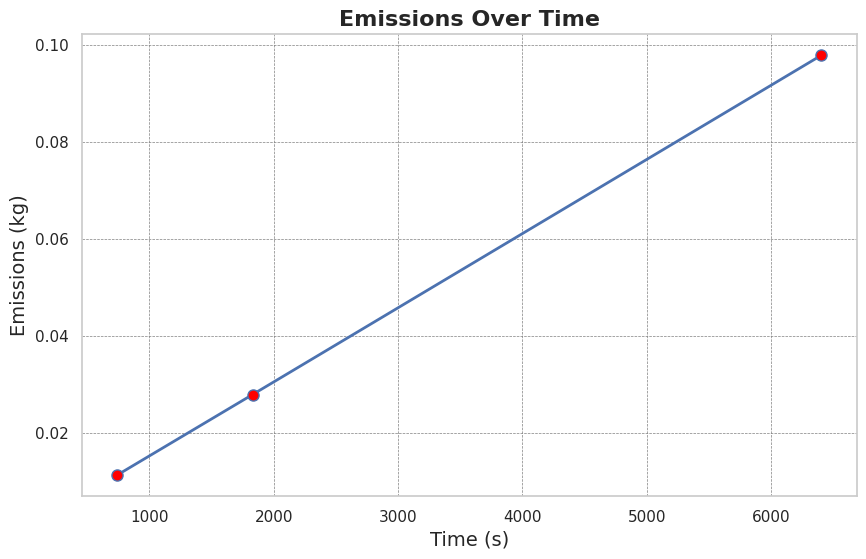

In [ ]:
import matplotlib.pyplot as plt


# Create a figure and an axis with improved aesthetics
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the emissions vs time with enhanced styling
ax.plot(times, emissions_data, marker='o', linestyle='-', linewidth=2, markersize=8, markerfacecolor='red')

# Label the axes with improved font sizes
ax.set_xlabel('Time (s)', fontsize=14)
ax.set_ylabel('Emissions (kg)', fontsize=14)

# Set the title and improve its appearance
ax.set_title('Emissions Over Time', fontsize=16, fontweight='bold')

# Add grid lines to make the plot easier to read
ax.grid(True, linestyle='--', linewidth=0.5, color='gray')

# Show the plot
plt.show()

[codecarbon INFO @ 07:10:59] Energy consumed for RAM : 0.050328 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:59] Energy consumed for all GPUs : 0.131898 kWh. Total GPU Power : 51.99381081152239 W
[codecarbon INFO @ 07:10:59] Energy consumed for all CPUs : 0.111898 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:59] 0.294124 kWh of electricity used since the beginning.
[codecarbon INFO @ 07:10:59] Energy consumed for RAM : 0.048496 kWh. RAM Power : 19.12397575378418 W
[codecarbon INFO @ 07:10:59] Energy consumed for all GPUs : 0.128822 kWh. Total GPU Power : 51.833051099730596 W
[codecarbon INFO @ 07:10:59] Energy consumed for all CPUs : 0.107825 kWh. Total CPU Power : 42.5 W
[codecarbon INFO @ 07:10:59] 0.285143 kWh of electricity used since the beginning.


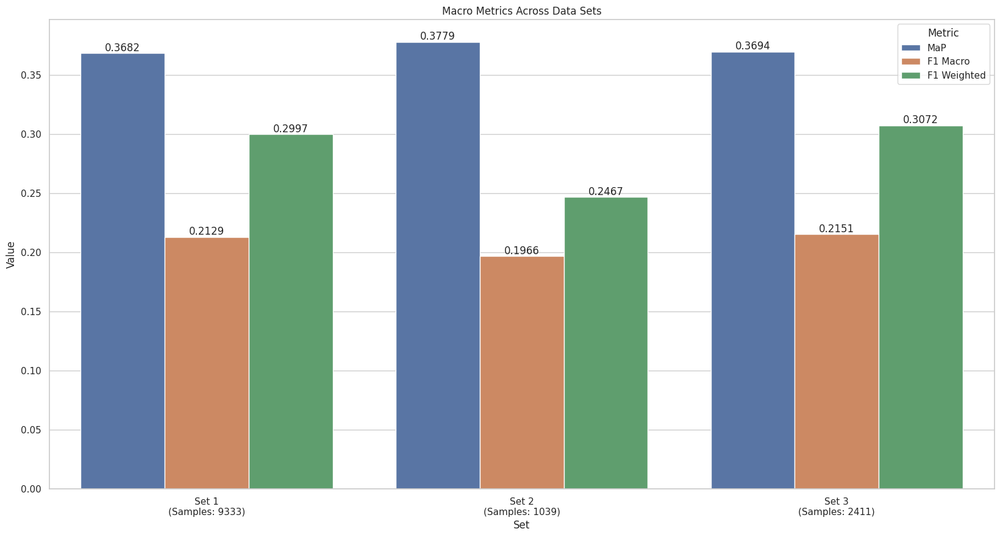

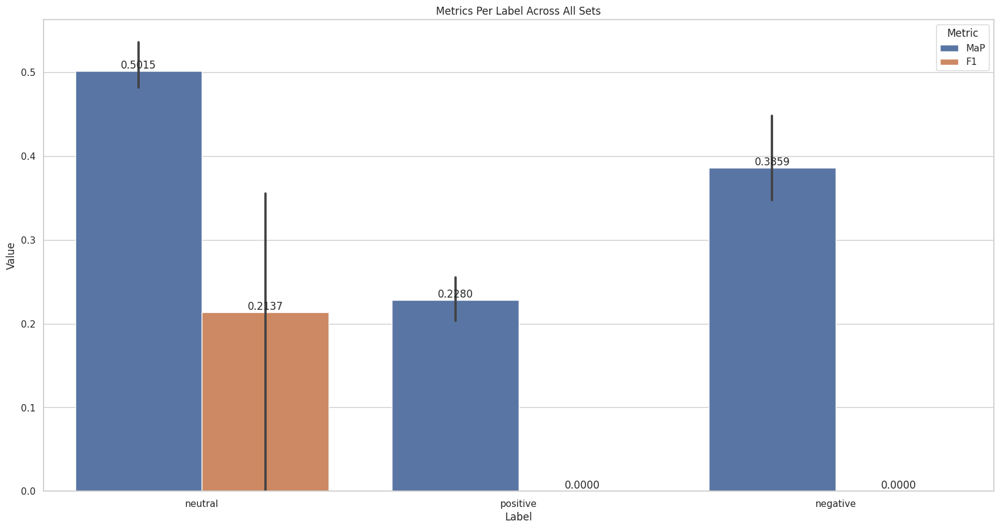

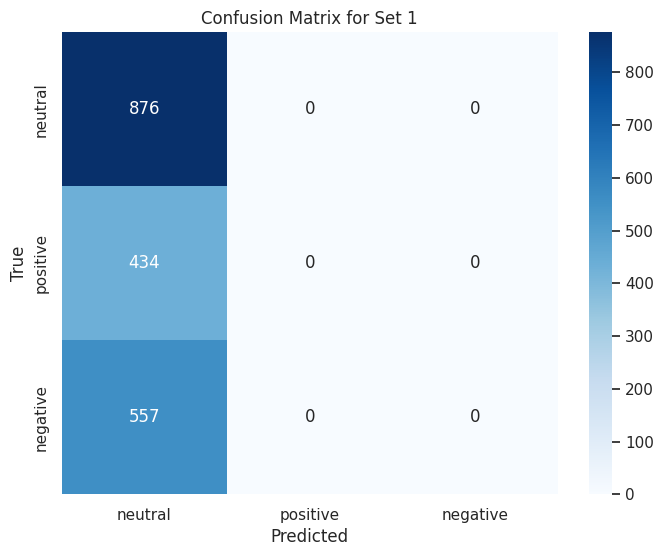

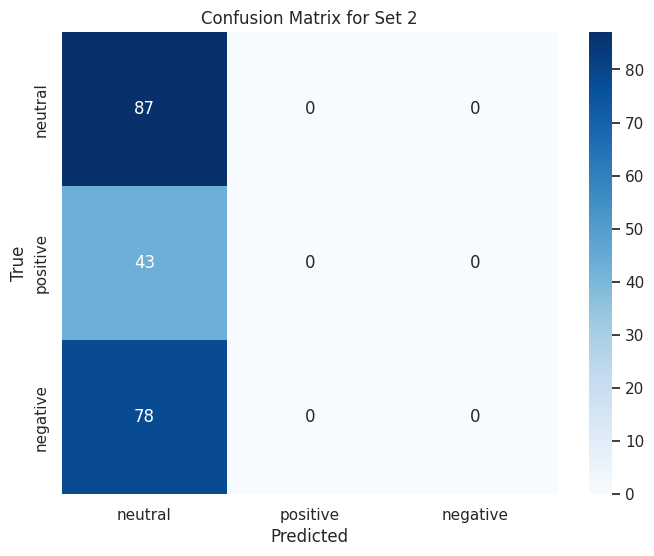

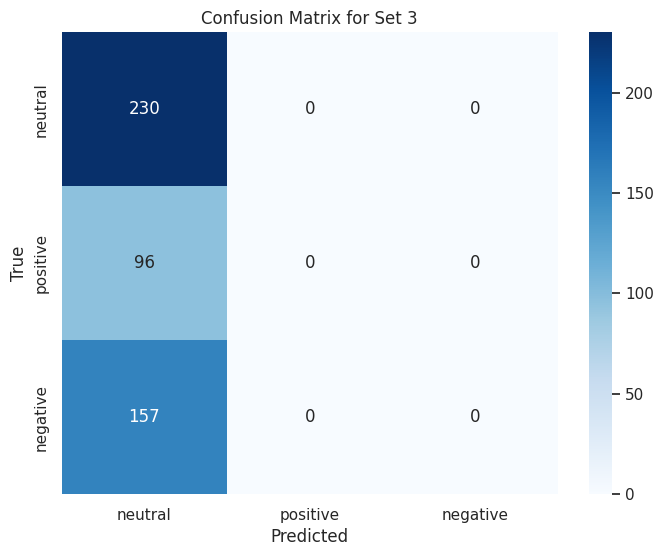

In [ ]:
from sklearn.metrics import average_precision_score, confusion_matrix, f1_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pickle

def train_and_evaluate_classifier(features_path, class_names, test_size=0.2, max_iter=5000, random_state=42):
    with open(features_path, 'rb') as f:
        features = pickle.load(f)

    X = np.array([x['features'] for x in features.values()])
    y = np.array([x['label'] for x in features.values()])

    # Explicitly convert y to a 2D numpy array of integers
    y_list_of_lists = [list(map(int, label.tolist())) for label in y]
    y = np.array(y_list_of_lists, dtype=int)

    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, stratify=np.argmax(y, axis=1), random_state=random_state)

    classifier = OneVsRestClassifier(LogisticRegression(max_iter=max_iter, random_state=random_state))
    classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_val)

    y_score = classifier.decision_function(X_val)
    y_pred_single = np.argmax(y_pred, axis=1)
    y_val_single = np.argmax(y_val, axis=1)
    cm = confusion_matrix(y_val_single, y_pred_single)
    map_val = average_precision_score(y_val, y_score, average='macro')
    f1_macro = f1_score(y_val_single, y_pred_single, average='macro')
    f1_weighted = f1_score(y_val_single, y_pred_single, average='weighted')
    map_per_label = average_precision_score(y_val, y_score, average=None)
    f1_per_label = f1_score(y_val, y_pred, average=None)
    return map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, len(X), cm

# Initialize containers
results_macro = []
results_per_label = []
confusion_matrices = {}
sets_path = ["/content/datasets/vision_features/Train_video_features_crop_face.pkl", "/content/datasets/vision_features/Dev_video_features_crop_face.pkl", "/content/datasets/vision_features/Test_video_features_crop_face.pkl"]
class_names = ['neutral', 'positive', 'negative']

# Evaluate classifier and collect metrics
for idx, set_file in enumerate(sets_path):
    map_val, f1_macro, f1_weighted, map_per_label, f1_per_label, sample_count, cm = train_and_evaluate_classifier(set_file, class_names)
    set_name = f"Set {idx + 1}"
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'MaP',
        'Value': map_val
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Macro',
        'Value': f1_macro
    })
    results_macro.append({
        'Set': set_name,
        'Sample Count': sample_count,
        'Metric': 'F1 Weighted',
        'Value': f1_weighted
    })

    for label_idx, label_name in enumerate(class_names):
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'MaP',
            'Value': map_per_label[label_idx]
        })
        results_per_label.append({
            'Set': set_name,
            'Label': label_name,
            'Metric': 'F1',
            'Value': f1_per_label[label_idx]
        })

    confusion_matrices[set_name] = cm

# Plotting macro metrics
df_macro = pd.DataFrame(results_macro)
plt.figure(figsize=(20, 10))
sns.set(style="whitegrid")
ax = sns.barplot(x='Set', y='Value', hue='Metric', data=df_macro)
plt.title('Macro Metrics Across Data Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

# Annotate with sample count and update x-axis labels
new_labels = []
for idx, label in enumerate(df_macro['Set'].unique()):
    sample_count = df_macro[df_macro['Set'] == label]['Sample Count'].iloc[0]
    new_labels.append(f"{label}\n(Samples: {sample_count})")
plt.xticks(ticks=range(len(new_labels)), labels=new_labels)

plt.show()

# Plotting per-label metrics
df_per_label = pd.DataFrame(results_per_label)
plt.figure(figsize=(20, 10))
ax = sns.barplot(x='Label', y='Value', hue='Metric', data=df_per_label)
plt.title('Metrics Per Label Across All Sets')

# Annotate bars with metric values
for p in ax.patches:
    ax.annotate(f"{p.get_height():.4f}", (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

plt.show()

# Plot confusion matrices
for set_name, cm in confusion_matrices.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix for {set_name}')
    plt.show()

## Alignment of modalities

In [ ]:
videos_with_problem = ["dia125_utt3"]

## Classifier

In [ ]:
import numpy as np
import logging
import time
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from sklearn.metrics import accuracy_score, f1_score, multilabel_confusion_matrix
from sklearn.multiclass import OneVsRestClassifier

# Configure logging
logging.basicConfig(level=logging.INFO)

def load_features(filename):
    data = np.load(filename, allow_pickle=True).item()

    # Determine the maximum shape along each dimension
    max_shape = np.max([item['features'].shape for item in data.values()], axis=0)

    # Pad each feature array to have the max_shape, then flatten it
    padded_features = [
        np.pad(item['features'], ((0, max_shape[0] - item['features'].shape[0]),
                                  (0, max_shape[1] - item['features'].shape[1])))
        .flatten() for item in data.values()
    ]

    # Now, padded_features should be a list of 1D arrays of the same length
    # Stack them into a 2D array
    X = np.vstack(padded_features)
    y = np.array([item['label'] for item in data.values()])

    return X, y

def evaluate_classifiers(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Wrap classifiers with OneVsRestClassifier for multi-label classification
    classifiers = {
        'Random Forest': OneVsRestClassifier(RandomForestClassifier(n_jobs=-1)),
        'SVM': OneVsRestClassifier(SVC()),
        'Logistic Regression': OneVsRestClassifier(LogisticRegression(max_iter=1000, n_jobs=-1)),
        'XGBoost': OneVsRestClassifier(xgb.XGBClassifier(n_jobs=-1))
    }

    for name, clf in classifiers.items():
        start_time = time.time()
        logging.info(f"Training {name}...")
        clf.fit(X_train, y_train)
        logging.info(f"Trained {name} in {time.time() - start_time:.2f} seconds")

        preds = clf.predict(X_test)
        print(f'{name} - Accuracy: {accuracy_score(y_test, preds)*100:.2f}%, '
              f'F1 Score: {f1_score(y_test, preds, average="weighted")*100:.2f}%')

if __name__ == "__main__":
    filename = 'train'  # Adjust the filename to match the output from your feature extraction script
    X, y = load_features('/content/datasets/train_video_features.npy')
    evaluate_classifiers(X, y)


In [ ]:
data = np.load('/content/datasets/train_video_features.npy', allow_pickle=True).item()

# Merging modalities

In [ ]:
merged_features = {}

# Load Pickle files
video_features = pickle.load(open("video_features.pkl", "rb"))
text_features = pickle.load(open("text_features.pkl", "rb"))
audio_features = pickle.load(open("audio_features.pkl", "rb"))

# Merge features based on video_id
for video_id in video_features.keys():
    merged_features[video_id] = {
        'video': video_features.get(video_id, {}).get('features', None),
        'text': text_features.get(video_id, {}).get('features', None),
        'audio': audio_features.get(video_id, {}).get('features', None),
        'label': video_features.get(video_id, {}).get('label', None)  # Assuming label is the same across modalities
    }

# Multimodal System

1. Early Fusion for Intra-Modality in Vision Features:
For each video, you've concatenated features from multiple architectures (ResNet, VGG16, ViT). Now, you can feed these concatenated features into a BLSTM layer to capture the temporal relations between frames.

In [ ]:
import torch
import torch.nn as nn

class EarlyFusionBLSTM(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(EarlyFusionBLSTM, self).__init__()
        self.blstm = nn.LSTM(input_dim, hidden_dim, bidirectional=True)

    def forward(self, x):
        out, _ = self.blstm(x)
        return out




2. Model-Specific Layers:
After the BLSTM, you can add one or more fully connected layers specific to the vision modality. Do the same for audio and text features.

In [ ]:
class ModalitySpecificLayers(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(ModalitySpecificLayers, self).__init__()
        self.fc = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        return self.fc(x)

3.You can concatenate or use a weighted sum of the outputs from the modality-specific layers. Another option is to use attention mechanisms to dynamically weigh the importance of each modality.

In [ ]:
class LateFusionLayer(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LateFusionLayer, self).__init__()
        self.fc = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        return self.fc(x)

4. Final Layers for Prediction:
Finally, you can have one or more layers to output the emotion classes.

In [ ]:
class EmotionClassifier(nn.Module):
    def __init__(self, input_dim, num_classes):
        super(EmotionClassifier, self).__init__()
        self.fc = nn.Linear(input_dim, num_classes)

    def forward(self, x):
        return self.fc(x)

Combining All:
You can then combine these components into a single model that takes the vision, audio, and text features as inputs and outputs the emotion class probabilities.

In [ ]:
class MultimodalEmotionClassifier(nn.Module):
    def __init__(self):
        super(MultimodalEmotionClassifier, self).__init__()
        self.early_fusion_blstm = EarlyFusionBLSTM(input_dim=26368, hidden_dim=512)
        self.vision_specific_layer = ModalitySpecificLayers(input_dim=1024, output_dim=256)  # 512 * 2 from BLSTM
        self.audio_specific_layer = ModalitySpecificLayers(input_dim=audio_dim, output_dim=256)
        self.text_specific_layer = ModalitySpecificLayers(input_dim=text_dim, output_dim=256)
        self.late_fusion_layer = LateFusionLayer(input_dim=768, output_dim=256)  # 256 * 3 from specific layers
        self.emotion_classifier = EmotionClassifier(input_dim=256, num_classes=num_emotion_classes)

    def forward(self, vision_input, audio_input, text_input):
        vision_features = self.early_fusion_blstm(vision_input)
        vision_features = self.vision_specific_layer(vision_features)

        audio_features = self.audio_specific_layer(audio_input)
        text_features = self.text_specific_layer(text_input)

        combined_features = torch.cat([vision_features, audio_features, text_features], dim=-1)
        combined_features = self.late_fusion_layer(combined_features)

        emotion_output = self.emotion_classifier(combined_features)
        return emotion_output


# Multimodal classifier

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

class MultimodalClassifier(nn.Module):
    def __init__(self, audio_dim, text_dim, num_classes):
        super(MultimodalClassifier, self).__init__()

        self.audio_layer = nn.Linear(audio_dim, 128)
        self.text_layer = nn.Linear(text_dim, 128)

        self.fc_layer = nn.Linear(256, 128)  # 128 from audio + 128 from text
        self.classifier = nn.Linear(128, num_classes)

    def forward(self, audio_features, text_features):
        audio_out = self.audio_layer(audio_features)
        text_out = self.text_layer(text_features)

        combined = torch.cat((audio_out, text_out), dim=1)

        out = self.fc_layer(combined)
        out = self.classifier(out)

        return out

# Dimensions based on your feature extractors
audio_dim = 768  # for example
text_dim = 512  # for example
num_classes = 7  # Number of emotion classes

model = MultimodalClassifier(audio_dim, text_dim, num_classes)

# Sample data
audio_features = torch.randn(32, audio_dim)  # Batch of 32 samples
text_features = torch.randn(32, text_dim)    # Batch of 32 samples
labels = torch.randint(0, num_classes, (32,))  # Random labels

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Forward pass
outputs = model(audio_features, text_features)

# Compute loss and update weights
loss = criterion(outputs, labels)
loss.backward()
optimizer.step()


In [ ]:
import numpy as np

# Set the path to the .npy file
npy_file = "/content/datasets/MELD/dev_splits_complete/dia104_utt11.mp4_features.npy"

# Load the .npy file
data = np.load(npy_file)

# Print the data
print(data.shape)

(27, 26600)
